In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import os
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
import seaborn as sns
from cryptocmd import CmcScraper
import cvxopt as opt
from cvxopt import blas, solvers
from scipy.stats.mstats import winsorize

In [3]:
from pypfopt.expected_returns import mean_historical_return
from pypfopt.risk_models import CovarianceShrinkage
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import objective_functions

### Run below to pull whole data

In [4]:
df = pd.read_csv('DataFiltered.csv')
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')
dfret = df.pct_change().apply(lambda x: np.log(1+x)).dropna()

In [5]:
weights_port = pd.DataFrame(index = df.index,columns=df.columns)

In [6]:
weekly= []
monthly = []
quaterly = []
halfyearly = []

for i in range(1,len(df.index)):
    if i%7 == 0:
        weekly.append(df.index[i])
    if i%30 == 0:
        monthly.append(df.index[i])
    if i%90 == 0:
        quaterly.append(df.index[i])
    if i%180 == 0:
        halfyearly.append(df.index[i])

In [7]:
def optimal_portfolio(returns):
    n = len(returns)
    returns = np.asmatrix(returns)
    
    N = 100
    mus = [10**(5.0 * t/N - 1.0) for t in range(N)]
    
    # Convert to cvxopt matrices
    S = opt.matrix(np.cov(returns))
    pbar = opt.matrix(np.mean(returns, axis=1))
    
    # Create constraint matrices
    G = -opt.matrix(np.eye(n))   # negative n x n identity matrix
    h = opt.matrix(0.0, (n ,1))
    A = opt.matrix(1.0, (1, n))
    b = opt.matrix(1.0)
    
    # Calculate efficient frontier weights using quadratic programming
    portfolios = [solvers.qp(mu*S, -pbar, G, h, A, b)['x'] 
                  for mu in mus]
    ## CALCULATE RISKS AND RETURNS FOR FRONTIER
    returns = [blas.dot(pbar, x) for x in portfolios]
    risks = [np.sqrt(blas.dot(x, S*x)) for x in portfolios]
    ## CALCULATE THE 2ND DEGREE POLYNOMIAL OF THE FRONTIER CURVE
    m1 = np.polyfit(returns, risks, 2)
    x1 = np.sqrt(m1[2] / m1[0])
    # CALCULATE THE OPTIMAL PORTFOLIO
    wt = solvers.qp(opt.matrix(x1 * S), -pbar, G, h, A, b)['x']
    return np.asarray(wt), returns, risks

In [8]:
rebalances = ["Weekly", "Monthly", "Quaterly", "Half-Yearly"]
#rebalances = ["Half-Yearly"]

In [9]:
ret_port = pd.DataFrame(index = dfret.index,columns=rebalances)
ret_port["EqWt"] = dfret.iloc[:,:].mean(axis=1)

for rebalancing in rebalances:
    if rebalancing == "Weekly":
        rebalancingdays = weekly.copy()
    elif rebalancing == "Monthly":
        rebalancingdays = monthly.copy()
    elif rebalancing == "Quaterly":
        rebalancingdays = quaterly.copy()
    elif rebalancing == "Half-Yearly":
        rebalancingdays = halfyearly.copy()
    
    weights_port = pd.DataFrame(index = df.index,columns=df.columns)
    for enddate in rebalancingdays:
        df_subset = df.loc[:enddate,:].copy()
        returns = df_subset.pct_change().dropna().transpose()
        weights= optimal_portfolio(returns)[0]
        weights_port.loc[enddate] = list(np.around(weights, 2))
        #mu = mean_historical_return(df_subset)
        #S = CovarianceShrinkage(df_subset).ledoit_wolf()
        #ef = EfficientFrontier(mu, S)
        #ef.add_objective(objective_functions.L2_reg, gamma=0.1)
        #weights = ef.max_sharpe()
        #cleaned_weights = ef.clean_weights()
        #weights_port.loc[enddate] = list(cleaned_weights.values())
    weights_port.ffill(inplace = True)
    
    for row in ret_port.index:
        ret_port.loc[row,rebalancing] = sum(weights_port.loc[row,:] * dfret.shift(-1).loc[row,])
    
    if rebalancing == "Weekly":
        weights_port_1 = weights_port.astype(float).copy()
    elif rebalancing == "Monthly":
        weights_port_2 = weights_port.astype(float).copy()
    elif rebalancing == "Quaterly":
        weights_port_3 = weights_port.astype(float).copy()
    elif rebalancing == "Half-Yearly":
        weights_port_4 = weights_port.astype(float).copy()

     pcost       dcost       gap    pres   dres
 0: -2.2563e-01 -1.2507e+00  4e+01  6e+00  7e+00
 1: -6.7077e-02 -1.1881e+00  1e+00  4e-15  2e-15
 2: -7.6156e-02 -2.6111e-01  2e-01  7e-16  1e-15
 3: -1.4995e-01 -3.2443e-01  2e-01  9e-16  8e-16
 4: -2.3785e-01 -2.4987e-01  1e-02  1e-16  5e-16
 5: -2.4899e-01 -2.4912e-01  1e-04  2e-16  3e-16
 6: -2.4910e-01 -2.4911e-01  1e-06  3e-16  4e-16
 7: -2.4911e-01 -2.4911e-01  1e-08  3e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2546e-01 -1.2505e+00  4e+01  6e+00  7e+00
 1: -6.7057e-02 -1.1880e+00  1e+00  3e-15  2e-15
 2: -7.6139e-02 -2.6112e-01  2e-01  2e-16  1e-15
 3: -1.4960e-01 -3.2417e-01  2e-01  3e-16  1e-15
 4: -2.3741e-01 -2.4956e-01  1e-02  1e-16  5e-16
 5: -2.4868e-01 -2.4881e-01  1e-04  2e-16  4e-16
 6: -2.4880e-01 -2.4880e-01  1e-06  1e-16  3e-16
 7: -2.4880e-01 -2.4880e-01  1e-08  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2528e-01 -1.2504e

 7: -2.2665e-01 -2.2665e-01  7e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1464e-01 -1.2429e+00  4e+01  6e+00  7e+00
 1: -6.6434e-02 -1.1782e+00  1e+00  8e-15  2e-15
 2: -7.5939e-02 -2.6140e-01  2e-01  2e-15  2e-15
 3: -1.3566e-01 -3.0986e-01  2e-01  9e-16  1e-15
 4: -2.0485e-01 -2.2581e-01  2e-02  2e-16  4e-16
 5: -2.2295e-01 -2.2365e-01  7e-04  2e-16  2e-16
 6: -2.2359e-01 -2.2360e-01  2e-05  1e-16  2e-16
 7: -2.2360e-01 -2.2360e-01  2e-07  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1352e-01 -1.2420e+00  4e+01  6e+00  7e+00
 1: -6.6391e-02 -1.1772e+00  1e+00  8e-15  2e-15
 2: -7.5949e-02 -2.6129e-01  2e-01  1e-15  1e-15
 3: -1.3515e-01 -3.0867e-01  2e-01  1e-15  9e-16
 4: -2.0138e-01 -2.2288e-01  2e-02  2e-16  4e-16
 5: -2.1955e-01 -2.2031e-01  8e-04  1e-16  2e-16
 6: -2.2017e-01 -2.2020e-01  3e-05  3e-16  2e-16
 7: -2.2020e-01 -2.2020e-01  6e-07  2e-18  2e-16
 8: -2.2020e-01 -2.2020

 3: -1.3106e-01 -2.4033e-01  1e-01  6e-17  4e-16
 4: -1.6566e-01 -1.9455e-01  3e-02  2e-17  5e-16
 5: -1.7601e-01 -1.7719e-01  1e-03  2e-16  3e-16
 6: -1.7672e-01 -1.7678e-01  6e-05  2e-16  2e-16
 7: -1.7676e-01 -1.7676e-01  3e-06  2e-16  2e-16
 8: -1.7676e-01 -1.7676e-01  1e-07  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8811e-01 -1.2185e+00  5e+01  6e+00  7e+00
 1: -5.4898e-02 -1.1531e+00  1e+00  8e-16  3e-15
 2: -6.4167e-02 -2.4428e-01  2e-01  1e-16  2e-15
 3: -1.2962e-01 -2.3130e-01  1e-01  2e-16  5e-16
 4: -1.6235e-01 -1.9284e-01  3e-02  4e-16  3e-16
 5: -1.7303e-01 -1.7463e-01  2e-03  1e-16  3e-16
 6: -1.7392e-01 -1.7397e-01  5e-05  1e-16  2e-16
 7: -1.7395e-01 -1.7395e-01  3e-06  1e-16  2e-16
 8: -1.7395e-01 -1.7395e-01  3e-07  1e-16  2e-16
 9: -1.7395e-01 -1.7395e-01  2e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8697e-01 -1.2169e+00  5e+01  6e+00  7e+00
 1: -5.3167e-02 -1.1513

 8: -1.2213e-01 -1.2214e-01  2e-06  2e-16  6e-16
 9: -1.2214e-01 -1.2214e-01  2e-07  2e-16  6e-16
10: -1.2214e-01 -1.2214e-01  1e-08  3e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8122e-01 -1.1917e+00  5e+01  7e+00  7e+00
 1: -4.2731e-02 -1.0880e+00  3e+00  3e-01  3e-01
 2:  5.8684e-03 -4.0584e-01  4e-01  1e-15  1e-15
 3: -4.8327e-02 -1.5313e-01  1e-01  1e-16  8e-16
 4: -9.2580e-02 -1.4219e-01  5e-02  9e-17  5e-16
 5: -1.1439e-01 -1.2013e-01  6e-03  2e-16  5e-16
 6: -1.1780e-01 -1.1906e-01  1e-03  1e-16  6e-16
 7: -1.1869e-01 -1.1873e-01  4e-05  1e-16  8e-16
 8: -1.1872e-01 -1.1872e-01  4e-07  2e-16  5e-16
 9: -1.1872e-01 -1.1872e-01  4e-09  8e-17  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8136e-01 -1.1908e+00  5e+01  7e+00  7e+00
 1: -4.3834e-02 -1.0838e+00  3e+00  3e-01  3e-01
 2:  1.1240e-02 -4.1452e-01  4e-01  1e-16  1e-15
 3: -4.5186e-02 -1.4944e-01  1e-01  2e-16  8e-16
 4: -8.9160e-02 -1.3773

 6: -4.7327e-02 -4.8585e-02  1e-03  8e-07  8e-07
 7: -4.8177e-02 -4.8197e-02  2e-05  9e-09  1e-08
 8: -4.8192e-02 -4.8192e-02  2e-07  9e-11  1e-10
 9: -4.8192e-02 -4.8192e-02  2e-09  9e-13  1e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8313e-01 -1.1830e+00  5e+01  7e+00  7e+00
 1: -5.9781e-02 -1.0408e+00  4e+00  4e-01  5e-01
 2:  3.5548e-02 -3.8196e-01  7e-01  4e-02  4e-02
 3:  1.1514e-02 -9.9385e-02  1e-01  6e-03  7e-03
 4: -1.7323e-02 -5.4267e-02  4e-02  2e-03  2e-03
 5: -3.6029e-02 -4.8365e-02  1e-02  2e-05  2e-05
 6: -4.3206e-02 -4.4243e-02  1e-03  2e-06  2e-06
 7: -4.3927e-02 -4.3965e-02  4e-05  5e-08  5e-08
 8: -4.3953e-02 -4.3954e-02  2e-06  7e-10  8e-10
 9: -4.3954e-02 -4.3954e-02  1e-07  5e-12  5e-12
10: -4.3954e-02 -4.3954e-02  1e-09  5e-14  5e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8318e-01 -1.1828e+00  5e+01  7e+00  7e+00
 1: -6.0254e-02 -1.0397e+00  4e+00  4e-01  5e-01
 2:  2.9937e-02 -3.7584

 2: -4.4173e-02 -2.8683e-01  9e-01  1e-01  1e-01
 3:  4.6077e-03 -3.2908e-02  3e-01  3e-02  4e-02
 4:  6.0744e-02  5.4346e-02  2e-01  1e-02  1e-02
 5:  8.9074e-02  7.4645e-02  4e-02  2e-03  2e-03
 6:  8.6999e-02  8.6504e-02  1e-03  7e-05  7e-05
 7:  8.6772e-02  8.6767e-02  1e-05  7e-07  7e-07
 8:  8.6770e-02  8.6770e-02  1e-07  7e-09  7e-09
 9:  8.6770e-02  8.6770e-02  1e-09  7e-11  7e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8354e-01 -1.1816e+00  5e+01  7e+00  7e+00
 1: -6.3913e-02 -1.0318e+00  4e+00  5e-01  5e-01
 2: -4.6306e-02 -2.8419e-01  9e-01  1e-01  1e-01
 3:  1.9388e-04 -2.8419e-02  4e-01  4e-02  4e-02
 4:  6.0695e-02  6.5377e-02  2e-01  1e-02  2e-02
 5:  1.0014e-01  9.1377e-02  5e-02  3e-03  3e-03
 6:  1.0347e-01  1.0313e-01  2e-03  1e-04  1e-04
 7:  1.0346e-01  1.0345e-01  2e-05  1e-06  1e-06
 8:  1.0346e-01  1.0346e-01  2e-07  1e-08  1e-08
 9:  1.0346e-01  1.0346e-01  2e-09  1e-10  1e-10
Optimal solution found.
     pcost       dcost

 7: -5.3904e-02 -5.3904e-02  8e-08  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4527e-02 -1.0610e+00  4e+01  6e+00  6e+00
 1: -4.0603e-03 -1.0038e+00  1e+00  4e-15  2e-15
 2: -5.3496e-03 -7.3817e-02  7e-02  7e-16  2e-15
 3: -4.7710e-02 -9.4219e-02  5e-02  2e-16  1e-16
 4: -5.0090e-02 -5.5374e-02  5e-03  2e-16  1e-16
 5: -5.1784e-02 -5.2552e-02  8e-04  2e-16  5e-17
 6: -5.2397e-02 -5.2418e-02  2e-05  1e-16  8e-17
 7: -5.2416e-02 -5.2417e-02  3e-07  3e-16  8e-17
 8: -5.2417e-02 -5.2417e-02  3e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3901e-02 -1.0601e+00  4e+01  6e+00  6e+00
 1: -3.7214e-03 -1.0028e+00  1e+00  1e-15  1e-15
 2: -5.0017e-03 -7.3225e-02  7e-02  4e-16  2e-15
 3: -4.6038e-02 -9.2602e-02  5e-02  1e-16  1e-16
 4: -4.8377e-02 -5.4687e-02  6e-03  1e-16  1e-16
 5: -5.0084e-02 -5.1000e-02  9e-04  2e-16  9e-17
 6: -5.0798e-02 -5.0819e-02  2e-05  8e-18  8e-17
 7: -5.0815e-02 -5.0816

 6: -1.7234e-02 -1.7273e-02  4e-05  2e-16  8e-17
 7: -1.7256e-02 -1.7258e-02  2e-06  1e-16  8e-17
 8: -1.7256e-02 -1.7256e-02  1e-07  7e-17  7e-17
 9: -1.7256e-02 -1.7256e-02  1e-08  1e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5226e-03 -1.0279e+00  4e+01  6e+00  6e+00
 1:  2.0726e-02 -9.7059e-01  1e+00  2e-15  2e-15
 2:  1.9632e-02 -3.8626e-02  6e-02  2e-16  1e-15
 3: -4.8688e-03 -4.0778e-02  4e-02  4e-16  3e-16
 4: -1.1239e-02 -1.7762e-02  7e-03  3e-16  1e-16
 5: -1.4510e-02 -1.5244e-02  7e-04  1e-16  9e-17
 6: -1.5037e-02 -1.5069e-02  3e-05  1e-16  7e-17
 7: -1.5062e-02 -1.5063e-02  1e-06  6e-17  7e-17
 8: -1.5063e-02 -1.5063e-02  1e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1271e-03 -1.0254e+00  4e+01  6e+00  6e+00
 1:  2.4014e-02 -9.6807e-01  1e+00  6e-15  1e-15
 2:  2.2869e-02 -3.6623e-02  6e-02  3e-16  1e-15
 3: -2.6420e-03 -3.9913e-02  4e-02  1e-16  3e-16
 4: -9.0578e-03 -1.5717

     pcost       dcost       gap    pres   dres
 0:  5.4804e-02 -9.9508e-01  4e+01  6e+00  7e+00
 1:  1.4517e-01 -8.8603e-01  2e+00  1e-01  1e-01
 2:  1.6520e-01 -5.5885e-02  2e-01  2e-16  1e-15
 3:  8.2527e-02 -6.1069e-02  1e-01  2e-16  6e-16
 4:  6.5639e-02  3.1930e-02  3e-02  2e-16  4e-16
 5:  5.3702e-02  5.0431e-02  3e-03  1e-16  4e-16
 6:  5.1179e-02  5.1099e-02  8e-05  2e-16  2e-16
 7:  5.1112e-02  5.1111e-02  1e-06  3e-16  4e-16
 8:  5.1111e-02  5.1111e-02  1e-08  8e-17  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6304e-02 -9.9153e-01  5e+01  6e+00  7e+00
 1:  1.5366e-01 -8.7330e-01  2e+00  2e-01  2e-01
 2:  1.8124e-01 -6.9498e-02  3e-01  2e-16  1e-15
 3:  9.1874e-02 -5.1731e-02  1e-01  1e-16  5e-16
 4:  7.3262e-02  4.0893e-02  3e-02  2e-16  3e-16
 5:  6.0623e-02  5.7570e-02  3e-03  5e-18  3e-16
 6:  5.8203e-02  5.8133e-02  7e-05  1e-16  3e-16
 7:  5.8147e-02  5.8147e-02  8e-07  2e-16  4e-16
 8:  5.8147e-02  5.8147e-02  8e-09  1e-16  2e-1

 2:  5.4654e-01  2.7129e-01  7e-01  5e-02  6e-02
 3:  5.5894e-01  4.7207e-01  1e-01  9e-03  1e-02
 4:  5.1692e-01  5.0100e-01  2e-02  1e-16  3e-15
 5:  5.0481e-01  5.0392e-01  9e-04  1e-16  4e-15
 6:  5.0413e-01  5.0407e-01  5e-05  1e-16  3e-15
 7:  5.0409e-01  5.0408e-01  5e-06  2e-16  2e-15
 8:  5.0409e-01  5.0408e-01  6e-07  1e-16  3e-15
 9:  5.0408e-01  5.0408e-01  1e-08  3e-17  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6155e-02 -8.8920e-01  6e+01  7e+00  8e+00
 1:  1.8444e-01 -4.0216e-01  4e+00  4e-01  5e-01
 2:  5.5106e-01  3.1842e-01  7e-01  6e-02  8e-02
 3:  6.1929e-01  5.3368e-01  2e-01  1e-02  1e-02
 4:  5.7854e-01  5.6338e-01  2e-02  2e-16  3e-15
 5:  5.6698e-01  5.6611e-01  9e-04  1e-16  3e-15
 6:  5.6633e-01  5.6627e-01  5e-05  2e-16  3e-15
 7:  5.6629e-01  5.6629e-01  5e-06  1e-16  4e-15
 8:  5.6629e-01  5.6629e-01  7e-07  4e-17  4e-15
 9:  5.6629e-01  5.6629e-01  7e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost

 7:  4.5365e+00  4.5365e+00  2e-05  1e-07  2e-07
 8:  4.5365e+00  4.5365e+00  2e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8900e-03 -8.3349e-01  6e+01  7e+00  8e+00
 1:  4.4257e-02 -4.2219e-02  6e+00  8e-01  9e-01
 2:  4.8262e-01  1.7551e+00  2e+00  3e-01  3e-01
 3:  1.5506e+00  3.3544e+00  1e+00  1e-01  2e-01
 4:  3.3707e+00  4.7734e+00  1e+00  6e-02  7e-02
 5:  5.0387e+00  5.0822e+00  7e-02  2e-03  2e-03
 6:  5.0903e+00  5.0902e+00  1e-03  3e-05  3e-05
 7:  5.0907e+00  5.0907e+00  3e-05  3e-07  3e-07
 8:  5.0907e+00  5.0907e+00  3e-07  3e-09  3e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1825e-03 -8.3240e-01  6e+01  7e+00  8e+00
 1:  4.0235e-02 -3.4122e-02  7e+00  8e-01  9e-01
 2:  4.6681e-01  1.8449e+00  2e+00  3e-01  3e-01
 3:  1.5794e+00  3.5637e+00  1e+00  1e-01  2e-01
 4:  3.5420e+00  5.2777e+00  1e+00  7e-02  8e-02
 5:  5.6247e+00  5.7005e+00  1e-01  3e-03  4e-03
 6:  5.7122e+00  5.7119

 6: -4.2881e-02 -4.2881e-02  3e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5999e-02 -1.0504e+00  1e+00  2e-16  6e+00
 1: -1.6536e-02 -6.0295e-02  4e-02  2e-16  3e-01
 2: -3.3011e-02 -5.1298e-02  2e-02  1e-16  6e-17
 3: -3.9565e-02 -4.1514e-02  2e-03  1e-16  1e-16
 4: -4.1046e-02 -4.1156e-02  1e-04  2e-16  5e-17
 5: -4.1133e-02 -4.1141e-02  8e-06  2e-16  6e-17
 6: -4.1140e-02 -4.1140e-02  8e-08  1e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5484e-02 -1.0496e+00  1e+00  2e-16  6e+00
 1: -1.6012e-02 -5.9468e-02  4e-02  3e-17  3e-01
 2: -3.1632e-02 -4.9674e-02  2e-02  2e-16  9e-17
 3: -3.7817e-02 -3.9737e-02  2e-03  1e-17  6e-17
 4: -3.9055e-02 -3.9377e-02  3e-04  2e-16  5e-17
 5: -3.9328e-02 -3.9340e-02  1e-05  1e-16  4e-17
 6: -3.9337e-02 -3.9338e-02  3e-07  1e-16  5e-17
 7: -3.9338e-02 -3.9338e-02  3e-09  3e-20  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres


     pcost       dcost       gap    pres   dres
 0:  2.3434e-02 -1.0143e+00  4e+01  6e+00  6e+00
 1:  3.4164e-02 -9.5670e-01  1e+00  2e-15  2e-15
 2:  3.3300e-02 -2.8830e-02  6e-02  2e-16  2e-15
 3:  8.9887e-03 -3.4753e-02  4e-02  2e-16  1e-16
 4:  6.2129e-03 -1.6134e-03  8e-03  1e-16  1e-16
 5:  4.0049e-03  2.4471e-03  2e-03  2e-16  4e-17
 6:  3.2187e-03  3.0719e-03  1e-04  2e-16  6e-17
 7:  3.1151e-03  3.1109e-03  4e-06  2e-16  5e-17
 8:  3.1116e-03  3.1115e-03  1e-07  3e-16  5e-17
 9:  3.1115e-03  3.1115e-03  1e-09  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6698e-02 -1.0143e+00  4e+01  6e+00  6e+00
 1:  3.8878e-02 -9.5629e-01  1e+00  3e-15  1e-15
 2:  3.7862e-02 -2.9882e-02  7e-02  6e-17  1e-15
 3:  1.0595e-02 -4.2164e-02  5e-02  2e-16  1e-16
 4:  8.2717e-03 -1.7822e-03  1e-02  1e-16  9e-17
 5:  6.0401e-03  4.6156e-03  1e-03  1e-16  7e-17
 6:  5.3409e-03  5.2169e-03  1e-04  2e-16  6e-17
 7:  5.2577e-03  5.2543e-03  3e-06  1e-16  7e-1

 3:  1.3233e-01 -1.1926e-02  1e-01  3e-17  5e-16
 4:  1.0043e-01  7.7293e-02  2e-02  2e-16  6e-16
 5:  8.6802e-02  8.5326e-02  1e-03  2e-16  6e-16
 6:  8.5473e-02  8.5455e-02  2e-05  8e-17  5e-16
 7:  8.5456e-02  8.5456e-02  2e-07  1e-16  5e-16
 8:  8.5456e-02  8.5456e-02  2e-09  1e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7594e-02 -9.7180e-01  5e+01  7e+00  7e+00
 1:  2.0673e-01 -8.1854e-01  2e+00  2e-01  2e-01
 2:  2.6242e-01 -7.9011e-02  3e-01  4e-16  1e-15
 3:  1.4583e-01 -1.9058e-03  1e-01  1e-16  8e-16
 4:  1.1098e-01  8.9774e-02  2e-02  3e-17  7e-16
 5:  9.7302e-02  9.6056e-02  1e-03  1e-16  6e-16
 6:  9.6190e-02  9.6175e-02  1e-05  6e-17  5e-16
 7:  9.6177e-02  9.6177e-02  1e-07  6e-17  5e-16
 8:  9.6177e-02  9.6177e-02  1e-09  3e-17  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.9123e-02 -9.6592e-01  5e+01  7e+00  7e+00
 1:  2.1559e-01 -7.9795e-01  3e+00  2e-01  3e-01
 2:  2.8780e-01 -9.2325

 2:  6.3361e-01  6.7792e-01  2e+00  2e-01  2e-01
 3:  1.1616e+00  1.0606e+00  2e-01  1e-02  1e-02
 4:  1.1106e+00  1.1012e+00  1e-02  4e-04  4e-04
 5:  1.1024e+00  1.1021e+00  3e-04  4e-06  5e-06
 6:  1.1022e+00  1.1022e+00  3e-06  4e-08  5e-08
 7:  1.1022e+00  1.1022e+00  3e-08  4e-10  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9926e-02 -8.0551e-01  6e+01  7e+00  9e+00
 1:  2.2053e-01 -1.1667e-01  7e+00  8e-01  1e+00
 2:  6.4552e-01  7.5722e-01  2e+00  2e-01  2e-01
 3:  1.2615e+00  1.1856e+00  3e-01  2e-02  2e-02
 4:  1.2449e+00  1.2357e+00  2e-02  5e-04  7e-04
 5:  1.2371e+00  1.2369e+00  3e-04  6e-06  8e-06
 6:  1.2369e+00  1.2369e+00  3e-06  6e-08  8e-08
 7:  1.2369e+00  1.2369e+00  3e-08  6e-10  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7888e-02 -7.9836e-01  6e+01  7e+00  9e+00
 1:  2.1485e-01 -8.4088e-02  7e+00  8e-01  1e+00
 2:  6.6029e-01  8.4208e-01  2e+00  2e-01  2e-01
 3:  1.3522e+00  1.3235

 5: -3.9991e-02 -3.9991e-02  7e-08  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.3166e-03 -1.0411e+00  1e+00  1e-16  6e+00
 1: -9.7018e-03 -5.1086e-02  4e-02  1e-16  3e-01
 2: -2.9133e-02 -4.4047e-02  1e-02  2e-16  7e-17
 3: -3.9448e-02 -4.0134e-02  7e-04  2e-16  9e-17
 4: -3.9749e-02 -3.9756e-02  7e-06  1e-16  7e-17
 5: -3.9752e-02 -3.9752e-02  7e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.2490e-03 -1.0410e+00  1e+00  1e-16  6e+00
 1: -9.6333e-03 -5.0981e-02  4e-02  2e-17  3e-01
 2: -2.8885e-02 -4.3845e-02  1e-02  2e-16  7e-17
 3: -3.9177e-02 -3.9852e-02  7e-04  2e-16  6e-17
 4: -3.9481e-02 -3.9488e-02  7e-06  2e-16  6e-17
 5: -3.9484e-02 -3.9484e-02  7e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.1734e-03 -1.0409e+00  1e+00  2e-16  6e+00
 1: -9.5566e-03 -5.0863e-02  4e-02  2e-16  3e-01
 2: -2.8611e-02 -4.3619e-02  2e-02  2e-16  8e-17


 7: -1.6770e-02 -1.6770e-02  8e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.1791e-05 -1.0261e+00  1e+00  4e-16  6e+00
 1: -2.2740e-04 -3.5820e-02  4e-02  3e-17  2e-01
 2: -8.7855e-03 -1.9718e-02  1e-02  2e-17  9e-03
 3: -1.3294e-02 -1.6661e-02  3e-03  2e-16  4e-17
 4: -1.4945e-02 -1.5535e-02  6e-04  6e-17  4e-17
 5: -1.5341e-02 -1.5358e-02  2e-05  2e-16  3e-17
 6: -1.5355e-02 -1.5355e-02  2e-07  1e-16  4e-17
 7: -1.5355e-02 -1.5355e-02  2e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1415e-03 -1.0242e+00  1e+00  2e-16  6e+00
 1:  8.4612e-04 -3.3996e-02  3e-02  2e-16  2e-01
 2: -7.2339e-03 -1.8439e-02  1e-02  4e-17  2e-02
 3: -1.1920e-02 -1.5030e-02  3e-03  2e-16  4e-17
 4: -1.3561e-02 -1.4001e-02  4e-04  1e-16  5e-17
 5: -1.3865e-02 -1.3883e-02  2e-05  2e-16  3e-17
 6: -1.3879e-02 -1.3879e-02  2e-07  2e-16  3e-17
 7: -1.3879e-02 -1.3879e-02  2e-09  2e-16  4e-17
Optimal solution found.

 2:  8.1032e-02 -3.7619e-02  1e-01  4e-16  1e-15
 3:  3.4660e-02 -8.0697e-02  1e-01  1e-16  3e-16
 4:  3.0440e-02 -2.8150e-03  3e-02  2e-16  3e-16
 5:  2.6131e-02  1.6441e-02  1e-02  1e-16  2e-16
 6:  2.1791e-02  2.0890e-02  9e-04  3e-17  1e-16
 7:  2.1149e-02  2.1135e-02  1e-05  1e-16  1e-16
 8:  2.1138e-02  2.1138e-02  1e-07  3e-17  1e-16
 9:  2.1138e-02  2.1138e-02  1e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6284e-02 -1.0099e+00  4e+01  6e+00  7e+00
 1:  9.3109e-02 -9.4053e-01  1e+00  3e-03  4e-03
 2:  8.8981e-02 -3.8903e-02  1e-01  4e-04  4e-04
 3:  3.9698e-02 -8.1923e-02  1e-01  8e-05  8e-05
 4:  3.4749e-02 -9.9836e-04  4e-02  2e-05  2e-05
 5:  2.9473e-02  1.9952e-02  1e-02  1e-16  2e-16
 6:  2.4972e-02  2.4252e-02  7e-04  1e-16  1e-16
 7:  2.4429e-02  2.4419e-02  1e-05  1e-16  1e-16
 8:  2.4421e-02  2.4421e-02  1e-07  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0050e-02 -1.0085

 3:  3.0246e-01  1.6511e-01  1e-01  1e-16  1e-15
 4:  2.4358e-01  2.1893e-01  2e-02  2e-16  1e-15
 5:  2.2666e-01  2.2510e-01  2e-03  2e-16  1e-15
 6:  2.2523e-01  2.2520e-01  3e-05  3e-17  9e-16
 7:  2.2520e-01  2.2520e-01  3e-07  2e-16  8e-16
 8:  2.2520e-01  2.2520e-01  3e-09  1e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2569e-01 -9.0421e-01  5e+01  7e+00  8e+00
 1:  2.8619e-01 -6.1482e-01  4e+00  4e-01  5e-01
 2:  4.8422e-01  2.8650e-03  5e-01  2e-16  5e-15
 3:  3.3545e-01  1.9893e-01  1e-01  2e-17  2e-15
 4:  2.7101e-01  2.4765e-01  2e-02  1e-16  1e-15
 5:  2.5449e-01  2.5307e-01  1e-03  1e-16  9e-16
 6:  2.5318e-01  2.5315e-01  3e-05  2e-16  1e-15
 7:  2.5315e-01  2.5315e-01  3e-07  2e-16  1e-15
 8:  2.5315e-01  2.5315e-01  3e-09  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2919e-01 -8.9267e-01  5e+01  7e+00  8e+00
 1:  2.9447e-01 -5.8138e-01  4e+00  4e-01  5e-01
 2:  5.1695e-01  3.3932

 4:  2.7683e+00  2.8519e+00  2e-01  1e-02  1e-02
 5:  2.8813e+00  2.8791e+00  7e-03  2e-04  2e-04
 6:  2.8796e+00  2.8795e+00  1e-04  2e-06  2e-06
 7:  2.8795e+00  2.8795e+00  1e-06  2e-08  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8024e-01 -4.4719e-01  7e+01  8e+00  9e+00
 1:  5.0811e-01  5.4366e-01  8e+00  8e-01  1e+00
 2:  1.5069e+00  2.0953e+00  3e+00  3e-01  3e-01
 3:  2.2581e+00  2.8605e+00  1e+00  9e-02  1e-01
 4:  3.0390e+00  3.1901e+00  3e-01  2e-02  2e-02
 5:  3.2352e+00  3.2307e+00  9e-03  2e-04  2e-04
 6:  3.2314e+00  3.2313e+00  2e-04  2e-06  2e-06
 7:  3.2313e+00  3.2313e+00  2e-06  2e-08  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8137e-01 -4.1603e-01  7e+01  8e+00  9e+00
 1:  5.1724e-01  6.1791e-01  8e+00  9e-01  1e+00
 2:  1.5960e+00  2.3099e+00  3e+00  3e-01  3e-01
 3:  2.4046e+00  3.1320e+00  1e+00  1e-01  1e-01
 4:  3.3206e+00  3.5658e+00  4e-01  2e-02  3e-02
 5:  3.6349e+00  3.6252

     pcost       dcost       gap    pres   dres
 0:  2.4295e-03 -1.0204e+00  1e+00  0e+00  6e+00
 1:  2.2030e-03 -3.0403e-02  3e-02  3e-17  2e-01
 2: -5.7884e-03 -1.8554e-02  1e-02  2e-16  3e-02
 3: -1.3761e-02 -1.7054e-02  3e-03  4e-16  4e-17
 4: -1.6233e-02 -1.6350e-02  1e-04  2e-16  5e-17
 5: -1.6341e-02 -1.6343e-02  1e-06  9e-19  4e-17
 6: -1.6343e-02 -1.6343e-02  1e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7039e-03 -1.0201e+00  1e+00  2e-16  6e+00
 1:  2.4795e-03 -3.0018e-02  3e-02  1e-16  2e-01
 2: -5.4209e-03 -1.7950e-02  1e-02  4e-16  3e-02
 3: -1.2998e-02 -1.6203e-02  3e-03  2e-16  3e-17
 4: -1.5323e-02 -1.5469e-02  1e-04  2e-16  4e-17
 5: -1.5454e-02 -1.5458e-02  4e-06  1e-16  3e-17
 6: -1.5458e-02 -1.5458e-02  4e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0102e-03 -1.0196e+00  1e+00  0e+00  6e+00
 1:  2.7880e-03 -2.9588e-02  3e-02  2e-16  2e-01
 2: -5.0141e-03 -1.7279e

 3:  5.1595e-03  3.1357e-03  2e-03  2e-17  6e-17
 4:  3.7233e-03  3.5107e-03  2e-04  2e-16  4e-17
 5:  3.5510e-03  3.5433e-03  8e-06  2e-17  4e-17
 6:  3.5438e-03  3.5437e-03  1e-07  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5983e-02 -1.0083e+00  1e+00  4e-16  6e+00
 1:  2.5647e-02 -1.8159e-02  4e-02  4e-17  3e-01
 2:  1.1086e-02 -8.6602e-03  2e-02  2e-16  8e-17
 3:  6.4461e-03  4.1432e-03  2e-03  2e-17  5e-17
 4:  4.8290e-03  4.6158e-03  2e-04  2e-16  4e-17
 5:  4.6497e-03  4.6422e-03  7e-06  6e-19  4e-17
 6:  4.6426e-03  4.6425e-03  9e-08  2e-17  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8417e-02 -1.0085e+00  1e+00  4e-16  6e+00
 1:  2.8035e-02 -1.8253e-02  5e-02  4e-17  3e-01
 2:  1.2064e-02 -1.0266e-02  2e-02  2e-16  8e-17
 3:  7.7575e-03  5.3044e-03  2e-03  1e-17  5e-17
 4:  6.0757e-03  5.8353e-03  2e-04  8e-18  5e-17
 5:  5.8708e-03  5.8622e-03  9e-06  1e-16  5e-17
 6:  5.8626e-03  5.8625

 2:  1.8016e-01 -3.4723e-02  2e-01  8e-03  9e-03
 3:  9.5405e-02 -6.5029e-02  2e-01  1e-16  5e-16
 4:  8.4404e-02  4.2053e-02  4e-02  1e-16  5e-16
 5:  7.4820e-02  6.7116e-02  8e-03  6e-17  3e-16
 6:  7.0195e-02  6.9752e-02  4e-04  1e-16  3e-16
 7:  6.9818e-02  6.9812e-02  6e-06  1e-16  3e-16
 8:  6.9813e-02  6.9813e-02  6e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.9511e-02 -9.8293e-01  5e+01  6e+00  7e+00
 1:  1.8982e-01 -8.7682e-01  2e+00  1e-01  1e-01
 2:  1.9788e-01 -3.4699e-02  2e-01  8e-03  9e-03
 3:  1.0877e-01 -5.0794e-02  2e-01  1e-16  5e-16
 4:  9.4346e-02  5.3591e-02  4e-02  1e-16  3e-16
 5:  8.2540e-02  7.6790e-02  6e-03  2e-16  3e-16
 6:  7.8607e-02  7.8332e-02  3e-04  1e-16  2e-16
 7:  7.8364e-02  7.8361e-02  3e-06  1e-16  3e-16
 8:  7.8362e-02  7.8361e-02  3e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0370e-01 -9.7816e-01  5e+01  6e+00  7e+00
 1:  2.0290e-01 -8.6299

 5:  6.9907e-01  6.9744e-01  2e-03  3e-17  3e-15
 6:  6.9768e-01  6.9761e-01  7e-05  4e-17  2e-15
 7:  6.9762e-01  6.9762e-01  1e-06  4e-17  2e-15
 8:  6.9762e-01  6.9762e-01  1e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9208e-01 -7.4091e-01  6e+01  7e+00  9e+00
 1:  4.1594e-01 -1.9218e-01  5e+00  6e-01  7e-01
 2:  8.0841e-01  5.0033e-01  9e-01  7e-02  9e-02
 3:  8.5057e-01  7.4670e-01  1e-01  5e-03  6e-03
 4:  8.0166e-01  7.7879e-01  3e-02  6e-04  8e-04
 5:  7.8421e-01  7.8250e-01  2e-03  2e-16  3e-15
 6:  7.8276e-01  7.8269e-01  7e-05  6e-17  4e-15
 7:  7.8269e-01  7.8269e-01  1e-06  2e-16  4e-15
 8:  7.8269e-01  7.8269e-01  1e-08  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9924e-01 -7.1751e-01  6e+01  7e+00  9e+00
 1:  4.2708e-01 -1.3622e-01  6e+00  6e-01  8e-01
 2:  8.3795e-01  5.7997e-01  1e+00  9e-02  1e-01
 3:  9.5192e-01  8.3945e-01  1e-01  5e-03  6e-03
 4:  8.9813e-01  8.7409

 8:  6.2141e+00  6.2140e+00  1e-05  3e-17  2e-14
 9:  6.2140e+00  6.2140e+00  9e-07  1e-16  2e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2377e-01  1.1820e-01  8e+01  9e+00  1e+01
 1:  9.5487e-01  1.3307e+00  1e+01  1e+00  1e+00
 2:  2.4999e+00  4.0755e+00  4e+00  4e-01  5e-01
 3:  3.7256e+00  5.4435e+00  3e+00  2e-01  2e-01
 4:  5.5234e+00  6.6525e+00  1e+00  7e-02  7e-02
 5:  6.9442e+00  6.9517e+00  2e-01  4e-03  5e-03
 6:  6.9729e+00  6.9715e+00  5e-03  9e-05  9e-05
 7:  6.9723e+00  6.9722e+00  2e-04  1e-06  1e-06
 8:  6.9722e+00  6.9722e+00  2e-05  4e-09  4e-09
 9:  6.9722e+00  6.9722e+00  2e-06  6e-17  2e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4231e-01  1.9595e-01  8e+01  9e+00  1e+01
 1:  1.0105e+00  1.4595e+00  1e+01  1e+00  1e+00
 2:  2.6636e+00  4.4646e+00  5e+00  4e-01  5e-01
 3:  3.9679e+00  5.9400e+00  3e+00  2e-01  2e-01
 4:  5.8212e+00  7.3170e+00  1e+00  8e-02  9e-02
 5:  7.7093e+00  7.7978

     pcost       dcost       gap    pres   dres
 0:  7.6679e-04 -1.0168e+00  1e+00  2e-16  6e+00
 1:  6.2165e-04 -2.6734e-02  3e-02  1e-16  2e-01
 2: -4.0153e-03 -1.5559e-02  1e-02  5e-17  5e-02
 3: -1.0106e-02 -1.4230e-02  4e-03  2e-16  2e-17
 4: -1.2605e-02 -1.3015e-02  4e-04  2e-16  3e-17
 5: -1.2893e-02 -1.2903e-02  9e-06  1e-18  3e-17
 6: -1.2901e-02 -1.2901e-02  9e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0689e-03 -1.0163e+00  1e+00  2e-16  6e+00
 1:  9.2548e-04 -2.6325e-02  3e-02  1e-16  2e-01
 2: -3.6653e-03 -1.5011e-02  1e-02  7e-17  5e-02
 3: -9.5291e-03 -1.3418e-02  4e-03  3e-16  3e-17
 4: -1.1878e-02 -1.2347e-02  5e-04  1e-16  3e-17
 5: -1.2179e-02 -1.2194e-02  1e-05  1e-16  3e-17
 6: -1.2190e-02 -1.2191e-02  6e-07  2e-16  3e-17
 7: -1.2191e-02 -1.2191e-02  2e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4062e-03 -1.0159e+00  1e+00  2e-16  6e+00
 1:  1.2645e-03 -2.5869e

 6:  9.0378e-03  9.0369e-03  1e-06  1e-16  5e-17
 7:  9.0372e-03  9.0371e-03  8e-08  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9699e-02 -1.0062e+00  1e+00  2e-16  6e+00
 1:  2.9352e-02 -1.5912e-02  5e-02  1e-16  3e-01
 2:  1.6140e-02 -5.2298e-03  2e-02  2e-16  8e-17
 3:  1.2830e-02  9.0183e-03  4e-03  2e-16  6e-17
 4:  1.1205e-02  1.0444e-02  8e-04  3e-16  3e-17
 5:  1.0683e-02  1.0646e-02  4e-05  1e-16  5e-17
 6:  1.0652e-02  1.0652e-02  4e-07  1e-16  3e-17
 7:  1.0652e-02  1.0652e-02  4e-09  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2643e-02 -1.0062e+00  1e+00  3e-16  6e+00
 1:  3.2238e-02 -1.5905e-02  5e-02  3e-17  3e-01
 2:  1.7754e-02 -6.4296e-03  2e-02  2e-16  1e-16
 3:  1.4646e-02  1.0360e-02  4e-03  2e-17  7e-17
 4:  1.2923e-02  1.2253e-02  7e-04  1e-16  5e-17
 5:  1.2433e-02  1.2399e-02  3e-05  1e-16  5e-17
 6:  1.2405e-02  1.2404e-02  4e-07  4e-17  4e-17
 7:  1.2404e-02  1.2404

 3:  1.2764e-01 -2.1760e-02  1e-01  2e-16  5e-16
 4:  1.1181e-01  7.7094e-02  3e-02  1e-17  3e-16
 5:  1.0122e-01  9.1848e-02  9e-03  1e-16  4e-16
 6:  9.6986e-02  9.6075e-02  9e-04  1e-16  2e-16
 7:  9.6381e-02  9.6303e-02  8e-05  2e-16  3e-16
 8:  9.6318e-02  9.6316e-02  2e-06  1e-16  4e-16
 9:  9.6316e-02  9.6316e-02  2e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1544e-01 -9.7204e-01  5e+01  6e+00  7e+00
 1:  2.1986e-01 -8.5900e-01  2e+00  1e-01  1e-01
 2:  2.2932e-01 -2.6895e-02  3e-01  1e-02  1e-02
 3:  1.4417e-01 -3.5011e-03  1e-01  1e-16  7e-16
 4:  1.2455e-01  9.0949e-02  3e-02  1e-16  4e-16
 5:  1.1308e-01  1.0405e-01  9e-03  1e-16  4e-16
 6:  1.0888e-01  1.0759e-01  1e-03  4e-18  4e-16
 7:  1.0805e-01  1.0796e-01  9e-05  3e-17  3e-16
 8:  1.0798e-01  1.0797e-01  1e-06  6e-17  3e-16
 9:  1.0797e-01  1.0797e-01  1e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2096e-01 -9.6569

 2:  1.0396e+00  7.3469e-01  1e+00  8e-02  1e-01
 3:  1.1398e+00  1.0280e+00  1e-01  5e-03  6e-03
 4:  1.0841e+00  1.0668e+00  2e-02  3e-04  3e-04
 5:  1.0696e+00  1.0686e+00  1e-03  1e-16  3e-15
 6:  1.0687e+00  1.0687e+00  1e-05  1e-16  3e-15
 7:  1.0687e+00  1.0687e+00  1e-07  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5453e-01 -5.9503e-01  7e+01  7e+00  9e+00
 1:  5.5553e-01  7.0075e-02  7e+00  7e-01  9e-01
 2:  1.0935e+00  8.4589e-01  1e+00  1e-01  1e-01
 3:  1.2771e+00  1.1542e+00  2e-01  4e-03  6e-03
 4:  1.2153e+00  1.1970e+00  2e-02  3e-04  3e-04
 5:  1.1999e+00  1.1988e+00  1e-03  3e-18  3e-15
 6:  1.1990e+00  1.1989e+00  1e-05  1e-16  5e-15
 7:  1.1989e+00  1.1989e+00  1e-07  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6499e-01 -5.5936e-01  7e+01  7e+00  9e+00
 1:  5.7478e-01  1.4780e-01  7e+00  7e-01  1e+00
 2:  1.1533e+00  9.6866e-01  1e+00  1e-01  2e-01
 3:  1.4316e+00  1.2959

 3:  6.1200e+00  9.6488e+00  4e+00  3e-01  4e-01
 4:  9.2336e+00  1.2076e+01  3e+00  1e-01  2e-01
 5:  1.1434e+01  1.3092e+01  2e+00  6e-02  8e-02
 6:  1.3137e+01  1.3404e+01  3e-01  8e-03  1e-02
 7:  1.3432e+01  1.3435e+01  3e-03  8e-05  1e-04
 8:  1.3435e+01  1.3435e+01  3e-05  8e-07  1e-06
 9:  1.3435e+01  1.3435e+01  3e-07  8e-09  1e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6953e-03 -1.0200e+00  1e+00  0e+00  6e+00
 1: -1.8571e-03 -3.0020e-02  3e-02  2e-16  2e-01
 2: -6.9468e-03 -2.0081e-02  1e-02  2e-16  6e-02
 3: -1.4975e-02 -2.2000e-02  7e-03  2e-15  6e-03
 4: -1.9830e-02 -1.9991e-02  2e-04  1e-16  7e-05
 5: -1.9896e-02 -1.9897e-02  2e-06  1e-16  7e-07
 6: -1.9897e-02 -1.9897e-02  2e-08  2e-16  7e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.3504e-03 -1.0174e+00  1e+00  1e-16  6e+00
 1: -3.4521e-03 -2.7446e-02  2e-02  2e-16  1e-01
 2: -6.8158e-03 -1.7373e-02  1e-02  2e-16  5e-02
 3: -1.2939e-02 -1.9715

 5: -7.7540e-03 -7.7921e-03  4e-05  1e-16  2e-17
 6: -7.7801e-03 -7.7805e-03  4e-07  2e-16  2e-17
 7: -7.7804e-03 -7.7804e-03  4e-09  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6265e-03 -1.0106e+00  1e+00  2e-16  6e+00
 1:  1.5437e-03 -2.0580e-02  2e-02  2e-16  1e-01
 2: -1.3039e-03 -8.9766e-03  8e-03  5e-17  4e-02
 3: -5.5288e-03 -9.5905e-03  4e-03  1e-16  3e-17
 4: -6.6460e-03 -7.3751e-03  7e-04  2e-16  2e-17
 5: -6.9848e-03 -7.0240e-03  4e-05  2e-16  1e-17
 6: -7.0127e-03 -7.0131e-03  4e-07  1e-16  3e-17
 7: -7.0129e-03 -7.0130e-03  4e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2575e-03 -1.0097e+00  1e+00  2e-16  6e+00
 1:  2.1753e-03 -1.9694e-02  2e-02  2e-16  1e-01
 2: -6.0761e-04 -8.3138e-03  8e-03  1e-16  4e-02
 3: -4.5236e-03 -8.4811e-03  4e-03  1e-16  2e-17
 4: -5.8022e-03 -6.4556e-03  7e-04  1e-16  2e-17
 5: -6.1693e-03 -6.1945e-03  3e-05  2e-16  3e-17
 6: -6.1869e-03 -6.1872

 2:  5.8059e-02 -2.2686e-02  8e-02  7e-17  1e-15
 3:  2.4620e-02 -5.4213e-02  8e-02  2e-16  2e-16
 4:  2.3371e-02  9.2492e-03  1e-02  2e-16  1e-16
 5:  2.1780e-02  1.9346e-02  2e-03  1e-16  8e-17
 6:  2.0640e-02  2.0382e-02  3e-04  5e-17  6e-17
 7:  2.0437e-02  2.0432e-02  5e-06  2e-16  6e-17
 8:  2.0432e-02  2.0432e-02  6e-08  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8383e-02 -1.0056e+00  4e+01  6e+00  7e+00
 1:  6.6297e-02 -9.4465e-01  1e+00  1e-15  1e-15
 2:  6.4659e-02 -2.3639e-02  9e-02  2e-16  1e-15
 3:  2.7677e-02 -6.4606e-02  9e-02  2e-17  2e-16
 4:  2.6509e-02  8.0032e-03  2e-02  2e-16  1e-16
 5:  2.5194e-02  2.0746e-02  4e-03  1e-16  1e-16
 6:  2.3414e-02  2.3079e-02  3e-04  3e-17  7e-17
 7:  2.3158e-02  2.3147e-02  1e-05  1e-16  7e-17
 8:  2.3149e-02  2.3149e-02  1e-07  1e-16  8e-17
 9:  2.3149e-02  2.3149e-02  1e-09  1e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2677e-02 -1.0051

 7:  1.5442e-01  1.5439e-01  3e-05  1e-16  4e-16
 8:  1.5439e-01  1.5439e-01  3e-07  2e-16  4e-16
 9:  1.5439e-01  1.5439e-01  3e-09  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4523e-01 -9.4286e-01  5e+01  7e+00  8e+00
 1:  2.9575e-01 -7.7904e-01  2e+00  2e-01  2e-01
 2:  3.3947e-01 -8.0182e-03  4e-01  8e-03  9e-03
 3:  2.2815e-01  9.3433e-02  1e-01  2e-16  9e-16
 4:  1.9325e-01  1.6065e-01  3e-02  2e-16  8e-16
 5:  1.7892e-01  1.7098e-01  8e-03  1e-16  5e-16
 6:  1.7431e-01  1.7313e-01  1e-03  1e-16  6e-16
 7:  1.7341e-01  1.7338e-01  3e-05  2e-16  4e-16
 8:  1.7339e-01  1.7339e-01  3e-07  2e-16  5e-16
 9:  1.7339e-01  1.7339e-01  3e-09  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5199e-01 -9.3241e-01  5e+01  7e+00  8e+00
 1:  3.1371e-01 -7.5203e-01  3e+00  2e-01  2e-01
 2:  3.7252e-01  1.1436e-03  4e-01  6e-03  7e-03
 3:  2.5239e-01  1.2118e-01  1e-01  2e-16  8e-16
 4:  2.1595e-01  1.8170

 1:  7.2995e-01  4.8579e-01  9e+00  1e+00  1e+00
 2:  1.4854e+00  1.4679e+00  2e+00  2e-01  2e-01
 3:  2.0652e+00  1.8778e+00  3e-01  9e-03  1e-02
 4:  1.9823e+00  1.9519e+00  4e-02  9e-04  1e-03
 5:  1.9604e+00  1.9577e+00  3e-03  6e-05  8e-05
 6:  1.9580e+00  1.9579e+00  4e-05  6e-07  8e-07
 7:  1.9579e+00  1.9579e+00  4e-07  6e-09  8e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9036e-01 -2.8028e-01  7e+01  8e+00  1e+01
 1:  7.6784e-01  5.8851e-01  1e+01  1e+00  1e+00
 2:  1.5932e+00  1.6519e+00  2e+00  2e-01  2e-01
 3:  2.2806e+00  2.1053e+00  4e-01  1e-02  2e-02
 4:  2.2201e+00  2.1898e+00  5e-02  1e-03  2e-03
 5:  2.1994e+00  2.1967e+00  4e-03  1e-04  1e-04
 6:  2.1970e+00  2.1970e+00  4e-05  1e-06  1e-06
 7:  2.1970e+00  2.1970e+00  4e-07  1e-08  1e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3464e-01 -2.1422e-01  7e+01  8e+00  1e+01
 1:  8.1006e-01  6.9675e-01  1e+01  1e+00  1e+00
 2:  1.7136e+00  1.8537

 6: -1.3644e-02 -1.3650e-02  6e-06  2e-16  2e-17
 7: -1.3647e-02 -1.3647e-02  8e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.0918e-03 -1.0145e+00  1e+00  2e-16  6e+00
 1: -2.1841e-03 -2.4537e-02  2e-02  1e-16  1e-01
 2: -5.4405e-03 -1.4416e-02  9e-03  2e-16  4e-02
 3: -1.0098e-02 -1.6143e-02  6e-03  4e-16  1e-02
 4: -1.2893e-02 -1.3750e-02  9e-04  2e-16  1e-03
 5: -1.3245e-02 -1.3553e-02  3e-04  1e-16  2e-17
 6: -1.3470e-02 -1.3476e-02  6e-06  1e-16  3e-17
 7: -1.3473e-02 -1.3473e-02  6e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.0158e-03 -1.0144e+00  1e+00  4e-16  6e+00
 1: -2.1078e-03 -2.4432e-02  2e-02  3e-17  1e-01
 2: -5.3587e-03 -1.4285e-02  9e-03  3e-17  4e-02
 3: -1.0110e-02 -1.5914e-02  6e-03  9e-16  8e-03
 4: -1.2596e-02 -1.3653e-02  1e-03  2e-16  1e-03
 5: -1.3082e-02 -1.3364e-02  3e-04  2e-16  2e-17
 6: -1.3296e-02 -1.3299e-02  3e-06  2e-16  3e-17
 7: -1.3298e-02 -1.3298

 6: -4.0421e-03 -4.0435e-03  1e-06  1e-16  2e-17
 7: -4.0426e-03 -4.0427e-03  4e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6146e-03 -1.0067e+00  1e+00  4e-16  6e+00
 1:  5.5307e-03 -1.6734e-02  2e-02  2e-16  1e-01
 2:  2.9137e-03 -6.1254e-03  9e-03  3e-17  4e-02
 3: -1.0716e-03 -5.1185e-03  4e-03  6e-17  2e-17
 4: -2.5763e-03 -3.3145e-03  7e-04  1e-16  2e-17
 5: -3.0071e-03 -3.0405e-03  3e-05  3e-17  3e-17
 6: -3.0320e-03 -3.0332e-03  1e-06  2e-16  2e-17
 7: -3.0326e-03 -3.0327e-03  9e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5632e-03 -1.0059e+00  1e+00  2e-16  6e+00
 1:  6.4765e-03 -1.5898e-02  2e-02  2e-16  1e-01
 2:  3.7875e-03 -5.1747e-03  9e-03  3e-17  4e-02
 3: -7.9501e-05 -3.8602e-03  4e-03  2e-16  3e-17
 4: -1.5669e-03 -2.2070e-03  6e-04  4e-17  2e-17
 5: -1.9426e-03 -1.9694e-03  3e-05  1e-16  2e-17
 6: -1.9610e-03 -1.9620e-03  1e-06  3e-17  2e-17
 7: -1.9617e-03 -1.9617

 5:  3.5531e-02  3.0231e-02  5e-03  1e-16  9e-17
 6:  3.3706e-02  3.3053e-02  7e-04  2e-16  1e-16
 7:  3.3221e-02  3.3202e-02  2e-05  2e-16  1e-16
 8:  3.3206e-02  3.3206e-02  2e-07  2e-16  8e-17
 9:  3.3206e-02  3.3206e-02  2e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.4410e-02 -9.9963e-01  4e+01  6e+00  7e+00
 1:  9.3233e-02 -9.3460e-01  1e+00  2e-15  2e-15
 2:  9.0226e-02 -2.2361e-02  1e-01  2e-16  1e-15
 3:  4.5257e-02 -7.7489e-02  1e-01  2e-16  3e-16
 4:  4.3046e-02  1.1358e-02  3e-02  1e-16  2e-16
 5:  4.0356e-02  3.4101e-02  6e-03  2e-16  2e-16
 6:  3.7923e-02  3.7085e-02  8e-04  2e-16  1e-16
 7:  3.7359e-02  3.7326e-02  3e-05  1e-16  1e-16
 8:  3.7333e-02  3.7333e-02  4e-07  1e-16  8e-17
 9:  3.7333e-02  3.7333e-02  4e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9682e-02 -9.9834e-01  4e+01  6e+00  7e+00
 1:  1.0322e-01 -9.3131e-01  1e+00  1e-15  2e-15
 2:  9.9585e-02 -2.3047

 5:  3.0398e-01  2.9873e-01  5e-03  1e-16  9e-16
 6:  3.0003e-01  2.9977e-01  3e-04  1e-16  9e-16
 7:  2.9982e-01  2.9981e-01  3e-06  3e-17  9e-16
 8:  2.9981e-01  2.9981e-01  3e-08  1e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1162e-01 -8.5098e-01  6e+01  7e+00  8e+00
 1:  4.0816e-01 -5.9204e-01  3e+00  3e-01  4e-01
 2:  5.4525e-01  8.7009e-02  5e-01  1e-16  2e-15
 3:  3.9357e-01  2.8215e-01  1e-01  1e-16  1e-15
 4:  3.5797e-01  3.2539e-01  3e-02  1e-16  1e-15
 5:  3.4076e-01  3.3533e-01  5e-03  2e-16  8e-16
 6:  3.3662e-01  3.3639e-01  2e-04  4e-17  1e-15
 7:  3.3643e-01  3.3643e-01  2e-06  1e-16  1e-15
 8:  3.3643e-01  3.3643e-01  2e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2374e-01 -8.2980e-01  6e+01  7e+00  8e+00
 1:  4.2904e-01 -5.4615e-01  4e+00  3e-01  4e-01
 2:  5.9205e-01  1.1670e-01  5e-01  4e-16  5e-15
 3:  4.3464e-01  3.2856e-01  1e-01  1e-16  2e-15
 4:  3.9868e-01  3.6778

 6:  3.7769e+00  3.7768e+00  2e-04  2e-06  2e-06
 7:  3.7768e+00  3.7768e+00  3e-06  2e-08  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2220e+00  5.7280e-01  7e+01  8e+00  1e+01
 1:  1.4988e+00  1.6106e+00  1e+01  1e+00  1e+00
 2:  2.6829e+00  3.2238e+00  3e+00  3e-01  4e-01
 3:  3.6445e+00  3.9766e+00  1e+00  9e-02  1e-01
 4:  4.2708e+00  4.2162e+00  8e-02  1e-03  1e-03
 5:  4.2416e+00  4.2362e+00  7e-03  9e-05  1e-04
 6:  4.2378e+00  4.2376e+00  2e-04  1e-06  1e-06
 7:  4.2377e+00  4.2377e+00  3e-06  1e-08  1e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3566e+00  7.3248e-01  7e+01  8e+00  1e+01
 1:  1.6327e+00  1.8117e+00  1e+01  1e+00  2e+00
 2:  2.9105e+00  3.5906e+00  3e+00  3e-01  4e-01
 3:  3.9680e+00  4.4422e+00  1e+00  1e-01  1e-01
 4:  4.7768e+00  4.7250e+00  1e-01  3e-03  4e-03
 5:  4.7581e+00  4.7528e+00  1e-02  2e-04  3e-04
 6:  4.7549e+00  4.7547e+00  2e-04  3e-06  3e-06
 7:  4.7548e+00  4.7548

     pcost       dcost       gap    pres   dres
 0:  1.1444e-03 -1.0081e+00  1e+00  0e+00  6e+00
 1:  1.0834e-03 -1.8046e-02  2e-02  3e-17  1e-01
 2: -1.3933e-03 -7.8527e-03  6e-03  1e-16  3e-02
 3: -6.0021e-03 -8.7788e-03  3e-03  2e-16  2e-03
 4: -7.0972e-03 -7.2625e-03  2e-04  1e-16  1e-04
 5: -7.1888e-03 -7.1926e-03  4e-06  1e-16  2e-06
 6: -7.1915e-03 -7.1916e-03  9e-08  1e-16  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2793e-03 -1.0079e+00  1e+00  2e-16  6e+00
 1:  1.2187e-03 -1.7857e-02  2e-02  1e-16  1e-01
 2: -1.2419e-03 -7.6306e-03  6e-03  3e-17  3e-02
 3: -5.8655e-03 -8.4332e-03  3e-03  3e-16  2e-03
 4: -6.9011e-03 -6.9913e-03  9e-05  2e-16  7e-05
 5: -6.9542e-03 -6.9555e-03  1e-06  2e-16  9e-07
 6: -6.9549e-03 -6.9549e-03  1e-08  2e-16  9e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4302e-03 -1.0077e+00  1e+00  0e+00  6e+00
 1:  1.3701e-03 -1.7646e-02  2e-02  3e-17  1e-01
 2: -1.0737e-03 -7.3823e

     pcost       dcost       gap    pres   dres
 0:  1.4299e-02 -9.9872e-01  1e+00  2e-16  6e+00
 1:  1.4206e-02 -8.6806e-03  2e-02  2e-16  1e-01
 2:  1.1352e-02  3.0206e-03  8e-03  1e-16  4e-02
 3:  8.1315e-03  5.4076e-03  3e-03  1e-16  4e-17
 4:  7.0383e-03  6.5703e-03  5e-04  2e-16  2e-17
 5:  6.7727e-03  6.7419e-03  3e-05  2e-16  2e-17
 6:  6.7527e-03  6.7504e-03  2e-06  2e-16  2e-17
 7:  6.7510e-03  6.7508e-03  1e-07  2e-16  2e-17
 8:  6.7509e-03  6.7508e-03  3e-09  6e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5855e-02 -9.9882e-01  1e+00  2e-16  6e+00
 1:  1.5749e-02 -8.7652e-03  2e-02  1e-16  1e-01
 2:  1.2546e-02  3.4284e-03  9e-03  3e-17  4e-02
 3:  9.1908e-03  6.4529e-03  3e-03  1e-16  3e-17
 4:  8.0068e-03  7.5884e-03  4e-04  2e-16  3e-17
 5:  7.7689e-03  7.7405e-03  3e-05  1e-16  3e-17
 6:  7.7516e-03  7.7504e-03  1e-06  8e-17  2e-17
 7:  7.7510e-03  7.7510e-03  4e-08  3e-17  3e-17
Optimal solution found.
     pcost       dcost 

12:  5.5004e-02  5.5004e-02  9e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5786e-02 -9.8802e-01  4e+01  6e+00  7e+00
 1:  1.3068e-01 -9.1530e-01  1e+00  2e-15  2e-15
 2:  1.2545e-01 -1.6569e-02  1e-01  2e-16  2e-15
 3:  7.3180e-02 -7.0730e-02  1e-01  2e-16  3e-16
 4:  6.9426e-02  2.9401e-02  4e-02  2e-16  2e-16
 5:  6.5430e-02  5.6599e-02  9e-03  1e-16  2e-16
 6:  6.4515e-02  5.7308e-02  7e-03  1e-17  1e-16
 7:  6.2395e-02  6.0525e-02  2e-03  2e-16  2e-16
 8:  6.3927e-02  5.8474e-02  5e-03  2e-16  1e-16
 9:  6.2597e-02  6.0282e-02  2e-03  1e-16  1e-16
10:  6.1566e-02  6.1289e-02  3e-04  2e-16  2e-16
11:  6.1420e-02  6.1408e-02  1e-05  1e-16  2e-16
12:  6.1416e-02  6.1416e-02  2e-07  1e-16  2e-16
13:  6.1416e-02  6.1416e-02  2e-09  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.2167e-02 -9.8522e-01  4e+01  6e+00  7e+00
 1:  1.4359e-01 -9.0896e-01  1e+00  1e-15  1e-15
 2:  1.3736e-01 -1.6089

 5:  4.2242e-01  4.1837e-01  4e-03  2e-16  1e-15
 6:  4.1953e-01  4.1940e-01  1e-04  1e-16  1e-15
 7:  4.1942e-01  4.1942e-01  4e-06  3e-17  1e-15
 8:  4.1942e-01  4.1942e-01  9e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6069e-01 -7.7235e-01  6e+01  7e+00  8e+00
 1:  4.7946e-01 -4.6309e-01  4e+00  4e-01  4e-01
 2:  6.7430e-01  1.9352e-01  5e-01  6e-17  5e-15
 3:  5.2549e-01  4.2176e-01  1e-01  2e-16  3e-15
 4:  4.8981e-01  4.6284e-01  3e-02  1e-16  1e-15
 5:  4.7309e-01  4.6938e-01  4e-03  1e-16  1e-15
 6:  4.7037e-01  4.7026e-01  1e-04  1e-16  1e-15
 7:  4.7028e-01  4.7028e-01  4e-06  2e-16  2e-15
 8:  4.7028e-01  4.7028e-01  6e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7727e-01 -7.4278e-01  6e+01  7e+00  8e+00
 1:  5.0516e-01 -4.0559e-01  4e+00  4e-01  5e-01
 2:  7.3274e-01  2.4174e-01  5e-01  2e-16  5e-15
 3:  5.8375e-01  4.8036e-01  1e-01  1e-16  2e-15
 4:  5.4708e-01  5.2031

 6:  4.1711e+00  4.1709e+00  2e-04  1e-06  1e-06
 7:  4.1709e+00  4.1709e+00  5e-06  1e-08  1e-08
 8:  4.1709e+00  4.1709e+00  5e-08  1e-10  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3787e+00  8.0607e-01  7e+01  7e+00  9e+00
 1:  1.6784e+00  1.9001e+00  1e+01  1e+00  2e+00
 2:  3.0101e+00  3.6052e+00  3e+00  3e-01  4e-01
 3:  4.0852e+00  4.4042e+00  1e+00  9e-02  1e-01
 4:  4.7118e+00  4.6579e+00  9e-02  2e-03  3e-03
 5:  4.6840e+00  4.6781e+00  7e-03  7e-05  9e-05
 6:  4.6797e+00  4.6795e+00  3e-04  9e-07  1e-06
 7:  4.6796e+00  4.6795e+00  5e-06  9e-09  1e-08
 8:  4.6795e+00  4.6795e+00  5e-08  9e-11  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5306e+00  9.8685e-01  7e+01  7e+00  9e+00
 1:  1.8272e+00  2.1281e+00  1e+01  1e+00  2e+00
 2:  3.2916e+00  4.0201e+00  3e+00  3e-01  4e-01
 3:  4.4592e+00  4.9174e+00  1e+00  1e-01  1e-01
 4:  5.2839e+00  5.2218e+00  1e-01  3e-03  3e-03
 5:  5.2549e+00  5.2485

 5: -6.4519e-03 -6.6586e-03  2e-04  3e-17  2e-17
 6: -6.6164e-03 -6.6188e-03  2e-06  1e-16  2e-17
 7: -6.6183e-03 -6.6183e-03  2e-08  3e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7190e-03 -1.0081e+00  1e+00  0e+00  6e+00
 1:  3.6620e-03 -1.8103e-02  2e-02  2e-16  1e-01
 2:  1.5128e-03 -7.9359e-03  9e-03  3e-17  5e-02
 3: -4.1267e-03 -9.7365e-03  6e-03  4e-16  2e-17
 4: -5.6258e-03 -6.9433e-03  1e-03  4e-16  2e-17
 5: -6.1944e-03 -6.3570e-03  2e-04  2e-16  2e-17
 6: -6.3265e-03 -6.3282e-03  2e-06  1e-16  2e-17
 7: -6.3279e-03 -6.3279e-03  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8780e-03 -1.0079e+00  1e+00  0e+00  6e+00
 1:  3.8214e-03 -1.7923e-02  2e-02  3e-17  1e-01
 2:  1.6913e-03 -7.7240e-03  9e-03  1e-16  5e-02
 3: -3.7725e-03 -9.2332e-03  5e-03  4e-16  2e-17
 4: -5.2904e-03 -6.6000e-03  1e-03  3e-17  3e-17
 5: -5.9174e-03 -6.0286e-03  1e-04  2e-16  2e-17
 6: -6.0107e-03 -6.0118

 2:  1.5915e-02  8.9591e-03  7e-03  2e-16  3e-02
 3:  1.2899e-02  1.1158e-02  2e-03  2e-16  3e-17
 4:  1.1980e-02  1.1716e-02  3e-04  4e-17  2e-17
 5:  1.1846e-02  1.1837e-02  9e-06  1e-16  3e-17
 6:  1.1840e-02  1.1839e-02  3e-07  2e-16  3e-17
 7:  1.1839e-02  1.1839e-02  7e-09  4e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0982e-02 -9.9307e-01  1e+00  0e+00  6e+00
 1:  2.0865e-02 -2.9621e-03  2e-02  2e-16  1e-01
 2:  1.7390e-02  9.6731e-03  8e-03  2e-16  3e-02
 3:  1.4392e-02  1.2573e-02  2e-03  2e-16  3e-17
 4:  1.3448e-02  1.2998e-02  4e-04  9e-17  3e-17
 5:  1.3230e-02  1.3208e-02  2e-05  6e-17  3e-17
 6:  1.3218e-02  1.3218e-02  6e-07  7e-17  3e-17
 7:  1.3218e-02  1.3218e-02  5e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2978e-02 -9.9262e-01  1e+00  2e-16  6e+00
 1:  2.2842e-02 -2.5461e-03  3e-02  1e-16  2e-01
 2:  1.8901e-02  1.0615e-02  8e-03  2e-16  3e-02
 3:  1.5953e-02  1.4023

     pcost       dcost       gap    pres   dres
 0:  1.0395e-01 -9.6504e-01  4e+01  6e+00  7e+00
 1:  1.5535e-01 -8.8947e-01  1e+00  2e-03  3e-03
 2:  1.4973e-01  4.9380e-03  1e-01  3e-04  4e-04
 3:  1.0373e-01 -2.2453e-02  1e-01  1e-16  4e-16
 4:  9.8121e-02  6.9318e-02  3e-02  1e-16  3e-16
 5:  9.2731e-02  8.1958e-02  1e-02  8e-17  2e-16
 6:  8.9730e-02  8.7636e-02  2e-03  2e-16  1e-16
 7:  8.8869e-02  8.8578e-02  3e-04  2e-16  2e-16
 8:  8.8669e-02  8.8663e-02  6e-06  2e-16  2e-16
 9:  8.8665e-02  8.8665e-02  7e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1174e-01 -9.5981e-01  4e+01  6e+00  7e+00
 1:  1.7024e-01 -8.8031e-01  1e+00  2e-02  2e-02
 2:  1.6548e-01  7.2683e-03  2e-01  2e-03  3e-03
 3:  1.1599e-01 -1.2074e-02  1e-01  2e-16  4e-16
 4:  1.0905e-01  8.1698e-02  3e-02  2e-17  3e-16
 5:  1.0355e-01  8.8265e-02  2e-02  2e-16  2e-16
 6:  1.0007e-01  9.7230e-02  3e-03  1e-16  3e-16
 7:  9.9161e-02  9.8714e-02  4e-04  2e-16  2e-1

     pcost       dcost       gap    pres   dres
 0:  3.3660e-01 -6.3416e-01  6e+01  7e+00  8e+00
 1:  5.9107e-01 -2.9576e-01  5e+00  5e-01  6e-01
 2:  8.6419e-01  3.1340e-01  6e-01  2e-16  3e-15
 3:  7.2171e-01  6.2120e-01  1e-01  1e-16  2e-15
 4:  6.8138e-01  6.5230e-01  3e-02  6e-17  2e-15
 5:  6.6934e-01  6.6619e-01  3e-03  2e-16  1e-15
 6:  6.6742e-01  6.6726e-01  2e-04  8e-17  1e-15
 7:  6.6731e-01  6.6731e-01  7e-06  1e-16  1e-15
 8:  6.6731e-01  6.6731e-01  2e-07  8e-17  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5985e-01 -5.9147e-01  6e+01  7e+00  8e+00
 1:  6.2717e-01 -2.2149e-01  5e+00  5e-01  6e-01
 2:  9.4291e-01  3.8885e-01  6e-01  1e-16  3e-15
 3:  8.0362e-01  7.0574e-01  1e-01  2e-16  2e-15
 4:  7.6305e-01  7.3534e-01  3e-02  1e-16  2e-15
 5:  7.4988e-01  7.4729e-01  3e-03  2e-16  1e-15
 6:  7.4815e-01  7.4802e-01  1e-04  2e-16  2e-15
 7:  7.4807e-01  7.4806e-01  5e-06  1e-16  2e-15
 8:  7.4806e-01  7.4806e-01  1e-07  4e-16  2e-1

     pcost       dcost       gap    pres   dres
 0:  1.8826e+00  1.5415e+00  7e+01  8e+00  9e+00
 1:  2.2313e+00  2.8462e+00  1e+01  1e+00  2e+00
 2:  4.2637e+00  5.2168e+00  3e+00  3e-01  4e-01
 3:  5.5187e+00  6.1604e+00  1e+00  1e-01  1e-01
 4:  6.6539e+00  6.5720e+00  2e-01  5e-03  6e-03
 5:  6.6298e+00  6.6190e+00  1e-02  2e-04  2e-04
 6:  6.6240e+00  6.6230e+00  1e-03  1e-05  1e-05
 7:  6.6234e+00  6.6234e+00  5e-05  1e-07  1e-07
 8:  6.6234e+00  6.6234e+00  2e-06  1e-09  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0933e+00  1.7869e+00  7e+01  8e+00  9e+00
 1:  2.4339e+00  3.1514e+00  1e+01  2e+00  2e+00
 2:  4.6146e+00  5.7810e+00  4e+00  4e-01  5e-01
 3:  5.8988e+00  6.7969e+00  2e+00  1e-01  2e-01
 4:  7.3618e+00  7.3542e+00  3e-01  1e-02  2e-02
 5:  7.4363e+00  7.4237e+00  2e-02  5e-04  6e-04
 6:  7.4316e+00  7.4302e+00  2e-03  4e-05  4e-05
 7:  7.4309e+00  7.4308e+00  9e-05  3e-07  4e-07
 8:  7.4309e+00  7.4309e+00  3e-06  3e-09  3e-0

 3: -2.3542e-03 -7.8733e-03  6e-03  2e-16  7e-03
 4: -4.2525e-03 -5.2763e-03  1e-03  1e-16  9e-04
 5: -4.8470e-03 -4.8784e-03  3e-05  1e-16  3e-06
 6: -4.8723e-03 -4.8726e-03  3e-07  1e-16  3e-08
 7: -4.8726e-03 -4.8726e-03  3e-09  2e-16  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4353e-03 -1.0060e+00  1e+00  4e-16  6e+00
 1:  4.3880e-03 -1.6020e-02  2e-02  1e-16  1e-01
 2:  2.5044e-03 -5.8832e-03  8e-03  3e-17  4e-02
 3: -2.2592e-03 -7.5641e-03  5e-03  1e-16  5e-03
 4: -4.0726e-03 -4.9543e-03  9e-04  1e-16  6e-04
 5: -4.5861e-03 -4.6064e-03  2e-05  6e-17  4e-06
 6: -4.6019e-03 -4.6021e-03  2e-07  2e-16  4e-08
 7: -4.6021e-03 -4.6021e-03  2e-09  2e-16  4e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6107e-03 -1.0058e+00  1e+00  0e+00  6e+00
 1:  4.5638e-03 -1.5837e-02  2e-02  2e-16  1e-01
 2:  2.7025e-03 -5.6712e-03  8e-03  2e-16  4e-02
 3: -2.1444e-03 -7.2170e-03  5e-03  1e-16  3e-03
 4: -3.8578e-03 -4.5976

 0:  2.1276e-02 -9.9277e-01  1e+00  4e-16  6e+00
 1:  2.1169e-02 -2.6640e-03  2e-02  3e-17  1e-01
 2:  1.7916e-02  1.0561e-02  7e-03  4e-17  3e-02
 3:  1.5121e-02  1.3488e-02  2e-03  1e-16  3e-04
 4:  1.4141e-02  1.3883e-02  3e-04  5e-17  2e-17
 5:  1.4007e-02  1.3997e-02  1e-05  2e-16  3e-17
 6:  1.4000e-02  1.3999e-02  3e-07  2e-16  3e-17
 7:  1.4000e-02  1.4000e-02  3e-09  7e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3236e-02 -9.9207e-01  1e+00  2e-16  6e+00
 1:  2.3110e-02 -1.9870e-03  3e-02  2e-16  2e-01
 2:  1.9328e-02  1.1526e-02  8e-03  4e-17  3e-02
 3:  1.6702e-02  1.4782e-02  2e-03  7e-17  2e-03
 4:  1.5602e-02  1.5225e-02  4e-04  2e-16  3e-17
 5:  1.5381e-02  1.5366e-02  1e-05  7e-17  4e-17
 6:  1.5371e-02  1.5370e-02  5e-07  4e-17  3e-17
 7:  1.5370e-02  1.5370e-02  2e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5378e-02 -9.9206e-01  1e+00  2e-16  6e+00
 1:  2.5229e-02 -1.9487

 5:  9.1708e-02  7.0453e-02  2e-02  2e-16  2e-16
 6:  8.7327e-02  8.4128e-02  3e-03  1e-16  2e-16
 7:  8.6271e-02  8.5431e-02  8e-04  2e-16  1e-16
 8:  8.5751e-02  8.5724e-02  3e-05  2e-16  2e-16
 9:  8.5731e-02  8.5731e-02  4e-07  1e-16  2e-16
10:  8.5731e-02  8.5731e-02  4e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0912e-01 -9.6382e-01  4e+01  6e+00  7e+00
 1:  1.6643e-01 -8.8318e-01  1e+00  9e-03  1e-02
 2:  1.6048e-01 -7.5906e-04  2e-01  1e-03  2e-03
 3:  1.1402e-01 -2.6073e-03  1e-01  2e-16  3e-16
 4:  1.0688e-01  7.9813e-02  3e-02  2e-16  2e-16
 5:  1.0151e-01  8.2278e-02  2e-02  2e-17  3e-16
 6:  9.6965e-02  9.3847e-02  3e-03  8e-17  2e-16
 7:  9.5892e-02  9.5203e-02  7e-04  2e-16  2e-16
 8:  9.5444e-02  9.5424e-02  2e-05  6e-17  3e-16
 9:  9.5429e-02  9.5429e-02  3e-07  2e-16  3e-16
10:  9.5429e-02  9.5429e-02  3e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1717e-01 -9.5807

 6:  5.6877e-01  5.6833e-01  4e-04  1e-16  1e-15
 7:  5.6845e-01  5.6844e-01  1e-05  1e-16  1e-15
 8:  5.6844e-01  5.6844e-01  7e-07  2e-16  1e-15
 9:  5.6844e-01  5.6844e-01  3e-08  6e-17  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6057e-01 -6.3608e-01  6e+01  7e+00  8e+00
 1:  5.7132e-01 -3.1508e-01  4e+00  4e-01  5e-01
 2:  8.2478e-01  3.1253e-01  5e-01  2e-16  4e-15
 3:  6.9934e-01  5.9403e-01  1e-01  2e-16  2e-15
 4:  6.5578e-01  6.2130e-01  3e-02  2e-16  2e-15
 5:  6.4095e-01  6.3502e-01  6e-03  2e-16  1e-15
 6:  6.3731e-01  6.3692e-01  4e-04  2e-18  1e-15
 7:  6.3702e-01  6.3701e-01  1e-05  2e-16  1e-15
 8:  6.3701e-01  6.3701e-01  6e-07  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8913e-01 -5.9108e-01  6e+01  7e+00  8e+00
 1:  6.1025e-01 -2.4396e-01  5e+00  5e-01  5e-01
 2:  9.0160e-01  3.8399e-01  5e-01  1e-16  4e-15
 3:  7.7880e-01  6.6970e-01  1e-01  1e-16  2e-15
 4:  7.3282e-01  6.9963

 7:  5.6262e+00  5.6262e+00  2e-05  2e-08  3e-08
 8:  5.6262e+00  5.6262e+00  7e-07  2e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2153e+00  1.8530e+00  7e+01  8e+00  9e+00
 1:  2.6022e+00  2.9994e+00  1e+01  1e+00  2e+00
 2:  4.2940e+00  5.0223e+00  3e+00  3e-01  4e-01
 3:  5.5092e+00  5.9817e+00  1e+00  9e-02  1e-01
 4:  6.3630e+00  6.2786e+00  1e-01  2e-03  3e-03
 5:  6.3186e+00  6.3091e+00  1e-02  2e-04  2e-04
 6:  6.3122e+00  6.3118e+00  4e-04  1e-06  2e-06
 7:  6.3120e+00  6.3119e+00  2e-05  2e-08  2e-08
 8:  6.3119e+00  6.3119e+00  7e-07  2e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4622e+00  2.1414e+00  7e+01  8e+00  9e+00
 1:  2.8499e+00  3.3445e+00  1e+01  1e+00  2e+00
 2:  4.6843e+00  5.5726e+00  3e+00  3e-01  4e-01
 3:  5.8319e+00  6.5855e+00  1e+00  1e-01  1e-01
 4:  7.0920e+00  7.0354e+00  2e-01  7e-03  8e-03
 5:  7.0863e+00  7.0780e+00  1e-02  2e-04  3e-04
 6:  7.0816e+00  7.0812

 1:  5.4367e-03 -1.8095e-02  2e-02  1e-16  1e-01
 2:  2.9761e-03 -7.7148e-03  1e-02  1e-16  5e-02
 3: -3.0026e-03 -8.6302e-03  6e-03  2e-16  2e-17
 4: -5.2803e-03 -5.6032e-03  3e-04  1e-16  3e-17
 5: -5.5487e-03 -5.5708e-03  2e-05  1e-16  2e-17
 6: -5.5665e-03 -5.5672e-03  7e-07  2e-16  3e-17
 7: -5.5670e-03 -5.5670e-03  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7064e-03 -1.0079e+00  1e+00  0e+00  6e+00
 1:  5.6460e-03 -1.7873e-02  2e-02  2e-16  1e-01
 2:  3.2179e-03 -7.4361e-03  1e-02  3e-17  5e-02
 3: -2.5582e-03 -8.0511e-03  5e-03  6e-16  3e-17
 4: -4.6400e-03 -5.3246e-03  7e-04  1e-16  3e-17
 5: -5.0295e-03 -5.1200e-03  9e-05  1e-16  2e-17
 6: -5.1018e-03 -5.1038e-03  2e-06  2e-16  3e-17
 7: -5.1033e-03 -5.1033e-03  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9396e-03 -1.0076e+00  1e+00  0e+00  6e+00
 1:  5.8800e-03 -1.7625e-02  2e-02  1e-16  1e-01
 2:  3.4867e-03 -7.1241

 5:  1.7161e-02  1.7117e-02  4e-05  1e-16  3e-17
 6:  1.7129e-02  1.7128e-02  1e-06  4e-17  3e-17
 7:  1.7129e-02  1.7129e-02  2e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7427e-02 -9.9075e-01  1e+00  3e-16  6e+00
 1:  2.7276e-02 -6.3380e-04  3e-02  2e-16  2e-01
 2:  2.2699e-02  1.4652e-02  8e-03  1e-16  2e-02
 3:  2.0402e-02  1.7744e-02  3e-03  3e-17  4e-03
 4:  1.9079e-02  1.8458e-02  6e-04  7e-17  4e-17
 5:  1.8705e-02  1.8645e-02  6e-05  2e-16  3e-17
 6:  1.8663e-02  1.8660e-02  4e-06  2e-17  3e-17
 7:  1.8661e-02  1.8661e-02  4e-08  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9883e-02 -9.9066e-01  1e+00  4e-16  6e+00
 1:  2.9704e-02 -5.0977e-04  3e-02  2e-16  2e-01
 2:  2.4154e-02  1.6715e-02  7e-03  2e-16  5e-17
 3:  2.1983e-02  1.9420e-02  3e-03  6e-17  4e-17
 4:  2.0668e-02  2.0168e-02  5e-04  2e-16  4e-17
 5:  2.0343e-02  2.0293e-02  5e-05  6e-17  4e-17
 6:  2.0305e-02  2.0305

 6:  1.0351e-01  1.0149e-01  2e-03  2e-16  2e-16
 7:  1.0237e-01  1.0222e-01  1e-04  2e-16  3e-16
 8:  1.0226e-01  1.0226e-01  2e-06  1e-16  3e-16
 9:  1.0226e-01  1.0226e-01  2e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2375e-01 -9.5319e-01  4e+01  6e+00  7e+00
 1:  1.8974e-01 -8.6614e-01  1e+00  3e-02  3e-02
 2:  1.8510e-01  5.5419e-03  2e-01  4e-03  4e-03
 3:  1.3626e-01  2.2838e-02  1e-01  2e-16  4e-16
 4:  1.2724e-01  9.6704e-02  3e-02  1e-16  4e-16
 5:  1.2022e-01  1.0333e-01  2e-02  2e-16  2e-16
 6:  1.1501e-01  1.1324e-01  2e-03  1e-16  3e-16
 7:  1.1391e-01  1.1380e-01  1e-04  6e-17  2e-16
 8:  1.1382e-01  1.1382e-01  1e-06  2e-16  3e-16
 9:  1.1382e-01  1.1382e-01  1e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3280e-01 -9.4601e-01  4e+01  6e+00  7e+00
 1:  2.0638e-01 -8.5287e-01  1e+00  4e-02  5e-02
 2:  2.0387e-01  9.0377e-03  2e-01  6e-03  7e-03
 3:  1.5224e-01  3.9780

 6:  8.5199e-01  8.5163e-01  4e-04  1e-16  2e-15
 7:  8.5171e-01  8.5170e-01  4e-06  1e-16  2e-15
 8:  8.5170e-01  8.5170e-01  4e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0037e-01 -4.4767e-01  6e+01  7e+00  8e+00
 1:  7.3173e-01 -3.8880e-02  6e+00  6e-01  7e-01
 2:  1.1120e+00  5.8558e-01  7e-01  2e-02  2e-02
 3:  1.0288e+00  8.9927e-01  1e-01  3e-03  4e-03
 4:  9.7687e-01  9.4068e-01  4e-02  6e-17  2e-15
 5:  9.5810e-01  9.5350e-01  5e-03  1e-16  2e-15
 6:  9.5499e-01  9.5463e-01  4e-04  2e-17  2e-15
 7:  9.5470e-01  9.5469e-01  4e-06  2e-16  2e-15
 8:  9.5470e-01  9.5470e-01  4e-08  6e-17  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4436e-01 -3.8262e-01  6e+01  7e+00  8e+00
 1:  7.8456e-01  5.5379e-02  6e+00  7e-01  8e-01
 2:  1.1967e+00  6.8873e-01  8e-01  4e-02  5e-02
 3:  1.1457e+00  1.0122e+00  2e-01  5e-03  6e-03
 4:  1.0938e+00  1.0563e+00  4e-02  2e-16  3e-15
 5:  1.0738e+00  1.0691

     pcost       dcost       gap    pres   dres
 0:  3.9867e+00  3.7056e+00  7e+01  8e+00  9e+00
 1:  4.3350e+00  5.0555e+00  1e+01  1e+00  2e+00
 2:  6.7857e+00  8.1089e+00  5e+00  4e-01  5e-01
 3:  8.0668e+00  9.4617e+00  3e+00  2e-01  2e-01
 4:  9.8217e+00  1.0395e+01  1e+00  7e-02  7e-02
 5:  1.0653e+01  1.0614e+01  8e-02  1e-03  1e-03
 6:  1.0636e+01  1.0633e+01  3e-03  2e-05  3e-05
 7:  1.0634e+01  1.0634e+01  5e-05  3e-07  3e-07
 8:  1.0634e+01  1.0634e+01  5e-07  3e-09  3e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4548e+00  4.1948e+00  7e+01  8e+00  9e+00
 1:  4.7990e+00  5.6127e+00  1e+01  1e+00  2e+00
 2:  7.4909e+00  8.9826e+00  5e+00  5e-01  5e-01
 3:  8.9054e+00  1.0522e+01  3e+00  2e-01  2e-01
 4:  1.0752e+01  1.1599e+01  2e+00  8e-02  9e-02
 5:  1.1964e+01  1.1903e+01  1e-01  1e-03  1e-03
 6:  1.1933e+01  1.1930e+01  4e-03  2e-05  3e-05
 7:  1.1931e+01  1.1931e+01  7e-05  3e-07  3e-07
 8:  1.1931e+01  1.1931e+01  7e-07  3e-09  3e-0

 2:  4.6753e-03 -6.5813e-03  1e-02  4e-17  5e-02
 3: -5.3136e-04 -5.5798e-03  5e-03  3e-16  2e-17
 4: -2.1717e-03 -3.5593e-03  1e-03  1e-16  2e-17
 5: -2.8653e-03 -3.1409e-03  3e-04  2e-16  2e-17
 6: -3.0835e-03 -3.0898e-03  6e-06  1e-16  2e-17
 7: -3.0891e-03 -3.0892e-03  7e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3210e-03 -1.0071e+00  1e+00  2e-16  6e+00
 1:  7.2726e-03 -1.7061e-02  2e-02  1e-16  1e-01
 2:  5.0983e-03 -6.0387e-03  1e-02  4e-17  5e-02
 3:  1.9037e-04 -4.6589e-03  5e-03  3e-16  2e-17
 4: -1.3113e-03 -2.8088e-03  1e-03  3e-16  2e-17
 5: -2.0911e-03 -2.3411e-03  2e-04  2e-16  2e-17
 6: -2.2921e-03 -2.2981e-03  6e-06  2e-16  2e-17
 7: -2.2974e-03 -2.2975e-03  1e-07  1e-16  2e-17
 8: -2.2975e-03 -2.2975e-03  1e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7553e-03 -1.0066e+00  1e+00  1e-16  6e+00
 1:  7.7074e-03 -1.6580e-02  2e-02  1e-16  1e-01
 2:  5.5669e-03 -5.4335

 6:  2.4670e-02  2.4662e-02  8e-06  6e-17  6e-17
 7:  2.4664e-02  2.4664e-02  2e-07  2e-16  5e-17
 8:  2.4664e-02  2.4664e-02  7e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0685e-02 -9.9386e-01  1e+00  0e+00  6e+00
 1:  4.0329e-02 -3.4396e-03  4e-02  2e-16  3e-01
 2:  3.1565e-02  1.3888e-02  2e-02  2e-16  8e-17
 3:  2.9476e-02  2.4376e-02  5e-03  1e-16  5e-17
 4:  2.7829e-02  2.5981e-02  2e-03  1e-16  4e-17
 5:  2.7028e-02  2.6885e-02  1e-04  2e-16  6e-17
 6:  2.6926e-02  2.6919e-02  7e-06  2e-16  4e-17
 7:  2.6921e-02  2.6921e-02  2e-07  2e-16  5e-17
 8:  2.6921e-02  2.6921e-02  3e-09  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4268e-02 -9.9352e-01  4e+01  6e+00  6e+00
 1:  5.2883e-02 -9.3529e-01  1e+00  2e-15  2e-15
 2:  5.2171e-02 -8.6442e-03  6e-02  2e-16  1e-15
 3:  3.4778e-02 -8.6067e-03  4e-02  2e-16  1e-16
 4:  3.3085e-02  2.5035e-02  8e-03  6e-17  7e-17
 5:  3.0927e-02  2.5295

 5:  1.5841e-01  1.4637e-01  1e-02  1e-16  4e-16
 6:  1.5274e-01  1.5181e-01  9e-04  1e-16  4e-16
 7:  1.5200e-01  1.5196e-01  4e-05  1e-16  3e-16
 8:  1.5197e-01  1.5197e-01  7e-07  2e-17  3e-16
 9:  1.5197e-01  1.5197e-01  7e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6238e-01 -9.2313e-01  5e+01  6e+00  7e+00
 1:  2.5713e-01 -8.0837e-01  2e+00  9e-02  1e-01
 2:  2.6413e-01  1.3420e-02  3e-01  1e-02  1e-02
 3:  2.0518e-01  1.0265e-01  1e-01  2e-17  7e-16
 4:  1.8883e-01  1.5261e-01  4e-02  3e-17  5e-16
 5:  1.7593e-01  1.6519e-01  1e-02  2e-16  4e-16
 6:  1.7045e-01  1.6956e-01  9e-04  2e-16  4e-16
 7:  1.6976e-01  1.6971e-01  5e-05  6e-17  4e-16
 8:  1.6972e-01  1.6972e-01  7e-07  8e-17  5e-16
 9:  1.6972e-01  1.6972e-01  7e-09  3e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7447e-01 -9.1023e-01  5e+01  7e+00  7e+00
 1:  2.7743e-01 -7.8551e-01  2e+00  1e-01  1e-01
 2:  2.9109e-01  2.1497

 8:  1.3033e+00  1.3033e+00  4e-08  7e-18  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3779e-01 -9.9600e-02  6e+01  7e+00  8e+00
 1:  1.0057e+00  4.0307e-01  7e+00  8e-01  9e-01
 2:  1.4855e+00  1.0720e+00  1e+00  9e-02  1e-01
 3:  1.5370e+00  1.3911e+00  2e-01  1e-02  2e-02
 4:  1.4885e+00  1.4485e+00  4e-02  8e-17  3e-15
 5:  1.4647e+00  1.4610e+00  4e-03  2e-16  3e-15
 6:  1.4617e+00  1.4615e+00  1e-04  2e-16  3e-15
 7:  1.4616e+00  1.4616e+00  3e-06  6e-17  4e-15
 8:  1.4616e+00  1.4616e+00  4e-08  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0878e-01  1.8634e-03  6e+01  7e+00  8e+00
 1:  1.0873e+00  5.3733e-01  7e+00  8e-01  1e+00
 2:  1.6120e+00  1.2409e+00  1e+00  1e-01  1e-01
 3:  1.7159e+00  1.5669e+00  2e-01  1e-02  2e-02
 4:  1.6656e+00  1.6269e+00  4e-02  6e-17  3e-15
 5:  1.6423e+00  1.6385e+00  4e-03  1e-16  4e-15
 6:  1.6392e+00  1.6391e+00  1e-04  1e-16  3e-15
 7:  1.6391e+00  1.6391

 5: -8.5325e-03 -8.5361e-03  4e-06  2e-16  2e-17
 6: -8.5343e-03 -8.5343e-03  4e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9409e-03 -1.0089e+00  1e+00  7e-16  6e+00
 1:  3.8871e-03 -1.8901e-02  2e-02  2e-16  1e-01
 2:  1.6457e-03 -8.9202e-03  1e-02  4e-17  5e-02
 3: -3.2274e-03 -1.1328e-02  8e-03  2e-15  2e-02
 4: -8.2713e-03 -8.6178e-03  3e-04  1e-16  3e-17
 5: -8.4475e-03 -8.4510e-03  4e-06  1e-16  3e-17
 6: -8.4493e-03 -8.4494e-03  4e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9794e-03 -1.0089e+00  1e+00  8e-16  6e+00
 1:  3.9258e-03 -1.8860e-02  2e-02  3e-17  1e-01
 2:  1.6904e-03 -8.8703e-03  1e-02  2e-16  5e-02
 3: -3.2300e-03 -1.1258e-02  8e-03  1e-15  2e-02
 4: -8.1657e-03 -8.5044e-03  3e-04  2e-16  3e-17
 5: -8.3521e-03 -8.3556e-03  3e-06  4e-19  2e-17
 6: -8.3540e-03 -8.3541e-03  3e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres


 5:  2.7930e-04  2.2434e-04  5e-05  1e-16  2e-17
 6:  2.3776e-04  2.3537e-04  2e-06  2e-16  1e-17
 7:  2.3620e-04  2.3604e-04  2e-07  2e-16  2e-17
 8:  2.3616e-04  2.3614e-04  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.4947e-03 -1.0041e+00  1e+00  2e-16  6e+00
 1:  8.4490e-03 -1.4043e-02  2e-02  4e-17  1e-01
 2:  6.6317e-03 -2.9664e-03  1e-02  2e-16  5e-02
 3:  3.0558e-03 -9.6774e-04  4e-03  1e-17  2e-17
 4:  1.5444e-03  8.5634e-04  7e-04  2e-16  1e-17
 5:  1.2041e-03  1.1032e-03  1e-04  2e-16  2e-17
 6:  1.1387e-03  1.1343e-03  4e-06  1e-16  2e-17
 7:  1.1353e-03  1.1352e-03  1e-07  6e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.0686e-03 -1.0034e+00  1e+00  1e-16  6e+00
 1:  9.0227e-03 -1.3416e-02  2e-02  3e-17  1e-01
 2:  7.2184e-03 -2.2135e-03  9e-03  4e-17  4e-02
 3:  3.8692e-03  1.2538e-04  4e-03  2e-16  2e-17
 4:  2.4429e-03  1.7266e-03  7e-04  1e-16  2e-17
 5:  2.1020e-03  2.0511

 6:  3.1928e-02  3.0258e-02  2e-03  8e-17  6e-17
 7:  3.1416e-02  3.1235e-02  2e-04  1e-16  6e-17
 8:  3.1290e-02  3.1286e-02  4e-06  1e-16  5e-17
 9:  3.1287e-02  3.1287e-02  6e-08  4e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0662e-02 -9.9394e-01  4e+01  6e+00  6e+00
 1:  6.2266e-02 -9.3488e-01  1e+00  3e-15  1e-15
 2:  6.1258e-02 -1.1661e-02  7e-02  3e-16  1e-15
 3:  4.1234e-02 -1.9766e-02  6e-02  1e-16  2e-16
 4:  3.9561e-02  2.6950e-02  1e-02  1e-16  9e-17
 5:  3.6803e-02  2.6850e-02  1e-02  1e-16  5e-17
 6:  3.5291e-02  3.3199e-02  2e-03  6e-17  8e-17
 7:  3.4679e-02  3.4384e-02  3e-04  7e-17  7e-17
 8:  3.4479e-02  3.4473e-02  7e-06  2e-16  6e-17
 9:  3.4474e-02  3.4474e-02  7e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5055e-02 -9.9289e-01  4e+01  6e+00  6e+00
 1:  6.8912e-02 -9.3320e-01  1e+00  9e-16  1e-15
 2:  6.7665e-02 -1.2150e-02  8e-02  8e-17  2e-15
 3:  4.5718e-02 -2.5122

 9:  1.8946e-01  1.8946e-01  6e-08  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9119e-01 -8.8419e-01  5e+01  7e+00  7e+00
 1:  2.9317e-01 -7.5549e-01  2e+00  1e-01  1e-01
 2:  3.1266e-01  4.0167e-02  3e-01  1e-02  1e-02
 3:  2.5460e-01  1.6779e-01  9e-02  2e-16  6e-16
 4:  2.2335e-01  1.9364e-01  3e-02  1e-16  6e-16
 5:  2.1389e-01  2.1134e-01  3e-03  1e-16  5e-16
 6:  2.1214e-01  2.1188e-01  3e-04  1e-17  4e-16
 7:  2.1193e-01  2.1192e-01  6e-06  6e-17  5e-16
 8:  2.1192e-01  2.1192e-01  5e-07  1e-16  4e-16
 9:  2.1192e-01  2.1192e-01  4e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0666e-01 -8.6544e-01  5e+01  7e+00  7e+00
 1:  3.1614e-01 -7.2553e-01  2e+00  1e-01  2e-01
 2:  3.4562e-01  5.3595e-02  3e-01  8e-03  9e-03
 3:  2.8289e-01  1.9740e-01  9e-02  2e-16  7e-16
 4:  2.4883e-01  2.0921e-01  4e-02  1e-16  7e-16
 5:  2.3968e-01  2.3514e-01  5e-03  6e-17  6e-16
 6:  2.3748e-01  2.3693

 6:  1.8462e+00  1.8461e+00  9e-05  7e-08  8e-08
 7:  1.8461e+00  1.8461e+00  3e-06  7e-10  8e-10
 8:  1.8461e+00  1.8461e+00  3e-08  7e-12  8e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0839e+00  3.2523e-01  6e+01  7e+00  8e+00
 1:  1.3795e+00  8.9497e-01  8e+00  9e-01  1e+00
 2:  1.9826e+00  1.6757e+00  1e+00  1e-01  1e-01
 3:  2.1450e+00  1.9958e+00  3e-01  2e-02  2e-02
 4:  2.0945e+00  2.0625e+00  3e-02  2e-04  3e-04
 5:  2.0736e+00  2.0703e+00  3e-03  2e-05  2e-05
 6:  2.0708e+00  2.0707e+00  8e-05  1e-07  1e-07
 7:  2.0707e+00  2.0707e+00  3e-06  1e-09  1e-09
 8:  2.0707e+00  2.0707e+00  3e-08  1e-11  1e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1945e+00  4.5559e-01  6e+01  7e+00  8e+00
 1:  1.5031e+00  1.0684e+00  8e+00  1e+00  1e+00
 2:  2.1685e+00  1.9113e+00  1e+00  1e-01  2e-01
 3:  2.4059e+00  2.2500e+00  3e-01  1e-02  2e-02
 4:  2.3446e+00  2.3155e+00  3e-02  2e-04  2e-04
 5:  2.3253e+00  2.3223

 5: -8.6341e-03 -8.6438e-03  1e-05  3e-16  2e-17
 6: -8.6398e-03 -8.6399e-03  1e-07  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2764e-03 -1.0093e+00  1e+00  4e-16  6e+00
 1:  1.2340e-03 -1.9265e-02  2e-02  2e-16  1e-01
 2: -5.9809e-04 -9.2325e-03  9e-03  3e-17  4e-02
 3: -3.6138e-03 -1.0867e-02  7e-03  3e-16  3e-02
 4: -8.1711e-03 -8.7941e-03  6e-04  2e-16  2e-17
 5: -8.4760e-03 -8.4846e-03  9e-06  1e-16  2e-17
 6: -8.4815e-03 -8.4816e-03  9e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3364e-03 -1.0092e+00  1e+00  2e-16  6e+00
 1:  1.2942e-03 -1.9183e-02  2e-02  2e-16  1e-01
 2: -5.3203e-04 -9.1348e-03  9e-03  3e-17  4e-02
 3: -3.7274e-03 -1.0819e-02  7e-03  3e-16  2e-02
 4: -7.9772e-03 -8.5191e-03  5e-04  1e-16  2e-17
 5: -8.2990e-03 -8.3060e-03  7e-06  2e-16  2e-17
 6: -8.3038e-03 -8.3039e-03  8e-08  3e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres


 6:  4.5570e-04  4.5535e-04  3e-07  2e-16  2e-17
 7:  4.5539e-04  4.5539e-04  3e-09  7e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8026e-03 -1.0026e+00  1e+00  2e-16  6e+00
 1:  6.7664e-03 -1.2615e-02  2e-02  2e-16  1e-01
 2:  5.2526e-03 -1.6470e-03  7e-03  3e-17  3e-02
 3:  2.5561e-03  1.4460e-04  2e-03  1e-16  2e-17
 4:  1.4275e-03  1.0784e-03  3e-04  1e-16  1e-17
 5:  1.2503e-03  1.2346e-03  2e-05  1e-16  2e-17
 6:  1.2390e-03  1.2383e-03  7e-07  1e-16  2e-17
 7:  1.2385e-03  1.2385e-03  5e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5100e-03 -1.0019e+00  1e+00  3e-16  6e+00
 1:  7.4731e-03 -1.1909e-02  2e-02  1e-16  1e-01
 2:  5.9469e-03 -8.3707e-04  7e-03  1e-16  3e-02
 3:  3.2667e-03  1.0791e-03  2e-03  6e-17  1e-17
 4:  2.2175e-03  1.8994e-03  3e-04  1e-16  2e-17
 5:  2.0547e-03  2.0412e-03  1e-05  2e-16  2e-17
 6:  2.0457e-03  2.0450e-03  7e-07  7e-17  2e-17
 7:  2.0453e-03  2.0453

 6:  3.9236e-02  3.7466e-02  2e-03  1e-16  7e-17
 7:  3.8582e-02  3.8435e-02  1e-04  6e-17  6e-17
 8:  3.8472e-02  3.8469e-02  3e-06  2e-16  9e-17
 9:  3.8469e-02  3.8469e-02  3e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8563e-02 -9.8674e-01  4e+01  6e+00  6e+00
 1:  7.3092e-02 -9.2702e-01  1e+00  2e-15  2e-15
 2:  7.1770e-02 -6.3775e-03  8e-02  6e-16  1e-15
 3:  5.1697e-02 -1.2000e-02  6e-02  2e-16  2e-16
 4:  4.9233e-02  3.3538e-02  2e-02  1e-16  1e-16
 5:  4.5767e-02  3.4980e-02  1e-02  2e-16  1e-16
 6:  4.3757e-02  4.1674e-02  2e-03  1e-16  7e-17
 7:  4.2998e-02  4.2784e-02  2e-04  2e-16  9e-17
 8:  4.2842e-02  4.2837e-02  4e-06  1e-16  8e-17
 9:  4.2838e-02  4.2838e-02  4e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.4006e-02 -9.8413e-01  4e+01  6e+00  6e+00
 1:  8.1247e-02 -9.2358e-01  1e+00  8e-16  2e-15
 2:  7.9622e-02 -5.5395e-03  9e-02  2e-16  1e-15
 3:  5.7884e-02 -1.3518

 9:  2.8589e-01  2.8589e-01  6e-08  6e-17  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6834e-01 -7.7289e-01  5e+01  7e+00  7e+00
 1:  3.8830e-01 -6.1892e-01  2e+00  2e-01  2e-01
 2:  4.3759e-01  1.4710e-01  3e-01  2e-03  2e-03
 3:  3.7875e-01  2.8429e-01  9e-02  2e-04  3e-04
 4:  3.3897e-01  3.0281e-01  4e-02  6e-17  8e-16
 5:  3.2341e-01  3.1950e-01  4e-03  1e-16  7e-16
 6:  3.2069e-01  3.2032e-01  4e-04  2e-16  8e-16
 7:  3.2041e-01  3.2040e-01  9e-06  6e-17  8e-16
 8:  3.2040e-01  3.2040e-01  6e-07  2e-16  7e-16
 9:  3.2040e-01  3.2040e-01  3e-08  2e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9251e-01 -7.4087e-01  5e+01  7e+00  7e+00
 1:  4.2075e-01 -5.7350e-01  2e+00  2e-01  2e-01
 2:  4.8588e-01  1.6693e-01  3e-01  1e-16  2e-15
 3:  4.2181e-01  3.1877e-01  1e-01  2e-16  1e-15
 4:  3.7900e-01  3.4115e-01  4e-02  2e-16  8e-16
 5:  3.6235e-01  3.5810e-01  4e-03  2e-16  8e-16
 6:  3.5942e-01  3.5905

 5:  2.8335e+00  2.8310e+00  3e-03  2e-05  3e-05
 6:  2.8316e+00  2.8315e+00  8e-05  2e-07  3e-07
 7:  2.8315e+00  2.8315e+00  2e-06  2e-09  3e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7599e+00  1.0243e+00  6e+01  7e+00  9e+00
 1:  2.0874e+00  1.7503e+00  9e+00  1e+00  1e+00
 2:  2.9152e+00  2.7444e+00  2e+00  2e-01  2e-01
 3:  3.2511e+00  3.1088e+00  3e-01  1e-02  1e-02
 4:  3.1931e+00  3.1712e+00  2e-02  2e-04  3e-04
 5:  3.1781e+00  3.1762e+00  2e-03  1e-05  2e-05
 6:  3.1767e+00  3.1766e+00  6e-05  1e-07  2e-07
 7:  3.1766e+00  3.1766e+00  2e-06  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9520e+00  1.2371e+00  6e+01  7e+00  9e+00
 1:  2.2868e+00  2.0171e+00  9e+00  1e+00  1e+00
 2:  3.1985e+00  3.0986e+00  2e+00  2e-01  2e-01
 3:  3.6220e+00  3.4810e+00  3e-01  2e-02  2e-02
 4:  3.5813e+00  3.5574e+00  3e-02  4e-04  5e-04
 5:  3.5655e+00  3.5634e+00  2e-03  3e-05  3e-05
 6:  3.5639e+00  3.5638

     pcost       dcost       gap    pres   dres
 0: -1.7056e-03 -1.0113e+00  1e+00  3e-16  6e+00
 1: -1.7464e-03 -2.1269e-02  2e-02  2e-16  1e-01
 2: -3.6278e-03 -1.1233e-02  8e-03  1e-16  4e-02
 3: -6.8469e-03 -1.2990e-02  6e-03  4e-16  2e-02
 4: -9.9205e-03 -1.0269e-02  3e-04  1e-16  3e-04
 5: -1.0194e-02 -1.0233e-02  4e-05  3e-16  2e-17
 6: -1.0227e-02 -1.0228e-02  8e-07  1e-16  2e-17
 7: -1.0227e-02 -1.0227e-02  8e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6221e-03 -1.0112e+00  1e+00  2e-16  6e+00
 1: -1.6626e-03 -2.1159e-02  2e-02  3e-17  1e-01
 2: -3.5350e-03 -1.1107e-02  8e-03  5e-17  4e-02
 3: -6.9630e-03 -1.2912e-02  6e-03  1e-16  1e-02
 4: -9.5186e-03 -1.0213e-02  7e-04  1e-16  1e-03
 5: -9.8858e-03 -1.0064e-02  2e-04  2e-16  1e-17
 6: -1.0019e-02 -1.0023e-02  4e-06  2e-16  2e-17
 7: -1.0022e-02 -1.0022e-02  1e-07  1e-16  2e-17
 8: -1.0022e-02 -1.0022e-02  8e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost 

 4:  7.6464e-04  6.4485e-04  1e-04  3e-17  2e-17
 5:  6.8170e-04  6.7836e-04  3e-06  2e-16  2e-17
 6:  6.7986e-04  6.7968e-04  2e-07  2e-16  2e-17
 7:  6.7983e-04  6.7983e-04  5e-09  5e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8965e-03 -1.0018e+00  1e+00  0e+00  6e+00
 1:  6.8599e-03 -1.1766e-02  2e-02  3e-17  1e-01
 2:  5.3212e-03 -6.1784e-04  6e-03  2e-16  3e-02
 3:  2.4505e-03  8.6933e-04  2e-03  2e-16  2e-17
 4:  1.7688e-03  1.6281e-03  1e-04  4e-17  2e-17
 5:  1.6736e-03  1.6699e-03  4e-06  1e-16  2e-17
 6:  1.6714e-03  1.6713e-03  2e-07  7e-17  2e-17
 7:  1.6714e-03  1.6714e-03  7e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.9731e-03 -1.0007e+00  1e+00  1e-16  6e+00
 1:  7.9340e-03 -1.0728e-02  2e-02  3e-17  1e-01
 2:  6.2923e-03  5.4333e-04  6e-03  2e-16  3e-02
 3:  3.5002e-03  1.8633e-03  2e-03  3e-16  2e-17
 4:  2.8349e-03  2.6497e-03  2e-04  6e-17  2e-17
 5:  2.7183e-03  2.7134

 8:  5.1504e-02  5.1499e-02  5e-06  2e-16  1e-16
 9:  5.1501e-02  5.1501e-02  1e-07  2e-16  9e-17
10:  5.1501e-02  5.1501e-02  1e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4525e-02 -9.7544e-01  4e+01  6e+00  7e+00
 1:  9.6278e-02 -9.1355e-01  1e+00  9e-16  2e-15
 2:  9.4101e-02 -1.9758e-04  9e-02  9e-17  1e-15
 3:  7.1032e-02 -3.6643e-03  7e-02  2e-17  2e-16
 4:  6.7094e-02  4.4621e-02  2e-02  1e-16  2e-16
 5:  6.1840e-02  5.0325e-02  1e-02  3e-16  1e-16
 6:  5.8579e-02  5.7220e-02  1e-03  6e-17  1e-16
 7:  5.7843e-02  5.7630e-02  2e-04  2e-16  9e-17
 8:  5.7694e-02  5.7689e-02  6e-06  1e-16  1e-16
 9:  5.7690e-02  5.7690e-02  2e-07  1e-16  2e-16
10:  5.7690e-02  5.7690e-02  7e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1651e-02 -9.7076e-01  4e+01  6e+00  7e+00
 1:  1.0714e-01 -9.0748e-01  1e+00  2e-15  1e-15
 2:  1.0449e-01  2.1440e-03  1e-01  7e-16  1e-15
 3:  7.9673e-02  6.9362

 3:  5.2815e-01  4.0220e-01  1e-01  2e-16  1e-15
 4:  4.7398e-01  4.3733e-01  4e-02  2e-16  1e-15
 5:  4.5581e-01  4.5070e-01  5e-03  1e-16  1e-15
 6:  4.5227e-01  4.5186e-01  4e-04  2e-16  1e-15
 7:  4.5195e-01  4.5194e-01  1e-05  3e-16  1e-15
 8:  4.5194e-01  4.5194e-01  2e-07  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9535e-01 -5.9602e-01  5e+01  7e+00  7e+00
 1:  5.4758e-01 -3.9076e-01  3e+00  3e-01  3e-01
 2:  6.6564e-01  2.6625e-01  4e-01  1e-16  3e-15
 3:  5.8943e-01  4.5237e-01  1e-01  1e-16  1e-15
 4:  5.3034e-01  4.9206e-01  4e-02  8e-17  1e-15
 5:  5.1109e-01  5.0566e-01  5e-03  1e-16  1e-15
 6:  5.0729e-01  5.0688e-01  4e-04  2e-16  1e-15
 7:  5.0697e-01  5.0696e-01  1e-05  1e-16  1e-15
 8:  5.0697e-01  5.0697e-01  2e-07  6e-17  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3298e-01 -5.4383e-01  5e+01  7e+00  7e+00
 1:  5.9418e-01 -3.2144e-01  3e+00  3e-01  3e-01
 2:  7.3935e-01  3.0691

 6:  4.5104e+00  4.5103e+00  1e-04  5e-07  6e-07
 7:  4.5103e+00  4.5103e+00  5e-06  4e-09  5e-09
 8:  4.5103e+00  4.5103e+00  6e-08  4e-11  5e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8044e+00  2.1523e+00  7e+01  7e+00  9e+00
 1:  3.1725e+00  3.1047e+00  1e+01  1e+00  1e+00
 2:  4.3252e+00  4.4730e+00  2e+00  2e-01  3e-01
 3:  5.0245e+00  4.9425e+00  5e-01  3e-02  4e-02
 4:  5.0774e+00  5.0516e+00  4e-02  1e-03  2e-03
 5:  5.0624e+00  5.0599e+00  3e-03  7e-05  9e-05
 6:  5.0606e+00  5.0605e+00  2e-04  8e-07  1e-06
 7:  5.0606e+00  5.0606e+00  7e-06  6e-09  8e-09
 8:  5.0606e+00  5.0606e+00  8e-08  6e-11  8e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1217e+00  2.4956e+00  7e+01  7e+00  1e+01
 1:  3.4937e+00  3.5139e+00  1e+01  1e+00  2e+00
 2:  4.7698e+00  5.0166e+00  2e+00  2e-01  3e-01
 3:  5.5857e+00  5.5408e+00  6e-01  4e-02  5e-02
 4:  5.6951e+00  5.6672e+00  5e-02  1e-03  2e-03
 5:  5.6798e+00  5.6772

 1: -1.7414e-03 -2.1593e-02  2e-02  1e-16  1e-01
 2: -4.0337e-03 -1.1544e-02  8e-03  2e-16  4e-02
 3: -8.2661e-03 -1.3285e-02  5e-03  4e-16  7e-03
 4: -1.0194e-02 -1.1058e-02  9e-04  2e-16  1e-03
 5: -1.0681e-02 -1.0739e-02  6e-05  3e-17  2e-17
 6: -1.0719e-02 -1.0720e-02  6e-07  1e-16  2e-17
 7: -1.0720e-02 -1.0720e-02  6e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5886e-03 -1.0115e+00  1e+00  0e+00  6e+00
 1: -1.6353e-03 -2.1451e-02  2e-02  3e-17  1e-01
 2: -3.9120e-03 -1.1385e-02  7e-03  2e-16  4e-02
 3: -8.2430e-03 -1.3029e-02  5e-03  7e-16  6e-03
 4: -1.0106e-02 -1.0829e-02  7e-04  3e-16  7e-04
 5: -1.0524e-02 -1.0551e-02  3e-05  2e-16  2e-17
 6: -1.0540e-02 -1.0541e-02  3e-07  1e-16  2e-17
 7: -1.0540e-02 -1.0540e-02  3e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.4701e-03 -1.0113e+00  1e+00  2e-16  6e+00
 1: -1.5164e-03 -2.1293e-02  2e-02  1e-16  1e-01
 2: -3.7759e-03 -1.1207

 5:  3.7683e-03  3.7647e-03  4e-06  1e-16  2e-17
 6:  3.7658e-03  3.7658e-03  4e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0431e-02 -9.9858e-01  1e+00  4e-16  6e+00
 1:  1.0385e-02 -8.5516e-03  2e-02  3e-16  1e-01
 2:  8.6312e-03  2.5802e-03  6e-03  1e-16  3e-02
 3:  5.8841e-03  4.0407e-03  2e-03  1e-16  2e-17
 4:  5.1796e-03  4.9609e-03  2e-04  9e-17  2e-17
 5:  5.0500e-03  5.0419e-03  8e-06  2e-16  2e-17
 6:  5.0442e-03  5.0440e-03  2e-07  2e-16  2e-17
 7:  5.0440e-03  5.0440e-03  2e-09  4e-17  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1912e-02 -9.9835e-01  1e+00  3e-16  6e+00
 1:  1.1861e-02 -8.3142e-03  2e-02  2e-16  1e-01
 2:  1.0049e-02  3.2502e-03  7e-03  4e-17  3e-02
 3:  7.3916e-03  5.5064e-03  2e-03  5e-17  3e-17
 4:  6.5408e-03  6.3433e-03  2e-04  7e-17  2e-17
 5:  6.4106e-03  6.4050e-03  6e-06  2e-16  2e-17
 6:  6.4064e-03  6.4063e-03  6e-08  2e-16  3e-17
Optimal solution found.

 2:  1.1632e-01  9.6133e-03  1e-01  1e-16  2e-15
 3:  8.9692e-02  1.1222e-02  8e-02  2e-17  3e-16
 4:  8.3895e-02  5.7868e-02  3e-02  8e-17  2e-16
 5:  7.6748e-02  6.7266e-02  9e-03  2e-16  2e-16
 6:  7.2840e-02  7.2163e-02  7e-04  1e-16  2e-16
 7:  7.2325e-02  7.2287e-02  4e-05  1e-16  2e-16
 8:  7.2295e-02  7.2294e-02  1e-06  2e-16  2e-16
 9:  7.2294e-02  7.2294e-02  3e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8629e-02 -9.5540e-01  4e+01  6e+00  7e+00
 1:  1.3252e-01 -8.8873e-01  1e+00  1e-15  2e-15
 2:  1.2876e-01  1.3648e-02  1e-01  4e-16  1e-15
 3:  1.0034e-01  2.0826e-02  8e-02  6e-17  3e-16
 4:  9.3331e-02  6.6318e-02  3e-02  2e-17  2e-16
 5:  8.5267e-02  7.6836e-02  8e-03  8e-17  1e-16
 6:  8.1380e-02  8.0851e-02  5e-04  1e-16  3e-16
 7:  8.0962e-02  8.0929e-02  3e-05  4e-16  2e-16
 8:  8.0936e-02  8.0935e-02  8e-07  3e-16  2e-16
 9:  8.0935e-02  8.0935e-02  9e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost

     pcost       dcost       gap    pres   dres
 0:  5.3156e-01 -4.3615e-01  5e+01  7e+00  8e+00
 1:  7.0442e-01 -1.7210e-01  4e+00  4e-01  4e-01
 2:  9.1568e-01  4.2639e-01  5e-01  1e-16  4e-15
 3:  8.0977e-01  6.4799e-01  2e-01  2e-16  2e-15
 4:  7.3151e-01  6.9965e-01  3e-02  1e-16  1e-15
 5:  7.1076e-01  7.0886e-01  2e-03  1e-16  1e-15
 6:  7.0924e-01  7.0913e-01  1e-04  1e-16  1e-15
 7:  7.0915e-01  7.0915e-01  2e-06  2e-16  2e-15
 8:  7.0915e-01  7.0915e-01  2e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8423e-01 -3.7698e-01  5e+01  7e+00  8e+00
 1:  7.6631e-01 -9.0551e-02  4e+00  4e-01  5e-01
 2:  1.0143e+00  5.0151e-01  5e-01  7e-17  3e-15
 3:  8.9728e-01  7.3442e-01  2e-01  2e-16  2e-15
 4:  8.1609e-01  7.8765e-01  3e-02  3e-17  2e-15
 5:  7.9684e-01  7.9524e-01  2e-03  1e-16  3e-15
 6:  7.9555e-01  7.9547e-01  8e-05  3e-17  2e-15
 7:  7.9549e-01  7.9549e-01  1e-06  3e-16  2e-15
 8:  7.9549e-01  7.9549e-01  1e-08  1e-16  2e-1

 5:  8.9102e+00  8.9069e+00  7e-03  1e-04  2e-04
 6:  8.9092e+00  8.9090e+00  2e-04  1e-06  2e-06
 7:  8.9092e+00  8.9092e+00  7e-06  2e-08  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6387e+00  5.0473e+00  7e+01  7e+00  1e+01
 1:  5.9656e+00  6.3458e+00  1e+01  1e+00  2e+00
 2:  7.6282e+00  8.6405e+00  4e+00  3e-01  5e-01
 3:  9.0507e+00  9.6756e+00  1e+00  1e-01  1e-01
 4:  9.8430e+00  9.9444e+00  3e-01  2e-02  2e-02
 5:  9.9974e+00  9.9924e+00  1e-02  3e-04  4e-04
 6:  9.9961e+00  9.9958e+00  4e-04  3e-06  4e-06
 7:  9.9961e+00  9.9961e+00  1e-05  4e-08  5e-08
 8:  9.9961e+00  9.9961e+00  2e-07  4e-10  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.3048e+00  5.7354e+00  8e+01  7e+00  1e+01
 1:  6.6241e+00  7.0981e+00  1e+01  1e+00  2e+00
 2:  8.3775e+00  9.5885e+00  4e+00  4e-01  5e-01
 3:  9.9383e+00  1.0806e+01  2e+00  1e-01  2e-01
 4:  1.0946e+01  1.1143e+01  4e-01  2e-02  3e-02
 5:  1.1221e+01  1.1211

 5: -8.0760e-03 -8.1133e-03  4e-05  2e-16  1e-17
 6: -8.1057e-03 -8.1064e-03  7e-07  2e-16  2e-17
 7: -8.1063e-03 -8.1063e-03  8e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.2337e-04 -1.0088e+00  1e+00  2e-16  6e+00
 1: -3.5785e-04 -1.8837e-02  2e-02  2e-16  1e-01
 2: -2.0786e-03 -8.6505e-03  7e-03  1e-16  3e-02
 3: -6.6859e-03 -1.0132e-02  3e-03  2e-16  1e-03
 4: -7.5604e-03 -8.0949e-03  5e-04  1e-17  2e-04
 5: -7.7560e-03 -7.7956e-03  4e-05  1e-16  1e-17
 6: -7.7869e-03 -7.7877e-03  8e-07  6e-17  1e-17
 7: -7.7875e-03 -7.7875e-03  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0262e-04 -1.0085e+00  1e+00  2e-16  6e+00
 1: -1.3660e-04 -1.8540e-02  2e-02  1e-16  1e-01
 2: -1.8363e-03 -8.3232e-03  6e-03  1e-16  3e-02
 3: -6.3190e-03 -9.6838e-03  3e-03  1e-16  1e-17
 4: -7.1921e-03 -7.7381e-03  5e-04  2e-16  2e-17
 5: -7.4113e-03 -7.4388e-03  3e-05  1e-16  2e-17
 6: -7.4328e-03 -7.4334

 2:  1.7644e-02  9.7113e-03  8e-03  2e-16  2e-02
 3:  1.5581e-02  1.3321e-02  2e-03  2e-17  4e-03
 4:  1.4415e-02  1.3803e-02  6e-04  2e-16  3e-17
 5:  1.4087e-02  1.4065e-02  2e-05  2e-16  3e-17
 6:  1.4071e-02  1.4071e-02  4e-07  1e-16  3e-17
 7:  1.4071e-02  1.4071e-02  5e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3675e-02 -9.9568e-01  1e+00  2e-16  6e+00
 1:  2.3548e-02 -5.5451e-03  3e-02  3e-17  2e-01
 2:  1.9371e-02  1.2411e-02  7e-03  6e-17  2e-03
 3:  1.7460e-02  1.5095e-02  2e-03  1e-16  7e-04
 4:  1.6211e-02  1.5773e-02  4e-04  2e-16  4e-17
 5:  1.5926e-02  1.5913e-02  1e-05  6e-17  3e-17
 6:  1.5916e-02  1.5916e-02  1e-07  6e-17  4e-17
 7:  1.5916e-02  1.5916e-02  1e-09  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6459e-02 -9.9495e-01  1e+00  2e-16  6e+00
 1:  2.6307e-02 -4.7808e-03  3e-02  3e-17  2e-01
 2:  2.1575e-02  1.3691e-02  8e-03  6e-17  6e-17
 3:  1.9503e-02  1.6896

     pcost       dcost       gap    pres   dres
 0:  1.4853e-01 -9.1059e-01  4e+01  6e+00  7e+00
 1:  2.0819e-01 -8.2786e-01  1e+00  3e-02  3e-02
 2:  2.0390e-01  4.4715e-02  2e-01  4e-03  4e-03
 3:  1.6714e-01  9.4823e-02  7e-02  6e-17  4e-16
 4:  1.4484e-01  1.1927e-01  3e-02  2e-16  4e-16
 5:  1.3794e-01  1.3578e-01  2e-03  1e-16  4e-16
 6:  1.3651e-01  1.3640e-01  1e-04  2e-16  3e-16
 7:  1.3643e-01  1.3642e-01  3e-06  1e-16  3e-16
 8:  1.3642e-01  1.3642e-01  1e-07  1e-17  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6207e-01 -8.9656e-01  4e+01  6e+00  7e+00
 1:  2.2840e-01 -8.0846e-01  1e+00  4e-02  5e-02
 2:  2.2605e-01  5.4644e-02  2e-01  5e-03  6e-03
 3:  1.8675e-01  1.1551e-01  7e-02  1e-16  4e-16
 4:  1.6128e-01  1.2934e-01  3e-02  2e-16  5e-16
 5:  1.5448e-01  1.5232e-01  2e-03  2e-16  3e-16
 6:  1.5303e-01  1.5286e-01  2e-04  2e-16  3e-16
 7:  1.5290e-01  1.5289e-01  4e-06  1e-16  3e-16
 8:  1.5290e-01  1.5289e-01  2e-07  2e-16  3e-1

 4:  1.2156e+00  1.2015e+00  1e-02  5e-06  6e-06
 5:  1.2049e+00  1.2042e+00  7e-04  6e-08  7e-08
 6:  1.2043e+00  1.2043e+00  4e-05  2e-09  2e-09
 7:  1.2043e+00  1.2043e+00  9e-07  2e-11  2e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4758e-01  8.4750e-03  6e+01  7e+00  8e+00
 1:  1.1621e+00  4.1078e-01  6e+00  6e-01  7e-01
 2:  1.5782e+00  1.0453e+00  7e-01  2e-02  2e-02
 3:  1.4423e+00  1.3043e+00  1e-01  2e-03  3e-03
 4:  1.3648e+00  1.3477e+00  2e-02  3e-05  4e-05
 5:  1.3518e+00  1.3509e+00  9e-04  4e-07  4e-07
 6:  1.3511e+00  1.3511e+00  4e-05  1e-08  1e-08
 7:  1.3511e+00  1.3511e+00  1e-06  1e-10  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0477e+00  1.1716e-01  6e+01  7e+00  8e+00
 1:  1.2715e+00  5.5026e-01  6e+00  7e-01  8e-01
 2:  1.7213e+00  1.2053e+00  8e-01  4e-02  4e-02
 3:  1.6120e+00  1.4647e+00  2e-01  5e-03  6e-03
 4:  1.5314e+00  1.5118e+00  2e-02  8e-05  9e-05
 5:  1.5166e+00  1.5156

 3: -4.9329e-03 -1.0958e-02  6e-03  3e-16  2e-02
 4: -8.5108e-03 -8.8162e-03  3e-04  9e-18  2e-17
 5: -8.6918e-03 -8.6956e-03  4e-06  3e-16  1e-17
 6: -8.6943e-03 -8.6944e-03  4e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.3651e-04 -1.0090e+00  1e+00  1e-16  6e+00
 1: -9.6794e-04 -1.9035e-02  2e-02  3e-17  1e-01
 2: -2.4632e-03 -9.0894e-03  7e-03  3e-17  4e-02
 3: -4.9467e-03 -1.0933e-02  6e-03  2e-16  2e-02
 4: -8.4096e-03 -8.7006e-03  3e-04  1e-16  1e-17
 5: -8.6041e-03 -8.6077e-03  4e-06  1e-16  2e-17
 6: -8.6068e-03 -8.6068e-03  4e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.0242e-04 -1.0090e+00  1e+00  3e-16  6e+00
 1: -9.3376e-04 -1.8989e-02  2e-02  3e-17  1e-01
 2: -2.4254e-03 -9.0380e-03  7e-03  2e-16  4e-02
 3: -4.9192e-03 -1.0870e-02  6e-03  3e-16  2e-02
 4: -8.2968e-03 -8.5860e-03  3e-04  2e-16  2e-17
 5: -8.5053e-03 -8.5093e-03  4e-06  3e-16  2e-17
 6: -8.5085e-03 -8.5086

 3: -2.5345e-03 -4.4147e-03  2e-03  1e-16  1e-17
 4: -3.0771e-03 -3.1961e-03  1e-04  2e-16  2e-17
 5: -3.1402e-03 -3.1421e-03  2e-06  3e-16  1e-17
 6: -3.1411e-03 -3.1411e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6685e-03 -1.0041e+00  1e+00  0e+00  6e+00
 1:  2.6421e-03 -1.4136e-02  2e-02  3e-17  1e-01
 2:  1.3411e-03 -3.7705e-03  5e-03  3e-17  3e-02
 3: -1.9236e-03 -3.7891e-03  2e-03  2e-16  2e-17
 4: -2.4949e-03 -2.6953e-03  2e-04  5e-17  1e-17
 5: -2.5904e-03 -2.5934e-03  3e-06  1e-16  1e-17
 6: -2.5920e-03 -2.5920e-03  3e-08  9e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1328e-03 -1.0036e+00  1e+00  2e-16  6e+00
 1:  3.1065e-03 -1.3600e-02  2e-02  3e-16  1e-01
 2:  1.8281e-03 -3.3041e-03  5e-03  4e-17  3e-02
 3: -1.3043e-03 -3.2584e-03  2e-03  2e-16  1e-17
 4: -1.9083e-03 -2.0799e-03  2e-04  1e-16  2e-17
 5: -2.0008e-03 -2.0032e-03  2e-06  8e-17  1e-17
 6: -2.0021e-03 -2.0021

     pcost       dcost       gap    pres   dres
 0:  3.2639e-02 -9.9191e-01  1e+00  4e-16  6e+00
 1:  3.2416e-02 -1.6653e-03  3e-02  1e-16  2e-01
 2:  2.6529e-02  1.6983e-02  1e-02  2e-17  6e-17
 3:  2.3619e-02  2.1289e-02  2e-03  1e-16  5e-17
 4:  2.2487e-02  2.2182e-02  3e-04  1e-16  5e-17
 5:  2.2271e-02  2.2259e-02  1e-05  2e-16  6e-17
 6:  2.2263e-02  2.2263e-02  1e-07  2e-16  4e-17
 7:  2.2263e-02  2.2263e-02  1e-09  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6195e-02 -9.9069e-01  1e+00  0e+00  6e+00
 1:  3.5930e-02 -3.7783e-04  4e-02  3e-17  2e-01
 2:  2.9550e-02  1.8729e-02  1e-02  1e-16  6e-17
 3:  2.6273e-02  2.3655e-02  3e-03  8e-17  7e-17
 4:  2.5030e-02  2.4786e-02  2e-04  1e-16  5e-17
 5:  2.4859e-02  2.4848e-02  1e-05  2e-16  5e-17
 6:  2.4852e-02  2.4852e-02  3e-07  6e-17  7e-17
 7:  2.4852e-02  2.4852e-02  8e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0078e-02 -9.8924e

     pcost       dcost       gap    pres   dres
 0:  1.7557e-01 -8.8199e-01  4e+01  6e+00  7e+00
 1:  2.4592e-01 -7.8935e-01  1e+00  5e-02  6e-02
 2:  2.4537e-01  6.7057e-02  2e-01  6e-03  7e-03
 3:  2.0322e-01  1.3324e-01  7e-02  4e-17  4e-16
 4:  1.7615e-01  1.4340e-01  3e-02  1e-17  5e-16
 5:  1.6827e-01  1.6599e-01  2e-03  2e-16  3e-16
 6:  1.6663e-01  1.6655e-01  9e-05  1e-16  4e-16
 7:  1.6657e-01  1.6656e-01  3e-06  1e-16  4e-16
 8:  1.6656e-01  1.6656e-01  2e-07  2e-16  4e-16
 9:  1.6656e-01  1.6656e-01  2e-08  4e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9177e-01 -8.6430e-01  4e+01  6e+00  7e+00
 1:  2.6905e-01 -7.6480e-01  1e+00  7e-02  8e-02
 2:  2.7212e-01  8.0398e-02  2e-01  7e-03  8e-03
 3:  2.2694e-01  1.5683e-01  7e-02  9e-05  1e-04
 4:  2.0053e-01  1.7402e-01  3e-02  2e-16  4e-16
 5:  1.8854e-01  1.8624e-01  2e-03  5e-18  3e-16
 6:  1.8674e-01  1.8665e-01  1e-04  2e-16  6e-16
 7:  1.8667e-01  1.8667e-01  3e-06  3e-16  5e-1

 2:  1.7046e+00  1.1886e+00  7e-01  2e-02  3e-02
 3:  1.5443e+00  1.4409e+00  1e-01  8e-05  1e-04
 4:  1.4785e+00  1.4683e+00  1e-02  1e-06  2e-06
 5:  1.4704e+00  1.4699e+00  5e-04  1e-08  2e-08
 6:  1.4700e+00  1.4700e+00  3e-05  7e-11  8e-11
 7:  1.4700e+00  1.4700e+00  1e-06  5e-13  6e-13
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1563e+00  2.1393e-01  6e+01  7e+00  8e+00
 1:  1.3937e+00  6.7153e-01  6e+00  6e-01  7e-01
 2:  1.8610e+00  1.3617e+00  8e-01  4e-02  4e-02
 3:  1.7345e+00  1.6126e+00  1e-01  2e-03  3e-03
 4:  1.6605e+00  1.6468e+00  1e-02  5e-05  6e-05
 5:  1.6497e+00  1.6490e+00  7e-04  5e-07  6e-07
 6:  1.6492e+00  1.6491e+00  4e-05  2e-09  3e-09
 7:  1.6491e+00  1.6491e+00  2e-06  1e-11  2e-11
 8:  1.6491e+00  1.6491e+00  2e-08  1e-13  2e-13
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2797e+00  3.4697e-01  6e+01  7e+00  9e+00
 1:  1.5275e+00  8.3910e-01  6e+00  6e-01  8e-01
 2:  2.0312e+00  1.5575

 7: -7.5983e-03 -7.5983e-03  3e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.3799e-04 -1.0078e+00  1e+00  2e-16  6e+00
 1: -1.6984e-04 -1.7758e-02  2e-02  3e-17  1e-01
 2: -1.8315e-03 -7.8320e-03  6e-03  3e-17  3e-02
 3: -3.7288e-03 -8.8753e-03  5e-03  6e-16  2e-02
 4: -7.3494e-03 -7.9379e-03  6e-04  2e-16  2e-17
 5: -7.5328e-03 -7.5614e-03  3e-05  6e-17  1e-17
 6: -7.5454e-03 -7.5457e-03  3e-07  2e-16  2e-17
 7: -7.5455e-03 -7.5455e-03  3e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0509e-04 -1.0077e+00  1e+00  3e-16  6e+00
 1: -1.3688e-04 -1.7729e-02  2e-02  3e-17  1e-01
 2: -1.7916e-03 -7.7997e-03  6e-03  4e-17  3e-02
 3: -3.7250e-03 -8.8742e-03  5e-03  3e-16  2e-02
 4: -7.2726e-03 -7.8638e-03  6e-04  3e-16  2e-17
 5: -7.4737e-03 -7.4999e-03  3e-05  2e-16  1e-17
 6: -7.4862e-03 -7.4865e-03  3e-07  2e-16  2e-17
 7: -7.4863e-03 -7.4863e-03  3e-09  6e-17  1e-17
Optimal solution found.

 7: -3.2434e-03 -3.2434e-03  3e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9415e-03 -1.0050e+00  1e+00  6e-16  6e+00
 1:  2.9138e-03 -1.5002e-02  2e-02  2e-16  1e-01
 2:  1.6535e-03 -4.7340e-03  6e-03  2e-16  3e-02
 3: -1.5078e-03 -4.9409e-03  3e-03  6e-16  2e-17
 4: -2.4364e-03 -2.9559e-03  5e-04  7e-17  1e-17
 5: -2.7077e-03 -2.7330e-03  3e-05  7e-17  1e-17
 6: -2.7255e-03 -2.7260e-03  5e-07  3e-17  2e-17
 7: -2.7260e-03 -2.7260e-03  7e-09  7e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3430e-03 -1.0046e+00  1e+00  0e+00  6e+00
 1:  3.3155e-03 -1.4637e-02  2e-02  3e-17  1e-01
 2:  2.0789e-03 -4.3214e-03  6e-03  1e-16  3e-02
 3: -9.4707e-04 -4.2506e-03  3e-03  2e-16  1e-17
 4: -1.8746e-03 -2.3802e-03  5e-04  1e-16  1e-17
 5: -2.1392e-03 -2.1624e-03  2e-05  2e-16  1e-17
 6: -2.1551e-03 -2.1553e-03  2e-07  9e-17  1e-17
 7: -2.1552e-03 -2.1552e-03  2e-09  1e-16  2e-17
Optimal solution found.

 2:  3.2911e-02  2.2085e-02  1e-02  3e-17  7e-17
 3:  2.8936e-02  2.4280e-02  5e-03  2e-16  6e-17
 4:  2.7833e-02  2.7483e-02  3e-04  1e-16  7e-17
 5:  2.7604e-02  2.7583e-02  2e-05  3e-16  8e-17
 6:  2.7589e-02  2.7588e-02  1e-06  4e-16  7e-17
 7:  2.7589e-02  2.7589e-02  4e-08  3e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3917e-02 -9.8619e-01  1e+00  4e-16  6e+00
 1:  4.3574e-02  4.2545e-03  4e-02  1e-16  2e-01
 2:  3.6570e-02  2.4607e-02  1e-02  2e-16  9e-17
 3:  3.2194e-02  2.6695e-02  5e-03  1e-16  9e-17
 4:  3.0975e-02  3.0593e-02  4e-04  2e-16  5e-17
 5:  3.0717e-02  3.0697e-02  2e-05  1e-16  5e-17
 6:  3.0702e-02  3.0702e-02  7e-07  1e-16  6e-17
 7:  3.0702e-02  3.0702e-02  1e-08  9e-19  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8441e-02 -9.8418e-01  4e+01  6e+00  6e+00
 1:  5.7254e-02 -9.2621e-01  1e+00  4e-15  1e-15
 2:  5.6513e-02  3.6580e-04  6e-02  4e-16  1e-15
 3:  4.2015e-02  8.6582

 7:  2.0352e-01  2.0352e-01  3e-06  2e-16  5e-16
 8:  2.0352e-01  2.0352e-01  2e-07  2e-16  4e-16
 9:  2.0352e-01  2.0352e-01  7e-09  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2686e-01 -8.2227e-01  4e+01  6e+00  7e+00
 1:  3.1532e-01 -7.0938e-01  2e+00  1e-01  1e-01
 2:  3.2731e-01  1.1543e-01  2e-01  6e-03  7e-03
 3:  2.7910e-01  1.9726e-01  8e-02  1e-03  1e-03
 4:  2.4375e-01  2.1748e-01  3e-02  2e-16  5e-16
 5:  2.2981e-01  2.2773e-01  2e-03  1e-16  6e-16
 6:  2.2812e-01  2.2804e-01  8e-05  2e-16  4e-16
 7:  2.2806e-01  2.2805e-01  4e-06  2e-16  5e-16
 8:  2.2805e-01  2.2805e-01  2e-07  6e-17  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4820e-01 -7.9706e-01  5e+01  6e+00  7e+00
 1:  3.4381e-01 -6.7472e-01  2e+00  1e-01  1e-01
 2:  3.6354e-01  1.3606e-01  2e-01  5e-03  6e-03
 3:  3.1195e-01  2.2340e-01  9e-02  1e-03  1e-03
 4:  2.7218e-01  2.4539e-01  3e-02  3e-16  7e-16
 5:  2.5735e-01  2.5527

 6:  2.0131e+00  2.0131e+00  6e-05  5e-09  6e-09
 7:  2.0131e+00  2.0131e+00  5e-06  2e-11  2e-11
 8:  2.0131e+00  2.0131e+00  5e-07  7e-14  9e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5584e+00  6.2132e-01  6e+01  7e+00  9e+00
 1:  1.8199e+00  1.1770e+00  7e+00  7e-01  9e-01
 2:  2.3688e+00  1.9568e+00  1e+00  8e-02  1e-01
 3:  2.3442e+00  2.2129e+00  2e-01  9e-03  1e-02
 4:  2.2732e+00  2.2552e+00  2e-02  2e-04  3e-04
 5:  2.2592e+00  2.2582e+00  1e-03  2e-06  2e-06
 6:  2.2585e+00  2.2584e+00  7e-05  5e-09  7e-09
 7:  2.2584e+00  2.2584e+00  6e-06  2e-11  2e-11
 8:  2.2584e+00  2.2584e+00  5e-07  6e-14  8e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7281e+00  8.0277e-01  6e+01  7e+00  9e+00
 1:  1.9982e+00  1.3989e+00  7e+00  7e-01  9e-01
 2:  2.5860e+00  2.2231e+00  1e+00  1e-01  1e-01
 3:  2.6118e+00  2.4868e+00  2e-01  1e-02  1e-02
 4:  2.5486e+00  2.5303e+00  2e-02  3e-04  4e-04
 5:  2.5345e+00  2.5335

 5: -6.3176e-03 -6.4162e-03  1e-04  1e-16  2e-05
 6: -6.3780e-03 -6.3796e-03  2e-06  1e-16  1e-07
 7: -6.3792e-03 -6.3792e-03  2e-08  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8357e-04 -1.0067e+00  1e+00  2e-16  6e+00
 1:  6.5441e-04 -1.6650e-02  2e-02  1e-16  1e-01
 2: -8.6990e-04 -6.7176e-03  6e-03  4e-17  3e-02
 3: -3.0091e-03 -8.0130e-03  5e-03  3e-17  2e-02
 4: -5.9799e-03 -6.5549e-03  6e-04  2e-16  4e-04
 5: -6.2601e-03 -6.3400e-03  8e-05  2e-16  9e-18
 6: -6.3146e-03 -6.3155e-03  9e-07  3e-17  1e-17
 7: -6.3152e-03 -6.3152e-03  9e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2912e-04 -1.0066e+00  1e+00  2e-16  6e+00
 1:  7.0003e-04 -1.6610e-02  2e-02  2e-16  1e-01
 2: -8.1707e-04 -6.6736e-03  6e-03  5e-17  3e-02
 3: -3.0181e-03 -7.9934e-03  5e-03  4e-16  2e-02
 4: -5.8766e-03 -6.4756e-03  6e-04  3e-17  6e-04
 5: -6.1735e-03 -6.2760e-03  1e-04  1e-16  1e-17
 6: -6.2435e-03 -6.2446

 4: -2.8438e-04 -5.7306e-04  3e-04  2e-16  2e-17
 5: -4.6257e-04 -4.7068e-04  8e-06  2e-16  2e-17
 6: -4.6867e-04 -4.6875e-04  8e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4772e-03 -1.0024e+00  1e+00  3e-16  6e+00
 1:  5.4498e-03 -1.2363e-02  2e-02  4e-17  1e-01
 2:  4.2105e-03 -1.9392e-03  6e-03  2e-16  3e-02
 3:  1.1756e-03 -1.5362e-03  3e-03  2e-16  1e-17
 4:  3.6993e-04  4.3572e-05  3e-04  8e-17  2e-17
 5:  1.8250e-04  1.7103e-04  1e-05  7e-17  1e-17
 6:  1.7352e-04  1.7338e-04  1e-07  2e-16  2e-17
 7:  1.7340e-04  1.7340e-04  1e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0915e-03 -1.0018e+00  1e+00  0e+00  6e+00
 1:  6.0635e-03 -1.1801e-02  2e-02  1e-16  1e-01
 2:  4.8068e-03 -1.3134e-03  6e-03  3e-17  3e-02
 3:  1.8234e-03 -8.0099e-04  3e-03  3e-16  1e-17
 4:  1.0848e-03  7.2250e-04  4e-04  2e-16  1e-17
 5:  8.9280e-04  8.7842e-04  1e-05  6e-17  2e-17
 6:  8.8234e-04  8.8184

 2:  6.3043e-02  3.5583e-03  6e-02  6e-16  1e-15
 3:  4.6795e-02  1.0395e-02  4e-02  4e-17  1e-16
 4:  4.3609e-02  3.1539e-02  1e-02  6e-17  9e-17
 5:  3.9589e-02  3.6023e-02  4e-03  2e-16  8e-17
 6:  3.7854e-02  3.7626e-02  2e-04  5e-17  1e-16
 7:  3.7665e-02  3.7658e-02  7e-06  2e-16  7e-17
 8:  3.7658e-02  3.7658e-02  1e-07  2e-16  9e-17
 9:  3.7658e-02  3.7658e-02  1e-09  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8834e-02 -9.7749e-01  4e+01  6e+00  6e+00
 1:  7.1314e-02 -9.1863e-01  1e+00  2e-15  1e-15
 2:  7.0210e-02  5.0562e-03  7e-02  3e-16  1e-15
 3:  5.2226e-02  9.7253e-03  4e-02  2e-17  1e-16
 4:  4.8677e-02  3.4741e-02  1e-02  2e-16  1e-16
 5:  4.4156e-02  4.0005e-02  4e-03  3e-16  7e-17
 6:  4.2164e-02  4.1901e-02  3e-04  1e-16  8e-17
 7:  4.1952e-02  4.1939e-02  1e-05  1e-16  1e-16
 8:  4.1940e-02  4.1940e-02  2e-07  1e-16  8e-17
 9:  4.1940e-02  4.1940e-02  2e-09  3e-17  8e-17
Optimal solution found.
     pcost       dcost

 6:  3.1438e-01  3.1434e-01  4e-05  1e-16  8e-16
 7:  3.1435e-01  3.1435e-01  2e-06  1e-16  7e-16
 8:  3.1435e-01  3.1435e-01  3e-07  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2193e-01 -7.0100e-01  5e+01  7e+00  7e+00
 1:  4.4194e-01 -5.4533e-01  2e+00  2e-01  2e-01
 2:  4.9448e-01  2.1075e-01  3e-01  7e-17  2e-15
 3:  4.1910e-01  3.1729e-01  1e-01  1e-16  1e-15
 4:  3.6780e-01  3.4656e-01  2e-02  4e-16  1e-15
 5:  3.5361e-01  3.5220e-01  1e-03  1e-16  1e-15
 6:  3.5239e-01  3.5235e-01  4e-05  3e-16  1e-15
 7:  3.5236e-01  3.5236e-01  3e-06  1e-16  9e-16
 8:  3.5236e-01  3.5236e-01  3e-07  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5281e-01 -6.6656e-01  5e+01  7e+00  7e+00
 1:  4.8075e-01 -4.9654e-01  2e+00  2e-01  2e-01
 2:  5.4877e-01  2.3338e-01  3e-01  2e-16  2e-15
 3:  4.6688e-01  3.5612e-01  1e-01  7e-17  1e-15
 4:  4.1140e-01  3.8896e-01  2e-02  5e-17  1e-15
 5:  3.9631e-01  3.9485

 7:  3.1179e+00  3.1179e+00  3e-06  7e-11  1e-10
 8:  3.1179e+00  3.1179e+00  5e-08  7e-13  9e-13
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2956e+00  1.4062e+00  7e+01  7e+00  1e+01
 1:  2.5877e+00  2.1508e+00  8e+00  8e-01  1e+00
 2:  3.3097e+00  3.1529e+00  2e+00  1e-01  2e-01
 3:  3.5642e+00  3.4593e+00  2e-01  8e-03  1e-02
 4:  3.5091e+00  3.4960e+00  2e-02  2e-04  3e-04
 5:  3.4985e+00  3.4979e+00  6e-04  2e-06  2e-06
 6:  3.4980e+00  3.4980e+00  4e-05  1e-08  2e-08
 7:  3.4980e+00  3.4980e+00  3e-06  6e-11  8e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5514e+00  1.6792e+00  7e+01  7e+00  1e+01
 1:  2.8476e+00  2.4732e+00  9e+00  9e-01  1e+00
 2:  3.6271e+00  3.5516e+00  2e+00  2e-01  2e-01
 3:  3.9851e+00  3.8837e+00  2e-01  8e-03  1e-02
 4:  3.9347e+00  3.9225e+00  1e-02  2e-04  3e-04
 5:  3.9249e+00  3.9243e+00  6e-04  2e-06  2e-06
 6:  3.9245e+00  3.9244e+00  4e-05  1e-08  2e-08
 7:  3.9245e+00  3.9244

 7: -6.9923e-03 -6.9925e-03  2e-07  1e-16  2e-17
 8: -6.9924e-03 -6.9924e-03  2e-09  6e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2189e-04 -1.0076e+00  1e+00  2e-16  6e+00
 1:  5.9347e-04 -1.7576e-02  2e-02  3e-17  1e-01
 2: -8.3503e-04 -7.6001e-03  7e-03  3e-17  4e-02
 3: -3.6398e-03 -9.3910e-03  6e-03  2e-16  2e-02
 4: -5.9852e-03 -7.2743e-03  1e-03  2e-16  3e-03
 5: -6.4743e-03 -7.0453e-03  6e-04  2e-16  1e-17
 6: -6.8682e-03 -6.8779e-03  1e-05  2e-16  1e-17
 7: -6.8743e-03 -6.8744e-03  1e-07  3e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9947e-04 -1.0075e+00  1e+00  4e-16  6e+00
 1:  6.7116e-04 -1.7507e-02  2e-02  4e-17  1e-01
 2: -7.4928e-04 -7.5216e-03  7e-03  3e-17  4e-02
 3: -3.6635e-03 -9.3339e-03  6e-03  2e-16  2e-02
 4: -5.8346e-03 -7.1701e-03  1e-03  2e-16  3e-03
 5: -6.4064e-03 -6.8670e-03  5e-04  3e-16  1e-17
 6: -6.7390e-03 -6.7451e-03  6e-06  6e-17  1e-17
 7: -6.7437e-03 -6.7438

 5:  2.5324e-03  2.4862e-03  5e-05  6e-17  2e-17
 6:  2.5000e-03  2.4987e-03  1e-06  2e-16  2e-17
 7:  2.4991e-03  2.4991e-03  3e-08  9e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.6715e-03 -1.0002e+00  1e+00  2e-16  6e+00
 1:  8.6373e-03 -1.0179e-02  2e-02  2e-16  1e-01
 2:  7.1424e-03  7.4901e-04  6e-03  3e-17  3e-02
 3:  4.4351e-03  2.2847e-03  2e-03  1e-16  2e-17
 4:  3.7430e-03  3.2622e-03  5e-04  8e-17  2e-17
 5:  3.4977e-03  3.4673e-03  3e-05  9e-17  2e-17
 6:  3.4756e-03  3.4747e-03  9e-07  6e-17  1e-17
 7:  3.4750e-03  3.4749e-03  5e-08  9e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6873e-03 -9.9948e-01  1e+00  3e-16  6e+00
 1:  9.6501e-03 -9.4630e-03  2e-02  3e-17  1e-01
 2:  8.0719e-03  1.6449e-03  6e-03  5e-17  3e-02
 3:  5.4795e-03  3.4642e-03  2e-03  1e-16  2e-17
 4:  4.6859e-03  4.3982e-03  3e-04  7e-17  2e-17
 5:  4.5131e-03  4.5018e-03  1e-05  2e-16  2e-17
 6:  4.5047e-03  4.5043

 3:  7.0354e-02  1.1914e-02  6e-02  6e-17  2e-16
 4:  6.4884e-02  4.5869e-02  2e-02  1e-16  1e-16
 5:  5.8538e-02  5.3547e-02  5e-03  1e-16  1e-16
 6:  5.6034e-02  5.5734e-02  3e-04  2e-16  2e-16
 7:  5.5796e-02  5.5786e-02  1e-05  3e-16  1e-16
 8:  5.5787e-02  5.5787e-02  2e-07  3e-17  1e-16
 9:  5.5787e-02  5.5787e-02  2e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.2349e-02 -9.6264e-01  4e+01  6e+00  6e+00
 1:  1.0530e-01 -9.0044e-01  1e+00  1e-15  1e-15
 2:  1.0298e-01  1.3334e-02  9e-02  2e-16  1e-15
 3:  7.8705e-02  1.5075e-02  6e-02  2e-17  2e-16
 4:  7.2182e-02  5.1672e-02  2e-02  2e-16  1e-16
 5:  6.5124e-02  6.0147e-02  5e-03  1e-16  1e-16
 6:  6.2542e-02  6.2250e-02  3e-04  2e-16  1e-16
 7:  6.2310e-02  6.2301e-02  1e-05  3e-16  1e-16
 8:  6.2302e-02  6.2302e-02  1e-07  2e-16  1e-16
 9:  6.2302e-02  6.2302e-02  1e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.0188e-02 -9.5692

 7:  4.7775e-01  4.7775e-01  2e-06  1e-16  1e-15
 8:  4.7775e-01  4.7775e-01  5e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5254e-01 -5.6349e-01  5e+01  7e+00  7e+00
 1:  6.0463e-01 -3.4845e-01  3e+00  3e-01  3e-01
 2:  7.2558e-01  3.3037e-01  4e-01  5e-17  3e-15
 3:  6.1317e-01  4.9417e-01  1e-01  1e-16  2e-15
 4:  5.5005e-01  5.3166e-01  2e-02  2e-16  1e-15
 5:  5.3664e-01  5.3561e-01  1e-03  2e-16  1e-15
 6:  5.3576e-01  5.3572e-01  3e-05  1e-18  1e-15
 7:  5.3574e-01  5.3573e-01  2e-06  1e-16  1e-15
 8:  5.3574e-01  5.3574e-01  5e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9713e-01 -5.1633e-01  5e+01  7e+00  8e+00
 1:  6.5815e-01 -2.8185e-01  3e+00  3e-01  3e-01
 2:  8.0602e-01  3.7698e-01  4e-01  2e-16  5e-15
 3:  6.7995e-01  5.5884e-01  1e-01  1e-16  2e-15
 4:  6.1439e-01  5.9728e-01  2e-02  2e-16  1e-15
 5:  6.0160e-01  6.0068e-01  9e-04  3e-16  1e-15
 6:  6.0081e-01  6.0078

 6:  4.7546e+00  4.7546e+00  5e-05  2e-08  2e-08
 7:  4.7546e+00  4.7546e+00  5e-06  5e-11  7e-11
 8:  4.7546e+00  4.7546e+00  9e-08  4e-13  6e-13
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3754e+00  2.5598e+00  7e+01  7e+00  1e+01
 1:  3.6780e+00  3.5094e+00  9e+00  9e-01  1e+00
 2:  4.6766e+00  4.8499e+00  2e+00  2e-01  3e-01
 3:  5.3150e+00  5.2659e+00  3e-01  2e-02  3e-02
 4:  5.3440e+00  5.3312e+00  2e-02  5e-04  7e-04
 5:  5.3350e+00  5.3342e+00  9e-04  5e-06  8e-06
 6:  5.3345e+00  5.3344e+00  6e-05  3e-08  5e-08
 7:  5.3345e+00  5.3345e+00  6e-06  9e-11  1e-10
 8:  5.3345e+00  5.3345e+00  1e-07  6e-13  9e-13
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7620e+00  2.9672e+00  7e+01  7e+00  1e+01
 1:  4.0624e+00  3.9727e+00  9e+00  9e-01  1e+00
 2:  5.1554e+00  5.4378e+00  2e+00  2e-01  3e-01
 3:  5.9119e+00  5.9026e+00  4e-01  3e-02  4e-02
 4:  5.9941e+00  5.9812e+00  2e-02  7e-04  1e-03
 5:  5.9856e+00  5.9847

 3: -3.2699e-03 -9.3635e-03  6e-03  4e-16  9e-03
 4: -4.9088e-03 -5.3504e-03  4e-04  2e-16  5e-04
 5: -5.2634e-03 -5.3155e-03  5e-05  2e-16  2e-17
 6: -5.3040e-03 -5.3048e-03  8e-07  2e-16  1e-17
 7: -5.3045e-03 -5.3045e-03  9e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5630e-03 -1.0066e+00  1e+00  0e+00  6e+00
 1:  2.5364e-03 -1.6636e-02  2e-02  3e-17  1e-01
 2:  1.2911e-03 -6.5655e-03  8e-03  5e-17  4e-02
 3: -3.1591e-03 -9.1302e-03  6e-03  7e-16  8e-03
 4: -4.5831e-03 -5.2699e-03  7e-04  1e-16  8e-04
 5: -4.9321e-03 -5.0912e-03  2e-04  2e-16  1e-17
 6: -5.0414e-03 -5.0443e-03  3e-06  3e-16  1e-17
 7: -5.0430e-03 -5.0431e-03  3e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7146e-03 -1.0065e+00  1e+00  1e-16  6e+00
 1:  2.6881e-03 -1.6501e-02  2e-02  1e-16  1e-01
 2:  1.4502e-03 -6.4093e-03  8e-03  4e-17  4e-02
 3: -3.0319e-03 -8.8617e-03  6e-03  4e-16  5e-03
 4: -4.2561e-03 -5.1533

 7:  8.8794e-03  8.8794e-03  6e-09  6e-17  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6131e-02 -9.9600e-01  1e+00  4e-16  6e+00
 1:  1.6070e-02 -5.9472e-03  2e-02  3e-17  1e-01
 2:  1.3810e-02  6.7642e-03  7e-03  2e-16  3e-02
 3:  1.1091e-02  9.5678e-03  2e-03  7e-17  3e-05
 4:  1.0290e-02  1.0029e-02  3e-04  6e-17  2e-17
 5:  1.0162e-02  1.0151e-02  1e-05  7e-17  2e-17
 6:  1.0155e-02  1.0155e-02  5e-07  1e-16  2e-17
 7:  1.0155e-02  1.0155e-02  3e-08  7e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7818e-02 -9.9515e-01  1e+00  2e-16  6e+00
 1:  1.7747e-02 -5.0807e-03  2e-02  3e-17  1e-01
 2:  1.5199e-02  8.2601e-03  7e-03  2e-16  3e-02
 3:  1.2619e-02  1.0869e-02  2e-03  1e-16  3e-03
 4:  1.1757e-02  1.1281e-02  5e-04  7e-17  3e-17
 5:  1.1500e-02  1.1479e-02  2e-05  2e-16  3e-17
 6:  1.1486e-02  1.1485e-02  9e-07  2e-16  3e-17
 7:  1.1485e-02  1.1485e-02  3e-08  1e-16  3e-17
Optimal solution found.

 6:  9.7021e-02  9.6971e-02  5e-05  2e-16  3e-16
 7:  9.6976e-02  9.6975e-02  7e-07  2e-16  2e-16
 8:  9.6975e-02  9.6975e-02  7e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2879e-01 -9.2176e-01  4e+01  6e+00  7e+00
 1:  1.7518e-01 -8.4866e-01  1e+00  7e-16  2e-15
 2:  1.6949e-01  4.3869e-02  1e-01  2e-16  1e-15
 3:  1.3485e-01  7.0373e-02  6e-02  7e-17  4e-16
 4:  1.1538e-01  9.6773e-02  2e-02  8e-17  3e-16
 5:  1.0946e-01  1.0806e-01  1e-03  6e-17  3e-16
 6:  1.0845e-01  1.0839e-01  5e-05  1e-16  2e-16
 7:  1.0840e-01  1.0840e-01  7e-07  1e-16  3e-16
 8:  1.0840e-01  1.0840e-01  7e-09  3e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4050e-01 -9.1035e-01  4e+01  6e+00  7e+00
 1:  1.9302e-01 -8.3346e-01  1e+00  2e-15  1e-15
 2:  1.8634e-01  5.3194e-02  1e-01  7e-16  2e-15
 3:  1.4963e-01  8.8764e-02  6e-02  1e-16  4e-16
 4:  1.2791e-01  1.0720e-01  2e-02  1e-16  4e-16
 5:  1.2226e-01  1.2090

 7:  1.1815e+00  1.1815e+00  5e-08  6e-17  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5760e-01 -2.0213e-02  6e+01  7e+00  8e+00
 1:  1.1906e+00  3.9948e-01  5e+00  6e-01  7e-01
 2:  1.6065e+00  1.0685e+00  6e-01  6e-03  7e-03
 3:  1.3947e+00  1.2673e+00  1e-01  2e-16  3e-15
 4:  1.3334e+00  1.3241e+00  9e-03  3e-16  4e-15
 5:  1.3256e+00  1.3252e+00  3e-04  2e-16  4e-15
 6:  1.3253e+00  1.3253e+00  4e-06  3e-17  3e-15
 7:  1.3253e+00  1.3253e+00  4e-08  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0570e+00  8.6778e-02  6e+01  7e+00  9e+00
 1:  1.3000e+00  5.4062e-01  6e+00  6e-01  7e-01
 2:  1.7498e+00  1.2242e+00  7e-01  2e-02  3e-02
 3:  1.5626e+00  1.4444e+00  1e-01  1e-16  4e-15
 4:  1.4950e+00  1.4854e+00  1e-02  4e-17  3e-15
 5:  1.4868e+00  1.4865e+00  3e-04  2e-16  4e-15
 6:  1.4865e+00  1.4865e+00  4e-06  1e-17  3e-15
 7:  1.4865e+00  1.4865e+00  4e-08  1e-16  4e-15
Optimal solution found.

 3: -3.4795e-03 -1.0363e-02  7e-03  3e-16  2e-02
 4: -7.0079e-03 -7.3586e-03  4e-04  3e-16  4e-04
 5: -7.3248e-03 -7.3283e-03  4e-06  1e-16  4e-06
 6: -7.3280e-03 -7.3280e-03  4e-08  3e-16  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4420e-03 -1.0077e+00  1e+00  2e-16  6e+00
 1:  1.4145e-03 -1.7698e-02  2e-02  4e-17  1e-01
 2:  1.0628e-04 -7.7520e-03  8e-03  3e-17  4e-02
 3: -3.4950e-03 -1.0344e-02  7e-03  4e-16  2e-02
 4: -6.8946e-03 -7.2781e-03  4e-04  2e-16  5e-04
 5: -7.2430e-03 -7.2470e-03  4e-06  1e-18  5e-06
 6: -7.2466e-03 -7.2466e-03  4e-08  4e-16  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4839e-03 -1.0077e+00  1e+00  2e-16  6e+00
 1:  1.4564e-03 -1.7662e-02  2e-02  2e-16  1e-01
 2:  1.5142e-04 -7.7101e-03  8e-03  2e-16  4e-02
 3: -3.5149e-03 -1.0324e-02  7e-03  1e-15  2e-02
 4: -6.7732e-03 -7.1878e-03  4e-04  8e-18  6e-04
 5: -7.1513e-03 -7.1556e-03  4e-06  2e-16  6e-06
 6: -7.1552e-03 -7.1553

 1:  5.8388e-03 -1.3805e-02  2e-02  3e-17  1e-01
 2:  4.6311e-03 -3.2375e-03  8e-03  2e-16  4e-02
 3:  1.4531e-03 -2.2621e-03  4e-03  1e-16  2e-17
 4:  1.0450e-04 -3.6722e-04  5e-04  2e-16  2e-17
 5: -1.9414e-04 -2.1054e-04  2e-05  3e-16  1e-17
 6: -2.0614e-04 -2.0639e-04  3e-07  2e-16  2e-17
 7: -2.0630e-04 -2.0630e-04  3e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.4342e-03 -1.0033e+00  1e+00  2e-16  6e+00
 1:  6.4066e-03 -1.3295e-02  2e-02  1e-16  1e-01
 2:  5.1818e-03 -2.6462e-03  8e-03  2e-16  4e-02
 3:  2.0945e-03 -1.3871e-03  3e-03  6e-16  2e-17
 4:  7.7512e-04  3.2607e-04  4e-04  1e-16  2e-17
 5:  4.9602e-04  4.7954e-04  2e-05  1e-16  2e-17
 6:  4.8433e-04  4.8380e-04  5e-07  2e-16  2e-17
 7:  4.8389e-04  4.8387e-04  2e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.0686e-03 -1.0027e+00  1e+00  0e+00  6e+00
 1:  7.0401e-03 -1.2724e-02  2e-02  1e-16  1e-01
 2:  5.7890e-03 -1.9839

 8:  3.5557e-02  3.5557e-02  9e-08  1e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6062e-02 -9.7723e-01  4e+01  6e+00  6e+00
 1:  6.7108e-02 -9.1884e-01  1e+00  8e-16  1e-15
 2:  6.6157e-02  6.4117e-03  6e-02  4e-16  1e-15
 3:  4.9568e-02  1.4025e-02  4e-02  1e-16  2e-16
 4:  4.5641e-02  3.3804e-02  1e-02  2e-16  9e-17
 5:  4.1207e-02  3.8406e-02  3e-03  2e-16  1e-16
 6:  3.9674e-02  3.9510e-02  2e-04  2e-16  1e-16
 7:  3.9540e-02  3.9533e-02  7e-06  2e-16  1e-16
 8:  3.9534e-02  3.9534e-02  2e-07  4e-16  8e-17
 9:  3.9534e-02  3.9534e-02  6e-09  3e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1564e-02 -9.7415e-01  4e+01  6e+00  6e+00
 1:  7.4762e-02 -9.1522e-01  1e+00  1e-15  1e-15
 2:  7.3590e-02  8.1925e-03  7e-02  2e-16  1e-15
 3:  5.5261e-02  1.4063e-02  4e-02  1e-16  2e-16
 4:  5.0867e-02  3.7334e-02  1e-02  1e-16  1e-16
 5:  4.5889e-02  4.2680e-02  3e-03  2e-16  1e-16
 6:  4.4152e-02  4.3965

 2:  5.1778e-01  2.1778e-01  3e-01  1e-16  2e-15
 3:  4.3288e-01  3.3313e-01  1e-01  1e-16  1e-15
 4:  3.8153e-01  3.6333e-01  2e-02  2e-17  9e-16
 5:  3.6870e-01  3.6761e-01  1e-03  1e-17  1e-15
 6:  3.6770e-01  3.6768e-01  2e-05  1e-16  8e-16
 7:  3.6768e-01  3.6768e-01  2e-07  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6332e-01 -6.5667e-01  5e+01  7e+00  7e+00
 1:  4.9998e-01 -4.8097e-01  2e+00  2e-01  2e-01
 2:  5.7510e-01  2.4082e-01  3e-01  2e-16  2e-15
 3:  4.8449e-01  3.7369e-01  1e-01  8e-17  1e-15
 4:  4.2752e-01  4.0732e-01  2e-02  1e-16  9e-16
 5:  4.1329e-01  4.1208e-01  1e-03  2e-16  7e-16
 6:  4.1218e-01  4.1216e-01  2e-05  2e-16  9e-16
 7:  4.1216e-01  4.1216e-01  2e-07  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9810e-01 -6.1946e-01  5e+01  7e+00  7e+00
 1:  5.4372e-01 -4.2699e-01  3e+00  2e-01  3e-01
 2:  6.3853e-01  2.7187e-01  4e-01  8e-17  3e-15
 3:  5.3929e-01  4.2129

     pcost       dcost       gap    pres   dres
 0:  3.2297e+00  2.4029e+00  7e+01  7e+00  1e+01
 1:  3.5159e+00  3.3487e+00  9e+00  9e-01  1e+00
 2:  4.5126e+00  4.6780e+00  2e+00  2e-01  3e-01
 3:  5.1458e+00  5.0929e+00  3e-01  2e-02  3e-02
 4:  5.1622e+00  5.1507e+00  2e-02  5e-04  7e-04
 5:  5.1525e+00  5.1521e+00  4e-04  5e-06  7e-06
 6:  5.1521e+00  5.1521e+00  4e-06  5e-08  7e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5993e+00  2.7917e+00  7e+01  7e+00  1e+01
 1:  3.8823e+00  3.7916e+00  9e+00  9e-01  1e+00
 2:  4.9655e+00  5.2431e+00  3e+00  2e-01  3e-01
 3:  5.7238e+00  5.7096e+00  4e-01  3e-02  4e-02
 4:  5.7898e+00  5.7787e+00  2e-02  6e-04  9e-04
 5:  5.7807e+00  5.7804e+00  4e-04  6e-06  9e-06
 6:  5.7804e+00  5.7804e+00  4e-06  6e-08  1e-07
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0141e+00  3.2264e+00  7e+01  7e+00  1e+01
 1:  4.2926e+00  4.2806e+00  1e+01  9e-01  1e+00
 2:  5.4734e+00  5.8711e

 3: -2.1572e-03 -8.1101e-03  6e-03  7e-16  7e-03
 4: -3.3647e-03 -4.5959e-03  1e-03  2e-16  1e-03
 5: -3.7065e-03 -4.1393e-03  4e-04  1e-16  1e-17
 6: -4.0121e-03 -4.0183e-03  6e-06  1e-16  2e-17
 7: -4.0170e-03 -4.0171e-03  6e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6780e-03 -1.0055e+00  1e+00  4e-16  6e+00
 1:  3.6532e-03 -1.5473e-02  2e-02  1e-16  1e-01
 2:  2.4948e-03 -5.3753e-03  8e-03  3e-17  4e-02
 3: -2.0232e-03 -7.8311e-03  6e-03  6e-16  5e-03
 4: -3.0642e-03 -4.4349e-03  1e-03  2e-16  1e-03
 5: -3.4368e-03 -3.8437e-03  4e-04  2e-16  1e-17
 6: -3.7269e-03 -3.7362e-03  9e-06  1e-18  1e-17
 7: -3.7345e-03 -3.7346e-03  9e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8594e-03 -1.0053e+00  1e+00  2e-16  6e+00
 1:  3.8347e-03 -1.5314e-02  2e-02  3e-17  1e-01
 2:  2.6825e-03 -5.1915e-03  8e-03  3e-17  4e-02
 3: -1.8667e-03 -7.5084e-03  6e-03  2e-17  2e-03
 4: -2.7640e-03 -4.2190

 6:  1.1496e-02  1.1495e-02  6e-07  6e-17  3e-17
 7:  1.1495e-02  1.1495e-02  6e-09  9e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9785e-02 -9.9275e-01  1e+00  1e-16  6e+00
 1:  1.9705e-02 -2.6734e-03  2e-02  1e-16  1e-01
 2:  1.6815e-02  1.0325e-02  6e-03  5e-17  3e-02
 3:  1.4230e-02  1.2227e-02  2e-03  1e-16  5e-03
 4:  1.3022e-02  1.2712e-02  3e-04  2e-16  3e-17
 5:  1.2804e-02  1.2790e-02  1e-05  2e-16  2e-17
 6:  1.2792e-02  1.2792e-02  5e-07  2e-16  2e-17
 7:  1.2792e-02  1.2792e-02  2e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1770e-02 -9.9168e-01  1e+00  4e-16  6e+00
 1:  2.1676e-02 -1.6094e-03  2e-02  3e-17  1e-01
 2:  1.8381e-02  1.1726e-02  7e-03  1e-16  2e-02
 3:  1.5195e-02  1.3424e-02  2e-03  1e-16  3e-17
 4:  1.4307e-02  1.4167e-02  1e-04  6e-17  3e-17
 5:  1.4200e-02  1.4194e-02  6e-06  1e-16  3e-17
 6:  1.4195e-02  1.4194e-02  9e-08  2e-16  3e-17
Optimal solution found.

 7:  1.0450e-01  1.0450e-01  8e-07  6e-17  3e-16
 8:  1.0450e-01  1.0450e-01  8e-09  4e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3716e-01 -9.1437e-01  4e+01  6e+00  7e+00
 1:  1.8817e-01 -8.3941e-01  1e+00  8e-16  2e-15
 2:  1.8190e-01  4.9416e-02  1e-01  1e-16  1e-15
 3:  1.4543e-01  8.3095e-02  6e-02  2e-16  3e-16
 4:  1.2351e-01  1.0281e-01  2e-02  1e-16  3e-16
 5:  1.1785e-01  1.1650e-01  1e-03  2e-16  3e-16
 6:  1.1685e-01  1.1681e-01  4e-05  1e-16  3e-16
 7:  1.1681e-01  1.1681e-01  6e-07  2e-16  2e-16
 8:  1.1681e-01  1.1681e-01  6e-09  4e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4951e-01 -9.0187e-01  4e+01  6e+00  7e+00
 1:  2.0707e-01 -8.2280e-01  1e+00  6e-03  7e-03
 2:  2.0061e-01  5.9271e-02  1e-01  9e-04  9e-04
 3:  1.6139e-01  1.0179e-01  6e-02  6e-17  4e-16
 4:  1.3789e-01  1.1739e-01  2e-02  2e-16  3e-16
 5:  1.3166e-01  1.3037e-01  1e-03  1e-17  3e-16
 6:  1.3067e-01  1.3063

 2:  1.5693e+00  1.0162e+00  6e-01  2e-16  7e-15
 3:  1.3416e+00  1.2045e+00  1e-01  4e-16  5e-15
 4:  1.2825e+00  1.2725e+00  1e-02  2e-16  3e-15
 5:  1.2743e+00  1.2740e+00  3e-04  1e-16  4e-15
 6:  1.2740e+00  1.2740e+00  4e-06  4e-16  3e-15
 7:  1.2740e+00  1.2740e+00  4e-08  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0232e+00  4.3470e-02  6e+01  7e+00  9e+00
 1:  1.2570e+00  4.9030e-01  6e+00  6e-01  7e-01
 2:  1.7116e+00  1.1674e+00  6e-01  1e-02  2e-02
 3:  1.5026e+00  1.3768e+00  1e-01  2e-16  4e-15
 4:  1.4375e+00  1.4276e+00  1e-02  2e-16  5e-15
 5:  1.4293e+00  1.4290e+00  3e-04  3e-17  4e-15
 6:  1.4290e+00  1.4290e+00  4e-06  2e-16  4e-15
 7:  1.4290e+00  1.4290e+00  4e-08  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1304e+00  1.5783e-01  6e+01  7e+00  9e+00
 1:  1.3724e+00  6.4009e-01  6e+00  6e-01  8e-01
 2:  1.8623e+00  1.3377e+00  7e-01  3e-02  4e-02
 3:  1.6823e+00  1.5653

 5: -7.1060e-03 -7.1123e-03  6e-06  1e-16  2e-17
 6: -7.1098e-03 -7.1099e-03  7e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6981e-03 -1.0076e+00  1e+00  1e-16  6e+00
 1:  1.6729e-03 -1.7568e-02  2e-02  1e-16  1e-01
 2:  3.7510e-04 -7.6118e-03  8e-03  2e-16  4e-02
 3: -2.7547e-03 -9.6928e-03  7e-03  4e-16  2e-02
 4: -6.7113e-03 -7.1461e-03  4e-04  1e-17  2e-17
 5: -6.9303e-03 -7.0438e-03  1e-04  1e-16  1e-17
 6: -6.9744e-03 -7.0203e-03  5e-05  2e-16  1e-17
 7: -7.0103e-03 -7.0122e-03  2e-06  1e-16  2e-17
 8: -7.0111e-03 -7.0112e-03  1e-07  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7342e-03 -1.0075e+00  1e+00  0e+00  6e+00
 1:  1.7090e-03 -1.7524e-02  2e-02  3e-17  1e-01
 2:  4.1288e-04 -7.5613e-03  8e-03  2e-16  4e-02
 3: -3.0167e-03 -9.8201e-03  7e-03  7e-16  2e-02
 4: -6.3987e-03 -7.0686e-03  7e-04  1e-16  1e-03
 5: -6.4110e-03 -7.2406e-03  8e-04  1e-16  1e-17
 6: -6.8672e-03 -6.9557

 2:  3.8286e-03 -3.2151e-03  7e-03  3e-17  4e-02
 3: -9.5352e-05 -3.8393e-03  4e-03  1e-16  1e-17
 4: -9.6789e-04 -1.6676e-03  7e-04  8e-17  1e-17
 5: -1.2710e-03 -1.3649e-03  9e-05  2e-16  1e-17
 6: -1.3459e-03 -1.3472e-03  1e-06  2e-16  2e-17
 7: -1.3470e-03 -1.3470e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5194e-03 -1.0031e+00  1e+00  1e-16  6e+00
 1:  5.4957e-03 -1.3094e-02  2e-02  4e-16  1e-01
 2:  4.2856e-03 -2.7875e-03  7e-03  3e-17  4e-02
 3:  5.4325e-04 -3.2092e-03  4e-03  5e-16  2e-17
 4: -2.5913e-04 -1.0893e-03  8e-04  8e-17  2e-17
 5: -5.9611e-04 -7.0739e-04  1e-04  2e-16  1e-17
 6: -6.8348e-04 -6.8591e-04  2e-06  1e-16  1e-17
 7: -6.8561e-04 -6.8564e-04  3e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0120e-03 -1.0027e+00  1e+00  3e-16  6e+00
 1:  5.9879e-03 -1.2673e-02  2e-02  3e-17  1e-01
 2:  4.7902e-03 -2.3064e-03  7e-03  3e-16  4e-02
 3:  1.2500e-03 -2.4537

 2:  3.8233e-02  2.6100e-02  1e-02  2e-17  2e-02
 3:  3.3440e-02  2.8331e-02  5e-03  2e-16  7e-17
 4:  3.1456e-02  3.0756e-02  7e-04  1e-16  7e-17
 5:  3.1007e-02  3.0976e-02  3e-05  3e-17  6e-17
 6:  3.0982e-02  3.0981e-02  9e-07  1e-16  7e-17
 7:  3.0981e-02  3.0981e-02  2e-08  1e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9963e-02 -9.8098e-01  1e+00  0e+00  6e+00
 1:  4.9577e-02  9.5228e-03  4e-02  4e-17  2e-01
 2:  4.2314e-02  2.9009e-02  1e-02  1e-16  2e-02
 3:  3.7091e-02  3.1794e-02  5e-03  1e-16  7e-17
 4:  3.4879e-02  3.4237e-02  6e-04  3e-16  8e-17
 5:  3.4439e-02  3.4412e-02  3e-05  2e-16  1e-16
 6:  3.4415e-02  3.4415e-02  4e-07  2e-16  8e-17
 7:  3.4415e-02  3.4415e-02  4e-09  3e-17  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4906e-02 -9.7841e-01  4e+01  6e+00  6e+00
 1:  6.5283e-02 -9.2016e-01  1e+00  1e-15  1e-15
 2:  6.4407e-02  5.7276e-03  6e-02  6e-17  2e-15
 3:  4.8461e-02  1.3497

 7:  2.8253e-01  2.8253e-01  1e-07  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9600e-01 -7.3104e-01  5e+01  6e+00  7e+00
 1:  4.1377e-01 -5.8732e-01  2e+00  1e-01  2e-01
 2:  4.5033e-01  2.1016e-01  2e-01  1e-03  1e-03
 3:  3.5830e-01  2.8948e-01  7e-02  1e-16  8e-16
 4:  3.2264e-01  3.1468e-01  8e-03  1e-16  8e-16
 5:  3.1698e-01  3.1659e-01  4e-04  1e-16  9e-16
 6:  3.1663e-01  3.1662e-01  8e-06  2e-16  9e-16
 7:  3.1662e-01  3.1662e-01  8e-08  1e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2388e-01 -7.0144e-01  5e+01  7e+00  7e+00
 1:  4.4995e-01 -5.4389e-01  2e+00  2e-01  2e-01
 2:  5.0073e-01  2.2811e-01  3e-01  5e-17  2e-15
 3:  4.0157e-01  3.2694e-01  7e-02  1e-16  1e-15
 4:  3.6197e-01  3.5254e-01  9e-03  1e-16  1e-15
 5:  3.5529e-01  3.5483e-01  5e-04  2e-16  1e-15
 6:  3.5487e-01  3.5486e-01  9e-06  1e-16  8e-16
 7:  3.5486e-01  3.5486e-01  9e-08  1e-16  1e-15
Optimal solution found.

 1:  2.8375e+00  2.4871e+00  8e+00  8e-01  1e+00
 2:  3.6380e+00  3.5886e+00  2e+00  2e-01  2e-01
 3:  4.0108e+00  3.9146e+00  2e-01  7e-03  1e-02
 4:  3.9583e+00  3.9482e+00  1e-02  1e-04  2e-04
 5:  3.9494e+00  3.9491e+00  3e-04  1e-06  1e-06
 6:  3.9491e+00  3.9491e+00  3e-06  1e-08  1e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8500e+00  1.9800e+00  7e+01  7e+00  1e+01
 1:  3.1263e+00  2.8419e+00  8e+00  8e-01  1e+00
 2:  3.9862e+00  4.0291e+00  2e+00  2e-01  3e-01
 3:  4.4729e+00  4.3886e+00  2e-01  1e-02  1e-02
 4:  4.4399e+00  4.4296e+00  1e-02  2e-04  2e-04
 5:  4.4308e+00  4.4305e+00  3e-04  1e-06  2e-06
 6:  4.4305e+00  4.4305e+00  3e-06  1e-08  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1734e+00  2.3215e+00  7e+01  7e+00  1e+01
 1:  3.4489e+00  3.2337e+00  9e+00  8e-01  1e+00
 2:  4.3763e+00  4.5181e+00  2e+00  2e-01  3e-01
 3:  4.9801e+00  4.9193e+00  3e-01  1e-02  2e-02
 4:  4.9803e+00  4.9694

 6: -4.5888e-03 -4.6017e-03  1e-05  3e-16  1e-17
 7: -4.5955e-03 -4.5957e-03  1e-07  2e-16  1e-17
 8: -4.5956e-03 -4.5956e-03  1e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5505e-03 -1.0052e+00  1e+00  6e-16  6e+00
 1:  2.5300e-03 -1.5176e-02  2e-02  3e-17  1e-01
 2:  1.5088e-03 -5.2039e-03  7e-03  2e-16  4e-02
 3: -2.3739e-03 -8.0232e-03  6e-03  7e-16  1e-02
 4: -3.6413e-03 -5.1660e-03  2e-03  7e-18  3e-03
 5: -4.1015e-03 -4.6125e-03  5e-04  1e-16  1e-17
 6: -4.4642e-03 -4.4699e-03  6e-06  1e-16  1e-17
 7: -4.4682e-03 -4.4683e-03  6e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6380e-03 -1.0051e+00  1e+00  2e-16  6e+00
 1:  2.6176e-03 -1.5103e-02  2e-02  4e-17  1e-01
 2:  1.6023e-03 -5.1216e-03  7e-03  3e-17  4e-02
 3: -2.3072e-03 -7.8987e-03  6e-03  3e-16  1e-02
 4: -3.5433e-03 -5.0090e-03  1e-03  1e-16  3e-03
 5: -4.0785e-03 -4.4083e-03  3e-04  2e-16  1e-17
 6: -4.3232e-03 -4.3270

     pcost       dcost       gap    pres   dres
 0:  1.0585e-02 -9.9825e-01  1e+00  3e-16  6e+00
 1:  1.0555e-02 -8.2336e-03  2e-02  3e-17  1e-01
 2:  9.3468e-03  2.6736e-03  7e-03  3e-17  3e-02
 3:  7.0076e-03  4.6233e-03  2e-03  2e-16  2e-17
 4:  6.2430e-03  5.9137e-03  3e-04  1e-16  2e-17
 5:  6.0671e-03  6.0034e-03  6e-05  8e-17  1e-17
 6:  6.0282e-03  6.0258e-03  2e-06  2e-16  1e-17
 7:  6.0265e-03  6.0264e-03  8e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1611e-02 -9.9733e-01  1e+00  2e-16  6e+00
 1:  1.1578e-02 -7.3164e-03  2e-02  2e-16  1e-01
 2:  1.0251e-02  3.7110e-03  7e-03  1e-16  3e-02
 3:  7.8993e-03  5.7736e-03  2e-03  3e-17  2e-17
 4:  7.2540e-03  6.7006e-03  6e-04  2e-16  2e-17
 5:  6.9987e-03  6.9030e-03  1e-04  4e-16  2e-17
 6:  6.9364e-03  6.9335e-03  3e-06  1e-16  1e-17
 7:  6.9342e-03  6.9342e-03  4e-08  8e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2752e-02 -9.9631e

 4:  7.3072e-02  5.6300e-02  2e-02  1e-16  2e-16
 5:  6.6130e-02  6.3338e-02  3e-03  2e-16  2e-16
 6:  6.4476e-02  6.4348e-02  1e-04  2e-16  2e-16
 7:  6.4372e-02  6.4369e-02  3e-06  2e-16  1e-16
 8:  6.4370e-02  6.4370e-02  4e-08  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3695e-02 -9.5153e-01  4e+01  6e+00  7e+00
 1:  1.2079e-01 -8.8826e-01  1e+00  7e-16  2e-15
 2:  1.1799e-01  2.3261e-02  9e-02  1e-16  1e-15
 3:  9.1126e-02  2.8513e-02  6e-02  1e-16  3e-16
 4:  8.0573e-02  6.4064e-02  2e-02  2e-16  2e-16
 5:  7.3400e-02  7.1015e-02  2e-03  2e-16  2e-16
 6:  7.1918e-02  7.1817e-02  1e-04  2e-16  2e-16
 7:  7.1834e-02  7.1832e-02  3e-06  2e-16  2e-16
 8:  7.1833e-02  7.1832e-02  1e-07  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0239e-01 -9.4446e-01  4e+01  6e+00  7e+00
 1:  1.3389e-01 -8.7945e-01  1e+00  2e-15  1e-15
 2:  1.3051e-01  2.8077e-02  1e-01  1e-16  2e-15
 3:  1.0147e-01  3.6648

 3:  7.5980e-01  6.4359e-01  1e-01  2e-16  3e-15
 4:  6.9857e-01  6.8696e-01  1e-02  2e-16  2e-15
 5:  6.8968e-01  6.8916e-01  5e-04  1e-16  2e-15
 6:  6.8919e-01  6.8918e-01  7e-06  4e-16  1e-15
 7:  6.8918e-01  6.8918e-01  7e-08  3e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1443e-01 -3.9887e-01  5e+01  7e+00  8e+00
 1:  7.9864e-01 -1.1122e-01  4e+00  4e-01  5e-01
 2:  1.0224e+00  5.2323e-01  5e-01  2e-16  4e-15
 3:  8.4396e-01  7.1751e-01  1e-01  2e-16  2e-15
 4:  7.8189e-01  7.7134e-01  1e-02  1e-16  3e-15
 5:  7.7333e-01  7.7286e-01  5e-04  1e-16  2e-15
 6:  7.7289e-01  7.7288e-01  6e-06  2e-16  2e-15
 7:  7.7288e-01  7.7288e-01  6e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7651e-01 -3.3367e-01  5e+01  7e+00  8e+00
 1:  8.6924e-01 -2.0512e-02  4e+00  4e-01  5e-01
 2:  1.1320e+00  6.0958e-01  5e-01  2e-16  7e-15
 3:  9.3785e-01  8.0151e-01  1e-01  4e-17  3e-15
 4:  8.7643e-01  8.6519

 0:  1.8533e-03 -1.0058e+00  1e+00  1e-16  6e+00
 1:  1.8322e-03 -1.5758e-02  2e-02  2e-16  1e-01
 2:  7.5477e-04 -5.8558e-03  7e-03  2e-16  4e-02
 3: -3.0889e-04 -6.6989e-03  6e-03  4e-16  3e-02
 4: -5.3240e-03 -7.3772e-03  2e-03  9e-16  4e-03
 5: -5.7058e-03 -5.7458e-03  4e-05  3e-16  7e-05
 6: -5.7290e-03 -5.7294e-03  4e-07  1e-16  7e-07
 7: -5.7292e-03 -5.7292e-03  4e-09  5e-20  7e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6704e-04 -1.0064e+00  1e+00  1e-16  6e+00
 1:  9.4768e-04 -1.6445e-02  2e-02  2e-16  1e-01
 2: -3.4726e-05 -6.5144e-03  6e-03  1e-16  3e-02
 3: -2.0614e-03 -8.0495e-03  6e-03  2e-16  3e-02
 4: -5.7909e-03 -6.3717e-03  6e-04  1e-17  2e-17
 5: -5.8814e-03 -6.1258e-03  2e-04  2e-16  1e-17
 6: -6.0730e-03 -6.0757e-03  3e-06  1e-16  1e-17
 7: -6.0751e-03 -6.0751e-03  3e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.9142e-04 -1.0064e+00  1e+00  4e-16  6e+00
 1:  9.7209e-04 -1.6415

 3: -1.8618e-03 -5.9081e-03  4e-03  1e-16  6e-04
 4: -2.5241e-03 -2.7890e-03  3e-04  1e-16  4e-05
 5: -2.6842e-03 -2.7138e-03  3e-05  2e-16  1e-17
 6: -2.7082e-03 -2.7086e-03  3e-07  2e-16  1e-17
 7: -2.7085e-03 -2.7085e-03  3e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2616e-03 -1.0039e+00  1e+00  0e+00  6e+00
 1:  3.2430e-03 -1.3907e-02  2e-02  2e-17  1e-01
 2:  2.3175e-03 -3.8049e-03  6e-03  2e-16  3e-02
 3: -1.4597e-03 -5.4821e-03  4e-03  1e-16  2e-17
 4: -2.0644e-03 -2.5184e-03  5e-04  1e-16  2e-17
 5: -2.2238e-03 -2.3155e-03  9e-05  2e-16  1e-17
 6: -2.2931e-03 -2.2943e-03  1e-06  2e-16  1e-17
 7: -2.2940e-03 -2.2940e-03  1e-08  3e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5625e-03 -1.0037e+00  1e+00  2e-16  6e+00
 1:  3.5439e-03 -1.3656e-02  2e-02  2e-16  1e-01
 2:  2.6263e-03 -3.5262e-03  6e-03  3e-17  3e-02
 3: -9.5198e-04 -4.9285e-03  4e-03  4e-16  1e-17
 4: -1.5520e-03 -2.1604

 1:  2.9041e-02  1.0665e-03  3e-02  2e-16  2e-01
 2:  2.4928e-02  1.6259e-02  9e-03  4e-16  3e-02
 3:  2.1135e-02  1.6621e-02  5e-03  4e-16  5e-17
 4:  1.9821e-02  1.9174e-02  6e-04  1e-16  4e-17
 5:  1.9453e-02  1.9424e-02  3e-05  1e-16  5e-17
 6:  1.9430e-02  1.9429e-02  8e-07  2e-16  4e-17
 7:  1.9430e-02  1.9430e-02  1e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2309e-02 -9.8764e-01  1e+00  0e+00  6e+00
 1:  3.2125e-02  2.5534e-03  3e-02  3e-17  2e-01
 2:  2.7590e-02  1.8062e-02  1e-02  2e-17  3e-02
 3:  2.3520e-02  1.8855e-02  5e-03  3e-16  6e-17
 4:  2.2017e-02  2.1418e-02  6e-04  3e-16  6e-17
 5:  2.1647e-02  2.1619e-02  3e-05  2e-16  5e-17
 6:  2.1625e-02  2.1624e-02  9e-07  1e-16  6e-17
 7:  2.1624e-02  2.1624e-02  5e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5731e-02 -9.8596e-01  1e+00  4e-16  6e+00
 1:  3.5514e-02  4.2746e-03  3e-02  1e-16  2e-01
 2:  3.0541e-02  2.0103

 3:  2.2211e-01  1.4932e-01  7e-02  1e-16  7e-16
 4:  2.0449e-01  1.9738e-01  7e-03  2e-16  6e-16
 5:  1.9929e-01  1.9889e-01  4e-04  3e-17  4e-16
 6:  1.9893e-01  1.9892e-01  9e-06  2e-16  4e-16
 7:  1.9892e-01  1.9892e-01  9e-08  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3139e-01 -8.1011e-01  4e+01  6e+00  7e+00
 1:  3.1709e-01 -7.0669e-01  1e+00  6e-02  7e-02
 2:  3.2034e-01  1.5617e-01  2e-01  5e-03  6e-03
 3:  2.4622e-01  1.5956e-01  9e-02  2e-16  7e-16
 4:  2.2875e-01  2.2145e-01  7e-03  2e-16  7e-16
 5:  2.2330e-01  2.2291e-01  4e-04  2e-16  4e-16
 6:  2.2294e-01  2.2293e-01  8e-06  2e-16  6e-16
 7:  2.2293e-01  2.2293e-01  8e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5337e-01 -7.8797e-01  4e+01  6e+00  7e+00
 1:  3.4717e-01 -6.7585e-01  2e+00  8e-02  9e-02
 2:  3.5622e-01  1.8058e-01  2e-01  5e-03  6e-03
 3:  2.7342e-01  1.6921e-01  1e-01  1e-16  8e-16
 4:  2.5647e-01  2.4685

 2:  2.8499e+00  2.5003e+00  1e+00  1e-01  1e-01
 3:  2.8661e+00  2.7458e+00  2e-01  7e-03  9e-03
 4:  2.7939e+00  2.7809e+00  1e-02  1e-04  2e-04
 5:  2.7826e+00  2.7821e+00  5e-04  1e-06  2e-06
 6:  2.7821e+00  2.7821e+00  5e-06  1e-08  2e-08
 7:  2.7821e+00  2.7821e+00  5e-08  1e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1486e+00  1.2289e+00  7e+01  7e+00  1e+01
 1:  2.4377e+00  1.9242e+00  8e+00  8e-01  1e+00
 2:  3.1071e+00  2.8252e+00  1e+00  1e-01  2e-01
 3:  3.1960e+00  3.0829e+00  2e-01  9e-03  1e-02
 4:  3.1333e+00  3.1201e+00  1e-02  2e-04  2e-04
 5:  3.1218e+00  3.1213e+00  5e-04  2e-06  2e-06
 6:  3.1213e+00  3.1213e+00  5e-06  2e-08  2e-08
 7:  3.1213e+00  3.1213e+00  5e-08  2e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3856e+00  1.4841e+00  7e+01  7e+00  1e+01
 1:  2.6786e+00  2.2271e+00  8e+00  8e-01  1e+00
 2:  3.3927e+00  3.1859e+00  2e+00  1e-01  2e-01
 3:  3.5712e+00  3.4630

 4: -4.4246e-03 -5.8441e-03  1e-03  2e-16  3e-03
 5: -4.4515e-03 -5.8353e-03  1e-03  2e-16  2e-17
 6: -5.1217e-03 -5.2144e-03  9e-05  2e-16  1e-17
 7: -5.1620e-03 -5.1637e-03  2e-06  3e-19  1e-17
 8: -5.1625e-03 -5.1626e-03  2e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5698e-03 -1.0060e+00  1e+00  2e-16  6e+00
 1:  1.5517e-03 -1.6009e-02  2e-02  4e-17  1e-01
 2:  6.6015e-04 -6.0089e-03  7e-03  2e-16  4e-02
 3: -3.3459e-03 -8.9922e-03  6e-03  1e-16  1e-02
 4: -4.2703e-03 -5.7748e-03  2e-03  2e-16  2e-03
 5: -4.5094e-03 -5.3391e-03  8e-04  1e-16  1e-17
 6: -5.0181e-03 -5.0300e-03  1e-05  6e-17  1e-17
 7: -5.0260e-03 -5.0261e-03  1e-07  1e-16  1e-17
 8: -5.0261e-03 -5.0261e-03  1e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6446e-03 -1.0059e+00  1e+00  2e-16  6e+00
 1:  1.6265e-03 -1.5918e-02  2e-02  2e-16  1e-01
 2:  7.3656e-04 -5.9068e-03  7e-03  1e-16  4e-02
 3: -3.2790e-03 -8.8014

 5:  3.5583e-03  3.4810e-03  8e-05  2e-16  2e-17
 6:  3.5116e-03  3.5101e-03  1e-06  1e-16  2e-17
 7:  3.5107e-03  3.5107e-03  2e-08  7e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.4850e-03 -9.9890e-01  1e+00  1e-16  6e+00
 1:  8.4601e-03 -8.8916e-03  2e-02  1e-16  1e-01
 2:  7.3988e-03  1.6294e-03  6e-03  3e-17  3e-02
 3:  5.1872e-03  2.8181e-03  2e-03  3e-16  2e-17
 4:  4.5994e-03  3.9936e-03  6e-04  2e-16  1e-17
 5:  4.3410e-03  4.2378e-03  1e-04  1e-16  1e-17
 6:  4.2729e-03  4.2709e-03  2e-06  1e-16  1e-17
 7:  4.2717e-03  4.2716e-03  2e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3746e-03 -9.9814e-01  1e+00  0e+00  6e+00
 1:  9.3473e-03 -8.1256e-03  2e-02  3e-17  1e-01
 2:  8.2097e-03  2.4847e-03  6e-03  2e-17  3e-02
 3:  5.9953e-03  3.8749e-03  2e-03  7e-17  1e-17
 4:  5.2902e-03  4.8867e-03  4e-04  9e-17  2e-17
 5:  5.0683e-03  5.0487e-03  2e-05  1e-16  2e-17
 6:  5.0543e-03  5.0539

 8:  5.0488e-02  5.0488e-02  6e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6534e-02 -9.5718e-01  4e+01  6e+00  6e+00
 1:  9.4077e-02 -8.9741e-01  1e+00  1e-15  1e-15
 2:  9.2406e-02  2.2409e-02  7e-02  7e-16  1e-15
 3:  6.9868e-02  3.2662e-02  4e-02  4e-17  2e-16
 4:  6.0118e-02  5.3328e-02  7e-03  2e-16  2e-16
 5:  5.6874e-02  5.6293e-02  6e-04  2e-16  1e-16
 6:  5.6478e-02  5.6454e-02  2e-05  1e-16  1e-16
 7:  5.6457e-02  5.6457e-02  4e-07  4e-17  1e-16
 8:  5.6457e-02  5.6457e-02  4e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.4053e-02 -9.5106e-01  4e+01  6e+00  6e+00
 1:  1.0468e-01 -8.9034e-01  1e+00  2e-15  2e-15
 2:  1.0264e-01  2.6753e-02  8e-02  1e-16  1e-15
 3:  7.7595e-02  3.7429e-02  4e-02  1e-16  2e-16
 4:  6.6963e-02  6.0022e-02  7e-03  2e-16  2e-16
 5:  6.3576e-02  6.2988e-02  6e-04  2e-16  2e-16
 6:  6.3169e-02  6.3150e-02  2e-05  1e-16  1e-16
 7:  6.3153e-02  6.3153

 4:  5.6007e-01  5.4749e-01  1e-02  2e-17  2e-15
 5:  5.5055e-01  5.4987e-01  7e-04  2e-16  2e-15
 6:  5.4994e-01  5.4992e-01  2e-05  2e-16  2e-15
 7:  5.4992e-01  5.4992e-01  2e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3067e-01 -5.0450e-01  5e+01  7e+00  8e+00
 1:  6.9307e-01 -2.8126e-01  3e+00  3e-01  3e-01
 2:  8.3014e-01  3.9618e-01  4e-01  7e-16  3e-15
 3:  6.7910e-01  5.4237e-01  1e-01  4e-16  2e-15
 4:  6.2746e-01  6.1435e-01  1e-02  2e-16  2e-15
 5:  6.1746e-01  6.1677e-01  7e-04  2e-16  1e-15
 6:  6.1684e-01  6.1682e-01  2e-05  2e-16  2e-15
 7:  6.1682e-01  6.1682e-01  2e-07  1e-17  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8424e-01 -4.4862e-01  5e+01  7e+00  8e+00
 1:  7.5622e-01 -2.0465e-01  3e+00  3e-01  4e-01
 2:  9.2252e-01  4.5528e-01  5e-01  8e-17  2e-15
 3:  7.5674e-01  6.0959e-01  1e-01  2e-17  3e-15
 4:  7.0313e-01  6.8925e-01  1e-02  1e-16  1e-15
 5:  6.9256e-01  6.9183

     pcost       dcost       gap    pres   dres
 0:  5.1068e+00  4.3562e+00  7e+01  7e+00  1e+01
 1:  5.3891e+00  5.4403e+00  1e+01  9e-01  1e+00
 2:  6.6005e+00  7.0610e+00  3e+00  3e-01  4e-01
 3:  7.5854e+00  7.6592e+00  4e-01  3e-02  4e-02
 4:  7.7544e+00  7.7436e+00  2e-02  5e-04  8e-04
 5:  7.7469e+00  7.7462e+00  8e-04  6e-06  1e-05
 6:  7.7462e+00  7.7462e+00  2e-05  6e-08  9e-08
 7:  7.7462e+00  7.7462e+00  1e-07  6e-10  9e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7070e+00  4.9785e+00  8e+01  7e+00  1e+01
 1:  5.9823e+00  6.1163e+00  1e+01  9e-01  1e+00
 2:  7.3080e+00  7.8965e+00  3e+00  3e-01  4e-01
 3:  8.4293e+00  8.5852e+00  5e-01  4e-02  6e-02
 4:  8.6998e+00  8.6883e+00  2e-02  5e-04  8e-04
 5:  8.6919e+00  8.6912e+00  9e-04  6e-06  9e-06
 6:  8.6912e+00  8.6912e+00  1e-05  6e-08  9e-08
 7:  8.6912e+00  8.6912e+00  1e-07  6e-10  9e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.3813e+00  5.6744e

 5: -3.0438e-03 -3.0526e-03  9e-06  2e-16  3e-06
 6: -3.0501e-03 -3.0502e-03  9e-08  1e-16  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2924e-03 -1.0041e+00  1e+00  2e-16  6e+00
 1:  3.2746e-03 -1.4131e-02  2e-02  1e-16  1e-01
 2:  2.3882e-03 -4.0692e-03  6e-03  2e-16  3e-02
 3: -1.7821e-03 -6.3105e-03  5e-03  3e-16  1e-03
 4: -2.4870e-03 -2.9495e-03  5e-04  1e-16  1e-04
 5: -2.7178e-03 -2.7272e-03  9e-06  2e-18  2e-06
 6: -2.7247e-03 -2.7248e-03  1e-07  2e-16  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5206e-03 -1.0039e+00  1e+00  4e-16  6e+00
 1:  3.5028e-03 -1.3946e-02  2e-02  2e-16  1e-01
 2:  2.6235e-03 -3.8624e-03  6e-03  1e-16  3e-02
 3: -1.4795e-03 -5.9308e-03  4e-03  2e-16  1e-17
 4: -2.1318e-03 -2.5721e-03  4e-04  6e-17  2e-17
 5: -2.3518e-03 -2.3621e-03  1e-05  2e-16  1e-17
 6: -2.3597e-03 -2.3598e-03  1e-07  2e-16  1e-17
 7: -2.3598e-03 -2.3598e-03  1e-09  1e-16  1e-17
Optimal solution found.

 4:  1.5630e-02  1.5000e-02  6e-04  2e-16  3e-17
 5:  1.5272e-02  1.5245e-02  3e-05  3e-16  4e-17
 6:  1.5251e-02  1.5250e-02  7e-07  2e-17  3e-17
 7:  1.5251e-02  1.5251e-02  4e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5869e-02 -9.8727e-01  1e+00  4e-16  6e+00
 1:  2.5755e-02  2.7754e-03  2e-02  3e-17  1e-01
 2:  2.2577e-02  1.3839e-02  9e-03  1e-16  4e-02
 3:  1.8757e-02  1.4634e-02  4e-03  2e-16  4e-17
 4:  1.7377e-02  1.6735e-02  6e-04  2e-16  4e-17
 5:  1.6998e-02  1.6970e-02  3e-05  2e-16  4e-17
 6:  1.6976e-02  1.6975e-02  8e-07  1e-16  3e-17
 7:  1.6976e-02  1.6976e-02  6e-08  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8589e-02 -9.8584e-01  1e+00  0e+00  6e+00
 1:  2.8453e-02  4.2089e-03  2e-02  2e-16  1e-01
 2:  2.4865e-02  1.5471e-02  9e-03  7e-17  4e-02
 3:  2.0799e-02  1.6729e-02  4e-03  1e-17  6e-17
 4:  1.9298e-02  1.8676e-02  6e-04  1e-16  3e-17
 5:  1.8914e-02  1.8887

 7:  1.5397e-01  1.5397e-01  1e-06  2e-11  3e-11
 8:  1.5397e-01  1.5397e-01  2e-08  2e-13  3e-13
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8857e-01 -8.5453e-01  4e+01  6e+00  7e+00
 1:  2.5488e-01 -7.6851e-01  1e+00  2e-02  3e-02
 2:  2.5068e-01  1.2342e-01  1e-01  3e-03  3e-03
 3:  1.8975e-01  8.2546e-02  1e-01  3e-04  3e-04
 4:  1.8134e-01  1.5587e-01  3e-02  3e-05  3e-05
 5:  1.7395e-01  1.7217e-01  2e-03  8e-07  8e-07
 6:  1.7255e-01  1.7249e-01  6e-05  1e-08  1e-08
 7:  1.7250e-01  1.7250e-01  2e-06  1e-10  1e-10
 8:  1.7250e-01  1.7250e-01  3e-08  1e-12  1e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0645e-01 -8.3700e-01  4e+01  6e+00  7e+00
 1:  2.8005e-01 -7.4490e-01  1e+00  4e-02  4e-02
 2:  2.7816e-01  1.4045e-01  1e-01  4e-03  4e-03
 3:  2.1286e-01  9.6453e-02  1e-01  5e-04  5e-04
 4:  2.0271e-01  1.8006e-01  2e-02  2e-05  2e-05
 5:  1.9450e-01  1.9305e-01  1e-03  6e-07  6e-07
 6:  1.9333e-01  1.9328

 7:  1.7059e+00  1.7059e+00  4e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4015e+00  4.2506e-01  6e+01  7e+00  9e+00
 1:  1.6599e+00  9.2551e-01  6e+00  7e-01  9e-01
 2:  2.1725e+00  1.6480e+00  8e-01  3e-02  4e-02
 3:  1.9972e+00  1.8696e+00  1e-01  2e-16  6e-15
 4:  1.9229e+00  1.9123e+00  1e-02  1e-16  5e-15
 5:  1.9143e+00  1.9138e+00  5e-04  4e-16  6e-15
 6:  1.9139e+00  1.9138e+00  2e-05  3e-17  5e-15
 7:  1.9138e+00  1.9138e+00  3e-07  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5520e+00  5.8785e-01  6e+01  7e+00  9e+00
 1:  1.8189e+00  1.1269e+00  7e+00  7e-01  9e-01
 2:  2.3656e+00  1.8783e+00  9e-01  5e-02  7e-02
 3:  2.2336e+00  2.1117e+00  1e-01  2e-16  6e-15
 4:  2.1563e+00  2.1457e+00  1e-02  2e-16  7e-15
 5:  2.1475e+00  2.1471e+00  5e-04  3e-17  6e-15
 6:  2.1471e+00  2.1471e+00  2e-05  3e-17  5e-15
 7:  2.1471e+00  2.1471e+00  4e-07  2e-16  4e-15
Optimal solution found.

     pcost       dcost       gap    pres   dres
 0:  2.4554e-03 -1.0050e+00  1e+00  2e-16  6e+00
 1:  2.4380e-03 -1.4968e-02  2e-02  1e-16  1e-01
 2:  1.5585e-03 -5.0361e-03  7e-03  1e-16  4e-02
 3: -8.4650e-04 -6.8938e-03  6e-03  4e-16  2e-02
 4: -3.9239e-03 -4.7641e-03  8e-04  2e-16  2e-03
 5: -3.4356e-03 -5.6208e-03  2e-03  1e-16  1e-17
 6: -4.0496e-03 -5.1173e-03  1e-03  2e-16  9e-18
 7: -4.4900e-03 -4.5479e-03  6e-05  1e-16  1e-17
 8: -4.5160e-03 -4.5192e-03  3e-06  1e-16  1e-17
 9: -4.5166e-03 -4.5166e-03  4e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5002e-03 -1.0049e+00  1e+00  1e-16  6e+00
 1:  2.4829e-03 -1.4933e-02  2e-02  3e-17  1e-01
 2:  1.6054e-03 -4.9967e-03  7e-03  2e-16  4e-02
 3: -1.0453e-03 -7.0417e-03  6e-03  3e-16  2e-02
 4: -3.6358e-03 -4.7531e-03  1e-03  2e-16  3e-03
 5: -2.8064e-03 -6.2892e-03  3e-03  2e-16  5e-04
 6: -2.8190e-03 -5.9017e-03  3e-03  2e-16  3e-17
 7: -4.2760e-03 -4.5286e-03  3e-04  1e-16  2e-1

 6:  6.3969e-04  6.3731e-04  2e-06  6e-17  1e-17
 7:  6.3767e-04  6.3765e-04  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1576e-03 -1.0020e+00  1e+00  2e-16  6e+00
 1:  6.1386e-03 -1.2003e-02  2e-02  2e-16  1e-01
 2:  5.2841e-03 -1.6779e-03  7e-03  2e-16  4e-02
 3:  2.4660e-03 -1.4772e-03  4e-03  6e-16  1e-17
 4:  1.6463e-03  9.9712e-04  6e-04  2e-16  2e-17
 5:  1.3231e-03  1.2122e-03  1e-04  2e-16  1e-17
 6:  1.2453e-03  1.2421e-03  3e-06  1e-16  1e-17
 7:  1.2425e-03  1.2425e-03  3e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.6456e-03 -1.0016e+00  1e+00  2e-16  6e+00
 1:  6.6260e-03 -1.1606e-02  2e-02  2e-16  1e-01
 2:  5.7559e-03 -1.2217e-03  7e-03  4e-17  4e-02
 3:  3.1003e-03 -6.4695e-04  4e-03  2e-16  1e-17
 4:  2.3161e-03  1.5648e-03  8e-04  2e-16  1e-17
 5:  1.9650e-03  1.8649e-03  1e-04  1e-16  1e-17
 6:  1.8989e-03  1.8939e-03  5e-06  1e-16  1e-17
 7:  1.8947e-03  1.8945

     pcost       dcost       gap    pres   dres
 0:  4.6503e-02 -9.7570e-01  1e+00  4e-16  6e+00
 1:  4.6207e-02  1.4657e-02  3e-02  1e-16  2e-01
 2:  3.9351e-02  2.7736e-02  1e-02  2e-16  3e-02
 3:  3.4024e-02  3.1034e-02  3e-03  3e-16  7e-17
 4:  3.2312e-02  3.2101e-02  2e-04  4e-16  7e-17
 5:  3.2143e-02  3.2135e-02  8e-06  2e-16  6e-17
 6:  3.2136e-02  3.2136e-02  2e-07  2e-16  7e-17
 7:  3.2136e-02  3.2136e-02  2e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1193e-02 -9.7263e-01  4e+01  6e+00  6e+00
 1:  5.9253e-02 -9.1533e-01  1e+00  1e-15  1e-15
 2:  5.8584e-02  1.2862e-02  5e-02  2e-16  1e-15
 3:  4.4385e-02  2.5785e-02  2e-02  2e-16  1e-16
 4:  3.7653e-02  3.2267e-02  5e-03  2e-16  8e-17
 5:  3.6027e-02  3.5667e-02  4e-04  3e-16  6e-17
 6:  3.5784e-02  3.5762e-02  2e-05  2e-16  8e-17
 7:  3.5768e-02  3.5768e-02  8e-07  1e-16  9e-17
 8:  3.5768e-02  3.5768e-02  1e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost 

     pcost       dcost       gap    pres   dres
 0:  2.9494e-01 -7.5122e-01  5e+01  6e+00  7e+00
 1:  3.9779e-01 -6.2704e-01  2e+00  1e-01  1e-01
 2:  4.1865e-01  2.2568e-01  2e-01  2e-03  3e-03
 3:  3.2802e-01  1.7228e-01  2e-01  2e-04  2e-04
 4:  3.0936e-01  2.9135e-01  2e-02  1e-16  8e-16
 5:  2.9965e-01  2.9872e-01  9e-04  2e-16  7e-16
 6:  2.9885e-01  2.9883e-01  3e-05  2e-16  8e-16
 7:  2.9883e-01  2.9883e-01  7e-07  2e-19  7e-16
 8:  2.9883e-01  2.9883e-01  8e-09  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2363e-01 -7.2235e-01  5e+01  7e+00  7e+00
 1:  4.3506e-01 -5.8686e-01  2e+00  1e-01  1e-01
 2:  4.6683e-01  2.5213e-01  2e-01  1e-16  1e-15
 3:  3.6536e-01  1.9768e-01  2e-01  2e-17  1e-15
 4:  3.4546e-01  3.2725e-01  2e-02  1e-16  9e-16
 5:  3.3576e-01  3.3487e-01  9e-04  4e-16  1e-15
 6:  3.3500e-01  3.3498e-01  2e-05  1e-16  7e-16
 7:  3.3498e-01  3.3498e-01  6e-07  2e-16  8e-16
 8:  3.3498e-01  3.3498e-01  7e-09  1e-16  8e-1

     pcost       dcost       gap    pres   dres
 0:  2.3364e+00  1.4219e+00  7e+01  7e+00  1e+01
 1:  2.6248e+00  2.1175e+00  8e+00  8e-01  1e+00
 2:  3.2974e+00  3.0249e+00  1e+00  1e-01  2e-01
 3:  3.4009e+00  3.2845e+00  2e-01  9e-03  1e-02
 4:  3.3388e+00  3.3246e+00  2e-02  2e-04  3e-04
 5:  3.3274e+00  3.3266e+00  8e-04  2e-06  3e-06
 6:  3.3268e+00  3.3267e+00  4e-05  1e-08  1e-08
 7:  3.3267e+00  3.3267e+00  2e-06  7e-11  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5972e+00  1.7016e+00  7e+01  7e+00  1e+01
 1:  2.8894e+00  2.4440e+00  8e+00  8e-01  1e+00
 2:  3.6081e+00  3.4096e+00  2e+00  1e-01  2e-01
 3:  3.8037e+00  3.6891e+00  2e-01  9e-03  1e-02
 4:  3.7440e+00  3.7302e+00  2e-02  2e-04  3e-04
 5:  3.7330e+00  3.7322e+00  8e-04  2e-06  3e-06
 6:  3.7324e+00  3.7323e+00  5e-05  1e-08  1e-08
 7:  3.7323e+00  3.7323e+00  2e-06  7e-11  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8895e+00  2.0138e

 3: -3.8816e-04 -5.9772e-03  6e-03  1e-16  2e-02
 4: -1.8048e-03 -3.2958e-03  1e-03  1e-17  4e-03
 5: -9.8373e-04 -5.3757e-03  4e-03  6e-16  2e-03
 6: -9.9376e-04 -3.9327e-03  3e-03  1e-16  9e-04
 7: -1.4535e-03 -3.5266e-03  2e-03  2e-16  1e-17
 8: -2.6791e-03 -2.7359e-03  6e-05  1e-16  1e-17
 9: -2.7141e-03 -2.7148e-03  7e-07  1e-16  9e-18
10: -2.7145e-03 -2.7145e-03  7e-09  3e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7698e-03 -1.0032e+00  1e+00  2e-16  6e+00
 1:  3.7536e-03 -1.3225e-02  2e-02  1e-16  1e-01
 2:  2.9369e-03 -3.2805e-03  6e-03  3e-17  3e-02
 3: -7.1017e-04 -6.2735e-03  6e-03  6e-16  1e-02
 4: -1.7963e-03 -3.3239e-03  2e-03  1e-16  4e-03
 5: -8.1390e-04 -5.4544e-03  5e-03  3e-16  1e-03
 6: -8.2429e-04 -3.8458e-03  3e-03  1e-16  4e-04
 7: -1.4519e-03 -3.2674e-03  2e-03  2e-16  8e-18
 8: -2.5803e-03 -2.6349e-03  5e-05  2e-16  2e-17
 9: -2.6101e-03 -2.6107e-03  6e-07  1e-16  2e-17
10: -2.6104e-03 -2.6104e-03  6e-09  2e-16  1e-

 6:  4.5735e-03  4.5606e-03  1e-05  4e-16  1e-17
 7:  4.5642e-03  4.5637e-03  5e-07  2e-16  1e-17
 8:  4.5638e-03  4.5638e-03  2e-08  6e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5585e-03 -9.9846e-01  1e+00  1e-16  6e+00
 1:  9.5352e-03 -8.4480e-03  2e-02  3e-17  1e-01
 2:  8.5718e-03  2.0813e-03  6e-03  3e-17  3e-02
 3:  6.4009e-03  3.5412e-03  3e-03  2e-16  1e-17
 4:  5.7063e-03  4.8037e-03  9e-04  9e-17  1e-17
 5:  5.3113e-03  5.1295e-03  2e-04  1e-16  1e-17
 6:  5.1922e-03  5.1840e-03  8e-06  2e-16  2e-17
 7:  5.1866e-03  5.1862e-03  4e-07  2e-16  1e-17
 8:  5.1863e-03  5.1863e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0315e-02 -9.9782e-01  1e+00  2e-16  6e+00
 1:  1.0290e-02 -7.8086e-03  2e-02  3e-17  1e-01
 2:  9.2634e-03  2.8085e-03  6e-03  3e-17  3e-02
 3:  7.1031e-03  4.5122e-03  3e-03  2e-16  1e-17
 4:  6.1217e-03  5.6140e-03  5e-04  1e-16  2e-17
 5:  5.8565e-03  5.8208

 6:  4.4377e-02  4.4360e-02  2e-05  3e-16  1e-16
 7:  4.4364e-02  4.4363e-02  4e-07  2e-16  1e-16
 8:  4.4363e-02  4.4363e-02  4e-09  4e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8862e-02 -9.6128e-01  4e+01  6e+00  6e+00
 1:  8.2884e-02 -9.0264e-01  1e+00  8e-16  1e-15
 2:  8.1614e-02  2.0681e-02  6e-02  2e-16  1e-15
 3:  6.0209e-02  3.0202e-02  3e-02  2e-17  2e-16
 4:  5.2256e-02  4.7601e-02  5e-03  2e-16  2e-16
 5:  4.9735e-02  4.9305e-02  4e-04  2e-16  1e-16
 6:  4.9434e-02  4.9416e-02  2e-05  2e-17  1e-16
 7:  4.9420e-02  4.9419e-02  6e-07  2e-16  1e-16
 8:  4.9419e-02  4.9419e-02  1e-08  3e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5515e-02 -9.5646e-01  4e+01  6e+00  6e+00
 1:  9.2078e-02 -8.9713e-01  1e+00  9e-16  1e-15
 2:  9.0527e-02  2.4391e-02  7e-02  7e-16  1e-15
 3:  6.6436e-02  3.2745e-02  3e-02  6e-17  2e-16
 4:  5.8448e-02  5.2844e-02  6e-03  1e-16  2e-16
 5:  5.5474e-02  5.4941

 1:  5.6497e-01 -4.4110e-01  3e+00  2e-01  3e-01
 2:  6.4641e-01  2.9114e-01  4e-01  5e-17  3e-15
 3:  5.1798e-01  3.8307e-01  1e-01  1e-16  1e-15
 4:  4.7836e-01  4.6466e-01  1e-02  2e-16  1e-15
 5:  4.6839e-01  4.6761e-01  8e-04  4e-16  9e-16
 6:  4.6771e-01  4.6768e-01  3e-05  4e-16  1e-15
 7:  4.6769e-01  4.6769e-01  9e-07  2e-16  1e-15
 8:  4.6769e-01  4.6769e-01  1e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7044e-01 -5.7636e-01  5e+01  7e+00  8e+00
 1:  6.1652e-01 -3.8096e-01  3e+00  3e-01  3e-01
 2:  7.1983e-01  3.2258e-01  4e-01  5e-17  2e-15
 3:  5.8114e-01  4.4260e-01  1e-01  2e-16  1e-15
 4:  5.3549e-01  5.2141e-01  1e-02  2e-16  1e-15
 5:  5.2510e-01  5.2432e-01  8e-04  1e-16  1e-15
 6:  5.2442e-01  5.2439e-01  3e-05  1e-16  1e-15
 7:  5.2439e-01  5.2439e-01  1e-06  1e-17  1e-15
 8:  5.2439e-01  5.2439e-01  1e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1763e-01 -5.2812

 4:  5.8604e+00  5.8518e+00  1e-02  1e-04  2e-04
 5:  5.8542e+00  5.8535e+00  6e-04  1e-06  2e-06
 6:  5.8537e+00  5.8536e+00  4e-05  5e-09  8e-09
 7:  5.8536e+00  5.8536e+00  7e-07  5e-11  7e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4314e+00  3.6383e+00  7e+01  7e+00  1e+01
 1:  4.7274e+00  4.6347e+00  9e+00  8e-01  1e+00
 2:  5.7525e+00  6.0220e+00  3e+00  2e-01  3e-01
 3:  6.5607e+00  6.5122e+00  2e-01  1e-02  2e-02
 4:  6.5739e+00  6.5655e+00  1e-02  2e-04  3e-04
 5:  6.5681e+00  6.5674e+00  7e-04  2e-06  3e-06
 6:  6.5676e+00  6.5675e+00  4e-05  7e-09  1e-08
 7:  6.5675e+00  6.5675e+00  8e-07  7e-11  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9472e+00  4.1776e+00  7e+01  7e+00  1e+01
 1:  5.2390e+00  5.2268e+00  9e+00  9e-01  1e+00
 2:  6.3550e+00  6.7393e+00  3e+00  2e-01  4e-01
 3:  7.2878e+00  7.2999e+00  3e-01  2e-02  3e-02
 4:  7.3744e+00  7.3659e+00  1e-02  3e-04  5e-04
 5:  7.3692e+00  7.3684

 7: -2.5229e-03 -2.5230e-03  6e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5592e-03 -1.0031e+00  1e+00  2e-16  6e+00
 1:  3.5439e-03 -1.3106e-02  2e-02  1e-16  1e-01
 2:  2.7634e-03 -3.1501e-03  6e-03  3e-17  3e-02
 3: -8.3917e-04 -6.0304e-03  5e-03  3e-16  1e-02
 4: -1.7139e-03 -3.1162e-03  1e-03  2e-16  3e-03
 5: -2.1359e-03 -2.4778e-03  3e-04  1e-16  9e-18
 6: -2.3792e-03 -2.3833e-03  4e-06  1e-16  7e-18
 7: -2.3822e-03 -2.3822e-03  4e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6597e-03 -1.0030e+00  1e+00  1e-16  6e+00
 1:  3.6444e-03 -1.3026e-02  2e-02  2e-16  1e-01
 2:  2.8670e-03 -3.0624e-03  6e-03  2e-16  3e-02
 3: -8.2665e-04 -5.9911e-03  5e-03  2e-16  1e-02
 4: -1.6262e-03 -2.9652e-03  1e-03  2e-16  2e-03
 5: -2.0484e-03 -2.2897e-03  2e-04  1e-16  1e-17
 6: -2.2226e-03 -2.2252e-03  3e-06  2e-16  1e-17
 7: -2.2245e-03 -2.2245e-03  3e-08  2e-16  8e-18
Optimal solution found.

 5:  6.8884e-03  6.8696e-03  2e-05  2e-16  2e-17
 6:  6.8757e-03  6.8749e-03  8e-07  2e-16  2e-17
 7:  6.8751e-03  6.8751e-03  5e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2750e-02 -9.9549e-01  1e+00  0e+00  6e+00
 1:  1.2715e-02 -5.4798e-03  2e-02  2e-16  1e-01
 2:  1.1350e-02  5.3911e-03  6e-03  1e-16  3e-02
 3:  8.5342e-03  6.7744e-03  2e-03  1e-16  2e-17
 4:  7.7265e-03  7.5919e-03  1e-04  2e-16  2e-17
 5:  7.6344e-03  7.6277e-03  7e-06  4e-16  2e-17
 6:  7.6293e-03  7.6290e-03  3e-07  1e-16  2e-17
 7:  7.6290e-03  7.6290e-03  4e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3919e-02 -9.9448e-01  1e+00  4e-16  6e+00
 1:  1.3879e-02 -4.4699e-03  2e-02  2e-16  1e-01
 2:  1.2319e-02  6.5261e-03  6e-03  1e-16  3e-02
 3:  9.2138e-03  6.0783e-03  3e-03  2e-16  2e-17
 4:  8.6324e-03  8.2441e-03  4e-04  2e-17  2e-17
 5:  8.4546e-03  8.4405e-03  1e-05  1e-16  2e-17
 6:  8.4437e-03  8.4434

 5:  6.7181e-02  6.6625e-02  6e-04  3e-17  2e-16
 6:  6.6782e-02  6.6764e-02  2e-05  2e-16  2e-16
 7:  6.6766e-02  6.6765e-02  3e-07  4e-16  2e-16
 8:  6.6765e-02  6.6765e-02  3e-09  3e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.7650e-02 -9.3981e-01  4e+01  6e+00  6e+00
 1:  1.2557e-01 -8.7660e-01  1e+00  9e-16  2e-15
 2:  1.2256e-01  3.4007e-02  9e-02  8e-17  1e-15
 3:  8.9701e-02  4.6703e-02  4e-02  1e-16  2e-16
 4:  7.8645e-02  7.2143e-02  7e-03  1e-16  2e-16
 5:  7.5021e-02  7.4452e-02  6e-04  1e-16  2e-16
 6:  7.4603e-02  7.4585e-02  2e-05  2e-16  2e-16
 7:  7.4587e-02  7.4586e-02  3e-07  2e-16  2e-16
 8:  7.4586e-02  7.4586e-02  3e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0682e-01 -9.3218e-01  4e+01  6e+00  7e+00
 1:  1.3901e-01 -8.6710e-01  1e+00  9e-16  1e-15
 2:  1.3541e-01  4.0529e-02  9e-02  2e-16  1e-15
 3:  9.8883e-02  5.2771e-02  5e-02  8e-17  3e-16
 4:  8.7767e-02  8.0867

 1:  8.5207e-01 -8.4145e-02  4e+00  4e-01  5e-01
 2:  1.0807e+00  5.4363e-01  5e-01  1e-16  3e-15
 3:  8.7869e-01  7.0259e-01  2e-01  2e-16  2e-15
 4:  8.2204e-01  8.0672e-01  2e-02  1e-16  2e-15
 5:  8.1025e-01  8.0950e-01  7e-04  2e-16  2e-15
 6:  8.0956e-01  8.0955e-01  2e-05  2e-16  2e-15
 7:  8.0955e-01  8.0955e-01  2e-07  3e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4583e-01 -2.9297e-01  5e+01  7e+00  8e+00
 1:  9.3059e-01  1.2033e-02  5e+00  5e-01  6e-01
 2:  1.1943e+00  6.4003e-01  6e-01  2e-16  8e-15
 3:  9.7761e-01  7.9442e-01  2e-01  4e-16  3e-15
 4:  9.2014e-01  9.0532e-01  1e-02  3e-16  2e-15
 5:  9.0865e-01  9.0796e-01  7e-04  1e-16  3e-15
 6:  9.0802e-01  9.0800e-01  1e-05  2e-16  3e-15
 7:  9.0800e-01  9.0800e-01  1e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.2308e-01 -2.1244e-01  6e+01  7e+00  8e+00
 1:  1.0168e+00  1.1812e-01  5e+00  5e-01  6e-01
 2:  1.3174e+00  7.5226

 2:  1.5161e-03 -4.3289e-03  6e-03  4e-17  3e-02
 3:  1.0022e-05 -5.5788e-03  6e-03  1e-16  3e-02
 4: -3.8707e-03 -4.6358e-03  8e-04  1e-16  2e-17
 5: -4.0147e-03 -4.0269e-03  1e-05  2e-16  2e-17
 6: -4.0206e-03 -4.0208e-03  1e-07  2e-16  1e-17
 7: -4.0207e-03 -4.0207e-03  1e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2922e-03 -1.0042e+00  1e+00  3e-16  6e+00
 1:  2.2783e-03 -1.4223e-02  2e-02  2e-16  1e-01
 2:  1.5396e-03 -4.3097e-03  6e-03  2e-16  3e-02
 3: -2.8862e-05 -5.6084e-03  6e-03  4e-16  3e-02
 4: -3.7951e-03 -4.5124e-03  7e-04  2e-16  1e-17
 5: -3.9703e-03 -3.9815e-03  1e-05  2e-16  1e-17
 6: -3.9761e-03 -3.9762e-03  1e-07  1e-16  1e-17
 7: -3.9761e-03 -3.9761e-03  1e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3173e-03 -1.0042e+00  1e+00  2e-16  6e+00
 1:  2.3033e-03 -1.4204e-02  2e-02  2e-16  1e-01
 2:  1.5660e-03 -4.2881e-03  6e-03  3e-17  3e-02
 3: -7.5764e-05 -5.6443

 3: -5.3767e-04 -5.6186e-03  5e-03  6e-16  8e-04
 4: -9.8473e-04 -2.1483e-03  1e-03  3e-16  2e-04
 5: -1.2935e-03 -1.3681e-03  7e-05  2e-16  9e-18
 6: -1.3528e-03 -1.3540e-03  1e-06  2e-16  1e-17
 7: -1.3538e-03 -1.3538e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1268e-03 -1.0028e+00  1e+00  4e-16  6e+00
 1:  4.1129e-03 -1.2759e-02  2e-02  2e-16  1e-01
 2:  3.4247e-03 -2.7040e-03  6e-03  1e-16  3e-02
 3: -1.7922e-04 -5.1228e-03  5e-03  2e-16  1e-17
 4: -6.5311e-04 -1.7023e-03  1e-03  6e-18  1e-17
 5: -9.6279e-04 -1.0195e-03  6e-05  3e-18  1e-17
 6: -1.0074e-03 -1.0085e-03  1e-06  2e-16  9e-18
 7: -1.0082e-03 -1.0082e-03  4e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3734e-03 -1.0026e+00  1e+00  4e-16  6e+00
 1:  4.3593e-03 -1.2560e-02  2e-02  2e-16  1e-01
 2:  3.6718e-03 -2.4842e-03  6e-03  4e-17  3e-02
 3:  2.7157e-04 -4.5022e-03  5e-03  6e-16  1e-17
 4: -2.6346e-04 -1.1959

 2:  2.0243e-02  1.1479e-02  9e-03  3e-17  4e-02
 3:  1.6311e-02  1.1808e-02  5e-03  2e-16  5e-17
 4:  1.4911e-02  1.4404e-02  5e-04  1e-16  3e-17
 5:  1.4563e-02  1.4539e-02  2e-05  2e-16  4e-17
 6:  1.4543e-02  1.4542e-02  4e-07  2e-16  3e-17
 7:  1.4542e-02  1.4542e-02  4e-09  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5638e-02 -9.8931e-01  1e+00  1e-16  6e+00
 1:  2.5517e-02  8.0403e-04  2e-02  1e-16  2e-01
 2:  2.2205e-02  1.2773e-02  9e-03  4e-17  4e-02
 3:  1.8038e-02  1.3536e-02  5e-03  2e-16  4e-17
 4:  1.6455e-02  1.6039e-02  4e-04  2e-16  4e-17
 5:  1.6131e-02  1.6113e-02  2e-05  2e-16  4e-17
 6:  1.6116e-02  1.6116e-02  3e-07  2e-17  4e-17
 7:  1.6116e-02  1.6116e-02  3e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8248e-02 -9.8818e-01  1e+00  4e-16  6e+00
 1:  2.8103e-02  1.9695e-03  3e-02  1e-16  2e-01
 2:  2.4349e-02  1.4246e-02  1e-02  4e-17  4e-02
 3:  1.9928e-02  1.5467

 1:  2.2328e-01 -7.9981e-01  1e+00  9e-03  1e-02
 2:  2.1695e-01  9.3524e-02  1e-01  1e-03  1e-03
 3:  1.5622e-01  6.2859e-02  9e-02  1e-05  1e-05
 4:  1.4912e-01  1.2823e-01  2e-02  2e-06  2e-06
 5:  1.4377e-01  1.4251e-01  1e-03  3e-08  4e-08
 6:  1.4279e-01  1.4275e-01  3e-05  4e-10  5e-10
 7:  1.4275e-01  1.4275e-01  4e-07  4e-12  5e-12
 8:  1.4275e-01  1.4275e-01  4e-09  4e-14  5e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8072e-01 -8.6723e-01  4e+01  6e+00  7e+00
 1:  2.4525e-01 -7.7999e-01  1e+00  2e-02  2e-02
 2:  2.4034e-01  1.0914e-01  1e-01  3e-03  3e-03
 3:  1.7744e-01  6.8739e-02  1e-01  2e-04  2e-04
 4:  1.6981e-01  1.4161e-01  3e-02  2e-05  3e-05
 5:  1.6168e-01  1.5954e-01  2e-03  6e-07  6e-07
 6:  1.5997e-01  1.5990e-01  7e-05  7e-09  8e-09
 7:  1.5991e-01  1.5990e-01  8e-07  7e-11  8e-11
 8:  1.5990e-01  1.5990e-01  8e-09  7e-13  8e-13
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9783e-01 -8.5115

 6:  1.7717e+00  1.7717e+00  5e-06  2e-16  4e-15
 7:  1.7717e+00  1.7717e+00  5e-08  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5017e+00  4.8423e-01  6e+01  7e+00  9e+00
 1:  1.7448e+00  9.9768e-01  6e+00  6e-01  9e-01
 2:  2.2312e+00  1.7565e+00  8e-01  4e-02  5e-02
 3:  2.0672e+00  1.9549e+00  1e-01  3e-16  8e-15
 4:  1.9956e+00  1.9866e+00  9e-03  1e-16  5e-15
 5:  1.9879e+00  1.9876e+00  3e-04  1e-17  5e-15
 6:  1.9876e+00  1.9876e+00  4e-06  2e-16  5e-15
 7:  1.9876e+00  1.9876e+00  4e-08  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6638e+00  6.5714e-01  6e+01  7e+00  9e+00
 1:  1.9148e+00  1.2075e+00  7e+00  6e-01  9e-01
 2:  2.4327e+00  1.9985e+00  9e-01  5e-02  7e-02
 3:  2.3087e+00  2.2024e+00  1e-01  2e-16  6e-15
 4:  2.2375e+00  2.2290e+00  8e-03  3e-16  6e-15
 5:  2.2302e+00  2.2299e+00  3e-04  1e-16  7e-15
 6:  2.2299e+00  2.2299e+00  4e-06  1e-16  5e-15
 7:  2.2299e+00  2.2299

     pcost       dcost       gap    pres   dres
 0:  2.1745e-03 -1.0039e+00  1e+00  0e+00  6e+00
 1:  2.1612e-03 -1.3942e-02  2e-02  3e-17  1e-01
 2:  1.4575e-03 -4.0186e-03  5e-03  4e-17  3e-02
 3: -6.2139e-04 -5.7427e-03  5e-03  3e-16  2e-02
 4: -2.7443e-03 -3.9131e-03  1e-03  1e-17  3e-03
 5: -2.2467e-03 -5.2212e-03  3e-03  4e-16  2e-03
 6: -2.2823e-03 -4.2947e-03  2e-03  3e-17  5e-04
 7: -2.8221e-03 -3.9034e-03  1e-03  2e-16  8e-18
 8: -3.5573e-03 -3.5841e-03  3e-05  1e-16  1e-17
 9: -3.5692e-03 -3.5696e-03  4e-07  3e-16  2e-17
10: -3.5694e-03 -3.5694e-03  4e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2181e-03 -1.0039e+00  1e+00  2e-16  6e+00
 1:  2.2048e-03 -1.3907e-02  2e-02  4e-17  1e-01
 2:  1.5032e-03 -3.9813e-03  5e-03  1e-16  3e-02
 3: -8.2816e-04 -5.9286e-03  5e-03  4e-16  2e-02
 4: -2.5900e-03 -3.9134e-03  1e-03  2e-16  4e-03
 5: -2.0816e-03 -5.4226e-03  3e-03  2e-16  2e-03
 6: -2.1244e-03 -4.3981e-03  2e-03  2e-16  9e-0

 3:  2.1366e-03 -1.7568e-03  4e-03  2e-16  1e-17
 4:  1.5640e-03  8.1794e-04  7e-04  1e-16  1e-17
 5:  1.3153e-03  1.1501e-03  2e-04  2e-16  7e-18
 6:  1.2105e-03  1.1987e-03  1e-05  1e-16  1e-17
 7:  1.2010e-03  1.2008e-03  2e-07  1e-16  1e-17
 8:  1.2008e-03  1.2008e-03  3e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7745e-03 -1.0011e+00  1e+00  2e-16  6e+00
 1:  5.7597e-03 -1.1063e-02  2e-02  2e-16  1e-01
 2:  5.0767e-03 -8.4969e-04  6e-03  3e-17  3e-02
 3:  2.7055e-03 -9.9829e-04  4e-03  2e-16  1e-17
 4:  2.1283e-03  1.3950e-03  7e-04  2e-16  1e-17
 5:  1.8627e-03  1.7250e-03  1e-04  6e-17  1e-17
 6:  1.7757e-03  1.7696e-03  6e-06  2e-16  1e-17
 7:  1.7709e-03  1.7707e-03  2e-07  2e-16  1e-17
 8:  1.7708e-03  1.7708e-03  4e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2487e-03 -1.0007e+00  1e+00  2e-16  6e+00
 1:  6.2332e-03 -1.0678e-02  2e-02  3e-17  1e-01
 2:  5.5333e-03 -4.1972

 4:  2.6602e-02  2.6352e-02  2e-04  1e-16  6e-17
 5:  2.6405e-02  2.6392e-02  1e-05  2e-16  7e-17
 6:  2.6394e-02  2.6394e-02  4e-07  2e-16  5e-17
 7:  2.6394e-02  2.6394e-02  9e-09  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4713e-02 -9.7875e-01  1e+00  7e-16  6e+00
 1:  4.4400e-02  1.1500e-02  3e-02  1e-16  2e-01
 2:  3.6542e-02  2.5175e-02  1e-02  6e-17  2e-02
 3:  3.1117e-02  2.8494e-02  3e-03  3e-17  6e-17
 4:  2.9540e-02  2.9341e-02  2e-04  1e-16  7e-17
 5:  2.9377e-02  2.9371e-02  7e-06  1e-17  7e-17
 6:  2.9372e-02  2.9371e-02  3e-07  1e-16  6e-17
 7:  2.9372e-02  2.9372e-02  1e-08  4e-17  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9203e-02 -9.7603e-01  4e+01  6e+00  6e+00
 1:  5.7315e-02 -9.1864e-01  1e+00  9e-16  1e-15
 2:  5.6638e-02  8.6923e-03  5e-02  6e-17  1e-15
 3:  4.1967e-02  2.1513e-02  2e-02  7e-17  1e-16
 4:  3.4823e-02  2.9439e-02  5e-03  1e-16  9e-17
 5:  3.3002e-02  3.2604

 3:  3.0630e-01  1.4345e-01  2e-01  6e-05  7e-05
 4:  2.8743e-01  2.6501e-01  2e-02  1e-16  8e-16
 5:  2.7623e-01  2.7497e-01  1e-03  1e-16  8e-16
 6:  2.7514e-01  2.7512e-01  3e-05  2e-16  7e-16
 7:  2.7512e-01  2.7512e-01  3e-07  3e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0764e-01 -7.4866e-01  5e+01  6e+00  7e+00
 1:  4.1373e-01 -6.1114e-01  2e+00  2e-01  2e-01
 2:  4.4926e-01  2.0242e-01  2e-01  2e-16  1e-15
 3:  3.3735e-01  1.8692e-01  2e-01  2e-16  1e-15
 4:  3.1721e-01  3.0132e-01  2e-02  2e-16  1e-15
 5:  3.0910e-01  3.0834e-01  8e-04  1e-18  7e-16
 6:  3.0845e-01  3.0843e-01  2e-05  1e-16  7e-16
 7:  3.0843e-01  3.0843e-01  2e-07  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3778e-01 -7.1948e-01  5e+01  6e+00  7e+00
 1:  4.5155e-01 -5.6948e-01  2e+00  2e-01  2e-01
 2:  5.0071e-01  2.0803e-01  3e-01  2e-16  1e-15
 3:  3.8609e-01  2.5516e-01  1e-01  1e-16  1e-15
 4:  3.5558e-01  3.4310

 2:  3.7110e+00  3.5634e+00  2e+00  1e-01  2e-01
 3:  3.9223e+00  3.8261e+00  2e-01  5e-03  8e-03
 4:  3.8671e+00  3.8576e+00  1e-02  1e-04  2e-04
 5:  3.8590e+00  3.8587e+00  4e-04  1e-06  2e-06
 6:  3.8587e+00  3.8587e+00  5e-06  1e-08  2e-08
 7:  3.8587e+00  3.8587e+00  5e-08  1e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0495e+00  2.1337e+00  7e+01  7e+00  1e+01
 1:  3.3233e+00  2.9283e+00  8e+00  7e-01  1e+00
 2:  4.0657e+00  3.9989e+00  2e+00  1e-01  2e-01
 3:  4.3910e+00  4.2961e+00  2e-01  5e-03  7e-03
 4:  4.3369e+00  4.3283e+00  1e-02  1e-04  2e-04
 5:  4.3296e+00  4.3292e+00  4e-04  1e-06  2e-06
 6:  4.3292e+00  4.3292e+00  4e-06  1e-08  2e-08
 7:  4.3292e+00  4.3292e+00  4e-08  1e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3964e+00  2.5011e+00  7e+01  7e+00  1e+01
 1:  3.6698e+00  3.3411e+00  8e+00  8e-01  1e+00
 2:  4.4623e+00  4.4828e+00  2e+00  2e-01  3e-01
 3:  4.9153e+00  4.8240

 3:  2.9471e-05 -5.0446e-03  5e-03  4e-16  2e-02
 4: -1.1356e-03 -2.5354e-03  1e-03  1e-16  4e-03
 5: -1.4985e-03 -2.2189e-03  7e-04  6e-17  1e-17
 6: -1.9527e-03 -1.9687e-03  2e-05  1e-16  9e-18
 7: -1.9631e-03 -1.9633e-03  2e-07  1e-16  1e-17
 8: -1.9633e-03 -1.9633e-03  2e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5847e-03 -1.0027e+00  1e+00  4e-16  6e+00
 1:  3.5706e-03 -1.2674e-02  2e-02  1e-16  1e-01
 2:  2.8422e-03 -2.7127e-03  6e-03  3e-17  3e-02
 3: -1.4656e-05 -5.0780e-03  5e-03  1e-16  1e-02
 4: -1.0172e-03 -2.4610e-03  1e-03  2e-16  4e-03
 5: -1.4008e-03 -2.0144e-03  6e-04  2e-16  7e-18
 6: -1.8010e-03 -1.8125e-03  1e-05  1e-16  1e-17
 7: -1.8102e-03 -1.8103e-03  1e-07  1e-16  1e-17
 8: -1.8103e-03 -1.8103e-03  1e-09  3e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6934e-03 -1.0026e+00  1e+00  2e-16  6e+00
 1:  3.6792e-03 -1.2589e-02  2e-02  2e-16  1e-01
 2:  2.9530e-03 -2.6188

 4:  6.7338e-03  6.5067e-03  2e-04  1e-16  2e-17
 5:  6.6065e-03  6.5995e-03  7e-06  1e-16  2e-17
 6:  6.6018e-03  6.6017e-03  1e-07  2e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2373e-02 -9.9549e-01  1e+00  2e-16  6e+00
 1:  1.2339e-02 -5.4744e-03  2e-02  2e-16  1e-01
 2:  1.1017e-02  5.3125e-03  6e-03  1e-16  3e-02
 3:  8.0935e-03  5.6733e-03  2e-03  2e-16  2e-17
 4:  7.4817e-03  7.1867e-03  3e-04  3e-17  2e-17
 5:  7.3179e-03  7.3086e-03  9e-06  2e-16  2e-17
 6:  7.3112e-03  7.3111e-03  1e-07  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3505e-02 -9.9452e-01  1e+00  2e-16  6e+00
 1:  1.3467e-02 -4.5104e-03  2e-02  3e-17  1e-01
 2:  1.1954e-02  6.3902e-03  6e-03  1e-16  3e-02
 3:  8.9410e-03  4.7775e-03  4e-03  2e-16  2e-04
 4:  8.4302e-03  7.4352e-03  1e-03  2e-16  2e-05
 5:  8.2559e-03  7.9622e-03  3e-04  1e-16  2e-17
 6:  8.0804e-03  8.0711e-03  9e-06  3e-16  2e-17
 7:  8.0754e-03  8.0753

 7:  6.3210e-02  6.3210e-02  2e-07  2e-16  2e-16
 8:  6.3210e-02  6.3210e-02  2e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5360e-02 -9.4473e-01  4e+01  6e+00  6e+00
 1:  1.2188e-01 -8.8173e-01  1e+00  1e-15  1e-15
 2:  1.1904e-01  3.3020e-02  9e-02  2e-16  1e-15
 3:  8.2791e-02  3.4006e-02  5e-02  3e-16  2e-16
 4:  7.4894e-02  6.8277e-02  7e-03  3e-17  2e-16
 5:  7.1079e-02  7.0499e-02  6e-04  1e-16  1e-16
 6:  7.0628e-02  7.0615e-02  1e-05  1e-16  2e-16
 7:  7.0616e-02  7.0616e-02  1e-07  2e-16  2e-16
 8:  7.0616e-02  7.0616e-02  1e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0437e-01 -9.3770e-01  4e+01  6e+00  7e+00
 1:  1.3501e-01 -8.7291e-01  1e+00  2e-15  1e-15
 2:  1.3159e-01  3.9468e-02  9e-02  2e-16  1e-15
 3:  9.0684e-02  3.5991e-02  5e-02  2e-16  4e-16
 4:  8.3074e-02  7.6992e-02  6e-03  2e-16  2e-16
 5:  7.9318e-02  7.8861e-02  5e-04  3e-16  2e-16
 6:  7.8935e-02  7.8925

     pcost       dcost       gap    pres   dres
 0:  6.6000e-01 -4.0500e-01  5e+01  7e+00  8e+00
 1:  8.3656e-01 -1.2661e-01  4e+00  4e-01  5e-01
 2:  1.0455e+00  5.2132e-01  5e-01  1e-16  3e-15
 3:  8.3264e-01  6.3498e-01  2e-01  3e-17  2e-15
 4:  7.7936e-01  7.6391e-01  2e-02  3e-16  2e-15
 5:  7.6722e-01  7.6658e-01  6e-04  1e-16  2e-15
 6:  7.6661e-01  7.6660e-01  8e-06  1e-16  2e-15
 7:  7.6660e-01  7.6660e-01  8e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2751e-01 -3.3636e-01  5e+01  7e+00  8e+00
 1:  9.1317e-01 -3.3592e-02  4e+00  4e-01  5e-01
 2:  1.1548e+00  6.1272e-01  5e-01  2e-16  4e-15
 3:  9.2847e-01  7.3008e-01  2e-01  1e-16  3e-15
 4:  8.7222e-01  8.5735e-01  1e-02  1e-16  2e-15
 5:  8.6039e-01  8.5981e-01  6e-04  2e-16  3e-15
 6:  8.5984e-01  8.5984e-01  7e-06  2e-16  2e-15
 7:  8.5984e-01  8.5984e-01  7e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0232e-01 -2.5966e

 4: -2.5112e-03 -3.3413e-03  8e-04  2e-16  2e-03
 5: -2.7290e-03 -3.3230e-03  6e-04  3e-16  8e-18
 6: -3.0801e-03 -3.1101e-03  3e-05  2e-16  1e-17
 7: -3.0923e-03 -3.0929e-03  6e-07  6e-17  1e-17
 8: -3.0925e-03 -3.0925e-03  6e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6567e-03 -1.0032e+00  1e+00  3e-16  6e+00
 1:  2.6428e-03 -1.3216e-02  2e-02  3e-17  1e-01
 2:  1.8773e-03 -3.3050e-03  5e-03  2e-17  3e-02
 3: -4.9799e-04 -5.1396e-03  5e-03  7e-16  2e-02
 4: -2.4368e-03 -3.3321e-03  9e-04  3e-16  3e-03
 5: -2.6800e-03 -3.2924e-03  6e-04  1e-16  1e-17
 6: -3.0488e-03 -3.0759e-03  3e-05  1e-16  2e-17
 7: -3.0597e-03 -3.0602e-03  5e-07  2e-16  1e-17
 8: -3.0598e-03 -3.0598e-03  5e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6809e-03 -1.0032e+00  1e+00  4e-16  6e+00
 1:  2.6669e-03 -1.3198e-02  2e-02  3e-17  1e-01
 2:  1.9025e-03 -3.2849e-03  5e-03  3e-17  3e-02
 3: -4.7896e-04 -5.1319

     pcost       dcost       gap    pres   dres
 0:  4.6611e-03 -1.0016e+00  1e+00  2e-16  6e+00
 1:  4.6463e-03 -1.1645e-02  2e-02  4e-17  1e-01
 2:  3.9133e-03 -1.5971e-03  6e-03  3e-17  3e-02
 3:  6.9617e-04 -3.6311e-03  4e-03  1e-16  1e-17
 4:  2.1973e-04 -4.2857e-04  6e-04  7e-18  1e-17
 5:  4.5771e-05 -6.5484e-05  1e-04  1e-16  9e-18
 6: -2.8366e-05 -3.1545e-05  3e-06  2e-16  7e-18
 7: -3.0685e-05 -3.0783e-05  1e-07  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9272e-03 -1.0014e+00  1e+00  4e-16  6e+00
 1:  4.9121e-03 -1.1434e-02  2e-02  3e-16  1e-01
 2:  4.1762e-03 -1.3659e-03  6e-03  2e-16  3e-02
 3:  1.1380e-03 -3.0444e-03  4e-03  2e-16  1e-17
 4:  6.1890e-04  9.5308e-06  6e-04  1e-17  1e-17
 5:  4.6308e-04  2.9619e-04  2e-04  3e-16  8e-18
 6:  3.5477e-04  3.4786e-04  7e-06  2e-16  1e-17
 7:  3.4957e-04  3.4947e-04  1e-07  6e-17  1e-17
 8:  3.4948e-04  3.4948e-04  1e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost 

 2:  2.4007e-02  1.3532e-02  1e-02  2e-17  4e-02
 3:  1.9387e-02  1.5126e-02  4e-03  2e-16  5e-17
 4:  1.7561e-02  1.7206e-02  4e-04  2e-16  6e-17
 5:  1.7265e-02  1.7255e-02  1e-05  2e-16  4e-17
 6:  1.7256e-02  1.7256e-02  1e-07  2e-16  5e-17
 7:  1.7256e-02  1.7256e-02  1e-09  2e-17  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0629e-02 -9.8671e-01  1e+00  1e-16  6e+00
 1:  3.0465e-02  3.3607e-03  3e-02  3e-17  2e-01
 2:  2.6214e-02  1.5163e-02  1e-02  2e-16  4e-02
 3:  2.1298e-02  1.7244e-02  4e-03  2e-16  5e-17
 4:  1.9388e-02  1.9059e-02  3e-04  3e-16  4e-17
 5:  1.9123e-02  1.9106e-02  2e-05  2e-16  5e-17
 6:  1.9108e-02  1.9107e-02  2e-07  6e-16  5e-17
 7:  1.9108e-02  1.9108e-02  2e-09  4e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3719e-02 -9.8522e-01  1e+00  7e-16  6e+00
 1:  3.3526e-02  4.8656e-03  3e-02  4e-17  2e-01
 2:  2.8567e-02  1.7059e-02  1e-02  6e-17  4e-02
 3:  2.3359e-02  1.9595

 4:  1.8251e-01  1.4178e-01  4e-02  2e-04  2e-04
 5:  1.7409e-01  1.6917e-01  5e-03  2e-16  4e-16
 6:  1.7055e-01  1.7038e-01  2e-04  1e-16  5e-16
 7:  1.7039e-01  1.7039e-01  2e-06  2e-16  4e-16
 8:  1.7039e-01  1.7039e-01  2e-08  1e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1460e-01 -8.4632e-01  4e+01  6e+00  7e+00
 1:  2.9091e-01 -7.4831e-01  1e+00  5e-02  5e-02
 2:  2.9078e-01  1.2816e-01  2e-01  5e-03  6e-03
 3:  2.1511e-01  7.1715e-02  1e-01  1e-03  1e-03
 4:  2.0357e-01  1.6373e-01  4e-02  2e-04  2e-04
 5:  1.9389e-01  1.9021e-01  4e-03  1e-06  1e-06
 6:  1.9099e-01  1.9089e-01  1e-04  2e-08  2e-08
 7:  1.9090e-01  1.9090e-01  1e-06  2e-10  2e-10
 8:  1.9090e-01  1.9090e-01  1e-08  2e-12  2e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3511e-01 -8.2778e-01  4e+01  6e+00  7e+00
 1:  3.1880e-01 -7.2206e-01  1e+00  7e-02  8e-02
 2:  3.2368e-01  1.4566e-01  2e-01  6e-03  7e-03
 3:  2.4067e-01  8.7482

 4:  2.1249e+00  2.1174e+00  7e-03  1e-16  6e-15
 5:  2.1180e+00  2.1179e+00  1e-04  2e-16  6e-15
 6:  2.1179e+00  2.1179e+00  1e-06  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7772e+00  7.7086e-01  7e+01  7e+00  1e+01
 1:  2.0482e+00  1.3642e+00  7e+00  6e-01  9e-01
 2:  2.5757e+00  2.1586e+00  1e+00  6e-02  8e-02
 3:  2.4551e+00  2.3544e+00  1e-01  2e-16  6e-15
 4:  2.3827e+00  2.3756e+00  7e-03  2e-16  6e-15
 5:  2.3761e+00  2.3760e+00  1e-04  2e-16  5e-15
 6:  2.3760e+00  2.3760e+00  1e-06  1e-16  8e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9692e+00  9.7913e-01  7e+01  7e+00  1e+01
 1:  2.2456e+00  1.6128e+00  7e+00  7e-01  1e+00
 2:  2.8103e+00  2.4434e+00  1e+00  7e-02  1e-01
 3:  2.7440e+00  2.6423e+00  1e-01  2e-03  2e-03
 4:  2.6727e+00  2.6652e+00  8e-03  4e-05  6e-05
 5:  2.6657e+00  2.6656e+00  1e-04  4e-07  6e-07
 6:  2.6656e+00  2.6656e+00  1e-06  4e-09  6e-09
Optimal solution found.

 1:  2.6291e-03 -1.2962e-02  2e-02  4e-17  9e-02
 2:  1.9475e-03 -3.0322e-03  5e-03  3e-17  3e-02
 3: -6.8900e-04 -5.1173e-03  4e-03  3e-16  1e-02
 4: -1.9511e-03 -2.9676e-03  1e-03  1e-16  3e-03
 5: -2.4705e-03 -2.6053e-03  1e-04  1e-16  1e-17
 6: -2.5736e-03 -2.5750e-03  1e-06  6e-17  1e-17
 7: -2.5747e-03 -2.5747e-03  1e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7086e-03 -1.0029e+00  1e+00  2e-16  6e+00
 1:  2.6961e-03 -1.2910e-02  2e-02  3e-16  9e-02
 2:  2.0167e-03 -2.9769e-03  5e-03  2e-16  3e-02
 3: -6.5070e-04 -5.0912e-03  4e-03  6e-16  1e-02
 4: -1.8576e-03 -2.8825e-03  1e-03  7e-18  3e-03
 5: -2.3803e-03 -2.5003e-03  1e-04  1e-16  1e-17
 6: -2.4729e-03 -2.4741e-03  1e-06  2e-16  1e-17
 7: -2.4738e-03 -2.4738e-03  1e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7838e-03 -1.0029e+00  1e+00  0e+00  6e+00
 1:  2.7713e-03 -1.2853e-02  2e-02  3e-17  1e-01
 2:  2.0943e-03 -2.9148

 3:  5.9478e-03  3.5290e-03  2e-03  1e-16  2e-17
 4:  5.1034e-03  4.7037e-03  4e-04  2e-16  1e-17
 5:  4.8883e-03  4.8628e-03  3e-05  8e-17  1e-17
 6:  4.8710e-03  4.8699e-03  1e-06  2e-16  1e-17
 7:  4.8704e-03  4.8703e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6585e-03 -9.9743e-01  1e+00  0e+00  6e+00
 1:  9.6346e-03 -7.4181e-03  2e-02  2e-16  1e-01
 2:  8.6462e-03  3.0832e-03  6e-03  4e-17  3e-02
 3:  6.5632e-03  4.3975e-03  2e-03  2e-16  2e-17
 4:  5.6798e-03  5.2079e-03  5e-04  1e-16  2e-17
 5:  5.4920e-03  5.4680e-03  2e-05  2e-16  2e-17
 6:  5.4771e-03  5.4761e-03  9e-07  2e-16  2e-17
 7:  5.4765e-03  5.4764e-03  5e-08  3e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0552e-02 -9.9670e-01  1e+00  1e-16  6e+00
 1:  1.0525e-02 -6.6893e-03  2e-02  3e-17  1e-01
 2:  9.4297e-03  3.8989e-03  6e-03  4e-17  3e-02
 3:  7.1038e-03  5.1890e-03  2e-03  1e-16  2e-17
 4:  6.2573e-03  5.9967

 7:  4.8602e-02  4.8602e-02  1e-07  2e-16  1e-16
 8:  4.8602e-02  4.8602e-02  1e-09  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7697e-02 -9.5944e-01  4e+01  6e+00  6e+00
 1:  9.6339e-02 -8.9921e-01  1e+00  8e-16  2e-15
 2:  9.4521e-02  2.4532e-02  7e-02  2e-16  1e-15
 3:  6.1602e-02  1.3324e-02  5e-02  1e-16  2e-16
 4:  5.7226e-02  5.2747e-02  4e-03  1e-16  1e-16
 5:  5.4548e-02  5.4204e-02  3e-04  2e-16  2e-16
 6:  5.4268e-02  5.4260e-02  7e-06  2e-16  1e-16
 7:  5.4261e-02  5.4261e-02  8e-08  4e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5202e-02 -9.5422e-01  4e+01  6e+00  6e+00
 1:  1.0703e-01 -8.9290e-01  1e+00  2e-15  2e-15
 2:  1.0482e-01  2.8866e-02  8e-02  2e-16  1e-15
 3:  6.7509e-02  1.1967e-02  6e-02  2e-16  2e-16
 4:  6.3412e-02  5.9133e-02  4e-03  1e-16  2e-16
 5:  6.0841e-02  6.0583e-02  3e-04  2e-16  2e-16
 6:  6.0615e-02  6.0610e-02  5e-06  2e-17  1e-16
 7:  6.0610e-02  6.0610

 3:  6.4511e-01  4.4126e-01  2e-01  2e-16  2e-15
 4:  5.9918e-01  5.8338e-01  2e-02  2e-16  2e-15
 5:  5.8668e-01  5.8605e-01  6e-04  2e-16  1e-15
 6:  5.8608e-01  5.8607e-01  7e-06  1e-16  2e-15
 7:  5.8607e-01  5.8607e-01  7e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8814e-01 -4.8882e-01  5e+01  7e+00  8e+00
 1:  7.5859e-01 -2.3677e-01  4e+00  4e-01  4e-01
 2:  9.2845e-01  4.2756e-01  5e-01  2e-16  6e-15
 3:  7.1939e-01  5.0776e-01  2e-01  1e-16  2e-15
 4:  6.7052e-01  6.5450e-01  2e-02  2e-16  2e-15
 5:  6.5788e-01  6.5728e-01  6e-04  2e-16  1e-15
 6:  6.5732e-01  6.5731e-01  6e-06  1e-16  1e-15
 7:  6.5731e-01  6.5731e-01  6e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.4745e-01 -4.2926e-01  5e+01  7e+00  8e+00
 1:  8.2746e-01 -1.5436e-01  4e+00  4e-01  5e-01
 2:  1.0262e+00  5.0363e-01  5e-01  9e-17  4e-15
 3:  8.0292e-01  5.8949e-01  2e-01  2e-16  3e-15
 4:  7.5041e-01  7.3428

 0:  2.0412e-03 -1.0034e+00  1e+00  2e-16  6e+00
 1:  2.0293e-03 -1.3380e-02  2e-02  3e-17  9e-02
 2:  1.3650e-03 -3.4712e-03  5e-03  3e-17  3e-02
 3: -1.0413e-03 -5.4202e-03  4e-03  2e-16  2e-02
 4: -2.6542e-03 -3.5016e-03  8e-04  2e-16  3e-03
 5: -2.4997e-03 -4.1093e-03  2e-03  4e-16  7e-04
 6: -2.5712e-03 -3.6610e-03  1e-03  4e-16  4e-04
 7: -2.6270e-03 -3.7264e-03  1e-03  3e-16  9e-18
 8: -3.1766e-03 -3.2801e-03  1e-04  6e-17  1e-17
 9: -3.2373e-03 -3.2385e-03  1e-06  1e-16  1e-17
10: -3.2380e-03 -3.2380e-03  1e-08  6e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0621e-03 -1.0034e+00  1e+00  1e-16  6e+00
 1:  2.0501e-03 -1.3365e-02  2e-02  1e-16  9e-02
 2:  1.3869e-03 -3.4542e-03  5e-03  3e-17  3e-02
 3: -1.0297e-03 -5.4208e-03  4e-03  2e-16  2e-02
 4: -2.5892e-03 -3.4966e-03  9e-04  2e-16  3e-03
 5: -2.4315e-03 -4.1386e-03  2e-03  2e-16  5e-04
 6: -2.4942e-03 -3.6663e-03  1e-03  2e-16  3e-04
 7: -2.5786e-03 -3.6592e-03  1e-03  4e-16  9e-

 2:  3.1465e-03 -2.0322e-03  5e-03  1e-16  3e-02
 3:  5.3226e-05 -4.4134e-03  4e-03  3e-16  2e-03
 4: -3.7141e-04 -1.1754e-03  8e-04  1e-16  3e-04
 5: -6.0758e-04 -6.3830e-04  3e-05  2e-16  3e-06
 6: -6.2939e-04 -6.3140e-04  2e-06  2e-16  2e-07
 7: -6.3094e-04 -6.3098e-04  4e-08  1e-16  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0074e-03 -1.0019e+00  1e+00  2e-16  6e+00
 1:  3.9952e-03 -1.1873e-02  2e-02  1e-16  1e-01
 2:  3.3774e-03 -1.8376e-03  5e-03  3e-17  3e-02
 3:  3.7029e-04 -4.0097e-03  4e-03  3e-17  7e-04
 4: -4.4449e-05 -7.8158e-04  7e-04  1e-16  8e-05
 5: -2.4287e-04 -3.5671e-04  1e-04  2e-16  1e-05
 6: -2.8586e-04 -2.9280e-04  7e-06  2e-16  4e-08
 7: -2.9125e-04 -2.9132e-04  8e-08  1e-16  4e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2657e-03 -1.0017e+00  1e+00  4e-16  6e+00
 1:  4.2533e-03 -1.1673e-02  2e-02  1e-16  1e-01
 2:  3.6346e-03 -1.6187e-03  5e-03  3e-17  3e-02
 3:  7.5702e-04 -3.4971

 7:  1.4813e-02  1.4813e-02  2e-09  8e-18  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6516e-02 -9.8885e-01  1e+00  0e+00  6e+00
 1:  2.6389e-02  1.2065e-03  3e-02  4e-17  2e-01
 2:  2.2989e-02  1.2655e-02  1e-02  2e-16  4e-02
 3:  1.8483e-02  1.4128e-02  4e-03  2e-16  5e-17
 4:  1.6724e-02  1.6342e-02  4e-04  2e-17  5e-17
 5:  1.6414e-02  1.6398e-02  2e-05  2e-17  4e-17
 6:  1.6400e-02  1.6400e-02  2e-07  1e-16  3e-17
 7:  1.6400e-02  1.6400e-02  2e-09  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9245e-02 -9.8762e-01  1e+00  3e-16  6e+00
 1:  2.9093e-02  2.4498e-03  3e-02  2e-16  2e-01
 2:  2.5143e-02  1.4196e-02  1e-02  2e-16  4e-02
 3:  2.0336e-02  1.6171e-02  4e-03  1e-16  6e-17
 4:  1.8469e-02  1.8116e-02  4e-04  2e-16  4e-17
 5:  1.8190e-02  1.8168e-02  2e-05  4e-16  5e-17
 6:  1.8170e-02  1.8170e-02  3e-07  3e-16  6e-17
 7:  1.8170e-02  1.8170e-02  3e-09  2e-16  4e-17
Optimal solution found.

 1:  2.5650e-01 -7.7993e-01  1e+00  3e-02  3e-02
 2:  2.5236e-01  1.0561e-01  2e-01  3e-03  4e-03
 3:  1.8373e-01  5.0768e-02  1e-01  7e-04  7e-04
 4:  1.7423e-01  1.3527e-01  4e-02  2e-04  2e-04
 5:  1.6581e-01  1.6175e-01  4e-03  2e-16  5e-16
 6:  1.6275e-01  1.6262e-01  1e-04  1e-16  4e-16
 7:  1.6263e-01  1.6263e-01  1e-06  3e-16  4e-16
 8:  1.6263e-01  1.6263e-01  1e-08  4e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0731e-01 -8.5383e-01  4e+01  6e+00  7e+00
 1:  2.8147e-01 -7.5745e-01  1e+00  4e-02  5e-02
 2:  2.8018e-01  1.2050e-01  2e-01  5e-03  5e-03
 3:  2.0559e-01  6.3744e-02  1e-01  9e-04  1e-03
 4:  1.9432e-01  1.5655e-01  4e-02  2e-04  2e-04
 5:  1.8481e-01  1.8163e-01  3e-03  2e-06  2e-06
 6:  1.8229e-01  1.8221e-01  8e-05  3e-08  3e-08
 7:  1.8221e-01  1.8221e-01  8e-07  3e-10  3e-10
 8:  1.8221e-01  1.8221e-01  8e-09  3e-12  3e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2711e-01 -8.3611

 3:  2.1002e+00  1.9977e+00  1e-01  2e-16  1e-14
 4:  2.0289e+00  2.0218e+00  7e-03  2e-16  6e-15
 5:  2.0223e+00  2.0222e+00  1e-04  2e-16  7e-15
 6:  2.0222e+00  2.0222e+00  1e-06  1e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7197e+00  6.9684e-01  7e+01  7e+00  1e+01
 1:  1.9755e+00  1.2717e+00  7e+00  6e-01  9e-01
 2:  2.4870e+00  2.0584e+00  9e-01  5e-02  7e-02
 3:  2.3462e+00  2.2471e+00  1e-01  3e-17  8e-15
 4:  2.2749e+00  2.2683e+00  7e-03  2e-17  6e-15
 5:  2.2688e+00  2.2687e+00  9e-05  4e-16  5e-15
 6:  2.2687e+00  2.2687e+00  9e-07  2e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9057e+00  8.9735e-01  7e+01  7e+00  1e+01
 1:  2.1660e+00  1.5105e+00  7e+00  7e-01  1e+00
 2:  2.7110e+00  2.3311e+00  1e+00  6e-02  9e-02
 3:  2.6218e+00  2.5245e+00  1e-01  6e-04  9e-04
 4:  2.5514e+00  2.5449e+00  7e-03  1e-05  2e-05
 5:  2.5453e+00  2.5453e+00  8e-05  1e-07  2e-07
 6:  2.5453e+00  2.5453

 3: -9.3377e-04 -5.1923e-03  4e-03  2e-17  1e-02
 4: -2.0446e-03 -3.0807e-03  1e-03  1e-16  3e-03
 5: -2.5129e-03 -2.7017e-03  2e-04  1e-16  7e-18
 6: -2.6531e-03 -2.6551e-03  2e-06  1e-16  1e-17
 7: -2.6546e-03 -2.6546e-03  2e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3288e-03 -1.0030e+00  1e+00  2e-16  6e+00
 1:  2.3168e-03 -1.2987e-02  2e-02  3e-17  9e-02
 2:  1.6562e-03 -3.0554e-03  5e-03  3e-17  3e-02
 3: -9.2431e-04 -5.1985e-03  4e-03  4e-16  1e-02
 4: -1.9655e-03 -3.0085e-03  1e-03  1e-16  3e-03
 5: -2.4319e-03 -2.6001e-03  2e-04  2e-16  1e-17
 6: -2.5571e-03 -2.5589e-03  2e-06  1e-16  1e-17
 7: -2.5584e-03 -2.5585e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4009e-03 -1.0029e+00  1e+00  6e-16  6e+00
 1:  2.3889e-03 -1.2932e-02  2e-02  4e-17  9e-02
 2:  1.7309e-03 -2.9964e-03  5e-03  4e-17  3e-02
 3: -9.1316e-04 -5.2032e-03  4e-03  4e-16  1e-02
 4: -1.8825e-03 -2.9235

 7:  4.3935e-03  4.3934e-03  9e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.9947e-03 -9.9777e-01  1e+00  2e-16  6e+00
 1:  8.9734e-03 -7.7627e-03  2e-02  3e-17  1e-01
 2:  8.0553e-03  2.6927e-03  5e-03  1e-16  3e-02
 3:  6.0193e-03  3.8766e-03  2e-03  2e-16  1e-17
 4:  5.1836e-03  4.8051e-03  4e-04  7e-17  1e-17
 5:  5.0059e-03  4.9884e-03  2e-05  7e-17  2e-17
 6:  4.9944e-03  4.9936e-03  9e-07  2e-16  1e-17
 7:  4.9938e-03  4.9937e-03  3e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8527e-03 -9.9708e-01  1e+00  2e-16  6e+00
 1:  9.8288e-03 -7.0695e-03  2e-02  3e-16  1e-01
 2:  8.8149e-03  3.4667e-03  5e-03  2e-16  3e-02
 3:  6.5901e-03  4.6898e-03  2e-03  3e-16  1e-17
 4:  5.7696e-03  5.4982e-03  3e-04  2e-17  1e-17
 5:  5.6346e-03  5.6229e-03  1e-05  7e-17  9e-18
 6:  5.6271e-03  5.6265e-03  6e-07  3e-17  1e-17
 7:  5.6269e-03  5.6268e-03  4e-08  2e-16  1e-17
Optimal solution found.

 5:  4.1767e-02  4.1313e-02  5e-04  1e-16  1e-16
 6:  4.1428e-02  4.1414e-02  1e-05  2e-16  1e-16
 7:  4.1415e-02  4.1415e-02  2e-07  2e-16  9e-17
 8:  4.1415e-02  4.1415e-02  2e-09  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8079e-02 -9.6612e-01  4e+01  6e+00  6e+00
 1:  8.2648e-02 -9.0705e-01  1e+00  2e-15  1e-15
 2:  8.1284e-02  1.8747e-02  6e-02  2e-16  1e-15
 3:  5.4516e-02  1.5641e-02  4e-02  6e-17  2e-16
 4:  4.9480e-02  4.4333e-02  5e-03  2e-16  2e-16
 5:  4.6560e-02  4.6126e-02  4e-04  2e-16  1e-16
 6:  4.6228e-02  4.6216e-02  1e-05  2e-16  1e-16
 7:  4.6217e-02  4.6217e-02  1e-07  1e-16  1e-16
 8:  4.6217e-02  4.6217e-02  1e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4759e-02 -9.6175e-01  4e+01  6e+00  6e+00
 1:  9.1949e-02 -9.0189e-01  1e+00  2e-15  2e-15
 2:  9.0279e-02  2.2527e-02  7e-02  2e-16  1e-15
 3:  5.9328e-02  1.4211e-02  5e-02  2e-16  1e-16
 4:  5.4701e-02  4.9956

 6:  4.4361e-01  4.4360e-01  7e-06  1e-16  1e-15
 7:  4.4360e-01  4.4360e-01  7e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7114e-01 -6.0877e-01  5e+01  7e+00  8e+00
 1:  6.1731e-01 -4.0665e-01  3e+00  3e-01  3e-01
 2:  7.2460e-01  2.9584e-01  4e-01  2e-16  2e-15
 3:  5.5130e-01  3.5864e-01  2e-01  4e-16  2e-15
 4:  5.1021e-01  4.9471e-01  2e-02  2e-16  1e-15
 5:  4.9811e-01  4.9745e-01  7e-04  1e-16  2e-15
 6:  4.9748e-01  4.9748e-01  7e-06  1e-16  2e-15
 7:  4.9748e-01  4.9748e-01  7e-08  2e-17  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1816e-01 -5.6297e-01  5e+01  7e+00  8e+00
 1:  6.7356e-01 -3.4213e-01  3e+00  3e-01  4e-01
 2:  8.0401e-01  3.4199e-01  5e-01  1e-16  4e-15
 3:  6.1539e-01  4.1301e-01  2e-01  2e-16  2e-15
 4:  5.7098e-01  5.5519e-01  2e-02  2e-16  2e-15
 5:  5.5854e-01  5.5790e-01  6e-04  2e-16  2e-15
 6:  5.5793e-01  5.5792e-01  7e-06  1e-16  2e-15
 7:  5.5792e-01  5.5792

 3:  7.6823e+00  7.7838e+00  3e-01  2e-02  4e-02
 4:  7.8470e+00  7.8507e+00  1e-02  8e-04  1e-03
 5:  7.8537e+00  7.8537e+00  1e-04  8e-06  1e-05
 6:  7.8537e+00  7.8537e+00  1e-06  8e-08  1e-07
 7:  7.8537e+00  7.8537e+00  1e-08  8e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7494e-03 -1.0034e+00  1e+00  2e-16  6e+00
 1:  1.7372e-03 -1.3438e-02  2e-02  3e-16  9e-02
 2:  1.0506e-03 -3.5369e-03  5e-03  1e-16  3e-02
 3: -1.1919e-03 -5.1568e-03  4e-03  4e-16  2e-02
 4: -3.2945e-03 -3.4448e-03  2e-04  2e-16  2e-04
 5: -3.4205e-03 -3.4257e-03  5e-06  2e-16  8e-06
 6: -3.4249e-03 -3.4250e-03  5e-08  2e-16  8e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0260e-03 -1.0031e+00  1e+00  4e-16  6e+00
 1:  2.0140e-03 -1.3132e-02  2e-02  2e-16  9e-02
 2:  1.3517e-03 -3.2236e-03  5e-03  2e-16  3e-02
 3: -4.4596e-04 -4.7126e-03  4e-03  4e-16  2e-02
 4: -2.4592e-03 -3.1966e-03  7e-04  8e-18  2e-03
 5: -2.2650e-03 -3.7991

 4: -1.0542e-03 -2.1196e-03  1e-03  2e-16  2e-03
 5: -1.4098e-03 -1.5090e-03  1e-04  2e-18  9e-18
 6: -1.4833e-03 -1.4845e-03  1e-06  1e-16  1e-17
 7: -1.4842e-03 -1.4843e-03  1e-08  6e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1741e-03 -1.0023e+00  1e+00  2e-16  6e+00
 1:  3.1621e-03 -1.2253e-02  2e-02  4e-17  9e-02
 2:  2.5325e-03 -2.2804e-03  5e-03  3e-17  3e-02
 3: -3.7557e-04 -4.8070e-03  4e-03  7e-16  6e-03
 4: -8.9770e-04 -1.9134e-03  1e-03  2e-16  1e-03
 5: -1.2145e-03 -1.2903e-03  8e-05  3e-16  1e-17
 6: -1.2711e-03 -1.2721e-03  1e-06  2e-16  6e-18
 7: -1.2719e-03 -1.2719e-03  1e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3335e-03 -1.0021e+00  1e+00  3e-16  6e+00
 1:  3.3215e-03 -1.2130e-02  2e-02  2e-16  9e-02
 2:  2.6935e-03 -2.1478e-03  5e-03  1e-16  3e-02
 3: -2.7887e-04 -4.7253e-03  4e-03  2e-16  5e-03
 4: -7.2320e-04 -1.6822e-03  1e-03  1e-16  8e-04
 5: -9.9071e-04 -1.0477

 2:  1.3971e-02  7.1363e-03  7e-03  1e-16  3e-02
 3:  1.0690e-02  6.2922e-03  4e-03  2e-16  3e-17
 4:  9.8184e-03  9.1423e-03  7e-04  1e-16  2e-17
 5:  9.4878e-03  9.4557e-03  3e-05  2e-16  2e-17
 6:  9.4630e-03  9.4626e-03  3e-07  2e-16  3e-17
 7:  9.4627e-03  9.4627e-03  3e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7485e-02 -9.9286e-01  1e+00  3e-16  6e+00
 1:  1.7423e-02 -2.8327e-03  2e-02  3e-17  1e-01
 2:  1.5347e-02  7.8676e-03  7e-03  2e-16  4e-02
 3:  1.1863e-02  7.3866e-03  4e-03  3e-16  3e-17
 4:  1.0833e-02  1.0209e-02  6e-04  2e-17  3e-17
 5:  1.0488e-02  1.0459e-02  3e-05  2e-16  3e-17
 6:  1.0465e-02  1.0465e-02  3e-07  2e-16  3e-17
 7:  1.0465e-02  1.0465e-02  3e-09  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9271e-02 -9.9217e-01  1e+00  0e+00  6e+00
 1:  1.9197e-02 -2.1354e-03  2e-02  2e-16  1e-01
 2:  1.6848e-02  8.7036e-03  8e-03  4e-17  4e-02
 3:  1.3151e-02  8.6441

 6:  8.8652e-02  8.8635e-02  2e-05  1e-16  2e-16
 7:  8.8637e-02  8.8637e-02  2e-07  2e-16  2e-16
 8:  8.8637e-02  8.8637e-02  2e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2848e-01 -9.2228e-01  4e+01  6e+00  7e+00
 1:  1.6998e-01 -8.5138e-01  1e+00  9e-16  2e-15
 2:  1.6478e-01  5.6661e-02  1e-01  2e-16  2e-15
 3:  1.1091e-01  1.5372e-02  1e-01  2e-16  4e-16
 4:  1.0661e-01  7.4448e-02  3e-02  1e-16  3e-16
 5:  1.0302e-01  9.6604e-02  6e-03  2e-16  2e-16
 6:  9.9471e-02  9.9163e-02  3e-04  1e-16  2e-16
 7:  9.9210e-02  9.9206e-02  4e-06  2e-16  2e-16
 8:  9.9207e-02  9.9207e-02  4e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4063e-01 -9.1243e-01  4e+01  6e+00  7e+00
 1:  1.8762e-01 -8.3808e-01  1e+00  8e-16  2e-15
 2:  1.8153e-01  6.5762e-02  1e-01  1e-16  1e-15
 3:  1.2508e-01  2.0210e-02  1e-01  4e-16  5e-16
 4:  1.2038e-01  8.1507e-02  4e-02  3e-16  3e-16
 5:  1.1632e-01  1.0714

 1:  1.1226e+00  2.0231e-01  5e+00  5e-01  6e-01
 2:  1.4326e+00  8.6999e-01  6e-01  2e-16  5e-15
 3:  1.1732e+00  1.0142e+00  2e-01  2e-16  3e-15
 4:  1.1030e+00  1.0909e+00  1e-02  3e-17  3e-15
 5:  1.0928e+00  1.0925e+00  3e-04  1e-16  3e-15
 6:  1.0925e+00  1.0925e+00  3e-06  2e-16  3e-15
 7:  1.0925e+00  1.0925e+00  3e-08  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0082e+00 -6.4923e-02  6e+01  7e+00  9e+00
 1:  1.2257e+00  3.3059e-01  5e+00  5e-01  7e-01
 2:  1.5709e+00  1.0119e+00  6e-01  2e-16  4e-15
 3:  1.3066e+00  1.1695e+00  1e-01  2e-16  3e-15
 4:  1.2349e+00  1.2243e+00  1e-02  1e-16  4e-15
 5:  1.2258e+00  1.2256e+00  2e-04  1e-16  3e-15
 6:  1.2256e+00  1.2256e+00  2e-06  2e-16  3e-15
 7:  1.2256e+00  1.2256e+00  2e-08  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1129e+00  4.5538e-02  6e+01  7e+00  9e+00
 1:  1.3388e+00  4.7231e-01  6e+00  5e-01  7e-01
 2:  1.7203e+00  1.1718

     pcost       dcost       gap    pres   dres
 0:  2.0459e-03 -1.0029e+00  1e+00  0e+00  6e+00
 1:  2.0342e-03 -1.2865e-02  1e-02  1e-16  9e-02
 2:  1.3792e-03 -2.9503e-03  4e-03  4e-17  2e-02
 3: -5.6279e-04 -4.3958e-03  4e-03  1e-16  2e-02
 4: -2.3168e-03 -2.8063e-03  5e-04  1e-16  1e-03
 5: -2.6598e-03 -2.6746e-03  1e-05  2e-16  1e-17
 6: -2.6715e-03 -2.6716e-03  1e-07  2e-16  8e-18
 7: -2.6716e-03 -2.6716e-03  1e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0854e-03 -1.0028e+00  1e+00  0e+00  6e+00
 1:  2.0738e-03 -1.2835e-02  1e-02  3e-17  9e-02
 2:  1.4207e-03 -2.9185e-03  4e-03  3e-17  2e-02
 3: -5.6188e-04 -4.4163e-03  4e-03  2e-16  2e-02
 4: -2.2051e-03 -2.7786e-03  6e-04  1e-16  2e-03
 5: -2.5937e-03 -2.6175e-03  2e-05  2e-16  1e-17
 6: -2.6127e-03 -2.6129e-03  2e-07  1e-16  9e-18
 7: -2.6129e-03 -2.6129e-03  2e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1298e-03 -1.0028e

 0:  5.7458e-03 -1.0000e+00  1e+00  0e+00  6e+00
 1:  5.7319e-03 -1.0011e-02  2e-02  4e-17  1e-01
 2:  5.0695e-03  1.3104e-04  5e-03  1e-16  3e-02
 3:  3.0298e-03 -6.5144e-05  3e-03  3e-16  1e-17
 4:  2.5270e-03  1.8329e-03  7e-04  1e-16  1e-17
 5:  2.2754e-03  2.2025e-03  7e-05  3e-17  1e-17
 6:  2.2245e-03  2.2216e-03  3e-06  1e-16  9e-18
 7:  2.2222e-03  2.2221e-03  7e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2280e-03 -9.9964e-01  1e+00  4e-16  6e+00
 1:  6.2134e-03 -9.6325e-03  2e-02  4e-17  1e-01
 2:  5.5261e-03  5.4615e-04  5e-03  1e-16  3e-02
 3:  3.5666e-03  6.6035e-04  3e-03  2e-16  1e-17
 4:  3.0283e-03  2.4270e-03  6e-04  7e-17  9e-18
 5:  2.8093e-03  2.7012e-03  1e-04  3e-17  1e-17
 6:  2.7511e-03  2.7418e-03  9e-06  3e-17  1e-17
 7:  2.7440e-03  2.7438e-03  2e-07  1e-16  9e-18
 8:  2.7438e-03  2.7438e-03  8e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7668e-03 -9.9921

 7:  2.8770e-02  2.8770e-02  2e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9925e-02 -9.7743e-01  4e+01  6e+00  6e+00
 1:  5.8251e-02 -9.1989e-01  1e+00  3e-15  1e-15
 2:  5.7545e-02  6.2546e-03  5e-02  5e-17  1e-15
 3:  4.2515e-02  2.0448e-02  2e-02  1e-16  1e-16
 4:  3.4351e-02  2.8133e-02  6e-03  1e-16  1e-16
 5:  3.2377e-02  3.1922e-02  5e-04  4e-16  8e-17
 6:  3.2048e-02  3.2032e-02  2e-05  2e-16  1e-16
 7:  3.2034e-02  3.2034e-02  4e-07  1e-16  1e-16
 8:  3.2034e-02  3.2034e-02  6e-09  3e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4923e-02 -9.7457e-01  4e+01  6e+00  6e+00
 1:  6.4896e-02 -9.1666e-01  1e+00  1e-15  1e-15
 2:  6.4023e-02  8.1521e-03  6e-02  2e-16  1e-15
 3:  4.6862e-02  2.1486e-02  3e-02  2e-16  1e-16
 4:  3.8281e-02  3.2434e-02  6e-03  2e-16  1e-16
 5:  3.6027e-02  3.5592e-02  4e-04  2e-17  9e-17
 6:  3.5708e-02  3.5694e-02  1e-05  2e-16  8e-17
 7:  3.5696e-02  3.5696

     pcost       dcost       gap    pres   dres
 0:  3.4561e-01 -7.3117e-01  5e+01  6e+00  7e+00
 1:  4.6128e-01 -5.7896e-01  2e+00  2e-01  2e-01
 2:  5.0973e-01  2.1103e-01  3e-01  1e-16  2e-15
 3:  3.7153e-01  1.8269e-01  2e-01  2e-17  1e-15
 4:  3.4947e-01  3.2779e-01  2e-02  1e-16  9e-16
 5:  3.3951e-01  3.3858e-01  9e-04  2e-16  8e-16
 6:  3.3871e-01  3.3870e-01  1e-05  3e-16  6e-16
 7:  3.3870e-01  3.3870e-01  1e-07  3e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7958e-01 -6.9949e-01  5e+01  6e+00  8e+00
 1:  5.0365e-01 -5.3337e-01  3e+00  2e-01  2e-01
 2:  5.6749e-01  2.2521e-01  3e-01  6e-17  3e-15
 3:  4.2114e-01  2.4090e-01  2e-01  2e-16  1e-15
 4:  3.9099e-01  3.7590e-01  2e-02  1e-16  9e-16
 5:  3.8041e-01  3.7974e-01  7e-04  1e-16  1e-15
 6:  3.7979e-01  3.7978e-01  7e-06  1e-16  8e-16
 7:  3.7978e-01  3.7978e-01  7e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1707e-01 -6.6415e

 3:  4.8169e+00  4.7350e+00  9e-02  9e-04  1e-03
 4:  4.7598e+00  4.7574e+00  3e-03  1e-05  2e-05
 5:  4.7576e+00  4.7576e+00  3e-05  1e-07  2e-07
 6:  4.7576e+00  4.7576e+00  3e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7976e+00  2.9153e+00  7e+01  7e+00  1e+01
 1:  4.0549e+00  3.7997e+00  9e+00  8e-01  1e+00
 2:  4.9159e+00  4.9945e+00  2e+00  2e-01  2e-01
 3:  5.3858e+00  5.3113e+00  1e-01  2e-03  3e-03
 4:  5.3395e+00  5.3376e+00  2e-03  2e-05  3e-05
 5:  5.3379e+00  5.3379e+00  2e-05  2e-07  3e-07
 6:  5.3379e+00  5.3379e+00  2e-07  2e-09  3e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2358e+00  3.3762e+00  8e+01  7e+00  1e+01
 1:  4.4881e+00  4.3049e+00  9e+00  8e-01  1e+00
 2:  5.4068e+00  5.5848e+00  2e+00  2e-01  3e-01
 3:  6.0017e+00  5.9541e+00  1e-01  6e-03  9e-03
 4:  5.9900e+00  5.9884e+00  3e-03  7e-05  1e-04
 5:  5.9890e+00  5.9890e+00  3e-05  7e-07  1e-06
 6:  5.9890e+00  5.9890

 7: -1.5323e-03 -1.5323e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9778e-03 -1.0020e+00  1e+00  2e-16  6e+00
 1:  2.9664e-03 -1.2043e-02  2e-02  2e-17  9e-02
 2:  2.3390e-03 -2.0923e-03  4e-03  3e-17  2e-02
 3: -5.2085e-04 -4.3558e-03  4e-03  1e-16  7e-03
 4: -1.1156e-03 -1.6572e-03  5e-04  3e-16  8e-04
 5: -1.2076e-03 -1.4365e-03  2e-04  2e-16  8e-18
 6: -1.3555e-03 -1.3634e-03  8e-06  2e-16  9e-18
 7: -1.3593e-03 -1.3594e-03  1e-07  2e-16  8e-18
 8: -1.3593e-03 -1.3593e-03  1e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1142e-03 -1.0019e+00  1e+00  2e-16  6e+00
 1:  3.1028e-03 -1.1939e-02  2e-02  4e-17  9e-02
 2:  2.4789e-03 -1.9811e-03  4e-03  4e-17  3e-02
 3: -4.2879e-04 -4.3050e-03  4e-03  3e-17  6e-03
 4: -9.3464e-04 -1.5317e-03  6e-04  1e-16  8e-04
 5: -9.8380e-04 -1.2686e-03  3e-04  2e-16  8e-18
 6: -1.1629e-03 -1.1725e-03  1e-05  1e-16  9e-18
 7: -1.1678e-03 -1.1680

 6:  8.3016e-03  8.3006e-03  1e-06  1e-16  2e-17
 7:  8.3008e-03  8.3008e-03  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5316e-02 -9.9384e-01  1e+00  2e-16  6e+00
 1:  1.5268e-02 -3.7955e-03  2e-02  2e-16  1e-01
 2:  1.3546e-02  6.8860e-03  7e-03  2e-16  3e-02
 3:  1.0315e-02  5.8463e-03  4e-03  4e-16  3e-17
 4:  9.5347e-03  8.7660e-03  8e-04  2e-16  4e-17
 5:  9.2000e-03  9.1554e-03  4e-05  2e-16  2e-17
 6:  9.1679e-03  9.1672e-03  7e-07  1e-16  3e-17
 7:  9.1673e-03  9.1673e-03  7e-09  2e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6866e-02 -9.9335e-01  1e+00  4e-16  6e+00
 1:  1.6810e-02 -3.2895e-03  2e-02  2e-17  1e-01
 2:  1.4878e-02  7.5741e-03  7e-03  1e-16  4e-02
 3:  1.1437e-02  6.8587e-03  5e-03  3e-16  3e-17
 4:  1.0505e-02  9.8015e-03  7e-04  1e-17  3e-17
 5:  1.0151e-02  1.0115e-02  4e-05  2e-16  2e-17
 6:  1.0123e-02  1.0122e-02  5e-07  2e-17  3e-17
 7:  1.0123e-02  1.0123

 6:  8.4759e-02  8.4752e-02  7e-06  2e-16  2e-16
 7:  8.4753e-02  8.4753e-02  7e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2434e-01 -9.2613e-01  4e+01  6e+00  7e+00
 1:  1.6346e-01 -8.5627e-01  1e+00  2e-15  1e-15
 2:  1.5857e-01  5.2429e-02  1e-01  2e-16  2e-15
 3:  1.0421e-01  1.4980e-02  9e-02  4e-16  4e-16
 4:  1.0017e-01  7.5997e-02  2e-02  1e-17  3e-16
 5:  9.6619e-02  9.4099e-02  3e-03  2e-16  2e-16
 6:  9.4911e-02  9.4836e-02  8e-05  3e-16  2e-16
 7:  9.4845e-02  9.4844e-02  8e-07  2e-16  2e-16
 8:  9.4844e-02  9.4844e-02  8e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3613e-01 -9.1675e-01  4e+01  6e+00  7e+00
 1:  1.8050e-01 -8.4366e-01  1e+00  9e-16  1e-15
 2:  1.7475e-01  6.1899e-02  1e-01  2e-16  1e-15
 3:  1.1912e-01  1.7475e-02  1e-01  4e-16  4e-16
 4:  1.1503e-01  7.6482e-02  4e-02  1e-16  3e-16
 5:  1.1159e-01  1.0181e-01  1e-02  1e-16  3e-16
 6:  1.0664e-01  1.0608

 6:  1.0432e+00  1.0432e+00  3e-06  1e-16  3e-15
 7:  1.0432e+00  1.0432e+00  3e-08  7e-22  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.7540e-01 -1.0489e-01  6e+01  7e+00  9e+00
 1:  1.1894e+00  2.7527e-01  5e+00  5e-01  7e-01
 2:  1.5147e+00  9.5454e-01  6e-01  2e-16  5e-15
 3:  1.2520e+00  1.1075e+00  1e-01  3e-16  4e-15
 4:  1.1802e+00  1.1689e+00  1e-02  2e-16  3e-15
 5:  1.1705e+00  1.1703e+00  2e-04  2e-16  4e-15
 6:  1.1703e+00  1.1703e+00  2e-06  2e-16  4e-15
 7:  1.1703e+00  1.1703e+00  2e-08  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0763e+00  1.2818e-03  6e+01  7e+00  9e+00
 1:  1.2991e+00  4.1176e-01  5e+00  5e-01  7e-01
 2:  1.6592e+00  1.1072e+00  6e-01  3e-16  5e-15
 3:  1.3929e+00  1.2694e+00  1e-01  2e-16  3e-15
 4:  1.3214e+00  1.3118e+00  1e-02  1e-16  4e-15
 5:  1.3130e+00  1.3128e+00  2e-04  2e-16  3e-15
 6:  1.3128e+00  1.3128e+00  2e-06  2e-16  3e-15
 7:  1.3128e+00  1.3128

 5: -2.6270e-03 -2.7098e-03  8e-05  1e-16  8e-18
 6: -2.6877e-03 -2.6886e-03  8e-07  1e-16  1e-17
 7: -2.6884e-03 -2.6884e-03  8e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8195e-03 -1.0029e+00  1e+00  2e-16  6e+00
 1:  1.8090e-03 -1.2906e-02  1e-02  1e-16  9e-02
 2:  1.2039e-03 -2.9774e-03  4e-03  1e-16  2e-02
 3: -6.3394e-04 -4.3776e-03  4e-03  4e-16  1e-02
 4: -2.1729e-03 -2.8179e-03  6e-04  2e-16  2e-03
 5: -2.6026e-03 -2.6483e-03  5e-05  2e-16  8e-18
 6: -2.6354e-03 -2.6359e-03  5e-07  2e-16  9e-18
 7: -2.6357e-03 -2.6357e-03  5e-09  6e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8574e-03 -1.0029e+00  1e+00  1e-16  6e+00
 1:  1.8469e-03 -1.2860e-02  1e-02  4e-17  9e-02
 2:  1.2421e-03 -2.9287e-03  4e-03  3e-17  2e-02
 3: -6.7603e-04 -4.3533e-03  4e-03  6e-16  1e-02
 4: -2.1761e-03 -2.7302e-03  6e-04  1e-16  2e-03
 5: -2.5618e-03 -2.5838e-03  2e-05  2e-16  9e-18
 6: -2.5772e-03 -2.5774

 1:  5.3579e-03 -1.0019e-02  2e-02  2e-16  9e-02
 2:  4.7427e-03  8.3879e-05  5e-03  4e-17  3e-02
 3:  2.7609e-03 -2.3032e-04  3e-03  1e-16  1e-17
 4:  2.2996e-03  1.6351e-03  7e-04  2e-16  1e-17
 5:  2.0746e-03  2.0000e-03  7e-05  2e-16  8e-18
 6:  2.0258e-03  2.0220e-03  4e-06  2e-16  1e-17
 7:  2.0230e-03  2.0229e-03  6e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8336e-03 -9.9966e-01  1e+00  1e-16  6e+00
 1:  5.8203e-03 -9.6585e-03  2e-02  3e-17  9e-02
 2:  5.1830e-03  4.7607e-04  5e-03  3e-17  3e-02
 3:  3.2858e-03  4.6544e-04  3e-03  2e-16  1e-17
 4:  2.7938e-03  2.2016e-03  6e-04  2e-16  9e-18
 5:  2.5694e-03  2.5203e-03  5e-05  2e-16  1e-17
 6:  2.5378e-03  2.5341e-03  4e-06  7e-17  1e-17
 7:  2.5354e-03  2.5352e-03  2e-07  2e-16  1e-17
 8:  2.5353e-03  2.5353e-03  7e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.3512e-03 -9.9926e-01  1e+00  2e-16  6e+00
 1:  6.3370e-03 -9.2545

 3:  4.1105e-02  1.9996e-02  2e-02  2e-16  8e-17
 4:  3.2904e-02  2.6137e-02  7e-03  1e-16  1e-16
 5:  3.0999e-02  3.0508e-02  5e-04  3e-16  5e-17
 6:  3.0644e-02  3.0626e-02  2e-05  1e-16  7e-17
 7:  3.0629e-02  3.0628e-02  5e-07  3e-16  6e-17
 8:  3.0628e-02  3.0628e-02  8e-09  1e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2887e-02 -9.7592e-01  4e+01  6e+00  6e+00
 1:  6.2208e-02 -9.1815e-01  1e+00  8e-16  1e-15
 2:  6.1400e-02  6.7285e-03  5e-02  6e-17  1e-15
 3:  4.5320e-02  2.1425e-02  2e-02  1e-16  1e-16
 4:  3.6619e-02  3.0114e-02  7e-03  2e-16  1e-16
 5:  3.4495e-02  3.4015e-02  5e-04  3e-16  1e-16
 6:  3.4147e-02  3.4131e-02  2e-05  7e-18  9e-17
 7:  3.4132e-02  3.4132e-02  3e-07  2e-19  8e-17
 8:  3.4132e-02  3.4132e-02  3e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8186e-02 -9.7285e-01  4e+01  6e+00  6e+00
 1:  6.9318e-02 -9.1463e-01  1e+00  1e-15  2e-15
 2:  6.8320e-02  8.8341

 4:  3.3607e-01  3.0787e-01  3e-02  4e-16  9e-16
 5:  3.2526e-01  3.2390e-01  1e-03  2e-17  9e-16
 6:  3.2413e-01  3.2411e-01  2e-05  2e-16  9e-16
 7:  3.2411e-01  3.2411e-01  2e-07  3e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6798e-01 -7.1282e-01  5e+01  6e+00  7e+00
 1:  4.8886e-01 -5.5210e-01  2e+00  2e-01  2e-01
 2:  5.4551e-01  2.2345e-01  3e-01  6e-17  3e-15
 3:  3.9971e-01  2.0720e-01  2e-01  1e-16  1e-15
 4:  3.7465e-01  3.5439e-01  2e-02  4e-18  9e-16
 5:  3.6419e-01  3.6332e-01  9e-04  2e-16  1e-15
 6:  3.6343e-01  3.6342e-01  1e-05  2e-16  1e-15
 7:  3.6343e-01  3.6343e-01  1e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0429e-01 -6.7889e-01  5e+01  6e+00  8e+00
 1:  5.3380e-01 -5.0345e-01  3e+00  2e-01  3e-01
 2:  6.0696e-01  2.4319e-01  4e-01  2e-16  4e-15
 3:  4.5124e-01  2.6185e-01  2e-01  1e-17  2e-15
 4:  4.1925e-01  4.0332e-01  2e-02  1e-16  1e-15
 5:  4.0818e-01  4.0749

 1:  4.3345e+00  4.1219e+00  9e+00  8e-01  1e+00
 2:  5.2057e+00  5.3503e+00  2e+00  2e-01  3e-01
 3:  5.7544e+00  5.6994e+00  1e-01  4e-03  7e-03
 4:  5.7327e+00  5.7310e+00  3e-03  5e-05  9e-05
 5:  5.7315e+00  5.7315e+00  3e-05  5e-07  9e-07
 6:  5.7315e+00  5.7315e+00  3e-07  5e-09  9e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5609e+00  3.7114e+00  8e+01  7e+00  1e+01
 1:  4.8026e+00  4.6619e+00  9e+00  8e-01  1e+00
 2:  5.7334e+00  5.9806e+00  3e+00  2e-01  3e-01
 3:  6.4025e+00  6.3885e+00  2e-01  9e-03  2e-02
 4:  6.4310e+00  6.4298e+00  3e-03  1e-04  2e-04
 5:  6.4306e+00  6.4306e+00  3e-05  1e-06  2e-06
 6:  6.4306e+00  6.4306e+00  3e-07  1e-08  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0938e+00  4.2666e+00  8e+01  7e+00  1e+01
 1:  5.3283e+00  5.2602e+00  9e+00  8e-01  1e+00
 2:  6.3243e+00  6.6813e+00  3e+00  2e-01  4e-01
 3:  7.1078e+00  7.1587e+00  3e-01  2e-02  3e-02
 4:  7.2125e+00  7.2132

 6: -1.6316e-03 -1.6323e-03  7e-07  1e-16  1e-17
 7: -1.6320e-03 -1.6320e-03  7e-09  6e-17  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9704e-03 -1.0025e+00  1e+00  2e-16  6e+00
 1:  2.9591e-03 -1.2532e-02  2e-02  2e-16  9e-02
 2:  2.3456e-03 -2.4912e-03  5e-03  4e-17  3e-02
 3: -8.0498e-04 -4.3717e-03  4e-03  4e-16  2e-04
 4: -1.2349e-03 -1.7718e-03  5e-04  2e-16  2e-05
 5: -1.3930e-03 -1.4399e-03  5e-05  2e-16  9e-18
 6: -1.4210e-03 -1.4215e-03  5e-07  2e-16  8e-18
 7: -1.4213e-03 -1.4213e-03  5e-09  3e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1345e-03 -1.0023e+00  1e+00  0e+00  6e+00
 1:  3.1232e-03 -1.2334e-02  2e-02  3e-17  9e-02
 2:  2.5070e-03 -2.2789e-03  5e-03  3e-17  3e-02
 3: -6.1540e-04 -3.9192e-03  3e-03  4e-16  1e-17
 4: -1.0166e-03 -1.5158e-03  5e-04  1e-16  1e-17
 5: -1.1668e-03 -1.1995e-03  3e-05  8e-17  1e-17
 6: -1.1882e-03 -1.1885e-03  3e-07  1e-16  9e-18
 7: -1.1884e-03 -1.1884

 3:  1.3317e-02  8.5264e-03  5e-03  6e-16  3e-17
 4:  1.2128e-02  1.1525e-02  6e-04  2e-16  3e-17
 5:  1.1758e-02  1.1728e-02  3e-05  3e-16  3e-17
 6:  1.1734e-02  1.1734e-02  4e-07  1e-16  2e-17
 7:  1.1734e-02  1.1734e-02  4e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1544e-02 -9.9223e-01  1e+00  0e+00  6e+00
 1:  2.1452e-02 -2.1186e-03  2e-02  3e-17  1e-01
 2:  1.8808e-02  9.6861e-03  9e-03  5e-17  4e-02
 3:  1.4766e-02  9.9664e-03  5e-03  1e-17  4e-17
 4:  1.3366e-02  1.2862e-02  5e-04  4e-16  4e-17
 5:  1.3008e-02  1.2984e-02  2e-05  4e-16  4e-17
 6:  1.2989e-02  1.2989e-02  3e-07  1e-16  3e-17
 7:  1.2989e-02  1.2989e-02  3e-09  3e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3785e-02 -9.9136e-01  1e+00  1e-16  6e+00
 1:  2.3675e-02 -1.2144e-03  2e-02  1e-16  2e-01
 2:  2.0651e-02  1.0793e-02  1e-02  5e-17  4e-02
 3:  1.6348e-02  1.1585e-02  5e-03  4e-16  4e-17
 4:  1.4741e-02  1.4309

 4:  1.2375e-01  8.1952e-02  4e-02  1e-17  3e-16
 5:  1.1953e-01  1.0936e-01  1e-02  2e-16  3e-16
 6:  1.1429e-01  1.1370e-01  6e-04  3e-16  3e-16
 7:  1.1380e-01  1.1379e-01  8e-06  1e-16  3e-16
 8:  1.1379e-01  1.1379e-01  8e-08  3e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5788e-01 -8.9976e-01  4e+01  6e+00  7e+00
 1:  2.1157e-01 -8.2001e-01  1e+00  9e-16  2e-15
 2:  2.0427e-01  7.7896e-02  1e-01  1e-16  2e-15
 3:  1.4418e-01  2.7439e-02  1e-01  2e-16  5e-16
 4:  1.3819e-01  9.7418e-02  4e-02  3e-16  3e-16
 5:  1.3166e-01  1.2537e-01  6e-03  2e-16  4e-16
 6:  1.2769e-01  1.2741e-01  3e-04  1e-16  5e-16
 7:  1.2744e-01  1.2744e-01  3e-06  1e-16  4e-16
 8:  1.2744e-01  1.2744e-01  3e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7291e-01 -8.8726e-01  4e+01  6e+00  7e+00
 1:  2.3271e-01 -8.0263e-01  1e+00  1e-02  2e-02
 2:  2.2673e-01  8.9224e-02  1e-01  2e-03  2e-03
 3:  1.6178e-01  3.5356

 3:  1.6581e+00  1.5544e+00  1e-01  2e-16  5e-15
 4:  1.5893e+00  1.5818e+00  8e-03  2e-16  4e-15
 5:  1.5824e+00  1.5823e+00  1e-04  1e-16  4e-15
 6:  1.5823e+00  1.5823e+00  1e-06  1e-17  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4026e+00  3.4759e-01  6e+01  7e+00  1e+01
 1:  1.6464e+00  8.4567e-01  6e+00  6e-01  8e-01
 2:  2.0776e+00  1.5812e+00  7e-01  2e-02  3e-02
 3:  1.8499e+00  1.7502e+00  1e-01  2e-16  5e-15
 4:  1.7816e+00  1.7747e+00  7e-03  2e-16  5e-15
 5:  1.7753e+00  1.7752e+00  9e-05  1e-16  4e-15
 6:  1.7752e+00  1.7752e+00  9e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5516e+00  5.0807e-01  7e+01  7e+00  1e+01
 1:  1.8011e+00  1.0416e+00  6e+00  6e-01  9e-01
 2:  2.2590e+00  1.7949e+00  8e-01  3e-02  5e-02
 3:  2.0660e+00  1.9690e+00  1e-01  3e-16  8e-15
 4:  1.9976e+00  1.9912e+00  6e-03  2e-16  6e-15
 5:  1.9916e+00  1.9916e+00  8e-05  2e-16  5e-15
 6:  1.9916e+00  1.9916

 6: -1.1004e-03 -1.5007e-03  4e-04  3e-16  8e-18
 7: -1.2586e-03 -1.2774e-03  2e-05  2e-16  1e-17
 8: -1.2649e-03 -1.2652e-03  3e-07  2e-16  1e-17
 9: -1.2650e-03 -1.2650e-03  5e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4217e-03 -1.0019e+00  1e+00  3e-16  6e+00
 1:  3.4108e-03 -1.1855e-02  2e-02  3e-17  9e-02
 2:  2.8074e-03 -1.9049e-03  5e-03  3e-17  3e-02
 3:  3.5031e-04 -4.1282e-03  4e-03  3e-16  1e-02
 4: -4.6927e-04 -1.6846e-03  1e-03  1e-16  3e-03
 5: -5.3050e-04 -1.9533e-03  1e-03  4e-16  1e-17
 6: -1.0866e-03 -1.2615e-03  2e-04  2e-16  1e-17
 7: -1.1605e-03 -1.1649e-03  4e-06  1e-16  8e-18
 8: -1.1619e-03 -1.1620e-03  5e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4824e-03 -1.0018e+00  1e+00  2e-16  6e+00
 1:  3.4715e-03 -1.1781e-02  2e-02  2e-16  9e-02
 2:  2.8679e-03 -1.8246e-03  5e-03  2e-16  3e-02
 3:  1.1636e-04 -4.3982e-03  5e-03  9e-16  1e-02
 4: -4.4323e-04 -1.7397

     pcost       dcost       gap    pres   dres
 0:  9.0637e-03 -9.9648e-01  1e+00  0e+00  6e+00
 1:  9.0459e-03 -6.4767e-03  2e-02  3e-17  9e-02
 2:  8.2143e-03  3.7288e-03  4e-03  4e-17  2e-02
 3:  6.2260e-03  4.2486e-03  2e-03  2e-16  1e-17
 4:  5.5950e-03  5.2931e-03  3e-04  4e-17  1e-17
 5:  5.4380e-03  5.4220e-03  2e-05  7e-17  1e-17
 6:  5.4283e-03  5.4277e-03  7e-07  7e-17  8e-18
 7:  5.4280e-03  5.4280e-03  4e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.7941e-03 -9.9589e-01  1e+00  4e-16  6e+00
 1:  9.7745e-03 -5.8881e-03  2e-02  2e-16  1e-01
 2:  8.8699e-03  4.3689e-03  5e-03  4e-17  2e-02
 3:  6.6877e-03  4.9255e-03  2e-03  2e-16  2e-17
 4:  6.0850e-03  5.8994e-03  2e-04  2e-16  1e-17
 5:  5.9800e-03  5.9713e-03  9e-06  2e-16  1e-17
 6:  5.9748e-03  5.9745e-03  3e-07  1e-16  1e-17
 7:  5.9746e-03  5.9746e-03  1e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0609e-02 -9.9523e

 4:  4.8389e-02  4.2681e-02  6e-03  1e-16  1e-16
 5:  4.5084e-02  4.4572e-02  5e-04  1e-16  9e-17
 6:  4.4705e-02  4.4693e-02  1e-05  2e-16  1e-16
 7:  4.4695e-02  4.4695e-02  1e-07  1e-16  1e-16
 8:  4.4695e-02  4.4695e-02  1e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3331e-02 -9.6312e-01  4e+01  6e+00  6e+00
 1:  8.8789e-02 -9.0383e-01  1e+00  7e-16  1e-15
 2:  8.7338e-02  1.9148e-02  7e-02  1e-16  1e-15
 3:  6.0914e-02  2.2528e-02  4e-02  2e-16  2e-16
 4:  5.3779e-02  4.7624e-02  6e-03  1e-16  2e-16
 5:  5.0201e-02  4.9668e-02  5e-04  2e-16  1e-16
 6:  4.9801e-02  4.9791e-02  1e-05  2e-16  1e-16
 7:  4.9792e-02  4.9792e-02  1e-07  2e-16  1e-16
 8:  4.9792e-02  4.9792e-02  1e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0447e-02 -9.5848e-01  4e+01  6e+00  6e+00
 1:  9.8656e-02 -8.9834e-01  1e+00  2e-15  1e-15
 2:  9.6881e-02  2.3175e-02  7e-02  1e-16  1e-15
 3:  6.6200e-02  2.2291

     pcost       dcost       gap    pres   dres
 0:  4.5803e-01 -6.2671e-01  5e+01  7e+00  8e+00
 1:  6.0446e-01 -4.3577e-01  3e+00  3e-01  3e-01
 2:  6.9694e-01  2.8356e-01  4e-01  7e-17  2e-15
 3:  5.2190e-01  3.1986e-01  2e-01  2e-16  2e-15
 4:  4.8414e-01  4.6888e-01  2e-02  1e-17  1e-15
 5:  4.7221e-01  4.7162e-01  6e-04  1e-16  1e-15
 6:  4.7165e-01  4.7164e-01  6e-06  1e-16  1e-15
 7:  4.7164e-01  4.7164e-01  6e-08  3e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0309e-01 -5.8283e-01  5e+01  7e+00  8e+00
 1:  6.5982e-01 -3.7388e-01  3e+00  3e-01  3e-01
 2:  7.7371e-01  3.2418e-01  4e-01  1e-16  3e-15
 3:  5.8373e-01  3.7355e-01  2e-01  2e-16  2e-15
 4:  5.4188e-01  5.2599e-01  2e-02  1e-16  1e-15
 5:  5.2939e-01  5.2881e-01  6e-04  3e-17  1e-15
 6:  5.2884e-01  5.2883e-01  6e-06  2e-16  1e-15
 7:  5.2883e-01  5.2883e-01  6e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5278e-01 -5.3382e

 4:  7.4297e+00  7.4296e+00  6e-03  3e-04  5e-04
 5:  7.4316e+00  7.4316e+00  6e-05  3e-06  5e-06
 6:  7.4316e+00  7.4316e+00  6e-07  3e-08  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9304e-03 -1.0025e+00  1e+00  0e+00  6e+00
 1:  2.9195e-03 -1.2459e-02  2e-02  2e-16  9e-02
 2:  2.3142e-03 -2.5580e-03  5e-03  2e-16  3e-02
 3:  8.7971e-04 -3.8260e-03  5e-03  2e-16  2e-02
 4: -2.3342e-03 -2.8326e-03  5e-04  2e-16  3e-04
 5: -2.4437e-03 -2.4507e-03  7e-06  2e-16  4e-06
 6: -2.4468e-03 -2.4469e-03  7e-08  6e-20  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4676e-03 -1.0020e+00  1e+00  0e+00  6e+00
 1:  3.4570e-03 -1.1956e-02  2e-02  2e-16  9e-02
 2:  2.8802e-03 -2.0396e-03  5e-03  1e-16  3e-02
 3:  1.1611e-03 -3.5535e-03  5e-03  1e-16  2e-02
 4: -1.4351e-03 -1.7690e-03  3e-04  1e-16  2e-17
 5: -1.6878e-03 -1.6914e-03  4e-06  2e-16  9e-18
 6: -1.6905e-03 -1.6905e-03  4e-08  3e-16  8e-18
Optimal solution found.

 3:  1.5261e-03 -1.4408e-03  3e-03  2e-16  1e-17
 4:  1.2648e-03  7.5727e-04  5e-04  6e-17  1e-17
 5:  1.1489e-03  1.1094e-03  4e-05  1e-16  8e-18
 6:  1.1195e-03  1.1191e-03  4e-07  1e-16  1e-17
 7:  1.1192e-03  1.1192e-03  4e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2808e-03 -9.9972e-01  1e+00  0e+00  6e+00
 1:  5.2697e-03 -9.7146e-03  1e-02  1e-16  9e-02
 2:  4.6652e-03  3.5172e-04  4e-03  3e-17  2e-02
 3:  1.7943e-03 -1.0828e-03  3e-03  2e-16  2e-04
 4:  1.5608e-03  1.0238e-03  5e-04  3e-16  3e-05
 5:  1.4442e-03  1.4072e-03  4e-05  2e-16  2e-08
 6:  1.4151e-03  1.4146e-03  5e-07  1e-16  2e-10
 7:  1.4147e-03  1.4147e-03  5e-09  6e-17  2e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5193e-03 -9.9942e-01  1e+00  1e-16  6e+00
 1:  5.5081e-03 -9.4187e-03  1e-02  2e-16  9e-02
 2:  4.8941e-03  6.6152e-04  4e-03  2e-16  2e-02
 3:  2.1684e-03 -6.8736e-04  3e-03  1e-16  9e-04
 4:  1.9077e-03  1.3283

 2:  2.3236e-02  1.3034e-02  1e-02  2e-16  5e-02
 3:  1.8717e-02  1.3888e-02  5e-03  2e-16  5e-17
 4:  1.7021e-02  1.6555e-02  5e-04  2e-16  4e-17
 5:  1.6680e-02  1.6644e-02  4e-05  2e-16  3e-17
 6:  1.6649e-02  1.6649e-02  6e-07  6e-16  4e-17
 7:  1.6649e-02  1.6649e-02  6e-09  3e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8946e-02 -9.8762e-01  1e+00  0e+00  6e+00
 1:  2.8818e-02  2.5508e-03  3e-02  4e-17  2e-01
 2:  2.5313e-02  1.4442e-02  1e-02  2e-16  5e-02
 3:  2.0515e-02  1.5879e-02  5e-03  1e-17  4e-17
 4:  1.8651e-02  1.8214e-02  4e-04  2e-17  4e-17
 5:  1.8315e-02  1.8294e-02  2e-05  2e-16  5e-17
 6:  1.8297e-02  1.8297e-02  6e-07  2e-16  5e-17
 7:  1.8297e-02  1.8297e-02  1e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1806e-02 -9.8616e-01  1e+00  2e-16  6e+00
 1:  3.1653e-02  4.0531e-03  3e-02  3e-17  2e-01
 2:  2.7526e-02  1.6088e-02  1e-02  2e-16  4e-02
 3:  2.2435e-02  1.8097

 4:  1.6643e-01  1.1822e-01  5e-02  2e-04  2e-04
 5:  1.6217e-01  1.4724e-01  1e-02  1e-16  5e-16
 6:  1.5466e-01  1.5366e-01  1e-03  2e-16  4e-16
 7:  1.5388e-01  1.5387e-01  1e-05  7e-18  4e-16
 8:  1.5387e-01  1.5387e-01  1e-07  4e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0323e-01 -8.6158e-01  4e+01  6e+00  7e+00
 1:  2.7080e-01 -7.7256e-01  1e+00  3e-02  4e-02
 2:  2.6762e-01  1.1319e-01  2e-01  4e-03  5e-03
 3:  1.9446e-01  5.1417e-02  1e-01  1e-03  1e-03
 4:  1.8563e-01  1.3726e-01  5e-02  3e-04  3e-04
 5:  1.7870e-01  1.6849e-01  1e-02  1e-16  4e-16
 6:  1.7271e-01  1.7217e-01  5e-04  1e-16  4e-16
 7:  1.7226e-01  1.7225e-01  6e-06  2e-16  3e-16
 8:  1.7225e-01  1.7225e-01  6e-08  1e-17  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2266e-01 -8.4470e-01  4e+01  6e+00  7e+00
 1:  2.9751e-01 -7.4925e-01  1e+00  5e-02  6e-02
 2:  2.9730e-01  1.2884e-01  2e-01  6e-03  6e-03
 3:  2.1748e-01  6.4680

 5:  1.8996e+00  1.8996e+00  9e-05  2e-17  6e-15
 6:  1.8996e+00  1.8996e+00  9e-07  1e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6427e+00  6.2746e-01  7e+01  7e+00  1e+01
 1:  1.9219e+00  1.1870e+00  7e+00  6e-01  9e-01
 2:  2.4078e+00  1.9321e+00  8e-01  4e-02  5e-02
 3:  2.2089e+00  2.1064e+00  1e-01  1e-17  7e-15
 4:  2.1369e+00  2.1305e+00  6e-03  2e-16  6e-15
 5:  2.1310e+00  2.1309e+00  7e-05  2e-17  6e-15
 6:  2.1309e+00  2.1309e+00  7e-07  3e-21  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8175e+00  8.1892e-01  7e+01  7e+00  1e+01
 1:  2.1024e+00  1.4192e+00  7e+00  7e-01  1e+00
 2:  2.6231e+00  2.1904e+00  9e-01  5e-02  7e-02
 3:  2.4674e+00  2.3687e+00  1e-01  1e-16  1e-14
 4:  2.3960e+00  2.3902e+00  6e-03  3e-18  6e-15
 5:  2.3906e+00  2.3906e+00  6e-05  1e-16  6e-15
 6:  2.3906e+00  2.3906e+00  6e-07  2e-17  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres


     pcost       dcost       gap    pres   dres
 0:  3.5746e-03 -1.0021e+00  1e+00  1e-16  6e+00
 1:  3.5636e-03 -1.2143e-02  2e-02  1e-16  1e-01
 2:  2.9744e-03 -2.1817e-03  5e-03  2e-17  3e-02
 3:  2.9200e-04 -4.5766e-03  5e-03  2e-16  1e-02
 4: -6.2678e-04 -1.8347e-03  1e-03  2e-16  3e-03
 5: -5.6921e-04 -2.3431e-03  2e-03  2e-16  9e-18
 6: -1.1931e-03 -1.5324e-03  3e-04  4e-16  1e-17
 7: -1.3304e-03 -1.3439e-03  1e-05  1e-16  8e-18
 8: -1.3353e-03 -1.3355e-03  1e-07  2e-16  1e-17
 9: -1.3354e-03 -1.3354e-03  1e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6431e-03 -1.0021e+00  1e+00  4e-16  6e+00
 1:  3.6321e-03 -1.2060e-02  2e-02  3e-17  1e-01
 2:  3.0428e-03 -2.0914e-03  5e-03  3e-17  3e-02
 3:  2.4863e-04 -4.6035e-03  5e-03  7e-16  1e-02
 4: -4.9336e-04 -1.8348e-03  1e-03  2e-16  3e-03
 5: -5.9053e-04 -1.8411e-03  1e-03  1e-16  8e-18
 6: -1.1609e-03 -1.2472e-03  9e-05  1e-16  1e-17
 7: -1.2043e-03 -1.2054e-03  1e-06  2e-16  9e-1

 1:  9.9135e-03 -5.9586e-03  2e-02  3e-17  1e-01
 2:  9.0218e-03  4.3059e-03  5e-03  3e-17  3e-02
 3:  6.9183e-03  4.9198e-03  2e-03  2e-16  2e-17
 4:  6.2020e-03  5.9492e-03  3e-04  2e-16  2e-17
 5:  6.0588e-03  6.0509e-03  8e-06  7e-17  2e-17
 6:  6.0530e-03  6.0529e-03  8e-08  6e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0754e-02 -9.9530e-01  1e+00  2e-16  6e+00
 1:  1.0733e-02 -5.2954e-03  2e-02  1e-16  1e-01
 2:  9.7510e-03  5.0297e-03  5e-03  3e-17  3e-02
 3:  7.4303e-03  5.6710e-03  2e-03  2e-16  2e-17
 4:  6.7701e-03  6.6122e-03  2e-04  8e-17  1e-17
 5:  6.6687e-03  6.6640e-03  5e-06  1e-16  1e-17
 6:  6.6651e-03  6.6650e-03  5e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1671e-02 -9.9482e-01  1e+00  0e+00  6e+00
 1:  1.1646e-02 -4.7982e-03  2e-02  2e-16  1e-01
 2:  1.0562e-02  5.8291e-03  5e-03  1e-16  3e-02
 3:  7.9234e-03  5.6348e-03  2e-03  2e-16  2e-17
 4:  7.4398e-03  7.2176

     pcost       dcost       gap    pres   dres
 0:  8.1515e-02 -9.5615e-01  4e+01  6e+00  6e+00
 1:  9.9486e-02 -8.9627e-01  1e+00  9e-16  1e-15
 2:  9.7761e-02  2.4985e-02  7e-02  1e-16  1e-15
 3:  6.9144e-02  2.8488e-02  4e-02  2e-16  2e-16
 4:  6.1620e-02  5.5289e-02  6e-03  1e-16  2e-16
 5:  5.7906e-02  5.7373e-02  5e-04  2e-16  2e-16
 6:  5.7498e-02  5.7487e-02  1e-05  6e-19  2e-16
 7:  5.7488e-02  5.7488e-02  1e-07  1e-16  1e-16
 8:  5.7488e-02  5.7488e-02  1e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.9414e-02 -9.5067e-01  4e+01  6e+00  6e+00
 1:  1.1050e-01 -8.8976e-01  1e+00  2e-15  1e-15
 2:  1.0839e-01  3.0006e-02  8e-02  2e-16  1e-15
 3:  7.5132e-02  2.8483e-02  5e-02  4e-16  3e-16
 4:  6.8219e-02  6.2089e-02  6e-03  2e-16  2e-16
 5:  6.4515e-02  6.4043e-02  5e-04  2e-16  2e-16
 6:  6.4133e-02  6.4125e-02  8e-06  1e-16  2e-16
 7:  6.4126e-02  6.4126e-02  8e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost 

 2:  8.7408e-01  3.8219e-01  5e-01  2e-16  2e-15
 3:  6.7568e-01  4.6856e-01  2e-01  3e-16  2e-15
 4:  6.2745e-01  6.1028e-01  2e-02  3e-16  1e-15
 5:  6.1412e-01  6.1340e-01  7e-04  2e-16  2e-15
 6:  6.1344e-01  6.1343e-01  7e-06  3e-16  1e-15
 7:  6.1343e-01  6.1343e-01  7e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2117e-01 -4.5913e-01  5e+01  7e+00  8e+00
 1:  8.0002e-01 -2.1101e-01  4e+00  4e-01  4e-01
 2:  9.6837e-01  4.4774e-01  5e-01  8e-17  2e-15
 3:  7.5256e-01  5.3490e-01  2e-01  2e-16  2e-15
 4:  7.0185e-01  6.8493e-01  2e-02  1e-16  2e-15
 5:  6.8848e-01  6.8788e-01  6e-04  1e-16  1e-15
 6:  6.8791e-01  6.8790e-01  6e-06  1e-16  1e-15
 7:  6.8791e-01  6.8791e-01  6e-08  1e-17  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8342e-01 -3.9589e-01  5e+01  7e+00  8e+00
 1:  8.7319e-01 -1.2463e-01  4e+00  4e-01  5e-01
 2:  1.0710e+00  5.2674e-01  5e-01  4e-16  3e-15
 3:  8.3898e-01  6.1616

 5: -1.7649e-03 -1.7688e-03  4e-06  4e-16  1e-17
 6: -1.7677e-03 -1.7678e-03  4e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6792e-03 -1.0020e+00  1e+00  3e-16  6e+00
 1:  3.6681e-03 -1.2005e-02  2e-02  2e-16  1e-01
 2:  3.0751e-03 -2.0855e-03  5e-03  3e-17  3e-02
 3:  1.2309e-03 -3.7005e-03  5e-03  1e-16  2e-02
 4: -1.4267e-03 -1.7708e-03  3e-04  4e-16  9e-18
 5: -1.7095e-03 -1.7133e-03  4e-06  3e-16  8e-18
 6: -1.7125e-03 -1.7125e-03  4e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7009e-03 -1.0020e+00  1e+00  2e-16  6e+00
 1:  3.6898e-03 -1.1979e-02  2e-02  1e-16  1e-01
 2:  3.0970e-03 -2.0569e-03  5e-03  4e-17  3e-02
 3:  1.2183e-03 -3.7008e-03  5e-03  2e-16  2e-02
 4: -1.3507e-03 -1.6781e-03  3e-04  4e-16  1e-17
 5: -1.6475e-03 -1.6509e-03  3e-06  1e-16  1e-17
 6: -1.6505e-03 -1.6506e-03  3e-08  6e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres


 4:  1.5373e-03  1.0891e-03  4e-04  2e-16  6e-05
 5:  1.4987e-03  1.3830e-03  1e-04  8e-17  1e-17
 6:  1.4187e-03  1.4167e-03  2e-06  2e-16  1e-17
 7:  1.4171e-03  1.4171e-03  2e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7228e-03 -9.9952e-01  1e+00  4e-16  6e+00
 1:  5.7113e-03 -9.5216e-03  2e-02  4e-17  9e-02
 2:  5.0935e-03  5.7607e-04  5e-03  3e-17  3e-02
 3:  2.1602e-03 -1.0678e-03  3e-03  2e-17  1e-03
 4:  1.9045e-03  1.3270e-03  6e-04  2e-16  2e-04
 5:  1.8592e-03  1.7018e-03  2e-04  1e-16  7e-18
 6:  1.7567e-03  1.7520e-03  5e-06  8e-17  1e-17
 7:  1.7533e-03  1.7533e-03  5e-08  6e-17  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9915e-03 -9.9920e-01  1e+00  4e-16  6e+00
 1:  5.9797e-03 -9.1937e-03  2e-02  3e-17  9e-02
 2:  5.3515e-03  9.2029e-04  4e-03  3e-17  2e-02
 3:  2.5477e-03 -7.4417e-04  3e-03  2e-16  6e-05
 4:  2.2941e-03  1.6066e-03  7e-04  1e-16  1e-05
 5:  2.2302e-03  2.0549

 6:  1.7009e-02  1.7008e-02  9e-07  2e-17  3e-17
 7:  1.7008e-02  1.7008e-02  1e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9312e-02 -9.8760e-01  1e+00  3e-16  6e+00
 1:  2.9186e-02  2.5690e-03  3e-02  1e-16  2e-01
 2:  2.5749e-02  1.4849e-02  1e-02  5e-17  5e-02
 3:  2.0918e-02  1.6050e-02  5e-03  2e-17  4e-17
 4:  1.9055e-02  1.8590e-02  5e-04  2e-16  6e-17
 5:  1.8706e-02  1.8682e-02  2e-05  1e-16  4e-17
 6:  1.8686e-02  1.8685e-02  4e-07  1e-16  6e-17
 7:  1.8685e-02  1.8685e-02  4e-09  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2194e-02 -9.8620e-01  1e+00  4e-16  6e+00
 1:  3.2043e-02  4.0132e-03  3e-02  4e-17  2e-01
 2:  2.8047e-02  1.6483e-02  1e-02  1e-16  5e-02
 3:  2.2913e-02  1.8257e-02  5e-03  1e-16  6e-17
 4:  2.0903e-02  2.0477e-02  4e-04  1e-16  5e-17
 5:  2.0578e-02  2.0555e-02  2e-05  2e-16  5e-17
 6:  2.0559e-02  2.0559e-02  6e-07  2e-16  6e-17
 7:  2.0559e-02  2.0559

 8:  1.5613e-01  1.5613e-01  1e-07  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0490e-01 -8.5870e-01  4e+01  6e+00  7e+00
 1:  2.7299e-01 -7.7021e-01  1e+00  3e-02  3e-02
 2:  2.6897e-01  1.1730e-01  2e-01  4e-03  4e-03
 3:  1.9729e-01  5.7572e-02  1e-01  9e-04  9e-04
 4:  1.8869e-01  1.4018e-01  5e-02  2e-04  2e-04
 5:  1.8028e-01  1.7228e-01  8e-03  1e-16  4e-16
 6:  1.7509e-01  1.7472e-01  4e-04  1e-16  4e-16
 7:  1.7477e-01  1.7476e-01  4e-06  4e-16  4e-16
 8:  1.7476e-01  1.7476e-01  4e-08  1e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2443e-01 -8.4158e-01  4e+01  6e+00  7e+00
 1:  2.9995e-01 -7.4668e-01  1e+00  5e-02  5e-02
 2:  2.9871e-01  1.3340e-01  2e-01  5e-03  6e-03
 3:  2.2063e-01  7.1221e-02  2e-01  1e-03  1e-03
 4:  2.0997e-01  1.6413e-01  5e-02  3e-04  3e-04
 5:  1.9954e-01  1.9481e-01  5e-03  2e-16  7e-16
 6:  1.9579e-01  1.9566e-01  1e-04  1e-16  4e-16
 7:  1.9567e-01  1.9567

 3:  2.2427e+00  2.1338e+00  1e-01  1e-16  7e-15
 4:  2.1666e+00  2.1598e+00  7e-03  2e-16  4e-15
 5:  2.1603e+00  2.1602e+00  8e-05  1e-16  8e-15
 6:  2.1602e+00  2.1602e+00  8e-07  1e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8318e+00  8.3355e-01  7e+01  7e+00  1e+01
 1:  2.1096e+00  1.4337e+00  7e+00  7e-01  1e+00
 2:  2.6404e+00  2.2074e+00  1e+00  6e-02  8e-02
 3:  2.5048e+00  2.4003e+00  1e-01  3e-16  8e-15
 4:  2.4292e+00  2.4231e+00  6e-03  1e-16  7e-15
 5:  2.4235e+00  2.4234e+00  7e-05  2e-16  6e-15
 6:  2.4234e+00  2.4234e+00  7e-07  4e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0291e+00  1.0488e+00  7e+01  7e+00  1e+01
 1:  2.3098e+00  1.6905e+00  8e+00  7e-01  1e+00
 2:  2.8789e+00  2.5007e+00  1e+00  7e-02  1e-01
 3:  2.7987e+00  2.6941e+00  1e-01  2e-03  2e-03
 4:  2.7245e+00  2.7184e+00  6e-03  2e-05  3e-05
 5:  2.7188e+00  2.7187e+00  7e-05  2e-07  3e-07
 6:  2.7187e+00  2.7187

 2:  2.8239e-03 -1.5353e-03  4e-03  3e-17  2e-02
 3:  7.0455e-04 -3.3896e-03  4e-03  2e-16  1e-02
 4: -2.4559e-04 -1.4339e-03  1e-03  3e-17  3e-03
 5: -6.2986e-04 -1.1736e-03  5e-04  1e-16  8e-18
 6: -9.7440e-04 -9.8576e-04  1e-05  2e-16  9e-18
 7: -9.8300e-04 -9.8312e-04  1e-07  2e-16  1e-17
 8: -9.8309e-04 -9.8309e-04  1e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4930e-03 -1.0014e+00  1e+00  2e-16  6e+00
 1:  3.4822e-03 -1.1409e-02  1e-02  1e-16  9e-02
 2:  2.8781e-03 -1.4659e-03  4e-03  4e-17  2e-02
 3:  6.2465e-04 -3.4266e-03  4e-03  2e-17  1e-02
 4: -2.2697e-04 -1.3720e-03  1e-03  1e-16  3e-03
 5: -6.4870e-04 -1.0103e-03  4e-04  3e-16  8e-18
 6: -8.9074e-04 -8.9669e-04  6e-06  2e-16  6e-18
 7: -8.9520e-04 -8.9526e-04  6e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5539e-03 -1.0013e+00  1e+00  4e-16  6e+00
 1:  3.5431e-03 -1.1336e-02  1e-02  1e-16  9e-02
 2:  2.9387e-03 -1.3881

 3:  5.8222e-03  3.5241e-03  2e-03  1e-16  1e-17
 4:  5.3268e-03  4.7954e-03  5e-04  2e-16  1e-17
 5:  5.1226e-03  5.0249e-03  1e-04  2e-16  1e-17
 6:  5.0586e-03  5.0566e-03  2e-06  2e-16  1e-17
 7:  5.0572e-03  5.0572e-03  2e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.1686e-03 -9.9641e-01  1e+00  0e+00  6e+00
 1:  9.1514e-03 -6.4109e-03  2e-02  4e-17  9e-02
 2:  8.3475e-03  3.8027e-03  5e-03  2e-16  3e-02
 3:  6.4069e-03  4.2954e-03  2e-03  2e-16  1e-17
 4:  5.8797e-03  5.3583e-03  5e-04  2e-16  1e-17
 5:  5.6379e-03  5.5922e-03  5e-05  5e-17  1e-17
 6:  5.6055e-03  5.6046e-03  9e-07  2e-16  1e-17
 7:  5.6050e-03  5.6049e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.9052e-03 -9.9582e-01  1e+00  2e-16  6e+00
 1:  9.8863e-03 -5.8144e-03  2e-02  2e-16  1e-01
 2:  9.0137e-03  4.4496e-03  5e-03  3e-17  3e-02
 3:  6.9811e-03  5.0754e-03  2e-03  2e-16  2e-17
 4:  6.3261e-03  6.0719

 1:  8.0528e-02 -9.0696e-01  1e+00  2e-15  2e-15
 2:  7.9449e-02  1.8247e-02  6e-02  5e-17  1e-15
 3:  5.7532e-02  2.5105e-02  3e-02  2e-16  2e-16
 4:  4.9987e-02  4.4470e-02  6e-03  1e-16  1e-16
 5:  4.6777e-02  4.6269e-02  5e-04  1e-16  1e-16
 6:  4.6409e-02  4.6396e-02  1e-05  3e-16  1e-16
 7:  4.6398e-02  4.6398e-02  1e-07  3e-16  1e-16
 8:  4.6398e-02  4.6398e-02  1e-09  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5103e-02 -9.6099e-01  4e+01  6e+00  6e+00
 1:  8.9578e-02 -9.0209e-01  1e+00  2e-15  1e-15
 2:  8.8251e-02  2.1913e-02  7e-02  2e-16  2e-15
 3:  6.2715e-02  2.5507e-02  4e-02  2e-16  1e-16
 4:  5.5617e-02  4.9552e-02  6e-03  2e-16  2e-16
 5:  5.2087e-02  5.1542e-02  5e-04  2e-16  1e-16
 6:  5.1690e-02  5.1677e-02  1e-05  2e-16  1e-16
 7:  5.1680e-02  5.1679e-02  1e-07  1e-16  1e-16
 8:  5.1679e-02  5.1679e-02  1e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.2491e-02 -9.5615

 7:  4.3592e-01  4.3592e-01  6e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7556e-01 -6.0860e-01  5e+01  7e+00  8e+00
 1:  6.2629e-01 -4.2208e-01  3e+00  3e-01  3e-01
 2:  7.1262e-01  3.0208e-01  4e-01  6e-17  2e-15
 3:  5.3884e-01  3.3758e-01  2e-01  1e-16  1e-15
 4:  5.0124e-01  4.8586e-01  2e-02  1e-16  2e-15
 5:  4.8938e-01  4.8870e-01  7e-04  2e-16  1e-15
 6:  4.8874e-01  4.8873e-01  7e-06  3e-16  1e-15
 7:  4.8873e-01  4.8873e-01  7e-08  3e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2248e-01 -5.6265e-01  5e+01  7e+00  8e+00
 1:  6.8410e-01 -3.5790e-01  3e+00  3e-01  3e-01
 2:  7.9168e-01  3.4265e-01  4e-01  7e-17  2e-15
 3:  6.0329e-01  3.9478e-01  2e-01  1e-16  2e-15
 4:  5.6118e-01  5.4496e-01  2e-02  1e-16  2e-15
 5:  5.4865e-01  5.4795e-01  7e-04  2e-16  1e-15
 6:  5.4799e-01  5.4799e-01  7e-06  3e-16  2e-15
 7:  5.4799e-01  5.4799e-01  7e-08  2e-16  2e-15
Optimal solution found.

 1:  5.6259e+00  5.6544e+00  1e+01  1e+00  2e+00
 2:  6.6253e+00  7.1059e+00  3e+00  3e-01  4e-01
 3:  7.5091e+00  7.6287e+00  3e-01  2e-02  4e-02
 4:  7.6943e+00  7.6962e+00  9e-03  6e-04  1e-03
 5:  7.6995e+00  7.6995e+00  9e-05  6e-06  1e-05
 6:  7.6996e+00  7.6996e+00  9e-07  6e-08  1e-07
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0010e-03 -1.0020e+00  1e+00  2e-16  6e+00
 1:  2.9902e-03 -1.1997e-02  1e-02  1e-16  9e-02
 2:  2.3853e-03 -2.0965e-03  4e-03  2e-16  3e-02
 3:  1.2722e-03 -3.0780e-03  4e-03  3e-16  2e-02
 4: -1.8808e-03 -2.5163e-03  6e-04  3e-16  5e-04
 5: -1.9786e-03 -1.9895e-03  1e-05  9e-19  8e-06
 6: -1.9841e-03 -1.9842e-03  1e-07  2e-16  8e-08
 7: -1.9842e-03 -1.9842e-03  1e-09  1e-21  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8223e-03 -1.0019e+00  1e+00  1e-16  6e+00
 1:  2.8130e-03 -1.1861e-02  1e-02  3e-17  9e-02
 2:  2.2621e-03 -1.9468e-03  4e-03  3e-17  2e-02
 3:  9.4646e-04 -3.0939

 7:  1.2165e-04  1.2164e-04  7e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0750e-03 -1.0004e+00  1e+00  0e+00  6e+00
 1:  4.0654e-03 -1.0383e-02  1e-02  2e-16  9e-02
 2:  3.5057e-03 -3.7648e-04  4e-03  1e-16  2e-02
 3:  7.8272e-04 -2.0425e-03  3e-03  2e-16  3e-03
 4:  4.8580e-04 -5.7617e-05  5e-04  2e-16  6e-04
 5:  3.7165e-04  3.0752e-04  6e-05  7e-19  7e-18
 6:  3.2662e-04  3.2579e-04  8e-07  2e-16  8e-18
 7:  3.2600e-04  3.2599e-04  8e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2464e-03 -1.0002e+00  1e+00  2e-16  6e+00
 1:  4.2367e-03 -1.0180e-02  1e-02  3e-17  9e-02
 2:  3.6732e-03 -1.6357e-04  4e-03  4e-17  2e-02
 3:  1.0307e-03 -1.8702e-03  3e-03  2e-16  3e-03
 4:  7.2968e-04  1.2306e-04  6e-04  1e-16  5e-04
 5:  6.0337e-04  5.3181e-04  7e-05  2e-16  8e-18
 6:  5.5493e-04  5.5384e-04  1e-06  1e-16  1e-17
 7:  5.5416e-04  5.5413e-04  3e-08  1e-16  6e-18
Optimal solution found.

 3:  1.4013e-02  9.2090e-03  5e-03  2e-16  3e-17
 4:  1.3015e-02  1.2417e-02  6e-04  1e-16  4e-17
 5:  1.2663e-02  1.2639e-02  2e-05  2e-16  3e-17
 6:  1.2643e-02  1.2643e-02  3e-07  2e-16  3e-17
 7:  1.2643e-02  1.2643e-02  3e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1547e-02 -9.9014e-01  1e+00  2e-16  6e+00
 1:  2.1479e-02 -6.5847e-05  2e-02  2e-16  1e-01
 2:  1.9298e-02  1.0910e-02  8e-03  1e-16  4e-02
 3:  1.5461e-02  1.0670e-02  5e-03  6e-16  4e-17
 4:  1.4216e-02  1.3809e-02  4e-04  4e-16  3e-17
 5:  1.3900e-02  1.3878e-02  2e-05  4e-16  3e-17
 6:  1.3880e-02  1.3880e-02  2e-07  2e-16  3e-17
 7:  1.3880e-02  1.3880e-02  2e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3714e-02 -9.8912e-01  1e+00  0e+00  6e+00
 1:  2.3632e-02  9.7635e-04  2e-02  4e-17  1e-01
 2:  2.1118e-02  1.2024e-02  9e-03  4e-17  4e-02
 3:  1.7045e-02  1.2319e-02  5e-03  2e-16  4e-17
 4:  1.5600e-02  1.5169

 9:  1.1326e-01  1.1326e-01  2e-08  2e-17  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5933e-01 -8.9850e-01  4e+01  6e+00  7e+00
 1:  2.0699e-01 -8.2551e-01  1e+00  8e-16  2e-15
 2:  2.0121e-01  8.0178e-02  1e-01  1e-16  1e-15
 3:  1.4205e-01  2.6278e-02  1e-01  4e-16  5e-16
 4:  1.3678e-01  9.3897e-02  4e-02  3e-16  3e-16
 5:  1.4954e-01  9.3258e-02  6e-02  2e-16  4e-16
 6:  1.3041e-01  1.2292e-01  7e-03  2e-16  3e-16
 7:  1.2693e-01  1.2636e-01  6e-04  3e-17  3e-16
 8:  1.2673e-01  1.2672e-01  1e-05  3e-17  4e-16
 9:  1.2673e-01  1.2673e-01  1e-07  3e-16  3e-16
10:  1.2673e-01  1.2673e-01  1e-09  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7462e-01 -8.8590e-01  4e+01  6e+00  7e+00
 1:  2.2874e-01 -8.0900e-01  1e+00  1e-15  2e-15
 2:  2.2201e-01  9.2100e-02  1e-01  4e-16  1e-15
 3:  1.5962e-01  3.5377e-02  1e-01  1e-16  6e-16
 4:  1.5326e-01  1.0721e-01  5e-02  2e-16  5e-16
 5:  1.5825e-01  1.2055

 5:  1.2410e+00  1.2408e+00  2e-04  1e-16  3e-15
 6:  1.2408e+00  1.2408e+00  2e-06  2e-16  4e-15
 7:  1.2408e+00  1.2408e+00  2e-08  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1414e+00  7.7787e-02  6e+01  7e+00  9e+00
 1:  1.3895e+00  4.9963e-01  6e+00  5e-01  7e-01
 2:  1.7579e+00  1.1721e+00  6e-01  8e-17  7e-15
 3:  1.4753e+00  1.3328e+00  1e-01  2e-16  5e-15
 4:  1.4007e+00  1.3907e+00  1e-02  1e-17  4e-15
 5:  1.3920e+00  1.3918e+00  2e-04  2e-16  3e-15
 6:  1.3919e+00  1.3919e+00  2e-06  1e-16  3e-15
 7:  1.3919e+00  1.3919e+00  2e-08  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2598e+00  2.0443e-01  6e+01  7e+00  9e+00
 1:  1.5154e+00  6.6212e-01  6e+00  6e-01  8e-01
 2:  1.9257e+00  1.3525e+00  6e-01  1e-16  7e-15
 3:  1.6412e+00  1.5194e+00  1e-01  3e-16  4e-15
 4:  1.5689e+00  1.5605e+00  8e-03  2e-16  4e-15
 5:  1.5614e+00  1.5613e+00  1e-04  4e-16  3e-15
 6:  1.5613e+00  1.5613

 3:  6.2157e-04 -2.9325e-03  4e-03  7e-16  1e-02
 4: -7.1191e-04 -1.4348e-03  7e-04  1e-16  2e-03
 5: -1.1535e-03 -1.2449e-03  9e-05  2e-16  7e-18
 6: -1.2196e-03 -1.2206e-03  1e-06  2e-16  7e-18
 7: -1.2204e-03 -1.2204e-03  1e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9456e-03 -1.0014e+00  1e+00  1e-16  6e+00
 1:  2.9367e-03 -1.1439e-02  1e-02  2e-16  9e-02
 2:  2.3934e-03 -1.5119e-03  4e-03  3e-17  2e-02
 3:  5.5252e-04 -2.9409e-03  3e-03  2e-16  1e-02
 4: -7.1472e-04 -1.3588e-03  6e-04  7e-18  2e-03
 5: -1.1260e-03 -1.1776e-03  5e-05  6e-17  8e-18
 6: -1.1622e-03 -1.1628e-03  5e-07  1e-16  1e-17
 7: -1.1626e-03 -1.1626e-03  5e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9890e-03 -1.0014e+00  1e+00  0e+00  6e+00
 1:  2.9800e-03 -1.1388e-02  1e-02  2e-16  9e-02
 2:  2.4366e-03 -1.4574e-03  4e-03  2e-16  2e-02
 3:  4.7705e-04 -2.9432e-03  3e-03  7e-16  1e-02
 4: -7.2134e-04 -1.2675

 3:  3.9883e-03  1.1128e-03  3e-03  2e-16  8e-18
 4:  3.5321e-03  2.9625e-03  6e-04  3e-16  1e-17
 5:  3.3136e-03  3.2730e-03  4e-05  2e-16  1e-17
 6:  3.2851e-03  3.2836e-03  1e-06  1e-16  9e-18
 7:  3.2839e-03  3.2838e-03  4e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.0140e-03 -9.9810e-01  1e+00  2e-16  6e+00
 1:  7.0017e-03 -8.0939e-03  2e-02  1e-16  9e-02
 2:  6.3930e-03  2.0005e-03  4e-03  4e-17  2e-02
 3:  4.5031e-03  1.7957e-03  3e-03  2e-16  7e-18
 4:  4.0105e-03  3.5490e-03  5e-04  1e-16  1e-17
 5:  3.8087e-03  3.7842e-03  2e-05  1e-16  9e-18
 6:  3.7914e-03  3.7900e-03  1e-06  2e-16  1e-17
 7:  3.7903e-03  3.7903e-03  7e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5456e-03 -9.9768e-01  1e+00  2e-16  6e+00
 1:  7.5325e-03 -7.6739e-03  2e-02  4e-17  9e-02
 2:  6.8928e-03  2.4525e-03  4e-03  2e-16  2e-02
 3:  5.0446e-03  2.5094e-03  3e-03  1e-16  1e-17
 4:  4.5175e-03  4.1648

 3:  4.3002e-02  2.1061e-02  2e-02  2e-16  1e-16
 4:  3.6156e-02  3.2536e-02  4e-03  3e-17  1e-16
 5:  3.4133e-02  3.3840e-02  3e-04  3e-16  1e-16
 6:  3.3921e-02  3.3910e-02  1e-05  2e-16  1e-16
 7:  3.3912e-02  3.3912e-02  2e-07  1e-16  1e-16
 8:  3.3912e-02  3.3912e-02  2e-09  3e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6898e-02 -9.7218e-01  4e+01  6e+00  6e+00
 1:  6.5123e-02 -9.1474e-01  1e+00  4e-15  1e-15
 2:  6.4446e-02  1.4703e-02  5e-02  4e-16  1e-15
 3:  4.6881e-02  2.0958e-02  3e-02  6e-17  1e-16
 4:  4.0653e-02  3.6167e-02  4e-03  2e-16  1e-16
 5:  3.8020e-02  3.7589e-02  4e-04  2e-16  1e-16
 6:  3.7717e-02  3.7701e-02  2e-05  3e-16  1e-16
 7:  3.7703e-02  3.7703e-02  2e-07  2e-16  9e-17
 8:  3.7703e-02  3.7703e-02  2e-09  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2660e-02 -9.6881e-01  4e+01  6e+00  6e+00
 1:  7.2533e-02 -9.1103e-01  1e+00  9e-16  1e-15
 2:  7.1697e-02  1.7688

 5:  3.1600e-01  3.1308e-01  3e-03  9e-07  1e-06
 6:  3.1359e-01  3.1354e-01  5e-05  1e-08  1e-08
 7:  3.1354e-01  3.1354e-01  5e-07  1e-10  1e-10
 8:  3.1354e-01  3.1354e-01  5e-09  1e-12  1e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6631e-01 -7.1579e-01  5e+01  6e+00  7e+00
 1:  4.8934e-01 -5.7532e-01  2e+00  2e-01  2e-01
 2:  5.2359e-01  2.5475e-01  3e-01  2e-04  2e-04
 3:  3.9061e-01  1.8804e-01  2e-01  1e-05  1e-05
 4:  3.6723e-01  3.2695e-01  4e-02  2e-06  2e-06
 5:  3.5332e-01  3.5110e-01  2e-03  3e-08  3e-08
 6:  3.5148e-01  3.5145e-01  3e-05  3e-10  4e-10
 7:  3.5145e-01  3.5145e-01  3e-07  3e-12  4e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0196e-01 -6.8217e-01  5e+01  7e+00  8e+00
 1:  5.3559e-01 -5.2804e-01  2e+00  2e-01  2e-01
 2:  5.8335e-01  2.6763e-01  3e-01  6e-17  2e-15
 3:  4.2869e-01  2.0387e-01  2e-01  2e-17  1e-15
 4:  4.0752e-01  3.6851e-01  4e-02  1e-16  9e-16
 5:  3.9543e-01  3.9366

 5:  4.9271e+00  4.9271e+00  3e-05  2e-07  3e-07
 6:  4.9271e+00  4.9271e+00  3e-07  2e-09  3e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9366e+00  3.0874e+00  8e+01  7e+00  1e+01
 1:  4.1901e+00  4.0056e+00  1e+01  9e-01  1e+00
 2:  5.0565e+00  5.1863e+00  2e+00  2e-01  3e-01
 3:  5.5521e+00  5.4955e+00  1e-01  4e-03  6e-03
 4:  5.5297e+00  5.5270e+00  3e-03  5e-05  8e-05
 5:  5.5280e+00  5.5279e+00  3e-05  5e-07  8e-07
 6:  5.5279e+00  5.5279e+00  3e-07  5e-09  8e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3888e+00  3.5656e+00  8e+01  7e+00  1e+01
 1:  4.6342e+00  4.5264e+00  1e+01  9e-01  2e+00
 2:  5.5515e+00  5.7972e+00  2e+00  2e-01  3e-01
 3:  6.1770e+00  6.1610e+00  2e-01  9e-03  1e-02
 4:  6.2031e+00  6.2007e+00  4e-03  1e-04  2e-04
 5:  6.2021e+00  6.2021e+00  4e-05  1e-06  2e-06
 6:  6.2021e+00  6.2021e+00  4e-07  1e-08  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres


 6: -9.0525e-04 -9.0823e-04  3e-06  1e-16  8e-18
 7: -9.0722e-04 -9.0725e-04  3e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2602e-03 -1.0013e+00  1e+00  2e-16  6e+00
 1:  3.2508e-03 -1.1263e-02  1e-02  3e-17  9e-02
 2:  2.6831e-03 -1.3023e-03  4e-03  4e-17  2e-02
 3:  4.1328e-04 -2.8714e-03  3e-03  4e-16  9e-03
 4: -4.2513e-04 -1.0479e-03  6e-04  1e-16  2e-03
 5: -6.5849e-04 -8.2447e-04  2e-04  6e-17  5e-18
 6: -7.7630e-04 -7.7880e-04  3e-06  2e-16  8e-18
 7: -7.7805e-04 -7.7808e-04  3e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3673e-03 -1.0011e+00  1e+00  3e-16  6e+00
 1:  3.3578e-03 -1.1141e-02  1e-02  3e-17  9e-02
 2:  2.7892e-03 -1.1742e-03  4e-03  2e-16  2e-02
 3:  3.6191e-04 -2.7992e-03  3e-03  4e-16  8e-03
 4: -3.1994e-04 -9.5415e-04  6e-04  8e-17  1e-03
 5: -5.2189e-04 -6.7676e-04  2e-04  8e-17  6e-18
 6: -6.3279e-04 -6.3486e-04  2e-06  8e-17  8e-18
 7: -6.3431e-04 -6.3433

 2:  1.1879e-02  6.7976e-03  5e-03  2e-16  3e-02
 3:  9.1672e-03  5.1080e-03  4e-03  1e-16  3e-17
 4:  8.7836e-03  7.6112e-03  1e-03  2e-16  2e-17
 5:  8.4604e-03  8.3525e-03  1e-04  2e-16  2e-17
 6:  8.3980e-03  8.3957e-03  2e-06  1e-16  2e-17
 7:  8.3965e-03  8.3964e-03  7e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4397e-02 -9.9364e-01  1e+00  2e-16  6e+00
 1:  1.4363e-02 -3.6127e-03  2e-02  3e-17  1e-01
 2:  1.3019e-02  7.3655e-03  6e-03  4e-17  3e-02
 3:  1.0079e-02  5.6400e-03  4e-03  3e-16  3e-17
 4:  9.6149e-03  8.5399e-03  1e-03  1e-16  2e-17
 5:  9.2905e-03  9.1861e-03  1e-04  1e-16  2e-17
 6:  9.2265e-03  9.2246e-03  2e-06  2e-16  3e-17
 7:  9.2253e-03  9.2253e-03  2e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5806e-02 -9.9305e-01  1e+00  2e-16  6e+00
 1:  1.5767e-02 -3.0085e-03  2e-02  3e-17  1e-01
 2:  1.4275e-02  8.0103e-03  6e-03  3e-17  3e-02
 3:  1.1106e-02  6.4353

 3:  8.5518e-02  1.0069e-02  8e-02  2e-17  3e-16
 4:  8.2402e-02  7.4526e-02  8e-03  4e-16  2e-16
 5:  8.0279e-02  7.9733e-02  5e-04  2e-16  2e-16
 6:  7.9843e-02  7.9835e-02  9e-06  2e-16  2e-16
 7:  7.9836e-02  7.9836e-02  9e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2006e-01 -9.2989e-01  4e+01  6e+00  7e+00
 1:  1.5072e-01 -8.6549e-01  1e+00  1e-15  2e-15
 2:  1.4739e-01  5.1616e-02  1e-01  2e-16  1e-15
 3:  9.6413e-02  1.0269e-02  9e-02  3e-16  4e-16
 4:  9.2890e-02  7.7493e-02  2e-02  4e-16  3e-16
 5:  9.0465e-02  8.8704e-02  2e-03  2e-16  2e-16
 6:  8.9289e-02  8.9249e-02  4e-05  2e-16  2e-16
 7:  8.9255e-02  8.9255e-02  4e-07  2e-16  2e-16
 8:  8.9255e-02  8.9255e-02  4e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3176e-01 -9.2105e-01  4e+01  6e+00  7e+00
 1:  1.6721e-01 -8.5455e-01  1e+00  9e-16  2e-15
 2:  1.6321e-01  5.9546e-02  1e-01  2e-16  1e-15
 3:  1.0930e-01  1.2738

 5:  7.7503e-01  7.7454e-01  5e-04  1e-16  2e-15
 6:  7.7457e-01  7.7457e-01  5e-06  2e-16  2e-15
 7:  7.7457e-01  7.7457e-01  5e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7109e-01 -3.1630e-01  6e+01  7e+00  9e+00
 1:  9.8296e-01 -2.2355e-02  4e+00  4e-01  5e-01
 2:  1.1924e+00  6.3468e-01  6e-01  8e-17  5e-15
 3:  9.4016e-01  7.1598e-01  2e-01  2e-16  3e-15
 4:  8.8176e-01  8.6628e-01  2e-02  2e-16  2e-15
 5:  8.6917e-01  8.6873e-01  4e-04  2e-16  2e-15
 6:  8.6876e-01  8.6875e-01  4e-06  1e-16  3e-15
 7:  8.6875e-01  8.6875e-01  4e-08  3e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.4871e-01 -2.3609e-01  6e+01  7e+00  9e+00
 1:  1.0716e+00  8.5839e-02  5e+00  4e-01  6e-01
 2:  1.3151e+00  7.3940e-01  6e-01  2e-16  4e-15
 3:  1.0515e+00  8.4128e-01  2e-01  2e-16  3e-15
 4:  9.8687e-01  9.7225e-01  1e-02  1e-16  3e-15
 5:  9.7478e-01  9.7442e-01  4e-04  7e-18  3e-15
 6:  9.7444e-01  9.7444

     pcost       dcost       gap    pres   dres
 0:  2.8561e-03 -1.0026e+00  1e+00  2e-16  6e+00
 1:  2.8462e-03 -1.2627e-02  2e-02  3e-17  9e-02
 2:  2.2834e-03 -2.7075e-03  5e-03  1e-16  3e-02
 3:  4.0973e-04 -4.3630e-03  5e-03  2e-16  2e-02
 4: -2.0896e-03 -2.3732e-03  3e-04  2e-16  1e-17
 5: -2.3495e-03 -2.3525e-03  3e-06  1e-16  1e-17
 6: -2.3522e-03 -2.3522e-03  3e-08  3e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8832e-03 -1.0026e+00  1e+00  4e-16  6e+00
 1:  2.8732e-03 -1.2596e-02  2e-02  1e-16  9e-02
 2:  2.3107e-03 -2.6749e-03  5e-03  3e-17  3e-02
 3:  4.1616e-04 -4.3482e-03  5e-03  2e-16  2e-02
 4: -1.9878e-03 -2.3100e-03  3e-04  1e-17  2e-04
 5: -2.2854e-03 -2.2887e-03  3e-06  1e-16  2e-06
 6: -2.2884e-03 -2.2884e-03  3e-08  1e-16  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9135e-03 -1.0026e+00  1e+00  0e+00  6e+00
 1:  2.9036e-03 -1.2562e-02  2e-02  2e-17  9e-02
 2:  2.3414e-03 -2.6384e

 3:  2.1871e-03 -8.4077e-04  3e-03  2e-16  1e-17
 4:  1.9075e-03  1.2713e-03  6e-04  3e-16  2e-17
 5:  1.7474e-03  1.6657e-03  8e-05  8e-17  7e-18
 6:  1.6976e-03  1.6961e-03  2e-06  9e-17  1e-17
 7:  1.6966e-03  1.6965e-03  6e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7401e-03 -9.9938e-01  1e+00  0e+00  6e+00
 1:  5.7288e-03 -9.3756e-03  2e-02  1e-16  9e-02
 2:  5.1193e-03  7.5307e-04  4e-03  3e-17  2e-02
 3:  2.6045e-03 -3.0020e-04  3e-03  2e-16  1e-17
 4:  2.3250e-03  1.7091e-03  6e-04  1e-16  1e-17
 5:  2.1883e-03  2.0746e-03  1e-04  6e-17  1e-17
 6:  2.1125e-03  2.1099e-03  3e-06  9e-17  8e-18
 7:  2.1107e-03  2.1106e-03  8e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1151e-03 -9.9895e-01  1e+00  4e-16  6e+00
 1:  6.1034e-03 -8.9495e-03  2e-02  3e-17  9e-02
 2:  5.4753e-03  1.2004e-03  4e-03  4e-17  2e-02
 3:  3.1035e-03  3.6671e-04  3e-03  2e-16  1e-17
 4:  2.7934e-03  2.1326

 1:  3.8051e-02  7.8779e-03  3e-02  2e-16  2e-01
 2:  3.2467e-02  2.0465e-02  1e-02  1e-16  4e-02
 3:  2.6804e-02  2.3179e-02  4e-03  2e-16  6e-17
 4:  2.4828e-02  2.4544e-02  3e-04  2e-16  6e-17
 5:  2.4597e-02  2.4584e-02  1e-05  2e-16  6e-17
 6:  2.4585e-02  2.4585e-02  5e-07  2e-17  5e-17
 7:  2.4585e-02  2.4585e-02  2e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2179e-02 -9.8021e-01  1e+00  6e-16  6e+00
 1:  4.1943e-02  9.8882e-03  3e-02  2e-16  2e-01
 2:  3.5112e-02  2.3166e-02  1e-02  6e-17  3e-02
 3:  2.9261e-02  2.6172e-02  3e-03  2e-16  1e-16
 4:  2.7433e-02  2.7208e-02  2e-04  2e-16  7e-17
 5:  2.7243e-02  2.7235e-02  8e-06  1e-17  6e-17
 6:  2.7235e-02  2.7235e-02  2e-07  3e-16  6e-17
 7:  2.7235e-02  2.7235e-02  2e-09  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6505e-02 -9.7794e-01  1e+00  0e+00  6e+00
 1:  4.6226e-02  1.2174e-02  3e-02  4e-17  2e-01
 2:  3.7675e-02  2.6404

 2:  3.3531e-01  1.5303e-01  2e-01  6e-03  7e-03
 3:  2.4713e-01  8.3012e-02  2e-01  1e-03  1e-03
 4:  2.3475e-01  1.8565e-01  5e-02  3e-04  4e-04
 5:  2.2684e-01  2.1633e-01  1e-02  1e-16  6e-16
 6:  2.2039e-01  2.1993e-01  5e-04  2e-16  5e-16
 7:  2.2002e-01  2.2001e-01  5e-06  2e-16  6e-16
 8:  2.2002e-01  2.2002e-01  5e-08  1e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7621e-01 -7.9960e-01  5e+01  6e+00  7e+00
 1:  3.6897e-01 -6.9322e-01  2e+00  8e-02  9e-02
 2:  3.7344e-01  1.7356e-01  2e-01  7e-03  8e-03
 3:  2.7646e-01  1.0211e-01  2e-01  1e-03  1e-03
 4:  2.6183e-01  2.1369e-01  5e-02  3e-04  3e-04
 5:  2.5148e-01  2.4467e-01  7e-03  2e-16  6e-16
 6:  2.4669e-01  2.4648e-01  2e-04  1e-16  7e-16
 7:  2.4651e-01  2.4651e-01  2e-06  3e-16  9e-16
 8:  2.4651e-01  2.4651e-01  2e-08  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0283e-01 -7.7555e-01  5e+01  6e+00  7e+00
 1:  4.0499e-01 -6.5991

 3:  3.1348e+00  3.0479e+00  1e-01  2e-03  3e-03
 4:  3.0737e+00  3.0697e+00  4e-03  1e-05  2e-05
 5:  3.0701e+00  3.0700e+00  4e-05  1e-07  2e-07
 6:  3.0700e+00  3.0700e+00  4e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5358e+00  1.5929e+00  8e+01  7e+00  1e+01
 1:  2.8223e+00  2.3398e+00  9e+00  8e-01  1e+00
 2:  3.4986e+00  3.2407e+00  1e+00  7e-02  1e-01
 3:  3.5022e+00  3.4203e+00  1e-01  3e-03  5e-03
 4:  3.4477e+00  3.4440e+00  4e-03  5e-06  7e-06
 5:  3.4443e+00  3.4443e+00  4e-05  5e-08  7e-08
 6:  3.4443e+00  3.4443e+00  4e-07  5e-10  7e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8152e+00  1.8966e+00  8e+01  7e+00  1e+01
 1:  3.0986e+00  2.6879e+00  9e+00  8e-01  1e+00
 2:  3.8203e+00  3.6444e+00  1e+00  9e-02  1e-01
 3:  3.9174e+00  3.8386e+00  1e-01  4e-03  6e-03
 4:  3.8674e+00  3.8639e+00  4e-03  3e-16  9e-15
 5:  3.8643e+00  3.8642e+00  4e-05  2e-16  1e-14
 6:  3.8642e+00  3.8642

 7: -1.4150e-03 -1.4259e-03  1e-05  1e-16  1e-17
 8: -1.4190e-03 -1.4192e-03  1e-07  1e-16  7e-18
 9: -1.4191e-03 -1.4191e-03  1e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2264e-03 -1.0021e+00  1e+00  0e+00  6e+00
 1:  3.2160e-03 -1.2080e-02  2e-02  2e-16  9e-02
 2:  2.6380e-03 -2.1159e-03  5e-03  2e-16  3e-02
 3:  3.4586e-04 -4.1527e-03  4e-03  7e-16  1e-02
 4: -5.4345e-04 -1.7742e-03  1e-03  1e-16  3e-03
 5: -7.3318e-04 -1.8152e-03  1e-03  2e-16  6e-18
 6: -1.2349e-03 -1.3153e-03  8e-05  2e-16  1e-17
 7: -1.2741e-03 -1.2755e-03  1e-06  1e-16  9e-18
 8: -1.2750e-03 -1.2750e-03  1e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3208e-03 -1.0020e+00  1e+00  1e-16  6e+00
 1:  3.3105e-03 -1.1975e-02  2e-02  2e-16  9e-02
 2:  2.7333e-03 -2.0034e-03  5e-03  1e-16  3e-02
 3:  3.8472e-04 -4.0799e-03  4e-03  2e-16  1e-02
 4: -3.8522e-04 -1.6997e-03  1e-03  2e-17  3e-03
 5: -6.6602e-04 -1.4588

 2:  1.0853e-02  6.3105e-03  5e-03  1e-16  2e-02
 3:  8.3433e-03  4.9863e-03  3e-03  2e-16  3e-04
 4:  7.9690e-03  7.0316e-03  9e-04  2e-16  7e-05
 5:  7.7475e-03  7.6344e-03  1e-04  1e-16  1e-17
 6:  7.6824e-03  7.6804e-03  2e-06  2e-16  1e-17
 7:  7.6809e-03  7.6809e-03  2e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3091e-02 -9.9372e-01  1e+00  1e-16  6e+00
 1:  1.3064e-02 -3.7030e-03  2e-02  3e-17  1e-01
 2:  1.1881e-02  6.8899e-03  5e-03  2e-16  3e-02
 3:  9.1989e-03  5.1973e-03  4e-03  4e-16  2e-17
 4:  8.8326e-03  7.5259e-03  1e-03  1e-16  2e-17
 5:  8.5874e-03  8.3281e-03  3e-04  1e-16  2e-17
 6:  8.4526e-03  8.4453e-03  7e-06  2e-16  1e-17
 7:  8.4479e-03  8.4477e-03  2e-07  1e-16  1e-17
 8:  8.4478e-03  8.4478e-03  9e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4345e-02 -9.9320e-01  1e+00  0e+00  6e+00
 1:  1.4313e-02 -3.1718e-03  2e-02  3e-17  1e-01
 2:  1.3017e-02  7.4498

 5:  7.0671e-02  7.0435e-02  2e-04  2e-16  2e-16
 6:  7.0466e-02  7.0463e-02  3e-06  2e-16  2e-16
 7:  7.0464e-02  7.0464e-02  3e-08  1e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0851e-01 -9.3859e-01  4e+01  6e+00  7e+00
 1:  1.3418e-01 -8.7618e-01  1e+00  1e-15  2e-15
 2:  1.3153e-01  4.3944e-02  9e-02  2e-16  1e-15
 3:  8.4288e-02  8.9926e-03  8e-02  1e-16  3e-16
 4:  8.1223e-02  7.3766e-02  7e-03  1e-16  2e-16
 5:  7.9117e-02  7.8624e-02  5e-04  2e-16  2e-16
 6:  7.8722e-02  7.8715e-02  7e-06  7e-18  2e-16
 7:  7.8716e-02  7.8716e-02  7e-08  4e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1912e-01 -9.3086e-01  4e+01  6e+00  7e+00
 1:  1.4902e-01 -8.6680e-01  1e+00  1e-15  2e-15
 2:  1.4581e-01  5.0759e-02  1e-01  1e-16  1e-15
 3:  9.4907e-02  8.9099e-03  9e-02  1e-16  3e-16
 4:  9.1418e-02  7.7384e-02  1e-02  2e-16  2e-16
 5:  8.9030e-02  8.7519e-02  2e-03  2e-16  2e-16
 6:  8.7999e-02  8.7970

 4:  6.9226e-01  6.7641e-01  2e-02  2e-16  2e-15
 5:  6.7959e-01  6.7910e-01  5e-04  2e-16  1e-15
 6:  6.7912e-01  6.7912e-01  5e-06  3e-16  2e-15
 7:  6.7912e-01  6.7912e-01  5e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9402e-01 -3.9706e-01  6e+01  7e+00  8e+00
 1:  8.9418e-01 -1.3231e-01  4e+00  4e-01  5e-01
 2:  1.0678e+00  5.3360e-01  5e-01  3e-16  3e-15
 3:  8.2727e-01  5.9355e-01  2e-01  2e-17  2e-15
 4:  7.7482e-01  7.5900e-01  2e-02  2e-16  2e-15
 5:  7.6207e-01  7.6162e-01  5e-04  2e-17  2e-15
 6:  7.6164e-01  7.6164e-01  5e-06  2e-16  2e-15
 7:  7.6164e-01  7.6164e-01  5e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6338e-01 -3.2638e-01  6e+01  7e+00  9e+00
 1:  9.7509e-01 -3.5955e-02  4e+00  4e-01  5e-01
 2:  1.1796e+00  6.2209e-01  6e-01  1e-16  3e-15
 3:  9.2536e-01  6.9801e-01  2e-01  2e-16  2e-15
 4:  8.6720e-01  8.5175e-01  2e-02  2e-16  2e-15
 5:  8.5461e-01  8.5421

 5: -2.0746e-03 -2.0798e-03  5e-06  1e-16  1e-17
 6: -2.0780e-03 -2.0780e-03  5e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8711e-03 -1.0023e+00  1e+00  7e-16  6e+00
 1:  2.8610e-03 -1.2270e-02  2e-02  1e-16  9e-02
 2:  2.2754e-03 -2.3538e-03  5e-03  2e-16  3e-02
 3:  7.9694e-04 -3.6460e-03  4e-03  1e-16  2e-02
 4: -1.8219e-03 -2.1849e-03  4e-04  7e-16  1e-17
 5: -2.0253e-03 -2.0301e-03  5e-06  1e-16  9e-18
 6: -2.0285e-03 -2.0286e-03  5e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8945e-03 -1.0022e+00  1e+00  2e-16  6e+00
 1:  2.8844e-03 -1.2244e-02  2e-02  1e-16  9e-02
 2:  2.2992e-03 -2.3259e-03  5e-03  3e-17  3e-02
 3:  7.8998e-04 -3.6441e-03  4e-03  2e-16  2e-02
 4: -1.7511e-03 -2.0979e-03  3e-04  2e-16  1e-17
 5: -1.9699e-03 -1.9743e-03  4e-06  1e-16  1e-17
 6: -1.9730e-03 -1.9731e-03  4e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres


 7:  7.0682e-04  7.0681e-04  2e-08  9e-20  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8224e-03 -1.0001e+00  1e+00  2e-16  6e+00
 1:  4.8117e-03 -1.0091e-02  1e-02  3e-17  9e-02
 2:  4.2193e-03 -2.9420e-05  4e-03  4e-17  2e-02
 3:  1.4849e-03 -1.6152e-03  3e-03  4e-16  2e-03
 4:  1.1958e-03  5.7816e-04  6e-04  2e-16  4e-04
 5:  1.0849e-03  9.9043e-04  9e-05  2e-16  7e-18
 6:  1.0207e-03  1.0190e-03  2e-06  1e-16  9e-18
 7:  1.0195e-03  1.0195e-03  5e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0820e-03 -9.9980e-01  1e+00  4e-16  6e+00
 1:  5.0712e-03 -9.7995e-03  1e-02  3e-17  9e-02
 2:  4.4716e-03  2.7875e-04  4e-03  4e-17  2e-02
 3:  1.8222e-03 -1.2115e-03  3e-03  1e-16  8e-04
 4:  1.5432e-03  9.0102e-04  6e-04  3e-16  2e-04
 5:  1.4201e-03  1.3104e-03  1e-04  2e-16  1e-05
 6:  1.3648e-03  1.3602e-03  5e-06  1e-16  5e-08
 7:  1.3612e-03  1.3612e-03  5e-08  1e-16  5e-10
Optimal solution found.

 2:  2.4574e-02  1.4170e-02  1e-02  4e-17  4e-02
 3:  1.9920e-02  1.5317e-02  5e-03  1e-16  5e-17
 4:  1.8129e-02  1.7692e-02  4e-04  2e-16  4e-17
 5:  1.7807e-02  1.7782e-02  3e-05  1e-16  4e-17
 6:  1.7787e-02  1.7786e-02  8e-07  1e-17  4e-17
 7:  1.7787e-02  1.7787e-02  2e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0723e-02 -9.8589e-01  1e+00  6e-16  6e+00
 1:  3.0591e-02  4.1659e-03  3e-02  2e-16  2e-01
 2:  2.6851e-02  1.5780e-02  1e-02  6e-17  4e-02
 3:  2.1868e-02  1.7456e-02  4e-03  2e-16  6e-17
 4:  1.9932e-02  1.9531e-02  4e-04  1e-16  4e-17
 5:  1.9629e-02  1.9605e-02  2e-05  1e-16  6e-17
 6:  1.9611e-02  1.9610e-02  1e-06  2e-16  5e-17
 7:  1.9610e-02  1.9610e-02  5e-08  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3870e-02 -9.8440e-01  1e+00  7e-16  6e+00
 1:  3.3711e-02  5.6661e-03  3e-02  1e-16  2e-01
 2:  2.9282e-02  1.7651e-02  1e-02  5e-17  4e-02
 3:  2.3960e-02  1.9828

10:  1.5184e-01  1.5184e-01  8e-09  3e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0475e-01 -8.6239e-01  4e+01  6e+00  7e+00
 1:  2.6990e-01 -7.7843e-01  1e+00  3e-02  3e-02
 2:  2.6542e-01  1.1364e-01  2e-01  3e-03  4e-03
 3:  1.9186e-01  4.7258e-02  1e-01  9e-04  1e-03
 4:  1.8346e-01  1.3261e-01  5e-02  3e-04  3e-04
 5:  1.9165e-01  1.4268e-01  5e-02  2e-16  6e-16
 6:  1.7279e-01  1.6771e-01  5e-03  2e-16  5e-16
 7:  1.7010e-01  1.6981e-01  3e-04  1e-16  4e-16
 8:  1.7002e-01  1.7001e-01  5e-06  3e-16  4e-16
 9:  1.7002e-01  1.7002e-01  5e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2442e-01 -8.4555e-01  4e+01  6e+00  7e+00
 1:  2.9727e-01 -7.5582e-01  1e+00  4e-02  5e-02
 2:  2.9503e-01  1.2928e-01  2e-01  5e-03  6e-03
 3:  2.1471e-01  5.9458e-02  2e-01  1e-03  1e-03
 4:  2.0484e-01  1.5258e-01  5e-02  4e-04  4e-04
 5:  2.0478e-01  1.7615e-01  3e-02  1e-16  4e-16
 6:  1.9181e-01  1.8967

 4:  1.8831e+00  1.8774e+00  6e-03  1e-16  4e-15
 5:  1.8780e+00  1.8779e+00  7e-05  2e-16  5e-15
 6:  1.8779e+00  1.8779e+00  7e-07  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6447e+00  6.1540e-01  7e+01  7e+00  1e+01
 1:  1.9263e+00  1.1775e+00  7e+00  6e-01  9e-01
 2:  2.4228e+00  1.9162e+00  7e-01  2e-02  3e-02
 3:  2.1779e+00  2.0823e+00  1e-01  2e-16  6e-15
 4:  2.1113e+00  2.1063e+00  5e-03  8e-18  8e-15
 5:  2.1067e+00  2.1067e+00  6e-05  1e-16  7e-15
 6:  2.1067e+00  2.1067e+00  6e-07  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8186e+00  8.0564e-01  7e+01  7e+00  1e+01
 1:  2.1042e+00  1.4100e+00  7e+00  7e-01  1e+00
 2:  2.6365e+00  2.1766e+00  7e-01  3e-02  4e-02
 3:  2.4315e+00  2.3420e+00  9e-02  1e-16  6e-15
 4:  2.3674e+00  2.3630e+00  4e-03  7e-18  5e-15
 5:  2.3634e+00  2.3634e+00  5e-05  3e-16  6e-15
 6:  2.3634e+00  2.3634e+00  5e-07  1e-16  6e-15
Optimal solution found.

 3:  3.9129e-04 -3.3891e-03  4e-03  2e-16  1e-02
 4: -1.0804e-03 -1.5679e-03  5e-04  1e-16  1e-03
 5: -1.4266e-03 -1.4366e-03  1e-05  2e-16  7e-18
 6: -1.4344e-03 -1.4345e-03  1e-07  6e-17  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2773e-03 -1.0017e+00  1e+00  0e+00  6e+00
 1:  3.2672e-03 -1.1665e-02  1e-02  1e-16  9e-02
 2:  2.6627e-03 -1.7426e-03  4e-03  1e-16  2e-02
 3:  3.5383e-04 -3.4478e-03  4e-03  3e-16  1e-02
 4: -9.5571e-04 -1.5165e-03  6e-04  2e-16  2e-03
 5: -1.3282e-03 -1.3455e-03  2e-05  3e-16  1e-17
 6: -1.3415e-03 -1.3417e-03  2e-07  2e-16  1e-17
 7: -1.3416e-03 -1.3416e-03  2e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3500e-03 -1.0016e+00  1e+00  0e+00  6e+00
 1:  3.3398e-03 -1.1608e-02  1e-02  2e-16  9e-02
 2:  2.7376e-03 -1.6828e-03  4e-03  1e-16  2e-02
 3:  3.0744e-04 -3.5171e-03  4e-03  1e-16  1e-02
 4: -8.3967e-04 -1.4573e-03  6e-04  2e-16  2e-03
 5: -1.2183e-03 -1.2436

     pcost       dcost       gap    pres   dres
 0:  1.0037e-02 -9.9625e-01  1e+00  2e-16  6e+00
 1:  1.0018e-02 -6.2493e-03  2e-02  4e-17  1e-01
 2:  9.1593e-03  4.0911e-03  5e-03  1e-16  3e-02
 3:  7.1606e-03  4.9594e-03  2e-03  2e-16  2e-17
 4:  6.3666e-03  6.0350e-03  3e-04  1e-16  2e-17
 5:  6.1933e-03  6.1792e-03  1e-05  2e-16  1e-17
 6:  6.1838e-03  6.1834e-03  4e-07  2e-16  1e-17
 7:  6.1835e-03  6.1835e-03  2e-08  6e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0912e-02 -9.9554e-01  1e+00  0e+00  6e+00
 1:  1.0891e-02 -5.5297e-03  2e-02  2e-16  1e-01
 2:  9.9398e-03  4.8772e-03  5e-03  2e-16  3e-02
 3:  7.7163e-03  5.7566e-03  2e-03  1e-16  1e-17
 4:  6.9541e-03  6.7517e-03  2e-04  1e-16  2e-17
 5:  6.8340e-03  6.8266e-03  7e-06  3e-17  1e-17
 6:  6.8283e-03  6.8282e-03  2e-07  2e-16  2e-17
 7:  6.8282e-03  6.8282e-03  2e-09  4e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1889e-02 -9.9473e

 6:  5.4824e-02  5.4819e-02  5e-06  1e-16  1e-16
 7:  5.4820e-02  5.4820e-02  5e-08  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7658e-02 -9.5317e-01  4e+01  6e+00  6e+00
 1:  1.0565e-01 -8.9330e-01  1e+00  2e-15  1e-15
 2:  1.0394e-01  3.1284e-02  7e-02  2e-16  1e-15
 3:  6.7939e-02  1.4422e-02  5e-02  2e-16  2e-16
 4:  6.3990e-02  5.9890e-02  4e-03  2e-16  2e-16
 5:  6.1411e-02  6.1109e-02  3e-04  2e-16  1e-16
 6:  6.1166e-02  6.1162e-02  4e-06  1e-16  2e-16
 7:  6.1163e-02  6.1163e-02  4e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6322e-02 -9.4729e-01  4e+01  6e+00  6e+00
 1:  1.1750e-01 -8.8642e-01  1e+00  8e-16  2e-15
 2:  1.1541e-01  3.6314e-02  8e-02  2e-16  2e-15
 3:  7.4240e-02  1.1665e-02  6e-02  1e-16  4e-16
 4:  7.0788e-02  6.7000e-02  4e-03  2e-16  2e-16
 5:  6.8459e-02  6.8258e-02  2e-04  3e-16  2e-16
 6:  6.8281e-02  6.8279e-02  2e-06  2e-16  2e-16
 7:  6.8279e-02  6.8279

 4:  5.3484e-01  5.1878e-01  2e-02  1e-16  1e-15
 5:  5.2314e-01  5.2258e-01  6e-04  1e-16  1e-15
 6:  5.2263e-01  5.2262e-01  6e-06  3e-16  2e-15
 7:  5.2262e-01  5.2262e-01  6e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6053e-01 -5.3194e-01  5e+01  7e+00  8e+00
 1:  7.3325e-01 -3.1836e-01  3e+00  3e-01  4e-01
 2:  8.4588e-01  3.8548e-01  5e-01  5e-17  3e-15
 3:  6.4010e-01  4.1146e-01  2e-01  3e-16  2e-15
 4:  5.9866e-01  5.8343e-01  2e-02  4e-16  2e-15
 5:  5.8652e-01  5.8602e-01  5e-04  4e-16  2e-15
 6:  5.8605e-01  5.8604e-01  5e-06  2e-16  1e-15
 7:  5.8604e-01  5.8604e-01  5e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1609e-01 -4.7701e-01  5e+01  7e+00  8e+00
 1:  8.0067e-01 -2.4207e-01  4e+00  3e-01  4e-01
 2:  9.3802e-01  4.4321e-01  5e-01  8e-17  2e-15
 3:  7.1627e-01  4.8260e-01  2e-01  2e-16  2e-15
 4:  6.7019e-01  6.5454e-01  2e-02  2e-16  2e-15
 5:  6.5767e-01  6.5718

 0:  2.5558e-03 -1.0024e+00  1e+00  0e+00  6e+00
 1:  2.5462e-03 -1.2439e-02  1e-02  2e-16  9e-02
 2:  1.9764e-03 -2.5330e-03  5e-03  1e-16  3e-02
 3:  9.0116e-04 -3.4454e-03  4e-03  2e-16  2e-02
 4: -2.1748e-03 -2.8261e-03  7e-04  3e-16  2e-04
 5: -2.2861e-03 -2.2979e-03  1e-05  4e-16  3e-06
 6: -2.2924e-03 -2.2926e-03  2e-07  1e-16  4e-08
 7: -2.2925e-03 -2.2925e-03  4e-09  2e-16  4e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5739e-03 -1.0024e+00  1e+00  2e-16  6e+00
 1:  2.5644e-03 -1.2425e-02  1e-02  3e-17  9e-02
 2:  1.9951e-03 -2.5181e-03  5e-03  3e-17  3e-02
 3:  8.7892e-04 -3.4655e-03  4e-03  2e-16  2e-02
 4: -2.1357e-03 -2.7351e-03  6e-04  1e-17  8e-05
 5: -2.2491e-03 -2.2877e-03  4e-05  2e-16  5e-06
 6: -2.2532e-03 -2.2634e-03  1e-05  3e-16  8e-18
 7: -2.2612e-03 -2.2614e-03  2e-07  1e-16  1e-17
 8: -2.2613e-03 -2.2613e-03  2e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5943e-03 -1.0024

 2:  3.0246e-03 -1.6802e-03  5e-03  1e-16  3e-02
 3:  3.1898e-04 -4.1586e-03  4e-03  4e-16  1e-02
 4: -2.1969e-04 -1.5285e-03  1e-03  2e-16  2e-03
 5: -5.1219e-04 -9.2531e-04  4e-04  2e-16  8e-18
 6: -7.7265e-04 -7.8486e-04  1e-05  1e-16  7e-18
 7: -7.8211e-04 -7.8234e-04  2e-07  2e-16  8e-18
 8: -7.8231e-04 -7.8231e-04  2e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7276e-03 -1.0015e+00  1e+00  3e-16  6e+00
 1:  3.7177e-03 -1.1520e-02  2e-02  3e-17  9e-02
 2:  3.1685e-03 -1.5604e-03  5e-03  2e-16  3e-02
 3:  3.8405e-04 -4.1234e-03  5e-03  2e-16  8e-03
 4: -8.1393e-05 -1.3624e-03  1e-03  1e-16  2e-03
 5: -3.6390e-04 -6.8981e-04  3e-04  1e-16  9e-18
 6: -5.7083e-04 -5.7910e-04  8e-06  2e-16  1e-17
 7: -5.7692e-04 -5.7711e-04  2e-07  2e-16  7e-18
 8: -5.7702e-04 -5.7702e-04  6e-09  4e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8880e-03 -1.0014e+00  1e+00  4e-16  6e+00
 1:  3.8781e-03 -1.1394

 4:  1.0989e-02  1.0148e-02  8e-04  1e-16  2e-17
 5:  1.0663e-02  1.0608e-02  6e-05  2e-16  2e-17
 6:  1.0624e-02  1.0623e-02  1e-06  1e-16  2e-17
 7:  1.0623e-02  1.0623e-02  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8329e-02 -9.9142e-01  1e+00  2e-16  6e+00
 1:  1.8278e-02 -1.4033e-03  2e-02  1e-16  1e-01
 2:  1.6470e-02  9.1887e-03  7e-03  3e-17  4e-02
 3:  1.2956e-02  8.2573e-03  5e-03  1e-16  4e-17
 4:  1.2064e-02  1.1289e-02  8e-04  2e-16  3e-17
 5:  1.1710e-02  1.1669e-02  4e-05  2e-16  2e-17
 6:  1.1680e-02  1.1678e-02  1e-06  2e-16  3e-17
 7:  1.1679e-02  1.1679e-02  8e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0178e-02 -9.9065e-01  1e+00  0e+00  6e+00
 1:  2.0117e-02 -6.2973e-04  2e-02  3e-17  1e-01
 2:  1.8077e-02  1.0087e-02  8e-03  3e-17  4e-02
 3:  1.4330e-02  9.5761e-03  5e-03  2e-16  3e-17
 4:  1.3226e-02  1.2589e-02  6e-04  9e-18  4e-17
 5:  1.2873e-02  1.2836

 3:  1.3237e-01  1.9108e-02  1e-01  2e-16  4e-16
 4:  1.2701e-01  9.0206e-02  4e-02  2e-16  4e-16
 5:  2.1484e-01 -9.4050e-03  2e-01  1e-16  6e-16
 6:  1.4716e-01  1.3791e-02  1e-01  2e-16  4e-16
 7:  1.3147e-01  1.1116e-01  2e-02  1e-16  4e-16
 8:  1.1972e-01  1.1755e-01  2e-03  1e-16  2e-16
 9:  1.1830e-01  1.1822e-01  7e-05  2e-16  3e-16
10:  1.1826e-01  1.1826e-01  8e-07  1e-16  3e-16
11:  1.1826e-01  1.1826e-01  8e-09  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6808e-01 -8.9383e-01  4e+01  6e+00  7e+00
 1:  2.1709e-01 -8.2001e-01  1e+00  7e-16  2e-15
 2:  2.1110e-01  8.4760e-02  1e-01  8e-17  2e-15
 3:  1.4947e-01  2.7362e-02  1e-01  3e-16  6e-16
 4:  1.4296e-01  1.0127e-01  4e-02  3e-16  5e-16
 5:  2.1941e-01  1.5556e-02  2e-01  2e-16  6e-16
 6:  1.5625e-01  7.0846e-02  9e-02  8e-17  4e-16
 7:  1.3920e-01  1.2794e-01  1e-02  2e-17  4e-16
 8:  1.3289e-01  1.3187e-01  1e-03  1e-16  4e-16
 9:  1.3237e-01  1.3234e-01  3e-05  2e-16  4e-

 4:  1.1692e+00  1.1571e+00  1e-02  2e-16  4e-15
 5:  1.1589e+00  1.1586e+00  2e-04  1e-16  2e-15
 6:  1.1586e+00  1.1586e+00  2e-06  2e-16  3e-15
 7:  1.1586e+00  1.1586e+00  2e-08  1e-17  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0988e+00  1.6915e-02  6e+01  7e+00  9e+00
 1:  1.3536e+00  4.1419e-01  5e+00  5e-01  7e-01
 2:  1.6786e+00  1.0794e+00  6e-01  2e-16  5e-15
 3:  1.3864e+00  1.2301e+00  2e-01  1e-16  3e-15
 4:  1.3086e+00  1.2986e+00  1e-02  2e-16  3e-15
 5:  1.2999e+00  1.2997e+00  2e-04  1e-16  3e-15
 6:  1.2997e+00  1.2997e+00  2e-06  2e-16  4e-15
 7:  1.2997e+00  1.2997e+00  2e-08  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2107e+00  1.3724e-01  6e+01  7e+00  9e+00
 1:  1.4756e+00  5.6959e-01  6e+00  5e-01  7e-01
 2:  1.8394e+00  1.2463e+00  6e-01  7e-17  7e-15
 3:  1.5424e+00  1.4078e+00  1e-01  1e-17  4e-15
 4:  1.4655e+00  1.4571e+00  8e-03  1e-16  4e-15
 5:  1.4581e+00  1.4579

 7: -2.3181e-03 -2.3181e-03  6e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4183e-03 -1.0026e+00  1e+00  2e-16  6e+00
 1:  2.4090e-03 -1.2573e-02  1e-02  3e-17  9e-02
 2:  1.8617e-03 -2.6590e-03  5e-03  1e-16  3e-02
 3:  3.9325e-04 -3.9350e-03  4e-03  1e-16  2e-02
 4: -1.9081e-03 -2.4003e-03  5e-04  2e-16  7e-04
 5: -1.7620e-03 -2.7437e-03  1e-03  2e-16  5e-18
 6: -2.1278e-03 -2.3995e-03  3e-04  2e-16  5e-18
 7: -2.2552e-03 -2.2733e-03  2e-05  2e-16  1e-17
 8: -2.2614e-03 -2.2623e-03  9e-07  3e-17  1e-17
 9: -2.2615e-03 -2.2615e-03  1e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4584e-03 -1.0025e+00  1e+00  2e-16  6e+00
 1:  2.4490e-03 -1.2541e-02  1e-02  2e-16  9e-02
 2:  1.9026e-03 -2.6260e-03  5e-03  3e-17  3e-02
 3:  3.3211e-04 -3.9958e-03  4e-03  2e-16  2e-02
 4: -1.6915e-03 -2.3763e-03  7e-04  2e-16  2e-03
 5: -1.2783e-03 -3.2308e-03  2e-03  3e-16  1e-04
 6: -1.2846e-03 -3.0713

 2:  4.1240e-03 -7.5969e-04  5e-03  3e-17  3e-02
 3:  1.5399e-03 -2.6569e-03  4e-03  2e-16  1e-17
 4:  1.1722e-03  2.9261e-04  9e-04  2e-16  1e-17
 5:  9.9671e-04  7.5419e-04  2e-04  7e-17  8e-18
 6:  8.5255e-04  8.4436e-04  8e-06  1e-16  7e-18
 7:  8.4674e-04  8.4662e-04  1e-07  2e-16  8e-18
 8:  8.4664e-04  8.4664e-04  1e-09  6e-17  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9979e-03 -1.0005e+00  1e+00  0e+00  6e+00
 1:  4.9872e-03 -1.0542e-02  2e-02  3e-17  9e-02
 2:  4.4297e-03 -4.9165e-04  5e-03  3e-17  3e-02
 3:  1.9805e-03 -2.0118e-03  4e-03  7e-16  9e-18
 4:  1.5713e-03  6.6870e-04  9e-04  1e-16  1e-17
 5:  1.3425e-03  1.1566e-03  2e-04  2e-16  1e-17
 6:  1.2269e-03  1.2215e-03  5e-06  2e-16  1e-17
 7:  1.2229e-03  1.2228e-03  1e-07  2e-16  1e-17
 8:  1.2228e-03  1.2228e-03  2e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3494e-03 -1.0003e+00  1e+00  4e-16  6e+00
 1:  5.3383e-03 -1.0263

 4:  2.0837e-02  2.0474e-02  4e-04  4e-16  5e-17
 5:  2.0556e-02  2.0539e-02  2e-05  3e-16  4e-17
 6:  2.0543e-02  2.0543e-02  3e-07  8e-18  4e-17
 7:  2.0543e-02  2.0543e-02  3e-09  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5672e-02 -9.8364e-01  1e+00  1e-16  6e+00
 1:  3.5493e-02  6.4316e-03  3e-02  3e-17  2e-01
 2:  3.0543e-02  1.8689e-02  1e-02  2e-16  4e-02
 3:  2.5040e-02  2.1142e-02  4e-03  2e-16  7e-17
 4:  2.3024e-02  2.2711e-02  3e-04  1e-16  6e-17
 5:  2.2775e-02  2.2761e-02  1e-05  1e-16  4e-17
 6:  2.2764e-02  2.2764e-02  6e-07  1e-17  5e-17
 7:  2.2764e-02  2.2764e-02  4e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9403e-02 -9.8179e-01  1e+00  3e-16  6e+00
 1:  3.9190e-02  8.3036e-03  3e-02  2e-16  2e-01
 2:  3.3196e-02  2.1142e-02  1e-02  1e-16  3e-02
 3:  2.7414e-02  2.3976e-02  3e-03  2e-16  7e-17
 4:  2.5473e-02  2.5214e-02  3e-04  2e-16  6e-17
 5:  2.5260e-02  2.5249

 6:  1.8927e-01  1.7809e-01  1e-02  1e-16  4e-16
 7:  1.8421e-01  1.8327e-01  9e-04  2e-16  5e-16
 8:  1.8393e-01  1.8389e-01  4e-05  1e-16  4e-16
 9:  1.8392e-01  1.8392e-01  4e-07  1e-16  4e-16
10:  1.8392e-01  1.8392e-01  4e-09  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4119e-01 -8.3276e-01  4e+01  6e+00  7e+00
 1:  3.1847e-01 -7.3923e-01  1e+00  5e-02  6e-02
 2:  3.1741e-01  1.4171e-01  2e-01  6e-03  6e-03
 3:  2.3053e-01  6.6604e-02  2e-01  1e-03  1e-03
 4:  2.2033e-01  1.6706e-01  5e-02  4e-04  4e-04
 5:  2.2330e-01  1.8783e-01  4e-02  4e-16  5e-16
 6:  2.0783e-01  2.0492e-01  3e-03  3e-16  5e-16
 7:  2.0610e-01  2.0600e-01  1e-04  1e-16  5e-16
 8:  2.0607e-01  2.0607e-01  1e-06  2e-16  4e-16
 9:  2.0607e-01  2.0607e-01  1e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6460e-01 -8.1243e-01  5e+01  6e+00  7e+00
 1:  3.5042e-01 -7.1157e-01  2e+00  7e-02  8e-02
 2:  3.5303e-01  1.6102

 3:  2.6317e+00  2.5468e+00  8e-02  1e-16  1e-14
 4:  2.5700e+00  2.5661e+00  4e-03  2e-16  6e-15
 5:  2.5665e+00  2.5664e+00  4e-05  2e-16  7e-15
 6:  2.5664e+00  2.5664e+00  4e-07  2e-16  8e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1780e+00  1.2002e+00  7e+01  7e+00  1e+01
 1:  2.4775e+00  1.8782e+00  8e+00  7e-01  1e+00
 2:  3.0572e+00  2.6876e+00  9e-01  5e-02  8e-02
 3:  2.9461e+00  2.8590e+00  9e-02  7e-04  1e-03
 4:  2.8829e+00  2.8789e+00  4e-03  7e-06  1e-05
 5:  2.8793e+00  2.8793e+00  4e-05  7e-08  1e-07
 6:  2.8793e+00  2.8793e+00  4e-07  7e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4130e+00  1.4588e+00  7e+01  7e+00  1e+01
 1:  2.7119e+00  2.1814e+00  8e+00  7e-01  1e+00
 2:  3.3213e+00  3.0259e+00  1e+00  8e-02  1e-01
 3:  3.2961e+00  3.2053e+00  1e-01  3e-03  5e-03
 4:  3.2344e+00  3.2298e+00  5e-03  1e-05  2e-05
 5:  3.2303e+00  3.2303e+00  5e-05  1e-07  2e-07
 6:  3.2303e+00  3.2303

 3: -2.2068e-04 -3.9833e-03  4e-03  4e-16  1e-02
 4: -1.2429e-03 -2.2025e-03  1e-03  2e-16  3e-03
 5: -1.1810e-03 -2.7573e-03  2e-03  4e-16  7e-18
 6: -1.6116e-03 -2.1343e-03  5e-04  1e-16  7e-18
 7: -1.8277e-03 -1.8567e-03  3e-05  2e-16  1e-17
 8: -1.8392e-03 -1.8408e-03  2e-06  8e-17  8e-18
 9: -1.8397e-03 -1.8398e-03  5e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4703e-03 -1.0022e+00  1e+00  4e-16  6e+00
 1:  2.4599e-03 -1.2150e-02  1e-02  2e-16  9e-02
 2:  1.8216e-03 -2.2357e-03  4e-03  2e-16  2e-02
 3: -1.7966e-04 -3.9640e-03  4e-03  4e-16  1e-02
 4: -1.1527e-03 -2.1510e-03  1e-03  2e-16  3e-03
 5: -1.2989e-03 -2.3106e-03  1e-03  2e-16  7e-18
 6: -1.7138e-03 -1.8248e-03  1e-04  1e-16  9e-18
 7: -1.7589e-03 -1.7639e-03  5e-06  1e-16  8e-18
 8: -1.7604e-03 -1.7605e-03  1e-07  6e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5339e-03 -1.0021e+00  1e+00  4e-16  6e+00
 1:  2.5234e-03 -1.2102

 6:  3.6734e-03  3.6704e-03  3e-06  1e-16  1e-17
 7:  3.6713e-03  3.6712e-03  1e-07  9e-17  1e-17
 8:  3.6712e-03  3.6712e-03  2e-09  8e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7091e-03 -9.9809e-01  1e+00  0e+00  6e+00
 1:  7.6945e-03 -8.0832e-03  2e-02  1e-16  1e-01
 2:  7.0000e-03  2.1294e-03  5e-03  3e-17  3e-02
 3:  5.0781e-03  2.5096e-03  3e-03  2e-16  1e-17
 4:  4.5100e-03  4.0782e-03  4e-04  2e-16  1e-17
 5:  4.3241e-03  4.2250e-03  1e-04  9e-17  1e-17
 6:  4.2611e-03  4.2583e-03  3e-06  1e-16  1e-17
 7:  4.2590e-03  4.2589e-03  7e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.3985e-03 -9.9754e-01  1e+00  3e-16  6e+00
 1:  8.3825e-03 -7.5363e-03  2e-02  2e-16  1e-01
 2:  7.6396e-03  2.7279e-03  5e-03  1e-16  3e-02
 3:  5.7196e-03  3.3269e-03  2e-03  1e-16  2e-17
 4:  5.1923e-03  4.5743e-03  6e-04  6e-17  1e-17
 5:  4.9345e-03  4.8294e-03  1e-04  1e-16  1e-17
 6:  4.8634e-03  4.8611

 8:  3.8472e-02  3.8472e-02  2e-09  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.4212e-02 -9.6801e-01  4e+01  6e+00  6e+00
 1:  7.4266e-02 -9.1012e-01  1e+00  2e-15  2e-15
 2:  7.3405e-02  1.8849e-02  5e-02  2e-16  1e-15
 3:  5.1423e-02  1.9337e-02  3e-02  2e-16  1e-16
 4:  4.6154e-02  4.1198e-02  5e-03  2e-16  1e-16
 5:  4.3206e-02  4.2751e-02  5e-04  2e-16  8e-17
 6:  4.2883e-02  4.2869e-02  1e-05  1e-16  9e-17
 7:  4.2871e-02  4.2871e-02  1e-07  2e-16  1e-16
 8:  4.2871e-02  4.2871e-02  1e-09  7e-18  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.0761e-02 -9.6403e-01  4e+01  6e+00  6e+00
 1:  8.2783e-02 -9.0569e-01  1e+00  7e-16  2e-15
 2:  8.1720e-02  2.2197e-02  6e-02  2e-16  1e-15
 3:  5.6018e-02  1.8537e-02  4e-02  2e-16  2e-16
 4:  5.1086e-02  4.6151e-02  5e-03  1e-16  1e-16
 5:  4.8114e-02  4.7705e-02  4e-04  1e-16  1e-16
 6:  4.7816e-02  4.7805e-02  1e-05  1e-16  1e-16
 7:  4.7807e-02  4.7807

 5:  3.2706e-01  3.2290e-01  4e-03  2e-16  9e-16
 6:  3.2379e-01  3.2372e-01  7e-05  2e-16  9e-16
 7:  3.2373e-01  3.2373e-01  7e-07  2e-16  7e-16
 8:  3.2373e-01  3.2373e-01  7e-09  3e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8212e-01 -7.0647e-01  5e+01  6e+00  7e+00
 1:  5.0590e-01 -5.6434e-01  2e+00  2e-01  2e-01
 2:  5.4104e-01  2.6546e-01  3e-01  9e-04  1e-03
 3:  4.0072e-01  1.9437e-01  2e-01  2e-05  2e-05
 4:  3.7838e-01  3.3467e-01  4e-02  4e-06  4e-06
 5:  3.6528e-01  3.6242e-01  3e-03  3e-08  4e-08
 6:  3.6297e-01  3.6293e-01  4e-05  3e-10  4e-10
 7:  3.6293e-01  3.6293e-01  4e-07  3e-12  4e-12
 8:  3.6293e-01  3.6293e-01  4e-09  3e-14  4e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1957e-01 -6.7170e-01  5e+01  7e+00  8e+00
 1:  5.5420e-01 -5.1585e-01  2e+00  2e-01  2e-01
 2:  6.0317e-01  2.8400e-01  3e-01  6e-17  2e-15
 3:  4.4398e-01  2.1023e-01  2e-01  2e-16  1e-15
 4:  4.2146e-01  3.7878

 4:  5.0970e+00  5.0936e+00  4e-03  6e-05  1e-04
 5:  5.0948e+00  5.0947e+00  4e-05  6e-07  1e-06
 6:  5.0947e+00  5.0947e+00  4e-07  6e-09  1e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0596e+00  3.2467e+00  8e+01  7e+00  1e+01
 1:  4.3376e+00  4.1952e+00  1e+01  9e-01  1e+00
 2:  5.1633e+00  5.3459e+00  2e+00  2e-01  3e-01
 3:  5.7008e+00  5.6749e+00  2e-01  1e-02  2e-02
 4:  5.7177e+00  5.7144e+00  5e-03  1e-04  2e-04
 5:  5.7161e+00  5.7161e+00  6e-05  1e-06  2e-06
 6:  5.7161e+00  5.7161e+00  6e-07  1e-08  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5235e+00  3.7413e+00  8e+01  7e+00  1e+01
 1:  4.7928e+00  4.7352e+00  1e+01  9e-01  2e+00
 2:  5.6829e+00  5.9795e+00  3e+00  2e-01  4e-01
 3:  6.3379e+00  6.3610e+00  2e-01  2e-02  3e-02
 4:  6.4138e+00  6.4110e+00  6e-03  2e-04  4e-04
 5:  6.4133e+00  6.4133e+00  7e-05  2e-06  4e-06
 6:  6.4133e+00  6.4133e+00  7e-07  2e-08  4e-08
Optimal solution found.

 7: -1.5037e-03 -2.2323e-03  7e-04  6e-17  1e-17
 8: -2.0081e-03 -2.0534e-03  5e-05  2e-16  9e-18
 9: -2.0365e-03 -2.0380e-03  1e-06  2e-16  9e-18
10: -2.0374e-03 -2.0374e-03  4e-08  3e-18  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7538e-03 -1.0027e+00  1e+00  0e+00  6e+00
 1:  2.7428e-03 -1.2721e-02  2e-02  3e-17  9e-02
 2:  2.1319e-03 -2.7791e-03  5e-03  4e-17  3e-02
 3: -5.4622e-04 -5.2794e-03  5e-03  2e-16  1e-02
 4: -1.3104e-03 -2.4646e-03  1e-03  9e-18  3e-03
 5: -8.4213e-04 -3.2696e-03  2e-03  2e-16  9e-18
 6: -1.6499e-03 -2.2358e-03  6e-04  2e-16  8e-18
 7: -1.8623e-03 -1.9089e-03  5e-05  2e-16  9e-18
 8: -1.8768e-03 -1.8804e-03  4e-06  1e-16  1e-17
 9: -1.8790e-03 -1.8790e-03  4e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8653e-03 -1.0026e+00  1e+00  1e-16  6e+00
 1:  2.8544e-03 -1.2634e-02  2e-02  3e-17  9e-02
 2:  2.2476e-03 -2.6863e-03  5e-03  3e-17  3e-02
 3: -4.7610e-04 -5.2349

 4:  6.7908e-03  6.4149e-03  4e-04  2e-16  2e-17
 5:  6.6228e-03  6.6044e-03  2e-05  2e-16  2e-17
 6:  6.6099e-03  6.6096e-03  3e-07  1e-16  1e-17
 7:  6.6097e-03  6.6097e-03  3e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1842e-02 -9.9540e-01  1e+00  9e-16  6e+00
 1:  1.1816e-02 -5.3888e-03  2e-02  3e-17  1e-01
 2:  1.0724e-02  5.2583e-03  5e-03  2e-16  3e-02
 3:  8.1763e-03  6.3070e-03  2e-03  4e-16  2e-17
 4:  7.4936e-03  7.3005e-03  2e-04  1e-16  2e-17
 5:  7.3698e-03  7.3607e-03  9e-06  8e-18  2e-17
 6:  7.3626e-03  7.3624e-03  2e-07  1e-16  2e-17
 7:  7.3624e-03  7.3624e-03  2e-09  4e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3023e-02 -9.9441e-01  1e+00  2e-16  6e+00
 1:  1.2994e-02 -4.4019e-03  2e-02  3e-17  1e-01
 2:  1.1735e-02  6.3504e-03  5e-03  1e-16  3e-02
 3:  8.8507e-03  5.4528e-03  3e-03  4e-16  3e-17
 4:  8.3986e-03  7.7956e-03  6e-04  2e-16  2e-17
 5:  8.1935e-03  8.1590

     pcost       dcost       gap    pres   dres
 0:  1.0272e-01 -9.4311e-01  4e+01  6e+00  6e+00
 1:  1.2578e-01 -8.8140e-01  1e+00  2e-15  2e-15
 2:  1.2344e-01  4.0096e-02  8e-02  2e-16  1e-15
 3:  7.8588e-02  9.0205e-03  7e-02  2e-16  3e-16
 4:  7.5630e-02  6.9991e-02  6e-03  3e-16  2e-16
 5:  7.3554e-02  7.3265e-02  3e-04  2e-16  2e-16
 6:  7.3314e-02  7.3311e-02  4e-06  1e-16  2e-16
 7:  7.3311e-02  7.3311e-02  4e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1290e-01 -9.3589e-01  4e+01  6e+00  7e+00
 1:  1.3983e-01 -8.7274e-01  1e+00  1e-15  1e-15
 2:  1.3699e-01  4.6431e-02  9e-02  4e-16  1e-15
 3:  8.8155e-02  8.0212e-03  8e-02  4e-16  3e-16
 4:  8.4796e-02  7.5712e-02  9e-03  3e-16  3e-16
 5:  8.2522e-02  8.1831e-02  7e-04  2e-16  2e-16
 6:  8.1978e-02  8.1968e-02  1e-05  2e-16  3e-16
 7:  8.1969e-02  8.1969e-02  1e-07  2e-16  2e-16
 8:  8.1969e-02  8.1969e-02  1e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost 

 7:  5.6598e-01  5.6598e-01  6e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0534e-01 -4.9452e-01  5e+01  7e+00  8e+00
 1:  7.8640e-01 -2.6918e-01  3e+00  3e-01  4e-01
 2:  9.1127e-01  4.3094e-01  5e-01  1e-16  3e-15
 3:  6.9104e-01  4.5254e-01  2e-01  2e-17  2e-15
 4:  6.4777e-01  6.3031e-01  2e-02  1e-16  2e-15
 5:  6.3524e-01  6.3471e-01  5e-04  2e-16  2e-15
 6:  6.3476e-01  6.3475e-01  5e-06  7e-18  2e-15
 7:  6.3475e-01  6.3475e-01  5e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.6538e-01 -4.3496e-01  6e+01  7e+00  8e+00
 1:  8.5915e-01 -1.8725e-01  4e+00  3e-01  4e-01
 2:  1.0097e+00  4.9727e-01  5e-01  4e-17  5e-15
 3:  7.7380e-01  5.3396e-01  2e-01  2e-17  2e-15
 4:  7.2508e-01  7.0831e-01  2e-02  2e-16  2e-15
 5:  7.1236e-01  7.1188e-01  5e-04  2e-16  2e-15
 6:  7.1192e-01  7.1192e-01  5e-06  2e-16  2e-15
 7:  7.1192e-01  7.1192e-01  5e-08  2e-16  2e-15
Optimal solution found.

 2:  1.0618e-03 -5.0210e-03  6e-03  4e-17  3e-02
 3: -1.3406e-03 -6.9855e-03  6e-03  7e-16  2e-02
 4: -3.9475e-03 -4.4336e-03  5e-04  2e-16  7e-04
 5: -4.3994e-03 -4.4046e-03  5e-06  2e-16  6e-06
 6: -4.4042e-03 -4.4042e-03  5e-08  1e-16  6e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7790e-03 -1.0049e+00  1e+00  4e-16  6e+00
 1:  1.7667e-03 -1.4933e-02  2e-02  2e-16  1e-01
 2:  1.0845e-03 -4.9804e-03  6e-03  1e-16  3e-02
 3: -1.4159e-03 -7.0188e-03  6e-03  3e-16  2e-02
 4: -3.7951e-03 -4.3329e-03  5e-04  2e-16  1e-03
 5: -4.2949e-03 -4.3007e-03  6e-06  2e-16  8e-06
 6: -4.3003e-03 -4.3003e-03  6e-08  1e-16  8e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8039e-03 -1.0049e+00  1e+00  6e-16  6e+00
 1:  1.7916e-03 -1.4893e-02  2e-02  3e-17  1e-01
 2:  1.1100e-03 -4.9348e-03  6e-03  4e-17  3e-02
 3: -1.5248e-03 -7.0809e-03  6e-03  4e-16  2e-02
 4: -3.6516e-03 -4.2198e-03  6e-04  2e-16  1e-03
 5: -4.0180e-03 -4.1940

 5: -5.4706e-04 -8.8990e-04  3e-04  4e-17  6e-18
 6: -7.4308e-04 -7.6015e-04  2e-05  2e-16  7e-18
 7: -7.5461e-04 -7.5483e-04  2e-07  3e-16  1e-17
 8: -7.5478e-04 -7.5478e-04  2e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8481e-03 -1.0019e+00  1e+00  3e-16  6e+00
 1:  3.8362e-03 -1.1881e-02  2e-02  3e-17  1e-01
 2:  3.1853e-03 -1.8815e-03  5e-03  1e-16  3e-02
 3:  2.0068e-04 -4.1065e-03  4e-03  4e-16  1e-17
 4: -1.2940e-04 -1.0741e-03  9e-04  2e-16  1e-17
 5: -2.2520e-04 -4.9453e-04  3e-04  2e-16  7e-18
 6: -3.8426e-04 -3.9594e-04  1e-05  1e-16  1e-17
 7: -3.9201e-04 -3.9213e-04  1e-07  2e-16  8e-18
 8: -3.9209e-04 -3.9209e-04  1e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1232e-03 -1.0017e+00  1e+00  0e+00  6e+00
 1:  4.1113e-03 -1.1666e-02  2e-02  3e-17  1e-01
 2:  3.4707e-03 -1.6486e-03  5e-03  1e-16  3e-02
 3:  6.5718e-04 -3.5821e-03  4e-03  2e-16  1e-17
 4:  2.9649e-04 -6.7125

 2:  2.4740e-02  1.4200e-02  1e-02  2e-16  4e-02
 3:  2.0050e-02  1.5526e-02  5e-03  1e-16  5e-17
 4:  1.8239e-02  1.7824e-02  4e-04  1e-16  4e-17
 5:  1.7927e-02  1.7905e-02  2e-05  4e-16  4e-17
 6:  1.7908e-02  1.7908e-02  6e-07  1e-16  5e-17
 7:  1.7908e-02  1.7908e-02  1e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1159e-02 -9.8588e-01  1e+00  2e-16  6e+00
 1:  3.1020e-02  4.1788e-03  3e-02  3e-17  2e-01
 2:  2.7125e-02  1.5912e-02  1e-02  4e-17  4e-02
 3:  2.2083e-02  1.7765e-02  4e-03  1e-16  4e-17
 4:  2.0140e-02  1.9761e-02  4e-04  2e-16  5e-17
 5:  1.9849e-02  1.9831e-02  2e-05  1e-16  5e-17
 6:  1.9834e-02  1.9834e-02  6e-07  1e-16  5e-17
 7:  1.9834e-02  1.9834e-02  2e-08  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4465e-02 -9.8431e-01  1e+00  3e-16  6e+00
 1:  3.4298e-02  5.7652e-03  3e-02  1e-16  2e-01
 2:  2.9658e-02  1.7907e-02  1e-02  2e-17  4e-02
 3:  2.4262e-02  2.0251

 5:  2.4823e-01  4.0401e-02  2e-01  2e-16  7e-16
 6:  1.8193e-01  1.1149e-01  7e-02  1e-16  4e-16
 7:  1.6333e-01  1.5521e-01  8e-03  2e-16  4e-16
 8:  1.5893e-01  1.5832e-01  6e-04  2e-16  5e-16
 9:  1.5872e-01  1.5871e-01  2e-05  1e-16  4e-16
10:  1.5872e-01  1.5872e-01  2e-07  7e-18  4e-16
11:  1.5872e-01  1.5872e-01  2e-09  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1483e-01 -8.5654e-01  4e+01  6e+00  7e+00
 1:  2.8087e-01 -7.7046e-01  1e+00  4e-02  4e-02
 2:  2.7788e-01  1.1960e-01  2e-01  4e-03  5e-03
 3:  1.9957e-01  4.7394e-02  2e-01  1e-03  1e-03
 4:  1.9109e-01  1.3927e-01  5e-02  3e-04  4e-04
 5:  2.6952e-01  5.6082e-02  2e-01  2e-16  7e-16
 6:  2.0064e-01  1.3496e-01  7e-02  3e-17  5e-16
 7:  1.8167e-01  1.7453e-01  7e-03  2e-16  4e-16
 8:  1.7796e-01  1.7743e-01  5e-04  3e-16  4e-16
 9:  1.7781e-01  1.7779e-01  1e-05  1e-16  5e-16
10:  1.7781e-01  1.7781e-01  1e-07  1e-16  5e-16
Optimal solution found.
     pcost       dcost

 2:  2.1108e+00  1.5501e+00  7e-01  2e-02  2e-02
 3:  1.8405e+00  1.7218e+00  1e-01  2e-16  5e-15
 4:  1.7637e+00  1.7567e+00  7e-03  1e-16  4e-15
 5:  1.7574e+00  1.7573e+00  9e-05  2e-16  4e-15
 6:  1.7574e+00  1.7574e+00  9e-07  1e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5676e+00  5.2500e-01  7e+01  7e+00  1e+01
 1:  1.8611e+00  1.0560e+00  7e+00  6e-01  9e-01
 2:  2.2946e+00  1.7651e+00  8e-01  3e-02  4e-02
 3:  2.0534e+00  1.9416e+00  1e-01  1e-16  2e-14
 4:  1.9772e+00  1.9709e+00  6e-03  2e-16  7e-15
 5:  1.9716e+00  1.9715e+00  8e-05  1e-16  5e-15
 6:  1.9715e+00  1.9715e+00  8e-07  2e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7306e+00  7.0551e-01  7e+01  7e+00  1e+01
 1:  2.0306e+00  1.2789e+00  7e+00  6e-01  9e-01
 2:  2.4955e+00  2.0065e+00  9e-01  4e-02  6e-02
 3:  2.2917e+00  2.1863e+00  1e-01  2e-17  1e-14
 4:  2.2169e+00  2.2113e+00  6e-03  4e-16  6e-15
 5:  2.2118e+00  2.2118

     pcost       dcost       gap    pres   dres
 0:  1.7815e-03 -1.0046e+00  1e+00  9e-16  6e+00
 1:  1.7703e-03 -1.4605e-02  2e-02  1e-16  1e-01
 2:  1.1415e-03 -4.6072e-03  6e-03  3e-17  3e-02
 3: -2.1794e-03 -7.4160e-03  5e-03  7e-16  1e-02
 4: -2.8718e-03 -4.3034e-03  1e-03  1e-16  3e-03
 5: -2.9321e-03 -4.3695e-03  1e-03  1e-16  1e-17
 6: -3.5606e-03 -3.6589e-03  1e-04  1e-16  1e-17
 7: -3.6112e-03 -3.6124e-03  1e-06  1e-16  1e-17
 8: -3.6118e-03 -3.6118e-03  1e-08  5e-21  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8303e-03 -1.0045e+00  1e+00  2e-16  6e+00
 1:  1.8191e-03 -1.4528e-02  2e-02  1e-16  1e-01
 2:  1.1912e-03 -4.5189e-03  6e-03  3e-17  3e-02
 3: -2.2280e-03 -7.3983e-03  5e-03  1e-15  8e-03
 4: -2.7859e-03 -4.2861e-03  2e-03  3e-16  2e-03
 5: -2.9668e-03 -3.8809e-03  9e-04  1e-16  8e-18
 6: -3.4752e-03 -3.4996e-03  2e-05  1e-16  1e-17
 7: -3.4929e-03 -3.4932e-03  2e-07  2e-16  8e-18
 8: -3.4931e-03 -3.4931e-03  2e-09  1e-16  8e-1

     pcost       dcost       gap    pres   dres
 0:  6.3532e-03 -9.9975e-01  1e+00  1e-16  6e+00
 1:  6.3404e-03 -9.7432e-03  2e-02  1e-16  1e-01
 2:  5.7299e-03  4.4923e-04  5e-03  2e-16  3e-02
 3:  3.8299e-03  5.9633e-04  3e-03  3e-16  1e-17
 4:  3.2973e-03  2.5872e-03  7e-04  2e-16  1e-17
 5:  2.9978e-03  2.9445e-03  5e-05  1e-16  1e-17
 6:  2.9587e-03  2.9571e-03  2e-06  8e-17  1e-17
 7:  2.9574e-03  2.9574e-03  4e-08  6e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9496e-03 -9.9927e-01  1e+00  4e-16  6e+00
 1:  6.9360e-03 -9.2666e-03  2e-02  1e-16  1e-01
 2:  6.3013e-03  9.7460e-04  5e-03  4e-17  3e-02
 3:  4.4745e-03  1.4462e-03  3e-03  2e-16  1e-17
 4:  3.8902e-03  3.3519e-03  5e-04  2e-17  1e-17
 5:  3.6551e-03  3.5503e-03  1e-04  7e-17  1e-17
 6:  3.5906e-03  3.5872e-03  3e-06  1e-16  1e-17
 7:  3.5880e-03  3.5880e-03  6e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6161e-03 -9.9874e

 4:  3.9669e-02  3.5256e-02  4e-03  1e-16  9e-17
 5:  3.7013e-02  3.6589e-02  4e-04  2e-17  1e-16
 6:  3.6705e-02  3.6690e-02  1e-05  1e-16  9e-17
 7:  3.6693e-02  3.6692e-02  2e-07  2e-16  8e-17
 8:  3.6692e-02  3.6692e-02  2e-09  3e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1742e-02 -9.6979e-01  4e+01  6e+00  6e+00
 1:  7.1023e-02 -9.1202e-01  1e+00  3e-15  1e-15
 2:  7.0230e-02  1.7286e-02  5e-02  2e-16  1e-15
 3:  4.9491e-02  1.9206e-02  3e-02  1e-16  2e-16
 4:  4.4135e-02  3.9323e-02  5e-03  2e-17  1e-16
 5:  4.1246e-02  4.0797e-02  4e-04  2e-16  1e-16
 6:  4.0919e-02  4.0905e-02  1e-05  1e-16  1e-16
 7:  4.0908e-02  4.0907e-02  1e-07  2e-16  9e-17
 8:  4.0907e-02  4.0907e-02  1e-09  1e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8114e-02 -9.6601e-01  4e+01  6e+00  6e+00
 1:  7.9231e-02 -9.0782e-01  1e+00  7e-16  1e-15
 2:  7.8252e-02  2.0463e-02  6e-02  2e-16  1e-15
 3:  5.3911e-02  1.8332

 4:  2.6102e-01  2.1077e-01  5e-02  3e-04  3e-04
 5:  2.5548e-01  2.4093e-01  1e-02  3e-16  8e-16
 6:  2.4716e-01  2.4655e-01  6e-04  1e-16  6e-16
 7:  2.4670e-01  2.4670e-01  7e-06  1e-17  8e-16
 8:  2.4670e-01  2.4670e-01  7e-08  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0880e-01 -7.7659e-01  5e+01  6e+00  7e+00
 1:  4.0762e-01 -6.6168e-01  2e+00  1e-01  1e-01
 2:  4.1919e-01  1.9622e-01  2e-01  7e-03  8e-03
 3:  3.0694e-01  1.1589e-01  2e-01  8e-04  9e-04
 4:  2.9136e-01  2.4194e-01  5e-02  2e-04  2e-04
 5:  2.8272e-01  2.7352e-01  9e-03  2e-16  8e-16
 6:  2.7676e-01  2.7649e-01  3e-04  2e-16  1e-15
 7:  2.7654e-01  2.7654e-01  3e-06  1e-16  9e-16
 8:  2.7654e-01  2.7654e-01  3e-08  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3901e-01 -7.4977e-01  5e+01  6e+00  7e+00
 1:  4.4757e-01 -6.2464e-01  2e+00  1e-01  1e-01
 2:  4.6785e-01  2.2219e-01  3e-01  5e-03  6e-03
 3:  3.4333e-01  1.4246

 2:  3.4929e+00  3.2389e+00  1e+00  9e-02  1e-01
 3:  3.5211e+00  3.4296e+00  1e-01  4e-03  7e-03
 4:  3.4606e+00  3.4559e+00  5e-03  2e-16  8e-15
 5:  3.4565e+00  3.4565e+00  5e-05  2e-16  8e-15
 6:  3.4565e+00  3.4565e+00  5e-07  2e-16  9e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8498e+00  1.9417e+00  8e+01  7e+00  1e+01
 1:  3.1512e+00  2.7337e+00  9e+00  8e-01  1e+00
 2:  3.8068e+00  3.6415e+00  1e+00  1e-01  2e-01
 3:  3.9409e+00  3.8498e+00  1e-01  4e-03  7e-03
 4:  3.8817e+00  3.8773e+00  4e-03  2e-16  1e-14
 5:  3.8780e+00  3.8780e+00  5e-05  2e-16  1e-14
 6:  3.8780e+00  3.8780e+00  5e-07  1e-16  1e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1646e+00  2.2857e+00  8e+01  7e+00  1e+01
 1:  3.4612e+00  3.1237e+00  9e+00  8e-01  1e+00
 2:  4.1534e+00  4.0867e+00  2e+00  1e-01  2e-01
 3:  4.4109e+00  4.3218e+00  1e-01  3e-03  5e-03
 4:  4.3539e+00  4.3502e+00  4e-03  4e-06  7e-06
 5:  4.3509e+00  4.3509

 7: -2.9892e-03 -2.9892e-03  3e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0592e-03 -1.0038e+00  1e+00  1e-16  6e+00
 1:  2.0486e-03 -1.3762e-02  2e-02  2e-16  1e-01
 2:  1.4361e-03 -3.7097e-03  5e-03  1e-16  3e-02
 3: -2.2284e-03 -5.8605e-03  4e-03  3e-16  2e-03
 4: -2.7026e-03 -3.0745e-03  4e-04  6e-17  2e-04
 5: -2.8467e-03 -2.8574e-03  1e-05  2e-16  1e-17
 6: -2.8500e-03 -2.8501e-03  1e-07  1e-16  9e-18
 7: -2.8500e-03 -2.8500e-03  1e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1445e-03 -1.0036e+00  1e+00  2e-16  6e+00
 1:  2.1339e-03 -1.3628e-02  2e-02  3e-17  1e-01
 2:  1.5215e-03 -3.5588e-03  5e-03  3e-17  3e-02
 3: -2.2265e-03 -5.6140e-03  3e-03  1e-16  2e-03
 4: -2.6068e-03 -2.8094e-03  2e-04  1e-16  1e-04
 5: -2.6956e-03 -2.6987e-03  3e-06  1e-16  1e-06
 6: -2.6968e-03 -2.6968e-03  3e-08  2e-16  1e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres


 6:  6.1558e-03  6.1556e-03  2e-07  1e-16  1e-17
 7:  6.1556e-03  6.1556e-03  2e-09  7e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0984e-02 -9.9602e-01  1e+00  2e-16  6e+00
 1:  1.0962e-02 -6.0065e-03  2e-02  3e-17  1e-01
 2:  9.9936e-03  4.6089e-03  5e-03  2e-16  3e-02
 3:  7.7922e-03  5.9046e-03  2e-03  1e-16  2e-17
 4:  7.0176e-03  6.7762e-03  2e-04  6e-17  2e-17
 5:  6.8956e-03  6.8862e-03  9e-06  1e-16  2e-17
 6:  6.8896e-03  6.8895e-03  1e-07  2e-16  1e-17
 7:  6.8895e-03  6.8895e-03  1e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2121e-02 -9.9507e-01  1e+00  0e+00  6e+00
 1:  1.2095e-02 -5.0626e-03  2e-02  2e-16  1e-01
 2:  1.0982e-02  5.6562e-03  5e-03  2e-16  3e-02
 3:  8.3429e-03  5.9322e-03  2e-03  2e-16  2e-17
 4:  7.8172e-03  7.5689e-03  2e-04  2e-16  2e-17
 5:  7.6801e-03  7.6699e-03  1e-05  4e-16  2e-17
 6:  7.6729e-03  7.6726e-03  3e-07  2e-16  2e-17
 7:  7.6728e-03  7.6728

 6:  7.0018e-02  7.0015e-02  3e-06  2e-16  2e-16
 7:  7.0015e-02  7.0015e-02  3e-08  3e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0890e-01 -9.3932e-01  4e+01  6e+00  7e+00
 1:  1.3386e-01 -8.7669e-01  1e+00  8e-16  2e-15
 2:  1.3124e-01  4.3484e-02  9e-02  2e-16  1e-15
 3:  8.4092e-02  7.0262e-03  8e-02  1e-16  4e-16
 4:  8.0945e-02  7.2585e-02  8e-03  4e-16  3e-16
 5:  7.8743e-02  7.8191e-02  6e-04  3e-16  2e-16
 6:  7.8304e-02  7.8296e-02  8e-06  1e-16  2e-16
 7:  7.8297e-02  7.8297e-02  8e-08  3e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1975e-01 -9.3161e-01  4e+01  6e+00  7e+00
 1:  1.4877e-01 -8.6732e-01  1e+00  9e-16  1e-15
 2:  1.4561e-01  5.0327e-02  1e-01  8e-17  1e-15
 3:  9.5001e-02  7.2830e-03  9e-02  4e-16  3e-16
 4:  9.1246e-02  7.7115e-02  1e-02  1e-16  3e-16
 5:  8.8954e-02  8.6918e-02  2e-03  2e-16  2e-16
 6:  8.7627e-02  8.7581e-02  5e-05  1e-16  2e-16
 7:  8.7590e-02  8.7590

 2:  8.7890e-01  4.0458e-01  5e-01  4e-16  4e-15
 3:  6.6159e-01  4.2015e-01  2e-01  2e-17  2e-15
 4:  6.1985e-01  6.0398e-01  2e-02  1e-17  2e-15
 5:  6.0755e-01  6.0704e-01  5e-04  2e-16  2e-15
 6:  6.0707e-01  6.0707e-01  5e-06  1e-17  1e-15
 7:  6.0707e-01  6.0707e-01  5e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.4704e-01 -4.5882e-01  5e+01  7e+00  8e+00
 1:  8.3550e-01 -2.2257e-01  4e+00  3e-01  4e-01
 2:  9.7418e-01  4.6668e-01  5e-01  2e-16  3e-15
 3:  7.4093e-01  4.9677e-01  2e-01  1e-16  2e-15
 4:  6.9397e-01  6.7815e-01  2e-02  2e-16  2e-15
 5:  6.8133e-01  6.8086e-01  5e-04  2e-16  2e-15
 6:  6.8088e-01  6.8088e-01  5e-06  2e-16  2e-15
 7:  6.8088e-01  6.8088e-01  5e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.1131e-01 -3.9460e-01  6e+01  7e+00  8e+00
 1:  9.1257e-01 -1.3531e-01  4e+00  4e-01  5e-01
 2:  1.0780e+00  5.4129e-01  5e-01  9e-17  4e-15
 3:  8.2978e-01  5.8834

 8: -3.6861e-03 -4.3632e-03  7e-04  1e-16  2e-05
 9: -3.4563e-03 -4.8707e-03  1e-03  8e-16  7e-18
10: -3.5961e-03 -4.3820e-03  8e-04  2e-16  6e-18
11: -3.8768e-03 -4.1436e-03  3e-04  3e-16  6e-18
12: -4.0631e-03 -4.0676e-03  4e-06  2e-16  1e-17
13: -4.0657e-03 -4.0657e-03  4e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8058e-04 -1.0044e+00  1e+00  2e-16  6e+00
 1:  9.7089e-04 -1.4387e-02  2e-02  1e-16  9e-02
 2:  3.9183e-04 -4.4550e-03  5e-03  2e-16  3e-02
 3: -1.8694e-03 -6.3839e-03  5e-03  1e-16  2e-02
 4: -3.2376e-03 -4.3476e-03  1e-03  2e-16  4e-03
 5: -3.2549e-03 -5.0953e-03  2e-03  4e-16  1e-03
 6: -3.3951e-03 -4.5164e-03  1e-03  4e-16  5e-04
 7: -3.3440e-03 -4.8100e-03  1e-03  2e-16  9e-18
 8: -3.7446e-03 -4.2321e-03  5e-04  1e-16  1e-17
 9: -3.9469e-03 -4.0514e-03  1e-04  2e-16  7e-18
10: -4.0236e-03 -4.0247e-03  1e-06  2e-16  1e-17
11: -4.0244e-03 -4.0244e-03  1e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost

 2:  2.0371e-03 -2.7419e-03  5e-03  2e-16  3e-02
 3: -7.0944e-04 -5.3047e-03  5e-03  1e-16  4e-03
 4: -1.0395e-03 -2.1417e-03  1e-03  2e-16  8e-04
 5: -1.2206e-03 -1.5251e-03  3e-04  2e-16  6e-18
 6: -1.3766e-03 -1.3951e-03  2e-05  1e-16  9e-18
 7: -1.3878e-03 -1.3880e-03  2e-07  2e-16  9e-18
 8: -1.3879e-03 -1.3879e-03  2e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7897e-03 -1.0026e+00  1e+00  2e-16  6e+00
 1:  2.7801e-03 -1.2557e-02  2e-02  4e-17  9e-02
 2:  2.2547e-03 -2.5646e-03  5e-03  1e-16  3e-02
 3: -4.3788e-04 -5.0204e-03  5e-03  7e-16  3e-03
 4: -7.5265e-04 -1.7754e-03  1e-03  2e-16  5e-04
 5: -8.7811e-04 -1.2341e-03  4e-04  1e-16  7e-18
 6: -1.0664e-03 -1.0903e-03  2e-05  1e-16  1e-17
 7: -1.0819e-03 -1.0822e-03  3e-07  1e-16  8e-18
 8: -1.0821e-03 -1.0821e-03  3e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0280e-03 -1.0024e+00  1e+00  0e+00  6e+00
 1:  3.0183e-03 -1.2372

 3:  1.5522e-02  1.0908e-02  5e-03  1e-16  4e-17
 4:  1.4252e-02  1.3721e-02  5e-04  2e-16  4e-17
 5:  1.3921e-02  1.3885e-02  4e-05  1e-16  3e-17
 6:  1.3892e-02  1.3891e-02  6e-07  2e-16  3e-17
 7:  1.3892e-02  1.3892e-02  6e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4106e-02 -9.8900e-01  1e+00  2e-16  6e+00
 1:  2.4018e-02  1.0320e-03  2e-02  2e-16  1e-01
 2:  2.1383e-02  1.2072e-02  9e-03  4e-17  4e-02
 3:  1.7278e-02  1.2679e-02  5e-03  2e-16  3e-17
 4:  1.5775e-02  1.5360e-02  4e-04  1e-16  3e-17
 5:  1.5458e-02  1.5441e-02  2e-05  3e-16  4e-17
 6:  1.5443e-02  1.5443e-02  3e-07  1e-16  3e-17
 7:  1.5443e-02  1.5443e-02  3e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6759e-02 -9.8778e-01  1e+00  0e+00  6e+00
 1:  2.6653e-02  2.2627e-03  2e-02  3e-17  1e-01
 2:  2.3606e-02  1.3527e-02  1e-02  3e-17  4e-02
 3:  1.9187e-02  1.4664e-02  5e-03  2e-16  6e-17
 4:  1.7500e-02  1.7087

 3:  1.5747e-01  3.3122e-02  1e-01  4e-16  5e-16
 4:  1.5051e-01  1.1285e-01  4e-02  4e-16  5e-16
 5:  2.2769e-01  2.8815e-02  2e-01  4e-16  5e-16
 6:  1.6464e-01  8.8948e-02  8e-02  1e-16  3e-16
 7:  1.4666e-01  1.3699e-01  1e-02  1e-16  3e-16
 8:  1.4122e-01  1.4043e-01  8e-04  1e-16  4e-16
 9:  1.4087e-01  1.4084e-01  3e-05  1e-16  5e-16
10:  1.4086e-01  1.4086e-01  3e-07  4e-16  4e-16
11:  1.4086e-01  1.4086e-01  3e-09  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9305e-01 -8.7293e-01  4e+01  6e+00  7e+00
 1:  2.4946e-01 -7.9406e-01  1e+00  1e-02  1e-02
 2:  2.4373e-01  1.0525e-01  1e-01  1e-03  1e-03
 3:  1.7627e-01  4.1058e-02  1e-01  4e-04  4e-04
 4:  1.6861e-01  1.2665e-01  4e-02  1e-04  1e-04
 5:  2.4592e-01  4.3677e-02  2e-01  1e-16  5e-16
 6:  1.8085e-01  1.1253e-01  7e-02  2e-16  4e-16
 7:  1.6248e-01  1.5442e-01  8e-03  2e-16  3e-16
 8:  1.5809e-01  1.5745e-01  6e-04  2e-16  4e-16
 9:  1.5786e-01  1.5783e-01  2e-05  2e-16  5e-

 2:  1.7693e+00  1.1704e+00  6e-01  1e-16  4e-15
 3:  1.4807e+00  1.3282e+00  2e-01  1e-16  4e-15
 4:  1.4037e+00  1.3928e+00  1e-02  1e-16  3e-15
 5:  1.3944e+00  1.3942e+00  2e-04  1e-16  3e-15
 6:  1.3942e+00  1.3942e+00  2e-06  1e-16  3e-15
 7:  1.3942e+00  1.3942e+00  2e-08  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2858e+00  2.1650e-01  6e+01  7e+00  1e+01
 1:  1.5643e+00  6.6016e-01  6e+00  5e-01  8e-01
 2:  1.9402e+00  1.3490e+00  6e-01  1e-16  9e-15
 3:  1.6478e+00  1.5164e+00  1e-01  2e-17  5e-15
 4:  1.5723e+00  1.5630e+00  9e-03  1e-16  5e-15
 5:  1.5643e+00  1.5641e+00  2e-04  1e-16  3e-15
 6:  1.5641e+00  1.5641e+00  2e-06  4e-16  3e-15
 7:  1.5641e+00  1.5641e+00  2e-08  3e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4179e+00  3.6072e-01  7e+01  7e+00  1e+01
 1:  1.7065e+00  8.4312e-01  6e+00  6e-01  8e-01
 2:  2.1198e+00  1.5434e+00  6e-01  6e-03  9e-03
 3:  1.8359e+00  1.7166

 4: -2.9161e-03 -4.0494e-03  1e-03  3e-16  3e-03
 5: -3.3921e-03 -3.7434e-03  4e-04  2e-16  8e-18
 6: -3.6261e-03 -3.6301e-03  4e-06  2e-16  1e-17
 7: -3.6286e-03 -3.6287e-03  4e-08  2e-20  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0749e-03 -1.0041e+00  1e+00  4e-16  6e+00
 1:  1.0662e-03 -1.4075e-02  2e-02  4e-17  9e-02
 2:  5.4103e-04 -4.1135e-03  5e-03  3e-16  3e-02
 3: -2.0364e-03 -6.1980e-03  4e-03  4e-16  1e-02
 4: -2.9455e-03 -3.9528e-03  1e-03  7e-18  3e-03
 5: -3.4349e-03 -3.6289e-03  2e-04  1e-16  7e-18
 6: -3.5621e-03 -3.5643e-03  2e-06  2e-16  1e-17
 7: -3.5634e-03 -3.5634e-03  2e-08  9e-21  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1127e-03 -1.0040e+00  1e+00  1e-16  6e+00
 1:  1.1040e-03 -1.4017e-02  2e-02  4e-16  9e-02
 2:  5.7899e-04 -4.0491e-03  5e-03  2e-16  3e-02
 3: -2.0951e-03 -6.1192e-03  4e-03  1e-16  1e-02
 4: -2.9918e-03 -3.8291e-03  8e-04  6e-17  2e-03
 5: -3.4337e-03 -3.5312

 7:  1.0307e-03  1.0304e-03  2e-07  1e-16  8e-18
 8:  1.0305e-03  1.0305e-03  5e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6259e-03 -1.0009e+00  1e+00  1e-16  6e+00
 1:  4.6161e-03 -1.0896e-02  2e-02  3e-17  9e-02
 2:  4.1265e-03 -7.8918e-04  5e-03  2e-16  3e-02
 3:  2.2443e-03 -1.3680e-03  4e-03  4e-16  1e-17
 4:  1.8611e-03  1.0628e-03  8e-04  2e-17  1e-17
 5:  1.6279e-03  1.4632e-03  2e-04  6e-17  1e-17
 6:  1.5355e-03  1.5286e-03  7e-06  1e-16  1e-17
 7:  1.5305e-03  1.5302e-03  2e-07  2e-16  8e-18
 8:  1.5303e-03  1.5303e-03  3e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0910e-03 -1.0005e+00  1e+00  0e+00  6e+00
 1:  5.0808e-03 -1.0533e-02  2e-02  1e-16  1e-01
 2:  4.5777e-03 -3.9263e-04  5e-03  3e-17  3e-02
 3:  2.7959e-03 -6.0902e-04  3e-03  2e-16  1e-17
 4:  2.3900e-03  1.6001e-03  8e-04  2e-17  9e-18
 5:  2.1370e-03  2.0179e-03  1e-04  2e-16  9e-18
 6:  2.0687e-03  2.0621

 4:  2.9105e-02  2.8884e-02  2e-04  3e-16  9e-17
 5:  2.8930e-02  2.8920e-02  1e-05  2e-17  9e-17
 6:  2.8922e-02  2.8921e-02  5e-07  2e-16  5e-17
 7:  2.8922e-02  2.8922e-02  4e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9174e-02 -9.7662e-01  1e+00  0e+00  6e+00
 1:  4.8872e-02  1.3509e-02  4e-02  3e-17  2e-01
 2:  3.9388e-02  2.8019e-02  1e-02  2e-16  1e-16
 3:  3.3665e-02  3.1424e-02  2e-03  2e-16  9e-17
 4:  3.2406e-02  3.2245e-02  2e-04  2e-16  9e-17
 5:  3.2279e-02  3.2272e-02  7e-06  1e-16  8e-17
 6:  3.2272e-02  3.2272e-02  2e-07  4e-16  1e-16
 7:  3.2272e-02  3.2272e-02  2e-09  4e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4414e-02 -9.7369e-01  4e+01  6e+00  6e+00
 1:  6.1590e-02 -9.1636e-01  1e+00  1e-15  1e-15
 2:  6.1001e-02  1.4137e-02  5e-02  4e-16  1e-15
 3:  4.4536e-02  2.0645e-02  2e-02  4e-16  1e-16
 4:  3.8734e-02  3.4696e-02  4e-03  2e-16  7e-17
 5:  3.6322e-02  3.5944

 7:  2.4621e-01  2.4620e-01  5e-06  2e-16  6e-16
 8:  2.4620e-01  2.4620e-01  5e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0665e-01 -7.7714e-01  5e+01  6e+00  7e+00
 1:  4.0277e-01 -6.6557e-01  2e+00  9e-02  1e-01
 2:  4.1149e-01  1.9631e-01  2e-01  7e-03  8e-03
 3:  3.0535e-01  1.1909e-01  2e-01  1e-03  1e-03
 4:  2.8993e-01  2.4507e-01  5e-02  2e-04  2e-04
 5:  2.8117e-01  2.7378e-01  7e-03  2e-16  7e-16
 6:  2.7625e-01  2.7603e-01  2e-04  1e-16  7e-16
 7:  2.7607e-01  2.7606e-01  2e-06  2e-16  7e-16
 8:  2.7606e-01  2.7606e-01  2e-08  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3687e-01 -7.5026e-01  5e+01  6e+00  7e+00
 1:  4.4265e-01 -6.2885e-01  2e+00  1e-01  1e-01
 2:  4.5922e-01  2.2237e-01  2e-01  6e-03  7e-03
 3:  3.4186e-01  1.4589e-01  2e-01  5e-04  6e-04
 4:  3.2391e-01  2.8002e-01  4e-02  1e-04  1e-04
 5:  3.1328e-01  3.0842e-01  5e-03  1e-17  9e-16
 6:  3.0967e-01  3.0956

 6:  3.4585e+00  3.4585e+00  1e-06  4e-09  6e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8645e+00  1.9492e+00  8e+01  7e+00  1e+01
 1:  3.1713e+00  2.7319e+00  9e+00  7e-01  1e+00
 2:  3.8567e+00  3.6436e+00  1e+00  1e-01  2e-01
 3:  3.9443e+00  3.8506e+00  1e-01  5e-03  8e-03
 4:  3.8861e+00  3.8795e+00  7e-03  4e-05  6e-05
 5:  3.8804e+00  3.8803e+00  1e-04  4e-07  6e-07
 6:  3.8803e+00  3.8803e+00  1e-06  4e-09  6e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1814e+00  2.2948e+00  8e+01  7e+00  1e+01
 1:  3.4843e+00  3.1244e+00  9e+00  8e-01  1e+00
 2:  4.2110e+00  4.0937e+00  2e+00  1e-01  2e-01
 3:  4.4141e+00  4.3227e+00  1e-01  5e-03  7e-03
 4:  4.3588e+00  4.3528e+00  6e-03  3e-05  4e-05
 5:  4.3537e+00  4.3536e+00  9e-05  3e-07  4e-07
 6:  4.3536e+00  4.3536e+00  9e-07  3e-09  4e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5370e+00  2.6802e+00  8e+01  7e+00  1e+01


     pcost       dcost       gap    pres   dres
 0:  1.4673e-03 -1.0035e+00  1e+00  0e+00  6e+00
 1:  1.4584e-03 -1.3513e-02  1e-02  1e-16  9e-02
 2:  9.2096e-04 -3.5241e-03  4e-03  2e-16  3e-02
 3: -1.6524e-03 -5.6480e-03  4e-03  7e-16  1e-02
 4: -2.3651e-03 -3.6393e-03  1e-03  4e-16  3e-03
 5: -2.7787e-03 -3.0503e-03  3e-04  2e-16  7e-18
 6: -2.9773e-03 -2.9810e-03  4e-06  2e-16  7e-18
 7: -2.9802e-03 -2.9802e-03  4e-08  3e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5508e-03 -1.0034e+00  1e+00  2e-16  6e+00
 1:  1.5419e-03 -1.3386e-02  1e-02  3e-17  9e-02
 2:  1.0069e-03 -3.4564e-03  4e-03  2e-16  3e-02
 3: -1.5972e-03 -5.6923e-03  4e-03  2e-16  1e-02
 4: -2.2688e-03 -3.5108e-03  1e-03  2e-16  3e-03
 5: -2.6712e-03 -2.8972e-03  2e-04  1e-16  1e-17
 6: -2.8381e-03 -2.8412e-03  3e-06  2e-16  8e-18
 7: -2.8405e-03 -2.8405e-03  3e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6445e-03 -1.0033e

 5:  4.8704e-03  4.8484e-03  2e-05  1e-16  1e-17
 6:  4.8545e-03  4.8540e-03  5e-07  1e-16  1e-17
 7:  4.8541e-03  4.8541e-03  5e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.2237e-03 -9.9740e-01  1e+00  2e-16  6e+00
 1:  9.2051e-03 -7.3950e-03  2e-02  3e-17  1e-01
 2:  8.3714e-03  3.0836e-03  5e-03  2e-16  3e-02
 3:  6.5050e-03  4.3541e-03  2e-03  1e-16  2e-17
 4:  5.7072e-03  5.2277e-03  5e-04  2e-17  2e-17
 5:  5.5309e-03  5.5101e-03  2e-05  1e-16  1e-17
 6:  5.5175e-03  5.5172e-03  4e-07  2e-16  2e-17
 7:  5.5173e-03  5.5173e-03  4e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0227e-02 -9.9660e-01  1e+00  0e+00  6e+00
 1:  1.0205e-02 -6.5882e-03  2e-02  2e-16  1e-01
 2:  9.2589e-03  3.9774e-03  5e-03  1e-16  3e-02
 3:  7.1269e-03  5.2177e-03  2e-03  4e-17  2e-17
 4:  6.3591e-03  6.0949e-03  3e-04  2e-16  2e-17
 5:  6.2336e-03  6.2235e-03  1e-05  2e-16  2e-17
 6:  6.2266e-03  6.2264

     pcost       dcost       gap    pres   dres
 0:  8.8803e-02 -9.5249e-01  4e+01  6e+00  6e+00
 1:  1.0600e-01 -8.9261e-01  1e+00  3e-15  2e-15
 2:  1.0435e-01  3.2269e-02  7e-02  2e-16  1e-15
 3:  6.8795e-02  1.4867e-02  5e-02  4e-16  2e-16
 4:  6.5113e-02  6.1293e-02  4e-03  2e-16  2e-16
 5:  6.2672e-02  6.2401e-02  3e-04  2e-16  2e-16
 6:  6.2443e-02  6.2437e-02  6e-06  7e-18  2e-16
 7:  6.2437e-02  6.2437e-02  6e-08  4e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.7887e-02 -9.4638e-01  4e+01  6e+00  6e+00
 1:  1.1814e-01 -8.8551e-01  1e+00  7e-16  2e-15
 2:  1.1613e-01  3.7579e-02  8e-02  4e-16  1e-15
 3:  7.5341e-02  1.1565e-02  6e-02  2e-17  3e-16
 4:  7.2305e-02  6.7341e-02  5e-03  2e-16  2e-16
 5:  7.0132e-02  6.9851e-02  3e-04  3e-16  2e-16
 6:  6.9894e-02  6.9889e-02  5e-06  2e-16  3e-16
 7:  6.9890e-02  6.9890e-02  5e-08  3e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0783e-01 -9.3949e

 5:  5.4642e-01  5.4558e-01  8e-04  1e-16  2e-15
 6:  5.4568e-01  5.4568e-01  9e-06  1e-16  1e-15
 7:  5.4568e-01  5.4568e-01  9e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9077e-01 -5.1170e-01  5e+01  7e+00  8e+00
 1:  7.6578e-01 -3.0167e-01  3e+00  3e-01  4e-01
 2:  8.7279e-01  4.1387e-01  5e-01  6e-17  3e-15
 3:  6.6375e-01  4.2092e-01  2e-01  2e-17  2e-15
 4:  6.2541e-01  6.0576e-01  2e-02  2e-16  2e-15
 5:  6.1278e-01  6.1203e-01  8e-04  2e-16  2e-15
 6:  6.1210e-01  6.1209e-01  8e-06  1e-16  2e-15
 7:  6.1209e-01  6.1209e-01  8e-08  3e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.4962e-01 -4.5371e-01  5e+01  7e+00  8e+00
 1:  8.3751e-01 -2.2274e-01  4e+00  3e-01  4e-01
 2:  9.6840e-01  4.7417e-01  5e-01  1e-16  4e-15
 3:  7.4422e-01  4.9929e-01  2e-01  2e-16  2e-15
 4:  7.0026e-01  6.8173e-01  2e-02  2e-16  2e-15
 5:  6.8725e-01  6.8656e-01  7e-04  2e-16  2e-15
 6:  6.8662e-01  6.8661

 5: -3.4384e-03 -5.2470e-03  2e-03  4e-16  2e-03
 6: -3.5828e-03 -4.7061e-03  1e-03  5e-16  9e-04
 7: -3.5686e-03 -5.0269e-03  1e-03  3e-16  8e-18
 8: -3.9122e-03 -4.4956e-03  6e-04  2e-16  8e-18
 9: -3.9653e-03 -4.4088e-03  4e-04  3e-16  6e-18
10: -4.2412e-03 -4.2567e-03  2e-05  1e-16  9e-18
11: -4.2490e-03 -4.2492e-03  2e-07  6e-20  8e-18
12: -4.2491e-03 -4.2491e-03  2e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.2845e-04 -1.0046e+00  1e+00  1e-16  6e+00
 1:  9.1891e-04 -1.4573e-02  2e-02  1e-16  9e-02
 2:  3.5512e-04 -4.6411e-03  5e-03  4e-17  3e-02
 3: -2.0781e-03 -6.7278e-03  5e-03  2e-16  2e-02
 4: -3.4209e-03 -4.5384e-03  1e-03  2e-16  4e-03
 5: -3.3866e-03 -5.4319e-03  2e-03  3e-16  2e-03
 6: -3.5780e-03 -4.7104e-03  1e-03  2e-16  9e-04
 7: -3.5111e-03 -5.2425e-03  2e-03  1e-16  1e-04
 8: -3.7964e-03 -4.5573e-03  8e-04  2e-16  5e-05
 9: -3.5449e-03 -5.1585e-03  2e-03  9e-16  3e-06
10: -3.6169e-03 -4.6824e-03  1e-03  7e-16  1e-

 3: -1.2484e-03 -6.0269e-03  5e-03  1e-16  4e-03
 4: -1.5396e-03 -2.7911e-03  1e-03  2e-16  1e-03
 5: -1.7620e-03 -1.8949e-03  1e-04  3e-16  6e-18
 6: -1.8518e-03 -1.8547e-03  3e-06  2e-16  8e-18
 7: -1.8540e-03 -1.8540e-03  3e-08  4e-18  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4699e-03 -1.0029e+00  1e+00  2e-16  6e+00
 1:  2.4602e-03 -1.2944e-02  2e-02  2e-17  9e-02
 2:  1.9307e-03 -2.9630e-03  5e-03  2e-16  3e-02
 3: -1.0474e-03 -5.8957e-03  5e-03  9e-16  3e-03
 4: -1.2894e-03 -2.5043e-03  1e-03  2e-16  6e-04
 5: -1.4774e-03 -1.6370e-03  2e-04  2e-18  3e-05
 6: -1.5430e-03 -1.5646e-03  2e-05  2e-16  6e-18
 7: -1.5595e-03 -1.5600e-03  5e-07  2e-16  8e-18
 8: -1.5599e-03 -1.5599e-03  5e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6753e-03 -1.0028e+00  1e+00  3e-16  6e+00
 1:  2.6656e-03 -1.2786e-02  2e-02  3e-17  9e-02
 2:  2.1394e-03 -2.7924e-03  5e-03  3e-17  3e-02
 3: -7.4613e-04 -5.5771

 5:  1.1781e-02  1.1738e-02  4e-05  1e-16  3e-17
 6:  1.1749e-02  1.1748e-02  1e-06  3e-17  3e-17
 7:  1.1748e-02  1.1748e-02  4e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0996e-02 -9.9079e-01  1e+00  0e+00  6e+00
 1:  2.0925e-02 -7.6349e-04  2e-02  2e-16  1e-01
 2:  1.8617e-02  1.0061e-02  9e-03  2e-16  4e-02
 3:  1.4751e-02  1.0121e-02  5e-03  1e-17  4e-17
 4:  1.3471e-02  1.2913e-02  6e-04  2e-16  3e-17
 5:  1.3120e-02  1.3093e-02  3e-05  2e-17  3e-17
 6:  1.3097e-02  1.3097e-02  9e-07  2e-16  2e-17
 7:  1.3097e-02  1.3097e-02  6e-08  7e-18  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3321e-02 -9.8976e-01  1e+00  2e-16  6e+00
 1:  2.3235e-02  2.7341e-04  2e-02  1e-16  1e-01
 2:  2.0604e-02  1.1274e-02  9e-03  3e-17  4e-02
 3:  1.6459e-02  1.1838e-02  5e-03  1e-16  5e-17
 4:  1.4950e-02  1.4499e-02  5e-04  1e-16  4e-17
 5:  1.4617e-02  1.4596e-02  2e-05  1e-16  4e-17
 6:  1.4600e-02  1.4599

 7:  1.3014e-01  1.1646e-01  1e-02  2e-16  3e-16
 8:  1.2239e-01  1.2100e-01  1e-03  1e-16  4e-16
 9:  1.2159e-01  1.2153e-01  6e-05  2e-16  2e-16
10:  1.2157e-01  1.2157e-01  6e-07  2e-17  3e-16
11:  1.2157e-01  1.2157e-01  6e-09  4e-22  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7183e-01 -8.9165e-01  4e+01  6e+00  7e+00
 1:  2.1944e-01 -8.1795e-01  1e+00  2e-15  2e-15
 2:  2.1370e-01  8.7299e-02  1e-01  1e-16  2e-15
 3:  1.5176e-01  2.6546e-02  1e-01  2e-16  7e-16
 4:  1.4531e-01  1.0843e-01  4e-02  3e-16  4e-16
 5:  2.2482e-01  2.2441e-02  2e-01  1e-16  5e-16
 6:  1.6038e-01  8.3811e-02  8e-02  1e-16  3e-16
 7:  1.4222e-01  1.3230e-01  1e-02  2e-16  4e-16
 8:  1.3666e-01  1.3581e-01  9e-04  2e-17  3e-16
 9:  1.3627e-01  1.3623e-01  3e-05  3e-16  4e-16
10:  1.3626e-01  1.3626e-01  3e-07  2e-16  4e-16
11:  1.3626e-01  1.3626e-01  3e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8886e-01 -8.7802

 6:  1.2050e+00  1.2050e+00  4e-06  2e-16  2e-15
 7:  1.2050e+00  1.2050e+00  4e-08  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1491e+00  6.2296e-02  6e+01  7e+00  9e+00
 1:  1.4078e+00  4.5564e-01  5e+00  5e-01  7e-01
 2:  1.7260e+00  1.1281e+00  6e-01  2e-16  4e-15
 3:  1.4395e+00  1.2846e+00  2e-01  1e-16  6e-15
 4:  1.3617e+00  1.3505e+00  1e-02  2e-16  3e-15
 5:  1.3521e+00  1.3518e+00  3e-04  1e-16  3e-15
 6:  1.3518e+00  1.3518e+00  3e-06  1e-16  3e-15
 7:  1.3518e+00  1.3518e+00  3e-08  3e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2667e+00  1.8902e-01  6e+01  7e+00  9e+00
 1:  1.5363e+00  6.1760e-01  6e+00  5e-01  7e-01
 2:  1.8932e+00  1.3010e+00  6e-01  3e-16  5e-15
 3:  1.6019e+00  1.4678e+00  1e-01  2e-16  4e-15
 4:  1.5253e+00  1.5155e+00  1e-02  2e-16  4e-15
 5:  1.5168e+00  1.5166e+00  2e-04  4e-16  4e-15
 6:  1.5167e+00  1.5166e+00  2e-06  3e-16  3e-15
 7:  1.5166e+00  1.5166

 6: -3.7065e-03 -3.7066e-03  5e-08  2e-16  9e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2317e-03 -1.0039e+00  1e+00  0e+00  6e+00
 1:  1.2225e-03 -1.3945e-02  2e-02  2e-16  9e-02
 2:  6.6646e-04 -3.9795e-03  5e-03  2e-16  3e-02
 3: -2.0063e-03 -5.8986e-03  4e-03  1e-15  1e-02
 4: -3.1949e-03 -3.9281e-03  7e-04  2e-16  2e-03
 5: -3.5833e-03 -3.6603e-03  8e-05  1e-16  7e-18
 6: -3.6434e-03 -3.6442e-03  8e-07  1e-16  1e-17
 7: -3.6440e-03 -3.6440e-03  8e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2727e-03 -1.0039e+00  1e+00  2e-16  6e+00
 1:  1.2635e-03 -1.3883e-02  2e-02  3e-17  9e-02
 2:  7.0747e-04 -3.9170e-03  5e-03  3e-17  3e-02
 3: -1.9044e-03 -5.9300e-03  4e-03  2e-17  1e-02
 4: -2.8770e-03 -4.1085e-03  1e-03  1e-16  3e-03
 5: -3.1528e-03 -3.7952e-03  6e-04  1e-16  6e-18
 6: -3.5690e-03 -3.5807e-03  1e-05  2e-16  9e-18
 7: -3.5744e-03 -3.5745e-03  1e-07  1e-16  9e-18
 8: -3.5745e-03 -3.5745

 7:  4.1155e-04  4.1141e-04  1e-07  2e-17  8e-18
 8:  4.1144e-04  4.1143e-04  2e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2298e-03 -1.0016e+00  1e+00  0e+00  6e+00
 1:  4.2194e-03 -1.1564e-02  2e-02  2e-17  1e-01
 2:  3.7020e-03 -1.4737e-03  5e-03  2e-16  3e-02
 3:  1.5364e-03 -2.5457e-03  4e-03  2e-16  8e-18
 4:  1.1727e-03  3.6102e-04  8e-04  2e-16  1e-17
 5:  9.1636e-04  8.1647e-04  1e-04  2e-16  9e-18
 6:  8.5975e-04  8.5748e-04  2e-06  2e-16  1e-17
 7:  8.5834e-04  8.5832e-04  3e-08  3e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6323e-03 -1.0013e+00  1e+00  2e-16  6e+00
 1:  4.6215e-03 -1.1252e-02  2e-02  1e-16  1e-01
 2:  4.0931e-03 -1.1321e-03  5e-03  4e-17  3e-02
 3:  2.0531e-03 -1.8053e-03  4e-03  4e-16  1e-17
 4:  1.6488e-03  9.0991e-04  7e-04  1e-16  9e-18
 5:  1.3704e-03  1.3074e-03  6e-05  4e-17  1e-17
 6:  1.3325e-03  1.3315e-03  1e-06  2e-16  9e-18
 7:  1.3319e-03  1.3318

     pcost       dcost       gap    pres   dres
 0:  4.3377e-02 -9.8008e-01  1e+00  1e-16  6e+00
 1:  4.3131e-02  1.0029e-02  3e-02  2e-16  2e-01
 2:  3.5623e-02  2.3937e-02  1e-02  2e-16  2e-02
 3:  2.9788e-02  2.7093e-02  3e-03  2e-17  8e-17
 4:  2.8167e-02  2.7940e-02  2e-04  1e-16  9e-17
 5:  2.7985e-02  2.7976e-02  9e-06  2e-16  6e-17
 6:  2.7978e-02  2.7978e-02  2e-07  2e-16  6e-17
 7:  2.7978e-02  2.7978e-02  2e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8040e-02 -9.7760e-01  1e+00  4e-16  6e+00
 1:  4.7751e-02  1.2526e-02  4e-02  2e-16  2e-01
 2:  3.8399e-02  2.7077e-02  1e-02  1e-16  1e-16
 3:  3.2655e-02  3.0401e-02  2e-03  2e-16  8e-17
 4:  3.1376e-02  3.1210e-02  2e-04  2e-16  8e-17
 5:  3.1245e-02  3.1238e-02  7e-06  4e-16  1e-16
 6:  3.1239e-02  3.1239e-02  3e-07  2e-16  1e-16
 7:  3.1239e-02  3.1239e-02  4e-08  1e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3174e-02 -9.7478e

 2:  3.6065e-01  1.6619e-01  2e-01  7e-03  8e-03
 3:  2.6404e-01  8.6486e-02  2e-01  1e-03  1e-03
 4:  2.5167e-01  2.0817e-01  4e-02  3e-04  3e-04
 5:  2.4743e-01  2.3367e-01  1e-02  3e-16  6e-16
 6:  2.3982e-01  2.3911e-01  7e-04  3e-16  6e-16
 7:  2.3932e-01  2.3931e-01  9e-06  2e-16  7e-16
 8:  2.3931e-01  2.3931e-01  9e-08  2e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0183e-01 -7.8364e-01  5e+01  6e+00  7e+00
 1:  3.9538e-01 -6.7540e-01  2e+00  8e-02  9e-02
 2:  4.0189e-01  1.8864e-01  2e-01  8e-03  9e-03
 3:  2.9576e-01  1.0870e-01  2e-01  1e-03  1e-03
 4:  2.8127e-01  2.3843e-01  4e-02  2e-04  2e-04
 5:  2.7400e-01  2.6546e-01  9e-03  1e-16  8e-16
 6:  2.6860e-01  2.6829e-01  3e-04  1e-16  9e-16
 7:  2.6836e-01  2.6835e-01  3e-06  2e-16  9e-16
 8:  2.6835e-01  2.6835e-01  3e-08  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3163e-01 -7.5731e-01  5e+01  6e+00  7e+00
 1:  4.3486e-01 -6.3968

 3:  3.4342e+00  3.3368e+00  1e-01  3e-03  5e-03
 4:  3.3690e+00  3.3628e+00  6e-03  1e-05  2e-05
 5:  3.3636e+00  3.3635e+00  9e-05  1e-07  2e-07
 6:  3.3636e+00  3.3636e+00  9e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8197e+00  1.8966e+00  8e+01  7e+00  1e+01
 1:  3.1254e+00  2.6669e+00  8e+00  7e-01  1e+00
 2:  3.7952e+00  3.5499e+00  1e+00  9e-02  1e-01
 3:  3.8403e+00  3.7442e+00  1e-01  5e-03  8e-03
 4:  3.7796e+00  3.7730e+00  7e-03  1e-16  1e-14
 5:  3.7739e+00  3.7738e+00  1e-04  2e-16  1e-14
 6:  3.7738e+00  3.7738e+00  1e-06  2e-16  1e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1316e+00  2.2366e+00  8e+01  7e+00  1e+01
 1:  3.4336e+00  3.0535e+00  9e+00  8e-01  1e+00
 2:  4.1440e+00  3.9908e+00  2e+00  1e-01  2e-01
 3:  4.2980e+00  4.2030e+00  1e-01  5e-03  8e-03
 4:  4.2396e+00  4.2333e+00  6e-03  1e-16  1e-14
 5:  4.2342e+00  4.2341e+00  9e-05  2e-16  1e-14
 6:  4.2341e+00  4.2341

     pcost       dcost       gap    pres   dres
 0:  1.6384e-03 -1.0034e+00  1e+00  2e-16  6e+00
 1:  1.6295e-03 -1.3387e-02  2e-02  3e-17  9e-02
 2:  1.1100e-03 -3.4560e-03  5e-03  3e-17  3e-02
 3: -1.4000e-03 -5.7748e-03  4e-03  2e-16  1e-02
 4: -2.0626e-03 -3.5584e-03  1e-03  3e-16  4e-03
 5: -2.2511e-03 -3.1232e-03  9e-04  2e-16  7e-18
 6: -2.7521e-03 -2.7779e-03  3e-05  3e-17  1e-17
 7: -2.7684e-03 -2.7687e-03  3e-07  2e-16  9e-18
 8: -2.7686e-03 -2.7686e-03  3e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7287e-03 -1.0033e+00  1e+00  0e+00  6e+00
 1:  1.7198e-03 -1.3318e-02  2e-02  3e-17  9e-02
 2:  1.2036e-03 -3.3829e-03  5e-03  1e-16  3e-02
 3: -1.4112e-03 -5.8501e-03  4e-03  6e-16  1e-02
 4: -1.9783e-03 -3.4704e-03  1e-03  1e-16  3e-03
 5: -2.1582e-03 -2.9205e-03  8e-04  2e-16  7e-18
 6: -2.6041e-03 -2.6231e-03  2e-05  2e-16  8e-18
 7: -2.6183e-03 -2.6185e-03  2e-07  3e-17  7e-18
 8: -2.6185e-03 -2.6185e-03  2e-09  2e-16  9e-1

 1:  8.1567e-03 -8.2882e-03  2e-02  2e-16  1e-01
 2:  7.3957e-03  2.1034e-03  5e-03  3e-17  3e-02
 3:  5.5759e-03  3.1876e-03  2e-03  2e-16  2e-17
 4:  4.7784e-03  4.3105e-03  5e-04  1e-16  1e-17
 5:  4.5781e-03  4.5483e-03  3e-05  1e-16  1e-17
 6:  4.5618e-03  4.5613e-03  5e-07  6e-17  1e-17
 7:  4.5614e-03  4.5614e-03  5e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.0414e-03 -9.9760e-01  1e+00  4e-16  6e+00
 1:  9.0225e-03 -7.5938e-03  2e-02  1e-16  1e-01
 2:  8.1747e-03  2.8713e-03  5e-03  1e-16  3e-02
 3:  6.1894e-03  4.0437e-03  2e-03  2e-16  2e-17
 4:  5.3645e-03  4.9393e-03  4e-04  1e-16  2e-17
 5:  5.2016e-03  5.1793e-03  2e-05  3e-17  1e-17
 6:  5.1891e-03  5.1887e-03  4e-07  3e-17  1e-17
 7:  5.1889e-03  5.1889e-03  4e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0010e-02 -9.9682e-01  1e+00  0e+00  6e+00
 1:  9.9889e-03 -6.8139e-03  2e-02  1e-16  1e-01
 2:  9.0309e-03  3.7345

 2:  9.0852e-02  2.5755e-02  7e-02  7e-17  1e-15
 3:  6.1052e-02  1.6049e-02  5e-02  1e-16  2e-16
 4:  5.6874e-02  5.2533e-02  4e-03  2e-16  2e-16
 5:  5.4198e-02  5.3827e-02  4e-04  3e-16  1e-16
 6:  5.3903e-02  5.3892e-02  1e-05  2e-16  1e-16
 7:  5.3893e-02  5.3893e-02  1e-07  2e-16  1e-16
 8:  5.3893e-02  5.3893e-02  1e-09  3e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.6622e-02 -9.5470e-01  4e+01  6e+00  6e+00
 1:  1.0274e-01 -8.9505e-01  1e+00  8e-16  1e-15
 2:  1.0121e-01  3.0209e-02  7e-02  1e-16  1e-15
 3:  6.6647e-02  1.3313e-02  5e-02  3e-17  2e-16
 4:  6.3034e-02  5.9182e-02  4e-03  2e-16  2e-16
 5:  6.0597e-02  6.0292e-02  3e-04  2e-16  2e-16
 6:  6.0343e-02  6.0336e-02  7e-06  2e-16  2e-16
 7:  6.0336e-02  6.0336e-02  7e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5538e-02 -9.4882e-01  4e+01  6e+00  6e+00
 1:  1.1453e-01 -8.8826e-01  1e+00  2e-15  1e-15
 2:  1.1267e-01  3.5280

 3:  4.5747e-01  2.2028e-01  2e-01  4e-16  2e-15
 4:  4.3427e-01  3.9671e-01  4e-02  1e-16  1e-15
 5:  4.2241e-01  4.2010e-01  2e-03  1e-16  1e-15
 6:  4.2054e-01  4.2051e-01  3e-05  1e-16  1e-15
 7:  4.2051e-01  4.2051e-01  3e-07  2e-17  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8093e-01 -6.2087e-01  5e+01  7e+00  8e+00
 1:  6.2681e-01 -4.5445e-01  3e+00  2e-01  3e-01
 2:  6.8699e-01  3.2275e-01  4e-01  2e-16  2e-15
 3:  5.0874e-01  2.6054e-01  2e-01  1e-16  2e-15
 4:  4.8412e-01  4.5449e-01  3e-02  2e-16  1e-15
 5:  4.7276e-01  4.7147e-01  1e-03  7e-18  1e-15
 6:  4.7170e-01  4.7169e-01  2e-05  1e-16  1e-15
 7:  4.7169e-01  4.7169e-01  2e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2876e-01 -5.7535e-01  5e+01  7e+00  8e+00
 1:  6.8698e-01 -3.9230e-01  3e+00  2e-01  3e-01
 2:  7.6440e-01  3.5698e-01  4e-01  1e-16  3e-15
 3:  5.7138e-01  3.2344e-01  2e-01  2e-16  2e-15
 4:  5.4185e-01  5.1743

 5:  6.6485e+00  6.6484e+00  1e-04  2e-06  4e-06
 6:  6.6484e+00  6.6484e+00  1e-06  2e-08  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.0546e-04 -1.0042e+00  1e+00  4e-16  6e+00
 1:  8.9654e-04 -1.4167e-02  2e-02  1e-16  9e-02
 2:  3.5674e-04 -4.2649e-03  5e-03  2e-17  3e-02
 3: -4.7269e-04 -4.9615e-03  4e-03  2e-16  2e-02
 4: -4.0090e-03 -5.2420e-03  1e-03  2e-16  2e-03
 5: -4.1295e-03 -4.1510e-03  2e-05  1e-18  3e-05
 6: -4.1398e-03 -4.1401e-03  2e-07  2e-16  3e-07
 7: -4.1400e-03 -4.1400e-03  2e-09  3e-16  3e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5060e-04 -1.0041e+00  1e+00  0e+00  6e+00
 1:  6.4223e-04 -1.4080e-02  1e-02  2e-16  9e-02
 2:  1.1761e-04 -4.1754e-03  4e-03  3e-17  2e-02
 3: -1.3439e-03 -5.2956e-03  4e-03  4e-16  2e-02
 4: -3.8200e-03 -4.2012e-03  4e-04  2e-16  1e-17
 5: -3.9578e-03 -3.9993e-03  4e-05  2e-16  1e-17
 6: -3.9777e-03 -3.9781e-03  4e-07  3e-17  8e-18
 7: -3.9779e-03 -3.9779

     pcost       dcost       gap    pres   dres
 0:  1.5668e-03 -1.0034e+00  1e+00  4e-16  6e+00
 1:  1.5583e-03 -1.3384e-02  1e-02  3e-17  9e-02
 2:  1.0664e-03 -3.4400e-03  5e-03  3e-17  3e-02
 3: -1.7417e-03 -6.3072e-03  5e-03  4e-16  8e-03
 4: -2.0531e-03 -3.4904e-03  1e-03  1e-16  2e-03
 5: -2.1082e-03 -2.9308e-03  8e-04  1e-16  1e-17
 6: -2.5020e-03 -2.5483e-03  5e-05  2e-16  1e-17
 7: -2.5304e-03 -2.5309e-03  5e-07  1e-16  7e-18
 8: -2.5307e-03 -2.5307e-03  5e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6943e-03 -1.0033e+00  1e+00  3e-16  6e+00
 1:  1.6858e-03 -1.3287e-02  1e-02  4e-16  9e-02
 2:  1.1963e-03 -3.3365e-03  5e-03  1e-16  3e-02
 3: -1.5980e-03 -6.1992e-03  5e-03  9e-16  7e-03
 4: -1.8933e-03 -3.2846e-03  1e-03  1e-16  2e-03
 5: -2.0348e-03 -2.6885e-03  7e-04  2e-16  6e-18
 6: -2.3270e-03 -2.3570e-03  3e-05  1e-16  9e-18
 7: -2.3446e-03 -2.3449e-03  3e-07  2e-16  8e-18
 8: -2.3448e-03 -2.3448e-03  3e-09  6e-17  9e-1

 8:  6.1946e-03  6.1946e-03  3e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1957e-02 -9.9519e-01  1e+00  0e+00  6e+00
 1:  1.1929e-02 -5.1817e-03  2e-02  3e-17  1e-01
 2:  1.0709e-02  5.1576e-03  6e-03  4e-17  3e-02
 3:  7.8087e-03  3.5223e-03  4e-03  7e-16  2e-17
 4:  7.3398e-03  6.3110e-03  1e-03  2e-17  2e-17
 5:  7.0913e-03  6.9622e-03  1e-04  2e-16  1e-17
 6:  7.0120e-03  7.0057e-03  6e-06  2e-16  1e-17
 7:  7.0077e-03  7.0076e-03  1e-07  1e-16  2e-17
 8:  7.0076e-03  7.0076e-03  2e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3308e-02 -9.9460e-01  1e+00  1e-16  6e+00
 1:  1.3274e-02 -4.5858e-03  2e-02  3e-17  1e-01
 2:  1.1932e-02  5.7930e-03  6e-03  3e-16  3e-02
 3:  8.8227e-03  4.3059e-03  5e-03  2e-17  3e-17
 4:  8.2388e-03  7.3672e-03  9e-04  1e-17  2e-17
 5:  7.9532e-03  7.8769e-03  8e-05  2e-16  2e-17
 6:  7.9051e-03  7.9025e-03  3e-06  2e-16  2e-17
 7:  7.9033e-03  7.9032

 6:  7.7669e-02  7.7650e-02  2e-05  2e-16  2e-16
 7:  7.7652e-02  7.7651e-02  2e-07  2e-16  2e-16
 8:  7.7652e-02  7.7652e-02  2e-09  7e-18  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1703e-01 -9.3340e-01  4e+01  6e+00  7e+00
 1:  1.4251e-01 -8.7056e-01  1e+00  1e-15  1e-15
 2:  1.3989e-01  4.8884e-02  9e-02  2e-16  2e-15
 3:  9.3506e-02  8.3321e-03  9e-02  2e-16  4e-16
 4:  9.0277e-02  7.8932e-02  1e-02  2e-16  3e-16
 5:  8.7988e-02  8.6707e-02  1e-03  2e-16  2e-16
 6:  8.7113e-02  8.7067e-02  5e-05  2e-16  2e-16
 7:  8.7074e-02  8.7074e-02  6e-07  2e-16  2e-16
 8:  8.7074e-02  8.7074e-02  6e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2897e-01 -9.2471e-01  4e+01  6e+00  7e+00
 1:  1.5861e-01 -8.6020e-01  1e+00  9e-16  2e-15
 2:  1.5545e-01  5.6636e-02  1e-01  2e-16  1e-15
 3:  1.0587e-01  1.0255e-02  1e-01  2e-16  4e-16
 4:  1.0185e-01  8.6370e-02  2e-02  5e-18  3e-16
 5:  1.0205e-01  9.3412

 6:  6.1382e-01  6.1380e-01  2e-05  1e-17  2e-15
 7:  6.1380e-01  6.1380e-01  2e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5213e-01 -4.5047e-01  5e+01  7e+00  8e+00
 1:  8.3746e-01 -2.3146e-01  3e+00  3e-01  4e-01
 2:  9.5590e-01  4.7059e-01  5e-01  5e-17  3e-15
 3:  7.4317e-01  4.9467e-01  2e-01  2e-16  2e-15
 4:  7.0301e-01  6.8208e-01  2e-02  3e-16  2e-15
 5:  6.8968e-01  6.8854e-01  1e-03  2e-16  2e-15
 6:  6.8866e-01  6.8864e-01  2e-05  2e-16  1e-15
 7:  6.8864e-01  6.8864e-01  2e-07  3e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.1779e-01 -3.8466e-01  6e+01  7e+00  8e+00
 1:  9.1641e-01 -1.4349e-01  4e+00  3e-01  4e-01
 2:  1.0602e+00  5.4175e-01  5e-01  2e-16  3e-15
 3:  8.3333e-01  5.8609e-01  2e-01  2e-16  2e-15
 4:  7.8734e-01  7.6733e-01  2e-02  2e-16  2e-15
 5:  7.7361e-01  7.7253e-01  1e-03  3e-16  2e-15
 6:  7.7263e-01  7.7261e-01  2e-05  2e-16  2e-15
 7:  7.7261e-01  7.7261

 2: -1.4677e-04 -4.7567e-03  5e-03  3e-17  3e-02
 3: -1.2301e-03 -5.6647e-03  4e-03  4e-16  2e-02
 4: -4.4282e-03 -5.1349e-03  7e-04  6e-16  4e-04
 5: -4.5185e-03 -4.5309e-03  1e-05  4e-16  6e-06
 6: -4.5245e-03 -4.5247e-03  2e-07  3e-16  8e-08
 7: -4.5246e-03 -4.5246e-03  9e-09  2e-16  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2245e-04 -1.0046e+00  1e+00  3e-16  6e+00
 1:  4.1384e-04 -1.4650e-02  2e-02  2e-16  9e-02
 2: -1.2978e-04 -4.7437e-03  5e-03  1e-16  3e-02
 3: -1.2495e-03 -5.6838e-03  4e-03  4e-16  2e-02
 4: -4.3949e-03 -5.0513e-03  7e-04  3e-16  2e-04
 5: -4.4895e-03 -4.5058e-03  2e-05  2e-16  6e-06
 6: -4.4955e-03 -4.4959e-03  4e-07  2e-16  5e-08
 7: -4.4958e-03 -4.4958e-03  4e-09  1e-16  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4067e-04 -1.0046e+00  1e+00  0e+00  6e+00
 1:  4.3205e-04 -1.4636e-02  2e-02  3e-17  9e-02
 2: -1.1073e-04 -4.7292e-03  5e-03  3e-17  3e-02
 3: -1.2721e-03 -5.7060

 4: -2.6215e-03 -3.9973e-03  1e-03  2e-16  2e-03
 5: -2.5094e-03 -3.8645e-03  1e-03  3e-16  1e-17
 6: -3.0658e-03 -3.1540e-03  9e-05  2e-16  1e-17
 7: -3.1080e-03 -3.1109e-03  3e-06  2e-16  8e-18
 8: -3.1089e-03 -3.1089e-03  3e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4563e-03 -1.0039e+00  1e+00  2e-16  6e+00
 1:  1.4475e-03 -1.3866e-02  2e-02  1e-16  9e-02
 2:  9.3534e-04 -3.9102e-03  5e-03  3e-17  3e-02
 3: -2.1343e-03 -6.9340e-03  5e-03  2e-16  7e-03
 4: -2.4576e-03 -3.8468e-03  1e-03  2e-16  2e-03
 5: -2.4875e-03 -3.3356e-03  8e-04  1e-16  9e-18
 6: -2.9058e-03 -2.9381e-03  3e-05  2e-16  1e-17
 7: -2.9263e-03 -2.9267e-03  4e-07  2e-16  7e-18
 8: -2.9265e-03 -2.9265e-03  4e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6002e-03 -1.0038e+00  1e+00  0e+00  6e+00
 1:  1.5913e-03 -1.3757e-02  2e-02  2e-16  9e-02
 2:  1.0812e-03 -3.7929e-03  5e-03  4e-17  3e-02
 3: -1.9769e-03 -6.7898

 7:  7.8351e-03  7.8351e-03  5e-08  2e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4665e-02 -9.9393e-01  1e+00  0e+00  6e+00
 1:  1.4626e-02 -3.9168e-03  2e-02  2e-16  1e-01
 2:  1.3094e-02  6.5517e-03  7e-03  2e-16  3e-02
 3:  9.9302e-03  5.5316e-03  4e-03  6e-16  3e-17
 4:  9.1737e-03  8.5665e-03  6e-04  2e-16  2e-17
 5:  8.8834e-03  8.8518e-03  3e-05  2e-16  2e-17
 6:  8.8594e-03  8.8587e-03  7e-07  2e-16  2e-17
 7:  8.8589e-03  8.8589e-03  4e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6353e-02 -9.9321e-01  1e+00  3e-16  6e+00
 1:  1.6306e-02 -3.1940e-03  2e-02  2e-16  1e-01
 2:  1.4604e-02  7.3831e-03  7e-03  4e-17  4e-02
 3:  1.1233e-02  6.6957e-03  5e-03  4e-16  4e-17
 4:  1.0332e-02  9.7367e-03  6e-04  2e-16  3e-17
 5:  1.0029e-02  9.9749e-03  5e-05  1e-16  3e-17
 6:  9.9921e-03  9.9906e-03  1e-06  2e-16  3e-17
 7:  9.9910e-03  9.9909e-03  6e-08  2e-17  3e-17
Optimal solution found.

 5:  1.0416e-01  9.3755e-02  1e-02  1e-16  3e-16
 6:  9.9704e-02  9.8830e-02  9e-04  2e-16  2e-16
 7:  9.9195e-02  9.9154e-02  4e-05  2e-16  2e-16
 8:  9.9175e-02  9.9175e-02  6e-07  2e-16  2e-16
 9:  9.9175e-02  9.9175e-02  6e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4317e-01 -9.1399e-01  4e+01  6e+00  7e+00
 1:  1.7752e-01 -8.4743e-01  1e+00  9e-16  1e-15
 2:  1.7373e-01  6.6285e-02  1e-01  2e-16  1e-15
 3:  1.2102e-01  1.4906e-02  1e-01  2e-16  4e-16
 4:  1.1684e-01  9.1451e-02  3e-02  1e-16  3e-16
 5:  1.8545e-01  1.8216e-02  2e-01  2e-16  4e-16
 6:  1.3192e-01  6.6310e-02  7e-02  1e-16  3e-16
 7:  1.1670e-01  1.0755e-01  9e-03  1e-16  3e-16
 8:  1.1174e-01  1.1080e-01  9e-04  2e-16  3e-16
 9:  1.1124e-01  1.1120e-01  5e-05  1e-16  3e-16
10:  1.1123e-01  1.1123e-01  7e-07  2e-16  3e-16
11:  1.1123e-01  1.1123e-01  7e-09  3e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5768e-01 -9.0286

 5:  7.8611e-01  7.8493e-01  1e-03  3e-16  1e-15
 6:  7.8506e-01  7.8503e-01  3e-05  2e-16  1e-15
 7:  7.8503e-01  7.8503e-01  4e-07  3e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.9890e-01 -3.0085e-01  6e+01  7e+00  8e+00
 1:  1.0119e+00 -3.4602e-02  4e+00  4e-01  5e-01
 2:  1.1795e+00  6.4654e-01  5e-01  1e-16  3e-15
 3:  9.4795e-01  7.1642e-01  2e-01  2e-16  3e-15
 4:  8.9536e-01  8.7655e-01  2e-02  2e-16  2e-15
 5:  8.8177e-01  8.8069e-01  1e-03  2e-16  2e-15
 6:  8.8079e-01  8.8077e-01  3e-05  2e-16  2e-15
 7:  8.8077e-01  8.8077e-01  3e-07  2e-17  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.8008e-01 -2.1716e-01  6e+01  7e+00  9e+00
 1:  1.1063e+00  7.5823e-02  4e+00  4e-01  5e-01
 2:  1.3040e+00  7.4890e-01  6e-01  4e-16  4e-15
 3:  1.0622e+00  8.4597e-01  2e-01  2e-17  2e-15
 4:  1.0025e+00  9.8470e-01  2e-02  1e-16  3e-15
 5:  9.8910e-01  9.8812e-01  1e-03  2e-16  3e-15
 6:  9.8821e-01  9.8819

 5: -4.5170e-03 -4.5265e-03  1e-05  1e-16  2e-06
 6: -4.5217e-03 -4.5218e-03  1e-07  1e-18  2e-08
 7: -4.5218e-03 -4.5218e-03  1e-09  2e-16  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8968e-04 -1.0047e+00  1e+00  0e+00  6e+00
 1:  2.8128e-04 -1.4662e-02  1e-02  1e-16  9e-02
 2: -2.4824e-04 -4.7555e-03  5e-03  1e-16  3e-02
 3: -1.4364e-03 -5.7643e-03  4e-03  2e-16  2e-02
 4: -4.3815e-03 -4.9015e-03  5e-04  1e-16  4e-06
 5: -4.4854e-03 -4.4937e-03  8e-06  1e-16  6e-08
 6: -4.4894e-03 -4.4896e-03  1e-07  2e-16  6e-10
 7: -4.4895e-03 -4.4895e-03  2e-09  3e-16  7e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0994e-04 -1.0046e+00  1e+00  0e+00  6e+00
 1:  3.0154e-04 -1.4647e-02  1e-02  1e-16  9e-02
 2: -2.2709e-04 -4.7395e-03  5e-03  4e-17  3e-02
 3: -1.4619e-03 -5.7898e-03  4e-03  2e-16  2e-02
 4: -4.3216e-03 -4.8102e-03  5e-04  9e-18  6e-18
 5: -4.4497e-03 -4.4570e-03  7e-06  2e-16  1e-17
 6: -4.4533e-03 -4.4534

 2:  9.3234e-04 -3.8388e-03  5e-03  3e-17  3e-02
 3: -2.0416e-03 -6.7549e-03  5e-03  3e-16  6e-03
 4: -2.3534e-03 -3.7163e-03  1e-03  1e-16  2e-03
 5: -2.5143e-03 -2.9838e-03  5e-04  2e-16  5e-18
 6: -2.7832e-03 -2.7939e-03  1e-05  1e-16  7e-18
 7: -2.7907e-03 -2.7908e-03  1e-07  1e-16  8e-18
 8: -2.7908e-03 -2.7908e-03  1e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5990e-03 -1.0037e+00  1e+00  0e+00  6e+00
 1:  1.5903e-03 -1.3681e-02  2e-02  3e-17  9e-02
 2:  1.0938e-03 -3.7096e-03  5e-03  4e-17  3e-02
 3: -1.8770e-03 -6.6058e-03  5e-03  1e-16  5e-03
 4: -2.1678e-03 -3.4999e-03  1e-03  1e-16  1e-03
 5: -2.3610e-03 -2.7021e-03  3e-04  1e-16  5e-18
 6: -2.5617e-03 -2.5681e-03  6e-06  2e-16  1e-17
 7: -2.5662e-03 -2.5663e-03  6e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7782e-03 -1.0035e+00  1e+00  2e-16  6e+00
 1:  1.7694e-03 -1.3546e-02  2e-02  1e-16  9e-02
 2:  1.2741e-03 -3.5643

 2:  1.4362e-02  7.1704e-03  7e-03  3e-17  4e-02
 3:  1.1002e-02  6.4506e-03  5e-03  2e-16  4e-17
 4:  1.0114e-02  9.5249e-03  6e-04  1e-16  2e-17
 5:  9.8044e-03  9.7637e-03  4e-05  1e-16  3e-17
 6:  9.7753e-03  9.7742e-03  1e-06  2e-16  3e-17
 7:  9.7745e-03  9.7745e-03  5e-08  3e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7935e-02 -9.9261e-01  1e+00  2e-16  6e+00
 1:  1.7881e-02 -2.5839e-03  2e-02  3e-17  1e-01
 2:  1.6013e-02  8.1160e-03  8e-03  3e-17  4e-02
 3:  1.2441e-02  7.8139e-03  5e-03  6e-16  3e-17
 4:  1.1389e-02  1.0798e-02  6e-04  8e-18  3e-17
 5:  1.1066e-02  1.1010e-02  6e-05  1e-16  3e-17
 6:  1.1026e-02  1.1025e-02  2e-06  1e-16  2e-17
 7:  1.1025e-02  1.1025e-02  7e-08  4e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0008e-02 -9.9169e-01  1e+00  1e-16  6e+00
 1:  1.9942e-02 -1.6583e-03  2e-02  2e-16  1e-01
 2:  1.7828e-02  9.1975e-03  9e-03  2e-16  4e-02
 3:  1.4026e-02  9.3716

     pcost       dcost       gap    pres   dres
 0:  1.4207e-01 -9.1447e-01  4e+01  6e+00  7e+00
 1:  1.7601e-01 -8.4816e-01  1e+00  1e-15  1e-15
 2:  1.7227e-01  6.5876e-02  1e-01  9e-17  1e-15
 3:  1.2031e-01  1.5662e-02  1e-01  2e-16  5e-16
 4:  1.1616e-01  9.1909e-02  2e-02  2e-16  3e-16
 5:  1.8001e-01  2.4248e-02  2e-01  2e-16  3e-16
 6:  1.2960e-01  7.2736e-02  6e-02  1e-16  4e-16
 7:  1.1516e-01  1.0762e-01  8e-03  2e-16  3e-16
 8:  1.1112e-01  1.1036e-01  8e-04  4e-16  3e-16
 9:  1.1075e-01  1.1071e-01  4e-05  2e-16  3e-16
10:  1.1073e-01  1.1073e-01  7e-07  2e-16  3e-16
11:  1.1073e-01  1.1073e-01  8e-09  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5648e-01 -9.0338e-01  4e+01  6e+00  7e+00
 1:  1.9563e-01 -8.3462e-01  1e+00  9e-16  1e-15
 2:  1.9119e-01  7.6030e-02  1e-01  2e-16  2e-15
 3:  1.3704e-01  2.3819e-02  1e-01  1e-16  6e-16
 4:  1.3135e-01  1.0331e-01  3e-02  1e-16  4e-16
 5:  1.9631e-01  3.4015e-02  2e-01  2e-16  4e-1

     pcost       dcost       gap    pres   dres
 0:  7.9392e-01 -3.0406e-01  6e+01  7e+00  8e+00
 1:  1.0058e+00 -3.9604e-02  4e+00  4e-01  4e-01
 2:  1.1714e+00  6.4309e-01  5e-01  2e-16  3e-15
 3:  9.4383e-01  7.1194e-01  2e-01  2e-16  3e-15
 4:  8.9255e-01  8.7355e-01  2e-02  2e-16  2e-15
 5:  8.7912e-01  8.7795e-01  1e-03  2e-16  3e-15
 6:  8.7808e-01  8.7805e-01  4e-05  3e-16  2e-15
 7:  8.7805e-01  8.7805e-01  8e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7471e-01 -2.2082e-01  6e+01  7e+00  9e+00
 1:  1.0997e+00  7.0245e-02  4e+00  4e-01  5e-01
 2:  1.2955e+00  7.4441e-01  6e-01  1e-16  4e-15
 3:  1.0577e+00  8.4010e-01  2e-01  2e-16  3e-15
 4:  9.9942e-01  9.8141e-01  2e-02  1e-16  3e-15
 5:  9.8614e-01  9.8507e-01  1e-03  2e-16  3e-15
 6:  9.8519e-01  9.8516e-01  3e-05  1e-16  3e-15
 7:  9.8516e-01  9.8516e-01  7e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6409e-01 -1.2767e

 1:  5.1977e-04 -1.4362e-02  1e-02  1e-16  9e-02
 2:  3.3016e-05 -4.4556e-03  4e-03  4e-17  3e-02
 3: -1.1183e-03 -5.4549e-03  4e-03  4e-16  2e-02
 4: -4.0681e-03 -4.6335e-03  6e-04  4e-16  1e-17
 5: -4.1855e-03 -4.1961e-03  1e-05  2e-16  1e-17
 6: -4.1915e-03 -4.1916e-03  1e-07  2e-16  8e-18
 7: -4.1916e-03 -4.1916e-03  1e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4778e-04 -1.0043e+00  1e+00  0e+00  6e+00
 1:  5.3998e-04 -1.4347e-02  1e-02  1e-16  9e-02
 2:  5.4035e-05 -4.4397e-03  4e-03  3e-17  3e-02
 3: -1.1426e-03 -5.4796e-03  4e-03  1e-16  2e-02
 4: -4.0080e-03 -4.5397e-03  5e-04  4e-16  1e-17
 5: -4.1500e-03 -4.1597e-03  1e-05  2e-16  1e-17
 6: -4.1557e-03 -4.1558e-03  1e-07  2e-16  9e-18
 7: -4.1558e-03 -4.1558e-03  2e-09  7e-21  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7044e-04 -1.0043e+00  1e+00  1e-16  6e+00
 1:  5.6264e-04 -1.4330e-02  1e-02  2e-16  9e-02
 2:  7.7602e-05 -4.4219

 6: -2.3694e-03 -2.4108e-03  4e-05  1e-16  1e-17
 7: -2.3980e-03 -2.3985e-03  4e-07  1e-16  1e-17
 8: -2.3983e-03 -2.3983e-03  4e-09  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8331e-03 -1.0034e+00  1e+00  0e+00  6e+00
 1:  1.8250e-03 -1.3387e-02  2e-02  4e-17  9e-02
 2:  1.3677e-03 -3.4159e-03  5e-03  2e-16  3e-02
 3: -1.5273e-03 -6.4243e-03  5e-03  6e-16  5e-03
 4: -1.7663e-03 -3.1559e-03  1e-03  1e-16  1e-03
 5: -1.7614e-03 -2.5514e-03  8e-04  1e-16  8e-18
 6: -2.1448e-03 -2.1771e-03  3e-05  1e-16  7e-18
 7: -2.1697e-03 -2.1700e-03  3e-07  1e-16  7e-18
 8: -2.1700e-03 -2.1700e-03  3e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0119e-03 -1.0033e+00  1e+00  2e-16  6e+00
 1:  2.0037e-03 -1.3252e-02  2e-02  1e-16  9e-02
 2:  1.5471e-03 -3.2715e-03  5e-03  3e-17  3e-02
 3: -1.3354e-03 -6.2748e-03  5e-03  8e-16  4e-03
 4: -1.5408e-03 -2.9687e-03  1e-03  1e-17  9e-04
 5: -1.5820e-03 -2.1964

 4:  9.2365e-03  8.5599e-03  7e-04  3e-16  2e-17
 5:  8.9537e-03  8.8890e-03  6e-05  2e-16  3e-17
 6:  8.9147e-03  8.9129e-03  2e-06  9e-18  3e-17
 7:  8.9135e-03  8.9135e-03  2e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6270e-02 -9.9316e-01  1e+00  0e+00  6e+00
 1:  1.6225e-02 -3.1441e-03  2e-02  3e-17  1e-01
 2:  1.4602e-02  7.4203e-03  7e-03  2e-16  4e-02
 3:  1.1239e-02  6.6429e-03  5e-03  2e-16  3e-17
 4:  1.0377e-02  9.7600e-03  6e-04  2e-17  3e-17
 5:  1.0074e-02  1.0018e-02  6e-05  1e-16  2e-17
 6:  1.0037e-02  1.0035e-02  2e-06  1e-16  3e-17
 7:  1.0036e-02  1.0036e-02  2e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8129e-02 -9.9235e-01  1e+00  2e-16  6e+00
 1:  1.8076e-02 -2.3244e-03  2e-02  2e-16  1e-01
 2:  1.6251e-02  8.3673e-03  8e-03  3e-17  4e-02
 3:  1.2677e-02  8.0104e-03  5e-03  3e-16  5e-17
 4:  1.1647e-02  1.1035e-02  6e-04  2e-17  3e-17
 5:  1.1306e-02  1.1276

 8:  9.8951e-02  9.8950e-02  8e-07  7e-18  2e-16
 9:  9.8951e-02  9.8951e-02  6e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4203e-01 -9.1402e-01  4e+01  6e+00  7e+00
 1:  1.7585e-01 -8.4786e-01  1e+00  1e-15  2e-15
 2:  1.7215e-01  6.6379e-02  1e-01  3e-16  1e-15
 3:  1.2039e-01  1.6394e-02  1e-01  1e-16  4e-16
 4:  1.1624e-01  9.2798e-02  2e-02  2e-16  3e-16
 5:  1.5515e-01  5.4348e-02  1e-01  2e-16  4e-16
 6:  1.2078e-01  9.6399e-02  2e-02  1e-16  4e-16
 7:  1.1238e-01  1.0950e-01  3e-03  1e-16  3e-16
 8:  1.1106e-01  1.1078e-01  3e-04  2e-16  3e-16
 9:  1.1097e-01  1.1096e-01  1e-05  2e-16  3e-16
10:  1.1097e-01  1.1097e-01  2e-07  1e-16  3e-16
11:  1.1097e-01  1.1097e-01  2e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5640e-01 -9.0291e-01  4e+01  6e+00  7e+00
 1:  1.9544e-01 -8.3433e-01  1e+00  9e-16  2e-15
 2:  1.9105e-01  7.6556e-02  1e-01  4e-16  1e-15
 3:  1.3695e-01  2.4195

 6:  7.8283e-01  7.8279e-01  4e-05  2e-16  2e-15
 7:  7.8280e-01  7.8280e-01  2e-06  2e-16  2e-15
 8:  7.8280e-01  7.8280e-01  1e-07  3e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.9215e-01 -3.0370e-01  6e+01  7e+00  8e+00
 1:  1.0042e+00 -3.9437e-02  4e+00  4e-01  4e-01
 2:  1.1707e+00  6.4120e-01  5e-01  2e-16  4e-15
 3:  9.4315e-01  7.0868e-01  2e-01  1e-16  2e-15
 4:  8.9253e-01  8.7412e-01  2e-02  1e-16  2e-15
 5:  8.7928e-01  8.7814e-01  1e-03  2e-16  2e-15
 6:  8.7829e-01  8.7825e-01  4e-05  2e-16  3e-15
 7:  8.7826e-01  8.7826e-01  2e-06  2e-16  2e-15
 8:  8.7826e-01  8.7826e-01  1e-07  3e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7276e-01 -2.2061e-01  6e+01  7e+00  9e+00
 1:  1.0979e+00  7.0293e-02  4e+00  4e-01  5e-01
 2:  1.2950e+00  7.4233e-01  6e-01  3e-16  3e-15
 3:  1.0569e+00  8.3580e-01  2e-01  2e-16  2e-15
 4:  9.9958e-01  9.8143e-01  2e-02  2e-16  2e-15
 5:  9.8634e-01  9.8525

     pcost       dcost       gap    pres   dres
 0:  3.7691e-04 -1.0045e+00  1e+00  0e+00  6e+00
 1:  3.6890e-04 -1.4503e-02  1e-02  2e-16  9e-02
 2: -1.3834e-04 -4.5970e-03  4e-03  2e-16  3e-02
 3: -1.2574e-03 -5.5501e-03  4e-03  4e-16  2e-02
 4: -4.2491e-03 -4.8401e-03  6e-04  1e-16  2e-04
 5: -4.3471e-03 -4.3574e-03  1e-05  2e-16  3e-06
 6: -4.3523e-03 -4.3524e-03  2e-07  2e-16  3e-08
 7: -4.3524e-03 -4.3524e-03  2e-09  4e-16  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9477e-04 -1.0045e+00  1e+00  2e-16  6e+00
 1:  3.8676e-04 -1.4489e-02  1e-02  3e-17  9e-02
 2: -1.1968e-04 -4.5830e-03  4e-03  4e-17  3e-02
 3: -1.2786e-03 -5.5716e-03  4e-03  6e-17  2e-02
 4: -4.2124e-03 -4.7523e-03  5e-04  2e-16  3e-05
 5: -4.3162e-03 -4.3252e-03  9e-06  2e-18  5e-07
 6: -4.3207e-03 -4.3208e-03  1e-07  1e-18  6e-09
 7: -4.3208e-03 -4.3208e-03  3e-09  2e-16  6e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1480e-04 -1.0045e

 4: -2.3505e-03 -3.7370e-03  1e-03  2e-16  2e-03
 5: -2.3689e-03 -3.2545e-03  9e-04  1e-16  9e-18
 6: -2.8016e-03 -2.8324e-03  3e-05  1e-16  9e-18
 7: -2.8221e-03 -2.8225e-03  4e-07  1e-16  9e-18
 8: -2.8224e-03 -2.8224e-03  4e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5315e-03 -1.0036e+00  1e+00  3e-16  6e+00
 1:  1.5233e-03 -1.3641e-02  2e-02  2e-16  9e-02
 2:  1.0489e-03 -3.6803e-03  5e-03  3e-17  3e-02
 3: -1.8814e-03 -6.6182e-03  5e-03  7e-16  7e-03
 4: -2.1764e-03 -3.5659e-03  1e-03  1e-16  2e-03
 5: -2.2731e-03 -2.9008e-03  6e-04  1e-16  7e-18
 6: -2.6076e-03 -2.6296e-03  2e-05  1e-16  6e-18
 7: -2.6227e-03 -2.6229e-03  2e-07  2e-16  8e-18
 8: -2.6229e-03 -2.6229e-03  2e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6897e-03 -1.0035e+00  1e+00  2e-16  6e+00
 1:  1.6814e-03 -1.3522e-02  2e-02  2e-16  9e-02
 2:  1.2088e-03 -3.5531e-03  5e-03  3e-17  3e-02
 3: -1.7148e-03 -6.4767

 7:  8.7542e-03  8.7542e-03  7e-09  4e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6014e-02 -9.9327e-01  1e+00  1e-16  6e+00
 1:  1.5971e-02 -3.2566e-03  2e-02  3e-17  1e-01
 2:  1.4381e-02  7.2899e-03  7e-03  2e-16  4e-02
 3:  1.1050e-02  6.4693e-03  5e-03  3e-16  4e-17
 4:  1.0207e-02  9.6051e-03  6e-04  1e-16  2e-17
 5:  9.9091e-03  9.8546e-03  5e-05  3e-17  2e-17
 6:  9.8724e-03  9.8713e-03  1e-06  3e-16  3e-17
 7:  9.8717e-03  9.8717e-03  1e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7860e-02 -9.9247e-01  1e+00  0e+00  6e+00
 1:  1.7808e-02 -2.4435e-03  2e-02  2e-16  1e-01
 2:  1.6023e-02  8.2276e-03  8e-03  2e-16  4e-02
 3:  1.2480e-02  7.8195e-03  5e-03  4e-16  4e-17
 4:  1.1473e-02  1.0868e-02  6e-04  2e-16  3e-17
 5:  1.1144e-02  1.1101e-02  4e-05  2e-16  2e-17
 6:  1.1112e-02  1.1111e-02  1e-06  1e-16  2e-17
 7:  1.1111e-02  1.1111e-02  2e-08  1e-16  3e-17
Optimal solution found.

 4:  1.1507e-01  9.2510e-02  2e-02  4e-16  3e-16
 5:  1.4875e-01  6.0363e-02  9e-02  3e-16  3e-16
 6:  1.1819e-01  9.8641e-02  2e-02  1e-16  3e-16
 7:  1.1111e-01  1.0870e-01  2e-03  4e-16  3e-16
 8:  1.1006e-01  1.0982e-01  2e-04  2e-16  3e-16
 9:  1.0999e-01  1.0998e-01  9e-06  1e-16  3e-16
10:  1.0999e-01  1.0999e-01  2e-07  2e-16  3e-16
11:  1.0999e-01  1.0999e-01  9e-09  8e-18  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5535e-01 -9.0380e-01  4e+01  6e+00  7e+00
 1:  1.9382e-01 -8.3549e-01  1e+00  1e-15  1e-15
 2:  1.8951e-01  7.5783e-02  1e-01  1e-16  2e-15
 3:  1.3559e-01  2.3395e-02  1e-01  1e-16  7e-16
 4:  1.3006e-01  1.0354e-01  3e-02  1e-16  3e-16
 5:  1.9183e-01  3.8414e-02  2e-01  6e-17  4e-16
 6:  1.4099e-01  9.2588e-02  5e-02  2e-16  4e-16
 7:  1.2668e-01  1.2081e-01  6e-03  2e-16  4e-16
 8:  1.2362e-01  1.2303e-01  6e-04  1e-16  3e-16
 9:  1.2337e-01  1.2333e-01  3e-05  2e-16  3e-16
10:  1.2336e-01  1.2336e-01  6e-07  1e-16  3e-

     pcost       dcost       gap    pres   dres
 0:  7.8734e-01 -3.0893e-01  6e+01  7e+00  8e+00
 1:  9.9886e-01 -4.7122e-02  4e+00  4e-01  4e-01
 2:  1.1627e+00  6.3423e-01  5e-01  1e-16  3e-15
 3:  9.3526e-01  6.9927e-01  2e-01  2e-16  2e-15
 4:  8.8514e-01  8.6671e-01  2e-02  1e-16  2e-15
 5:  8.7190e-01  8.7077e-01  1e-03  2e-16  3e-15
 6:  8.7092e-01  8.7089e-01  4e-05  2e-16  3e-15
 7:  8.7090e-01  8.7089e-01  3e-06  1e-16  2e-15
 8:  8.7089e-01  8.7089e-01  3e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.6740e-01 -2.2644e-01  6e+01  7e+00  9e+00
 1:  1.0921e+00  6.1833e-02  4e+00  4e-01  5e-01
 2:  1.2863e+00  7.3408e-01  6e-01  7e-17  3e-15
 3:  1.0481e+00  8.2499e-01  2e-01  1e-16  2e-15
 4:  9.9133e-01  9.7312e-01  2e-02  2e-16  3e-15
 5:  9.7807e-01  9.7699e-01  1e-03  2e-16  2e-15
 6:  9.7714e-01  9.7710e-01  4e-05  2e-16  3e-15
 7:  9.7711e-01  9.7711e-01  3e-06  2e-16  2e-15
 8:  9.7711e-01  9.7711e-01  4e-07  2e-16  2e-1

 1:  2.1983e-04 -1.5059e-02  2e-02  2e-17  9e-02
 2: -2.9291e-04 -5.1462e-03  5e-03  2e-16  3e-02
 3: -1.4899e-03 -6.1628e-03  5e-03  2e-16  2e-02
 4: -4.7159e-03 -5.3968e-03  7e-04  2e-16  9e-18
 5: -4.8396e-03 -4.8514e-03  1e-05  2e-16  1e-17
 6: -4.8457e-03 -4.8459e-03  2e-07  3e-16  9e-18
 7: -4.8458e-03 -4.8458e-03  2e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4379e-04 -1.0050e+00  1e+00  2e-16  6e+00
 1:  2.3556e-04 -1.5042e-02  2e-02  3e-17  9e-02
 2: -2.7697e-04 -5.1274e-03  5e-03  1e-16  3e-02
 3: -1.5275e-03 -6.1871e-03  5e-03  3e-16  2e-02
 4: -4.6422e-03 -5.2767e-03  6e-04  2e-16  9e-18
 5: -4.7885e-03 -4.8333e-03  4e-05  1e-16  9e-18
 6: -4.7917e-03 -4.8069e-03  2e-05  1e-16  8e-18
 7: -4.8033e-03 -4.8037e-03  4e-07  1e-17  1e-17
 8: -4.8035e-03 -4.8035e-03  7e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6144e-04 -1.0050e+00  1e+00  1e-16  6e+00
 1:  2.5321e-04 -1.5023

     pcost       dcost       gap    pres   dres
 0:  1.5415e-03 -1.0036e+00  1e+00  2e-16  6e+00
 1:  1.5330e-03 -1.3625e-02  2e-02  3e-17  9e-02
 2:  1.0217e-03 -3.6366e-03  5e-03  4e-17  3e-02
 3: -2.2588e-03 -6.0146e-03  4e-03  3e-16  3e-03
 4: -2.6239e-03 -3.0202e-03  4e-04  6e-17  3e-04
 5: -2.7499e-03 -2.7888e-03  4e-05  1e-16  3e-05
 6: -2.7641e-03 -2.7651e-03  1e-06  2e-16  2e-07
 7: -2.7648e-03 -2.7648e-03  1e-08  1e-16  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7167e-03 -1.0035e+00  1e+00  2e-16  6e+00
 1:  1.7081e-03 -1.3471e-02  2e-02  3e-17  9e-02
 2:  1.1982e-03 -3.4951e-03  5e-03  4e-17  3e-02
 3: -2.0507e-03 -5.9212e-03  4e-03  6e-16  2e-03
 4: -2.3745e-03 -2.7671e-03  4e-04  2e-16  2e-04
 5: -2.4838e-03 -2.5391e-03  6e-05  1e-16  2e-05
 6: -2.5074e-03 -2.5083e-03  9e-07  1e-16  2e-07
 7: -2.5079e-03 -2.5079e-03  9e-09  2e-16  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9132e-03 -1.0033e

 2:  1.5753e-02  7.8764e-03  8e-03  3e-17  4e-02
 3:  1.2172e-02  7.4650e-03  5e-03  4e-16  4e-17
 4:  1.1159e-02  1.0538e-02  6e-04  1e-16  4e-17
 5:  1.0822e-02  1.0773e-02  5e-05  2e-16  3e-17
 6:  1.0787e-02  1.0786e-02  1e-06  1e-17  3e-17
 7:  1.0786e-02  1.0786e-02  6e-08  3e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9572e-02 -9.9188e-01  1e+00  0e+00  6e+00
 1:  1.9511e-02 -1.8588e-03  2e-02  4e-16  1e-01
 2:  1.7545e-02  8.9382e-03  9e-03  1e-16  4e-02
 3:  1.3743e-02  9.0098e-03  5e-03  7e-16  6e-17
 4:  1.2543e-02  1.1945e-02  6e-04  1e-17  4e-17
 5:  1.2196e-02  1.2147e-02  5e-05  3e-16  4e-17
 6:  1.2160e-02  1.2159e-02  1e-06  3e-16  3e-17
 7:  1.2159e-02  1.2159e-02  7e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1831e-02 -9.9086e-01  1e+00  3e-16  6e+00
 1:  2.1758e-02 -8.2417e-04  2e-02  3e-17  1e-01
 2:  1.9509e-02  1.0155e-02  9e-03  1e-16  4e-02
 3:  1.5462e-02  1.0750

 1:  1.9184e-01 -8.3703e-01  1e+00  9e-16  1e-15
 2:  1.8765e-01  7.4638e-02  1e-01  2e-16  1e-15
 3:  1.3314e-01  1.9532e-02  1e-01  2e-16  6e-16
 4:  1.2847e-01  1.0139e-01  3e-02  2e-16  3e-16
 5:  1.9336e-01  3.3608e-02  2e-01  1e-16  3e-16
 6:  1.4035e-01  9.0496e-02  5e-02  2e-16  3e-16
 7:  1.2583e-01  1.1972e-01  6e-03  1e-16  2e-16
 8:  1.2268e-01  1.2205e-01  6e-04  2e-16  3e-16
 9:  1.2241e-01  1.2238e-01  3e-05  2e-16  3e-16
10:  1.2240e-01  1.2240e-01  6e-07  2e-17  4e-16
11:  1.2240e-01  1.2240e-01  6e-09  1e-17  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6969e-01 -8.9274e-01  4e+01  6e+00  7e+00
 1:  2.1310e-01 -8.2195e-01  1e+00  9e-16  2e-15
 2:  2.0816e-01  8.5975e-02  1e-01  1e-16  2e-15
 3:  1.4994e-01  2.6527e-02  1e-01  1e-16  6e-16
 4:  1.4439e-01  1.1395e-01  3e-02  1e-16  3e-16
 5:  2.1070e-01  4.5097e-02  2e-01  1e-16  5e-16
 6:  1.5522e-01  1.0729e-01  5e-02  2e-16  3e-16
 7:  1.4042e-01  1.3475e-01  6e-03  2e-16  3e-

 5:  9.7220e-01  9.7106e-01  1e-03  1e-16  2e-15
 6:  9.7124e-01  9.7120e-01  4e-05  2e-16  2e-15
 7:  9.7122e-01  9.7122e-01  1e-06  1e-16  3e-15
 8:  9.7122e-01  9.7122e-01  1e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5303e-01 -1.3833e-01  6e+01  7e+00  9e+00
 1:  1.1864e+00  1.7518e-01  4e+00  4e-01  5e-01
 2:  1.4088e+00  8.4305e-01  6e-01  1e-16  4e-15
 3:  1.1659e+00  9.6224e-01  2e-01  2e-16  3e-15
 4:  1.1034e+00  1.0860e+00  2e-02  2e-16  4e-15
 5:  1.0906e+00  1.0896e+00  1e-03  2e-16  3e-15
 6:  1.0897e+00  1.0897e+00  3e-05  1e-16  4e-15
 7:  1.0897e+00  1.0897e+00  1e-06  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0513e+00 -3.5267e-02  6e+01  7e+00  9e+00
 1:  1.2965e+00  3.0897e-01  5e+00  4e-01  6e-01
 2:  1.5552e+00  9.7372e-01  6e-01  2e-16  5e-15
 3:  1.3031e+00  1.1184e+00  2e-01  1e-16  4e-15
 4:  1.2357e+00  1.2189e+00  2e-02  3e-16  4e-15
 5:  1.2235e+00  1.2225

 0:  1.2538e-04 -1.0053e+00  1e+00  2e-16  6e+00
 1:  1.1756e-04 -1.5291e-02  2e-02  3e-17  9e-02
 2: -3.6229e-04 -5.3700e-03  5e-03  2e-16  3e-02
 3: -1.8665e-03 -6.6637e-03  5e-03  3e-16  2e-02
 4: -4.6773e-03 -5.1997e-03  5e-04  1e-16  8e-18
 5: -4.9484e-03 -4.9554e-03  7e-06  2e-16  8e-18
 6: -4.9529e-03 -4.9530e-03  9e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5007e-04 -1.0053e+00  1e+00  3e-16  6e+00
 1:  1.4225e-04 -1.5264e-02  2e-02  3e-17  9e-02
 2: -3.3749e-04 -5.3404e-03  5e-03  4e-17  3e-02
 3: -1.9149e-03 -6.6949e-03  5e-03  7e-17  2e-02
 4: -4.5823e-03 -5.0559e-03  5e-04  1e-16  1e-17
 5: -4.7776e-03 -4.9389e-03  2e-04  1e-16  8e-18
 6: -4.8172e-03 -4.9113e-03  9e-05  2e-16  6e-18
 7: -4.8861e-03 -4.8905e-03  4e-06  1e-16  1e-17
 8: -4.8880e-03 -4.8881e-03  2e-07  1e-20  9e-18
 9: -4.8880e-03 -4.8880e-03  2e-09  1e-22  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7777e-04 -1.0052

 7: -2.0704e-03 -2.0704e-03  4e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1826e-03 -1.0030e+00  1e+00  4e-16  6e+00
 1:  2.1740e-03 -1.3044e-02  2e-02  4e-17  9e-02
 2:  1.6688e-03 -3.0343e-03  5e-03  1e-16  3e-02
 3: -1.2939e-03 -5.0042e-03  4e-03  2e-16  9e-18
 4: -1.5799e-03 -1.8935e-03  3e-04  1e-16  1e-17
 5: -1.6967e-03 -1.7233e-03  3e-05  2e-16  6e-18
 6: -1.7118e-03 -1.7123e-03  4e-07  2e-16  8e-18
 7: -1.7121e-03 -1.7121e-03  1e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4566e-03 -1.0028e+00  1e+00  1e-16  6e+00
 1:  2.4478e-03 -1.2840e-02  2e-02  1e-16  9e-02
 2:  1.9400e-03 -2.8136e-03  5e-03  3e-17  3e-02
 3: -8.6818e-04 -4.6112e-03  4e-03  3e-16  1e-17
 4: -1.1684e-03 -1.4871e-03  3e-04  1e-16  1e-17
 5: -1.3047e-03 -1.3230e-03  2e-05  1e-16  7e-18
 6: -1.3194e-03 -1.3197e-03  3e-07  2e-16  9e-18
 7: -1.3197e-03 -1.3197e-03  3e-09  1e-16  7e-18
Optimal solution found.

 6:  1.4969e-02  1.4968e-02  1e-06  3e-16  4e-17
 7:  1.4968e-02  1.4968e-02  5e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6752e-02 -9.8891e-01  1e+00  2e-16  6e+00
 1:  2.6650e-02  1.1371e-03  3e-02  3e-17  2e-01
 2:  2.3676e-02  1.2651e-02  1e-02  3e-17  5e-02
 3:  1.8974e-02  1.4462e-02  5e-03  6e-16  5e-17
 4:  1.7231e-02  1.6745e-02  5e-04  2e-16  4e-17
 5:  1.6896e-02  1.6870e-02  3e-05  2e-16  5e-17
 6:  1.6877e-02  1.6876e-02  1e-06  1e-16  5e-17
 7:  1.6876e-02  1.6876e-02  5e-08  1e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9821e-02 -9.8742e-01  1e+00  2e-16  6e+00
 1:  2.9699e-02  2.6393e-03  3e-02  3e-17  2e-01
 2:  2.6164e-02  1.4541e-02  1e-02  2e-17  5e-02
 3:  2.1161e-02  1.6899e-02  4e-03  3e-16  6e-17
 4:  1.9333e-02  1.8903e-02  4e-04  2e-16  5e-17
 5:  1.9027e-02  1.9004e-02  2e-05  3e-16  4e-17
 6:  1.9010e-02  1.9009e-02  1e-06  1e-16  4e-17
 7:  1.9009e-02  1.9009

 4:  1.7986e-01  1.5527e-01  2e-02  2e-16  5e-16
 5:  1.7563e-01  1.7106e-01  5e-03  1e-16  4e-16
 6:  1.7318e-01  1.7285e-01  3e-04  3e-16  4e-16
 7:  1.7296e-01  1.7295e-01  1e-05  2e-16  4e-16
 8:  1.7295e-01  1.7295e-01  4e-07  2e-16  5e-16
 9:  1.7295e-01  1.7295e-01  2e-08  4e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2585e-01 -8.4760e-01  4e+01  6e+00  7e+00
 1:  2.8902e-01 -7.6562e-01  1e+00  1e-02  1e-02
 2:  2.8343e-01  1.2803e-01  2e-01  2e-03  2e-03
 3:  2.0991e-01  5.5367e-02  2e-01  4e-04  4e-04
 4:  2.0163e-01  1.7547e-01  3e-02  6e-05  7e-05
 5:  1.9636e-01  1.9283e-01  4e-03  2e-16  4e-16
 6:  1.9437e-01  1.9398e-01  4e-04  8e-18  4e-16
 7:  1.9410e-01  1.9409e-01  1e-05  1e-16  4e-16
 8:  1.9410e-01  1.9410e-01  3e-07  2e-16  4e-16
 9:  1.9410e-01  1.9410e-01  5e-09  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4849e-01 -8.2831e-01  4e+01  6e+00  7e+00
 1:  3.1971e-01 -7.4098

 3:  2.0171e+00  1.9010e+00  1e-01  2e-16  4e-15
 4:  1.9538e+00  1.9407e+00  1e-02  2e-16  5e-15
 5:  1.9444e+00  1.9437e+00  7e-04  2e-16  5e-15
 6:  1.9438e+00  1.9438e+00  3e-05  4e-18  4e-15
 7:  1.9438e+00  1.9438e+00  3e-07  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7380e+00  6.9778e-01  7e+01  7e+00  1e+01
 1:  2.0242e+00  1.2241e+00  6e+00  6e-01  8e-01
 2:  2.5121e+00  1.9401e+00  6e-01  3e-03  4e-03
 3:  2.2508e+00  2.1420e+00  1e-01  2e-16  5e-15
 4:  2.1901e+00  2.1781e+00  1e-02  2e-16  5e-15
 5:  2.1815e+00  2.1809e+00  6e-04  2e-16  6e-15
 6:  2.1810e+00  2.1810e+00  2e-05  2e-16  6e-15
 7:  2.1810e+00  2.1810e+00  2e-07  1e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9256e+00  9.0041e-01  7e+01  7e+00  1e+01
 1:  2.2151e+00  1.4681e+00  7e+00  6e-01  9e-01
 2:  2.7523e+00  2.1996e+00  7e-01  1e-02  2e-02
 3:  2.5182e+00  2.4087e+00  1e-01  3e-16  5e-15
 4:  2.4562e+00  2.4443

     pcost       dcost       gap    pres   dres
 0:  5.2247e-04 -1.0060e+00  1e+00  0e+00  6e+00
 1:  5.1374e-04 -1.5998e-02  2e-02  2e-17  1e-01
 2:  3.7788e-06 -6.0381e-03  6e-03  2e-16  3e-02
 3: -2.9310e-03 -8.5045e-03  6e-03  1e-16  2e-02
 4: -4.6438e-03 -5.2575e-03  6e-04  1e-16  2e-03
 5: -5.2088e-03 -5.2158e-03  7e-06  3e-16  1e-05
 6: -5.2152e-03 -5.2153e-03  7e-08  2e-16  1e-07
 7: -5.2153e-03 -5.2153e-03  7e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7786e-04 -1.0059e+00  1e+00  2e-16  6e+00
 1:  5.6913e-04 -1.5936e-02  2e-02  3e-17  1e-01
 2:  5.9284e-05 -5.9692e-03  6e-03  3e-17  3e-02
 3: -3.0140e-03 -8.5617e-03  6e-03  3e-16  2e-02
 4: -4.5143e-03 -5.1033e-03  6e-04  2e-16  2e-03
 5: -5.0106e-03 -5.0613e-03  5e-05  2e-16  1e-04
 6: -5.0225e-03 -5.0785e-03  6e-05  1e-16  9e-18
 7: -5.0554e-03 -5.0611e-03  6e-06  1e-16  8e-18
 8: -5.0579e-03 -5.0586e-03  8e-07  1e-16  8e-18
 9: -5.0581e-03 -5.0582e-03  9e-08  3e-16  9e-1

 7:  9.4238e-04  9.4204e-04  3e-07  1e-16  9e-18
 8:  9.4217e-04  9.4217e-04  6e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1097e-03 -1.0009e+00  1e+00  0e+00  6e+00
 1:  5.0972e-03 -1.0849e-02  2e-02  3e-17  1e-01
 2:  4.4318e-03 -5.5550e-04  5e-03  1e-16  3e-02
 3:  2.3114e-03 -5.4794e-04  3e-03  1e-16  1e-17
 4:  1.9059e-03  1.0339e-03  9e-04  1e-16  1e-17
 5:  1.6631e-03  1.3772e-03  3e-04  2e-16  8e-18
 6:  1.4981e-03  1.4841e-03  1e-05  2e-16  9e-18
 7:  1.4878e-03  1.4873e-03  5e-07  2e-16  1e-17
 8:  1.4874e-03  1.4874e-03  3e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7164e-03 -1.0003e+00  1e+00  2e-16  6e+00
 1:  5.7029e-03 -1.0269e-02  2e-02  3e-17  1e-01
 2:  5.0052e-03 -4.9033e-05  5e-03  1e-16  3e-02
 3:  2.9525e-03  1.7844e-04  3e-03  2e-16  2e-17
 4:  2.5029e-03  1.6001e-03  9e-04  1e-16  1e-17
 5:  2.1726e-03  2.0007e-03  2e-04  2e-16  1e-17
 6:  2.0597e-03  2.0535

 4:  4.2542e-02  3.8690e-02  4e-03  2e-17  1e-16
 5:  4.0537e-02  4.0088e-02  4e-04  1e-16  1e-16
 6:  4.0246e-02  4.0208e-02  4e-05  2e-16  7e-17
 7:  4.0219e-02  4.0218e-02  1e-06  1e-16  1e-16
 8:  4.0219e-02  4.0218e-02  1e-07  1e-16  1e-16
 9:  4.0219e-02  4.0219e-02  8e-09  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2953e-02 -9.6796e-01  4e+01  6e+00  6e+00
 1:  7.1357e-02 -9.1031e-01  1e+00  2e-15  1e-15
 2:  7.0656e-02  1.9303e-02  5e-02  1e-16  1e-15
 3:  5.2295e-02  2.3877e-02  3e-02  2e-16  1e-16
 4:  4.7698e-02  4.3483e-02  4e-03  2e-17  1e-16
 5:  4.5522e-02  4.5027e-02  5e-04  2e-16  1e-16
 6:  4.5197e-02  4.5161e-02  4e-05  1e-16  1e-16
 7:  4.5172e-02  4.5170e-02  1e-06  1e-16  1e-16
 8:  4.5171e-02  4.5171e-02  9e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9759e-02 -9.6368e-01  4e+01  6e+00  6e+00
 1:  7.9822e-02 -9.0566e-01  1e+00  1e-15  2e-15
 2:  7.8959e-02  2.3006

 5:  3.6298e-01  3.5936e-01  4e-03  2e-16  7e-16
 6:  3.6095e-01  3.6083e-01  1e-04  2e-16  9e-16
 7:  3.6087e-01  3.6086e-01  3e-06  2e-16  7e-16
 8:  3.6087e-01  3.6087e-01  2e-07  1e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0480e-01 -6.7989e-01  5e+01  6e+00  7e+00
 1:  5.2332e-01 -5.4986e-01  2e+00  1e-01  2e-01
 2:  5.4645e-01  2.8940e-01  3e-01  5e-03  6e-03
 3:  4.3602e-01  2.4635e-01  2e-01  3e-16  9e-16
 4:  4.1642e-01  3.8730e-01  3e-02  1e-16  1e-15
 5:  4.0690e-01  4.0372e-01  3e-03  1e-16  9e-16
 6:  4.0500e-01  4.0490e-01  1e-04  1e-16  7e-16
 7:  4.0493e-01  4.0492e-01  3e-06  1e-16  1e-15
 8:  4.0493e-01  4.0493e-01  2e-07  1e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4580e-01 -6.4092e-01  5e+01  6e+00  8e+00
 1:  5.7535e-01 -4.9824e-01  2e+00  2e-01  2e-01
 2:  6.1045e-01  3.2770e-01  3e-01  2e-03  2e-03
 3:  4.9118e-01  2.9807e-01  2e-01  2e-16  1e-15
 4:  4.6677e-01  4.3968

 3:  4.1240e+00  3.9807e+00  2e-01  6e-03  9e-03
 4:  4.0634e+00  4.0433e+00  2e-02  2e-04  3e-04
 5:  4.0520e+00  4.0506e+00  1e-03  7e-06  1e-05
 6:  4.0513e+00  4.0512e+00  7e-05  1e-07  2e-07
 7:  4.0513e+00  4.0512e+00  6e-06  1e-09  2e-09
 8:  4.0512e+00  4.0512e+00  4e-07  3e-12  5e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4234e+00  2.4650e+00  7e+01  7e+00  1e+01
 1:  3.6712e+00  3.2309e+00  9e+00  8e-01  1e+00
 2:  4.4720e+00  4.1903e+00  2e+00  1e-01  2e-01
 3:  4.6132e+00  4.4684e+00  2e-01  8e-03  1e-02
 4:  4.5583e+00  4.5366e+00  2e-02  3e-04  4e-04
 5:  4.5464e+00  4.5449e+00  2e-03  8e-06  1e-05
 6:  4.5456e+00  4.5456e+00  8e-05  1e-07  2e-07
 7:  4.5456e+00  4.5456e+00  7e-06  1e-09  2e-09
 8:  4.5456e+00  4.5456e+00  5e-07  5e-12  8e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8198e+00  2.8781e+00  7e+01  7e+00  1e+01
 1:  4.0603e+00  3.6859e+00  9e+00  8e-01  1e+00
 2:  4.9193e+00  4.7189

 8: -4.4359e-03 -4.4514e-03  2e-05  2e-18  1e-17
 9: -4.4451e-03 -4.4452e-03  2e-07  2e-16  7e-18
10: -4.4452e-03 -4.4452e-03  2e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.1975e-04 -1.0054e+00  1e+00  2e-16  6e+00
 1:  7.1136e-04 -1.5359e-02  2e-02  3e-17  1e-01
 2:  2.2312e-04 -5.3722e-03  6e-03  1e-16  3e-02
 3: -3.0512e-03 -8.3162e-03  5e-03  7e-16  1e-02
 4: -3.6583e-03 -4.9659e-03  1e-03  3e-16  3e-03
 5: -3.3563e-03 -5.7097e-03  2e-03  2e-16  1e-17
 6: -4.0748e-03 -4.6196e-03  5e-04  1e-16  1e-17
 7: -4.2823e-03 -4.3060e-03  2e-05  1e-16  1e-17
 8: -4.2910e-03 -4.2913e-03  3e-07  2e-16  9e-18
 9: -4.2911e-03 -4.2911e-03  3e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0646e-04 -1.0053e+00  1e+00  1e-16  6e+00
 1:  7.9804e-04 -1.5263e-02  2e-02  3e-17  1e-01
 2:  3.0915e-04 -5.2660e-03  6e-03  3e-17  3e-02
 3: -3.0229e-03 -8.2753e-03  5e-03  6e-16  9e-03
 4: -3.4985e-03 -4.9496

 6:  3.1491e-03  3.1483e-03  8e-07  1e-16  1e-17
 7:  3.1485e-03  3.1485e-03  3e-08  3e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8574e-03 -9.9860e-01  1e+00  0e+00  6e+00
 1:  7.8395e-03 -8.5975e-03  2e-02  1e-16  1e-01
 2:  6.9973e-03  1.8080e-03  5e-03  2e-16  3e-02
 3:  4.6989e-03  2.5558e-03  2e-03  2e-16  1e-17
 4:  3.9438e-03  3.7379e-03  2e-04  2e-16  1e-17
 5:  3.8183e-03  3.8075e-03  1e-05  1e-16  1e-17
 6:  3.8107e-03  3.8103e-03  4e-07  3e-17  1e-17
 7:  3.8104e-03  3.8104e-03  2e-08  3e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7952e-03 -9.9789e-01  1e+00  1e-16  6e+00
 1:  8.7750e-03 -7.8809e-03  2e-02  3e-17  1e-01
 2:  7.8476e-03  2.6072e-03  5e-03  2e-16  3e-02
 3:  5.1958e-03  2.9855e-03  2e-03  2e-16  2e-17
 4:  4.6543e-03  4.4756e-03  2e-04  2e-16  2e-17
 5:  4.5384e-03  4.5273e-03  1e-05  2e-16  2e-17
 6:  4.5300e-03  4.5296e-03  4e-07  4e-17  1e-17
 7:  4.5297e-03  4.5297

 7:  5.7142e-02  5.7141e-02  8e-07  2e-16  1e-16
 8:  5.7142e-02  5.7142e-02  3e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.4776e-02 -9.5345e-01  4e+01  6e+00  6e+00
 1:  9.8737e-02 -8.9445e-01  1e+00  1e-15  1e-15
 2:  9.7467e-02  3.1888e-02  7e-02  2e-16  1e-15
 3:  6.9746e-02  2.2918e-02  5e-02  4e-16  2e-16
 4:  6.6494e-02  6.2747e-02  4e-03  1e-16  1e-16
 5:  6.4564e-02  6.4063e-02  5e-04  2e-16  2e-16
 6:  6.4210e-02  6.4186e-02  2e-05  1e-16  2e-16
 7:  6.4191e-02  6.4191e-02  6e-07  2e-16  1e-16
 8:  6.4191e-02  6.4191e-02  2e-08  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3771e-02 -9.4722e-01  4e+01  6e+00  6e+00
 1:  1.1029e-01 -8.8749e-01  1e+00  8e-16  1e-15
 2:  1.0875e-01  3.7329e-02  7e-02  7e-17  1e-15
 3:  7.7067e-02  2.1296e-02  6e-02  2e-17  2e-16
 4:  7.4312e-02  6.9902e-02  4e-03  2e-16  1e-16
 5:  7.2454e-02  7.1936e-02  5e-04  2e-16  2e-16
 6:  7.2121e-02  7.2091

 7:  5.1392e-01  5.1391e-01  3e-06  1e-16  1e-15
 8:  5.1392e-01  5.1392e-01  2e-07  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4196e-01 -5.4540e-01  5e+01  6e+00  8e+00
 1:  6.9021e-01 -3.7581e-01  3e+00  2e-01  3e-01
 2:  7.5484e-01  3.8852e-01  4e-01  5e-17  2e-15
 3:  6.1171e-01  3.8960e-01  2e-01  1e-16  1e-15
 4:  5.8846e-01  5.6167e-01  3e-02  1e-16  1e-15
 5:  5.7851e-01  5.7570e-01  3e-03  1e-16  2e-15
 6:  5.7675e-01  5.7666e-01  8e-05  1e-16  1e-15
 7:  5.7669e-01  5.7669e-01  3e-06  2e-16  1e-15
 8:  5.7669e-01  5.7669e-01  2e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9784e-01 -4.9037e-01  5e+01  7e+00  8e+00
 1:  7.5735e-01 -3.0363e-01  3e+00  2e-01  3e-01
 2:  8.4082e-01  4.3162e-01  4e-01  2e-16  5e-15
 3:  6.8735e-01  4.6642e-01  2e-01  2e-16  2e-15
 4:  6.5928e-01  6.3554e-01  2e-02  1e-16  2e-15
 5:  6.4877e-01  6.4639e-01  2e-03  1e-16  2e-15
 6:  6.4717e-01  6.4710

 7:  5.1439e+00  5.1439e+00  6e-06  1e-09  2e-09
 8:  5.1439e+00  5.1439e+00  4e-07  4e-12  6e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3472e+00  3.4035e+00  7e+01  7e+00  1e+01
 1:  4.5637e+00  4.2256e+00  9e+00  9e-01  1e+00
 2:  5.4781e+00  5.3342e+00  2e+00  2e-01  3e-01
 3:  5.8387e+00  5.6751e+00  3e-01  8e-03  1e-02
 4:  5.7849e+00  5.7625e+00  2e-02  2e-04  4e-04
 5:  5.7724e+00  5.7711e+00  1e-03  6e-06  9e-06
 6:  5.7717e+00  5.7716e+00  7e-05  8e-08  1e-07
 7:  5.7717e+00  5.7717e+00  7e-06  9e-10  1e-09
 8:  5.7717e+00  5.7717e+00  4e-07  3e-12  4e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8596e+00  3.9304e+00  7e+01  7e+00  1e+01
 1:  5.0671e+00  4.7909e+00  1e+01  9e-01  1e+00
 2:  6.0538e+00  5.9984e+00  2e+00  2e-01  3e-01
 3:  6.5454e+00  6.3755e+00  2e-01  6e-03  9e-03
 4:  6.4877e+00  6.4669e+00  2e-02  2e-04  3e-04
 5:  6.4766e+00  6.4754e+00  1e-03  4e-06  6e-06
 6:  6.4760e+00  6.4759

 8: -3.5396e-03 -3.5396e-03  2e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4914e-03 -1.0045e+00  1e+00  1e-16  6e+00
 1:  1.4826e-03 -1.4504e-02  2e-02  3e-17  1e-01
 2:  9.7272e-04 -4.5000e-03  5e-03  3e-17  3e-02
 3: -2.3817e-03 -7.4931e-03  5e-03  1e-17  6e-03
 4: -2.7783e-03 -4.2826e-03  2e-03  1e-16  2e-03
 5: -2.9665e-03 -3.6244e-03  7e-04  2e-16  6e-18
 6: -3.3576e-03 -3.3737e-03  2e-05  2e-16  1e-17
 7: -3.3692e-03 -3.3693e-03  2e-07  2e-16  1e-17
 8: -3.3693e-03 -3.3693e-03  2e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6024e-03 -1.0044e+00  1e+00  4e-16  6e+00
 1:  1.5935e-03 -1.4380e-02  2e-02  1e-16  1e-01
 2:  1.0815e-03 -4.3639e-03  5e-03  1e-16  3e-02
 3: -2.3440e-03 -7.3859e-03  5e-03  2e-16  4e-03
 4: -2.6896e-03 -4.1161e-03  1e-03  2e-16  9e-04
 5: -2.9371e-03 -3.3320e-03  4e-04  2e-16  9e-18
 6: -3.1810e-03 -3.1862e-03  5e-06  2e-16  8e-18
 7: -3.1846e-03 -3.1847

     pcost       dcost       gap    pres   dres
 0:  1.1792e-02 -9.9563e-01  1e+00  0e+00  6e+00
 1:  1.1765e-02 -5.6236e-03  2e-02  2e-16  1e-01
 2:  1.0565e-02  5.0688e-03  5e-03  2e-16  3e-02
 3:  7.7308e-03  3.7637e-03  4e-03  2e-16  2e-17
 4:  7.1437e-03  6.4924e-03  7e-04  1e-16  2e-17
 5:  6.8985e-03  6.8505e-03  5e-05  3e-17  2e-17
 6:  6.8708e-03  6.8690e-03  2e-06  2e-16  2e-17
 7:  6.8696e-03  6.8695e-03  6e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3123e-02 -9.9461e-01  1e+00  0e+00  6e+00
 1:  1.3091e-02 -4.5976e-03  2e-02  1e-16  1e-01
 2:  1.1777e-02  5.7668e-03  6e-03  2e-16  3e-02
 3:  8.7968e-03  4.6286e-03  4e-03  1e-16  4e-17
 4:  8.1341e-03  7.5328e-03  6e-04  6e-17  2e-17
 5:  7.8762e-03  7.8408e-03  4e-05  9e-18  1e-17
 6:  7.8528e-03  7.8516e-03  1e-06  2e-16  2e-17
 7:  7.8520e-03  7.8520e-03  6e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4608e-02 -9.9389e

 1:  1.4089e-01 -8.6703e-01  1e+00  1e-15  2e-15
 2:  1.3866e-01  5.4023e-02  8e-02  2e-16  1e-15
 3:  9.8856e-02  2.0544e-02  8e-02  4e-16  3e-16
 4:  9.6674e-02  8.6245e-02  1e-02  3e-16  2e-16
 5:  9.4832e-02  9.3826e-02  1e-03  2e-16  2e-16
 6:  9.4254e-02  9.4185e-02  7e-05  6e-19  2e-16
 7:  9.4207e-02  9.4206e-02  9e-07  2e-16  2e-16
 8:  9.4206e-02  9.4206e-02  9e-09  3e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3017e-01 -9.1957e-01  4e+01  6e+00  7e+00
 1:  1.5704e-01 -8.5633e-01  1e+00  1e-15  2e-15
 2:  1.5435e-01  6.2380e-02  9e-02  2e-16  1e-15
 3:  1.1094e-01  2.1060e-02  9e-02  2e-16  3e-16
 4:  1.0863e-01  9.4373e-02  1e-02  3e-16  2e-16
 5:  1.0683e-01  1.0470e-01  2e-03  2e-16  2e-16
 6:  1.0583e-01  1.0565e-01  2e-04  1e-17  2e-16
 7:  1.0572e-01  1.0572e-01  3e-06  2e-16  2e-16
 8:  1.0572e-01  1.0572e-01  3e-08  3e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4360e-01 -9.0910

 8:  8.4040e-01  8.4040e-01  1e-08  4e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.2636e-01 -2.5730e-01  5e+01  7e+00  8e+00
 1:  1.0262e+00 -3.7324e-03  4e+00  3e-01  4e-01
 2:  1.1829e+00  6.8241e-01  5e-01  1e-16  3e-15
 3:  9.9718e-01  7.7579e-01  2e-01  1e-16  2e-15
 4:  9.5630e-01  9.3301e-01  2e-02  2e-16  2e-15
 5:  9.4418e-01  9.4254e-01  2e-03  2e-16  2e-15
 6:  9.4298e-01  9.4293e-01  5e-05  2e-16  2e-15
 7:  9.4296e-01  9.4296e-01  9e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.1319e-01 -1.6827e-01  6e+01  7e+00  8e+00
 1:  1.1242e+00  1.1116e-01  4e+00  4e-01  5e-01
 2:  1.3117e+00  7.8708e-01  5e-01  1e-16  5e-15
 3:  1.1169e+00  9.0438e-01  2e-01  2e-17  2e-15
 4:  1.0714e+00  1.0486e+00  2e-02  2e-16  3e-15
 5:  1.0592e+00  1.0576e+00  2e-03  2e-16  2e-15
 6:  1.0580e+00  1.0580e+00  5e-05  2e-16  3e-15
 7:  1.0580e+00  1.0580e+00  9e-07  1e-16  3e-15
Optimal solution found.

 5: -5.1539e-03 -5.1588e-03  5e-06  1e-16  1e-17
 6: -5.1571e-03 -5.1571e-03  5e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0105e-04 -1.0054e+00  1e+00  3e-16  6e+00
 1:  5.9281e-04 -1.5408e-02  2e-02  2e-16  1e-01
 2:  1.0664e-04 -5.4867e-03  6e-03  4e-17  3e-02
 3: -1.8402e-03 -7.1700e-03  5e-03  1e-16  2e-02
 4: -4.7837e-03 -5.2332e-03  4e-04  4e-16  1e-17
 5: -5.0984e-03 -5.1032e-03  5e-06  1e-16  9e-18
 6: -5.1017e-03 -5.1018e-03  5e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2321e-04 -1.0054e+00  1e+00  2e-16  6e+00
 1:  6.1496e-04 -1.5383e-02  2e-02  2e-16  1e-01
 2:  1.2869e-04 -5.4594e-03  6e-03  3e-17  3e-02
 3: -1.8463e-03 -7.1629e-03  5e-03  4e-16  2e-02
 4: -4.7034e-03 -5.1381e-03  4e-04  2e-16  2e-17
 5: -5.0362e-03 -5.0408e-03  5e-06  2e-16  1e-17
 6: -5.0396e-03 -5.0397e-03  5e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres


 2:  1.9170e-03 -3.2249e-03  5e-03  4e-17  3e-02
 3: -1.2809e-03 -4.7746e-03  3e-03  2e-17  1e-17
 4: -1.6543e-03 -1.8947e-03  2e-04  2e-16  1e-17
 5: -1.7946e-03 -1.8016e-03  7e-06  1e-16  9e-18
 6: -1.8000e-03 -1.8002e-03  2e-07  2e-16  9e-18
 7: -1.8001e-03 -1.8001e-03  2e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6947e-03 -1.0031e+00  1e+00  2e-16  6e+00
 1:  2.6854e-03 -1.3062e-02  2e-02  1e-16  1e-01
 2:  2.1539e-03 -2.9260e-03  5e-03  4e-16  3e-02
 3: -9.8143e-04 -4.4105e-03  3e-03  1e-16  1e-17
 4: -1.3113e-03 -1.5086e-03  2e-04  2e-16  1e-17
 5: -1.4310e-03 -1.4443e-03  1e-05  2e-16  8e-18
 6: -1.4409e-03 -1.4411e-03  2e-07  1e-16  9e-18
 7: -1.4411e-03 -1.4411e-03  2e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9707e-03 -1.0028e+00  1e+00  2e-16  6e+00
 1:  2.9611e-03 -1.2751e-02  2e-02  2e-16  1e-01
 2:  2.4181e-03 -2.5918e-03  5e-03  2e-16  3e-02
 3: -6.2108e-04 -4.0531

     pcost       dcost       gap    pres   dres
 0:  2.4712e-02 -9.8887e-01  1e+00  4e-16  6e+00
 1:  2.4626e-02  1.1680e-03  2e-02  2e-16  1e-01
 2:  2.2138e-02  1.2351e-02  1e-02  1e-16  4e-02
 3:  1.8150e-02  1.3749e-02  4e-03  1e-16  5e-17
 4:  1.6699e-02  1.6228e-02  5e-04  2e-16  4e-17
 5:  1.6398e-02  1.6363e-02  3e-05  2e-16  3e-17
 6:  1.6371e-02  1.6370e-02  7e-07  2e-16  4e-17
 7:  1.6370e-02  1.6370e-02  7e-09  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7515e-02 -9.8742e-01  1e+00  2e-16  6e+00
 1:  2.7413e-02  2.6272e-03  2e-02  3e-17  2e-01
 2:  2.4544e-02  1.4098e-02  1e-02  4e-17  5e-02
 3:  2.0317e-02  1.6045e-02  4e-03  2e-16  4e-17
 4:  1.8770e-02  1.8294e-02  5e-04  2e-16  5e-17
 5:  1.8469e-02  1.8437e-02  3e-05  2e-16  4e-17
 6:  1.8443e-02  1.8443e-02  6e-07  1e-16  4e-17
 7:  1.8443e-02  1.8443e-02  6e-09  3e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0625e-02 -9.8577e

     pcost       dcost       gap    pres   dres
 0:  2.1066e-01 -8.5323e-01  4e+01  6e+00  7e+00
 1:  2.6502e-01 -7.7654e-01  1e+00  9e-16  2e-15
 2:  2.5892e-01  1.2494e-01  1e-01  2e-16  1e-15
 3:  2.0046e-01  6.5449e-02  1e-01  1e-16  5e-16
 4:  1.9448e-01  1.6879e-01  3e-02  8e-18  3e-16
 5:  1.9030e-01  1.8513e-01  5e-03  2e-16  5e-16
 6:  1.8814e-01  1.8766e-01  5e-04  1e-16  5e-16
 7:  1.8785e-01  1.8784e-01  1e-05  3e-16  4e-16
 8:  1.8785e-01  1.8785e-01  2e-07  4e-16  4e-16
 9:  1.8785e-01  1.8785e-01  2e-09  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3202e-01 -8.3471e-01  4e+01  6e+00  7e+00
 1:  2.9370e-01 -7.5359e-01  1e+00  1e-02  1e-02
 2:  2.8799e-01  1.4244e-01  1e-01  1e-03  1e-03
 3:  2.2488e-01  8.0836e-02  1e-01  2e-04  3e-04
 4:  2.1804e-01  1.9092e-01  3e-02  4e-05  4e-05
 5:  2.1358e-01  2.0769e-01  6e-03  2e-16  4e-16
 6:  2.1115e-01  2.1055e-01  6e-04  1e-16  5e-16
 7:  2.1080e-01  2.1078e-01  1e-05  2e-16  3e-1

 7:  1.6756e+00  1.6756e+00  2e-06  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5128e+00  4.5629e-01  6e+01  7e+00  9e+00
 1:  1.7682e+00  8.9452e-01  5e+00  5e-01  6e-01
 2:  2.1661e+00  1.5882e+00  6e-01  4e-16  5e-15
 3:  1.9445e+00  1.8117e+00  1e-01  3e-16  5e-15
 4:  1.8905e+00  1.8745e+00  2e-02  1e-16  4e-15
 5:  1.8808e+00  1.8797e+00  1e-03  1e-16  3e-15
 6:  1.8801e+00  1.8800e+00  3e-05  2e-16  4e-15
 7:  1.8801e+00  1.8801e+00  1e-06  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6786e+00  6.3081e-01  6e+01  7e+00  9e+00
 1:  1.9392e+00  1.1069e+00  5e+00  5e-01  7e-01
 2:  2.3957e+00  1.8161e+00  6e-01  2e-16  7e-15
 3:  2.1710e+00  2.0507e+00  1e-01  2e-17  6e-15
 4:  2.1188e+00  2.1047e+00  1e-02  1e-16  7e-15
 5:  2.1101e+00  2.1092e+00  9e-04  6e-18  6e-15
 6:  2.1095e+00  2.1095e+00  3e-05  2e-16  5e-15
 7:  2.1095e+00  2.1095e+00  1e-06  2e-16  4e-15
Optimal solution found.

 5: -4.1630e-03 -4.3314e-03  2e-04  1e-16  4e-04
 6: -4.2594e-03 -4.3418e-03  8e-05  2e-16  7e-18
 7: -4.3216e-03 -4.3262e-03  5e-06  1e-16  1e-17
 8: -4.3236e-03 -4.3239e-03  3e-07  2e-16  8e-18
 9: -4.3236e-03 -4.3236e-03  5e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.9800e-04 -1.0049e+00  1e+00  3e-16  6e+00
 1:  7.9008e-04 -1.4879e-02  2e-02  2e-16  1e-01
 2:  3.2543e-04 -4.9350e-03  5e-03  3e-17  3e-02
 3: -1.9886e-03 -6.9592e-03  5e-03  9e-16  2e-02
 4: -3.6246e-03 -4.2938e-03  7e-04  1e-16  2e-03
 5: -3.7095e-03 -4.5729e-03  9e-04  1e-16  9e-18
 6: -4.1434e-03 -4.2743e-03  1e-04  1e-18  1e-17
 7: -4.2099e-03 -4.2203e-03  1e-05  6e-17  9e-18
 8: -4.2128e-03 -4.2133e-03  4e-07  2e-16  9e-18
 9: -4.2129e-03 -4.2129e-03  4e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.4704e-04 -1.0048e+00  1e+00  4e-16  6e+00
 1:  8.3911e-04 -1.4824e-02  2e-02  3e-17  1e-01
 2:  3.7402e-04 -4.8751

 8:  4.5415e-04  4.5414e-04  8e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3848e-03 -1.0011e+00  1e+00  0e+00  6e+00
 1:  4.3740e-03 -1.1073e-02  2e-02  3e-17  9e-02
 2:  3.7921e-03 -9.7233e-04  5e-03  3e-17  3e-02
 3:  1.5643e-03 -1.6484e-03  3e-03  4e-16  1e-17
 4:  1.1858e-03  6.7261e-04  5e-04  1e-16  1e-17
 5:  1.0619e-03  8.1585e-04  2e-04  2e-16  9e-18
 6:  9.4195e-04  9.2752e-04  1e-05  1e-16  8e-18
 7:  9.3330e-04  9.3300e-04  3e-07  8e-17  1e-17
 8:  9.3313e-04  9.3312e-04  4e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8664e-03 -1.0007e+00  1e+00  2e-16  6e+00
 1:  4.8550e-03 -1.0719e-02  2e-02  4e-17  9e-02
 2:  4.2534e-03 -5.8556e-04  5e-03  1e-16  3e-02
 3:  2.1379e-03 -9.6674e-04  3e-03  6e-17  1e-17
 4:  1.7564e-03  1.0178e-03  7e-04  2e-16  1e-17
 5:  1.5962e-03  1.2859e-03  3e-04  8e-17  9e-18
 6:  1.4363e-03  1.4223e-03  1e-05  1e-16  9e-18
 7:  1.4264e-03  1.4259

 7:  2.9254e-02  2.9254e-02  3e-08  3e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6334e-02 -9.7693e-01  1e+00  4e-16  6e+00
 1:  4.6099e-02  1.3181e-02  3e-02  2e-16  2e-01
 2:  3.8947e-02  2.8184e-02  1e-02  1e-16  1e-02
 3:  3.4211e-02  3.1969e-02  2e-03  2e-17  7e-17
 4:  3.3053e-02  3.2798e-02  3e-04  2e-16  7e-17
 5:  3.2879e-02  3.2862e-02  2e-05  1e-16  7e-17
 6:  3.2866e-02  3.2866e-02  4e-07  1e-16  8e-17
 7:  3.2866e-02  3.2866e-02  4e-09  1e-17  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1447e-02 -9.7390e-01  1e+00  0e+00  6e+00
 1:  5.1173e-02  1.6237e-02  3e-02  1e-16  2e-01
 2:  4.2685e-02  3.1528e-02  1e-02  2e-16  8e-17
 3:  3.8019e-02  3.5946e-02  2e-03  4e-16  7e-17
 4:  3.7065e-02  3.6845e-02  2e-04  4e-16  9e-17
 5:  3.6926e-02  3.6913e-02  1e-05  3e-16  7e-17
 6:  3.6917e-02  3.6916e-02  2e-07  3e-17  9e-17
 7:  3.6917e-02  3.6917e-02  2e-09  2e-16  1e-16
Optimal solution found.

 6:  2.9531e-01  2.9465e-01  7e-04  2e-16  8e-16
 7:  2.9492e-01  2.9490e-01  1e-05  2e-16  6e-16
 8:  2.9491e-01  2.9491e-01  2e-07  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3832e-01 -7.3866e-01  5e+01  6e+00  7e+00
 1:  4.3414e-01 -6.3145e-01  2e+00  8e-02  9e-02
 2:  4.4013e-01  2.3399e-01  2e-01  7e-03  8e-03
 3:  3.5222e-01  1.7568e-01  2e-01  2e-04  2e-04
 4:  3.4044e-01  3.0961e-01  3e-02  3e-05  4e-05
 5:  3.3433e-01  3.2797e-01  6e-03  1e-16  8e-16
 6:  3.3126e-01  3.3073e-01  5e-04  2e-16  6e-16
 7:  3.3092e-01  3.3091e-01  1e-05  2e-16  9e-16
 8:  3.3091e-01  3.3091e-01  2e-07  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7264e-01 -7.0661e-01  5e+01  6e+00  7e+00
 1:  4.7862e-01 -5.8985e-01  2e+00  1e-01  1e-01
 2:  4.9052e-01  2.6537e-01  2e-01  7e-03  8e-03
 3:  3.9581e-01  2.1525e-01  2e-01  3e-16  1e-15
 4:  3.8147e-01  3.5165e-01  3e-02  1e-16  6e-16
 5:  3.7429e-01  3.6929

 5:  3.3110e+00  3.3102e+00  8e-04  2e-17  6e-15
 6:  3.3105e+00  3.3105e+00  2e-05  2e-16  6e-15
 7:  3.3105e+00  3.3105e+00  7e-07  2e-16  8e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8318e+00  1.8418e+00  7e+01  7e+00  1e+01
 1:  3.0893e+00  2.5168e+00  7e+00  7e-01  1e+00
 2:  3.8222e+00  3.3719e+00  1e+00  6e-02  9e-02
 3:  3.7842e+00  3.6503e+00  2e-01  3e-03  4e-03
 4:  3.7249e+00  3.7088e+00  2e-02  1e-04  2e-04
 5:  3.7151e+00  3.7141e+00  1e-03  4e-06  6e-06
 6:  3.7145e+00  3.7144e+00  3e-05  4e-08  6e-08
 7:  3.7144e+00  3.7144e+00  1e-06  4e-10  6e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1570e+00  2.1814e+00  7e+01  7e+00  1e+01
 1:  3.4094e+00  2.8986e+00  8e+00  7e-01  1e+00
 2:  4.1884e+00  3.8059e+00  1e+00  9e-02  1e-01
 3:  4.2369e+00  4.0905e+00  2e-01  6e-03  9e-03
 4:  4.1798e+00  4.1606e+00  2e-02  2e-04  3e-04
 5:  4.1686e+00  4.1673e+00  1e-03  7e-06  1e-05
 6:  4.1677e+00  4.1677

 8: -3.8579e-03 -3.9130e-03  6e-05  2e-16  1e-17
 9: -3.9050e-03 -3.9055e-03  6e-07  1e-16  7e-18
10: -3.9054e-03 -3.9054e-03  6e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0832e-03 -1.0048e+00  1e+00  0e+00  6e+00
 1:  1.0750e-03 -1.4768e-02  2e-02  1e-16  1e-01
 2:  6.0710e-04 -4.7897e-03  5e-03  3e-17  3e-02
 3: -2.6402e-03 -7.8172e-03  5e-03  7e-16  1e-02
 4: -3.1547e-03 -4.4882e-03  1e-03  2e-16  3e-03
 5: -2.7646e-03 -5.3544e-03  3e-03  2e-16  9e-18
 6: -3.4863e-03 -4.1837e-03  7e-04  2e-16  9e-18
 7: -3.7452e-03 -3.7772e-03  3e-05  1e-16  9e-18
 8: -3.7580e-03 -3.7583e-03  4e-07  1e-16  9e-18
 9: -3.7581e-03 -3.7581e-03  4e-09  2e-21  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1693e-03 -1.0047e+00  1e+00  2e-16  6e+00
 1:  1.1611e-03 -1.4672e-02  2e-02  2e-16  1e-01
 2:  6.9146e-04 -4.6845e-03  5e-03  4e-17  3e-02
 3: -2.5705e-03 -7.7271e-03  5e-03  4e-16  9e-03
 4: -2.9934e-03 -4.4496

     pcost       dcost       gap    pres   dres
 0:  8.1748e-03 -9.9825e-01  1e+00  2e-16  6e+00
 1:  8.1565e-03 -8.2384e-03  2e-02  4e-17  1e-01
 2:  7.2986e-03  2.1431e-03  5e-03  3e-17  3e-02
 3:  4.9503e-03  2.7936e-03  2e-03  2e-16  2e-17
 4:  4.2257e-03  4.0152e-03  2e-04  1e-16  1e-17
 5:  4.0919e-03  4.0831e-03  9e-06  1e-16  2e-17
 6:  4.0849e-03  4.0847e-03  2e-07  2e-16  1e-17
 7:  4.0848e-03  4.0848e-03  2e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.1076e-03 -9.9754e-01  1e+00  2e-16  6e+00
 1:  9.0870e-03 -7.5346e-03  2e-02  1e-16  1e-01
 2:  8.1441e-03  2.9251e-03  5e-03  2e-16  3e-02
 3:  5.4577e-03  3.2010e-03  2e-03  1e-16  2e-17
 4:  4.9271e-03  4.7553e-03  2e-04  1e-16  2e-17
 5:  4.8108e-03  4.8024e-03  8e-06  1e-16  2e-17
 6:  4.8040e-03  4.8039e-03  2e-07  1e-16  2e-17
 7:  4.8039e-03  4.8039e-03  2e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0150e-02 -9.9675e

     pcost       dcost       gap    pres   dres
 0:  8.5237e-02 -9.5198e-01  4e+01  6e+00  6e+00
 1:  9.8714e-02 -8.9300e-01  1e+00  7e-16  1e-15
 2:  9.7500e-02  3.3717e-02  6e-02  7e-17  1e-15
 3:  7.0979e-02  2.6613e-02  4e-02  2e-16  2e-16
 4:  6.7666e-02  6.3987e-02  4e-03  1e-16  2e-16
 5:  6.5736e-02  6.5297e-02  4e-04  4e-16  2e-16
 6:  6.5426e-02  6.5401e-02  3e-05  1e-16  1e-16
 7:  6.5405e-02  6.5405e-02  3e-07  1e-16  1e-16
 8:  6.5405e-02  6.5405e-02  3e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4296e-02 -9.4562e-01  4e+01  6e+00  6e+00
 1:  1.1026e-01 -8.8595e-01  1e+00  2e-15  2e-15
 2:  1.0878e-01  3.9338e-02  7e-02  8e-17  2e-15
 3:  7.8461e-02  2.5566e-02  5e-02  2e-16  3e-16
 4:  7.5617e-02  7.1772e-02  4e-03  2e-16  2e-16
 5:  7.3695e-02  7.3384e-02  3e-04  2e-16  2e-16
 6:  7.3455e-02  7.3448e-02  7e-06  3e-17  1e-16
 7:  7.3449e-02  7.3449e-02  7e-08  2e-17  2e-16
Optimal solution found.
     pcost       dcost 

 3:  6.9626e-01  4.7664e-01  2e-01  1e-16  2e-15
 4:  6.7036e-01  6.4423e-01  3e-02  2e-16  2e-15
 5:  6.6026e-01  6.5733e-01  3e-03  1e-16  1e-15
 6:  6.5844e-01  6.5836e-01  8e-05  1e-17  2e-15
 7:  6.5838e-01  6.5838e-01  9e-07  2e-16  1e-15
 8:  6.5838e-01  6.5838e-01  9e-09  1e-17  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.6618e-01 -4.1915e-01  5e+01  7e+00  8e+00
 1:  8.3777e-01 -2.1640e-01  3e+00  3e-01  3e-01
 2:  9.3685e-01  5.1050e-01  4e-01  1e-16  2e-15
 3:  7.8127e-01  5.6147e-01  2e-01  2e-16  2e-15
 4:  7.5109e-01  7.2654e-01  2e-02  2e-16  2e-15
 5:  7.4056e-01  7.3785e-01  3e-03  2e-16  1e-15
 6:  7.3882e-01  7.3875e-01  7e-05  1e-16  2e-15
 7:  7.3877e-01  7.3877e-01  8e-07  1e-16  1e-15
 8:  7.3877e-01  7.3877e-01  8e-09  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3557e-01 -3.4934e-01  5e+01  7e+00  8e+00
 1:  9.1886e-01 -1.2571e-01  3e+00  3e-01  4e-01
 2:  1.0419e+00  5.8088

 6: -5.5406e-03 -5.5407e-03  5e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9540e-04 -1.0053e+00  1e+00  2e-16  6e+00
 1:  5.8734e-04 -1.5327e-02  2e-02  1e-16  1e-01
 2:  1.1777e-04 -5.4127e-03  6e-03  2e-16  3e-02
 3: -1.7599e-03 -7.0543e-03  5e-03  4e-16  2e-02
 4: -4.8423e-03 -5.3107e-03  5e-04  3e-16  1e-17
 5: -5.1127e-03 -5.1176e-03  5e-06  2e-16  8e-18
 6: -5.1156e-03 -5.1157e-03  5e-08  3e-20  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1061e-04 -1.0053e+00  1e+00  2e-16  6e+00
 1:  6.0255e-04 -1.5310e-02  2e-02  2e-16  1e-01
 2:  1.3283e-04 -5.3940e-03  6e-03  3e-17  3e-02
 3: -1.7595e-03 -7.0457e-03  5e-03  8e-16  2e-02
 4: -4.7847e-03 -5.2456e-03  5e-04  1e-16  1e-17
 5: -5.0699e-03 -5.0747e-03  5e-06  1e-16  1e-17
 6: -5.0729e-03 -5.0730e-03  5e-08  3e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2768e-04 -1.0053e+00  1e+00  1e-16  6e+00


 2:  1.3627e-03 -3.8613e-03  5e-03  2e-16  3e-02
 3: -1.9660e-03 -6.2223e-03  4e-03  2e-16  1e-17
 4: -2.3703e-03 -3.1109e-03  7e-04  1e-16  1e-17
 5: -2.5889e-03 -2.6288e-03  4e-05  2e-16  8e-18
 6: -2.6105e-03 -2.6109e-03  4e-07  1e-16  9e-18
 7: -2.6107e-03 -2.6107e-03  4e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0354e-03 -1.0037e+00  1e+00  2e-16  6e+00
 1:  2.0266e-03 -1.3720e-02  2e-02  3e-17  1e-01
 2:  1.5268e-03 -3.6553e-03  5e-03  3e-17  3e-02
 3: -1.7166e-03 -5.6625e-03  4e-03  1e-16  1e-17
 4: -2.1437e-03 -2.7054e-03  6e-04  1e-16  9e-18
 5: -2.3423e-03 -2.3586e-03  2e-05  2e-16  6e-18
 6: -2.3532e-03 -2.3533e-03  2e-07  2e-16  8e-18
 7: -2.3533e-03 -2.3533e-03  2e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2255e-03 -1.0035e+00  1e+00  2e-16  6e+00
 1:  2.2166e-03 -1.3507e-02  2e-02  3e-17  1e-01
 2:  1.7103e-03 -3.4248e-03  5e-03  2e-16  3e-02
 3: -1.4716e-03 -5.1533

 3:  1.2313e-02  7.8575e-03  4e-03  2e-16  4e-17
 4:  1.1297e-02  1.0831e-02  5e-04  2e-16  3e-17
 5:  1.0997e-02  1.0970e-02  3e-05  1e-16  3e-17
 6:  1.0975e-02  1.0975e-02  6e-07  2e-16  3e-17
 7:  1.0975e-02  1.0975e-02  2e-08  3e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9407e-02 -9.9169e-01  1e+00  2e-16  6e+00
 1:  1.9349e-02 -1.6627e-03  2e-02  1e-16  1e-01
 2:  1.7457e-02  9.1067e-03  8e-03  4e-17  4e-02
 3:  1.3924e-02  9.4457e-03  4e-03  1e-16  3e-17
 4:  1.2764e-02  1.2304e-02  5e-04  1e-16  4e-17
 5:  1.2458e-02  1.2430e-02  3e-05  2e-16  3e-17
 6:  1.2435e-02  1.2435e-02  7e-07  1e-16  3e-17
 7:  1.2435e-02  1.2435e-02  5e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1617e-02 -9.9058e-01  1e+00  2e-16  6e+00
 1:  2.1548e-02 -5.5429e-04  2e-02  1e-16  1e-01
 2:  1.9414e-02  1.0394e-02  9e-03  1e-16  4e-02
 3:  1.5694e-02  1.1235e-02  4e-03  4e-16  4e-17
 4:  1.4397e-02  1.3929

 8:  1.3020e-01  1.3020e-01  6e-08  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6969e-01 -8.8726e-01  4e+01  6e+00  7e+00
 1:  2.0936e-01 -8.1825e-01  1e+00  1e-15  1e-15
 2:  2.0505e-01  9.2224e-02  1e-01  1e-16  1e-15
 3:  1.5539e-01  4.0886e-02  1e-01  2e-16  6e-16
 4:  1.5129e-01  1.2929e-01  2e-02  2e-16  4e-16
 5:  1.4804e-01  1.4389e-01  4e-03  1e-16  4e-16
 6:  1.4634e-01  1.4603e-01  3e-04  2e-17  3e-16
 7:  1.4614e-01  1.4613e-01  6e-06  3e-16  4e-16
 8:  1.4614e-01  1.4614e-01  6e-08  2e-17  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8706e-01 -8.7277e-01  4e+01  6e+00  7e+00
 1:  2.3261e-01 -8.0077e-01  1e+00  8e-16  2e-15
 2:  2.2758e-01  1.0584e-01  1e-01  2e-16  1e-15
 3:  1.7470e-01  5.1217e-02  1e-01  2e-16  6e-16
 4:  1.6986e-01  1.4588e-01  2e-02  2e-16  5e-16
 5:  1.6605e-01  1.6164e-01  4e-03  1e-17  3e-16
 6:  1.6418e-01  1.6397e-01  2e-04  1e-16  3e-16
 7:  1.6402e-01  1.6401

 5:  1.4657e+00  1.4641e+00  2e-03  2e-16  3e-15
 6:  1.4646e+00  1.4645e+00  4e-05  1e-16  3e-15
 7:  1.4645e+00  1.4645e+00  4e-07  1e-17  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3468e+00  2.8086e-01  6e+01  7e+00  9e+00
 1:  1.5869e+00  6.6819e-01  5e+00  4e-01  6e-01
 2:  1.9164e+00  1.3465e+00  6e-01  9e-17  5e-15
 3:  1.7073e+00  1.5567e+00  2e-01  2e-17  5e-15
 4:  1.6548e+00  1.6360e+00  2e-02  2e-16  2e-15
 5:  1.6443e+00  1.6429e+00  1e-03  1e-16  3e-15
 6:  1.6433e+00  1.6433e+00  3e-05  1e-16  3e-15
 7:  1.6433e+00  1.6433e+00  3e-07  1e-17  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4939e+00  4.3470e-01  6e+01  7e+00  9e+00
 1:  1.7412e+00  8.5724e-01  5e+00  5e-01  6e-01
 2:  2.1197e+00  1.5470e+00  6e-01  1e-16  7e-15
 3:  1.9065e+00  1.7718e+00  1e-01  2e-16  5e-15
 4:  1.8544e+00  1.8378e+00  2e-02  1e-16  4e-15
 5:  1.8446e+00  1.8436e+00  1e-03  1e-16  4e-15
 6:  1.8438e+00  1.8438

 3: -1.7584e-03 -6.9678e-03  5e-03  1e-16  2e-02
 4: -4.1551e-03 -4.6404e-03  5e-04  2e-16  6e-04
 5: -4.6086e-03 -4.6137e-03  5e-06  2e-16  5e-06
 6: -4.6133e-03 -4.6133e-03  5e-08  2e-16  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5099e-04 -1.0050e+00  1e+00  0e+00  6e+00
 1:  8.4304e-04 -1.5044e-02  2e-02  2e-16  1e-01
 2:  3.7925e-04 -5.1090e-03  5e-03  2e-16  3e-02
 3: -1.7873e-03 -6.9773e-03  5e-03  1e-16  2e-02
 4: -4.0106e-03 -4.5484e-03  5e-04  1e-16  1e-03
 5: -4.5131e-03 -4.5189e-03  6e-06  1e-16  7e-06
 6: -4.5184e-03 -4.5185e-03  6e-08  2e-16  7e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.8891e-04 -1.0050e+00  1e+00  2e-16  6e+00
 1:  8.8095e-04 -1.5002e-02  2e-02  1e-16  1e-01
 2:  4.1664e-04 -5.0625e-03  5e-03  4e-17  3e-02
 3: -1.8312e-03 -7.0001e-03  5e-03  4e-16  2e-02
 4: -3.8672e-03 -4.4455e-03  6e-04  1e-16  1e-03
 5: -4.4061e-03 -4.4125e-03  6e-06  1e-16  9e-06
 6: -4.4120e-03 -4.4121

 6: -1.2512e-04 -1.3208e-04  7e-06  1e-16  1e-17
 7: -1.3063e-04 -1.3074e-04  1e-07  2e-16  9e-18
 8: -1.3073e-04 -1.3073e-04  1e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0042e-03 -1.0015e+00  1e+00  9e-16  6e+00
 1:  3.9937e-03 -1.1513e-02  2e-02  2e-16  9e-02
 2:  3.4068e-03 -1.3395e-03  5e-03  1e-16  3e-02
 3:  9.7303e-04 -2.2099e-03  3e-03  4e-16  9e-18
 4:  5.7425e-04  6.6013e-06  6e-04  2e-16  1e-17
 5:  4.0290e-04  2.6577e-04  1e-04  6e-17  9e-18
 6:  3.2870e-04  3.2046e-04  8e-06  2e-16  7e-18
 7:  3.2201e-04  3.2181e-04  2e-07  2e-16  9e-18
 8:  3.2183e-04  3.2183e-04  2e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4231e-03 -1.0011e+00  1e+00  1e-16  6e+00
 1:  4.4121e-03 -1.1102e-02  2e-02  3e-17  9e-02
 2:  3.8062e-03 -1.0025e-03  5e-03  3e-17  3e-02
 3:  1.4693e-03 -1.7217e-03  3e-03  2e-16  1e-17
 4:  1.0827e-03  4.5191e-04  6e-04  1e-16  1e-17
 5:  9.5486e-04  6.4611

 6:  2.5553e-02  2.5552e-02  8e-07  2e-16  6e-17
 7:  2.5552e-02  2.5552e-02  1e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0887e-02 -9.8010e-01  1e+00  0e+00  6e+00
 1:  4.0692e-02  9.9961e-03  3e-02  3e-17  2e-01
 2:  3.5203e-02  2.3678e-02  1e-02  6e-17  3e-02
 3:  3.0374e-02  2.7424e-02  3e-03  2e-16  7e-17
 4:  2.8988e-02  2.8639e-02  3e-04  2e-16  8e-17
 5:  2.8759e-02  2.8732e-02  3e-05  2e-16  6e-17
 6:  2.8739e-02  2.8738e-02  1e-06  1e-16  7e-17
 7:  2.8739e-02  2.8739e-02  6e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5425e-02 -9.7746e-01  1e+00  0e+00  6e+00
 1:  4.5196e-02  1.2655e-02  3e-02  2e-16  2e-01
 2:  3.8378e-02  2.7490e-02  1e-02  1e-16  1e-02
 3:  3.3685e-02  3.1345e-02  2e-03  1e-16  8e-17
 4:  3.2513e-02  3.2232e-02  3e-04  2e-16  8e-17
 5:  3.2327e-02  3.2304e-02  2e-05  2e-16  8e-17
 6:  3.2310e-02  3.2309e-02  9e-07  2e-16  5e-17
 7:  3.2310e-02  3.2310

 8:  2.5956e-01  2.5956e-01  2e-07  2e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0360e-01 -7.6966e-01  4e+01  6e+00  7e+00
 1:  3.8579e-01 -6.7290e-01  1e+00  5e-02  6e-02
 2:  3.8568e-01  2.0355e-01  2e-01  6e-03  7e-03
 3:  3.0944e-01  1.4597e-01  2e-01  4e-04  5e-04
 4:  2.9997e-01  2.7027e-01  3e-02  7e-05  8e-05
 5:  2.9487e-01  2.8770e-01  7e-03  2e-16  7e-16
 6:  2.9171e-01  2.9102e-01  7e-04  1e-16  9e-16
 7:  2.9128e-01  2.9127e-01  1e-05  2e-16  9e-16
 8:  2.9127e-01  2.9127e-01  1e-07  1e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3456e-01 -7.4111e-01  4e+01  6e+00  7e+00
 1:  4.2590e-01 -6.3667e-01  2e+00  7e-02  8e-02
 2:  4.2980e-01  2.3098e-01  2e-01  7e-03  8e-03
 3:  3.4695e-01  1.7692e-01  2e-01  2e-04  2e-04
 4:  3.3611e-01  3.0488e-01  3e-02  3e-05  3e-05
 5:  3.3034e-01  3.2374e-01  7e-03  2e-17  9e-16
 6:  3.2721e-01  3.2669e-01  5e-04  2e-16  9e-16
 7:  3.2686e-01  3.2685

     pcost       dcost       gap    pres   dres
 0:  2.5402e+00  1.5315e+00  7e+01  7e+00  1e+01
 1:  2.7995e+00  2.1402e+00  7e+00  7e-01  9e-01
 2:  3.4525e+00  2.9314e+00  9e-01  4e-02  5e-02
 3:  3.3341e+00  3.2180e+00  1e-01  2e-16  8e-15
 4:  3.2801e+00  3.2670e+00  1e-02  2e-16  7e-15
 5:  3.2719e+00  3.2712e+00  7e-04  1e-16  9e-15
 6:  3.2714e+00  3.2714e+00  1e-05  1e-16  6e-15
 7:  3.2714e+00  3.2714e+00  1e-07  2e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8305e+00  1.8348e+00  7e+01  7e+00  1e+01
 1:  3.0873e+00  2.4848e+00  7e+00  7e-01  1e+00
 2:  3.7870e+00  3.3135e+00  1e+00  6e-02  9e-02
 3:  3.7398e+00  3.6047e+00  1e-01  2e-03  3e-03
 4:  3.6813e+00  3.6648e+00  2e-02  1e-04  2e-04
 5:  3.6714e+00  3.6704e+00  1e-03  4e-06  5e-06
 6:  3.6706e+00  3.6706e+00  2e-05  4e-08  6e-08
 7:  3.6706e+00  3.6706e+00  2e-07  4e-10  6e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1562e+00  2.1741e

 7: -2.8044e-03 -4.3043e-03  1e-03  1e-16  6e-18
 8: -3.6598e-03 -3.7030e-03  4e-05  2e-16  1e-17
 9: -3.6925e-03 -3.6929e-03  4e-07  8e-17  7e-18
10: -3.6928e-03 -3.6928e-03  4e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1772e-03 -1.0044e+00  1e+00  2e-16  6e+00
 1:  1.1695e-03 -1.4448e-02  2e-02  2e-16  1e-01
 2:  7.1749e-04 -4.4828e-03  5e-03  2e-16  3e-02
 3: -2.2977e-03 -7.2986e-03  5e-03  9e-16  1e-02
 4: -2.9253e-03 -4.1813e-03  1e-03  2e-16  3e-03
 5: -2.2944e-03 -5.8251e-03  4e-03  1e-16  3e-04
 6: -2.2978e-03 -4.6639e-03  2e-03  4e-17  1e-04
 7: -2.6890e-03 -4.1744e-03  1e-03  1e-15  6e-18
 8: -3.5263e-03 -3.5730e-03  5e-05  2e-16  1e-17
 9: -3.5632e-03 -3.5637e-03  5e-07  1e-16  8e-18
10: -3.5636e-03 -3.5636e-03  5e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2521e-03 -1.0044e+00  1e+00  1e-16  6e+00
 1:  1.2443e-03 -1.4365e-02  2e-02  3e-17  9e-02
 2:  7.9093e-04 -4.3917

 6:  2.9514e-03  2.9505e-03  8e-07  8e-17  1e-17
 7:  2.9507e-03  2.9507e-03  1e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3600e-03 -9.9876e-01  1e+00  2e-16  6e+00
 1:  7.3444e-03 -8.7536e-03  2e-02  2e-16  1e-01
 2:  6.5850e-03  1.5444e-03  5e-03  1e-16  3e-02
 3:  4.5140e-03  2.1366e-03  2e-03  1e-16  2e-17
 4:  3.7348e-03  3.3805e-03  4e-04  2e-16  1e-17
 5:  3.5598e-03  3.5448e-03  1e-05  2e-16  1e-17
 6:  3.5495e-03  3.5490e-03  5e-07  1e-16  1e-17
 7:  3.5491e-03  3.5491e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1753e-03 -9.9815e-01  1e+00  2e-16  6e+00
 1:  8.1578e-03 -8.1430e-03  2e-02  2e-16  1e-01
 2:  7.3326e-03  2.2195e-03  5e-03  4e-17  3e-02
 3:  5.0869e-03  2.8983e-03  2e-03  2e-16  2e-17
 4:  4.3344e-03  4.1280e-03  2e-04  2e-16  2e-17
 5:  4.2055e-03  4.1964e-03  9e-06  2e-16  1e-17
 6:  4.1987e-03  4.1983e-03  4e-07  1e-16  1e-17
 7:  4.1983e-03  4.1983

 4:  5.9833e-02  5.5857e-02  4e-03  7e-16  2e-16
 5:  5.7893e-02  5.7363e-02  5e-04  3e-16  1e-16
 6:  5.7541e-02  5.7502e-02  4e-05  3e-16  1e-16
 7:  5.7509e-02  5.7508e-02  5e-07  1e-16  1e-16
 8:  5.7508e-02  5.7508e-02  5e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.3751e-02 -9.5263e-01  4e+01  6e+00  6e+00
 1:  9.6552e-02 -8.9367e-01  1e+00  3e-15  1e-15
 2:  9.5396e-02  3.3117e-02  6e-02  2e-16  1e-15
 3:  7.0215e-02  2.8084e-02  4e-02  1e-16  2e-16
 4:  6.6828e-02  6.3085e-02  4e-03  2e-16  2e-16
 5:  6.4881e-02  6.4469e-02  4e-04  2e-16  2e-16
 6:  6.4588e-02  6.4562e-02  3e-05  2e-16  2e-16
 7:  6.4566e-02  6.4565e-02  3e-07  2e-16  1e-16
 8:  6.4565e-02  6.4565e-02  3e-09  2e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.2667e-02 -9.4638e-01  4e+01  6e+00  6e+00
 1:  1.0783e-01 -8.8674e-01  1e+00  2e-15  1e-15
 2:  1.0642e-01  3.8635e-02  7e-02  5e-17  1e-15
 3:  7.7620e-02  2.7429

 4:  5.9004e-01  5.5661e-01  3e-02  2e-16  1e-15
 5:  5.7997e-01  5.7621e-01  4e-03  2e-16  1e-15
 6:  5.7774e-01  5.7758e-01  2e-04  2e-16  2e-15
 7:  5.7762e-01  5.7762e-01  2e-06  2e-16  1e-15
 8:  5.7762e-01  5.7762e-01  2e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9763e-01 -4.8689e-01  5e+01  6e+00  8e+00
 1:  7.5120e-01 -3.0922e-01  3e+00  2e-01  3e-01
 2:  8.2161e-01  4.5898e-01  4e-01  5e-17  2e-15
 3:  6.8460e-01  4.6841e-01  2e-01  3e-17  2e-15
 4:  6.6056e-01  6.2929e-01  3e-02  2e-16  1e-15
 5:  6.5030e-01  6.4676e-01  4e-03  2e-16  1e-15
 6:  6.4824e-01  6.4809e-01  1e-04  2e-16  2e-15
 7:  6.4813e-01  6.4813e-01  2e-06  2e-17  1e-15
 8:  6.4813e-01  6.4813e-01  2e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5989e-01 -4.2496e-01  5e+01  7e+00  8e+00
 1:  8.2499e-01 -2.2921e-01  3e+00  2e-01  3e-01
 2:  9.1456e-01  5.1535e-01  4e-01  3e-16  2e-15
 3:  7.6779e-01  5.5137

 3:  7.3490e+00  7.1589e+00  2e-01  4e-03  7e-03
 4:  7.2862e+00  7.2647e+00  2e-02  2e-04  2e-04
 5:  7.2752e+00  7.2740e+00  1e-03  4e-06  6e-06
 6:  7.2744e+00  7.2744e+00  2e-05  4e-08  7e-08
 7:  7.2744e+00  7.2744e+00  2e-07  4e-10  7e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6770e-04 -1.0051e+00  1e+00  2e-16  6e+00
 1:  5.6018e-04 -1.5127e-02  2e-02  1e-16  1e-01
 2:  1.1600e-04 -5.2261e-03  5e-03  4e-17  3e-02
 3: -1.6418e-03 -6.7938e-03  5e-03  1e-16  3e-02
 4: -4.9742e-03 -5.4348e-03  5e-04  2e-16  2e-17
 5: -5.1158e-03 -5.1212e-03  5e-06  4e-16  9e-18
 6: -5.1180e-03 -5.1181e-03  5e-08  1e-20  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6040e-04 -1.0047e+00  1e+00  1e-16  6e+00
 1:  7.5299e-04 -1.4741e-02  2e-02  1e-16  9e-02
 2:  3.1677e-04 -4.8278e-03  5e-03  2e-16  3e-02
 3: -1.4960e-03 -6.4379e-03  5e-03  6e-17  2e-02
 4: -4.2626e-03 -4.6518e-03  4e-04  1e-16  1e-17
 5: -4.5325e-03 -4.5367

     pcost       dcost       gap    pres   dres
 0:  1.8549e-03 -1.0035e+00  1e+00  2e-16  6e+00
 1:  1.8470e-03 -1.3518e-02  2e-02  2e-16  9e-02
 2:  1.3916e-03 -3.4980e-03  5e-03  1e-16  3e-02
 3: -1.6756e-03 -6.1464e-03  4e-03  4e-16  8e-04
 4: -2.0102e-03 -3.0128e-03  1e-03  2e-16  1e-04
 5: -2.2467e-03 -2.3598e-03  1e-04  6e-17  7e-18
 6: -2.3086e-03 -2.3100e-03  1e-06  2e-16  9e-18
 7: -2.3095e-03 -2.3095e-03  1e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0029e-03 -1.0034e+00  1e+00  4e-16  6e+00
 1:  1.9949e-03 -1.3352e-02  2e-02  2e-16  9e-02
 2:  1.5353e-03 -3.3191e-03  5e-03  3e-17  3e-02
 3: -1.4785e-03 -5.6508e-03  4e-03  1e-16  1e-17
 4: -1.8410e-03 -2.6284e-03  8e-04  2e-16  8e-18
 5: -2.0521e-03 -2.1056e-03  5e-05  2e-16  7e-18
 6: -2.0808e-03 -2.0817e-03  9e-07  2e-16  9e-18
 7: -2.0814e-03 -2.0815e-03  1e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1688e-03 -1.0032e

 3:  1.0816e-02  6.3070e-03  5e-03  3e-16  3e-17
 4:  9.9998e-03  9.4019e-03  6e-04  1e-16  2e-17
 5:  9.6912e-03  9.6606e-03  3e-05  1e-16  3e-17
 6:  9.6679e-03  9.6671e-03  8e-07  1e-16  3e-17
 7:  9.6673e-03  9.6673e-03  2e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7243e-02 -9.9271e-01  1e+00  2e-16  6e+00
 1:  1.7196e-02 -2.6948e-03  2e-02  4e-17  1e-01
 2:  1.5602e-02  7.9125e-03  8e-03  4e-17  4e-02
 3:  1.2252e-02  7.7050e-03  5e-03  2e-16  3e-17
 4:  1.1299e-02  1.0723e-02  6e-04  2e-16  2e-17
 5:  1.0975e-02  1.0947e-02  3e-05  2e-16  2e-17
 6:  1.0953e-02  1.0952e-02  6e-07  2e-17  3e-17
 7:  1.0952e-02  1.0952e-02  7e-09  1e-17  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9192e-02 -9.9175e-01  1e+00  0e+00  6e+00
 1:  1.9137e-02 -1.7282e-03  2e-02  4e-17  1e-01
 2:  1.7348e-02  9.0212e-03  8e-03  3e-17  4e-02
 3:  1.3838e-02  9.2847e-03  5e-03  3e-16  3e-17
 4:  1.2740e-02  1.2183

 5:  1.3005e-01  1.2653e-01  4e-03  2e-16  3e-16
 6:  1.2861e-01  1.2839e-01  2e-04  1e-16  4e-16
 7:  1.2846e-01  1.2846e-01  5e-06  1e-16  3e-16
 8:  1.2846e-01  1.2846e-01  5e-08  3e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6775e-01 -8.8880e-01  4e+01  6e+00  7e+00
 1:  2.0558e-01 -8.2029e-01  1e+00  1e-15  1e-15
 2:  2.0148e-01  9.0872e-02  1e-01  1e-16  1e-15
 3:  1.5299e-01  4.0883e-02  1e-01  1e-16  4e-16
 4:  1.4914e-01  1.2777e-01  2e-02  2e-16  4e-16
 5:  1.4604e-01  1.4185e-01  4e-03  1e-16  3e-16
 6:  1.4436e-01  1.4409e-01  3e-04  2e-16  4e-16
 7:  1.4417e-01  1.4417e-01  6e-06  2e-16  3e-16
 8:  1.4417e-01  1.4417e-01  6e-08  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8499e-01 -8.7449e-01  4e+01  6e+00  7e+00
 1:  2.2850e-01 -8.0315e-01  1e+00  8e-16  1e-15
 2:  2.2369e-01  1.0427e-01  1e-01  3e-16  1e-15
 3:  1.7210e-01  5.0967e-02  1e-01  1e-16  6e-16
 4:  1.6750e-01  1.4407

 7:  1.2869e+00  1.2869e+00  5e-07  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2057e+00  1.3320e-01  6e+01  7e+00  9e+00
 1:  1.4372e+00  4.7741e-01  4e+00  4e-01  5e-01
 2:  1.6996e+00  1.1659e+00  5e-01  1e-16  5e-15
 3:  1.5072e+00  1.3495e+00  2e-01  2e-16  4e-15
 4:  1.4562e+00  1.4357e+00  2e-02  2e-16  3e-15
 5:  1.4450e+00  1.4436e+00  1e-03  2e-16  3e-15
 6:  1.4440e+00  1.4440e+00  4e-05  2e-16  3e-15
 7:  1.4440e+00  1.4440e+00  4e-07  2e-17  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3364e+00  2.6947e-01  6e+01  7e+00  9e+00
 1:  1.5764e+00  6.4576e-01  4e+00  4e-01  5e-01
 2:  1.8845e+00  1.3309e+00  6e-01  2e-16  3e-15
 3:  1.6835e+00  1.5361e+00  1e-01  2e-16  4e-15
 4:  1.6318e+00  1.6129e+00  2e-02  1e-16  3e-15
 5:  1.6211e+00  1.6200e+00  1e-03  1e-17  3e-15
 6:  1.6202e+00  1.6202e+00  3e-05  1e-16  4e-15
 7:  1.6202e+00  1.6202e+00  3e-07  1e-16  3e-15
Optimal solution found.

 6: -4.1044e-03 -4.1044e-03  5e-08  2e-16  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4120e-04 -1.0045e+00  1e+00  0e+00  6e+00
 1:  9.3376e-04 -1.4477e-02  2e-02  2e-16  9e-02
 2:  4.9730e-04 -4.5492e-03  5e-03  4e-17  3e-02
 3: -1.4719e-03 -6.2930e-03  5e-03  2e-16  2e-02
 4: -3.5586e-03 -4.0496e-03  5e-04  2e-16  9e-04
 5: -4.0172e-03 -4.0226e-03  5e-06  2e-16  7e-06
 6: -4.0221e-03 -4.0222e-03  5e-08  1e-16  7e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.7417e-04 -1.0044e+00  1e+00  4e-16  6e+00
 1:  9.6672e-04 -1.4440e-02  2e-02  1e-16  9e-02
 2:  5.2991e-04 -4.5091e-03  5e-03  1e-16  3e-02
 3: -1.4968e-03 -6.3050e-03  5e-03  6e-16  2e-02
 4: -3.4329e-03 -3.9601e-03  5e-04  1e-16  1e-03
 5: -3.9244e-03 -3.9303e-03  6e-06  1e-16  8e-06
 6: -3.9298e-03 -3.9299e-03  6e-08  1e-16  8e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0112e-03 -1.0044e+00  1e+00  0e+00  6e+00


 3:  7.5467e-04 -2.4081e-03  3e-03  2e-16  1e-17
 4:  4.4968e-04 -1.3110e-04  6e-04  2e-16  7e-18
 5:  3.2863e-04  1.5255e-04  2e-04  3e-16  9e-18
 6:  2.8358e-04  2.4690e-04  4e-05  2e-16  8e-18
 7:  2.5674e-04  2.5572e-04  1e-06  2e-16  9e-18
 8:  2.5595e-04  2.5592e-04  3e-08  8e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0503e-03 -1.0010e+00  1e+00  2e-16  6e+00
 1:  4.0406e-03 -1.0993e-02  2e-02  1e-16  9e-02
 2:  3.4923e-03 -8.8952e-04  4e-03  1e-16  2e-02
 3:  1.2539e-03 -1.7735e-03  3e-03  2e-16  1e-17
 4:  9.0721e-04  3.9431e-04  5e-04  1e-16  9e-18
 5:  8.1416e-04  5.4218e-04  3e-04  2e-16  7e-18
 6:  6.7581e-04  6.6619e-04  1e-05  3e-17  8e-18
 7:  6.6959e-04  6.6934e-04  3e-07  2e-16  8e-18
 8:  6.6945e-04  6.6943e-04  2e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4591e-03 -1.0006e+00  1e+00  1e-16  6e+00
 1:  4.4489e-03 -1.0641e-02  2e-02  3e-17  9e-02
 2:  3.8837e-03 -5.6293

 3:  2.6949e-02  2.3422e-02  4e-03  2e-16  9e-17
 4:  2.5434e-02  2.5019e-02  4e-04  1e-16  5e-17
 5:  2.5174e-02  2.5132e-02  4e-05  1e-16  6e-17
 6:  2.5143e-02  2.5141e-02  2e-06  1e-16  5e-17
 7:  2.5142e-02  2.5142e-02  7e-08  1e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0133e-02 -9.8050e-01  1e+00  4e-16  6e+00
 1:  3.9950e-02  9.5924e-03  3e-02  3e-17  2e-01
 2:  3.4728e-02  2.3134e-02  1e-02  9e-17  3e-02
 3:  2.9919e-02  2.6866e-02  3e-03  2e-16  8e-17
 4:  2.8524e-02  2.8149e-02  4e-04  2e-16  6e-17
 5:  2.8286e-02  2.8249e-02  4e-05  2e-17  7e-17
 6:  2.8259e-02  2.8257e-02  1e-06  2e-16  7e-17
 7:  2.8258e-02  2.8258e-02  8e-08  2e-17  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4582e-02 -9.7793e-01  1e+00  6e-16  6e+00
 1:  4.4366e-02  1.2183e-02  3e-02  3e-17  2e-01
 2:  3.7881e-02  2.6826e-02  1e-02  2e-16  2e-02
 3:  3.3170e-02  3.0712e-02  2e-03  1e-16  1e-16
 4:  3.1969e-02  3.1667

 5:  2.8876e-01  2.8140e-01  7e-03  1e-17  6e-16
 6:  2.8548e-01  2.8487e-01  6e-04  1e-16  6e-16
 7:  2.8509e-01  2.8507e-01  1e-05  1e-16  6e-16
 8:  2.8508e-01  2.8508e-01  2e-07  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2873e-01 -7.4680e-01  4e+01  6e+00  7e+00
 1:  4.1769e-01 -6.4462e-01  1e+00  7e-02  7e-02
 2:  4.2019e-01  2.2532e-01  2e-01  7e-03  8e-03
 3:  3.3956e-01  1.7190e-01  2e-01  2e-04  3e-04
 4:  3.2912e-01  2.9742e-01  3e-02  4e-05  5e-05
 5:  3.2342e-01  3.1666e-01  7e-03  2e-16  7e-16
 6:  3.2020e-01  3.1975e-01  5e-04  2e-16  7e-16
 7:  3.1989e-01  3.1988e-01  1e-05  3e-16  7e-16
 8:  3.1988e-01  3.1988e-01  1e-07  1e-17  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6230e-01 -7.1552e-01  5e+01  6e+00  7e+00
 1:  4.6082e-01 -6.0478e-01  2e+00  8e-02  1e-01
 2:  4.6828e-01  2.5557e-01  2e-01  8e-03  9e-03
 3:  3.8129e-01  2.0919e-01  2e-01  4e-16  1e-15
 4:  3.6885e-01  3.3646

 7:  3.2003e+00  3.2003e+00  1e-07  2e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7779e+00  1.7791e+00  7e+01  7e+00  1e+01
 1:  3.0351e+00  2.4187e+00  7e+00  7e-01  1e+00
 2:  3.7185e+00  3.2335e+00  1e+00  6e-02  8e-02
 3:  3.6591e+00  3.5275e+00  1e-01  1e-03  2e-03
 4:  3.6011e+00  3.5854e+00  2e-02  8e-05  1e-04
 5:  3.5915e+00  3.5906e+00  8e-04  2e-06  2e-06
 6:  3.5909e+00  3.5908e+00  2e-05  2e-08  3e-08
 7:  3.5908e+00  3.5908e+00  2e-07  2e-10  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0974e+00  2.1120e+00  7e+01  7e+00  1e+01
 1:  3.3510e+00  2.7934e+00  8e+00  7e-01  1e+00
 2:  4.0829e+00  3.6540e+00  1e+00  8e-02  1e-01
 3:  4.0987e+00  3.9506e+00  2e-01  5e-03  7e-03
 4:  4.0412e+00  4.0219e+00  2e-02  2e-04  3e-04
 5:  4.0299e+00  4.0287e+00  1e-03  6e-06  9e-06
 6:  4.0290e+00  4.0290e+00  3e-05  8e-08  1e-07
 7:  4.0290e+00  4.0290e+00  3e-07  8e-10  1e-09
Optimal solution found.

 8: -3.1362e-03 -3.2065e-03  7e-05  1e-16  9e-18
 9: -3.1921e-03 -3.1929e-03  7e-07  2e-16  9e-18
10: -3.1927e-03 -3.1927e-03  7e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1995e-03 -1.0039e+00  1e+00  2e-16  6e+00
 1:  1.1924e-03 -1.3904e-02  2e-02  4e-17  9e-02
 2:  7.7715e-04 -3.9471e-03  5e-03  4e-17  3e-02
 3: -1.8534e-03 -6.4885e-03  5e-03  4e-16  1e-02
 4: -2.4300e-03 -3.6739e-03  1e-03  1e-16  3e-03
 5: -2.1381e-03 -4.6412e-03  3e-03  2e-16  2e-17
 6: -2.7246e-03 -3.6260e-03  9e-04  6e-17  8e-18
 7: -3.0476e-03 -3.0965e-03  5e-05  3e-16  9e-18
 8: -3.0706e-03 -3.0712e-03  6e-07  2e-16  9e-18
 9: -3.0708e-03 -3.0708e-03  6e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2724e-03 -1.0038e+00  1e+00  2e-16  6e+00
 1:  1.2653e-03 -1.3823e-02  2e-02  4e-17  9e-02
 2:  8.4877e-04 -3.8591e-03  5e-03  2e-17  3e-02
 3: -1.8250e-03 -6.4610e-03  5e-03  2e-16  1e-02
 4: -2.3008e-03 -3.6479

 7:  3.0354e-03  3.0354e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2262e-03 -9.9843e-01  1e+00  2e-16  6e+00
 1:  7.2118e-03 -8.4281e-03  2e-02  1e-16  1e-01
 2:  6.5025e-03  1.8322e-03  5e-03  2e-16  3e-02
 3:  4.4047e-03  2.2438e-03  2e-03  7e-17  1e-17
 4:  3.7534e-03  3.5038e-03  2e-04  1e-16  2e-17
 5:  3.6109e-03  3.5994e-03  1e-05  2e-16  1e-17
 6:  3.6026e-03  3.6021e-03  5e-07  3e-16  1e-17
 7:  3.6022e-03  3.6022e-03  1e-08  4e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0214e-03 -9.9784e-01  1e+00  2e-16  6e+00
 1:  8.0054e-03 -7.8301e-03  2e-02  3e-17  1e-01
 2:  7.2316e-03  2.4889e-03  5e-03  1e-16  3e-02
 3:  4.8466e-03  2.7567e-03  2e-03  2e-16  2e-17
 4:  4.3436e-03  4.1576e-03  2e-04  2e-16  1e-17
 5:  4.2268e-03  4.2189e-03  8e-06  2e-16  1e-17
 6:  4.2207e-03  4.2203e-03  3e-07  2e-16  1e-17
 7:  4.2204e-03  4.2203e-03  2e-08  1e-16  1e-17
Optimal solution found.

 5:  5.6457e-02  5.5923e-02  5e-04  1e-16  1e-16
 6:  5.6102e-02  5.6062e-02  4e-05  2e-16  1e-16
 7:  5.6069e-02  5.6068e-02  5e-07  1e-16  1e-16
 8:  5.6068e-02  5.6068e-02  5e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.2076e-02 -9.5417e-01  4e+01  6e+00  6e+00
 1:  9.4186e-02 -8.9535e-01  1e+00  2e-15  1e-15
 2:  9.3107e-02  3.1774e-02  6e-02  7e-17  1e-15
 3:  6.8597e-02  2.7339e-02  4e-02  2e-17  2e-16
 4:  6.5213e-02  6.1444e-02  4e-03  2e-16  2e-16
 5:  6.3267e-02  6.2848e-02  4e-04  1e-16  2e-16
 6:  6.2968e-02  6.2941e-02  3e-05  2e-16  1e-16
 7:  6.2945e-02  6.2945e-02  3e-07  2e-16  1e-16
 8:  6.2945e-02  6.2945e-02  3e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.0836e-02 -9.4811e-01  4e+01  6e+00  6e+00
 1:  1.0521e-01 -8.8867e-01  1e+00  8e-16  1e-15
 2:  1.0389e-01  3.7107e-02  7e-02  2e-16  1e-15
 3:  7.5784e-02  2.6546e-02  5e-02  1e-16  3e-16
 4:  7.2827e-02  6.9418

 2:  7.2039e-01  4.1026e-01  3e-01  4e-17  2e-15
 3:  6.0056e-01  4.0493e-01  2e-01  1e-16  1e-15
 4:  5.7586e-01  5.4498e-01  3e-02  3e-16  1e-15
 5:  5.6515e-01  5.6160e-01  4e-03  2e-16  1e-15
 6:  5.6299e-01  5.6283e-01  2e-04  2e-16  1e-15
 7:  5.6287e-01  5.6287e-01  2e-06  1e-16  2e-15
 8:  5.6287e-01  5.6287e-01  2e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8656e-01 -5.0007e-01  5e+01  6e+00  8e+00
 1:  7.3783e-01 -3.2691e-01  3e+00  2e-01  2e-01
 2:  8.0264e-01  4.5133e-01  4e-01  2e-16  2e-15
 3:  6.6837e-01  4.5409e-01  2e-01  1e-16  2e-15
 4:  6.4440e-01  6.1169e-01  3e-02  1e-16  2e-15
 5:  6.3378e-01  6.3023e-01  4e-03  2e-16  2e-15
 6:  6.3169e-01  6.3153e-01  2e-04  2e-16  1e-15
 7:  6.3157e-01  6.3157e-01  2e-06  2e-17  2e-15
 8:  6.3157e-01  6.3157e-01  2e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.4758e-01 -4.3953e-01  5e+01  7e+00  8e+00
 1:  8.1041e-01 -2.4871

     pcost       dcost       gap    pres   dres
 0:  5.3416e+00  4.4246e+00  7e+01  7e+00  1e+01
 1:  5.5597e+00  5.3102e+00  1e+01  9e-01  1e+00
 2:  6.6140e+00  6.5634e+00  2e+00  2e-01  3e-01
 3:  7.1599e+00  6.9753e+00  2e-01  5e-03  8e-03
 4:  7.1004e+00  7.0787e+00  2e-02  2e-04  3e-04
 5:  7.0891e+00  7.0879e+00  1e-03  4e-06  6e-06
 6:  7.0883e+00  7.0883e+00  2e-05  5e-08  8e-08
 7:  7.0883e+00  7.0883e+00  2e-07  5e-10  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0522e-04 -1.0046e+00  1e+00  0e+00  6e+00
 1:  5.9835e-04 -1.4566e-02  2e-02  3e-17  9e-02
 2:  1.9017e-04 -4.6658e-03  5e-03  2e-16  3e-02
 3: -1.4169e-03 -6.1134e-03  5e-03  2e-16  2e-02
 4: -4.4178e-03 -4.8197e-03  4e-04  2e-16  1e-17
 5: -4.5566e-03 -4.5614e-03  5e-06  2e-16  8e-18
 6: -4.5587e-03 -4.5588e-03  5e-08  3e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0335e-03 -1.0045e+00  1e+00  4e-16  6e+00
 1:  1.0266e-03 -1.4503e

 4: -1.6771e-03 -3.2475e-03  2e-03  2e-16  8e-04
 5: -1.7480e-03 -2.4489e-03  7e-04  2e-16  1e-17
 6: -2.1334e-03 -2.1583e-03  2e-05  2e-16  7e-18
 7: -2.1522e-03 -2.1525e-03  3e-07  2e-16  7e-18
 8: -2.1524e-03 -2.1524e-03  3e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1143e-03 -1.0033e+00  1e+00  0e+00  6e+00
 1:  2.1069e-03 -1.3319e-02  2e-02  3e-17  9e-02
 2:  1.6816e-03 -3.3001e-03  5e-03  3e-17  3e-02
 3: -1.2650e-03 -6.2181e-03  5e-03  1e-16  1e-03
 4: -1.4959e-03 -2.9852e-03  1e-03  5e-18  3e-04
 5: -1.6857e-03 -2.1070e-03  4e-04  1e-16  6e-18
 6: -1.9314e-03 -1.9402e-03  9e-06  2e-16  7e-18
 7: -1.9382e-03 -1.9383e-03  1e-07  2e-16  9e-18
 8: -1.9382e-03 -1.9382e-03  1e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2604e-03 -1.0032e+00  1e+00  1e-16  6e+00
 1:  2.2529e-03 -1.3159e-02  2e-02  3e-17  9e-02
 2:  1.8237e-03 -3.1264e-03  5e-03  3e-17  3e-02
 3: -1.0034e-03 -5.7045

 5:  8.7314e-03  8.6972e-03  3e-05  2e-17  2e-17
 6:  8.7063e-03  8.7055e-03  8e-07  1e-16  2e-17
 7:  8.7057e-03  8.7057e-03  8e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5588e-02 -9.9339e-01  1e+00  1e-16  6e+00
 1:  1.5550e-02 -3.3741e-03  2e-02  3e-17  1e-01
 2:  1.4158e-02  7.1051e-03  7e-03  3e-17  4e-02
 3:  1.0972e-02  6.4178e-03  5e-03  1e-16  3e-17
 4:  1.0192e-02  9.4890e-03  7e-04  1e-16  2e-17
 5:  9.8644e-03  9.8312e-03  3e-05  3e-17  2e-17
 6:  9.8391e-03  9.8384e-03  7e-07  1e-16  3e-17
 7:  9.8385e-03  9.8385e-03  7e-09  7e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7318e-02 -9.9256e-01  1e+00  1e-16  6e+00
 1:  1.7273e-02 -2.5390e-03  2e-02  1e-16  1e-01
 2:  1.5719e-02  8.0561e-03  8e-03  2e-16  4e-02
 3:  1.2387e-02  7.8024e-03  5e-03  1e-16  3e-17
 4:  1.1468e-02  1.0805e-02  7e-04  1e-16  2e-17
 5:  1.1132e-02  1.1089e-02  4e-05  1e-16  3e-17
 6:  1.1101e-02  1.1100

 7:  1.1281e-01  1.1281e-01  2e-06  2e-16  3e-16
 8:  1.1281e-01  1.1281e-01  2e-08  2e-17  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5057e-01 -9.0335e-01  4e+01  6e+00  7e+00
 1:  1.8303e-01 -8.3741e-01  1e+00  7e-16  1e-15
 2:  1.7961e-01  7.7350e-02  1e-01  3e-16  1e-15
 3:  1.3396e-01  3.1349e-02  1e-01  3e-16  4e-16
 4:  1.3075e-01  1.1258e-01  2e-02  6e-18  2e-16
 5:  1.2817e-01  1.2459e-01  4e-03  1e-16  3e-16
 6:  1.2670e-01  1.2651e-01  2e-04  2e-17  2e-16
 7:  1.2657e-01  1.2656e-01  3e-06  2e-16  3e-16
 8:  1.2656e-01  1.2656e-01  3e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6604e-01 -8.9087e-01  4e+01  6e+00  7e+00
 1:  2.0360e-01 -8.2266e-01  1e+00  8e-16  2e-15
 2:  1.9955e-01  8.8864e-02  1e-01  1e-16  2e-15
 3:  1.5097e-01  3.8798e-02  1e-01  2e-16  6e-16
 4:  1.4703e-01  1.2632e-01  2e-02  2e-16  3e-16
 5:  1.4397e-01  1.3949e-01  4e-03  4e-16  3e-16
 6:  1.4218e-01  1.4193

 3:  1.3274e+00  1.1598e+00  2e-01  1e-16  3e-15
 4:  1.2777e+00  1.2558e+00  2e-02  1e-16  3e-15
 5:  1.2658e+00  1.2646e+00  1e-03  1e-16  3e-15
 6:  1.2649e+00  1.2649e+00  3e-05  2e-16  2e-15
 7:  1.2649e+00  1.2649e+00  4e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1837e+00  1.1083e-01  6e+01  7e+00  9e+00
 1:  1.4170e+00  4.5590e-01  4e+00  4e-01  5e-01
 2:  1.6765e+00  1.1426e+00  5e-01  4e-16  4e-15
 3:  1.4829e+00  1.3250e+00  2e-01  2e-16  3e-15
 4:  1.4316e+00  1.4110e+00  2e-02  1e-16  3e-15
 5:  1.4200e+00  1.4190e+00  1e-03  1e-16  4e-15
 6:  1.4192e+00  1.4192e+00  3e-05  2e-16  3e-15
 7:  1.4192e+00  1.4192e+00  3e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3116e+00  2.4432e-01  6e+01  7e+00  9e+00
 1:  1.5533e+00  6.2173e-01  4e+00  4e-01  6e-01
 2:  1.8583e+00  1.3048e+00  6e-01  2e-16  7e-15
 3:  1.6562e+00  1.5087e+00  1e-01  4e-16  4e-15
 4:  1.6040e+00  1.5852

 5: -4.0175e-03 -4.0231e-03  6e-06  2e-16  1e-05
 6: -4.0225e-03 -4.0226e-03  6e-08  2e-16  1e-07
 7: -4.0226e-03 -4.0226e-03  6e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1313e-03 -1.0044e+00  1e+00  2e-16  6e+00
 1:  1.1244e-03 -1.4388e-02  2e-02  2e-16  9e-02
 2:  7.2017e-04 -4.4602e-03  5e-03  2e-16  3e-02
 3: -1.5886e-03 -6.5312e-03  5e-03  3e-16  2e-02
 4: -3.4297e-03 -3.9733e-03  5e-04  1e-16  2e-03
 5: -3.9370e-03 -3.9429e-03  6e-06  1e-16  1e-05
 6: -3.9423e-03 -3.9424e-03  6e-08  2e-16  1e-07
 7: -3.9424e-03 -3.9424e-03  6e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1639e-03 -1.0044e+00  1e+00  0e+00  6e+00
 1:  1.1570e-03 -1.4353e-02  2e-02  1e-16  9e-02
 2:  7.5245e-04 -4.4212e-03  5e-03  2e-16  3e-02
 3: -1.5889e-03 -6.5235e-03  5e-03  3e-16  2e-02
 4: -3.3292e-03 -3.8853e-03  6e-04  2e-16  2e-03
 5: -3.8468e-03 -3.8529e-03  6e-06  1e-16  1e-05
 6: -3.8523e-03 -3.8524

 5:  6.1568e-04  5.0975e-04  1e-04  2e-16  8e-18
 6:  5.6214e-04  5.5308e-04  9e-06  2e-16  7e-18
 7:  5.5528e-04  5.5491e-04  4e-07  2e-16  6e-18
 8:  5.5503e-04  5.5501e-04  2e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2050e-03 -1.0010e+00  1e+00  0e+00  6e+00
 1:  4.1958e-03 -1.1016e-02  2e-02  3e-17  9e-02
 2:  3.6878e-03 -8.2615e-04  5e-03  3e-17  3e-02
 3:  1.5115e-03 -1.1502e-03  3e-03  2e-16  1e-17
 4:  1.1742e-03  7.3293e-04  4e-04  8e-17  1e-17
 5:  1.0624e-03  8.9115e-04  2e-04  3e-17  9e-18
 6:  9.6702e-04  9.6000e-04  7e-06  3e-17  8e-18
 7:  9.6218e-04  9.6186e-04  3e-07  8e-17  7e-18
 8:  9.6200e-04  9.6198e-04  2e-08  3e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6091e-03 -1.0006e+00  1e+00  2e-16  6e+00
 1:  4.5995e-03 -1.0571e-02  2e-02  2e-16  9e-02
 2:  4.0662e-03 -3.5507e-04  4e-03  2e-16  2e-02
 3:  1.9321e-03 -6.4935e-04  3e-03  2e-16  1e-17
 4:  1.6386e-03  9.9213

     pcost       dcost       gap    pres   dres
 0:  3.9912e-02 -9.8061e-01  1e+00  8e-16  6e+00
 1:  3.9731e-02  9.4824e-03  3e-02  3e-17  2e-01
 2:  3.4586e-02  2.2978e-02  1e-02  7e-17  3e-02
 3:  2.9789e-02  2.6700e-02  3e-03  1e-17  6e-17
 4:  2.8402e-02  2.8004e-02  4e-04  2e-16  6e-17
 5:  2.8151e-02  2.8117e-02  3e-05  1e-16  6e-17
 6:  2.8127e-02  2.8126e-02  8e-07  2e-16  6e-17
 7:  2.8126e-02  2.8126e-02  1e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4317e-02 -9.7809e-01  1e+00  2e-16  6e+00
 1:  4.4103e-02  1.2020e-02  3e-02  3e-17  2e-01
 2:  3.7707e-02  2.6605e-02  1e-02  3e-17  2e-02
 3:  3.2991e-02  3.0496e-02  2e-03  1e-16  8e-17
 4:  3.1786e-02  3.1476e-02  3e-04  1e-16  8e-17
 5:  3.1585e-02  3.1560e-02  3e-05  3e-16  7e-17
 6:  3.1567e-02  3.1566e-02  6e-07  2e-16  7e-17
 7:  3.1566e-02  3.1566e-02  4e-08  3e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9187e-02 -9.7523e

     pcost       dcost       gap    pres   dres
 0:  3.2502e-01 -7.5103e-01  4e+01  6e+00  7e+00
 1:  4.1403e-01 -6.4943e-01  1e+00  6e-02  6e-02
 2:  4.1469e-01  2.2156e-01  2e-01  7e-03  8e-03
 3:  3.3518e-01  1.7039e-01  2e-01  3e-04  3e-04
 4:  3.2457e-01  2.9355e-01  3e-02  5e-05  5e-05
 5:  3.1883e-01  3.1226e-01  7e-03  2e-16  6e-16
 6:  3.1564e-01  3.1523e-01  4e-04  2e-16  7e-16
 7:  3.1535e-01  3.1535e-01  8e-06  3e-16  8e-16
 8:  3.1535e-01  3.1535e-01  9e-08  9e-18  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5809e-01 -7.2027e-01  5e+01  6e+00  7e+00
 1:  4.5679e-01 -6.1012e-01  2e+00  8e-02  9e-02
 2:  4.6216e-01  2.5129e-01  2e-01  8e-03  9e-03
 3:  3.7625e-01  2.0706e-01  2e-01  1e-16  1e-15
 4:  3.6370e-01  3.3186e-01  3e-02  2e-16  9e-16
 5:  3.5691e-01  3.5146e-01  5e-03  1e-16  8e-16
 6:  3.5405e-01  3.5373e-01  3e-04  2e-16  6e-16
 7:  3.5382e-01  3.5381e-01  6e-06  2e-16  8e-16
 8:  3.5381e-01  3.5381e-01  6e-08  1e-16  9e-1

 5:  3.5375e+00  3.5369e+00  7e-04  6e-07  9e-07
 6:  3.5370e+00  3.5370e+00  1e-05  9e-09  1e-08
 7:  3.5370e+00  3.5370e+00  1e-07  9e-11  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0465e+00  2.0587e+00  7e+01  7e+00  1e+01
 1:  3.2999e+00  2.7432e+00  8e+00  7e-01  1e+00
 2:  4.0390e+00  3.6020e+00  1e+00  7e-02  1e-01
 3:  4.0373e+00  3.8947e+00  2e-01  4e-03  6e-03
 4:  3.9800e+00  3.9620e+00  2e-02  2e-04  3e-04
 5:  3.9693e+00  3.9683e+00  1e-03  4e-06  6e-06
 6:  3.9686e+00  3.9686e+00  2e-05  6e-08  8e-08
 7:  3.9686e+00  3.9686e+00  2e-07  6e-10  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3988e+00  2.4249e+00  7e+01  7e+00  1e+01
 1:  3.6470e+00  3.1515e+00  8e+00  8e-01  1e+00
 2:  4.4403e+00  4.0674e+00  1e+00  1e-01  1e-01
 3:  4.5188e+00  4.3681e+00  2e-01  7e-03  1e-02
 4:  4.4653e+00  4.4450e+00  2e-02  3e-04  4e-04
 5:  4.4537e+00  4.4525e+00  1e-03  6e-06  9e-06
 6:  4.4529e+00  4.4528

 6: -3.5346e-03 -3.5346e-03  6e-08  2e-16  7e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4270e-03 -1.0045e+00  1e+00  0e+00  6e+00
 1:  1.4196e-03 -1.4452e-02  2e-02  3e-17  1e-01
 2:  9.9779e-04 -4.4771e-03  5e-03  3e-17  3e-02
 3: -2.2391e-03 -7.5184e-03  5e-03  4e-16  1e-02
 4: -2.9791e-03 -3.4265e-03  4e-04  1e-16  1e-03
 5: -3.1050e-03 -3.4559e-03  4e-04  1e-16  5e-18
 6: -3.3313e-03 -3.3548e-03  2e-05  3e-17  1e-17
 7: -3.3423e-03 -3.3436e-03  1e-06  1e-16  8e-18
 8: -3.3425e-03 -3.3425e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5080e-03 -1.0044e+00  1e+00  7e-16  6e+00
 1:  1.5006e-03 -1.4363e-02  2e-02  2e-16  1e-01
 2:  1.0781e-03 -4.3793e-03  5e-03  1e-16  3e-02
 3: -2.1772e-03 -7.4783e-03  5e-03  3e-16  1e-02
 4: -2.7573e-03 -3.4664e-03  7e-04  2e-16  1e-03
 5: -2.4489e-03 -4.0114e-03  2e-03  2e-16  2e-17
 6: -3.0122e-03 -3.3094e-03  3e-04  2e-16  5e-18
 7: -3.1402e-03 -3.1628

 3:  4.4282e-03  2.5157e-03  2e-03  2e-16  1e-17
 4:  3.8835e-03  3.6711e-03  2e-04  2e-16  1e-17
 5:  3.7672e-03  3.7579e-03  9e-06  1e-16  1e-17
 6:  3.7606e-03  3.7602e-03  4e-07  3e-16  1e-17
 7:  3.7604e-03  3.7603e-03  3e-08  8e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1153e-03 -9.9732e-01  1e+00  2e-16  6e+00
 1:  8.0997e-03 -7.3117e-03  2e-02  3e-17  9e-02
 2:  7.3042e-03  2.9387e-03  4e-03  4e-17  2e-02
 3:  4.8703e-03  2.8188e-03  2e-03  2e-16  2e-17
 4:  4.4731e-03  4.3502e-03  1e-04  1e-16  1e-17
 5:  4.3922e-03  4.3839e-03  8e-06  2e-16  1e-17
 6:  4.3858e-03  4.3856e-03  3e-07  1e-16  1e-17
 7:  4.3857e-03  4.3856e-03  8e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.9964e-03 -9.9664e-01  1e+00  2e-16  6e+00
 1:  8.9788e-03 -6.6355e-03  2e-02  2e-16  1e-01
 2:  8.1078e-03  3.6746e-03  4e-03  2e-16  2e-02
 3:  5.6521e-03  2.3026e-03  3e-03  2e-16  9e-04
 4:  5.2775e-03  4.6273

 6:  5.5674e-02  5.5637e-02  4e-05  4e-16  1e-16
 7:  5.5643e-02  5.5643e-02  5e-07  4e-16  1e-16
 8:  5.5643e-02  5.5643e-02  5e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1499e-02 -9.5458e-01  4e+01  6e+00  6e+00
 1:  9.3420e-02 -8.9578e-01  1e+00  1e-15  1e-15
 2:  9.2359e-02  3.1445e-02  6e-02  7e-17  1e-15
 3:  6.8129e-02  2.7541e-02  4e-02  7e-16  2e-16
 4:  6.4696e-02  6.0891e-02  4e-03  3e-16  2e-16
 5:  6.2741e-02  6.2331e-02  4e-04  2e-16  1e-16
 6:  6.2447e-02  6.2422e-02  3e-05  2e-16  1e-16
 7:  6.2425e-02  6.2425e-02  3e-07  1e-16  1e-16
 8:  6.2425e-02  6.2425e-02  3e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.0174e-02 -9.4862e-01  4e+01  6e+00  6e+00
 1:  1.0434e-01 -8.8919e-01  1e+00  1e-15  1e-15
 2:  1.0304e-01  3.6691e-02  7e-02  2e-16  1e-15
 3:  7.5216e-02  2.6758e-02  5e-02  2e-16  3e-16
 4:  7.2210e-02  6.8752e-02  3e-03  2e-16  2e-16
 5:  7.0320e-02  6.9954

     pcost       dcost       gap    pres   dres
 0:  5.7921e-01 -5.0720e-01  5e+01  6e+00  8e+00
 1:  7.3110e-01 -3.3426e-01  2e+00  2e-01  2e-01
 2:  7.9216e-01  4.5841e-01  3e-01  1e-16  2e-15
 3:  6.6557e-01  4.7181e-01  2e-01  2e-16  1e-15
 4:  6.3679e-01  6.0714e-01  3e-02  2e-16  1e-15
 5:  6.2524e-01  6.2244e-01  3e-03  2e-17  1e-15
 6:  6.2341e-01  6.2329e-01  1e-04  1e-16  2e-15
 7:  6.2332e-01  6.2331e-01  2e-06  2e-16  1e-15
 8:  6.2331e-01  6.2331e-01  2e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.3931e-01 -4.4760e-01  5e+01  6e+00  8e+00
 1:  8.0285e-01 -2.5694e-01  3e+00  2e-01  3e-01
 2:  8.8191e-01  5.0965e-01  4e-01  5e-17  2e-15
 3:  7.4181e-01  5.3453e-01  2e-01  2e-17  2e-15
 4:  7.1283e-01  6.8198e-01  3e-02  2e-16  2e-15
 5:  7.0119e-01  6.9849e-01  3e-03  2e-16  1e-15
 6:  6.9944e-01  6.9933e-01  1e-04  2e-16  2e-15
 7:  6.9935e-01  6.9935e-01  2e-06  2e-16  2e-15
 8:  6.9935e-01  6.9935e-01  2e-08  1e-16  2e-1

 3: -2.3073e-03 -7.6351e-03  5e-03  8e-16  2e-02
 4: -4.8028e-03 -5.1904e-03  4e-04  4e-16  1e-03
 5: -5.1620e-03 -5.1661e-03  4e-06  2e-16  1e-05
 6: -5.1657e-03 -5.1657e-03  4e-08  2e-16  1e-07
 7: -5.1657e-03 -5.1657e-03  4e-10  3e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.6623e-04 -1.0049e+00  1e+00  0e+00  6e+00
 1:  8.5886e-04 -1.4901e-02  2e-02  2e-16  1e-01
 2:  4.3108e-04 -4.9881e-03  5e-03  2e-16  3e-02
 3: -1.9286e-03 -7.0913e-03  5e-03  2e-16  2e-02
 4: -4.2910e-03 -4.7277e-03  4e-04  2e-16  1e-03
 5: -4.6988e-03 -4.7033e-03  5e-06  2e-16  1e-05
 6: -4.7029e-03 -4.7030e-03  5e-08  3e-16  1e-07
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.8055e-04 -1.0049e+00  1e+00  3e-16  6e+00
 1:  8.7317e-04 -1.4885e-02  2e-02  4e-17  1e-01
 2:  4.4530e-04 -4.9709e-03  5e-03  4e-17  3e-02
 3: -1.9215e-03 -7.0796e-03  5e-03  6e-16  2e-02
 4: -4.2359e-03 -4.6884e-03  5e-04  1e-16  1e-03
 5: -4.6588e-03 -4.6635

 2:  1.4685e-03 -3.7214e-03  5e-03  3e-17  3e-02
 3: -1.6036e-03 -6.7714e-03  5e-03  4e-16  1e-03
 4: -1.8008e-03 -3.4102e-03  2e-03  1e-16  4e-04
 5: -1.8730e-03 -2.5665e-03  7e-04  2e-16  6e-18
 6: -2.2529e-03 -2.2789e-03  3e-05  1e-16  9e-18
 7: -2.2721e-03 -2.2727e-03  6e-07  6e-17  6e-18
 8: -2.2726e-03 -2.2726e-03  2e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0618e-03 -1.0036e+00  1e+00  0e+00  6e+00
 1:  2.0540e-03 -1.3588e-02  2e-02  2e-16  1e-01
 2:  1.6075e-03 -3.5509e-03  5e-03  4e-17  3e-02
 3: -1.3316e-03 -6.2902e-03  5e-03  1e-16  1e-17
 4: -1.5788e-03 -3.0895e-03  2e-03  3e-16  1e-17
 5: -1.7891e-03 -2.1998e-03  4e-04  1e-16  5e-18
 6: -2.0310e-03 -2.0391e-03  8e-06  1e-16  1e-17
 7: -2.0368e-03 -2.0369e-03  9e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2215e-03 -1.0034e+00  1e+00  4e-16  6e+00
 1:  2.2135e-03 -1.3412e-02  2e-02  4e-17  1e-01
 2:  1.7629e-03 -3.3598

     pcost       dcost       gap    pres   dres
 0:  1.5064e-02 -9.9350e-01  1e+00  2e-16  6e+00
 1:  1.5028e-02 -3.4820e-03  2e-02  2e-16  1e-01
 2:  1.3674e-02  6.9589e-03  7e-03  4e-17  3e-02
 3:  1.0632e-02  6.2059e-03  4e-03  6e-16  2e-17
 4:  9.9028e-03  9.2381e-03  7e-04  1e-16  2e-17
 5:  9.6072e-03  9.5570e-03  5e-05  2e-16  2e-17
 6:  9.5746e-03  9.5738e-03  9e-07  3e-16  2e-17
 7:  9.5740e-03  9.5740e-03  9e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6754e-02 -9.9269e-01  1e+00  4e-16  6e+00
 1:  1.6711e-02 -2.6700e-03  2e-02  3e-17  1e-01
 2:  1.5210e-02  7.8804e-03  7e-03  4e-17  4e-02
 3:  1.2019e-02  7.5302e-03  4e-03  4e-16  4e-17
 4:  1.1162e-02  1.0524e-02  6e-04  2e-16  3e-17
 5:  1.0845e-02  1.0800e-02  5e-05  4e-16  2e-17
 6:  1.0813e-02  1.0813e-02  8e-07  1e-16  2e-17
 7:  1.0813e-02  1.0813e-02  8e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8636e-02 -9.9177e

 5:  1.2506e-01  1.2162e-01  3e-03  1e-16  2e-16
 6:  1.2366e-01  1.2349e-01  2e-04  2e-16  3e-16
 7:  1.2353e-01  1.2353e-01  4e-06  2e-16  2e-16
 8:  1.2353e-01  1.2353e-01  4e-08  3e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6290e-01 -8.9377e-01  4e+01  6e+00  7e+00
 1:  1.9864e-01 -8.2621e-01  1e+00  8e-16  2e-15
 2:  1.9479e-01  8.6218e-02  1e-01  9e-17  1e-15
 3:  1.4716e-01  3.7197e-02  1e-01  3e-16  5e-16
 4:  1.4341e-01  1.2321e-01  2e-02  2e-16  3e-16
 5:  1.4055e-01  1.3607e-01  4e-03  2e-16  3e-16
 6:  1.3879e-01  1.3849e-01  3e-04  1e-16  3e-16
 7:  1.3860e-01  1.3859e-01  9e-06  1e-16  4e-16
 8:  1.3859e-01  1.3859e-01  9e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7966e-01 -8.8010e-01  4e+01  6e+00  7e+00
 1:  2.2086e-01 -8.0995e-01  1e+00  2e-15  2e-15
 2:  2.1633e-01  9.8933e-02  1e-01  2e-16  1e-15
 3:  1.6559e-01  4.6354e-02  1e-01  2e-16  5e-16
 4:  1.6109e-01  1.3869

     pcost       dcost       gap    pres   dres
 0:  1.0556e+00 -2.8330e-02  6e+01  7e+00  9e+00
 1:  1.2741e+00  2.7677e-01  4e+00  3e-01  4e-01
 2:  1.4782e+00  9.7763e-01  5e-01  7e-17  4e-15
 3:  1.2972e+00  1.1314e+00  2e-01  2e-16  3e-15
 4:  1.2474e+00  1.2249e+00  2e-02  9e-18  2e-15
 5:  1.2353e+00  1.2339e+00  1e-03  2e-16  3e-15
 6:  1.2343e+00  1.2343e+00  5e-05  1e-16  3e-15
 7:  1.2343e+00  1.2343e+00  7e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1689e+00  8.8924e-02  6e+01  7e+00  9e+00
 1:  1.3970e+00  4.2347e-01  4e+00  4e-01  5e-01
 2:  1.6391e+00  1.1158e+00  5e-01  1e-16  4e-15
 3:  1.4490e+00  1.2928e+00  2e-01  2e-16  3e-15
 4:  1.3974e+00  1.3765e+00  2e-02  2e-16  3e-15
 5:  1.3857e+00  1.3846e+00  1e-03  2e-16  3e-15
 6:  1.3849e+00  1.3848e+00  4e-05  2e-16  3e-15
 7:  1.3849e+00  1.3849e+00  5e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2953e+00  2.2028e

 4: -4.0340e-03 -4.5641e-03  5e-04  2e-16  1e-03
 5: -4.5295e-03 -4.5350e-03  6e-06  2e-16  1e-05
 6: -4.5345e-03 -4.5345e-03  6e-08  1e-16  1e-07
 7: -4.5345e-03 -4.5345e-03  6e-10  1e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.9604e-04 -1.0049e+00  1e+00  1e-16  6e+00
 1:  9.8868e-04 -1.4856e-02  2e-02  1e-16  1e-01
 2:  5.6250e-04 -4.9301e-03  5e-03  3e-17  3e-02
 3: -1.9882e-03 -7.1953e-03  5e-03  7e-16  2e-02
 4: -3.9517e-03 -4.4951e-03  5e-04  3e-16  2e-03
 5: -4.4590e-03 -4.4647e-03  6e-06  2e-16  1e-05
 6: -4.4642e-03 -4.4642e-03  6e-08  3e-16  1e-07
 7: -4.4642e-03 -4.4642e-03  6e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0243e-03 -1.0048e+00  1e+00  2e-16  6e+00
 1:  1.0170e-03 -1.4825e-02  2e-02  3e-17  1e-01
 2:  5.9055e-04 -4.8959e-03  5e-03  2e-16  3e-02
 3: -1.9810e-03 -7.1794e-03  5e-03  2e-17  2e-02
 4: -3.8625e-03 -4.4177e-03  6e-04  2e-16  2e-03
 5: -4.3800e-03 -4.3859

 0:  3.3520e-03 -1.0023e+00  1e+00  4e-16  6e+00
 1:  3.3432e-03 -1.2262e-02  2e-02  2e-16  9e-02
 2:  2.8570e-03 -2.1061e-03  5e-03  2e-16  3e-02
 3:  6.3178e-04 -2.5302e-03  3e-03  2e-16  9e-18
 4:  4.7848e-05 -3.8668e-04  4e-04  1e-16  1e-17
 5: -1.7688e-04 -2.0642e-04  3e-05  8e-17  8e-18
 6: -2.0064e-04 -2.0191e-04  1e-06  8e-17  7e-18
 7: -2.0181e-04 -2.0184e-04  3e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6657e-03 -1.0019e+00  1e+00  7e-16  6e+00
 1:  3.6566e-03 -1.1915e-02  2e-02  4e-16  9e-02
 2:  3.1560e-03 -1.7339e-03  5e-03  3e-17  3e-02
 3:  9.6812e-04 -1.9509e-03  3e-03  2e-16  9e-18
 4:  4.3406e-04  4.8497e-05  4e-04  2e-16  1e-17
 5:  2.3849e-04  2.1281e-04  3e-05  1e-16  1e-17
 6:  2.2162e-04  2.1923e-04  2e-06  2e-16  1e-17
 7:  2.1981e-04  2.1968e-04  1e-07  2e-16  8e-18
 8:  2.1971e-04  2.1971e-04  3e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0172e-03 -1.0015

 2:  2.8020e-02  1.6888e-02  1e-02  2e-16  5e-02
 3:  2.3613e-02  1.9626e-02  4e-03  6e-16  5e-17
 4:  2.2091e-02  2.1613e-02  5e-04  2e-16  6e-17
 5:  2.1800e-02  2.1761e-02  4e-05  1e-17  6e-17
 6:  2.1772e-02  2.1770e-02  1e-06  1e-16  5e-17
 7:  2.1771e-02  2.1771e-02  3e-08  9e-18  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4994e-02 -9.8326e-01  1e+00  2e-16  6e+00
 1:  3.4850e-02  6.8066e-03  3e-02  4e-17  2e-01
 2:  3.0867e-02  1.9344e-02  1e-02  3e-17  4e-02
 3:  2.6250e-02  2.2591e-02  4e-03  2e-16  6e-17
 4:  2.4756e-02  2.4288e-02  5e-04  1e-16  5e-17
 5:  2.4474e-02  2.4434e-02  4e-05  1e-16  4e-17
 6:  2.4445e-02  2.4444e-02  9e-07  4e-16  5e-17
 7:  2.4445e-02  2.4445e-02  1e-08  1e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8890e-02 -9.8111e-01  1e+00  4e-16  6e+00
 1:  3.8718e-02  8.9795e-03  3e-02  2e-16  2e-01
 2:  3.3885e-02  2.2246e-02  1e-02  4e-17  4e-02
 3:  2.9128e-02  2.5910

     pcost       dcost       gap    pres   dres
 0:  2.6334e-01 -8.0853e-01  4e+01  6e+00  7e+00
 1:  3.3168e-01 -7.2233e-01  1e+00  2e-02  2e-02
 2:  3.2638e-01  1.6685e-01  2e-01  3e-03  3e-03
 3:  2.6007e-01  1.0966e-01  2e-01  4e-04  4e-04
 4:  2.5216e-01  2.2453e-01  3e-02  6e-05  7e-05
 5:  2.4794e-01  2.4022e-01  8e-03  1e-16  4e-16
 6:  2.4464e-01  2.4399e-01  7e-04  2e-16  5e-16
 7:  2.4423e-01  2.4421e-01  2e-05  2e-16  7e-16
 8:  2.4422e-01  2.4422e-01  3e-07  1e-16  7e-16
 9:  2.4422e-01  2.4422e-01  3e-09  1e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9020e-01 -7.8456e-01  4e+01  6e+00  7e+00
 1:  3.6687e-01 -6.9236e-01  1e+00  3e-02  4e-02
 2:  3.6349e-01  1.8958e-01  2e-01  5e-03  5e-03
 3:  2.9156e-01  1.3383e-01  2e-01  5e-04  5e-04
 4:  2.8258e-01  2.5292e-01  3e-02  8e-05  9e-05
 5:  2.7769e-01  2.7032e-01  7e-03  1e-16  8e-16
 6:  2.7438e-01  2.7382e-01  6e-04  2e-16  6e-16
 7:  2.7401e-01  2.7399e-01  2e-05  3e-16  7e-1

 6:  2.4409e+00  2.4409e+00  1e-05  1e-16  5e-15
 7:  2.4409e+00  2.4409e+00  1e-07  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1706e+00  1.1357e+00  7e+01  7e+00  1e+01
 1:  2.4298e+00  1.6821e+00  6e+00  6e-01  8e-01
 2:  2.9941e+00  2.4304e+00  6e-01  4e-03  6e-03
 3:  2.7913e+00  2.6914e+00  1e-01  2e-16  6e-15
 4:  2.7455e+00  2.7352e+00  1e-02  2e-16  8e-15
 5:  2.7390e+00  2.7386e+00  4e-04  2e-17  6e-15
 6:  2.7387e+00  2.7387e+00  1e-05  4e-16  6e-15
 7:  2.7387e+00  2.7387e+00  1e-07  1e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4159e+00  1.3926e+00  7e+01  7e+00  1e+01
 1:  2.6746e+00  1.9793e+00  6e+00  6e-01  9e-01
 2:  3.2888e+00  2.7476e+00  7e-01  2e-02  3e-02
 3:  3.1307e+00  3.0234e+00  1e-01  1e-16  8e-15
 4:  3.0804e+00  3.0690e+00  1e-02  2e-16  5e-15
 5:  3.0732e+00  3.0728e+00  5e-04  3e-16  6e-15
 6:  3.0729e+00  3.0729e+00  1e-05  2e-16  6e-15
 7:  3.0729e+00  3.0729

 3: -2.0614e-03 -7.0740e-03  5e-03  4e-16  2e-02
 4: -3.3218e-03 -3.8635e-03  5e-04  1e-16  2e-03
 5: -3.8137e-03 -3.8205e-03  7e-06  3e-16  8e-06
 6: -3.8199e-03 -3.8200e-03  7e-08  1e-16  8e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0828e-03 -1.0045e+00  1e+00  2e-16  6e+00
 1:  1.0757e-03 -1.4539e-02  2e-02  2e-16  1e-01
 2:  6.6508e-04 -4.5837e-03  5e-03  1e-16  3e-02
 3: -2.1112e-03 -7.1321e-03  5e-03  3e-16  2e-02
 4: -3.2038e-03 -3.7102e-03  5e-04  3e-16  1e-03
 5: -3.5612e-03 -3.6725e-03  1e-04  3e-16  3e-04
 6: -3.4536e-03 -3.8456e-03  4e-04  6e-17  7e-18
 7: -3.6309e-03 -3.6923e-03  6e-05  2e-16  8e-18
 8: -3.6619e-03 -3.6691e-03  7e-06  2e-16  8e-18
 9: -3.6645e-03 -3.6654e-03  9e-07  1e-16  8e-18
10: -3.6647e-03 -3.6648e-03  6e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1461e-03 -1.0045e+00  1e+00  4e-16  6e+00
 1:  1.1390e-03 -1.4471e-02  2e-02  4e-17  9e-02
 2:  7.2761e-04 -4.5090

     pcost       dcost       gap    pres   dres
 0:  5.1540e-03 -1.0001e+00  1e+00  1e-16  6e+00
 1:  5.1434e-03 -1.0137e-02  2e-02  2e-16  9e-02
 2:  4.5631e-03  1.5235e-04  4e-03  4e-17  2e-02
 3:  2.5399e-03  4.6401e-05  2e-03  3e-16  1e-17
 4:  2.2191e-03  1.4324e-03  8e-04  2e-16  8e-18
 5:  2.0014e-03  1.8301e-03  2e-04  8e-17  8e-18
 6:  1.8960e-03  1.8893e-03  7e-06  1e-16  1e-17
 7:  1.8912e-03  1.8909e-03  3e-07  6e-17  9e-18
 8:  1.8909e-03  1.8909e-03  1e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7080e-03 -9.9954e-01  1e+00  2e-16  6e+00
 1:  5.6965e-03 -9.5344e-03  2e-02  1e-16  9e-02
 2:  5.0740e-03  7.8463e-04  4e-03  2e-17  2e-02
 3:  3.1373e-03  7.6403e-04  2e-03  1e-16  1e-17
 4:  2.6882e-03  2.0598e-03  6e-04  2e-16  1e-17
 5:  2.4359e-03  2.3737e-03  6e-05  3e-16  1e-17
 6:  2.3944e-03  2.3919e-03  3e-06  1e-16  8e-18
 7:  2.3927e-03  2.3926e-03  2e-07  2e-16  1e-17
 8:  2.3927e-03  2.3926e-03  8e-09  1e-16  1e-1

 6:  3.4951e-02  3.4951e-02  3e-07  2e-16  1e-16
 7:  3.4951e-02  3.4951e-02  3e-09  1e-17  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3213e-02 -9.7232e-01  1e+00  4e-16  6e+00
 1:  5.2942e-02  1.7821e-02  4e-02  1e-16  2e-01
 2:  4.4614e-02  3.3286e-02  1e-02  2e-16  8e-17
 3:  4.0259e-02  3.8274e-02  2e-03  2e-17  1e-16
 4:  3.9361e-02  3.9199e-02  2e-04  9e-18  1e-16
 5:  3.9254e-02  3.9246e-02  8e-06  2e-16  8e-17
 6:  3.9248e-02  3.9248e-02  2e-07  2e-16  9e-17
 7:  3.9248e-02  3.9248e-02  2e-09  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9058e-02 -9.6868e-01  1e+00  0e+00  6e+00
 1:  5.8744e-02  2.1490e-02  4e-02  1e-16  2e-01
 2:  4.9412e-02  3.6319e-02  1e-02  2e-16  1e-16
 3:  4.5065e-02  4.3253e-02  2e-03  2e-16  9e-17
 4:  4.4173e-02  4.4023e-02  2e-04  3e-16  9e-17
 5:  4.4071e-02  4.4064e-02  8e-06  3e-17  1e-16
 6:  4.4066e-02  4.4065e-02  2e-07  3e-17  1e-16
 7:  4.4066e-02  4.4066

 4:  3.6100e-01  3.2486e-01  4e-02  1e-16  8e-16
 5:  3.5419e-01  3.4885e-01  5e-03  1e-16  8e-16
 6:  3.5143e-01  3.5107e-01  4e-04  1e-16  8e-16
 7:  3.5117e-01  3.5116e-01  1e-05  2e-16  7e-16
 8:  3.5116e-01  3.5116e-01  6e-07  2e-16  9e-16
 9:  3.5116e-01  3.5116e-01  6e-08  4e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9156e-01 -6.8842e-01  5e+01  6e+00  7e+00
 1:  4.9467e-01 -5.7194e-01  2e+00  9e-02  1e-01
 2:  5.0499e-01  2.8310e-01  2e-01  8e-03  9e-03
 3:  4.1918e-01  2.5111e-01  2e-01  4e-16  8e-16
 4:  4.0486e-01  3.7002e-01  3e-02  3e-16  1e-15
 5:  3.9655e-01  3.9254e-01  4e-03  2e-16  9e-16
 6:  3.9422e-01  3.9396e-01  3e-04  1e-16  8e-16
 7:  3.9403e-01  3.9402e-01  8e-06  2e-16  9e-16
 8:  3.9402e-01  3.9402e-01  4e-07  1e-16  6e-16
 9:  3.9402e-01  3.9402e-01  6e-08  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3199e-01 -6.5020e-01  5e+01  6e+00  7e+00
 1:  5.4513e-01 -5.2300

 1:  3.3122e+00  2.7175e+00  7e+00  7e-01  1e+00
 2:  4.0342e+00  3.5629e+00  1e+00  7e-02  9e-02
 3:  4.0094e+00  3.8684e+00  2e-01  3e-03  5e-03
 4:  3.9522e+00  3.9340e+00  2e-02  2e-04  2e-04
 5:  3.9420e+00  3.9409e+00  1e-03  4e-06  6e-06
 6:  3.9412e+00  3.9412e+00  5e-05  7e-08  1e-07
 7:  3.9412e+00  3.9412e+00  3e-06  7e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4290e+00  2.4328e+00  7e+01  7e+00  1e+01
 1:  3.6636e+00  3.1259e+00  8e+00  7e-01  1e+00
 2:  4.4373e+00  4.0249e+00  1e+00  9e-02  1e-01
 3:  4.4893e+00  4.3361e+00  2e-01  6e-03  9e-03
 4:  4.4348e+00  4.4130e+00  2e-02  3e-04  5e-04
 5:  4.4231e+00  4.4216e+00  2e-03  9e-06  1e-05
 6:  4.4221e+00  4.4221e+00  7e-05  2e-07  3e-07
 7:  4.4221e+00  4.4221e+00  3e-06  2e-09  3e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8294e+00  2.8459e+00  7e+01  7e+00  1e+01
 1:  4.0576e+00  3.5785e+00  8e+00  8e-01  1e+00
 2:  4.8864e+00  4.5431

 0:  1.1447e-03 -1.0044e+00  1e+00  0e+00  6e+00
 1:  1.1375e-03 -1.4359e-02  2e-02  2e-16  9e-02
 2:  7.2381e-04 -4.3921e-03  5e-03  1e-16  3e-02
 3: -2.3078e-03 -7.3570e-03  5e-03  6e-16  1e-02
 4: -2.9007e-03 -3.6735e-03  8e-04  2e-16  2e-03
 5: -2.4397e-03 -4.4518e-03  2e-03  2e-16  2e-17
 6: -3.0780e-03 -3.6484e-03  6e-04  6e-17  7e-18
 7: -3.2990e-03 -3.3371e-03  4e-05  2e-16  1e-17
 8: -3.3136e-03 -3.3148e-03  1e-06  1e-16  1e-17
 9: -3.3139e-03 -3.3139e-03  1e-08  3e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2235e-03 -1.0043e+00  1e+00  0e+00  6e+00
 1:  1.2164e-03 -1.4274e-02  2e-02  1e-16  9e-02
 2:  8.0126e-04 -4.2996e-03  5e-03  1e-16  3e-02
 3: -2.2326e-03 -7.3034e-03  5e-03  7e-16  1e-02
 4: -2.7005e-03 -3.6967e-03  1e-03  3e-16  2e-03
 5: -1.6457e-03 -5.5643e-03  4e-03  2e-16  2e-07
 6: -1.7308e-03 -4.5251e-03  3e-03  2e-16  2e-17
 7: -2.9259e-03 -3.3702e-03  4e-04  1e-16  1e-17
 8: -3.1369e-03 -3.1532e-03  2e-05  1e-16  8e-

 4:  3.5599e-03  3.3369e-03  2e-04  3e-17  1e-17
 5:  3.4409e-03  3.4299e-03  1e-05  8e-17  1e-17
 6:  3.4342e-03  3.4335e-03  7e-07  1e-16  1e-17
 7:  3.4337e-03  3.4337e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6585e-03 -9.9784e-01  1e+00  4e-16  6e+00
 1:  7.6432e-03 -7.8219e-03  2e-02  2e-16  9e-02
 2:  6.8651e-03  2.5241e-03  4e-03  3e-17  2e-02
 3:  4.6621e-03  2.7612e-03  2e-03  2e-16  1e-17
 4:  4.1740e-03  3.9756e-03  2e-04  1e-16  2e-17
 5:  4.0648e-03  4.0557e-03  9e-06  1e-16  1e-17
 6:  4.0591e-03  4.0585e-03  6e-07  1e-16  2e-17
 7:  4.0586e-03  4.0586e-03  1e-08  4e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5174e-03 -9.9728e-01  1e+00  2e-16  6e+00
 1:  8.5003e-03 -7.2585e-03  2e-02  3e-17  1e-01
 2:  7.6573e-03  3.2388e-03  4e-03  3e-17  2e-02
 3:  5.2152e-03  2.7798e-03  2e-03  2e-16  1e-17
 4:  4.8457e-03  4.6232e-03  2e-04  4e-16  1e-17
 5:  4.7469e-03  4.7359

 6:  5.4980e-02  5.4980e-02  3e-07  2e-16  1e-16
 7:  5.4980e-02  5.4980e-02  9e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.9691e-02 -9.5510e-01  4e+01  6e+00  6e+00
 1:  9.0874e-02 -8.9650e-01  1e+00  1e-15  1e-15
 2:  8.9891e-02  3.1207e-02  6e-02  3e-16  1e-15
 3:  6.7396e-02  2.9731e-02  4e-02  1e-16  2e-16
 4:  6.3918e-02  6.0155e-02  4e-03  1e-17  1e-16
 5:  6.2006e-02  6.1607e-02  4e-04  1e-16  1e-16
 6:  6.1742e-02  6.1706e-02  4e-05  1e-16  2e-16
 7:  6.1712e-02  6.1711e-02  1e-06  2e-16  1e-16
 8:  6.1711e-02  6.1711e-02  1e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.8251e-02 -9.4920e-01  4e+01  6e+00  6e+00
 1:  1.0155e-01 -8.9002e-01  1e+00  4e-15  1e-15
 2:  1.0035e-01  3.6428e-02  6e-02  6e-17  1e-15
 3:  7.4491e-02  2.9498e-02  4e-02  2e-17  2e-16
 4:  7.1449e-02  6.7390e-02  4e-03  2e-16  2e-16
 5:  6.9550e-02  6.9173e-02  4e-04  2e-16  1e-16
 6:  6.9291e-02  6.9259

 5:  4.9367e-01  4.8958e-01  4e-03  2e-16  1e-15
 6:  4.9141e-01  4.9117e-01  2e-04  2e-16  1e-15
 7:  4.9123e-01  4.9123e-01  6e-06  4e-17  1e-15
 8:  4.9123e-01  4.9123e-01  4e-07  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2218e-01 -5.6403e-01  5e+01  6e+00  8e+00
 1:  6.5524e-01 -4.1225e-01  2e+00  2e-01  2e-01
 2:  6.9604e-01  4.0646e-01  3e-01  3e-03  3e-03
 3:  5.9052e-01  4.1596e-01  2e-01  2e-16  1e-15
 4:  5.6442e-01  5.3358e-01  3e-02  1e-16  1e-15
 5:  5.5356e-01  5.4968e-01  4e-03  8e-18  1e-15
 6:  5.5135e-01  5.5112e-01  2e-04  2e-16  1e-15
 7:  5.5118e-01  5.5118e-01  6e-06  1e-16  9e-16
 8:  5.5118e-01  5.5118e-01  4e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7667e-01 -5.1099e-01  5e+01  6e+00  8e+00
 1:  7.2060e-01 -3.4407e-01  2e+00  2e-01  2e-01
 2:  7.7671e-01  4.5732e-01  3e-01  1e-16  2e-15
 3:  6.5977e-01  4.7522e-01  2e-01  1e-16  2e-15
 4:  6.3208e-01  6.0010

 2:  5.9092e+00  5.7169e+00  2e+00  2e-01  2e-01
 3:  6.2478e+00  6.0784e+00  3e-01  8e-03  1e-02
 4:  6.1989e+00  6.1742e+00  3e-02  4e-04  6e-04
 5:  6.1865e+00  6.1849e+00  2e-03  1e-05  1e-05
 6:  6.1855e+00  6.1854e+00  8e-05  2e-07  3e-07
 7:  6.1854e+00  6.1854e+00  5e-06  2e-09  3e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3094e+00  4.3613e+00  7e+01  7e+00  1e+01
 1:  5.5116e+00  5.2039e+00  9e+00  8e-01  1e+00
 2:  6.5406e+00  6.4316e+00  2e+00  2e-01  3e-01
 3:  7.0087e+00  6.8271e+00  3e-01  6e-03  9e-03
 4:  6.9531e+00  6.9288e+00  3e-02  3e-04  4e-04
 5:  6.9412e+00  6.9396e+00  2e-03  7e-06  1e-05
 6:  6.9402e+00  6.9401e+00  8e-05  1e-07  2e-07
 7:  6.9402e+00  6.9402e+00  5e-06  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0210e-04 -1.0050e+00  1e+00  2e-16  6e+00
 1:  4.9518e-04 -1.5048e-02  2e-02  3e-16  9e-02
 2:  8.9434e-05 -5.1476e-03  5e-03  3e-17  3e-02
 3: -2.1543e-03 -7.1637

 6: -2.7125e-03 -2.9190e-03  2e-04  1e-16  8e-18
 7: -2.8091e-03 -2.8132e-03  4e-06  1e-16  8e-18
 8: -2.8116e-03 -2.8117e-03  9e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5313e-03 -1.0040e+00  1e+00  2e-16  6e+00
 1:  1.5239e-03 -1.3989e-02  2e-02  3e-17  9e-02
 2:  1.1013e-03 -3.9848e-03  5e-03  4e-17  3e-02
 3: -1.9460e-03 -7.1279e-03  5e-03  4e-16  4e-03
 4: -2.1475e-03 -3.6682e-03  2e-03  2e-16  1e-03
 5: -2.0311e-03 -3.2356e-03  1e-03  2e-16  1e-17
 6: -2.5692e-03 -2.6249e-03  6e-05  2e-16  1e-17
 7: -2.6132e-03 -2.6141e-03  9e-07  1e-16  7e-18
 8: -2.6138e-03 -2.6138e-03  2e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6549e-03 -1.0039e+00  1e+00  2e-16  6e+00
 1:  1.6474e-03 -1.3856e-02  2e-02  2e-16  9e-02
 2:  1.2217e-03 -3.8404e-03  5e-03  1e-16  3e-02
 3: -1.7521e-03 -6.8736e-03  5e-03  4e-16  2e-03
 4: -1.9413e-03 -3.5228e-03  2e-03  2e-16  5e-04
 5: -1.9651e-03 -2.7609

 4:  7.4250e-03  6.8273e-03  6e-04  2e-17  2e-17
 5:  7.2166e-03  7.1587e-03  6e-05  4e-16  2e-17
 6:  7.1870e-03  7.1851e-03  2e-06  2e-16  2e-17
 7:  7.1858e-03  7.1858e-03  3e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2991e-02 -9.9433e-01  1e+00  2e-16  6e+00
 1:  1.2961e-02 -4.3218e-03  2e-02  3e-16  1e-01
 2:  1.1764e-02  5.9927e-03  6e-03  2e-16  3e-02
 3:  9.0466e-03  4.9533e-03  4e-03  1e-16  3e-17
 4:  8.4542e-03  7.8438e-03  6e-04  2e-16  2e-17
 5:  8.2113e-03  8.1635e-03  5e-05  2e-16  2e-17
 6:  8.1844e-03  8.1826e-03  2e-06  2e-17  1e-17
 7:  8.1832e-03  8.1831e-03  3e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4470e-02 -9.9362e-01  1e+00  4e-16  6e+00
 1:  1.4435e-02 -3.6032e-03  2e-02  2e-16  1e-01
 2:  1.3128e-02  6.7955e-03  6e-03  2e-16  3e-02
 3:  1.0276e-02  6.0498e-03  4e-03  2e-16  3e-17
 4:  9.5901e-03  8.9818e-03  6e-04  2e-16  4e-17
 5:  9.3163e-03  9.2773

 8:  9.7295e-02  9.7295e-02  3e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3119e-01 -9.1754e-01  4e+01  6e+00  7e+00
 1:  1.5627e-01 -8.5441e-01  1e+00  1e-15  1e-15
 2:  1.5374e-01  6.4962e-02  9e-02  2e-16  1e-15
 3:  1.1390e-01  2.8272e-02  9e-02  1e-16  3e-16
 4:  1.1192e-01  9.7953e-02  1e-02  2e-16  3e-16
 5:  1.1032e-01  1.0785e-01  2e-03  2e-16  3e-16
 6:  1.0930e-01  1.0912e-01  2e-04  1e-16  3e-16
 7:  1.0919e-01  1.0918e-01  6e-06  2e-16  3e-16
 8:  1.0918e-01  1.0918e-01  9e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4492e-01 -9.0685e-01  4e+01  6e+00  7e+00
 1:  1.7413e-01 -8.4207e-01  1e+00  1e-15  1e-15
 2:  1.7110e-01  7.4721e-02  1e-01  2e-16  1e-15
 3:  1.2843e-01  3.2176e-02  1e-01  1e-16  4e-16
 4:  1.2600e-01  1.0853e-01  2e-02  1e-17  3e-16
 5:  1.2412e-01  1.2030e-01  4e-03  2e-16  3e-16
 6:  1.2270e-01  1.2240e-01  3e-04  2e-17  3e-16
 7:  1.2253e-01  1.2251

 5:  8.6996e-01  8.6661e-01  3e-03  1e-16  2e-15
 6:  8.6808e-01  8.6787e-01  2e-04  1e-16  2e-15
 7:  8.6793e-01  8.6793e-01  5e-06  2e-16  1e-15
 8:  8.6793e-01  8.6793e-01  1e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5766e-01 -2.3232e-01  5e+01  7e+00  8e+00
 1:  1.0454e+00  1.0106e-02  3e+00  3e-01  4e-01
 2:  1.1827e+00  7.2913e-01  5e-01  6e-17  3e-15
 3:  1.0246e+00  8.2809e-01  2e-01  2e-17  2e-15
 4:  9.8742e-01  9.5859e-01  3e-02  1e-16  2e-15
 5:  9.7569e-01  9.7276e-01  3e-03  1e-16  2e-15
 6:  9.7397e-01  9.7379e-01  2e-04  1e-16  2e-15
 7:  9.7385e-01  9.7384e-01  4e-06  2e-16  2e-15
 8:  9.7384e-01  9.7384e-01  8e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4934e-01 -1.3928e-01  5e+01  7e+00  8e+00
 1:  1.1478e+00  1.2758e-01  3e+00  3e-01  4e-01
 2:  1.3128e+00  8.3623e-01  5e-01  5e-17  4e-15
 3:  1.1475e+00  9.6230e-01  2e-01  2e-16  3e-15
 4:  1.1059e+00  1.0797

 4: -4.1499e-03 -4.6313e-03  5e-04  2e-16  1e-03
 5: -4.6000e-03 -4.6051e-03  5e-06  2e-16  1e-05
 6: -4.6046e-03 -4.6046e-03  5e-08  2e-16  1e-07
 7: -4.6046e-03 -4.6046e-03  5e-10  1e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5808e-04 -1.0048e+00  1e+00  1e-16  6e+00
 1:  7.5123e-04 -1.4826e-02  2e-02  4e-16  9e-02
 2:  3.5239e-04 -4.9093e-03  5e-03  2e-16  3e-02
 3: -2.0799e-03 -7.0972e-03  5e-03  3e-16  2e-02
 4: -4.0905e-03 -4.5840e-03  5e-04  2e-16  1e-03
 5: -4.5520e-03 -4.5571e-03  5e-06  1e-16  1e-05
 6: -4.5566e-03 -4.5567e-03  5e-08  2e-16  1e-07
 7: -4.5567e-03 -4.5567e-03  5e-10  3e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7759e-04 -1.0048e+00  1e+00  4e-16  6e+00
 1:  7.7073e-04 -1.4806e-02  2e-02  2e-16  9e-02
 2:  3.7171e-04 -4.8864e-03  5e-03  2e-16  3e-02
 3: -2.0706e-03 -7.0838e-03  5e-03  3e-16  2e-02
 4: -4.0254e-03 -4.5311e-03  5e-04  3e-16  1e-03
 5: -4.4981e-03 -4.5034

 3: -1.0864e-03 -5.8485e-03  5e-03  2e-16  9e-18
 4: -1.3533e-03 -2.8161e-03  1e-03  1e-16  8e-18
 5: -1.6003e-03 -1.9669e-03  4e-04  2e-16  6e-18
 6: -1.8154e-03 -1.8299e-03  1e-05  1e-16  6e-18
 7: -1.8253e-03 -1.8254e-03  1e-07  2e-16  8e-18
 8: -1.8254e-03 -1.8254e-03  1e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1928e-03 -1.0033e+00  1e+00  0e+00  6e+00
 1:  2.1852e-03 -1.3289e-02  2e-02  1e-16  9e-02
 2:  1.7576e-03 -3.2298e-03  5e-03  3e-17  3e-02
 3: -7.4693e-04 -5.1668e-03  4e-03  1e-16  1e-17
 4: -1.1065e-03 -2.3653e-03  1e-03  1e-16  1e-17
 5: -1.4351e-03 -1.6282e-03  2e-04  1e-16  7e-18
 6: -1.5614e-03 -1.5646e-03  3e-06  1e-16  7e-18
 7: -1.5639e-03 -1.5639e-03  3e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3866e-03 -1.0031e+00  1e+00  4e-16  6e+00
 1:  2.3788e-03 -1.3081e-02  2e-02  1e-16  9e-02
 2:  1.9452e-03 -3.0040e-03  5e-03  1e-16  3e-02
 3: -4.1696e-04 -4.4954

 7:  8.2235e-03  8.2234e-03  7e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4442e-02 -9.9357e-01  1e+00  2e-16  6e+00
 1:  1.4408e-02 -3.5566e-03  2e-02  3e-17  1e-01
 2:  1.3128e-02  6.8336e-03  6e-03  3e-17  3e-02
 3:  1.0291e-02  6.0530e-03  4e-03  3e-16  3e-17
 4:  9.6219e-03  8.9862e-03  6e-04  1e-16  3e-17
 5:  9.3431e-03  9.3103e-03  3e-05  2e-16  1e-17
 6:  9.3211e-03  9.3197e-03  1e-06  1e-16  2e-17
 7:  9.3201e-03  9.3200e-03  6e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6079e-02 -9.9277e-01  1e+00  2e-16  6e+00
 1:  1.6039e-02 -2.7523e-03  2e-02  3e-17  1e-01
 2:  1.4626e-02  7.7378e-03  7e-03  4e-17  4e-02
 3:  1.1647e-02  7.3240e-03  4e-03  2e-16  3e-17
 4:  1.0864e-02  1.0250e-02  6e-04  2e-16  2e-17
 5:  1.0562e-02  1.0533e-02  3e-05  2e-16  2e-17
 6:  1.0541e-02  1.0540e-02  1e-06  2e-16  2e-17
 7:  1.0540e-02  1.0540e-02  6e-08  2e-16  3e-17
Optimal solution found.

 9:  2.4252e-01  2.4252e-01  9e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8622e-01 -7.8641e-01  4e+01  6e+00  7e+00
 1:  3.5941e-01 -6.9619e-01  1e+00  3e-02  3e-02
 2:  3.5585e-01  1.8866e-01  2e-01  4e-03  5e-03
 3:  2.8815e-01  1.3394e-01  2e-01  3e-04  4e-04
 4:  2.8046e-01  2.4621e-01  3e-02  7e-05  8e-05
 5:  2.7587e-01  2.6804e-01  8e-03  2e-16  5e-16
 6:  2.7253e-01  2.7190e-01  6e-04  2e-16  7e-16
 7:  2.7213e-01  2.7210e-01  3e-05  1e-16  6e-16
 8:  2.7211e-01  2.7211e-01  1e-06  4e-16  6e-16
 9:  2.7211e-01  2.7211e-01  9e-08  4e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1563e-01 -7.5981e-01  4e+01  6e+00  7e+00
 1:  3.9737e-01 -6.6288e-01  1e+00  5e-02  5e-02
 2:  3.9643e-01  2.1415e-01  2e-01  6e-03  7e-03
 3:  3.2307e-01  1.6244e-01  2e-01  2e-04  3e-04
 4:  3.1427e-01  2.7808e-01  4e-02  5e-05  5e-05
 5:  3.0888e-01  3.0182e-01  7e-03  1e-16  5e-16
 6:  3.0564e-01  3.0518

 2:  1.9738e+00  1.4134e+00  6e-01  2e-16  8e-15
 3:  1.7775e+00  1.6344e+00  1e-01  2e-16  4e-15
 4:  1.7271e+00  1.7102e+00  2e-02  2e-16  4e-15
 5:  1.7175e+00  1.7165e+00  9e-04  1e-16  3e-15
 6:  1.7168e+00  1.7167e+00  3e-05  4e-18  3e-15
 7:  1.7168e+00  1.7168e+00  9e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5791e+00  5.1074e-01  6e+01  7e+00  9e+00
 1:  1.8170e+00  9.2637e-01  5e+00  5e-01  6e-01
 2:  2.1874e+00  1.6162e+00  6e-01  8e-17  5e-15
 3:  1.9857e+00  1.8545e+00  1e-01  1e-16  4e-15
 4:  1.9354e+00  1.9209e+00  1e-02  1e-16  5e-15
 5:  1.9268e+00  1.9260e+00  8e-04  2e-16  3e-15
 6:  1.9262e+00  1.9262e+00  3e-05  2e-16  5e-15
 7:  1.9262e+00  1.9262e+00  7e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7548e+00  6.9344e-01  6e+01  7e+00  9e+00
 1:  1.9970e+00  1.1447e+00  5e+00  5e-01  7e-01
 2:  2.4233e+00  1.8470e+00  6e-01  2e-16  8e-15
 3:  2.2184e+00  2.0989

     pcost       dcost       gap    pres   dres
 0:  1.9235e-03 -1.0035e+00  1e+00  4e-16  6e+00
 1:  1.9162e-03 -1.3474e-02  2e-02  2e-16  9e-02
 2:  1.5017e-03 -3.4634e-03  5e-03  2e-16  3e-02
 3: -1.3883e-03 -6.5067e-03  5e-03  2e-16  2e-03
 4: -1.5595e-03 -3.1200e-03  2e-03  1e-16  6e-04
 5: -1.5090e-03 -2.4765e-03  1e-03  3e-16  8e-18
 6: -1.9663e-03 -2.0223e-03  6e-05  1e-16  7e-18
 7: -2.0084e-03 -2.0090e-03  6e-07  2e-16  8e-18
 8: -2.0088e-03 -2.0089e-03  6e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0605e-03 -1.0033e+00  1e+00  2e-16  6e+00
 1:  2.0531e-03 -1.3327e-02  2e-02  3e-17  9e-02
 2:  1.6347e-03 -3.3034e-03  5e-03  2e-16  3e-02
 3: -1.1633e-03 -6.1756e-03  5e-03  3e-16  1e-04
 4: -1.3485e-03 -2.9060e-03  2e-03  2e-16  4e-05
 5: -1.4346e-03 -2.0581e-03  6e-04  6e-17  9e-18
 6: -1.7674e-03 -1.7968e-03  3e-05  1e-16  6e-18
 7: -1.7876e-03 -1.7879e-03  3e-07  7e-18  7e-18
 8: -1.7878e-03 -1.7878e-03  3e-09  1e-16  9e-1

 0:  1.3125e-02 -9.9443e-01  1e+00  0e+00  6e+00
 1:  1.3095e-02 -4.3753e-03  2e-02  4e-17  1e-01
 2:  1.1904e-02  6.2059e-03  6e-03  2e-16  3e-02
 3:  9.2029e-03  5.0368e-03  4e-03  1e-16  2e-17
 4:  8.6479e-03  7.9407e-03  7e-04  1e-16  2e-17
 5:  8.3993e-03  8.3439e-03  6e-05  1e-16  2e-17
 6:  8.3689e-03  8.3673e-03  2e-06  2e-16  2e-17
 7:  8.3679e-03  8.3678e-03  6e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4586e-02 -9.9346e-01  1e+00  2e-16  6e+00
 1:  1.4551e-02 -3.3944e-03  2e-02  2e-16  1e-01
 2:  1.3233e-02  7.0075e-03  6e-03  4e-17  3e-02
 3:  1.0421e-02  6.2081e-03  4e-03  1e-16  4e-17
 4:  9.7628e-03  9.0965e-03  7e-04  2e-16  3e-17
 5:  9.4815e-03  9.4494e-03  3e-05  3e-16  2e-17
 6:  9.4591e-03  9.4580e-03  1e-06  2e-16  2e-17
 7:  9.4583e-03  9.4582e-03  5e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6215e-02 -9.9259e-01  1e+00  2e-16  6e+00
 1:  1.6174e-02 -2.5726

 3:  9.0409e-02  2.9947e-02  6e-02  2e-16  4e-16
 4:  8.8063e-02  8.1074e-02  7e-03  1e-16  3e-16
 5:  8.6323e-02  8.5534e-02  8e-04  2e-16  2e-16
 6:  8.5861e-02  8.5826e-02  4e-05  2e-16  2e-16
 7:  8.5833e-02  8.5832e-02  1e-06  2e-16  2e-16
 8:  8.5832e-02  8.5832e-02  1e-08  3e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1751e-01 -9.2755e-01  4e+01  6e+00  6e+00
 1:  1.3876e-01 -8.6576e-01  1e+00  9e-16  1e-15
 2:  1.3664e-01  5.6072e-02  8e-02  3e-16  1e-15
 3:  1.0067e-01  2.9119e-02  7e-02  1e-16  3e-16
 4:  9.8621e-02  8.8929e-02  1e-02  2e-16  2e-16
 5:  9.6977e-02  9.5780e-02  1e-03  1e-16  2e-16
 6:  9.6334e-02  9.6276e-02  6e-05  2e-16  2e-16
 7:  9.6290e-02  9.6288e-02  2e-06  2e-16  2e-16
 8:  9.6288e-02  9.6288e-02  4e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2984e-01 -9.1818e-01  4e+01  6e+00  7e+00
 1:  1.5468e-01 -8.5505e-01  1e+00  1e-15  1e-15
 2:  1.5214e-01  6.4579

 7:  6.0670e-01  6.0669e-01  4e-06  4e-16  1e-15
 8:  6.0669e-01  6.0669e-01  4e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2635e-01 -4.6266e-01  5e+01  6e+00  8e+00
 1:  7.7972e-01 -2.8265e-01  3e+00  2e-01  3e-01
 2:  8.4931e-01  4.9720e-01  4e-01  2e-16  2e-15
 3:  7.2017e-01  5.1740e-01  2e-01  1e-16  2e-15
 4:  6.9422e-01  6.5921e-01  4e-02  1e-16  2e-15
 5:  6.8293e-01  6.7909e-01  4e-03  2e-16  1e-15
 6:  6.8081e-01  6.8066e-01  2e-04  2e-16  1e-15
 7:  6.8070e-01  6.8070e-01  3e-06  2e-16  2e-15
 8:  6.8070e-01  6.8070e-01  3e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9216e-01 -3.9749e-01  5e+01  6e+00  8e+00
 1:  8.5682e-01 -1.9920e-01  3e+00  2e-01  3e-01
 2:  9.4546e-01  5.5716e-01  4e-01  7e-17  2e-15
 3:  8.0601e-01  6.0033e-01  2e-01  1e-16  2e-15
 4:  7.7730e-01  7.4390e-01  3e-02  2e-17  2e-15
 5:  7.6581e-01  7.6228e-01  4e-03  2e-16  2e-15
 6:  7.6384e-01  7.6370

 6:  6.8053e+00  6.8053e+00  4e-05  1e-07  2e-07
 7:  6.8053e+00  6.8053e+00  5e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0209e-04 -1.0047e+00  1e+00  4e-16  6e+00
 1:  7.9536e-04 -1.4679e-02  2e-02  1e-16  9e-02
 2:  4.0252e-04 -4.7785e-03  5e-03  2e-16  3e-02
 3: -1.9420e-03 -6.8902e-03  5e-03  6e-16  2e-02
 4: -4.3540e-03 -4.6932e-03  3e-04  2e-16  8e-04
 5: -4.6678e-03 -4.6713e-03  4e-06  2e-16  8e-06
 6: -4.6710e-03 -4.6710e-03  4e-08  3e-16  8e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7240e-04 -1.0044e+00  1e+00  4e-16  6e+00
 1:  8.6572e-04 -1.4427e-02  2e-02  1e-16  9e-02
 2:  4.7485e-04 -4.5156e-03  5e-03  3e-17  3e-02
 3: -1.8020e-03 -6.5806e-03  5e-03  4e-16  2e-02
 4: -3.8297e-03 -4.2635e-03  4e-04  1e-17  1e-03
 5: -4.2349e-03 -4.2394e-03  5e-06  2e-16  1e-05
 6: -4.2390e-03 -4.2390e-03  5e-08  2e-20  1e-07
 7: -4.2390e-03 -4.2390e-03  5e-10  2e-16  1e-09
Optimal solution found.

 7: -2.3077e-03 -2.3437e-03  4e-05  2e-16  7e-18
 8: -2.3243e-03 -2.3248e-03  5e-07  1e-16  7e-18
 9: -2.3246e-03 -2.3246e-03  5e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7567e-03 -1.0035e+00  1e+00  0e+00  6e+00
 1:  1.7496e-03 -1.3479e-02  2e-02  1e-16  9e-02
 2:  1.3416e-03 -3.4840e-03  5e-03  2e-16  3e-02
 3: -1.5151e-03 -6.5593e-03  5e-03  4e-16  4e-03
 4: -1.7005e-03 -3.1474e-03  1e-03  2e-16  1e-03
 5: -1.5464e-03 -2.8474e-03  1e-03  2e-16  2e-17
 6: -2.0657e-03 -2.1734e-03  1e-04  1e-16  1e-17
 7: -2.1346e-03 -2.1365e-03  2e-06  1e-16  7e-18
 8: -2.1360e-03 -2.1361e-03  2e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8780e-03 -1.0033e+00  1e+00  3e-16  6e+00
 1:  1.8708e-03 -1.3349e-02  2e-02  3e-17  9e-02
 2:  1.4595e-03 -3.3430e-03  5e-03  3e-17  3e-02
 3: -1.3173e-03 -6.2981e-03  5e-03  2e-16  2e-03
 4: -1.4955e-03 -3.0081e-03  2e-03  2e-16  6e-04
 5: -1.4870e-03 -2.3400

 2:  9.5291e-03  4.8258e-03  5e-03  3e-17  3e-02
 3:  7.0649e-03  3.2569e-03  4e-03  3e-17  2e-17
 4:  6.6569e-03  5.9643e-03  7e-04  1e-16  2e-17
 5:  6.4785e-03  6.3907e-03  9e-05  2e-16  2e-17
 6:  6.4404e-03  6.4381e-03  2e-06  1e-16  2e-17
 7:  6.4388e-03  6.4388e-03  4e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1696e-02 -9.9553e-01  1e+00  1e-15  6e+00
 1:  1.1670e-02 -5.4887e-03  2e-02  2e-16  1e-01
 2:  1.0607e-02  5.4400e-03  5e-03  1e-16  3e-02
 3:  8.0275e-03  3.9505e-03  4e-03  3e-16  2e-17
 4:  7.5686e-03  6.8199e-03  7e-04  2e-16  2e-17
 5:  7.3627e-03  7.2638e-03  1e-04  2e-17  2e-17
 6:  7.3203e-03  7.3181e-03  2e-06  2e-16  2e-17
 7:  7.3188e-03  7.3188e-03  5e-08  3e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2996e-02 -9.9469e-01  1e+00  2e-16  6e+00
 1:  1.2967e-02 -4.6352e-03  2e-02  2e-16  1e-01
 2:  1.1799e-02  6.1382e-03  6e-03  3e-17  3e-02
 3:  9.1070e-03  4.8884

 6:  6.7783e-02  6.7761e-02  2e-05  1e-16  2e-16
 7:  6.7765e-02  6.7764e-02  8e-07  1e-16  1e-16
 8:  6.7764e-02  6.7764e-02  9e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5446e-02 -9.4359e-01  4e+01  6e+00  6e+00
 1:  1.1058e-01 -8.8382e-01  1e+00  1e-15  1e-15
 2:  1.0915e-01  4.1691e-02  7e-02  3e-16  1e-15
 3:  8.1045e-02  3.1263e-02  5e-02  2e-16  2e-16
 4:  7.8227e-02  7.3267e-02  5e-03  1e-16  2e-16
 5:  7.6405e-02  7.5827e-02  6e-04  2e-17  2e-16
 6:  7.6044e-02  7.6016e-02  3e-05  2e-16  1e-16
 7:  7.6021e-02  7.6020e-02  1e-06  4e-16  2e-16
 8:  7.6021e-02  7.6021e-02  1e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0557e-01 -9.3626e-01  4e+01  6e+00  6e+00
 1:  1.2342e-01 -8.7563e-01  1e+00  9e-16  1e-15
 2:  1.2169e-01  4.8261e-02  7e-02  4e-16  1e-15
 3:  8.9897e-02  3.0594e-02  6e-02  2e-16  3e-16
 4:  8.7505e-02  8.0809e-02  7e-03  2e-16  2e-16
 5:  8.5766e-02  8.4977

 3:  5.7509e-01  4.0061e-01  2e-01  2e-17  1e-15
 4:  5.5042e-01  5.1903e-01  3e-02  2e-16  2e-15
 5:  5.3962e-01  5.3600e-01  4e-03  2e-16  1e-15
 6:  5.3751e-01  5.3735e-01  2e-04  3e-16  1e-15
 7:  5.3739e-01  5.3739e-01  3e-06  1e-16  1e-15
 8:  5.3739e-01  5.3739e-01  3e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6358e-01 -5.2391e-01  5e+01  6e+00  8e+00
 1:  7.0476e-01 -3.6173e-01  2e+00  2e-01  2e-01
 2:  7.5680e-01  4.4723e-01  3e-01  1e-16  1e-15
 3:  6.4386e-01  4.6305e-01  2e-01  4e-16  2e-15
 4:  6.1644e-01  5.8495e-01  3e-02  2e-16  1e-15
 5:  6.0513e-01  6.0159e-01  4e-03  2e-16  1e-15
 6:  6.0306e-01  6.0290e-01  2e-04  2e-16  1e-15
 7:  6.0295e-01  6.0294e-01  3e-06  1e-16  1e-15
 8:  6.0294e-01  6.0294e-01  3e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2253e-01 -4.6611e-01  5e+01  6e+00  8e+00
 1:  7.7490e-01 -2.8764e-01  3e+00  2e-01  2e-01
 2:  8.4325e-01  4.9373

 4:  5.3858e+00  5.3617e+00  3e-02  4e-04  6e-04
 5:  5.3735e+00  5.3717e+00  2e-03  1e-05  2e-05
 6:  5.3724e+00  5.3724e+00  4e-05  1e-07  2e-07
 7:  5.3724e+00  5.3724e+00  4e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6196e+00  3.6572e+00  7e+01  7e+00  1e+01
 1:  4.8329e+00  4.4556e+00  9e+00  8e-01  1e+00
 2:  5.7810e+00  5.5630e+00  2e+00  1e-01  2e-01
 3:  6.0894e+00  5.9227e+00  2e-01  8e-03  1e-02
 4:  6.0412e+00  6.0168e+00  3e-02  4e-04  6e-04
 5:  6.0290e+00  6.0272e+00  2e-03  9e-06  1e-05
 6:  6.0279e+00  6.0279e+00  4e-05  1e-07  2e-07
 7:  6.0279e+00  6.0279e+00  4e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1668e+00  4.2171e+00  7e+01  7e+00  1e+01
 1:  5.3710e+00  5.0532e+00  9e+00  8e-01  1e+00
 2:  6.3989e+00  6.2617e+00  2e+00  2e-01  2e-01
 3:  6.8302e+00  6.6523e+00  3e-01  7e-03  1e-02
 4:  6.7763e+00  6.7522e+00  3e-02  3e-04  5e-04
 5:  6.7644e+00  6.7627

 7: -2.7139e-03 -2.7460e-03  3e-05  2e-16  8e-18
 8: -2.7252e-03 -2.7261e-03  9e-07  2e-16  7e-18
 9: -2.7254e-03 -2.7255e-03  2e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5357e-03 -1.0038e+00  1e+00  0e+00  6e+00
 1:  1.5285e-03 -1.3760e-02  2e-02  3e-17  9e-02
 2:  1.1143e-03 -3.7837e-03  5e-03  3e-17  3e-02
 3: -1.7306e-03 -6.6758e-03  5e-03  3e-16  9e-03
 4: -2.1346e-03 -3.1057e-03  1e-03  1e-16  2e-03
 5: -1.5717e-03 -4.1509e-03  3e-03  2e-16  1e-17
 6: -2.2446e-03 -3.1248e-03  9e-04  1e-16  6e-18
 7: -2.5225e-03 -2.5773e-03  5e-05  2e-16  8e-18
 8: -2.5449e-03 -2.5484e-03  3e-06  1e-16  7e-18
 9: -2.5474e-03 -2.5474e-03  4e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6312e-03 -1.0037e+00  1e+00  0e+00  6e+00
 1:  1.6240e-03 -1.3658e-02  2e-02  1e-16  9e-02
 2:  1.2076e-03 -3.6725e-03  5e-03  3e-17  3e-02
 3: -1.6789e-03 -6.6992e-03  5e-03  4e-16  7e-03
 4: -1.9507e-03 -3.1464

 2:  7.6101e-03  3.5506e-03  4e-03  3e-17  2e-02
 3:  5.2867e-03  2.9977e-03  2e-03  1e-16  2e-17
 4:  4.9525e-03  4.6951e-03  3e-04  4e-17  1e-17
 5:  4.8553e-03  4.8467e-03  9e-06  1e-16  1e-17
 6:  4.8501e-03  4.8497e-03  4e-07  1e-16  1e-17
 7:  4.8498e-03  4.8498e-03  2e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3979e-03 -9.9709e-01  1e+00  4e-16  6e+00
 1:  9.3784e-03 -7.0601e-03  2e-02  3e-17  1e-01
 2:  8.4604e-03  4.2486e-03  4e-03  2e-16  2e-02
 3:  6.1463e-03  2.8470e-03  3e-03  2e-16  2e-04
 4:  5.7544e-03  5.1621e-03  6e-04  2e-16  2e-05
 5:  5.5912e-03  5.5520e-03  4e-05  2e-16  5e-07
 6:  5.5700e-03  5.5685e-03  1e-06  1e-16  1e-08
 7:  5.5690e-03  5.5690e-03  3e-08  2e-16  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0431e-02 -9.9645e-01  1e+00  2e-16  6e+00
 1:  1.0409e-02 -6.4098e-03  2e-02  3e-17  1e-01
 2:  9.4238e-03  4.7847e-03  5e-03  2e-16  3e-02
 3:  6.9770e-03  3.2161

 1:  9.8144e-02 -8.9150e-01  1e+00  7e-16  1e-15
 2:  9.6988e-02  3.5521e-02  6e-02  6e-16  1e-15
 3:  7.2686e-02  3.1675e-02  4e-02  2e-16  2e-16
 4:  6.9353e-02  6.5697e-02  4e-03  1e-16  1e-16
 5:  6.7494e-02  6.7051e-02  4e-04  1e-16  1e-16
 6:  6.7192e-02  6.7168e-02  2e-05  2e-16  1e-16
 7:  6.7173e-02  6.7172e-02  9e-07  2e-16  2e-16
 8:  6.7172e-02  6.7172e-02  1e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4679e-02 -9.4410e-01  4e+01  6e+00  6e+00
 1:  1.0960e-01 -8.8439e-01  1e+00  2e-15  1e-15
 2:  1.0819e-01  4.1261e-02  7e-02  6e-17  1e-15
 3:  8.0428e-02  3.1457e-02  5e-02  1e-16  2e-16
 4:  7.7569e-02  7.2699e-02  5e-03  2e-16  2e-16
 5:  7.5746e-02  7.5159e-02  6e-04  2e-16  2e-16
 6:  7.5380e-02  7.5354e-02  3e-05  2e-16  2e-16
 7:  7.5359e-02  7.5358e-02  9e-07  2e-16  2e-16
 8:  7.5358e-02  7.5358e-02  1e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0473e-01 -9.3685

 4:  5.4581e-01  5.1416e-01  3e-02  2e-16  1e-15
 5:  5.3501e-01  5.3147e-01  4e-03  2e-16  1e-15
 6:  5.3293e-01  5.3277e-01  2e-04  4e-16  1e-15
 7:  5.3281e-01  5.3281e-01  2e-06  1e-16  1e-15
 8:  5.3281e-01  5.3281e-01  2e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5977e-01 -5.2798e-01  5e+01  6e+00  8e+00
 1:  6.9986e-01 -3.6730e-01  2e+00  2e-01  2e-01
 2:  7.5063e-01  4.4378e-01  3e-01  5e-17  1e-15
 3:  6.3909e-01  4.6077e-01  2e-01  1e-16  2e-15
 4:  6.1131e-01  5.8030e-01  3e-02  1e-17  2e-15
 5:  5.9995e-01  5.9652e-01  3e-03  2e-17  1e-15
 6:  5.9792e-01  5.9777e-01  1e-04  2e-16  1e-15
 7:  5.9781e-01  5.9781e-01  2e-06  2e-16  1e-15
 8:  5.9781e-01  5.9781e-01  2e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1833e-01 -4.7064e-01  5e+01  6e+00  8e+00
 1:  7.6959e-01 -2.9384e-01  3e+00  2e-01  2e-01
 2:  8.3643e-01  4.8939e-01  3e-01  5e-17  2e-15
 3:  7.0924e-01  5.0628

     pcost       dcost       gap    pres   dres
 0:  5.1300e+00  4.1782e+00  7e+01  7e+00  1e+01
 1:  5.3341e+00  5.0099e+00  9e+00  8e-01  1e+00
 2:  6.3540e+00  6.2073e+00  2e+00  2e-01  2e-01
 3:  6.7721e+00  6.5953e+00  3e-01  7e-03  1e-02
 4:  6.7189e+00  6.6949e+00  3e-02  3e-04  5e-04
 5:  6.7069e+00  6.7053e+00  2e-03  7e-06  1e-05
 6:  6.7060e+00  6.7060e+00  3e-05  8e-08  1e-07
 7:  6.7060e+00  6.7060e+00  3e-07  8e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5602e-04 -1.0046e+00  1e+00  0e+00  6e+00
 1:  7.4917e-04 -1.4594e-02  2e-02  1e-16  9e-02
 2:  3.4749e-04 -4.6940e-03  5e-03  4e-17  3e-02
 3: -2.0006e-03 -6.8117e-03  5e-03  1e-15  2e-02
 4: -4.2759e-03 -4.6091e-03  3e-04  2e-16  9e-04
 5: -4.5837e-03 -4.5872e-03  3e-06  9e-16  9e-06
 6: -4.5868e-03 -4.5869e-03  3e-08  2e-20  9e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0030e-03 -1.0041e+00  1e+00  1e-16  6e+00
 1:  9.9632e-04 -1.4092e

 3: -1.2596e-03 -6.1675e-03  5e-03  1e-16  4e-03
 4: -1.4334e-03 -2.8050e-03  1e-03  1e-16  1e-03
 5: -1.2791e-03 -2.5506e-03  1e-03  1e-16  1e-17
 6: -1.7596e-03 -1.8929e-03  1e-04  1e-16  1e-17
 7: -1.8348e-03 -1.8381e-03  3e-06  1e-16  8e-18
 8: -1.8369e-03 -1.8370e-03  8e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9938e-03 -1.0030e+00  1e+00  2e-16  6e+00
 1:  1.9866e-03 -1.3027e-02  2e-02  3e-17  9e-02
 2:  1.5727e-03 -3.0270e-03  5e-03  4e-17  3e-02
 3: -1.0575e-03 -5.8805e-03  5e-03  2e-16  2e-03
 4: -1.2342e-03 -2.6571e-03  1e-03  2e-16  5e-04
 5: -1.2184e-03 -2.0536e-03  8e-04  1e-16  8e-18
 6: -1.6087e-03 -1.6597e-03  5e-05  1e-16  8e-18
 7: -1.6436e-03 -1.6442e-03  7e-07  1e-17  8e-18
 8: -1.6440e-03 -1.6440e-03  7e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1278e-03 -1.0029e+00  1e+00  4e-16  6e+00
 1:  2.1205e-03 -1.2883e-02  2e-02  2e-16  9e-02
 2:  1.7027e-03 -2.8715

 3:  7.0991e-03  3.2351e-03  4e-03  1e-16  9e-05
 4:  6.7110e-03  5.9526e-03  8e-04  1e-16  1e-05
 5:  6.5304e-03  6.4140e-03  1e-04  1e-16  2e-06
 6:  6.4881e-03  6.4834e-03  5e-06  4e-17  3e-08
 7:  6.4853e-03  6.4852e-03  1e-07  5e-17  3e-10
 8:  6.4852e-03  6.4852e-03  2e-09  1e-16  3e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1670e-02 -9.9560e-01  1e+00  0e+00  6e+00
 1:  1.1645e-02 -5.5551e-03  2e-02  3e-17  1e-01
 2:  1.0591e-02  5.4801e-03  5e-03  2e-16  3e-02
 3:  8.0390e-03  3.9126e-03  4e-03  1e-16  2e-17
 4:  7.6038e-03  6.7780e-03  8e-04  1e-16  2e-17
 5:  7.3982e-03  7.2781e-03  1e-04  2e-16  1e-17
 6:  7.3521e-03  7.3462e-03  6e-06  1e-16  2e-17
 7:  7.3489e-03  7.3488e-03  9e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2952e-02 -9.9477e-01  1e+00  0e+00  6e+00
 1:  1.2922e-02 -4.7197e-03  2e-02  3e-17  1e-01
 2:  1.1766e-02  6.1657e-03  6e-03  3e-17  3e-02
 3:  9.0972e-03  4.8346

 4:  7.7171e-02  7.2345e-02  5e-03  2e-17  2e-16
 5:  7.5349e-02  7.4745e-02  6e-04  9e-18  2e-16
 6:  7.4979e-02  7.4949e-02  3e-05  2e-17  2e-16
 7:  7.4954e-02  7.4953e-02  1e-06  1e-17  2e-16
 8:  7.4953e-02  7.4953e-02  1e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0432e-01 -9.3719e-01  4e+01  6e+00  6e+00
 1:  1.2189e-01 -8.7663e-01  1e+00  2e-15  1e-15
 2:  1.2019e-01  4.7462e-02  7e-02  4e-16  1e-15
 3:  8.8763e-02  3.0689e-02  6e-02  2e-17  3e-16
 4:  8.6306e-02  7.9802e-02  7e-03  1e-16  2e-16
 5:  8.4541e-02  8.3782e-02  8e-04  2e-16  2e-16
 6:  8.4102e-02  8.4068e-02  3e-05  2e-16  2e-16
 7:  8.4075e-02  8.4073e-02  1e-06  1e-16  2e-16
 8:  8.4074e-02  8.4074e-02  1e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1532e-01 -9.2906e-01  4e+01  6e+00  6e+00
 1:  1.3596e-01 -8.6746e-01  1e+00  9e-16  2e-15
 2:  1.3390e-01  5.4789e-02  8e-02  7e-17  1e-15
 3:  9.8686e-02  2.9769

 3:  6.3610e-01  4.6143e-01  2e-01  2e-17  1e-15
 4:  6.0729e-01  5.7725e-01  3e-02  3e-16  1e-15
 5:  5.9570e-01  5.9276e-01  3e-03  1e-16  2e-15
 6:  5.9390e-01  5.9375e-01  2e-04  2e-17  1e-15
 7:  5.9380e-01  5.9379e-01  6e-06  2e-16  1e-15
 8:  5.9379e-01  5.9379e-01  2e-07  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1506e-01 -4.7447e-01  5e+01  6e+00  8e+00
 1:  7.6569e-01 -2.9778e-01  3e+00  2e-01  2e-01
 2:  8.3172e-01  4.8786e-01  3e-01  2e-16  2e-15
 3:  7.0541e-01  5.0501e-01  2e-01  2e-16  1e-15
 4:  6.7968e-01  6.4483e-01  3e-02  1e-16  1e-15
 5:  6.6808e-01  6.6517e-01  3e-03  1e-16  2e-15
 6:  6.6631e-01  6.6617e-01  1e-04  2e-17  2e-15
 7:  6.6622e-01  6.6621e-01  6e-06  4e-17  2e-15
 8:  6.6622e-01  6.6622e-01  2e-07  2e-17  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7967e-01 -4.1071e-01  5e+01  6e+00  8e+00
 1:  8.4153e-01 -2.1614e-01  3e+00  2e-01  3e-01
 2:  9.2604e-01  5.4530

 7:  5.2901e+00  5.2901e+00  6e-06  1e-09  1e-09
 8:  5.2901e+00  5.2901e+00  4e-07  7e-12  1e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5592e+00  3.5923e+00  7e+01  7e+00  1e+01
 1:  4.7712e+00  4.3815e+00  8e+00  8e-01  1e+00
 2:  5.7054e+00  5.4754e+00  2e+00  1e-01  2e-01
 3:  5.9951e+00  5.8319e+00  2e-01  8e-03  1e-02
 4:  5.9484e+00  5.9245e+00  3e-02  4e-04  6e-04
 5:  5.9366e+00  5.9347e+00  2e-03  8e-06  1e-05
 6:  5.9357e+00  5.9356e+00  9e-05  1e-07  2e-07
 7:  5.9356e+00  5.9356e+00  6e-06  1e-09  1e-09
 8:  5.9356e+00  5.9356e+00  4e-07  6e-12  1e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0989e+00  4.1447e+00  7e+01  7e+00  1e+01
 1:  5.3017e+00  4.9707e+00  9e+00  8e-01  1e+00
 2:  6.3110e+00  6.1625e+00  2e+00  2e-01  2e-01
 3:  6.7239e+00  6.5499e+00  2e-01  7e-03  1e-02
 4:  6.6722e+00  6.6485e+00  3e-02  3e-04  5e-04
 5:  6.6607e+00  6.6590e+00  2e-03  6e-06  9e-06
 6:  6.6599e+00  6.6598

 9: -2.4834e-03 -2.4834e-03  2e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5452e-03 -1.0034e+00  1e+00  1e-16  6e+00
 1:  1.5380e-03 -1.3426e-02  1e-02  2e-16  9e-02
 2:  1.1129e-03 -3.4567e-03  5e-03  3e-17  3e-02
 3: -1.5467e-03 -6.2156e-03  5e-03  1e-16  8e-03
 4: -1.8612e-03 -3.2027e-03  1e-03  2e-16  2e-03
 5: -1.9038e-03 -2.6812e-03  8e-04  1e-16  9e-18
 6: -2.2390e-03 -2.3822e-03  1e-04  2e-16  8e-18
 7: -2.3213e-03 -2.3260e-03  5e-06  1e-16  6e-18
 8: -2.3248e-03 -2.3248e-03  6e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6398e-03 -1.0033e+00  1e+00  2e-16  6e+00
 1:  1.6325e-03 -1.3324e-02  1e-02  3e-17  9e-02
 2:  1.2049e-03 -3.3472e-03  5e-03  2e-16  3e-02
 3: -1.5347e-03 -6.2938e-03  5e-03  2e-17  5e-03
 4: -1.7480e-03 -3.1524e-03  1e-03  2e-16  1e-03
 5: -1.8488e-03 -2.4204e-03  6e-04  2e-16  6e-18
 6: -2.1397e-03 -2.1694e-03  3e-05  1e-16  6e-18
 7: -2.1586e-03 -2.1591

 4:  4.9978e-03  4.4866e-03  5e-04  1e-16  7e-05
 5:  4.8597e-03  4.8170e-03  4e-05  2e-16  4e-06
 6:  4.8403e-03  4.8392e-03  1e-06  1e-16  4e-08
 7:  4.8398e-03  4.8397e-03  4e-08  4e-16  4e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3329e-03 -9.9745e-01  1e+00  2e-16  6e+00
 1:  9.3135e-03 -7.4104e-03  2e-02  2e-16  1e-01
 2:  8.4226e-03  4.1818e-03  4e-03  3e-17  2e-02
 3:  6.1337e-03  2.6056e-03  4e-03  4e-16  8e-04
 4:  5.7563e-03  5.0667e-03  7e-04  3e-17  1e-04
 5:  5.5779e-03  5.5258e-03  5e-05  1e-16  3e-06
 6:  5.5500e-03  5.5487e-03  1e-06  1e-16  3e-08
 7:  5.5492e-03  5.5491e-03  7e-08  1e-16  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0357e-02 -9.9677e-01  1e+00  2e-16  6e+00
 1:  1.0335e-02 -6.7305e-03  2e-02  3e-17  1e-01
 2:  9.3783e-03  4.7123e-03  5e-03  4e-17  3e-02
 3:  6.9452e-03  2.9948e-03  4e-03  2e-16  3e-04
 4:  6.5622e-03  5.7507e-03  8e-04  2e-16  5e-05
 5:  6.3759e-03  6.2665

 6:  6.6686e-02  6.6642e-02  4e-05  3e-16  9e-17
 7:  6.6653e-02  6.6651e-02  1e-06  1e-16  1e-16
 8:  6.6652e-02  6.6652e-02  5e-08  2e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3988e-02 -9.4462e-01  4e+01  6e+00  6e+00
 1:  1.0866e-01 -8.8500e-01  1e+00  9e-16  1e-15
 2:  1.0729e-01  4.0902e-02  7e-02  3e-16  1e-15
 3:  7.9801e-02  3.1326e-02  5e-02  2e-16  2e-16
 4:  7.6957e-02  7.2184e-02  5e-03  3e-16  2e-16
 5:  7.5158e-02  7.4576e-02  6e-04  2e-16  1e-16
 6:  7.4817e-02  7.4763e-02  5e-05  1e-16  1e-16
 7:  7.4779e-02  7.4777e-02  2e-06  2e-16  2e-16
 8:  7.4777e-02  7.4777e-02  9e-08  2e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0398e-01 -9.3743e-01  4e+01  6e+00  6e+00
 1:  1.2130e-01 -8.7699e-01  1e+00  2e-15  1e-15
 2:  1.1964e-01  4.7347e-02  7e-02  1e-16  1e-15
 3:  8.8498e-02  3.0685e-02  6e-02  2e-17  3e-16
 4:  8.6085e-02  7.9643e-02  6e-03  2e-16  2e-16
 5:  8.4352e-02  8.3597

 7:  5.2884e-01  5.2883e-01  3e-06  2e-16  1e-15
 8:  5.2884e-01  5.2884e-01  3e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5557e-01 -5.3214e-01  5e+01  6e+00  8e+00
 1:  6.9496e-01 -3.7238e-01  2e+00  2e-01  2e-01
 2:  7.4436e-01  4.4094e-01  3e-01  2e-04  2e-04
 3:  6.3512e-01  4.6096e-01  2e-01  2e-16  1e-15
 4:  6.0667e-01  5.7662e-01  3e-02  2e-16  1e-15
 5:  5.9529e-01  5.9220e-01  3e-03  2e-16  1e-15
 6:  5.9345e-01  5.9329e-01  2e-04  2e-17  2e-15
 7:  5.9335e-01  5.9335e-01  3e-06  2e-16  1e-15
 8:  5.9335e-01  5.9335e-01  3e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1369e-01 -4.7529e-01  5e+01  6e+00  8e+00
 1:  7.6416e-01 -2.9948e-01  3e+00  2e-01  2e-01
 2:  8.2959e-01  4.8619e-01  3e-01  7e-17  2e-15
 3:  7.0411e-01  5.0326e-01  2e-01  2e-16  2e-15
 4:  6.7897e-01  6.4392e-01  4e-02  3e-16  2e-15
 5:  6.6765e-01  6.6450e-01  3e-03  2e-16  2e-15
 6:  6.6583e-01  6.6568

 2:  5.7109e+00  5.4701e+00  2e+00  1e-01  2e-01
 3:  5.9909e+00  5.8276e+00  2e-01  8e-03  1e-02
 4:  5.9446e+00  5.9209e+00  3e-02  4e-04  6e-04
 5:  5.9331e+00  5.9314e+00  2e-03  8e-06  1e-05
 6:  5.9323e+00  5.9322e+00  6e-05  2e-07  2e-07
 7:  5.9323e+00  5.9323e+00  8e-07  2e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0930e+00  4.1375e+00  7e+01  7e+00  1e+01
 1:  5.2951e+00  4.9633e+00  9e+00  8e-01  1e+00
 2:  6.3182e+00  6.1577e+00  2e+00  2e-01  2e-01
 3:  6.7190e+00  6.5449e+00  3e-01  7e-03  1e-02
 4:  6.6681e+00  6.6444e+00  3e-02  3e-04  5e-04
 5:  6.6568e+00  6.6552e+00  2e-03  6e-06  1e-05
 6:  6.6561e+00  6.6561e+00  6e-05  1e-07  2e-07
 7:  6.6561e+00  6.6561e+00  7e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7281e-04 -1.0043e+00  1e+00  1e-16  6e+00
 1:  7.6594e-04 -1.4255e-02  2e-02  1e-16  9e-02
 2:  3.5572e-04 -4.3542e-03  5e-03  4e-17  3e-02
 3: -1.5678e-03 -6.0915

 8: -2.2138e-03 -2.2140e-03  2e-07  1e-16  7e-18
 9: -2.2140e-03 -2.2140e-03  7e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6289e-03 -1.0032e+00  1e+00  1e-16  6e+00
 1:  1.6219e-03 -1.3223e-02  1e-02  1e-16  9e-02
 2:  1.2166e-03 -3.2472e-03  4e-03  2e-16  3e-02
 3: -1.4611e-03 -6.2444e-03  5e-03  4e-16  5e-03
 4: -1.6522e-03 -2.9411e-03  1e-03  5e-18  1e-03
 5: -1.4623e-03 -2.9608e-03  1e-03  2e-16  1e-17
 6: -1.9333e-03 -2.1870e-03  3e-04  1e-16  8e-18
 7: -2.0380e-03 -2.0555e-03  2e-05  1e-16  7e-18
 8: -2.0496e-03 -2.0501e-03  4e-07  2e-16  7e-18
 9: -2.0499e-03 -2.0499e-03  3e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7340e-03 -1.0031e+00  1e+00  0e+00  6e+00
 1:  1.7270e-03 -1.3110e-02  1e-02  2e-16  9e-02
 2:  1.3191e-03 -3.1255e-03  4e-03  1e-16  3e-02
 3: -1.2835e-03 -6.0121e-03  5e-03  6e-16  4e-03
 4: -1.4688e-03 -2.8137e-03  1e-03  1e-16  1e-03
 5: -1.3987e-03 -2.3923

 6:  6.3376e-03  6.3336e-03  4e-06  2e-16  2e-09
 7:  6.3351e-03  6.3349e-03  2e-07  2e-16  2e-11
 8:  6.3350e-03  6.3350e-03  1e-08  2e-16  2e-13
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1413e-02 -9.9546e-01  1e+00  3e-16  6e+00
 1:  1.1389e-02 -5.4109e-03  2e-02  2e-16  1e-01
 2:  1.0380e-02  5.2942e-03  5e-03  2e-16  3e-02
 3:  7.8597e-03  3.7390e-03  4e-03  6e-16  2e-17
 4:  7.4424e-03  6.6148e-03  8e-04  2e-16  2e-17
 5:  7.2369e-03  7.1196e-03  1e-04  2e-16  2e-17
 6:  7.1912e-03  7.1876e-03  4e-06  1e-16  2e-17
 7:  7.1890e-03  7.1889e-03  1e-07  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2681e-02 -9.9457e-01  1e+00  1e-16  6e+00
 1:  1.2652e-02 -4.5165e-03  2e-02  1e-16  1e-01
 2:  1.1542e-02  5.9745e-03  6e-03  2e-16  3e-02
 3:  8.9122e-03  4.7008e-03  4e-03  6e-16  2e-17
 4:  8.4203e-03  7.6124e-03  8e-04  1e-16  1e-17
 5:  8.1784e-03  8.0911e-03  9e-05  1e-16  2e-17
 6:  8.1375e-03  8.1346

 7:  8.3179e-02  8.3177e-02  2e-06  2e-16  2e-16
 8:  8.3178e-02  8.3178e-02  6e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1428e-01 -9.3010e-01  4e+01  6e+00  6e+00
 1:  1.3432e-01 -8.6874e-01  1e+00  9e-16  1e-15
 2:  1.3237e-01  5.3963e-02  8e-02  7e-17  1e-15
 3:  9.7553e-02  2.9073e-02  7e-02  2e-16  3e-16
 4:  9.5536e-02  8.6720e-02  9e-03  2e-16  2e-16
 5:  9.3901e-02  9.2919e-02  1e-03  2e-16  2e-16
 6:  9.3368e-02  9.3291e-02  8e-05  2e-16  2e-16
 7:  9.3316e-02  9.3314e-02  2e-06  2e-16  2e-16
 8:  9.3315e-02  9.3315e-02  5e-08  3e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2630e-01 -9.2106e-01  4e+01  6e+00  7e+00
 1:  1.4979e-01 -8.5847e-01  1e+00  9e-16  2e-15
 2:  1.4744e-01  6.2151e-02  9e-02  2e-16  1e-15
 3:  1.0928e-01  2.9439e-02  8e-02  1e-16  3e-16
 4:  1.0727e-01  9.4734e-02  1e-02  2e-16  2e-16
 5:  1.0558e-01  1.0378e-01  2e-03  1e-16  2e-16
 6:  1.0476e-01  1.0466

 6:  7.4047e-01  7.4031e-01  2e-04  2e-16  2e-15
 7:  7.4037e-01  7.4037e-01  3e-06  2e-16  2e-15
 8:  7.4037e-01  7.4037e-01  3e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4542e-01 -3.4618e-01  5e+01  7e+00  8e+00
 1:  9.1789e-01 -1.3452e-01  3e+00  2e-01  3e-01
 2:  1.0198e+00  6.1144e-01  4e-01  1e-16  6e-15
 3:  8.7570e-01  6.7442e-01  2e-01  3e-16  2e-15
 4:  8.4405e-01  8.1289e-01  3e-02  1e-16  2e-15
 5:  8.3232e-01  8.2968e-01  3e-03  1e-16  2e-15
 6:  8.3078e-01  8.3063e-01  2e-04  2e-16  2e-15
 7:  8.3069e-01  8.3069e-01  3e-06  2e-16  2e-15
 8:  8.3069e-01  8.3069e-01  3e-08  1e-17  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.2448e-01 -2.6688e-01  5e+01  7e+00  8e+00
 1:  1.0081e+00 -3.3616e-02  3e+00  3e-01  3e-01
 2:  1.1335e+00  6.9558e-01  4e-01  2e-16  5e-15
 3:  9.8100e-01  7.8509e-01  2e-01  1e-16  3e-15
 4:  9.4527e-01  9.1654e-01  3e-02  2e-16  2e-15
 5:  9.3349e-01  9.3116

 2:  3.3755e-04 -4.3229e-03  5e-03  1e-16  3e-02
 3: -1.6582e-03 -6.1431e-03  4e-03  4e-16  2e-02
 4: -3.6664e-03 -4.0528e-03  4e-04  2e-16  9e-04
 5: -4.0270e-03 -4.0310e-03  4e-06  2e-16  9e-06
 6: -4.0306e-03 -4.0307e-03  4e-08  2e-16  9e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4818e-04 -1.0042e+00  1e+00  0e+00  6e+00
 1:  7.4166e-04 -1.4218e-02  1e-02  3e-17  9e-02
 2:  3.5213e-04 -4.3057e-03  5e-03  4e-17  3e-02
 3: -1.6554e-03 -6.1387e-03  4e-03  7e-16  2e-02
 4: -3.6102e-03 -4.0127e-03  4e-04  2e-16  1e-03
 5: -3.9861e-03 -3.9903e-03  4e-06  1e-18  1e-05
 6: -3.9899e-03 -3.9899e-03  4e-08  2e-16  1e-07
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6481e-04 -1.0042e+00  1e+00  2e-16  6e+00
 1:  7.5828e-04 -1.4200e-02  1e-02  3e-17  9e-02
 2:  3.6848e-04 -4.2863e-03  5e-03  3e-17  3e-02
 3: -1.6531e-03 -6.1346e-03  4e-03  4e-16  2e-02
 4: -3.5490e-03 -3.9678e-03  4e-04  2e-16  1e-03
 5: -3.9402e-03 -3.9446

 2:  1.5436e-03 -2.8868e-03  4e-03  2e-17  2e-02
 3: -8.6847e-04 -5.0981e-03  4e-03  3e-16  1e-17
 4: -1.1356e-03 -2.3378e-03  1e-03  1e-16  1e-17
 5: -1.3011e-03 -1.6288e-03  3e-04  1e-16  5e-18
 6: -1.4921e-03 -1.4990e-03  7e-06  1e-16  6e-18
 7: -1.4972e-03 -1.4974e-03  2e-07  2e-16  9e-18
 8: -1.4973e-03 -1.4973e-03  1e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1367e-03 -1.0027e+00  1e+00  1e-16  6e+00
 1:  2.1294e-03 -1.2724e-02  1e-02  2e-16  9e-02
 2:  1.7029e-03 -2.6959e-03  4e-03  2e-16  2e-02
 3: -5.7740e-04 -4.4832e-03  4e-03  1e-16  9e-18
 4: -8.9744e-04 -1.9837e-03  1e-03  1e-16  6e-18
 5: -1.1366e-03 -1.3302e-03  2e-04  1e-16  6e-18
 6: -1.2573e-03 -1.2610e-03  4e-06  1e-16  7e-18
 7: -1.2600e-03 -1.2600e-03  8e-08  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3221e-03 -1.0025e+00  1e+00  1e-16  6e+00
 1:  2.3146e-03 -1.2524e-02  1e-02  3e-17  9e-02
 2:  1.8810e-03 -2.4822

 6:  1.1451e-02  1.1450e-02  1e-06  1e-16  3e-17
 7:  1.1450e-02  1.1450e-02  3e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9133e-02 -9.9114e-01  1e+00  1e-16  6e+00
 1:  1.9080e-02 -1.1219e-03  2e-02  3e-17  1e-01
 2:  1.7403e-02  9.5295e-03  8e-03  3e-17  4e-02
 3:  1.4214e-02  9.8274e-03  4e-03  6e-16  3e-17
 4:  1.3256e-02  1.2643e-02  6e-04  2e-16  2e-17
 5:  1.2942e-02  1.2889e-02  5e-05  2e-16  3e-17
 6:  1.2906e-02  1.2905e-02  1e-06  1e-16  3e-17
 7:  1.2905e-02  1.2905e-02  3e-08  3e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1304e-02 -9.9003e-01  1e+00  2e-16  6e+00
 1:  2.1240e-02 -6.5032e-07  2e-02  2e-16  1e-01
 2:  1.9349e-02  1.0814e-02  9e-03  2e-16  4e-02
 3:  1.5979e-02  1.1607e-02  4e-03  2e-16  3e-17
 4:  1.4879e-02  1.4315e-02  6e-04  1e-16  4e-17
 5:  1.4568e-02  1.4517e-02  5e-05  1e-16  3e-17
 6:  1.4532e-02  1.4531e-02  1e-06  1e-16  3e-17
 7:  1.4531e-02  1.4531

     pcost       dcost       gap    pres   dres
 0:  1.6913e-01 -8.8706e-01  4e+01  6e+00  7e+00
 1:  2.0563e-01 -8.1901e-01  1e+00  1e-15  2e-15
 2:  2.0170e-01  9.3571e-02  1e-01  2e-16  1e-15
 3:  1.5508e-01  4.4294e-02  1e-01  2e-16  5e-16
 4:  1.5188e-01  1.2874e-01  2e-02  1e-16  3e-16
 5:  1.4955e-01  1.4360e-01  6e-03  2e-16  4e-16
 6:  1.4751e-01  1.4696e-01  6e-04  3e-17  2e-16
 7:  1.4721e-01  1.4720e-01  2e-05  2e-16  3e-16
 8:  1.4720e-01  1.4720e-01  6e-07  3e-16  3e-16
 9:  1.4720e-01  1.4720e-01  1e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8665e-01 -8.7263e-01  4e+01  6e+00  7e+00
 1:  2.2866e-01 -8.0189e-01  1e+00  8e-16  2e-15
 2:  2.2405e-01  1.0713e-01  1e-01  2e-16  2e-15
 3:  1.7450e-01  5.4483e-02  1e-01  1e-16  6e-16
 4:  1.7063e-01  1.4505e-01  3e-02  1e-16  4e-16
 5:  1.6811e-01  1.6067e-01  7e-03  1e-16  4e-16
 6:  1.6555e-01  1.6488e-01  7e-04  3e-17  4e-16
 7:  1.6519e-01  1.6516e-01  2e-05  2e-16  4e-1

 5:  1.1706e+00  1.1689e+00  2e-03  3e-16  2e-15
 6:  1.1696e+00  1.1695e+00  6e-05  1e-16  2e-15
 7:  1.1695e+00  1.1695e+00  1e-06  2e-16  3e-15
 8:  1.1695e+00  1.1695e+00  1e-08  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1148e+00  2.9356e-02  6e+01  7e+00  9e+00
 1:  1.3280e+00  3.3771e-01  4e+00  4e-01  5e-01
 2:  1.5446e+00  1.0319e+00  5e-01  1e-16  6e-15
 3:  1.3697e+00  1.2014e+00  2e-01  2e-16  3e-15
 4:  1.3239e+00  1.3026e+00  2e-02  2e-16  2e-15
 5:  1.3133e+00  1.3117e+00  2e-03  2e-16  3e-15
 6:  1.3123e+00  1.3122e+00  5e-05  3e-16  3e-15
 7:  1.3122e+00  1.3122e+00  1e-06  3e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2360e+00  1.5407e-01  6e+01  7e+00  9e+00
 1:  1.4576e+00  4.9181e-01  4e+00  4e-01  5e-01
 2:  1.7136e+00  1.1800e+00  5e-01  2e-16  5e-15
 3:  1.5311e+00  1.3742e+00  2e-01  2e-16  4e-15
 4:  1.4832e+00  1.4643e+00  2e-02  1e-16  3e-15
 5:  1.4734e+00  1.4718

 6: -3.9704e-03 -3.9704e-03  5e-08  2e-16  1e-07
 7: -3.9704e-03 -3.9704e-03  5e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5376e-04 -1.0043e+00  1e+00  0e+00  6e+00
 1:  6.4759e-04 -1.4265e-02  1e-02  1e-16  9e-02
 2:  2.7964e-04 -4.3458e-03  5e-03  3e-17  3e-02
 3: -1.9248e-03 -6.3904e-03  4e-03  7e-16  2e-02
 4: -3.4720e-03 -3.9344e-03  5e-04  2e-16  1e-03
 5: -3.9018e-03 -3.9068e-03  5e-06  3e-16  1e-05
 6: -3.9063e-03 -3.9063e-03  5e-08  1e-16  1e-07
 7: -3.9063e-03 -3.9063e-03  5e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8009e-04 -1.0042e+00  1e+00  2e-16  6e+00
 1:  6.7390e-04 -1.4237e-02  1e-02  1e-16  9e-02
 2:  3.0553e-04 -4.3154e-03  5e-03  1e-16  3e-02
 3: -1.9223e-03 -6.3891e-03  4e-03  2e-16  2e-02
 4: -3.3953e-03 -3.8638e-03  5e-04  1e-16  1e-03
 5: -3.8298e-03 -3.8349e-03  5e-06  1e-16  1e-05
 6: -3.8344e-03 -3.8344e-03  5e-08  2e-16  1e-07
 7: -3.8344e-03 -3.8344

 2:  2.4019e-03 -1.8245e-03  4e-03  3e-17  2e-02
 3:  5.1626e-04 -2.3132e-03  3e-03  2e-16  7e-18
 4:  5.0916e-05 -4.0478e-04  5e-04  8e-17  7e-18
 5: -1.4589e-04 -1.7214e-04  3e-05  2e-16  6e-18
 6: -1.6576e-04 -1.6732e-04  2e-06  8e-17  6e-18
 7: -1.6707e-04 -1.6712e-04  5e-08  6e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1408e-03 -1.0016e+00  1e+00  2e-16  6e+00
 1:  3.1328e-03 -1.1601e-02  1e-02  1e-16  9e-02
 2:  2.6793e-03 -1.4915e-03  4e-03  3e-17  2e-02
 3:  8.3904e-04 -1.7516e-03  3e-03  2e-16  1e-17
 4:  3.8614e-04  3.4786e-05  4e-04  1e-16  8e-18
 5:  2.3370e-04  1.8620e-04  5e-05  8e-17  8e-18
 6:  2.0553e-04  2.0375e-04  2e-06  1e-16  8e-18
 7:  2.0433e-04  2.0426e-04  7e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4684e-03 -1.0013e+00  1e+00  2e-16  6e+00
 1:  3.4600e-03 -1.1248e-02  1e-02  1e-16  9e-02
 2:  2.9886e-03 -1.1192e-03  4e-03  2e-16  2e-02
 3:  1.1798e-03 -1.2003

     pcost       dcost       gap    pres   dres
 0:  3.2507e-02 -9.8399e-01  1e+00  0e+00  6e+00
 1:  3.2380e-02  6.0632e-03  3e-02  3e-17  2e-01
 2:  2.9028e-02  1.8082e-02  1e-02  4e-17  4e-02
 3:  2.4825e-02  2.1018e-02  4e-03  4e-16  7e-17
 4:  2.3412e-02  2.2890e-02  5e-04  1e-16  4e-17
 5:  2.3111e-02  2.3061e-02  5e-05  1e-16  5e-17
 6:  2.3075e-02  2.3074e-02  1e-06  1e-16  6e-17
 7:  2.3074e-02  2.3074e-02  2e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6177e-02 -9.8193e-01  1e+00  0e+00  6e+00
 1:  3.6027e-02  8.1407e-03  3e-02  1e-16  2e-01
 2:  3.2031e-02  2.0726e-02  1e-02  2e-16  4e-02
 3:  2.7636e-02  2.4165e-02  3e-03  3e-16  6e-17
 4:  2.6236e-02  2.5776e-02  5e-04  2e-16  6e-17
 5:  2.5961e-02  2.5918e-02  4e-05  2e-16  4e-17
 6:  2.5929e-02  2.5928e-02  1e-06  1e-16  5e-17
 7:  2.5928e-02  2.5928e-02  2e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0245e-02 -9.7959e

     pcost       dcost       gap    pres   dres
 0:  2.4978e-01 -8.1852e-01  4e+01  6e+00  7e+00
 1:  3.1230e-01 -7.3589e-01  1e+00  2e-03  2e-03
 2:  3.0542e-01  1.5957e-01  1e-01  3e-04  3e-04
 3:  2.4629e-01  1.0465e-01  1e-01  3e-05  3e-05
 4:  2.4018e-01  2.0795e-01  3e-02  6e-06  7e-06
 5:  2.3660e-01  2.2790e-01  9e-03  2e-17  5e-16
 6:  2.3319e-01  2.3255e-01  6e-04  1e-16  5e-16
 7:  2.3279e-01  2.3277e-01  2e-05  2e-17  4e-16
 8:  2.3277e-01  2.3277e-01  7e-07  2e-16  4e-16
 9:  2.3277e-01  2.3277e-01  1e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7545e-01 -7.9583e-01  4e+01  6e+00  7e+00
 1:  3.4578e-01 -7.0782e-01  1e+00  2e-02  2e-02
 2:  3.4034e-01  1.8123e-01  2e-01  2e-03  3e-03
 3:  2.7623e-01  1.2670e-01  1e-01  2e-04  2e-04
 4:  2.6925e-01  2.3449e-01  3e-02  4e-05  4e-05
 5:  2.6503e-01  2.5660e-01  8e-03  2e-16  6e-16
 6:  2.6160e-01  2.6096e-01  6e-04  2e-17  6e-16
 7:  2.6120e-01  2.6118e-01  2e-05  2e-16  6e-1

 8:  2.0756e+00  2.0756e+00  1e-07  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8729e+00  8.1392e-01  6e+01  7e+00  9e+00
 1:  2.1151e+00  1.2891e+00  5e+00  5e-01  7e-01
 2:  2.5833e+00  2.0083e+00  6e-01  2e-16  1e-14
 3:  2.3821e+00  2.2718e+00  1e-01  2e-16  4e-15
 4:  2.3353e+00  2.3253e+00  1e-02  1e-16  6e-15
 5:  2.3293e+00  2.3285e+00  8e-04  2e-16  4e-15
 6:  2.3288e+00  2.3288e+00  4e-05  2e-16  4e-15
 7:  2.3288e+00  2.3288e+00  2e-06  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0839e+00  1.0333e+00  6e+01  7e+00  9e+00
 1:  2.3274e+00  1.5461e+00  6e+00  5e-01  7e-01
 2:  2.8641e+00  2.2893e+00  6e-01  1e-16  1e-14
 3:  2.6628e+00  2.5628e+00  1e-01  3e-17  6e-15
 4:  2.6187e+00  2.6098e+00  9e-03  2e-16  6e-15
 5:  2.6134e+00  2.6127e+00  6e-04  1e-16  5e-15
 6:  2.6130e+00  2.6130e+00  3e-05  2e-16  7e-15
 7:  2.6130e+00  2.6130e+00  2e-06  1e-16  5e-15
Optimal solution found.

 3: -1.9262e-03 -6.3981e-03  4e-03  2e-16  2e-02
 4: -3.1212e-03 -3.6083e-03  5e-04  2e-16  1e-03
 5: -3.4684e-03 -3.5788e-03  1e-04  2e-18  3e-04
 6: -3.5538e-03 -3.5748e-03  2e-05  2e-16  9e-18
 7: -3.5718e-03 -3.5723e-03  5e-07  1e-16  8e-18
 8: -3.5721e-03 -3.5721e-03  1e-08  4e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5412e-04 -1.0042e+00  1e+00  2e-16  6e+00
 1:  7.4796e-04 -1.4156e-02  1e-02  2e-16  9e-02
 2:  3.7584e-04 -4.2178e-03  5e-03  2e-17  3e-02
 3: -1.9799e-03 -6.4694e-03  4e-03  2e-16  2e-02
 4: -2.9930e-03 -3.5716e-03  6e-04  2e-16  2e-03
 5: -2.8994e-03 -3.8974e-03  1e-03  4e-18  9e-18
 6: -3.3735e-03 -3.5201e-03  1e-04  2e-16  9e-18
 7: -3.4466e-03 -3.4613e-03  1e-05  1e-16  6e-18
 8: -3.4512e-03 -3.4522e-03  1e-06  8e-20  7e-18
 9: -3.4513e-03 -3.4513e-03  2e-08  7e-18  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0629e-04 -1.0041e+00  1e+00  0e+00  6e+00
 1:  8.0010e-04 -1.4100

 6:  1.2702e-03  1.2661e-03  4e-06  4e-17  8e-18
 7:  1.2671e-03  1.2671e-03  4e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5707e-03 -1.0006e+00  1e+00  2e-16  6e+00
 1:  4.5608e-03 -1.0577e-02  2e-02  3e-17  9e-02
 2:  4.0184e-03  1.1763e-04  4e-03  3e-17  2e-02
 3:  2.2455e-03  2.7100e-04  2e-03  4e-17  1e-17
 4:  1.9617e-03  1.3873e-03  6e-04  8e-17  1e-17
 5:  1.7950e-03  1.6654e-03  1e-04  7e-17  8e-18
 6:  1.7146e-03  1.7104e-03  4e-06  8e-17  1e-17
 7:  1.7115e-03  1.7115e-03  5e-08  7e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0834e-03 -1.0003e+00  1e+00  2e-16  6e+00
 1:  5.0726e-03 -1.0258e-02  2e-02  3e-17  9e-02
 2:  4.4979e-03  6.8054e-04  4e-03  3e-17  2e-02
 3:  2.7353e-03  8.2392e-04  2e-03  2e-16  1e-17
 4:  2.4207e-03  1.8704e-03  6e-04  7e-17  1e-17
 5:  2.2273e-03  2.1607e-03  7e-05  2e-16  9e-18
 6:  2.1835e-03  2.1806e-03  3e-06  2e-16  9e-18
 7:  2.1814e-03  2.1814

 0:  5.4825e-02 -9.7091e-01  1e+00  4e-16  6e+00
 1:  5.4538e-02  1.9225e-02  4e-02  1e-16  2e-01
 2:  4.6100e-02  3.4640e-02  1e-02  1e-16  1e-16
 3:  4.1885e-02  4.0009e-02  2e-03  1e-16  1e-16
 4:  4.1040e-02  4.0854e-02  2e-04  3e-17  1e-16
 5:  4.0916e-02  4.0906e-02  1e-05  2e-16  6e-17
 6:  4.0909e-02  4.0909e-02  6e-07  3e-16  8e-17
 7:  4.0909e-02  4.0909e-02  5e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0874e-02 -9.6713e-01  1e+00  2e-16  6e+00
 1:  6.0541e-02  2.3040e-02  4e-02  2e-16  2e-01
 2:  5.1109e-02  3.7833e-02  1e-02  2e-16  1e-16
 3:  4.6905e-02  4.5227e-02  2e-03  1e-16  1e-16
 4:  4.6062e-02  4.5880e-02  2e-04  2e-16  1e-16
 5:  4.5936e-02  4.5926e-02  1e-05  1e-16  9e-17
 6:  4.5930e-02  4.5929e-02  5e-07  1e-16  1e-16
 7:  4.5930e-02  4.5930e-02  4e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7547e-02 -9.6284e-01  1e+00  0e+00  6e+00
 1:  6.7167e-02  2.7359

 8:  3.6611e-01  3.6611e-01  4e-07  2e-16  8e-16
 9:  3.6611e-01  3.6611e-01  9e-09  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0511e-01 -6.7782e-01  5e+01  6e+00  7e+00
 1:  5.1161e-01 -5.5811e-01  2e+00  1e-01  1e-01
 2:  5.2321e-01  2.9586e-01  2e-01  8e-03  9e-03
 3:  4.3791e-01  2.7176e-01  2e-01  1e-16  1e-15
 4:  4.2203e-01  3.8758e-01  3e-02  1e-16  8e-16
 5:  4.1297e-01  4.0975e-01  3e-03  2e-16  8e-16
 6:  4.1098e-01  4.1073e-01  2e-04  2e-17  8e-16
 7:  4.1080e-01  4.1080e-01  7e-06  1e-16  9e-16
 8:  4.1080e-01  4.1080e-01  4e-07  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4698e-01 -6.3832e-01  5e+01  6e+00  7e+00
 1:  5.6377e-01 -5.0745e-01  2e+00  1e-01  1e-01
 2:  5.8397e-01  3.3514e-01  3e-01  7e-03  8e-03
 3:  4.9271e-01  3.2431e-01  2e-01  1e-16  1e-15
 4:  4.7298e-01  4.4025e-01  3e-02  1e-16  1e-15
 5:  4.6284e-01  4.6015e-01  3e-03  2e-16  1e-15
 6:  4.6108e-01  4.6089

 6:  4.1092e+00  4.1091e+00  7e-05  1e-07  2e-07
 7:  4.1091e+00  4.1091e+00  5e-06  1e-09  2e-09
 8:  4.1091e+00  4.1091e+00  5e-07  9e-12  1e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5642e+00  2.5662e+00  7e+01  7e+00  1e+01
 1:  3.7881e+00  3.2693e+00  8e+00  7e-01  1e+00
 2:  4.5970e+00  4.1979e+00  1e+00  9e-02  1e-01
 3:  4.6724e+00  4.5224e+00  2e-01  7e-03  1e-02
 4:  4.6220e+00  4.6015e+00  2e-02  3e-04  5e-04
 5:  4.6114e+00  4.6099e+00  2e-03  1e-05  2e-05
 6:  4.6106e+00  4.6105e+00  8e-05  2e-07  3e-07
 7:  4.6105e+00  4.6105e+00  6e-06  2e-09  2e-09
 8:  4.6105e+00  4.6105e+00  6e-07  1e-11  2e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9816e+00  2.9959e+00  7e+01  7e+00  1e+01
 1:  4.1977e+00  3.7367e+00  8e+00  8e-01  1e+00
 2:  5.0663e+00  4.7381e+00  2e+00  1e-01  2e-01
 3:  5.2297e+00  5.0763e+00  2e-01  8e-03  1e-02
 4:  5.1850e+00  5.1630e+00  2e-02  4e-04  6e-04
 5:  5.1740e+00  5.1724

 4: -2.3889e-03 -3.3456e-03  1e-03  1e-16  2e-03
 5: -2.2408e-03 -3.4765e-03  1e-03  1e-16  5e-18
 6: -2.7435e-03 -2.8743e-03  1e-04  2e-16  7e-18
 7: -2.7993e-03 -2.8154e-03  2e-05  1e-16  6e-18
 8: -2.8073e-03 -2.8076e-03  4e-07  1e-16  8e-18
 9: -2.8074e-03 -2.8074e-03  4e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0120e-03 -1.0038e+00  1e+00  2e-16  6e+00
 1:  1.0060e-03 -1.3759e-02  1e-02  2e-16  9e-02
 2:  6.5014e-04 -3.7937e-03  4e-03  2e-16  3e-02
 3: -1.9092e-03 -6.5392e-03  5e-03  7e-16  9e-03
 4: -2.2248e-03 -3.3606e-03  1e-03  2e-16  2e-03
 5: -2.1545e-03 -3.2256e-03  1e-03  3e-16  6e-18
 6: -2.5848e-03 -2.7014e-03  1e-04  2e-16  8e-18
 7: -2.6440e-03 -2.6503e-03  6e-06  2e-16  6e-18
 8: -2.6466e-03 -2.6467e-03  8e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1042e-03 -1.0037e+00  1e+00  0e+00  6e+00
 1:  1.0982e-03 -1.3660e-02  1e-02  2e-16  9e-02
 2:  7.4014e-04 -3.6876

 3:  5.6176e-03  2.1229e-03  3e-03  2e-16  6e-04
 4:  5.2843e-03  4.5788e-03  7e-04  1e-16  9e-05
 5:  5.1274e-03  5.0672e-03  6e-05  2e-16  1e-06
 6:  5.0950e-03  5.0928e-03  2e-06  2e-16  3e-08
 7:  5.0936e-03  5.0935e-03  1e-07  1e-16  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6109e-03 -9.9686e-01  1e+00  1e-16  6e+00
 1:  9.5913e-03 -6.8175e-03  2e-02  3e-17  1e-01
 2:  8.7340e-03  4.2428e-03  4e-03  2e-16  2e-02
 3:  6.4070e-03  2.4969e-03  4e-03  4e-16  6e-05
 4:  6.0676e-03  5.2597e-03  8e-04  1e-16  1e-05
 5:  5.9001e-03  5.7973e-03  1e-04  2e-16  7e-07
 6:  5.8576e-03  5.8536e-03  4e-06  3e-17  7e-09
 7:  5.8550e-03  5.8548e-03  2e-07  4e-16  1e-10
 8:  5.8549e-03  5.8548e-03  1e-08  3e-16  8e-13
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0728e-02 -9.9609e-01  1e+00  3e-16  6e+00
 1:  1.0705e-02 -6.0444e-03  2e-02  2e-16  1e-01
 2:  9.7681e-03  4.8289e-03  5e-03  3e-17  3e-02
 3:  7.3247e-03  3.1851

 3:  7.7547e-02  3.0913e-02  5e-02  2e-16  2e-16
 4:  7.4641e-02  7.0189e-02  4e-03  1e-16  2e-16
 5:  7.2833e-02  7.2349e-02  5e-04  1e-16  2e-16
 6:  7.2512e-02  7.2489e-02  2e-05  1e-16  1e-16
 7:  7.2495e-02  7.2494e-02  5e-07  2e-16  2e-16
 8:  7.2495e-02  7.2495e-02  5e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0130e-01 -9.3974e-01  4e+01  6e+00  6e+00
 1:  1.1792e-01 -8.7956e-01  1e+00  9e-16  1e-15
 2:  1.1635e-01  4.5404e-02  7e-02  2e-16  1e-15
 3:  8.6009e-02  3.0333e-02  6e-02  2e-16  3e-16
 4:  8.3538e-02  7.7530e-02  6e-03  1e-16  2e-16
 5:  8.1779e-02  8.1152e-02  6e-04  2e-16  2e-16
 6:  8.1395e-02  8.1363e-02  3e-05  2e-16  2e-16
 7:  8.1371e-02  8.1371e-02  7e-07  1e-16  2e-16
 8:  8.1371e-02  8.1371e-02  7e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1206e-01 -9.3190e-01  4e+01  6e+00  6e+00
 1:  1.3166e-01 -8.7076e-01  1e+00  1e-15  1e-15
 2:  1.2975e-01  5.2474

     pcost       dcost       gap    pres   dres
 0:  5.9878e-01 -4.9186e-01  5e+01  6e+00  8e+00
 1:  7.4786e-01 -3.1888e-01  2e+00  2e-01  2e-01
 2:  8.0817e-01  4.7778e-01  3e-01  6e-17  2e-15
 3:  6.8861e-01  5.0012e-01  2e-01  2e-16  2e-15
 4:  6.6122e-01  6.2887e-01  3e-02  2e-16  1e-15
 5:  6.4971e-01  6.4699e-01  3e-03  2e-16  1e-15
 6:  6.4799e-01  6.4787e-01  1e-04  2e-16  1e-15
 7:  6.4791e-01  6.4790e-01  5e-06  2e-16  2e-15
 8:  6.4791e-01  6.4791e-01  4e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.6159e-01 -4.3008e-01  5e+01  6e+00  8e+00
 1:  8.2184e-01 -2.3948e-01  3e+00  2e-01  3e-01
 2:  9.0006e-01  5.3106e-01  4e-01  2e-16  3e-15
 3:  7.6812e-01  5.6848e-01  2e-01  1e-16  2e-15
 4:  7.4015e-01  7.0751e-01  3e-02  2e-16  1e-15
 5:  7.2869e-01  7.2608e-01  3e-03  2e-17  2e-15
 6:  7.2706e-01  7.2695e-01  1e-04  2e-16  2e-15
 7:  7.2699e-01  7.2698e-01  5e-06  2e-16  2e-15
 8:  7.2699e-01  7.2699e-01  4e-07  1e-16  2e-1

 4:  6.4923e+00  6.4699e+00  2e-02  3e-04  5e-04
 5:  6.4817e+00  6.4801e+00  2e-03  1e-05  2e-05
 6:  6.4808e+00  6.4807e+00  1e-04  2e-07  2e-07
 7:  6.4808e+00  6.4808e+00  7e-06  8e-10  1e-09
 8:  6.4808e+00  6.4808e+00  6e-07  8e-12  1e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5905e-04 -1.0046e+00  1e+00  6e-16  6e+00
 1:  2.5343e-04 -1.4562e-02  1e-02  4e-17  9e-02
 2: -8.9492e-05 -4.6621e-03  5e-03  3e-17  3e-02
 3: -2.1892e-03 -6.5725e-03  4e-03  6e-16  2e-02
 4: -4.2734e-03 -4.5759e-03  3e-04  1e-16  8e-04
 5: -4.5528e-03 -4.5560e-03  3e-06  4e-16  8e-06
 6: -4.5557e-03 -4.5557e-03  3e-08  2e-16  8e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8619e-04 -1.0045e+00  1e+00  4e-16  6e+00
 1:  1.8062e-04 -1.4457e-02  1e-02  3e-17  9e-02
 2: -1.7007e-04 -4.5483e-03  4e-03  1e-16  2e-02
 3: -1.7980e-03 -6.0311e-03  4e-03  8e-16  2e-02
 4: -4.0399e-03 -4.3137e-03  3e-04  1e-17  9e-18
 5: -4.2789e-03 -4.2818

 1:  1.1374e-03 -1.3441e-02  1e-02  3e-17  9e-02
 2:  7.7314e-04 -3.4544e-03  4e-03  3e-17  2e-02
 3: -1.6545e-03 -6.1492e-03  4e-03  2e-17  2e-03
 4: -1.8381e-03 -3.0081e-03  1e-03  3e-17  5e-04
 5: -1.8244e-03 -2.5849e-03  8e-04  2e-16  6e-18
 6: -2.1635e-03 -2.1989e-03  4e-05  1e-16  7e-18
 7: -2.1903e-03 -2.1906e-03  4e-07  1e-16  5e-18
 8: -2.1906e-03 -2.1906e-03  4e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2728e-03 -1.0033e+00  1e+00  4e-16  6e+00
 1:  1.2668e-03 -1.3303e-02  1e-02  1e-16  9e-02
 2:  8.9958e-04 -3.3069e-03  4e-03  3e-17  2e-02
 3: -1.4610e-03 -5.8384e-03  4e-03  3e-16  7e-04
 4: -1.6605e-03 -2.8550e-03  1e-03  2e-16  2e-04
 5: -1.6912e-03 -2.2554e-03  6e-04  6e-17  6e-18
 6: -1.9779e-03 -2.0008e-03  2e-05  2e-16  5e-18
 7: -1.9941e-03 -1.9943e-03  2e-07  2e-16  7e-18
 8: -1.9943e-03 -1.9943e-03  2e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4179e-03 -1.0031

 8:  8.5626e-03  8.5626e-03  1e-08  3e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4674e-02 -9.9339e-01  1e+00  2e-16  6e+00
 1:  1.4639e-02 -3.3621e-03  2e-02  2e-16  1e-01
 2:  1.3388e-02  7.0242e-03  6e-03  1e-16  3e-02
 3:  1.0655e-02  6.4068e-03  4e-03  1e-16  3e-17
 4:  1.0031e-02  9.2902e-03  7e-04  1e-16  2e-17
 5:  9.7492e-03  9.6775e-03  7e-05  1e-16  2e-17
 6:  9.7091e-03  9.7071e-03  2e-06  2e-16  2e-17
 7:  9.7078e-03  9.7077e-03  9e-08  1e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6397e-02 -9.9252e-01  1e+00  1e-16  6e+00
 1:  1.6355e-02 -2.5094e-03  2e-02  3e-17  1e-01
 2:  1.4958e-02  7.9819e-03  7e-03  3e-17  4e-02
 3:  1.2069e-02  7.7618e-03  4e-03  6e-16  3e-17
 4:  1.1325e-02  1.0633e-02  7e-04  2e-16  2e-17
 5:  1.1027e-02  1.0957e-02  7e-05  1e-16  2e-17
 6:  1.0985e-02  1.0983e-02  2e-06  1e-16  3e-17
 7:  1.0984e-02  1.0984e-02  7e-08  2e-16  3e-17
Optimal solution found.

 6:  1.1421e-01  1.1396e-01  3e-04  1e-16  2e-16
 7:  1.1407e-01  1.1406e-01  6e-06  1e-16  2e-16
 8:  1.1406e-01  1.1406e-01  8e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5011e-01 -9.0287e-01  4e+01  6e+00  7e+00
 1:  1.8108e-01 -8.3728e-01  1e+00  1e-15  1e-15
 2:  1.7782e-01  7.8842e-02  1e-01  6e-17  1e-15
 3:  1.3416e-01  3.4242e-02  1e-01  2e-16  5e-16
 4:  1.3174e-01  1.1149e-01  2e-02  1e-16  3e-16
 5:  1.2971e-01  1.2553e-01  4e-03  1e-16  4e-16
 6:  1.2822e-01  1.2785e-01  4e-04  3e-17  3e-16
 7:  1.2802e-01  1.2801e-01  1e-05  2e-16  3e-16
 8:  1.2801e-01  1.2801e-01  2e-07  3e-16  2e-16
 9:  1.2801e-01  1.2801e-01  2e-09  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6574e-01 -8.9039e-01  4e+01  6e+00  7e+00
 1:  2.0159e-01 -8.2260e-01  1e+00  2e-15  1e-15
 2:  1.9772e-01  9.0439e-02  1e-01  4e-16  1e-15
 3:  1.5136e-01  4.1715e-02  1e-01  3e-16  4e-16
 4:  1.4830e-01  1.2486

 1:  1.0803e+00  4.9581e-02  3e+00  3e-01  4e-01
 2:  1.2291e+00  7.6233e-01  5e-01  7e-17  5e-15
 3:  1.0695e+00  8.7797e-01  2e-01  3e-16  3e-15
 4:  1.0311e+00  1.0049e+00  3e-02  2e-16  2e-15
 5:  1.0198e+00  1.0176e+00  2e-03  2e-17  2e-15
 6:  1.0184e+00  1.0183e+00  9e-05  1e-16  2e-15
 7:  1.0184e+00  1.0184e+00  5e-06  1e-16  2e-15
 8:  1.0184e+00  1.0184e+00  5e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8593e-01 -1.0616e-01  6e+01  7e+00  8e+00
 1:  1.1861e+00  1.7156e-01  4e+00  3e-01  4e-01
 2:  1.3630e+00  8.7859e-01  5e-01  5e-17  3e-15
 3:  1.1975e+00  1.0199e+00  2e-01  1e-16  3e-15
 4:  1.1548e+00  1.1317e+00  2e-02  2e-16  2e-15
 5:  1.1441e+00  1.1419e+00  2e-03  2e-17  3e-15
 6:  1.1427e+00  1.1426e+00  9e-05  2e-17  3e-15
 7:  1.1426e+00  1.1426e+00  5e-06  2e-16  2e-15
 8:  1.1426e+00  1.1426e+00  5e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0923e+00  2.4013

     pcost       dcost       gap    pres   dres
 0: -1.3031e-05 -1.0049e+00  1e+00  7e-16  6e+00
 1: -1.8862e-05 -1.4883e-02  1e-02  3e-17  9e-02
 2: -3.8115e-04 -4.9694e-03  5e-03  2e-16  3e-02
 3: -2.3386e-03 -6.7615e-03  4e-03  1e-16  2e-02
 4: -4.2474e-03 -4.6565e-03  4e-04  3e-16  1e-03
 5: -4.6297e-03 -4.6340e-03  4e-06  3e-16  1e-05
 6: -4.6336e-03 -4.6336e-03  4e-08  1e-16  1e-07
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2367e-06 -1.0049e+00  1e+00  3e-16  6e+00
 1: -6.0070e-07 -1.4863e-02  1e-02  2e-16  9e-02
 2: -3.6310e-04 -4.9483e-03  5e-03  3e-17  3e-02
 3: -2.3383e-03 -6.7595e-03  4e-03  3e-16  2e-02
 4: -4.1805e-03 -4.6075e-03  4e-04  2e-16  1e-03
 5: -4.5796e-03 -4.5841e-03  4e-06  4e-16  1e-05
 6: -4.5837e-03 -4.5837e-03  4e-08  2e-16  1e-07
 7: -4.5837e-03 -4.5837e-03  4e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5732e-05 -1.0048e+00  1e+00  1e-16  6e+00
 1:  1.9887e-05 -1.4841e

 7: -1.9659e-03 -1.9660e-03  1e-07  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5120e-03 -1.0033e+00  1e+00  4e-16  6e+00
 1:  1.5054e-03 -1.3250e-02  1e-02  2e-16  9e-02
 2:  1.1092e-03 -3.2121e-03  4e-03  3e-17  2e-02
 3: -1.0143e-03 -4.7063e-03  4e-03  3e-16  9e-18
 4: -1.3564e-03 -2.3628e-03  1e-03  2e-16  6e-18
 5: -1.6182e-03 -1.7565e-03  1e-04  6e-17  6e-18
 6: -1.7061e-03 -1.7111e-03  5e-06  2e-16  7e-18
 7: -1.7098e-03 -1.7099e-03  6e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7156e-03 -1.0030e+00  1e+00  1e-16  6e+00
 1:  1.7088e-03 -1.3031e-02  1e-02  2e-16  9e-02
 2:  1.3056e-03 -2.9787e-03  4e-03  3e-17  2e-02
 3: -7.1425e-04 -4.1057e-03  3e-03  4e-16  9e-18
 4: -1.1117e-03 -1.9369e-03  8e-04  1e-16  8e-18
 5: -1.3809e-03 -1.4472e-03  7e-05  1e-16  8e-18
 6: -1.4281e-03 -1.4297e-03  2e-06  2e-16  7e-18
 7: -1.4293e-03 -1.4293e-03  3e-08  2e-16  5e-18
Optimal solution found.

 4:  1.1059e-02  1.0398e-02  7e-04  2e-16  3e-17
 5:  1.0768e-02  1.0705e-02  6e-05  2e-16  2e-17
 6:  1.0729e-02  1.0727e-02  2e-06  1e-16  2e-17
 7:  1.0727e-02  1.0727e-02  8e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7997e-02 -9.9175e-01  1e+00  2e-16  6e+00
 1:  1.7948e-02 -1.7276e-03  2e-02  3e-17  1e-01
 2:  1.6380e-02  8.8759e-03  8e-03  2e-16  4e-02
 3:  1.3366e-02  9.0826e-03  4e-03  1e-16  4e-17
 4:  1.2496e-02  1.1873e-02  6e-04  2e-16  3e-17
 5:  1.2194e-02  1.2132e-02  6e-05  1e-16  3e-17
 6:  1.2154e-02  1.2152e-02  2e-06  2e-17  3e-17
 7:  1.2152e-02  1.2152e-02  8e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0128e-02 -9.9067e-01  1e+00  2e-16  6e+00
 1:  2.0069e-02 -6.4536e-04  2e-02  3e-17  1e-01
 2:  1.8296e-02  1.0115e-02  8e-03  2e-17  4e-02
 3:  1.5099e-02  1.0802e-02  4e-03  2e-16  4e-17
 4:  1.4090e-02  1.3505e-02  6e-04  2e-16  3e-17
 5:  1.3785e-02  1.3726

     pcost       dcost       gap    pres   dres
 0:  1.6549e-01 -8.9117e-01  4e+01  6e+00  7e+00
 1:  2.0081e-01 -8.2366e-01  1e+00  9e-16  1e-15
 2:  1.9702e-01  8.9735e-02  1e-01  2e-16  1e-15
 3:  1.5061e-01  4.0656e-02  1e-01  1e-16  5e-16
 4:  1.4759e-01  1.2479e-01  2e-02  1e-16  3e-16
 5:  1.4530e-01  1.3943e-01  6e-03  1e-17  3e-16
 6:  1.4331e-01  1.4277e-01  5e-04  2e-16  4e-16
 7:  1.4302e-01  1.4301e-01  2e-05  1e-16  3e-16
 8:  1.4301e-01  1.4301e-01  4e-07  1e-16  3e-16
 9:  1.4301e-01  1.4301e-01  6e-09  2e-17  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8271e-01 -8.7721e-01  4e+01  6e+00  7e+00
 1:  2.2342e-01 -8.0710e-01  1e+00  7e-16  2e-15
 2:  2.1895e-01  1.0283e-01  1e-01  2e-16  1e-15
 3:  1.6960e-01  5.0216e-02  1e-01  2e-16  4e-16
 4:  1.6591e-01  1.4059e-01  3e-02  1e-16  4e-16
 5:  1.6346e-01  1.5583e-01  8e-03  1e-16  4e-16
 6:  1.6087e-01  1.6025e-01  6e-04  2e-16  3e-16
 7:  1.6053e-01  1.6051e-01  2e-05  1e-16  4e-1

 2:  1.5088e+00  1.0024e+00  5e-01  1e-16  4e-15
 3:  1.3352e+00  1.1687e+00  2e-01  2e-17  3e-15
 4:  1.2892e+00  1.2686e+00  2e-02  3e-17  3e-15
 5:  1.2787e+00  1.2773e+00  1e-03  2e-17  3e-15
 6:  1.2778e+00  1.2777e+00  5e-05  2e-16  3e-15
 7:  1.2777e+00  1.2777e+00  1e-06  3e-16  4e-15
 8:  1.2777e+00  1.2777e+00  1e-08  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2094e+00  1.2129e-01  6e+01  7e+00  9e+00
 1:  1.4305e+00  4.5214e-01  4e+00  4e-01  5e-01
 2:  1.6740e+00  1.1448e+00  5e-01  2e-16  4e-15
 3:  1.4923e+00  1.3360e+00  2e-01  2e-17  4e-15
 4:  1.4444e+00  1.4259e+00  2e-02  2e-16  3e-15
 5:  1.4345e+00  1.4333e+00  1e-03  3e-17  3e-15
 6:  1.4337e+00  1.4337e+00  5e-05  1e-16  5e-15
 7:  1.4337e+00  1.4337e+00  1e-06  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3413e+00  2.5758e-01  6e+01  7e+00  9e+00
 1:  1.5700e+00  6.1919e-01  4e+00  4e-01  5e-01
 2:  1.8571e+00  1.3074

 2: -3.6093e-04 -5.0423e-03  5e-03  3e-17  3e-02
 3: -2.5217e-03 -7.0350e-03  5e-03  1e-16  2e-02
 4: -4.1649e-03 -4.6382e-03  5e-04  2e-16  1e-03
 5: -4.6061e-03 -4.6111e-03  5e-06  1e-16  1e-05
 6: -4.6106e-03 -4.6107e-03  5e-08  2e-16  1e-07
 7: -4.6107e-03 -4.6107e-03  5e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6368e-05 -1.0049e+00  1e+00  2e-16  6e+00
 1:  2.0564e-05 -1.4934e-02  1e-02  1e-16  9e-02
 2: -3.3541e-04 -5.0125e-03  5e-03  3e-16  3e-02
 3: -2.5213e-03 -7.0343e-03  5e-03  1e-16  2e-02
 4: -4.0867e-03 -4.5693e-03  5e-04  2e-16  1e-03
 5: -4.5356e-03 -4.5408e-03  5e-06  3e-16  1e-05
 6: -4.5403e-03 -4.5404e-03  5e-08  2e-16  1e-07
 7: -4.5403e-03 -4.5403e-03  5e-10  1e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5340e-05 -1.0049e+00  1e+00  2e-16  6e+00
 1:  4.9527e-05 -1.4903e-02  1e-02  2e-16  9e-02
 2: -3.0680e-04 -4.9791e-03  5e-03  2e-16  3e-02
 3: -2.5231e-03 -7.0367

 2:  1.7345e-03 -2.5695e-03  4e-03  2e-16  2e-02
 3: -8.2006e-05 -3.0844e-03  3e-03  4e-16  8e-18
 4: -5.6074e-04 -1.1284e-03  6e-04  6e-17  8e-18
 5: -8.0500e-04 -8.4573e-04  4e-05  2e-16  6e-18
 6: -8.3211e-04 -8.3284e-04  7e-07  1e-16  6e-18
 7: -8.3252e-04 -8.3254e-04  2e-08  6e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4405e-03 -1.0024e+00  1e+00  0e+00  6e+00
 1:  2.4331e-03 -1.2352e-02  1e-02  3e-17  9e-02
 2:  2.0089e-03 -2.2422e-03  4e-03  2e-16  2e-02
 3:  2.5568e-04 -2.4839e-03  3e-03  4e-16  7e-18
 4: -2.5815e-04 -6.4359e-04  4e-04  6e-17  8e-18
 5: -4.6080e-04 -4.8378e-04  2e-05  3e-17  7e-18
 6: -4.7936e-04 -4.7963e-04  3e-07  1e-16  5e-18
 7: -4.7958e-04 -4.7958e-04  3e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7619e-03 -1.0020e+00  1e+00  2e-16  6e+00
 1:  2.7543e-03 -1.2007e-02  1e-02  2e-16  9e-02
 2:  2.3151e-03 -1.8762e-03  4e-03  2e-16  2e-02
 3:  6.0662e-04 -1.8899

 3:  2.3867e-02  2.0029e-02  4e-03  4e-16  6e-17
 4:  2.2490e-02  2.1970e-02  5e-04  1e-16  6e-17
 5:  2.2198e-02  2.2143e-02  5e-05  1e-16  4e-17
 6:  2.2159e-02  2.2157e-02  2e-06  2e-16  5e-17
 7:  2.2158e-02  2.2158e-02  6e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4901e-02 -9.8292e-01  1e+00  4e-16  6e+00
 1:  3.4759e-02  7.1403e-03  3e-02  3e-17  2e-01
 2:  3.0927e-02  1.9677e-02  1e-02  3e-17  4e-02
 3:  2.6616e-02  2.3102e-02  4e-03  3e-16  7e-17
 4:  2.5249e-02  2.4775e-02  5e-04  4e-16  6e-17
 5:  2.4975e-02  2.4926e-02  5e-05  4e-16  6e-17
 6:  2.4941e-02  2.4939e-02  2e-06  2e-16  7e-17
 7:  2.4940e-02  2.4940e-02  8e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8902e-02 -9.8069e-01  1e+00  4e-16  6e+00
 1:  3.8732e-02  9.3925e-03  3e-02  2e-16  2e-01
 2:  3.4065e-02  2.2697e-02  1e-02  4e-17  4e-02
 3:  2.9624e-02  2.6546e-02  3e-03  2e-17  7e-17
 4:  2.8321e-02  2.7930

 2:  3.3449e-01  1.7281e-01  2e-01  3e-03  4e-03
 3:  2.6877e-01  1.1545e-01  2e-01  3e-04  3e-04
 4:  2.6198e-01  2.2692e-01  4e-02  6e-05  7e-05
 5:  2.5821e-01  2.4805e-01  1e-02  2e-16  7e-16
 6:  2.5429e-01  2.5359e-01  7e-04  1e-16  6e-16
 7:  2.5385e-01  2.5382e-01  3e-05  2e-16  6e-16
 8:  2.5383e-01  2.5383e-01  1e-06  2e-16  6e-16
 9:  2.5383e-01  2.5383e-01  1e-07  2e-17  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9802e-01 -7.7862e-01  4e+01  6e+00  7e+00
 1:  3.7481e-01 -6.8569e-01  1e+00  4e-02  5e-02
 2:  3.7297e-01  1.9623e-01  2e-01  6e-03  6e-03
 3:  3.0145e-01  1.4039e-01  2e-01  3e-04  3e-04
 4:  2.9367e-01  2.5621e-01  4e-02  6e-05  6e-05
 5:  2.8911e-01  2.7965e-01  9e-03  2e-16  6e-16
 6:  2.8529e-01  2.8462e-01  7e-04  2e-16  8e-16
 7:  2.8487e-01  2.8484e-01  3e-05  2e-16  6e-16
 8:  2.8485e-01  2.8485e-01  1e-06  4e-16  7e-16
 9:  2.8485e-01  2.8485e-01  9e-08  3e-16  6e-16
Optimal solution found.
     pcost       dcost

 2:  2.7942e+00  2.2191e+00  6e-01  2e-16  8e-15
 3:  2.5915e+00  2.4903e+00  1e-01  1e-16  6e-15
 4:  2.5474e+00  2.5385e+00  9e-03  1e-16  6e-15
 5:  2.5420e+00  2.5415e+00  5e-04  2e-16  5e-15
 6:  2.5418e+00  2.5417e+00  2e-05  2e-16  5e-15
 7:  2.5418e+00  2.5418e+00  3e-07  1e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2624e+00  1.2182e+00  7e+01  7e+00  1e+01
 1:  2.5081e+00  1.7617e+00  6e+00  6e-01  8e-01
 2:  3.0864e+00  2.5175e+00  6e-01  8e-03  1e-02
 3:  2.9017e+00  2.8023e+00  1e-01  2e-17  8e-15
 4:  2.8574e+00  2.8486e+00  9e-03  3e-16  6e-15
 5:  2.8522e+00  2.8517e+00  5e-04  2e-16  6e-15
 6:  2.8519e+00  2.8519e+00  2e-05  1e-16  7e-15
 7:  2.8519e+00  2.8519e+00  2e-07  1e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5200e+00  1.4864e+00  7e+01  7e+00  1e+01
 1:  2.7633e+00  2.0681e+00  6e+00  6e-01  9e-01
 2:  3.3936e+00  2.8454e+00  8e-01  3e-02  4e-02
 3:  3.2552e+00  3.1481

 4: -3.1114e-03 -3.7812e-03  7e-04  2e-16  2e-03
 5: -2.6453e-03 -4.4900e-03  2e-03  2e-16  1e-17
 6: -3.3464e-03 -3.7534e-03  4e-04  1e-16  7e-18
 7: -3.5409e-03 -3.5765e-03  4e-05  1e-16  8e-18
 8: -3.5541e-03 -3.5568e-03  3e-06  1e-17  6e-18
 9: -3.5544e-03 -3.5545e-03  4e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1696e-04 -1.0043e+00  1e+00  1e-16  6e+00
 1:  5.1128e-04 -1.4260e-02  1e-02  4e-17  9e-02
 2:  1.6278e-04 -4.3148e-03  4e-03  2e-16  3e-02
 3: -2.2924e-03 -6.7659e-03  4e-03  4e-16  1e-02
 4: -2.9520e-03 -3.8048e-03  9e-04  1e-16  2e-03
 5: -2.2089e-03 -4.8885e-03  3e-03  4e-16  2e-17
 6: -3.0725e-03 -3.8718e-03  8e-04  2e-16  6e-18
 7: -3.3882e-03 -3.4502e-03  6e-05  2e-16  7e-18
 8: -3.4133e-03 -3.4170e-03  4e-06  6e-17  7e-18
 9: -3.4140e-03 -3.4141e-03  5e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8169e-04 -1.0042e+00  1e+00  3e-16  6e+00
 1:  5.7598e-04 -1.4191

 6:  1.9324e-03  1.9308e-03  2e-06  7e-17  9e-18
 7:  1.9311e-03  1.9311e-03  3e-08  7e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2428e-03 -1.0000e+00  1e+00  3e-16  6e+00
 1:  5.2322e-03 -1.0017e-02  2e-02  2e-16  9e-02
 2:  4.6664e-03  1.0201e-03  4e-03  1e-16  2e-02
 3:  2.9757e-03  1.2297e-03  2e-03  8e-17  1e-17
 4:  2.5987e-03  2.2444e-03  4e-04  7e-17  6e-18
 5:  2.4438e-03  2.4255e-03  2e-05  3e-17  9e-18
 6:  2.4303e-03  2.4299e-03  5e-07  1e-16  1e-17
 7:  2.4299e-03  2.4299e-03  1e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8761e-03 -9.9962e-01  1e+00  4e-16  6e+00
 1:  5.8646e-03 -9.5997e-03  2e-02  2e-16  9e-02
 2:  5.2562e-03  1.6580e-03  4e-03  2e-16  2e-02
 3:  3.5084e-03  1.7695e-03  2e-03  2e-16  1e-17
 4:  3.0862e-03  2.8490e-03  2e-04  8e-17  8e-18
 5:  2.9731e-03  2.9629e-03  1e-05  1e-16  1e-17
 6:  2.9658e-03  2.9654e-03  3e-07  7e-17  1e-17
 7:  2.9655e-03  2.9655

 6:  3.9848e-02  3.9848e-02  3e-07  2e-16  1e-16
 7:  3.9848e-02  3.9848e-02  4e-09  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9743e-02 -9.6837e-01  1e+00  1e-16  6e+00
 1:  5.9417e-02  2.1798e-02  4e-02  2e-17  2e-01
 2:  4.9930e-02  3.6500e-02  1e-02  1e-16  1e-16
 3:  4.5721e-02  4.4013e-02  2e-03  2e-16  7e-17
 4:  4.4866e-02  4.4708e-02  2e-04  2e-16  8e-17
 5:  4.4761e-02  4.4750e-02  1e-05  1e-16  8e-17
 6:  4.4752e-02  4.4752e-02  2e-07  1e-16  9e-17
 7:  4.4752e-02  4.4752e-02  2e-09  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.6333e-02 -9.6422e-01  1e+00  2e-16  6e+00
 1:  6.5958e-02  2.5981e-02  4e-02  2e-16  2e-01
 2:  5.5408e-02  3.9890e-02  2e-02  2e-16  2e-16
 3:  5.1346e-02  4.9557e-02  2e-03  2e-16  1e-16
 4:  5.0380e-02  5.0209e-02  2e-04  2e-16  1e-16
 5:  5.0264e-02  5.0252e-02  1e-05  3e-16  8e-17
 6:  5.0254e-02  5.0254e-02  2e-07  4e-16  9e-17
 7:  5.0254e-02  5.0254

 7:  3.5756e-01  3.5754e-01  1e-05  4e-16  8e-16
 8:  3.5755e-01  3.5755e-01  5e-07  2e-17  6e-16
 9:  3.5755e-01  3.5755e-01  2e-08  3e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9891e-01 -6.8668e-01  5e+01  6e+00  7e+00
 1:  5.0413e-01 -5.6850e-01  2e+00  1e-01  1e-01
 2:  5.1687e-01  2.8532e-01  2e-01  7e-03  8e-03
 3:  4.2774e-01  2.5443e-01  2e-01  1e-16  1e-15
 4:  4.1260e-01  3.7624e-01  4e-02  2e-16  8e-16
 5:  4.0376e-01  3.9968e-01  4e-03  2e-16  7e-16
 6:  4.0136e-01  4.0115e-01  2e-04  2e-16  9e-16
 7:  4.0121e-01  4.0120e-01  7e-06  2e-16  1e-15
 8:  4.0121e-01  4.0121e-01  3e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4002e-01 -6.4813e-01  5e+01  6e+00  7e+00
 1:  5.5559e-01 -5.1906e-01  2e+00  1e-01  1e-01
 2:  5.7670e-01  3.2338e-01  3e-01  6e-03  7e-03
 3:  4.8145e-01  3.0616e-01  2e-01  3e-16  2e-15
 4:  4.6244e-01  4.2798e-01  3e-02  2e-16  9e-16
 5:  4.5230e-01  4.4923

 7:  4.0142e+00  4.0142e+00  7e-07  5e-10  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4773e+00  2.4818e+00  7e+01  7e+00  1e+01
 1:  3.7061e+00  3.1828e+00  8e+00  7e-01  1e+00
 2:  4.4997e+00  4.0965e+00  1e+00  9e-02  1e-01
 3:  4.5659e+00  4.4161e+00  2e-01  6e-03  9e-03
 4:  4.5153e+00  4.4949e+00  2e-02  3e-04  5e-04
 5:  4.5048e+00  4.5034e+00  1e-03  8e-06  1e-05
 6:  4.5041e+00  4.5040e+00  4e-05  7e-08  1e-07
 7:  4.5041e+00  4.5041e+00  9e-07  8e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8835e+00  2.9010e+00  7e+01  7e+00  1e+01
 1:  4.1044e+00  3.6403e+00  8e+00  8e-01  1e+00
 2:  4.9633e+00  4.6243e+00  2e+00  1e-01  2e-01
 3:  5.1107e+00  4.9573e+00  2e-01  8e-03  1e-02
 4:  5.0653e+00  5.0434e+00  2e-02  4e-04  6e-04
 5:  5.0544e+00  5.0529e+00  2e-03  9e-06  1e-05
 6:  5.0537e+00  5.0537e+00  5e-05  8e-08  1e-07
 7:  5.0537e+00  5.0537e+00  1e-06  1e-09  1e-09
Optimal solution found.

 9: -3.3614e-03 -3.3614e-03  6e-09  3e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8434e-04 -1.0043e+00  1e+00  4e-16  6e+00
 1:  7.7830e-04 -1.4345e-02  2e-02  2e-17  9e-02
 2:  4.1597e-04 -4.3756e-03  5e-03  2e-16  3e-02
 3: -2.3955e-03 -7.2813e-03  5e-03  7e-16  1e-02
 4: -2.7790e-03 -3.8541e-03  1e-03  8e-18  2e-03
 5: -2.5279e-03 -3.9443e-03  1e-03  3e-16  5e-18
 6: -3.1009e-03 -3.2580e-03  2e-04  1e-16  1e-17
 7: -3.1647e-03 -3.1802e-03  2e-05  1e-16  7e-18
 8: -3.1698e-03 -3.1703e-03  5e-07  2e-16  7e-18
 9: -3.1701e-03 -3.1701e-03  5e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7541e-04 -1.0042e+00  1e+00  2e-16  6e+00
 1:  8.6933e-04 -1.4248e-02  2e-02  1e-16  9e-02
 2:  5.0507e-04 -4.2706e-03  5e-03  2e-16  3e-02
 3: -2.3353e-03 -7.2967e-03  5e-03  6e-16  8e-03
 4: -2.5996e-03 -3.8695e-03  1e-03  2e-16  2e-03
 5: -2.4412e-03 -3.5618e-03  1e-03  3e-16  8e-18
 6: -2.8900e-03 -3.0467

 1:  8.2718e-03 -8.1364e-03  2e-02  2e-16  1e-01
 2:  7.4770e-03  3.6210e-03  4e-03  3e-17  2e-02
 3:  5.3438e-03  2.2185e-03  3e-03  2e-16  4e-04
 4:  5.0105e-03  4.4409e-03  6e-04  1e-16  5e-05
 5:  4.8713e-03  4.8279e-03  4e-05  1e-16  2e-06
 6:  4.8525e-03  4.8516e-03  9e-07  2e-16  3e-08
 7:  4.8520e-03  4.8520e-03  1e-08  5e-17  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.2759e-03 -9.9753e-01  1e+00  2e-16  6e+00
 1:  9.2566e-03 -7.4802e-03  2e-02  3e-17  1e-01
 2:  8.4024e-03  4.1171e-03  4e-03  4e-17  2e-02
 3:  6.1570e-03  2.4998e-03  4e-03  3e-16  4e-04
 4:  5.8065e-03  5.0733e-03  7e-04  1e-16  6e-05
 5:  5.6501e-03  5.5446e-03  1e-04  3e-17  7e-06
 6:  5.6142e-03  5.6097e-03  5e-06  2e-16  6e-08
 7:  5.6114e-03  5.6113e-03  1e-07  1e-16  7e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0379e-02 -9.9679e-01  1e+00  8e-16  6e+00
 1:  1.0357e-02 -6.7337e-03  2e-02  3e-17  1e-01
 2:  9.4313e-03  4.6796

 2:  1.0259e-01  3.7453e-02  7e-02  7e-16  1e-15
 3:  7.5825e-02  2.8914e-02  5e-02  1e-16  2e-16
 4:  7.2919e-02  6.8688e-02  4e-03  2e-16  1e-16
 5:  7.1123e-02  7.0651e-02  5e-04  2e-17  1e-16
 6:  7.0818e-02  7.0794e-02  2e-05  2e-16  1e-16
 7:  7.0800e-02  7.0799e-02  5e-07  2e-17  2e-16
 8:  7.0799e-02  7.0799e-02  5e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.9776e-02 -9.4163e-01  4e+01  6e+00  6e+00
 1:  1.1606e-01 -8.8135e-01  1e+00  1e-15  1e-15
 2:  1.1451e-01  4.3479e-02  7e-02  2e-16  1e-15
 3:  8.4042e-02  2.7914e-02  6e-02  1e-16  2e-16
 4:  8.1598e-02  7.5827e-02  6e-03  1e-16  2e-16
 5:  7.9856e-02  7.9254e-02  6e-04  2e-16  2e-16
 6:  7.9492e-02  7.9460e-02  3e-05  2e-16  2e-16
 7:  7.9468e-02  7.9467e-02  8e-07  1e-16  2e-16
 8:  7.9467e-02  7.9467e-02  8e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1040e-01 -9.3402e-01  4e+01  6e+00  6e+00
 1:  1.2960e-01 -8.7279

 8:  5.6386e-01  5.6386e-01  2e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8897e-01 -5.0505e-01  5e+01  6e+00  8e+00
 1:  7.3765e-01 -3.3410e-01  2e+00  2e-01  2e-01
 2:  7.9622e-01  4.6426e-01  3e-01  4e-17  2e-15
 3:  6.7479e-01  4.8648e-01  2e-01  2e-16  2e-15
 4:  6.4630e-01  6.1423e-01  3e-02  2e-16  1e-15
 5:  6.3449e-01  6.3176e-01  3e-03  1e-16  2e-15
 6:  6.3275e-01  6.3265e-01  1e-04  2e-16  2e-15
 7:  6.3269e-01  6.3268e-01  4e-06  1e-16  2e-15
 8:  6.3268e-01  6.3268e-01  1e-07  4e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5045e-01 -4.4473e-01  5e+01  6e+00  8e+00
 1:  8.1073e-01 -2.5639e-01  3e+00  2e-01  3e-01
 2:  8.8595e-01  5.1966e-01  4e-01  2e-16  2e-15
 3:  7.5299e-01  5.5558e-01  2e-01  2e-16  2e-15
 4:  7.2345e-01  6.9120e-01  3e-02  1e-17  1e-15
 5:  7.1161e-01  7.0898e-01  3e-03  1e-17  2e-15
 6:  7.0996e-01  7.0987e-01  1e-04  2e-17  2e-15
 7:  7.0991e-01  7.0990

     pcost       dcost       gap    pres   dres
 0:  2.6645e-04 -1.0048e+00  1e+00  2e-16  6e+00
 1:  2.6075e-04 -1.4845e-02  2e-02  3e-17  9e-02
 2: -8.6339e-05 -4.9346e-03  5e-03  3e-17  3e-02
 3: -2.2927e-03 -6.9466e-03  5e-03  1e-16  2e-02
 4: -4.2678e-03 -4.6945e-03  4e-04  1e-16  1e-03
 5: -4.6667e-03 -4.6711e-03  4e-06  1e-16  1e-05
 6: -4.6707e-03 -4.6708e-03  4e-08  4e-16  1e-07
 7: -4.6708e-03 -4.6708e-03  4e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7940e-04 -1.0048e+00  1e+00  3e-16  6e+00
 1:  2.7369e-04 -1.4831e-02  2e-02  2e-17  9e-02
 2: -7.3569e-05 -4.9198e-03  5e-03  1e-16  3e-02
 3: -2.2872e-03 -6.9401e-03  5e-03  2e-16  2e-02
 4: -4.2226e-03 -4.6602e-03  4e-04  1e-16  1e-03
 5: -4.6318e-03 -4.6364e-03  5e-06  2e-16  1e-05
 6: -4.6359e-03 -4.6360e-03  5e-08  2e-16  1e-07
 7: -4.6360e-03 -4.6360e-03  5e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9392e-04 -1.0048e

 4: -2.0653e-03 -3.5640e-03  1e-03  9e-18  7e-04
 5: -2.1124e-03 -2.6241e-03  5e-04  1e-16  6e-18
 6: -2.3640e-03 -2.4193e-03  6e-05  4e-17  6e-18
 7: -2.4000e-03 -2.4008e-03  8e-07  6e-17  7e-18
 8: -2.4006e-03 -2.4006e-03  8e-09  6e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3482e-03 -1.0037e+00  1e+00  2e-16  6e+00
 1:  1.3420e-03 -1.3706e-02  2e-02  1e-16  9e-02
 2:  9.7234e-04 -3.7003e-03  5e-03  3e-17  3e-02
 3: -1.7030e-03 -6.6998e-03  5e-03  3e-16  1e-03
 4: -1.8411e-03 -3.2328e-03  1e-03  1e-16  3e-04
 5: -1.8693e-03 -2.5649e-03  7e-04  3e-17  5e-18
 6: -2.1571e-03 -2.1855e-03  3e-05  1e-16  6e-18
 7: -2.1796e-03 -2.1801e-03  5e-07  1e-16  6e-18
 8: -2.1801e-03 -2.1801e-03  7e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4927e-03 -1.0036e+00  1e+00  6e-16  6e+00
 1:  1.4864e-03 -1.3554e-02  2e-02  3e-17  9e-02
 2:  1.1125e-03 -3.5359e-03  5e-03  2e-16  3e-02
 3: -1.4148e-03 -6.2058

 8:  7.5146e-03  7.5146e-03  3e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3149e-02 -9.9509e-01  1e+00  0e+00  6e+00
 1:  1.3118e-02 -5.0118e-03  2e-02  2e-16  1e-01
 2:  1.1993e-02  6.1753e-03  6e-03  2e-17  3e-02
 3:  9.3304e-03  4.9013e-03  4e-03  3e-16  2e-17
 4:  8.8470e-03  7.9231e-03  9e-04  2e-16  2e-17
 5:  8.5853e-03  8.5019e-03  8e-05  1e-16  2e-17
 6:  8.5398e-03  8.5359e-03  4e-06  3e-16  1e-17
 7:  8.5373e-03  8.5372e-03  9e-08  3e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4687e-02 -9.9402e-01  1e+00  0e+00  6e+00
 1:  1.4651e-02 -3.9245e-03  2e-02  4e-17  1e-01
 2:  1.3393e-02  7.0062e-03  6e-03  2e-17  3e-02
 3:  1.0601e-02  6.1640e-03  4e-03  1e-16  3e-17
 4:  1.0007e-02  9.1713e-03  8e-04  1e-16  2e-17
 5:  9.7090e-03  9.6578e-03  5e-05  2e-16  2e-17
 6:  9.6749e-03  9.6726e-03  2e-06  1e-16  2e-17
 7:  9.6732e-03  9.6732e-03  4e-08  2e-17  2e-17
Optimal solution found.

 0:  1.3533e-01 -9.1548e-01  4e+01  6e+00  7e+00
 1:  1.6191e-01 -8.5154e-01  1e+00  1e-15  1e-15
 2:  1.5916e-01  6.7146e-02  9e-02  2e-16  1e-15
 3:  1.1751e-01  2.6594e-02  9e-02  4e-16  5e-16
 4:  1.1548e-01  1.0002e-01  2e-02  2e-16  3e-16
 5:  1.1385e-01  1.1083e-01  3e-03  1e-16  3e-16
 6:  1.1269e-01  1.1247e-01  2e-04  4e-18  3e-16
 7:  1.1257e-01  1.1256e-01  8e-06  2e-16  2e-16
 8:  1.1256e-01  1.1256e-01  2e-07  1e-16  2e-16
 9:  1.1256e-01  1.1256e-01  2e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4947e-01 -9.0458e-01  4e+01  6e+00  7e+00
 1:  1.8039e-01 -8.3885e-01  1e+00  1e-15  2e-15
 2:  1.7711e-01  7.7152e-02  1e-01  1e-16  1e-15
 3:  1.3275e-01  3.1584e-02  1e-01  2e-16  4e-16
 4:  1.3009e-01  1.1153e-01  2e-02  3e-16  3e-16
 5:  1.2817e-01  1.2356e-01  5e-03  2e-16  3e-16
 6:  1.2650e-01  1.2618e-01  3e-04  2e-17  3e-16
 7:  1.2631e-01  1.2630e-01  1e-05  2e-16  3e-16
 8:  1.2631e-01  1.2630e-01  3e-07  2e-16  2e-

 6:  8.9465e-01  8.9455e-01  1e-04  1e-16  2e-15
 7:  8.9460e-01  8.9459e-01  5e-06  3e-17  2e-15
 8:  8.9459e-01  8.9459e-01  4e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7798e-01 -2.1606e-01  5e+01  7e+00  8e+00
 1:  1.0752e+00  3.7791e-02  3e+00  3e-01  4e-01
 2:  1.2178e+00  7.6567e-01  5e-01  2e-16  3e-15
 3:  1.0587e+00  8.7804e-01  2e-01  3e-17  2e-15
 4:  1.0167e+00  9.9175e-01  2e-02  2e-16  2e-15
 5:  1.0050e+00  1.0032e+00  2e-03  2e-16  2e-15
 6:  1.0038e+00  1.0037e+00  8e-05  1e-16  2e-15
 7:  1.0038e+00  1.0038e+00  5e-06  1e-16  2e-15
 8:  1.0038e+00  1.0038e+00  4e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.7132e-01 -1.2091e-01  6e+01  7e+00  8e+00
 1:  1.1797e+00  1.5875e-01  3e+00  3e-01  4e-01
 2:  1.3498e+00  8.8008e-01  5e-01  1e-16  5e-15
 3:  1.1850e+00  1.0198e+00  2e-01  2e-17  3e-15
 4:  1.1385e+00  1.1165e+00  2e-02  3e-17  2e-15
 5:  1.1273e+00  1.1257

     pcost       dcost       gap    pres   dres
 0:  7.5738e-04 -1.0040e+00  1e+00  2e-16  6e+00
 1:  7.5196e-04 -1.3984e-02  1e-02  3e-17  9e-02
 2:  4.1843e-04 -4.0708e-03  4e-03  2e-16  3e-02
 3: -1.4607e-03 -5.7973e-03  4e-03  1e-16  2e-02
 4: -3.3463e-03 -3.7608e-03  4e-04  3e-16  1e-03
 5: -3.7345e-03 -3.7388e-03  4e-06  2e-16  9e-06
 6: -3.7384e-03 -3.7385e-03  4e-08  2e-16  9e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7756e-04 -1.0040e+00  1e+00  0e+00  6e+00
 1:  7.7214e-04 -1.3962e-02  1e-02  2e-16  9e-02
 2:  4.3832e-04 -4.0473e-03  4e-03  2e-16  3e-02
 3: -1.4549e-03 -5.7893e-03  4e-03  7e-16  2e-02
 4: -3.2770e-03 -3.7100e-03  4e-04  1e-16  1e-03
 5: -3.6825e-03 -3.6870e-03  5e-06  3e-16  1e-05
 6: -3.6866e-03 -3.6866e-03  5e-08  3e-16  1e-07
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0020e-04 -1.0039e+00  1e+00  2e-16  6e+00
 1:  7.9477e-04 -1.3937e-02  1e-02  1e-16  9e-02
 2:  4.6061e-04 -4.0210e

 6: -8.8339e-04 -8.9764e-04  1e-05  2e-16  6e-18
 7: -8.9413e-04 -8.9431e-04  2e-07  1e-16  6e-18
 8: -8.9426e-04 -8.9426e-04  2e-09  7e-18  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4416e-03 -1.0022e+00  1e+00  0e+00  6e+00
 1:  2.4354e-03 -1.2149e-02  1e-02  3e-17  9e-02
 2:  2.0563e-03 -2.1208e-03  4e-03  2e-16  2e-02
 3:  1.8611e-05 -3.6036e-03  4e-03  1e-16  7e-18
 4: -2.4786e-04 -1.3500e-03  1e-03  1e-16  8e-18
 5: -4.6344e-04 -7.0830e-04  2e-04  1e-16  5e-18
 6: -6.1228e-04 -6.1839e-04  6e-06  1e-16  6e-18
 7: -6.1715e-04 -6.1729e-04  1e-07  2e-16  5e-18
 8: -6.1728e-04 -6.1728e-04  2e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6664e-03 -1.0019e+00  1e+00  2e-16  6e+00
 1:  2.6599e-03 -1.1904e-02  1e-02  1e-16  9e-02
 2:  2.2716e-03 -1.8621e-03  4e-03  3e-17  2e-02
 3:  3.5538e-04 -2.9689e-03  3e-03  3e-16  9e-18
 4:  3.8738e-05 -9.2205e-04  1e-03  6e-18  7e-18
 5: -2.2481e-04 -3.5650

 5:  1.4521e-02  1.4428e-02  9e-05  1e-16  3e-17
 6:  1.4462e-02  1.4457e-02  4e-06  1e-16  2e-17
 7:  1.4459e-02  1.4458e-02  2e-07  2e-16  3e-17
 8:  1.4458e-02  1.4458e-02  2e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2958e-02 -9.9002e-01  1e+00  2e-16  6e+00
 1:  2.2892e-02  2.1678e-04  2e-02  3e-17  1e-01
 2:  2.1149e-02  1.2400e-02  9e-03  3e-17  4e-02
 3:  1.7624e-02  1.2591e-02  5e-03  1e-16  5e-17
 4:  1.6658e-02  1.5810e-02  8e-04  2e-16  3e-17
 5:  1.6285e-02  1.6201e-02  8e-05  3e-16  4e-17
 6:  1.6230e-02  1.6226e-02  4e-06  2e-16  4e-17
 7:  1.6227e-02  1.6227e-02  2e-07  2e-16  3e-17
 8:  1.6227e-02  1.6227e-02  8e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5568e-02 -9.8820e-01  1e+00  2e-16  6e+00
 1:  2.5489e-02  2.0870e-03  2e-02  3e-17  1e-01
 2:  2.3480e-02  1.4037e-02  9e-03  1e-16  5e-02
 3:  1.9780e-02  1.4920e-02  5e-03  4e-16  5e-17
 4:  1.8627e-02  1.7863

 3:  1.6903e-01  5.7049e-02  1e-01  2e-16  6e-16
 4:  1.6539e-01  1.4193e-01  2e-02  2e-16  4e-16
 5:  1.6321e-01  1.5738e-01  6e-03  1e-16  5e-16
 6:  1.6090e-01  1.6033e-01  6e-04  1e-16  4e-16
 7:  1.6057e-01  1.6054e-01  3e-05  8e-18  4e-16
 8:  1.6055e-01  1.6055e-01  9e-07  1e-16  4e-16
 9:  1.6055e-01  1.6055e-01  3e-08  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0209e-01 -8.5744e-01  4e+01  6e+00  7e+00
 1:  2.4639e-01 -7.8607e-01  1e+00  7e-16  1e-15
 2:  2.4156e-01  1.2309e-01  1e-01  1e-16  1e-15
 3:  1.9015e-01  6.8754e-02  1e-01  2e-16  6e-16
 4:  1.8580e-01  1.5836e-01  3e-02  2e-16  5e-16
 5:  1.8351e-01  1.7583e-01  8e-03  1e-16  4e-16
 6:  1.8055e-01  1.7984e-01  7e-04  2e-16  4e-16
 7:  1.8012e-01  1.8008e-01  4e-05  2e-16  4e-16
 8:  1.8009e-01  1.8009e-01  1e-06  2e-16  5e-16
 9:  1.8009e-01  1.8009e-01  2e-08  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2295e-01 -8.3955

 4:  1.6127e+00  1.5966e+00  2e-02  1e-16  2e-15
 5:  1.6034e+00  1.6019e+00  2e-03  2e-17  3e-15
 6:  1.6022e+00  1.6022e+00  4e-05  1e-16  3e-15
 7:  1.6022e+00  1.6022e+00  5e-07  4e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4649e+00  4.1186e-01  6e+01  7e+00  9e+00
 1:  1.7287e+00  8.1057e-01  5e+00  4e-01  6e-01
 2:  2.0641e+00  1.4879e+00  6e-01  1e-16  5e-15
 3:  1.8599e+00  1.7068e+00  2e-01  1e-16  5e-15
 4:  1.8072e+00  1.7931e+00  1e-02  2e-16  4e-15
 5:  1.7987e+00  1.7974e+00  1e-03  2e-16  3e-15
 6:  1.7977e+00  1.7977e+00  3e-05  3e-16  4e-15
 7:  1.7977e+00  1.7977e+00  4e-07  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6252e+00  5.8042e-01  6e+01  7e+00  9e+00
 1:  1.8961e+00  1.0169e+00  5e+00  5e-01  6e-01
 2:  2.2888e+00  1.6983e+00  6e-01  4e-16  5e-15
 3:  2.0785e+00  1.9376e+00  1e-01  4e-16  5e-15
 4:  2.0255e+00  2.0133e+00  1e-02  1e-16  4e-15
 5:  2.0179e+00  2.0167

 8: -3.6890e-03 -3.6898e-03  8e-07  1e-16  8e-18
 9: -3.6891e-03 -3.6891e-03  1e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.3165e-04 -1.0041e+00  1e+00  2e-16  6e+00
 1:  6.2582e-04 -1.4079e-02  1e-02  2e-16  9e-02
 2:  2.5793e-04 -4.1546e-03  4e-03  4e-17  2e-02
 3: -1.5424e-03 -5.7997e-03  4e-03  2e-16  2e-02
 4: -3.0238e-03 -3.7785e-03  8e-04  2e-16  3e-03
 5: -2.4226e-03 -4.7723e-03  2e-03  2e-16  7e-18
 6: -3.1383e-03 -4.1015e-03  1e-03  1e-16  5e-18
 7: -3.5729e-03 -3.6364e-03  6e-05  2e-16  8e-18
 8: -3.6027e-03 -3.6078e-03  5e-06  2e-16  8e-18
 9: -3.6037e-03 -3.6039e-03  1e-07  2e-16  8e-18
10: -3.6037e-03 -3.6037e-03  1e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7250e-04 -1.0040e+00  1e+00  0e+00  6e+00
 1:  6.6665e-04 -1.4034e-02  1e-02  1e-16  9e-02
 2:  2.9801e-04 -4.1071e-03  4e-03  3e-17  2e-02
 3: -1.6095e-03 -5.8649e-03  4e-03  2e-16  2e-02
 4: -2.8591e-03 -3.7976

 7:  7.0543e-05  7.0528e-05  1e-08  3e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2667e-03 -1.0020e+00  1e+00  1e-16  6e+00
 1:  3.2592e-03 -1.2038e-02  2e-02  2e-16  9e-02
 2:  2.8263e-03 -1.3729e-03  4e-03  2e-16  2e-02
 3:  1.1445e-03 -1.5424e-03  3e-03  2e-16  9e-18
 4:  6.7042e-04  2.7678e-04  4e-04  6e-17  8e-18
 5:  4.8692e-04  4.6093e-04  3e-05  6e-17  7e-18
 6:  4.6742e-04  4.6658e-04  8e-07  2e-16  6e-18
 7:  4.6670e-04  4.6667e-04  2e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6267e-03 -1.0019e+00  1e+00  0e+00  6e+00
 1:  3.6188e-03 -1.1856e-02  2e-02  3e-17  9e-02
 2:  3.1761e-03 -1.0720e-03  4e-03  1e-16  2e-02
 3:  1.5561e-03 -8.2329e-04  2e-03  7e-17  1e-17
 4:  1.0758e-03  7.1641e-04  4e-04  1e-16  8e-18
 5:  9.2307e-04  8.8064e-04  4e-05  2e-16  7e-18
 6:  8.9710e-04  8.9554e-04  2e-06  3e-16  7e-18
 7:  8.9601e-04  8.9595e-04  6e-08  7e-17  7e-18
Optimal solution found.

     pcost       dcost       gap    pres   dres
 0:  3.1929e-02 -9.8308e-01  1e+00  2e-16  6e+00
 1:  3.1818e-02  6.9624e-03  2e-02  1e-16  2e-01
 2:  2.8983e-02  1.8406e-02  1e-02  4e-17  5e-02
 3:  2.4895e-02  2.0757e-02  4e-03  1e-16  4e-17
 4:  2.3466e-02  2.2912e-02  6e-04  4e-16  4e-17
 5:  2.3163e-02  2.3106e-02  6e-05  2e-16  5e-17
 6:  2.3126e-02  2.3123e-02  4e-06  1e-16  4e-17
 7:  2.3124e-02  2.3124e-02  1e-07  5e-17  4e-17
 8:  2.3124e-02  2.3124e-02  2e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5577e-02 -9.8094e-01  1e+00  2e-16  6e+00
 1:  3.5445e-02  9.1054e-03  3e-02  2e-16  2e-01
 2:  3.2086e-02  2.0981e-02  1e-02  2e-16  5e-02
 3:  2.7759e-02  2.3881e-02  4e-03  2e-16  6e-17
 4:  2.6276e-02  2.5790e-02  5e-04  2e-16  6e-17
 5:  2.5998e-02  2.5951e-02  5e-05  1e-16  5e-17
 6:  2.5967e-02  2.5964e-02  3e-06  2e-17  4e-17
 7:  2.5965e-02  2.5965e-02  1e-07  2e-16  4e-17
 8:  2.5965e-02  2.5965e-02  4e-09  1e-16  5e-1

 5:  2.3590e-01  2.2713e-01  9e-03  2e-17  4e-16
 6:  2.3238e-01  2.3139e-01  1e-03  2e-16  4e-16
 7:  2.3178e-01  2.3174e-01  4e-05  1e-16  6e-16
 8:  2.3175e-01  2.3175e-01  4e-07  1e-16  3e-16
 9:  2.3175e-01  2.3175e-01  4e-09  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7672e-01 -7.9137e-01  4e+01  6e+00  7e+00
 1:  3.4353e-01 -7.0835e-01  1e+00  1e-02  1e-02
 2:  3.3793e-01  1.8707e-01  2e-01  2e-03  2e-03
 3:  2.7470e-01  1.2791e-01  1e-01  2e-04  2e-04
 4:  2.6840e-01  2.2904e-01  4e-02  5e-05  6e-05
 5:  2.6434e-01  2.5551e-01  9e-03  2e-16  7e-16
 6:  2.6071e-01  2.5962e-01  1e-03  2e-16  6e-16
 7:  2.6006e-01  2.6002e-01  4e-05  1e-16  5e-16
 8:  2.6003e-01  2.6003e-01  4e-07  1e-16  4e-16
 9:  2.6003e-01  2.6003e-01  4e-09  1e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0513e-01 -7.6550e-01  4e+01  6e+00  7e+00
 1:  3.8074e-01 -6.7703e-01  1e+00  3e-02  3e-02
 2:  3.7697e-01  2.1205

     pcost       dcost       gap    pres   dres
 0:  2.0503e+00  1.0325e+00  6e+01  7e+00  9e+00
 1:  2.3346e+00  1.5560e+00  6e+00  6e-01  8e-01
 2:  2.8686e+00  2.2676e+00  6e-01  2e-16  6e-15
 3:  2.6559e+00  2.5410e+00  1e-01  1e-16  7e-15
 4:  2.6064e+00  2.5975e+00  9e-03  1e-16  5e-15
 5:  2.6001e+00  2.5997e+00  4e-04  1e-16  6e-15
 6:  2.5998e+00  2.5998e+00  6e-06  1e-16  6e-15
 7:  2.5998e+00  2.5998e+00  6e-08  2e-17  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2801e+00  1.2745e+00  7e+01  7e+00  1e+01
 1:  2.5657e+00  1.8415e+00  6e+00  6e-01  8e-01
 2:  3.1658e+00  2.5751e+00  7e-01  9e-03  1e-02
 3:  2.9738e+00  2.8640e+00  1e-01  2e-16  7e-15
 4:  2.9234e+00  2.9148e+00  9e-03  2e-16  6e-15
 5:  2.9173e+00  2.9169e+00  4e-04  2e-16  6e-15
 6:  2.9170e+00  2.9170e+00  5e-06  2e-16  6e-15
 7:  2.9170e+00  2.9170e+00  5e-08  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5377e+00  1.5452e

 3: -1.6191e-03 -5.7545e-03  4e-03  4e-16  2e-02
 4: -2.7427e-03 -4.1266e-03  1e-03  1e-16  5e-03
 5: -1.9006e-03 -6.0630e-03  4e-03  2e-16  2e-03
 6: -2.0352e-03 -4.5587e-03  3e-03  2e-16  1e-17
 7: -3.3147e-03 -4.2892e-03  1e-03  1e-16  8e-18
 8: -3.5975e-03 -3.6284e-03  3e-05  1e-16  8e-18
 9: -3.6136e-03 -3.6140e-03  4e-07  1e-16  9e-18
10: -3.6138e-03 -3.6138e-03  4e-09  8e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.6590e-04 -1.0040e+00  1e+00  0e+00  6e+00
 1:  6.5985e-04 -1.3986e-02  1e-02  3e-17  9e-02
 2:  2.6704e-04 -4.0597e-03  4e-03  1e-16  2e-02
 3: -1.8032e-03 -5.9369e-03  4e-03  1e-16  2e-02
 4: -2.6795e-03 -4.1603e-03  1e-03  1e-16  5e-03
 5: -1.7480e-03 -6.3390e-03  5e-03  4e-16  2e-03
 6: -1.8927e-03 -4.4267e-03  3e-03  2e-16  1e-17
 7: -3.0905e-03 -4.4340e-03  1e-03  2e-16  8e-18
 8: -3.5033e-03 -3.5395e-03  4e-05  2e-16  1e-17
 9: -3.5292e-03 -3.5296e-03  4e-07  2e-16  8e-18
10: -3.5295e-03 -3.5295e-03  4e-09  2e-16  8e-

 7:  1.3126e-03  1.3126e-03  4e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4668e-03 -1.0017e+00  1e+00  2e-16  6e+00
 1:  4.4578e-03 -1.1723e-02  2e-02  2e-16  1e-01
 2:  3.9841e-03 -5.5942e-04  5e-03  2e-16  2e-02
 3:  2.4882e-03  8.8396e-04  2e-03  1e-16  1e-17
 4:  2.0168e-03  1.6136e-03  4e-04  7e-17  9e-18
 5:  1.8362e-03  1.7601e-03  8e-05  2e-16  9e-18
 6:  1.7847e-03  1.7827e-03  2e-06  2e-16  9e-18
 7:  1.7833e-03  1.7833e-03  6e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9718e-03 -1.0015e+00  1e+00  6e-16  6e+00
 1:  4.9621e-03 -1.1444e-02  2e-02  3e-17  1e-01
 2:  4.4683e-03 -8.6315e-05  5e-03  3e-17  2e-02
 3:  2.9981e-03  1.5677e-03  1e-03  2e-16  1e-17
 4:  2.4873e-03  2.1431e-03  3e-04  1e-16  9e-18
 5:  2.2963e-03  2.2725e-03  2e-05  6e-17  7e-18
 6:  2.2779e-03  2.2773e-03  7e-07  8e-17  1e-17
 7:  2.2775e-03  2.2775e-03  2e-08  1e-16  7e-18
Optimal solution found.

     pcost       dcost       gap    pres   dres
 0:  4.4070e-02 -9.7571e-01  1e+00  2e-16  6e+00
 1:  4.3889e-02  1.4355e-02  3e-02  2e-16  2e-01
 2:  3.9011e-02  2.7559e-02  1e-02  2e-16  4e-02
 3:  3.4391e-02  3.1332e-02  3e-03  3e-16  7e-17
 4:  3.2992e-02  3.2678e-02  3e-04  1e-16  5e-17
 5:  3.2793e-02  3.2767e-02  3e-05  2e-17  7e-17
 6:  3.2774e-02  3.2772e-02  2e-06  1e-16  1e-16
 7:  3.2773e-02  3.2773e-02  8e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9045e-02 -9.7263e-01  1e+00  4e-16  6e+00
 1:  4.8832e-02  1.7450e-02  3e-02  2e-16  2e-01
 2:  4.2736e-02  3.1744e-02  1e-02  1e-16  2e-02
 3:  3.8171e-02  3.5706e-02  2e-03  2e-16  9e-17
 4:  3.6965e-02  3.6697e-02  3e-04  2e-16  8e-17
 5:  3.6795e-02  3.6774e-02  2e-05  2e-16  8e-17
 6:  3.6779e-02  3.6778e-02  8e-07  3e-16  7e-17
 7:  3.6779e-02  3.6779e-02  2e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4554e-02 -9.6915e

 9:  2.9198e-01  2.9198e-01  7e-09  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3690e-01 -7.3579e-01  4e+01  6e+00  7e+00
 1:  4.2160e-01 -6.4144e-01  1e+00  5e-02  6e-02
 2:  4.2063e-01  2.4075e-01  2e-01  6e-03  7e-03
 3:  3.4586e-01  1.8276e-01  2e-01  3e-04  4e-04
 4:  3.3758e-01  2.9340e-01  4e-02  8e-05  9e-05
 5:  3.3148e-01  3.2454e-01  7e-03  1e-16  8e-16
 6:  3.2829e-01  3.2721e-01  1e-03  2e-16  7e-16
 7:  3.2762e-01  3.2759e-01  3e-05  2e-16  6e-16
 8:  3.2760e-01  3.2760e-01  5e-07  2e-17  7e-16
 9:  3.2760e-01  3.2760e-01  5e-09  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7145e-01 -7.0330e-01  4e+01  6e+00  7e+00
 1:  4.6639e-01 -6.0146e-01  2e+00  7e-02  8e-02
 2:  4.6942e-01  2.7256e-01  2e-01  7e-03  8e-03
 3:  3.8776e-01  2.1732e-01  2e-01  8e-05  9e-05
 4:  3.7816e-01  3.3292e-01  5e-02  2e-05  2e-05
 5:  3.7101e-01  3.6535e-01  6e-03  2e-16  8e-16
 6:  3.6801e-01  3.6736

 6:  3.2752e+00  3.2752e+00  1e-05  2e-16  6e-15
 7:  3.2752e+00  3.2752e+00  1e-07  1e-17  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8356e+00  1.8574e+00  7e+01  7e+00  1e+01
 1:  3.1175e+00  2.5133e+00  7e+00  7e-01  1e+00
 2:  3.8361e+00  3.3055e+00  9e-01  4e-02  6e-02
 3:  3.7418e+00  3.6229e+00  1e-01  2e-04  3e-04
 4:  3.6825e+00  3.6721e+00  1e-02  3e-06  4e-06
 5:  3.6752e+00  3.6747e+00  5e-04  5e-08  6e-08
 6:  3.6748e+00  3.6748e+00  1e-05  5e-10  7e-10
 7:  3.6748e+00  3.6748e+00  2e-07  5e-12  7e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1610e+00  2.1972e+00  7e+01  7e+00  1e+01
 1:  3.4387e+00  2.8996e+00  8e+00  7e-01  1e+00
 2:  4.2241e+00  3.7397e+00  1e+00  6e-02  9e-02
 3:  4.1938e+00  4.0552e+00  2e-01  3e-03  5e-03
 4:  4.1340e+00  4.1181e+00  2e-02  1e-04  1e-04
 5:  4.1240e+00  4.1229e+00  1e-03  4e-06  6e-06
 6:  4.1232e+00  4.1232e+00  3e-05  5e-08  7e-08
 7:  4.1232e+00  4.1232

 2:  2.7988e-04 -4.4503e-03  5e-03  2e-16  3e-02
 3: -3.1421e-03 -6.2879e-03  3e-03  4e-16  1e-17
 4: -3.3815e-03 -3.5964e-03  2e-04  3e-18  1e-17
 5: -3.4602e-03 -3.4652e-03  5e-06  1e-16  6e-18
 6: -3.4622e-03 -3.4623e-03  5e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7678e-04 -1.0045e+00  1e+00  3e-16  6e+00
 1:  7.7015e-04 -1.4479e-02  2e-02  2e-16  9e-02
 2:  3.5186e-04 -4.3903e-03  5e-03  3e-17  3e-02
 3: -2.9327e-03 -5.9914e-03  3e-03  4e-16  1e-17
 4: -3.2185e-03 -3.4281e-03  2e-04  1e-16  1e-17
 5: -3.3131e-03 -3.3177e-03  5e-06  1e-16  7e-18
 6: -3.3160e-03 -3.3161e-03  5e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5769e-04 -1.0044e+00  1e+00  0e+00  6e+00
 1:  8.5102e-04 -1.4435e-02  2e-02  2e-16  9e-02
 2:  4.3251e-04 -4.3226e-03  5e-03  2e-16  3e-02
 3: -2.7122e-03 -5.6873e-03  3e-03  6e-17  9e-18
 4: -3.0402e-03 -3.2468e-03  2e-04  1e-16  9e-18
 5: -3.1479e-03 -3.1532

 3:  5.6946e-03  3.9546e-03  2e-03  2e-16  2e-17
 4:  5.2329e-03  5.0443e-03  2e-04  4e-16  1e-17
 5:  5.1203e-03  5.1116e-03  9e-06  4e-16  1e-17
 6:  5.1140e-03  5.1137e-03  3e-07  1e-16  1e-17
 7:  5.1139e-03  5.1139e-03  9e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3428e-03 -9.9944e-01  1e+00  3e-16  6e+00
 1:  9.3243e-03 -9.3754e-03  2e-02  2e-16  1e-01
 2:  8.5506e-03  4.2866e-03  4e-03  1e-16  2e-02
 3:  6.3236e-03  2.9294e-03  3e-03  1e-16  1e-03
 4:  6.0550e-03  5.5548e-03  5e-04  1e-16  1e-04
 5:  5.9252e-03  5.8810e-03  4e-05  2e-16  2e-17
 6:  5.8988e-03  5.8975e-03  1e-06  1e-16  1e-17
 7:  5.8981e-03  5.8981e-03  4e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0448e-02 -9.9873e-01  1e+00  1e-16  6e+00
 1:  1.0427e-02 -8.6470e-03  2e-02  2e-16  1e-01
 2:  9.5910e-03  5.1188e-03  4e-03  2e-16  2e-02
 3:  7.3846e-03  3.0441e-03  4e-03  2e-16  3e-03
 4:  7.0667e-03  5.9193

 3:  7.1069e-02  3.8044e-02  3e-02  2e-16  2e-16
 4:  6.7272e-02  6.3517e-02  4e-03  2e-16  1e-16
 5:  6.5345e-02  6.4982e-02  4e-04  2e-16  1e-16
 6:  6.5102e-02  6.5073e-02  3e-05  2e-17  2e-16
 7:  6.5079e-02  6.5079e-02  8e-07  2e-16  2e-16
 8:  6.5079e-02  6.5079e-02  4e-08  1e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.1821e-02 -9.4410e-01  4e+01  6e+00  6e+00
 1:  1.0389e-01 -8.8516e-01  1e+00  8e-16  1e-15
 2:  1.0278e-01  4.2750e-02  6e-02  6e-17  1e-15
 3:  7.8573e-02  3.8866e-02  4e-02  1e-17  2e-16
 4:  7.5191e-02  7.1547e-02  4e-03  1e-16  2e-16
 5:  7.3313e-02  7.2939e-02  4e-04  2e-16  2e-16
 6:  7.3063e-02  7.3027e-02  4e-05  3e-17  2e-16
 7:  7.3035e-02  7.3034e-02  1e-06  1e-16  2e-16
 8:  7.3034e-02  7.3034e-02  9e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0180e-01 -9.3692e-01  4e+01  6e+00  6e+00
 1:  1.1616e-01 -8.7735e-01  1e+00  2e-15  1e-15
 2:  1.1482e-01  4.9316

     pcost       dcost       gap    pres   dres
 0:  6.0487e-01 -4.7537e-01  5e+01  6e+00  8e+00
 1:  7.6131e-01 -3.1480e-01  2e+00  2e-01  2e-01
 2:  8.1172e-01  4.8965e-01  3e-01  2e-16  2e-15
 3:  6.8681e-01  4.7862e-01  2e-01  2e-16  1e-15
 4:  6.6507e-01  6.2662e-01  4e-02  1e-16  1e-15
 5:  6.5406e-01  6.4980e-01  4e-03  2e-16  2e-15
 6:  6.5178e-01  6.5155e-01  2e-04  2e-16  1e-15
 7:  6.5162e-01  6.5161e-01  3e-06  3e-16  1e-15
 8:  6.5162e-01  6.5162e-01  3e-08  4e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.6756e-01 -4.1223e-01  5e+01  7e+00  8e+00
 1:  8.3771e-01 -2.3438e-01  3e+00  2e-01  3e-01
 2:  9.0435e-01  5.4346e-01  4e-01  5e-17  2e-15
 3:  7.6895e-01  5.5775e-01  2e-01  1e-16  2e-15
 4:  7.4434e-01  7.1004e-01  3e-02  2e-17  2e-15
 5:  7.3348e-01  7.2934e-01  4e-03  2e-16  2e-15
 6:  7.3126e-01  7.3108e-01  2e-04  4e-16  2e-15
 7:  7.3113e-01  7.3113e-01  2e-06  2e-17  2e-15
 8:  7.3113e-01  7.3113e-01  2e-08  2e-16  2e-1

     pcost       dcost       gap    pres   dres
 0:  1.1863e-04 -1.0048e+00  1e+00  1e-16  6e+00
 1:  1.1225e-04 -1.4828e-02  1e-02  2e-16  9e-02
 2: -3.0777e-04 -4.9265e-03  5e-03  3e-17  3e-02
 3: -1.1117e-03 -5.6124e-03  5e-03  6e-17  2e-02
 4: -4.6785e-03 -6.0364e-03  1e-03  2e-16  2e-03
 5: -4.7877e-03 -4.8108e-03  2e-05  1e-16  4e-05
 6: -4.7983e-03 -4.7986e-03  3e-07  6e-19  4e-07
 7: -4.7984e-03 -4.7984e-03  3e-09  5e-21  4e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7675e-04 -1.0046e+00  1e+00  0e+00  6e+00
 1:  2.7038e-04 -1.4647e-02  1e-02  2e-16  9e-02
 2: -1.4940e-04 -4.7390e-03  5e-03  3e-17  3e-02
 3: -1.2162e-03 -5.6420e-03  4e-03  3e-17  2e-02
 4: -4.3894e-03 -5.1403e-03  8e-04  2e-16  9e-05
 5: -4.4575e-03 -4.6031e-03  1e-04  1e-16  2e-05
 6: -4.4366e-03 -4.5039e-03  7e-05  2e-16  2e-17
 7: -4.4850e-03 -4.4867e-03  2e-06  2e-16  8e-18
 8: -4.4858e-03 -4.4858e-03  2e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost 

 6: -3.0198e-03 -3.0221e-03  2e-06  1e-16  7e-18
 7: -3.0218e-03 -3.0218e-03  3e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0922e-03 -1.0040e+00  1e+00  0e+00  6e+00
 1:  1.0855e-03 -1.4002e-02  2e-02  3e-17  9e-02
 2:  6.5421e-04 -3.8427e-03  4e-03  4e-17  3e-02
 3: -2.2868e-03 -6.5982e-03  4e-03  6e-16  4e-03
 4: -2.5170e-03 -3.6669e-03  1e-03  3e-16  6e-04
 5: -2.7472e-03 -2.8781e-03  1e-04  1e-16  3e-05
 6: -2.7814e-03 -2.8325e-03  5e-05  2e-16  5e-18
 7: -2.8186e-03 -2.8203e-03  2e-06  1e-16  8e-18
 8: -2.8194e-03 -2.8194e-03  3e-08  3e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2058e-03 -1.0039e+00  1e+00  1e-16  6e+00
 1:  1.1991e-03 -1.3942e-02  2e-02  2e-17  9e-02
 2:  7.6751e-04 -3.7477e-03  5e-03  1e-16  3e-02
 3: -2.1189e-03 -6.3979e-03  4e-03  2e-16  3e-03
 4: -2.3548e-03 -3.2615e-03  9e-04  1e-16  3e-04
 5: -2.5005e-03 -2.8041e-03  3e-04  2e-16  9e-05
 6: -2.5239e-03 -2.6379

 3:  7.3847e-03  3.1327e-03  4e-03  2e-16  3e-03
 4:  7.0570e-03  5.9629e-03  1e-03  2e-16  6e-04
 5:  6.8692e-03  6.6375e-03  2e-04  2e-16  2e-17
 6:  6.7639e-03  6.7569e-03  7e-06  1e-16  2e-17
 7:  6.7592e-03  6.7589e-03  3e-07  2e-16  2e-17
 8:  6.7590e-03  6.7590e-03  1e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1676e-02 -9.9766e-01  1e+00  3e-16  6e+00
 1:  1.1652e-02 -7.5699e-03  2e-02  2e-16  1e-01
 2:  1.0763e-02  5.8312e-03  5e-03  3e-17  2e-02
 3:  8.3591e-03  3.6692e-03  5e-03  2e-16  2e-03
 4:  8.0374e-03  6.8022e-03  1e-03  1e-16  5e-04
 5:  7.8429e-03  7.5503e-03  3e-04  2e-16  2e-17
 6:  7.7166e-03  7.7063e-03  1e-05  2e-16  2e-17
 7:  7.7096e-03  7.7093e-03  3e-07  1e-16  1e-17
 8:  7.7094e-03  7.7094e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3050e-02 -9.9674e-01  1e+00  2e-16  6e+00
 1:  1.3022e-02 -6.6288e-03  2e-02  1e-16  1e-01
 2:  1.2059e-02  6.5966

 2:  1.1434e-01  4.9086e-02  7e-02  8e-17  1e-15
 3:  8.6617e-02  3.9267e-02  5e-02  1e-16  3e-16
 4:  8.3722e-02  7.9024e-02  5e-03  1e-16  2e-16
 5:  8.1885e-02  8.1442e-02  4e-04  2e-16  2e-16
 6:  8.1601e-02  8.1557e-02  4e-05  1e-16  2e-16
 7:  8.1568e-02  8.1567e-02  1e-06  2e-16  2e-16
 8:  8.1567e-02  8.1567e-02  6e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1232e-01 -9.2915e-01  4e+01  6e+00  6e+00
 1:  1.2928e-01 -8.6882e-01  1e+00  2e-15  2e-15
 2:  1.2767e-01  5.6460e-02  7e-02  6e-17  1e-15
 3:  9.6077e-02  3.9314e-02  6e-02  1e-16  2e-16
 4:  9.3660e-02  8.7294e-02  6e-03  4e-16  2e-16
 5:  9.1908e-02  9.1317e-02  6e-04  1e-16  2e-16
 6:  9.1564e-02  9.1509e-02  6e-05  2e-16  2e-16
 7:  9.1525e-02  9.1524e-02  1e-06  8e-18  1e-16
 8:  9.1524e-02  9.1524e-02  3e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2436e-01 -9.2007e-01  4e+01  6e+00  6e+00
 1:  1.4441e-01 -8.5879

 6:  7.2727e-01  7.2708e-01  2e-04  2e-16  2e-15
 7:  7.2714e-01  7.2714e-01  3e-06  1e-16  1e-15
 8:  7.2714e-01  7.2714e-01  3e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3332e-01 -3.4529e-01  5e+01  7e+00  8e+00
 1:  9.1700e-01 -1.4856e-01  3e+00  2e-01  3e-01
 2:  1.0021e+00  6.0712e-01  4e-01  6e-17  4e-15
 3:  8.5762e-01  6.4779e-01  2e-01  1e-16  2e-15
 4:  8.2897e-01  7.9907e-01  3e-02  2e-16  2e-15
 5:  8.1816e-01  8.1426e-01  4e-03  2e-16  1e-15
 6:  8.1597e-01  8.1582e-01  1e-04  3e-16  2e-15
 7:  8.1586e-01  8.1586e-01  2e-06  2e-16  2e-15
 8:  8.1586e-01  8.1586e-01  2e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0996e-01 -2.6686e-01  5e+01  7e+00  8e+00
 1:  1.0077e+00 -4.8417e-02  3e+00  3e-01  3e-01
 2:  1.1147e+00  6.8826e-01  4e-01  2e-16  5e-15
 3:  9.6141e-01  7.5410e-01  2e-01  2e-16  2e-15
 4:  9.2837e-01  9.0206e-01  3e-02  1e-16  2e-15
 5:  9.1765e-01  9.1407

 2: -1.9145e-04 -4.7980e-03  5e-03  4e-17  3e-02
 3: -1.2469e-03 -5.6962e-03  4e-03  7e-17  2e-02
 4: -4.4515e-03 -5.2221e-03  8e-04  1e-17  1e-04
 5: -4.5233e-03 -4.6322e-03  1e-04  2e-16  2e-05
 6: -4.5123e-03 -4.5525e-03  4e-05  1e-16  2e-17
 7: -4.5423e-03 -4.5432e-03  9e-07  3e-16  1e-17
 8: -4.5427e-03 -4.5427e-03  9e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5129e-04 -1.0047e+00  1e+00  3e-16  6e+00
 1:  2.4487e-04 -1.4691e-02  1e-02  3e-17  9e-02
 2: -1.7739e-04 -4.7812e-03  5e-03  2e-16  3e-02
 3: -1.2767e-03 -5.7152e-03  4e-03  2e-16  2e-02
 4: -4.3993e-03 -5.1067e-03  7e-04  4e-16  1e-17
 5: -4.4732e-03 -4.6375e-03  2e-04  2e-16  7e-18
 6: -4.4546e-03 -4.5299e-03  8e-05  1e-16  1e-17
 7: -4.5096e-03 -4.5114e-03  2e-06  2e-16  1e-17
 8: -4.5105e-03 -4.5105e-03  2e-08  3e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6735e-04 -1.0047e+00  1e+00  1e-16  6e+00
 1:  2.6092e-04 -1.4673

 6: -2.5789e-03 -2.6917e-03  1e-04  2e-16  5e-18
 7: -2.6540e-03 -2.6572e-03  3e-06  2e-16  7e-18
 8: -2.6556e-03 -2.6556e-03  5e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2906e-03 -1.0039e+00  1e+00  0e+00  6e+00
 1:  1.2837e-03 -1.3890e-02  2e-02  3e-17  9e-02
 2:  8.4926e-04 -3.6610e-03  5e-03  4e-17  3e-02
 3: -1.9563e-03 -6.2516e-03  4e-03  4e-16  2e-03
 4: -2.1921e-03 -2.9395e-03  7e-04  2e-16  1e-04
 5: -2.3134e-03 -2.5061e-03  2e-04  3e-17  6e-18
 6: -2.4264e-03 -2.4325e-03  6e-06  1e-16  6e-18
 7: -2.4303e-03 -2.4303e-03  6e-08  3e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4331e-03 -1.0038e+00  1e+00  2e-16  6e+00
 1:  1.4261e-03 -1.3812e-02  2e-02  1e-16  9e-02
 2:  9.9114e-04 -3.5388e-03  5e-03  4e-17  3e-02
 3: -1.7425e-03 -5.9594e-03  4e-03  3e-16  6e-04
 4: -1.9644e-03 -2.7229e-03  8e-04  1e-16  6e-05
 5: -1.9133e-03 -2.4550e-03  5e-04  2e-16  6e-18
 6: -2.1788e-03 -2.2017

 5:  8.8854e-03  8.5638e-03  3e-04  2e-16  2e-17
 6:  8.7468e-03  8.7338e-03  1e-05  1e-16  2e-17
 7:  8.7378e-03  8.7374e-03  4e-07  1e-16  2e-17
 8:  8.7376e-03  8.7375e-03  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4508e-02 -9.9562e-01  1e+00  3e-16  6e+00
 1:  1.4477e-02 -5.4902e-03  2e-02  2e-16  1e-01
 2:  1.3440e-02  7.4511e-03  6e-03  2e-16  3e-02
 3:  1.0608e-02  5.4152e-03  5e-03  1e-16  3e-17
 4:  1.0248e-02  9.0170e-03  1e-03  1e-16  2e-17
 5:  1.0026e-02  9.7880e-03  2e-04  5e-17  2e-17
 6:  9.9103e-03  9.9006e-03  1e-05  2e-16  3e-17
 7:  9.9032e-03  9.9029e-03  3e-07  2e-16  3e-17
 8:  9.9030e-03  9.9030e-03  2e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6216e-02 -9.9441e-01  1e+00  2e-16  6e+00
 1:  1.6179e-02 -4.2498e-03  2e-02  1e-16  1e-01
 2:  1.5038e-02  8.4367e-03  7e-03  2e-16  4e-02
 3:  1.2036e-02  6.8138e-03  5e-03  3e-16  3e-17
 4:  1.1580e-02  1.0402

 3:  1.0668e-01  3.9591e-02  7e-02  1e-16  3e-16
 4:  1.0461e-01  9.6088e-02  9e-03  2e-16  3e-16
 5:  1.0293e-01  1.0215e-01  8e-04  3e-17  2e-16
 6:  1.0249e-01  1.0245e-01  3e-05  1e-16  2e-16
 7:  1.0246e-01  1.0246e-01  5e-07  1e-16  2e-16
 8:  1.0246e-01  1.0246e-01  5e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3735e-01 -9.0997e-01  4e+01  6e+00  7e+00
 1:  1.6082e-01 -8.4761e-01  1e+00  1e-15  1e-15
 2:  1.5853e-01  7.4145e-02  8e-02  2e-16  1e-15
 3:  1.1948e-01  4.0923e-02  8e-02  1e-16  3e-16
 4:  1.1739e-01  1.0577e-01  1e-02  2e-16  3e-16
 5:  1.1562e-01  1.1449e-01  1e-03  1e-16  3e-16
 6:  1.1501e-01  1.1495e-01  6e-05  3e-16  3e-16
 7:  1.1497e-01  1.1497e-01  9e-07  1e-16  3e-16
 8:  1.1497e-01  1.1497e-01  9e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5189e-01 -8.9848e-01  4e+01  6e+00  7e+00
 1:  1.7947e-01 -8.3470e-01  1e+00  1e-15  1e-15
 2:  1.7672e-01  8.4789

 5:  9.1568e-01  9.1192e-01  4e-03  2e-16  2e-15
 6:  9.1344e-01  9.1333e-01  1e-04  1e-17  2e-15
 7:  9.1336e-01  9.1336e-01  1e-06  2e-16  2e-15
 8:  9.1336e-01  9.1336e-01  1e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.9328e-01 -1.8054e-01  5e+01  7e+00  8e+00
 1:  1.1051e+00  6.1409e-02  3e+00  3e-01  4e-01
 2:  1.2366e+00  7.8250e-01  5e-01  2e-16  3e-15
 3:  1.0749e+00  8.7220e-01  2e-01  2e-16  2e-15
 4:  1.0373e+00  1.0148e+00  2e-02  1e-16  2e-15
 5:  1.0270e+00  1.0237e+00  3e-03  1e-16  2e-15
 6:  1.0249e+00  1.0248e+00  9e-05  2e-16  3e-15
 7:  1.0248e+00  1.0248e+00  1e-06  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8763e-01 -8.2694e-02  6e+01  7e+00  8e+00
 1:  1.2131e+00  1.8597e-01  3e+00  3e-01  4e-01
 2:  1.3732e+00  8.9621e-01  5e-01  1e-16  3e-15
 3:  1.2041e+00  1.0105e+00  2e-01  1e-16  2e-15
 4:  1.1617e+00  1.1428e+00  2e-02  3e-16  3e-15
 5:  1.1518e+00  1.1491

 7: -4.4966e-03 -4.4979e-03  1e-06  4e-16  8e-18
 8: -4.4972e-03 -4.4973e-03  2e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1189e-04 -1.0047e+00  1e+00  2e-16  6e+00
 1:  1.0575e-04 -1.4684e-02  1e-02  3e-17  9e-02
 2: -2.9869e-04 -4.7720e-03  4e-03  2e-16  3e-02
 3: -1.4941e-03 -5.8046e-03  4e-03  2e-16  2e-02
 4: -4.2654e-03 -4.8333e-03  6e-04  1e-16  8e-18
 5: -4.3634e-03 -4.5815e-03  2e-04  3e-16  7e-18
 6: -4.3976e-03 -4.4707e-03  7e-05  2e-16  6e-18
 7: -4.4559e-03 -4.4571e-03  1e-06  3e-16  9e-18
 8: -4.4566e-03 -4.4566e-03  1e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3199e-04 -1.0047e+00  1e+00  2e-16  6e+00
 1:  1.2584e-04 -1.4662e-02  1e-02  3e-17  9e-02
 2: -2.7891e-04 -4.7486e-03  4e-03  3e-17  3e-02
 3: -1.5363e-03 -5.8339e-03  4e-03  3e-16  2e-02
 4: -4.1590e-03 -4.7320e-03  6e-04  4e-16  1e-17
 5: -4.2759e-03 -4.4551e-03  2e-04  2e-16  7e-18
 6: -4.4107e-03 -4.4125

     pcost       dcost       gap    pres   dres
 0:  1.4122e-03 -1.0037e+00  1e+00  2e-16  6e+00
 1:  1.4054e-03 -1.3672e-02  2e-02  3e-17  9e-02
 2:  9.8525e-04 -3.3725e-03  4e-03  4e-17  2e-02
 3: -1.5014e-03 -5.5989e-03  4e-03  2e-16  1e-17
 4: -1.7280e-03 -2.6632e-03  9e-04  2e-16  7e-18
 5: -1.7076e-03 -2.2446e-03  5e-04  1e-16  5e-18
 6: -1.9713e-03 -1.9992e-03  3e-05  1e-16  7e-18
 7: -1.9910e-03 -1.9913e-03  3e-07  1e-16  7e-18
 8: -1.9912e-03 -1.9912e-03  3e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5904e-03 -1.0036e+00  1e+00  3e-16  6e+00
 1:  1.5835e-03 -1.3574e-02  2e-02  3e-17  9e-02
 2:  1.1622e-03 -3.2203e-03  4e-03  3e-17  2e-02
 3: -1.1816e-03 -5.0507e-03  4e-03  1e-16  8e-18
 4: -1.4317e-03 -2.4574e-03  1e-03  1e-16  7e-18
 5: -1.4813e-03 -1.9118e-03  4e-04  2e-16  4e-18
 6: -1.7116e-03 -1.7292e-03  2e-05  2e-16  7e-18
 7: -1.7245e-03 -1.7248e-03  2e-07  1e-16  6e-18
 8: -1.7247e-03 -1.7247e-03  2e-09  1e-16  7e-1

 8:  1.0988e-02  1.0988e-02  1e-08  2e-17  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7848e-02 -9.9312e-01  1e+00  2e-16  6e+00
 1:  1.7805e-02 -2.9389e-03  2e-02  1e-16  1e-01
 2:  1.6544e-02  9.3564e-03  7e-03  2e-16  4e-02
 3:  1.3414e-02  8.2919e-03  5e-03  6e-16  3e-17
 4:  1.2827e-02  1.1765e-02  1e-03  2e-16  3e-17
 5:  1.2483e-02  1.2398e-02  8e-05  3e-16  2e-17
 6:  1.2426e-02  1.2422e-02  4e-06  1e-17  2e-17
 7:  1.2423e-02  1.2422e-02  2e-07  2e-17  3e-17
 8:  1.2422e-02  1.2422e-02  2e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9960e-02 -9.9155e-01  1e+00  1e-16  6e+00
 1:  1.9909e-02 -1.3324e-03  2e-02  1e-16  1e-01
 2:  1.8475e-02  1.0632e-02  8e-03  2e-16  4e-02
 3:  1.5200e-02  1.0195e-02  5e-03  2e-16  3e-17
 4:  1.4441e-02  1.3514e-02  9e-04  2e-17  4e-17
 5:  1.4086e-02  1.3990e-02  1e-04  2e-16  3e-17
 6:  1.4026e-02  1.4022e-02  4e-06  2e-16  2e-17
 7:  1.4023e-02  1.4023

 4:  1.3098e-01  1.1575e-01  2e-02  2e-16  3e-16
 5:  1.2908e-01  1.2746e-01  2e-03  2e-16  3e-16
 6:  1.2818e-01  1.2809e-01  1e-04  1e-16  3e-16
 7:  1.2811e-01  1.2811e-01  1e-06  2e-16  2e-16
 8:  1.2811e-01  1.2811e-01  1e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6678e-01 -8.8636e-01  4e+01  6e+00  7e+00
 1:  1.9878e-01 -8.2093e-01  1e+00  8e-16  2e-15
 2:  1.9555e-01  9.6058e-02  1e-01  2e-16  1e-15
 3:  1.5014e-01  4.9516e-02  1e-01  2e-16  4e-16
 4:  1.4738e-01  1.2788e-01  2e-02  8e-18  3e-16
 5:  1.4529e-01  1.4243e-01  3e-03  2e-16  3e-16
 6:  1.4402e-01  1.4361e-01  4e-04  1e-16  3e-16
 7:  1.4377e-01  1.4377e-01  8e-06  2e-16  3e-16
 8:  1.4377e-01  1.4377e-01  8e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8425e-01 -8.7193e-01  4e+01  6e+00  7e+00
 1:  2.2154e-01 -8.0437e-01  1e+00  1e-15  2e-15
 2:  2.1772e-01  1.0962e-01  1e-01  2e-16  1e-15
 3:  1.6946e-01  5.9014

 7:  1.1432e+00  1.1432e+00  6e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0872e+00  2.0892e-02  6e+01  7e+00  8e+00
 1:  1.3237e+00  3.1733e-01  4e+00  3e-01  4e-01
 2:  1.5155e+00  1.0189e+00  5e-01  2e-16  4e-15
 3:  1.3402e+00  1.1576e+00  2e-01  1e-16  3e-15
 4:  1.2937e+00  1.2776e+00  2e-02  2e-16  3e-15
 5:  1.2842e+00  1.2822e+00  2e-03  2e-16  3e-15
 6:  1.2827e+00  1.2826e+00  4e-05  2e-16  3e-15
 7:  1.2827e+00  1.2827e+00  4e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2036e+00  1.4261e-01  6e+01  7e+00  9e+00
 1:  1.4520e+00  4.7058e-01  4e+00  4e-01  5e-01
 2:  1.6822e+00  1.1639e+00  5e-01  2e-16  8e-15
 3:  1.4993e+00  1.3285e+00  2e-01  2e-16  3e-15
 4:  1.4494e+00  1.4351e+00  1e-02  1e-16  2e-15
 5:  1.4403e+00  1.4389e+00  1e-03  2e-16  3e-15
 6:  1.4392e+00  1.4392e+00  2e-05  2e-16  4e-15
 7:  1.4392e+00  1.4392e+00  2e-07  4e-16  3e-15
Optimal solution found.

 2: -3.3590e-04 -4.7190e-03  4e-03  1e-16  2e-02
 3: -1.9018e-03 -6.0158e-03  4e-03  2e-16  2e-02
 4: -3.7150e-03 -4.7859e-03  1e-03  2e-16  3e-03
 5: -3.2267e-03 -5.8817e-03  3e-03  4e-16  5e-04
 6: -3.2729e-03 -4.8571e-03  2e-03  6e-18  3e-05
 7: -3.9950e-03 -4.5639e-03  6e-04  2e-16  7e-18
 8: -4.4136e-03 -4.4256e-03  1e-05  2e-16  7e-18
 9: -4.4182e-03 -4.4184e-03  2e-07  1e-16  1e-17
10: -4.4183e-03 -4.4183e-03  2e-09  6e-17  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0432e-04 -1.0046e+00  1e+00  2e-16  6e+00
 1:  9.8153e-05 -1.4607e-02  1e-02  2e-16  9e-02
 2: -3.1378e-04 -4.6930e-03  4e-03  4e-17  2e-02
 3: -2.0006e-03 -6.0915e-03  4e-03  1e-16  2e-02
 4: -3.5467e-03 -4.7932e-03  1e-03  2e-16  4e-03
 5: -3.0652e-03 -6.0620e-03  3e-03  4e-16  1e-03
 6: -3.1361e-03 -5.0467e-03  2e-03  2e-16  4e-04
 7: -3.6014e-03 -4.7562e-03  1e-03  9e-16  8e-18
 8: -4.3589e-03 -4.3888e-03  3e-05  3e-18  9e-18
 9: -4.3721e-03 -4.3725e-03  4e-07  2e-16  9e-

 4: -1.4865e-03 -2.3531e-03  9e-04  2e-16  9e-18
 5: -1.5904e-03 -1.8634e-03  3e-04  2e-16  5e-18
 6: -1.7535e-03 -1.7611e-03  8e-06  1e-16  6e-18
 7: -1.7592e-03 -1.7593e-03  8e-08  8e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7352e-03 -1.0036e+00  1e+00  1e-16  6e+00
 1:  1.7282e-03 -1.3621e-02  2e-02  1e-16  9e-02
 2:  1.3097e-03 -3.1915e-03  5e-03  1e-16  2e-02
 3: -8.8168e-04 -3.9568e-03  3e-03  2e-16  9e-18
 4: -1.1596e-03 -2.0529e-03  9e-04  2e-16  7e-18
 5: -1.3381e-03 -1.5432e-03  2e-04  2e-16  5e-18
 6: -1.4676e-03 -1.4723e-03  5e-06  1e-16  5e-18
 7: -1.4712e-03 -1.4713e-03  1e-07  6e-17  6e-18
 8: -1.4713e-03 -1.4713e-03  3e-09  8e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9585e-03 -1.0035e+00  1e+00  4e-16  6e+00
 1:  1.9514e-03 -1.3493e-02  2e-02  1e-16  9e-02
 2:  1.5302e-03 -2.9897e-03  5e-03  3e-16  3e-02
 3: -5.1907e-04 -3.3948e-03  3e-03  4e-16  9e-18
 4: -8.3178e-04 -1.6853

 2:  1.8381e-02  1.0528e-02  8e-03  4e-17  4e-02
 3:  1.5124e-02  1.0207e-02  5e-03  4e-16  3e-17
 4:  1.4346e-02  1.3450e-02  9e-04  4e-16  3e-17
 5:  1.3995e-02  1.3900e-02  9e-05  2e-16  3e-17
 6:  1.3935e-02  1.3931e-02  4e-06  1e-16  3e-17
 7:  1.3932e-02  1.3932e-02  2e-07  2e-17  3e-17
 8:  1.3932e-02  1.3932e-02  2e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2212e-02 -9.8953e-01  1e+00  2e-16  6e+00
 1:  2.2152e-02  7.2454e-04  2e-02  2e-16  1e-01
 2:  2.0492e-02  1.2006e-02  8e-03  3e-17  4e-02
 3:  1.7101e-02  1.2384e-02  5e-03  4e-16  4e-17
 4:  1.6127e-02  1.5373e-02  8e-04  2e-16  4e-17
 5:  1.5781e-02  1.5700e-02  8e-05  2e-16  3e-17
 6:  1.5728e-02  1.5724e-02  4e-06  1e-16  4e-17
 7:  1.5725e-02  1.5725e-02  2e-07  1e-16  4e-17
 8:  1.5725e-02  1.5725e-02  1e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4827e-02 -9.8743e-01  1e+00  1e-16  6e+00
 1:  2.4756e-02  2.8736

 7:  1.4408e-01  1.4407e-01  5e-06  2e-17  3e-16
 8:  1.4407e-01  1.4407e-01  5e-08  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8407e-01 -8.7163e-01  4e+01  6e+00  7e+00
 1:  2.2107e-01 -8.0429e-01  1e+00  2e-15  1e-15
 2:  2.1729e-01  1.0996e-01  1e-01  2e-16  1e-15
 3:  1.6950e-01  5.9787e-02  1e-01  3e-16  4e-16
 4:  1.6621e-01  1.4260e-01  2e-02  1e-17  4e-16
 5:  1.6375e-01  1.5965e-01  4e-03  2e-17  3e-16
 6:  1.6207e-01  1.6142e-01  6e-04  1e-16  4e-16
 7:  1.6170e-01  1.6168e-01  2e-05  2e-16  4e-16
 8:  1.6169e-01  1.6169e-01  2e-07  2e-16  4e-16
 9:  1.6169e-01  1.6169e-01  2e-09  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0328e-01 -8.5536e-01  4e+01  6e+00  7e+00
 1:  2.4622e-01 -7.8547e-01  1e+00  8e-16  2e-15
 2:  2.4176e-01  1.2539e-01  1e-01  2e-16  1e-15
 3:  1.9098e-01  7.1824e-02  1e-01  1e-16  5e-16
 4:  1.8703e-01  1.5902e-01  3e-02  1e-16  4e-16
 5:  1.8421e-01  1.7854

     pcost       dcost       gap    pres   dres
 0:  1.3359e+00  2.8264e-01  6e+01  7e+00  9e+00
 1:  1.5931e+00  6.4242e-01  4e+00  4e-01  5e-01
 2:  1.8686e+00  1.3244e+00  5e-01  2e-16  6e-15
 3:  1.6800e+00  1.5174e+00  2e-01  1e-16  4e-15
 4:  1.6292e+00  1.6160e+00  1e-02  2e-16  3e-15
 5:  1.6201e+00  1.6194e+00  7e-04  1e-16  3e-15
 6:  1.6195e+00  1.6195e+00  9e-06  2e-17  3e-15
 7:  1.6195e+00  1.6195e+00  9e-08  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4813e+00  4.3543e-01  6e+01  7e+00  9e+00
 1:  1.7475e+00  8.3129e-01  5e+00  4e-01  6e-01
 2:  2.0752e+00  1.5084e+00  6e-01  2e-16  5e-15
 3:  1.8783e+00  1.7260e+00  2e-01  2e-17  4e-15
 4:  1.8263e+00  1.8141e+00  1e-02  9e-18  4e-15
 5:  1.8176e+00  1.8170e+00  6e-04  1e-17  4e-15
 6:  1.8172e+00  1.8171e+00  7e-06  1e-16  4e-15
 7:  1.8171e+00  1.8171e+00  7e-08  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6437e+00  6.0637e

 7: -3.4206e-03 -4.9951e-03  2e-03  7e-16  6e-18
 8: -4.3154e-03 -4.3677e-03  5e-05  2e-16  1e-17
 9: -4.3502e-03 -4.3508e-03  6e-07  2e-16  9e-18
10: -4.3506e-03 -4.3506e-03  6e-09  3e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5537e-04 -1.0046e+00  1e+00  1e-16  6e+00
 1:  1.4915e-04 -1.4550e-02  1e-02  2e-16  9e-02
 2: -2.6852e-04 -4.6348e-03  4e-03  1e-16  2e-02
 3: -2.2120e-03 -6.2286e-03  4e-03  6e-16  2e-02
 4: -3.4099e-03 -4.8082e-03  1e-03  1e-16  4e-03
 5: -2.9178e-03 -6.2597e-03  3e-03  2e-16  2e-03
 6: -2.9960e-03 -5.1250e-03  2e-03  1e-16  7e-04
 7: -3.3277e-03 -5.0033e-03  2e-03  4e-16  6e-18
 8: -4.2577e-03 -4.3173e-03  6e-05  2e-16  9e-18
 9: -4.2988e-03 -4.2995e-03  7e-07  4e-19  8e-18
10: -4.2993e-03 -4.2993e-03  7e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8363e-04 -1.0045e+00  1e+00  0e+00  6e+00
 1:  1.7740e-04 -1.4520e-02  1e-02  4e-17  9e-02
 2: -2.4068e-04 -4.6022

 1:  2.2243e-03 -1.3321e-02  2e-02  1e-16  9e-02
 2:  1.7984e-03 -2.7314e-03  5e-03  3e-17  3e-02
 3: -1.1842e-04 -2.8281e-03  3e-03  1e-16  1e-17
 4: -4.6709e-04 -1.2381e-03  8e-04  8e-17  6e-18
 5: -7.2474e-04 -8.0979e-04  9e-05  3e-17  7e-18
 6: -7.8636e-04 -7.8864e-04  2e-06  7e-18  8e-18
 7: -7.8814e-04 -7.8817e-04  2e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5118e-03 -1.0032e+00  1e+00  0e+00  6e+00
 1:  2.5043e-03 -1.3154e-02  2e-02  3e-17  1e-01
 2:  2.0738e-03 -2.4676e-03  5e-03  1e-16  2e-02
 3:  2.7751e-04 -2.2434e-03  3e-03  2e-16  8e-18
 4: -1.4451e-04 -7.1377e-04  6e-04  6e-17  7e-18
 5: -3.7839e-04 -4.3894e-04  6e-05  2e-16  6e-18
 6: -4.1935e-04 -4.2037e-04  1e-06  3e-16  7e-18
 7: -4.2016e-04 -4.2017e-04  1e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8259e-03 -1.0030e+00  1e+00  4e-16  6e+00
 1:  2.8182e-03 -1.2965e-02  2e-02  3e-17  1e-01
 2:  2.3814e-03 -2.1680

 6:  1.7786e-02  1.7782e-02  4e-06  2e-16  5e-17
 7:  1.7783e-02  1.7783e-02  2e-07  2e-16  5e-17
 8:  1.7783e-02  1.7783e-02  2e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7731e-02 -9.8544e-01  1e+00  0e+00  6e+00
 1:  2.7647e-02  4.5859e-03  2e-02  2e-16  1e-01
 2:  2.5377e-02  1.5671e-02  1e-02  1e-16  5e-02
 3:  2.1654e-02  1.7362e-02  4e-03  2e-16  5e-17
 4:  2.0366e-02  1.9812e-02  6e-04  1e-16  4e-17
 5:  2.0070e-02  2.0012e-02  6e-05  1e-16  4e-17
 6:  2.0031e-02  2.0028e-02  4e-06  1e-16  5e-17
 7:  2.0029e-02  2.0028e-02  2e-07  2e-17  5e-17
 8:  2.0028e-02  2.0028e-02  7e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0964e-02 -9.8357e-01  1e+00  4e-16  6e+00
 1:  3.0864e-02  6.4643e-03  2e-02  1e-16  1e-01
 2:  2.8201e-02  1.7867e-02  1e-02  3e-17  5e-02
 3:  2.4246e-02  2.0119e-02  4e-03  6e-16  6e-17
 4:  2.2855e-02  2.2354e-02  5e-04  1e-16  5e-17
 5:  2.2579e-02  2.2526

     pcost       dcost       gap    pres   dres
 0:  2.2433e-01 -8.3674e-01  4e+01  6e+00  7e+00
 1:  2.7371e-01 -7.6387e-01  1e+00  9e-16  1e-15
 2:  2.6849e-01  1.4315e-01  1e-01  1e-16  1e-15
 3:  2.1502e-01  8.8099e-02  1e-01  2e-16  6e-16
 4:  2.1047e-01  1.7859e-01  3e-02  2e-16  4e-16
 5:  2.0713e-01  2.0056e-01  7e-03  1e-16  4e-16
 6:  2.0457e-01  2.0347e-01  1e-03  2e-17  3e-16
 7:  2.0395e-01  2.0392e-01  3e-05  2e-16  4e-16
 8:  2.0393e-01  2.0393e-01  4e-07  1e-16  5e-16
 9:  2.0393e-01  2.0393e-01  4e-09  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4756e-01 -8.1622e-01  4e+01  6e+00  7e+00
 1:  3.0431e-01 -7.3962e-01  1e+00  9e-16  2e-15
 2:  2.9823e-01  1.6303e-01  1e-01  1e-16  1e-15
 3:  2.4149e-01  1.0689e-01  1e-01  1e-16  6e-16
 4:  2.3628e-01  2.0081e-01  4e-02  2e-16  5e-16
 5:  2.3240e-01  2.2524e-01  7e-03  2e-16  4e-16
 6:  2.2956e-01  2.2835e-01  1e-03  3e-16  4e-16
 7:  2.2887e-01  2.2884e-01  4e-05  2e-16  4e-1

 4:  2.0503e+00  2.0389e+00  1e-02  1e-16  4e-15
 5:  2.0421e+00  2.0415e+00  6e-04  2e-16  4e-15
 6:  2.0416e+00  2.0416e+00  7e-06  3e-16  4e-15
 7:  2.0416e+00  2.0416e+00  7e-08  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8304e+00  8.0273e-01  6e+01  7e+00  9e+00
 1:  2.1066e+00  1.2737e+00  5e+00  5e-01  7e-01
 2:  2.5567e+00  1.9572e+00  6e-01  9e-17  1e-14
 3:  2.3498e+00  2.2191e+00  1e-01  2e-16  5e-15
 4:  2.2993e+00  2.2876e+00  1e-02  2e-16  4e-15
 5:  2.2912e+00  2.2907e+00  5e-04  2e-16  6e-15
 6:  2.2908e+00  2.2908e+00  6e-06  9e-18  5e-15
 7:  2.2908e+00  2.2908e+00  6e-08  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0345e+00  1.0174e+00  6e+01  7e+00  9e+00
 1:  2.3142e+00  1.5299e+00  6e+00  6e-01  8e-01
 2:  2.8357e+00  2.2302e+00  6e-01  8e-17  9e-15
 3:  2.6268e+00  2.5080e+00  1e-01  2e-16  6e-15
 4:  2.5786e+00  2.5670e+00  1e-02  1e-16  6e-15
 5:  2.5707e+00  2.5702

     pcost       dcost       gap    pres   dres
 0:  9.5548e-05 -1.0046e+00  1e+00  7e-16  6e+00
 1:  8.9530e-05 -1.4580e-02  1e-02  3e-17  9e-02
 2: -3.1730e-04 -4.6376e-03  4e-03  3e-17  2e-02
 3: -2.3512e-03 -6.2752e-03  4e-03  9e-16  2e-02
 4: -3.3804e-03 -4.8564e-03  1e-03  2e-16  4e-03
 5: -3.0286e-03 -5.9183e-03  3e-03  4e-16  7e-18
 6: -3.7142e-03 -5.3005e-03  2e-03  1e-16  7e-18
 7: -4.2253e-03 -4.3374e-03  1e-04  2e-16  1e-17
 8: -4.2851e-03 -4.2878e-03  3e-06  1e-16  8e-18
 9: -4.2859e-03 -4.2859e-03  3e-08  1e-20  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2704e-04 -1.0046e+00  1e+00  2e-16  6e+00
 1:  1.2101e-04 -1.4562e-02  1e-02  3e-17  9e-02
 2: -2.8588e-04 -4.6016e-03  4e-03  2e-16  2e-02
 3: -2.3631e-03 -6.2731e-03  4e-03  3e-16  1e-02
 4: -3.2802e-03 -4.8621e-03  2e-03  2e-16  5e-03
 5: -2.9568e-03 -5.8978e-03  3e-03  3e-16  6e-18
 6: -3.7462e-03 -5.1295e-03  1e-03  1e-16  8e-18
 7: -4.1775e-03 -4.2675e-03  9e-05  2e-16  9e-1

 7: -4.9761e-04 -4.9762e-04  8e-09  8e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7206e-03 -1.0030e+00  1e+00  0e+00  6e+00
 1:  2.7131e-03 -1.3035e-02  2e-02  2e-16  1e-01
 2:  2.2877e-03 -2.2445e-03  5e-03  2e-16  2e-02
 3:  6.1185e-04 -1.6715e-03  2e-03  2e-16  8e-18
 4:  1.1076e-04 -2.8804e-04  4e-04  1e-16  8e-18
 5: -8.4556e-05 -1.0493e-04  2e-05  1e-16  6e-18
 6: -1.0095e-04 -1.0147e-04  5e-07  8e-17  6e-18
 7: -1.0143e-04 -1.0144e-04  6e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0703e-03 -1.0028e+00  1e+00  4e-16  6e+00
 1:  3.0625e-03 -1.2822e-02  2e-02  2e-16  1e-01
 2:  2.6290e-03 -1.9058e-03  5e-03  1e-16  2e-02
 3:  1.0418e-03 -1.0631e-03  2e-03  1e-16  1e-17
 4:  5.2593e-04  1.0022e-04  4e-04  1e-16  7e-18
 5:  3.4720e-04  3.2372e-04  2e-05  8e-17  9e-18
 6:  3.2970e-04  3.2907e-04  6e-07  2e-16  9e-18
 7:  3.2918e-04  3.2917e-04  1e-08  1e-16  7e-18
Optimal solution found.

 8:  1.9848e-02  1.9848e-02  7e-09  4e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0688e-02 -9.8374e-01  1e+00  1e-16  6e+00
 1:  3.0590e-02  6.2898e-03  2e-02  2e-16  1e-01
 2:  2.7967e-02  1.7678e-02  1e-02  2e-16  5e-02
 3:  2.4044e-02  1.9914e-02  4e-03  2e-16  5e-17
 4:  2.2666e-02  2.2164e-02  5e-04  3e-17  5e-17
 5:  2.2390e-02  2.2337e-02  5e-05  1e-16  5e-17
 6:  2.2354e-02  2.2351e-02  3e-06  1e-16  5e-17
 7:  2.2352e-02  2.2352e-02  2e-07  2e-17  4e-17
 8:  2.2352e-02  2.2352e-02  1e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4260e-02 -9.8164e-01  1e+00  7e-16  6e+00
 1:  3.4144e-02  8.4029e-03  3e-02  1e-16  2e-01
 2:  3.1030e-02  2.0199e-02  1e-02  3e-17  5e-02
 3:  2.6880e-02  2.2987e-02  4e-03  6e-16  5e-17
 4:  2.5439e-02  2.4999e-02  4e-04  1e-16  6e-17
 5:  2.5187e-02  2.5143e-02  4e-05  2e-16  6e-17
 6:  2.5157e-02  2.5154e-02  3e-06  1e-16  5e-17
 7:  2.5155e-02  2.5155

 2:  2.9636e-01  1.6227e-01  1e-01  1e-16  2e-15
 3:  2.4032e-01  1.0684e-01  1e-01  2e-17  7e-16
 4:  2.3517e-01  2.0017e-01  3e-02  1e-16  4e-16
 5:  2.3123e-01  2.2444e-01  7e-03  2e-16  4e-16
 6:  2.2850e-01  2.2738e-01  1e-03  2e-16  5e-16
 7:  2.2786e-01  2.2783e-01  3e-05  2e-16  5e-16
 8:  2.2784e-01  2.2784e-01  3e-07  3e-16  5e-16
 9:  2.2784e-01  2.2784e-01  3e-09  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7172e-01 -7.9426e-01  4e+01  6e+00  7e+00
 1:  3.3580e-01 -7.1363e-01  1e+00  8e-03  9e-03
 2:  3.2985e-01  1.8440e-01  1e-01  1e-03  1e-03
 3:  2.6973e-01  1.2824e-01  1e-01  1e-04  1e-04
 4:  2.6384e-01  2.2574e-01  4e-02  3e-05  3e-05
 5:  2.5922e-01  2.5239e-01  7e-03  1e-16  6e-16
 6:  2.5632e-01  2.5528e-01  1e-03  8e-18  6e-16
 7:  2.5570e-01  2.5568e-01  2e-05  2e-16  5e-16
 8:  2.5568e-01  2.5568e-01  2e-07  2e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9973e-01 -7.6864

 3:  2.6163e+00  2.4964e+00  1e-01  1e-16  7e-15
 4:  2.5687e+00  2.5561e+00  1e-02  1e-16  5e-15
 5:  2.5603e+00  2.5598e+00  5e-04  2e-16  5e-15
 6:  2.5599e+00  2.5599e+00  6e-06  3e-16  7e-15
 7:  2.5599e+00  2.5599e+00  6e-08  1e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2547e+00  1.2475e+00  6e+01  7e+00  9e+00
 1:  2.5348e+00  1.7988e+00  6e+00  6e-01  8e-01
 2:  3.1238e+00  2.5206e+00  6e-01  5e-03  7e-03
 3:  2.9277e+00  2.8166e+00  1e-01  2e-16  7e-15
 4:  2.8808e+00  2.8687e+00  1e-02  2e-16  5e-15
 5:  2.8727e+00  2.8722e+00  4e-04  1e-16  5e-15
 6:  2.8723e+00  2.8723e+00  5e-06  4e-17  8e-15
 7:  2.8723e+00  2.8723e+00  5e-08  3e-17  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5101e+00  1.5151e+00  7e+01  7e+00  1e+01
 1:  2.7900e+00  2.1106e+00  7e+00  6e-01  9e-01
 2:  3.4371e+00  2.8565e+00  8e-01  2e-02  3e-02
 3:  3.2831e+00  3.1709e+00  1e-01  1e-16  1e-14
 4:  3.2316e+00  3.2197

 5: -3.7480e-03 -3.7522e-03  4e-06  1e-16  4e-06
 6: -3.7503e-03 -3.7504e-03  6e-08  6e-17  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8210e-04 -1.0045e+00  1e+00  2e-16  6e+00
 1:  3.7603e-04 -1.4507e-02  1e-02  1e-16  9e-02
 2: -2.3239e-05 -4.4473e-03  4e-03  3e-17  2e-02
 3: -3.3383e-03 -6.4412e-03  3e-03  3e-16  3e-03
 4: -3.5541e-03 -3.8139e-03  3e-04  2e-16  3e-04
 5: -3.6221e-03 -3.6261e-03  4e-06  2e-16  3e-06
 6: -3.6238e-03 -3.6239e-03  1e-07  2e-16  3e-08
 7: -3.6238e-03 -3.6238e-03  8e-09  2e-16  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5215e-04 -1.0045e+00  1e+00  2e-16  6e+00
 1:  4.4605e-04 -1.4469e-02  1e-02  2e-16  9e-02
 2:  4.7202e-05 -4.3883e-03  4e-03  4e-17  2e-02
 3: -3.2457e-03 -6.3241e-03  3e-03  4e-16  2e-03
 4: -3.4229e-03 -3.6873e-03  3e-04  2e-16  2e-04
 5: -3.4783e-03 -3.5016e-03  2e-05  1e-16  2e-05
 6: -3.4840e-03 -3.4843e-03  3e-07  2e-16  2e-07
 7: -3.4841e-03 -3.4841

 3:  5.2598e-03  3.4325e-03  2e-03  8e-17  2e-17
 4:  4.8837e-03  4.7103e-03  2e-04  1e-16  1e-17
 5:  4.7807e-03  4.7720e-03  9e-06  2e-16  1e-17
 6:  4.7742e-03  4.7740e-03  1e-07  1e-16  1e-17
 7:  4.7741e-03  4.7741e-03  1e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7762e-03 -9.9945e-01  1e+00  3e-16  6e+00
 1:  8.7600e-03 -9.3912e-03  2e-02  3e-17  1e-01
 2:  8.0640e-03  4.0731e-03  4e-03  3e-17  2e-02
 3:  6.0439e-03  2.4181e-03  4e-03  1e-16  3e-03
 4:  5.7569e-03  5.0077e-03  7e-04  2e-16  4e-04
 5:  5.6053e-03  5.4849e-03  1e-04  4e-17  2e-17
 6:  5.5463e-03  5.5430e-03  3e-06  2e-16  2e-17
 7:  5.5443e-03  5.5443e-03  3e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8511e-03 -9.9874e-01  1e+00  0e+00  6e+00
 1:  9.8327e-03 -8.6679e-03  2e-02  3e-17  1e-01
 2:  9.0845e-03  4.7679e-03  4e-03  3e-17  2e-02
 3:  6.9798e-03  2.7521e-03  4e-03  1e-16  3e-03
 4:  6.6836e-03  5.5777

 8:  6.3641e-02  6.3641e-02  4e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.9259e-02 -9.4532e-01  4e+01  6e+00  6e+00
 1:  1.0051e-01 -8.8664e-01  1e+00  3e-15  1e-15
 2:  9.9497e-02  4.1703e-02  6e-02  5e-17  1e-15
 3:  7.6964e-02  4.0246e-02  4e-02  1e-16  2e-16
 4:  7.3537e-02  6.9987e-02  4e-03  2e-16  2e-16
 5:  7.1715e-02  7.1382e-02  3e-04  2e-16  2e-16
 6:  7.1461e-02  7.1442e-02  2e-05  2e-16  2e-16
 7:  7.1448e-02  7.1447e-02  8e-07  2e-16  1e-16
 8:  7.1447e-02  7.1447e-02  7e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.9015e-02 -9.3827e-01  4e+01  6e+00  6e+00
 1:  1.1245e-01 -8.7901e-01  1e+00  9e-16  1e-15
 2:  1.1121e-01  4.8161e-02  6e-02  1e-16  1e-15
 3:  8.5284e-02  4.1230e-02  4e-02  1e-16  2e-16
 4:  8.2302e-02  7.8100e-02  4e-03  2e-16  2e-16
 5:  8.0514e-02  8.0111e-02  4e-04  1e-16  2e-16
 6:  8.0223e-02  8.0198e-02  2e-05  2e-16  2e-16
 7:  8.0205e-02  8.0204

 3:  7.5284e-01  5.4994e-01  2e-01  2e-16  2e-15
 4:  7.2945e-01  6.9912e-01  3e-02  2e-16  2e-15
 5:  7.1995e-01  7.1451e-01  5e-03  3e-17  1e-15
 6:  7.1730e-01  7.1709e-01  2e-04  1e-16  1e-15
 7:  7.1715e-01  7.1714e-01  2e-06  1e-16  2e-15
 8:  7.1714e-01  7.1714e-01  2e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2421e-01 -3.5296e-01  5e+01  7e+00  8e+00
 1:  8.9910e-01 -1.6247e-01  3e+00  2e-01  3e-01
 2:  9.8048e-01  5.9154e-01  4e-01  2e-16  4e-15
 3:  8.4437e-01  6.4244e-01  2e-01  1e-17  2e-15
 4:  8.1701e-01  7.9038e-01  3e-02  1e-17  2e-15
 5:  8.0730e-01  8.0276e-01  5e-03  1e-16  2e-15
 6:  8.0479e-01  8.0465e-01  1e-04  1e-16  2e-15
 7:  8.0468e-01  8.0468e-01  2e-06  2e-16  2e-15
 8:  8.0468e-01  8.0468e-01  2e-08  3e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0044e-01 -2.7539e-01  5e+01  7e+00  8e+00
 1:  9.8851e-01 -6.4104e-02  3e+00  3e-01  3e-01
 2:  1.0912e+00  6.7028

 5: -4.1546e-03 -6.1335e-03  2e-03  2e-16  9e-04
 6: -4.1921e-03 -5.6005e-03  1e-03  3e-16  4e-04
 7: -4.5433e-03 -5.3013e-03  8e-04  7e-16  6e-18
 8: -5.0467e-03 -5.0639e-03  2e-05  2e-16  9e-18
 9: -5.0568e-03 -5.0570e-03  2e-07  1e-16  8e-18
10: -5.0569e-03 -5.0569e-03  2e-09  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.0760e-04 -1.0056e+00  1e+00  2e-16  6e+00
 1: -2.1397e-04 -1.5615e-02  2e-02  3e-17  9e-02
 2: -6.2562e-04 -5.6734e-03  5e-03  3e-17  3e-02
 3: -2.9623e-03 -7.7383e-03  5e-03  9e-16  2e-02
 4: -4.2237e-03 -5.3019e-03  1e-03  2e-16  3e-03
 5: -4.0736e-03 -6.3493e-03  2e-03  1e-16  1e-03
 6: -4.1318e-03 -5.6952e-03  2e-03  2e-16  8e-04
 7: -4.2486e-03 -5.6671e-03  1e-03  2e-16  8e-18
 8: -4.9125e-03 -5.0683e-03  2e-04  1e-16  8e-18
 9: -5.0066e-03 -5.0087e-03  2e-06  1e-16  6e-18
10: -5.0079e-03 -5.0080e-03  2e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.9196e-04 -1.0056

 5: -2.8441e-03 -2.8549e-03  1e-05  1e-16  7e-18
 6: -2.8527e-03 -2.8530e-03  3e-07  1e-16  5e-18
 7: -2.8529e-03 -2.8529e-03  5e-09  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4422e-04 -1.0050e+00  1e+00  0e+00  6e+00
 1:  9.3740e-04 -1.4952e-02  2e-02  3e-17  1e-01
 2:  5.2378e-04 -4.6101e-03  5e-03  3e-17  3e-02
 3: -1.6247e-03 -4.1343e-03  3e-03  2e-16  1e-17
 4: -2.3901e-03 -2.6912e-03  3e-04  6e-17  8e-18
 5: -2.5803e-03 -2.6116e-03  3e-05  2e-16  6e-18
 6: -2.6039e-03 -2.6043e-03  3e-07  2e-16  7e-18
 7: -2.6042e-03 -2.6042e-03  3e-09  3e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1000e-03 -1.0049e+00  1e+00  4e-16  6e+00
 1:  1.0931e-03 -1.4861e-02  2e-02  2e-16  1e-01
 2:  6.7812e-04 -4.4610e-03  5e-03  2e-16  3e-02
 3: -1.3745e-03 -3.7532e-03  2e-03  2e-16  8e-18
 4: -2.1047e-03 -2.4423e-03  3e-04  1e-16  9e-18
 5: -2.3072e-03 -2.3529e-03  5e-05  6e-17  5e-18
 6: -2.3423e-03 -2.3429

 4:  9.7128e-03  8.4295e-03  1e-03  2e-16  2e-17
 5:  9.5125e-03  9.2361e-03  3e-04  2e-16  2e-17
 6:  9.3940e-03  9.3822e-03  1e-05  2e-16  2e-17
 7:  9.3863e-03  9.3857e-03  5e-07  2e-16  2e-17
 8:  9.3859e-03  9.3859e-03  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5371e-02 -9.9532e-01  1e+00  2e-16  6e+00
 1:  1.5337e-02 -5.1577e-03  2e-02  1e-16  1e-01
 2:  1.4280e-02  7.9182e-03  6e-03  2e-16  3e-02
 3:  1.1424e-02  6.2101e-03  5e-03  2e-16  4e-17
 4:  1.1030e-02  9.8027e-03  1e-03  3e-16  3e-17
 5:  1.0757e-02  1.0596e-02  2e-04  2e-16  2e-17
 6:  1.0675e-02  1.0668e-02  7e-06  1e-16  2e-17
 7:  1.0671e-02  1.0670e-02  4e-07  1e-16  2e-17
 8:  1.0670e-02  1.0670e-02  2e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7232e-02 -9.9391e-01  1e+00  1e-16  6e+00
 1:  1.7192e-02 -3.7180e-03  2e-02  3e-17  1e-01
 2:  1.6012e-02  9.0286e-03  7e-03  2e-16  4e-02
 3:  1.3002e-02  7.8375

 6:  1.1337e-01  1.1328e-01  9e-05  2e-16  3e-16
 7:  1.1331e-01  1.1331e-01  2e-06  1e-16  3e-16
 8:  1.1331e-01  1.1331e-01  2e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4846e-01 -8.9994e-01  4e+01  6e+00  7e+00
 1:  1.7463e-01 -8.3673e-01  1e+00  2e-15  1e-15
 2:  1.7205e-01  8.3590e-02  9e-02  8e-17  1e-15
 3:  1.3191e-01  4.7427e-02  8e-02  2e-16  4e-16
 4:  1.2980e-01  1.1621e-01  1e-02  2e-16  3e-16
 5:  1.2796e-01  1.2619e-01  2e-03  4e-16  3e-16
 6:  1.2728e-01  1.2714e-01  1e-04  2e-16  3e-16
 7:  1.2718e-01  1.2718e-01  3e-06  2e-17  3e-16
 8:  1.2718e-01  1.2718e-01  3e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6418e-01 -8.8715e-01  4e+01  6e+00  7e+00
 1:  1.9484e-01 -8.2230e-01  1e+00  7e-16  2e-15
 2:  1.9177e-01  9.5521e-02  1e-01  2e-16  1e-15
 3:  1.4874e-01  5.3615e-02  1e-01  2e-17  4e-16
 4:  1.4611e-01  1.2848e-01  2e-02  2e-16  3e-16
 5:  1.4388e-01  1.4155

 3:  1.3291e+00  1.1479e+00  2e-01  2e-17  3e-15
 4:  1.2858e+00  1.2714e+00  1e-02  2e-16  3e-15
 5:  1.2760e+00  1.2750e+00  1e-03  2e-16  3e-15
 6:  1.2752e+00  1.2752e+00  2e-05  1e-16  3e-15
 7:  1.2752e+00  1.2752e+00  2e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1983e+00  1.3712e-01  6e+01  7e+00  9e+00
 1:  1.4357e+00  4.5455e-01  4e+00  4e-01  4e-01
 2:  1.6592e+00  1.1465e+00  5e-01  6e-17  5e-15
 3:  1.4873e+00  1.3154e+00  2e-01  2e-16  4e-15
 4:  1.4411e+00  1.4274e+00  1e-02  1e-16  4e-15
 5:  1.4316e+00  1.4306e+00  9e-04  2e-16  3e-15
 6:  1.4309e+00  1.4308e+00  2e-05  2e-16  3e-15
 7:  1.4308e+00  1.4308e+00  2e-07  4e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3283e+00  2.7283e-01  6e+01  7e+00  9e+00
 1:  1.5757e+00  6.2265e-01  4e+00  4e-01  5e-01
 2:  1.8442e+00  1.3049e+00  5e-01  1e-16  4e-15
 3:  1.6637e+00  1.5006e+00  2e-01  2e-16  3e-15
 4:  1.6153e+00  1.6024

 9: -4.8490e-03 -5.0612e-03  2e-04  2e-16  5e-18
10: -5.0062e-03 -5.0089e-03  3e-06  2e-16  8e-18
11: -5.0082e-03 -5.0082e-03  3e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3042e-04 -1.0058e+00  1e+00  4e-16  6e+00
 1: -2.3701e-04 -1.5844e-02  2e-02  2e-16  9e-02
 2: -6.5032e-04 -5.8754e-03  5e-03  4e-17  3e-02
 3: -3.8329e-03 -8.9064e-03  5e-03  4e-16  1e-02
 4: -4.3203e-03 -5.5940e-03  1e-03  5e-18  3e-03
 5: -3.9238e-03 -7.1796e-03  3e-03  2e-16  8e-04
 6: -3.9618e-03 -6.0163e-03  2e-03  2e-16  4e-04
 7: -3.9412e-03 -6.3683e-03  2e-03  2e-16  1e-17
 8: -4.5417e-03 -5.2511e-03  7e-04  2e-16  8e-18
 9: -4.8293e-03 -4.9740e-03  1e-04  2e-16  6e-18
10: -4.9381e-03 -4.9396e-03  1e-06  6e-17  8e-18
11: -4.9392e-03 -4.9392e-03  1e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.0578e-04 -1.0058e+00  1e+00  4e-16  6e+00
 1: -2.1237e-04 -1.5830e-02  2e-02  2e-16  1e-01
 2: -6.2561e-04 -5.8526

 6: -1.5071e-03 -1.5092e-03  2e-06  7e-17  6e-18
 7: -1.5087e-03 -1.5088e-03  9e-08  8e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8255e-03 -1.0046e+00  1e+00  7e-16  6e+00
 1:  1.8179e-03 -1.4624e-02  2e-02  1e-16  1e-01
 2:  1.3893e-03 -3.8716e-03  5e-03  3e-17  3e-02
 3: -1.8336e-04 -2.0322e-03  2e-03  1e-16  7e-18
 4: -8.5403e-04 -1.3330e-03  5e-04  3e-17  7e-18
 5: -1.1293e-03 -1.1676e-03  4e-05  2e-16  5e-18
 6: -1.1607e-03 -1.1616e-03  9e-07  2e-16  6e-18
 7: -1.1615e-03 -1.1615e-03  9e-09  6e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0998e-03 -1.0045e+00  1e+00  2e-16  6e+00
 1:  2.0920e-03 -1.4456e-02  2e-02  2e-16  1e-01
 2:  1.6585e-03 -3.5898e-03  5e-03  3e-17  3e-02
 3:  1.5740e-04 -1.5483e-03  2e-03  4e-17  6e-18
 4: -5.8749e-04 -9.4877e-04  4e-04  2e-16  8e-18
 5: -7.6282e-04 -7.9937e-04  4e-05  2e-16  6e-18
 6: -7.8794e-04 -7.8877e-04  8e-07  8e-17  5e-18
 7: -7.8864e-04 -7.8865

 3:  1.8707e-02  1.4093e-02  5e-03  2e-16  5e-17
 4:  1.7670e-02  1.7002e-02  7e-04  1e-16  4e-17
 5:  1.7354e-02  1.7286e-02  7e-05  1e-16  4e-17
 6:  1.7310e-02  1.7306e-02  5e-06  1e-17  3e-17
 7:  1.7307e-02  1.7307e-02  2e-07  2e-16  4e-17
 8:  1.7307e-02  1.7307e-02  3e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6799e-02 -9.8610e-01  1e+00  2e-16  6e+00
 1:  2.6720e-02  4.2104e-03  2e-02  3e-17  1e-01
 2:  2.4581e-02  1.5203e-02  9e-03  3e-17  4e-02
 3:  2.1041e-02  1.6785e-02  4e-03  1e-16  5e-17
 4:  1.9839e-02  1.9298e-02  5e-04  1e-16  5e-17
 5:  1.9558e-02  1.9501e-02  6e-05  2e-16  4e-17
 6:  1.9520e-02  1.9517e-02  3e-06  2e-16  4e-17
 7:  1.9518e-02  1.9518e-02  2e-07  2e-16  4e-17
 8:  1.9518e-02  1.9518e-02  1e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9969e-02 -9.8397e-01  1e+00  1e-16  6e+00
 1:  2.9874e-02  6.0590e-03  2e-02  1e-16  1e-01
 2:  2.7373e-02  1.7349

 5:  2.0304e-01  1.9750e-01  6e-03  2e-16  4e-16
 6:  2.0076e-01  2.0001e-01  8e-04  2e-16  3e-16
 7:  2.0031e-01  2.0030e-01  2e-05  2e-16  4e-16
 8:  2.0030e-01  2.0030e-01  2e-07  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4282e-01 -8.1965e-01  4e+01  6e+00  7e+00
 1:  2.9760e-01 -7.4390e-01  1e+00  9e-16  1e-15
 2:  2.9174e-01  1.5999e-01  1e-01  1e-16  1e-15
 3:  2.3668e-01  1.0499e-01  1e-01  1e-16  7e-16
 4:  2.3182e-01  1.9746e-01  3e-02  2e-16  4e-16
 5:  2.2791e-01  2.2170e-01  6e-03  2e-17  5e-16
 6:  2.2530e-01  2.2447e-01  8e-04  2e-17  4e-16
 7:  2.2480e-01  2.2479e-01  2e-05  2e-16  5e-16
 8:  2.2479e-01  2.2479e-01  2e-07  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6796e-01 -7.9707e-01  4e+01  6e+00  7e+00
 1:  3.3060e-01 -7.1705e-01  1e+00  5e-03  6e-03
 2:  3.2447e-01  1.8192e-01  1e-01  7e-04  8e-04
 3:  2.6572e-01  1.2649e-01  1e-01  7e-05  8e-05
 4:  2.6012e-01  2.2273

 7:  2.2515e+00  2.2515e+00  9e-08  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0071e+00  9.8375e-01  6e+01  7e+00  9e+00
 1:  2.2783e+00  1.4814e+00  6e+00  5e-01  7e-01
 2:  2.7861e+00  2.1793e+00  6e-01  1e-16  9e-15
 3:  2.5824e+00  2.4614e+00  1e-01  1e-16  6e-15
 4:  2.5357e+00  2.5217e+00  1e-02  1e-16  6e-15
 5:  2.5267e+00  2.5262e+00  6e-04  1e-16  5e-15
 6:  2.5263e+00  2.5263e+00  7e-06  2e-16  5e-15
 7:  2.5263e+00  2.5263e+00  7e-08  3e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2330e+00  1.2203e+00  6e+01  7e+00  9e+00
 1:  2.5060e+00  1.7598e+00  6e+00  6e-01  8e-01
 2:  3.0836e+00  2.4802e+00  6e-01  4e-03  6e-03
 3:  2.8896e+00  2.7781e+00  1e-01  1e-16  7e-15
 4:  2.8436e+00  2.8304e+00  1e-02  2e-17  7e-15
 5:  2.8349e+00  2.8345e+00  5e-04  1e-16  6e-15
 6:  2.8346e+00  2.8346e+00  6e-06  2e-16  7e-15
 7:  2.8346e+00  2.8346e+00  6e-08  2e-16  7e-15
Optimal solution found.

 8: -4.5884e-03 -4.5884e-03  4e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -8.3830e-05 -1.0055e+00  1e+00  2e-16  6e+00
 1: -9.0065e-05 -1.5527e-02  2e-02  3e-17  9e-02
 2: -4.8354e-04 -5.5344e-03  5e-03  4e-17  3e-02
 3: -3.7619e-03 -8.7873e-03  5e-03  1e-16  4e-03
 4: -3.9840e-03 -5.4594e-03  1e-03  2e-16  1e-03
 5: -4.0783e-03 -4.8245e-03  7e-04  2e-16  7e-18
 6: -4.5012e-03 -4.5187e-03  2e-05  1e-16  7e-18
 7: -4.5121e-03 -4.5123e-03  2e-07  1e-16  9e-18
 8: -4.5122e-03 -4.5122e-03  2e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9100e-05 -1.0055e+00  1e+00  2e-16  6e+00
 1: -5.5343e-05 -1.5507e-02  2e-02  2e-16  9e-02
 2: -4.4871e-04 -5.5024e-03  5e-03  3e-17  3e-02
 3: -3.7251e-03 -8.7112e-03  5e-03  4e-16  2e-03
 4: -3.9461e-03 -5.3854e-03  1e-03  2e-16  5e-04
 5: -4.1167e-03 -4.6440e-03  5e-04  1e-16  7e-18
 6: -4.4260e-03 -4.4333e-03  7e-06  1e-16  9e-18
 7: -4.4297e-03 -4.4298

 3:  1.5249e-03  2.9794e-05  1e-03  3e-17  2e-03
 4:  8.9796e-04  4.2189e-04  5e-04  2e-16  5e-18
 5:  7.0580e-04  5.9927e-04  1e-04  2e-16  6e-18
 6:  6.4376e-04  6.3667e-04  7e-06  2e-16  7e-18
 7:  6.3852e-04  6.3836e-04  2e-07  2e-16  9e-18
 8:  6.3841e-04  6.3841e-04  2e-09  8e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6265e-03 -1.0033e+00  1e+00  0e+00  6e+00
 1:  3.6178e-03 -1.3247e-02  2e-02  2e-16  1e-01
 2:  3.1697e-03 -1.8061e-03  5e-03  1e-16  3e-02
 3:  2.0154e-03  4.8282e-04  2e-03  1e-16  3e-03
 4:  1.3688e-03  9.3287e-04  4e-04  7e-17  7e-18
 5:  1.1477e-03  1.0732e-03  7e-05  7e-17  8e-18
 6:  1.1084e-03  1.1059e-03  2e-06  2e-16  8e-18
 7:  1.1067e-03  1.1067e-03  5e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1100e-03 -1.0030e+00  1e+00  2e-16  6e+00
 1:  4.1008e-03 -1.2936e-02  2e-02  4e-17  1e-01
 2:  3.6373e-03 -1.2834e-03  5e-03  3e-17  3e-02
 3:  2.5302e-03  9.8894

 6:  2.7766e-02  2.7764e-02  2e-06  1e-16  6e-17
 7:  2.7765e-02  2.7765e-02  9e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1711e-02 -9.7701e-01  1e+00  4e-16  6e+00
 1:  4.1551e-02  1.3052e-02  3e-02  2e-16  2e-01
 2:  3.7199e-02  2.5946e-02  1e-02  1e-16  4e-02
 3:  3.2811e-02  2.9619e-02  3e-03  1e-16  7e-17
 4:  3.1433e-02  3.1129e-02  3e-04  1e-16  8e-17
 5:  3.1241e-02  3.1215e-02  3e-05  2e-16  7e-17
 6:  3.1221e-02  3.1220e-02  8e-07  2e-16  7e-17
 7:  3.1220e-02  3.1220e-02  1e-08  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6510e-02 -9.7403e-01  1e+00  3e-16  6e+00
 1:  4.6321e-02  1.6041e-02  3e-02  3e-17  2e-01
 2:  4.0934e-02  2.9878e-02  1e-02  2e-16  3e-02
 3:  3.6517e-02  3.3849e-02  3e-03  2e-16  7e-17
 4:  3.5284e-02  3.5016e-02  3e-04  1e-16  7e-17
 5:  3.5111e-02  3.5091e-02  2e-05  3e-16  9e-17
 6:  3.5095e-02  3.5094e-02  6e-07  3e-17  9e-17
 7:  3.5094e-02  3.5094

     pcost       dcost       gap    pres   dres
 0:  3.5842e-01 -7.1326e-01  4e+01  6e+00  7e+00
 1:  4.4841e-01 -6.1503e-01  1e+00  6e-02  7e-02
 2:  4.4949e-01  2.6329e-01  2e-01  6e-03  7e-03
 3:  3.7364e-01  2.1044e-01  2e-01  1e-17  1e-15
 4:  3.6483e-01  3.2221e-01  4e-02  2e-16  7e-16
 5:  3.5772e-01  3.5264e-01  5e-03  4e-16  5e-16
 6:  3.5515e-01  3.5472e-01  4e-04  2e-16  8e-16
 7:  3.5484e-01  3.5484e-01  7e-06  1e-16  9e-16
 8:  3.5484e-01  3.5484e-01  7e-08  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9535e-01 -6.7810e-01  5e+01  6e+00  7e+00
 1:  4.9574e-01 -5.7159e-01  2e+00  8e-02  9e-02
 2:  5.0168e-01  2.9801e-01  2e-01  7e-03  8e-03
 3:  4.2055e-01  2.5352e-01  2e-01  2e-16  1e-15
 4:  4.0909e-01  3.6870e-01  4e-02  1e-16  9e-16
 5:  4.0106e-01  3.9521e-01  6e-03  1e-16  7e-16
 6:  3.9851e-01  3.9805e-01  5e-04  1e-16  8e-16
 7:  3.9818e-01  3.9818e-01  7e-06  2e-17  8e-16
 8:  3.9818e-01  3.9818e-01  7e-08  1e-16  6e-1

     pcost       dcost       gap    pres   dres
 0:  3.0749e+00  2.0979e+00  7e+01  7e+00  1e+01
 1:  3.3413e+00  2.7667e+00  7e+00  7e-01  1e+00
 2:  4.0959e+00  3.5854e+00  1e+00  6e-02  9e-02
 3:  4.0559e+00  3.9163e+00  2e-01  3e-03  4e-03
 4:  3.9955e+00  3.9816e+00  1e-02  8e-05  1e-04
 5:  3.9854e+00  3.9850e+00  5e-04  5e-07  7e-07
 6:  3.9850e+00  3.9850e+00  6e-06  5e-09  7e-09
 7:  3.9850e+00  3.9850e+00  6e-08  5e-11  7e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4306e+00  2.4673e+00  7e+01  7e+00  1e+01
 1:  3.6922e+00  3.1808e+00  8e+00  7e-01  1e+00
 2:  4.5152e+00  4.0544e+00  1e+00  8e-02  1e-01
 3:  4.5416e+00  4.3896e+00  2e-01  6e-03  9e-03
 4:  4.4838e+00  4.4662e+00  2e-02  2e-04  3e-04
 5:  4.4719e+00  4.4712e+00  7e-04  2e-06  3e-06
 6:  4.4713e+00  4.4713e+00  9e-06  2e-08  3e-08
 7:  4.4713e+00  4.4713e+00  9e-08  2e-10  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8300e+00  2.8808e

 2: -3.5423e-04 -5.4677e-03  5e-03  1e-16  3e-02
 3: -3.4076e-03 -7.7181e-03  4e-03  1e-16  1e-17
 4: -3.8638e-03 -4.8844e-03  1e-03  1e-16  1e-17
 5: -4.1990e-03 -4.3315e-03  1e-04  6e-17  8e-18
 6: -4.2700e-03 -4.2714e-03  1e-06  1e-16  8e-18
 7: -4.2707e-03 -4.2707e-03  1e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0792e-04 -1.0055e+00  1e+00  2e-16  6e+00
 1:  1.0153e-04 -1.5485e-02  2e-02  1e-16  9e-02
 2: -2.9956e-04 -5.4166e-03  5e-03  3e-17  3e-02
 3: -3.2171e-03 -7.2754e-03  4e-03  4e-16  1e-17
 4: -3.7628e-03 -4.6567e-03  9e-04  1e-16  1e-17
 5: -4.1062e-03 -4.1913e-03  9e-05  6e-18  5e-18
 6: -4.1528e-03 -4.1537e-03  9e-07  1e-16  5e-18
 7: -4.1533e-03 -4.1533e-03  9e-09  6e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6919e-04 -1.0055e+00  1e+00  1e-16  6e+00
 1:  1.6278e-04 -1.5449e-02  2e-02  1e-16  9e-02
 2: -2.3827e-04 -5.3591e-03  5e-03  2e-16  3e-02
 3: -3.0307e-03 -6.8478

 2:  4.6713e-03 -1.2390e-04  5e-03  3e-17  2e-02
 3:  3.5221e-03  2.1032e-03  1e-03  3e-17  3e-03
 4:  2.8342e-03  2.2427e-03  6e-04  4e-17  1e-17
 5:  2.6186e-03  2.5767e-03  4e-05  1e-16  1e-17
 6:  2.5918e-03  2.5906e-03  1e-06  2e-16  1e-17
 7:  2.5910e-03  2.5910e-03  3e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8661e-03 -1.0019e+00  1e+00  0e+00  6e+00
 1:  5.8545e-03 -1.1849e-02  2e-02  3e-17  1e-01
 2:  5.3152e-03  6.3544e-04  5e-03  5e-17  2e-02
 3:  4.1880e-03  2.6345e-03  2e-03  2e-16  4e-03
 4:  3.4765e-03  2.8956e-03  6e-04  1e-16  1e-17
 5:  3.2112e-03  3.1772e-03  3e-05  6e-17  1e-17
 6:  3.1862e-03  3.1854e-03  8e-07  2e-16  1e-17
 7:  3.1855e-03  3.1855e-03  8e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.6204e-03 -1.0014e+00  1e+00  2e-16  6e+00
 1:  6.6076e-03 -1.1340e-02  2e-02  3e-17  1e-01
 2:  6.0320e-03  1.4953e-03  5e-03  3e-17  2e-02
 3:  4.8463e-03  3.2236

 4:  4.4116e-02  4.3935e-02  2e-04  1e-16  1e-16
 5:  4.3999e-02  4.3984e-02  1e-05  1e-16  1e-16
 6:  4.3987e-02  4.3987e-02  2e-07  9e-18  9e-17
 7:  4.3987e-02  4.3987e-02  2e-09  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.3771e-02 -9.6286e-01  1e+00  2e-16  6e+00
 1:  6.3471e-02  2.7268e-02  4e-02  3e-17  2e-01
 2:  5.4509e-02  4.2216e-02  1e-02  2e-16  1e-16
 3:  5.0351e-02  4.8611e-02  2e-03  2e-16  1e-16
 4:  4.9534e-02  4.9369e-02  2e-04  1e-17  1e-16
 5:  4.9421e-02  4.9410e-02  1e-05  2e-16  1e-16
 6:  4.9413e-02  4.9412e-02  2e-07  2e-16  8e-17
 7:  4.9412e-02  4.9412e-02  2e-09  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.0915e-02 -9.5805e-01  1e+00  1e-16  6e+00
 1:  7.0569e-02  3.2106e-02  4e-02  1e-16  2e-01
 2:  6.0596e-02  4.6408e-02  1e-02  4e-17  2e-16
 3:  5.6537e-02  5.4768e-02  2e-03  2e-16  1e-16
 4:  5.5627e-02  5.5461e-02  2e-04  3e-17  8e-17
 5:  5.5504e-02  5.5496

 8:  4.4366e-01  4.4366e-01  6e-08  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7823e-01 -5.9769e-01  5e+01  6e+00  7e+00
 1:  6.0050e-01 -4.7116e-01  2e+00  1e-01  1e-01
 2:  6.2110e-01  3.7861e-01  3e-01  4e-03  5e-03
 3:  5.2835e-01  3.5510e-01  2e-01  3e-16  1e-15
 4:  5.1011e-01  4.7620e-01  3e-02  2e-16  1e-15
 5:  5.0084e-01  4.9479e-01  6e-03  1e-16  9e-16
 6:  4.9810e-01  4.9775e-01  4e-04  1e-16  9e-16
 7:  4.9785e-01  4.9784e-01  5e-06  2e-16  9e-16
 8:  4.9784e-01  4.9784e-01  5e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2775e-01 -5.4896e-01  5e+01  6e+00  7e+00
 1:  6.6207e-01 -4.0976e-01  2e+00  2e-01  2e-01
 2:  6.9366e-01  4.2820e-01  3e-01  1e-03  2e-03
 3:  5.9375e-01  4.1822e-01  2e-01  4e-16  1e-15
 4:  5.7127e-01  5.4125e-01  3e-02  1e-16  1e-15
 5:  5.6165e-01  5.5601e-01  6e-03  2e-16  1e-15
 6:  5.5884e-01  5.5857e-01  3e-04  1e-16  1e-15
 7:  5.5864e-01  5.5863

     pcost       dcost       gap    pres   dres
 0:  4.7494e+00  3.8284e+00  7e+01  7e+00  1e+01
 1:  4.9891e+00  4.6726e+00  9e+00  8e-01  1e+00
 2:  6.0606e+00  5.7883e+00  2e+00  1e-01  2e-01
 3:  6.3365e+00  6.1684e+00  3e-01  9e-03  1e-02
 4:  6.2856e+00  6.2646e+00  2e-02  3e-04  4e-04
 5:  6.2724e+00  6.2716e+00  8e-04  4e-06  6e-06
 6:  6.2717e+00  6.2717e+00  1e-05  5e-08  7e-08
 7:  6.2717e+00  6.2717e+00  1e-07  5e-10  7e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3110e+00  4.4045e+00  7e+01  7e+00  1e+01
 1:  5.5408e+00  5.2909e+00  9e+00  9e-01  1e+00
 2:  6.7155e+00  6.5200e+00  2e+00  2e-01  2e-01
 3:  7.1080e+00  6.9280e+00  3e-01  7e-03  1e-02
 4:  7.0505e+00  7.0300e+00  2e-02  2e-04  3e-04
 5:  7.0376e+00  7.0369e+00  7e-04  3e-06  5e-06
 6:  7.0370e+00  7.0370e+00  8e-06  3e-08  5e-08
 7:  7.0370e+00  7.0370e+00  8e-08  3e-10  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.8971e-04 -1.0058e

 2:  6.7630e-05 -5.2118e-03  5e-03  1e-16  3e-02
 3: -2.3361e-03 -5.6765e-03  3e-03  4e-16  1e-17
 4: -3.2286e-03 -3.6943e-03  5e-04  9e-18  1e-17
 5: -3.4989e-03 -3.5153e-03  2e-05  1e-16  6e-18
 6: -3.5112e-03 -3.5118e-03  6e-07  1e-16  5e-18
 7: -3.5115e-03 -3.5116e-03  5e-08  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7479e-04 -1.0053e+00  1e+00  2e-16  6e+00
 1:  5.6820e-04 -1.5334e-02  2e-02  2e-16  1e-01
 2:  1.6372e-04 -5.1175e-03  5e-03  1e-16  3e-02
 3: -2.1375e-03 -5.2763e-03  3e-03  4e-16  9e-18
 4: -3.0640e-03 -3.4711e-03  4e-04  2e-16  9e-18
 5: -3.3027e-03 -3.3164e-03  1e-05  1e-16  6e-18
 6: -3.3131e-03 -3.3133e-03  2e-07  6e-17  6e-18
 7: -3.3132e-03 -3.3132e-03  2e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8297e-04 -1.0053e+00  1e+00  0e+00  6e+00
 1:  6.7634e-04 -1.5268e-02  2e-02  1e-16  1e-01
 2:  2.7138e-04 -5.0111e-03  5e-03  4e-17  3e-02
 3: -1.9326e-03 -4.8842

 5:  6.2693e-03  5.9713e-03  3e-04  5e-17  2e-17
 6:  6.1523e-03  6.1412e-03  1e-05  2e-16  2e-17
 7:  6.1453e-03  6.1450e-03  3e-07  1e-16  2e-17
 8:  6.1451e-03  6.1451e-03  3e-09  4e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0665e-02 -9.9861e-01  1e+00  2e-16  6e+00
 1:  1.0644e-02 -8.5194e-03  2e-02  2e-16  1e-01
 2:  9.8573e-03  5.2056e-03  5e-03  4e-17  2e-02
 3:  7.6417e-03  3.0247e-03  5e-03  3e-16  2e-03
 4:  7.3670e-03  6.1581e-03  1e-03  2e-16  6e-04
 5:  7.2231e-03  6.8225e-03  4e-04  1e-16  1e-17
 6:  7.0742e-03  7.0553e-03  2e-05  1e-16  2e-17
 7:  7.0631e-03  7.0626e-03  5e-07  1e-16  1e-17
 8:  7.0627e-03  7.0627e-03  5e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1976e-02 -9.9765e-01  1e+00  0e+00  6e+00
 1:  1.1952e-02 -7.5433e-03  2e-02  2e-16  1e-01
 2:  1.1102e-02  5.9435e-03  5e-03  1e-16  3e-02
 3:  8.6654e-03  3.6939e-03  5e-03  2e-16  1e-03
 4:  8.3866e-03  7.1454

 4:  8.0211e-02  7.6343e-02  4e-03  1e-16  1e-16
 5:  7.8451e-02  7.8047e-02  4e-04  1e-16  2e-16
 6:  7.8157e-02  7.8133e-02  2e-05  8e-17  2e-16
 7:  7.8139e-02  7.8138e-02  7e-07  1e-17  2e-16
 8:  7.8138e-02  7.8138e-02  3e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0719e-01 -9.3220e-01  4e+01  6e+00  6e+00
 1:  1.2268e-01 -8.7239e-01  1e+00  9e-16  1e-15
 2:  1.2125e-01  5.3667e-02  7e-02  7e-17  1e-15
 3:  9.2413e-02  4.1562e-02  5e-02  2e-16  3e-16
 4:  8.9801e-02  8.4648e-02  5e-03  2e-16  2e-16
 5:  8.8099e-02  8.7508e-02  6e-04  2e-16  2e-16
 6:  8.7743e-02  8.7708e-02  4e-05  3e-16  2e-16
 7:  8.7716e-02  8.7715e-02  9e-07  2e-16  2e-16
 8:  8.7716e-02  8.7716e-02  2e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1876e-01 -9.2347e-01  4e+01  6e+00  6e+00
 1:  1.3714e-01 -8.6279e-01  1e+00  8e-16  2e-15
 2:  1.3541e-01  6.1683e-02  7e-02  2e-16  1e-15
 3:  1.0279e-01  4.2187

 4:  7.9657e-01  7.7027e-01  3e-02  1e-16  2e-15
 5:  7.8682e-01  7.8256e-01  4e-03  2e-16  1e-15
 6:  7.8442e-01  7.8431e-01  1e-04  3e-16  2e-15
 7:  7.8434e-01  7.8434e-01  1e-06  2e-16  2e-15
 8:  7.8434e-01  7.8434e-01  1e-08  3e-17  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8095e-01 -2.9414e-01  5e+01  7e+00  8e+00
 1:  9.6610e-01 -8.6069e-02  3e+00  2e-01  3e-01
 2:  1.0641e+00  6.5642e-01  4e-01  9e-17  2e-15
 3:  9.2301e-01  7.2313e-01  2e-01  2e-16  2e-15
 4:  8.9221e-01  8.6916e-01  2e-02  1e-16  2e-15
 5:  8.8212e-01  8.7902e-01  3e-03  1e-17  2e-15
 6:  8.8014e-01  8.8006e-01  9e-05  2e-16  2e-15
 7:  8.8008e-01  8.8008e-01  9e-07  2e-16  2e-15
 8:  8.8008e-01  8.8008e-01  9e-09  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.6350e-01 -2.0969e-01  5e+01  7e+00  8e+00
 1:  1.0616e+00  2.1129e-02  3e+00  3e-01  3e-01
 2:  1.1835e+00  7.4730e-01  4e-01  2e-16  3e-15
 3:  1.0343e+00  8.3702

 6: -5.6909e-03 -5.6910e-03  7e-08  1e-16  9e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.8837e-04 -1.0064e+00  1e+00  0e+00  6e+00
 1: -2.9520e-04 -1.6386e-02  2e-02  2e-16  1e-01
 2: -7.2455e-04 -6.4320e-03  6e-03  2e-16  3e-02
 3: -3.3498e-03 -8.6716e-03  5e-03  1e-16  2e-02
 4: -5.0060e-03 -5.6389e-03  6e-04  2e-16  2e-03
 5: -5.3763e-03 -5.6107e-03  2e-04  4e-18  5e-04
 6: -5.5103e-03 -5.6220e-03  1e-04  2e-16  8e-18
 7: -5.5970e-03 -5.6021e-03  5e-06  2e-16  8e-18
 8: -5.5993e-03 -5.5995e-03  2e-07  1e-17  7e-18
 9: -5.5994e-03 -5.5994e-03  2e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.7126e-04 -1.0064e+00  1e+00  4e-16  6e+00
 1: -2.7810e-04 -1.6376e-02  2e-02  1e-16  1e-01
 2: -7.0741e-04 -6.4150e-03  6e-03  1e-16  3e-02
 3: -3.5171e-03 -8.8295e-03  5e-03  3e-16  2e-02
 4: -4.9011e-03 -5.6080e-03  7e-04  1e-16  2e-03
 5: -5.0230e-03 -5.8579e-03  8e-04  6e-17  1e-17
 6: -5.4570e-03 -5.5624

 2:  5.2921e-04 -5.1417e-03  6e-03  1e-16  3e-02
 3: -1.3778e-03 -4.0160e-03  3e-03  1e-17  7e-18
 4: -2.3653e-03 -2.9156e-03  6e-04  1e-16  9e-18
 5: -2.5839e-03 -2.6703e-03  9e-05  2e-16  6e-18
 6: -2.6322e-03 -2.6345e-03  2e-06  1e-16  5e-18
 7: -2.6339e-03 -2.6340e-03  2e-08  6e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1402e-03 -1.0055e+00  1e+00  1e-16  6e+00
 1:  1.1329e-03 -1.5502e-02  2e-02  1e-16  1e-01
 2:  6.9770e-04 -4.9619e-03  6e-03  4e-17  3e-02
 3: -1.1246e-03 -3.5885e-03  2e-03  4e-16  8e-18
 4: -2.0630e-03 -2.5564e-03  5e-04  3e-16  7e-18
 5: -2.2996e-03 -2.3578e-03  6e-05  1e-16  5e-18
 6: -2.3371e-03 -2.3379e-03  8e-07  1e-16  6e-18
 7: -2.3376e-03 -2.3376e-03  8e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3310e-03 -1.0054e+00  1e+00  2e-16  6e+00
 1:  1.3235e-03 -1.5382e-02  2e-02  4e-17  1e-01
 2:  8.8634e-04 -4.7589e-03  6e-03  3e-17  3e-02
 3: -8.5446e-04 -3.1508

 3:  1.2542e-02  7.3468e-03  5e-03  2e-17  2e-17
 4:  1.2063e-02  1.0919e-02  1e-03  1e-16  2e-17
 5:  1.1749e-02  1.1653e-02  1e-04  2e-16  3e-17
 6:  1.1690e-02  1.1685e-02  5e-06  2e-16  2e-17
 7:  1.1686e-02  1.1686e-02  1e-07  2e-16  3e-17
 8:  1.1686e-02  1.1686e-02  1e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8719e-02 -9.9279e-01  1e+00  1e-16  6e+00
 1:  1.8674e-02 -2.5682e-03  2e-02  4e-17  1e-01
 2:  1.7385e-02  9.9159e-03  7e-03  2e-16  4e-02
 3:  1.4264e-02  9.1934e-03  5e-03  3e-16  4e-17
 4:  1.3628e-02  1.2650e-02  1e-03  4e-16  3e-17
 5:  1.3292e-02  1.3208e-02  8e-05  2e-16  3e-17
 6:  1.3241e-02  1.3234e-02  6e-06  1e-16  3e-17
 7:  1.3236e-02  1.3236e-02  2e-07  1e-16  3e-17
 8:  1.3236e-02  1.3236e-02  3e-09  3e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0975e-02 -9.9094e-01  1e+00  1e-16  6e+00
 1:  2.0921e-02 -6.7480e-04  2e-02  3e-17  1e-01
 2:  1.9437e-02  1.1319

 2:  1.8686e-01  9.1765e-02  1e-01  8e-17  1e-15
 3:  1.4413e-01  5.0314e-02  9e-02  2e-17  5e-16
 4:  1.4160e-01  1.2445e-01  2e-02  1e-16  3e-16
 5:  1.3944e-01  1.3723e-01  2e-03  2e-16  3e-16
 6:  1.3846e-01  1.3830e-01  2e-04  1e-16  3e-16
 7:  1.3835e-01  1.3835e-01  3e-06  1e-16  4e-16
 8:  1.3835e-01  1.3835e-01  3e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7703e-01 -8.7704e-01  4e+01  6e+00  7e+00
 1:  2.1165e-01 -8.1058e-01  1e+00  7e-16  2e-15
 2:  2.0815e-01  1.0480e-01  1e-01  8e-17  1e-15
 3:  1.6238e-01  5.7945e-02  1e-01  2e-16  4e-16
 4:  1.5938e-01  1.3781e-01  2e-02  1e-16  4e-16
 5:  1.5685e-01  1.5391e-01  3e-03  3e-16  4e-16
 6:  1.5542e-01  1.5522e-01  2e-04  4e-17  3e-16
 7:  1.5528e-01  1.5528e-01  4e-06  2e-16  3e-16
 8:  1.5528e-01  1.5528e-01  4e-08  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9558e-01 -8.6142e-01  4e+01  6e+00  7e+00
 1:  2.3583e-01 -7.9257

     pcost       dcost       gap    pres   dres
 0:  1.2946e+00  2.3451e-01  6e+01  7e+00  9e+00
 1:  1.5383e+00  5.7730e-01  4e+00  4e-01  5e-01
 2:  1.7944e+00  1.2647e+00  5e-01  1e-16  4e-15
 3:  1.6149e+00  1.4518e+00  2e-01  1e-16  4e-15
 4:  1.5662e+00  1.5528e+00  1e-02  2e-17  4e-15
 5:  1.5569e+00  1.5561e+00  8e-04  2e-16  3e-15
 6:  1.5562e+00  1.5562e+00  1e-05  2e-16  3e-15
 7:  1.5562e+00  1.5562e+00  1e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4359e+00  3.8200e-01  6e+01  7e+00  9e+00
 1:  1.6881e+00  7.5857e-01  4e+00  4e-01  5e-01
 2:  1.9950e+00  1.4361e+00  6e-01  1e-16  5e-15
 3:  1.8059e+00  1.6504e+00  2e-01  2e-16  3e-15
 4:  1.7562e+00  1.7421e+00  1e-02  2e-16  4e-15
 5:  1.7468e+00  1.7460e+00  8e-04  2e-16  4e-15
 6:  1.7462e+00  1.7461e+00  1e-05  2e-17  4e-15
 7:  1.7461e+00  1.7461e+00  1e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5937e+00  5.4709e

 7: -5.3350e-03 -5.3418e-03  7e-06  2e-16  9e-18
 8: -5.3382e-03 -5.3382e-03  7e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.0256e-04 -1.0060e+00  1e+00  0e+00  6e+00
 1: -3.0921e-04 -1.6036e-02  2e-02  4e-17  1e-01
 2: -7.3914e-04 -6.0660e-03  5e-03  3e-17  3e-02
 3: -4.0738e-03 -9.0640e-03  5e-03  1e-15  1e-02
 4: -4.5873e-03 -5.9734e-03  1e-03  2e-16  3e-03
 5: -4.7205e-03 -5.8011e-03  1e-03  2e-16  9e-18
 6: -5.2634e-03 -5.2935e-03  3e-05  6e-17  9e-18
 7: -5.2822e-03 -5.2825e-03  3e-07  1e-16  7e-18
 8: -5.2824e-03 -5.2824e-03  3e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.7851e-04 -1.0060e+00  1e+00  1e-16  6e+00
 1: -2.8517e-04 -1.6022e-02  2e-02  4e-17  1e-01
 2: -7.1494e-04 -6.0428e-03  5e-03  3e-17  3e-02
 3: -4.1409e-03 -9.1079e-03  5e-03  2e-16  9e-03
 4: -4.5831e-03 -5.9590e-03  1e-03  1e-16  2e-03
 5: -4.7963e-03 -5.5162e-03  7e-04  3e-16  7e-18
 6: -5.2137e-03 -5.2278

 8: -1.4536e-03 -1.4536e-03  8e-09  4e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9723e-03 -1.0046e+00  1e+00  0e+00  6e+00
 1:  1.9647e-03 -1.4622e-02  2e-02  2e-17  1e-01
 2:  1.5241e-03 -3.7511e-03  5e-03  3e-17  3e-02
 3: -2.4826e-04 -2.2296e-03  2e-03  1e-16  8e-18
 4: -7.1981e-04 -1.3190e-03  6e-04  1e-17  5e-18
 5: -1.0127e-03 -1.0794e-03  7e-05  2e-16  6e-18
 6: -1.0650e-03 -1.0670e-03  2e-06  1e-16  6e-18
 7: -1.0667e-03 -1.0668e-03  2e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2725e-03 -1.0044e+00  1e+00  2e-16  6e+00
 1:  2.2646e-03 -1.4431e-02  2e-02  2e-16  1e-01
 2:  1.8193e-03 -3.4303e-03  5e-03  3e-17  3e-02
 3:  1.5926e-04 -1.7818e-03  2e-03  1e-16  9e-18
 4: -4.1499e-04 -7.7688e-04  4e-04  2e-16  8e-18
 5: -6.1896e-04 -6.6109e-04  4e-05  3e-16  5e-18
 6: -6.5201e-04 -6.5277e-04  8e-07  2e-16  5e-18
 7: -6.5268e-04 -6.5269e-04  8e-09  2e-16  7e-18
Optimal solution found.

 2:  2.4037e-02  1.4650e-02  9e-03  2e-16  4e-02
 3:  2.0506e-02  1.6161e-02  4e-03  3e-16  4e-17
 4:  1.9336e-02  1.8743e-02  6e-04  1e-16  4e-17
 5:  1.9035e-02  1.8976e-02  6e-05  8e-18  4e-17
 6:  1.8995e-02  1.8992e-02  3e-06  2e-16  4e-17
 7:  1.8993e-02  1.8992e-02  1e-07  2e-16  4e-17
 8:  1.8992e-02  1.8992e-02  2e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9229e-02 -9.8455e-01  1e+00  1e-16  6e+00
 1:  2.9140e-02  5.4804e-03  2e-02  3e-17  1e-01
 2:  2.6786e-02  1.6715e-02  1e-02  2e-16  5e-02
 3:  2.3020e-02  1.8799e-02  4e-03  1e-16  5e-17
 4:  2.1735e-02  2.1177e-02  6e-04  3e-17  4e-17
 5:  2.1447e-02  2.1388e-02  6e-05  2e-16  5e-17
 6:  2.1408e-02  2.1404e-02  4e-06  2e-16  5e-17
 7:  2.1405e-02  2.1405e-02  2e-07  1e-17  4e-17
 8:  2.1405e-02  2.1405e-02  1e-08  2e-17  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2679e-02 -9.8255e-01  1e+00  1e-16  6e+00
 1:  3.2573e-02  7.4823

 7:  1.9519e-01  1.9514e-01  4e-05  1e-17  4e-16
 8:  1.9516e-01  1.9516e-01  6e-07  1e-16  4e-16
 9:  1.9516e-01  1.9516e-01  7e-09  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3860e-01 -8.2612e-01  4e+01  6e+00  7e+00
 1:  2.9113e-01 -7.5132e-01  1e+00  1e-15  2e-15
 2:  2.8562e-01  1.5336e-01  1e-01  3e-16  1e-15
 3:  2.3039e-01  9.4850e-02  1e-01  1e-16  6e-16
 4:  2.2578e-01  1.9221e-01  3e-02  1e-16  4e-16
 5:  2.2250e-01  2.1496e-01  8e-03  2e-16  4e-16
 6:  2.1973e-01  2.1847e-01  1e-03  1e-17  4e-16
 7:  2.1905e-01  2.1901e-01  4e-05  1e-16  5e-16
 8:  2.1902e-01  2.1902e-01  6e-07  2e-16  5e-16
 9:  2.1902e-01  2.1902e-01  6e-09  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6338e-01 -8.0429e-01  4e+01  6e+00  7e+00
 1:  3.2359e-01 -7.2538e-01  1e+00  5e-04  5e-04
 2:  3.1726e-01  1.7462e-01  1e-01  6e-05  7e-05
 3:  2.5859e-01  1.1591e-01  1e-01  8e-06  9e-06
 4:  2.5326e-01  2.1714

 6:  2.1937e+00  2.1937e+00  1e-05  1e-16  6e-15
 7:  2.1937e+00  2.1937e+00  1e-07  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9679e+00  9.3459e-01  6e+01  7e+00  9e+00
 1:  2.2398e+00  1.4210e+00  6e+00  6e-01  8e-01
 2:  2.7275e+00  2.1084e+00  6e-01  9e-17  1e-14
 3:  2.5191e+00  2.3916e+00  1e-01  1e-16  5e-15
 4:  2.4716e+00  2.4561e+00  2e-02  2e-16  6e-15
 5:  2.4621e+00  2.4613e+00  8e-04  2e-16  6e-15
 6:  2.4614e+00  2.4614e+00  1e-05  2e-16  5e-15
 7:  2.4614e+00  2.4614e+00  1e-07  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1885e+00  1.1661e+00  6e+01  7e+00  9e+00
 1:  2.4627e+00  1.6942e+00  6e+00  6e-01  8e-01
 2:  3.0150e+00  2.4003e+00  7e-01  6e-03  8e-03
 3:  2.8193e+00  2.7004e+00  1e-01  2e-16  5e-15
 4:  2.7718e+00  2.7570e+00  1e-02  2e-16  5e-15
 5:  2.7624e+00  2.7617e+00  7e-04  4e-16  7e-15
 6:  2.7618e+00  2.7618e+00  1e-05  2e-17  7e-15
 7:  2.7618e+00  2.7618

     pcost       dcost       gap    pres   dres
 0: -2.3668e-04 -1.0058e+00  1e+00  4e-16  6e+00
 1: -2.4305e-04 -1.5849e-02  2e-02  2e-17  9e-02
 2: -6.5372e-04 -5.8526e-03  5e-03  4e-17  3e-02
 3: -4.1450e-03 -8.9975e-03  5e-03  9e-16  4e-03
 4: -4.4658e-03 -5.7367e-03  1e-03  2e-16  1e-03
 5: -4.7250e-03 -5.0982e-03  4e-04  1e-16  5e-18
 6: -4.9445e-03 -4.9495e-03  5e-06  1e-16  9e-18
 7: -4.9468e-03 -4.9469e-03  5e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.0295e-04 -1.0058e+00  1e+00  1e-16  6e+00
 1: -2.0933e-04 -1.5828e-02  2e-02  3e-17  1e-01
 2: -6.1983e-04 -5.8203e-03  5e-03  1e-16  3e-02
 3: -4.1569e-03 -8.9228e-03  5e-03  1e-15  2e-03
 4: -4.4666e-03 -5.6338e-03  1e-03  2e-16  5e-04
 5: -4.7274e-03 -4.9850e-03  3e-04  2e-16  5e-18
 6: -4.8682e-03 -4.8716e-03  3e-06  1e-16  7e-18
 7: -4.8697e-03 -4.8697e-03  3e-08  3e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6511e-04 -1.0058e

 0:  3.3683e-03 -1.0036e+00  1e+00  3e-16  6e+00
 1:  3.3597e-03 -1.3577e-02  2e-02  1e-16  1e-01
 2:  2.9078e-03 -2.1230e-03  5e-03  4e-17  3e-02
 3:  1.5804e-03 -1.9334e-05  2e-03  2e-16  8e-18
 4:  1.0459e-03  5.2547e-04  5e-04  2e-16  6e-18
 5:  8.8284e-04  7.6133e-04  1e-04  2e-16  7e-18
 6:  8.2336e-04  8.1626e-04  7e-06  1e-16  7e-18
 7:  8.1839e-04  8.1820e-04  2e-07  2e-16  8e-18
 8:  8.1828e-04  8.1826e-04  1e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8382e-03 -1.0033e+00  1e+00  1e-16  6e+00
 1:  3.8292e-03 -1.3267e-02  2e-02  3e-17  1e-01
 2:  3.3643e-03 -1.6044e-03  5e-03  2e-16  3e-02
 3:  2.0906e-03  5.7918e-04  2e-03  1e-16  7e-06
 4:  1.5620e-03  1.1644e-03  4e-04  4e-17  8e-18
 5:  1.3595e-03  1.2940e-03  7e-05  8e-17  7e-18
 6:  1.3213e-03  1.3196e-03  2e-06  1e-16  8e-18
 7:  1.3202e-03  1.3202e-03  2e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3646e-03 -1.0029

 3:  3.1902e-02  2.8545e-02  3e-03  1e-16  7e-17
 4:  3.0526e-02  3.0166e-02  4e-04  2e-16  6e-17
 5:  3.0308e-02  3.0276e-02  3e-05  2e-16  7e-17
 6:  3.0285e-02  3.0283e-02  1e-06  2e-16  5e-17
 7:  3.0284e-02  3.0283e-02  4e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5180e-02 -9.7509e-01  1e+00  0e+00  6e+00
 1:  4.5005e-02  1.4974e-02  3e-02  3e-17  2e-01
 2:  3.9982e-02  2.8651e-02  1e-02  4e-17  3e-02
 3:  3.5519e-02  3.2680e-02  3e-03  4e-16  7e-17
 4:  3.4240e-02  3.3981e-02  3e-04  4e-16  8e-17
 5:  3.4067e-02  3.4048e-02  2e-05  2e-16  8e-17
 6:  3.4052e-02  3.4051e-02  8e-07  1e-16  8e-17
 7:  3.4051e-02  3.4051e-02  1e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0378e-02 -9.7187e-01  1e+00  0e+00  6e+00
 1:  5.0171e-02  1.8210e-02  3e-02  2e-16  2e-01
 2:  4.3787e-02  3.3203e-02  1e-02  2e-16  1e-02
 3:  3.9490e-02  3.7302e-02  2e-03  2e-16  6e-17
 4:  3.8437e-02  3.8216

 4:  3.1629e-01  2.7561e-01  4e-02  7e-05  8e-05
 5:  3.1073e-01  3.0443e-01  6e-03  2e-16  8e-16
 6:  3.0768e-01  3.0727e-01  4e-04  1e-16  7e-16
 7:  3.0738e-01  3.0737e-01  9e-06  2e-16  8e-16
 8:  3.0737e-01  3.0737e-01  1e-07  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5188e-01 -7.2382e-01  4e+01  6e+00  7e+00
 1:  4.3831e-01 -6.2823e-01  1e+00  5e-02  6e-02
 2:  4.3813e-01  2.5223e-01  2e-01  6e-03  7e-03
 3:  3.6263e-01  1.9522e-01  2e-01  2e-04  2e-04
 4:  3.5448e-01  3.1245e-01  4e-02  3e-05  4e-05
 5:  3.4797e-01  3.4267e-01  5e-03  2e-16  1e-15
 6:  3.4524e-01  3.4481e-01  4e-04  2e-16  6e-16
 7:  3.4493e-01  3.4492e-01  9e-06  2e-16  8e-16
 8:  3.4493e-01  3.4493e-01  9e-08  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8822e-01 -6.8976e-01  5e+01  6e+00  7e+00
 1:  4.8495e-01 -5.8639e-01  2e+00  7e-02  8e-02
 2:  4.8900e-01  2.8560e-01  2e-01  7e-03  8e-03
 3:  4.0756e-01  2.3535

 7:  3.4529e+00  3.4529e+00  1e-07  2e-16  8e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0062e+00  2.0204e+00  7e+01  7e+00  1e+01
 1:  3.2756e+00  2.6762e+00  7e+00  7e-01  1e+00
 2:  4.0041e+00  3.4672e+00  1e+00  6e-02  9e-02
 3:  3.9474e+00  3.8029e+00  2e-01  3e-03  4e-03
 4:  3.8859e+00  3.8702e+00  2e-02  1e-04  2e-04
 5:  3.8750e+00  3.8742e+00  8e-04  2e-06  2e-06
 6:  3.8743e+00  3.8743e+00  1e-05  2e-08  2e-08
 7:  3.8743e+00  3.8743e+00  1e-07  2e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3529e+00  2.3814e+00  7e+01  7e+00  1e+01
 1:  3.6175e+00  3.0820e+00  8e+00  8e-01  1e+00
 2:  4.4157e+00  3.9243e+00  1e+00  8e-02  1e-01
 3:  4.4205e+00  4.2621e+00  2e-01  6e-03  8e-03
 4:  4.3604e+00  4.3417e+00  2e-02  2e-04  3e-04
 5:  4.3478e+00  4.3470e+00  8e-04  2e-06  3e-06
 6:  4.3471e+00  4.3471e+00  1e-05  2e-08  3e-08
 7:  4.3471e+00  4.3471e+00  1e-07  2e-10  3e-10
Optimal solution found.

 4: -4.3032e-03 -5.4498e-03  1e-03  1e-16  8e-18
 5: -4.6063e-03 -4.8000e-03  2e-04  6e-17  6e-18
 6: -4.7084e-03 -4.7106e-03  2e-06  2e-16  9e-18
 7: -4.7094e-03 -4.7094e-03  2e-08  4e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.3279e-04 -1.0059e+00  1e+00  4e-16  6e+00
 1: -1.3899e-04 -1.5850e-02  2e-02  1e-16  1e-01
 2: -5.3586e-04 -5.7955e-03  5e-03  1e-16  3e-02
 3: -3.7348e-03 -8.1338e-03  4e-03  2e-16  1e-17
 4: -4.2002e-03 -5.2229e-03  1e-03  1e-16  1e-17
 5: -4.5382e-03 -4.6650e-03  1e-04  6e-17  6e-18
 6: -4.6034e-03 -4.6048e-03  1e-06  1e-16  7e-18
 7: -4.6041e-03 -4.6041e-03  1e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -7.9722e-05 -1.0058e+00  1e+00  2e-16  6e+00
 1: -8.5946e-05 -1.5818e-02  2e-02  2e-17  1e-01
 2: -4.8279e-04 -5.7439e-03  5e-03  3e-17  3e-02
 3: -3.5390e-03 -7.6847e-03  4e-03  4e-16  1e-17
 4: -4.0986e-03 -4.9939e-03  9e-04  1e-16  8e-18
 5: -4.4461e-03 -4.5260

     pcost       dcost       gap    pres   dres
 0:  4.8623e-03 -1.0027e+00  1e+00  1e-16  6e+00
 1:  4.8520e-03 -1.2638e-02  2e-02  3e-17  1e-01
 2:  4.3554e-03 -4.6658e-04  5e-03  2e-17  2e-02
 3:  3.2060e-03  1.7419e-03  1e-03  2e-16  2e-03
 4:  2.5135e-03  1.9171e-03  6e-04  3e-16  1e-17
 5:  2.3218e-03  2.2686e-03  5e-05  7e-17  1e-17
 6:  2.2918e-03  2.2904e-03  1e-06  3e-17  9e-18
 7:  2.2909e-03  2.2909e-03  5e-08  7e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5177e-03 -1.0022e+00  1e+00  2e-16  6e+00
 1:  5.5066e-03 -1.2192e-02  2e-02  1e-16  1e-01
 2:  4.9833e-03  2.8282e-04  5e-03  3e-17  2e-02
 3:  3.8492e-03  2.3078e-03  2e-03  4e-17  3e-03
 4:  3.1659e-03  2.5776e-03  6e-04  2e-16  9e-18
 5:  2.9034e-03  2.8655e-03  4e-05  3e-17  1e-17
 6:  2.8759e-03  2.8746e-03  1e-06  2e-16  1e-17
 7:  2.8750e-03  2.8749e-03  3e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2514e-03 -1.0017e

 4:  4.2885e-02  4.2689e-02  2e-04  2e-16  1e-16
 5:  4.2761e-02  4.2743e-02  2e-05  2e-16  1e-16
 6:  4.2747e-02  4.2747e-02  3e-07  2e-16  7e-17
 7:  4.2747e-02  4.2747e-02  3e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2045e-02 -9.6457e-01  1e+00  1e-16  6e+00
 1:  6.1764e-02  2.5555e-02  4e-02  3e-17  2e-01
 2:  5.3060e-02  4.0633e-02  1e-02  2e-16  1e-16
 3:  4.8985e-02  4.7210e-02  2e-03  1e-16  1e-16
 4:  4.8175e-02  4.7995e-02  2e-04  1e-16  8e-17
 5:  4.8053e-02  4.8041e-02  1e-05  2e-16  8e-17
 6:  4.8044e-02  4.8043e-02  2e-07  2e-17  1e-16
 7:  4.8043e-02  4.8043e-02  2e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9042e-02 -9.5996e-01  1e+00  0e+00  6e+00
 1:  6.8717e-02  3.0197e-02  4e-02  3e-17  2e-01
 2:  5.8980e-02  4.4561e-02  1e-02  1e-16  1e-16
 3:  5.5039e-02  5.3203e-02  2e-03  2e-17  1e-16
 4:  5.4128e-02  5.3940e-02  2e-04  1e-17  1e-16
 5:  5.3990e-02  5.3983

 3:  4.5755e-01  2.8677e-01  2e-01  2e-16  1e-15
 4:  4.4403e-01  4.0737e-01  4e-02  2e-16  1e-15
 5:  4.3573e-01  4.2955e-01  6e-03  1e-16  7e-16
 6:  4.3320e-01  4.3274e-01  5e-04  2e-17  9e-16
 7:  4.3288e-01  4.3287e-01  1e-05  2e-16  9e-16
 8:  4.3287e-01  4.3287e-01  1e-07  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7066e-01 -6.1069e-01  5e+01  6e+00  7e+00
 1:  5.8815e-01 -4.8823e-01  2e+00  1e-01  1e-01
 2:  6.0523e-01  3.6304e-01  3e-01  6e-03  7e-03
 3:  5.1490e-01  3.4192e-01  2e-01  2e-16  1e-15
 4:  4.9770e-01  4.6389e-01  3e-02  2e-16  1e-15
 5:  4.8874e-01  4.8258e-01  6e-03  2e-16  1e-15
 6:  4.8605e-01  4.8565e-01  4e-04  2e-16  1e-15
 7:  4.8576e-01  4.8575e-01  8e-06  3e-16  8e-16
 8:  4.8575e-01  4.8575e-01  9e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1960e-01 -5.6312e-01  5e+01  6e+00  7e+00
 1:  6.4890e-01 -4.2866e-01  2e+00  1e-01  2e-01
 2:  6.7575e-01  4.1087

 1:  4.4366e+00  4.0151e+00  9e+00  8e-01  1e+00
 2:  5.3751e+00  4.9924e+00  2e+00  1e-01  2e-01
 3:  5.5198e+00  5.3536e+00  2e-01  9e-03  1e-02
 4:  5.4703e+00  5.4488e+00  2e-02  3e-04  5e-04
 5:  5.4566e+00  5.4556e+00  1e-03  4e-06  5e-06
 6:  5.4557e+00  5.4557e+00  3e-05  5e-08  7e-08
 7:  5.4557e+00  5.4557e+00  3e-07  5e-10  7e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6929e+00  3.7523e+00  7e+01  7e+00  1e+01
 1:  4.9225e+00  4.5656e+00  9e+00  8e-01  1e+00
 2:  5.9549e+00  5.6343e+00  2e+00  1e-01  2e-01
 3:  6.1872e+00  6.0130e+00  3e-01  9e-03  1e-02
 4:  6.1363e+00  6.1143e+00  2e-02  3e-04  5e-04
 5:  6.1223e+00  6.1213e+00  1e-03  4e-06  5e-06
 6:  6.1215e+00  6.1214e+00  2e-05  4e-08  6e-08
 7:  6.1214e+00  6.1214e+00  3e-07  4e-10  7e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2481e+00  4.3214e+00  7e+01  7e+00  1e+01
 1:  5.4685e+00  5.1762e+00  9e+00  9e-01  1e+00
 2:  6.6077e+00  6.3526

 2: -4.6047e-04 -5.6535e-03  5e-03  2e-16  3e-02
 3: -3.6393e-03 -7.0336e-03  3e-03  3e-16  1e-17
 4: -4.2100e-03 -4.6568e-03  4e-04  2e-16  1e-17
 5: -4.4239e-03 -4.4355e-03  1e-05  1e-16  8e-18
 6: -4.4294e-03 -4.4295e-03  1e-07  1e-16  8e-18
 7: -4.4294e-03 -4.4294e-03  1e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6611e-05 -1.0057e+00  1e+00  1e-16  6e+00
 1:  2.0276e-05 -1.5723e-02  2e-02  3e-16  1e-01
 2: -3.8588e-04 -5.5804e-03  5e-03  3e-17  3e-02
 3: -3.4536e-03 -6.6884e-03  3e-03  4e-16  8e-18
 4: -4.0541e-03 -4.4557e-03  4e-04  3e-16  1e-17
 5: -4.2680e-03 -4.2754e-03  7e-06  2e-16  8e-18
 6: -4.2727e-03 -4.2728e-03  7e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1033e-04 -1.0057e+00  1e+00  4e-16  6e+00
 1:  1.0397e-04 -1.5672e-02  2e-02  1e-16  1e-01
 2: -3.0228e-04 -5.4982e-03  5e-03  3e-17  3e-02
 3: -3.2588e-03 -6.3504e-03  3e-03  4e-16  8e-18
 4: -3.8789e-03 -4.2445

 7:  4.0841e-03  4.0841e-03  4e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8706e-03 -1.0006e+00  1e+00  0e+00  6e+00
 1:  7.8554e-03 -1.0497e-02  2e-02  3e-17  1e-01
 2:  7.2043e-03  3.0607e-03  4e-03  4e-17  2e-02
 3:  5.2531e-03  3.0723e-03  2e-03  2e-16  2e-17
 4:  4.9426e-03  4.7901e-03  2e-04  3e-16  1e-17
 5:  4.8416e-03  4.8338e-03  8e-06  1e-16  1e-17
 6:  4.8356e-03  4.8354e-03  2e-07  2e-16  1e-17
 7:  4.8354e-03  4.8354e-03  2e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.8947e-03 -9.9983e-01  1e+00  4e-16  6e+00
 1:  8.8776e-03 -9.7580e-03  2e-02  3e-17  1e-01
 2:  8.1674e-03  4.1385e-03  4e-03  3e-17  2e-02
 3:  6.1808e-03  2.2077e-03  4e-03  2e-16  2e-03
 4:  5.9068e-03  4.8936e-03  1e-03  2e-16  5e-04
 5:  5.7421e-03  5.5564e-03  2e-04  5e-17  1e-17
 6:  5.6630e-03  5.6573e-03  6e-06  2e-16  2e-17
 7:  5.6593e-03  5.6592e-03  8e-08  1e-16  1e-17
Optimal solution found.

 5:  6.8225e-02  6.7808e-02  4e-04  3e-17  1e-16
 6:  6.7924e-02  6.7902e-02  2e-05  2e-16  1e-16
 7:  6.7907e-02  6.7907e-02  3e-07  3e-16  1e-16
 8:  6.7907e-02  6.7907e-02  3e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4530e-02 -9.4255e-01  4e+01  6e+00  6e+00
 1:  1.0660e-01 -8.8356e-01  1e+00  9e-16  2e-15
 2:  1.0552e-01  4.4127e-02  6e-02  7e-17  1e-15
 3:  8.1277e-02  3.8773e-02  4e-02  2e-16  2e-16
 4:  7.8373e-02  7.3955e-02  4e-03  2e-16  1e-16
 5:  7.6633e-02  7.6121e-02  5e-04  2e-16  2e-16
 6:  7.6295e-02  7.6266e-02  3e-05  2e-16  2e-16
 7:  7.6273e-02  7.6273e-02  5e-07  2e-16  2e-16
 8:  7.6273e-02  7.6273e-02  5e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0491e-01 -9.3509e-01  4e+01  6e+00  6e+00
 1:  1.1930e-01 -8.7547e-01  1e+00  8e-16  1e-15
 2:  1.1798e-01  5.0936e-02  7e-02  2e-16  1e-15
 3:  9.0199e-02  3.9006e-02  5e-02  2e-16  3e-16
 4:  8.7775e-02  8.1820

     pcost       dcost       gap    pres   dres
 0:  5.2038e-01 -5.6502e-01  5e+01  6e+00  7e+00
 1:  6.4927e-01 -4.3178e-01  2e+00  1e-01  2e-01
 2:  6.7406e-01  4.0905e-01  3e-01  5e-03  6e-03
 3:  5.7772e-01  4.0362e-01  2e-01  4e-16  1e-15
 4:  5.5633e-01  5.2515e-01  3e-02  2e-16  1e-15
 5:  5.4669e-01  5.4110e-01  6e-03  1e-16  1e-15
 6:  5.4397e-01  5.4365e-01  3e-04  2e-16  2e-15
 7:  5.4373e-01  5.4373e-01  6e-06  2e-16  1e-15
 8:  5.4373e-01  5.4373e-01  8e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7465e-01 -5.1194e-01  5e+01  6e+00  8e+00
 1:  7.1594e-01 -3.6513e-01  2e+00  2e-01  2e-01
 2:  7.5237e-01  4.6310e-01  3e-01  3e-03  3e-03
 3:  6.4921e-01  4.7497e-01  2e-01  1e-16  2e-15
 4:  6.2314e-01  5.9480e-01  3e-02  3e-16  1e-15
 5:  6.1314e-01  6.0790e-01  5e-03  2e-16  1e-15
 6:  6.1035e-01  6.1009e-01  3e-04  1e-16  1e-15
 7:  6.1015e-01  6.1014e-01  5e-06  2e-17  2e-15
 8:  6.1015e-01  6.1014e-01  6e-08  2e-16  1e-1

 4:  6.1208e+00  6.0998e+00  2e-02  3e-04  5e-04
 5:  6.1077e+00  6.1066e+00  1e-03  6e-06  1e-05
 6:  6.1068e+00  6.1067e+00  3e-05  8e-08  1e-07
 7:  6.1067e+00  6.1067e+00  3e-07  8e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2465e+00  4.3191e+00  7e+01  7e+00  1e+01
 1:  5.4690e+00  5.1730e+00  9e+00  9e-01  1e+00
 2:  6.6262e+00  6.3450e+00  2e+00  1e-01  2e-01
 3:  6.9193e+00  6.7410e+00  3e-01  7e-03  1e-02
 4:  6.8658e+00  6.8451e+00  2e-02  3e-04  4e-04
 5:  6.8529e+00  6.8518e+00  1e-03  6e-06  8e-06
 6:  6.8520e+00  6.8519e+00  3e-05  7e-08  1e-07
 7:  6.8519e+00  6.8519e+00  3e-07  7e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -6.5468e-04 -1.0061e+00  1e+00  2e-16  6e+00
 1: -6.6082e-04 -1.6139e-02  2e-02  3e-17  9e-02
 2: -1.0689e-03 -6.2367e-03  5e-03  3e-17  3e-02
 3: -2.1108e-03 -7.1518e-03  5e-03  2e-16  3e-02
 4: -6.0254e-03 -7.2906e-03  1e-03  1e-16  2e-03
 5: -6.0979e-03 -6.1178

 7: -3.6284e-03 -3.6284e-03  3e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9248e-04 -1.0053e+00  1e+00  1e-16  6e+00
 1:  4.8572e-04 -1.5332e-02  2e-02  3e-17  1e-01
 2:  6.0221e-05 -5.0059e-03  5e-03  2e-16  3e-02
 3: -2.8918e-03 -5.9430e-03  3e-03  2e-16  1e-17
 4: -3.2165e-03 -3.4679e-03  3e-04  1e-16  1e-17
 5: -3.3480e-03 -3.3559e-03  8e-06  5e-18  7e-18
 6: -3.3542e-03 -3.3545e-03  2e-07  1e-16  5e-18
 7: -3.3544e-03 -3.3544e-03  3e-09  9e-20  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.4050e-04 -1.0052e+00  1e+00  3e-16  6e+00
 1:  6.3367e-04 -1.5240e-02  2e-02  4e-17  1e-01
 2:  2.0779e-04 -4.8585e-03  5e-03  2e-16  3e-02
 3: -2.5612e-03 -5.6049e-03  3e-03  2e-16  9e-18
 4: -2.9056e-03 -3.1493e-03  2e-04  2e-16  9e-18
 5: -3.0390e-03 -3.0637e-03  2e-05  1e-16  5e-18
 6: -3.0564e-03 -3.0567e-03  3e-07  1e-16  7e-18
 7: -3.0566e-03 -3.0566e-03  3e-09  2e-16  8e-18
Optimal solution found.

 5:  8.7206e-03  8.4539e-03  3e-04  1e-16  1e-17
 6:  8.6064e-03  8.5864e-03  2e-05  4e-17  2e-17
 7:  8.5944e-03  8.5940e-03  4e-07  2e-17  2e-17
 8:  8.5941e-03  8.5941e-03  5e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4226e-02 -9.9575e-01  1e+00  2e-16  6e+00
 1:  1.4196e-02 -5.6108e-03  2e-02  2e-16  1e-01
 2:  1.3228e-02  7.1277e-03  6e-03  3e-17  3e-02
 3:  1.0523e-02  5.4581e-03  5e-03  1e-16  3e-17
 4:  1.0144e-02  9.0780e-03  1e-03  1e-16  2e-17
 5:  9.9154e-03  9.7477e-03  2e-04  2e-16  2e-17
 6:  9.8323e-03  9.8207e-03  1e-05  1e-16  2e-17
 7:  9.8245e-03  9.8243e-03  2e-07  1e-16  3e-17
 8:  9.8244e-03  9.8243e-03  2e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6001e-02 -9.9437e-01  1e+00  0e+00  6e+00
 1:  1.5965e-02 -4.2021e-03  2e-02  2e-17  1e-01
 2:  1.4885e-02  8.1637e-03  7e-03  2e-16  4e-02
 3:  1.2029e-02  7.0077e-03  5e-03  4e-16  4e-17
 4:  1.1542e-02  1.0561

 0:  1.2837e-01 -9.1759e-01  4e+01  6e+00  6e+00
 1:  1.4853e-01 -8.5626e-01  1e+00  1e-15  2e-15
 2:  1.4662e-01  6.6903e-02  8e-02  9e-17  1e-15
 3:  1.1167e-01  3.9420e-02  7e-02  2e-17  3e-16
 4:  1.0977e-01  9.8913e-02  1e-02  2e-16  2e-16
 5:  1.0807e-01  1.0699e-01  1e-03  2e-16  2e-16
 6:  1.0752e-01  1.0743e-01  8e-05  2e-16  2e-16
 7:  1.0746e-01  1.0745e-01  2e-06  2e-16  2e-16
 8:  1.0746e-01  1.0746e-01  4e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4218e-01 -9.0695e-01  4e+01  6e+00  7e+00
 1:  1.6595e-01 -8.4443e-01  1e+00  1e-15  1e-15
 2:  1.6365e-01  7.6693e-02  9e-02  3e-16  2e-15
 3:  1.2525e-01  4.1086e-02  8e-02  3e-16  3e-16
 4:  1.2331e-01  1.0895e-01  1e-02  2e-16  3e-16
 5:  1.2154e-01  1.1989e-01  2e-03  1e-16  2e-16
 6:  1.2073e-01  1.2061e-01  1e-04  1e-16  2e-16
 7:  1.2065e-01  1.2064e-01  3e-06  2e-17  3e-16
 8:  1.2065e-01  1.2065e-01  1e-07  1e-16  3e-16
Optimal solution found.
     pcost       dcost

 5:  9.6466e-01  9.6172e-01  3e-03  1e-16  2e-15
 6:  9.6275e-01  9.6262e-01  1e-04  2e-16  2e-15
 7:  9.6265e-01  9.6265e-01  2e-06  1e-16  2e-15
 8:  9.6265e-01  9.6265e-01  2e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4547e-01 -1.3843e-01  5e+01  7e+00  8e+00
 1:  1.1502e+00  1.0583e-01  3e+00  3e-01  3e-01
 2:  1.2813e+00  8.4278e-01  4e-01  7e-17  3e-15
 3:  1.1319e+00  9.4983e-01  2e-01  3e-16  3e-15
 4:  1.0922e+00  1.0725e+00  2e-02  2e-16  3e-15
 5:  1.0815e+00  1.0798e+00  2e-03  1e-17  3e-15
 6:  1.0802e+00  1.0802e+00  6e-05  3e-17  2e-15
 7:  1.0802e+00  1.0802e+00  1e-06  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0468e+00 -3.4378e-02  6e+01  7e+00  8e+00
 1:  1.2634e+00  2.3591e-01  3e+00  3e-01  4e-01
 2:  1.4260e+00  9.5108e-01  5e-01  1e-16  3e-15
 3:  1.2659e+00  1.0857e+00  2e-01  1e-16  3e-15
 4:  1.2237e+00  1.2056e+00  2e-02  1e-16  3e-15
 5:  1.2130e+00  1.2118

 7: -4.8569e-03 -6.5382e-03  2e-03  6e-16  8e-18
 8: -5.6991e-03 -5.7846e-03  9e-05  2e-16  1e-17
 9: -5.7517e-03 -5.7526e-03  9e-07  2e-16  9e-18
10: -5.7522e-03 -5.7522e-03  9e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -7.2033e-04 -1.0059e+00  1e+00  0e+00  6e+00
 1: -7.2651e-04 -1.5925e-02  2e-02  2e-16  9e-02
 2: -1.1499e-03 -5.9767e-03  5e-03  2e-16  3e-02
 3: -4.1128e-03 -8.1980e-03  4e-03  2e-16  1e-02
 4: -5.1075e-03 -6.1697e-03  1e-03  1e-16  3e-03
 5: -4.6455e-03 -7.3108e-03  3e-03  2e-16  1e-03
 6: -4.6793e-03 -6.4493e-03  2e-03  3e-16  6e-04
 7: -4.7717e-03 -6.5282e-03  2e-03  2e-15  7e-18
 8: -5.6775e-03 -5.7369e-03  6e-05  1e-16  1e-17
 9: -5.7169e-03 -5.7175e-03  6e-07  2e-16  1e-17
10: -5.7173e-03 -5.7173e-03  6e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -7.0168e-04 -1.0059e+00  1e+00  2e-16  6e+00
 1: -7.0787e-04 -1.5914e-02  2e-02  4e-17  9e-02
 2: -1.1310e-03 -5.9595

     pcost       dcost       gap    pres   dres
 0:  6.5183e-04 -1.0051e+00  1e+00  3e-16  6e+00
 1:  6.4520e-04 -1.5088e-02  2e-02  2e-16  1e-01
 2:  2.2863e-04 -4.6694e-03  5e-03  3e-17  3e-02
 3: -2.4374e-03 -6.3897e-03  4e-03  1e-16  1e-17
 4: -2.6990e-03 -3.0590e-03  4e-04  1e-16  7e-18
 5: -2.7767e-03 -2.9383e-03  2e-04  1e-16  5e-18
 6: -2.8672e-03 -2.8741e-03  7e-06  1e-16  5e-18
 7: -2.8712e-03 -2.8713e-03  8e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.3734e-04 -1.0050e+00  1e+00  1e-16  6e+00
 1:  8.3062e-04 -1.4973e-02  2e-02  3e-17  1e-01
 2:  4.1340e-04 -4.4860e-03  5e-03  1e-16  3e-02
 3: -2.0540e-03 -5.8659e-03  4e-03  2e-16  9e-18
 4: -2.3177e-03 -2.9184e-03  6e-04  1e-16  1e-17
 5: -2.3650e-03 -2.6990e-03  3e-04  1e-16  5e-18
 6: -2.5244e-03 -2.5527e-03  3e-05  1e-16  6e-18
 7: -2.5422e-03 -2.5425e-03  4e-07  3e-17  6e-18
 8: -2.5424e-03 -2.5424e-03  4e-09  1e-16  4e-18
Optimal solution found.
     pcost       dcost 

 1:  1.5763e-02 -4.2832e-03  2e-02  2e-16  1e-01
 2:  1.4703e-02  8.0334e-03  7e-03  4e-16  4e-02
 3:  1.1885e-02  6.8954e-03  5e-03  1e-16  4e-17
 4:  1.1408e-02  1.0438e-02  1e-03  2e-16  2e-17
 5:  1.1129e-02  1.1032e-02  1e-04  2e-16  3e-17
 6:  1.1073e-02  1.1068e-02  6e-06  2e-16  3e-17
 7:  1.1069e-02  1.1069e-02  9e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7771e-02 -9.9289e-01  1e+00  1e-16  6e+00
 1:  1.7730e-02 -2.6921e-03  2e-02  2e-16  1e-01
 2:  1.6526e-02  9.2073e-03  7e-03  2e-16  4e-02
 3:  1.3566e-02  8.6858e-03  5e-03  2e-16  3e-17
 4:  1.2945e-02  1.2081e-02  9e-04  3e-17  3e-17
 5:  1.2629e-02  1.2564e-02  6e-05  2e-16  2e-17
 6:  1.2586e-02  1.2583e-02  4e-06  2e-16  3e-17
 7:  1.2583e-02  1.2583e-02  5e-08  2e-17  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9972e-02 -9.9111e-01  1e+00  1e-16  6e+00
 1:  1.9923e-02 -8.7535e-04  2e-02  2e-16  1e-01
 2:  1.8532e-02  1.0555

 4:  9.7227e-02  8.9184e-02  8e-03  1e-17  3e-16
 5:  9.5594e-02  9.4787e-02  8e-04  1e-16  2e-16
 6:  9.5165e-02  9.5106e-02  6e-05  4e-16  2e-16
 7:  9.5123e-02  9.5122e-02  1e-06  1e-16  2e-16
 8:  9.5122e-02  9.5122e-02  1e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2793e-01 -9.1835e-01  4e+01  6e+00  6e+00
 1:  1.4783e-01 -8.5704e-01  1e+00  9e-16  1e-15
 2:  1.4594e-01  6.6139e-02  8e-02  8e-17  1e-15
 3:  1.1102e-01  3.8457e-02  7e-02  2e-16  3e-16
 4:  1.0912e-01  9.8225e-02  1e-02  1e-16  2e-16
 5:  1.0743e-01  1.0639e-01  1e-03  1e-16  2e-16
 6:  1.0688e-01  1.0680e-01  8e-05  2e-16  2e-16
 7:  1.0682e-01  1.0682e-01  2e-06  2e-16  2e-16
 8:  1.0682e-01  1.0682e-01  2e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4172e-01 -9.0779e-01  4e+01  6e+00  7e+00
 1:  1.6519e-01 -8.4530e-01  1e+00  1e-15  2e-15
 2:  1.6292e-01  7.5841e-02  9e-02  1e-16  1e-15
 3:  1.2453e-01  4.0007

     pcost       dcost       gap    pres   dres
 0:  7.7181e-01 -3.1791e-01  5e+01  7e+00  8e+00
 1:  9.4982e-01 -1.2092e-01  3e+00  2e-01  3e-01
 2:  1.0325e+00  6.5199e-01  4e-01  7e-17  2e-15
 3:  8.9889e-01  7.0752e-01  2e-01  1e-16  2e-15
 4:  8.6630e-01  8.4114e-01  3e-02  1e-16  2e-15
 5:  8.5595e-01  8.5186e-01  4e-03  2e-16  2e-15
 6:  8.5353e-01  8.5333e-01  2e-04  2e-16  2e-15
 7:  8.5338e-01  8.5338e-01  5e-06  2e-16  2e-15
 8:  8.5338e-01  8.5338e-01  6e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5364e-01 -2.3516e-01  5e+01  7e+00  8e+00
 1:  1.0448e+00 -1.6714e-02  3e+00  2e-01  3e-01
 2:  1.1482e+00  7.3903e-01  4e-01  2e-16  2e-15
 3:  1.0067e+00  8.1998e-01  2e-01  1e-16  2e-15
 4:  9.7012e-01  9.4785e-01  2e-02  1e-16  2e-15
 5:  9.5965e-01  9.5668e-01  3e-03  2e-16  2e-15
 6:  9.5770e-01  9.5756e-01  1e-04  2e-16  2e-15
 7:  9.5760e-01  9.5759e-01  3e-06  2e-16  2e-15
 8:  9.5759e-01  9.5759e-01  4e-08  1e-16  2e-1

     pcost       dcost       gap    pres   dres
 0: -7.5964e-04 -1.0062e+00  1e+00  4e-16  6e+00
 1: -7.6586e-04 -1.6206e-02  2e-02  3e-16  9e-02
 2: -1.1829e-03 -6.2696e-03  5e-03  1e-16  3e-02
 3: -4.2300e-03 -8.9294e-03  5e-03  2e-16  1e-02
 4: -5.0824e-03 -6.2474e-03  1e-03  1e-16  3e-03
 5: -5.0824e-03 -6.9230e-03  2e-03  2e-17  4e-05
 6: -5.2207e-03 -6.3253e-03  1e-03  1e-17  2e-05
 7: -5.1405e-03 -6.4977e-03  1e-03  2e-16  7e-18
 8: -5.6740e-03 -5.9150e-03  2e-04  2e-16  1e-17
 9: -5.8018e-03 -5.8115e-03  1e-05  5e-19  1e-17
10: -5.8066e-03 -5.8067e-03  1e-07  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -7.4643e-04 -1.0062e+00  1e+00  2e-16  6e+00
 1: -7.5266e-04 -1.6198e-02  2e-02  3e-17  9e-02
 2: -1.1695e-03 -6.2574e-03  5e-03  3e-17  3e-02
 3: -4.2507e-03 -8.9234e-03  5e-03  2e-16  1e-02
 4: -5.0611e-03 -6.2317e-03  1e-03  2e-16  3e-03
 5: -5.2902e-03 -6.2168e-03  9e-04  4e-16  2e-17
 6: -5.7473e-03 -5.7982e-03  5e-05  2e-18  9e-1

     pcost       dcost       gap    pres   dres
 0:  3.4419e-04 -1.0056e+00  1e+00  2e-16  6e+00
 1:  3.3767e-04 -1.5549e-02  2e-02  1e-16  1e-01
 2: -7.3852e-05 -5.2207e-03  5e-03  2e-16  3e-02
 3: -2.8295e-03 -5.6235e-03  3e-03  3e-16  8e-18
 4: -3.2811e-03 -3.4969e-03  2e-04  1e-16  9e-18
 5: -3.4424e-03 -3.4500e-03  8e-06  1e-16  7e-18
 6: -3.4492e-03 -3.4493e-03  1e-07  2e-16  6e-18
 7: -3.4493e-03 -3.4493e-03  1e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9172e-04 -1.0055e+00  1e+00  2e-16  6e+00
 1:  4.8514e-04 -1.5460e-02  2e-02  2e-16  1e-01
 2:  7.3369e-05 -5.0759e-03  5e-03  1e-16  3e-02
 3: -2.5262e-03 -5.2408e-03  3e-03  4e-16  1e-17
 4: -2.9757e-03 -3.1972e-03  2e-04  2e-16  7e-18
 5: -3.1294e-03 -3.1530e-03  2e-05  1e-16  5e-18
 6: -3.1491e-03 -3.1495e-03  4e-07  1e-16  4e-18
 7: -3.1494e-03 -3.1494e-03  5e-09  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5715e-04 -1.0054e

 8:  7.3942e-03  7.3942e-03  7e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2442e-02 -9.9742e-01  1e+00  3e-16  6e+00
 1:  1.2417e-02 -7.2961e-03  2e-02  3e-17  1e-01
 2:  1.1558e-02  6.0777e-03  5e-03  3e-17  3e-02
 3:  9.0506e-03  3.9572e-03  5e-03  3e-16  2e-17
 4:  8.7746e-03  7.5841e-03  1e-03  2e-16  2e-17
 5:  8.6335e-03  8.3135e-03  3e-04  4e-16  2e-17
 6:  8.5067e-03  8.4810e-03  3e-05  2e-16  2e-17
 7:  8.4926e-03  8.4918e-03  8e-07  1e-16  2e-17
 8:  8.4921e-03  8.4921e-03  3e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4026e-02 -9.9623e-01  1e+00  4e-16  6e+00
 1:  1.3996e-02 -6.0879e-03  2e-02  2e-16  1e-01
 2:  1.3053e-02  6.9699e-03  6e-03  2e-16  3e-02
 3:  1.0369e-02  5.2134e-03  5e-03  2e-16  3e-17
 4:  1.0020e-02  8.9093e-03  1e-03  2e-16  2e-17
 5:  9.8095e-03  9.6102e-03  2e-04  2e-16  2e-17
 6:  9.7193e-03  9.7038e-03  2e-05  1e-16  2e-17
 7:  9.7099e-03  9.7095

 6:  7.5098e-02  7.5067e-02  3e-05  2e-16  2e-16
 7:  7.5075e-02  7.5075e-02  5e-07  2e-16  2e-16
 8:  7.5075e-02  7.5075e-02  5e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0384e-01 -9.3648e-01  4e+01  6e+00  6e+00
 1:  1.1802e-01 -8.7683e-01  1e+00  9e-16  1e-15
 2:  1.1671e-01  4.9437e-02  7e-02  6e-17  1e-15
 3:  8.8832e-02  3.7207e-02  5e-02  2e-16  3e-16
 4:  8.6422e-02  8.0469e-02  6e-03  4e-16  2e-16
 5:  8.4723e-02  8.4092e-02  6e-04  2e-16  2e-16
 6:  8.4350e-02  8.4309e-02  4e-05  1e-17  2e-16
 7:  8.4320e-02  8.4319e-02  7e-07  1e-16  2e-16
 8:  8.4319e-02  8.4319e-02  8e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1519e-01 -9.2822e-01  4e+01  6e+00  6e+00
 1:  1.3202e-01 -8.6779e-01  1e+00  9e-16  2e-15
 2:  1.3044e-01  5.6959e-02  7e-02  2e-16  1e-15
 3:  9.8786e-02  3.6818e-02  6e-02  2e-16  3e-16
 4:  9.6793e-02  8.8653e-02  8e-03  1e-16  2e-16
 5:  9.5170e-02  9.4353

 2:  8.3051e-01  5.1382e-01  3e-01  7e-04  9e-04
 3:  7.1874e-01  5.4539e-01  2e-01  2e-16  1e-15
 4:  6.8746e-01  6.6169e-01  3e-02  2e-16  1e-15
 5:  6.7729e-01  6.7252e-01  5e-03  1e-16  1e-15
 6:  6.7452e-01  6.7428e-01  2e-04  3e-16  2e-15
 7:  6.7433e-01  6.7433e-01  5e-06  2e-16  1e-15
 8:  6.7433e-01  6.7433e-01  6e-08  3e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9813e-01 -3.9487e-01  5e+01  7e+00  8e+00
 1:  8.6039e-01 -2.1755e-01  3e+00  2e-01  2e-01
 2:  9.2524e-01  5.7614e-01  3e-01  2e-16  3e-15
 3:  8.0099e-01  6.1450e-01  2e-01  1e-16  2e-15
 4:  7.6988e-01  7.4329e-01  3e-02  2e-16  2e-15
 5:  7.5958e-01  7.5481e-01  5e-03  1e-16  2e-15
 6:  7.5687e-01  7.5663e-01  2e-04  2e-16  2e-15
 7:  7.5669e-01  7.5669e-01  5e-06  2e-16  1e-15
 8:  7.5669e-01  7.5669e-01  6e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7188e-01 -3.2118e-01  5e+01  7e+00  8e+00
 1:  9.4709e-01 -1.2494

 1: -8.5598e-04 -1.6237e-02  2e-02  3e-17  9e-02
 2: -1.2684e-03 -6.3017e-03  5e-03  2e-16  3e-02
 3: -4.3887e-03 -8.9814e-03  5e-03  7e-16  1e-02
 4: -5.2136e-03 -6.2908e-03  1e-03  2e-16  3e-03
 5: -5.4553e-03 -6.2284e-03  8e-04  2e-16  1e-17
 6: -5.8558e-03 -5.8895e-03  3e-05  1e-16  8e-18
 7: -5.8737e-03 -5.8741e-03  3e-07  1e-16  1e-17
 8: -5.8739e-03 -5.8739e-03  3e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -8.3670e-04 -1.0062e+00  1e+00  1e-16  6e+00
 1: -8.4283e-04 -1.6229e-02  2e-02  2e-16  9e-02
 2: -1.2551e-03 -6.2897e-03  5e-03  1e-16  3e-02
 3: -4.4062e-03 -8.9649e-03  5e-03  4e-16  1e-02
 4: -5.2050e-03 -6.2644e-03  1e-03  1e-16  3e-03
 5: -5.5341e-03 -6.0393e-03  5e-04  2e-16  8e-18
 6: -5.8390e-03 -5.8457e-03  7e-06  2e-16  8e-18
 7: -5.8430e-03 -5.8431e-03  7e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -8.2195e-04 -1.0062e+00  1e+00  1e-16  6e+00
 1: -8.2808e-04 -1.6221

 1:  5.5445e-04 -1.5400e-02  2e-02  1e-16  1e-01
 2:  1.4722e-04 -4.9611e-03  5e-03  2e-16  3e-02
 3: -2.3316e-03 -5.0615e-03  3e-03  1e-16  1e-17
 4: -2.7350e-03 -2.9877e-03  3e-04  2e-16  8e-18
 5: -2.8789e-03 -2.9414e-03  6e-05  4e-18  6e-18
 6: -2.9215e-03 -2.9236e-03  2e-06  2e-16  5e-18
 7: -2.9231e-03 -2.9231e-03  2e-08  3e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4571e-04 -1.0053e+00  1e+00  0e+00  6e+00
 1:  7.3908e-04 -1.5288e-02  2e-02  2e-16  1e-01
 2:  3.3101e-04 -4.7784e-03  5e-03  1e-16  3e-02
 3: -1.9760e-03 -4.6656e-03  3e-03  2e-16  9e-18
 4: -2.3480e-03 -2.8116e-03  5e-04  2e-16  6e-18
 5: -2.4965e-03 -2.6522e-03  2e-04  2e-16  4e-18
 6: -2.5912e-03 -2.5993e-03  8e-06  1e-16  4e-18
 7: -2.5972e-03 -2.5973e-03  9e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5281e-04 -1.0052e+00  1e+00  2e-16  6e+00
 1:  9.4608e-04 -1.5162e-02  2e-02  3e-17  1e-01
 2:  5.3669e-04 -4.5717

 4:  1.1279e-02  1.0254e-02  1e-03  2e-16  2e-17
 5:  1.1009e-02  1.0888e-02  1e-04  1e-16  2e-17
 6:  1.0943e-02  1.0935e-02  8e-06  2e-16  2e-17
 7:  1.0938e-02  1.0937e-02  1e-07  2e-16  2e-17
 8:  1.0937e-02  1.0937e-02  1e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7596e-02 -9.9348e-01  1e+00  4e-16  6e+00
 1:  1.7555e-02 -3.2792e-03  2e-02  1e-16  1e-01
 2:  1.6374e-02  9.0235e-03  7e-03  3e-17  4e-02
 3:  1.3390e-02  8.3585e-03  5e-03  2e-16  4e-17
 4:  1.2804e-02  1.1883e-02  9e-04  1e-16  3e-17
 5:  1.2489e-02  1.2414e-02  8e-05  2e-16  2e-17
 6:  1.2441e-02  1.2436e-02  5e-06  2e-16  3e-17
 7:  1.2437e-02  1.2437e-02  8e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9784e-02 -9.9174e-01  1e+00  2e-16  6e+00
 1:  1.9735e-02 -1.4929e-03  2e-02  1e-16  1e-01
 2:  1.8375e-02  1.0347e-02  8e-03  3e-17  4e-02
 3:  1.5247e-02  1.0379e-02  5e-03  6e-16  4e-17
 4:  1.4487e-02  1.3678

     pcost       dcost       gap    pres   dres
 0:  1.7240e-01 -8.8415e-01  4e+01  6e+00  7e+00
 1:  2.0440e-01 -8.1821e-01  1e+00  1e-15  1e-15
 2:  2.0115e-01  9.7487e-02  1e-01  2e-16  1e-15
 3:  1.5614e-01  4.8450e-02  1e-01  3e-16  4e-16
 4:  1.5352e-01  1.3093e-01  2e-02  2e-16  4e-16
 5:  1.5155e-01  1.4698e-01  5e-03  2e-16  3e-16
 6:  1.4992e-01  1.4917e-01  8e-04  2e-16  3e-16
 7:  1.4953e-01  1.4951e-01  3e-05  1e-16  3e-16
 8:  1.4951e-01  1.4951e-01  7e-07  3e-16  4e-16
 9:  1.4951e-01  1.4951e-01  3e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9067e-01 -8.6929e-01  4e+01  6e+00  7e+00
 1:  2.2787e-01 -8.0112e-01  1e+00  9e-16  1e-15
 2:  2.2402e-01  1.1140e-01  1e-01  2e-16  2e-15
 3:  1.7570e-01  5.7367e-02  1e-01  2e-16  5e-16
 4:  1.7266e-01  1.4587e-01  3e-02  2e-16  3e-16
 5:  1.7055e-01  1.6421e-01  6e-03  3e-16  3e-16
 6:  1.6843e-01  1.6732e-01  1e-03  1e-16  3e-16
 7:  1.6787e-01  1.6783e-01  4e-05  2e-16  3e-1

 4:  1.3490e+00  1.3326e+00  2e-02  3e-16  3e-15
 5:  1.3388e+00  1.3378e+00  1e-03  1e-16  3e-15
 6:  1.3380e+00  1.3380e+00  3e-05  2e-16  3e-15
 7:  1.3380e+00  1.3380e+00  6e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2792e+00  1.9631e-01  6e+01  7e+00  9e+00
 1:  1.5117e+00  5.1813e-01  4e+00  4e-01  5e-01
 2:  1.7402e+00  1.2103e+00  5e-01  8e-17  6e-15
 3:  1.5602e+00  1.3978e+00  2e-01  3e-16  4e-15
 4:  1.5117e+00  1.4968e+00  1e-02  1e-16  3e-15
 5:  1.5021e+00  1.5011e+00  1e-03  2e-16  3e-15
 6:  1.5013e+00  1.5013e+00  2e-05  2e-16  4e-15
 7:  1.5013e+00  1.5013e+00  5e-07  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4188e+00  3.4130e-01  6e+01  7e+00  9e+00
 1:  1.6602e+00  6.9467e-01  4e+00  4e-01  5e-01
 2:  1.9338e+00  1.3749e+00  6e-01  2e-16  6e-15
 3:  1.7442e+00  1.5892e+00  2e-01  1e-16  4e-15
 4:  1.6947e+00  1.6802e+00  1e-02  2e-16  4e-15
 5:  1.6854e+00  1.6844

 7: -5.4640e-03 -5.4641e-03  5e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.1516e-04 -1.0060e+00  1e+00  0e+00  6e+00
 1: -5.2133e-04 -1.5978e-02  2e-02  3e-17  9e-02
 2: -9.3165e-04 -6.0143e-03  5e-03  1e-16  3e-02
 3: -4.2824e-03 -8.8116e-03  5e-03  6e-16  1e-02
 4: -4.8891e-03 -5.9141e-03  1e-03  1e-16  2e-03
 5: -5.2653e-03 -5.5111e-03  2e-04  2e-16  7e-18
 6: -5.4150e-03 -5.4181e-03  3e-06  2e-16  1e-17
 7: -5.4165e-03 -5.4165e-03  3e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9152e-04 -1.0060e+00  1e+00  2e-16  6e+00
 1: -4.9770e-04 -1.5964e-02  2e-02  2e-16  9e-02
 2: -9.0779e-04 -5.9930e-03  5e-03  3e-17  3e-02
 3: -4.3232e-03 -8.7752e-03  4e-03  8e-16  9e-03
 4: -4.9032e-03 -5.8420e-03  9e-04  3e-16  2e-03
 5: -5.2661e-03 -5.4358e-03  2e-04  1e-16  8e-18
 6: -5.3629e-03 -5.3651e-03  2e-06  2e-16  9e-18
 7: -5.3639e-03 -5.3639e-03  2e-08  3e-16  7e-18
Optimal solution found.

     pcost       dcost       gap    pres   dres
 0:  2.0158e-03 -1.0045e+00  1e+00  0e+00  6e+00
 1:  2.0085e-03 -1.4484e-02  2e-02  1e-16  1e-01
 2:  1.5886e-03 -3.5665e-03  5e-03  2e-16  3e-02
 3: -4.2637e-05 -2.0797e-03  2e-03  2e-16  1e-17
 4: -5.5607e-04 -9.9247e-04  4e-04  1e-16  6e-18
 5: -7.9038e-04 -8.2575e-04  4e-05  6e-17  6e-18
 6: -8.1939e-04 -8.2022e-04  8e-07  1e-16  6e-18
 7: -8.1996e-04 -8.1999e-04  3e-08  6e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3464e-03 -1.0043e+00  1e+00  0e+00  6e+00
 1:  2.3389e-03 -1.4282e-02  2e-02  3e-17  1e-01
 2:  1.9135e-03 -3.2258e-03  5e-03  3e-17  3e-02
 3:  3.9952e-04 -1.5365e-03  2e-03  2e-16  9e-18
 4: -1.4873e-04 -6.4138e-04  5e-04  8e-17  8e-18
 5: -3.3195e-04 -3.9542e-04  6e-05  6e-17  7e-18
 6: -3.6963e-04 -3.7314e-04  4e-06  8e-17  7e-18
 7: -3.7224e-04 -3.7229e-04  5e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7170e-03 -1.0041e

 2:  2.6122e-02  1.5859e-02  1e-02  2e-16  5e-02
 3:  2.2313e-02  1.8070e-02  4e-03  2e-16  5e-17
 4:  2.1040e-02  2.0438e-02  6e-04  1e-16  4e-17
 5:  2.0738e-02  2.0681e-02  6e-05  2e-16  4e-17
 6:  2.0700e-02  2.0697e-02  3e-06  1e-16  4e-17
 7:  2.0698e-02  2.0697e-02  1e-07  1e-16  5e-17
 8:  2.0698e-02  2.0698e-02  6e-09  3e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1936e-02 -9.8356e-01  1e+00  7e-16  6e+00
 1:  3.1833e-02  6.4736e-03  3e-02  1e-16  2e-01
 2:  2.9047e-02  1.8169e-02  1e-02  4e-17  5e-02
 3:  2.4992e-02  2.0966e-02  4e-03  3e-16  7e-17
 4:  2.3643e-02  2.3095e-02  5e-04  1e-16  5e-17
 5:  2.3360e-02  2.3305e-02  5e-05  1e-16  4e-17
 6:  2.3324e-02  2.3321e-02  3e-06  2e-16  5e-17
 7:  2.3322e-02  2.3322e-02  1e-07  2e-16  5e-17
 8:  2.3322e-02  2.3322e-02  9e-09  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5711e-02 -9.8142e-01  1e+00  4e-16  6e+00
 1:  3.5589e-02  8.6266

 3:  2.2367e-01  8.3410e-02  1e-01  3e-17  7e-16
 4:  2.1945e-01  1.8387e-01  4e-02  1e-16  4e-16
 5:  2.1695e-01  2.0743e-01  1e-02  1e-17  5e-16
 6:  2.1376e-01  2.1201e-01  2e-03  1e-16  4e-16
 7:  2.1287e-01  2.1279e-01  8e-05  1e-16  5e-16
 8:  2.1281e-01  2.1281e-01  2e-06  2e-16  5e-16
 9:  2.1281e-01  2.1281e-01  4e-08  8e-18  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6015e-01 -8.1188e-01  4e+01  6e+00  7e+00
 1:  3.1828e-01 -7.3368e-01  1e+00  6e-04  6e-04
 2:  3.1207e-01  1.6570e-01  1e-01  8e-05  9e-05
 3:  2.5107e-01  1.0373e-01  1e-01  1e-05  1e-05
 4:  2.4618e-01  2.0787e-01  4e-02  2e-06  3e-06
 5:  2.4300e-01  2.3388e-01  9e-03  1e-16  4e-16
 6:  2.3977e-01  2.3810e-01  2e-03  2e-16  6e-16
 7:  2.3889e-01  2.3883e-01  6e-05  1e-16  5e-16
 8:  2.3884e-01  2.3884e-01  1e-06  2e-16  4e-16
 9:  2.3884e-01  2.3884e-01  2e-08  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8721e-01 -7.8814

 3:  1.9616e+00  1.8156e+00  1e-01  2e-16  5e-15
 4:  1.9105e+00  1.8963e+00  1e-02  3e-17  3e-15
 5:  1.9014e+00  1.9005e+00  9e-04  2e-16  3e-15
 6:  1.9007e+00  1.9006e+00  2e-05  1e-16  3e-15
 7:  1.9006e+00  1.9006e+00  3e-07  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7539e+00  6.9456e-01  6e+01  7e+00  9e+00
 1:  2.0147e+00  1.1272e+00  5e+00  5e-01  7e-01
 2:  2.4025e+00  1.7971e+00  6e-01  7e-17  5e-15
 3:  2.1924e+00  2.0577e+00  1e-01  1e-16  5e-15
 4:  2.1423e+00  2.1280e+00  1e-02  2e-16  6e-15
 5:  2.1333e+00  2.1325e+00  8e-04  2e-16  5e-15
 6:  2.1326e+00  2.1326e+00  2e-05  1e-16  4e-15
 7:  2.1326e+00  2.1326e+00  2e-07  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9488e+00  8.9909e-01  6e+01  7e+00  9e+00
 1:  2.2135e+00  1.3698e+00  6e+00  5e-01  7e-01
 2:  2.6623e+00  2.0510e+00  6e-01  2e-16  7e-15
 3:  2.4502e+00  2.3275e+00  1e-01  2e-16  6e-15
 4:  2.4023e+00  2.3883

 5: -5.0936e-03 -5.1581e-03  6e-05  2e-16  9e-18
 6: -5.1208e-03 -5.1216e-03  8e-07  3e-16  9e-18
 7: -5.1211e-03 -5.1211e-03  8e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.3848e-04 -1.0058e+00  1e+00  4e-16  6e+00
 1: -4.4445e-04 -1.5759e-02  2e-02  3e-17  9e-02
 2: -8.3934e-04 -5.7626e-03  5e-03  3e-17  3e-02
 3: -4.3586e-03 -8.3300e-03  4e-03  6e-16  5e-03
 4: -4.8183e-03 -5.3890e-03  6e-04  1e-16  7e-04
 5: -5.0332e-03 -5.0789e-03  5e-05  2e-16  8e-18
 6: -5.0496e-03 -5.0502e-03  6e-07  1e-16  8e-18
 7: -5.0498e-03 -5.0498e-03  6e-09  1e-21  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.0119e-04 -1.0057e+00  1e+00  4e-16  6e+00
 1: -4.0717e-04 -1.5738e-02  2e-02  4e-16  9e-02
 2: -8.0172e-04 -5.7294e-03  5e-03  2e-16  3e-02
 3: -4.4073e-03 -8.2495e-03  4e-03  7e-16  4e-03
 4: -4.7967e-03 -5.2779e-03  5e-04  2e-16  4e-04
 5: -4.9605e-03 -4.9928e-03  3e-05  3e-16  8e-18
 6: -4.9701e-03 -4.9705

 2:  2.6456e-03 -2.3305e-03  5e-03  1e-16  3e-02
 3:  1.3462e-03 -2.4652e-04  2e-03  2e-16  2e-05
 4:  8.4492e-04  3.6137e-04  5e-04  1e-16  9e-18
 5:  6.0618e-04  5.4725e-04  6e-05  9e-17  6e-18
 6:  5.6946e-04  5.6847e-04  1e-06  1e-16  8e-18
 7:  5.6878e-04  5.6877e-04  1e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5432e-03 -1.0034e+00  1e+00  3e-16  6e+00
 1:  3.5348e-03 -1.3388e-02  2e-02  3e-17  1e-01
 2:  3.0961e-03 -1.8416e-03  5e-03  2e-17  3e-02
 3:  1.9024e-03  2.9169e-04  2e-03  2e-16  1e-03
 4:  1.3501e-03  9.0393e-04  4e-04  1e-16  4e-05
 5:  1.1217e-03  1.0367e-03  9e-05  2e-16  8e-18
 6:  1.0644e-03  1.0626e-03  2e-06  2e-16  6e-18
 7:  1.0630e-03  1.0630e-03  2e-08  7e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0618e-03 -1.0031e+00  1e+00  2e-16  6e+00
 1:  4.0529e-03 -1.3063e-02  2e-02  2e-16  1e-01
 2:  3.5987e-03 -1.2858e-03  5e-03  1e-16  3e-02
 3:  2.4736e-03  8.7802

 6:  2.9306e-02  2.9305e-02  1e-06  3e-16  5e-17
 7:  2.9305e-02  2.9305e-02  3e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4298e-02 -9.7654e-01  1e+00  2e-16  6e+00
 1:  4.4125e-02  1.3537e-02  3e-02  2e-16  2e-01
 2:  3.8835e-02  2.7560e-02  1e-02  2e-16  3e-02
 3:  3.4374e-02  3.1673e-02  3e-03  3e-16  6e-17
 4:  3.3141e-02  3.2909e-02  2e-04  1e-16  7e-17
 5:  3.2985e-02  3.2967e-02  2e-05  2e-16  7e-17
 6:  3.2971e-02  3.2970e-02  7e-07  1e-16  6e-17
 7:  3.2970e-02  3.2970e-02  4e-08  1e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9425e-02 -9.7346e-01  1e+00  1e-16  6e+00
 1:  4.9220e-02  1.6624e-02  3e-02  2e-16  2e-01
 2:  4.2371e-02  3.2151e-02  1e-02  2e-16  6e-03
 3:  3.8193e-02  3.6202e-02  2e-03  2e-17  7e-17
 4:  3.7214e-02  3.7033e-02  2e-04  2e-16  7e-17
 5:  3.7093e-02  3.7077e-02  2e-05  1e-16  6e-17
 6:  3.7080e-02  3.7079e-02  4e-07  2e-17  9e-17
 7:  3.7079e-02  3.7079

 7:  2.9887e-01  2.9884e-01  3e-05  1e-16  7e-16
 8:  2.9885e-01  2.9885e-01  6e-07  1e-16  9e-16
 9:  2.9885e-01  2.9885e-01  6e-09  3e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4788e-01 -7.3384e-01  4e+01  6e+00  7e+00
 1:  4.3168e-01 -6.3913e-01  1e+00  5e-02  6e-02
 2:  4.3102e-01  2.3987e-01  2e-01  7e-03  7e-03
 3:  3.5237e-01  1.8203e-01  2e-01  6e-06  6e-06
 4:  3.4476e-01  3.0041e-01  4e-02  1e-06  1e-06
 5:  3.3886e-01  3.3262e-01  6e-03  1e-16  8e-16
 6:  3.3573e-01  3.3524e-01  5e-04  2e-16  7e-16
 7:  3.3539e-01  3.3538e-01  2e-05  1e-16  8e-16
 8:  3.3538e-01  3.3538e-01  3e-07  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8392e-01 -7.0068e-01  5e+01  6e+00  7e+00
 1:  4.7775e-01 -5.9837e-01  2e+00  7e-02  8e-02
 2:  4.8085e-01  2.7191e-01  2e-01  8e-03  9e-03
 3:  3.9714e-01  2.2492e-01  2e-01  2e-17  1e-15
 4:  3.8682e-01  3.4507e-01  4e-02  2e-16  6e-16
 5:  3.7936e-01  3.7398

 6:  3.3588e+00  3.3587e+00  2e-05  2e-16  7e-15
 7:  3.3587e+00  3.3587e+00  2e-07  6e-18  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9745e+00  1.9726e+00  7e+01  7e+00  1e+01
 1:  3.2366e+00  2.6058e+00  7e+00  7e-01  1e+00
 2:  3.9208e+00  3.3776e+00  1e+00  5e-02  7e-02
 3:  3.8374e+00  3.7053e+00  1e-01  1e-03  2e-03
 4:  3.7787e+00  3.7646e+00  1e-02  5e-05  7e-05
 5:  3.7693e+00  3.7685e+00  8e-04  9e-07  1e-06
 6:  3.7686e+00  3.7686e+00  2e-05  1e-08  2e-08
 7:  3.7686e+00  3.7686e+00  3e-07  1e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3173e+00  2.3297e+00  7e+01  7e+00  1e+01
 1:  3.5750e+00  3.0058e+00  8e+00  7e-01  1e+00
 2:  4.3285e+00  3.8243e+00  1e+00  7e-02  1e-01
 3:  4.2991e+00  4.1522e+00  2e-01  4e-03  5e-03
 4:  4.2400e+00  4.2235e+00  2e-02  1e-04  2e-04
 5:  4.2293e+00  4.2284e+00  1e-03  2e-06  4e-06
 6:  4.2286e+00  4.2285e+00  3e-05  4e-08  6e-08
 7:  4.2285e+00  4.2285

     pcost       dcost       gap    pres   dres
 0: -2.2909e-04 -1.0056e+00  1e+00  4e-16  6e+00
 1: -2.3493e-04 -1.5561e-02  2e-02  3e-17  9e-02
 2: -6.1521e-04 -5.5260e-03  5e-03  3e-17  3e-02
 3: -4.0820e-03 -7.9025e-03  4e-03  1e-16  9e-18
 4: -4.4095e-03 -4.9527e-03  5e-04  6e-17  1e-17
 5: -4.5603e-03 -4.6002e-03  4e-05  2e-16  8e-18
 6: -4.5726e-03 -4.5730e-03  4e-07  2e-16  8e-18
 7: -4.5727e-03 -4.5727e-03  4e-09  8e-22  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.7664e-04 -1.0055e+00  1e+00  0e+00  6e+00
 1: -1.8249e-04 -1.5532e-02  2e-02  2e-17  9e-02
 2: -5.6243e-04 -5.4790e-03  5e-03  3e-17  3e-02
 3: -3.9028e-03 -7.5400e-03  4e-03  3e-16  1e-17
 4: -4.2875e-03 -4.7795e-03  5e-04  3e-16  1e-17
 5: -4.4524e-03 -4.4785e-03  3e-05  2e-16  1e-17
 6: -4.4607e-03 -4.4610e-03  3e-07  2e-16  8e-18
 7: -4.4608e-03 -4.4608e-03  3e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.1780e-04 -1.0055e

 5:  2.2627e-03  2.1956e-03  7e-05  1e-16  9e-18
 6:  2.2262e-03  2.2246e-03  2e-06  7e-17  9e-18
 7:  2.2252e-03  2.2251e-03  6e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3565e-03 -1.0022e+00  1e+00  4e-16  6e+00
 1:  5.3462e-03 -1.2153e-02  2e-02  3e-17  1e-01
 2:  4.8588e-03  1.5220e-04  5e-03  3e-17  2e-02
 3:  3.8504e-03  2.2326e-03  2e-03  2e-16  5e-03
 4:  3.1074e-03  2.4612e-03  6e-04  2e-16  1e-17
 5:  2.8372e-03  2.7804e-03  6e-05  2e-16  1e-17
 6:  2.7988e-03  2.7975e-03  1e-06  1e-16  9e-18
 7:  2.7979e-03  2.7979e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0818e-03 -1.0017e+00  1e+00  1e-16  6e+00
 1:  6.0705e-03 -1.1679e-02  2e-02  2e-16  1e-01
 2:  5.5514e-03  9.6163e-04  5e-03  2e-16  2e-02
 3:  4.5110e-03  2.7775e-03  2e-03  6e-17  6e-03
 4:  3.7205e-03  3.1555e-03  6e-04  6e-17  1e-17
 5:  3.4499e-03  3.3992e-03  5e-05  8e-17  1e-17
 6:  3.4150e-03  3.4139

 7:  4.1527e-02  4.1527e-02  4e-09  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1273e-02 -9.6627e-01  1e+00  2e-16  6e+00
 1:  6.0993e-02  2.3863e-02  4e-02  1e-16  2e-01
 2:  5.1798e-02  3.8466e-02  1e-02  3e-16  1e-16
 3:  4.7638e-02  4.5870e-02  2e-03  2e-17  1e-16
 4:  4.6795e-02  4.6624e-02  2e-04  2e-16  1e-16
 5:  4.6678e-02  4.6668e-02  1e-05  2e-16  1e-16
 6:  4.6670e-02  4.6669e-02  2e-07  2e-16  7e-17
 7:  4.6669e-02  4.6669e-02  2e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8200e-02 -9.6186e-01  1e+00  2e-16  6e+00
 1:  6.7873e-02  2.8304e-02  4e-02  1e-16  2e-01
 2:  5.7525e-02  4.2025e-02  2e-02  4e-16  1e-16
 3:  5.3540e-02  5.1684e-02  2e-03  1e-16  1e-16
 4:  5.2578e-02  5.2392e-02  2e-04  2e-16  9e-17
 5:  5.2444e-02  5.2436e-02  8e-06  3e-16  7e-17
 6:  5.2437e-02  5.2437e-02  1e-07  2e-16  1e-16
 7:  5.2437e-02  5.2437e-02  1e-09  1e-16  1e-16
Optimal solution found.

 3:  4.4552e-01  2.7174e-01  2e-01  2e-16  1e-15
 4:  4.3180e-01  3.9301e-01  4e-02  3e-16  7e-16
 5:  4.2334e-01  4.1732e-01  6e-03  2e-16  7e-16
 6:  4.2069e-01  4.2018e-01  5e-04  1e-16  9e-16
 7:  4.2033e-01  4.2031e-01  1e-05  1e-16  8e-16
 8:  4.2032e-01  4.2032e-01  1e-07  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6607e-01 -6.2391e-01  5e+01  6e+00  7e+00
 1:  5.8176e-01 -5.0279e-01  2e+00  1e-01  1e-01
 2:  5.9654e-01  3.4685e-01  3e-01  8e-03  9e-03
 3:  5.0183e-01  3.2708e-01  2e-01  1e-16  1e-15
 4:  4.8401e-01  4.4864e-01  4e-02  2e-16  1e-15
 5:  4.7476e-01  4.6867e-01  6e-03  1e-16  1e-15
 6:  4.7200e-01  4.7155e-01  4e-04  2e-16  1e-15
 7:  4.7167e-01  4.7166e-01  1e-05  1e-16  7e-16
 8:  4.7166e-01  4.7166e-01  1e-07  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1444e-01 -5.7757e-01  5e+01  6e+00  7e+00
 1:  6.4197e-01 -4.4472e-01  2e+00  1e-01  2e-01
 2:  6.6542e-01  3.9299

 7:  4.7212e+00  4.7212e+00  3e-07  6e-10  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1176e+00  3.1586e+00  7e+01  7e+00  1e+01
 1:  4.3605e+00  3.9185e+00  9e+00  8e-01  1e+00
 2:  5.2781e+00  4.8661e+00  1e+00  9e-02  1e-01
 3:  5.3628e+00  5.2064e+00  2e-01  7e-03  1e-02
 4:  5.3102e+00  5.2903e+00  2e-02  2e-04  4e-04
 5:  5.2982e+00  5.2971e+00  1e-03  5e-06  7e-06
 6:  5.2973e+00  5.2973e+00  3e-05  7e-08  1e-07
 7:  5.2973e+00  5.2973e+00  3e-07  7e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6009e+00  3.6572e+00  7e+01  7e+00  1e+01
 1:  4.8357e+00  4.4593e+00  9e+00  8e-01  1e+00
 2:  5.8532e+00  5.4934e+00  2e+00  1e-01  2e-01
 3:  6.0063e+00  5.8476e+00  2e-01  7e-03  1e-02
 4:  5.9567e+00  5.9363e+00  2e-02  3e-04  4e-04
 5:  5.9446e+00  5.9435e+00  1e-03  5e-06  7e-06
 6:  5.9437e+00  5.9437e+00  3e-05  7e-08  1e-07
 7:  5.9437e+00  5.9437e+00  3e-07  7e-10  1e-09
Optimal solution found.

 5: -4.5123e-03 -4.5384e-03  3e-05  2e-16  7e-18
 6: -4.5232e-03 -4.5235e-03  3e-07  2e-16  7e-18
 7: -4.5233e-03 -4.5233e-03  3e-09  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2654e-04 -1.0057e+00  1e+00  3e-16  6e+00
 1: -1.3262e-04 -1.5729e-02  2e-02  1e-16  9e-02
 2: -5.2408e-04 -5.6280e-03  5e-03  3e-17  3e-02
 3: -3.5656e-03 -7.0595e-03  3e-03  3e-16  8e-18
 4: -4.1369e-03 -4.6505e-03  5e-04  6e-17  1e-17
 5: -4.3734e-03 -4.3899e-03  2e-05  1e-16  7e-18
 6: -4.3816e-03 -4.3818e-03  2e-07  2e-16  7e-18
 7: -4.3817e-03 -4.3817e-03  2e-09  1e-21  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.2677e-05 -1.0057e+00  1e+00  2e-16  6e+00
 1: -5.8782e-05 -1.5686e-02  2e-02  3e-17  1e-01
 2: -4.4993e-04 -5.5598e-03  5e-03  3e-17  3e-02
 3: -3.3671e-03 -6.6926e-03  3e-03  3e-16  1e-17
 4: -3.9781e-03 -4.4425e-03  5e-04  1e-16  1e-17
 5: -4.2162e-03 -4.2271e-03  1e-05  3e-18  7e-18
 6: -4.2233e-03 -4.2234

 6:  3.3125e-03  3.3110e-03  1e-06  1e-16  1e-17
 7:  3.3114e-03  3.3114e-03  1e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8018e-03 -1.0014e+00  1e+00  4e-16  6e+00
 1:  6.7892e-03 -1.1395e-02  2e-02  1e-16  1e-01
 2:  6.2242e-03  1.7001e-03  5e-03  1e-16  2e-02
 3:  4.7912e-03  3.4037e-03  1e-03  5e-17  1e-03
 4:  4.1580e-03  3.8960e-03  3e-04  2e-16  1e-17
 5:  4.0019e-03  3.9773e-03  2e-05  2e-16  1e-17
 6:  3.9837e-03  3.9833e-03  5e-07  1e-16  1e-17
 7:  3.9834e-03  3.9834e-03  5e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7076e-03 -1.0008e+00  1e+00  2e-16  6e+00
 1:  7.6934e-03 -1.0781e-02  2e-02  3e-17  1e-01
 2:  7.0794e-03  2.7478e-03  4e-03  1e-16  2e-02
 3:  5.2042e-03  3.0781e-03  2e-03  2e-16  2e-17
 4:  4.8445e-03  4.6542e-03  2e-04  1e-16  1e-17
 5:  4.7278e-03  4.7113e-03  2e-05  1e-16  1e-17
 6:  4.7152e-03  4.7148e-03  4e-07  2e-16  1e-17
 7:  4.7149e-03  4.7149

 7:  5.2166e-02  5.2166e-02  1e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5573e-02 -9.5712e-01  1e+00  4e-16  6e+00
 1:  7.5197e-02  3.3081e-02  4e-02  3e-17  3e-01
 2:  6.3681e-02  4.5822e-02  2e-02  1e-16  1e-16
 3:  5.9850e-02  5.7767e-02  2e-03  2e-17  1e-16
 4:  5.8766e-02  5.8558e-02  2e-04  2e-16  1e-16
 5:  5.8614e-02  5.8605e-02  9e-06  1e-16  1e-16
 6:  5.8607e-02  5.8607e-02  1e-07  3e-16  1e-16
 7:  5.8607e-02  5.8607e-02  1e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.3995e-02 -9.5150e-01  4e+01  6e+00  6e+00
 1:  9.3947e-02 -8.9302e-01  1e+00  1e-15  1e-15
 2:  9.3061e-02  3.5562e-02  6e-02  6e-17  1e-15
 3:  7.1254e-02  3.3973e-02  4e-02  2e-16  2e-16
 4:  6.7939e-02  6.4296e-02  4e-03  2e-16  2e-16
 5:  6.6122e-02  6.5742e-02  4e-04  1e-16  2e-16
 6:  6.5851e-02  6.5827e-02  2e-05  2e-16  1e-16
 7:  6.5834e-02  6.5833e-02  5e-07  9e-18  1e-16
 8:  6.5833e-02  6.5833

 6:  4.6986e-01  4.6940e-01  5e-04  1e-16  1e-15
 7:  4.6953e-01  4.6952e-01  1e-05  2e-16  1e-15
 8:  4.6952e-01  4.6952e-01  1e-07  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1244e-01 -5.7931e-01  5e+01  6e+00  7e+00
 1:  6.3979e-01 -4.4641e-01  2e+00  1e-01  2e-01
 2:  6.6352e-01  3.9094e-01  3e-01  6e-03  7e-03
 3:  5.6238e-01  3.8688e-01  2e-01  1e-16  1e-15
 4:  5.3988e-01  5.0775e-01  3e-02  1e-16  1e-15
 5:  5.3005e-01  5.2416e-01  6e-03  2e-16  1e-15
 6:  5.2716e-01  5.2678e-01  4e-04  2e-16  1e-15
 7:  5.2688e-01  5.2687e-01  8e-06  1e-16  1e-15
 8:  5.2687e-01  5.2687e-01  8e-08  4e-17  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6573e-01 -5.2765e-01  5e+01  6e+00  8e+00
 1:  7.0535e-01 -3.8133e-01  2e+00  2e-01  2e-01
 2:  7.3997e-01  4.4303e-01  3e-01  5e-03  5e-03
 3:  6.3224e-01  4.5733e-01  2e-01  3e-16  1e-15
 4:  6.0458e-01  5.7572e-01  3e-02  1e-16  1e-15
 5:  5.9441e-01  5.8892

 2:  5.8273e+00  5.4702e+00  2e+00  1e-01  2e-01
 3:  5.9798e+00  5.8219e+00  2e-01  7e-03  1e-02
 4:  5.9300e+00  5.9096e+00  2e-02  3e-04  4e-04
 5:  5.9180e+00  5.9169e+00  1e-03  5e-06  7e-06
 6:  5.9171e+00  5.9171e+00  2e-05  6e-08  9e-08
 7:  5.9171e+00  5.9171e+00  2e-07  6e-10  9e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1213e+00  4.1921e+00  7e+01  7e+00  1e+01
 1:  5.3465e+00  5.0342e+00  9e+00  9e-01  1e+00
 2:  6.4556e+00  6.1634e+00  2e+00  1e-01  2e-01
 3:  6.7059e+00  6.5364e+00  2e-01  7e-03  1e-02
 4:  6.6525e+00  6.6313e+00  2e-02  2e-04  4e-04
 5:  6.6400e+00  6.6390e+00  1e-03  4e-06  7e-06
 6:  6.6392e+00  6.6391e+00  2e-05  6e-08  8e-08
 7:  6.6391e+00  6.6391e+00  2e-07  6e-10  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -7.2700e-04 -1.0061e+00  1e+00  2e-16  6e+00
 1: -7.3298e-04 -1.6073e-02  2e-02  1e-16  9e-02
 2: -1.1294e-03 -6.1711e-03  5e-03  2e-16  3e-02
 3: -2.1387e-03 -7.0600

     pcost       dcost       gap    pres   dres
 0:  2.1176e-05 -1.0056e+00  1e+00  2e-16  6e+00
 1:  1.5296e-05 -1.5551e-02  2e-02  3e-17  9e-02
 2: -3.6255e-04 -5.4280e-03  5e-03  3e-17  3e-02
 3: -3.1780e-03 -6.5354e-03  3e-03  4e-16  8e-18
 4: -3.8076e-03 -4.3059e-03  5e-04  1e-16  1e-17
 5: -4.0606e-03 -4.0740e-03  1e-05  1e-16  6e-18
 6: -4.0695e-03 -4.0696e-03  1e-07  4e-16  1e-17
 7: -4.0696e-03 -4.0696e-03  1e-09  5e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0355e-04 -1.0055e+00  1e+00  2e-16  6e+00
 1:  9.7647e-05 -1.5503e-02  2e-02  3e-17  9e-02
 2: -2.8005e-04 -5.3517e-03  5e-03  1e-16  3e-02
 3: -2.9732e-03 -6.1650e-03  3e-03  6e-17  9e-18
 4: -3.6353e-03 -4.0836e-03  4e-04  1e-16  9e-18
 5: -3.8834e-03 -3.8950e-03  1e-05  1e-16  8e-18
 6: -3.8929e-03 -3.8930e-03  1e-07  2e-16  7e-18
 7: -3.8930e-03 -3.8930e-03  1e-09  3e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9595e-04 -1.0055e

 4:  4.8748e-03  4.6529e-03  2e-04  4e-17  1e-17
 5:  4.7560e-03  4.7360e-03  2e-05  3e-17  1e-17
 6:  4.7419e-03  4.7414e-03  5e-07  6e-17  1e-17
 7:  4.7416e-03  4.7416e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7447e-03 -1.0000e+00  1e+00  1e-16  6e+00
 1:  8.7287e-03 -9.9635e-03  2e-02  3e-17  1e-01
 2:  8.0596e-03  3.9196e-03  4e-03  1e-16  2e-02
 3:  6.0440e-03  1.8006e-03  4e-03  4e-16  2e-03
 4:  5.7947e-03  4.6587e-03  1e-03  2e-16  6e-04
 5:  5.6395e-03  5.4207e-03  2e-04  3e-17  1e-17
 6:  5.5432e-03  5.5279e-03  2e-05  1e-16  2e-17
 7:  5.5342e-03  5.5339e-03  3e-07  2e-16  1e-17
 8:  5.5341e-03  5.5341e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8708e-03 -9.9926e-01  1e+00  2e-16  6e+00
 1:  9.8524e-03 -9.1718e-03  2e-02  4e-17  1e-01
 2:  9.1368e-03  4.5091e-03  5e-03  3e-17  2e-02
 3:  6.9350e-03  2.2228e-03  5e-03  2e-16  2e-03
 4:  6.6928e-03  5.4003

     pcost       dcost       gap    pres   dres
 0:  9.2856e-02 -9.4552e-01  4e+01  6e+00  6e+00
 1:  1.0471e-01 -8.8654e-01  1e+00  1e-15  1e-15
 2:  1.0364e-01  4.0928e-02  6e-02  7e-16  1e-15
 3:  7.8425e-02  3.3535e-02  4e-02  2e-16  2e-16
 4:  7.5617e-02  7.1103e-02  5e-03  3e-16  2e-16
 5:  7.3848e-02  7.3370e-02  5e-04  1e-16  2e-16
 6:  7.3529e-02  7.3497e-02  3e-05  2e-16  2e-16
 7:  7.3506e-02  7.3505e-02  8e-07  2e-16  2e-16
 8:  7.3506e-02  7.3506e-02  9e-09  3e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0304e-01 -9.3840e-01  4e+01  6e+00  6e+00
 1:  1.1719e-01 -8.7879e-01  1e+00  8e-16  1e-15
 2:  1.1588e-01  4.7349e-02  7e-02  4e-16  1e-15
 3:  8.6924e-02  3.2784e-02  5e-02  2e-16  2e-16
 4:  8.4627e-02  7.8469e-02  6e-03  2e-16  2e-16
 5:  8.2964e-02  8.2284e-02  7e-04  2e-16  2e-16
 6:  8.2577e-02  8.2529e-02  5e-05  2e-16  2e-16
 7:  8.2543e-02  8.2542e-02  1e-06  1e-16  2e-16
 8:  8.2543e-02  8.2543e-02  2e-08  1e-17  2e-1

 7:  5.8756e-01  5.8755e-01  5e-06  2e-16  1e-15
 8:  5.8755e-01  5.8755e-01  5e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2132e-01 -4.7309e-01  5e+01  6e+00  8e+00
 1:  7.7316e-01 -3.1212e-01  2e+00  2e-01  2e-01
 2:  8.2080e-01  4.9858e-01  3e-01  2e-03  3e-03
 3:  7.0559e-01  5.3204e-01  2e-01  2e-17  2e-15
 4:  6.7273e-01  6.4664e-01  3e-02  2e-16  2e-15
 5:  6.6240e-01  6.5744e-01  5e-03  1e-16  1e-15
 6:  6.5949e-01  6.5926e-01  2e-04  2e-17  2e-15
 7:  6.5931e-01  6.5930e-01  4e-06  2e-16  2e-15
 8:  6.5930e-01  6.5930e-01  4e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8631e-01 -4.0871e-01  5e+01  7e+00  8e+00
 1:  8.5109e-01 -2.3061e-01  3e+00  2e-01  2e-01
 2:  9.1432e-01  5.6562e-01  4e-01  5e-04  6e-04
 3:  7.9121e-01  6.2098e-01  2e-01  2e-16  1e-15
 4:  7.5306e-01  7.2941e-01  2e-02  2e-16  2e-15
 5:  7.4272e-01  7.3838e-01  4e-03  1e-16  2e-15
 6:  7.3996e-01  7.3979

     pcost       dcost       gap    pres   dres
 0: -6.6109e-04 -1.0064e+00  1e+00  7e-16  6e+00
 1: -6.6722e-04 -1.6406e-02  2e-02  4e-17  1e-01
 2: -1.0684e-03 -6.4688e-03  5e-03  3e-17  3e-02
 3: -3.1182e-03 -8.2192e-03  5e-03  1e-16  2e-02
 4: -5.2736e-03 -5.8925e-03  6e-04  1e-16  1e-03
 5: -5.4363e-03 -6.0678e-03  6e-04  2e-16  8e-18
 6: -5.7922e-03 -5.8689e-03  8e-05  1e-16  9e-18
 7: -5.8307e-03 -5.8366e-03  6e-06  1e-16  8e-18
 8: -5.8322e-03 -5.8324e-03  2e-07  2e-16  8e-18
 9: -5.8322e-03 -5.8322e-03  2e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -6.4808e-04 -1.0064e+00  1e+00  2e-16  6e+00
 1: -6.5422e-04 -1.6398e-02  2e-02  1e-16  1e-01
 2: -1.0553e-03 -6.4566e-03  5e-03  4e-17  3e-02
 3: -3.2633e-03 -8.3471e-03  5e-03  2e-16  2e-02
 4: -5.0807e-03 -5.9087e-03  8e-04  1e-17  2e-03
 5: -4.9729e-03 -6.5803e-03  2e-03  3e-16  7e-18
 6: -5.3634e-03 -6.4028e-03  1e-03  1e-16  5e-18
 7: -5.7553e-03 -5.7871e-03  3e-05  2e-16  9e-1

 6: -4.0063e-03 -4.0064e-03  1e-07  2e-16  7e-18
 7: -4.0064e-03 -4.0064e-03  1e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8118e-04 -1.0059e+00  1e+00  0e+00  6e+00
 1:  1.7482e-04 -1.5910e-02  2e-02  4e-16  1e-01
 2: -2.2448e-04 -5.6640e-03  5e-03  1e-16  3e-02
 3: -2.5898e-03 -5.7329e-03  3e-03  1e-16  7e-18
 4: -3.5281e-03 -3.9130e-03  4e-04  2e-16  8e-18
 5: -3.7698e-03 -3.7853e-03  2e-05  2e-16  6e-18
 6: -3.7833e-03 -3.7835e-03  2e-07  2e-16  7e-18
 7: -3.7835e-03 -3.7835e-03  2e-09  4e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9674e-04 -1.0058e+00  1e+00  0e+00  6e+00
 1:  2.9033e-04 -1.5842e-02  2e-02  3e-17  1e-01
 2: -1.0925e-04 -5.5508e-03  5e-03  2e-16  3e-02
 3: -2.3619e-03 -5.3312e-03  3e-03  4e-16  9e-18
 4: -3.2913e-03 -3.6716e-03  4e-04  2e-16  9e-18
 5: -3.5210e-03 -3.5372e-03  2e-05  1e-16  6e-18
 6: -3.5338e-03 -3.5345e-03  6e-07  1e-16  5e-18
 7: -3.5343e-03 -3.5343

 6:  6.2628e-03  6.2396e-03  2e-05  2e-16  2e-17
 7:  6.2489e-03  6.2484e-03  5e-07  2e-16  2e-17
 8:  6.2486e-03  6.2485e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0950e-02 -9.9885e-01  1e+00  2e-16  6e+00
 1:  1.0929e-02 -8.7402e-03  2e-02  1e-16  1e-01
 2:  1.0146e-02  5.0467e-03  5e-03  2e-16  3e-02
 3:  7.7495e-03  2.6640e-03  5e-03  2e-16  1e-03
 4:  7.5086e-03  6.1376e-03  1e-03  1e-16  3e-04
 5:  7.3810e-03  6.9797e-03  4e-04  2e-16  2e-17
 6:  7.2286e-03  7.2013e-03  3e-05  4e-16  1e-17
 7:  7.2119e-03  7.2112e-03  7e-07  1e-16  1e-17
 8:  7.2114e-03  7.2114e-03  1e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2348e-02 -9.9783e-01  1e+00  4e-16  6e+00
 1:  1.2323e-02 -7.7066e-03  2e-02  1e-16  1e-01
 2:  1.1474e-02  5.8013e-03  6e-03  3e-17  3e-02
 3:  8.8316e-03  3.4676e-03  5e-03  2e-16  3e-17
 4:  8.5802e-03  7.2106e-03  1e-03  3e-16  2e-17
 5:  8.4409e-03  8.0621

 7:  8.1970e-02  8.1969e-02  1e-06  2e-16  2e-16
 8:  8.1970e-02  8.1970e-02  2e-08  8e-18  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1361e-01 -9.3092e-01  4e+01  6e+00  6e+00
 1:  1.3026e-01 -8.7058e-01  1e+00  8e-16  1e-15
 2:  1.2870e-01  5.4110e-02  7e-02  2e-16  1e-15
 3:  9.6132e-02  3.1758e-02  6e-02  2e-16  3e-16
 4:  9.4164e-02  8.5807e-02  8e-03  2e-16  2e-16
 5:  9.2579e-02  9.1605e-02  1e-03  2e-16  2e-16
 6:  9.2101e-02  9.2027e-02  7e-05  2e-16  2e-16
 7:  9.2050e-02  9.2048e-02  2e-06  2e-17  2e-16
 8:  9.2049e-02  9.2049e-02  7e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2591e-01 -9.2192e-01  4e+01  6e+00  6e+00
 1:  1.4563e-01 -8.6062e-01  1e+00  8e-16  2e-15
 2:  1.4375e-01  6.2265e-02  8e-02  2e-16  1e-15
 3:  1.0777e-01  3.2119e-02  8e-02  2e-16  4e-16
 4:  1.0577e-01  9.4435e-02  1e-02  1e-16  2e-16
 5:  1.0409e-01  1.0271e-01  1e-03  2e-17  2e-16
 6:  1.0343e-01  1.0332

 3:  7.8668e-01  6.1647e-01  2e-01  1e-16  2e-15
 4:  7.4861e-01  7.2498e-01  2e-02  1e-16  2e-15
 5:  7.3828e-01  7.3394e-01  4e-03  1e-16  2e-15
 6:  7.3552e-01  7.3535e-01  2e-04  1e-16  1e-15
 7:  7.3538e-01  7.3537e-01  2e-06  2e-16  1e-15
 8:  7.3537e-01  7.3537e-01  2e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5445e-01 -3.4080e-01  5e+01  7e+00  8e+00
 1:  9.3214e-01 -1.4453e-01  3e+00  2e-01  3e-01
 2:  1.0118e+00  6.3569e-01  4e-01  2e-16  3e-15
 3:  8.7923e-01  7.0840e-01  2e-01  2e-16  2e-15
 4:  8.3815e-01  8.1590e-01  2e-02  2e-16  1e-15
 5:  8.2779e-01  8.2403e-01  4e-03  2e-16  1e-15
 6:  8.2530e-01  8.2515e-01  1e-04  1e-16  2e-15
 7:  8.2518e-01  8.2518e-01  2e-06  2e-16  2e-15
 8:  8.2518e-01  8.2518e-01  2e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.3398e-01 -2.6051e-01  5e+01  7e+00  8e+00
 1:  1.0247e+00 -4.2980e-02  3e+00  2e-01  3e-01
 2:  1.1250e+00  7.1731

 2: -1.0101e-03 -6.6940e-03  6e-03  3e-17  3e-02
 3: -3.4605e-03 -8.7795e-03  5e-03  2e-16  2e-02
 4: -5.3362e-03 -5.9756e-03  6e-04  2e-16  2e-03
 5: -5.8077e-03 -5.9434e-03  1e-04  1e-16  3e-04
 6: -5.8026e-03 -6.0275e-03  2e-04  6e-17  9e-18
 7: -5.9231e-03 -5.9508e-03  3e-05  2e-16  9e-18
 8: -5.9363e-03 -5.9395e-03  3e-06  1e-16  9e-18
 9: -5.9373e-03 -5.9376e-03  3e-07  7e-18  8e-18
10: -5.9373e-03 -5.9373e-03  9e-09  3e-18  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.8379e-04 -1.0066e+00  1e+00  4e-16  6e+00
 1: -5.9006e-04 -1.6633e-02  2e-02  3e-16  1e-01
 2: -9.9555e-04 -6.6791e-03  6e-03  3e-17  3e-02
 3: -3.6050e-03 -8.9078e-03  5e-03  3e-16  2e-02
 4: -5.2399e-03 -5.8931e-03  7e-04  1e-17  2e-03
 5: -5.4679e-03 -6.0559e-03  6e-04  2e-16  8e-18
 6: -5.8253e-03 -5.8818e-03  6e-05  3e-16  7e-18
 7: -5.8525e-03 -5.8568e-03  4e-06  1e-16  8e-18
 8: -5.8534e-03 -5.8535e-03  9e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost

 3: -1.9246e-03 -4.7401e-03  3e-03  4e-16  9e-18
 4: -2.9387e-03 -3.5138e-03  6e-04  1e-16  9e-18
 5: -3.1618e-03 -3.2500e-03  9e-05  2e-16  7e-18
 6: -3.2097e-03 -3.2142e-03  4e-06  6e-17  4e-18
 7: -3.2134e-03 -3.2135e-03  5e-08  6e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1475e-04 -1.0059e+00  1e+00  2e-16  6e+00
 1:  6.0808e-04 -1.5877e-02  2e-02  2e-16  1e-01
 2:  2.0194e-04 -5.4174e-03  6e-03  1e-16  3e-02
 3: -1.6841e-03 -4.3200e-03  3e-03  1e-16  9e-18
 4: -2.6538e-03 -3.1887e-03  5e-04  2e-16  9e-18
 5: -2.8895e-03 -2.9513e-03  6e-05  1e-16  6e-18
 6: -2.9328e-03 -2.9342e-03  1e-06  2e-16  5e-18
 7: -2.9340e-03 -2.9340e-03  3e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7684e-04 -1.0058e+00  1e+00  2e-16  6e+00
 1:  7.7010e-04 -1.5774e-02  2e-02  3e-17  1e-01
 2:  3.6299e-04 -5.2421e-03  6e-03  2e-16  3e-02
 3: -1.4299e-03 -3.8939e-03  2e-03  3e-16  6e-18
 4: -2.3488e-03 -2.8362

 7:  8.2252e-03  8.2245e-03  7e-07  1e-16  1e-17
 8:  8.2247e-03  8.2246e-03  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3886e-02 -9.9643e-01  1e+00  4e-16  6e+00
 1:  1.3857e-02 -6.2773e-03  2e-02  2e-16  1e-01
 2:  1.2942e-02  6.5608e-03  6e-03  4e-17  3e-02
 3:  1.0075e-02  4.6911e-03  5e-03  3e-17  3e-17
 4:  9.7318e-03  8.5491e-03  1e-03  3e-16  2e-17
 5:  9.5156e-03  9.2946e-03  2e-04  1e-16  2e-17
 6:  9.4084e-03  9.3950e-03  1e-05  1e-16  3e-17
 7:  9.3991e-03  9.3987e-03  4e-07  2e-16  2e-17
 8:  9.3988e-03  9.3988e-03  1e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5620e-02 -9.9506e-01  1e+00  0e+00  6e+00
 1:  1.5586e-02 -4.8765e-03  2e-02  3e-17  1e-01
 2:  1.4558e-02  7.5369e-03  7e-03  3e-17  4e-02
 3:  1.1540e-02  6.2626e-03  5e-03  2e-16  3e-17
 4:  1.1073e-02  9.9901e-03  1e-03  1e-16  3e-17
 5:  1.0782e-02  1.0659e-02  1e-04  2e-16  3e-17
 6:  1.0711e-02  1.0703

 7:  1.0274e-01  1.0274e-01  4e-06  3e-17  2e-16
 8:  1.0274e-01  1.0274e-01  2e-07  1e-16  2e-16
 9:  1.0274e-01  1.0274e-01  2e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3894e-01 -9.1256e-01  4e+01  6e+00  7e+00
 1:  1.6207e-01 -8.5018e-01  1e+00  1e-15  2e-15
 2:  1.5985e-01  7.0598e-02  9e-02  2e-16  1e-15
 3:  1.2013e-01  3.1820e-02  9e-02  2e-16  4e-16
 4:  1.1811e-01  1.0297e-01  2e-02  1e-16  3e-16
 5:  1.1643e-01  1.1451e-01  2e-03  2e-16  2e-16
 6:  1.1545e-01  1.1532e-01  1e-04  1e-16  2e-16
 7:  1.1536e-01  1.1535e-01  5e-06  4e-17  3e-16
 8:  1.1535e-01  1.1535e-01  2e-07  2e-16  2e-16
 9:  1.1535e-01  1.1535e-01  6e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5378e-01 -9.0119e-01  4e+01  6e+00  7e+00
 1:  1.8098e-01 -8.3737e-01  1e+00  1e-15  2e-15
 2:  1.7832e-01  8.0958e-02  1e-01  8e-17  1e-15
 3:  1.3504e-01  3.4716e-02  1e-01  2e-16  4e-16
 4:  1.3281e-01  1.1346

 5:  9.2273e-01  9.1976e-01  3e-03  2e-16  2e-15
 6:  9.2066e-01  9.2054e-01  1e-04  3e-16  1e-15
 7:  9.2056e-01  9.2056e-01  1e-06  2e-16  2e-15
 8:  9.2056e-01  9.2056e-01  1e-08  7e-18  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.1874e-01 -1.7489e-01  5e+01  7e+00  8e+00
 1:  1.1210e+00  6.5255e-02  3e+00  3e-01  3e-01
 2:  1.2455e+00  8.0220e-01  4e-01  2e-16  4e-15
 3:  1.0890e+00  9.1167e-01  2e-01  3e-16  2e-15
 4:  1.0452e+00  1.0252e+00  2e-02  2e-16  2e-15
 5:  1.0347e+00  1.0324e+00  2e-03  2e-16  2e-15
 6:  1.0330e+00  1.0329e+00  9e-05  2e-16  4e-15
 7:  1.0330e+00  1.0330e+00  1e-06  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0166e+00 -7.4556e-02  6e+01  7e+00  8e+00
 1:  1.2307e+00  1.9108e-01  3e+00  3e-01  4e-01
 2:  1.3849e+00  9.0653e-01  5e-01  1e-16  6e-15
 3:  1.2167e+00  1.0404e+00  2e-01  2e-16  3e-15
 4:  1.1709e+00  1.1524e+00  2e-02  2e-16  3e-15
 5:  1.1602e+00  1.1588

 8: -6.0362e-03 -6.0363e-03  8e-08  3e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -6.1244e-04 -1.0068e+00  1e+00  2e-16  6e+00
 1: -6.1893e-04 -1.6819e-02  2e-02  3e-17  1e-01
 2: -1.0383e-03 -6.8562e-03  6e-03  4e-17  3e-02
 3: -3.9442e-03 -9.3327e-03  5e-03  3e-17  2e-02
 4: -5.2868e-03 -6.1260e-03  8e-04  1e-17  2e-03
 5: -5.2397e-03 -6.6506e-03  1e-03  6e-17  6e-18
 6: -5.7871e-03 -6.1302e-03  3e-04  2e-16  9e-18
 7: -5.9457e-03 -5.9666e-03  2e-05  2e-16  8e-18
 8: -5.9528e-03 -5.9533e-03  6e-07  1e-16  9e-18
 9: -5.9529e-03 -5.9529e-03  6e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.9427e-04 -1.0068e+00  1e+00  2e-16  6e+00
 1: -6.0077e-04 -1.6808e-02  2e-02  1e-16  1e-01
 2: -1.0201e-03 -6.8372e-03  6e-03  4e-17  3e-02
 3: -4.2288e-03 -9.6274e-03  5e-03  2e-16  2e-02
 4: -5.2124e-03 -6.2083e-03  1e-03  2e-16  3e-03
 5: -4.7508e-03 -7.4225e-03  3e-03  3e-16  7e-18
 6: -5.1376e-03 -7.0026

 4: -2.5131e-03 -2.9936e-03  5e-04  2e-16  7e-18
 5: -2.7251e-03 -2.8406e-03  1e-04  1e-16  6e-18
 6: -2.8015e-03 -2.8045e-03  3e-06  1e-16  6e-18
 7: -2.8040e-03 -2.8040e-03  4e-08  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.0479e-04 -1.0059e+00  1e+00  2e-16  6e+00
 1:  8.9771e-04 -1.5865e-02  2e-02  2e-16  1e-01
 2:  4.7451e-04 -5.2217e-03  6e-03  1e-16  3e-02
 3: -1.2900e-03 -3.6052e-03  2e-03  7e-17  8e-18
 4: -2.1063e-03 -2.7087e-03  6e-04  6e-17  8e-18
 5: -2.3894e-03 -2.5255e-03  1e-04  2e-16  5e-18
 6: -2.4882e-03 -2.4921e-03  4e-06  1e-16  5e-18
 7: -2.4914e-03 -2.4915e-03  1e-07  1e-16  6e-18
 8: -2.4915e-03 -2.4915e-03  2e-09  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1074e-03 -1.0057e+00  1e+00  7e-16  6e+00
 1:  1.1002e-03 -1.5735e-02  2e-02  2e-16  1e-01
 2:  6.7519e-04 -4.9964e-03  6e-03  3e-17  3e-02
 3: -9.9996e-04 -3.1528e-03  2e-03  1e-16  9e-18
 4: -1.7114e-03 -2.3901

     pcost       dcost       gap    pres   dres
 0:  1.7408e-02 -9.9381e-01  1e+00  1e-16  6e+00
 1:  1.7367e-02 -3.5905e-03  2e-02  1e-16  1e-01
 2:  1.6192e-02  8.4833e-03  8e-03  3e-17  4e-02
 3:  1.3016e-02  7.8533e-03  5e-03  2e-16  4e-17
 4:  1.2387e-02  1.1414e-02  1e-03  1e-16  2e-17
 5:  1.2053e-02  1.1962e-02  9e-05  2e-16  2e-17
 6:  1.1995e-02  1.1990e-02  5e-06  1e-16  3e-17
 7:  1.1991e-02  1.1991e-02  1e-07  3e-17  3e-17
 8:  1.1991e-02  1.1991e-02  7e-09  3e-17  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9553e-02 -9.9204e-01  1e+00  3e-16  6e+00
 1:  1.9505e-02 -1.7803e-03  2e-02  2e-16  1e-01
 2:  1.8135e-02  9.7669e-03  8e-03  3e-17  4e-02
 3:  1.4835e-02  9.9031e-03  5e-03  2e-16  3e-17
 4:  1.4011e-02  1.3167e-02  8e-04  1e-16  3e-17
 5:  1.3672e-02  1.3577e-02  9e-05  3e-16  3e-17
 6:  1.3613e-02  1.3609e-02  4e-06  2e-17  3e-17
 7:  1.3610e-02  1.3610e-02  5e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost 

 6:  1.2915e-01  1.2880e-01  4e-04  2e-17  3e-16
 7:  1.2894e-01  1.2892e-01  1e-05  1e-16  2e-16
 8:  1.2893e-01  1.2893e-01  4e-07  1e-16  3e-16
 9:  1.2893e-01  1.2893e-01  2e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6919e-01 -8.8896e-01  4e+01  6e+00  7e+00
 1:  2.0083e-01 -8.2346e-01  1e+00  9e-16  1e-15
 2:  1.9767e-01  9.2207e-02  1e-01  4e-16  1e-15
 3:  1.5151e-01  4.1238e-02  1e-01  4e-16  5e-16
 4:  1.4886e-01  1.2537e-01  2e-02  2e-16  3e-16
 5:  1.4703e-01  1.4204e-01  5e-03  1e-16  4e-16
 6:  1.4525e-01  1.4435e-01  9e-04  2e-16  3e-16
 7:  1.4477e-01  1.4474e-01  3e-05  2e-16  3e-16
 8:  1.4475e-01  1.4475e-01  8e-07  2e-16  3e-16
 9:  1.4475e-01  1.4475e-01  2e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8706e-01 -8.7461e-01  4e+01  6e+00  7e+00
 1:  2.2392e-01 -8.0697e-01  1e+00  9e-16  1e-15
 2:  2.2017e-01  1.0549e-01  1e-01  1e-16  1e-15
 3:  1.7049e-01  4.9464

 1:  1.3444e+00  3.2496e-01  4e+00  3e-01  4e-01
 2:  1.5313e+00  1.0228e+00  5e-01  6e-17  7e-15
 3:  1.3545e+00  1.1834e+00  2e-01  1e-16  3e-15
 4:  1.3068e+00  1.2906e+00  2e-02  2e-16  2e-15
 5:  1.2968e+00  1.2956e+00  1e-03  1e-16  3e-15
 6:  1.2958e+00  1.2958e+00  3e-05  1e-16  2e-15
 7:  1.2958e+00  1.2958e+00  3e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2412e+00  1.5835e-01  6e+01  7e+00  9e+00
 1:  1.4750e+00  4.7997e-01  4e+00  4e-01  5e-01
 2:  1.7011e+00  1.1616e+00  5e-01  2e-16  3e-15
 3:  1.5141e+00  1.3494e+00  2e-01  3e-16  3e-15
 4:  1.4644e+00  1.4497e+00  1e-02  3e-17  4e-15
 5:  1.4549e+00  1.4538e+00  1e-03  1e-16  3e-15
 6:  1.4540e+00  1.4540e+00  3e-05  2e-16  3e-15
 7:  1.4540e+00  1.4540e+00  3e-07  4e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3760e+00  2.9876e-01  6e+01  7e+00  9e+00
 1:  1.6184e+00  6.5221e-01  4e+00  4e-01  5e-01
 2:  1.8888e+00  1.3216

 9: -5.6577e-03 -5.6579e-03  2e-07  1e-16  8e-18
10: -5.6578e-03 -5.6578e-03  2e-09  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.7529e-04 -1.0066e+00  1e+00  0e+00  6e+00
 1: -4.8151e-04 -1.6565e-02  2e-02  3e-17  1e-01
 2: -8.8496e-04 -6.5874e-03  6e-03  3e-17  3e-02
 3: -4.5137e-03 -9.9473e-03  5e-03  3e-16  1e-02
 4: -5.0303e-03 -6.1885e-03  1e-03  4e-16  2e-03
 5: -4.3814e-03 -7.8253e-03  3e-03  4e-16  5e-04
 6: -4.4020e-03 -6.7084e-03  2e-03  1e-16  3e-04
 7: -4.5409e-03 -6.7010e-03  2e-03  9e-16  1e-17
 8: -5.3823e-03 -5.7020e-03  3e-04  3e-17  9e-18
 9: -5.5724e-03 -5.5805e-03  8e-06  2e-16  8e-18
10: -5.5786e-03 -5.5786e-03  8e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.5254e-04 -1.0066e+00  1e+00  4e-16  6e+00
 1: -4.5877e-04 -1.6550e-02  2e-02  3e-17  1e-01
 2: -8.6216e-04 -6.5637e-03  6e-03  2e-16  3e-02
 3: -4.6379e-03 -1.0138e-02  6e-03  6e-16  8e-03
 4: -4.9803e-03 -6.2867

 6: -1.9810e-03 -1.9848e-03  4e-06  1e-16  6e-18
 7: -1.9840e-03 -1.9841e-03  1e-07  2e-16  6e-18
 8: -1.9840e-03 -1.9840e-03  3e-09  2e-18  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4230e-03 -1.0054e+00  1e+00  0e+00  6e+00
 1:  1.4159e-03 -1.5358e-02  2e-02  2e-16  1e-01
 2:  1.0032e-03 -4.5379e-03  6e-03  3e-17  3e-02
 3: -5.5081e-04 -2.5209e-03  2e-03  5e-17  7e-18
 4: -1.1991e-03 -1.8468e-03  6e-04  7e-17  5e-18
 5: -1.5564e-03 -1.6491e-03  9e-05  2e-16  6e-18
 6: -1.6275e-03 -1.6300e-03  3e-06  2e-16  5e-18
 7: -1.6296e-03 -1.6296e-03  5e-08  8e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6763e-03 -1.0052e+00  1e+00  2e-16  6e+00
 1:  1.6691e-03 -1.5193e-02  2e-02  4e-17  1e-01
 2:  1.2531e-03 -4.2541e-03  6e-03  4e-17  3e-02
 3: -2.1751e-04 -2.0301e-03  2e-03  3e-17  8e-18
 4: -1.0084e-03 -1.3804e-03  4e-04  1e-16  7e-18
 5: -1.2280e-03 -1.2525e-03  2e-05  1e-16  6e-18
 6: -1.2469e-03 -1.2480

 1:  2.1866e-02  4.3804e-04  2e-02  1e-16  1e-01
 2:  2.0202e-02  1.1195e-02  9e-03  3e-17  4e-02
 3:  1.6766e-02  1.2230e-02  5e-03  4e-16  5e-17
 4:  1.5725e-02  1.5011e-02  7e-04  3e-16  5e-17
 5:  1.5391e-02  1.5326e-02  6e-05  2e-17  4e-17
 6:  1.5347e-02  1.5343e-02  3e-06  2e-16  4e-17
 7:  1.5344e-02  1.5344e-02  5e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4572e-02 -9.8817e-01  1e+00  0e+00  6e+00
 1:  2.4504e-02  1.8521e-03  2e-02  2e-16  1e-01
 2:  2.2558e-02  1.2849e-02  1e-02  1e-16  5e-02
 3:  1.8903e-02  1.4458e-02  4e-03  1e-16  5e-17
 4:  1.7722e-02  1.7045e-02  7e-04  3e-16  4e-17
 5:  1.7399e-02  1.7329e-02  7e-05  2e-16  3e-17
 6:  1.7353e-02  1.7349e-02  4e-06  1e-16  3e-17
 7:  1.7350e-02  1.7350e-02  8e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7520e-02 -9.8658e-01  1e+00  6e-16  6e+00
 1:  2.7438e-02  3.4469e-03  2e-02  3e-17  1e-01
 2:  2.5134e-02  1.4754

 0:  2.0575e-01 -8.5933e-01  4e+01  6e+00  7e+00
 1:  2.4830e-01 -7.8913e-01  1e+00  9e-16  1e-15
 2:  2.4388e-01  1.1960e-01  1e-01  2e-16  2e-15
 3:  1.9060e-01  5.9685e-02  1e-01  3e-16  6e-16
 4:  1.8715e-01  1.5491e-01  3e-02  1e-17  5e-16
 5:  1.8521e-01  1.7622e-01  9e-03  2e-16  4e-16
 6:  1.8230e-01  1.8063e-01  2e-03  3e-16  4e-16
 7:  1.8148e-01  1.8139e-01  8e-05  2e-16  3e-16
 8:  1.8141e-01  1.8141e-01  2e-06  3e-16  3e-16
 9:  1.8141e-01  1.8141e-01  3e-08  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2727e-01 -8.4129e-01  4e+01  6e+00  7e+00
 1:  2.7636e-01 -7.6792e-01  1e+00  1e-15  2e-15
 2:  2.7116e-01  1.3663e-01  1e-01  1e-16  2e-15
 3:  2.1424e-01  7.4834e-02  1e-01  1e-16  6e-16
 4:  2.1022e-01  1.7431e-01  4e-02  2e-16  4e-16
 5:  2.0786e-01  1.9803e-01  1e-02  2e-16  3e-16
 6:  2.0463e-01  2.0278e-01  2e-03  2e-16  4e-16
 7:  2.0370e-01  2.0361e-01  9e-05  1e-16  5e-16
 8:  2.0364e-01  2.0363e-01  2e-06  2e-16  4e-

 3:  1.8814e+00  1.7346e+00  1e-01  2e-16  4e-15
 4:  1.8305e+00  1.8162e+00  1e-02  1e-16  5e-15
 5:  1.8213e+00  1.8204e+00  9e-04  2e-16  4e-15
 6:  1.8206e+00  1.8205e+00  2e-05  3e-16  5e-15
 7:  1.8205e+00  1.8205e+00  2e-07  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6887e+00  6.2495e-01  6e+01  7e+00  9e+00
 1:  1.9414e+00  1.0452e+00  5e+00  5e-01  7e-01
 2:  2.3114e+00  1.7091e+00  6e-01  1e-16  9e-15
 3:  2.1025e+00  1.9669e+00  1e-01  2e-16  3e-15
 4:  2.0526e+00  2.0381e+00  1e-02  1e-16  5e-15
 5:  2.0435e+00  2.0426e+00  9e-04  1e-17  4e-15
 6:  2.0428e+00  2.0428e+00  2e-05  1e-16  4e-15
 7:  2.0428e+00  2.0428e+00  2e-07  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8764e+00  8.2145e-01  6e+01  7e+00  9e+00
 1:  2.1329e+00  1.2788e+00  6e+00  5e-01  7e-01
 2:  2.5607e+00  1.9520e+00  6e-01  1e-16  1e-14
 3:  2.3496e+00  2.2259e+00  1e-01  1e-16  6e-15
 4:  2.3017e+00  2.2875

 9: -5.5810e-03 -5.5810e-03  6e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.4901e-04 -1.0065e+00  1e+00  2e-16  6e+00
 1: -5.5530e-04 -1.6547e-02  2e-02  3e-17  1e-01
 2: -9.6192e-04 -6.5529e-03  6e-03  4e-17  3e-02
 3: -4.6705e-03 -1.0061e-02  5e-03  3e-16  6e-03
 4: -4.9416e-03 -6.4305e-03  1e-03  1e-17  2e-03
 5: -4.8154e-03 -6.2785e-03  1e-03  3e-16  1e-17
 6: -5.4654e-03 -5.5277e-03  6e-05  2e-16  1e-17
 7: -5.5045e-03 -5.5051e-03  6e-07  2e-19  1e-17
 8: -5.5049e-03 -5.5049e-03  6e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.2042e-04 -1.0065e+00  1e+00  1e-16  6e+00
 1: -5.2672e-04 -1.6530e-02  2e-02  3e-17  1e-01
 2: -9.3320e-04 -6.5235e-03  6e-03  4e-17  3e-02
 3: -4.6426e-03 -1.0017e-02  5e-03  7e-16  4e-03
 4: -4.8753e-03 -6.4208e-03  2e-03  1e-16  1e-03
 5: -4.8852e-03 -5.8455e-03  1e-03  1e-16  9e-18
 6: -5.4063e-03 -5.4339e-03  3e-05  1e-16  1e-17
 7: -5.4242e-03 -5.4244

 1:  2.1451e-03 -1.4819e-02  2e-02  1e-16  1e-01
 2:  1.7211e-03 -3.6252e-03  5e-03  3e-17  3e-02
 3:  3.6500e-04 -1.1538e-03  2e-03  2e-16  8e-18
 4: -2.8071e-04 -8.8899e-04  6e-04  8e-17  8e-18
 5: -4.5398e-04 -5.8148e-04  1e-04  8e-17  5e-18
 6: -5.0799e-04 -5.2810e-04  2e-05  8e-17  5e-18
 7: -5.2238e-04 -5.2265e-04  3e-07  2e-16  5e-18
 8: -5.2258e-04 -5.2259e-04  3e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5089e-03 -1.0046e+00  1e+00  2e-16  6e+00
 1:  2.5009e-03 -1.4583e-02  2e-02  2e-16  1e-01
 2:  2.0704e-03 -3.2205e-03  5e-03  3e-17  3e-02
 3:  8.2274e-04 -6.6953e-04  1e-03  2e-16  1e-03
 4:  2.0982e-04 -3.4329e-04  6e-04  8e-17  7e-18
 5: -3.1398e-05 -1.1702e-04  9e-05  1e-16  8e-18
 6: -8.6118e-05 -8.8659e-05  3e-06  7e-17  7e-18
 7: -8.8042e-05 -8.8074e-05  3e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9080e-03 -1.0043e+00  1e+00  0e+00  6e+00
 1:  2.8996e-03 -1.4317

 6:  2.2022e-02  2.2019e-02  4e-06  1e-16  4e-17
 7:  2.2020e-02  2.2020e-02  3e-07  1e-16  5e-17
 8:  2.2020e-02  2.2020e-02  2e-08  3e-17  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4263e-02 -9.8287e-01  1e+00  2e-16  6e+00
 1:  3.4147e-02  7.1767e-03  3e-02  4e-17  2e-01
 2:  3.0799e-02  1.9439e-02  1e-02  2e-16  4e-02
 3:  2.6508e-02  2.2794e-02  4e-03  2e-16  6e-17
 4:  2.5130e-02  2.4656e-02  5e-04  1e-16  6e-17
 5:  2.4869e-02  2.4821e-02  5e-05  3e-16  5e-17
 6:  2.4834e-02  2.4832e-02  2e-06  2e-17  4e-17
 7:  2.4833e-02  2.4833e-02  8e-08  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8301e-02 -9.8058e-01  1e+00  3e-16  6e+00
 1:  3.8162e-02  9.4808e-03  3e-02  3e-17  2e-01
 2:  3.4018e-02  2.2478e-02  1e-02  4e-17  4e-02
 3:  2.9576e-02  2.6299e-02  3e-03  2e-16  8e-17
 4:  2.8229e-02  2.7869e-02  4e-04  2e-16  8e-17
 5:  2.8011e-02  2.7978e-02  3e-05  1e-17  6e-17
 6:  2.7987e-02  2.7985

     pcost       dcost       gap    pres   dres
 0:  3.0519e-01 -7.7269e-01  4e+01  6e+00  7e+00
 1:  3.7751e-01 -6.8584e-01  1e+00  3e-02  3e-02
 2:  3.7359e-01  2.0135e-01  2e-01  4e-03  5e-03
 3:  3.0290e-01  1.4229e-01  2e-01  2e-04  2e-04
 4:  2.9663e-01  2.5374e-01  4e-02  5e-05  5e-05
 5:  2.9157e-01  2.8454e-01  7e-03  1e-16  4e-16
 6:  2.8827e-01  2.8776e-01  5e-04  1e-16  7e-16
 7:  2.8790e-01  2.8788e-01  2e-05  2e-16  8e-16
 8:  2.8789e-01  2.8789e-01  3e-07  3e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3683e-01 -7.4407e-01  4e+01  6e+00  7e+00
 1:  4.1824e-01 -6.5099e-01  1e+00  5e-02  5e-02
 2:  4.1669e-01  2.2854e-01  2e-01  6e-03  7e-03
 3:  3.3982e-01  1.7311e-01  2e-01  2e-16  9e-16
 4:  3.3243e-01  2.8874e-01  4e-02  3e-16  8e-16
 5:  3.2635e-01  3.2075e-01  6e-03  2e-16  7e-16
 6:  3.2351e-01  3.2295e-01  6e-04  2e-16  8e-16
 7:  3.2313e-01  3.2311e-01  2e-05  1e-16  7e-16
 8:  3.2311e-01  3.2311e-01  2e-07  2e-16  8e-1

 3:  3.3008e+00  3.1844e+00  1e-01  1e-16  7e-15
 4:  3.2485e+00  3.2341e+00  1e-02  2e-17  6e-15
 5:  3.2390e+00  3.2382e+00  8e-04  2e-16  6e-15
 6:  3.2383e+00  3.2383e+00  2e-05  2e-16  5e-15
 7:  3.2383e+00  3.2383e+00  2e-07  1e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8893e+00  1.8779e+00  7e+01  7e+00  1e+01
 1:  3.1394e+00  2.4916e+00  7e+00  7e-01  1e+00
 2:  3.7919e+00  3.2460e+00  1e+00  5e-02  7e-02
 3:  3.7004e+00  3.5744e+00  1e-01  7e-04  1e-03
 4:  3.6441e+00  3.6292e+00  2e-02  4e-05  6e-05
 5:  3.6342e+00  3.6334e+00  8e-04  9e-07  1e-06
 6:  3.6335e+00  3.6335e+00  2e-05  1e-08  2e-08
 7:  3.6335e+00  3.6335e+00  2e-07  1e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2229e+00  2.2244e+00  7e+01  7e+00  1e+01
 1:  3.4686e+00  2.8796e+00  8e+00  7e-01  1e+00
 2:  4.1872e+00  3.6775e+00  1e+00  6e-02  9e-02
 3:  4.1462e+00  4.0046e+00  2e-01  3e-03  4e-03
 4:  4.0881e+00  4.0723

     pcost       dcost       gap    pres   dres
 0: -4.6040e-04 -1.0064e+00  1e+00  4e-16  6e+00
 1: -4.6642e-04 -1.6387e-02  2e-02  1e-16  1e-01
 2: -8.5628e-04 -6.3407e-03  5e-03  2e-16  3e-02
 3: -4.2660e-03 -9.1915e-03  5e-03  9e-16  1e-17
 4: -4.6166e-03 -5.9697e-03  1e-03  2e-16  8e-18
 5: -4.9441e-03 -5.2263e-03  3e-04  1e-16  5e-18
 6: -5.1061e-03 -5.1094e-03  3e-06  1e-16  7e-18
 7: -5.1078e-03 -5.1078e-03  3e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.1537e-04 -1.0064e+00  1e+00  7e-16  6e+00
 1: -4.2140e-04 -1.6359e-02  2e-02  3e-16  1e-01
 2: -8.1115e-04 -6.2946e-03  5e-03  2e-16  3e-02
 3: -4.0390e-03 -8.7001e-03  5e-03  2e-16  1e-17
 4: -4.5045e-03 -5.7254e-03  1e-03  1e-16  9e-18
 5: -4.8959e-03 -5.0782e-03  2e-04  1e-16  7e-18
 6: -4.9989e-03 -5.0008e-03  2e-06  2e-16  9e-18
 7: -4.9999e-03 -4.9999e-03  2e-08  4e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.6486e-04 -1.0063e

 5:  1.2824e-03  1.2372e-03  5e-05  6e-17  1e-17
 6:  1.2504e-03  1.2486e-03  2e-06  2e-16  8e-18
 7:  1.2491e-03  1.2490e-03  3e-08  3e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3418e-03 -1.0033e+00  1e+00  3e-16  6e+00
 1:  4.3321e-03 -1.3245e-02  2e-02  3e-17  1e-01
 2:  3.8618e-03 -1.0090e-03  5e-03  3e-17  3e-02
 3:  2.8879e-03  1.2284e-03  2e-03  2e-17  5e-03
 4:  2.0941e-03  1.3566e-03  7e-04  2e-16  1e-17
 5:  1.8014e-03  1.7436e-03  6e-05  2e-16  9e-18
 6:  1.7608e-03  1.7573e-03  3e-06  3e-16  1e-17
 7:  1.7581e-03  1.7580e-03  1e-07  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9663e-03 -1.0029e+00  1e+00  0e+00  6e+00
 1:  4.9558e-03 -1.2813e-02  2e-02  1e-16  1e-01
 2:  4.4622e-03 -2.7346e-04  5e-03  3e-17  2e-02
 3:  3.5073e-03  1.6913e-03  2e-03  4e-17  6e-03
 4:  2.6601e-03  1.9619e-03  7e-04  2e-16  9e-18
 5:  2.3436e-03  2.2925e-03  5e-05  1e-16  1e-17
 6:  2.3077e-03  2.3042

     pcost       dcost       gap    pres   dres
 0:  5.2933e-02 -9.7197e-01  1e+00  6e-16  6e+00
 1:  5.2703e-02  1.8140e-02  3e-02  3e-17  2e-01
 2:  4.4779e-02  3.3584e-02  1e-02  2e-17  9e-17
 3:  4.0649e-02  3.8693e-02  2e-03  1e-16  8e-17
 4:  3.9827e-02  3.9618e-02  2e-04  2e-16  1e-16
 5:  3.9695e-02  3.9677e-02  2e-05  2e-16  8e-17
 6:  3.9681e-02  3.9681e-02  2e-07  1e-16  9e-17
 7:  3.9681e-02  3.9681e-02  2e-09  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8994e-02 -9.6823e-01  1e+00  3e-16  6e+00
 1:  5.8723e-02  2.1905e-02  4e-02  2e-16  2e-01
 2:  4.9716e-02  3.6653e-02  1e-02  1e-16  1e-16
 3:  4.5620e-02  4.3828e-02  2e-03  2e-16  8e-17
 4:  4.4791e-02  4.4594e-02  2e-04  1e-16  9e-17
 5:  4.4657e-02  4.4646e-02  1e-05  2e-16  6e-17
 6:  4.4648e-02  4.4648e-02  1e-07  1e-16  8e-17
 7:  4.4648e-02  4.4648e-02  1e-09  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5696e-02 -9.6399e

 7:  3.6136e-01  3.6134e-01  1e-05  3e-16  7e-16
 8:  3.6134e-01  3.6134e-01  3e-07  1e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0876e-01 -6.7748e-01  5e+01  6e+00  7e+00
 1:  5.0946e-01 -5.6905e-01  2e+00  9e-02  1e-01
 2:  5.1588e-01  2.9268e-01  2e-01  8e-03  9e-03
 3:  4.3003e-01  2.6116e-01  2e-01  2e-16  1e-15
 4:  4.1674e-01  3.7936e-01  4e-02  1e-16  9e-16
 5:  4.0855e-01  4.0223e-01  6e-03  2e-16  7e-16
 6:  4.0592e-01  4.0540e-01  5e-04  2e-17  8e-16
 7:  4.0556e-01  4.0554e-01  1e-05  2e-16  8e-16
 8:  4.0555e-01  4.0555e-01  2e-07  1e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5121e-01 -6.3740e-01  5e+01  6e+00  7e+00
 1:  5.6274e-01 -5.1917e-01  2e+00  1e-01  1e-01
 2:  5.7545e-01  3.3178e-01  3e-01  8e-03  9e-03
 3:  4.8435e-01  3.1444e-01  2e-01  2e-16  1e-15
 4:  4.6711e-01  4.3323e-01  3e-02  2e-16  8e-16
 5:  4.5822e-01  4.5199e-01  6e-03  2e-16  9e-16
 6:  4.5547e-01  4.5503

 2:  4.6171e+00  4.1456e+00  1e+00  8e-02  1e-01
 3:  4.6265e+00  4.4785e+00  2e-01  5e-03  7e-03
 4:  4.5710e+00  4.5545e+00  2e-02  2e-04  2e-04
 5:  4.5605e+00  4.5594e+00  1e-03  4e-06  6e-06
 6:  4.5596e+00  4.5596e+00  3e-05  5e-08  8e-08
 7:  4.5596e+00  4.5596e+00  4e-07  5e-10  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0132e+00  3.0374e+00  7e+01  7e+00  1e+01
 1:  4.2425e+00  3.7689e+00  8e+00  8e-01  1e+00
 2:  5.1136e+00  4.6873e+00  1e+00  9e-02  1e-01
 3:  5.1797e+00  5.0281e+00  2e-01  6e-03  9e-03
 4:  5.1280e+00  5.1102e+00  2e-02  2e-04  3e-04
 5:  5.1170e+00  5.1159e+00  1e-03  6e-06  8e-06
 6:  5.1161e+00  5.1160e+00  3e-05  7e-08  1e-07
 7:  5.1160e+00  5.1160e+00  5e-07  7e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4852e+00  3.5230e+00  7e+01  7e+00  1e+01
 1:  4.7065e+00  4.2949e+00  9e+00  8e-01  1e+00
 2:  5.6715e+00  5.2936e+00  2e+00  1e-01  2e-01
 3:  5.7999e+00  5.6470

     pcost       dcost       gap    pres   dres
 0: -5.6779e-04 -1.0063e+00  1e+00  4e-16  6e+00
 1: -5.7326e-04 -1.6289e-02  2e-02  3e-16  1e-01
 2: -9.3111e-04 -6.1913e-03  5e-03  2e-16  3e-02
 3: -3.7789e-03 -7.7641e-03  4e-03  6e-16  9e-18
 4: -4.4440e-03 -5.2548e-03  8e-04  1e-16  9e-18
 5: -4.8043e-03 -4.8545e-03  5e-05  1e-16  9e-18
 6: -4.8312e-03 -4.8317e-03  5e-07  2e-16  7e-18
 7: -4.8315e-03 -4.8315e-03  5e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.0378e-04 -1.0063e+00  1e+00  1e-16  6e+00
 1: -5.0927e-04 -1.6251e-02  2e-02  3e-17  1e-01
 2: -8.6728e-04 -6.1282e-03  5e-03  3e-17  3e-02
 3: -3.5823e-03 -7.3310e-03  4e-03  4e-16  1e-17
 4: -4.3358e-03 -5.0125e-03  7e-04  1e-16  9e-18
 5: -4.6731e-03 -4.7001e-03  3e-05  2e-16  6e-18
 6: -4.6890e-03 -4.6893e-03  3e-07  2e-16  7e-18
 7: -4.6891e-03 -4.6891e-03  3e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.3198e-04 -1.0062e

 1:  5.4361e-03 -1.2422e-02  2e-02  3e-17  1e-01
 2:  4.9233e-03  3.9563e-04  5e-03  4e-17  2e-02
 3:  3.8282e-03  2.1344e-03  2e-03  7e-17  5e-03
 4:  3.0542e-03  2.5919e-03  5e-04  2e-16  9e-18
 5:  2.8056e-03  2.7773e-03  3e-05  3e-17  1e-17
 6:  2.7855e-03  2.7838e-03  2e-06  5e-17  1e-17
 7:  2.7844e-03  2.7843e-03  9e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2353e-03 -1.0019e+00  1e+00  2e-16  6e+00
 1:  6.2228e-03 -1.1880e-02  2e-02  2e-16  1e-01
 2:  5.6697e-03  1.3200e-03  4e-03  3e-17  2e-02
 3:  4.0381e-03  2.3789e-03  2e-03  2e-16  2e-17
 4:  3.5430e-03  3.3680e-03  2e-04  3e-16  1e-17
 5:  3.4311e-03  3.4196e-03  1e-05  1e-16  1e-17
 6:  3.4230e-03  3.4224e-03  6e-07  1e-16  1e-17
 7:  3.4226e-03  3.4226e-03  3e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.1169e-03 -1.0013e+00  1e+00  0e+00  6e+00
 1:  7.1028e-03 -1.1263e-02  2e-02  2e-16  1e-01
 2:  6.4989e-03  2.3613

 3:  5.1170e-02  4.9117e-02  2e-03  2e-16  1e-16
 4:  5.0151e-02  4.9900e-02  3e-04  2e-16  1e-16
 5:  4.9979e-02  4.9966e-02  1e-05  2e-16  1e-16
 6:  4.9968e-02  4.9968e-02  2e-07  2e-16  1e-16
 7:  4.9968e-02  4.9968e-02  2e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3404e-02 -9.6022e-01  1e+00  2e-16  6e+00
 1:  7.3027e-02  2.9989e-02  4e-02  3e-17  3e-01
 2:  6.1185e-02  4.2352e-02  2e-02  1e-16  2e-16
 3:  5.7544e-02  5.5188e-02  2e-03  2e-17  2e-16
 4:  5.6413e-02  5.6128e-02  3e-04  2e-16  1e-16
 5:  5.6221e-02  5.6205e-02  2e-05  2e-16  2e-16
 6:  5.6207e-02  5.6207e-02  2e-07  1e-16  9e-17
 7:  5.6207e-02  5.6207e-02  2e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1650e-02 -9.5491e-01  4e+01  6e+00  6e+00
 1:  9.1220e-02 -8.9643e-01  1e+00  7e-16  1e-15
 2:  9.0377e-02  3.2066e-02  6e-02  5e-17  1e-15
 3:  6.8418e-02  2.9368e-02  4e-02  2e-16  2e-16
 4:  6.5351e-02  6.1262

 5:  4.5679e-01  4.5266e-01  4e-03  2e-16  1e-15
 6:  4.5458e-01  4.5418e-01  4e-04  2e-16  7e-16
 7:  4.5430e-01  4.5429e-01  8e-06  3e-16  9e-16
 8:  4.5429e-01  4.5429e-01  1e-07  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0265e-01 -5.9673e-01  5e+01  6e+00  8e+00
 1:  6.2609e-01 -4.6654e-01  2e+00  1e-01  1e-01
 2:  6.4549e-01  3.6926e-01  3e-01  9e-03  1e-02
 3:  5.4612e-01  3.7617e-01  2e-01  2e-16  1e-15
 4:  5.2283e-01  4.9138e-01  3e-02  2e-16  7e-16
 5:  5.1226e-01  5.0848e-01  4e-03  3e-16  1e-15
 6:  5.1009e-01  5.0978e-01  3e-04  2e-16  1e-15
 7:  5.0987e-01  5.0986e-01  7e-06  2e-16  1e-15
 8:  5.0986e-01  5.0986e-01  1e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5510e-01 -5.4655e-01  5e+01  6e+00  8e+00
 1:  6.9038e-01 -4.0339e-01  2e+00  1e-01  2e-01
 2:  7.1950e-01  4.1912e-01  3e-01  8e-03  9e-03
 3:  6.1397e-01  4.4481e-01  2e-01  1e-16  1e-15
 4:  5.8554e-01  5.5676

     pcost       dcost       gap    pres   dres
 0:  4.5175e+00  3.5461e+00  7e+01  7e+00  1e+01
 1:  4.7365e+00  4.3108e+00  9e+00  8e-01  1e+00
 2:  5.6801e+00  5.2939e+00  2e+00  1e-01  1e-01
 3:  5.7935e+00  5.6395e+00  2e-01  6e-03  1e-02
 4:  5.7442e+00  5.7246e+00  2e-02  2e-04  4e-04
 5:  5.7330e+00  5.7317e+00  1e-03  8e-06  1e-05
 6:  5.7319e+00  5.7319e+00  4e-05  1e-07  1e-07
 7:  5.7319e+00  5.7319e+00  5e-07  1e-09  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0511e+00  4.0938e+00  7e+01  7e+00  1e+01
 1:  5.2611e+00  4.8970e+00  9e+00  9e-01  1e+00
 2:  6.2861e+00  5.9637e+00  2e+00  1e-01  2e-01
 3:  6.4963e+00  6.3292e+00  2e-01  7e-03  1e-02
 4:  6.4446e+00  6.4233e+00  2e-02  3e-04  4e-04
 5:  6.4326e+00  6.4312e+00  1e-03  9e-06  1e-05
 6:  6.4315e+00  6.4314e+00  4e-05  1e-07  2e-07
 7:  6.4314e+00  6.4314e+00  5e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0880e-03 -1.0066e

 7: -4.5728e-03 -4.5728e-03  4e-09  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.5695e-04 -1.0062e+00  1e+00  2e-16  6e+00
 1: -3.6240e-04 -1.6173e-02  2e-02  3e-17  1e-01
 2: -7.1521e-04 -6.0214e-03  5e-03  2e-16  3e-02
 3: -3.1975e-03 -6.8541e-03  4e-03  2e-16  9e-18
 4: -4.0683e-03 -4.6605e-03  6e-04  2e-16  8e-18
 5: -4.4010e-03 -4.4173e-03  2e-05  2e-16  8e-18
 6: -4.4132e-03 -4.4134e-03  2e-07  2e-16  8e-18
 7: -4.4133e-03 -4.4133e-03  2e-09  6e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.7620e-04 -1.0061e+00  1e+00  2e-16  6e+00
 1: -2.8168e-04 -1.6125e-02  2e-02  2e-16  1e-01
 2: -6.3498e-04 -5.9419e-03  5e-03  2e-16  3e-02
 3: -2.9942e-03 -6.4288e-03  3e-03  1e-16  7e-18
 4: -3.9409e-03 -4.4230e-03  5e-04  2e-16  7e-18
 5: -4.2261e-03 -4.2383e-03  1e-05  2e-18  6e-18
 6: -4.2358e-03 -4.2359e-03  1e-07  2e-16  7e-18
 7: -4.2359e-03 -4.2359e-03  1e-09  2e-16  8e-18
Optimal solution found.

 3:  4.1313e-03  2.4451e-03  2e-03  2e-16  2e-17
 4:  3.6239e-03  3.4359e-03  2e-04  1e-16  1e-17
 5:  3.5059e-03  3.4937e-03  1e-05  3e-16  1e-17
 6:  3.4976e-03  3.4970e-03  7e-07  2e-16  9e-18
 7:  3.4973e-03  3.4972e-03  3e-08  3e-17  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2113e-03 -1.0014e+00  1e+00  2e-16  6e+00
 1:  7.1970e-03 -1.1291e-02  2e-02  3e-17  1e-01
 2:  6.5869e-03  2.3911e-03  4e-03  3e-17  2e-02
 3:  4.5487e-03  9.7984e-04  4e-03  2e-16  9e-04
 4:  4.3468e-03  3.7327e-03  6e-04  4e-17  1e-04
 5:  4.2321e-03  4.1567e-03  8e-05  2e-16  7e-06
 6:  4.1981e-03  4.1941e-03  4e-06  2e-16  3e-07
 7:  4.1958e-03  4.1957e-03  1e-07  2e-16  4e-09
 8:  4.1958e-03  4.1957e-03  2e-09  1e-16  4e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1999e-03 -1.0007e+00  1e+00  1e-16  6e+00
 1:  8.1836e-03 -1.0597e-02  2e-02  1e-16  1e-01
 2:  7.5250e-03  3.1666e-03  4e-03  2e-16  2e-02
 3:  5.5064e-03  1.0158

 6:  5.6517e-02  5.6517e-02  4e-07  2e-16  1e-16
 7:  5.6517e-02  5.6517e-02  5e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1920e-02 -9.5459e-01  4e+01  6e+00  6e+00
 1:  9.1575e-02 -8.9609e-01  1e+00  4e-15  1e-15
 2:  9.0723e-02  3.2421e-02  6e-02  4e-16  1e-15
 3:  6.8762e-02  2.9774e-02  4e-02  1e-16  2e-16
 4:  6.5686e-02  6.1632e-02  4e-03  2e-17  2e-16
 5:  6.3907e-02  6.3404e-02  5e-04  2e-17  1e-16
 6:  6.3580e-02  6.3543e-02  4e-05  2e-17  1e-16
 7:  6.3551e-02  6.3550e-02  9e-07  1e-16  1e-16
 8:  6.3551e-02  6.3551e-02  9e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.1038e-02 -9.4854e-01  4e+01  6e+00  6e+00
 1:  1.0259e-01 -8.8955e-01  1e+00  8e-16  1e-15
 2:  1.0155e-01  3.7818e-02  6e-02  3e-16  1e-15
 3:  7.6118e-02  2.8905e-02  5e-02  2e-16  2e-16
 4:  7.3581e-02  6.8216e-02  5e-03  4e-16  1e-16
 5:  7.1857e-02  7.1219e-02  6e-04  4e-16  2e-16
 6:  7.1475e-02  7.1432

 7:  5.1242e-01  5.1242e-01  5e-06  1e-16  1e-15
 8:  5.1242e-01  5.1242e-01  5e-08  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5631e-01 -5.4460e-01  5e+01  6e+00  8e+00
 1:  6.9228e-01 -4.0085e-01  2e+00  1e-01  2e-01
 2:  7.2166e-01  4.2195e-01  3e-01  8e-03  9e-03
 3:  6.1666e-01  4.4770e-01  2e-01  2e-16  2e-15
 4:  5.8837e-01  5.5927e-01  3e-02  2e-16  1e-15
 5:  5.7738e-01  5.7390e-01  3e-03  2e-16  1e-15
 6:  5.7521e-01  5.7505e-01  2e-04  6e-18  1e-15
 7:  5.7508e-01  5.7507e-01  4e-06  1e-16  1e-15
 8:  5.7507e-01  5.7507e-01  4e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1454e-01 -4.8816e-01  5e+01  6e+00  8e+00
 1:  7.6270e-01 -3.2957e-01  2e+00  2e-01  2e-01
 2:  8.0403e-01  4.7911e-01  3e-01  6e-03  8e-03
 3:  6.9227e-01  5.2509e-01  2e-01  2e-16  1e-15
 4:  6.5880e-01  6.3192e-01  3e-02  2e-16  1e-15
 5:  6.4755e-01  6.4443e-01  3e-03  1e-16  1e-15
 6:  6.4549e-01  6.4536

 2:  6.3092e+00  5.9899e+00  2e+00  1e-01  2e-01
 3:  6.5290e+00  6.3587e+00  2e-01  7e-03  1e-02
 4:  6.4773e+00  6.4547e+00  2e-02  3e-04  4e-04
 5:  6.4647e+00  6.4631e+00  2e-03  9e-06  1e-05
 6:  6.4634e+00  6.4634e+00  4e-05  9e-08  1e-07
 7:  6.4634e+00  6.4634e+00  5e-07  9e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0150e-03 -1.0066e+00  1e+00  4e-16  6e+00
 1: -1.0202e-03 -1.6559e-02  2e-02  1e-16  9e-02
 2: -1.3713e-03 -6.6568e-03  5e-03  4e-17  3e-02
 3: -2.8192e-03 -7.9482e-03  5e-03  3e-16  3e-02
 4: -6.4378e-03 -7.1806e-03  7e-04  2e-16  3e-04
 5: -6.5275e-03 -6.5375e-03  1e-05  1e-16  4e-06
 6: -6.5310e-03 -6.5311e-03  1e-07  4e-16  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -8.6429e-04 -1.0065e+00  1e+00  3e-16  6e+00
 1: -8.6950e-04 -1.6452e-02  2e-02  3e-17  9e-02
 2: -1.2170e-03 -6.5136e-03  5e-03  3e-17  3e-02
 3: -3.3577e-03 -8.3769e-03  5e-03  1e-16  2e-02
 4: -5.2641e-03 -5.8689

     pcost       dcost       gap    pres   dres
 0: -2.2696e-04 -1.0061e+00  1e+00  2e-16  6e+00
 1: -2.3242e-04 -1.6080e-02  2e-02  1e-16  1e-01
 2: -5.8269e-04 -5.8978e-03  5e-03  2e-16  3e-02
 3: -2.8809e-03 -6.3747e-03  3e-03  6e-17  1e-17
 4: -3.8314e-03 -4.3729e-03  5e-04  3e-16  9e-18
 5: -4.1372e-03 -4.1521e-03  1e-05  1e-16  6e-18
 6: -4.1488e-03 -4.1490e-03  1e-07  2e-16  6e-18
 7: -4.1489e-03 -4.1489e-03  1e-09  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.3653e-04 -1.0060e+00  1e+00  1e-16  6e+00
 1: -1.4203e-04 -1.6027e-02  2e-02  2e-16  1e-01
 2: -4.9298e-04 -5.8087e-03  5e-03  1e-16  3e-02
 3: -2.6735e-03 -5.9519e-03  3e-03  2e-16  8e-18
 4: -3.6513e-03 -4.2034e-03  6e-04  1e-16  7e-18
 5: -3.9370e-03 -3.9543e-03  2e-05  1e-16  6e-18
 6: -3.9511e-03 -3.9513e-03  2e-07  2e-16  4e-18
 7: -3.9512e-03 -3.9513e-03  2e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.5087e-05 -1.0060e

 3:  4.5727e-03  9.4308e-04  4e-03  4e-17  9e-04
 4:  4.3763e-03  3.7469e-03  6e-04  3e-17  1e-04
 5:  4.2612e-03  4.1877e-03  7e-05  1e-16  5e-06
 6:  4.2250e-03  4.2215e-03  4e-06  2e-16  2e-07
 7:  4.2229e-03  4.2228e-03  8e-08  2e-16  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.2375e-03 -1.0007e+00  1e+00  9e-16  6e+00
 1:  8.2212e-03 -1.0586e-02  2e-02  2e-16  1e-01
 2:  7.5628e-03  3.1802e-03  4e-03  4e-17  2e-02
 3:  5.5242e-03  9.7819e-04  5e-03  1e-16  4e-03
 4:  5.2759e-03  4.0875e-03  1e-03  2e-16  8e-04
 5:  5.1939e-03  4.7142e-03  5e-04  1e-16  2e-17
 6:  5.0087e-03  4.9716e-03  4e-05  1e-16  2e-17
 7:  4.9867e-03  4.9853e-03  1e-06  2e-16  1e-17
 8:  4.9857e-03  4.9857e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3414e-03 -9.9989e-01  1e+00  0e+00  6e+00
 1:  9.3227e-03 -9.8001e-03  2e-02  2e-17  1e-01
 2:  8.6173e-03  3.7428e-03  5e-03  3e-17  2e-02
 3:  6.3690e-03  1.4268

 5:  6.3709e-02  6.3298e-02  4e-04  2e-16  1e-16
 6:  6.3418e-02  6.3395e-02  2e-05  1e-16  2e-16
 7:  6.3400e-02  6.3399e-02  8e-07  2e-17  2e-16
 8:  6.3400e-02  6.3400e-02  4e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.1064e-02 -9.4872e-01  4e+01  6e+00  6e+00
 1:  1.0251e-01 -8.8975e-01  1e+00  1e-15  2e-15
 2:  1.0148e-01  3.7675e-02  6e-02  7e-17  1e-15
 3:  7.5940e-02  2.8529e-02  5e-02  2e-16  2e-16
 4:  7.3408e-02  6.8035e-02  5e-03  1e-16  1e-16
 5:  7.1643e-02  7.1123e-02  5e-04  3e-16  2e-16
 6:  7.1291e-02  7.1262e-02  3e-05  2e-16  2e-16
 7:  7.1269e-02  7.1268e-02  1e-06  2e-16  2e-16
 8:  7.1268e-02  7.1268e-02  3e-08  4e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0113e-01 -9.4191e-01  4e+01  6e+00  6e+00
 1:  1.1478e-01 -8.8234e-01  1e+00  8e-16  1e-15
 2:  1.1353e-01  4.3750e-02  7e-02  2e-16  1e-15
 3:  8.4219e-02  2.6901e-02  6e-02  2e-16  3e-16
 4:  8.2186e-02  7.4948

 4:  5.8687e-01  5.5750e-01  3e-02  2e-16  1e-15
 5:  5.7574e-01  5.7236e-01  3e-03  3e-16  1e-15
 6:  5.7359e-01  5.7344e-01  2e-04  2e-16  1e-15
 7:  5.7346e-01  5.7346e-01  4e-06  1e-17  1e-15
 8:  5.7346e-01  5.7346e-01  4e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1552e-01 -4.8934e-01  5e+01  6e+00  8e+00
 1:  7.6331e-01 -3.3142e-01  2e+00  2e-01  2e-01
 2:  8.0355e-01  4.7728e-01  3e-01  7e-03  8e-03
 3:  6.9085e-01  5.2298e-01  2e-01  2e-16  1e-15
 4:  6.5710e-01  6.2996e-01  3e-02  1e-17  2e-15
 5:  6.4574e-01  6.4263e-01  3e-03  2e-16  2e-15
 6:  6.4368e-01  6.4354e-01  1e-04  2e-16  1e-15
 7:  6.4356e-01  6.4356e-01  3e-06  2e-16  1e-15
 8:  6.4356e-01  6.4356e-01  3e-08  5e-18  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8016e-01 -4.2611e-01  5e+01  6e+00  8e+00
 1:  8.4040e-01 -2.5155e-01  2e+00  2e-01  2e-01
 2:  8.9460e-01  5.4232e-01  4e-01  5e-03  7e-03
 3:  7.7444e-01  6.0953

 2: -1.3174e-03 -6.6087e-03  5e-03  3e-17  3e-02
 3: -2.8306e-03 -7.9601e-03  5e-03  7e-16  3e-02
 4: -6.3819e-03 -7.0535e-03  7e-04  1e-17  2e-04
 5: -6.4809e-03 -6.4897e-03  9e-06  3e-16  2e-06
 6: -6.4839e-03 -6.4840e-03  9e-08  1e-16  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -8.9225e-04 -1.0064e+00  1e+00  2e-16  6e+00
 1: -8.9737e-04 -1.6387e-02  2e-02  1e-16  9e-02
 2: -1.2397e-03 -6.4489e-03  5e-03  2e-16  3e-02
 3: -3.3318e-03 -8.2758e-03  5e-03  2e-16  2e-02
 4: -5.2085e-03 -5.8066e-03  6e-04  1e-17  1e-03
 5: -5.5321e-03 -5.8530e-03  3e-04  2e-16  6e-18
 6: -5.7724e-03 -5.7879e-03  2e-05  3e-16  8e-18
 7: -5.7795e-03 -5.7803e-03  8e-07  2e-16  8e-18
 8: -5.7796e-03 -5.7797e-03  9e-09  5e-22  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -8.7950e-04 -1.0064e+00  1e+00  0e+00  6e+00
 1: -8.8462e-04 -1.6379e-02  2e-02  3e-17  9e-02
 2: -1.2270e-03 -6.4369e-03  5e-03  3e-17  3e-02
 3: -3.4670e-03 -8.4023

 4: -3.6606e-03 -4.1622e-03  5e-04  2e-16  8e-18
 5: -3.9332e-03 -3.9491e-03  2e-05  2e-16  5e-18
 6: -3.9462e-03 -3.9464e-03  2e-07  4e-16  7e-18
 7: -3.9463e-03 -3.9463e-03  2e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -6.6825e-05 -1.0059e+00  1e+00  2e-16  6e+00
 1: -7.2283e-05 -1.5906e-02  2e-02  1e-16  1e-01
 2: -4.1889e-04 -5.6562e-03  5e-03  2e-16  3e-02
 3: -2.4997e-03 -5.5293e-03  3e-03  5e-16  7e-18
 4: -3.4540e-03 -3.9561e-03  5e-04  1e-16  9e-18
 5: -3.7115e-03 -3.7302e-03  2e-05  1e-16  7e-18
 6: -3.7275e-03 -3.7277e-03  2e-07  1e-16  5e-18
 7: -3.7277e-03 -3.7277e-03  2e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6429e-05 -1.0058e+00  1e+00  2e-16  6e+00
 1:  4.0914e-05 -1.5839e-02  2e-02  3e-17  1e-01
 2: -3.0675e-04 -5.5447e-03  5e-03  4e-17  3e-02
 3: -2.2822e-03 -5.1295e-03  3e-03  6e-17  7e-18
 4: -3.2215e-03 -3.7181e-03  5e-04  2e-16  6e-18
 5: -3.4640e-03 -3.4869

 4:  5.2084e-03  4.0126e-03  1e-03  2e-17  8e-04
 5:  5.1269e-03  4.6459e-03  5e-04  1e-16  1e-17
 6:  4.9414e-03  4.9018e-03  4e-05  1e-16  1e-17
 7:  4.9186e-03  4.9169e-03  2e-06  1e-16  1e-17
 8:  4.9175e-03  4.9174e-03  4e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.2677e-03 -9.9989e-01  1e+00  4e-16  6e+00
 1:  9.2492e-03 -9.8018e-03  2e-02  3e-17  1e-01
 2:  8.5480e-03  3.6760e-03  5e-03  2e-16  2e-02
 3:  6.2959e-03  1.3550e-03  5e-03  2e-16  3e-03
 4:  6.0523e-03  4.8032e-03  1e-03  2e-16  7e-04
 5:  5.9785e-03  5.4421e-03  5e-04  1e-16  2e-17
 6:  5.7775e-03  5.7425e-03  3e-05  3e-17  2e-17
 7:  5.7558e-03  5.7542e-03  2e-06  2e-16  1e-17
 8:  5.7546e-03  5.7546e-03  2e-08  5e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0496e-02 -9.9902e-01  1e+00  1e-16  6e+00
 1:  1.0475e-02 -8.9149e-03  2e-02  2e-16  1e-01
 2:  9.7152e-03  4.3122e-03  5e-03  2e-16  3e-02
 3:  7.2188e-03  1.9523

 4:  7.3019e-02  6.7703e-02  5e-03  2e-16  1e-16
 5:  7.1239e-02  7.0748e-02  5e-04  2e-16  2e-16
 6:  7.0898e-02  7.0871e-02  3e-05  4e-17  2e-16
 7:  7.0878e-02  7.0877e-02  7e-07  1e-16  2e-16
 8:  7.0877e-02  7.0877e-02  9e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0069e-01 -9.4225e-01  4e+01  6e+00  6e+00
 1:  1.1425e-01 -8.8270e-01  1e+00  8e-16  1e-15
 2:  1.1301e-01  4.3442e-02  7e-02  2e-16  1e-15
 3:  8.3806e-02  2.6860e-02  6e-02  1e-16  2e-16
 4:  8.1753e-02  7.4596e-02  7e-03  2e-17  2e-16
 5:  8.0107e-02  7.9480e-02  6e-04  1e-16  2e-16
 6:  7.9689e-02  7.9654e-02  3e-05  2e-16  2e-16
 7:  7.9663e-02  7.9662e-02  1e-06  1e-16  2e-16
 8:  7.9662e-02  7.9662e-02  1e-08  3e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1175e-01 -9.3460e-01  4e+01  6e+00  6e+00
 1:  1.2786e-01 -8.7431e-01  1e+00  2e-15  2e-15
 2:  1.2636e-01  5.0278e-02  8e-02  1e-16  1e-15
 3:  9.3379e-02  2.5109

 1:  7.6056e-01 -3.3454e-01  2e+00  2e-01  2e-01
 2:  8.0008e-01  4.7478e-01  3e-01  7e-03  8e-03
 3:  6.8754e-01  5.1958e-01  2e-01  1e-16  2e-15
 4:  6.5391e-01  6.2674e-01  3e-02  2e-16  1e-15
 5:  6.4255e-01  6.3946e-01  3e-03  1e-16  1e-15
 6:  6.4049e-01  6.4036e-01  1e-04  2e-17  2e-15
 7:  6.4038e-01  6.4038e-01  3e-06  2e-16  1e-15
 8:  6.4038e-01  6.4038e-01  3e-08  2e-17  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7763e-01 -4.2878e-01  5e+01  6e+00  8e+00
 1:  8.3742e-01 -2.5504e-01  2e+00  2e-01  2e-01
 2:  8.9076e-01  5.3947e-01  4e-01  6e-03  7e-03
 3:  7.7078e-01  6.0572e-01  2e-01  2e-17  2e-15
 4:  7.3210e-01  7.0684e-01  3e-02  3e-16  1e-15
 5:  7.2075e-01  7.1784e-01  3e-03  2e-16  2e-15
 6:  7.1875e-01  7.1863e-01  1e-04  2e-16  2e-15
 7:  7.1865e-01  7.1864e-01  3e-06  2e-16  2e-15
 8:  7.1865e-01  7.1865e-01  3e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4905e-01 -3.5818

 6: -6.4173e-03 -6.4174e-03  1e-07  1e-19  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.1730e-04 -1.0062e+00  1e+00  6e-16  6e+00
 1: -9.2216e-04 -1.6197e-02  2e-02  3e-17  9e-02
 2: -1.2497e-03 -6.2612e-03  5e-03  3e-17  3e-02
 3: -3.2720e-03 -8.0423e-03  5e-03  1e-16  2e-02
 4: -4.9435e-03 -5.7427e-03  8e-04  2e-16  2e-03
 5: -4.8406e-03 -6.4170e-03  2e-03  2e-16  6e-18
 6: -5.1532e-03 -6.4517e-03  1e-03  2e-16  5e-18
 7: -5.5841e-03 -5.6454e-03  6e-05  2e-16  9e-18
 8: -5.6161e-03 -5.6167e-03  7e-07  1e-16  8e-18
 9: -5.6164e-03 -5.6164e-03  7e-09  3e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.0460e-04 -1.0062e+00  1e+00  0e+00  6e+00
 1: -9.0946e-04 -1.6190e-02  2e-02  2e-16  9e-02
 2: -1.2370e-03 -6.2496e-03  5e-03  3e-17  3e-02
 3: -3.4432e-03 -8.2099e-03  5e-03  3e-17  2e-02
 4: -4.8159e-03 -5.7713e-03  1e-03  1e-16  3e-03
 5: -4.6264e-03 -6.7191e-03  2e-03  3e-16  7e-04
 6: -4.6526e-03 -6.0925

 2: -5.3264e-04 -5.5836e-03  5e-03  3e-17  3e-02
 3: -2.7421e-03 -5.8290e-03  3e-03  2e-16  8e-18
 4: -3.6224e-03 -4.0124e-03  4e-04  2e-16  1e-17
 5: -3.8649e-03 -3.8775e-03  1e-05  1e-16  6e-18
 6: -3.8757e-03 -3.8759e-03  1e-07  5e-19  5e-18
 7: -3.8758e-03 -3.8758e-03  1e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.4961e-05 -1.0057e+00  1e+00  0e+00  6e+00
 1: -1.0018e-04 -1.5721e-02  2e-02  1e-16  1e-01
 2: -4.3309e-04 -5.4870e-03  5e-03  3e-17  3e-02
 3: -2.5337e-03 -5.4417e-03  3e-03  4e-16  1e-17
 4: -3.4143e-03 -3.8034e-03  4e-04  2e-16  8e-18
 5: -3.6461e-03 -3.6615e-03  2e-05  2e-16  4e-18
 6: -3.6594e-03 -3.6596e-03  2e-07  2e-16  5e-18
 7: -3.6596e-03 -3.6596e-03  2e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7871e-05 -1.0057e+00  1e+00  2e-16  6e+00
 1:  1.2592e-05 -1.5655e-02  2e-02  2e-17  1e-01
 2: -3.2155e-04 -5.3780e-03  5e-03  2e-16  3e-02
 3: -2.3165e-03 -5.0575

 3:  3.8693e-03  1.7430e-03  2e-03  2e-16  2e-17
 4:  3.4918e-03  3.2708e-03  2e-04  3e-16  1e-17
 5:  3.3580e-03  3.3436e-03  1e-05  4e-16  8e-18
 6:  3.3480e-03  3.3470e-03  1e-06  3e-17  1e-17
 7:  3.3474e-03  3.3473e-03  9e-08  4e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.1314e-03 -1.0012e+00  1e+00  2e-16  6e+00
 1:  7.1173e-03 -1.1122e-02  2e-02  2e-16  1e-01
 2:  6.5086e-03  2.3772e-03  4e-03  1e-16  2e-02
 3:  4.5480e-03  3.5496e-04  4e-03  2e-16  4e-03
 4:  4.2987e-03  3.2798e-03  1e-03  1e-16  8e-04
 5:  4.1648e-03  3.8971e-03  3e-04  2e-16  1e-17
 6:  4.0419e-03  4.0266e-03  2e-05  2e-16  1e-17
 7:  4.0325e-03  4.0318e-03  7e-07  1e-16  2e-17
 8:  4.0321e-03  4.0320e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1109e-03 -1.0005e+00  1e+00  0e+00  6e+00
 1:  8.0949e-03 -1.0445e-02  2e-02  3e-17  1e-01
 2:  7.4420e-03  2.9600e-03  4e-03  3e-17  2e-02
 3:  5.3385e-03  7.2166

 5:  5.6014e-02  5.6002e-02  1e-05  2e-16  1e-16
 6:  5.6004e-02  5.6004e-02  4e-07  2e-17  1e-16
 7:  5.6004e-02  5.6004e-02  6e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1341e-02 -9.5507e-01  4e+01  6e+00  6e+00
 1:  9.0764e-02 -8.9662e-01  1e+00  7e-16  2e-15
 2:  8.9931e-02  3.1975e-02  6e-02  1e-16  1e-15
 3:  6.8215e-02  2.9689e-02  4e-02  2e-17  2e-16
 4:  6.5122e-02  6.1122e-02  4e-03  1e-16  2e-16
 5:  6.3292e-02  6.2916e-02  4e-04  2e-16  1e-16
 6:  6.3016e-02  6.2993e-02  2e-05  1e-16  1e-16
 7:  6.2998e-02  6.2997e-02  8e-07  2e-16  1e-16
 8:  6.2997e-02  6.2997e-02  2e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.0420e-02 -9.4907e-01  4e+01  6e+00  6e+00
 1:  1.0169e-01 -8.9014e-01  1e+00  7e-16  1e-15
 2:  1.0067e-01  3.7338e-02  6e-02  6e-17  1e-15
 3:  7.5533e-02  2.8919e-02  5e-02  1e-16  2e-16
 4:  7.2974e-02  6.7699e-02  5e-03  1e-17  2e-16
 5:  7.1198e-02  7.0730

 5:  5.1152e-01  5.0808e-01  3e-03  2e-16  1e-15
 6:  5.0941e-01  5.0924e-01  2e-04  9e-18  1e-15
 7:  5.0928e-01  5.0928e-01  6e-06  1e-16  1e-15
 8:  5.0928e-01  5.0928e-01  1e-07  1e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5618e-01 -5.4649e-01  5e+01  6e+00  8e+00
 1:  6.8899e-01 -4.0494e-01  2e+00  1e-01  2e-01
 2:  7.1639e-01  4.1898e-01  3e-01  8e-03  9e-03
 3:  6.1251e-01  4.4479e-01  2e-01  1e-16  1e-15
 4:  5.8455e-01  5.5643e-01  3e-02  3e-17  1e-15
 5:  5.7378e-01  5.7049e-01  3e-03  3e-17  1e-15
 6:  5.7170e-01  5.7154e-01  2e-04  1e-16  1e-15
 7:  5.7157e-01  5.7157e-01  6e-06  2e-17  1e-15
 8:  5.7157e-01  5.7157e-01  1e-07  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1462e-01 -4.9011e-01  5e+01  6e+00  8e+00
 1:  7.5935e-01 -3.3410e-01  2e+00  2e-01  2e-01
 2:  7.9824e-01  4.7573e-01  3e-01  7e-03  8e-03
 3:  6.8767e-01  5.2156e-01  2e-01  1e-16  2e-15
 4:  6.5454e-01  6.2871

 4:  5.1159e+00  5.0977e+00  2e-02  2e-04  3e-04
 5:  5.1052e+00  5.1037e+00  2e-03  5e-06  8e-06
 6:  5.1041e+00  5.1040e+00  6e-05  4e-08  6e-08
 7:  5.1040e+00  5.1040e+00  1e-06  4e-10  6e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5536e+00  3.5704e+00  7e+01  7e+00  1e+01
 1:  4.7657e+00  4.3205e+00  9e+00  8e-01  1e+00
 2:  5.6859e+00  5.2908e+00  1e+00  9e-02  1e-01
 3:  5.7881e+00  5.6354e+00  2e-01  6e-03  9e-03
 4:  5.7392e+00  5.7199e+00  2e-02  2e-04  3e-04
 5:  5.7282e+00  5.7266e+00  2e-03  7e-06  1e-05
 6:  5.7270e+00  5.7269e+00  7e-05  5e-08  8e-08
 7:  5.7269e+00  5.7269e+00  1e-06  5e-10  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0920e+00  4.1224e+00  7e+01  7e+00  1e+01
 1:  5.2952e+00  4.9096e+00  9e+00  9e-01  1e+00
 2:  6.2915e+00  5.9600e+00  2e+00  1e-01  2e-01
 3:  6.4890e+00  6.3239e+00  2e-01  7e-03  1e-02
 4:  6.4393e+00  6.4178e+00  2e-02  2e-04  4e-04
 5:  6.4272e+00  6.4255

 7: -4.4091e-03 -4.4091e-03  5e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.2047e-04 -1.0057e+00  1e+00  0e+00  6e+00
 1: -4.2542e-04 -1.5719e-02  2e-02  2e-16  9e-02
 2: -7.4741e-04 -5.6208e-03  5e-03  1e-16  3e-02
 3: -3.2883e-03 -6.8518e-03  4e-03  2e-16  1e-17
 4: -3.9490e-03 -4.5869e-03  6e-04  1e-16  9e-18
 5: -4.2541e-03 -4.2819e-03  3e-05  2e-16  7e-18
 6: -4.2703e-03 -4.2706e-03  3e-07  1e-16  9e-18
 7: -4.2705e-03 -4.2705e-03  3e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.4862e-04 -1.0057e+00  1e+00  4e-16  6e+00
 1: -3.5360e-04 -1.5678e-02  2e-02  3e-17  9e-02
 2: -6.7624e-04 -5.5544e-03  5e-03  2e-16  3e-02
 3: -3.0976e-03 -6.4500e-03  3e-03  1e-16  1e-17
 4: -3.8181e-03 -4.3575e-03  5e-04  1e-16  1e-17
 5: -4.1042e-03 -4.1205e-03  2e-05  2e-16  5e-18
 6: -4.1158e-03 -4.1160e-03  2e-07  3e-16  6e-18
 7: -4.1159e-03 -4.1159e-03  2e-09  2e-16  5e-18
Optimal solution found.

 4:  2.7853e-03  2.5950e-03  2e-04  1e-16  9e-18
 5:  2.6592e-03  2.6466e-03  1e-05  1e-16  1e-17
 6:  2.6500e-03  2.6495e-03  5e-07  2e-16  1e-17
 7:  2.6496e-03  2.6496e-03  2e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.3238e-03 -1.0016e+00  1e+00  0e+00  6e+00
 1:  6.3111e-03 -1.1521e-02  2e-02  1e-16  1e-01
 2:  5.7416e-03  1.4817e-03  4e-03  2e-17  2e-02
 3:  3.6028e-03  3.7394e-04  3e-03  1e-16  2e-17
 4:  3.4076e-03  2.9033e-03  5e-04  1e-16  1e-17
 5:  3.2921e-03  3.2444e-03  5e-05  1e-16  9e-18
 6:  3.2697e-03  3.2682e-03  2e-06  1e-17  1e-17
 7:  3.2686e-03  3.2685e-03  6e-08  3e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2061e-03 -1.0010e+00  1e+00  3e-16  6e+00
 1:  7.1918e-03 -1.0926e-02  2e-02  3e-17  1e-01
 2:  6.5719e-03  2.2776e-03  4e-03  2e-16  2e-02
 3:  4.5187e-03  9.5949e-05  4e-03  2e-16  4e-03
 4:  4.2626e-03  3.0536e-03  1e-03  1e-16  9e-04
 5:  4.1670e-03  3.6963

     pcost       dcost       gap    pres   dres
 0:  6.6125e-02 -9.6587e-01  1e+00  1e-16  6e+00
 1:  6.5788e-02  2.4316e-02  4e-02  4e-17  3e-01
 2:  5.4646e-02  3.7220e-02  2e-02  2e-16  1e-16
 3:  5.0940e-02  4.8706e-02  2e-03  2e-16  1e-16
 4:  4.9823e-02  4.9600e-02  2e-04  3e-16  1e-16
 5:  4.9662e-02  4.9647e-02  1e-05  2e-16  1e-16
 6:  4.9649e-02  4.9649e-02  3e-07  2e-16  1e-16
 7:  4.9649e-02  4.9649e-02  3e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3611e-02 -9.6125e-01  1e+00  2e-16  6e+00
 1:  7.3219e-02  2.8986e-02  4e-02  1e-16  3e-01
 2:  6.0829e-02  4.0782e-02  2e-02  1e-16  1e-16
 3:  5.7301e-02  5.4694e-02  3e-03  2e-16  1e-16
 4:  5.6084e-02  5.5814e-02  3e-04  1e-16  1e-16
 5:  5.5895e-02  5.5877e-02  2e-05  2e-16  1e-16
 6:  5.5880e-02  5.5879e-02  4e-07  1e-16  1e-16
 7:  5.5879e-02  5.5879e-02  4e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1879e-02 -9.5601e

 4:  3.7027e-01  3.3210e-01  4e-02  2e-16  8e-16
 5:  3.6249e-01  3.5869e-01  4e-03  2e-16  8e-16
 6:  3.6008e-01  3.5986e-01  2e-04  4e-17  8e-16
 7:  3.5990e-01  3.5989e-01  1e-05  1e-16  8e-16
 8:  3.5990e-01  3.5989e-01  3e-07  6e-18  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1427e-01 -6.8386e-01  5e+01  6e+00  7e+00
 1:  5.1515e-01 -5.7454e-01  2e+00  8e-02  9e-02
 2:  5.1903e-01  2.8246e-01  3e-01  1e-02  1e-02
 3:  4.3058e-01  2.6504e-01  2e-01  2e-16  1e-15
 4:  4.1541e-01  3.7995e-01  4e-02  2e-16  8e-16
 5:  4.0629e-01  4.0300e-01  3e-03  2e-16  8e-16
 6:  4.0413e-01  4.0394e-01  2e-04  2e-16  1e-15
 7:  4.0398e-01  4.0397e-01  8e-06  1e-16  9e-16
 8:  4.0397e-01  4.0397e-01  2e-07  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5745e-01 -6.4392e-01  5e+01  6e+00  7e+00
 1:  5.6911e-01 -5.2468e-01  2e+00  1e-01  1e-01
 2:  5.7855e-01  3.2091e-01  3e-01  1e-02  1e-02
 3:  4.8533e-01  3.2009

 5:  4.0530e+00  4.0517e+00  1e-03  2e-06  4e-06
 6:  4.0519e+00  4.0519e+00  7e-05  1e-08  2e-08
 7:  4.0519e+00  4.0519e+00  2e-06  1e-10  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6568e+00  2.6426e+00  7e+01  7e+00  1e+01
 1:  3.8802e+00  3.3163e+00  8e+00  8e-01  1e+00
 2:  4.6272e+00  4.1486e+00  1e+00  7e-02  1e-01
 3:  4.6122e+00  4.4704e+00  2e-01  4e-03  5e-03
 4:  4.5578e+00  4.5410e+00  2e-02  1e-04  2e-04
 5:  4.5477e+00  4.5462e+00  2e-03  4e-06  6e-06
 6:  4.5465e+00  4.5464e+00  8e-05  2e-08  3e-08
 7:  4.5464e+00  4.5464e+00  2e-06  2e-10  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0849e+00  3.0839e+00  7e+01  7e+00  1e+01
 1:  4.3006e+00  3.7953e+00  8e+00  8e-01  1e+00
 2:  5.1253e+00  4.6896e+00  1e+00  8e-02  1e-01
 3:  5.1655e+00  5.0178e+00  2e-01  5e-03  7e-03
 4:  5.1136e+00  5.0950e+00  2e-02  2e-04  3e-04
 5:  5.1028e+00  5.1011e+00  2e-03  7e-06  1e-05
 6:  5.1014e+00  5.1014

 4: -4.4850e-03 -5.2778e-03  8e-04  2e-16  1e-17
 5: -4.7327e-03 -4.8121e-03  8e-05  1e-16  8e-18
 6: -4.7659e-03 -4.7668e-03  9e-07  6e-17  7e-18
 7: -4.7662e-03 -4.7662e-03  9e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -7.1453e-04 -1.0058e+00  1e+00  0e+00  6e+00
 1: -7.1955e-04 -1.5821e-02  2e-02  4e-17  9e-02
 2: -1.0446e-03 -5.7697e-03  5e-03  4e-17  3e-02
 3: -3.8927e-03 -7.6950e-03  4e-03  2e-16  8e-18
 4: -4.3744e-03 -5.0806e-03  7e-04  1e-16  9e-18
 5: -4.6340e-03 -4.6863e-03  5e-05  1e-16  8e-18
 6: -4.6562e-03 -4.6567e-03  6e-07  2e-16  7e-18
 7: -4.6564e-03 -4.6564e-03  6e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -6.5748e-04 -1.0058e+00  1e+00  0e+00  6e+00
 1: -6.6252e-04 -1.5789e-02  2e-02  3e-17  9e-02
 2: -9.8791e-04 -5.7188e-03  5e-03  2e-16  3e-02
 3: -3.7103e-03 -7.2947e-03  4e-03  2e-16  7e-18
 4: -4.2553e-03 -4.8814e-03  6e-04  1e-16  8e-18
 5: -4.5185e-03 -4.5519

     pcost       dcost       gap    pres   dres
 0:  4.0235e-03 -1.0030e+00  1e+00  1e-16  6e+00
 1:  4.0142e-03 -1.3009e-02  2e-02  4e-17  1e-01
 2:  3.5575e-03 -1.0313e-03  5e-03  1e-16  2e-02
 3:  2.5969e-03  8.1809e-04  2e-03  2e-16  7e-03
 4:  1.7397e-03  1.1061e-03  6e-04  2e-16  7e-18
 5:  1.4274e-03  1.3858e-03  4e-05  2e-16  8e-18
 6:  1.3947e-03  1.3930e-03  2e-06  4e-17  9e-18
 7:  1.3934e-03  1.3933e-03  1e-07  4e-17  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6522e-03 -1.0026e+00  1e+00  7e-16  6e+00
 1:  4.6419e-03 -1.2612e-02  2e-02  3e-17  1e-01
 2:  4.1538e-03 -3.4400e-04  4e-03  1e-16  2e-02
 3:  2.9070e-03  1.3480e-03  2e-03  5e-17  3e-03
 4:  2.1449e-03  1.7884e-03  4e-04  2e-16  1e-17
 5:  1.9244e-03  1.9046e-03  2e-05  2e-16  1e-17
 6:  1.9082e-03  1.9074e-03  8e-07  1e-16  8e-18
 7:  1.9076e-03  1.9076e-03  5e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3559e-03 -1.0022e

 3:  3.5746e-02  3.3681e-02  2e-03  2e-17  9e-17
 4:  3.4952e-02  3.4712e-02  2e-04  1e-16  7e-17
 5:  3.4801e-02  3.4784e-02  2e-05  2e-17  7e-17
 6:  3.4788e-02  3.4787e-02  8e-07  1e-16  7e-17
 7:  3.4788e-02  3.4787e-02  4e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2957e-02 -9.7383e-01  1e+00  0e+00  6e+00
 1:  5.2714e-02  1.6302e-02  4e-02  3e-17  2e-01
 2:  4.4176e-02  3.1308e-02  1e-02  2e-16  1e-16
 3:  4.0181e-02  3.8252e-02  2e-03  1e-16  9e-17
 4:  3.9404e-02  3.9159e-02  2e-04  2e-17  9e-17
 5:  3.9250e-02  3.9233e-02  2e-05  1e-16  7e-17
 6:  3.9237e-02  3.9236e-02  9e-07  2e-16  8e-17
 7:  3.9237e-02  3.9237e-02  5e-08  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9069e-02 -9.7022e-01  1e+00  2e-16  6e+00
 1:  5.8784e-02  1.9935e-02  4e-02  2e-16  2e-01
 2:  4.9086e-02  3.4057e-02  2e-02  2e-16  1e-16
 3:  4.5250e-02  4.3446e-02  2e-03  1e-16  1e-16
 4:  4.4406e-02  4.4163

 1:  4.1934e-01 -6.5803e-01  1e+00  5e-02  5e-02
 2:  4.1734e-01  2.1795e-01  2e-01  6e-03  7e-03
 3:  3.3890e-01  1.7096e-01  2e-01  1e-16  7e-16
 4:  3.3072e-01  2.9796e-01  3e-02  2e-16  7e-16
 5:  3.2540e-01  3.2045e-01  5e-03  2e-16  8e-16
 6:  3.2321e-01  3.2269e-01  5e-04  2e-16  6e-16
 7:  3.2289e-01  3.2287e-01  2e-05  2e-16  6e-16
 8:  3.2288e-01  3.2288e-01  6e-07  2e-16  8e-16
 9:  3.2288e-01  3.2288e-01  2e-08  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7618e-01 -7.1951e-01  5e+01  6e+00  7e+00
 1:  4.6440e-01 -6.1906e-01  1e+00  6e-02  7e-02
 2:  4.6486e-01  2.4808e-01  2e-01  8e-03  9e-03
 3:  3.8254e-01  2.1617e-01  2e-01  2e-16  9e-16
 4:  3.7118e-01  3.4206e-01  3e-02  1e-16  7e-16
 5:  3.6422e-01  3.6153e-01  3e-03  1e-16  8e-16
 6:  3.6269e-01  3.6238e-01  3e-04  1e-16  8e-16
 7:  3.6247e-01  3.6246e-01  9e-06  2e-16  9e-16
 8:  3.6246e-01  3.6246e-01  4e-07  1e-16  1e-15
 9:  3.6246e-01  3.6246e-01  8e-09  1e-16  8e-

 3:  2.9454e+00  2.8282e+00  1e-01  2e-16  6e-15
 4:  2.8997e+00  2.8846e+00  2e-02  1e-16  7e-15
 5:  2.8911e+00  2.8895e+00  2e-03  3e-16  6e-15
 6:  2.8900e+00  2.8899e+00  7e-05  1e-16  6e-15
 7:  2.8899e+00  2.8899e+00  3e-06  1e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6590e+00  1.6016e+00  7e+01  7e+00  1e+01
 1:  2.8935e+00  2.1480e+00  7e+00  7e-01  1e+00
 2:  3.4384e+00  2.8481e+00  9e-01  3e-02  5e-02
 3:  3.3026e+00  3.1794e+00  1e-01  2e-16  1e-14
 4:  3.2531e+00  3.2373e+00  2e-02  8e-18  6e-15
 5:  3.2440e+00  3.2423e+00  2e-03  2e-16  5e-15
 6:  3.2428e+00  3.2427e+00  8e-05  2e-16  6e-15
 7:  3.2427e+00  3.2427e+00  3e-06  4e-16  8e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9651e+00  1.9189e+00  7e+01  7e+00  1e+01
 1:  3.1957e+00  2.5030e+00  8e+00  7e-01  1e+00
 2:  3.7964e+00  3.2308e+00  1e+00  5e-02  7e-02
 3:  3.7031e+00  3.5670e+00  1e-01  9e-04  1e-03
 4:  3.6501e+00  3.6323

 6: -5.0570e-03 -5.0614e-03  4e-06  2e-16  6e-18
 7: -5.0589e-03 -5.0589e-03  4e-08  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.8929e-04 -1.0059e+00  1e+00  1e-16  6e+00
 1: -9.9386e-04 -1.5861e-02  1e-02  1e-16  9e-02
 2: -1.2966e-03 -5.8705e-03  5e-03  1e-16  3e-02
 3: -4.3503e-03 -8.8555e-03  5e-03  2e-16  3e-03
 4: -4.6214e-03 -5.7237e-03  1e-03  2e-16  6e-04
 5: -4.8614e-03 -5.0965e-03  2e-04  2e-16  5e-18
 6: -4.9851e-03 -4.9883e-03  3e-06  6e-17  9e-18
 7: -4.9864e-03 -4.9864e-03  3e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.5301e-04 -1.0058e+00  1e+00  0e+00  6e+00
 1: -9.5760e-04 -1.5842e-02  1e-02  2e-16  9e-02
 2: -1.2606e-03 -5.8395e-03  5e-03  2e-16  3e-02
 3: -4.3203e-03 -8.7424e-03  4e-03  2e-16  1e-03
 4: -4.6026e-03 -5.5995e-03  1e-03  2e-16  2e-04
 5: -4.8254e-03 -4.9951e-03  2e-04  1e-16  5e-18
 6: -4.9054e-03 -4.9076e-03  2e-06  1e-16  1e-17
 7: -4.9062e-03 -4.9062

 5: -6.0484e-04 -6.5948e-04  5e-05  2e-16  7e-18
 6: -6.3321e-04 -6.3504e-04  2e-06  1e-16  6e-18
 7: -6.3438e-04 -6.3445e-04  7e-08  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0325e-03 -1.0042e+00  1e+00  0e+00  6e+00
 1:  2.0257e-03 -1.4152e-02  2e-02  2e-16  1e-01
 2:  1.6603e-03 -3.0473e-03  5e-03  3e-17  3e-02
 3:  6.0922e-04 -7.0156e-04  1e-03  1e-16  1e-03
 4: -6.7931e-05 -4.4907e-04  4e-04  1e-16  6e-18
 5: -2.5023e-04 -2.7557e-04  3e-05  2e-16  6e-18
 6: -2.6707e-04 -2.6815e-04  1e-06  2e-16  6e-18
 7: -2.6772e-04 -2.6776e-04  4e-08  7e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4348e-03 -1.0039e+00  1e+00  2e-16  6e+00
 1:  2.4276e-03 -1.3914e-02  2e-02  3e-17  1e-01
 2:  2.0479e-03 -2.6404e-03  5e-03  3e-17  3e-02
 3:  1.0646e-03 -2.8530e-04  1e-03  8e-17  3e-03
 4:  3.2397e-04 -2.3247e-04  6e-04  1e-16  6e-18
 5:  1.3995e-04  1.0945e-04  3e-05  2e-16  7e-18
 6:  1.1872e-04  1.1728

     pcost       dcost       gap    pres   dres
 0:  3.0386e-02 -9.8649e-01  1e+00  4e-16  6e+00
 1:  3.0281e-02  3.5525e-03  3e-02  3e-17  2e-01
 2:  2.7169e-02  1.5799e-02  1e-02  1e-16  5e-02
 3:  2.3012e-02  1.9209e-02  4e-03  2e-16  5e-17
 4:  2.1712e-02  2.1229e-02  5e-04  2e-16  5e-17
 5:  2.1431e-02  2.1384e-02  5e-05  1e-16  4e-17
 6:  2.1395e-02  2.1393e-02  2e-06  1e-16  5e-17
 7:  2.1394e-02  2.1394e-02  7e-08  1e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4055e-02 -9.8457e-01  1e+00  4e-16  6e+00
 1:  3.3929e-02  5.4905e-03  3e-02  4e-16  2e-01
 2:  3.0077e-02  1.8473e-02  1e-02  2e-16  4e-02
 3:  2.5767e-02  2.2383e-02  3e-03  1e-16  5e-17
 4:  2.4521e-02  2.4069e-02  5e-04  2e-16  4e-17
 5:  2.4251e-02  2.4207e-02  4e-05  3e-16  5e-17
 6:  2.4217e-02  2.4216e-02  2e-06  2e-16  5e-17
 7:  2.4216e-02  2.4216e-02  7e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8129e-02 -9.8239e

 4:  2.1030e-01  1.8261e-01  3e-02  2e-16  4e-16
 5:  2.0745e-01  1.9892e-01  9e-03  2e-16  4e-16
 6:  2.0445e-01  2.0370e-01  8e-04  2e-16  3e-16
 7:  2.0401e-01  2.0398e-01  3e-05  2e-16  4e-16
 8:  2.0398e-01  2.0398e-01  8e-07  2e-17  4e-16
 9:  2.0398e-01  2.0398e-01  1e-08  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5354e-01 -8.2725e-01  4e+01  6e+00  7e+00
 1:  3.0920e-01 -7.4941e-01  1e+00  1e-15  2e-15
 2:  3.0289e-01  1.4685e-01  2e-01  2e-16  2e-15
 3:  2.4151e-01  9.0605e-02  2e-01  3e-17  7e-16
 4:  2.3586e-01  2.0651e-01  3e-02  1e-17  5e-16
 5:  2.3235e-01  2.2470e-01  8e-03  1e-16  5e-16
 6:  2.2949e-01  2.2882e-01  7e-04  1e-16  6e-16
 7:  2.2909e-01  2.2906e-01  3e-05  2e-17  4e-16
 8:  2.2907e-01  2.2907e-01  7e-07  1e-16  4e-16
 9:  2.2907e-01  2.2907e-01  9e-09  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8014e-01 -8.0477e-01  4e+01  6e+00  7e+00
 1:  3.4346e-01 -7.2241

 5:  1.8317e+00  1.8303e+00  1e-03  1e-16  3e-15
 6:  1.8308e+00  1.8307e+00  5e-05  1e-16  3e-15
 7:  1.8307e+00  1.8307e+00  2e-06  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7416e+00  6.4783e-01  6e+01  7e+00  9e+00
 1:  1.9699e+00  1.0545e+00  5e+00  5e-01  7e-01
 2:  2.3108e+00  1.7114e+00  6e-01  2e-16  7e-15
 3:  2.1093e+00  1.9855e+00  1e-01  1e-17  4e-15
 4:  2.0648e+00  2.0482e+00  2e-02  2e-17  3e-15
 5:  2.0552e+00  2.0540e+00  1e-03  2e-16  5e-15
 6:  2.0543e+00  2.0543e+00  5e-05  2e-16  4e-15
 7:  2.0543e+00  2.0543e+00  1e-06  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9373e+00  8.5071e-01  6e+01  7e+00  9e+00
 1:  2.1671e+00  1.2911e+00  6e+00  5e-01  7e-01
 2:  2.5609e+00  1.9536e+00  6e-01  1e-16  9e-15
 3:  2.3578e+00  2.2432e+00  1e-01  2e-16  5e-15
 4:  2.3147e+00  2.2998e+00  1e-02  2e-16  5e-15
 5:  2.3059e+00  2.3049e+00  1e-03  2e-17  4e-15
 6:  2.3052e+00  2.3051

 5: -5.2755e-03 -5.3335e-03  6e-05  1e-16  7e-18
 6: -5.2979e-03 -5.2987e-03  8e-07  3e-16  8e-18
 7: -5.2981e-03 -5.2982e-03  8e-09  6e-17  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.1408e-03 -1.0059e+00  1e+00  0e+00  6e+00
 1: -1.1456e-03 -1.5900e-02  1e-02  3e-17  9e-02
 2: -1.4694e-03 -5.9130e-03  4e-03  3e-17  3e-02
 3: -4.6711e-03 -8.3779e-03  4e-03  1e-16  5e-03
 4: -5.0380e-03 -5.5565e-03  5e-04  2e-16  6e-04
 5: -5.2148e-03 -5.2582e-03  4e-05  2e-16  7e-18
 6: -5.2292e-03 -5.2297e-03  5e-07  6e-17  7e-18
 7: -5.2293e-03 -5.2293e-03  5e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.1046e-03 -1.0059e+00  1e+00  4e-16  6e+00
 1: -1.1094e-03 -1.5881e-02  1e-02  4e-17  9e-02
 2: -1.4331e-03 -5.8826e-03  4e-03  2e-16  3e-02
 3: -4.6935e-03 -8.2928e-03  4e-03  4e-16  3e-03
 4: -5.0066e-03 -5.4527e-03  4e-04  2e-16  4e-04
 5: -5.1432e-03 -5.1754e-03  3e-05  6e-17  9e-18
 6: -5.1523e-03 -5.1526

 5: -4.1466e-04 -4.3817e-04  2e-05  2e-16  6e-18
 6: -4.3049e-04 -4.3128e-04  8e-07  3e-16  7e-18
 7: -4.3090e-04 -4.3094e-04  4e-08  4e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2785e-03 -1.0040e+00  1e+00  1e-16  6e+00
 1:  2.2712e-03 -1.3973e-02  2e-02  1e-16  1e-01
 2:  1.8877e-03 -2.7348e-03  5e-03  1e-16  2e-02
 3:  8.0615e-04 -4.7788e-04  1e-03  4e-17  1e-03
 4:  1.4936e-04 -3.2409e-04  5e-04  2e-16  5e-18
 5: -1.1443e-05 -4.4661e-05  3e-05  1e-16  7e-18
 6: -3.2475e-05 -3.3339e-05  9e-07  1e-16  7e-18
 7: -3.2993e-05 -3.3004e-05  1e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7286e-03 -1.0037e+00  1e+00  8e-16  6e+00
 1:  2.7208e-03 -1.3707e-02  2e-02  1e-16  1e-01
 2:  2.3212e-03 -2.2776e-03  5e-03  3e-17  2e-02
 3:  1.3108e-03 -4.7563e-05  1e-03  5e-17  3e-03
 4:  6.5816e-04  4.0462e-05  6e-04  4e-16  7e-18
 5:  4.1993e-04  3.7738e-04  4e-05  2e-16  6e-18
 6:  3.8841e-04  3.8728

 4:  2.4496e-02  2.4018e-02  5e-04  2e-16  5e-17
 5:  2.4217e-02  2.4172e-02  4e-05  2e-16  5e-17
 6:  2.4183e-02  2.4181e-02  2e-06  3e-17  5e-17
 7:  2.4181e-02  2.4181e-02  6e-08  1e-17  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7913e-02 -9.8239e-01  1e+00  4e-16  6e+00
 1:  3.7764e-02  7.6753e-03  3e-02  2e-16  2e-01
 2:  3.3012e-02  2.1626e-02  1e-02  1e-16  3e-02
 3:  2.8742e-02  2.5893e-02  3e-03  2e-17  8e-17
 4:  2.7642e-02  2.7210e-02  4e-04  1e-16  5e-17
 5:  2.7380e-02  2.7343e-02  4e-05  3e-16  4e-17
 6:  2.7351e-02  2.7350e-02  1e-06  2e-16  6e-17
 7:  2.7350e-02  2.7350e-02  6e-08  3e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2426e-02 -9.7992e-01  1e+00  2e-16  6e+00
 1:  4.2250e-02  1.0168e-02  3e-02  1e-16  2e-01
 2:  3.6095e-02  2.5591e-02  1e-02  2e-16  1e-02
 3:  3.2052e-02  2.9891e-02  2e-03  1e-16  6e-17
 4:  3.1137e-02  3.0810e-02  3e-04  3e-16  7e-17
 5:  3.0924e-02  3.0901

 8:  2.2929e-01  2.2929e-01  8e-07  2e-16  4e-16
 9:  2.2929e-01  2.2929e-01  2e-08  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7971e-01 -8.0436e-01  4e+01  6e+00  7e+00
 1:  3.4238e-01 -7.2214e-01  1e+00  1e-02  1e-02
 2:  3.3649e-01  1.6802e-01  2e-01  2e-03  2e-03
 3:  2.7115e-01  1.1576e-01  2e-01  2e-04  2e-04
 4:  2.6477e-01  2.3400e-01  3e-02  3e-05  3e-05
 5:  2.6043e-01  2.5388e-01  7e-03  1e-16  5e-16
 6:  2.5781e-01  2.5729e-01  5e-04  1e-17  5e-16
 7:  2.5749e-01  2.5747e-01  2e-05  2e-16  7e-16
 8:  2.5747e-01  2.5747e-01  6e-07  3e-16  5e-16
 9:  2.5747e-01  2.5747e-01  1e-08  1e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0906e-01 -7.7903e-01  4e+01  6e+00  7e+00
 1:  3.7990e-01 -6.9151e-01  1e+00  2e-02  3e-02
 2:  3.7499e-01  1.9152e-01  2e-01  4e-03  4e-03
 3:  3.0414e-01  1.4406e-01  2e-01  1e-04  2e-04
 4:  2.9685e-01  2.6493e-01  3e-02  3e-05  3e-05
 5:  2.9175e-01  2.8622

     pcost       dcost       gap    pres   dres
 0:  1.9424e+00  8.5505e-01  6e+01  7e+00  9e+00
 1:  2.1698e+00  1.2921e+00  6e+00  5e-01  7e-01
 2:  2.5593e+00  1.9568e+00  6e-01  2e-16  7e-15
 3:  2.3600e+00  2.2469e+00  1e-01  2e-16  5e-15
 4:  2.3173e+00  2.3028e+00  1e-02  1e-16  4e-15
 5:  2.3086e+00  2.3077e+00  9e-04  3e-17  4e-15
 6:  2.3080e+00  2.3079e+00  4e-05  1e-16  5e-15
 7:  2.3079e+00  2.3079e+00  2e-06  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1627e+00  1.0831e+00  6e+01  7e+00  9e+00
 1:  2.3899e+00  1.5547e+00  6e+00  6e-01  8e-01
 2:  2.8357e+00  2.2321e+00  6e-01  6e-04  8e-04
 3:  2.6390e+00  2.5348e+00  1e-01  2e-16  7e-15
 4:  2.5980e+00  2.5855e+00  1e-02  1e-16  5e-15
 5:  2.5903e+00  2.5896e+00  7e-04  1e-16  7e-15
 6:  2.5898e+00  2.5897e+00  3e-05  1e-16  4e-15
 7:  2.5898e+00  2.5897e+00  1e-06  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4095e+00  1.3387e

 3: -4.7232e-03 -8.0403e-03  3e-03  2e-16  5e-03
 4: -5.0868e-03 -5.3303e-03  2e-04  6e-17  4e-04
 5: -5.1946e-03 -5.2015e-03  7e-06  2e-16  3e-06
 6: -5.1963e-03 -5.1964e-03  7e-08  1e-16  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0555e-03 -1.0058e+00  1e+00  1e-16  6e+00
 1: -1.0605e-03 -1.5804e-02  1e-02  1e-16  9e-02
 2: -1.3996e-03 -5.7964e-03  4e-03  2e-16  2e-02
 3: -4.7249e-03 -7.9663e-03  3e-03  6e-17  4e-03
 4: -5.0241e-03 -5.2299e-03  2e-04  2e-16  3e-04
 5: -5.1092e-03 -5.1144e-03  5e-06  1e-16  2e-06
 6: -5.1105e-03 -5.1106e-03  5e-08  1e-16  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0096e-03 -1.0058e+00  1e+00  2e-16  6e+00
 1: -1.0147e-03 -1.5780e-02  1e-02  3e-17  9e-02
 2: -1.3535e-03 -5.7586e-03  4e-03  2e-16  2e-02
 3: -4.7229e-03 -7.8860e-03  3e-03  4e-16  3e-03
 4: -4.9507e-03 -5.1201e-03  2e-04  4e-16  2e-04
 5: -5.0135e-03 -5.0171e-03  4e-06  2e-16  2e-06
 6: -5.0144e-03 -5.0144

 3:  1.8673e-03  3.8494e-04  1e-03  2e-16  4e-03
 4:  1.1716e-03  5.3527e-04  6e-04  1e-16  7e-18
 5:  9.1725e-04  8.7365e-04  4e-05  1e-16  7e-18
 6:  8.8561e-04  8.8399e-04  2e-06  1e-16  6e-18
 7:  8.8432e-04  8.8427e-04  6e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8331e-03 -1.0031e+00  1e+00  2e-16  6e+00
 1:  3.8239e-03 -1.3034e-02  2e-02  3e-17  1e-01
 2:  3.3764e-03 -1.1468e-03  5e-03  2e-16  2e-02
 3:  2.4545e-03  7.9288e-04  2e-03  2e-16  6e-03
 4:  1.6876e-03  1.0506e-03  6e-04  1e-16  9e-18
 5:  1.4087e-03  1.3661e-03  4e-05  4e-17  8e-18
 6:  1.3776e-03  1.3759e-03  2e-06  2e-16  7e-18
 7:  1.3763e-03  1.3762e-03  5e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4688e-03 -1.0027e+00  1e+00  0e+00  6e+00
 1:  4.4587e-03 -1.2648e-02  2e-02  4e-17  1e-01
 2:  3.9812e-03 -4.7297e-04  4e-03  4e-17  2e-02
 3:  2.9669e-03  1.2746e-03  2e-03  1e-16  6e-03
 4:  2.1879e-03  1.6892

     pcost       dcost       gap    pres   dres
 0:  4.7698e-02 -9.7671e-01  1e+00  2e-16  6e+00
 1:  4.7486e-02  1.3392e-02  3e-02  4e-17  2e-01
 2:  4.0080e-02  2.9188e-02  1e-02  6e-17  1e-16
 3:  3.6171e-02  3.4187e-02  2e-03  2e-16  7e-17
 4:  3.5368e-02  3.5134e-02  2e-04  1e-17  5e-17
 5:  3.5213e-02  3.5199e-02  1e-05  2e-16  9e-17
 6:  3.5201e-02  3.5201e-02  5e-07  1e-16  8e-17
 7:  3.5201e-02  3.5201e-02  7e-09  2e-17  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3272e-02 -9.7350e-01  1e+00  3e-16  6e+00
 1:  5.3022e-02  1.6633e-02  4e-02  2e-16  2e-01
 2:  4.4544e-02  3.1756e-02  1e-02  2e-16  1e-16
 3:  4.0668e-02  3.8831e-02  2e-03  2e-16  8e-17
 4:  3.9863e-02  3.9644e-02  2e-04  3e-16  8e-17
 5:  3.9713e-02  3.9701e-02  1e-05  2e-16  9e-17
 6:  3.9703e-02  3.9702e-02  5e-07  1e-16  9e-17
 7:  3.9702e-02  3.9702e-02  6e-09  4e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9444e-02 -9.6985e

     pcost       dcost       gap    pres   dres
 0:  3.1111e-01 -7.7640e-01  4e+01  6e+00  7e+00
 1:  3.8161e-01 -6.8877e-01  1e+00  2e-02  3e-02
 2:  3.7677e-01  1.9415e-01  2e-01  4e-03  4e-03
 3:  3.0636e-01  1.4741e-01  2e-01  2e-04  2e-04
 4:  2.9898e-01  2.6675e-01  3e-02  3e-05  3e-05
 5:  2.9367e-01  2.8840e-01  5e-03  1e-16  6e-16
 6:  2.9133e-01  2.9098e-01  3e-04  2e-16  6e-16
 7:  2.9109e-01  2.9108e-01  1e-05  2e-16  8e-16
 8:  2.9108e-01  2.9108e-01  2e-07  1e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4378e-01 -7.4763e-01  4e+01  6e+00  7e+00
 1:  4.2301e-01 -6.5372e-01  1e+00  4e-02  4e-02
 2:  4.1965e-01  2.2117e-01  2e-01  6e-03  7e-03
 3:  3.4421e-01  1.8399e-01  2e-01  2e-16  9e-16
 4:  3.3521e-01  3.0377e-01  3e-02  2e-16  8e-16
 5:  3.2886e-01  3.2516e-01  4e-03  1e-16  7e-16
 6:  3.2696e-01  3.2674e-01  2e-04  1e-16  6e-16
 7:  3.2680e-01  3.2679e-01  6e-06  1e-17  8e-16
 8:  3.2680e-01  3.2679e-01  1e-07  2e-16  7e-1

 7:  2.6069e+00  2.6069e+00  5e-07  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4334e+00  1.3621e+00  7e+01  7e+00  1e+01
 1:  2.6581e+00  1.8660e+00  7e+00  6e-01  9e-01
 2:  3.1456e+00  2.5524e+00  7e-01  2e-02  2e-02
 3:  2.9783e+00  2.8701e+00  1e-01  2e-16  6e-15
 4:  2.9336e+00  2.9211e+00  1e-02  2e-16  6e-15
 5:  2.9258e+00  2.9250e+00  8e-04  1e-16  6e-15
 6:  2.9252e+00  2.9252e+00  2e-05  1e-16  7e-15
 7:  2.9252e+00  2.9252e+00  5e-07  1e-16  8e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7133e+00  1.6514e+00  7e+01  7e+00  1e+01
 1:  2.9350e+00  2.1909e+00  7e+00  7e-01  9e-01
 2:  3.4713e+00  2.8958e+00  8e-01  3e-02  4e-02
 3:  3.3392e+00  3.2257e+00  1e-01  2e-16  5e-15
 4:  3.2912e+00  3.2781e+00  1e-02  1e-17  7e-15
 5:  3.2829e+00  3.2821e+00  8e-04  2e-16  7e-15
 6:  3.2823e+00  3.2823e+00  3e-05  2e-16  7e-15
 7:  3.2823e+00  3.2823e+00  5e-07  2e-16  6e-15
Optimal solution found.

 6: -5.0106e-03 -5.0108e-03  1e-07  1e-16  2e-08
 7: -5.0107e-03 -5.0107e-03  1e-08  1e-16  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.1401e-03 -1.0057e+00  1e+00  1e-16  6e+00
 1: -1.1456e-03 -1.5739e-02  1e-02  1e-16  9e-02
 2: -1.5064e-03 -5.7119e-03  4e-03  2e-16  2e-02
 3: -4.7118e-03 -7.6256e-03  3e-03  7e-16  1e-03
 4: -4.8637e-03 -5.0046e-03  1e-04  2e-16  6e-05
 5: -4.9037e-03 -4.9070e-03  3e-06  1e-16  7e-07
 6: -4.9044e-03 -4.9044e-03  4e-08  2e-16  7e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0817e-03 -1.0057e+00  1e+00  0e+00  6e+00
 1: -1.0873e-03 -1.5709e-02  1e-02  1e-16  9e-02
 2: -1.4473e-03 -5.6660e-03  4e-03  1e-16  2e-02
 3: -4.6314e-03 -7.4660e-03  3e-03  1e-16  3e-04
 4: -4.7533e-03 -4.8747e-03  1e-04  1e-18  1e-05
 5: -4.7865e-03 -4.7899e-03  3e-06  6e-17  3e-07
 6: -4.7873e-03 -4.7874e-03  3e-08  1e-16  3e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres


 5:  1.8458e-03  1.8157e-03  3e-05  7e-17  9e-18
 6:  1.8232e-03  1.8219e-03  1e-06  2e-16  1e-17
 7:  1.8222e-03  1.8222e-03  4e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0720e-03 -1.0023e+00  1e+00  2e-16  6e+00
 1:  5.0611e-03 -1.2294e-02  2e-02  2e-16  1e-01
 2:  4.5602e-03  1.8303e-04  4e-03  2e-17  2e-02
 3:  3.0972e-03  1.7572e-03  1e-03  1e-16  1e-17
 4:  2.5249e-03  2.3255e-03  2e-04  4e-17  1e-17
 5:  2.4178e-03  2.4068e-03  1e-05  2e-16  1e-17
 6:  2.4098e-03  2.4094e-03  4e-07  2e-16  1e-17
 7:  2.4095e-03  2.4095e-03  6e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8783e-03 -1.0019e+00  1e+00  4e-16  6e+00
 1:  5.8661e-03 -1.1806e-02  2e-02  2e-16  1e-01
 2:  5.3227e-03  1.0554e-03  4e-03  1e-16  2e-02
 3:  3.4931e-03  1.1477e-03  2e-03  2e-16  2e-17
 4:  3.1921e-03  2.9139e-03  3e-04  2e-16  1e-17
 5:  3.0635e-03  3.0473e-03  2e-05  2e-16  1e-17
 6:  3.0521e-03  3.0513

 5:  4.0031e-02  4.0009e-02  2e-05  1e-16  1e-16
 6:  4.0013e-02  4.0012e-02  7e-07  2e-16  9e-17
 7:  4.0012e-02  4.0012e-02  1e-08  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0280e-02 -9.6995e-01  1e+00  0e+00  6e+00
 1:  5.9993e-02  2.0215e-02  4e-02  1e-16  2e-01
 2:  4.9921e-02  3.3889e-02  2e-02  6e-17  1e-16
 3:  4.6277e-02  4.4294e-02  2e-03  2e-16  1e-16
 4:  4.5303e-02  4.5050e-02  3e-04  1e-16  8e-17
 5:  4.5126e-02  4.5102e-02  2e-05  3e-16  1e-16
 6:  4.5106e-02  4.5106e-02  8e-07  2e-16  1e-16
 7:  4.5106e-02  4.5106e-02  2e-08  3e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7261e-02 -9.6583e-01  1e+00  1e-16  6e+00
 1:  6.6923e-02  2.4373e-02  4e-02  2e-16  3e-01
 2:  5.5551e-02  3.6888e-02  2e-02  1e-16  1e-16
 3:  5.2132e-02  4.9899e-02  2e-03  3e-16  1e-16
 4:  5.1038e-02  5.0758e-02  3e-04  2e-16  8e-17
 5:  5.0840e-02  5.0816e-02  2e-05  1e-17  1e-16
 6:  5.0820e-02  5.0819

 6:  3.2969e-01  3.2955e-01  1e-04  1e-16  7e-16
 7:  3.2959e-01  3.2958e-01  6e-06  2e-16  7e-16
 8:  3.2959e-01  3.2959e-01  4e-07  1e-17  7e-16
 9:  3.2959e-01  3.2959e-01  1e-08  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9107e-01 -7.1369e-01  5e+01  6e+00  7e+00
 1:  4.7743e-01 -6.1426e-01  1e+00  4e-02  5e-02
 2:  4.7460e-01  2.5181e-01  2e-01  7e-03  9e-03
 3:  3.9181e-01  2.3010e-01  2e-01  2e-17  1e-15
 4:  3.7900e-01  3.5467e-01  2e-02  2e-17  1e-15
 5:  3.7165e-01  3.6912e-01  3e-03  1e-16  8e-16
 6:  3.7009e-01  3.6997e-01  1e-04  1e-16  8e-16
 7:  3.7001e-01  3.7000e-01  5e-06  2e-17  1e-15
 8:  3.7000e-01  3.7000e-01  3e-07  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3239e-01 -6.7676e-01  5e+01  6e+00  7e+00
 1:  5.2866e-01 -5.6913e-01  2e+00  6e-02  7e-02
 2:  5.2849e-01  2.8680e-01  3e-01  9e-03  1e-02
 3:  4.4218e-01  2.8327e-01  2e-01  1e-16  8e-16
 4:  4.2521e-01  4.0273

 7:  2.9504e+00  2.9504e+00  2e-06  2e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8005e+00  1.7257e+00  7e+01  7e+00  1e+01
 1:  3.0225e+00  2.2555e+00  6e+00  6e-01  8e-01
 2:  3.5279e+00  2.9580e+00  7e-01  2e-02  2e-02
 3:  3.3624e+00  3.2639e+00  1e-01  2e-17  7e-15
 4:  3.3181e+00  3.3080e+00  1e-02  2e-17  8e-15
 5:  3.3110e+00  3.3105e+00  4e-04  1e-17  7e-15
 6:  3.3107e+00  3.3106e+00  3e-05  2e-17  7e-15
 7:  3.3107e+00  3.3107e+00  2e-06  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1244e+00  2.0604e+00  7e+01  7e+00  1e+01
 1:  3.3423e+00  2.6255e+00  7e+00  6e-01  9e-01
 2:  3.8999e+00  3.3483e+00  8e-01  3e-02  4e-02
 3:  3.7704e+00  3.6649e+00  1e-01  2e-16  9e-15
 4:  3.7227e+00  3.7120e+00  1e-02  2e-16  8e-15
 5:  3.7152e+00  3.7147e+00  5e-04  3e-16  7e-15
 6:  3.7148e+00  3.7148e+00  3e-05  2e-17  6e-15
 7:  3.7148e+00  3.7148e+00  2e-06  1e-16  7e-15
Optimal solution found.

 4: -5.2164e-03 -6.2009e-03  1e-03  1e-16  7e-18
 5: -5.4019e-03 -5.5986e-03  2e-04  1e-16  5e-18
 6: -5.5009e-03 -5.5041e-03  3e-06  1e-16  7e-18
 7: -5.5022e-03 -5.5022e-03  3e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5347e-03 -1.0064e+00  1e+00  4e-16  6e+00
 1: -1.5407e-03 -1.6438e-02  1e-02  2e-16  9e-02
 2: -1.9272e-03 -6.4292e-03  5e-03  2e-16  3e-02
 3: -4.7951e-03 -8.8032e-03  4e-03  7e-16  7e-18
 4: -5.1271e-03 -6.0196e-03  9e-04  2e-16  8e-18
 5: -5.3500e-03 -5.4870e-03  1e-04  9e-19  6e-18
 6: -5.4174e-03 -5.4192e-03  2e-06  1e-16  6e-18
 7: -5.4181e-03 -5.4181e-03  2e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.4881e-03 -1.0064e+00  1e+00  0e+00  6e+00
 1: -1.4941e-03 -1.6413e-02  1e-02  2e-16  9e-02
 2: -1.8801e-03 -6.3897e-03  5e-03  3e-17  3e-02
 3: -4.6343e-03 -8.4126e-03  4e-03  4e-16  9e-18
 4: -5.0347e-03 -5.8390e-03  8e-04  1e-16  1e-17
 5: -5.2793e-03 -5.3731

 4:  1.9081e-04 -1.6800e-04  4e-04  2e-16  8e-18
 5: -5.2168e-06 -2.4109e-05  2e-05  1e-16  9e-18
 6: -1.8986e-05 -1.9538e-05  6e-07  1e-16  7e-18
 7: -1.9374e-05 -1.9412e-05  4e-08  8e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8599e-03 -1.0039e+00  1e+00  0e+00  6e+00
 1:  2.8510e-03 -1.3876e-02  2e-02  1e-16  1e-01
 2:  2.4107e-03 -2.2166e-03  5e-03  3e-17  2e-02
 3:  1.4832e-03 -3.6138e-05  2e-03  4e-17  5e-03
 4:  6.7917e-04  1.1445e-04  6e-04  1e-16  1e-17
 5:  4.8844e-04  4.4959e-04  4e-05  8e-17  8e-18
 6:  4.6290e-04  4.6182e-04  1e-06  8e-17  7e-18
 7:  4.6213e-04  4.6208e-04  5e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4378e-03 -1.0035e+00  1e+00  4e-16  6e+00
 1:  3.4282e-03 -1.3518e-02  2e-02  1e-16  1e-01
 2:  2.9683e-03 -1.6056e-03  5e-03  1e-16  2e-02
 3:  2.0526e-03  4.5035e-04  2e-03  4e-17  6e-03
 4:  1.2731e-03  6.6059e-04  6e-04  2e-17  1e-17
 5:  1.0093e-03  9.6690

 2:  2.4625e-02  1.3604e-02  1e-02  2e-16  5e-02
 3:  2.0732e-02  1.6659e-02  4e-03  2e-16  5e-17
 4:  1.9519e-02  1.8959e-02  6e-04  1e-16  6e-17
 5:  1.9231e-02  1.9172e-02  6e-05  2e-16  5e-17
 6:  1.9196e-02  1.9190e-02  5e-06  2e-16  4e-17
 7:  1.9192e-02  1.9192e-02  9e-08  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0548e-02 -9.8646e-01  1e+00  4e-16  6e+00
 1:  3.0451e-02  3.5799e-03  3e-02  2e-16  2e-01
 2:  2.7436e-02  1.5940e-02  1e-02  1e-16  5e-02
 3:  2.3333e-02  1.9583e-02  4e-03  3e-16  8e-17
 4:  2.2118e-02  2.1570e-02  5e-04  2e-16  6e-17
 5:  2.1830e-02  2.1774e-02  6e-05  4e-16  5e-17
 6:  2.1795e-02  2.1791e-02  4e-06  3e-16  5e-17
 7:  2.1792e-02  2.1792e-02  1e-07  2e-16  5e-17
 8:  2.1792e-02  2.1792e-02  1e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4326e-02 -9.8450e-01  1e+00  3e-16  6e+00
 1:  3.4210e-02  5.5537e-03  3e-02  4e-17  2e-01
 2:  3.0413e-02  1.8738

 2:  2.0188e-01  8.6554e-02  1e-01  1e-16  2e-15
 3:  1.5628e-01  3.5379e-02  1e-01  1e-16  6e-16
 4:  1.5264e-01  1.3670e-01  2e-02  1e-16  3e-16
 5:  1.4958e-01  1.4631e-01  3e-03  2e-16  3e-16
 6:  1.4829e-01  1.4793e-01  4e-04  1e-17  4e-16
 7:  1.4808e-01  1.4807e-01  1e-05  2e-17  3e-16
 8:  1.4807e-01  1.4807e-01  3e-07  1e-16  3e-16
 9:  1.4807e-01  1.4807e-01  3e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9472e-01 -8.7843e-01  4e+01  6e+00  7e+00
 1:  2.2872e-01 -8.1085e-01  1e+00  9e-16  2e-15
 2:  2.2516e-01  9.9343e-02  1e-01  2e-16  1e-15
 3:  1.7605e-01  4.5721e-02  1e-01  4e-16  5e-16
 4:  1.7161e-01  1.5430e-01  2e-02  1e-16  4e-16
 5:  1.6798e-01  1.6463e-01  3e-03  2e-16  3e-16
 6:  1.6658e-01  1.6625e-01  3e-04  1e-17  4e-16
 7:  1.6638e-01  1.6637e-01  1e-05  2e-16  4e-16
 8:  1.6637e-01  1.6637e-01  2e-07  2e-16  4e-16
 9:  1.6637e-01  1.6637e-01  2e-09  2e-16  4e-16
Optimal solution found.
     pcost       dcost

     pcost       dcost       gap    pres   dres
 0:  1.2151e+00  8.4372e-02  6e+01  7e+00  9e+00
 1:  1.4157e+00  3.5874e-01  4e+00  3e-01  4e-01
 2:  1.5599e+00  1.0635e+00  5e-01  5e-03  6e-03
 3:  1.3950e+00  1.2617e+00  1e-01  1e-16  3e-15
 4:  1.3483e+00  1.3267e+00  2e-02  1e-16  2e-15
 5:  1.3361e+00  1.3340e+00  2e-03  2e-16  4e-15
 6:  1.3346e+00  1.3346e+00  7e-05  1e-17  3e-15
 7:  1.3346e+00  1.3346e+00  1e-06  1e-17  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3488e+00  2.2073e-01  6e+01  7e+00  9e+00
 1:  1.5567e+00  5.2173e-01  4e+00  3e-01  5e-01
 2:  1.7321e+00  1.2145e+00  5e-01  3e-03  4e-03
 3:  1.5572e+00  1.4309e+00  1e-01  2e-16  3e-15
 4:  1.5106e+00  1.4909e+00  2e-02  1e-16  3e-15
 5:  1.4987e+00  1.4973e+00  1e-03  1e-16  3e-15
 6:  1.4977e+00  1.4977e+00  5e-05  1e-16  3e-15
 7:  1.4977e+00  1.4977e+00  7e-07  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4981e+00  3.7384e

 2: -2.3062e-03 -6.5674e-03  4e-03  3e-17  2e-02
 3: -4.7224e-03 -8.8854e-03  4e-03  4e-16  1e-02
 4: -5.2655e-03 -6.4721e-03  1e-03  3e-17  3e-03
 5: -5.4265e-03 -6.5249e-03  1e-03  2e-16  5e-18
 6: -5.9085e-03 -5.9768e-03  7e-05  1e-16  8e-18
 7: -5.9485e-03 -5.9494e-03  9e-07  1e-16  8e-18
 8: -5.9492e-03 -5.9492e-03  9e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.9327e-03 -1.0065e+00  1e+00  1e-16  6e+00
 1: -1.9379e-03 -1.6498e-02  1e-02  3e-17  9e-02
 2: -2.2873e-03 -6.5527e-03  4e-03  1e-16  2e-02
 3: -4.8776e-03 -9.0924e-03  4e-03  6e-16  1e-02
 4: -5.2947e-03 -6.5058e-03  1e-03  2e-16  3e-03
 5: -5.4657e-03 -6.2745e-03  8e-04  2e-16  8e-18
 6: -5.8872e-03 -5.9104e-03  2e-05  1e-16  9e-18
 7: -5.9042e-03 -5.9045e-03  3e-07  2e-16  6e-18
 8: -5.9045e-03 -5.9045e-03  3e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.9117e-03 -1.0065e+00  1e+00  2e-16  6e+00
 1: -1.9170e-03 -1.6488

 6: -3.1399e-03 -3.1415e-03  2e-06  2e-16  5e-18
 7: -3.1412e-03 -3.1412e-03  2e-08  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8555e-04 -1.0056e+00  1e+00  2e-16  6e+00
 1: -1.9149e-04 -1.5563e-02  2e-02  2e-16  9e-02
 2: -5.4157e-04 -5.0691e-03  5e-03  1e-16  3e-02
 3: -2.0132e-03 -3.7659e-03  2e-03  1e-16  6e-18
 4: -2.5616e-03 -3.0405e-03  5e-04  7e-17  6e-18
 5: -2.8166e-03 -2.8575e-03  4e-05  2e-16  5e-18
 6: -2.8489e-03 -2.8502e-03  1e-06  1e-16  6e-18
 7: -2.8500e-03 -2.8500e-03  2e-08  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7699e-05 -1.0054e+00  1e+00  0e+00  6e+00
 1:  4.1624e-05 -1.5434e-02  2e-02  2e-16  9e-02
 2: -3.1118e-04 -4.8578e-03  5e-03  1e-16  3e-02
 3: -1.7008e-03 -3.3346e-03  2e-03  3e-17  6e-18
 4: -2.3529e-03 -2.6563e-03  3e-04  2e-16  7e-18
 5: -2.5185e-03 -2.5382e-03  2e-05  2e-16  6e-18
 6: -2.5326e-03 -2.5330e-03  5e-07  2e-16  5e-18
 7: -2.5328e-03 -2.5328

 5:  1.1223e-02  1.1130e-02  9e-05  2e-16  2e-17
 6:  1.1168e-02  1.1160e-02  8e-06  3e-16  2e-17
 7:  1.1162e-02  1.1162e-02  2e-07  2e-16  3e-17
 8:  1.1162e-02  1.1162e-02  2e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8782e-02 -9.9302e-01  1e+00  2e-16  6e+00
 1:  1.8734e-02 -2.7712e-03  2e-02  2e-16  1e-01
 2:  1.7269e-02  8.2488e-03  9e-03  4e-17  4e-02
 3:  1.4077e-02  9.5567e-03  5e-03  2e-16  4e-17
 4:  1.3187e-02  1.2429e-02  8e-04  1e-16  3e-17
 5:  1.2870e-02  1.2798e-02  7e-05  2e-16  3e-17
 6:  1.2825e-02  1.2818e-02  7e-06  2e-17  3e-17
 7:  1.2819e-02  1.2819e-02  1e-07  1e-16  3e-17
 8:  1.2819e-02  1.2819e-02  1e-09  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1246e-02 -9.9139e-01  1e+00  0e+00  6e+00
 1:  2.1188e-02 -1.3671e-03  2e-02  3e-17  1e-01
 2:  1.9444e-02  9.7171e-03  1e-02  1e-16  5e-02
 3:  1.6049e-02  1.1685e-02  4e-03  2e-16  4e-17
 4:  1.5031e-02  1.4334

 1:  1.8367e-01 -8.4250e-01  1e+00  7e-16  2e-15
 2:  1.8107e-01  7.3337e-02  1e-01  1e-16  1e-15
 3:  1.3828e-01  2.5020e-02  1e-01  2e-16  4e-16
 4:  1.3534e-01  1.1933e-01  2e-02  3e-16  3e-16
 5:  1.3277e-01  1.2938e-01  3e-03  1e-16  3e-16
 6:  1.3149e-01  1.3108e-01  4e-04  1e-16  2e-16
 7:  1.3126e-01  1.3125e-01  1e-05  2e-16  2e-16
 8:  1.3125e-01  1.3125e-01  2e-07  1e-16  3e-16
 9:  1.3125e-01  1.3125e-01  2e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7540e-01 -8.9410e-01  4e+01  6e+00  7e+00
 1:  2.0519e-01 -8.2815e-01  1e+00  1e-15  2e-15
 2:  2.0208e-01  8.4403e-02  1e-01  1e-16  1e-15
 3:  1.5608e-01  3.3434e-02  1e-01  2e-16  4e-16
 4:  1.5232e-01  1.3496e-01  2e-02  2e-16  4e-16
 5:  1.4915e-01  1.4565e-01  3e-03  1e-16  3e-16
 6:  1.4774e-01  1.4735e-01  4e-04  2e-16  3e-16
 7:  1.4751e-01  1.4750e-01  1e-05  2e-16  4e-16
 8:  1.4750e-01  1.4750e-01  2e-07  2e-16  3e-16
 9:  1.4750e-01  1.4750e-01  2e-09  2e-16  3e-

 8:  1.0561e+00  1.0561e+00  1e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0932e+00 -4.0155e-02  6e+01  7e+00  9e+00
 1:  1.2822e+00  2.1125e-01  3e+00  3e-01  4e-01
 2:  1.4010e+00  9.2392e-01  5e-01  7e-03  9e-03
 3:  1.2452e+00  1.1076e+00  1e-01  2e-16  3e-15
 4:  1.1995e+00  1.1760e+00  2e-02  2e-16  3e-15
 5:  1.1870e+00  1.1844e+00  3e-03  2e-16  3e-15
 6:  1.1852e+00  1.1851e+00  8e-05  3e-16  3e-15
 7:  1.1852e+00  1.1852e+00  1e-06  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2129e+00  8.1110e-02  6e+01  7e+00  9e+00
 1:  1.4100e+00  3.5711e-01  4e+00  3e-01  4e-01
 2:  1.5555e+00  1.0558e+00  5e-01  5e-03  7e-03
 3:  1.3900e+00  1.2584e+00  1e-01  2e-16  3e-15
 4:  1.3437e+00  1.3221e+00  2e-02  1e-16  3e-15
 5:  1.3314e+00  1.3295e+00  2e-03  3e-16  3e-15
 6:  1.3300e+00  1.3300e+00  5e-05  1e-16  3e-15
 7:  1.3300e+00  1.3300e+00  7e-07  2e-16  3e-15
Optimal solution found.

 6: -5.2704e-03 -6.2910e-03  1e-03  2e-18  5e-18
 7: -5.5318e-03 -5.9328e-03  4e-04  2e-16  5e-18
 8: -5.7967e-03 -5.8050e-03  8e-06  1e-16  8e-18
 9: -5.8030e-03 -5.8031e-03  8e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.9059e-03 -1.0063e+00  1e+00  0e+00  6e+00
 1: -1.9111e-03 -1.6333e-02  1e-02  2e-16  9e-02
 2: -2.2592e-03 -6.3940e-03  4e-03  3e-17  2e-02
 3: -4.5683e-03 -8.6406e-03  4e-03  2e-16  1e-02
 4: -5.0925e-03 -6.2778e-03  1e-03  2e-16  3e-03
 5: -5.2100e-03 -6.4655e-03  1e-03  2e-16  6e-18
 6: -5.6973e-03 -5.8104e-03  1e-04  2e-16  8e-18
 7: -5.7594e-03 -5.7613e-03  2e-06  4e-18  8e-18
 8: -5.7608e-03 -5.7608e-03  2e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8871e-03 -1.0063e+00  1e+00  3e-16  6e+00
 1: -1.8923e-03 -1.6324e-02  1e-02  3e-17  9e-02
 2: -2.2403e-03 -6.3794e-03  4e-03  3e-17  2e-02
 3: -4.6221e-03 -8.7138e-03  4e-03  4e-16  1e-02
 4: -5.0720e-03 -6.2849

 6: -3.4225e-03 -3.4228e-03  3e-07  7e-17  5e-18
 7: -3.4227e-03 -3.4227e-03  5e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.3168e-04 -1.0055e+00  1e+00  2e-16  6e+00
 1: -3.3758e-04 -1.5501e-02  2e-02  2e-16  9e-02
 2: -6.8994e-04 -5.0933e-03  4e-03  2e-16  2e-02
 3: -2.2663e-03 -4.0269e-03  2e-03  4e-17  6e-18
 4: -2.9991e-03 -3.3130e-03  3e-04  1e-16  9e-18
 5: -3.1564e-03 -3.1676e-03  1e-05  2e-16  5e-18
 6: -3.1643e-03 -3.1647e-03  4e-07  1e-16  6e-18
 7: -3.1645e-03 -3.1645e-03  3e-08  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2142e-04 -1.0054e+00  1e+00  0e+00  6e+00
 1: -1.2745e-04 -1.5387e-02  2e-02  3e-17  9e-02
 2: -4.8245e-04 -4.9086e-03  4e-03  1e-16  2e-02
 3: -1.9901e-03 -3.6386e-03  2e-03  7e-17  5e-18
 4: -2.7059e-03 -3.0561e-03  4e-04  2e-16  6e-18
 5: -2.8684e-03 -2.8828e-03  1e-05  2e-16  6e-18
 6: -2.8789e-03 -2.8791e-03  2e-07  1e-16  7e-18
 7: -2.8790e-03 -2.8790

 8:  9.8452e-03  9.8452e-03  5e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6826e-02 -9.9448e-01  1e+00  0e+00  6e+00
 1:  1.6785e-02 -4.2674e-03  2e-02  1e-16  1e-01
 2:  1.5537e-02  7.0667e-03  8e-03  3e-17  4e-02
 3:  1.2452e-02  7.6792e-03  5e-03  1e-16  4e-17
 4:  1.1681e-02  1.0997e-02  7e-04  4e-16  3e-17
 5:  1.1399e-02  1.1320e-02  8e-05  2e-16  3e-17
 6:  1.1353e-02  1.1346e-02  8e-06  2e-16  3e-17
 7:  1.1348e-02  1.1347e-02  2e-07  1e-16  2e-17
 8:  1.1347e-02  1.1347e-02  4e-09  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9063e-02 -9.9281e-01  1e+00  1e-16  6e+00
 1:  1.9013e-02 -2.5568e-03  2e-02  3e-17  1e-01
 2:  1.7520e-02  8.3757e-03  9e-03  2e-16  4e-02
 3:  1.4282e-02  9.7649e-03  5e-03  2e-16  5e-17
 4:  1.3339e-02  1.2777e-02  6e-04  1e-16  4e-17
 5:  1.3065e-02  1.3007e-02  6e-05  2e-16  3e-17
 6:  1.3029e-02  1.3023e-02  6e-06  1e-16  3e-17
 7:  1.3025e-02  1.3024

 3:  1.2362e-01  1.7716e-02  1e-01  2e-16  4e-16
 4:  1.2146e-01  1.0690e-01  1e-02  1e-17  2e-16
 5:  1.1910e-01  1.1728e-01  2e-03  1e-16  2e-16
 6:  1.1829e-01  1.1816e-01  1e-04  2e-16  2e-16
 7:  1.1820e-01  1.1820e-01  4e-06  1e-16  2e-16
 8:  1.1820e-01  1.1820e-01  5e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6100e-01 -9.0578e-01  4e+01  6e+00  7e+00
 1:  1.8593e-01 -8.4147e-01  1e+00  9e-16  2e-15
 2:  1.8335e-01  7.4108e-02  1e-01  2e-16  2e-15
 3:  1.3993e-01  2.4820e-02  1e-01  1e-16  6e-16
 4:  1.3686e-01  1.2274e-01  1e-02  1e-17  3e-16
 5:  1.3383e-01  1.3194e-01  2e-03  1e-16  3e-16
 6:  1.3295e-01  1.3282e-01  1e-04  1e-16  3e-16
 7:  1.3286e-01  1.3286e-01  4e-06  2e-16  3e-16
 8:  1.3286e-01  1.3286e-01  4e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7863e-01 -8.9304e-01  4e+01  6e+00  7e+00
 1:  2.0772e-01 -8.2699e-01  1e+00  1e-15  2e-15
 2:  2.0464e-01  8.5282

 5:  1.0701e+00  1.0684e+00  2e-03  2e-17  2e-15
 6:  1.0689e+00  1.0688e+00  6e-05  2e-16  2e-15
 7:  1.0688e+00  1.0688e+00  7e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1264e+00 -1.9529e-02  6e+01  7e+00  9e+00
 1:  1.3097e+00  2.2541e-01  3e+00  3e-01  4e-01
 2:  1.4196e+00  9.3613e-01  5e-01  9e-03  1e-02
 3:  1.2606e+00  1.1208e+00  1e-01  2e-17  3e-15
 4:  1.2135e+00  1.1921e+00  2e-02  1e-16  3e-15
 5:  1.2007e+00  1.1991e+00  2e-03  2e-16  3e-15
 6:  1.1995e+00  1.1994e+00  5e-05  1e-16  2e-15
 7:  1.1995e+00  1.1995e+00  6e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2501e+00  1.0531e-01  6e+01  7e+00  9e+00
 1:  1.4415e+00  3.7378e-01  4e+00  3e-01  4e-01
 2:  1.5750e+00  1.0704e+00  5e-01  8e-03  1e-02
 3:  1.4071e+00  1.2733e+00  1e-01  2e-16  3e-15
 4:  1.3600e+00  1.3392e+00  2e-02  1e-16  2e-15
 5:  1.3472e+00  1.3457e+00  2e-03  2e-16  3e-15
 6:  1.3461e+00  1.3460

 2: -2.3382e-03 -6.4408e-03  4e-03  3e-17  2e-02
 3: -4.5605e-03 -8.5734e-03  4e-03  2e-16  1e-02
 4: -5.1755e-03 -6.3155e-03  1e-03  1e-16  3e-03
 5: -5.2458e-03 -6.7633e-03  2e-03  4e-16  7e-18
 6: -5.7105e-03 -5.9701e-03  3e-04  3e-16  9e-18
 7: -5.8492e-03 -5.8568e-03  8e-06  2e-16  9e-18
 8: -5.8543e-03 -5.8544e-03  8e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.9546e-03 -1.0064e+00  1e+00  2e-16  6e+00
 1: -1.9600e-03 -1.6367e-02  1e-02  2e-16  9e-02
 2: -2.3212e-03 -6.4278e-03  4e-03  4e-17  2e-02
 3: -4.6221e-03 -8.6536e-03  4e-03  8e-16  1e-02
 4: -5.1504e-03 -6.3277e-03  1e-03  2e-16  3e-03
 5: -5.3106e-03 -6.3598e-03  1e-03  6e-16  6e-18
 6: -5.7741e-03 -5.8360e-03  6e-05  1e-16  8e-18
 7: -5.8124e-03 -5.8133e-03  9e-07  2e-16  7e-18
 8: -5.8131e-03 -5.8131e-03  9e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.9357e-03 -1.0064e+00  1e+00  2e-16  6e+00
 1: -1.9411e-03 -1.6357

 6: -3.6989e-03 -3.6991e-03  2e-07  1e-16  4e-18
 7: -3.6990e-03 -3.6990e-03  2e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.6556e-04 -1.0056e+00  1e+00  2e-16  6e+00
 1: -5.7151e-04 -1.5633e-02  2e-02  2e-16  9e-02
 2: -9.2998e-04 -5.2935e-03  4e-03  3e-17  2e-02
 3: -2.5967e-03 -4.4606e-03  2e-03  7e-17  6e-18
 4: -3.3156e-03 -3.5542e-03  2e-04  2e-16  5e-18
 5: -3.4621e-03 -3.4684e-03  6e-06  2e-16  4e-18
 6: -3.4669e-03 -3.4670e-03  6e-08  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.7773e-04 -1.0055e+00  1e+00  7e-16  6e+00
 1: -3.8378e-04 -1.5532e-02  2e-02  3e-17  9e-02
 2: -7.4364e-04 -5.1313e-03  4e-03  1e-16  2e-02
 3: -2.3358e-03 -4.0899e-03  2e-03  6e-17  7e-18
 4: -3.0549e-03 -3.3399e-03  3e-04  1e-16  7e-18
 5: -3.2043e-03 -3.2139e-03  1e-05  1e-16  6e-18
 6: -3.2111e-03 -3.2112e-03  1e-07  9e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres


 7:  8.5400e-03  8.5399e-03  2e-07  1e-16  2e-17
 8:  8.5399e-03  8.5399e-03  2e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4803e-02 -9.9595e-01  1e+00  4e-16  6e+00
 1:  1.4769e-02 -5.7756e-03  2e-02  2e-16  1e-01
 2:  1.3716e-02  5.9866e-03  8e-03  3e-17  4e-02
 3:  1.0796e-02  5.8385e-03  5e-03  6e-16  4e-17
 4:  1.0213e-02  9.4214e-03  8e-04  1e-16  2e-17
 5:  9.9418e-03  9.8651e-03  8e-05  2e-16  2e-17
 6:  9.8970e-03  9.8918e-03  5e-06  1e-16  2e-17
 7:  9.8936e-03  9.8934e-03  2e-07  2e-16  2e-17
 8:  9.8935e-03  9.8935e-03  4e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6812e-02 -9.9449e-01  1e+00  0e+00  6e+00
 1:  1.6771e-02 -4.2841e-03  2e-02  3e-17  1e-01
 2:  1.5546e-02  7.1017e-03  8e-03  2e-16  4e-02
 3:  1.2476e-02  7.6771e-03  5e-03  2e-16  3e-17
 4:  1.1718e-02  1.1077e-02  6e-04  1e-17  3e-17
 5:  1.1446e-02  1.1376e-02  7e-05  6e-18  3e-17
 6:  1.1405e-02  1.1400

 5:  1.0614e-01  1.0465e-01  1e-03  3e-16  2e-16
 6:  1.0552e-01  1.0542e-01  1e-04  2e-16  2e-16
 7:  1.0545e-01  1.0544e-01  4e-06  3e-16  2e-16
 8:  1.0545e-01  1.0545e-01  4e-08  2e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4540e-01 -9.1663e-01  4e+01  6e+00  7e+00
 1:  1.6649e-01 -8.5379e-01  1e+00  1e-15  1e-15
 2:  1.6435e-01  6.4640e-02  1e-01  1e-16  1e-15
 3:  1.2389e-01  1.8151e-02  1e-01  4e-16  4e-16
 4:  1.2175e-01  1.0716e-01  1e-02  1e-16  2e-16
 5:  1.1934e-01  1.1781e-01  2e-03  2e-16  3e-16
 6:  1.1862e-01  1.1852e-01  1e-04  1e-16  2e-16
 7:  1.1855e-01  1.1855e-01  4e-06  2e-17  2e-16
 8:  1.1855e-01  1.1855e-01  4e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6144e-01 -9.0532e-01  4e+01  6e+00  7e+00
 1:  1.8615e-01 -8.4105e-01  1e+00  8e-16  2e-15
 2:  1.8358e-01  7.4502e-02  1e-01  9e-17  1e-15
 3:  1.4022e-01  2.5264e-02  1e-01  2e-17  4e-16
 4:  1.3719e-01  1.2299

 2:  1.2800e+00  8.2300e-01  5e-01  1e-02  1e-02
 3:  1.1319e+00  9.8726e-01  1e-01  2e-16  2e-15
 4:  1.0846e+00  1.0659e+00  2e-02  2e-17  2e-15
 5:  1.0730e+00  1.0715e+00  2e-03  3e-16  2e-15
 6:  1.0719e+00  1.0718e+00  5e-05  2e-16  3e-15
 7:  1.0718e+00  1.0718e+00  5e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1339e+00 -1.3464e-02  6e+01  7e+00  9e+00
 1:  1.3148e+00  2.2967e-01  3e+00  3e-01  4e-01
 2:  1.4214e+00  9.4044e-01  5e-01  1e-02  1e-02
 3:  1.2637e+00  1.1240e+00  1e-01  2e-16  3e-15
 4:  1.2158e+00  1.1970e+00  2e-02  2e-16  2e-15
 5:  1.2040e+00  1.2025e+00  1e-03  2e-16  2e-15
 6:  1.2029e+00  1.2028e+00  4e-05  2e-16  3e-15
 7:  1.2029e+00  1.2029e+00  5e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2587e+00  1.1226e-01  6e+01  7e+00  9e+00
 1:  1.4475e+00  3.7861e-01  4e+00  3e-01  4e-01
 2:  1.5770e+00  1.0752e+00  5e-01  9e-03  1e-02
 3:  1.4107e+00  1.2767

 6: -5.8043e-03 -5.9926e-03  2e-04  2e-16  6e-18
 7: -5.9056e-03 -5.9098e-03  4e-06  1e-16  8e-18
 8: -5.9090e-03 -5.9090e-03  4e-08  6e-17  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1097e-03 -1.0064e+00  1e+00  0e+00  6e+00
 1: -2.1154e-03 -1.6415e-02  1e-02  2e-16  9e-02
 2: -2.4946e-03 -6.4781e-03  4e-03  4e-17  2e-02
 3: -4.7257e-03 -8.6388e-03  4e-03  4e-16  1e-02
 4: -5.2327e-03 -6.3794e-03  1e-03  1e-16  3e-03
 5: -5.3936e-03 -6.3693e-03  1e-03  2e-16  7e-18
 6: -5.8321e-03 -5.8840e-03  5e-05  2e-16  8e-18
 7: -5.8674e-03 -5.8683e-03  9e-07  2e-16  7e-18
 8: -5.8681e-03 -5.8681e-03  9e-09  3e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.0908e-03 -1.0064e+00  1e+00  2e-16  6e+00
 1: -2.0965e-03 -1.6405e-02  1e-02  1e-16  9e-02
 2: -2.4754e-03 -6.4638e-03  4e-03  3e-17  2e-02
 3: -4.7842e-03 -8.7131e-03  4e-03  6e-16  9e-03
 4: -5.2202e-03 -6.3812e-03  1e-03  2e-16  3e-03
 5: -5.4188e-03 -6.1609

 4: -3.4816e-03 -3.6862e-03  2e-04  2e-16  8e-18
 5: -3.6068e-03 -3.6129e-03  6e-06  2e-16  6e-18
 6: -3.6115e-03 -3.6115e-03  7e-08  6e-17  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.3490e-04 -1.0056e+00  1e+00  2e-16  6e+00
 1: -5.4110e-04 -1.5584e-02  2e-02  1e-16  9e-02
 2: -9.1029e-04 -5.2022e-03  4e-03  4e-17  2e-02
 3: -2.5193e-03 -4.2030e-03  2e-03  6e-17  8e-18
 4: -3.2245e-03 -3.4710e-03  2e-04  8e-17  8e-18
 5: -3.3558e-03 -3.3629e-03  7e-06  8e-17  7e-18
 6: -3.3609e-03 -3.3611e-03  2e-07  6e-17  6e-18
 7: -3.3610e-03 -3.3610e-03  2e-09  6e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.2457e-04 -1.0055e+00  1e+00  0e+00  6e+00
 1: -3.3087e-04 -1.5470e-02  2e-02  2e-16  9e-02
 2: -7.0115e-04 -5.0206e-03  4e-03  3e-17  2e-02
 3: -2.2408e-03 -3.8220e-03  2e-03  7e-17  9e-18
 4: -2.9374e-03 -3.2184e-03  3e-04  6e-17  7e-18
 5: -3.0767e-03 -3.0851e-03  8e-06  1e-16  7e-18
 6: -3.0825e-03 -3.0828

     pcost       dcost       gap    pres   dres
 0:  1.6631e-02 -9.9459e-01  1e+00  1e-16  6e+00
 1:  1.6591e-02 -4.3865e-03  2e-02  2e-16  1e-01
 2:  1.5383e-02  6.9905e-03  8e-03  2e-16  4e-02
 3:  1.2335e-02  7.5432e-03  5e-03  4e-16  3e-17
 4:  1.1590e-02  1.0955e-02  6e-04  1e-17  3e-17
 5:  1.1323e-02  1.1254e-02  7e-05  1e-16  3e-17
 6:  1.1281e-02  1.1277e-02  4e-06  2e-16  3e-17
 7:  1.1278e-02  1.1278e-02  2e-07  3e-16  3e-17
 8:  1.1278e-02  1.1278e-02  3e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8869e-02 -9.9293e-01  1e+00  2e-16  6e+00
 1:  1.8821e-02 -2.6820e-03  2e-02  3e-17  1e-01
 2:  1.7376e-02  8.2971e-03  9e-03  1e-16  4e-02
 3:  1.4174e-02  9.6242e-03  5e-03  2e-17  6e-17
 4:  1.3251e-02  1.2747e-02  5e-04  3e-16  4e-17
 5:  1.2999e-02  1.2942e-02  6e-05  2e-16  3e-17
 6:  1.2963e-02  1.2960e-02  3e-06  2e-16  3e-17
 7:  1.2961e-02  1.2961e-02  2e-07  2e-16  3e-17
 8:  1.2961e-02  1.2961e-02  1e-08  1e-16  4e-1

 8:  1.1828e-01  1.1828e-01  4e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6119e-01 -9.0542e-01  4e+01  6e+00  7e+00
 1:  1.8559e-01 -8.4114e-01  1e+00  8e-16  2e-15
 2:  1.8305e-01  7.4438e-02  1e-01  2e-16  1e-15
 3:  1.3986e-01  2.5423e-02  1e-01  1e-16  5e-16
 4:  1.3688e-01  1.2267e-01  1e-02  2e-16  2e-16
 5:  1.3387e-01  1.3221e-01  2e-03  1e-16  3e-16
 6:  1.3304e-01  1.3294e-01  1e-04  2e-16  3e-16
 7:  1.3296e-01  1.3296e-01  3e-06  2e-16  4e-16
 8:  1.3296e-01  1.3296e-01  4e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7891e-01 -8.9261e-01  4e+01  6e+00  7e+00
 1:  2.0738e-01 -8.2661e-01  1e+00  9e-16  2e-15
 2:  2.0434e-01  8.5666e-02  1e-01  2e-16  2e-15
 3:  1.5790e-01  3.4104e-02  1e-01  4e-17  6e-16
 4:  1.5401e-01  1.4037e-01  1e-02  1e-16  4e-16
 5:  1.5039e-01  1.4867e-01  2e-03  1e-17  3e-16
 6:  1.4951e-01  1.4941e-01  1e-04  2e-16  3e-16
 7:  1.4944e-01  1.4943

 1:  1.3150e+00  2.2848e-01  3e+00  3e-01  4e-01
 2:  1.4173e+00  9.4055e-01  5e-01  1e-02  1e-02
 3:  1.2618e+00  1.1225e+00  1e-01  2e-17  3e-15
 4:  1.2139e+00  1.1956e+00  2e-02  1e-16  3e-15
 5:  1.2022e+00  1.2006e+00  2e-03  1e-16  3e-15
 6:  1.2011e+00  1.2010e+00  5e-05  1e-16  2e-15
 7:  1.2010e+00  1.2010e+00  8e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2604e+00  1.1319e-01  6e+01  7e+00  9e+00
 1:  1.4480e+00  3.7740e-01  4e+00  3e-01  4e-01
 2:  1.5724e+00  1.0754e+00  5e-01  1e-02  1e-02
 3:  1.4087e+00  1.2749e+00  1e-01  4e-16  3e-15
 4:  1.3609e+00  1.3423e+00  2e-02  1e-16  2e-15
 5:  1.3490e+00  1.3475e+00  1e-03  2e-16  3e-15
 6:  1.3479e+00  1.3478e+00  5e-05  1e-16  3e-15
 7:  1.3478e+00  1.3478e+00  7e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3999e+00  2.5471e-01  6e+01  7e+00  9e+00
 1:  1.5946e+00  5.4362e-01  4e+00  3e-01  4e-01
 2:  1.7432e+00  1.2299

 3: -4.9230e-03 -9.1968e-03  4e-03  2e-17  1e-02
 4: -5.5125e-03 -6.4157e-03  9e-04  6e-18  2e-03
 5: -5.1685e-03 -7.6321e-03  2e-03  3e-16  9e-04
 6: -5.1817e-03 -6.8319e-03  2e-03  2e-16  4e-04
 7: -5.2917e-03 -6.8670e-03  2e-03  6e-16  8e-18
 8: -5.8714e-03 -6.1095e-03  2e-04  1e-16  8e-18
 9: -6.0031e-03 -6.0169e-03  1e-05  4e-18  7e-18
10: -6.0140e-03 -6.0143e-03  3e-07  2e-16  7e-18
11: -6.0142e-03 -6.0142e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1212e-03 -1.0067e+00  1e+00  1e-16  6e+00
 1: -2.1273e-03 -1.6740e-02  1e-02  3e-17  9e-02
 2: -2.5229e-03 -6.7952e-03  4e-03  2e-16  2e-02
 3: -4.9851e-03 -9.3119e-03  4e-03  3e-16  1e-02
 4: -5.4454e-03 -6.4665e-03  1e-03  2e-16  2e-03
 5: -5.1221e-03 -7.8762e-03  3e-03  3e-16  1e-03
 6: -5.1432e-03 -6.8757e-03  2e-03  3e-16  5e-04
 7: -5.1590e-03 -7.2346e-03  2e-03  6e-16  9e-18
 8: -5.6274e-03 -6.2361e-03  6e-04  2e-16  7e-18
 9: -5.7807e-03 -6.0323e-03  3e-04  2e-16  6e-

 4: -3.9010e-03 -4.2440e-03  3e-04  1e-16  7e-18
 5: -4.0763e-03 -4.0947e-03  2e-05  2e-16  5e-18
 6: -4.0903e-03 -4.0908e-03  6e-07  2e-16  5e-18
 7: -4.0907e-03 -4.0907e-03  4e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.2223e-04 -1.0061e+00  1e+00  0e+00  6e+00
 1: -9.2868e-04 -1.6103e-02  2e-02  2e-16  9e-02
 2: -1.3135e-03 -5.8084e-03  4e-03  3e-17  3e-02
 3: -2.9436e-03 -5.0033e-03  2e-03  1e-16  8e-18
 4: -3.6917e-03 -4.0423e-03  4e-04  1e-16  7e-18
 5: -3.8703e-03 -3.8865e-03  2e-05  1e-16  6e-18
 6: -3.8820e-03 -3.8825e-03  5e-07  2e-16  7e-18
 7: -3.8822e-03 -3.8822e-03  2e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -7.5524e-04 -1.0060e+00  1e+00  0e+00  6e+00
 1: -7.6176e-04 -1.6013e-02  2e-02  3e-17  9e-02
 2: -1.1465e-03 -5.6640e-03  5e-03  3e-17  3e-02
 3: -2.7112e-03 -4.6452e-03  2e-03  8e-17  7e-18
 4: -3.4947e-03 -3.7877e-03  3e-04  1e-16  6e-18
 5: -3.6479e-03 -3.6576

     pcost       dcost       gap    pres   dres
 0:  1.1169e-02 -9.9870e-01  1e+00  2e-16  6e+00
 1:  1.1145e-02 -8.5805e-03  2e-02  3e-17  1e-01
 2:  1.0333e-02  4.0291e-03  6e-03  3e-17  3e-02
 3:  7.7415e-03  2.6046e-03  5e-03  2e-16  3e-17
 4:  7.4327e-03  6.3339e-03  1e-03  2e-16  3e-17
 5:  7.2299e-03  7.0845e-03  1e-04  2e-16  2e-17
 6:  7.1573e-03  7.1500e-03  7e-06  1e-16  2e-17
 7:  7.1523e-03  7.1520e-03  3e-07  1e-16  2e-17
 8:  7.1521e-03  7.1521e-03  9e-09  2e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2776e-02 -9.9759e-01  1e+00  4e-16  6e+00
 1:  1.2748e-02 -7.4464e-03  2e-02  2e-16  1e-01
 2:  1.1844e-02  4.8587e-03  7e-03  2e-16  4e-02
 3:  9.0861e-03  3.9705e-03  5e-03  2e-16  3e-17
 4:  8.6726e-03  7.7271e-03  9e-04  1e-16  2e-17
 5:  8.4312e-03  8.3346e-03  1e-04  1e-16  2e-17
 6:  8.3763e-03  8.3701e-03  6e-06  2e-16  2e-17
 7:  8.3721e-03  8.3718e-03  3e-07  2e-16  2e-17
 8:  8.3719e-03  8.3719e-03  2e-08  2e-16  2e-1

 8:  8.3085e-02  8.3085e-02  2e-08  2e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1742e-01 -9.3561e-01  4e+01  6e+00  6e+00
 1:  1.3218e-01 -8.7491e-01  1e+00  9e-16  2e-15
 2:  1.3073e-01  4.8086e-02  8e-02  6e-16  1e-15
 3:  9.6788e-02  1.3910e-02  8e-02  2e-16  4e-16
 4:  9.5559e-02  8.4242e-02  1e-02  9e-18  2e-16
 5:  9.4092e-02  9.2634e-02  1e-03  1e-17  2e-16
 6:  9.3532e-02  9.3451e-02  8e-05  3e-16  2e-16
 7:  9.3475e-02  9.3473e-02  2e-06  2e-17  2e-16
 8:  9.3473e-02  9.3473e-02  3e-08  1e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3059e-01 -9.2680e-01  4e+01  6e+00  7e+00
 1:  1.4802e-01 -8.6515e-01  1e+00  1e-15  1e-15
 2:  1.4627e-01  5.5727e-02  9e-02  2e-16  1e-15
 3:  1.0914e-01  1.4466e-02  9e-02  1e-16  4e-16
 4:  1.0766e-01  9.3990e-02  1e-02  1e-16  3e-16
 5:  1.0588e-01  1.0427e-01  2e-03  2e-16  2e-16
 6:  1.0520e-01  1.0510e-01  9e-05  3e-16  2e-16
 7:  1.0513e-01  1.0513

 2:  1.0315e+00  6.3133e-01  4e-01  1e-02  2e-02
 3:  9.0458e-01  7.5408e-01  2e-01  2e-16  2e-15
 4:  8.6097e-01  8.4436e-01  2e-02  2e-16  2e-15
 5:  8.5050e-01  8.4876e-01  2e-03  2e-17  2e-15
 6:  8.4927e-01  8.4921e-01  5e-05  2e-17  2e-15
 7:  8.4923e-01  8.4923e-01  6e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.2591e-01 -2.2212e-01  5e+01  6e+00  8e+00
 1:  1.0844e+00 -2.4207e-02  3e+00  2e-01  3e-01
 2:  1.1472e+00  7.2041e-01  5e-01  1e-02  2e-02
 3:  1.0110e+00  8.6336e-01  1e-01  1e-16  3e-15
 4:  9.6537e-01  9.4764e-01  2e-02  2e-16  2e-15
 5:  9.5438e-01  9.5265e-01  2e-03  1e-16  2e-15
 6:  9.5313e-01  9.5308e-01  5e-05  1e-16  2e-15
 7:  9.5309e-01  9.5309e-01  6e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0272e+00 -1.2221e-01  5e+01  7e+00  8e+00
 1:  1.1950e+00  9.4933e-02  3e+00  3e-01  3e-01
 2:  1.2748e+00  8.2269e-01  5e-01  1e-02  2e-02
 3:  1.1292e+00  9.8547

 5: -6.3012e-03 -6.3525e-03  5e-05  2e-16  1e-04
 6: -6.2815e-03 -6.4011e-03  1e-04  2e-16  6e-18
 7: -6.3414e-03 -6.3572e-03  2e-05  3e-17  8e-18
 8: -6.3488e-03 -6.3508e-03  2e-06  3e-16  8e-18
 9: -6.3495e-03 -6.3497e-03  2e-07  1e-16  7e-18
10: -6.3496e-03 -6.3496e-03  2e-08  2e-18  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1603e-03 -1.0070e+00  1e+00  0e+00  6e+00
 1: -2.1664e-03 -1.7007e-02  1e-02  1e-16  9e-02
 2: -2.5494e-03 -7.0690e-03  5e-03  2e-16  3e-02
 3: -4.7865e-03 -9.1968e-03  4e-03  4e-16  2e-02
 4: -5.8411e-03 -6.3002e-03  5e-04  1e-16  1e-03
 5: -6.0574e-03 -6.3533e-03  3e-04  2e-16  1e-17
 6: -6.2594e-03 -6.2775e-03  2e-05  2e-16  9e-18
 7: -6.2685e-03 -6.2693e-03  8e-07  2e-16  6e-18
 8: -6.2687e-03 -6.2687e-03  8e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1436e-03 -1.0070e+00  1e+00  2e-16  6e+00
 1: -2.1497e-03 -1.6998e-02  1e-02  2e-16  9e-02
 2: -2.5324e-03 -7.0552

 2: -1.7113e-03 -6.3625e-03  5e-03  1e-16  3e-02
 3: -3.4587e-03 -6.1658e-03  3e-03  6e-17  7e-18
 4: -4.2426e-03 -4.6024e-03  4e-04  2e-16  9e-18
 5: -4.4495e-03 -4.4620e-03  1e-05  8e-17  5e-18
 6: -4.4589e-03 -4.4591e-03  2e-07  8e-17  8e-18
 7: -4.4591e-03 -4.4591e-03  2e-09  8e-17  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2109e-03 -1.0065e+00  1e+00  4e-16  6e+00
 1: -1.2171e-03 -1.6485e-02  2e-02  3e-17  9e-02
 2: -1.5931e-03 -6.2590e-03  5e-03  1e-16  3e-02
 3: -3.2676e-03 -5.8001e-03  3e-03  6e-17  7e-18
 4: -4.0756e-03 -4.4393e-03  4e-04  1e-16  6e-18
 5: -4.2655e-03 -4.2864e-03  2e-05  2e-16  5e-18
 6: -4.2803e-03 -4.2808e-03  5e-07  2e-16  5e-18
 7: -4.2807e-03 -4.2807e-03  6e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0786e-03 -1.0064e+00  1e+00  2e-16  6e+00
 1: -1.0849e-03 -1.6411e-02  2e-02  3e-17  9e-02
 2: -1.4608e-03 -6.1419e-03  5e-03  3e-17  3e-02
 3: -3.0659e-03 -5.4352

 7:  5.0760e-03  5.0757e-03  3e-07  1e-16  1e-17
 8:  5.0758e-03  5.0758e-03  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6871e-03 -9.9972e-01  1e+00  1e-16  6e+00
 1:  9.6666e-03 -9.6166e-03  2e-02  3e-17  1e-01
 2:  8.9353e-03  3.3252e-03  6e-03  3e-17  3e-02
 3:  6.6086e-03  1.6238e-03  5e-03  2e-16  2e-03
 4:  6.3390e-03  5.1633e-03  1e-03  1e-16  3e-04
 5:  6.1537e-03  5.9735e-03  2e-04  1e-16  2e-17
 6:  6.0718e-03  6.0596e-03  1e-05  2e-17  2e-17
 7:  6.0642e-03  6.0638e-03  4e-07  1e-16  2e-17
 8:  6.0639e-03  6.0639e-03  1e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1121e-02 -9.9873e-01  1e+00  1e-16  6e+00
 1:  1.1097e-02 -8.6056e-03  2e-02  2e-16  1e-01
 2:  1.0297e-02  4.0476e-03  6e-03  1e-16  3e-02
 3:  7.7304e-03  2.5938e-03  5e-03  3e-16  3e-17
 4:  7.4330e-03  6.3246e-03  1e-03  2e-16  2e-17
 5:  7.2372e-03  7.0886e-03  1e-04  2e-16  2e-17
 6:  7.1644e-03  7.1564

 7:  7.3608e-02  7.3607e-02  1e-06  3e-16  2e-16
 8:  7.3607e-02  7.3607e-02  2e-08  2e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0518e-01 -9.4349e-01  4e+01  6e+00  6e+00
 1:  1.1755e-01 -8.8358e-01  1e+00  1e-15  2e-15
 2:  1.1636e-01  4.1256e-02  8e-02  2e-16  1e-15
 3:  8.6056e-02  1.6456e-02  7e-02  2e-16  3e-16
 4:  8.4743e-02  7.6867e-02  8e-03  2e-16  2e-16
 5:  8.3333e-02  8.2249e-02  1e-03  2e-16  2e-16
 6:  8.2877e-02  8.2823e-02  5e-05  1e-16  2e-16
 7:  8.2838e-02  8.2836e-02  1e-06  2e-16  2e-16
 8:  8.2837e-02  8.2837e-02  2e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1707e-01 -9.3574e-01  4e+01  6e+00  6e+00
 1:  1.3172e-01 -8.7506e-01  1e+00  9e-16  1e-15
 2:  1.3029e-01  4.7979e-02  8e-02  2e-16  1e-15
 3:  9.6521e-02  1.4222e-02  8e-02  2e-16  2e-16
 4:  9.5290e-02  8.4186e-02  1e-02  1e-16  2e-16
 5:  9.3790e-02  9.2497e-02  1e-03  2e-16  2e-16
 6:  9.3241e-02  9.3176

 5:  6.7332e-01  6.7150e-01  2e-03  2e-16  2e-15
 6:  6.7206e-01  6.7200e-01  6e-05  1e-16  2e-15
 7:  6.7201e-01  6.7201e-01  7e-07  2e-16  2e-15
 8:  6.7201e-01  6.7201e-01  7e-09  3e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5105e-01 -3.9145e-01  5e+01  6e+00  8e+00
 1:  8.8935e-01 -2.2747e-01  2e+00  2e-01  2e-01
 2:  9.2332e-01  5.5237e-01  4e-01  1e-02  2e-02
 3:  8.0616e-01  6.5413e-01  2e-01  2e-16  2e-15
 4:  7.6590e-01  7.4909e-01  2e-02  1e-16  2e-15
 5:  7.5560e-01  7.5375e-01  2e-03  2e-16  2e-15
 6:  7.5430e-01  7.5424e-01  6e-05  2e-16  2e-15
 7:  7.5425e-01  7.5425e-01  7e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.3261e-01 -3.1289e-01  5e+01  6e+00  8e+00
 1:  9.8089e-01 -1.3304e-01  3e+00  2e-01  2e-01
 2:  1.0276e+00  6.2982e-01  4e-01  1e-02  2e-02
 3:  9.0183e-01  7.5164e-01  2e-01  2e-16  2e-15
 4:  8.5875e-01  8.4066e-01  2e-02  1e-16  1e-15
 5:  8.4789e-01  8.4604

 0: -2.2859e-03 -1.0075e+00  1e+00  2e-16  6e+00
 1: -2.2922e-03 -1.7545e-02  2e-02  2e-16  9e-02
 2: -2.6872e-03 -7.6114e-03  5e-03  3e-17  3e-02
 3: -5.0958e-03 -9.8319e-03  5e-03  2e-16  2e-02
 4: -6.4804e-03 -6.9865e-03  5e-04  6e-18  2e-03
 5: -6.9454e-03 -6.9512e-03  6e-06  2e-16  1e-05
 6: -6.9506e-03 -6.9507e-03  6e-08  1e-16  1e-07
 7: -6.9507e-03 -6.9507e-03  6e-10  1e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2726e-03 -1.0075e+00  1e+00  3e-16  6e+00
 1: -2.2790e-03 -1.7537e-02  2e-02  3e-17  9e-02
 2: -2.6738e-03 -7.5998e-03  5e-03  2e-17  3e-02
 3: -5.1356e-03 -9.8818e-03  5e-03  2e-16  2e-02
 4: -6.4080e-03 -6.9089e-03  5e-04  1e-16  1e-03
 5: -6.8652e-03 -6.8712e-03  6e-06  2e-16  1e-05
 6: -6.8707e-03 -6.8707e-03  6e-08  4e-20  1e-07
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2577e-03 -1.0075e+00  1e+00  2e-16  6e+00
 1: -2.2641e-03 -1.7529e-02  2e-02  1e-16  9e-02
 2: -2.6588e-03 -7.5868

 7: -4.8285e-03 -4.8285e-03  2e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.4268e-03 -1.0071e+00  1e+00  3e-16  6e+00
 1: -1.4334e-03 -1.7054e-02  2e-02  3e-17  1e-01
 2: -1.8241e-03 -6.8386e-03  5e-03  1e-16  3e-02
 3: -3.5773e-03 -6.5912e-03  3e-03  2e-16  6e-18
 4: -4.3306e-03 -4.9044e-03  6e-04  6e-17  8e-18
 5: -4.6259e-03 -4.6731e-03  5e-05  6e-17  5e-18
 6: -4.6560e-03 -4.6572e-03  1e-06  1e-16  6e-18
 7: -4.6569e-03 -4.6569e-03  2e-08  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.3089e-03 -1.0070e+00  1e+00  0e+00  6e+00
 1: -1.3155e-03 -1.6986e-02  2e-02  2e-17  1e-01
 2: -1.7062e-03 -6.7294e-03  5e-03  1e-16  3e-02
 3: -3.3759e-03 -6.1870e-03  3e-03  4e-16  7e-18
 4: -4.2249e-03 -4.6262e-03  4e-04  8e-17  9e-18
 5: -4.4551e-03 -4.4803e-03  3e-05  1e-16  5e-18
 6: -4.4727e-03 -4.4734e-03  8e-07  8e-17  5e-18
 7: -4.4732e-03 -4.4733e-03  6e-08  1e-16  7e-18
Optimal solution found.

 2:  7.5982e-03  2.6178e-03  5e-03  3e-17  3e-02
 3:  5.5508e-03  9.1013e-04  5e-03  2e-16  3e-03
 4:  5.2667e-03  4.1054e-03  1e-03  1e-16  8e-04
 5:  5.0591e-03  4.8940e-03  2e-04  1e-16  2e-17
 6:  4.9807e-03  4.9695e-03  1e-05  1e-16  2e-17
 7:  4.9738e-03  4.9735e-03  3e-07  2e-16  2e-17
 8:  4.9736e-03  4.9736e-03  2e-08  2e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5846e-03 -1.0000e+00  1e+00  3e-16  6e+00
 1:  9.5640e-03 -9.9085e-03  2e-02  1e-16  1e-01
 2:  8.8264e-03  3.2502e-03  6e-03  1e-16  3e-02
 3:  6.5196e-03  1.5335e-03  5e-03  7e-16  2e-03
 4:  6.2460e-03  5.0556e-03  1e-03  3e-16  4e-04
 5:  6.0544e-03  5.8763e-03  2e-04  2e-16  2e-17
 6:  5.9732e-03  5.9602e-03  1e-05  2e-16  2e-17
 7:  5.9654e-03  5.9649e-03  5e-07  1e-16  2e-17
 8:  5.9651e-03  5.9650e-03  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1018e-02 -9.9900e-01  1e+00  2e-16  6e+00
 1:  1.0994e-02 -8.8732

     pcost       dcost       gap    pres   dres
 0:  9.4383e-02 -9.5042e-01  4e+01  6e+00  6e+00
 1:  1.0469e-01 -8.9110e-01  1e+00  2e-15  1e-15
 2:  1.0373e-01  3.5230e-02  7e-02  4e-16  1e-15
 3:  7.7174e-02  1.9689e-02  6e-02  2e-16  2e-16
 4:  7.5432e-02  7.0617e-02  5e-03  2e-17  2e-16
 5:  7.3987e-02  7.3158e-02  8e-04  1e-16  2e-16
 6:  7.3566e-02  7.3520e-02  5e-05  1e-17  2e-16
 7:  7.3532e-02  7.3530e-02  2e-06  1e-16  2e-16
 8:  7.3530e-02  7.3530e-02  4e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0514e-01 -9.4358e-01  4e+01  6e+00  6e+00
 1:  1.1742e-01 -8.8364e-01  1e+00  7e-16  2e-15
 2:  1.1625e-01  4.1161e-02  8e-02  2e-16  1e-15
 3:  8.5923e-02  1.6238e-02  7e-02  2e-16  3e-16
 4:  8.4629e-02  7.6745e-02  8e-03  2e-16  2e-16
 5:  8.3263e-02  8.2089e-02  1e-03  1e-17  2e-16
 6:  8.2802e-02  8.2743e-02  6e-05  1e-16  2e-16
 7:  8.2760e-02  8.2758e-02  2e-06  4e-16  2e-16
 8:  8.2759e-02  8.2759e-02  3e-08  1e-16  2e-1

 2:  8.2858e-01  4.8491e-01  4e-01  2e-02  2e-02
 3:  7.1947e-01  5.6679e-01  2e-01  2e-17  2e-15
 4:  6.8277e-01  6.6751e-01  2e-02  2e-16  1e-15
 5:  6.7312e-01  6.7134e-01  2e-03  1e-16  1e-15
 6:  6.7188e-01  6.7183e-01  5e-05  1e-16  1e-15
 7:  6.7184e-01  6.7184e-01  7e-07  3e-16  1e-15
 8:  6.7184e-01  6.7184e-01  7e-09  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5178e-01 -3.9108e-01  5e+01  6e+00  8e+00
 1:  8.9002e-01 -2.2728e-01  2e+00  2e-01  2e-01
 2:  9.2169e-01  5.5319e-01  4e-01  2e-02  2e-02
 3:  8.0568e-01  6.5502e-01  2e-01  2e-17  2e-15
 4:  7.6541e-01  7.4914e-01  2e-02  1e-16  2e-15
 5:  7.5537e-01  7.5358e-01  2e-03  1e-16  1e-15
 6:  7.5411e-01  7.5406e-01  5e-05  1e-16  2e-15
 7:  7.5407e-01  7.5407e-01  6e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.3345e-01 -3.1243e-01  5e+01  6e+00  8e+00
 1:  9.8169e-01 -1.3276e-01  3e+00  2e-01  2e-01
 2:  1.0256e+00  6.3087

 0: -2.3898e-03 -1.0076e+00  1e+00  2e-16  6e+00
 1: -2.3961e-03 -1.7603e-02  2e-02  1e-16  9e-02
 2: -2.7921e-03 -7.7020e-03  5e-03  3e-17  3e-02
 3: -4.8996e-03 -9.6036e-03  5e-03  2e-16  2e-02
 4: -7.3405e-03 -7.5974e-03  3e-04  1e-16  3e-04
 5: -7.5747e-03 -7.5773e-03  3e-06  2e-16  3e-06
 6: -7.5771e-03 -7.5771e-03  3e-08  2e-16  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4564e-03 -1.0076e+00  1e+00  1e-16  6e+00
 1: -2.4623e-03 -1.7623e-02  2e-02  1e-16  9e-02
 2: -2.8332e-03 -7.6895e-03  5e-03  3e-17  3e-02
 3: -5.1775e-03 -9.8564e-03  5e-03  2e-16  2e-02
 4: -6.5486e-03 -7.0634e-03  5e-04  2e-16  2e-03
 5: -7.0219e-03 -7.0279e-03  6e-06  2e-16  1e-05
 6: -7.0273e-03 -7.0274e-03  6e-08  1e-16  1e-07
 7: -7.0274e-03 -7.0274e-03  6e-10  1e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4432e-03 -1.0076e+00  1e+00  1e-16  6e+00
 1: -2.4491e-03 -1.7615e-02  2e-02  3e-17  9e-02
 2: -2.8199e-03 -7.6781

 6: -4.9333e-03 -4.9345e-03  1e-06  1e-16  4e-18
 7: -4.9341e-03 -4.9341e-03  1e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5967e-03 -1.0071e+00  1e+00  0e+00  6e+00
 1: -1.6028e-03 -1.7140e-02  2e-02  3e-17  9e-02
 2: -1.9719e-03 -6.9275e-03  5e-03  2e-16  3e-02
 3: -3.6775e-03 -6.6740e-03  3e-03  1e-16  8e-18
 4: -4.4580e-03 -4.9659e-03  5e-04  2e-16  8e-18
 5: -4.7442e-03 -4.7754e-03  3e-05  1e-16  5e-18
 6: -4.7663e-03 -4.7667e-03  4e-07  1e-16  6e-18
 7: -4.7666e-03 -4.7666e-03  4e-09  9e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.4787e-03 -1.0071e+00  1e+00  2e-16  6e+00
 1: -1.4848e-03 -1.7073e-02  2e-02  1e-16  9e-02
 2: -1.8542e-03 -6.8197e-03  5e-03  1e-16  3e-02
 3: -3.4776e-03 -6.2712e-03  3e-03  2e-16  8e-18
 4: -4.3248e-03 -4.7704e-03  4e-04  2e-16  8e-18
 5: -4.5637e-03 -4.5945e-03  3e-05  1e-16  5e-18
 6: -4.5862e-03 -4.5867e-03  5e-07  1e-16  6e-18
 7: -4.5866e-03 -4.5866

 0:  8.1404e-03 -1.0011e+00  1e+00  1e-16  6e+00
 1:  8.1227e-03 -1.0982e-02  2e-02  3e-17  1e-01
 2:  7.4434e-03  2.5660e-03  5e-03  3e-17  2e-02
 3:  5.4694e-03  9.3223e-04  5e-03  2e-16  3e-03
 4:  5.1911e-03  4.0655e-03  1e-03  2e-17  7e-04
 5:  4.9844e-03  4.8502e-03  1e-04  1e-16  2e-17
 6:  4.9184e-03  4.9084e-03  1e-05  3e-17  2e-17
 7:  4.9120e-03  4.9116e-03  4e-07  2e-17  1e-17
 8:  4.9118e-03  4.9117e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4238e-03 -1.0002e+00  1e+00  0e+00  6e+00
 1:  9.4034e-03 -1.0085e-02  2e-02  1e-16  1e-01
 2:  8.6720e-03  3.1892e-03  5e-03  2e-16  3e-02
 3:  6.4413e-03  1.5374e-03  5e-03  1e-16  2e-03
 4:  6.1734e-03  4.9960e-03  1e-03  2e-17  4e-04
 5:  5.9801e-03  5.8268e-03  2e-04  1e-16  2e-17
 6:  5.9080e-03  5.8982e-03  1e-05  2e-16  2e-17
 7:  5.9018e-03  5.9014e-03  4e-07  2e-16  2e-17
 8:  5.9016e-03  5.9016e-03  3e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost

 1:  1.0463e-01 -8.9172e-01  1e+00  6e-16  1e-15
 2:  1.0366e-01  3.4499e-02  7e-02  6e-17  1e-15
 3:  7.6765e-02  1.8039e-02  6e-02  2e-16  3e-16
 4:  7.5085e-02  6.9938e-02  5e-03  1e-17  1e-16
 5:  7.3659e-02  7.2803e-02  9e-04  2e-16  2e-16
 6:  7.3238e-02  7.3187e-02  5e-05  2e-16  1e-16
 7:  7.3201e-02  7.3199e-02  2e-06  2e-16  1e-16
 8:  7.3199e-02  7.3199e-02  5e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0500e-01 -9.4429e-01  4e+01  6e+00  6e+00
 1:  1.1736e-01 -8.8431e-01  1e+00  9e-16  1e-15
 2:  1.1619e-01  4.0341e-02  8e-02  2e-16  1e-15
 3:  8.5481e-02  1.4263e-02  7e-02  2e-17  3e-16
 4:  8.4241e-02  7.5837e-02  8e-03  1e-16  3e-16
 5:  8.2903e-02  8.1710e-02  1e-03  1e-17  2e-16
 6:  8.2436e-02  8.2378e-02  6e-05  2e-16  2e-16
 7:  8.2395e-02  8.2393e-02  2e-06  2e-16  2e-16
 8:  8.2393e-02  8.2393e-02  4e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1688e-01 -9.3661

     pcost       dcost       gap    pres   dres
 0:  6.7672e-01 -4.6399e-01  5e+01  6e+00  8e+00
 1:  8.0562e-01 -3.1368e-01  2e+00  1e-01  2e-01
 2:  8.2743e-01  4.8072e-01  4e-01  2e-02  2e-02
 3:  7.1723e-01  5.6517e-01  2e-01  1e-16  1e-15
 4:  6.8012e-01  6.6469e-01  2e-02  2e-16  1e-15
 5:  6.7050e-01  6.6889e-01  2e-03  2e-16  1e-15
 6:  6.6934e-01  6.6929e-01  5e-05  2e-16  1e-15
 7:  6.6930e-01  6.6930e-01  7e-07  2e-16  1e-15
 8:  6.6930e-01  6.6930e-01  7e-09  3e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4994e-01 -3.9442e-01  5e+01  6e+00  8e+00
 1:  8.8894e-01 -2.2970e-01  2e+00  2e-01  2e-01
 2:  9.2108e-01  5.4821e-01  4e-01  2e-02  2e-02
 3:  8.0317e-01  6.5218e-01  2e-01  2e-16  2e-15
 4:  7.6211e-01  7.4713e-01  1e-02  1e-16  1e-15
 5:  7.5242e-01  7.5081e-01  2e-03  2e-16  2e-15
 6:  7.5127e-01  7.5122e-01  5e-05  2e-16  1e-15
 7:  7.5123e-01  7.5123e-01  6e-07  1e-16  1e-15
Optimal solution found.
     pcost       dcost 

 0: -2.5604e-03 -1.0077e+00  1e+00  1e-16  6e+00
 1: -2.5663e-03 -1.7680e-02  2e-02  3e-17  9e-02
 2: -2.9379e-03 -7.7787e-03  5e-03  2e-16  3e-02
 3: -4.9620e-03 -9.6094e-03  5e-03  2e-16  2e-02
 4: -7.4357e-03 -7.6729e-03  2e-04  2e-16  1e-04
 5: -7.6512e-03 -7.6536e-03  2e-06  1e-16  1e-06
 6: -7.6534e-03 -7.6534e-03  2e-08  1e-16  1e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.5680e-03 -1.0076e+00  1e+00  2e-16  6e+00
 1: -2.5739e-03 -1.7577e-02  2e-02  3e-17  9e-02
 2: -2.9497e-03 -7.6454e-03  5e-03  3e-17  3e-02
 3: -5.2400e-03 -9.7865e-03  5e-03  7e-16  2e-02
 4: -6.5338e-03 -7.0189e-03  5e-04  1e-16  1e-03
 5: -6.9787e-03 -6.9843e-03  6e-06  1e-16  1e-05
 6: -6.9838e-03 -6.9839e-03  6e-08  2e-16  1e-07
 7: -6.9839e-03 -6.9839e-03  6e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.5547e-03 -1.0076e+00  1e+00  0e+00  6e+00
 1: -2.5606e-03 -1.7570e-02  2e-02  2e-16  9e-02
 2: -2.9364e-03 -7.6342

     pcost       dcost       gap    pres   dres
 0: -1.8136e-03 -1.0072e+00  1e+00  2e-16  6e+00
 1: -1.8197e-03 -1.7159e-02  2e-02  3e-17  9e-02
 2: -2.1928e-03 -6.9941e-03  5e-03  1e-16  3e-02
 3: -3.9864e-03 -7.0630e-03  3e-03  2e-16  8e-18
 4: -4.6541e-03 -5.3115e-03  7e-04  1e-16  8e-18
 5: -4.9855e-03 -5.0298e-03  4e-05  1e-16  6e-18
 6: -5.0136e-03 -5.0141e-03  5e-07  1e-16  5e-18
 7: -5.0139e-03 -5.0139e-03  5e-09  6e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.7084e-03 -1.0071e+00  1e+00  0e+00  6e+00
 1: -1.7146e-03 -1.7101e-02  2e-02  1e-16  9e-02
 2: -2.0878e-03 -6.9007e-03  5e-03  2e-16  3e-02
 3: -3.7993e-03 -6.6699e-03  3e-03  1e-16  7e-18
 4: -4.5500e-03 -5.0675e-03  5e-04  1e-16  7e-18
 5: -4.8279e-03 -4.8652e-03  4e-05  2e-16  6e-18
 6: -4.8554e-03 -4.8558e-03  4e-07  1e-16  6e-18
 7: -4.8557e-03 -4.8557e-03  4e-09  7e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5905e-03 -1.0070e

 5:  3.9532e-03  3.8813e-03  7e-05  1e-16  2e-06
 6:  3.9100e-03  3.9064e-03  4e-06  2e-16  3e-08
 7:  3.9074e-03  3.9073e-03  2e-07  1e-16  3e-10
 8:  3.9073e-03  3.9073e-03  1e-08  1e-16  4e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0285e-03 -1.0011e+00  1e+00  0e+00  6e+00
 1:  8.0108e-03 -1.1012e-02  2e-02  2e-16  1e-01
 2:  7.3276e-03  2.4881e-03  5e-03  2e-16  2e-02
 3:  5.3636e-03  8.8977e-04  4e-03  7e-16  3e-03
 4:  5.0783e-03  3.9935e-03  1e-03  1e-16  7e-04
 5:  4.8656e-03  4.7620e-03  1e-04  2e-16  1e-17
 6:  4.8089e-03  4.8039e-03  5e-06  1e-16  1e-17
 7:  4.8056e-03  4.8053e-03  3e-07  1e-16  1e-17
 8:  4.8054e-03  4.8054e-03  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3123e-03 -1.0002e+00  1e+00  2e-16  6e+00
 1:  9.2919e-03 -1.0123e-02  2e-02  1e-16  1e-01
 2:  8.5569e-03  3.1089e-03  5e-03  3e-17  3e-02
 3:  6.3384e-03  1.4886e-03  5e-03  2e-16  2e-03
 4:  6.0648e-03  4.9052

 2:  6.9220e-02  4.2375e-02  3e-02  2e-16  2e-16
 3:  6.6311e-02  6.3778e-02  3e-03  3e-16  1e-16
 4:  6.5155e-02  6.4782e-02  4e-04  1e-17  1e-16
 5:  6.4904e-02  6.4878e-02  3e-05  3e-16  1e-16
 6:  6.4885e-02  6.4883e-02  2e-06  1e-16  1e-16
 7:  6.4884e-02  6.4884e-02  8e-08  1e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4319e-02 -9.5132e-01  1e+00  4e-16  6e+00
 1:  9.3751e-02  3.9159e-02  5e-02  5e-17  3e-01
 2:  7.7504e-02  4.7537e-02  3e-02  1e-16  3e-16
 3:  7.4562e-02  7.2004e-02  3e-03  1e-16  2e-16
 4:  7.3353e-02  7.2970e-02  4e-04  2e-16  2e-16
 5:  7.3095e-02  7.3070e-02  3e-05  1e-16  1e-16
 6:  7.3076e-02  7.3075e-02  1e-06  1e-16  2e-16
 7:  7.3075e-02  7.3075e-02  7e-08  3e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0511e-01 -9.4458e-01  4e+01  6e+00  6e+00
 1:  1.1729e-01 -8.8456e-01  1e+00  1e-15  1e-15
 2:  1.1613e-01  4.0114e-02  8e-02  7e-17  1e-15
 3:  8.5263e-02  1.3571

 2:  7.4291e-01  4.2112e-01  4e-01  2e-02  2e-02
 3:  6.3912e-01  4.8736e-01  2e-01  3e-16  2e-15
 4:  6.0632e-01  5.9060e-01  2e-02  2e-16  1e-15
 5:  5.9760e-01  5.9552e-01  2e-03  2e-16  1e-15
 6:  5.9601e-01  5.9594e-01  7e-05  2e-16  1e-15
 7:  5.9596e-01  5.9595e-01  2e-06  1e-16  1e-15
 8:  5.9595e-01  5.9595e-01  5e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7994e-01 -4.6406e-01  5e+01  6e+00  8e+00
 1:  8.0844e-01 -3.1518e-01  2e+00  1e-01  2e-01
 2:  8.2680e-01  4.8047e-01  4e-01  2e-02  2e-02
 3:  7.1663e-01  5.6606e-01  2e-01  2e-16  1e-15
 4:  6.7947e-01  6.6393e-01  2e-02  2e-16  2e-15
 5:  6.7040e-01  6.6858e-01  2e-03  2e-16  2e-15
 6:  6.6899e-01  6.6893e-01  6e-05  2e-16  2e-15
 7:  6.6894e-01  6.6894e-01  2e-06  2e-16  1e-15
 8:  6.6894e-01  6.6894e-01  4e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5351e-01 -3.9427e-01  5e+01  6e+00  8e+00
 1:  8.9230e-01 -2.3117

 7:  5.9795e+00  5.9795e+00  7e-07  3e-10  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8142e+00  4.7750e+00  7e+01  7e+00  1e+01
 1:  5.9763e+00  5.4291e+00  9e+00  8e-01  1e+00
 2:  6.6436e+00  6.2892e+00  1e+00  1e-01  2e-01
 3:  6.7692e+00  6.6109e+00  2e-01  5e-03  8e-03
 4:  6.7212e+00  6.7046e+00  2e-02  2e-04  3e-04
 5:  6.7100e+00  6.7092e+00  9e-04  3e-06  5e-06
 6:  6.7094e+00  6.7094e+00  3e-05  3e-08  5e-08
 7:  6.7094e+00  6.7094e+00  7e-07  3e-10  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.6719e-03 -1.0076e+00  1e+00  1e-16  6e+00
 1: -2.6778e-03 -1.7634e-02  1e-02  1e-16  9e-02
 2: -3.0545e-03 -7.7324e-03  5e-03  1e-16  3e-02
 3: -5.0371e-03 -9.5274e-03  4e-03  4e-16  2e-02
 4: -7.3960e-03 -7.6263e-03  2e-04  3e-16  2e-04
 5: -7.6049e-03 -7.6073e-03  2e-06  1e-18  2e-06
 6: -7.6070e-03 -7.6071e-03  2e-08  1e-16  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres


 5: -5.2653e-03 -5.3658e-03  1e-04  1e-16  5e-18
 6: -5.3338e-03 -5.3351e-03  1e-06  1e-16  5e-18
 7: -5.3347e-03 -5.3347e-03  1e-08  4e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8866e-03 -1.0071e+00  1e+00  4e-16  6e+00
 1: -1.8932e-03 -1.7074e-02  2e-02  2e-16  9e-02
 2: -2.3095e-03 -6.9253e-03  5e-03  2e-16  3e-02
 3: -4.3147e-03 -7.1602e-03  3e-03  3e-16  5e-18
 4: -4.8353e-03 -5.5280e-03  7e-04  1e-16  9e-18
 5: -5.1451e-03 -5.1999e-03  5e-05  2e-16  5e-18
 6: -5.1808e-03 -5.1816e-03  8e-07  1e-16  7e-18
 7: -5.1813e-03 -5.1814e-03  8e-09  6e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.7811e-03 -1.0070e+00  1e+00  4e-16  6e+00
 1: -1.7878e-03 -1.7015e-02  2e-02  1e-16  9e-02
 2: -2.2028e-03 -6.8338e-03  5e-03  1e-16  3e-02
 3: -4.1101e-03 -6.8003e-03  3e-03  2e-16  6e-18
 4: -4.7052e-03 -5.2774e-03  6e-04  2e-16  8e-18
 5: -4.9866e-03 -5.0307e-03  4e-05  2e-16  8e-18
 6: -5.0168e-03 -5.0175

 1:  6.8156e-03 -1.1709e-02  2e-02  3e-17  1e-01
 2:  6.1689e-03  1.9854e-03  4e-03  2e-16  2e-02
 3:  4.4236e-03  5.4135e-04  4e-03  2e-16  3e-03
 4:  4.1317e-03  3.2960e-03  8e-04  6e-16  5e-04
 5:  3.9426e-03  3.8621e-03  8e-05  1e-16  2e-05
 6:  3.9020e-03  3.8975e-03  4e-06  4e-17  5e-07
 7:  3.8989e-03  3.8988e-03  1e-07  2e-16  5e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.9823e-03 -1.0010e+00  1e+00  2e-16  6e+00
 1:  7.9645e-03 -1.0930e-02  2e-02  2e-16  1e-01
 2:  7.2784e-03  2.5237e-03  5e-03  3e-17  2e-02
 3:  5.3363e-03  9.6274e-04  4e-03  2e-16  2e-03
 4:  5.0604e-03  4.0339e-03  1e-03  1e-16  4e-04
 5:  4.8574e-03  4.7608e-03  1e-04  1e-16  7e-06
 6:  4.8083e-03  4.8023e-03  6e-06  9e-18  3e-07
 7:  4.8044e-03  4.8042e-03  2e-07  1e-16  3e-09
 8:  4.8043e-03  4.8043e-03  1e-08  2e-17  2e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.2694e-03 -1.0001e+00  1e+00  2e-16  6e+00
 1:  9.2490e-03 -1.0041

     pcost       dcost       gap    pres   dres
 0:  8.4697e-02 -9.5771e-01  1e+00  2e-16  6e+00
 1:  8.4206e-02  3.2681e-02  5e-02  1e-16  3e-01
 2:  6.9158e-02  4.1790e-02  3e-02  1e-16  1e-16
 3:  6.6302e-02  6.3743e-02  3e-03  1e-17  2e-16
 4:  6.5148e-02  6.4793e-02  4e-04  2e-16  2e-16
 5:  6.4915e-02  6.4888e-02  3e-05  4e-16  1e-16
 6:  6.4897e-02  6.4896e-02  1e-06  3e-16  1e-16
 7:  6.4896e-02  6.4896e-02  2e-08  4e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4480e-02 -9.5183e-01  1e+00  1e-16  6e+00
 1:  9.3897e-02  3.8671e-02  6e-02  1e-16  3e-01
 2:  7.7441e-02  4.6943e-02  3e-02  1e-16  2e-16
 3:  7.4545e-02  7.1956e-02  3e-03  2e-16  2e-16
 4:  7.3333e-02  7.2975e-02  4e-04  2e-16  1e-16
 5:  7.3097e-02  7.3072e-02  3e-05  1e-16  2e-16
 6:  7.3080e-02  7.3079e-02  1e-06  1e-17  2e-16
 7:  7.3079e-02  7.3079e-02  1e-08  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0530e-01 -9.4514e

 0:  5.5606e-01 -5.8162e-01  5e+01  6e+00  8e+00
 1:  6.6281e-01 -4.5667e-01  2e+00  9e-02  1e-01
 2:  6.6713e-01  3.6628e-01  3e-01  1e-02  2e-02
 3:  5.6878e-01  4.1808e-01  2e-01  2e-16  1e-15
 4:  5.4024e-01  5.2467e-01  2e-02  1e-17  1e-15
 5:  5.3205e-01  5.2987e-01  2e-03  1e-16  9e-16
 6:  5.3045e-01  5.3036e-01  9e-05  1e-17  9e-16
 7:  5.3038e-01  5.3038e-01  4e-06  2e-16  1e-15
 8:  5.3038e-01  5.3038e-01  3e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1615e-01 -5.2649e-01  5e+01  6e+00  8e+00
 1:  7.3267e-01 -3.9023e-01  2e+00  1e-01  1e-01
 2:  7.4210e-01  4.1844e-01  4e-01  2e-02  2e-02
 3:  6.3850e-01  4.8966e-01  1e-01  1e-16  2e-15
 4:  6.0546e-01  5.8983e-01  2e-02  1e-16  2e-15
 5:  5.9695e-01  5.9488e-01  2e-03  1e-16  2e-15
 6:  5.9541e-01  5.9533e-01  8e-05  2e-16  1e-15
 7:  5.9535e-01  5.9535e-01  4e-06  4e-18  2e-15
 8:  5.9535e-01  5.9535e-01  3e-07  1e-16  1e-15
Optimal solution found.
     pcost       dcost

 7:  4.7438e+00  4.7437e+00  3e-06  1e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6932e+00  3.6169e+00  7e+01  7e+00  1e+01
 1:  4.8591e+00  4.1982e+00  8e+00  7e-01  1e+00
 2:  5.4004e+00  4.9458e+00  1e+00  6e-02  9e-02
 3:  5.3805e+00  5.2464e+00  2e-01  3e-03  4e-03
 4:  5.3334e+00  5.3183e+00  2e-02  2e-04  2e-04
 5:  5.3235e+00  5.3226e+00  9e-04  3e-06  5e-06
 6:  5.3229e+00  5.3228e+00  4e-05  3e-08  4e-08
 7:  5.3228e+00  5.3228e+00  3e-06  2e-10  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2506e+00  4.1853e+00  7e+01  7e+00  1e+01
 1:  5.4088e+00  4.7925e+00  8e+00  7e-01  1e+00
 2:  5.9957e+00  5.5850e+00  1e+00  7e-02  1e-01
 3:  6.0288e+00  5.8890e+00  2e-01  4e-03  5e-03
 4:  5.9833e+00  5.9676e+00  2e-02  2e-04  3e-04
 5:  5.9733e+00  5.9723e+00  9e-04  4e-06  5e-06
 6:  5.9726e+00  5.9726e+00  4e-05  3e-08  4e-08
 7:  5.9726e+00  5.9726e+00  3e-06  2e-10  4e-10
Optimal solution found.

 5: -5.4997e-03 -5.7901e-03  3e-04  1e-16  5e-18
 6: -5.6682e-03 -5.6844e-03  2e-05  6e-17  7e-18
 7: -5.6786e-03 -5.6789e-03  3e-07  2e-16  6e-18
 8: -5.6787e-03 -5.6787e-03  6e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1332e-03 -1.0072e+00  1e+00  2e-16  6e+00
 1: -2.1396e-03 -1.7172e-02  2e-02  2e-16  9e-02
 2: -2.5485e-03 -7.1010e-03  5e-03  2e-16  3e-02
 3: -4.8161e-03 -8.1902e-03  3e-03  1e-16  7e-18
 4: -5.2048e-03 -6.0572e-03  9e-04  2e-16  7e-18
 5: -5.4043e-03 -5.6274e-03  2e-04  2e-16  5e-18
 6: -5.5419e-03 -5.5504e-03  8e-06  3e-16  6e-18
 7: -5.5475e-03 -5.5476e-03  8e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.0578e-03 -1.0071e+00  1e+00  2e-16  6e+00
 1: -2.0643e-03 -1.7130e-02  2e-02  4e-17  9e-02
 2: -2.4722e-03 -7.0372e-03  5e-03  3e-17  3e-02
 3: -4.6268e-03 -7.8207e-03  3e-03  4e-16  9e-18
 4: -5.0530e-03 -5.8791e-03  8e-04  6e-17  5e-18
 5: -5.3054e-03 -5.4634

 6:  1.0304e-03  1.0298e-03  6e-07  2e-16  8e-18
 7:  1.0299e-03  1.0299e-03  6e-09  4e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1210e-03 -1.0035e+00  1e+00  2e-16  6e+00
 1:  4.1094e-03 -1.3454e-02  2e-02  2e-16  1e-01
 2:  3.5859e-03 -9.3440e-04  5e-03  3e-17  2e-02
 3:  2.5189e-03  1.0172e-03  2e-03  6e-17  3e-03
 4:  1.9095e-03  1.4653e-03  4e-04  7e-17  1e-17
 5:  1.6991e-03  1.6676e-03  3e-05  6e-17  1e-17
 6:  1.6757e-03  1.6751e-03  6e-07  1e-16  1e-17
 7:  1.6752e-03  1.6751e-03  6e-09  7e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9499e-03 -1.0030e+00  1e+00  2e-16  6e+00
 1:  4.9371e-03 -1.2923e-02  2e-02  1e-16  1e-01
 2:  4.3763e-03 -2.1629e-05  4e-03  2e-16  2e-02
 3:  2.9934e-03  1.7212e-03  1e-03  4e-17  1e-17
 4:  2.4928e-03  2.2896e-03  2e-04  6e-17  1e-17
 5:  2.3798e-03  2.3690e-03  1e-05  1e-16  1e-17
 6:  2.3712e-03  2.3710e-03  2e-07  2e-16  1e-17
 7:  2.3710e-03  2.3710

     pcost       dcost       gap    pres   dres
 0:  6.1173e-02 -9.7131e-01  1e+00  1e-16  6e+00
 1:  6.0876e-02  1.8896e-02  4e-02  3e-17  3e-01
 2:  5.0016e-02  3.1738e-02  2e-02  1e-16  1e-16
 3:  4.6785e-02  4.4432e-02  2e-03  2e-16  1e-16
 4:  4.5852e-02  4.5457e-02  4e-04  2e-16  9e-17
 5:  4.5622e-02  4.5592e-02  3e-05  4e-16  1e-16
 6:  4.5603e-02  4.5602e-02  9e-07  2e-16  1e-16
 7:  4.5602e-02  4.5602e-02  1e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8426e-02 -9.6727e-01  1e+00  4e-16  6e+00
 1:  6.8073e-02  2.2992e-02  5e-02  1e-16  3e-01
 2:  5.5749e-02  3.4458e-02  2e-02  2e-16  1e-16
 3:  5.2710e-02  5.0200e-02  3e-03  1e-16  1e-16
 4:  5.1706e-02  5.1287e-02  4e-04  1e-16  1e-16
 5:  5.1460e-02  5.1427e-02  3e-05  2e-16  9e-17
 6:  5.1439e-02  5.1437e-02  1e-06  1e-16  9e-17
 7:  5.1438e-02  5.1438e-02  4e-08  3e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6463e-02 -9.6267e

 4:  3.8491e-01  3.7235e-01  1e-02  2e-16  8e-16
 5:  3.7840e-01  3.7700e-01  1e-03  2e-16  7e-16
 6:  3.7736e-01  3.7730e-01  6e-05  1e-17  8e-16
 7:  3.7731e-01  3.7731e-01  2e-06  2e-16  8e-16
 8:  3.7731e-01  3.7731e-01  5e-08  4e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5585e-01 -6.7105e-01  5e+01  6e+00  7e+00
 1:  5.4493e-01 -5.6401e-01  2e+00  6e-02  7e-02
 2:  5.4257e-01  2.8278e-01  3e-01  1e-02  1e-02
 3:  4.5180e-01  2.9677e-01  2e-01  1e-16  1e-15
 4:  4.3209e-01  4.1783e-01  1e-02  2e-16  9e-16
 5:  4.2498e-01  4.2322e-01  2e-03  2e-16  9e-16
 6:  4.2367e-01  4.2359e-01  7e-05  1e-17  8e-16
 7:  4.2361e-01  4.2361e-01  2e-06  2e-16  8e-16
 8:  4.2361e-01  4.2361e-01  5e-08  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0499e-01 -6.2742e-01  5e+01  6e+00  8e+00
 1:  6.0336e-01 -5.1140e-01  2e+00  8e-02  9e-02
 2:  6.0421e-01  3.2289e-01  3e-01  1e-02  2e-02
 3:  5.0907e-01  3.5593

 6:  3.7922e+00  3.7922e+00  1e-05  1e-16  8e-15
 7:  3.7922e+00  3.7922e+00  1e-07  2e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7795e+00  2.6829e+00  7e+01  7e+00  1e+01
 1:  3.9590e+00  3.2152e+00  7e+00  6e-01  9e-01
 2:  4.4256e+00  3.9017e+00  8e-01  3e-02  5e-02
 3:  4.3076e+00  4.1985e+00  1e-01  2e-04  3e-04
 4:  4.2644e+00  4.2510e+00  1e-02  1e-05  2e-05
 5:  4.2558e+00  4.2550e+00  8e-04  3e-07  5e-07
 6:  4.2552e+00  4.2552e+00  1e-05  3e-09  5e-09
 7:  4.2552e+00  4.2552e+00  2e-07  3e-11  5e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2246e+00  3.1385e+00  7e+01  7e+00  1e+01
 1:  4.3975e+00  3.6981e+00  7e+00  6e-01  1e+00
 2:  4.9071e+00  4.4093e+00  1e+00  5e-02  7e-02
 3:  4.8315e+00  4.7050e+00  1e-01  2e-03  2e-03
 4:  4.7850e+00  4.7694e+00  2e-02  1e-04  2e-04
 5:  4.7754e+00  4.7744e+00  9e-04  3e-06  4e-06
 6:  4.7747e+00  4.7747e+00  2e-05  3e-08  4e-08
 7:  4.7747e+00  4.7747

 2: -2.6980e-03 -7.0700e-03  4e-03  1e-16  2e-02
 3: -5.3130e-03 -8.4908e-03  3e-03  3e-16  8e-18
 4: -5.5529e-03 -6.4151e-03  9e-04  1e-16  9e-18
 5: -5.6395e-03 -5.9690e-03  3e-04  1e-16  5e-18
 6: -5.8358e-03 -5.8482e-03  1e-05  2e-16  8e-18
 7: -5.8445e-03 -5.8450e-03  5e-07  3e-16  6e-18
 8: -5.8449e-03 -5.8449e-03  3e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1841e-03 -1.0071e+00  1e+00  2e-16  6e+00
 1: -2.1908e-03 -1.7075e-02  1e-02  4e-17  9e-02
 2: -2.6295e-03 -7.0145e-03  4e-03  3e-17  2e-02
 3: -5.1075e-03 -8.1979e-03  3e-03  6e-16  9e-18
 4: -5.3852e-03 -6.2617e-03  9e-04  2e-16  9e-18
 5: -5.5412e-03 -5.7939e-03  3e-04  2e-16  5e-18
 6: -5.7002e-03 -5.7060e-03  6e-06  2e-16  7e-18
 7: -5.7040e-03 -5.7042e-03  2e-07  1e-16  6e-18
 8: -5.7041e-03 -5.7041e-03  2e-09  1e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1089e-03 -1.0070e+00  1e+00  4e-16  6e+00
 1: -2.1156e-03 -1.7034

 1:  3.3073e-03 -1.3828e-02  2e-02  4e-17  1e-01
 2:  2.8052e-03 -1.7242e-03  5e-03  3e-17  2e-02
 3:  1.7276e-03  4.8797e-04  1e-03  4e-17  2e-03
 4:  1.1944e-03  7.3765e-04  5e-04  7e-17  9e-18
 5:  1.0047e-03  9.7478e-04  3e-05  2e-16  1e-17
 6:  9.8362e-04  9.8276e-04  9e-07  2e-16  8e-18
 7:  9.8318e-04  9.8315e-04  4e-08  8e-17  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0571e-03 -1.0034e+00  1e+00  2e-16  6e+00
 1:  4.0453e-03 -1.3362e-02  2e-02  2e-16  1e-01
 2:  3.5153e-03 -9.3196e-04  4e-03  1e-16  2e-02
 3:  2.4236e-03  9.9797e-04  1e-03  4e-17  3e-03
 4:  1.8560e-03  1.4267e-03  4e-04  2e-16  9e-18
 5:  1.6578e-03  1.6277e-03  3e-05  2e-16  1e-17
 6:  1.6365e-03  1.6358e-03  7e-07  2e-16  9e-18
 7:  1.6361e-03  1.6361e-03  9e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8843e-03 -1.0029e+00  1e+00  0e+00  6e+00
 1:  4.8713e-03 -1.2832e-02  2e-02  1e-16  1e-01
 2:  4.3054e-03 -2.9534

 3:  3.6660e-02  3.4639e-02  2e-03  2e-16  8e-17
 4:  3.5970e-02  3.5640e-02  3e-04  1e-16  5e-17
 5:  3.5799e-02  3.5778e-02  2e-05  2e-16  6e-17
 6:  3.5785e-02  3.5784e-02  8e-07  2e-16  6e-17
 7:  3.5784e-02  3.5784e-02  8e-09  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4482e-02 -9.7483e-01  1e+00  3e-16  6e+00
 1:  5.4238e-02  1.5334e-02  4e-02  4e-17  2e-01
 2:  4.4910e-02  2.9545e-02  2e-02  2e-16  2e-16
 3:  4.1418e-02  3.9452e-02  2e-03  2e-16  1e-16
 4:  4.0633e-02  4.0306e-02  3e-04  1e-16  7e-17
 5:  4.0443e-02  4.0422e-02  2e-05  2e-16  9e-17
 6:  4.0429e-02  4.0428e-02  5e-07  2e-16  9e-17
 7:  4.0429e-02  4.0429e-02  5e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1017e-02 -9.7127e-01  1e+00  0e+00  6e+00
 1:  6.0725e-02  1.8932e-02  4e-02  1e-16  3e-01
 2:  5.0007e-02  3.1906e-02  2e-02  1e-16  1e-16
 3:  4.6794e-02  4.4464e-02  2e-03  2e-16  1e-16
 4:  4.5879e-02  4.5489

 1:  3.9866e-01 -6.8801e-01  1e+00  1e-02  1e-02
 2:  3.9137e-01  1.8986e-01  2e-01  2e-03  2e-03
 3:  3.1423e-01  1.5249e-01  2e-01  5e-05  6e-05
 4:  3.0535e-01  2.9508e-01  1e-02  3e-06  3e-06
 5:  3.0020e-01  2.9904e-01  1e-03  3e-16  9e-16
 6:  2.9949e-01  2.9943e-01  6e-05  2e-16  5e-16
 7:  2.9945e-01  2.9945e-01  2e-06  9e-18  8e-16
 8:  2.9945e-01  2.9945e-01  1e-07  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7107e-01 -7.4439e-01  4e+01  6e+00  7e+00
 1:  4.4270e-01 -6.5208e-01  1e+00  3e-02  3e-02
 2:  4.3647e-01  2.1679e-01  2e-01  5e-03  5e-03
 3:  3.5410e-01  1.9349e-01  2e-01  1e-16  9e-16
 4:  3.4275e-01  3.3227e-01  1e-02  2e-16  9e-16
 5:  3.3703e-01  3.3589e-01  1e-03  1e-16  9e-16
 6:  3.3628e-01  3.3623e-01  5e-05  1e-16  9e-16
 7:  3.3624e-01  3.3624e-01  2e-06  2e-16  7e-16
 8:  3.3624e-01  3.3624e-01  2e-07  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1109e-01 -7.1028

 8:  1.9006e+00  1.9006e+00  7e-08  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9592e+00  8.1231e-01  6e+01  7e+00  9e+00
 1:  2.1543e+00  1.1736e+00  5e+00  4e-01  6e-01
 2:  2.3670e+00  1.8288e+00  6e-01  1e-02  2e-02
 3:  2.1856e+00  2.0745e+00  1e-01  2e-16  5e-15
 4:  2.1434e+00  2.1275e+00  2e-02  2e-16  4e-15
 5:  2.1338e+00  2.1324e+00  1e-03  3e-16  4e-15
 6:  2.1328e+00  2.1327e+00  4e-05  2e-16  4e-15
 7:  2.1327e+00  2.1327e+00  2e-06  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1823e+00  1.0413e+00  6e+01  7e+00  9e+00
 1:  2.3782e+00  1.4307e+00  5e+00  4e-01  6e-01
 2:  2.6288e+00  2.0857e+00  6e-01  8e-03  1e-02
 3:  2.4433e+00  2.3399e+00  1e-01  2e-16  5e-15
 4:  2.4033e+00  2.3884e+00  1e-02  2e-16  4e-15
 5:  2.3942e+00  2.3929e+00  1e-03  1e-16  7e-15
 6:  2.3933e+00  2.3932e+00  3e-05  4e-16  5e-15
 7:  2.3932e+00  2.3932e+00  2e-06  1e-16  6e-15
Optimal solution found.

 3: -6.0121e-03 -9.3146e-03  3e-03  3e-16  6e-03
 4: -6.5528e-03 -6.7633e-03  2e-04  1e-16  4e-04
 5: -6.7027e-03 -6.7052e-03  3e-06  1e-16  4e-06
 6: -6.7046e-03 -6.7046e-03  3e-08  2e-16  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.7139e-03 -1.0073e+00  1e+00  0e+00  6e+00
 1: -2.7199e-03 -1.7282e-02  1e-02  3e-17  9e-02
 2: -3.1288e-03 -7.3099e-03  4e-03  3e-17  2e-02
 3: -6.0574e-03 -9.3214e-03  3e-03  9e-16  5e-03
 4: -6.4830e-03 -6.6908e-03  2e-04  2e-16  3e-04
 5: -6.6091e-03 -6.6116e-03  3e-06  3e-16  3e-06
 6: -6.6107e-03 -6.6107e-03  3e-08  1e-16  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.6835e-03 -1.0072e+00  1e+00  2e-16  6e+00
 1: -2.6895e-03 -1.7247e-02  1e-02  2e-16  9e-02
 2: -3.0987e-03 -7.2743e-03  4e-03  1e-16  2e-02
 3: -6.1137e-03 -9.3795e-03  3e-03  6e-16  3e-03
 4: -6.4079e-03 -6.6413e-03  2e-04  1e-16  2e-04
 5: -6.4122e-03 -6.5667e-03  2e-04  2e-16  5e-18
 6: -6.5076e-03 -6.5158

 4: -3.8457e-03 -4.2678e-03  4e-04  1e-16  8e-18
 5: -3.9987e-03 -4.0186e-03  2e-05  6e-17  5e-18
 6: -4.0089e-03 -4.0091e-03  3e-07  8e-17  5e-18
 7: -4.0090e-03 -4.0090e-03  3e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.9377e-04 -1.0063e+00  1e+00  4e-16  6e+00
 1: -1.0004e-03 -1.6312e-02  2e-02  3e-17  9e-02
 2: -1.3920e-03 -5.8608e-03  4e-03  3e-17  2e-02
 3: -2.8024e-03 -4.5612e-03  2e-03  9e-17  7e-18
 4: -3.5508e-03 -3.9958e-03  4e-04  7e-17  6e-18
 5: -3.7193e-03 -3.7381e-03  2e-05  2e-16  6e-18
 6: -3.7304e-03 -3.7306e-03  2e-07  2e-16  6e-18
 7: -3.7306e-03 -3.7306e-03  2e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -7.5446e-04 -1.0062e+00  1e+00  0e+00  6e+00
 1: -7.6117e-04 -1.6177e-02  2e-02  2e-16  9e-02
 2: -1.1535e-03 -5.6477e-03  4e-03  3e-17  2e-02
 3: -2.5038e-03 -4.1339e-03  2e-03  2e-16  5e-18
 4: -3.2176e-03 -3.6373e-03  4e-04  8e-17  5e-18
 5: -3.4080e-03 -3.4323

 5:  9.5523e-03  9.4524e-03  1e-04  1e-17  2e-17
 6:  9.4963e-03  9.4917e-03  5e-06  3e-17  2e-17
 7:  9.4931e-03  9.4930e-03  7e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6195e-02 -9.9502e-01  1e+00  2e-16  6e+00
 1:  1.6154e-02 -4.8216e-03  2e-02  3e-17  1e-01
 2:  1.4920e-02  6.6767e-03  8e-03  2e-16  4e-02
 3:  1.2027e-02  7.3717e-03  5e-03  2e-16  3e-17
 4:  1.1331e-02  1.0604e-02  7e-04  3e-16  2e-17
 5:  1.1062e-02  1.0971e-02  9e-05  4e-16  3e-17
 6:  1.1009e-02  1.1004e-02  4e-06  4e-16  2e-17
 7:  1.1006e-02  1.1006e-02  8e-08  4e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8461e-02 -9.9331e-01  1e+00  2e-16  6e+00
 1:  1.8411e-02 -3.0704e-03  2e-02  3e-17  1e-01
 2:  1.6930e-02  7.9658e-03  9e-03  1e-16  4e-02
 3:  1.3863e-02  9.4486e-03  4e-03  5e-16  4e-17
 4:  1.3003e-02  1.2390e-02  6e-04  1e-17  3e-17
 5:  1.2743e-02  1.2664e-02  8e-05  2e-16  4e-17
 6:  1.2694e-02  1.2690

 8:  1.0480e-01  1.0480e-01  2e-07  3e-16  2e-16
 9:  1.0480e-01  1.0480e-01  2e-09  9e-18  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4577e-01 -9.1887e-01  4e+01  6e+00  7e+00
 1:  1.6743e-01 -8.5532e-01  1e+00  2e-15  2e-15
 2:  1.6516e-01  6.1207e-02  1e-01  7e-17  1e-15
 3:  1.2332e-01  1.3016e-02  1e-01  2e-17  4e-16
 4:  1.2100e-01  1.0497e-01  2e-02  2e-16  2e-16
 5:  1.1886e-01  1.1592e-01  3e-03  2e-16  2e-16
 6:  1.1796e-01  1.1780e-01  2e-04  2e-16  2e-16
 7:  1.1786e-01  1.1785e-01  6e-06  2e-16  2e-16
 8:  1.1786e-01  1.1785e-01  2e-07  2e-16  2e-16
 9:  1.1786e-01  1.1785e-01  6e-09  4e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6192e-01 -9.0769e-01  4e+01  6e+00  7e+00
 1:  1.8723e-01 -8.4259e-01  1e+00  9e-16  2e-15
 2:  1.8450e-01  7.0773e-02  1e-01  9e-17  1e-15
 3:  1.3968e-01  2.0499e-02  1e-01  3e-17  6e-16
 4:  1.3635e-01  1.2119e-01  2e-02  2e-16  3e-16
 5:  1.3362e-01  1.3088

     pcost       dcost       gap    pres   dres
 0:  9.3358e-01 -2.2324e-01  5e+01  6e+00  8e+00
 1:  1.0864e+00 -2.0328e-02  3e+00  2e-01  3e-01
 2:  1.1441e+00  7.1607e-01  5e-01  2e-02  2e-02
 3:  1.0078e+00  8.6424e-01  1e-01  1e-16  2e-15
 4:  9.6112e-01  9.4642e-01  1e-02  1e-16  2e-15
 5:  9.5243e-01  9.5083e-01  2e-03  2e-16  2e-15
 6:  9.5127e-01  9.5122e-01  5e-05  1e-16  2e-15
 7:  9.5123e-01  9.5122e-01  9e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0361e+00 -1.2259e-01  6e+01  7e+00  8e+00
 1:  1.1971e+00  9.9372e-02  3e+00  2e-01  3e-01
 2:  1.2693e+00  8.1968e-01  5e-01  2e-02  2e-02
 3:  1.1253e+00  9.8531e-01  1e-01  2e-16  2e-15
 4:  1.0776e+00  1.0628e+00  1e-02  1e-16  2e-15
 5:  1.0687e+00  1.0672e+00  2e-03  2e-16  2e-15
 6:  1.0676e+00  1.0675e+00  5e-05  2e-16  2e-15
 7:  1.0676e+00  1.0676e+00  8e-07  1e-17  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1504e+00 -9.2654e

 4: -6.2024e-03 -7.3688e-03  1e-03  4e-16  3e-03
 5: -6.5997e-03 -7.0314e-03  4e-04  1e-16  1e-17
 6: -6.8841e-03 -6.8910e-03  7e-06  6e-17  9e-18
 7: -6.8891e-03 -6.8892e-03  7e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.6496e-03 -1.0074e+00  1e+00  4e-16  6e+00
 1: -2.6556e-03 -1.7391e-02  1e-02  3e-17  9e-02
 2: -3.0555e-03 -7.4479e-03  4e-03  3e-17  2e-02
 3: -5.4814e-03 -9.5778e-03  4e-03  4e-16  1e-02
 4: -6.2187e-03 -7.3173e-03  1e-03  2e-16  3e-03
 5: -6.6380e-03 -6.9192e-03  3e-04  1e-16  7e-18
 6: -6.8299e-03 -6.8334e-03  3e-06  2e-16  1e-17
 7: -6.8324e-03 -6.8324e-03  3e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.6324e-03 -1.0074e+00  1e+00  0e+00  6e+00
 1: -2.6384e-03 -1.7370e-02  1e-02  2e-17  9e-02
 2: -3.0385e-03 -7.4226e-03  4e-03  2e-16  2e-02
 3: -5.5894e-03 -9.6447e-03  4e-03  4e-16  1e-02
 4: -6.2510e-03 -7.2485e-03  1e-03  2e-16  2e-03
 5: -6.6501e-03 -6.8244

 5: -4.5017e-03 -4.5189e-03  2e-05  5e-17  5e-18
 6: -4.5148e-03 -4.5152e-03  4e-07  2e-16  5e-18
 7: -4.5152e-03 -4.5152e-03  4e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.3813e-03 -1.0063e+00  1e+00  2e-16  6e+00
 1: -1.3876e-03 -1.6310e-02  1e-02  1e-16  9e-02
 2: -1.7859e-03 -6.0538e-03  4e-03  1e-16  2e-02
 3: -3.4372e-03 -5.5272e-03  2e-03  4e-16  6e-18
 4: -4.1428e-03 -4.4745e-03  3e-04  2e-16  6e-18
 5: -4.2916e-03 -4.3039e-03  1e-05  2e-16  4e-18
 6: -4.2996e-03 -4.3000e-03  4e-07  1e-16  4e-18
 7: -4.2999e-03 -4.2999e-03  1e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2097e-03 -1.0062e+00  1e+00  2e-16  6e+00
 1: -1.2161e-03 -1.6216e-02  1e-02  2e-16  9e-02
 2: -1.6131e-03 -5.9094e-03  4e-03  2e-17  2e-02
 3: -3.1855e-03 -5.1519e-03  2e-03  8e-17  8e-18
 4: -3.9178e-03 -4.2637e-03  3e-04  1e-16  5e-18
 5: -4.0566e-03 -4.0715e-03  1e-05  4e-17  6e-18
 6: -4.0643e-03 -4.0648

 7:  7.2187e-03  7.2185e-03  2e-07  2e-17  2e-17
 8:  7.2185e-03  7.2185e-03  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2668e-02 -9.9745e-01  1e+00  2e-16  6e+00
 1:  1.2639e-02 -7.3143e-03  2e-02  3e-17  1e-01
 2:  1.1699e-02  4.9716e-03  7e-03  3e-17  4e-02
 3:  9.1690e-03  4.3598e-03  5e-03  1e-16  3e-17
 4:  8.7600e-03  7.7998e-03  1e-03  2e-16  2e-17
 5:  8.5127e-03  8.4140e-03  1e-04  2e-16  2e-17
 6:  8.4575e-03  8.4528e-03  5e-06  1e-16  2e-17
 7:  8.4543e-03  8.4541e-03  2e-07  2e-16  2e-17
 8:  8.4542e-03  8.4542e-03  8e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4506e-02 -9.9614e-01  1e+00  2e-16  6e+00
 1:  1.4471e-02 -5.9711e-03  2e-02  4e-17  1e-01
 2:  1.3400e-02  5.9186e-03  7e-03  4e-17  4e-02
 3:  1.0688e-02  5.9271e-03  5e-03  4e-16  3e-17
 4:  1.0147e-02  9.3101e-03  8e-04  2e-16  2e-17
 5:  9.8836e-03  9.7874e-03  1e-04  1e-16  2e-17
 6:  9.8293e-03  9.8246

 5:  9.4933e-02  9.2515e-02  2e-03  1e-16  2e-16
 6:  9.4321e-02  9.4175e-02  1e-04  2e-16  2e-16
 7:  9.4241e-02  9.4234e-02  6e-06  2e-16  2e-16
 8:  9.4237e-02  9.4236e-02  3e-07  1e-16  2e-16
 9:  9.4237e-02  9.4237e-02  1e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3234e-01 -9.2757e-01  4e+01  6e+00  7e+00
 1:  1.5129e-01 -8.6524e-01  1e+00  8e-16  2e-15
 2:  1.4936e-01  5.3928e-02  1e-01  8e-17  1e-15
 3:  1.1007e-01  8.5050e-03  1e-01  1e-16  3e-16
 4:  1.0849e-01  9.2196e-02  2e-02  2e-16  2e-16
 5:  1.0684e-01  1.0404e-01  3e-03  8e-18  2e-16
 6:  1.0608e-01  1.0591e-01  2e-04  2e-16  2e-16
 7:  1.0598e-01  1.0597e-01  8e-06  2e-16  2e-16
 8:  1.0598e-01  1.0598e-01  3e-07  1e-16  3e-16
 9:  1.0598e-01  1.0598e-01  3e-08  1e-17  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4705e-01 -9.1761e-01  4e+01  6e+00  7e+00
 1:  1.6928e-01 -8.5397e-01  1e+00  8e-16  2e-15
 2:  1.6695e-01  6.2435

     pcost       dcost       gap    pres   dres
 0:  8.4586e-01 -3.0683e-01  5e+01  6e+00  8e+00
 1:  9.9209e-01 -1.1850e-01  3e+00  2e-01  3e-01
 2:  1.0420e+00  6.3236e-01  5e-01  2e-02  2e-02
 3:  9.1089e-01  7.6255e-01  1e-01  2e-16  2e-15
 4:  8.6558e-01  8.5006e-01  2e-02  2e-16  2e-15
 5:  8.5686e-01  8.5492e-01  2e-03  2e-16  2e-15
 6:  8.5546e-01  8.5537e-01  9e-05  1e-16  2e-15
 7:  8.5539e-01  8.5539e-01  1e-06  2e-16  2e-15
 8:  8.5539e-01  8.5539e-01  1e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3831e-01 -2.1696e-01  5e+01  6e+00  8e+00
 1:  1.0932e+00 -1.0736e-02  3e+00  2e-01  3e-01
 2:  1.1566e+00  7.2351e-01  5e-01  2e-02  2e-02
 3:  1.0175e+00  8.7242e-01  1e-01  1e-16  2e-15
 4:  9.7007e-01  9.5521e-01  1e-02  1e-17  2e-15
 5:  9.6138e-01  9.5956e-01  2e-03  3e-16  2e-15
 6:  9.6006e-01  9.5999e-01  8e-05  2e-16  2e-15
 7:  9.6000e-01  9.6000e-01  9e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost 

 6: -6.7284e-03 -6.7354e-03  7e-06  2e-16  9e-18
 7: -6.7333e-03 -6.7334e-03  7e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4632e-03 -1.0072e+00  1e+00  4e-16  6e+00
 1: -2.4693e-03 -1.7186e-02  1e-02  1e-16  9e-02
 2: -2.8697e-03 -7.2478e-03  4e-03  2e-16  2e-02
 3: -5.2021e-03 -9.2919e-03  4e-03  4e-16  1e-02
 4: -6.0206e-03 -7.1394e-03  1e-03  4e-16  3e-03
 5: -6.4413e-03 -6.7905e-03  3e-04  3e-16  7e-18
 6: -6.6781e-03 -6.6829e-03  5e-06  3e-16  1e-17
 7: -6.6815e-03 -6.6816e-03  5e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4466e-03 -1.0072e+00  1e+00  1e-16  6e+00
 1: -2.4526e-03 -1.7167e-02  1e-02  3e-17  9e-02
 2: -2.8532e-03 -7.2243e-03  4e-03  3e-17  2e-02
 3: -5.2797e-03 -9.3313e-03  4e-03  2e-16  1e-02
 4: -6.0373e-03 -7.0792e-03  1e-03  3e-16  3e-03
 5: -6.4675e-03 -6.6916e-03  2e-04  1e-16  6e-18
 6: -6.6225e-03 -6.6250e-03  2e-06  1e-16  8e-18
 7: -6.6243e-03 -6.6243

 5: -4.1713e-03 -4.1903e-03  2e-05  1e-16  6e-18
 6: -4.1857e-03 -4.1862e-03  5e-07  9e-17  4e-18
 7: -4.1861e-03 -4.1861e-03  6e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0683e-03 -1.0060e+00  1e+00  3e-16  6e+00
 1: -1.0747e-03 -1.6001e-02  1e-02  1e-16  9e-02
 2: -1.4743e-03 -5.7451e-03  4e-03  3e-17  2e-02
 3: -3.0943e-03 -5.2077e-03  2e-03  4e-16  6e-18
 4: -3.7889e-03 -4.1398e-03  4e-04  7e-17  8e-18
 5: -3.9469e-03 -3.9595e-03  1e-05  2e-16  6e-18
 6: -3.9551e-03 -3.9556e-03  5e-07  3e-16  5e-18
 7: -3.9555e-03 -3.9555e-03  3e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -8.8190e-04 -1.0059e+00  1e+00  2e-16  6e+00
 1: -8.8841e-04 -1.5891e-02  2e-02  2e-16  9e-02
 2: -1.2870e-03 -5.5847e-03  4e-03  1e-16  2e-02
 3: -2.8264e-03 -4.8135e-03  2e-03  7e-17  5e-18
 4: -3.5510e-03 -3.9143e-03  4e-04  1e-16  6e-18
 5: -3.6951e-03 -3.7105e-03  2e-05  1e-16  8e-18
 6: -3.7031e-03 -3.7036

 7:  7.8169e-03  7.8167e-03  1e-07  2e-16  2e-17
 8:  7.8168e-03  7.8168e-03  1e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4188e-02 -9.9580e-01  1e+00  2e-16  6e+00
 1:  1.4155e-02 -5.6644e-03  2e-02  4e-17  1e-01
 2:  1.3042e-02  5.1311e-03  8e-03  1e-16  4e-02
 3:  1.0099e-02  5.4321e-03  5e-03  2e-16  3e-17
 4:  9.4130e-03  8.7198e-03  7e-04  2e-16  3e-17
 5:  9.1419e-03  9.0549e-03  9e-05  2e-16  2e-17
 6:  9.0869e-03  9.0817e-03  5e-06  1e-16  2e-17
 7:  9.0830e-03  9.0828e-03  2e-07  2e-16  2e-17
 8:  9.0829e-03  9.0829e-03  3e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6182e-02 -9.9462e-01  1e+00  0e+00  6e+00
 1:  1.6143e-02 -4.5986e-03  2e-02  3e-17  1e-01
 2:  1.4833e-02  6.1258e-03  9e-03  1e-16  4e-02
 3:  1.1675e-02  7.0820e-03  5e-03  2e-16  5e-17
 4:  1.0809e-02  1.0243e-02  6e-04  2e-16  3e-17
 5:  1.0547e-02  1.0467e-02  8e-05  1e-16  3e-17
 6:  1.0495e-02  1.0490

 9:  8.6894e-02  8.6894e-02  2e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2870e-01 -9.3603e-01  4e+01  6e+00  7e+00
 1:  1.4728e-01 -8.7411e-01  1e+00  9e-16  2e-15
 2:  1.4547e-01  4.5341e-02  1e-01  9e-17  1e-15
 3:  1.0257e-01 -5.6937e-03  1e-01  2e-16  4e-16
 4:  1.0058e-01  8.3308e-02  2e-02  2e-16  2e-16
 5:  9.8579e-02  9.6649e-02  2e-03  1e-16  2e-16
 6:  9.7829e-02  9.7665e-02  2e-04  2e-16  2e-16
 7:  9.7722e-02  9.7717e-02  6e-06  1e-16  2e-16
 8:  9.7718e-02  9.7718e-02  2e-07  1e-17  2e-16
 9:  9.7718e-02  9.7718e-02  1e-08  3e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4290e-01 -9.2706e-01  4e+01  6e+00  7e+00
 1:  1.6486e-01 -8.6393e-01  1e+00  8e-16  2e-15
 2:  1.6266e-01  5.2746e-02  1e-01  2e-16  1e-15
 3:  1.1664e-01 -1.0635e-03  1e-01  3e-17  5e-16
 4:  1.1360e-01  9.6852e-02  2e-02  1e-16  4e-16
 5:  1.1084e-01  1.0885e-01  2e-03  8e-18  3e-16
 6:  1.0998e-01  1.0981

 6:  7.8877e-01  7.8864e-01  1e-04  2e-16  1e-15
 7:  7.8867e-01  7.8866e-01  3e-06  2e-16  2e-15
 8:  7.8866e-01  7.8866e-01  3e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.8261e-01 -2.7933e-01  6e+01  6e+00  8e+00
 1:  1.0534e+00 -6.9746e-02  3e+00  2e-01  3e-01
 2:  1.1092e+00  6.5261e-01  5e-01  2e-02  3e-02
 3:  9.5036e-01  8.0012e-01  2e-01  4e-16  2e-15
 4:  8.9595e-01  8.7887e-01  2e-02  2e-16  2e-15
 5:  8.8702e-01  8.8462e-01  2e-03  1e-16  2e-15
 6:  8.8521e-01  8.8509e-01  1e-04  2e-16  1e-15
 7:  8.8512e-01  8.8511e-01  2e-06  2e-16  2e-15
 8:  8.8511e-01  8.8511e-01  2e-08  3e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.7710e-01 -1.8536e-01  6e+01  7e+00  9e+00
 1:  1.1572e+00  4.5021e-02  3e+00  3e-01  3e-01
 2:  1.2274e+00  7.4948e-01  6e-01  2e-02  3e-02
 3:  1.0597e+00  9.1346e-01  1e-01  2e-17  2e-15
 4:  1.0041e+00  9.8736e-01  2e-02  1e-16  2e-15
 5:  9.9508e-01  9.9290

 0: -2.4975e-03 -1.0072e+00  1e+00  2e-16  6e+00
 1: -2.5036e-03 -1.7228e-02  1e-02  3e-17  9e-02
 2: -2.9084e-03 -7.2946e-03  4e-03  4e-17  2e-02
 3: -5.1234e-03 -9.2940e-03  4e-03  3e-16  1e-02
 4: -5.9818e-03 -7.1996e-03  1e-03  1e-16  4e-03
 5: -6.2294e-03 -7.1347e-03  9e-04  1e-16  8e-18
 6: -6.7041e-03 -6.7450e-03  4e-05  2e-16  1e-17
 7: -6.7257e-03 -6.7262e-03  4e-07  2e-16  8e-18
 8: -6.7260e-03 -6.7260e-03  4e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4825e-03 -1.0072e+00  1e+00  3e-16  6e+00
 1: -2.4887e-03 -1.7211e-02  1e-02  3e-17  9e-02
 2: -2.8936e-03 -7.2738e-03  4e-03  1e-16  2e-02
 3: -5.1911e-03 -9.3439e-03  4e-03  3e-16  1e-02
 4: -5.9655e-03 -7.1786e-03  1e-03  1e-16  3e-03
 5: -6.2937e-03 -6.9013e-03  6e-04  1e-16  8e-18
 6: -6.6646e-03 -6.6751e-03  1e-05  2e-18  8e-18
 7: -6.6725e-03 -6.6726e-03  1e-07  1e-16  8e-18
 8: -6.6726e-03 -6.6726e-03  1e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost

 1: -1.4019e-03 -1.6128e-02  1e-02  3e-17  9e-02
 2: -1.8108e-03 -5.9606e-03  4e-03  2e-16  2e-02
 3: -3.6391e-03 -5.8898e-03  2e-03  3e-16  7e-18
 4: -4.2394e-03 -4.5983e-03  4e-04  2e-16  6e-18
 5: -4.4150e-03 -4.4359e-03  2e-05  1e-16  7e-18
 6: -4.4314e-03 -4.4317e-03  3e-07  4e-17  5e-18
 7: -4.4316e-03 -4.4317e-03  3e-09  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2464e-03 -1.0060e+00  1e+00  2e-16  6e+00
 1: -1.2528e-03 -1.6041e-02  1e-02  3e-17  9e-02
 2: -1.6598e-03 -5.8368e-03  4e-03  3e-17  2e-02
 3: -3.4006e-03 -5.5557e-03  2e-03  1e-16  6e-18
 4: -4.0471e-03 -4.3806e-03  3e-04  8e-17  6e-18
 5: -4.2074e-03 -4.2231e-03  2e-05  1e-16  6e-18
 6: -4.2198e-03 -4.2201e-03  3e-07  1e-16  4e-18
 7: -4.2200e-03 -4.2200e-03  3e-09  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0792e-03 -1.0059e+00  1e+00  2e-16  6e+00
 1: -1.0857e-03 -1.5944e-02  1e-02  3e-17  9e-02
 2: -1.4909e-03 -5.6967

 4:  5.0317e-03  3.8913e-03  1e-03  1e-16  4e-04
 5:  4.8344e-03  4.6696e-03  2e-04  2e-16  1e-17
 6:  4.7518e-03  4.7435e-03  8e-06  1e-16  1e-17
 7:  4.7458e-03  4.7457e-03  1e-07  3e-16  1e-17
 8:  4.7457e-03  4.7457e-03  1e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4170e-03 -9.9924e-01  1e+00  7e-16  6e+00
 1:  9.3967e-03 -9.1618e-03  2e-02  4e-17  1e-01
 2:  8.6382e-03  2.9099e-03  6e-03  2e-17  3e-02
 3:  6.2495e-03  1.4171e-03  5e-03  2e-16  3e-17
 4:  5.9679e-03  4.8209e-03  1e-03  1e-16  2e-17
 5:  5.7753e-03  5.6000e-03  2e-04  4e-16  2e-17
 6:  5.6881e-03  5.6785e-03  1e-05  4e-16  2e-17
 7:  5.6812e-03  5.6810e-03  2e-07  2e-16  2e-17
 8:  5.6810e-03  5.6810e-03  4e-09  3e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0856e-02 -9.9823e-01  1e+00  3e-16  6e+00
 1:  1.0832e-02 -8.1401e-03  2e-02  3e-17  1e-01
 2:  9.9897e-03  3.5477e-03  6e-03  1e-16  3e-02
 3:  7.3969e-03  2.5222

     pcost       dcost       gap    pres   dres
 0:  9.3832e-02 -9.5692e-01  4e+01  6e+00  6e+00
 1:  1.0506e-01 -8.9734e-01  1e+00  1e-15  1e-15
 2:  1.0404e-01  2.8001e-02  8e-02  7e-17  1e-15
 3:  7.1475e-02 -1.6169e-03  7e-02  4e-16  2e-16
 4:  7.0318e-02  6.1076e-02  9e-03  1e-16  2e-16
 5:  6.9199e-02  6.7574e-02  2e-03  2e-16  2e-16
 6:  6.8762e-02  6.8643e-02  1e-04  3e-16  1e-16
 7:  6.8686e-02  6.8679e-02  7e-06  4e-16  2e-16
 8:  6.8682e-02  6.8681e-02  4e-07  2e-16  2e-16
 9:  6.8682e-02  6.8682e-02  3e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0444e-01 -9.5083e-01  4e+01  6e+00  6e+00
 1:  1.1784e-01 -8.9057e-01  1e+00  9e-16  2e-15
 2:  1.1659e-01  3.3022e-02  8e-02  7e-17  1e-15
 3:  7.9890e-02 -7.2946e-03  9e-02  1e-16  3e-16
 4:  7.8939e-02  6.5030e-02  1e-02  4e-16  2e-16
 5:  7.7907e-02  7.5693e-02  2e-03  2e-16  1e-16
 6:  7.7395e-02  7.7218e-02  2e-04  2e-16  2e-16
 7:  7.7287e-02  7.7277e-02  1e-05  2e-16  2e-1

 4:  5.6897e-01  5.5051e-01  2e-02  1e-16  1e-15
 5:  5.6019e-01  5.5701e-01  3e-03  6e-18  1e-15
 6:  5.5805e-01  5.5780e-01  3e-04  4e-16  1e-15
 7:  5.5785e-01  5.5784e-01  4e-06  1e-16  1e-15
 8:  5.5784e-01  5.5784e-01  5e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5258e-01 -5.0234e-01  5e+01  6e+00  8e+00
 1:  7.9330e-01 -3.4316e-01  2e+00  2e-01  2e-01
 2:  8.1459e-01  4.3310e-01  4e-01  2e-02  2e-02
 3:  6.8316e-01  5.2594e-01  2e-01  2e-16  2e-15
 4:  6.3728e-01  6.1904e-01  2e-02  1e-16  1e-15
 5:  6.2841e-01  6.2535e-01  3e-03  2e-16  2e-15
 6:  6.2631e-01  6.2608e-01  2e-04  2e-16  1e-15
 7:  6.2613e-01  6.2612e-01  4e-06  1e-16  1e-15
 8:  6.2612e-01  6.2612e-01  4e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2162e-01 -4.3662e-01  5e+01  6e+00  8e+00
 1:  8.7289e-01 -2.6164e-01  3e+00  2e-01  2e-01
 2:  9.0392e-01  4.9658e-01  5e-01  2e-02  3e-02
 3:  7.6361e-01  6.0832

 7:  5.5942e+00  5.5942e+00  2e-07  2e-10  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4216e+00  4.4079e+00  8e+01  7e+00  1e+01
 1:  5.5869e+00  5.0914e+00  9e+00  8e-01  1e+00
 2:  6.2222e+00  5.9403e+00  1e+00  9e-02  1e-01
 3:  6.3347e+00  6.1937e+00  2e-01  4e-03  7e-03
 4:  6.2868e+00  6.2706e+00  2e-02  4e-05  6e-05
 5:  6.2776e+00  6.2767e+00  9e-04  9e-07  2e-06
 6:  6.2770e+00  6.2770e+00  2e-05  1e-08  2e-08
 7:  6.2770e+00  6.2770e+00  2e-07  1e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0665e+00  5.0670e+00  8e+01  7e+00  1e+01
 1:  6.2228e+00  5.7762e+00  9e+00  8e-01  1e+00
 2:  6.8997e+00  6.6819e+00  2e+00  1e-01  2e-01
 3:  7.1032e+00  6.9522e+00  2e-01  4e-03  7e-03
 4:  7.0532e+00  7.0363e+00  2e-02  2e-05  4e-05
 5:  7.0437e+00  7.0428e+00  9e-04  6e-07  9e-07
 6:  7.0431e+00  7.0431e+00  2e-05  7e-09  1e-08
 7:  7.0431e+00  7.0431e+00  2e-07  7e-11  1e-10
Optimal solution found.

 1: -1.5664e-03 -1.6337e-02  1e-02  3e-17  9e-02
 2: -1.9743e-03 -6.2203e-03  4e-03  3e-17  2e-02
 3: -3.9918e-03 -6.6554e-03  3e-03  2e-16  7e-18
 4: -4.4061e-03 -5.0908e-03  7e-04  1e-16  6e-18
 5: -4.6825e-03 -4.7412e-03  6e-05  1e-16  4e-18
 6: -4.7211e-03 -4.7217e-03  6e-07  8e-17  5e-18
 7: -4.7215e-03 -4.7215e-03  6e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.4415e-03 -1.0063e+00  1e+00  2e-16  6e+00
 1: -1.4479e-03 -1.6267e-02  1e-02  3e-17  9e-02
 2: -1.8541e-03 -6.1219e-03  4e-03  3e-17  2e-02
 3: -3.7640e-03 -6.3150e-03  3e-03  2e-17  7e-18
 4: -4.2550e-03 -4.8129e-03  6e-04  1e-16  7e-18
 5: -4.5090e-03 -4.5557e-03  5e-05  2e-16  4e-18
 6: -4.5404e-03 -4.5410e-03  6e-07  2e-16  6e-18
 7: -4.5408e-03 -4.5408e-03  6e-09  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.3085e-03 -1.0062e+00  1e+00  2e-16  6e+00
 1: -1.3149e-03 -1.6189e-02  1e-02  2e-16  9e-02
 2: -1.7196e-03 -6.0107

 6:  4.8417e-03  4.8314e-03  1e-05  1e-16  2e-17
 7:  4.8347e-03  4.8345e-03  2e-07  2e-16  1e-17
 8:  4.8345e-03  4.8345e-03  6e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5109e-03 -9.9925e-01  1e+00  2e-16  6e+00
 1:  9.4904e-03 -9.1691e-03  2e-02  2e-17  1e-01
 2:  8.7275e-03  2.9982e-03  6e-03  1e-16  3e-02
 3:  6.3293e-03  1.4631e-03  5e-03  2e-16  3e-17
 4:  6.0521e-03  4.8873e-03  1e-03  2e-16  2e-17
 5:  5.8667e-03  5.6846e-03  2e-04  2e-16  2e-17
 6:  5.7780e-03  5.7668e-03  1e-05  2e-16  1e-17
 7:  5.7704e-03  5.7701e-03  3e-07  1e-16  2e-17
 8:  5.7702e-03  5.7702e-03  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0951e-02 -9.9824e-01  1e+00  4e-16  6e+00
 1:  1.0927e-02 -8.1409e-03  2e-02  2e-16  1e-01
 2:  1.0082e-02  3.6367e-03  6e-03  2e-16  3e-02
 3:  7.4765e-03  2.5635e-03  5e-03  4e-16  2e-17
 4:  7.1110e-03  6.0722e-03  1e-03  2e-16  2e-17
 5:  6.8850e-03  6.7469

 4:  7.0453e-02  6.1253e-02  9e-03  2e-16  2e-16
 5:  6.9328e-02  6.7791e-02  2e-03  1e-16  2e-16
 6:  6.8904e-02  6.8791e-02  1e-04  3e-16  1e-16
 7:  6.8831e-02  6.8825e-02  6e-06  1e-16  2e-16
 8:  6.8827e-02  6.8827e-02  3e-07  1e-16  2e-16
 9:  6.8827e-02  6.8827e-02  3e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0468e-01 -9.5061e-01  4e+01  6e+00  6e+00
 1:  1.1805e-01 -8.9038e-01  1e+00  1e-15  1e-15
 2:  1.1681e-01  3.3252e-02  8e-02  2e-16  1e-15
 3:  8.0032e-02 -7.1533e-03  9e-02  2e-16  3e-16
 4:  7.9080e-02  6.5222e-02  1e-02  3e-16  2e-16
 5:  7.8045e-02  7.5966e-02  2e-03  5e-18  2e-16
 6:  7.7545e-02  7.7377e-02  2e-04  2e-16  2e-16
 7:  7.7440e-02  7.7431e-02  9e-06  4e-16  2e-16
 8:  7.7434e-02  7.7434e-02  4e-07  2e-16  2e-16
 9:  7.7434e-02  7.7434e-02  2e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1640e-01 -9.4366e-01  4e+01  6e+00  7e+00
 1:  1.3231e-01 -8.8260

 5:  5.6082e-01  5.5762e-01  3e-03  2e-16  1e-15
 6:  5.5871e-01  5.5843e-01  3e-04  2e-16  1e-15
 7:  5.5849e-01  5.5848e-01  6e-06  1e-16  1e-15
 8:  5.5848e-01  5.5848e-01  8e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5400e-01 -5.0109e-01  5e+01  6e+00  8e+00
 1:  7.9495e-01 -3.4205e-01  2e+00  2e-01  2e-01
 2:  8.1596e-01  4.3416e-01  4e-01  2e-02  2e-02
 3:  6.8403e-01  5.2648e-01  2e-01  2e-16  1e-15
 4:  6.3797e-01  6.1964e-01  2e-02  1e-17  2e-15
 5:  6.2913e-01  6.2602e-01  3e-03  7e-18  2e-15
 6:  6.2704e-01  6.2679e-01  3e-04  2e-16  1e-15
 7:  6.2684e-01  6.2683e-01  6e-06  2e-16  2e-15
 8:  6.2683e-01  6.2683e-01  7e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2319e-01 -4.3522e-01  5e+01  6e+00  8e+00
 1:  8.7473e-01 -2.6038e-01  3e+00  2e-01  2e-01
 2:  9.0544e-01  4.9775e-01  5e-01  2e-02  3e-02
 3:  7.6459e-01  6.0896e-01  2e-01  2e-16  1e-15
 4:  7.1458e-01  6.9664

 7:  5.5999e+00  5.5999e+00  3e-07  2e-10  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4308e+00  4.4184e+00  8e+01  7e+00  1e+01
 1:  5.5971e+00  5.1035e+00  9e+00  8e-01  1e+00
 2:  6.2326e+00  5.9506e+00  1e+00  9e-02  1e-01
 3:  6.3407e+00  6.2008e+00  2e-01  4e-03  7e-03
 4:  6.2929e+00  6.2769e+00  2e-02  2e-05  3e-05
 5:  6.2841e+00  6.2831e+00  1e-03  6e-07  1e-06
 6:  6.2834e+00  6.2834e+00  3e-05  8e-09  1e-08
 7:  6.2834e+00  6.2834e+00  3e-07  8e-11  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0767e+00  5.0786e+00  8e+01  7e+00  1e+01
 1:  6.2340e+00  5.7896e+00  9e+00  8e-01  1e+00
 2:  6.9107e+00  6.6934e+00  2e+00  1e-01  2e-01
 3:  7.1098e+00  6.9601e+00  2e-01  4e-03  7e-03
 4:  7.0601e+00  7.0434e+00  2e-02  6e-06  9e-06
 5:  7.0510e+00  7.0500e+00  1e-03  2e-07  3e-07
 6:  7.0503e+00  7.0503e+00  3e-05  2e-09  4e-09
 7:  7.0503e+00  7.0503e+00  3e-07  2e-11  4e-11
Optimal solution found.

 6: -5.0407e-03 -5.0441e-03  3e-06  2e-16  5e-18
 7: -5.0430e-03 -5.0430e-03  3e-08  6e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6879e-03 -1.0063e+00  1e+00  2e-16  6e+00
 1: -1.6941e-03 -1.6345e-02  1e-02  3e-17  9e-02
 2: -2.0978e-03 -6.2580e-03  4e-03  1e-16  2e-02
 3: -4.2095e-03 -6.9079e-03  3e-03  6e-17  8e-18
 4: -4.5733e-03 -5.3082e-03  7e-04  1e-16  7e-18
 5: -4.8238e-03 -4.9129e-03  9e-05  1e-16  6e-18
 6: -4.8849e-03 -4.8861e-03  1e-06  2e-16  5e-18
 7: -4.8858e-03 -4.8858e-03  1e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5824e-03 -1.0063e+00  1e+00  2e-16  6e+00
 1: -1.5886e-03 -1.6283e-02  1e-02  3e-17  9e-02
 2: -1.9908e-03 -6.1717e-03  4e-03  3e-17  2e-02
 3: -3.9945e-03 -6.6006e-03  3e-03  6e-17  6e-18
 4: -4.4212e-03 -5.0612e-03  6e-04  8e-17  6e-18
 5: -4.6897e-03 -4.7345e-03  4e-05  8e-17  6e-18
 6: -4.7186e-03 -4.7191e-03  5e-07  7e-17  7e-18
 7: -4.7189e-03 -4.7189

 3:  4.4789e-03  2.9085e-04  4e-03  1e-16  3e-03
 4:  4.1910e-03  3.1279e-03  1e-03  1e-16  6e-04
 5:  3.9831e-03  3.8517e-03  1e-04  3e-16  1e-17
 6:  3.9141e-03  3.9067e-03  7e-06  1e-16  1e-17
 7:  3.9090e-03  3.9088e-03  1e-07  2e-17  1e-17
 8:  3.9088e-03  3.9088e-03  3e-09  3e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1783e-03 -1.0001e+00  1e+00  0e+00  6e+00
 1:  8.1606e-03 -1.0042e-02  2e-02  3e-17  1e-01
 2:  7.4612e-03  2.3312e-03  5e-03  2e-16  3e-02
 3:  5.3197e-03  7.1605e-04  5e-03  1e-16  2e-03
 4:  5.0450e-03  3.8888e-03  1e-03  2e-16  4e-04
 5:  4.8535e-03  4.6758e-03  2e-04  2e-16  2e-17
 6:  4.7679e-03  4.7560e-03  1e-05  3e-16  2e-17
 7:  4.7601e-03  4.7598e-03  3e-07  1e-16  2e-17
 8:  4.7599e-03  4.7599e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4642e-03 -9.9922e-01  1e+00  4e-16  6e+00
 1:  9.4438e-03 -9.1433e-03  2e-02  1e-16  1e-01
 2:  8.6816e-03  2.8905

 2:  6.5957e-02  3.4632e-02  3e-02  2e-16  3e-16
 3:  6.2913e-02  6.0069e-02  3e-03  2e-16  1e-16
 4:  6.1715e-02  6.1218e-02  5e-04  2e-16  1e-16
 5:  6.1418e-02  6.1372e-02  5e-05  1e-16  9e-17
 6:  6.1385e-02  6.1384e-02  2e-06  2e-16  1e-16
 7:  6.1384e-02  6.1384e-02  9e-08  4e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3887e-02 -9.5657e-01  4e+01  6e+00  6e+00
 1:  1.0501e-01 -8.9704e-01  1e+00  8e-16  1e-15
 2:  1.0400e-01  2.8347e-02  8e-02  6e-17  1e-15
 3:  7.1905e-02 -4.2186e-04  7e-02  4e-16  2e-16
 4:  7.0733e-02  6.1683e-02  9e-03  1e-16  1e-16
 5:  6.9593e-02  6.8151e-02  1e-03  2e-16  2e-16
 6:  6.9169e-02  6.9068e-02  1e-04  3e-16  1e-16
 7:  6.9104e-02  6.9100e-02  4e-06  1e-16  2e-16
 8:  6.9102e-02  6.9102e-02  2e-07  6e-18  2e-16
 9:  6.9102e-02  6.9102e-02  7e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0451e-01 -9.5043e-01  4e+01  6e+00  6e+00
 1:  1.1779e-01 -8.9023

 8:  4.4576e-01  4.4576e-01  3e-07  4e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3623e-01 -6.0900e-01  5e+01  6e+00  8e+00
 1:  6.5396e-01 -4.7730e-01  2e+00  1e-01  1e-01
 2:  6.6029e-01  3.3280e-01  4e-01  2e-02  2e-02
 3:  5.4612e-01  3.8780e-01  2e-01  1e-16  9e-16
 4:  5.1105e-01  4.9287e-01  2e-02  3e-16  1e-15
 5:  5.0258e-01  4.9958e-01  3e-03  2e-16  1e-15
 6:  5.0058e-01  5.0032e-01  3e-04  7e-18  1e-15
 7:  5.0038e-01  5.0037e-01  7e-06  1e-16  1e-15
 8:  5.0037e-01  5.0037e-01  3e-07  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9295e-01 -5.5693e-01  5e+01  6e+00  8e+00
 1:  7.2105e-01 -4.1275e-01  2e+00  1e-01  2e-01
 2:  7.3402e-01  3.8109e-01  4e-01  2e-02  2e-02
 3:  6.1270e-01  4.5524e-01  2e-01  2e-16  2e-15
 4:  5.7252e-01  5.5422e-01  2e-02  2e-16  1e-15
 5:  5.6388e-01  5.6088e-01  3e-03  2e-16  1e-15
 6:  5.6184e-01  5.6160e-01  2e-04  2e-16  1e-15
 7:  5.6165e-01  5.6165

 7:  4.4739e+00  4.4739e+00  8e-07  2e-10  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3891e+00  3.3375e+00  7e+01  7e+00  1e+01
 1:  4.5654e+00  3.9566e+00  8e+00  7e-01  1e+00
 2:  5.1154e+00  4.7102e+00  1e+00  5e-02  8e-02
 3:  5.0747e+00  4.9536e+00  1e-01  2e-03  3e-03
 4:  5.0282e+00  5.0153e+00  1e-02  5e-05  8e-05
 5:  5.0206e+00  5.0198e+00  8e-04  2e-06  3e-06
 6:  5.0201e+00  5.0200e+00  3e-05  2e-08  4e-08
 7:  5.0200e+00  5.0200e+00  8e-07  2e-10  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9075e+00  3.8692e+00  7e+01  7e+00  1e+01
 1:  5.0756e+00  4.5152e+00  8e+00  7e-01  1e+00
 2:  5.6661e+00  5.3115e+00  1e+00  7e-02  1e-01
 3:  5.6885e+00  5.5577e+00  2e-01  3e-03  5e-03
 4:  5.6414e+00  5.6276e+00  1e-02  4e-05  6e-05
 5:  5.6334e+00  5.6326e+00  9e-04  1e-06  2e-06
 6:  5.6328e+00  5.6328e+00  3e-05  2e-08  3e-08
 7:  5.6328e+00  5.6328e+00  9e-07  2e-10  3e-10
Optimal solution found.

 8: -4.9730e-03 -4.9730e-03  3e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5429e-03 -1.0061e+00  1e+00  2e-16  6e+00
 1: -1.5490e-03 -1.6112e-02  1e-02  1e-16  9e-02
 2: -1.9486e-03 -6.0661e-03  4e-03  3e-17  2e-02
 3: -4.2751e-03 -7.1979e-03  3e-03  2e-16  1e-17
 4: -4.5337e-03 -5.3642e-03  8e-04  2e-16  8e-18
 5: -4.6858e-03 -4.9116e-03  2e-04  1e-16  4e-18
 6: -4.8219e-03 -4.8360e-03  1e-05  8e-17  6e-18
 7: -4.8311e-03 -4.8312e-03  2e-07  2e-16  5e-18
 8: -4.8312e-03 -4.8312e-03  2e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.4580e-03 -1.0061e+00  1e+00  0e+00  6e+00
 1: -1.4640e-03 -1.6061e-02  1e-02  1e-16  9e-02
 2: -1.8622e-03 -5.9966e-03  4e-03  3e-17  2e-02
 3: -4.0682e-03 -6.9106e-03  3e-03  2e-16  7e-18
 4: -4.3709e-03 -5.1741e-03  8e-04  6e-17  5e-18
 5: -4.5802e-03 -4.7346e-03  2e-04  6e-17  5e-18
 6: -4.6816e-03 -4.6841e-03  2e-06  8e-17  6e-18
 7: -4.6833e-03 -4.6833

 3:  3.1909e-03  9.5916e-04  2e-03  1e-16  2e-17
 4:  2.8887e-03  2.5294e-03  4e-04  2e-16  1e-17
 5:  2.7482e-03  2.7167e-03  3e-05  1e-16  9e-18
 6:  2.7283e-03  2.7274e-03  9e-07  1e-16  9e-18
 7:  2.7278e-03  2.7278e-03  1e-08  3e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.4276e-03 -1.0011e+00  1e+00  1e-16  6e+00
 1:  6.4138e-03 -1.1027e-02  2e-02  1e-16  1e-01
 2:  5.7981e-03  1.6074e-03  4e-03  3e-17  2e-02
 3:  4.0217e-03  9.5432e-05  4e-03  2e-16  4e-03
 4:  3.7200e-03  2.7273e-03  1e-03  1e-16  7e-04
 5:  3.5026e-03  3.3897e-03  1e-04  1e-16  2e-17
 6:  3.4392e-03  3.4354e-03  4e-06  2e-16  1e-17
 7:  3.4364e-03  3.4363e-03  1e-07  4e-16  1e-17
 8:  3.4363e-03  3.4363e-03  2e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4696e-03 -1.0004e+00  1e+00  1e-16  6e+00
 1:  7.4539e-03 -1.0312e-02  2e-02  2e-16  1e-01
 2:  6.7976e-03  2.0377e-03  5e-03  2e-16  2e-02
 3:  4.7955e-03  4.1184

 2:  5.3534e-02  2.8158e-02  3e-02  1e-16  1e-16
 3:  5.0376e-02  4.7578e-02  3e-03  2e-16  1e-16
 4:  4.9160e-02  4.8744e-02  4e-04  1e-16  1e-16
 5:  4.8914e-02  4.8865e-02  5e-05  1e-16  1e-16
 6:  4.8879e-02  4.8876e-02  3e-06  4e-16  1e-16
 7:  4.8877e-02  4.8877e-02  1e-07  2e-16  1e-16
 8:  4.8877e-02  4.8877e-02  6e-09  3e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6857e-02 -9.6642e-01  1e+00  2e-16  6e+00
 1:  7.6373e-02  2.3956e-02  5e-02  3e-16  3e-01
 2:  5.9654e-02  3.0743e-02  3e-02  2e-16  2e-16
 3:  5.6582e-02  5.3742e-02  3e-03  1e-16  1e-16
 4:  5.5349e-02  5.4906e-02  4e-04  2e-16  1e-16
 5:  5.5082e-02  5.5033e-02  5e-05  2e-16  1e-16
 6:  5.5047e-02  5.5044e-02  3e-06  2e-16  8e-17
 7:  5.5045e-02  5.5044e-02  2e-07  5e-18  1e-16
 8:  5.5045e-02  5.5045e-02  2e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5664e-02 -9.6167e-01  4e+01  6e+00  6e+00
 1:  9.5187e-02 -9.0264

 7:  3.9970e-01  3.9969e-01  5e-06  2e-16  1e-15
 8:  3.9970e-01  3.9970e-01  6e-08  3e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8975e-01 -6.5225e-01  5e+01  6e+00  8e+00
 1:  5.9989e-01 -5.3015e-01  2e+00  9e-02  1e-01
 2:  6.0140e-01  2.9224e-01  3e-01  1e-02  2e-02
 3:  4.9040e-01  3.3025e-01  2e-01  2e-16  1e-15
 4:  4.5923e-01  4.4125e-01  2e-02  4e-16  1e-15
 5:  4.5071e-01  4.4798e-01  3e-03  2e-16  9e-16
 6:  4.4887e-01  4.4862e-01  3e-04  1e-16  7e-16
 7:  4.4867e-01  4.4866e-01  5e-06  2e-16  6e-16
 8:  4.4866e-01  4.4866e-01  6e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4130e-01 -6.0571e-01  5e+01  6e+00  8e+00
 1:  6.6199e-01 -4.7213e-01  2e+00  1e-01  1e-01
 2:  6.6871e-01  3.3470e-01  4e-01  2e-02  2e-02
 3:  5.5126e-01  3.9200e-01  2e-01  3e-16  1e-15
 4:  5.1457e-01  4.9609e-01  2e-02  2e-16  1e-15
 5:  5.0574e-01  5.0291e-01  3e-03  2e-16  1e-15
 6:  5.0382e-01  5.0356

 4:  4.5084e+00  4.4977e+00  1e-02  2e-05  3e-05
 5:  4.5018e+00  4.5011e+00  7e-04  8e-07  1e-06
 6:  4.5012e+00  4.5012e+00  2e-05  9e-09  1e-08
 7:  4.5012e+00  4.5012e+00  2e-07  9e-11  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4113e+00  3.3670e+00  7e+01  7e+00  1e+01
 1:  4.5903e+00  3.9977e+00  8e+00  7e-01  1e+00
 2:  5.1477e+00  4.7516e+00  1e+00  5e-02  8e-02
 3:  5.1058e+00  4.9865e+00  1e-01  2e-03  3e-03
 4:  5.0582e+00  5.0468e+00  1e-02  1e-05  2e-05
 5:  5.0512e+00  5.0505e+00  7e-04  4e-07  7e-07
 6:  5.0507e+00  5.0507e+00  2e-05  5e-09  8e-09
 7:  5.0507e+00  5.0507e+00  2e-07  5e-11  8e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9320e+00  3.9017e+00  8e+01  7e+00  1e+01
 1:  5.1027e+00  4.5596e+00  8e+00  7e-01  1e+00
 2:  5.7055e+00  5.3590e+00  1e+00  7e-02  1e-01
 3:  5.7223e+00  5.5961e+00  2e-01  3e-03  5e-03
 4:  5.6752e+00  5.6625e+00  1e-02  1e-05  2e-05
 5:  5.6677e+00  5.6669

 3: -4.4455e-03 -7.3595e-03  3e-03  7e-16  9e-18
 4: -4.7005e-03 -5.5317e-03  8e-04  2e-16  7e-18
 5: -4.8342e-03 -5.0954e-03  3e-04  1e-16  4e-18
 6: -4.9953e-03 -5.0026e-03  7e-06  1e-16  6e-18
 7: -5.0002e-03 -5.0003e-03  7e-08  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6243e-03 -1.0062e+00  1e+00  4e-16  6e+00
 1: -1.6303e-03 -1.6247e-02  1e-02  1e-16  9e-02
 2: -2.0275e-03 -6.1830e-03  4e-03  3e-17  2e-02
 3: -4.2382e-03 -7.0956e-03  3e-03  1e-16  7e-18
 4: -4.5274e-03 -5.3538e-03  8e-04  2e-17  6e-18
 5: -4.7201e-03 -4.9113e-03  2e-04  8e-17  3e-18
 6: -4.8420e-03 -4.8488e-03  7e-06  1e-16  6e-18
 7: -4.8466e-03 -4.8466e-03  7e-08  8e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5286e-03 -1.0062e+00  1e+00  0e+00  6e+00
 1: -1.5347e-03 -1.6190e-02  1e-02  2e-16  9e-02
 2: -1.9303e-03 -6.1036e-03  4e-03  3e-17  2e-02
 3: -4.0217e-03 -6.7957e-03  3e-03  7e-16  7e-18
 4: -4.3575e-03 -5.1410

     pcost       dcost       gap    pres   dres
 0:  6.2915e-03 -1.0012e+00  1e+00  0e+00  6e+00
 1:  6.2779e-03 -1.1130e-02  2e-02  2e-16  1e-01
 2:  5.6717e-03  1.4868e-03  4e-03  1e-16  2e-02
 3:  3.9245e-03 -3.5251e-05  4e-03  1e-16  4e-03
 4:  3.6352e-03  2.6518e-03  1e-03  1e-16  8e-04
 5:  3.4246e-03  3.3132e-03  1e-04  6e-17  1e-17
 6:  3.3633e-03  3.3593e-03  4e-06  2e-16  1e-17
 7:  3.3605e-03  3.3604e-03  1e-07  3e-17  1e-17
 8:  3.3604e-03  3.3604e-03  9e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3375e-03 -1.0005e+00  1e+00  0e+00  6e+00
 1:  7.3220e-03 -1.0404e-02  2e-02  2e-16  1e-01
 2:  6.6732e-03  1.9732e-03  5e-03  3e-17  2e-02
 3:  4.7056e-03  3.5982e-04  4e-03  2e-17  3e-03
 4:  4.4266e-03  3.3083e-03  1e-03  2e-16  6e-04
 5:  4.2297e-03  4.0564e-03  2e-04  1e-16  1e-17
 6:  4.1446e-03  4.1358e-03  9e-06  2e-16  1e-17
 7:  4.1386e-03  4.1385e-03  2e-07  1e-16  1e-17
 8:  4.1385e-03  4.1385e-03  2e-09  2e-16  2e-1

     pcost       dcost       gap    pres   dres
 0:  7.6973e-02 -9.6634e-01  1e+00  7e-16  6e+00
 1:  7.6488e-02  2.4045e-02  5e-02  2e-16  3e-01
 2:  5.9763e-02  3.0848e-02  3e-02  1e-16  1e-16
 3:  5.6690e-02  5.3847e-02  3e-03  2e-16  1e-16
 4:  5.5444e-02  5.5022e-02  4e-04  3e-16  1e-16
 5:  5.5184e-02  5.5139e-02  5e-05  2e-16  1e-16
 6:  5.5151e-02  5.5149e-02  3e-06  3e-16  8e-17
 7:  5.5149e-02  5.5149e-02  1e-07  1e-16  1e-16
 8:  5.5149e-02  5.5149e-02  1e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5809e-02 -9.6156e-01  4e+01  6e+00  6e+00
 1:  9.5354e-02 -9.0256e-01  1e+00  9e-16  1e-15
 2:  9.4515e-02  2.4096e-02  7e-02  7e-17  1e-15
 3:  6.5466e-02  3.1358e-03  6e-02  1e-16  2e-16
 4:  6.3875e-02  5.8152e-02  6e-03  2e-16  1e-16
 5:  6.2520e-02  6.1676e-02  8e-04  2e-16  1e-16
 6:  6.2146e-02  6.2071e-02  7e-05  1e-17  2e-16
 7:  6.2095e-02  6.2091e-02  5e-06  1e-16  1e-16
 8:  6.2092e-02  6.2092e-02  2e-07  4e-16  1e-1

 4:  4.6075e-01  4.4264e-01  2e-02  1e-16  1e-15
 5:  4.5217e-01  4.4940e-01  3e-03  3e-16  7e-16
 6:  4.5030e-01  4.5006e-01  2e-04  1e-16  7e-16
 7:  4.5010e-01  4.5010e-01  6e-06  2e-16  8e-16
 8:  4.5010e-01  4.5010e-01  1e-07  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4338e-01 -6.0370e-01  5e+01  6e+00  8e+00
 1:  6.6350e-01 -4.7002e-01  2e+00  1e-01  1e-01
 2:  6.7129e-01  3.3590e-01  4e-01  2e-02  2e-02
 3:  5.5314e-01  3.9294e-01  2e-01  1e-16  1e-15
 4:  5.1628e-01  4.9765e-01  2e-02  1e-16  1e-15
 5:  5.0736e-01  5.0453e-01  3e-03  4e-16  1e-15
 6:  5.0543e-01  5.0518e-01  2e-04  2e-16  1e-15
 7:  5.0523e-01  5.0523e-01  6e-06  1e-16  1e-15
 8:  5.0523e-01  5.0523e-01  1e-07  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0077e-01 -5.5088e-01  5e+01  6e+00  8e+00
 1:  7.3139e-01 -4.0419e-01  2e+00  1e-01  2e-01
 2:  7.4608e-01  3.8476e-01  4e-01  2e-02  2e-02
 3:  6.2036e-01  4.6106

     pcost       dcost       gap    pres   dres
 0:  4.4431e+00  3.3944e+00  7e+01  7e+00  1e+01
 1:  4.6189e+00  4.0215e+00  8e+00  7e-01  1e+00
 2:  5.1643e+00  4.7713e+00  1e+00  5e-02  8e-02
 3:  5.1235e+00  5.0036e+00  1e-01  2e-03  3e-03
 4:  5.0755e+00  5.0634e+00  1e-02  2e-05  4e-05
 5:  5.0682e+00  5.0675e+00  8e-04  8e-07  1e-06
 6:  5.0677e+00  5.0676e+00  2e-05  9e-09  1e-08
 7:  5.0676e+00  5.0676e+00  3e-07  9e-11  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9679e+00  3.9329e+00  7e+01  7e+00  1e+01
 1:  5.1354e+00  4.5866e+00  8e+00  7e-01  1e+00
 2:  5.7284e+00  5.3823e+00  1e+00  7e-02  1e-01
 3:  5.7413e+00  5.6164e+00  1e-01  3e-03  5e-03
 4:  5.6943e+00  5.6816e+00  1e-02  1e-05  2e-05
 5:  5.6868e+00  5.6860e+00  8e-04  4e-07  6e-07
 6:  5.6862e+00  5.6862e+00  2e-05  5e-09  7e-09
 7:  5.6862e+00  5.6862e+00  3e-07  5e-11  7e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5574e+00  4.5360e

 5: -4.7944e-03 -5.0064e-03  2e-04  1e-16  4e-18
 6: -4.9237e-03 -4.9354e-03  1e-05  8e-17  6e-18
 7: -4.9314e-03 -4.9315e-03  1e-07  1e-16  7e-18
 8: -4.9315e-03 -4.9315e-03  1e-09  8e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6424e-03 -1.0061e+00  1e+00  2e-16  6e+00
 1: -1.6483e-03 -1.6125e-02  1e-02  2e-16  9e-02
 2: -2.0391e-03 -6.0665e-03  4e-03  4e-17  2e-02
 3: -4.1847e-03 -6.9362e-03  3e-03  3e-16  7e-18
 4: -4.4826e-03 -5.2570e-03  8e-04  3e-17  6e-18
 5: -4.6870e-03 -4.8336e-03  1e-04  1e-16  5e-18
 6: -4.7835e-03 -4.7856e-03  2e-06  2e-16  7e-18
 7: -4.7850e-03 -4.7850e-03  2e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5470e-03 -1.0061e+00  1e+00  0e+00  6e+00
 1: -1.5530e-03 -1.6067e-02  1e-02  2e-16  9e-02
 2: -1.9422e-03 -5.9882e-03  4e-03  3e-17  2e-02
 3: -3.9776e-03 -6.6450e-03  3e-03  2e-16  7e-18
 4: -4.3259e-03 -5.0426e-03  7e-04  1e-16  6e-18
 5: -4.5716e-03 -4.6597

     pcost       dcost       gap    pres   dres
 0:  6.2485e-03 -1.0011e+00  1e+00  2e-16  6e+00
 1:  6.2351e-03 -1.1040e-02  2e-02  3e-16  1e-01
 2:  5.6361e-03  1.5086e-03  4e-03  3e-17  2e-02
 3:  3.9180e-03  3.5487e-05  4e-03  1e-16  4e-03
 4:  3.6334e-03  2.6991e-03  9e-04  3e-16  7e-04
 5:  3.4298e-03  3.3359e-03  9e-05  3e-17  1e-17
 6:  3.3784e-03  3.3733e-03  5e-06  1e-16  2e-17
 7:  3.3750e-03  3.3749e-03  1e-07  2e-16  2e-17
 8:  3.3749e-03  3.3749e-03  3e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2913e-03 -1.0004e+00  1e+00  2e-16  6e+00
 1:  7.2761e-03 -1.0319e-02  2e-02  3e-17  1e-01
 2:  6.6340e-03  2.0043e-03  5e-03  1e-16  2e-02
 3:  4.7066e-03  4.3230e-04  4e-03  2e-17  3e-03
 4:  4.4296e-03  3.3410e-03  1e-03  1e-16  6e-04
 5:  4.2348e-03  4.0788e-03  2e-04  1e-16  2e-17
 6:  4.1575e-03  4.1505e-03  7e-06  2e-16  2e-17
 7:  4.1526e-03  4.1524e-03  2e-07  1e-16  1e-17
 8:  4.1525e-03  4.1525e-03  2e-09  2e-16  1e-1

 2:  5.9621e-02  3.0833e-02  3e-02  1e-16  2e-16
 3:  5.6555e-02  5.3717e-02  3e-03  2e-16  1e-16
 4:  5.5315e-02  5.4891e-02  4e-04  1e-17  9e-17
 5:  5.5048e-02  5.5009e-02  4e-05  2e-16  9e-17
 6:  5.5020e-02  5.5017e-02  2e-06  1e-16  1e-16
 7:  5.5018e-02  5.5018e-02  1e-07  2e-16  1e-16
 8:  5.5018e-02  5.5018e-02  3e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5568e-02 -9.6167e-01  4e+01  6e+00  6e+00
 1:  9.5031e-02 -9.0270e-01  1e+00  2e-15  1e-15
 2:  9.4199e-02  2.4015e-02  7e-02  2e-16  1e-15
 3:  6.5335e-02  3.4421e-03  6e-02  2e-16  2e-16
 4:  6.3727e-02  5.8152e-02  6e-03  1e-16  2e-16
 5:  6.2372e-02  6.1530e-02  8e-04  1e-16  1e-16
 6:  6.1987e-02  6.1926e-02  6e-05  2e-16  1e-16
 7:  6.1944e-02  6.1940e-02  4e-06  1e-16  2e-16
 8:  6.1941e-02  6.1941e-02  1e-07  3e-16  1e-16
 9:  6.1941e-02  6.1941e-02  1e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5308e-02 -9.5624

 7:  3.9985e-01  3.9985e-01  5e-06  1e-16  7e-16
 8:  3.9985e-01  3.9985e-01  9e-08  1e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9066e-01 -6.5157e-01  5e+01  6e+00  8e+00
 1:  5.9987e-01 -5.2988e-01  2e+00  9e-02  1e-01
 2:  6.0197e-01  2.9223e-01  3e-01  1e-02  2e-02
 3:  4.9059e-01  3.2961e-01  2e-01  2e-16  1e-15
 4:  4.5946e-01  4.4138e-01  2e-02  1e-17  1e-15
 5:  4.5093e-01  4.4813e-01  3e-03  2e-16  7e-16
 6:  4.4903e-01  4.4881e-01  2e-04  1e-16  9e-16
 7:  4.4885e-01  4.4884e-01  5e-06  2e-16  1e-15
 8:  4.4884e-01  4.4884e-01  9e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4241e-01 -6.0491e-01  5e+01  6e+00  8e+00
 1:  6.6197e-01 -4.7180e-01  2e+00  1e-01  1e-01
 2:  6.6947e-01  3.3465e-01  4e-01  2e-02  2e-02
 3:  5.5151e-01  3.9130e-01  2e-01  1e-16  9e-16
 4:  5.1484e-01  4.9623e-01  2e-02  1e-16  9e-16
 5:  5.0597e-01  5.0310e-01  3e-03  1e-16  1e-15
 6:  5.0401e-01  5.0378

 7:  4.0136e+00  4.0136e+00  2e-07  9e-18  1e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9687e+00  2.9055e+00  7e+01  7e+00  1e+01
 1:  4.1525e+00  3.5030e+00  7e+00  6e-01  1e+00
 2:  4.6506e+00  4.2135e+00  8e-01  4e-02  6e-02
 3:  4.5574e+00  4.4473e+00  1e-01  1e-03  2e-03
 4:  4.5111e+00  4.4996e+00  1e-02  3e-05  4e-05
 5:  4.5040e+00  4.5034e+00  7e-04  9e-07  1e-06
 6:  4.5035e+00  4.5035e+00  2e-05  1e-08  2e-08
 7:  4.5035e+00  4.5035e+00  2e-07  1e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4351e+00  3.3854e+00  7e+01  7e+00  1e+01
 1:  4.6112e+00  4.0104e+00  8e+00  7e-01  1e+00
 2:  5.1517e+00  4.7569e+00  1e+00  5e-02  8e-02
 3:  5.1088e+00  4.9893e+00  1e-01  2e-03  3e-03
 4:  5.0612e+00  5.0489e+00  1e-02  3e-05  5e-05
 5:  5.0538e+00  5.0531e+00  7e-04  9e-07  1e-06
 6:  5.0533e+00  5.0532e+00  2e-05  1e-08  2e-08
 7:  5.0532e+00  5.0532e+00  2e-07  1e-10  2e-10
Optimal solution found.

 4: -4.6979e-03 -5.4408e-03  7e-04  3e-16  5e-18
 5: -4.7828e-03 -5.0454e-03  3e-04  1e-16  4e-18
 6: -4.9374e-03 -4.9477e-03  1e-05  6e-17  5e-18
 7: -4.9441e-03 -4.9442e-03  1e-07  1e-16  5e-18
 8: -4.9442e-03 -4.9442e-03  1e-09  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6429e-03 -1.0061e+00  1e+00  0e+00  6e+00
 1: -1.6487e-03 -1.6056e-02  1e-02  2e-16  9e-02
 2: -2.0379e-03 -6.0179e-03  4e-03  1e-16  2e-02
 3: -4.2823e-03 -7.1115e-03  3e-03  2e-16  8e-18
 4: -4.5396e-03 -5.2912e-03  8e-04  3e-17  7e-18
 5: -4.6825e-03 -4.8808e-03  2e-04  2e-16  5e-18
 6: -4.8035e-03 -4.8118e-03  8e-06  1e-16  6e-18
 7: -4.8089e-03 -4.8090e-03  8e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5581e-03 -1.0060e+00  1e+00  0e+00  6e+00
 1: -1.5640e-03 -1.6005e-02  1e-02  3e-17  9e-02
 2: -1.9516e-03 -5.9488e-03  4e-03  3e-17  2e-02
 3: -4.0830e-03 -6.8363e-03  3e-03  4e-16  8e-18
 4: -4.3824e-03 -5.1113

 6:  2.0510e-03  2.0506e-03  4e-07  7e-17  1e-17
 7:  2.0507e-03  2.0506e-03  2e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3802e-03 -1.0016e+00  1e+00  1e-16  6e+00
 1:  5.3684e-03 -1.1568e-02  2e-02  3e-17  1e-01
 2:  4.8279e-03  6.0978e-04  4e-03  1e-16  2e-02
 3:  3.1643e-03  1.0655e-03  2e-03  4e-17  1e-17
 4:  2.8588e-03  2.5355e-03  3e-04  2e-16  8e-18
 5:  2.7208e-03  2.6993e-03  2e-05  2e-17  8e-18
 6:  2.7054e-03  2.7046e-03  8e-07  1e-16  9e-18
 7:  2.7049e-03  2.7048e-03  3e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.3097e-03 -1.0010e+00  1e+00  2e-16  6e+00
 1:  6.2964e-03 -1.0934e-02  2e-02  1e-16  1e-01
 2:  5.7010e-03  1.5851e-03  4e-03  2e-16  2e-02
 3:  3.9759e-03  9.9898e-05  4e-03  3e-16  4e-03
 4:  3.6843e-03  2.7244e-03  1e-03  1e-16  7e-04
 5:  3.4738e-03  3.3738e-03  1e-04  2e-16  1e-17
 6:  3.4184e-03  3.4127e-03  6e-06  2e-16  1e-17
 7:  3.4145e-03  3.4143

 6:  3.8356e-02  3.8354e-02  1e-06  2e-16  1e-16
 7:  3.8355e-02  3.8355e-02  4e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1482e-02 -9.7435e-01  1e+00  2e-16  6e+00
 1:  6.1153e-02  1.5886e-02  5e-02  4e-17  3e-01
 2:  4.8011e-02  2.6181e-02  2e-02  2e-16  1e-16
 3:  4.4686e-02  4.1968e-02  3e-03  3e-16  1e-16
 4:  4.3483e-02  4.3135e-02  3e-04  3e-16  8e-17
 5:  4.3266e-02  4.3232e-02  3e-05  1e-16  1e-16
 6:  4.3242e-02  4.3241e-02  1e-06  2e-16  9e-17
 7:  4.3241e-02  4.3241e-02  5e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8677e-02 -9.7070e-01  1e+00  2e-16  6e+00
 1:  6.8280e-02  1.9599e-02  5e-02  3e-17  3e-01
 2:  5.3377e-02  2.8105e-02  3e-02  2e-16  2e-16
 3:  5.0222e-02  4.7422e-02  3e-03  2e-16  1e-16
 4:  4.8989e-02  4.8608e-02  4e-04  3e-16  1e-16
 5:  4.8751e-02  4.8714e-02  4e-05  1e-16  1e-16
 6:  4.8724e-02  4.8722e-02  2e-06  2e-16  8e-17
 7:  4.8722e-02  4.8722

 7:  3.1619e-01  3.1619e-01  5e-06  2e-16  7e-16
 8:  3.1619e-01  3.1619e-01  1e-07  1e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0086e-01 -7.3047e-01  5e+01  6e+00  7e+00
 1:  4.8989e-01 -6.2781e-01  1e+00  5e-02  6e-02
 2:  4.8484e-01  2.2190e-01  3e-01  9e-03  1e-02
 3:  3.8392e-01  2.1996e-01  2e-01  3e-16  9e-16
 4:  3.6392e-01  3.4857e-01  2e-02  3e-16  9e-16
 5:  3.5683e-01  3.5430e-01  3e-03  2e-16  7e-16
 6:  3.5515e-01  3.5493e-01  2e-04  1e-16  8e-16
 7:  3.5497e-01  3.5497e-01  5e-06  1e-16  7e-16
 8:  3.5497e-01  3.5497e-01  1e-07  1e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4309e-01 -6.9403e-01  5e+01  6e+00  8e+00
 1:  5.4184e-01 -5.8275e-01  2e+00  7e-02  8e-02
 2:  5.3969e-01  2.5411e-01  3e-01  1e-02  2e-02
 3:  4.3383e-01  2.7156e-01  2e-01  2e-16  1e-15
 4:  4.0841e-01  3.9140e-01  2e-02  1e-16  1e-15
 5:  4.0045e-01  3.9779e-01  3e-03  1e-16  8e-16
 6:  3.9867e-01  3.9844

 1:  3.0498e+00  2.2552e+00  6e+00  5e-01  7e-01
 2:  3.4199e+00  2.9133e+00  5e-01  4e-03  6e-03
 3:  3.2196e+00  3.1383e+00  8e-02  2e-16  7e-15
 4:  3.1830e+00  3.1737e+00  9e-03  2e-16  7e-15
 5:  3.1770e+00  3.1764e+00  6e-04  1e-16  7e-15
 6:  3.1765e+00  3.1765e+00  2e-05  1e-16  6e-15
 7:  3.1765e+00  3.1765e+00  2e-07  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1750e+00  2.0855e+00  7e+01  7e+00  1e+01
 1:  3.3730e+00  2.6252e+00  6e+00  5e-01  8e-01
 2:  3.7899e+00  3.2939e+00  6e-01  1e-02  2e-02
 3:  3.6077e+00  3.5244e+00  8e-02  2e-16  9e-15
 4:  3.5706e+00  3.5614e+00  9e-03  2e-16  7e-15
 5:  3.5648e+00  3.5642e+00  6e-04  3e-16  7e-15
 6:  3.5643e+00  3.5643e+00  2e-05  1e-16  8e-15
 7:  3.5643e+00  3.5643e+00  2e-07  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5436e+00  2.4671e+00  7e+01  7e+00  1e+01
 1:  3.7354e+00  3.0357e+00  7e+00  6e-01  9e-01
 2:  4.1913e+00  3.7185

 8: -5.1448e-03 -5.1448e-03  1e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.7069e-03 -1.0061e+00  1e+00  1e-16  6e+00
 1: -1.7126e-03 -1.6067e-02  1e-02  3e-17  9e-02
 2: -2.0947e-03 -6.0523e-03  4e-03  4e-17  2e-02
 3: -4.7427e-03 -7.7563e-03  3e-03  1e-16  9e-18
 4: -4.8753e-03 -5.5121e-03  6e-04  1e-16  8e-18
 5: -4.8072e-03 -5.2126e-03  4e-04  8e-17  6e-18
 6: -5.0053e-03 -5.0423e-03  4e-05  6e-17  6e-18
 7: -5.0264e-03 -5.0273e-03  9e-07  2e-16  5e-18
 8: -5.0271e-03 -5.0271e-03  1e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6470e-03 -1.0060e+00  1e+00  3e-16  6e+00
 1: -1.6527e-03 -1.5999e-02  1e-02  3e-17  9e-02
 2: -2.0356e-03 -5.9711e-03  4e-03  1e-16  2e-02
 3: -4.5156e-03 -7.3970e-03  3e-03  4e-16  8e-18
 4: -4.7003e-03 -5.3939e-03  7e-04  1e-16  7e-18
 5: -4.7144e-03 -5.0368e-03  3e-04  3e-17  5e-18
 6: -4.8878e-03 -4.9124e-03  2e-05  3e-17  7e-18
 7: -4.9029e-03 -4.9034

 1:  3.2618e-03 -1.2862e-02  2e-02  3e-17  1e-01
 2:  2.8257e-03 -1.4932e-03  4e-03  2e-16  2e-02
 3:  1.8479e-03  5.1536e-04  1e-03  2e-16  4e-03
 4:  1.2318e-03  7.5658e-04  5e-04  2e-16  1e-17
 5:  1.0239e-03  9.8476e-04  4e-05  7e-17  1e-17
 6:  9.9647e-04  9.9553e-04  9e-07  2e-16  8e-18
 7:  9.9577e-04  9.9576e-04  1e-08  3e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9317e-03 -1.0025e+00  1e+00  2e-16  6e+00
 1:  3.9220e-03 -1.2427e-02  2e-02  2e-16  1e-01
 2:  3.4610e-03 -8.3562e-04  4e-03  1e-16  2e-02
 3:  2.4627e-03  9.5542e-04  2e-03  2e-16  5e-03
 4:  1.8015e-03  1.3603e-03  4e-04  2e-16  9e-18
 5:  1.5868e-03  1.5462e-03  4e-05  1e-16  1e-17
 6:  1.5582e-03  1.5571e-03  1e-06  1e-16  1e-17
 7:  1.5573e-03  1.5573e-03  1e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6717e-03 -1.0020e+00  1e+00  2e-16  6e+00
 1:  4.6612e-03 -1.1934e-02  2e-02  3e-17  1e-01
 2:  4.1674e-03 -8.6790

 7:  3.0102e-02  3.0102e-02  3e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9121e-02 -9.8037e-01  1e+00  2e-16  6e+00
 1:  4.8898e-02  9.7849e-03  4e-02  4e-17  2e-01
 2:  3.9049e-02  2.3297e-02  2e-02  2e-16  1e-16
 3:  3.5104e-02  3.2985e-02  2e-03  2e-16  9e-17
 4:  3.4161e-02  3.3879e-02  3e-04  1e-16  7e-17
 5:  3.3998e-02  3.3964e-02  3e-05  2e-16  8e-17
 6:  3.3975e-02  3.3973e-02  2e-06  2e-16  8e-17
 7:  3.3974e-02  3.3974e-02  5e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4973e-02 -9.7756e-01  1e+00  0e+00  6e+00
 1:  5.4702e-02  1.2628e-02  4e-02  2e-16  3e-01
 2:  4.3248e-02  2.4616e-02  2e-02  6e-17  1e-16
 3:  3.9659e-02  3.7122e-02  3e-03  2e-16  1e-16
 4:  3.8533e-02  3.8209e-02  3e-04  1e-16  8e-17
 5:  3.8345e-02  3.8304e-02  4e-05  6e-18  1e-16
 6:  3.8317e-02  3.8315e-02  2e-06  2e-16  9e-17
 7:  3.8316e-02  3.8316e-02  9e-08  2e-16  1e-16
Optimal solution found.

 8:  2.8077e-01  2.8077e-01  4e-08  3e-12  3e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6175e-01 -7.6342e-01  5e+01  6e+00  7e+00
 1:  4.4146e-01 -6.6828e-01  1e+00  3e-02  4e-02
 2:  4.3451e-01  1.9306e-01  3e-01  6e-03  7e-03
 3:  3.3792e-01  1.7101e-01  2e-01  3e-16  7e-16
 4:  3.2294e-01  3.0974e-01  1e-02  2e-16  7e-16
 5:  3.1694e-01  3.1454e-01  2e-03  2e-16  8e-16
 6:  3.1538e-01  3.1518e-01  2e-04  1e-16  8e-16
 7:  3.1522e-01  3.1522e-01  4e-06  1e-16  8e-16
 8:  3.1522e-01  3.1522e-01  4e-08  1e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9985e-01 -7.3131e-01  5e+01  6e+00  7e+00
 1:  4.8884e-01 -6.2876e-01  1e+00  5e-02  6e-02
 2:  4.8380e-01  2.2112e-01  3e-01  9e-03  1e-02
 3:  3.8273e-01  2.1845e-01  2e-01  2e-16  1e-15
 4:  3.6279e-01  3.4745e-01  2e-02  1e-16  9e-16
 5:  3.5573e-01  3.5315e-01  3e-03  1e-16  7e-16
 6:  3.5405e-01  3.5383e-01  2e-04  1e-17  9e-16
 7:  3.5387e-01  3.5386

     pcost       dcost       gap    pres   dres
 0:  2.8366e+00  1.7350e+00  7e+01  7e+00  1e+01
 1:  3.0403e+00  2.2456e+00  6e+00  5e-01  7e-01
 2:  3.4097e+00  2.9032e+00  5e-01  4e-03  7e-03
 3:  3.2092e+00  3.1274e+00  8e-02  2e-16  8e-15
 4:  3.1725e+00  3.1629e+00  1e-02  2e-16  7e-15
 5:  3.1664e+00  3.1658e+00  6e-04  2e-16  7e-15
 6:  3.1659e+00  3.1659e+00  1e-05  3e-16  6e-15
 7:  3.1659e+00  3.1659e+00  1e-07  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1637e+00  2.0745e+00  7e+01  7e+00  1e+01
 1:  3.3622e+00  2.6145e+00  6e+00  5e-01  8e-01
 2:  3.7790e+00  3.2828e+00  6e-01  1e-02  2e-02
 3:  3.5958e+00  3.5124e+00  8e-02  2e-16  8e-15
 4:  3.5588e+00  3.5493e+00  9e-03  1e-16  8e-15
 5:  3.5529e+00  3.5523e+00  6e-04  2e-16  6e-15
 6:  3.5524e+00  3.5524e+00  1e-05  3e-16  8e-15
 7:  3.5524e+00  3.5524e+00  1e-07  4e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5309e+00  2.4547e

 4: -5.1735e-03 -5.7875e-03  6e-04  4e-16  7e-18
 5: -5.0547e-03 -5.5159e-03  5e-04  8e-17  2e-17
 6: -5.2812e-03 -5.3026e-03  2e-05  1e-16  6e-18
 7: -5.2933e-03 -5.2938e-03  5e-07  1e-16  6e-18
 8: -5.2937e-03 -5.2937e-03  5e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8810e-03 -1.0062e+00  1e+00  0e+00  6e+00
 1: -1.8866e-03 -1.6182e-02  1e-02  1e-16  9e-02
 2: -2.2663e-03 -6.1698e-03  4e-03  3e-17  2e-02
 3: -4.8836e-03 -7.8443e-03  3e-03  2e-16  8e-18
 4: -5.0125e-03 -5.7021e-03  7e-04  6e-17  8e-18
 5: -4.9659e-03 -5.3485e-03  4e-04  2e-16  7e-18
 6: -5.1616e-03 -5.1939e-03  3e-05  2e-16  6e-18
 7: -5.1813e-03 -5.1818e-03  5e-07  6e-17  7e-18
 8: -5.1817e-03 -5.1817e-03  5e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8212e-03 -1.0061e+00  1e+00  0e+00  6e+00
 1: -1.8268e-03 -1.6115e-02  1e-02  2e-16  9e-02
 2: -2.2072e-03 -6.0891e-03  4e-03  3e-17  2e-02
 3: -4.6643e-03 -7.4916

 6:  2.8897e-04  2.8844e-04  5e-07  1e-16  7e-18
 7:  2.8865e-04  2.8863e-04  2e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0891e-03 -1.0030e+00  1e+00  2e-16  6e+00
 1:  3.0804e-03 -1.2979e-02  2e-02  1e-16  1e-01
 2:  2.6484e-03 -1.6337e-03  4e-03  2e-16  2e-02
 3:  1.6917e-03  3.2986e-04  1e-03  5e-17  4e-03
 4:  1.0563e-03  5.7617e-04  5e-04  1e-16  9e-18
 5:  8.4404e-04  8.0441e-04  4e-05  2e-16  1e-17
 6:  8.1625e-04  8.1521e-04  1e-06  4e-17  7e-18
 7:  8.1551e-04  8.1549e-04  2e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7492e-03 -1.0026e+00  1e+00  2e-16  6e+00
 1:  3.7397e-03 -1.2544e-02  2e-02  1e-16  1e-01
 2:  3.2829e-03 -9.7951e-04  4e-03  3e-17  2e-02
 3:  2.2973e-03  7.7506e-04  2e-03  3e-17  5e-03
 4:  1.6191e-03  1.1840e-03  4e-04  2e-16  1e-17
 5:  1.4038e-03  1.3639e-03  4e-05  2e-16  9e-18
 6:  1.3755e-03  1.3744e-03  1e-06  2e-16  1e-17
 7:  1.3746e-03  1.3746

     pcost       dcost       gap    pres   dres
 0:  4.8901e-02 -9.8052e-01  1e+00  2e-16  6e+00
 1:  4.8680e-02  9.6333e-03  4e-02  2e-16  2e-01
 2:  3.8873e-02  2.3179e-02  2e-02  1e-16  1e-16
 3:  3.4930e-02  3.2825e-02  2e-03  4e-16  8e-17
 4:  3.4006e-02  3.3704e-02  3e-04  2e-16  8e-17
 5:  3.3835e-02  3.3797e-02  4e-05  2e-16  8e-17
 6:  3.3810e-02  3.3808e-02  2e-06  1e-16  9e-17
 7:  3.3809e-02  3.3809e-02  5e-08  1e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4750e-02 -9.7771e-01  1e+00  2e-16  6e+00
 1:  5.4482e-02  1.2482e-02  4e-02  3e-17  3e-01
 2:  4.3077e-02  2.4512e-02  2e-02  2e-16  1e-16
 3:  3.9492e-02  3.6963e-02  3e-03  2e-16  8e-17
 4:  3.8386e-02  3.8036e-02  3e-04  3e-16  9e-17
 5:  3.8187e-02  3.8143e-02  4e-05  4e-16  1e-16
 6:  3.8157e-02  3.8155e-02  3e-06  1e-16  9e-17
 7:  3.8156e-02  3.8156e-02  1e-07  1e-16  1e-16
 8:  3.8156e-02  3.8156e-02  5e-09  2e-16  8e-17
Optimal solution found.
     pcost       dcost 

 1:  3.9778e-01 -7.0322e-01  1e+00  1e-02  1e-02
 2:  3.8949e-01  1.6879e-01  2e-01  2e-03  3e-03
 3:  2.9895e-01  1.3006e-01  2e-01  5e-05  6e-05
 4:  2.8760e-01  2.7618e-01  1e-02  3e-06  3e-06
 5:  2.8247e-01  2.8025e-01  2e-03  4e-07  5e-07
 6:  2.8106e-01  2.8086e-01  2e-04  3e-08  3e-08
 7:  2.8090e-01  2.8090e-01  4e-06  3e-10  3e-10
 8:  2.8090e-01  2.8090e-01  4e-08  3e-12  3e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6180e-01 -7.6329e-01  5e+01  6e+00  7e+00
 1:  4.4107e-01 -6.6852e-01  1e+00  3e-02  4e-02
 2:  4.3401e-01  1.9332e-01  3e-01  6e-03  7e-03
 3:  3.3783e-01  1.7105e-01  2e-01  6e-16  7e-16
 4:  3.2305e-01  3.0994e-01  1e-02  1e-16  7e-16
 5:  3.1716e-01  3.1466e-01  2e-03  2e-16  7e-16
 6:  3.1557e-01  3.1534e-01  2e-04  3e-16  8e-16
 7:  3.1539e-01  3.1538e-01  4e-06  2e-16  7e-16
 8:  3.1538e-01  3.1538e-01  5e-08  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9997e-01 -7.3114

 6:  2.5173e+00  2.5172e+00  2e-05  1e-16  5e-15
 7:  2.5172e+00  2.5172e+00  3e-07  3e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5489e+00  1.4354e+00  7e+01  7e+00  1e+01
 1:  2.7570e+00  1.9150e+00  5e+00  5e-01  7e-01
 2:  3.0681e+00  2.5585e+00  6e-01  1e-02  2e-02
 3:  2.8735e+00  2.7812e+00  9e-02  2e-16  6e-15
 4:  2.8326e+00  2.8208e+00  1e-02  1e-16  7e-15
 5:  2.8253e+00  2.8244e+00  9e-04  2e-16  7e-15
 6:  2.8246e+00  2.8246e+00  2e-05  2e-16  7e-15
 7:  2.8246e+00  2.8246e+00  2e-07  2e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8410e+00  1.7390e+00  7e+01  7e+00  1e+01
 1:  3.0451e+00  2.2484e+00  6e+00  5e-01  7e-01
 2:  3.4128e+00  2.9053e+00  5e-01  5e-03  7e-03
 3:  3.2128e+00  3.1308e+00  8e-02  2e-16  8e-15
 4:  3.1765e+00  3.1661e+00  1e-02  2e-16  5e-15
 5:  3.1701e+00  3.1693e+00  7e-04  2e-16  6e-15
 6:  3.1695e+00  3.1695e+00  2e-05  5e-18  6e-15
 7:  3.1695e+00  3.1695

 2: -2.4001e-03 -6.2392e-03  4e-03  4e-17  2e-02
 3: -5.2210e-03 -8.2382e-03  3e-03  4e-16  2e-04
 4: -5.3027e-03 -5.9220e-03  6e-04  2e-16  3e-05
 5: -5.1527e-03 -5.6909e-03  5e-04  1e-16  2e-17
 6: -5.4091e-03 -5.4340e-03  2e-05  2e-16  7e-18
 7: -5.4229e-03 -5.4233e-03  4e-07  1e-16  8e-18
 8: -5.4232e-03 -5.4232e-03  4e-09  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.9712e-03 -1.0062e+00  1e+00  0e+00  6e+00
 1: -1.9767e-03 -1.6173e-02  1e-02  4e-17  9e-02
 2: -2.3529e-03 -6.1855e-03  4e-03  1e-16  2e-02
 3: -5.0306e-03 -8.0037e-03  3e-03  1e-15  9e-18
 4: -5.1515e-03 -5.8500e-03  7e-04  1e-16  7e-18
 5: -5.0840e-03 -5.5140e-03  4e-04  6e-17  7e-18
 6: -5.3135e-03 -5.3248e-03  1e-05  1e-18  7e-18
 7: -5.3219e-03 -5.3221e-03  3e-07  8e-17  7e-18
 8: -5.3221e-03 -5.3221e-03  5e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.9181e-03 -1.0061e+00  1e+00  0e+00  6e+00
 1: -1.9236e-03 -1.6135

 6: -7.2763e-04 -7.2877e-04  1e-06  1e-16  6e-18
 7: -7.2834e-04 -7.2839e-04  5e-08  9e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9214e-03 -1.0038e+00  1e+00  0e+00  6e+00
 1:  1.9139e-03 -1.3754e-02  2e-02  2e-16  1e-01
 2:  1.5228e-03 -2.7668e-03  4e-03  3e-17  2e-02
 3:  5.9371e-04 -8.5577e-04  1e-03  1e-16  4e-03
 4:  3.3028e-05 -3.7671e-04  4e-04  1e-17  6e-04
 5: -1.9479e-04 -2.6134e-04  7e-05  2e-16  7e-18
 6: -2.3940e-04 -2.4111e-04  2e-06  1e-16  9e-18
 7: -2.4060e-04 -2.4065e-04  5e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4456e-03 -1.0034e+00  1e+00  2e-16  6e+00
 1:  2.4376e-03 -1.3416e-02  2e-02  3e-17  1e-01
 2:  2.0326e-03 -2.2651e-03  4e-03  2e-17  2e-02
 3:  1.1103e-03 -2.6840e-04  1e-03  1e-16  4e-03
 4:  4.2932e-04  1.3267e-04  3e-04  2e-16  8e-18
 5:  2.7778e-04  2.6123e-04  2e-05  4e-17  9e-18
 6:  2.6530e-04  2.6488e-04  4e-07  1e-16  9e-18
 7:  2.6505e-04  2.6504

 6:  2.3340e-02  2.3339e-02  2e-06  2e-16  5e-17
 7:  2.3339e-02  2.3339e-02  1e-07  1e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8679e-02 -9.8518e-01  1e+00  4e-16  6e+00
 1:  3.8531e-02  4.9175e-03  3e-02  2e-16  2e-01
 2:  3.1607e-02  2.0744e-02  1e-02  2e-16  9e-17
 3:  2.7430e-02  2.5146e-02  2e-03  2e-16  7e-17
 4:  2.6592e-02  2.6304e-02  3e-04  2e-16  6e-17
 5:  2.6437e-02  2.6406e-02  3e-05  2e-16  6e-17
 6:  2.6417e-02  2.6415e-02  2e-06  1e-16  6e-17
 7:  2.6415e-02  2.6415e-02  4e-08  4e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3414e-02 -9.8301e-01  1e+00  2e-16  6e+00
 1:  4.3235e-02  7.1044e-03  4e-02  4e-17  2e-01
 2:  3.5009e-02  2.1995e-02  1e-02  6e-17  7e-17
 3:  3.0857e-02  2.8593e-02  2e-03  1e-16  7e-17
 4:  3.0045e-02  2.9743e-02  3e-04  2e-16  6e-17
 5:  2.9887e-02  2.9853e-02  3e-05  3e-16  7e-17
 6:  2.9865e-02  2.9863e-02  2e-06  1e-16  8e-17
 7:  2.9864e-02  2.9864

     pcost       dcost       gap    pres   dres
 0:  2.6658e-01 -8.3947e-01  4e+01  6e+00  7e+00
 1:  3.2082e-01 -7.6113e-01  1e+00  1e-15  2e-15
 2:  3.1384e-01  1.2686e-01  2e-01  2e-16  1e-15
 3:  2.3818e-01  7.0452e-02  2e-01  3e-16  7e-16
 4:  2.2878e-01  2.1719e-01  1e-02  1e-16  6e-16
 5:  2.2379e-01  2.2145e-01  2e-03  1e-16  4e-16
 6:  2.2234e-01  2.2213e-01  2e-04  2e-16  5e-16
 7:  2.2217e-01  2.2217e-01  4e-06  2e-16  5e-16
 8:  2.2217e-01  2.2217e-01  7e-08  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9488e-01 -8.1739e-01  4e+01  6e+00  7e+00
 1:  3.5676e-01 -7.3443e-01  1e+00  8e-16  2e-15
 2:  3.4831e-01  1.4658e-01  2e-01  1e-16  1e-15
 3:  2.6634e-01  9.8733e-02  2e-01  4e-16  6e-16
 4:  2.5609e-01  2.4464e-01  1e-02  2e-16  5e-16
 5:  2.5109e-01  2.4880e-01  2e-03  1e-16  5e-16
 6:  2.4966e-01  2.4945e-01  2e-04  2e-16  7e-16
 7:  2.4949e-01  2.4949e-01  4e-06  2e-16  5e-16
 8:  2.4949e-01  2.4949e-01  6e-08  2e-16  6e-1

 2:  2.2492e+00  1.7180e+00  7e-01  2e-02  3e-02
 3:  2.0535e+00  1.9382e+00  1e-01  2e-16  5e-15
 4:  2.0026e+00  1.9898e+00  1e-02  3e-16  5e-15
 5:  1.9946e+00  1.9935e+00  1e-03  1e-16  4e-15
 6:  1.9937e+00  1.9937e+00  3e-05  1e-16  5e-15
 7:  1.9937e+00  1.9937e+00  4e-07  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0521e+00  9.1717e-01  7e+01  7e+00  1e+01
 1:  2.2607e+00  1.3323e+00  5e+00  4e-01  6e-01
 2:  2.4895e+00  1.9627e+00  6e-01  2e-02  2e-02
 3:  2.2939e+00  2.1854e+00  1e-01  2e-16  6e-15
 4:  2.2460e+00  2.2332e+00  1e-02  3e-16  5e-15
 5:  2.2381e+00  2.2370e+00  1e-03  2e-16  5e-15
 6:  2.2372e+00  2.2372e+00  3e-05  5e-18  3e-15
 7:  2.2372e+00  2.2372e+00  4e-07  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2841e+00  1.1584e+00  7e+01  7e+00  1e+01
 1:  2.4923e+00  1.6040e+00  5e+00  4e-01  6e-01
 2:  2.7584e+00  2.2387e+00  6e-01  1e-02  2e-02
 3:  2.5635e+00  2.4625

     pcost       dcost       gap    pres   dres
 0: -2.2150e-03 -1.0065e+00  1e+00  2e-16  6e+00
 1: -2.2205e-03 -1.6514e-02  1e-02  2e-16  9e-02
 2: -2.5925e-03 -6.5431e-03  4e-03  4e-17  2e-02
 3: -5.4428e-03 -8.7062e-03  3e-03  7e-16  3e-03
 4: -5.6618e-03 -5.9240e-03  3e-04  1e-16  3e-04
 5: -5.6320e-03 -5.8381e-03  2e-04  6e-17  6e-18
 6: -5.7467e-03 -5.7594e-03  1e-05  1e-16  6e-18
 7: -5.7522e-03 -5.7527e-03  5e-07  2e-16  6e-18
 8: -5.7524e-03 -5.7524e-03  5e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1774e-03 -1.0065e+00  1e+00  2e-16  6e+00
 1: -2.1829e-03 -1.6472e-02  1e-02  1e-16  9e-02
 2: -2.5553e-03 -6.4920e-03  4e-03  3e-17  2e-02
 3: -5.4509e-03 -8.6654e-03  3e-03  1e-15  2e-03
 4: -5.5745e-03 -5.9576e-03  4e-04  1e-16  2e-04
 5: -5.4292e-03 -5.8913e-03  5e-04  2e-16  1e-17
 6: -5.6389e-03 -5.6748e-03  4e-05  8e-17  8e-18
 7: -5.6533e-03 -5.6548e-03  1e-06  2e-16  8e-18
 8: -5.6538e-03 -5.6538e-03  2e-08  2e-16  7e-1

 5: -1.7434e-03 -1.7664e-03  2e-05  1e-16  6e-18
 6: -1.7620e-03 -1.7625e-03  5e-07  1e-16  5e-18
 7: -1.7624e-03 -1.7624e-03  6e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.1456e-04 -1.0045e+00  1e+00  2e-16  6e+00
 1:  9.0778e-04 -1.4444e-02  2e-02  2e-16  9e-02
 2:  5.3539e-04 -3.7248e-03  4e-03  3e-17  2e-02
 3: -4.7178e-04 -1.9728e-03  2e-03  6e-17  3e-03
 4: -1.1070e-03 -1.4597e-03  4e-04  7e-17  6e-18
 5: -1.2900e-03 -1.3125e-03  2e-05  6e-17  6e-18
 6: -1.3066e-03 -1.3082e-03  2e-06  2e-16  7e-18
 7: -1.3078e-03 -1.3079e-03  4e-08  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3315e-03 -1.0042e+00  1e+00  2e-16  6e+00
 1:  1.3244e-03 -1.4179e-02  2e-02  1e-16  9e-02
 2:  9.4459e-04 -3.3374e-03  4e-03  4e-17  2e-02
 3: -3.7981e-06 -1.5018e-03  1e-03  4e-16  3e-03
 4: -6.3401e-04 -9.5971e-04  3e-04  4e-16  7e-18
 5: -8.0988e-04 -8.5202e-04  4e-05  2e-16  8e-18
 6: -8.3491e-04 -8.3605

 4:  1.8261e-02  1.7838e-02  4e-04  2e-16  4e-17
 5:  1.8046e-02  1.7984e-02  6e-05  2e-17  4e-17
 6:  1.8005e-02  1.8001e-02  4e-06  3e-16  5e-17
 7:  1.8002e-02  1.8002e-02  9e-08  1e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0413e-02 -9.8888e-01  1e+00  2e-16  6e+00
 1:  3.0314e-02  1.1782e-03  3e-02  3e-17  2e-01
 2:  2.6447e-02  1.4481e-02  1e-02  4e-17  4e-02
 3:  2.1948e-02  1.8495e-02  3e-03  3e-16  6e-17
 4:  2.0682e-02  2.0314e-02  4e-04  4e-16  6e-17
 5:  2.0484e-02  2.0438e-02  5e-05  1e-16  5e-17
 6:  2.0453e-02  2.0451e-02  2e-06  2e-16  6e-17
 7:  2.0451e-02  2.0451e-02  9e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4244e-02 -9.8721e-01  1e+00  1e-16  6e+00
 1:  3.4124e-02  2.8671e-03  3e-02  2e-16  2e-01
 2:  2.8954e-02  1.7457e-02  1e-02  2e-16  2e-02
 3:  2.4497e-02  2.1706e-02  3e-03  1e-16  7e-17
 4:  2.3385e-02  2.3095e-02  3e-04  1e-16  6e-17
 5:  2.3216e-02  2.3186

 5:  1.7742e-01  1.7495e-01  2e-03  2e-16  4e-16
 6:  1.7602e-01  1.7584e-01  2e-04  1e-16  3e-16
 7:  1.7588e-01  1.7587e-01  5e-06  1e-16  3e-16
 8:  1.7587e-01  1.7587e-01  8e-08  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4049e-01 -8.5913e-01  4e+01  6e+00  7e+00
 1:  2.8765e-01 -7.8479e-01  1e+00  8e-16  2e-15
 2:  2.8191e-01  1.0969e-01  2e-01  2e-16  2e-15
 3:  2.1255e-01  4.9102e-02  2e-01  3e-16  7e-16
 4:  2.0403e-01  1.9236e-01  1e-02  2e-16  5e-16
 5:  1.9916e-01  1.9681e-01  2e-03  2e-16  5e-16
 6:  1.9772e-01  1.9752e-01  2e-04  1e-16  3e-16
 7:  1.9756e-01  1.9756e-01  4e-06  1e-16  4e-16
 8:  1.9756e-01  1.9756e-01  7e-08  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6613e-01 -8.3967e-01  4e+01  6e+00  7e+00
 1:  3.2023e-01 -7.6147e-01  1e+00  8e-16  1e-15
 2:  3.1328e-01  1.2673e-01  2e-01  4e-16  1e-15
 3:  2.3792e-01  7.0523e-02  2e-01  1e-16  6e-16
 4:  2.2851e-01  2.1690

 2:  2.0352e+00  1.4980e+00  7e-01  2e-02  3e-02
 3:  1.8378e+00  1.7158e+00  1e-01  1e-16  6e-15
 4:  1.7844e+00  1.7715e+00  1e-02  3e-16  3e-15
 5:  1.7763e+00  1.7752e+00  1e-03  2e-16  3e-15
 6:  1.7754e+00  1.7754e+00  3e-05  1e-16  3e-15
 7:  1.7754e+00  1.7754e+00  4e-07  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8437e+00  7.0024e-01  6e+01  7e+00  1e+01
 1:  2.0509e+00  1.0847e+00  5e+00  4e-01  6e-01
 2:  2.2506e+00  1.7142e+00  7e-01  2e-02  3e-02
 3:  2.0520e+00  1.9365e+00  1e-01  1e-17  4e-15
 4:  2.0013e+00  1.9882e+00  1e-02  1e-16  4e-15
 5:  1.9931e+00  1.9920e+00  1e-03  2e-16  4e-15
 6:  1.9923e+00  1.9922e+00  3e-05  2e-16  5e-15
 7:  1.9922e+00  1.9922e+00  3e-07  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0506e+00  9.1523e-01  7e+01  7e+00  1e+01
 1:  2.2588e+00  1.3293e+00  5e+00  4e-01  6e-01
 2:  2.4909e+00  1.9587e+00  6e-01  2e-02  2e-02
 3:  2.2922e+00  2.1837

 5: -5.8869e-03 -5.9196e-03  3e-05  2e-16  3e-05
 6: -5.8934e-03 -5.9001e-03  7e-06  2e-16  5e-18
 7: -5.8989e-03 -5.8990e-03  1e-07  2e-16  7e-18
 8: -5.8989e-03 -5.8990e-03  2e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2528e-03 -1.0066e+00  1e+00  1e-16  6e+00
 1: -2.2582e-03 -1.6608e-02  1e-02  3e-17  9e-02
 2: -2.6226e-03 -6.6357e-03  4e-03  2e-16  2e-02
 3: -5.4976e-03 -8.9242e-03  3e-03  7e-16  3e-03
 4: -5.7110e-03 -5.9836e-03  3e-04  2e-16  2e-04
 5: -5.7282e-03 -5.8341e-03  1e-04  2e-16  5e-18
 6: -5.7997e-03 -5.8022e-03  2e-06  1e-16  6e-18
 7: -5.8013e-03 -5.8013e-03  3e-08  8e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2153e-03 -1.0066e+00  1e+00  2e-16  6e+00
 1: -2.2207e-03 -1.6565e-02  1e-02  3e-17  9e-02
 2: -2.5854e-03 -6.5845e-03  4e-03  3e-17  2e-02
 3: -5.5101e-03 -8.8646e-03  3e-03  4e-16  1e-03
 4: -5.6288e-03 -5.9945e-03  4e-04  2e-16  2e-04
 5: -5.5144e-03 -5.8755

 7: -2.2013e-03 -2.2013e-03  3e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0565e-04 -1.0047e+00  1e+00  2e-16  6e+00
 1:  4.9921e-04 -1.4682e-02  2e-02  3e-17  9e-02
 2:  1.3533e-04 -4.0766e-03  4e-03  1e-16  2e-02
 3: -9.4989e-04 -2.4423e-03  1e-03  1e-16  2e-03
 4: -1.5800e-03 -1.9411e-03  4e-04  1e-16  7e-18
 5: -1.7702e-03 -1.7969e-03  3e-05  2e-16  7e-18
 6: -1.7910e-03 -1.7916e-03  6e-07  3e-16  8e-18
 7: -1.7915e-03 -1.7915e-03  6e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7779e-04 -1.0045e+00  1e+00  2e-16  6e+00
 1:  8.7110e-04 -1.4446e-02  2e-02  3e-17  9e-02
 2:  5.0210e-04 -3.7366e-03  4e-03  4e-17  2e-02
 3: -5.0442e-04 -2.0090e-03  2e-03  1e-16  3e-03
 4: -1.1358e-03 -1.4867e-03  4e-04  2e-16  8e-18
 5: -1.3176e-03 -1.3412e-03  2e-05  7e-17  7e-18
 6: -1.3356e-03 -1.3362e-03  6e-07  7e-17  6e-18
 7: -1.3360e-03 -1.3360e-03  2e-08  1e-16  6e-18
Optimal solution found.

 8:  1.5798e-02  1.5798e-02  2e-09  1e-17  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6933e-02 -9.9036e-01  1e+00  2e-16  6e+00
 1:  2.6851e-02 -3.1620e-04  3e-02  1e-16  2e-01
 2:  2.3877e-02  1.2107e-02  1e-02  2e-16  5e-02
 3:  1.9561e-02  1.5624e-02  4e-03  1e-16  5e-17
 4:  1.8243e-02  1.7823e-02  4e-04  1e-16  7e-17
 5:  1.8025e-02  1.7963e-02  6e-05  2e-16  5e-17
 6:  1.7985e-02  1.7982e-02  3e-06  2e-16  5e-17
 7:  1.7983e-02  1.7983e-02  1e-07  3e-16  5e-17
 8:  1.7983e-02  1.7983e-02  2e-09  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0376e-02 -9.8889e-01  1e+00  2e-16  6e+00
 1:  3.0277e-02  1.1664e-03  3e-02  3e-17  2e-01
 2:  2.6420e-02  1.4462e-02  1e-02  4e-17  4e-02
 3:  2.1929e-02  1.8473e-02  3e-03  2e-16  5e-17
 4:  2.0662e-02  2.0295e-02  4e-04  1e-17  5e-17
 5:  2.0463e-02  2.0413e-02  5e-05  3e-16  5e-17
 6:  2.0431e-02  2.0428e-02  3e-06  2e-16  5e-17
 7:  2.0429e-02  2.0429

 4:  1.6215e-01  1.4886e-01  1e-02  1e-16  4e-16
 5:  1.5787e-01  1.5514e-01  3e-03  2e-16  4e-16
 6:  1.5650e-01  1.5628e-01  2e-04  2e-16  3e-16
 7:  1.5633e-01  1.5632e-01  9e-06  2e-16  4e-16
 8:  1.5633e-01  1.5632e-01  1e-07  3e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1689e-01 -8.7648e-01  4e+01  6e+00  7e+00
 1:  2.5805e-01 -8.0535e-01  1e+00  9e-16  1e-15
 2:  2.5328e-01  9.4711e-02  2e-01  2e-16  1e-15
 3:  1.8950e-01  3.3000e-02  2e-01  2e-16  6e-16
 4:  1.8186e-01  1.6954e-01  1e-02  1e-16  4e-16
 5:  1.7725e-01  1.7466e-01  3e-03  1e-17  4e-16
 6:  1.7579e-01  1.7558e-01  2e-04  2e-16  4e-16
 7:  1.7563e-01  1.7562e-01  7e-06  2e-16  4e-16
 8:  1.7562e-01  1.7562e-01  9e-08  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4009e-01 -8.5935e-01  4e+01  6e+00  7e+00
 1:  2.8755e-01 -7.8499e-01  1e+00  8e-16  2e-15
 2:  2.8178e-01  1.0946e-01  2e-01  6e-16  2e-15
 3:  2.1242e-01  4.9159

     pcost       dcost       gap    pres   dres
 0:  1.3422e+00  1.8282e-01  6e+01  7e+00  9e+00
 1:  1.5388e+00  4.8524e-01  4e+00  4e-01  5e-01
 2:  1.6709e+00  1.1348e+00  6e-01  2e-02  2e-02
 3:  1.4743e+00  1.3404e+00  1e-01  2e-16  4e-15
 4:  1.4179e+00  1.4030e+00  1e-02  4e-16  4e-15
 5:  1.4091e+00  1.4075e+00  2e-03  3e-16  3e-15
 6:  1.4079e+00  1.4078e+00  6e-05  2e-16  3e-15
 7:  1.4078e+00  1.4078e+00  7e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4897e+00  3.3447e-01  6e+01  7e+00  9e+00
 1:  1.6909e+00  6.6341e-01  4e+00  4e-01  5e-01
 2:  1.8446e+00  1.3027e+00  6e-01  2e-02  3e-02
 3:  1.6447e+00  1.5164e+00  1e-01  2e-16  4e-15
 4:  1.5894e+00  1.5755e+00  1e-02  4e-16  3e-15
 5:  1.5810e+00  1.5795e+00  1e-03  2e-16  3e-15
 6:  1.5798e+00  1.5798e+00  4e-05  2e-16  4e-15
 7:  1.5798e+00  1.5798e+00  5e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6545e+00  5.0477e

 2: -2.7932e-03 -6.7037e-03  4e-03  3e-17  2e-02
 3: -5.3637e-03 -8.8001e-03  3e-03  4e-16  7e-03
 4: -5.8466e-03 -6.2905e-03  4e-04  2e-16  9e-04
 5: -6.0532e-03 -6.0656e-03  1e-05  1e-16  6e-18
 6: -6.0604e-03 -6.0605e-03  1e-07  6e-17  5e-18
 7: -6.0604e-03 -6.0604e-03  1e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4031e-03 -1.0066e+00  1e+00  4e-16  6e+00
 1: -2.4084e-03 -1.6623e-02  1e-02  3e-17  9e-02
 2: -2.7668e-03 -6.6677e-03  4e-03  2e-16  2e-02
 3: -5.4177e-03 -8.7873e-03  3e-03  1e-16  6e-03
 4: -5.8164e-03 -6.1641e-03  3e-04  2e-16  6e-04
 5: -5.9740e-03 -5.9794e-03  5e-06  1e-18  8e-18
 6: -5.9772e-03 -5.9772e-03  6e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3732e-03 -1.0066e+00  1e+00  2e-16  6e+00
 1: -2.3785e-03 -1.6589e-02  1e-02  3e-17  9e-02
 2: -2.7372e-03 -6.6274e-03  4e-03  3e-17  2e-02
 3: -5.4779e-03 -8.7856e-03  3e-03  7e-16  5e-03
 4: -5.7748e-03 -6.0269

 4: -2.4184e-03 -2.8242e-03  4e-04  8e-17  6e-18
 5: -2.5962e-03 -2.6187e-03  2e-05  8e-17  5e-18
 6: -2.6118e-03 -2.6120e-03  2e-07  1e-16  5e-18
 7: -2.6119e-03 -2.6119e-03  2e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.6901e-05 -1.0049e+00  1e+00  4e-16  6e+00
 1:  8.0776e-05 -1.4920e-02  2e-02  2e-16  9e-02
 2: -2.7151e-04 -4.4143e-03  4e-03  4e-17  2e-02
 3: -1.4288e-03 -2.8946e-03  1e-03  9e-17  4e-04
 4: -2.0341e-03 -2.3895e-03  4e-04  5e-17  7e-18
 5: -2.2217e-03 -2.2528e-03  3e-05  2e-16  6e-18
 6: -2.2443e-03 -2.2447e-03  4e-07  2e-16  7e-18
 7: -2.2446e-03 -2.2446e-03  4e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1897e-04 -1.0047e+00  1e+00  2e-16  6e+00
 1:  4.1265e-04 -1.4712e-02  2e-02  2e-16  9e-02
 2:  5.6848e-05 -4.1170e-03  4e-03  3e-17  2e-02
 3: -1.0059e-03 -2.4930e-03  1e-03  1e-16  2e-03
 4: -1.6277e-03 -1.9807e-03  4e-04  2e-16  7e-18
 5: -1.8115e-03 -1.8433

 3:  1.5251e-02  1.0776e-02  4e-03  1e-16  4e-17
 4:  1.4062e-02  1.3564e-02  5e-04  2e-16  3e-17
 5:  1.3810e-02  1.3742e-02  7e-05  2e-16  3e-17
 6:  1.3767e-02  1.3761e-02  6e-06  3e-16  3e-17
 7:  1.3763e-02  1.3762e-02  3e-07  2e-16  4e-17
 8:  1.3762e-02  1.3762e-02  9e-09  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3752e-02 -9.9175e-01  1e+00  1e-16  6e+00
 1:  2.3685e-02 -1.7172e-03  3e-02  4e-17  2e-01
 2:  2.1333e-02  1.0097e-02  1e-02  3e-17  5e-02
 3:  1.7279e-02  1.3013e-02  4e-03  4e-16  5e-17
 4:  1.5995e-02  1.5530e-02  5e-04  4e-16  4e-17
 5:  1.5758e-02  1.5690e-02  7e-05  2e-16  3e-17
 6:  1.5714e-02  1.5710e-02  4e-06  2e-16  4e-17
 7:  1.5711e-02  1.5711e-02  1e-07  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6847e-02 -9.9047e-01  1e+00  4e-16  6e+00
 1:  2.6765e-02 -4.1780e-04  3e-02  1e-16  2e-01
 2:  2.3787e-02  1.2015e-02  1e-02  9e-17  5e-02
 3:  1.9470e-02  1.5536

 9:  1.2348e-01  1.2348e-01  3e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7662e-01 -9.0518e-01  4e+01  6e+00  7e+00
 1:  2.0708e-01 -8.3890e-01  1e+00  7e-16  2e-15
 2:  2.0382e-01  7.0381e-02  1e-01  3e-16  2e-15
 3:  1.4969e-01  1.1362e-02  1e-01  4e-17  6e-16
 4:  1.4412e-01  1.2994e-01  1e-02  2e-16  4e-16
 5:  1.4023e-01  1.3738e-01  3e-03  1e-16  2e-16
 6:  1.3897e-01  1.3872e-01  3e-04  1e-16  4e-16
 7:  1.3879e-01  1.3878e-01  1e-05  2e-16  3e-16
 8:  1.3878e-01  1.3878e-01  2e-07  1e-16  3e-16
 9:  1.3878e-01  1.3878e-01  2e-09  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9571e-01 -8.9191e-01  4e+01  6e+00  7e+00
 1:  2.3122e-01 -8.2343e-01  1e+00  1e-15  2e-15
 2:  2.2726e-01  8.1479e-02  1e-01  2e-16  1e-15
 3:  1.6853e-01  2.0646e-02  1e-01  3e-16  6e-16
 4:  1.6183e-01  1.4866e-01  1e-02  2e-16  3e-16
 5:  1.5751e-01  1.5475e-01  3e-03  1e-16  3e-16
 6:  1.5612e-01  1.5589

 7:  1.1155e+00  1.1155e+00  1e-06  2e-16  2e-15
 8:  1.1155e+00  1.1155e+00  1e-08  6e-18  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2086e+00  4.6630e-02  6e+01  7e+00  9e+00
 1:  1.3998e+00  3.2421e-01  4e+00  3e-01  4e-01
 2:  1.5106e+00  9.8624e-01  6e-01  2e-02  2e-02
 3:  1.3195e+00  1.1804e+00  1e-01  2e-16  3e-15
 4:  1.2623e+00  1.2465e+00  2e-02  3e-16  4e-15
 5:  1.2533e+00  1.2514e+00  2e-03  4e-18  3e-15
 6:  1.2519e+00  1.2518e+00  9e-05  2e-16  3e-15
 7:  1.2518e+00  1.2518e+00  1e-06  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3406e+00  1.8145e-01  6e+01  7e+00  9e+00
 1:  1.5375e+00  4.8427e-01  4e+00  4e-01  5e-01
 2:  1.6677e+00  1.1331e+00  6e-01  2e-02  3e-02
 3:  1.4715e+00  1.3377e+00  1e-01  1e-16  3e-15
 4:  1.4149e+00  1.4000e+00  1e-02  1e-16  4e-15
 5:  1.4062e+00  1.4044e+00  2e-03  1e-16  3e-15
 6:  1.4048e+00  1.4048e+00  7e-05  9e-18  3e-15
 7:  1.4048e+00  1.4048

 2: -2.8491e-03 -6.7093e-03  4e-03  1e-16  2e-02
 3: -5.1450e-03 -8.5851e-03  3e-03  6e-16  1e-02
 4: -5.8443e-03 -6.4017e-03  6e-04  1e-16  1e-03
 5: -6.1505e-03 -6.1753e-03  2e-05  2e-16  7e-18
 6: -6.1670e-03 -6.1673e-03  3e-07  2e-16  7e-18
 7: -6.1672e-03 -6.1672e-03  3e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4633e-03 -1.0066e+00  1e+00  2e-16  6e+00
 1: -2.4686e-03 -1.6624e-02  1e-02  1e-16  9e-02
 2: -2.8282e-03 -6.6808e-03  4e-03  3e-17  2e-02
 3: -5.2383e-03 -8.6215e-03  3e-03  2e-16  9e-03
 4: -5.8444e-03 -6.3061e-03  5e-04  1e-16  1e-03
 5: -6.0930e-03 -6.1057e-03  1e-05  1e-16  6e-18
 6: -6.1011e-03 -6.1012e-03  1e-07  2e-16  9e-18
 7: -6.1011e-03 -6.1011e-03  1e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4396e-03 -1.0066e+00  1e+00  0e+00  6e+00
 1: -2.4449e-03 -1.6597e-02  1e-02  3e-17  9e-02
 2: -2.8047e-03 -6.6490e-03  4e-03  4e-17  2e-02
 3: -5.3397e-03 -8.6641

     pcost       dcost       gap    pres   dres
 0: -7.2165e-04 -1.0054e+00  1e+00  1e-16  6e+00
 1: -7.2743e-04 -1.5401e-02  1e-02  3e-17  9e-02
 2: -1.0761e-03 -5.1008e-03  4e-03  3e-17  2e-02
 3: -2.4099e-03 -4.1776e-03  2e-03  2e-16  8e-18
 4: -3.0706e-03 -3.4731e-03  4e-04  5e-17  6e-18
 5: -3.2225e-03 -3.2381e-03  2e-05  8e-17  5e-18
 6: -3.2318e-03 -3.2320e-03  2e-07  1e-16  5e-18
 7: -3.2319e-03 -3.2319e-03  2e-09  9e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.8627e-04 -1.0053e+00  1e+00  2e-16  6e+00
 1: -4.9215e-04 -1.5255e-02  1e-02  2e-16  9e-02
 2: -8.4122e-04 -4.8984e-03  4e-03  1e-16  2e-02
 3: -2.1121e-03 -3.7621e-03  2e-03  1e-16  6e-18
 4: -2.7623e-03 -3.1901e-03  4e-04  2e-16  6e-18
 5: -2.9237e-03 -2.9384e-03  1e-05  1e-16  5e-18
 6: -2.9341e-03 -2.9343e-03  2e-07  2e-16  4e-18
 7: -2.9342e-03 -2.9342e-03  2e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2238e-04 -1.0051e

 6:  1.0441e-02  1.0436e-02  5e-06  2e-16  3e-17
 7:  1.0437e-02  1.0437e-02  2e-07  1e-17  3e-17
 8:  1.0437e-02  1.0437e-02  6e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8442e-02 -9.9390e-01  1e+00  4e-16  6e+00
 1:  1.8396e-02 -3.8717e-03  2e-02  2e-16  1e-01
 2:  1.6837e-02  7.1528e-03  1e-02  1e-16  5e-02
 3:  1.3356e-02  8.7673e-03  5e-03  7e-16  4e-17
 4:  1.2302e-02  1.1790e-02  5e-04  2e-16  4e-17
 5:  1.2040e-02  1.1973e-02  7e-05  2e-16  3e-17
 6:  1.1999e-02  1.1992e-02  7e-06  2e-16  3e-17
 7:  1.1994e-02  1.1994e-02  3e-07  1e-17  3e-17
 8:  1.1994e-02  1.1994e-02  1e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0932e-02 -9.9289e-01  1e+00  0e+00  6e+00
 1:  2.0877e-02 -2.8650e-03  2e-02  2e-16  1e-01
 2:  1.8984e-02  8.4909e-03  1e-02  2e-16  5e-02
 3:  1.5222e-02  1.0745e-02  4e-03  2e-16  5e-17
 4:  1.4034e-02  1.3537e-02  5e-04  3e-16  4e-17
 5:  1.3781e-02  1.3710

 6:  1.0980e-01  1.0950e-01  3e-04  3e-16  3e-16
 7:  1.0961e-01  1.0959e-01  2e-05  2e-16  2e-16
 8:  1.0959e-01  1.0959e-01  5e-07  1e-17  3e-16
 9:  1.0959e-01  1.0959e-01  9e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5907e-01 -9.1703e-01  4e+01  6e+00  7e+00
 1:  1.8508e-01 -8.5257e-01  1e+00  2e-15  2e-15
 2:  1.8239e-01  6.0570e-02  1e-01  2e-16  2e-15
 3:  1.3229e-01  3.9251e-03  1e-01  2e-16  6e-16
 4:  1.2788e-01  1.1269e-01  2e-02  4e-16  3e-16
 5:  1.2455e-01  1.2151e-01  3e-03  1e-16  3e-16
 6:  1.2340e-01  1.2311e-01  3e-04  1e-16  3e-16
 7:  1.2321e-01  1.2319e-01  2e-05  2e-16  2e-16
 8:  1.2320e-01  1.2320e-01  4e-07  1e-17  3e-16
 9:  1.2320e-01  1.2320e-01  6e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7637e-01 -9.0538e-01  4e+01  6e+00  7e+00
 1:  2.0683e-01 -8.3912e-01  1e+00  8e-16  2e-15
 2:  2.0357e-01  7.0217e-02  1e-01  1e-16  1e-15
 3:  1.4940e-01  1.1124

 3:  1.0596e+00  9.1061e-01  1e-01  2e-16  2e-15
 4:  1.0027e+00  9.8553e-01  2e-02  3e-16  2e-15
 5:  9.9340e-01  9.9112e-01  2e-03  2e-16  2e-15
 6:  9.9179e-01  9.9165e-01  1e-04  1e-16  2e-15
 7:  9.9168e-01  9.9167e-01  3e-06  4e-16  2e-15
 8:  9.9167e-01  9.9167e-01  3e-08  3e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0880e+00 -7.5292e-02  6e+01  6e+00  9e+00
 1:  1.2729e+00  1.7882e-01  4e+00  3e-01  4e-01
 2:  1.3654e+00  8.5642e-01  6e-01  2e-02  2e-02
 3:  1.1812e+00  1.0369e+00  1e-01  1e-16  2e-15
 4:  1.1237e+00  1.1071e+00  2e-02  2e-16  3e-15
 5:  1.1146e+00  1.1124e+00  2e-03  1e-16  3e-15
 6:  1.1130e+00  1.1129e+00  1e-04  2e-16  2e-15
 7:  1.1129e+00  1.1129e+00  2e-06  5e-18  4e-15
 8:  1.1129e+00  1.1129e+00  2e-08  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2060e+00  4.4358e-02  6e+01  7e+00  9e+00
 1:  1.3978e+00  3.2232e-01  4e+00  3e-01  4e-01
 2:  1.5082e+00  9.8420

     pcost       dcost       gap    pres   dres
 0: -2.4760e-03 -1.0066e+00  1e+00  2e-16  6e+00
 1: -2.4812e-03 -1.6579e-02  1e-02  2e-16  9e-02
 2: -2.8380e-03 -6.6456e-03  4e-03  1e-16  2e-02
 3: -4.9550e-03 -8.1708e-03  3e-03  1e-16  1e-02
 4: -5.9802e-03 -6.2670e-03  3e-04  2e-16  8e-04
 5: -6.2248e-03 -6.2281e-03  3e-06  1e-16  8e-06
 6: -6.2276e-03 -6.2277e-03  3e-08  2e-16  8e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4571e-03 -1.0066e+00  1e+00  0e+00  6e+00
 1: -2.4622e-03 -1.6558e-02  1e-02  3e-17  9e-02
 2: -2.8190e-03 -6.6241e-03  4e-03  3e-17  2e-02
 3: -5.0073e-03 -8.2116e-03  3e-03  2e-17  1e-02
 4: -5.9225e-03 -6.2269e-03  3e-04  2e-16  8e-04
 5: -6.1660e-03 -6.1702e-03  4e-06  2e-16  9e-06
 6: -6.1695e-03 -6.1695e-03  4e-08  1e-16  9e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4358e-03 -1.0065e+00  1e+00  1e-16  6e+00
 1: -2.4410e-03 -1.6542e-02  1e-02  4e-17  9e-02
 2: -2.7973e-03 -6.6072e

     pcost       dcost       gap    pres   dres
 0: -8.9301e-04 -1.0056e+00  1e+00  2e-16  6e+00
 1: -8.9855e-04 -1.5586e-02  1e-02  2e-16  9e-02
 2: -1.2381e-03 -5.3262e-03  4e-03  3e-17  2e-02
 3: -2.6210e-03 -4.5724e-03  2e-03  1e-16  6e-18
 4: -3.3004e-03 -3.6454e-03  3e-04  4e-17  6e-18
 5: -3.4532e-03 -3.4680e-03  1e-05  8e-17  5e-18
 6: -3.4619e-03 -3.4624e-03  5e-07  1e-16  4e-18
 7: -3.4622e-03 -3.4623e-03  5e-08  1e-16  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -6.8156e-04 -1.0055e+00  1e+00  2e-16  6e+00
 1: -6.8718e-04 -1.5453e-02  1e-02  3e-16  9e-02
 2: -1.0268e-03 -5.1427e-03  4e-03  2e-16  2e-02
 3: -2.3397e-03 -4.1661e-03  2e-03  2e-16  6e-18
 4: -3.0251e-03 -3.4284e-03  4e-04  7e-17  5e-18
 5: -3.1779e-03 -3.1959e-03  2e-05  2e-16  5e-18
 6: -3.1883e-03 -3.1886e-03  4e-07  2e-16  4e-18
 7: -3.1884e-03 -3.1884e-03  5e-09  1e-16  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.4448e-04 -1.0053e

 4:  9.4185e-03  8.8101e-03  6e-04  1e-16  3e-17
 5:  9.1461e-03  9.0755e-03  7e-05  1e-16  2e-17
 6:  9.1017e-03  9.0967e-03  5e-06  2e-16  3e-17
 7:  9.0981e-03  9.0979e-03  2e-07  1e-16  3e-17
 8:  9.0979e-03  9.0979e-03  9e-09  2e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6368e-02 -9.9475e-01  1e+00  0e+00  6e+00
 1:  1.6331e-02 -4.7332e-03  2e-02  2e-16  1e-01
 2:  1.5009e-02  6.0570e-03  9e-03  1e-16  4e-02
 3:  1.1734e-02  7.0819e-03  5e-03  1e-16  4e-17
 4:  1.0809e-02  1.0298e-02  5e-04  2e-16  2e-17
 5:  1.0537e-02  1.0477e-02  6e-05  2e-16  3e-17
 6:  1.0500e-02  1.0495e-02  5e-06  4e-16  3e-17
 7:  1.0496e-02  1.0496e-02  2e-07  1e-16  3e-17
 8:  1.0496e-02  1.0496e-02  6e-09  6e-18  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8618e-02 -9.9387e-01  1e+00  4e-16  6e+00
 1:  1.8572e-02 -3.8423e-03  2e-02  2e-16  1e-01
 2:  1.6991e-02  7.2039e-03  1e-02  4e-17  5e-02
 3:  1.3451e-02  8.8461

     pcost       dcost       gap    pres   dres
 0:  1.2993e-01 -9.3598e-01  4e+01  6e+00  7e+00
 1:  1.4890e-01 -8.7413e-01  1e+00  9e-16  2e-15
 2:  1.4707e-01  4.4936e-02  1e-01  9e-17  1e-15
 3:  1.0315e-01 -6.9151e-03  1e-01  1e-16  3e-16
 4:  1.0088e-01  8.4892e-02  2e-02  3e-16  3e-16
 5:  9.8859e-02  9.5548e-02  3e-03  2e-16  2e-16
 6:  9.7981e-02  9.7649e-02  3e-04  1e-16  2e-16
 7:  9.7768e-02  9.7751e-02  2e-05  1e-16  2e-16
 8:  9.7755e-02  9.7754e-02  7e-07  2e-16  2e-16
 9:  9.7755e-02  9.7755e-02  4e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4425e-01 -9.2693e-01  4e+01  6e+00  7e+00
 1:  1.6667e-01 -8.6387e-01  1e+00  2e-15  2e-15
 2:  1.6444e-01  5.2337e-02  1e-01  9e-17  2e-15
 3:  1.1739e-01 -2.0004e-03  1e-01  1e-16  5e-16
 4:  1.1395e-01  9.8686e-02  2e-02  1e-16  3e-16
 5:  1.1122e-01  1.0785e-01  3e-03  1e-16  2e-16
 6:  1.1015e-01  1.0981e-01  3e-04  4e-16  2e-16
 7:  1.0993e-01  1.0991e-01  2e-05  3e-16  2e-1

 2:  1.0129e+00  5.6785e-01  5e-01  2e-02  2e-02
 3:  8.5536e-01  6.9822e-01  2e-01  2e-16  2e-15
 4:  8.0101e-01  7.8291e-01  2e-02  2e-16  2e-15
 5:  7.9094e-01  7.8907e-01  2e-03  1e-16  2e-15
 6:  7.8962e-01  7.8949e-01  1e-04  3e-16  2e-15
 7:  7.8952e-01  7.8952e-01  2e-06  2e-16  2e-15
 8:  7.8952e-01  7.8952e-01  2e-08  3e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.9034e-01 -2.7313e-01  5e+01  6e+00  8e+00
 1:  1.0598e+00 -6.0000e-02  3e+00  3e-01  3e-01
 2:  1.1218e+00  6.5203e-01  5e-01  2e-02  2e-02
 3:  9.5400e-01  8.0052e-01  2e-01  3e-16  2e-15
 4:  8.9744e-01  8.7980e-01  2e-02  1e-17  1e-15
 5:  8.8753e-01  8.8559e-01  2e-03  1e-16  2e-15
 6:  8.8618e-01  8.8605e-01  1e-04  1e-16  2e-15
 7:  8.8608e-01  8.8608e-01  2e-06  1e-16  2e-15
 8:  8.8608e-01  8.8608e-01  2e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8585e-01 -1.7826e-01  6e+01  6e+00  9e+00
 1:  1.1641e+00  5.6040

 6: -6.7183e-03 -6.7184e-03  3e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.5322e-03 -1.0065e+00  1e+00  1e-16  6e+00
 1: -2.5372e-03 -1.6545e-02  1e-02  4e-17  9e-02
 2: -2.8853e-03 -6.6190e-03  4e-03  2e-16  2e-02
 3: -4.8019e-03 -8.0138e-03  3e-03  2e-16  1e-02
 4: -6.0206e-03 -6.2833e-03  3e-04  2e-16  7e-04
 5: -6.2611e-03 -6.2638e-03  3e-06  2e-16  7e-06
 6: -6.2635e-03 -6.2635e-03  3e-08  1e-16  7e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.5171e-03 -1.0065e+00  1e+00  0e+00  6e+00
 1: -2.5222e-03 -1.6528e-02  1e-02  2e-17  9e-02
 2: -2.8704e-03 -6.5991e-03  4e-03  2e-16  2e-02
 3: -4.8397e-03 -8.0319e-03  3e-03  7e-16  1e-02
 4: -5.9621e-03 -6.2545e-03  3e-04  1e-16  8e-04
 5: -6.2146e-03 -6.2180e-03  3e-06  2e-16  8e-06
 6: -6.2175e-03 -6.2175e-03  3e-08  1e-16  8e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.5003e-03 -1.0065e+00  1e+00  0e+00  6e+00


 3: -3.3648e-03 -5.6570e-03  2e-03  1e-16  6e-18
 4: -3.8807e-03 -4.3252e-03  4e-04  9e-17  6e-18
 5: -4.0955e-03 -4.1318e-03  4e-05  2e-16  5e-18
 6: -4.1225e-03 -4.1230e-03  5e-07  2e-16  4e-18
 7: -4.1229e-03 -4.1229e-03  5e-09  1e-16  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2768e-03 -1.0058e+00  1e+00  0e+00  6e+00
 1: -1.2820e-03 -1.5754e-02  1e-02  3e-17  9e-02
 2: -1.6136e-03 -5.5828e-03  4e-03  3e-17  2e-02
 3: -3.1290e-03 -5.2942e-03  2e-03  4e-16  6e-18
 4: -3.6960e-03 -4.1057e-03  4e-04  9e-17  6e-18
 5: -3.8983e-03 -3.9222e-03  2e-05  2e-16  4e-18
 6: -3.9171e-03 -3.9176e-03  4e-07  2e-16  5e-18
 7: -3.9175e-03 -3.9175e-03  4e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.1090e-03 -1.0057e+00  1e+00  3e-16  6e+00
 1: -1.1143e-03 -1.5649e-02  1e-02  3e-17  9e-02
 2: -1.4452e-03 -5.4405e-03  4e-03  3e-17  2e-02
 3: -2.8809e-03 -4.9207e-03  2e-03  4e-16  6e-18
 4: -3.5187e-03 -3.8364

 6:  5.6884e-03  5.6725e-03  2e-05  1e-16  2e-17
 7:  5.6790e-03  5.6784e-03  6e-07  1e-16  2e-17
 8:  5.6787e-03  5.6787e-03  8e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0873e-02 -9.9750e-01  1e+00  4e-16  6e+00
 1:  1.0852e-02 -7.4196e-03  2e-02  3e-17  1e-01
 2:  1.0029e-02  3.4529e-03  7e-03  2e-16  3e-02
 3:  7.4061e-03  2.6851e-03  5e-03  1e-16  3e-17
 4:  6.9949e-03  6.1035e-03  9e-04  2e-16  2e-17
 5:  6.7669e-03  6.6443e-03  1e-04  2e-16  2e-17
 6:  6.7002e-03  6.6907e-03  9e-06  2e-16  2e-17
 7:  6.6942e-03  6.6938e-03  4e-07  2e-17  2e-17
 8:  6.6940e-03  6.6940e-03  9e-09  3e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2488e-02 -9.9630e-01  1e+00  3e-16  6e+00
 1:  1.2462e-02 -6.2311e-03  2e-02  2e-17  1e-01
 2:  1.1500e-02  4.2069e-03  7e-03  2e-16  4e-02
 3:  8.7100e-03  4.1085e-03  5e-03  6e-16  3e-17
 4:  8.1335e-03  7.4120e-03  7e-04  2e-16  2e-17
 5:  7.8753e-03  7.7899

 6:  6.8544e-02  6.8401e-02  1e-04  1e-16  1e-16
 7:  6.8453e-02  6.8444e-02  9e-06  2e-16  2e-16
 8:  6.8446e-02  6.8446e-02  4e-07  2e-16  2e-16
 9:  6.8446e-02  6.8446e-02  9e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0490e-01 -9.5105e-01  4e+01  6e+00  6e+00
 1:  1.1825e-01 -8.9102e-01  1e+00  8e-16  2e-15
 2:  1.1703e-01  3.2616e-02  8e-02  1e-16  1e-15
 3:  7.9642e-02 -9.2265e-03  9e-02  1e-16  3e-16
 4:  7.8694e-02  6.5330e-02  1e-02  1e-16  2e-16
 5:  7.7716e-02  7.5116e-02  3e-03  5e-18  2e-16
 6:  7.7175e-02  7.6960e-02  2e-04  1e-16  2e-16
 7:  7.7038e-02  7.7026e-02  1e-05  2e-16  2e-16
 8:  7.7029e-02  7.7029e-02  5e-07  2e-16  2e-16
 9:  7.7029e-02  7.7029e-02  1e-08  5e-18  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1665e-01 -9.4410e-01  4e+01  6e+00  7e+00
 1:  1.3257e-01 -8.8327e-01  1e+00  8e-16  2e-15
 2:  1.3108e-01  3.8294e-02  9e-02  8e-17  1e-15
 3:  9.0133e-02 -1.0534

 5:  5.5921e-01  5.5574e-01  3e-03  2e-16  1e-15
 6:  5.5701e-01  5.5668e-01  3e-04  2e-16  2e-15
 7:  5.5676e-01  5.5675e-01  1e-05  2e-16  1e-15
 8:  5.5675e-01  5.5675e-01  2e-07  4e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5562e-01 -4.9996e-01  5e+01  6e+00  8e+00
 1:  7.9537e-01 -3.4055e-01  2e+00  2e-01  2e-01
 2:  8.2104e-01  4.3025e-01  4e-01  2e-02  2e-02
 3:  6.8369e-01  5.2145e-01  2e-01  1e-16  1e-15
 4:  6.3662e-01  6.1758e-01  2e-02  2e-16  1e-15
 5:  6.2720e-01  6.2401e-01  3e-03  6e-18  2e-15
 6:  6.2512e-01  6.2486e-01  3e-04  2e-16  2e-15
 7:  6.2492e-01  6.2491e-01  8e-06  5e-18  1e-15
 8:  6.2491e-01  6.2491e-01  9e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2513e-01 -4.3384e-01  5e+01  6e+00  8e+00
 1:  8.7513e-01 -2.5834e-01  3e+00  2e-01  3e-01
 2:  9.1135e-01  4.9325e-01  5e-01  2e-02  2e-02
 3:  7.6418e-01  6.0396e-01  2e-01  3e-16  2e-15
 4:  7.1302e-01  6.9438

     pcost       dcost       gap    pres   dres
 0:  5.4671e+00  4.4464e+00  8e+01  7e+00  1e+01
 1:  5.6298e+00  5.1298e+00  8e+00  7e-01  1e+00
 2:  6.2797e+00  5.9672e+00  1e+00  7e-02  1e-01
 3:  6.3210e+00  6.1970e+00  2e-01  3e-03  5e-03
 4:  6.2757e+00  6.2580e+00  2e-02  2e-04  3e-04
 5:  6.2667e+00  6.2654e+00  1e-03  6e-06  1e-05
 6:  6.2659e+00  6.2659e+00  5e-05  1e-07  2e-07
 7:  6.2659e+00  6.2659e+00  5e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1179e+00  5.1109e+00  8e+01  7e+00  1e+01
 1:  6.2716e+00  5.8193e+00  8e+00  7e-01  1e+00
 2:  6.9572e+00  6.7143e+00  1e+00  9e-02  1e-01
 3:  7.0872e+00  6.9540e+00  2e-01  4e-03  6e-03
 4:  7.0410e+00  7.0220e+00  2e-02  2e-04  3e-04
 5:  7.0315e+00  7.0301e+00  1e-03  6e-06  1e-05
 6:  7.0307e+00  7.0306e+00  5e-05  1e-07  2e-07
 7:  7.0307e+00  7.0307e+00  6e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.6497e-03 -1.0067e

 0: -1.5979e-03 -1.0059e+00  1e+00  2e-16  6e+00
 1: -1.6030e-03 -1.5929e-02  1e-02  3e-17  9e-02
 2: -1.9355e-03 -5.8642e-03  4e-03  1e-16  2e-02
 3: -3.8249e-03 -6.5801e-03  3e-03  1e-16  6e-18
 4: -4.1381e-03 -4.8947e-03  8e-04  1e-16  6e-18
 5: -4.3760e-03 -4.4924e-03  1e-04  9e-17  6e-18
 6: -4.4520e-03 -4.4536e-03  2e-06  1e-16  6e-18
 7: -4.4531e-03 -4.4531e-03  2e-08  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.4916e-03 -1.0059e+00  1e+00  3e-16  6e+00
 1: -1.4967e-03 -1.5863e-02  1e-02  4e-17  9e-02
 2: -1.8282e-03 -5.7762e-03  4e-03  2e-16  2e-02
 3: -3.6097e-03 -6.2324e-03  3e-03  7e-17  7e-18
 4: -3.9784e-03 -4.6599e-03  7e-04  1e-16  6e-18
 5: -4.2499e-03 -4.3168e-03  7e-05  8e-17  4e-18
 6: -4.2913e-03 -4.2921e-03  8e-07  8e-17  5e-18
 7: -4.2918e-03 -4.2918e-03  8e-09  6e-17  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.3723e-03 -1.0058e+00  1e+00  2e-16  6e+00
 1: -1.3775e-03 -1.5789

 4:  4.3651e-03  3.2437e-03  1e-03  1e-16  7e-04
 5:  4.1819e-03  3.9808e-03  2e-04  4e-17  2e-17
 6:  4.0888e-03  4.0722e-03  2e-05  2e-16  2e-17
 7:  4.0787e-03  4.0780e-03  6e-07  2e-16  1e-17
 8:  4.0783e-03  4.0783e-03  4e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.3486e-03 -9.9931e-01  1e+00  1e-16  6e+00
 1:  8.3328e-03 -9.2496e-03  2e-02  3e-17  1e-01
 2:  7.6835e-03  2.3789e-03  5e-03  4e-17  3e-02
 3:  5.4465e-03  7.5699e-04  5e-03  2e-16  1e-03
 4:  5.1882e-03  4.0446e-03  1e-03  2e-16  3e-04
 5:  5.0231e-03  4.7964e-03  2e-04  2e-16  1e-17
 6:  4.9234e-03  4.9019e-03  2e-05  3e-16  2e-17
 7:  4.9107e-03  4.9101e-03  6e-07  2e-16  2e-17
 8:  4.9104e-03  4.9103e-03  3e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6453e-03 -9.9838e-01  1e+00  4e-16  6e+00
 1:  9.6268e-03 -8.3087e-03  2e-02  1e-16  1e-01
 2:  8.9027e-03  2.9396e-03  6e-03  1e-16  3e-02
 3:  6.4084e-03  1.5913

 6:  5.4204e-02  5.4201e-02  3e-06  2e-16  1e-16
 7:  5.4202e-02  5.4201e-02  2e-07  2e-16  8e-17
 8:  5.4201e-02  5.4201e-02  1e-08  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5085e-02 -9.6225e-01  4e+01  6e+00  6e+00
 1:  9.4336e-02 -9.0341e-01  1e+00  8e-16  1e-15
 2:  9.3532e-02  2.3474e-02  7e-02  2e-16  1e-15
 3:  6.4493e-02  2.7146e-03  6e-02  7e-16  2e-16
 4:  6.2852e-02  5.7645e-02  5e-03  2e-16  1e-16
 5:  6.1540e-02  6.0448e-02  1e-03  2e-16  1e-16
 6:  6.1104e-02  6.1003e-02  1e-04  2e-16  1e-16
 7:  6.1037e-02  6.1031e-02  6e-06  2e-16  1e-16
 8:  6.1032e-02  6.1032e-02  2e-07  2e-16  1e-16
 9:  6.1032e-02  6.1032e-02  1e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4779e-02 -9.5689e-01  4e+01  6e+00  6e+00
 1:  1.0589e-01 -8.9752e-01  1e+00  9e-16  2e-15
 2:  1.0490e-01  2.7889e-02  8e-02  7e-17  1e-15
 3:  7.1378e-02 -4.0563e-03  8e-02  2e-17  2e-16
 4:  7.0296e-02  6.1112

     pcost       dcost       gap    pres   dres
 0:  4.8747e-01 -6.5517e-01  5e+01  6e+00  8e+00
 1:  5.9647e-01 -5.3476e-01  2e+00  1e-01  1e-01
 2:  5.9957e-01  2.8760e-01  3e-01  1e-02  2e-02
 3:  4.8518e-01  3.2012e-01  2e-01  1e-16  1e-15
 4:  4.5380e-01  4.3526e-01  2e-02  1e-16  1e-15
 5:  4.4530e-01  4.4164e-01  4e-03  2e-16  1e-15
 6:  4.4301e-01  4.4270e-01  3e-04  1e-16  1e-15
 7:  4.4277e-01  4.4276e-01  1e-05  1e-16  1e-15
 8:  4.4277e-01  4.4276e-01  2e-07  3e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3880e-01 -6.0896e-01  5e+01  6e+00  8e+00
 1:  6.5817e-01 -4.7724e-01  2e+00  1e-01  2e-01
 2:  6.6700e-01  3.2923e-01  4e-01  2e-02  2e-02
 3:  5.4567e-01  3.8113e-01  2e-01  3e-16  1e-15
 4:  5.0853e-01  4.8933e-01  2e-02  2e-16  1e-15
 5:  4.9959e-01  4.9587e-01  4e-03  1e-16  1e-15
 6:  4.9726e-01  4.9694e-01  3e-04  2e-16  1e-15
 7:  4.9701e-01  4.9700e-01  1e-05  1e-16  1e-15
 8:  4.9700e-01  4.9700e-01  1e-07  1e-16  1e-1

 6:  3.9599e+00  3.9599e+00  3e-05  2e-16  9e-15
 7:  3.9599e+00  3.9599e+00  3e-07  2e-16  9e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9240e+00  2.8640e+00  7e+01  7e+00  1e+01
 1:  4.1137e+00  3.4695e+00  7e+00  6e-01  9e-01
 2:  4.6186e+00  4.1692e+00  8e-01  3e-02  5e-02
 3:  4.4962e+00  4.3949e+00  1e-01  6e-04  9e-04
 4:  4.4523e+00  4.4375e+00  2e-02  5e-05  8e-05
 5:  4.4440e+00  4.4430e+00  1e-03  1e-06  2e-06
 6:  4.4433e+00  4.4433e+00  4e-05  2e-08  2e-08
 7:  4.4433e+00  4.4433e+00  4e-07  2e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3843e+00  3.3385e+00  7e+01  7e+00  1e+01
 1:  4.5663e+00  3.9722e+00  7e+00  6e-01  1e+00
 2:  5.1186e+00  4.7051e+00  9e-01  4e-02  7e-02
 3:  5.0420e+00  4.9294e+00  1e-01  2e-03  2e-03
 4:  4.9953e+00  4.9790e+00  2e-02  1e-04  2e-04
 5:  4.9864e+00  4.9853e+00  1e-03  3e-06  4e-06
 6:  4.9857e+00  4.9856e+00  4e-05  4e-08  6e-08
 7:  4.9857e+00  4.9857

 8: -4.9370e-03 -4.9370e-03  2e-09  6e-17  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8252e-03 -1.0059e+00  1e+00  2e-16  6e+00
 1: -1.8302e-03 -1.5905e-02  1e-02  3e-17  9e-02
 2: -2.1650e-03 -5.8967e-03  4e-03  1e-16  2e-02
 3: -4.3879e-03 -7.3079e-03  3e-03  4e-16  7e-18
 4: -4.5624e-03 -5.3740e-03  8e-04  1e-16  6e-18
 5: -4.6417e-03 -4.9195e-03  3e-04  2e-16  3e-18
 6: -4.8044e-03 -4.8135e-03  9e-06  2e-16  5e-18
 7: -4.8104e-03 -4.8107e-03  3e-07  6e-17  5e-18
 8: -4.8106e-03 -4.8106e-03  2e-08  6e-17  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.7498e-03 -1.0059e+00  1e+00  1e-16  6e+00
 1: -1.7548e-03 -1.5859e-02  1e-02  1e-16  9e-02
 2: -2.0884e-03 -5.8358e-03  4e-03  2e-16  2e-02
 3: -4.1905e-03 -7.0200e-03  3e-03  7e-16  8e-18
 4: -4.4069e-03 -5.2057e-03  8e-04  2e-16  5e-18
 5: -4.5479e-03 -4.7520e-03  2e-04  2e-16  4e-18
 6: -4.6717e-03 -4.6789e-03  7e-06  1e-16  6e-18
 7: -4.6763e-03 -4.6764

 5:  1.4620e-03  1.4176e-03  4e-05  2e-16  1e-17
 6:  1.4318e-03  1.4302e-03  2e-06  8e-17  8e-18
 7:  1.4305e-03  1.4305e-03  4e-08  3e-17  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4353e-03 -1.0019e+00  1e+00  0e+00  6e+00
 1:  4.4259e-03 -1.1829e-02  2e-02  2e-16  1e-01
 2:  3.9736e-03 -1.5523e-04  4e-03  2e-16  2e-02
 3:  2.5985e-03  1.2299e-03  1e-03  9e-17  1e-17
 4:  2.1503e-03  1.9211e-03  2e-04  4e-17  1e-17
 5:  2.0334e-03  2.0131e-03  2e-05  5e-17  1e-17
 6:  2.0193e-03  2.0184e-03  1e-06  2e-16  1e-17
 7:  2.0185e-03  2.0185e-03  3e-08  3e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2650e-03 -1.0013e+00  1e+00  0e+00  6e+00
 1:  5.2545e-03 -1.1259e-02  2e-02  1e-16  1e-01
 2:  4.7588e-03  6.8395e-04  4e-03  2e-16  2e-02
 3:  3.0143e-03  2.8929e-04  3e-03  4e-16  2e-17
 4:  2.8006e-03  2.3521e-03  4e-04  3e-16  1e-17
 5:  2.6783e-03  2.6424e-03  4e-05  2e-16  1e-17
 6:  2.6550e-03  2.6533

 7:  3.3525e-02  3.3524e-02  1e-07  2e-16  8e-17
 8:  3.3525e-02  3.3525e-02  3e-09  1e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4828e-02 -9.7789e-01  1e+00  2e-16  6e+00
 1:  5.4558e-02  1.2299e-02  4e-02  3e-17  3e-01
 2:  4.2899e-02  2.4075e-02  2e-02  2e-16  1e-16
 3:  3.9246e-02  3.6677e-02  3e-03  2e-16  1e-16
 4:  3.8136e-02  3.7668e-02  5e-04  3e-16  9e-17
 5:  3.7874e-02  3.7819e-02  6e-05  8e-18  1e-16
 6:  3.7837e-02  3.7834e-02  3e-06  2e-16  1e-16
 7:  3.7835e-02  3.7835e-02  2e-07  2e-16  8e-17
 8:  3.7835e-02  3.7835e-02  1e-08  1e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1322e-02 -9.7471e-01  1e+00  0e+00  6e+00
 1:  6.0993e-02  1.5529e-02  5e-02  2e-16  3e-01
 2:  4.7582e-02  2.5528e-02  2e-02  1e-16  1e-16
 3:  4.4185e-02  4.1432e-02  3e-03  4e-16  1e-16
 4:  4.3001e-02  4.2489e-02  5e-04  3e-16  1e-16
 5:  4.2714e-02  4.2653e-02  6e-05  2e-16  1e-16
 6:  4.2673e-02  4.2669

 9:  2.4810e-01  2.4810e-01  1e-08  6e-15  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2699e-01 -7.9251e-01  5e+01  6e+00  7e+00
 1:  3.9836e-01 -7.0417e-01  1e+00  2e-02  2e-02
 2:  3.9054e-01  1.6730e-01  2e-01  3e-03  4e-03
 3:  2.9821e-01  1.2700e-01  2e-01  1e-04  2e-04
 4:  2.8590e-01  2.7362e-01  1e-02  8e-06  9e-06
 5:  2.7999e-01  2.7798e-01  2e-03  6e-07  7e-07
 6:  2.7873e-01  2.7855e-01  2e-04  3e-08  4e-08
 7:  2.7859e-01  2.7858e-01  6e-06  4e-10  5e-10
 8:  2.7859e-01  2.7859e-01  2e-07  5e-12  6e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6143e-01 -7.6419e-01  5e+01  6e+00  7e+00
 1:  4.4163e-01 -6.6952e-01  1e+00  4e-02  4e-02
 2:  4.3518e-01  1.9164e-01  3e-01  7e-03  8e-03
 3:  3.3597e-01  1.6602e-01  2e-01  2e-16  9e-16
 4:  3.2079e-01  3.0743e-01  1e-02  3e-16  9e-16
 5:  3.1446e-01  3.1205e-01  2e-03  2e-16  6e-16
 6:  3.1296e-01  3.1274e-01  2e-04  1e-16  7e-16
 7:  3.1280e-01  3.1279

 3:  2.5520e+00  2.4514e+00  1e-01  3e-16  5e-15
 4:  2.5072e+00  2.4910e+00  2e-02  2e-16  7e-15
 5:  2.4975e+00  2.4963e+00  1e-03  4e-16  7e-15
 6:  2.4967e+00  2.4966e+00  6e-05  2e-16  7e-15
 7:  2.4966e+00  2.4966e+00  1e-06  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5329e+00  1.4223e+00  7e+01  7e+00  1e+01
 1:  2.7430e+00  1.9068e+00  6e+00  5e-01  7e-01
 2:  3.0612e+00  2.5405e+00  6e-01  8e-03  1e-02
 3:  2.8521e+00  2.7605e+00  9e-02  2e-16  5e-15
 4:  2.8111e+00  2.7962e+00  1e-02  2e-16  6e-15
 5:  2.8023e+00  2.8011e+00  1e-03  1e-16  5e-15
 6:  2.8015e+00  2.8015e+00  5e-05  3e-16  8e-15
 7:  2.8015e+00  2.8015e+00  8e-07  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8225e+00  1.7239e+00  7e+01  7e+00  1e+01
 1:  3.0296e+00  2.2400e+00  6e+00  5e-01  8e-01
 2:  3.3976e+00  2.8886e+00  5e-01  4e-03  6e-03
 3:  3.1887e+00  3.1070e+00  8e-02  1e-16  6e-15
 4:  3.1518e+00  3.1389

 5: -5.2240e-03 -5.8755e-03  7e-04  2e-16  1e-17
 6: -5.4924e-03 -5.5543e-03  6e-05  1e-16  6e-18
 7: -5.5179e-03 -5.5208e-03  3e-06  2e-16  6e-18
 8: -5.5187e-03 -5.5188e-03  3e-08  6e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2315e-03 -1.0062e+00  1e+00  2e-16  6e+00
 1: -2.2365e-03 -1.6206e-02  1e-02  1e-16  9e-02
 2: -2.5724e-03 -6.2398e-03  4e-03  3e-17  2e-02
 3: -5.2451e-03 -8.3032e-03  3e-03  8e-16  5e-04
 4: -5.3217e-03 -5.8736e-03  6e-04  6e-17  9e-05
 5: -5.1199e-03 -5.7779e-03  7e-04  2e-16  3e-17
 6: -5.3988e-03 -5.4479e-03  5e-05  1e-16  5e-18
 7: -5.4207e-03 -5.4219e-03  1e-06  6e-17  7e-18
 8: -5.4213e-03 -5.4213e-03  2e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1839e-03 -1.0062e+00  1e+00  0e+00  6e+00
 1: -2.1888e-03 -1.6176e-02  1e-02  2e-16  9e-02
 2: -2.5238e-03 -6.2018e-03  4e-03  3e-17  2e-02
 3: -5.1212e-03 -8.1974e-03  3e-03  1e-16  8e-18
 4: -5.1934e-03 -5.8457

 4: -5.7309e-04 -8.8036e-04  3e-04  1e-16  7e-18
 5: -7.3121e-04 -7.9479e-04  6e-05  4e-17  7e-18
 6: -7.6796e-04 -7.7007e-04  2e-06  2e-16  7e-18
 7: -7.6962e-04 -7.6965e-04  3e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7344e-03 -1.0037e+00  1e+00  2e-16  6e+00
 1:  1.7278e-03 -1.3665e-02  2e-02  3e-17  9e-02
 2:  1.3733e-03 -2.7669e-03  4e-03  3e-17  2e-02
 3:  5.0134e-04 -9.0910e-04  1e-03  5e-17  4e-03
 4: -2.2937e-05 -4.3797e-04  4e-04  2e-16  6e-04
 5: -2.5315e-04 -3.1133e-04  6e-05  1e-16  8e-18
 6: -2.9353e-04 -2.9546e-04  2e-06  2e-16  6e-18
 7: -2.9517e-04 -2.9522e-04  5e-08  6e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2620e-03 -1.0033e+00  1e+00  0e+00  6e+00
 1:  2.2549e-03 -1.3314e-02  2e-02  2e-16  9e-02
 2:  1.8861e-03 -2.2661e-03  4e-03  2e-17  2e-02
 3:  1.0067e-03 -3.2099e-04  1e-03  2e-16  4e-03
 4:  3.6387e-04 -1.4025e-05  4e-04  9e-17  8e-18
 5:  2.1996e-04  1.8784

 5:  2.3106e-02  2.3064e-02  4e-05  2e-16  5e-17
 6:  2.3078e-02  2.3076e-02  2e-06  1e-16  5e-17
 7:  2.3077e-02  2.3076e-02  6e-08  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8721e-02 -9.8537e-01  1e+00  1e-16  6e+00
 1:  3.8573e-02  4.7250e-03  3e-02  2e-16  2e-01
 2:  3.1488e-02  2.0428e-02  1e-02  4e-16  6e-17
 3:  2.7198e-02  2.4860e-02  2e-03  2e-16  8e-17
 4:  2.6372e-02  2.5965e-02  4e-04  1e-16  5e-17
 5:  2.6166e-02  2.6131e-02  3e-05  2e-16  5e-17
 6:  2.6142e-02  2.6140e-02  2e-06  2e-16  6e-17
 7:  2.6141e-02  2.6141e-02  6e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3483e-02 -9.8321e-01  1e+00  4e-16  6e+00
 1:  4.3302e-02  6.9141e-03  4e-02  3e-16  2e-01
 2:  3.4877e-02  2.1633e-02  1e-02  2e-16  7e-17
 3:  3.0623e-02  2.8346e-02  2e-03  2e-16  8e-17
 4:  2.9808e-02  2.9399e-02  4e-04  2e-16  6e-17
 5:  2.9604e-02  2.9562e-02  4e-05  2e-16  8e-17
 6:  2.9577e-02  2.9575

 5:  1.9875e-01  1.9599e-01  3e-03  2e-16  4e-16
 6:  1.9711e-01  1.9685e-01  3e-04  1e-16  3e-16
 7:  1.9693e-01  1.9691e-01  2e-05  1e-16  4e-16
 8:  1.9692e-01  1.9691e-01  8e-07  3e-16  4e-16
 9:  1.9692e-01  1.9691e-01  4e-08  3e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6707e-01 -8.3923e-01  4e+01  6e+00  7e+00
 1:  3.2234e-01 -7.6092e-01  1e+00  8e-16  2e-15
 2:  3.1520e-01  1.2687e-01  2e-01  2e-16  2e-15
 3:  2.3839e-01  7.0294e-02  2e-01  3e-16  7e-16
 4:  2.2826e-01  2.1606e-01  1e-02  1e-16  5e-16
 5:  2.2297e-01  2.2029e-01  3e-03  2e-16  4e-16
 6:  2.2137e-01  2.2111e-01  3e-04  1e-16  4e-16
 7:  2.2119e-01  2.2117e-01  2e-05  2e-16  4e-16
 8:  2.2118e-01  2.2117e-01  7e-07  2e-16  4e-16
 9:  2.2117e-01  2.2117e-01  5e-08  1e-17  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9536e-01 -8.1709e-01  4e+01  6e+00  7e+00
 1:  3.5839e-01 -7.3412e-01  1e+00  2e-03  2e-03
 2:  3.4996e-01  1.4654

 5:  1.5786e+00  1.5769e+00  2e-03  1e-16  3e-15
 6:  1.5774e+00  1.5773e+00  1e-04  2e-16  3e-15
 7:  1.5773e+00  1.5773e+00  4e-06  2e-16  3e-15
 8:  1.5773e+00  1.5773e+00  4e-08  8e-18  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6559e+00  5.0849e-01  6e+01  7e+00  9e+00
 1:  1.8642e+00  8.7081e-01  5e+00  4e-01  6e-01
 2:  2.0444e+00  1.4966e+00  7e-01  2e-02  2e-02
 3:  1.8355e+00  1.7123e+00  1e-01  2e-16  4e-15
 4:  1.7816e+00  1.7639e+00  2e-02  1e-16  5e-15
 5:  1.7712e+00  1.7696e+00  2e-03  3e-16  3e-15
 6:  1.7701e+00  1.7700e+00  1e-04  2e-16  4e-15
 7:  1.7700e+00  1.7700e+00  3e-06  1e-16  4e-15
 8:  1.7700e+00  1.7700e+00  3e-08  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8400e+00  6.9974e-01  6e+01  7e+00  1e+01
 1:  2.0503e+00  1.0913e+00  5e+00  4e-01  6e-01
 2:  2.2592e+00  1.7129e+00  7e-01  2e-02  2e-02
 3:  2.0489e+00  1.9325e+00  1e-01  2e-17  5e-15
 4:  1.9978e+00  1.9801

 6: -5.7209e-03 -5.7209e-03  3e-08  6e-20  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3157e-03 -1.0062e+00  1e+00  0e+00  6e+00
 1: -2.3205e-03 -1.6241e-02  1e-02  3e-17  8e-02
 2: -2.6483e-03 -6.2950e-03  4e-03  2e-16  2e-02
 3: -5.1367e-03 -8.2323e-03  3e-03  2e-16  5e-03
 4: -5.5016e-03 -5.7239e-03  2e-04  1e-16  4e-04
 5: -5.5936e-03 -5.6449e-03  5e-05  4e-18  3e-05
 6: -5.6300e-03 -5.6328e-03  3e-06  6e-17  6e-18
 7: -5.6325e-03 -5.6325e-03  3e-08  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2821e-03 -1.0062e+00  1e+00  4e-16  6e+00
 1: -2.2869e-03 -1.6220e-02  1e-02  3e-17  8e-02
 2: -2.6140e-03 -6.2683e-03  4e-03  2e-16  2e-02
 3: -5.1910e-03 -8.3289e-03  3e-03  2e-16  4e-03
 4: -5.4302e-03 -5.7317e-03  3e-04  1e-16  4e-04
 5: -5.3605e-03 -5.7047e-03  3e-04  2e-16  4e-18
 6: -5.5279e-03 -5.5586e-03  3e-05  1e-16  7e-18
 7: -5.5413e-03 -5.5430e-03  2e-06  1e-16  5e-18
 8: -5.5417e-03 -5.5417

 2: -1.7318e-04 -4.2062e-03  4e-03  3e-17  2e-02
 3: -1.2620e-03 -2.6975e-03  1e-03  2e-16  3e-04
 4: -1.8397e-03 -2.1966e-03  4e-04  9e-17  7e-18
 5: -2.0220e-03 -2.0564e-03  3e-05  2e-16  6e-18
 6: -2.0469e-03 -2.0474e-03  5e-07  1e-16  5e-18
 7: -2.0473e-03 -2.0473e-03  5e-09  3e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8618e-04 -1.0045e+00  1e+00  0e+00  6e+00
 1:  4.8048e-04 -1.4462e-02  1e-02  3e-17  9e-02
 2:  1.5561e-04 -3.9067e-03  4e-03  1e-16  2e-02
 3: -8.4723e-04 -2.2999e-03  1e-03  2e-16  2e-03
 4: -1.4378e-03 -1.7887e-03  4e-04  1e-16  7e-18
 5: -1.6130e-03 -1.6486e-03  4e-05  1e-16  7e-18
 6: -1.6389e-03 -1.6400e-03  1e-06  8e-17  6e-18
 7: -1.6398e-03 -1.6399e-03  1e-08  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5966e-04 -1.0042e+00  1e+00  0e+00  6e+00
 1:  8.5374e-04 -1.4219e-02  2e-02  2e-16  9e-02
 2:  5.2280e-04 -3.5668e-03  4e-03  1e-16  2e-02
 3: -4.1469e-04 -1.8721

     pcost       dcost       gap    pres   dres
 0:  2.3905e-02 -9.9182e-01  1e+00  4e-16  6e+00
 1:  2.3839e-02 -1.7802e-03  3e-02  3e-17  2e-01
 2:  2.1435e-02  1.0075e-02  1e-02  3e-17  5e-02
 3:  1.7275e-02  1.2993e-02  4e-03  1e-16  4e-17
 4:  1.5945e-02  1.5475e-02  5e-04  9e-18  5e-17
 5:  1.5685e-02  1.5628e-02  6e-05  2e-16  4e-17
 6:  1.5650e-02  1.5646e-02  5e-06  2e-16  3e-17
 7:  1.5647e-02  1.5647e-02  1e-07  2e-16  4e-17
 8:  1.5647e-02  1.5647e-02  2e-09  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7011e-02 -9.9053e-01  1e+00  1e-16  6e+00
 1:  2.6930e-02 -4.7748e-04  3e-02  2e-16  2e-01
 2:  2.3873e-02  1.2008e-02  1e-02  2e-17  5e-02
 3:  1.9455e-02  1.5522e-02  4e-03  2e-16  6e-17
 4:  1.8107e-02  1.7654e-02  5e-04  2e-16  4e-17
 5:  1.7860e-02  1.7804e-02  6e-05  1e-16  4e-17
 6:  1.7825e-02  1.7821e-02  4e-06  1e-16  3e-17
 7:  1.7822e-02  1.7822e-02  2e-07  3e-16  5e-17
 8:  1.7822e-02  1.7822e-02  8e-09  1e-17  4e-1

 9:  1.3860e-01  1.3860e-01  6e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9625e-01 -8.9156e-01  4e+01  6e+00  7e+00
 1:  2.3209e-01 -8.2318e-01  1e+00  8e-16  2e-15
 2:  2.2811e-01  8.1640e-02  1e-01  4e-16  1e-15
 3:  1.6872e-01  2.0283e-02  1e-01  2e-16  7e-16
 4:  1.6177e-01  1.4966e-01  1e-02  1e-17  4e-16
 5:  1.5747e-01  1.5455e-01  3e-03  1e-16  4e-16
 6:  1.5595e-01  1.5569e-01  3e-04  2e-16  4e-16
 7:  1.5577e-01  1.5575e-01  2e-05  3e-16  3e-16
 8:  1.5575e-01  1.5575e-01  8e-07  2e-16  4e-16
 9:  1.5575e-01  1.5575e-01  6e-08  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1731e-01 -8.7642e-01  4e+01  6e+00  7e+00
 1:  2.5888e-01 -8.0536e-01  1e+00  8e-16  2e-15
 2:  2.5404e-01  9.4456e-02  2e-01  2e-16  1e-15
 3:  1.8949e-01  3.2503e-02  2e-01  4e-16  6e-16
 4:  1.8144e-01  1.7025e-01  1e-02  1e-16  5e-16
 5:  1.7671e-01  1.7412e-01  3e-03  4e-16  3e-16
 6:  1.7518e-01  1.7494

     pcost       dcost       gap    pres   dres
 0:  1.2092e+00  4.8516e-02  6e+01  6e+00  9e+00
 1:  1.4018e+00  3.2863e-01  4e+00  3e-01  5e-01
 2:  1.5165e+00  9.8631e-01  6e-01  2e-02  2e-02
 3:  1.3202e+00  1.1796e+00  1e-01  2e-16  2e-15
 4:  1.2620e+00  1.2449e+00  2e-02  1e-17  3e-15
 5:  1.2521e+00  1.2502e+00  2e-03  2e-16  4e-15
 6:  1.2509e+00  1.2507e+00  1e-04  1e-16  4e-15
 7:  1.2508e+00  1.2508e+00  5e-06  1e-16  3e-15
 8:  1.2508e+00  1.2508e+00  2e-07  9e-18  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3411e+00  1.8338e-01  6e+01  7e+00  9e+00
 1:  1.5395e+00  4.8895e-01  4e+00  4e-01  5e-01
 2:  1.6738e+00  1.1332e+00  6e-01  2e-02  2e-02
 3:  1.4720e+00  1.3370e+00  1e-01  2e-16  3e-15
 4:  1.4152e+00  1.3974e+00  2e-02  2e-16  3e-15
 5:  1.4049e+00  1.4031e+00  2e-03  1e-16  3e-15
 6:  1.4037e+00  1.4036e+00  1e-04  2e-16  3e-15
 7:  1.4036e+00  1.4036e+00  5e-06  3e-16  4e-15
 8:  1.4036e+00  1.4036e+00  1e-07  2e-16  3e-1

 2: -2.7573e-03 -6.4255e-03  4e-03  1e-16  2e-02
 3: -4.9501e-03 -8.2409e-03  3e-03  4e-16  1e-02
 4: -5.6000e-03 -6.1183e-03  5e-04  2e-16  1e-03
 5: -5.8864e-03 -5.9077e-03  2e-05  1e-16  6e-18
 6: -5.9006e-03 -5.9008e-03  2e-07  2e-16  6e-18
 7: -5.9007e-03 -5.9007e-03  2e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4087e-03 -1.0063e+00  1e+00  2e-16  6e+00
 1: -2.4135e-03 -1.6337e-02  1e-02  3e-17  8e-02
 2: -2.7363e-03 -6.3978e-03  4e-03  3e-17  2e-02
 3: -5.0516e-03 -8.2957e-03  3e-03  2e-16  8e-03
 4: -5.6009e-03 -6.0282e-03  4e-04  2e-16  1e-03
 5: -5.8291e-03 -5.8400e-03  1e-05  1e-16  6e-18
 6: -5.8360e-03 -5.8361e-03  1e-07  2e-16  5e-18
 7: -5.8360e-03 -5.8360e-03  1e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3851e-03 -1.0063e+00  1e+00  6e-16  6e+00
 1: -2.3898e-03 -1.6310e-02  1e-02  4e-17  8e-02
 2: -2.7128e-03 -6.3668e-03  4e-03  4e-17  2e-02
 3: -5.1137e-03 -8.3073

     pcost       dcost       gap    pres   dres
 0: -6.6711e-04 -1.0051e+00  1e+00  2e-16  6e+00
 1: -6.7221e-04 -1.5095e-02  1e-02  3e-17  9e-02
 2: -9.8688e-04 -4.8259e-03  4e-03  3e-17  2e-02
 3: -2.2648e-03 -3.9660e-03  2e-03  2e-16  6e-18
 4: -2.8958e-03 -3.2978e-03  4e-04  8e-17  7e-18
 5: -3.0438e-03 -3.0642e-03  2e-05  1e-16  6e-18
 6: -3.0553e-03 -3.0557e-03  5e-07  2e-16  4e-18
 7: -3.0555e-03 -3.0555e-03  2e-08  1e-16  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.3172e-04 -1.0050e+00  1e+00  4e-16  6e+00
 1: -4.3692e-04 -1.4945e-02  1e-02  1e-16  9e-02
 2: -7.5243e-04 -4.6230e-03  4e-03  2e-16  2e-02
 3: -1.9725e-03 -3.5604e-03  2e-03  4e-16  5e-18
 4: -2.5913e-03 -2.9962e-03  4e-04  2e-16  6e-18
 5: -2.7477e-03 -2.7657e-03  2e-05  1e-16  4e-18
 6: -2.7595e-03 -2.7597e-03  2e-07  2e-16  4e-18
 7: -2.7597e-03 -2.7597e-03  2e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6781e-04 -1.0048e

 5:  1.0346e-02  1.0280e-02  7e-05  2e-16  3e-17
 6:  1.0308e-02  1.0301e-02  7e-06  2e-16  3e-17
 7:  1.0303e-02  1.0303e-02  3e-07  8e-18  3e-17
 8:  1.0303e-02  1.0303e-02  9e-09  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8501e-02 -9.9409e-01  1e+00  0e+00  6e+00
 1:  1.8456e-02 -4.0709e-03  2e-02  3e-17  1e-01
 2:  1.6880e-02  6.9930e-03  1e-02  4e-17  5e-02
 3:  1.3279e-02  8.6431e-03  5e-03  7e-16  4e-17
 4:  1.2176e-02  1.1650e-02  5e-04  3e-16  3e-17
 5:  1.1890e-02  1.1832e-02  6e-05  1e-16  3e-17
 6:  1.1855e-02  1.1850e-02  5e-06  1e-16  2e-17
 7:  1.1852e-02  1.1852e-02  2e-07  2e-16  3e-17
 8:  1.1852e-02  1.1852e-02  3e-09  3e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0992e-02 -9.9309e-01  1e+00  3e-16  6e+00
 1:  2.0938e-02 -3.0647e-03  2e-02  3e-17  1e-01
 2:  1.9011e-02  8.3387e-03  1e-02  1e-16  5e-02
 3:  1.5134e-02  1.0629e-02  5e-03  6e-16  4e-17
 4:  1.3898e-02  1.3392

 5:  1.1064e-01  1.0703e-01  4e-03  2e-16  2e-16
 6:  1.0957e-01  1.0921e-01  4e-04  2e-16  2e-16
 7:  1.0935e-01  1.0932e-01  3e-05  2e-16  2e-16
 8:  1.0933e-01  1.0932e-01  1e-06  1e-16  2e-16
 9:  1.0932e-01  1.0932e-01  5e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5909e-01 -9.1709e-01  4e+01  6e+00  7e+00
 1:  1.8514e-01 -8.5278e-01  1e+00  9e-16  2e-15
 2:  1.8247e-01  6.0327e-02  1e-01  2e-16  1e-15
 3:  1.3201e-01  3.1773e-03  1e-01  2e-16  4e-16
 4:  1.2760e-01  1.1312e-01  1e-02  1e-16  2e-16
 5:  1.2442e-01  1.2088e-01  4e-03  2e-16  3e-16
 6:  1.2316e-01  1.2281e-01  3e-04  2e-16  2e-16
 7:  1.2294e-01  1.2291e-01  3e-05  7e-18  4e-16
 8:  1.2291e-01  1.2291e-01  1e-06  1e-17  2e-16
 9:  1.2291e-01  1.2291e-01  7e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7638e-01 -9.0541e-01  4e+01  6e+00  7e+00
 1:  2.0690e-01 -8.3931e-01  1e+00  9e-16  2e-15
 2:  2.0365e-01  6.9983

 2:  1.1182e+00  6.4705e-01  5e-01  2e-02  2e-02
 3:  9.4989e-01  7.9512e-01  2e-01  1e-16  2e-15
 4:  8.9394e-01  8.7617e-01  2e-02  2e-16  2e-15
 5:  8.8403e-01  8.8193e-01  2e-03  2e-16  2e-15
 6:  8.8270e-01  8.8252e-01  2e-04  2e-16  2e-15
 7:  8.8257e-01  8.8257e-01  6e-06  1e-16  1e-15
 8:  8.8257e-01  8.8257e-01  4e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8191e-01 -1.8085e-01  6e+01  6e+00  9e+00
 1:  1.1581e+00  5.1083e-02  3e+00  3e-01  4e-01
 2:  1.2374e+00  7.4333e-01  6e-01  2e-02  2e-02
 3:  1.0591e+00  9.0869e-01  2e-01  1e-16  2e-15
 4:  1.0017e+00  9.8439e-01  2e-02  2e-16  2e-15
 5:  9.9194e-01  9.8988e-01  2e-03  2e-16  2e-15
 6:  9.9062e-01  9.9046e-01  2e-04  2e-16  2e-15
 7:  9.9051e-01  9.9050e-01  6e-06  1e-16  2e-15
 8:  9.9051e-01  9.9051e-01  4e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0880e+00 -7.4448e-02  6e+01  6e+00  9e+00
 1:  1.2721e+00  1.8017

 1: -2.5062e-03 -1.6419e-02  1e-02  2e-16  8e-02
 2: -2.8320e-03 -6.4944e-03  4e-03  2e-16  2e-02
 3: -4.7234e-03 -8.1420e-03  3e-03  3e-16  1e-02
 4: -5.5360e-03 -6.3494e-03  8e-04  2e-16  2e-03
 5: -5.9425e-03 -6.0864e-03  1e-04  2e-16  6e-18
 6: -6.0446e-03 -6.0462e-03  2e-06  2e-16  7e-18
 7: -6.0458e-03 -6.0458e-03  2e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4866e-03 -1.0064e+00  1e+00  2e-16  6e+00
 1: -2.4913e-03 -1.6402e-02  1e-02  3e-17  8e-02
 2: -2.8172e-03 -6.4749e-03  4e-03  2e-16  2e-02
 3: -4.8003e-03 -8.1914e-03  3e-03  3e-16  1e-02
 4: -5.5472e-03 -6.2984e-03  8e-04  1e-16  2e-03
 5: -5.9310e-03 -6.0273e-03  1e-04  2e-16  6e-18
 6: -5.9984e-03 -5.9994e-03  1e-06  1e-16  6e-18
 7: -5.9991e-03 -5.9991e-03  1e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4699e-03 -1.0064e+00  1e+00  4e-16  6e+00
 1: -2.4746e-03 -1.6384e-02  1e-02  1e-16  8e-02
 2: -2.8005e-03 -6.4531

 4: -3.9931e-03 -4.4091e-03  4e-04  3e-17  5e-18
 5: -4.1796e-03 -4.2124e-03  3e-05  2e-16  4e-18
 6: -4.2030e-03 -4.2033e-03  3e-07  2e-16  5e-18
 7: -4.2032e-03 -4.2032e-03  3e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.4053e-03 -1.0055e+00  1e+00  0e+00  6e+00
 1: -1.4102e-03 -1.5519e-02  1e-02  2e-16  9e-02
 2: -1.7294e-03 -5.4046e-03  4e-03  3e-17  2e-02
 3: -3.3269e-03 -5.4346e-03  2e-03  2e-16  6e-18
 4: -3.8197e-03 -4.2189e-03  4e-04  8e-17  7e-18
 5: -4.0037e-03 -4.0277e-03  2e-05  1e-16  5e-18
 6: -4.0217e-03 -4.0220e-03  3e-07  4e-17  6e-18
 7: -4.0219e-03 -4.0219e-03  3e-09  8e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2570e-03 -1.0054e+00  1e+00  2e-16  6e+00
 1: -1.2619e-03 -1.5425e-02  1e-02  2e-16  9e-02
 2: -1.5801e-03 -5.2816e-03  4e-03  2e-16  2e-02
 3: -3.0978e-03 -5.0948e-03  2e-03  2e-16  6e-18
 4: -3.6446e-03 -3.9901e-03  3e-04  1e-16  6e-18
 5: -3.8114e-03 -3.8265

 6:  3.8417e-03  3.8240e-03  2e-05  2e-16  1e-17
 7:  3.8308e-03  3.8301e-03  7e-07  1e-16  2e-17
 8:  3.8303e-03  3.8303e-03  3e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0759e-03 -9.9915e-01  1e+00  0e+00  6e+00
 1:  8.0608e-03 -9.1003e-03  2e-02  1e-16  1e-01
 2:  7.4317e-03  2.1107e-03  5e-03  4e-17  3e-02
 3:  5.1718e-03  5.1653e-04  5e-03  2e-16  7e-04
 4:  4.9242e-03  3.7959e-03  1e-03  1e-16  2e-04
 5:  4.7645e-03  4.5438e-03  2e-04  1e-16  1e-17
 6:  4.6674e-03  4.6471e-03  2e-05  2e-16  2e-17
 7:  4.6553e-03  4.6546e-03  7e-07  2e-16  2e-17
 8:  4.6549e-03  4.6548e-03  3e-08  3e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3584e-03 -9.9823e-01  1e+00  2e-16  6e+00
 1:  9.3407e-03 -8.1668e-03  2e-02  3e-17  1e-01
 2:  8.6310e-03  2.6719e-03  6e-03  1e-16  3e-02
 3:  6.1605e-03  1.4648e-03  5e-03  3e-16  2e-17
 4:  5.8493e-03  4.8271e-03  1e-03  1e-16  2e-17
 5:  5.6574e-03  5.4876

 3:  6.4013e-02  3.6490e-03  6e-02  4e-16  2e-16
 4:  6.2329e-02  5.7518e-02  5e-03  1e-17  1e-16
 5:  6.1023e-02  5.9981e-02  1e-03  7e-18  1e-16
 6:  6.0586e-02  6.0483e-02  1e-04  2e-16  1e-16
 7:  6.0520e-02  6.0513e-02  7e-06  1e-16  1e-16
 8:  6.0515e-02  6.0515e-02  2e-07  4e-16  1e-16
 9:  6.0515e-02  6.0515e-02  2e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3590e-02 -9.5740e-01  4e+01  6e+00  6e+00
 1:  1.0452e-01 -8.9814e-01  1e+00  9e-16  1e-15
 2:  1.0355e-01  2.7393e-02  8e-02  6e-17  2e-15
 3:  7.0892e-02 -2.7778e-03  7e-02  2e-16  2e-16
 4:  6.9765e-02  6.1232e-02  9e-03  1e-16  2e-16
 5:  6.8704e-02  6.6844e-02  2e-03  1e-17  1e-16
 6:  6.8236e-02  6.8105e-02  1e-04  1e-16  2e-16
 7:  6.8153e-02  6.8143e-02  9e-06  2e-16  2e-16
 8:  6.8146e-02  6.8145e-02  2e-07  2e-16  2e-16
 9:  6.8145e-02  6.8145e-02  3e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0418e-01 -9.5131

 5:  4.4296e-01  4.3951e-01  3e-03  3e-16  7e-16
 6:  4.4086e-01  4.4054e-01  3e-04  2e-16  9e-16
 7:  4.4062e-01  4.4061e-01  9e-06  3e-16  7e-16
 8:  4.4061e-01  4.4061e-01  5e-07  1e-16  1e-15
 9:  4.4061e-01  4.4061e-01  5e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3390e-01 -6.1133e-01  5e+01  6e+00  8e+00
 1:  6.5093e-01 -4.8084e-01  2e+00  1e-01  2e-01
 2:  6.6080e-01  3.2631e-01  4e-01  2e-02  2e-02
 3:  5.4159e-01  3.7687e-01  2e-01  2e-16  1e-15
 4:  5.0593e-01  4.8687e-01  2e-02  2e-16  1e-15
 5:  4.9698e-01  4.9353e-01  3e-03  1e-16  1e-15
 6:  4.9488e-01  4.9455e-01  3e-04  2e-16  1e-15
 7:  4.9462e-01  4.9461e-01  9e-06  3e-16  1e-15
 8:  4.9462e-01  4.9462e-01  5e-07  4e-16  8e-16
 9:  4.9462e-01  4.9462e-01  6e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9038e-01 -5.5947e-01  5e+01  6e+00  8e+00
 1:  7.1761e-01 -4.1636e-01  2e+00  1e-01  2e-01
 2:  7.3497e-01  3.7355

     pcost       dcost       gap    pres   dres
 0:  3.9130e+00  2.8453e+00  7e+01  7e+00  1e+01
 1:  4.0985e+00  3.4423e+00  6e+00  6e-01  9e-01
 2:  4.6048e+00  4.1446e+00  7e-01  3e-02  4e-02
 3:  4.4740e+00  4.3772e+00  1e-01  3e-04  5e-04
 4:  4.4328e+00  4.4180e+00  1e-02  3e-05  4e-05
 5:  4.4248e+00  4.4236e+00  1e-03  1e-06  2e-06
 6:  4.4240e+00  4.4240e+00  4e-05  1e-08  2e-08
 7:  4.4240e+00  4.4240e+00  4e-06  1e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3727e+00  3.3182e+00  7e+01  7e+00  1e+01
 1:  4.5507e+00  3.9429e+00  7e+00  6e-01  1e+00
 2:  5.1051e+00  4.6777e+00  9e-01  4e-02  6e-02
 3:  5.0182e+00  4.9085e+00  1e-01  1e-03  2e-03
 4:  4.9737e+00  4.9569e+00  2e-02  1e-04  2e-04
 5:  4.9649e+00  4.9636e+00  1e-03  4e-06  6e-06
 6:  4.9641e+00  4.9640e+00  4e-05  4e-08  7e-08
 7:  4.9640e+00  4.9640e+00  4e-06  4e-10  7e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8890e+00  3.8479e

 6: -5.1620e-03 -5.1626e-03  6e-07  1e-16  5e-18
 7: -5.1623e-03 -5.1623e-03  6e-09  6e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1477e-03 -1.0059e+00  1e+00  1e-16  6e+00
 1: -2.1530e-03 -1.5918e-02  1e-02  3e-17  8e-02
 2: -2.5166e-03 -5.9076e-03  3e-03  2e-16  2e-02
 3: -4.6572e-03 -6.9021e-03  2e-03  2e-16  6e-18
 4: -4.9069e-03 -5.3398e-03  4e-04  8e-17  7e-18
 5: -5.0188e-03 -5.0746e-03  6e-05  1e-16  5e-18
 6: -5.0514e-03 -5.0523e-03  9e-07  7e-17  6e-18
 7: -5.0520e-03 -5.0520e-03  9e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.0730e-03 -1.0059e+00  1e+00  0e+00  6e+00
 1: -2.0783e-03 -1.5852e-02  1e-02  2e-16  8e-02
 2: -2.4403e-03 -5.8469e-03  3e-03  1e-16  2e-02
 3: -4.5098e-03 -6.7297e-03  2e-03  6e-17  6e-18
 4: -4.7882e-03 -5.1871e-03  4e-04  6e-17  8e-18
 5: -4.8953e-03 -4.9503e-03  6e-05  1e-16  5e-18
 6: -4.9305e-03 -4.9317e-03  1e-06  1e-16  5e-18
 7: -4.9314e-03 -4.9314

 6:  1.6636e-03  1.6630e-03  6e-07  2e-16  1e-17
 7:  1.6631e-03  1.6631e-03  1e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8748e-03 -1.0013e+00  1e+00  3e-16  6e+00
 1:  4.8648e-03 -1.1296e-02  2e-02  4e-17  1e-01
 2:  4.3852e-03  4.7958e-04  4e-03  1e-16  2e-02
 3:  2.6270e-03 -4.6824e-04  3e-03  4e-16  1e-17
 4:  2.4399e-03  1.9353e-03  5e-04  2e-16  8e-18
 5:  2.3264e-03  2.2842e-03  4e-05  1e-16  1e-17
 6:  2.3002e-03  2.2984e-03  2e-06  1e-16  1e-17
 7:  2.2988e-03  2.2988e-03  4e-08  2e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.7942e-03 -1.0007e+00  1e+00  1e-16  6e+00
 1:  5.7829e-03 -1.0657e-02  2e-02  2e-16  1e-01
 2:  5.2598e-03  1.1312e-03  4e-03  1e-16  2e-02
 3:  3.5344e-03 -3.5568e-04  4e-03  2e-16  4e-03
 4:  3.2656e-03  2.2683e-03  1e-03  2e-17  8e-04
 5:  3.0677e-03  2.9269e-03  1e-04  1e-16  1e-17
 6:  2.9959e-03  2.9862e-03  1e-05  2e-16  2e-17
 7:  2.9894e-03  2.9891

 3:  4.3557e-02  4.0837e-02  3e-03  1e-16  9e-17
 4:  4.2426e-02  4.1890e-02  5e-04  1e-16  1e-16
 5:  4.2135e-02  4.2073e-02  6e-05  2e-16  1e-16
 6:  4.2094e-02  4.2091e-02  4e-06  4e-16  9e-17
 7:  4.2092e-02  4.2092e-02  2e-07  1e-16  9e-17
 8:  4.2092e-02  4.2092e-02  6e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7400e-02 -9.7175e-01  1e+00  4e-16  6e+00
 1:  6.7007e-02  1.8559e-02  5e-02  1e-16  3e-01
 2:  5.2182e-02  2.7201e-02  2e-02  1e-16  1e-16
 3:  4.9002e-02  4.6196e-02  3e-03  2e-16  1e-16
 4:  4.7834e-02  4.7269e-02  6e-04  1e-17  8e-17
 5:  4.7526e-02  4.7460e-02  7e-05  3e-16  9e-17
 6:  4.7482e-02  4.7478e-02  4e-06  2e-16  1e-16
 7:  4.7479e-02  4.7479e-02  2e-07  2e-16  9e-17
 8:  4.7479e-02  4.7479e-02  2e-08  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5253e-02 -9.6765e-01  1e+00  2e-16  6e+00
 1:  7.4778e-02  2.2732e-02  5e-02  4e-17  3e-01
 2:  5.8167e-02  2.9682

     pcost       dcost       gap    pres   dres
 0:  3.9464e-01 -7.3462e-01  5e+01  6e+00  7e+00
 1:  4.8222e-01 -6.3285e-01  2e+00  6e-02  7e-02
 2:  4.7847e-01  2.1667e-01  3e-01  1e-02  1e-02
 3:  3.7703e-01  2.1074e-01  2e-01  1e-16  9e-16
 4:  3.5754e-01  3.4226e-01  2e-02  9e-18  6e-16
 5:  3.5000e-01  3.4784e-01  2e-03  2e-16  7e-16
 6:  3.4866e-01  3.4845e-01  2e-04  3e-16  6e-16
 7:  3.4850e-01  3.4849e-01  7e-06  2e-16  8e-16
 8:  3.4849e-01  3.4849e-01  2e-07  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3627e-01 -6.9868e-01  5e+01  6e+00  8e+00
 1:  5.3330e-01 -5.8841e-01  2e+00  8e-02  9e-02
 2:  5.3290e-01  2.4805e-01  3e-01  1e-02  2e-02
 3:  4.2619e-01  2.6095e-01  2e-01  2e-16  1e-15
 4:  4.0137e-01  3.8429e-01  2e-02  2e-16  1e-15
 5:  3.9329e-01  3.9034e-01  3e-03  2e-16  8e-16
 6:  3.9148e-01  3.9120e-01  3e-04  1e-16  9e-16
 7:  3.9127e-01  3.9126e-01  9e-06  1e-16  7e-16
 8:  3.9126e-01  3.9126e-01  3e-07  1e-16  7e-1

 1:  3.0106e+00  2.2107e+00  6e+00  5e-01  8e-01
 2:  3.3691e+00  2.8604e+00  6e-01  5e-03  7e-03
 3:  3.1670e+00  3.0839e+00  8e-02  3e-16  7e-15
 4:  3.1303e+00  3.1169e+00  1e-02  3e-16  7e-15
 5:  3.1227e+00  3.1215e+00  1e-03  2e-16  6e-15
 6:  3.1219e+00  3.1218e+00  4e-05  2e-16  7e-15
 7:  3.1219e+00  3.1219e+00  2e-06  2e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1349e+00  2.0412e+00  7e+01  7e+00  1e+01
 1:  3.3311e+00  2.5777e+00  6e+00  5e-01  8e-01
 2:  3.7348e+00  3.2399e+00  6e-01  9e-03  1e-02
 3:  3.5476e+00  3.4649e+00  8e-02  3e-16  8e-15
 4:  3.5110e+00  3.4982e+00  1e-02  4e-16  7e-15
 5:  3.5038e+00  3.5027e+00  1e-03  3e-16  7e-15
 6:  3.5031e+00  3.5030e+00  4e-05  4e-16  7e-15
 7:  3.5030e+00  3.5030e+00  1e-06  1e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4990e+00  2.4177e+00  7e+01  7e+00  1e+01
 1:  3.6903e+00  2.9848e+00  6e+00  5e-01  8e-01
 2:  4.1367e+00  3.6608

 7: -5.4017e-03 -5.4018e-03  2e-07  8e-17  6e-18
 8: -5.4018e-03 -5.4018e-03  2e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3812e-03 -1.0061e+00  1e+00  2e-16  6e+00
 1: -2.3864e-03 -1.6088e-02  1e-02  3e-17  8e-02
 2: -2.7434e-03 -6.1116e-03  3e-03  1e-16  2e-02
 3: -5.1164e-03 -7.7004e-03  3e-03  4e-16  5e-05
 4: -5.2033e-03 -5.7711e-03  6e-04  8e-17  1e-05
 5: -5.2257e-03 -5.3814e-03  2e-04  8e-17  4e-18
 6: -5.3138e-03 -5.3163e-03  3e-06  6e-17  6e-18
 7: -5.3155e-03 -5.3155e-03  3e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3284e-03 -1.0060e+00  1e+00  0e+00  6e+00
 1: -2.3336e-03 -1.6030e-02  1e-02  2e-16  8e-02
 2: -2.6904e-03 -6.0445e-03  3e-03  2e-16  2e-02
 3: -4.9653e-03 -7.4256e-03  2e-03  8e-16  8e-18
 4: -5.0924e-03 -5.6418e-03  5e-04  6e-17  7e-18
 5: -5.1666e-03 -5.2696e-03  1e-04  2e-16  4e-18
 6: -5.2219e-03 -5.2234e-03  1e-06  4e-17  7e-18
 7: -5.2228e-03 -5.2228

 3:  6.7625e-04 -4.0310e-04  1e-03  6e-17  2e-03
 4:  1.3985e-04 -2.3834e-04  4e-04  1e-16  9e-18
 5: -6.8657e-06 -2.9464e-05  2e-05  1e-16  8e-18
 6: -2.3955e-05 -2.4686e-05  7e-07  7e-17  1e-17
 7: -2.4626e-05 -2.4635e-05  9e-09  7e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5926e-03 -1.0028e+00  1e+00  2e-16  6e+00
 1:  2.5852e-03 -1.2810e-02  2e-02  2e-16  9e-02
 2:  2.2071e-03 -1.7145e-03  4e-03  2e-16  2e-02
 3:  1.2613e-03  2.2246e-06  1e-03  2e-16  3e-03
 4:  7.0307e-04  2.9705e-04  4e-04  1e-16  9e-18
 5:  5.1247e-04  4.8619e-04  3e-05  1e-16  7e-18
 6:  4.9211e-04  4.9102e-04  1e-06  1e-16  8e-18
 7:  4.9111e-04  4.9109e-04  2e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2460e-03 -1.0024e+00  1e+00  4e-16  6e+00
 1:  3.2379e-03 -1.2371e-02  2e-02  1e-16  9e-02
 2:  2.8372e-03 -1.0890e-03  4e-03  3e-17  2e-02
 3:  1.8115e-03  4.7871e-04  1e-03  7e-17  4e-03
 4:  1.2285e-03  9.1544

 3:  3.0089e-02  2.7807e-02  2e-03  1e-16  8e-17
 4:  2.9306e-02  2.8875e-02  4e-04  1e-16  6e-17
 5:  2.9102e-02  2.9052e-02  5e-05  8e-18  8e-17
 6:  2.9071e-02  2.9069e-02  3e-06  1e-16  6e-17
 7:  2.9070e-02  2.9070e-02  1e-07  2e-16  6e-17
 8:  2.9070e-02  2.9070e-02  1e-08  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7871e-02 -9.8133e-01  1e+00  2e-16  6e+00
 1:  4.7654e-02  8.8201e-03  4e-02  4e-17  2e-01
 2:  3.7979e-02  2.2516e-02  2e-02  2e-16  1e-16
 3:  3.3994e-02  3.1943e-02  2e-03  1e-16  9e-17
 4:  3.3131e-02  3.2727e-02  4e-04  2e-16  7e-17
 5:  3.2914e-02  3.2863e-02  5e-05  2e-16  9e-17
 6:  3.2881e-02  3.2878e-02  3e-06  1e-16  7e-17
 7:  3.2879e-02  3.2879e-02  1e-07  1e-16  8e-17
 8:  3.2879e-02  3.2879e-02  2e-09  1e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3643e-02 -9.7858e-01  1e+00  3e-16  6e+00
 1:  5.3379e-02  1.1617e-02  4e-02  2e-16  3e-01
 2:  4.2114e-02  2.3833

 2:  3.4420e-01  1.4371e-01  2e-01  1e-04  2e-04
 3:  2.6262e-01  9.6356e-02  2e-01  2e-05  2e-05
 4:  2.5223e-01  2.4070e-01  1e-02  9e-07  1e-06
 5:  2.4654e-01  2.4485e-01  2e-03  1e-16  6e-16
 6:  2.4556e-01  2.4539e-01  2e-04  2e-16  5e-16
 7:  2.4543e-01  2.4543e-01  4e-06  1e-16  4e-16
 8:  2.4543e-01  2.4543e-01  8e-08  8e-18  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2188e-01 -7.9514e-01  4e+01  6e+00  7e+00
 1:  3.9141e-01 -7.0709e-01  1e+00  2e-02  2e-02
 2:  3.8391e-01  1.6467e-01  2e-01  3e-03  4e-03
 3:  2.9407e-01  1.2489e-01  2e-01  1e-04  1e-04
 4:  2.8260e-01  2.7096e-01  1e-02  6e-06  7e-06
 5:  2.7681e-01  2.7497e-01  2e-03  1e-16  7e-16
 6:  2.7576e-01  2.7559e-01  2e-04  2e-16  7e-16
 7:  2.7563e-01  2.7563e-01  4e-06  3e-16  7e-16
 8:  2.7563e-01  2.7563e-01  8e-08  1e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5590e-01 -7.6711e-01  5e+01  6e+00  7e+00
 1:  4.3394e-01 -6.7283

 3:  2.2620e+00  2.1526e+00  1e-01  2e-16  6e-15
 4:  2.2157e+00  2.1966e+00  2e-02  2e-16  4e-15
 5:  2.2046e+00  2.2032e+00  1e-03  1e-16  6e-15
 6:  2.2036e+00  2.2035e+00  5e-05  2e-16  6e-15
 7:  2.2035e+00  2.2035e+00  1e-06  4e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2599e+00  1.1322e+00  7e+01  7e+00  1e+01
 1:  2.4630e+00  1.5745e+00  5e+00  5e-01  7e-01
 2:  2.7293e+00  2.2009e+00  6e-01  1e-02  2e-02
 3:  2.5274e+00  2.4258e+00  1e-01  2e-16  5e-15
 4:  2.4839e+00  2.4662e+00  2e-02  2e-16  5e-15
 5:  2.4737e+00  2.4723e+00  1e-03  1e-16  5e-15
 6:  2.4727e+00  2.4727e+00  5e-05  2e-16  7e-15
 7:  2.4727e+00  2.4727e+00  1e-06  1e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5173e+00  1.3994e+00  7e+01  7e+00  1e+01
 1:  2.7188e+00  1.8721e+00  5e+00  5e-01  7e-01
 2:  3.0256e+00  2.5075e+00  6e-01  9e-03  1e-02
 3:  2.8250e+00  2.7320e+00  9e-02  4e-16  6e-15
 4:  2.7846e+00  2.7688

     pcost       dcost       gap    pres   dres
 0: -2.3922e-03 -1.0061e+00  1e+00  0e+00  6e+00
 1: -2.3976e-03 -1.6058e-02  1e-02  2e-16  8e-02
 2: -2.7642e-03 -6.0989e-03  3e-03  1e-16  2e-02
 3: -5.1957e-03 -7.8034e-03  3e-03  2e-16  1e-03
 4: -5.3125e-03 -5.8563e-03  5e-04  2e-16  2e-04
 5: -5.3522e-03 -5.4777e-03  1e-04  1e-16  5e-18
 6: -5.4251e-03 -5.4281e-03  3e-06  6e-17  6e-18
 7: -5.4270e-03 -5.4271e-03  1e-07  8e-17  5e-18
 8: -5.4271e-03 -5.4271e-03  6e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3504e-03 -1.0060e+00  1e+00  0e+00  6e+00
 1: -2.3557e-03 -1.6012e-02  1e-02  3e-17  8e-02
 2: -2.7222e-03 -6.0458e-03  3e-03  3e-17  2e-02
 3: -5.1404e-03 -7.6524e-03  3e-03  1e-15  5e-04
 4: -5.2430e-03 -5.7699e-03  5e-04  2e-16  1e-04
 5: -5.2895e-03 -5.3842e-03  9e-05  1e-16  5e-18
 6: -5.3421e-03 -5.3472e-03  5e-06  8e-17  6e-18
 7: -5.3451e-03 -5.3451e-03  6e-08  6e-17  7e-18
Optimal solution found.
     pcost       dcost 

 2:  1.1967e-03 -2.6256e-03  4e-03  3e-17  2e-02
 3:  2.0934e-04 -9.1660e-04  1e-03  1e-16  2e-03
 4: -2.4613e-04 -5.5621e-04  3e-04  5e-17  4e-04
 5: -4.3227e-04 -4.6152e-04  3e-05  1e-16  7e-18
 6: -4.5362e-04 -4.5447e-04  9e-07  1e-16  8e-18
 7: -4.5423e-04 -4.5425e-04  2e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0791e-03 -1.0031e+00  1e+00  0e+00  6e+00
 1:  2.0721e-03 -1.3056e-02  2e-02  3e-17  9e-02
 2:  1.7048e-03 -2.1464e-03  4e-03  2e-16  2e-02
 3:  6.9066e-04 -3.0262e-04  1e-03  2e-16  1e-03
 4:  2.0735e-04 -1.3803e-04  3e-04  1e-16  8e-18
 5:  5.3328e-05  3.1626e-05  2e-05  6e-17  7e-18
 6:  3.7353e-05  3.6745e-05  6e-07  5e-17  7e-18
 7:  3.6897e-05  3.6890e-05  8e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6616e-03 -1.0027e+00  1e+00  0e+00  6e+00
 1:  2.6541e-03 -1.2670e-02  2e-02  2e-16  9e-02
 2:  2.2705e-03 -1.6007e-03  4e-03  2e-16  2e-02
 3:  1.2938e-03  7.2382

 6:  2.5691e-02  2.5689e-02  2e-06  2e-16  5e-17
 7:  2.5690e-02  2.5690e-02  7e-08  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2673e-02 -9.8372e-01  1e+00  0e+00  6e+00
 1:  4.2497e-02  6.3978e-03  4e-02  3e-17  2e-01
 2:  3.4285e-02  2.1310e-02  1e-02  2e-16  9e-17
 3:  3.0099e-02  2.7814e-02  2e-03  2e-16  6e-17
 4:  2.9313e-02  2.8889e-02  4e-04  1e-16  6e-17
 5:  2.9107e-02  2.9067e-02  4e-05  1e-16  7e-17
 6:  2.9082e-02  2.9080e-02  2e-06  3e-16  6e-17
 7:  2.9081e-02  2.9081e-02  1e-07  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7874e-02 -9.8131e-01  1e+00  1e-16  6e+00
 1:  4.7658e-02  8.8420e-03  4e-02  2e-16  2e-01
 2:  3.7987e-02  2.2537e-02  2e-02  2e-16  1e-16
 3:  3.3993e-02  3.1946e-02  2e-03  2e-17  8e-17
 4:  3.3130e-02  3.2731e-02  4e-04  2e-16  9e-17
 5:  3.2910e-02  3.2868e-02  4e-05  1e-16  9e-17
 6:  3.2883e-02  3.2880e-02  3e-06  1e-16  8e-17
 7:  3.2882e-02  3.2882

 2:  3.4383e-01  1.4333e-01  2e-01  8e-05  9e-05
 3:  2.6214e-01  9.5680e-02  2e-01  9e-06  1e-05
 4:  2.5174e-01  2.4019e-01  1e-02  5e-07  6e-07
 5:  2.4603e-01  2.4437e-01  2e-03  2e-16  5e-16
 6:  2.4506e-01  2.4490e-01  2e-04  9e-18  5e-16
 7:  2.4494e-01  2.4493e-01  3e-06  2e-16  4e-16
 8:  2.4494e-01  2.4494e-01  7e-08  1e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2155e-01 -7.9561e-01  4e+01  6e+00  7e+00
 1:  3.9103e-01 -7.0770e-01  1e+00  2e-02  2e-02
 2:  3.8347e-01  1.6423e-01  2e-01  3e-03  4e-03
 3:  2.9351e-01  1.2411e-01  2e-01  1e-04  1e-04
 4:  2.8204e-01  2.7038e-01  1e-02  6e-06  7e-06
 5:  2.7623e-01  2.7442e-01  2e-03  2e-16  5e-16
 6:  2.7519e-01  2.7502e-01  2e-04  2e-16  6e-16
 7:  2.7506e-01  2.7506e-01  4e-06  1e-16  7e-16
 8:  2.7506e-01  2.7506e-01  8e-08  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5552e-01 -7.6765e-01  5e+01  6e+00  7e+00
 1:  4.3352e-01 -6.7353

 4:  2.2106e+00  2.1915e+00  2e-02  1e-16  4e-15
 5:  2.1995e+00  2.1981e+00  1e-03  2e-16  5e-15
 6:  2.1985e+00  2.1984e+00  6e-05  2e-16  6e-15
 7:  2.1984e+00  2.1984e+00  1e-06  8e-18  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2551e+00  1.1276e+00  7e+01  7e+00  1e+01
 1:  2.4588e+00  1.5699e+00  5e+00  5e-01  7e-01
 2:  2.7244e+00  2.1956e+00  6e-01  1e-02  2e-02
 3:  2.5218e+00  2.4201e+00  1e-01  6e-16  5e-15
 4:  2.4782e+00  2.4605e+00  2e-02  1e-16  5e-15
 5:  2.4679e+00  2.4666e+00  1e-03  3e-16  8e-15
 6:  2.4670e+00  2.4669e+00  5e-05  2e-16  7e-15
 7:  2.4669e+00  2.4669e+00  1e-06  1e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5119e+00  1.3943e+00  7e+01  7e+00  1e+01
 1:  2.7140e+00  1.8669e+00  5e+00  5e-01  7e-01
 2:  3.0199e+00  2.5014e+00  6e-01  9e-03  1e-02
 3:  2.8187e+00  2.7256e+00  9e-02  3e-16  5e-15
 4:  2.7782e+00  2.7624e+00  2e-02  9e-18  5e-15
 5:  2.7691e+00  2.7679

 6: -5.4418e-03 -5.4424e-03  6e-07  2e-16  4e-08
 7: -5.4421e-03 -5.4421e-03  6e-09  1e-16  4e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3608e-03 -1.0060e+00  1e+00  2e-16  6e+00
 1: -2.3662e-03 -1.5953e-02  1e-02  1e-16  8e-02
 2: -2.7415e-03 -5.9888e-03  3e-03  1e-16  2e-02
 3: -5.1656e-03 -7.4406e-03  2e-03  6e-16  7e-04
 4: -5.2948e-03 -5.6350e-03  3e-04  6e-17  1e-04
 5: -5.3507e-03 -5.3922e-03  4e-05  6e-17  7e-06
 6: -5.3647e-03 -5.3653e-03  6e-07  1e-16  7e-08
 7: -5.3650e-03 -5.3650e-03  6e-09  6e-17  7e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3139e-03 -1.0059e+00  1e+00  2e-16  6e+00
 1: -2.3193e-03 -1.5902e-02  1e-02  3e-16  8e-02
 2: -2.6943e-03 -5.9297e-03  3e-03  4e-17  2e-02
 3: -5.0971e-03 -7.2754e-03  2e-03  1e-16  3e-04
 4: -5.2186e-03 -5.5262e-03  3e-04  2e-16  4e-05
 5: -5.2705e-03 -5.2967e-03  3e-05  1e-16  2e-06
 6: -5.2796e-03 -5.2800e-03  4e-07  6e-17  2e-08
 7: -5.2799e-03 -5.2799

 4: -2.4650e-04 -5.5265e-04  3e-04  6e-17  4e-04
 5: -4.2798e-04 -4.5920e-04  3e-05  2e-16  6e-18
 6: -4.4990e-04 -4.5106e-04  1e-06  1e-16  7e-18
 7: -4.5067e-04 -4.5074e-04  7e-08  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0628e-03 -1.0030e+00  1e+00  0e+00  6e+00
 1:  2.0558e-03 -1.2981e-02  2e-02  2e-16  9e-02
 2:  1.6877e-03 -2.0985e-03  4e-03  3e-17  2e-02
 3:  6.6693e-04 -2.9183e-04  1e-03  5e-17  1e-03
 4:  2.0222e-04 -1.2989e-04  3e-04  2e-16  8e-18
 5:  5.8648e-05  3.7743e-05  2e-05  2e-16  9e-18
 6:  4.3880e-05  4.3035e-05  8e-07  1e-16  7e-18
 7:  4.3279e-05  4.3246e-05  3e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6445e-03 -1.0026e+00  1e+00  2e-16  6e+00
 1:  2.6370e-03 -1.2596e-02  2e-02  1e-16  9e-02
 2:  2.2534e-03 -1.5569e-03  4e-03  2e-16  2e-02
 3:  1.2761e-03  9.0132e-05  1e-03  2e-16  3e-03
 4:  7.5599e-04  3.8236e-04  4e-04  1e-16  8e-18
 5:  5.7948e-04  5.5599

 0:  4.2603e-02 -9.8371e-01  1e+00  3e-16  6e+00
 1:  4.2427e-02  6.4063e-03  4e-02  1e-16  2e-01
 2:  3.4259e-02  2.1357e-02  1e-02  2e-16  8e-17
 3:  3.0074e-02  2.7785e-02  2e-03  2e-16  7e-17
 4:  2.9293e-02  2.8862e-02  4e-04  2e-16  7e-17
 5:  2.9088e-02  2.9040e-02  5e-05  2e-16  6e-17
 6:  2.9059e-02  2.9056e-02  3e-06  2e-16  6e-17
 7:  2.9058e-02  2.9057e-02  9e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7796e-02 -9.8130e-01  1e+00  4e-16  6e+00
 1:  4.7581e-02  8.8470e-03  4e-02  4e-16  2e-01
 2:  3.7957e-02  2.2589e-02  2e-02  2e-16  9e-17
 3:  3.3954e-02  3.1928e-02  2e-03  2e-16  1e-16
 4:  3.3100e-02  3.2702e-02  4e-04  2e-16  7e-17
 5:  3.2884e-02  3.2836e-02  5e-05  8e-18  9e-17
 6:  3.2854e-02  3.2851e-02  2e-06  9e-18  8e-17
 7:  3.2852e-02  3.2852e-02  7e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3553e-02 -9.7856e-01  1e+00  0e+00  6e+00
 1:  5.3291e-02  1.1631

 5:  2.4567e-01  2.4388e-01  2e-03  4e-16  6e-16
 6:  2.4466e-01  2.4447e-01  2e-04  1e-16  6e-16
 7:  2.4452e-01  2.4451e-01  6e-06  2e-16  5e-16
 8:  2.4452e-01  2.4451e-01  1e-07  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2119e-01 -7.9589e-01  4e+01  6e+00  7e+00
 1:  3.9043e-01 -7.0805e-01  1e+00  2e-02  2e-02
 2:  3.8288e-01  1.6403e-01  2e-01  3e-03  4e-03
 3:  2.9309e-01  1.2375e-01  2e-01  1e-04  1e-04
 4:  2.8160e-01  2.6992e-01  1e-02  7e-06  8e-06
 5:  2.7582e-01  2.7387e-01  2e-03  2e-16  8e-16
 6:  2.7475e-01  2.7453e-01  2e-04  4e-16  6e-16
 7:  2.7459e-01  2.7458e-01  7e-06  4e-16  7e-16
 8:  2.7458e-01  2.7458e-01  2e-07  8e-18  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5514e-01 -7.6797e-01  5e+01  6e+00  7e+00
 1:  4.3286e-01 -6.7394e-01  1e+00  4e-02  4e-02
 2:  4.2673e-01  1.8792e-01  3e-01  7e-03  8e-03
 3:  3.3043e-01  1.6214e-01  2e-01  2e-16  8e-16
 4:  3.1608e-01  3.0318

     pcost       dcost       gap    pres   dres
 0:  2.2529e+00  1.1248e+00  7e+01  7e+00  1e+01
 1:  2.4567e+00  1.5659e+00  5e+00  5e-01  7e-01
 2:  2.7204e+00  2.1915e+00  6e-01  1e-02  2e-02
 3:  2.5176e+00  2.4158e+00  1e-01  2e-16  6e-15
 4:  2.4738e+00  2.4559e+00  2e-02  2e-16  6e-15
 5:  2.4635e+00  2.4620e+00  2e-03  2e-16  6e-15
 6:  2.4624e+00  2.4624e+00  7e-05  1e-16  6e-15
 7:  2.4624e+00  2.4624e+00  2e-06  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5093e+00  1.3912e+00  7e+01  7e+00  1e+01
 1:  2.7116e+00  1.8626e+00  5e+00  5e-01  7e-01
 2:  3.0154e+00  2.4968e+00  6e-01  9e-03  1e-02
 3:  2.8139e+00  2.7207e+00  9e-02  1e-16  4e-15
 4:  2.7732e+00  2.7573e+00  2e-02  2e-16  5e-15
 5:  2.7641e+00  2.7627e+00  1e-03  2e-16  6e-15
 6:  2.7631e+00  2.7631e+00  6e-05  3e-16  6e-15
 7:  2.7631e+00  2.7631e+00  2e-06  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7969e+00  1.6897e

 3: -5.1724e-03 -7.2796e-03  2e-03  1e-16  2e-03
 4: -5.3344e-03 -5.5402e-03  2e-04  8e-17  1e-04
 5: -5.3818e-03 -5.3903e-03  8e-06  2e-16  3e-06
 6: -5.3849e-03 -5.3850e-03  9e-08  1e-16  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3072e-03 -1.0058e+00  1e+00  0e+00  6e+00
 1: -2.3127e-03 -1.5838e-02  1e-02  1e-16  8e-02
 2: -2.6890e-03 -5.8678e-03  3e-03  1e-16  2e-02
 3: -5.1140e-03 -7.1362e-03  2e-03  2e-16  1e-03
 4: -5.2556e-03 -5.4358e-03  2e-04  2e-16  9e-05
 5: -5.2921e-03 -5.3103e-03  2e-05  1e-16  7e-06
 6: -5.2977e-03 -5.2980e-03  2e-07  8e-17  7e-08
 7: -5.2978e-03 -5.2978e-03  2e-09  2e-16  7e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2548e-03 -1.0058e+00  1e+00  2e-16  6e+00
 1: -2.2602e-03 -1.5780e-02  1e-02  2e-16  8e-02
 2: -2.6362e-03 -5.8021e-03  3e-03  3e-17  2e-02
 3: -5.0488e-03 -6.9865e-03  2e-03  2e-16  4e-04
 4: -5.1678e-03 -5.3238e-03  2e-04  6e-17  3e-05
 5: -5.1934e-03 -5.2049

 4:  1.8812e-04 -1.4690e-04  3e-04  2e-16  7e-18
 5:  5.2734e-05  3.2393e-05  2e-05  2e-16  8e-18
 6:  3.7994e-05  3.7130e-05  9e-07  5e-17  8e-18
 7:  3.7264e-05  3.7232e-05  3e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6384e-03 -1.0026e+00  1e+00  2e-16  6e+00
 1:  2.6309e-03 -1.2631e-02  2e-02  4e-17  9e-02
 2:  2.2478e-03 -1.5874e-03  4e-03  3e-17  2e-02
 3:  1.2611e-03  8.8578e-05  1e-03  1e-16  2e-03
 4:  7.5078e-04  3.7418e-04  4e-04  7e-17  1e-17
 5:  5.7511e-04  5.5047e-04  2e-05  7e-17  7e-18
 6:  5.5703e-04  5.5581e-04  1e-06  5e-17  7e-18
 7:  5.5605e-04  5.5599e-04  6e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2882e-03 -1.0022e+00  1e+00  6e-16  6e+00
 1:  3.2801e-03 -1.2199e-02  2e-02  2e-16  9e-02
 2:  2.8754e-03 -9.7332e-04  4e-03  3e-17  2e-02
 3:  1.8318e-03  5.5945e-04  1e-03  2e-16  3e-03
 4:  1.2844e-03  9.8190e-04  3e-04  2e-16  8e-18
 5:  1.1214e-03  1.1010

 6:  2.9017e-02  2.9015e-02  3e-06  1e-16  6e-17
 7:  2.9016e-02  2.9016e-02  8e-08  1e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7686e-02 -9.8129e-01  1e+00  3e-16  6e+00
 1:  4.7472e-02  8.8578e-03  4e-02  1e-16  2e-01
 2:  3.7910e-02  2.2662e-02  2e-02  2e-17  8e-17
 3:  3.3889e-02  3.1896e-02  2e-03  4e-16  9e-17
 4:  3.3048e-02  3.2654e-02  4e-04  4e-16  8e-17
 5:  3.2836e-02  3.2789e-02  5e-05  2e-16  7e-17
 6:  3.2806e-02  3.2804e-02  3e-06  8e-18  9e-17
 7:  3.2805e-02  3.2805e-02  9e-08  1e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3431e-02 -9.7855e-01  1e+00  0e+00  6e+00
 1:  5.3170e-02  1.1640e-02  4e-02  1e-16  3e-01
 2:  4.2025e-02  2.3983e-02  2e-02  2e-16  1e-16
 3:  3.8383e-02  3.5905e-02  2e-03  3e-16  1e-16
 4:  3.7351e-02  3.6865e-02  5e-04  1e-16  1e-16
 5:  3.7090e-02  3.7033e-02  6e-05  2e-16  1e-16
 6:  3.7055e-02  3.7051e-02  4e-06  1e-16  8e-17
 7:  3.7053e-02  3.7053

     pcost       dcost       gap    pres   dres
 0:  3.2091e-01 -7.9605e-01  4e+01  6e+00  7e+00
 1:  3.8953e-01 -7.0843e-01  1e+00  2e-02  2e-02
 2:  3.8192e-01  1.6400e-01  2e-01  3e-03  4e-03
 3:  2.9265e-01  1.2373e-01  2e-01  1e-04  1e-04
 4:  2.8117e-01  2.6948e-01  1e-02  7e-06  8e-06
 5:  2.7540e-01  2.7339e-01  2e-03  3e-16  7e-16
 6:  2.7430e-01  2.7409e-01  2e-04  1e-16  8e-16
 7:  2.7415e-01  2.7414e-01  6e-06  1e-16  8e-16
 8:  2.7415e-01  2.7415e-01  2e-07  2e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5487e-01 -7.6815e-01  5e+01  6e+00  7e+00
 1:  4.3188e-01 -6.7439e-01  1e+00  3e-02  4e-02
 2:  4.2567e-01  1.8786e-01  2e-01  6e-03  8e-03
 3:  3.2972e-01  1.6165e-01  2e-01  2e-16  8e-16
 4:  3.1553e-01  3.0274e-01  1e-02  1e-16  8e-16
 5:  3.0910e-01  3.0712e-01  2e-03  2e-16  7e-16
 6:  3.0799e-01  3.0777e-01  2e-04  1e-16  7e-16
 7:  3.0784e-01  3.0783e-01  7e-06  3e-16  1e-15
 8:  3.0783e-01  3.0783e-01  2e-07  3e-16  8e-1

 7:  2.1908e+00  2.1908e+00  3e-06  2e-16  5e-15
 8:  2.1908e+00  2.1908e+00  5e-08  3e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2549e+00  1.1250e+00  7e+01  7e+00  1e+01
 1:  2.4571e+00  1.5620e+00  5e+00  5e-01  7e-01
 2:  2.7172e+00  2.1868e+00  6e-01  1e-02  2e-02
 3:  2.5136e+00  2.4117e+00  1e-01  2e-16  5e-15
 4:  2.4698e+00  2.4518e+00  2e-02  7e-18  5e-15
 5:  2.4595e+00  2.4580e+00  1e-03  1e-16  5e-15
 6:  2.4584e+00  2.4584e+00  8e-05  3e-16  5e-15
 7:  2.4584e+00  2.4584e+00  3e-06  8e-18  6e-15
 8:  2.4584e+00  2.4584e+00  4e-08  1e-16  8e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5116e+00  1.3916e+00  7e+01  7e+00  1e+01
 1:  2.7124e+00  1.8586e+00  5e+00  5e-01  7e-01
 2:  3.0116e+00  2.4916e+00  6e-01  9e-03  1e-02
 3:  2.8095e+00  2.7162e+00  9e-02  1e-16  7e-15
 4:  2.7687e+00  2.7527e+00  2e-02  2e-16  5e-15
 5:  2.7596e+00  2.7582e+00  1e-03  8e-18  6e-15
 6:  2.7586e+00  2.7586

     pcost       dcost       gap    pres   dres
 0: -2.2606e-03 -1.0058e+00  1e+00  2e-16  6e+00
 1: -2.2660e-03 -1.5775e-02  1e-02  2e-16  8e-02
 2: -2.6386e-03 -5.8200e-03  3e-03  3e-17  2e-02
 3: -5.0576e-03 -7.2578e-03  2e-03  2e-16  2e-03
 4: -5.2355e-03 -5.4287e-03  2e-04  2e-16  2e-04
 5: -5.2857e-03 -5.2938e-03  8e-06  4e-19  3e-06
 6: -5.2886e-03 -5.2888e-03  2e-07  2e-16  3e-08
 7: -5.2886e-03 -5.2886e-03  9e-09  2e-16  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2189e-03 -1.0057e+00  1e+00  4e-16  6e+00
 1: -2.2242e-03 -1.5730e-02  1e-02  3e-17  8e-02
 2: -2.5966e-03 -5.7678e-03  3e-03  3e-17  2e-02
 3: -5.0067e-03 -7.1240e-03  2e-03  6e-16  2e-03
 4: -5.1643e-03 -5.3338e-03  2e-04  2e-16  1e-04
 5: -5.2070e-03 -5.2118e-03  5e-06  1e-16  1e-06
 6: -5.2091e-03 -5.2091e-03  5e-08  1e-16  1e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1721e-03 -1.0057e+00  1e+00  0e+00  6e+00
 1: -2.1774e-03 -1.5678e

 6: -8.0860e-04 -8.0951e-04  9e-07  1e-16  7e-18
 7: -8.0934e-04 -8.0936e-04  2e-08  8e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6771e-03 -1.0031e+00  1e+00  2e-16  6e+00
 1:  1.6705e-03 -1.3092e-02  1e-02  2e-16  9e-02
 2:  1.3110e-03 -2.3687e-03  4e-03  1e-16  2e-02
 3:  1.9537e-04 -7.3104e-04  9e-04  4e-17  1e-17
 4: -2.2896e-04 -3.9618e-04  2e-04  1e-16  8e-18
 5: -3.2791e-04 -3.3827e-04  1e-05  6e-17  9e-18
 6: -3.3626e-04 -3.3656e-04  3e-07  2e-16  8e-18
 7: -3.3654e-04 -3.3654e-04  4e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1954e-03 -1.0028e+00  1e+00  1e-16  6e+00
 1:  2.1883e-03 -1.2751e-02  1e-02  1e-16  9e-02
 2:  1.8173e-03 -1.8969e-03  4e-03  4e-17  2e-02
 3:  7.1267e-04 -2.5216e-04  1e-03  2e-16  9e-18
 4:  2.9068e-04 -3.7869e-05  3e-04  1e-16  8e-18
 5:  1.6825e-04  1.5007e-04  2e-05  9e-17  9e-18
 6:  1.5495e-04  1.5432e-04  6e-07  9e-17  6e-18
 7:  1.5438e-04  1.5437

 3:  2.4075e-02  2.1224e-02  3e-03  1e-17  8e-17
 4:  2.3000e-02  2.2533e-02  5e-04  1e-16  6e-17
 5:  2.2760e-02  2.2705e-02  6e-05  2e-16  4e-17
 6:  2.2724e-02  2.2721e-02  3e-06  5e-18  5e-17
 7:  2.2722e-02  2.2722e-02  7e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7975e-02 -9.8570e-01  1e+00  2e-16  6e+00
 1:  3.7831e-02  4.3980e-03  3e-02  2e-16  2e-01
 2:  3.0992e-02  2.0296e-02  1e-02  2e-16  7e-17
 3:  2.6796e-02  2.4537e-02  2e-03  1e-16  8e-17
 4:  2.5977e-02  2.5559e-02  4e-04  2e-16  4e-17
 5:  2.5767e-02  2.5725e-02  4e-05  1e-16  5e-17
 6:  2.5740e-02  2.5738e-02  2e-06  2e-16  7e-17
 7:  2.5738e-02  2.5738e-02  5e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2645e-02 -9.8358e-01  1e+00  4e-16  6e+00
 1:  4.2469e-02  6.5429e-03  4e-02  2e-16  2e-01
 2:  3.4338e-02  2.1534e-02  1e-02  2e-17  8e-17
 3:  3.0136e-02  2.7835e-02  2e-03  2e-17  8e-17
 4:  2.9353e-02  2.8920

     pcost       dcost       gap    pres   dres
 0:  2.6219e-01 -8.4207e-01  4e+01  6e+00  7e+00
 1:  3.1582e-01 -7.6411e-01  1e+00  8e-16  2e-15
 2:  3.0882e-01  1.2411e-01  2e-01  2e-16  2e-15
 3:  2.3417e-01  6.8849e-02  2e-01  1e-16  6e-16
 4:  2.2443e-01  2.1259e-01  1e-02  1e-16  4e-16
 5:  2.1865e-01  2.1694e-01  2e-03  4e-16  4e-16
 6:  2.1767e-01  2.1747e-01  2e-04  2e-16  4e-16
 7:  2.1753e-01  2.1752e-01  8e-06  2e-16  4e-16
 8:  2.1753e-01  2.1753e-01  3e-07  2e-16  4e-16
 9:  2.1753e-01  2.1753e-01  1e-08  1e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9003e-01 -8.2030e-01  4e+01  6e+00  7e+00
 1:  3.5112e-01 -7.3776e-01  1e+00  9e-04  1e-03
 2:  3.4278e-01  1.4348e-01  2e-01  2e-04  2e-04
 3:  2.6174e-01  9.5793e-02  2e-01  2e-05  2e-05
 4:  2.5118e-01  2.3950e-01  1e-02  1e-06  1e-06
 5:  2.4545e-01  2.4363e-01  2e-03  1e-17  5e-16
 6:  2.4445e-01  2.4423e-01  2e-04  1e-16  6e-16
 7:  2.4429e-01  2.4429e-01  8e-06  2e-16  4e-1

 2:  2.0105e+00  1.4643e+00  7e-01  2e-02  2e-02
 3:  1.8053e+00  1.6815e+00  1e-01  2e-16  4e-15
 4:  1.7537e+00  1.7327e+00  2e-02  2e-16  4e-15
 5:  1.7419e+00  1.7398e+00  2e-03  2e-16  3e-15
 6:  1.7405e+00  1.7404e+00  1e-04  1e-16  3e-15
 7:  1.7404e+00  1.7404e+00  4e-06  1e-16  4e-15
 8:  1.7404e+00  1.7404e+00  4e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8202e+00  6.7473e-01  6e+01  7e+00  1e+01
 1:  2.0216e+00  1.0546e+00  5e+00  4e-01  6e-01
 2:  2.2216e+00  1.6765e+00  7e-01  2e-02  2e-02
 3:  2.0153e+00  1.8981e+00  1e-01  1e-16  5e-15
 4:  1.9660e+00  1.9455e+00  2e-02  4e-16  4e-15
 5:  1.9543e+00  1.9525e+00  2e-03  2e-16  4e-15
 6:  1.9531e+00  1.9530e+00  1e-04  3e-16  5e-15
 7:  1.9530e+00  1.9530e+00  4e-06  1e-16  3e-15
 8:  1.9530e+00  1.9530e+00  4e-07  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0246e+00  8.8661e-01  6e+01  7e+00  1e+01
 1:  2.2269e+00  1.2953

 7: -1.2995e-02 -1.2995e-02  4e-08  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9983e-03 -1.0216e+00  1e+00  0e+00  6e+00
 1:  2.7287e-03 -3.1427e-02  3e-02  3e-17  2e-01
 2: -5.8292e-03 -1.5316e-02  9e-03  4e-17  5e-17
 3: -1.0537e-02 -1.3442e-02  3e-03  1e-16  4e-17
 4: -1.1652e-02 -1.1945e-02  3e-04  8e-17  5e-17
 5: -1.1810e-02 -1.1820e-02  1e-05  2e-16  3e-17
 6: -1.1817e-02 -1.1818e-02  3e-07  8e-17  4e-17
 7: -1.1818e-02 -1.1818e-02  3e-09  8e-18  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8656e-03 -1.0202e+00  1e+00  0e+00  6e+00
 1:  3.5982e-03 -3.0011e-02  3e-02  2e-16  2e-01
 2: -4.7975e-03 -1.3596e-02  9e-03  1e-16  5e-17
 3: -9.0010e-03 -1.1704e-02  3e-03  3e-17  5e-17
 4: -1.0421e-02 -1.0682e-02  3e-04  2e-16  4e-17
 5: -1.0583e-02 -1.0591e-02  8e-06  6e-17  4e-17
 6: -1.0588e-02 -1.0588e-02  4e-07  2e-16  4e-17
 7: -1.0588e-02 -1.0588e-02  4e-08  2e-16  3e-17
Optimal solution found.

 5:  2.0608e-02  1.0939e-02  1e-02  2e-16  2e-16
 6:  1.6932e-02  1.5926e-02  1e-03  1e-16  1e-16
 7:  1.6256e-02  1.6238e-02  2e-05  1e-16  1e-16
 8:  1.6242e-02  1.6242e-02  2e-07  1e-16  7e-17
 9:  1.6242e-02  1.6242e-02  2e-09  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9466e-02 -1.0103e+00  4e+01  6e+00  7e+00
 1:  7.5456e-02 -9.4664e-01  1e+00  1e-15  1e-15
 2:  7.2750e-02 -3.3261e-02  1e-01  3e-16  1e-15
 3:  2.8780e-02 -7.7427e-02  1e-01  1e-16  4e-16
 4:  2.5620e-02  1.0307e-03  2e-02  8e-18  2e-16
 5:  2.3654e-02  1.2987e-02  1e-02  2e-16  2e-16
 6:  1.9477e-02  1.8615e-02  9e-04  2e-16  1e-16
 7:  1.8820e-02  1.8806e-02  1e-05  3e-17  1e-16
 8:  1.8808e-02  1.8808e-02  1e-07  1e-16  1e-16
 9:  1.8808e-02  1.8808e-02  1e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2980e-02 -1.0095e+00  4e+01  6e+00  7e+00
 1:  8.3012e-02 -9.4411e-01  1e+00  9e-16  1e-15
 2:  7.9755e-02 -3.4505

 3:  2.2936e-01  8.7756e-02  1e-01  1e-16  1e-15
 4:  1.8606e-01  1.5677e-01  3e-02  2e-16  1e-15
 5:  1.7073e-01  1.6855e-01  2e-03  3e-16  6e-16
 6:  1.6885e-01  1.6881e-01  4e-05  1e-16  8e-16
 7:  1.6881e-01  1.6881e-01  4e-07  1e-16  7e-16
 8:  1.6881e-01  1.6881e-01  4e-09  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1497e-01 -9.2686e-01  5e+01  7e+00  8e+00
 1:  2.6553e-01 -6.9128e-01  3e+00  3e-01  4e-01
 2:  4.0103e-01 -3.9192e-02  4e-01  2e-16  2e-15
 3:  2.5347e-01  1.1798e-01  1e-01  2e-16  1e-15
 4:  2.0785e-01  1.7787e-01  3e-02  4e-17  6e-16
 5:  1.9149e-01  1.8938e-01  2e-03  6e-17  7e-16
 6:  1.8965e-01  1.8961e-01  4e-05  3e-17  8e-16
 7:  1.8961e-01  1.8961e-01  4e-07  1e-16  7e-16
 8:  1.8961e-01  1.8961e-01  4e-09  3e-17  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1829e-01 -9.1704e-01  5e+01  7e+00  8e+00
 1:  2.7402e-01 -6.6065e-01  4e+00  4e-01  4e-01
 2:  4.3296e-01 -2.4005

 5:  2.1441e+00  2.1432e+00  1e-03  2e-06  2e-06
 6:  2.1432e+00  2.1432e+00  1e-05  2e-08  2e-08
 7:  2.1432e+00  2.1432e+00  1e-07  2e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8761e-01 -4.9601e-01  7e+01  8e+00  9e+00
 1:  5.0176e-01  3.3988e-01  8e+00  8e-01  1e+00
 2:  1.2908e+00  1.6240e+00  2e+00  2e-01  3e-01
 3:  2.1371e+00  2.2739e+00  7e-01  5e-02  6e-02
 4:  2.4286e+00  2.4003e+00  4e-02  5e-04  6e-04
 5:  2.4059e+00  2.4048e+00  1e-03  6e-06  7e-06
 6:  2.4049e+00  2.4049e+00  1e-05  6e-08  8e-08
 7:  2.4049e+00  2.4049e+00  1e-07  6e-10  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8844e-01 -4.6305e-01  7e+01  8e+00  9e+00
 1:  5.2025e-01  4.1346e-01  8e+00  8e-01  1e+00
 2:  1.3976e+00  1.8078e+00  2e+00  2e-01  3e-01
 3:  2.2817e+00  2.5307e+00  9e-01  6e-02  7e-02
 4:  2.7037e+00  2.6901e+00  6e-02  2e-03  3e-03
 5:  2.6994e+00  2.6984e+00  2e-03  3e-05  4e-05
 6:  2.6985e+00  2.6985

 2: -3.7332e-03 -1.0509e-02  7e-03  5e-17  3e-02
 3: -8.2361e-03 -1.1805e-02  4e-03  2e-16  2e-17
 4: -9.4982e-03 -9.8932e-03  4e-04  1e-16  2e-17
 5: -9.6764e-03 -9.7315e-03  6e-05  6e-17  2e-17
 6: -9.7109e-03 -9.7115e-03  6e-07  1e-16  2e-17
 7: -9.7113e-03 -9.7113e-03  6e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -7.0321e-04 -1.0105e+00  1e+00  2e-16  6e+00
 1: -7.7640e-04 -2.0500e-02  2e-02  4e-17  1e-01
 2: -3.6190e-03 -1.0344e-02  7e-03  3e-16  3e-02
 3: -8.1315e-03 -1.1445e-02  3e-03  4e-16  3e-17
 4: -9.3662e-03 -9.6831e-03  3e-04  2e-16  2e-17
 5: -9.5242e-03 -9.5528e-03  3e-05  2e-16  2e-17
 6: -9.5415e-03 -9.5418e-03  3e-07  1e-16  2e-17
 7: -9.5416e-03 -9.5416e-03  3e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.9157e-04 -1.0104e+00  1e+00  0e+00  6e+00
 1: -6.6434e-04 -2.0346e-02  2e-02  3e-17  1e-01
 2: -3.4918e-03 -1.0161e-02  7e-03  1e-16  3e-02
 3: -8.0450e-03 -1.1082

 1:  9.0513e-03 -1.1112e-02  2e-02  3e-17  1e-01
 2:  6.3478e-03 -5.1490e-04  7e-03  1e-16  3e-02
 3:  3.0069e-03  4.4622e-04  3e-03  2e-16  2e-17
 4:  1.9933e-03  1.6910e-03  3e-04  2e-16  2e-17
 5:  1.8140e-03  1.8066e-03  7e-06  1e-16  3e-17
 6:  1.8096e-03  1.8093e-03  3e-07  9e-17  3e-17
 7:  1.8095e-03  1.8095e-03  3e-08  7e-17  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0333e-02 -1.0007e+00  1e+00  1e-16  6e+00
 1:  1.0245e-02 -1.0616e-02  2e-02  2e-16  1e-01
 2:  7.2384e-03  6.3217e-04  7e-03  3e-17  3e-02
 3:  3.8165e-03  1.7120e-03  2e-03  2e-16  3e-17
 4:  2.8991e-03  2.6634e-03  2e-04  8e-17  2e-17
 5:  2.7520e-03  2.7474e-03  5e-06  9e-17  2e-17
 6:  2.7493e-03  2.7493e-03  7e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1655e-02 -1.0007e+00  1e+00  2e-16  6e+00
 1:  1.1559e-02 -1.0641e-02  2e-02  2e-16  1e-01
 2:  8.4003e-03  8.4983e-04  8e-03  4e-17  3e-02
 3:  4.8637e-03  2.4555

     pcost       dcost       gap    pres   dres
 0:  7.2873e-02 -9.9605e-01  4e+01  6e+00  7e+00
 1:  1.0918e-01 -9.2792e-01  1e+00  2e-15  1e-15
 2:  1.0518e-01 -2.1439e-02  1e-01  7e-16  1e-15
 3:  5.5914e-02 -8.0004e-02  1e-01  4e-16  2e-16
 4:  5.3024e-02  1.5544e-02  4e-02  2e-16  2e-16
 5:  4.9659e-02  4.2566e-02  7e-03  1e-16  1e-16
 6:  4.7057e-02  4.5456e-02  2e-03  1e-16  1e-16
 7:  4.6218e-02  4.6002e-02  2e-04  2e-16  1e-16
 8:  4.6055e-02  4.6051e-02  5e-06  1e-16  1e-16
 9:  4.6052e-02  4.6052e-02  2e-07  1e-16  1e-16
10:  4.6052e-02  4.6052e-02  3e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8519e-02 -9.9429e-01  4e+01  6e+00  7e+00
 1:  1.2043e-01 -9.2351e-01  1e+00  6e-16  2e-15
 2:  1.1563e-01 -2.1855e-02  1e-01  2e-16  2e-15
 3:  6.2745e-02 -8.1611e-02  1e-01  2e-16  4e-16
 4:  5.9364e-02  1.8619e-02  4e-02  2e-16  2e-16
 5:  5.5463e-02  4.7988e-02  7e-03  1e-16  1e-16
 6:  5.2779e-02  5.0904e-02  2e-03  2e-16  1e-1

 7:  3.6118e-01  3.6117e-01  1e-06  2e-16  9e-16
 8:  3.6117e-01  3.6117e-01  1e-08  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3078e-01 -8.1649e-01  6e+01  7e+00  8e+00
 1:  4.4252e-01 -5.2028e-01  4e+00  4e-01  4e-01
 2:  6.1745e-01  1.4397e-01  5e-01  2e-16  1e-14
 3:  4.6306e-01  3.5856e-01  1e-01  2e-16  1e-15
 4:  4.2600e-01  3.9740e-01  3e-02  1e-16  1e-15
 5:  4.0786e-01  4.0457e-01  3e-03  1e-16  9e-16
 6:  4.0522e-01  4.0514e-01  8e-05  1e-16  9e-16
 7:  4.0516e-01  4.0516e-01  1e-06  3e-17  1e-15
 8:  4.0516e-01  4.0516e-01  1e-08  5e-17  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4444e-01 -7.9182e-01  6e+01  7e+00  8e+00
 1:  4.6447e-01 -4.6841e-01  4e+00  4e-01  5e-01
 2:  6.6975e-01  1.8397e-01  5e-01  6e-17  3e-15
 3:  5.1389e-01  4.0915e-01  1e-01  2e-17  2e-15
 4:  4.7546e-01  4.4730e-01  3e-02  1e-16  1e-15
 5:  4.5686e-01  4.5403e-01  3e-03  2e-16  2e-15
 6:  4.5455e-01  4.5449

 7:  4.5385e+00  4.5385e+00  5e-06  9e-09  1e-08
 8:  4.5385e+00  4.5385e+00  5e-08  9e-11  1e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4334e+00  8.2485e-01  7e+01  8e+00  1e+01
 1:  1.7062e+00  1.9321e+00  1e+01  1e+00  2e+00
 2:  3.0804e+00  3.8280e+00  3e+00  3e-01  4e-01
 3:  4.2164e+00  4.7529e+00  1e+00  1e-01  1e-01
 4:  5.0956e+00  5.0610e+00  1e-01  5e-03  6e-03
 5:  5.0942e+00  5.0904e+00  9e-03  2e-04  3e-04
 6:  5.0923e+00  5.0921e+00  3e-04  3e-06  4e-06
 7:  5.0922e+00  5.0922e+00  7e-06  3e-08  4e-08
 8:  5.0922e+00  5.0922e+00  7e-08  3e-10  4e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5943e+00  1.0106e+00  7e+01  8e+00  1e+01
 1:  1.8647e+00  2.1593e+00  1e+01  1e+00  2e+00
 2:  3.3075e+00  4.2177e+00  3e+00  3e-01  4e-01
 3:  4.5724e+00  5.2824e+00  1e+00  1e-01  1e-01
 4:  5.6721e+00  5.6681e+00  2e-01  9e-03  1e-02
 5:  5.7136e+00  5.7109e+00  2e-02  5e-04  6e-04
 6:  5.7135e+00  5.7133

 6: -7.1502e-03 -7.1502e-03  3e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0222e-03 -1.0089e+00  1e+00  2e-16  6e+00
 1:  5.9664e-03 -1.8902e-02  2e-02  3e-17  2e-01
 2:  3.4729e-03 -8.5256e-03  1e-02  6e-17  6e-02
 3: -3.6507e-03 -9.6617e-03  6e-03  4e-16  3e-17
 4: -6.4521e-03 -6.7731e-03  3e-04  3e-16  3e-17
 5: -6.7374e-03 -6.7416e-03  4e-06  4e-16  2e-17
 6: -6.7413e-03 -6.7413e-03  4e-08  3e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1991e-03 -1.0087e+00  1e+00  0e+00  6e+00
 1:  6.1438e-03 -1.8707e-02  2e-02  1e-16  2e-01
 2:  3.6714e-03 -8.2745e-03  1e-02  3e-17  6e-02
 3: -3.2390e-03 -9.1444e-03  6e-03  4e-16  3e-17
 4: -5.9722e-03 -6.3166e-03  3e-04  1e-16  3e-17
 5: -6.2768e-03 -6.2829e-03  6e-06  1e-16  2e-17
 6: -6.2825e-03 -6.2826e-03  6e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.3971e-03 -1.0085e+00  1e+00  2e-16  6e+00


 2:  1.7767e-02  9.0224e-03  9e-03  1e-16  3e-02
 3:  1.4659e-02  1.2558e-02  2e-03  7e-17  3e-17
 4:  1.3882e-02  1.3337e-02  5e-04  9e-17  2e-17
 5:  1.3562e-02  1.3487e-02  8e-05  2e-16  3e-17
 6:  1.3515e-02  1.3512e-02  3e-06  1e-16  3e-17
 7:  1.3513e-02  1.3513e-02  1e-07  7e-17  3e-17
 8:  1.3513e-02  1.3513e-02  1e-09  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3058e-02 -9.9425e-01  1e+00  0e+00  6e+00
 1:  2.2943e-02 -4.1619e-03  3e-02  2e-16  2e-01
 2:  1.9085e-02  1.0024e-02  9e-03  1e-16  3e-02
 3:  1.5981e-02  1.4112e-02  2e-03  7e-17  3e-17
 4:  1.5077e-02  1.4686e-02  4e-04  8e-17  3e-17
 5:  1.4837e-02  1.4813e-02  2e-05  4e-17  2e-17
 6:  1.4822e-02  1.4821e-02  8e-07  1e-16  2e-17
 7:  1.4821e-02  1.4821e-02  3e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5048e-02 -9.9425e-01  1e+00  0e+00  6e+00
 1:  2.4914e-02 -4.1484e-03  3e-02  1e-16  2e-01
 2:  2.0311e-02  1.1472

 7:  7.2387e-02  7.2031e-02  4e-04  1e-16  1e-16
 8:  7.2158e-02  7.2136e-02  2e-05  1e-16  1e-16
 9:  7.2143e-02  7.2143e-02  2e-07  2e-16  1e-16
10:  7.2143e-02  7.2143e-02  2e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8609e-02 -9.7315e-01  4e+01  6e+00  7e+00
 1:  1.4257e-01 -9.0072e-01  1e+00  8e-16  1e-15
 2:  1.3739e-01 -6.7521e-03  1e-01  2e-16  2e-15
 3:  9.5947e-02 -2.3793e-02  1e-01  2e-16  2e-16
 4:  9.1275e-02  6.2806e-02  3e-02  1e-17  2e-16
 5:  8.6385e-02  6.2117e-02  2e-02  1e-16  2e-16
 6:  8.1625e-02  7.9227e-02  2e-03  6e-17  2e-16
 7:  8.0539e-02  7.9997e-02  5e-04  2e-16  2e-16
 8:  8.0196e-02  8.0153e-02  4e-05  2e-16  2e-16
 9:  8.0166e-02  8.0165e-02  5e-07  2e-16  2e-16
10:  8.0166e-02  8.0166e-02  5e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0618e-01 -9.6847e-01  4e+01  6e+00  7e+00
 1:  1.5626e-01 -8.9245e-01  1e+00  1e-15  2e-15
 2:  1.5010e-01 -4.6974

 1:  5.2691e-01 -4.1095e-01  4e+00  4e-01  4e-01
 2:  7.0526e-01  2.2968e-01  5e-01  2e-16  4e-15
 3:  5.9444e-01  4.8245e-01  1e-01  3e-17  2e-15
 4:  5.4926e-01  5.0879e-01  4e-02  8e-17  1e-15
 5:  5.3115e-01  5.2794e-01  3e-03  1e-16  1e-15
 6:  5.2870e-01  5.2849e-01  2e-04  8e-17  1e-15
 7:  5.2853e-01  5.2852e-01  3e-06  1e-16  1e-15
 8:  5.2852e-01  5.2852e-01  4e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7472e-01 -6.3554e-01  6e+01  7e+00  8e+00
 1:  5.6480e-01 -3.4648e-01  4e+00  4e-01  5e-01
 2:  7.7439e-01  2.8103e-01  5e-01  3e-16  4e-15
 3:  6.6247e-01  5.4391e-01  1e-01  6e-17  2e-15
 4:  6.1370e-01  5.7367e-01  4e-02  1e-16  1e-15
 5:  5.9478e-01  5.9170e-01  3e-03  2e-16  1e-15
 6:  5.9233e-01  5.9220e-01  1e-04  2e-16  1e-15
 7:  5.9223e-01  5.9223e-01  2e-06  6e-17  1e-15
 8:  5.9223e-01  5.9223e-01  3e-08  6e-17  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0641e-01 -5.8836

     pcost       dcost       gap    pres   dres
 0:  2.2038e+00  1.7282e+00  6e+01  7e+00  9e+00
 1:  2.5646e+00  2.7301e+00  1e+01  1e+00  1e+00
 2:  4.0454e+00  4.3594e+00  2e+00  2e-01  3e-01
 3:  5.0381e+00  5.0288e+00  9e-01  6e-02  6e-02
 4:  5.2495e+00  5.2033e+00  1e-01  3e-03  4e-03
 5:  5.2312e+00  5.2263e+00  5e-03  2e-05  2e-05
 6:  5.2274e+00  5.2272e+00  2e-04  1e-07  1e-07
 7:  5.2273e+00  5.2273e+00  5e-06  1e-09  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4504e+00  2.0000e+00  6e+01  7e+00  9e+00
 1:  2.8159e+00  3.0668e+00  1e+01  1e+00  2e+00
 2:  4.4352e+00  4.8602e+00  3e+00  3e-01  3e-01
 3:  5.4800e+00  5.6297e+00  1e+00  7e-02  8e-02
 4:  5.8929e+00  5.8386e+00  1e-01  3e-03  3e-03
 5:  5.8683e+00  5.8633e+00  5e-03  9e-06  1e-05
 6:  5.8644e+00  5.8642e+00  2e-04  7e-08  8e-08
 7:  5.8643e+00  5.8643e+00  5e-06  7e-10  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7274e+00  2.3019e

 0: -1.7205e-03 -1.0114e+00  1e+00  1e-16  6e+00
 1: -1.7644e-03 -2.1385e-02  2e-02  3e-17  1e-01
 2: -3.9039e-03 -1.1317e-02  7e-03  2e-16  4e-02
 3: -8.0897e-03 -1.3012e-02  5e-03  4e-16  7e-03
 4: -1.0001e-02 -1.0771e-02  8e-04  6e-17  9e-04
 5: -1.0423e-02 -1.0491e-02  7e-05  1e-16  5e-05
 6: -1.0466e-02 -1.0467e-02  7e-07  2e-16  5e-07
 7: -1.0467e-02 -1.0467e-02  7e-09  2e-16  5e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6031e-03 -1.0112e+00  1e+00  2e-16  6e+00
 1: -1.6466e-03 -2.1228e-02  2e-02  3e-17  1e-01
 2: -3.7701e-03 -1.1141e-02  7e-03  3e-17  4e-02
 3: -8.0701e-03 -1.2744e-02  5e-03  2e-16  6e-03
 4: -9.9063e-03 -1.0507e-02  6e-04  2e-16  6e-04
 5: -1.0258e-02 -1.0275e-02  2e-05  2e-16  2e-17
 6: -1.0269e-02 -1.0269e-02  2e-07  1e-16  2e-17
 7: -1.0269e-02 -1.0269e-02  2e-09  6e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.4715e-03 -1.0111e+00  1e+00  2e-16  6e+00
 1: -1.5146e-03 -2.1052

 4:  3.8413e-03  3.6636e-03  2e-04  1e-16  2e-17
 5:  3.7393e-03  3.7347e-03  5e-06  1e-16  2e-17
 6:  3.7360e-03  3.7359e-03  9e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0197e-02 -9.9855e-01  1e+00  3e-16  6e+00
 1:  1.0154e-02 -8.5227e-03  2e-02  3e-17  1e-01
 2:  8.4659e-03  2.5754e-03  6e-03  4e-17  3e-02
 3:  5.8113e-03  3.9969e-03  2e-03  2e-16  3e-17
 4:  5.1399e-03  4.9116e-03  2e-04  9e-17  3e-17
 5:  5.0073e-03  5.0000e-03  7e-06  2e-16  3e-17
 6:  5.0026e-03  5.0025e-03  8e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1666e-02 -9.9832e-01  1e+00  1e-16  6e+00
 1:  1.1617e-02 -8.2901e-03  2e-02  3e-17  1e-01
 2:  9.8733e-03  3.2251e-03  7e-03  1e-16  3e-02
 3:  7.2999e-03  5.4274e-03  2e-03  2e-16  3e-17
 4:  6.4877e-03  6.2759e-03  2e-04  6e-17  3e-17
 5:  6.3468e-03  6.3398e-03  7e-06  1e-16  3e-17
 6:  6.3418e-03  6.3417e-03  7e-08  6e-17  2e-17
Optimal solution found.

 7:  6.4022e-02  6.3984e-02  4e-05  1e-16  1e-16
 8:  6.3992e-02  6.3991e-02  1e-06  1e-16  2e-16
 9:  6.3991e-02  6.3991e-02  1e-07  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.9535e-02 -9.6248e-01  4e+01  6e+00  7e+00
 1:  1.1844e-01 -8.9801e-01  1e+00  1e-15  2e-15
 2:  1.1537e-01  9.2503e-03  1e-01  4e-16  2e-15
 3:  8.8888e-02  1.0609e-02  8e-02  2e-16  3e-16
 4:  8.3164e-02  5.7260e-02  3e-02  1e-16  2e-16
 5:  7.6082e-02  6.6553e-02  1e-02  2e-16  1e-16
 6:  7.2185e-02  7.1501e-02  7e-04  1e-16  2e-16
 7:  7.1663e-02  7.1625e-02  4e-05  3e-16  1e-16
 8:  7.1633e-02  7.1632e-02  1e-06  2e-16  2e-16
 9:  7.1632e-02  7.1632e-02  3e-08  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.7915e-02 -9.5602e-01  4e+01  6e+00  7e+00
 1:  1.3146e-01 -8.8952e-01  1e+00  1e-15  2e-15
 2:  1.2774e-01  1.3202e-02  1e-01  2e-16  1e-15
 3:  9.9460e-02  1.9956e-02  8e-02  2e-17  2e-16
 4:  9.2556e-02  6.5584

 5:  5.0037e-01  4.9802e-01  2e-03  1e-16  1e-15
 6:  4.9854e-01  4.9835e-01  2e-04  3e-17  1e-15
 7:  4.9838e-01  4.9837e-01  3e-06  2e-16  1e-15
 8:  4.9838e-01  4.9838e-01  3e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3791e-01 -5.4179e-01  5e+01  7e+00  7e+00
 1:  5.9331e-01 -3.1936e-01  3e+00  3e-01  3e-01
 2:  7.3812e-01  3.1109e-01  4e-01  1e-16  4e-15
 3:  6.5048e-01  5.0274e-01  1e-01  3e-16  2e-15
 4:  5.8221e-01  5.4718e-01  4e-02  2e-16  1e-15
 5:  5.6094e-01  5.5866e-01  2e-03  3e-16  1e-15
 6:  5.5915e-01  5.5898e-01  2e-04  1e-16  1e-15
 7:  5.5900e-01  5.5900e-01  3e-06  2e-16  2e-15
 8:  5.5900e-01  5.5900e-01  3e-08  4e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8053e-01 -4.9359e-01  5e+01  7e+00  7e+00
 1:  6.4462e-01 -2.5158e-01  3e+00  4e-01  4e-01
 2:  8.1925e-01  3.6197e-01  5e-01  4e-16  4e-15
 3:  7.2345e-01  5.6802e-01  2e-01  2e-16  2e-15
 4:  6.5009e-01  6.1623

 3:  5.4939e+00  5.4662e+00  5e-01  3e-02  5e-02
 4:  5.5888e+00  5.5679e+00  4e-02  1e-03  1e-03
 5:  5.5772e+00  5.5757e+00  2e-03  1e-05  2e-05
 6:  5.5765e+00  5.5764e+00  9e-05  3e-07  4e-07
 7:  5.5764e+00  5.5764e+00  3e-06  3e-09  4e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6095e+00  2.9190e+00  7e+01  7e+00  1e+01
 1:  3.9332e+00  3.9453e+00  1e+01  1e+00  2e+00
 2:  5.1503e+00  5.5562e+00  2e+00  2e-01  3e-01
 3:  6.1089e+00  6.1284e+00  6e-01  4e-02  6e-02
 4:  6.2686e+00  6.2470e+00  4e-02  1e-03  2e-03
 5:  6.2575e+00  6.2558e+00  2e-03  1e-05  2e-05
 6:  6.2567e+00  6.2566e+00  1e-04  3e-07  4e-07
 7:  6.2567e+00  6.2567e+00  4e-06  3e-09  5e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0266e+00  3.3582e+00  7e+01  7e+00  1e+01
 1:  4.3491e+00  4.4466e+00  1e+01  1e+00  2e+00
 2:  5.6886e+00  6.2162e+00  3e+00  2e-01  3e-01
 3:  6.7923e+00  6.8708e+00  8e-01  5e-02  7e-02
 4:  7.0314e+00  7.0091

 6: -6.0102e-03 -6.0272e-03  2e-05  3e-17  1e-17
 7: -6.0192e-03 -6.0194e-03  2e-07  1e-16  1e-17
 8: -6.0193e-03 -6.0193e-03  2e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0109e-03 -1.0069e+00  1e+00  4e-16  6e+00
 1:  9.8352e-04 -1.6905e-02  2e-02  3e-17  1e-01
 2: -3.3937e-04 -6.9039e-03  7e-03  3e-17  3e-02
 3: -3.3280e-03 -8.7984e-03  5e-03  4e-16  1e-02
 4: -5.0847e-03 -6.2708e-03  1e-03  2e-16  3e-03
 5: -5.4992e-03 -6.0219e-03  5e-04  3e-16  1e-17
 6: -5.8407e-03 -5.8513e-03  1e-05  2e-16  1e-17
 7: -5.8480e-03 -5.8481e-03  2e-07  1e-16  1e-17
 8: -5.8481e-03 -5.8481e-03  2e-09  7e-18  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1226e-03 -1.0068e+00  1e+00  1e-16  6e+00
 1:  1.0953e-03 -1.6806e-02  2e-02  2e-16  1e-01
 2: -2.1734e-04 -6.7920e-03  7e-03  2e-16  3e-02
 3: -3.3441e-03 -8.7098e-03  5e-03  6e-16  1e-02
 4: -4.8995e-03 -6.1432e-03  1e-03  1e-16  3e-03
 5: -5.3517e-03 -5.8030

 5:  3.8929e-03  3.8622e-03  3e-05  1e-17  2e-17
 6:  3.8695e-03  3.8688e-03  8e-07  9e-17  2e-17
 7:  3.8688e-03  3.8688e-03  1e-08  8e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.9931e-03 -9.9930e-01  1e+00  1e-16  6e+00
 1:  9.9562e-03 -9.2754e-03  2e-02  3e-17  1e-01
 2:  8.4291e-03  1.8446e-03  7e-03  2e-16  3e-02
 3:  5.8631e-03  3.6600e-03  2e-03  1e-16  2e-17
 4:  5.1274e-03  4.7005e-03  4e-04  1e-16  2e-17
 5:  4.9058e-03  4.8817e-03  2e-05  6e-17  2e-17
 6:  4.8883e-03  4.8874e-03  1e-06  8e-17  2e-17
 7:  4.8876e-03  4.8875e-03  6e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1144e-02 -9.9877e-01  1e+00  2e-16  6e+00
 1:  1.1103e-02 -8.7422e-03  2e-02  2e-16  1e-01
 2:  9.4800e-03  2.6799e-03  7e-03  1e-16  3e-02
 3:  6.9452e-03  4.8499e-03  2e-03  2e-16  2e-17
 4:  6.1519e-03  5.8482e-03  3e-04  1e-16  2e-17
 5:  5.9828e-03  5.9698e-03  1e-05  2e-16  2e-17
 6:  5.9738e-03  5.9734

 9:  5.1080e-02  5.1080e-02  2e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6417e-02 -9.6698e-01  4e+01  6e+00  6e+00
 1:  9.6546e-02 -9.0578e-01  1e+00  2e-15  1e-15
 2:  9.4570e-02  1.0693e-02  8e-02  2e-16  1e-15
 3:  7.1705e-02  1.1775e-02  6e-02  2e-16  1e-16
 4:  6.6288e-02  4.6741e-02  2e-02  7e-17  1e-16
 5:  5.9917e-02  5.4575e-02  5e-03  2e-16  2e-16
 6:  5.7277e-02  5.6961e-02  3e-04  1e-16  1e-16
 7:  5.7022e-02  5.7011e-02  1e-05  1e-16  1e-16
 8:  5.7011e-02  5.7011e-02  1e-07  2e-16  1e-16
 9:  5.7011e-02  5.7011e-02  1e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.3733e-02 -9.6195e-01  4e+01  6e+00  6e+00
 1:  1.0734e-01 -8.9952e-01  1e+00  8e-16  2e-15
 2:  1.0493e-01  1.3672e-02  9e-02  1e-16  1e-15
 3:  8.0215e-02  1.5221e-02  6e-02  2e-16  2e-16
 4:  7.3753e-02  5.2666e-02  2e-02  1e-16  1e-16
 5:  6.6645e-02  6.1331e-02  5e-03  2e-16  2e-16
 6:  6.3921e-02  6.3612

 0:  3.8171e-01 -6.3711e-01  5e+01  7e+00  7e+00
 1:  5.1717e-01 -4.5426e-01  2e+00  2e-01  2e-01
 2:  5.9889e-01  2.5991e-01  3e-01  2e-16  2e-15
 3:  5.0941e-01  3.9462e-01  1e-01  2e-16  1e-15
 4:  4.5102e-01  4.2946e-01  2e-02  2e-16  1e-15
 5:  4.3618e-01  4.3482e-01  1e-03  2e-16  1e-15
 6:  4.3500e-01  4.3495e-01  5e-05  3e-16  1e-15
 7:  4.3496e-01  4.3496e-01  3e-06  4e-16  1e-15
 8:  4.3496e-01  4.3496e-01  2e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1887e-01 -5.9778e-01  5e+01  7e+00  7e+00
 1:  5.6295e-01 -3.9793e-01  3e+00  2e-01  3e-01
 2:  6.6447e-01  2.9682e-01  4e-01  5e-17  3e-15
 3:  5.6501e-01  4.4610e-01  1e-01  2e-16  1e-15
 4:  5.0336e-01  4.8282e-01  2e-02  1e-16  1e-15
 5:  4.8881e-01  4.8758e-01  1e-03  2e-16  1e-15
 6:  4.8774e-01  4.8770e-01  4e-05  2e-16  9e-16
 7:  4.8771e-01  4.8770e-01  2e-06  1e-16  9e-16
 8:  4.8770e-01  4.8770e-01  1e-07  1e-16  1e-15
Optimal solution found.
     pcost       dcost

 4:  4.3360e+00  4.3235e+00  2e-02  3e-04  4e-04
 5:  4.3260e+00  4.3254e+00  7e-04  2e-06  3e-06
 6:  4.3255e+00  4.3255e+00  4e-05  2e-08  2e-08
 7:  4.3255e+00  4.3255e+00  1e-06  1e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1009e+00  2.2646e+00  7e+01  7e+00  1e+01
 1:  3.4007e+00  3.1613e+00  9e+00  9e-01  1e+00
 2:  4.3321e+00  4.4138e+00  2e+00  2e-01  3e-01
 3:  4.8750e+00  4.7974e+00  3e-01  1e-02  2e-02
 4:  4.8633e+00  4.8508e+00  2e-02  3e-04  5e-04
 5:  4.8535e+00  4.8528e+00  7e-04  3e-06  4e-06
 6:  4.8530e+00  4.8529e+00  4e-05  2e-08  3e-08
 7:  4.8529e+00  4.8529e+00  1e-06  2e-10  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4542e+00  2.6378e+00  7e+01  7e+00  1e+01
 1:  3.7533e+00  3.5890e+00  9e+00  9e-01  1e+00
 2:  4.7705e+00  4.9541e+00  2e+00  2e-01  3e-01
 3:  5.4248e+00  5.3769e+00  4e-01  2e-02  3e-02
 4:  5.4549e+00  5.4421e+00  2e-02  5e-04  8e-04
 5:  5.4454e+00  5.4446

     pcost       dcost       gap    pres   dres
 0:  2.5905e-03 -1.0060e+00  1e+00  2e-16  6e+00
 1:  2.5681e-03 -1.6003e-02  2e-02  3e-17  1e-01
 2:  1.5016e-03 -5.9988e-03  8e-03  3e-17  4e-02
 3: -2.4945e-03 -8.7665e-03  6e-03  2e-16  2e-02
 4: -4.4437e-03 -4.9709e-03  5e-04  1e-16  1e-03
 5: -4.9157e-03 -4.9237e-03  8e-06  2e-18  9e-06
 6: -4.9232e-03 -4.9233e-03  9e-08  1e-16  9e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6917e-03 -1.0059e+00  1e+00  4e-16  6e+00
 1:  2.6693e-03 -1.5917e-02  2e-02  2e-16  1e-01
 2:  1.6068e-03 -5.9002e-03  8e-03  4e-17  4e-02
 3: -2.4295e-03 -8.6326e-03  6e-03  7e-16  1e-02
 4: -4.2389e-03 -4.7577e-03  5e-04  2e-16  9e-04
 5: -4.6983e-03 -4.7066e-03  8e-06  2e-16  8e-06
 6: -4.7057e-03 -4.7059e-03  2e-07  4e-16  9e-08
 7: -4.7058e-03 -4.7058e-03  1e-08  4e-16  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8050e-03 -1.0058e+00  1e+00  2e-16  6e+00
 1:  2.7827e-03 -1.5821e

     pcost       dcost       gap    pres   dres
 0:  1.0777e-02 -9.9886e-01  1e+00  2e-16  6e+00
 1:  1.0743e-02 -8.8420e-03  2e-02  1e-16  1e-01
 2:  9.3225e-03  2.2303e-03  7e-03  2e-16  4e-02
 3:  6.6534e-03  4.0497e-03  3e-03  3e-16  2e-17
 4:  5.8722e-03  5.4366e-03  4e-04  1e-16  2e-17
 5:  5.6381e-03  5.6090e-03  3e-05  2e-16  2e-17
 6:  5.6174e-03  5.6164e-03  1e-06  1e-16  2e-17
 7:  5.6165e-03  5.6165e-03  1e-08  9e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1833e-02 -9.9790e-01  1e+00  2e-16  6e+00
 1:  1.1795e-02 -7.8870e-03  2e-02  1e-16  1e-01
 2:  1.0236e-02  3.3133e-03  7e-03  1e-16  3e-02
 3:  7.6270e-03  5.3309e-03  2e-03  7e-17  2e-17
 4:  6.8226e-03  6.5183e-03  3e-04  2e-16  2e-17
 5:  6.6506e-03  6.6306e-03  2e-05  1e-16  2e-17
 6:  6.6366e-03  6.6361e-03  5e-07  1e-16  2e-17
 7:  6.6363e-03  6.6363e-03  5e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3007e-02 -9.9684e

 5:  5.5355e-02  5.2015e-02  3e-03  2e-16  1e-16
 6:  5.3485e-02  5.3303e-02  2e-04  1e-16  1e-16
 7:  5.3337e-02  5.3331e-02  6e-06  2e-16  1e-16
 8:  5.3332e-02  5.3331e-02  2e-07  2e-16  1e-16
 9:  5.3331e-02  5.3331e-02  3e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0094e-02 -9.6222e-01  4e+01  6e+00  6e+00
 1:  1.0094e-01 -9.0110e-01  1e+00  1e-15  1e-15
 2:  9.8931e-02  1.5734e-02  8e-02  4e-16  1e-15
 3:  7.5535e-02  1.8653e-02  6e-02  3e-17  3e-16
 4:  6.8284e-02  5.0990e-02  2e-02  1e-16  1e-16
 5:  6.1526e-02  5.8160e-02  3e-03  2e-16  1e-16
 6:  5.9606e-02  5.9430e-02  2e-04  1e-16  2e-16
 7:  5.9461e-02  5.9456e-02  5e-06  3e-17  2e-16
 8:  5.9456e-02  5.9456e-02  1e-07  3e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7634e-02 -9.5676e-01  4e+01  6e+00  6e+00
 1:  1.1210e-01 -8.9442e-01  1e+00  8e-16  2e-15
 2:  1.0965e-01  1.9207e-02  9e-02  1e-16  2e-15
 3:  8.4269e-02  2.2896

 1:  5.8428e-01 -3.8220e-01  3e+00  3e-01  3e-01
 2:  6.9263e-01  3.1311e-01  4e-01  6e-17  2e-15
 3:  5.7023e-01  4.7107e-01  1e-01  6e-17  1e-15
 4:  5.1532e-01  5.0242e-01  1e-02  2e-16  2e-15
 5:  5.0530e-01  5.0468e-01  6e-04  2e-16  1e-15
 6:  5.0472e-01  5.0471e-01  1e-05  2e-16  9e-16
 7:  5.0471e-01  5.0471e-01  1e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7026e-01 -5.4516e-01  5e+01  7e+00  8e+00
 1:  6.3503e-01 -3.1817e-01  3e+00  3e-01  3e-01
 2:  7.6924e-01  3.5624e-01  4e-01  4e-16  2e-15
 3:  6.3223e-01  5.3252e-01  1e-01  1e-16  1e-15
 4:  5.7586e-01  5.6401e-01  1e-02  1e-16  1e-15
 5:  5.6642e-01  5.6588e-01  5e-04  1e-16  1e-15
 6:  5.6591e-01  5.6590e-01  8e-06  1e-16  1e-15
 7:  5.6590e-01  5.6590e-01  8e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1622e-01 -4.9629e-01  5e+01  7e+00  8e+00
 1:  6.9017e-01 -2.4795e-01  3e+00  3e-01  4e-01
 2:  8.5415e-01  4.0794

     pcost       dcost       gap    pres   dres
 0:  3.9063e+00  3.1130e+00  7e+01  7e+00  1e+01
 1:  4.1855e+00  4.1652e+00  9e+00  9e-01  1e+00
 2:  5.3457e+00  5.7264e+00  3e+00  2e-01  4e-01
 3:  6.2257e+00  6.2415e+00  4e-01  3e-02  4e-02
 4:  6.3252e+00  6.3146e+00  2e-02  6e-04  9e-04
 5:  6.3168e+00  6.3164e+00  5e-04  6e-06  1e-05
 6:  6.3165e+00  6.3165e+00  5e-06  6e-08  1e-07
 7:  6.3165e+00  6.3165e+00  5e-08  6e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3579e+00  3.5855e+00  8e+01  7e+00  1e+01
 1:  4.6318e+00  4.6924e+00  9e+00  9e-01  1e+00
 2:  5.8949e+00  6.4046e+00  3e+00  2e-01  4e-01
 3:  6.9186e+00  6.9972e+00  5e-01  3e-02  5e-02
 4:  7.0945e+00  7.0846e+00  2e-02  6e-04  1e-03
 5:  7.0871e+00  7.0868e+00  5e-04  7e-06  1e-05
 6:  7.0868e+00  7.0868e+00  5e-06  7e-08  1e-07
 7:  7.0868e+00  7.0868e+00  5e-08  7e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8651e+00  4.1138e

     pcost       dcost       gap    pres   dres
 0:  2.5996e-03 -1.0047e+00  1e+00  2e-16  6e+00
 1:  2.5817e-03 -1.4690e-02  2e-02  1e-16  1e-01
 2:  1.6661e-03 -4.6920e-03  6e-03  2e-16  3e-02
 3: -2.6194e-03 -7.3253e-03  5e-03  3e-16  6e-03
 4: -3.5477e-03 -4.0980e-03  6e-04  1e-16  6e-04
 5: -3.8232e-03 -3.8320e-03  9e-06  1e-16  5e-06
 6: -3.8290e-03 -3.8290e-03  9e-08  2e-16  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7444e-03 -1.0046e+00  1e+00  0e+00  6e+00
 1:  2.7266e-03 -1.4573e-02  2e-02  4e-16  1e-01
 2:  1.8181e-03 -4.5624e-03  6e-03  2e-16  3e-02
 3: -2.4478e-03 -7.1279e-03  5e-03  2e-16  5e-03
 4: -3.3268e-03 -3.8573e-03  5e-04  1e-16  5e-04
 5: -3.5928e-03 -3.6014e-03  9e-06  2e-16  5e-06
 6: -3.5985e-03 -3.5986e-03  9e-08  2e-20  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9067e-03 -1.0044e+00  1e+00  2e-16  6e+00
 1:  2.8890e-03 -1.4442e-02  2e-02  2e-17  1e-01
 2:  1.9878e-03 -4.4168e

 5:  9.8572e-03  9.8308e-03  3e-05  3e-17  2e-17
 6:  9.8380e-03  9.8374e-03  6e-07  1e-16  2e-17
 7:  9.8375e-03  9.8375e-03  2e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7332e-02 -9.9221e-01  1e+00  4e-16  6e+00
 1:  1.7274e-02 -2.1858e-03  2e-02  3e-17  1e-01
 2:  1.5209e-02  9.0480e-03  6e-03  2e-17  3e-02
 3:  1.2142e-02  8.2300e-03  4e-03  2e-16  3e-17
 4:  1.1277e-02  1.0753e-02  5e-04  4e-18  2e-17
 5:  1.1020e-02  1.1001e-02  2e-05  2e-16  2e-17
 6:  1.1006e-02  1.1005e-02  4e-07  1e-16  2e-17
 7:  1.1005e-02  1.1005e-02  4e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9154e-02 -9.9076e-01  1e+00  0e+00  6e+00
 1:  1.9086e-02 -6.8561e-04  2e-02  3e-17  1e-01
 2:  1.6787e-02  1.0039e-02  7e-03  5e-17  3e-02
 3:  1.3587e-02  9.6126e-03  4e-03  1e-16  5e-17
 4:  1.2583e-02  1.2063e-02  5e-04  2e-17  4e-17
 5:  1.2300e-02  1.2281e-02  2e-05  2e-16  3e-17
 6:  1.2285e-02  1.2285

 6:  8.7521e-02  8.7500e-02  2e-05  3e-17  2e-16
 7:  8.7505e-02  8.7504e-02  1e-06  2e-16  2e-16
 8:  8.7505e-02  8.7505e-02  8e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1991e-01 -9.1874e-01  4e+01  6e+00  7e+00
 1:  1.5576e-01 -8.5199e-01  1e+00  1e-15  2e-15
 2:  1.5174e-01  5.6848e-02  9e-02  2e-16  1e-15
 3:  1.1093e-01  5.9377e-02  5e-02  6e-17  5e-16
 4:  1.0208e-01  9.5734e-02  6e-03  2e-16  3e-16
 5:  9.8306e-02  9.7839e-02  5e-04  2e-16  2e-16
 6:  9.7940e-02  9.7922e-02  2e-05  2e-16  2e-16
 7:  9.7926e-02  9.7925e-02  1e-06  1e-17  2e-16
 8:  9.7925e-02  9.7925e-02  8e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3132e-01 -9.0856e-01  4e+01  6e+00  7e+00
 1:  1.7237e-01 -8.3917e-01  1e+00  1e-15  1e-15
 2:  1.6763e-01  6.6733e-02  1e-01  3e-16  1e-15
 3:  1.2232e-01  6.4643e-02  6e-02  2e-16  4e-16
 4:  1.1363e-01  1.0792e-01  6e-03  1e-16  3e-16
 5:  1.0992e-01  1.0957

 5:  7.6391e-01  7.6311e-01  8e-04  1e-16  2e-15
 6:  7.6322e-01  7.6318e-01  3e-05  2e-16  2e-15
 7:  7.6319e-01  7.6319e-01  1e-06  4e-17  2e-15
 8:  7.6319e-01  7.6319e-01  1e-08  3e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9855e-01 -3.2829e-01  5e+01  7e+00  8e+00
 1:  8.8898e-01 -4.4350e-02  4e+00  4e-01  5e-01
 2:  1.1170e+00  5.9592e-01  5e-01  4e-16  4e-15
 3:  9.2313e-01  7.5021e-01  2e-01  3e-16  2e-15
 4:  8.6814e-01  8.5302e-01  2e-02  2e-16  2e-15
 5:  8.5676e-01  8.5598e-01  8e-04  3e-17  2e-15
 6:  8.5608e-01  8.5605e-01  3e-05  1e-16  2e-15
 7:  8.5605e-01  8.5605e-01  9e-07  1e-16  2e-15
 8:  8.5605e-01  8.5605e-01  9e-09  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7026e-01 -2.5245e-01  6e+01  7e+00  8e+00
 1:  9.7067e-01  5.6920e-02  4e+00  4e-01  5e-01
 2:  1.2375e+00  6.9336e-01  5e-01  9e-17  5e-15
 3:  1.0285e+00  8.4791e-01  2e-01  4e-16  3e-15
 4:  9.7215e-01  9.5732

 2:  7.2120e+00  7.7671e+00  3e+00  3e-01  4e-01
 3:  8.3241e+00  8.4427e+00  5e-01  3e-02  5e-02
 4:  8.5482e+00  8.5380e+00  2e-02  5e-04  9e-04
 5:  8.5423e+00  8.5413e+00  1e-03  7e-06  1e-05
 6:  8.5415e+00  8.5415e+00  6e-05  4e-08  6e-08
 7:  8.5415e+00  8.5415e+00  9e-07  4e-10  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2678e+00  5.5599e+00  8e+01  7e+00  1e+01
 1:  6.5408e+00  6.7442e+00  1e+01  9e-01  1e+00
 2:  7.9807e+00  8.6787e+00  4e+00  3e-01  5e-01
 3:  9.2069e+00  9.4525e+00  7e-01  4e-02  7e-02
 4:  9.5898e+00  9.5792e+00  2e-02  6e-04  9e-04
 5:  9.5843e+00  9.5833e+00  1e-03  7e-06  1e-05
 6:  9.5835e+00  9.5834e+00  7e-05  3e-08  5e-08
 7:  9.5834e+00  9.5834e+00  1e-06  3e-10  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4269e-03 -1.0058e+00  1e+00  2e-16  6e+00
 1:  1.4085e-03 -1.5812e-02  2e-02  2e-16  1e-01
 2:  4.3841e-04 -5.9086e-03  6e-03  3e-17  3e-02
 3: -5.4380e-04 -6.6298

     pcost       dcost       gap    pres   dres
 0:  3.2581e-03 -1.0033e+00  1e+00  2e-16  6e+00
 1:  3.2442e-03 -1.3273e-02  2e-02  1e-16  1e-01
 2:  2.5156e-03 -3.3049e-03  6e-03  4e-17  3e-02
 3: -1.0976e-03 -6.1260e-03  5e-03  2e-16  9e-03
 4: -1.8905e-03 -3.1067e-03  1e-03  1e-16  2e-03
 5: -2.3317e-03 -2.4716e-03  1e-04  1e-16  1e-17
 6: -2.4356e-03 -2.4370e-03  1e-06  6e-19  9e-18
 7: -2.4366e-03 -2.4366e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3817e-03 -1.0032e+00  1e+00  1e-16  6e+00
 1:  3.3678e-03 -1.3174e-02  2e-02  2e-16  1e-01
 2:  2.6431e-03 -3.1970e-03  6e-03  4e-17  3e-02
 3: -1.1393e-03 -6.1463e-03  5e-03  7e-16  7e-03
 4: -1.7990e-03 -2.9325e-03  1e-03  3e-16  1e-03
 5: -2.1708e-03 -2.2708e-03  1e-04  2e-16  1e-17
 6: -2.2435e-03 -2.2445e-03  1e-06  3e-16  1e-17
 7: -2.2442e-03 -2.2442e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5203e-03 -1.0031e

 4:  7.1687e-03  7.0309e-03  1e-04  2e-16  2e-17
 5:  7.0704e-03  7.0650e-03  5e-06  2e-16  2e-17
 6:  7.0659e-03  7.0658e-03  7e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3204e-02 -9.9500e-01  1e+00  2e-16  6e+00
 1:  1.3167e-02 -4.9902e-03  2e-02  1e-16  1e-01
 2:  1.1711e-02  5.9575e-03  6e-03  2e-17  3e-02
 3:  8.6220e-03  5.4466e-03  3e-03  2e-16  2e-17
 4:  8.0526e-03  7.6620e-03  4e-04  2e-16  2e-17
 5:  7.8699e-03  7.8571e-03  1e-05  1e-16  2e-17
 6:  7.8598e-03  7.8596e-03  2e-07  2e-16  2e-17
 7:  7.8596e-03  7.8596e-03  2e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4478e-02 -9.9390e-01  1e+00  0e+00  6e+00
 1:  1.4435e-02 -3.8818e-03  2e-02  3e-17  1e-01
 2:  1.2766e-02  6.9944e-03  6e-03  4e-17  3e-02
 3:  9.7464e-03  5.7571e-03  4e-03  4e-16  3e-17
 4:  9.0704e-03  8.1915e-03  9e-04  2e-16  2e-17
 5:  8.7716e-03  8.7080e-03  6e-05  2e-16  3e-17
 6:  8.7231e-03  8.7222

     pcost       dcost       gap    pres   dres
 0:  8.7399e-02 -9.4888e-01  4e+01  6e+00  6e+00
 1:  1.1046e-01 -8.8728e-01  1e+00  8e-16  2e-15
 2:  1.0808e-01  2.7372e-02  8e-02  3e-16  1e-15
 3:  7.8534e-02  3.8503e-02  4e-02  6e-17  2e-16
 4:  6.8423e-02  6.2157e-02  6e-03  2e-16  2e-16
 5:  6.4976e-02  6.4411e-02  6e-04  2e-17  2e-16
 6:  6.4570e-02  6.4552e-02  2e-05  2e-16  2e-16
 7:  6.4554e-02  6.4553e-02  3e-07  2e-16  2e-16
 8:  6.4553e-02  6.4553e-02  3e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5714e-02 -9.4234e-01  4e+01  6e+00  6e+00
 1:  1.2250e-01 -8.7928e-01  1e+00  8e-16  2e-15
 2:  1.1962e-01  3.2764e-02  9e-02  1e-16  1e-15
 3:  8.6589e-02  4.3214e-02  4e-02  6e-17  2e-16
 4:  7.6394e-02  6.9620e-02  7e-03  2e-16  2e-16
 5:  7.2614e-02  7.2012e-02  6e-04  4e-16  2e-16
 6:  7.2171e-02  7.2152e-02  2e-05  3e-16  3e-16
 7:  7.2154e-02  7.2154e-02  3e-07  2e-16  2e-16
 8:  7.2154e-02  7.2154e-02  3e-09  1e-16  2e-1

 6:  5.5743e-01  5.5741e-01  2e-05  2e-16  2e-15
 7:  5.5741e-01  5.5741e-01  2e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5145e-01 -5.0495e-01  5e+01  7e+00  8e+00
 1:  7.0593e-01 -2.7102e-01  3e+00  3e-01  4e-01
 2:  8.6298e-01  3.8023e-01  5e-01  2e-16  3e-15
 3:  6.9201e-01  5.3437e-01  2e-01  1e-16  2e-15
 4:  6.3751e-01  6.2224e-01  2e-02  1e-16  1e-15
 5:  6.2589e-01  6.2511e-01  8e-04  1e-16  1e-15
 6:  6.2517e-01  6.2515e-01  2e-05  2e-16  2e-15
 7:  6.2515e-01  6.2515e-01  2e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0776e-01 -4.4841e-01  5e+01  7e+00  8e+00
 1:  7.7075e-01 -1.9376e-01  4e+00  4e-01  4e-01
 2:  9.5603e-01  4.4884e-01  5e-01  2e-16  3e-15
 3:  7.6826e-01  5.9647e-01  2e-01  1e-16  3e-15
 4:  7.1382e-01  6.9818e-01  2e-02  2e-16  2e-15
 5:  7.0189e-01  7.0111e-01  8e-04  1e-17  1e-15
 6:  7.0117e-01  7.0115e-01  2e-05  2e-16  1e-15
 7:  7.0116e-01  7.0116

 1:  5.0644e+00  4.9625e+00  9e+00  8e-01  1e+00
 2:  6.0673e+00  6.4070e+00  3e+00  2e-01  4e-01
 3:  6.9266e+00  6.9358e+00  2e-01  1e-02  2e-02
 4:  6.9957e+00  6.9899e+00  1e-02  2e-04  4e-04
 5:  6.9915e+00  6.9911e+00  4e-04  3e-06  5e-06
 6:  6.9912e+00  6.9911e+00  4e-06  3e-08  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3527e+00  4.5538e+00  8e+01  7e+00  1e+01
 1:  5.6192e+00  5.5945e+00  9e+00  8e-01  1e+00
 2:  6.7030e+00  7.1615e+00  3e+00  2e-01  4e-01
 3:  7.6926e+00  7.7741e+00  3e-01  2e-02  3e-02
 4:  7.8477e+00  7.8424e+00  1e-02  3e-04  5e-04
 5:  7.8442e+00  7.8439e+00  4e-04  4e-06  6e-06
 6:  7.8439e+00  7.8439e+00  5e-06  4e-08  6e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9818e+00  5.2057e+00  8e+01  7e+00  1e+01
 1:  6.2416e+00  6.2949e+00  9e+00  8e-01  1e+00
 2:  7.4161e+00  8.0011e+00  4e+00  3e-01  4e-01
 3:  8.5355e+00  8.7097e+00  4e-01  3e-02  5e-02
 4:  8.8041e+00  8.7989

 5: -1.3941e-03 -1.4215e-03  3e-05  2e-16  5e-06
 6: -1.4153e-03 -1.4156e-03  3e-07  2e-16  5e-08
 7: -1.4155e-03 -1.4155e-03  3e-09  1e-16  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3938e-03 -1.0022e+00  1e+00  4e-16  6e+00
 1:  3.3816e-03 -1.2245e-02  2e-02  2e-17  1e-01
 2:  2.7418e-03 -2.2579e-03  5e-03  2e-16  3e-02
 3: -4.9471e-04 -4.8670e-03  4e-03  2e-16  3e-03
 4: -9.3527e-04 -1.6579e-03  7e-04  2e-16  5e-04
 5: -1.1493e-03 -1.1714e-03  2e-05  1e-16  2e-06
 6: -1.1653e-03 -1.1656e-03  3e-07  2e-16  2e-08
 7: -1.1655e-03 -1.1655e-03  3e-09  1e-16  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5795e-03 -1.0021e+00  1e+00  2e-16  6e+00
 1:  3.5672e-03 -1.2102e-02  2e-02  3e-17  1e-01
 2:  2.9299e-03 -2.1029e-03  5e-03  3e-17  3e-02
 3: -2.9011e-04 -4.6510e-03  4e-03  4e-16  2e-03
 4: -6.8181e-04 -1.3717e-03  7e-04  2e-16  3e-04
 5: -8.7116e-04 -8.9104e-04  2e-05  4e-16  2e-06
 6: -8.8493e-04 -8.8523

 6:  9.9995e-03  9.9988e-03  7e-07  2e-16  3e-17
 7:  9.9989e-03  9.9989e-03  8e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8083e-02 -9.9237e-01  1e+00  2e-16  6e+00
 1:  1.8020e-02 -2.3472e-03  2e-02  4e-17  1e-01
 2:  1.6013e-02  8.3582e-03  8e-03  4e-17  4e-02
 3:  1.2489e-02  7.9426e-03  5e-03  6e-16  4e-17
 4:  1.1438e-02  1.0812e-02  6e-04  2e-16  3e-17
 5:  1.1084e-02  1.1047e-02  4e-05  1e-16  2e-17
 6:  1.1054e-02  1.1053e-02  6e-07  3e-16  2e-17
 7:  1.1053e-02  1.1053e-02  6e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9933e-02 -9.9163e-01  1e+00  2e-16  6e+00
 1:  1.9857e-02 -1.6030e-03  2e-02  3e-17  1e-01
 2:  1.7590e-02  9.2458e-03  8e-03  5e-17  4e-02
 3:  1.3844e-02  9.2745e-03  5e-03  6e-16  5e-17
 4:  1.2598e-02  1.2063e-02  5e-04  1e-16  3e-17
 5:  1.2245e-02  1.2215e-02  3e-05  4e-16  2e-17
 6:  1.2220e-02  1.2220e-02  4e-07  1e-16  3e-17
 7:  1.2220e-02  1.2220

 2:  1.5483e-01  5.2615e-02  1e-01  2e-16  1e-15
 3:  1.0344e-01  1.2996e-02  9e-02  4e-17  4e-16
 4:  9.8649e-02  7.7413e-02  2e-02  2e-17  3e-16
 5:  9.4981e-02  9.2715e-02  2e-03  1e-16  2e-16
 6:  9.3441e-02  9.3377e-02  6e-05  1e-16  2e-16
 7:  9.3384e-02  9.3384e-02  7e-07  2e-16  2e-16
 8:  9.3384e-02  9.3384e-02  7e-09  7e-18  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3280e-01 -9.1768e-01  4e+01  6e+00  7e+00
 1:  1.7606e-01 -8.4590e-01  1e+00  9e-16  2e-15
 2:  1.7077e-01  6.1070e-02  1e-01  1e-16  2e-15
 3:  1.1698e-01  1.7486e-02  1e-01  2e-16  5e-16
 4:  1.1160e-01  8.2856e-02  3e-02  2e-16  3e-16
 5:  1.0756e-01  1.0268e-01  5e-03  2e-16  3e-16
 6:  1.0468e-01  1.0449e-01  2e-04  2e-16  2e-16
 7:  1.0451e-01  1.0451e-01  2e-06  1e-16  3e-16
 8:  1.0451e-01  1.0451e-01  2e-08  7e-18  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4536e-01 -9.0731e-01  4e+01  6e+00  7e+00
 1:  1.9429e-01 -8.3189

     pcost       dcost       gap    pres   dres
 0:  7.7948e-01 -2.9796e-01  6e+01  7e+00  8e+00
 1:  9.7499e-01  2.2123e-02  5e+00  4e-01  6e-01
 2:  1.2337e+00  6.7887e-01  6e-01  9e-17  9e-15
 3:  9.8860e-01  7.9252e-01  2e-01  2e-16  2e-15
 4:  9.2645e-01  9.1205e-01  1e-02  2e-16  3e-15
 5:  9.1460e-01  9.1420e-01  4e-04  1e-16  2e-15
 6:  9.1422e-01  9.1422e-01  4e-06  3e-17  3e-15
 7:  9.1422e-01  9.1422e-01  4e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5930e-01 -2.1569e-01  6e+01  7e+00  9e+00
 1:  1.0642e+00  1.3137e-01  5e+00  5e-01  6e-01
 2:  1.3577e+00  7.9381e-01  6e-01  1e-16  3e-15
 3:  1.1041e+00  9.2644e-01  2e-01  1e-16  3e-15
 4:  1.0369e+00  1.0237e+00  1e-02  3e-16  2e-15
 5:  1.0258e+00  1.0255e+00  3e-04  2e-16  3e-15
 6:  1.0255e+00  1.0255e+00  3e-06  2e-16  3e-15
 7:  1.0255e+00  1.0255e+00  3e-08  3e-17  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4775e-01 -1.2363e

     pcost       dcost       gap    pres   dres
 0:  2.0951e-03 -1.0029e+00  1e+00  2e-16  6e+00
 1:  2.0837e-03 -1.2885e-02  1e-02  1e-16  9e-02
 2:  1.4433e-03 -2.9663e-03  4e-03  2e-16  2e-02
 3: -4.3385e-04 -4.4074e-03  4e-03  2e-16  2e-02
 4: -2.2705e-03 -2.8639e-03  6e-04  2e-16  2e-03
 5: -2.6616e-03 -2.7212e-03  6e-05  6e-17  9e-18
 6: -2.7039e-03 -2.7045e-03  6e-07  1e-16  1e-17
 7: -2.7043e-03 -2.7043e-03  6e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1197e-03 -1.0029e+00  1e+00  2e-16  6e+00
 1:  2.1083e-03 -1.2856e-02  1e-02  3e-17  9e-02
 2:  1.4680e-03 -2.9347e-03  4e-03  1e-16  2e-02
 3: -4.4470e-04 -4.3756e-03  4e-03  9e-16  2e-02
 4: -2.2742e-03 -2.8072e-03  5e-04  1e-16  1e-03
 5: -2.6436e-03 -2.6764e-03  3e-05  1e-16  8e-18
 6: -2.6661e-03 -2.6664e-03  3e-07  1e-19  1e-17
 7: -2.6663e-03 -2.6663e-03  3e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1472e-03 -1.0028e

     pcost       dcost       gap    pres   dres
 0:  4.4025e-03 -1.0010e+00  1e+00  2e-16  6e+00
 1:  4.3905e-03 -1.0994e-02  2e-02  2e-16  9e-02
 2:  3.7794e-03 -9.5921e-04  5e-03  2e-16  3e-02
 3:  1.2078e-03 -2.5623e-03  4e-03  3e-16  9e-18
 4:  8.3398e-04  5.6967e-05  8e-04  2e-16  8e-18
 5:  6.5255e-04  5.3800e-04  1e-04  2e-16  1e-17
 6:  5.7711e-04  5.7421e-04  3e-06  2e-16  1e-17
 7:  5.7478e-04  5.7474e-04  4e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7051e-03 -1.0008e+00  1e+00  2e-16  6e+00
 1:  4.6928e-03 -1.0760e-02  2e-02  2e-16  9e-02
 2:  4.0764e-03 -7.0529e-04  5e-03  1e-16  3e-02
 3:  1.6492e-03 -1.9727e-03  4e-03  2e-16  1e-17
 4:  1.2392e-03  4.9415e-04  7e-04  1e-16  1e-17
 5:  1.0378e-03  9.0096e-04  1e-04  6e-17  9e-18
 6:  9.5738e-04  9.5347e-04  4e-06  1e-16  8e-18
 7:  9.5448e-04  9.5439e-04  9e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0437e-03 -1.0005e

     pcost       dcost       gap    pres   dres
 0:  2.7583e-02 -9.8933e-01  1e+00  2e-16  6e+00
 1:  2.7440e-02  8.5631e-04  3e-02  3e-17  2e-01
 2:  2.3658e-02  1.2877e-02  1e-02  2e-16  4e-02
 3:  1.8944e-02  1.4488e-02  4e-03  1e-16  4e-17
 4:  1.7103e-02  1.6705e-02  4e-04  2e-16  4e-17
 5:  1.6802e-02  1.6773e-02  3e-05  1e-16  3e-17
 6:  1.6778e-02  1.6777e-02  8e-07  1e-16  4e-17
 7:  1.6777e-02  1.6777e-02  4e-08  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0415e-02 -9.8807e-01  1e+00  4e-16  6e+00
 1:  3.0244e-02  2.1628e-03  3e-02  1e-16  2e-01
 2:  2.5854e-02  1.4462e-02  1e-02  2e-16  4e-02
 3:  2.0835e-02  1.6591e-02  4e-03  2e-16  6e-17
 4:  1.8891e-02  1.8529e-02  4e-04  3e-17  5e-17
 5:  1.8605e-02  1.8589e-02  2e-05  3e-16  4e-17
 6:  1.8592e-02  1.8591e-02  4e-07  1e-16  5e-17
 7:  1.8591e-02  1.8591e-02  6e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3531e-02 -9.8660e

     pcost       dcost       gap    pres   dres
 0:  1.7911e-01 -8.8106e-01  4e+01  6e+00  7e+00
 1:  2.4161e-01 -7.9427e-01  1e+00  2e-02  2e-02
 2:  2.3632e-01  9.5023e-02  1e-01  3e-03  3e-03
 3:  1.6972e-01  4.1322e-02  1e-01  5e-04  5e-04
 4:  1.6154e-01  1.2242e-01  4e-02  1e-04  1e-04
 5:  1.5265e-01  1.4893e-01  4e-03  5e-07  5e-07
 6:  1.4973e-01  1.4961e-01  1e-04  7e-09  7e-09
 7:  1.4962e-01  1.4962e-01  1e-06  7e-11  7e-11
 8:  1.4962e-01  1.4962e-01  1e-08  7e-13  7e-13
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9615e-01 -8.6643e-01  4e+01  6e+00  7e+00
 1:  2.6525e-01 -7.7361e-01  1e+00  4e-02  4e-02
 2:  2.6227e-01  1.0858e-01  2e-01  4e-03  5e-03
 3:  1.8998e-01  5.2392e-02  1e-01  8e-04  9e-04
 4:  1.7986e-01  1.4398e-01  4e-02  1e-04  1e-04
 5:  1.6995e-01  1.6717e-01  3e-03  2e-06  3e-06
 6:  1.6769e-01  1.6762e-01  7e-05  3e-08  3e-08
 7:  1.6762e-01  1.6762e-01  7e-07  3e-10  3e-10
 8:  1.6762e-01  1.6762e-01  7e-09  3e-12  3e-1

 6:  1.4777e+00  1.4777e+00  1e-06  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3168e+00  2.5730e-01  6e+01  7e+00  9e+00
 1:  1.5560e+00  7.3443e-01  6e+00  6e-01  8e-01
 2:  1.9754e+00  1.4600e+00  6e-01  2e-02  2e-02
 3:  1.7343e+00  1.6295e+00  1e-01  2e-16  5e-15
 4:  1.6647e+00  1.6572e+00  7e-03  2e-16  4e-15
 5:  1.6578e+00  1.6577e+00  1e-04  2e-16  4e-15
 6:  1.6577e+00  1.6577e+00  1e-06  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4559e+00  4.0669e-01  6e+01  7e+00  1e+01
 1:  1.7023e+00  9.1909e-01  6e+00  6e-01  8e-01
 2:  2.1484e+00  1.6625e+00  7e-01  3e-02  4e-02
 3:  1.9354e+00  1.8351e+00  1e-01  1e-17  7e-15
 4:  1.8661e+00  1.8593e+00  7e-03  2e-16  5e-15
 5:  1.8599e+00  1.8598e+00  9e-05  1e-16  7e-15
 6:  1.8598e+00  1.8598e+00  9e-07  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6109e+00  5.7379e-01  7e+01  7e+00  1e+01


 4: -9.7412e-04 -1.4749e-03  5e-04  2e-16  1e-03
 5: -1.3085e-03 -1.4996e-03  2e-04  2e-16  9e-18
 6: -1.4414e-03 -1.4525e-03  1e-05  2e-16  9e-18
 7: -1.4461e-03 -1.4466e-03  5e-07  1e-16  7e-18
 8: -1.4461e-03 -1.4462e-03  3e-08  3e-18  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3609e-03 -1.0020e+00  1e+00  2e-16  6e+00
 1:  3.3503e-03 -1.2043e-02  2e-02  4e-17  9e-02
 2:  2.7725e-03 -2.0965e-03  5e-03  2e-17  3e-02
 3:  5.5283e-04 -4.0712e-03  5e-03  4e-16  2e-02
 4: -7.7747e-04 -1.4822e-03  7e-04  1e-16  2e-03
 5: -8.9119e-04 -1.7560e-03  9e-04  1e-16  8e-18
 6: -1.2673e-03 -1.3980e-03  1e-04  1e-16  9e-18
 7: -1.3252e-03 -1.3341e-03  9e-06  1e-16  7e-18
 8: -1.3274e-03 -1.3275e-03  2e-07  1e-16  7e-18
 9: -1.3274e-03 -1.3274e-03  2e-09  3e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4158e-03 -1.0020e+00  1e+00  2e-16  6e+00
 1:  3.4052e-03 -1.1975e-02  2e-02  2e-16  9e-02
 2:  2.8276e-03 -2.0235

 3:  4.0961e-03  1.4777e-03  3e-03  3e-16  1e-17
 4:  3.7202e-03  3.1965e-03  5e-04  7e-17  1e-17
 5:  3.5521e-03  3.5029e-03  5e-05  2e-16  1e-17
 6:  3.5179e-03  3.5157e-03  2e-06  2e-16  8e-18
 7:  3.5163e-03  3.5162e-03  7e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3513e-03 -9.9764e-01  1e+00  4e-16  6e+00
 1:  7.3377e-03 -7.6420e-03  1e-02  3e-17  9e-02
 2:  6.6469e-03  2.4335e-03  4e-03  3e-17  2e-02
 3:  4.6378e-03  2.1585e-03  2e-03  2e-16  1e-17
 4:  4.2197e-03  3.7593e-03  5e-04  9e-17  1e-17
 5:  4.0508e-03  3.9804e-03  7e-05  4e-17  1e-17
 6:  4.0085e-03  4.0064e-03  2e-06  8e-17  1e-17
 7:  4.0069e-03  4.0069e-03  3e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8835e-03 -9.9723e-01  1e+00  7e-16  6e+00
 1:  7.8690e-03 -7.2226e-03  2e-02  1e-16  9e-02
 2:  7.1476e-03  2.8847e-03  4e-03  4e-17  2e-02
 3:  5.1957e-03  2.8798e-03  2e-03  2e-16  1e-17
 4:  4.7632e-03  4.2219

 5:  2.7219e-02  2.7211e-02  8e-06  2e-16  5e-17
 6:  2.7211e-02  2.7211e-02  1e-07  2e-16  7e-17
 7:  2.7211e-02  2.7211e-02  1e-09  3e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6536e-02 -9.7816e-01  1e+00  4e-16  6e+00
 1:  4.6236e-02  1.1963e-02  3e-02  2e-16  2e-01
 2:  3.7541e-02  2.6235e-02  1e-02  2e-16  7e-03
 3:  3.1840e-02  2.9478e-02  2e-03  2e-16  8e-17
 4:  3.0342e-02  3.0157e-02  2e-04  2e-16  7e-17
 5:  3.0180e-02  3.0176e-02  4e-06  4e-16  7e-17
 6:  3.0176e-02  3.0176e-02  5e-08  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1173e-02 -9.7558e-01  4e+01  6e+00  6e+00
 1:  5.8796e-02 -9.1829e-01  1e+00  7e-16  2e-15
 2:  5.8169e-02  8.9729e-03  5e-02  5e-17  1e-15
 3:  4.3952e-02  2.2908e-02  2e-02  2e-16  1e-16
 4:  3.5766e-02  2.9641e-02  6e-03  1e-16  1e-16
 5:  3.3842e-02  3.3399e-02  4e-04  2e-16  8e-17
 6:  3.3514e-02  3.3502e-02  1e-05  2e-16  8e-17
 7:  3.3503e-02  3.3503

 5:  2.4809e-01  2.4547e-01  3e-03  3e-06  3e-06
 6:  2.4592e-01  2.4587e-01  5e-05  3e-08  4e-08
 7:  2.4587e-01  2.4587e-01  5e-07  3e-10  4e-10
 8:  2.4587e-01  2.4587e-01  5e-09  3e-12  4e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9450e-01 -7.7742e-01  5e+01  6e+00  7e+00
 1:  3.9437e-01 -6.5496e-01  2e+00  1e-01  1e-01
 2:  4.1414e-01  1.9402e-01  2e-01  4e-03  4e-03
 3:  3.0843e-01  1.2698e-01  2e-01  4e-04  5e-04
 4:  2.9004e-01  2.5339e-01  4e-02  6e-05  7e-05
 5:  2.7739e-01  2.7519e-01  2e-03  1e-06  1e-06
 6:  2.7555e-01  2.7552e-01  3e-05  1e-08  2e-08
 7:  2.7552e-01  2.7552e-01  3e-07  1e-10  2e-10
 8:  2.7552e-01  2.7552e-01  3e-09  1e-12  2e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2306e-01 -7.5098e-01  5e+01  6e+00  7e+00
 1:  4.3162e-01 -6.1763e-01  2e+00  1e-01  2e-01
 2:  4.6260e-01  2.1952e-01  2e-01  2e-05  2e-05
 3:  3.4454e-01  1.5251e-01  2e-01  2e-06  2e-06
 4:  3.2332e-01  2.8970

 2:  3.1557e+00  2.8456e+00  1e+00  8e-02  1e-01
 3:  3.1342e+00  3.0369e+00  1e-01  3e-03  5e-03
 4:  3.0671e+00  3.0612e+00  6e-03  5e-05  8e-05
 5:  3.0616e+00  3.0615e+00  7e-05  5e-07  8e-07
 6:  3.0615e+00  3.0615e+00  7e-07  5e-09  8e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5076e+00  1.5673e+00  7e+01  7e+00  1e+01
 1:  2.7943e+00  2.2997e+00  8e+00  8e-01  1e+00
 2:  3.4521e+00  3.2084e+00  1e+00  9e-02  1e-01
 3:  3.5009e+00  3.4092e+00  1e-01  5e-03  7e-03
 4:  3.4398e+00  3.4344e+00  6e-03  6e-05  9e-05
 5:  3.4348e+00  3.4348e+00  6e-05  6e-07  9e-07
 6:  3.4348e+00  3.4348e+00  6e-07  6e-09  9e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7862e+00  1.8680e+00  7e+01  7e+00  1e+01
 1:  3.0726e+00  2.6459e+00  9e+00  8e-01  1e+00
 2:  3.7842e+00  3.6123e+00  1e+00  1e-01  2e-01
 3:  3.9161e+00  3.8279e+00  1e-01  4e-03  7e-03
 4:  3.8577e+00  3.8532e+00  5e-03  5e-05  7e-05
 5:  3.8535e+00  3.8535

 5: -9.1374e-04 -1.1342e-03  2e-04  1e-16  9e-18
 6: -1.0659e-03 -1.0690e-03  3e-06  2e-16  9e-18
 7: -1.0683e-03 -1.0684e-03  3e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0989e-03 -1.0015e+00  1e+00  0e+00  6e+00
 1:  3.0896e-03 -1.1466e-02  1e-02  2e-16  9e-02
 2:  2.5454e-03 -1.5202e-03  4e-03  2e-16  2e-02
 3:  4.1163e-04 -3.2847e-03  4e-03  3e-16  1e-02
 4: -4.4758e-04 -1.3444e-03  9e-04  2e-16  2e-03
 5: -8.8738e-04 -1.0117e-03  1e-04  1e-16  7e-18
 6: -9.7266e-04 -9.7441e-04  2e-06  2e-16  7e-18
 7: -9.7399e-04 -9.7402e-04  2e-08  7e-19  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1680e-03 -1.0014e+00  1e+00  1e-16  6e+00
 1:  3.1587e-03 -1.1384e-02  1e-02  3e-17  9e-02
 2:  2.6141e-03 -1.4332e-03  4e-03  4e-17  2e-02
 3:  4.0181e-04 -3.1978e-03  4e-03  6e-16  1e-02
 4: -4.3657e-04 -1.1936e-03  8e-04  2e-16  2e-03
 5: -8.2769e-04 -8.9053e-04  6e-05  2e-16  8e-18
 6: -8.6929e-04 -8.7007

     pcost       dcost       gap    pres   dres
 0:  8.7911e-03 -9.9658e-01  1e+00  4e-16  6e+00
 1:  8.7753e-03 -6.5758e-03  2e-02  4e-17  9e-02
 2:  8.0254e-03  3.6167e-03  4e-03  4e-17  2e-02
 3:  6.1392e-03  4.0503e-03  2e-03  2e-16  2e-17
 4:  5.6558e-03  5.1183e-03  5e-04  5e-17  8e-18
 5:  5.4152e-03  5.3603e-03  5e-05  1e-16  1e-17
 6:  5.3759e-03  5.3746e-03  1e-06  1e-16  9e-18
 7:  5.3748e-03  5.3748e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5387e-03 -9.9598e-01  1e+00  7e-16  6e+00
 1:  9.5212e-03 -5.9721e-03  2e-02  2e-16  9e-02
 2:  8.7018e-03  4.2686e-03  4e-03  2e-17  2e-02
 3:  6.7250e-03  4.8332e-03  2e-03  5e-17  2e-17
 4:  6.1251e-03  5.8301e-03  3e-04  3e-17  1e-17
 5:  5.9657e-03  5.9514e-03  1e-05  8e-17  1e-17
 6:  5.9550e-03  5.9547e-03  3e-07  2e-16  1e-17
 7:  5.9547e-03  5.9547e-03  4e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0374e-02 -9.9530e

 4:  4.0772e-02  3.6420e-02  4e-03  1e-16  1e-16
 5:  3.8206e-02  3.7800e-02  4e-04  2e-16  8e-17
 6:  3.7918e-02  3.7903e-02  1e-05  1e-16  1e-16
 7:  3.7905e-02  3.7905e-02  2e-07  2e-16  9e-17
 8:  3.7905e-02  3.7905e-02  2e-09  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2947e-02 -9.6863e-01  4e+01  6e+00  6e+00
 1:  7.2973e-02 -9.1082e-01  1e+00  3e-15  1e-15
 2:  7.2121e-02  1.7391e-02  5e-02  1e-16  1e-15
 3:  5.1632e-02  2.1424e-02  3e-02  1e-16  2e-16
 4:  4.5541e-02  4.0378e-02  5e-03  2e-16  1e-16
 5:  4.2549e-02  4.2052e-02  5e-04  2e-16  1e-16
 6:  4.2201e-02  4.2184e-02  2e-05  2e-16  1e-16
 7:  4.2187e-02  4.2187e-02  2e-07  1e-16  1e-16
 8:  4.2187e-02  4.2187e-02  2e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9289e-02 -9.6478e-01  4e+01  6e+00  6e+00
 1:  8.1273e-02 -9.0653e-01  1e+00  9e-16  1e-15
 2:  8.0222e-02  2.0823e-02  6e-02  6e-17  1e-15
 3:  5.6086e-02  2.0708

 1:  4.4869e-01 -6.1516e-01  2e+00  1e-01  2e-01
 2:  4.7193e-01  2.2666e-01  3e-01  4e-03  4e-03
 3:  3.5211e-01  1.5758e-01  2e-01  3e-04  4e-04
 4:  3.3144e-01  2.8870e-01  4e-02  6e-05  7e-05
 5:  3.1786e-01  3.1512e-01  3e-03  9e-07  1e-06
 6:  3.1559e-01  3.1555e-01  4e-05  1e-08  1e-08
 7:  3.1555e-01  3.1555e-01  4e-07  1e-10  1e-10
 8:  3.1555e-01  3.1555e-01  4e-09  1e-12  1e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6805e-01 -7.1403e-01  5e+01  6e+00  7e+00
 1:  4.9142e-01 -5.7255e-01  2e+00  2e-01  2e-01
 2:  5.2679e-01  2.5453e-01  3e-01  2e-16  2e-15
 3:  3.9288e-01  1.8421e-01  2e-01  3e-16  1e-15
 4:  3.6990e-01  3.2754e-01  4e-02  4e-16  1e-15
 5:  3.5572e-01  3.5334e-01  2e-03  1e-16  7e-16
 6:  3.5374e-01  3.5371e-01  3e-05  1e-16  1e-15
 7:  3.5371e-01  3.5371e-01  3e-07  1e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0391e-01 -6.8021e-01  5e+01  7e+00  8e+00
 1:  5.3782e-01 -5.2498

 3:  3.9944e+00  3.9140e+00  1e-01  4e-03  6e-03
 4:  3.9432e+00  3.9396e+00  4e-03  1e-16  1e-14
 5:  3.9400e+00  3.9399e+00  4e-05  1e-16  1e-14
 6:  3.9399e+00  3.9399e+00  4e-07  2e-16  1e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1992e+00  2.2986e+00  8e+01  7e+00  1e+01
 1:  3.4641e+00  3.1304e+00  1e+01  8e-01  1e+00
 2:  4.2364e+00  4.1640e+00  2e+00  1e-01  2e-01
 3:  4.4717e+00  4.3929e+00  1e-01  4e-03  6e-03
 4:  4.4233e+00  4.4199e+00  3e-03  9e-06  1e-05
 5:  4.4204e+00  4.4203e+00  4e-05  9e-08  1e-07
 6:  4.4203e+00  4.4203e+00  4e-07  9e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5608e+00  2.6850e+00  8e+01  7e+00  1e+01
 1:  3.8197e+00  3.5600e+00  1e+01  9e-01  1e+00
 2:  4.6347e+00  4.6636e+00  2e+00  1e-01  2e-01
 3:  5.0042e+00  4.9309e+00  1e-01  3e-03  5e-03
 4:  4.9616e+00  4.9588e+00  3e-03  2e-05  3e-05
 5:  4.9594e+00  4.9593e+00  3e-05  2e-07  3e-07
 6:  4.9593e+00  4.9593

 6: -1.1331e-03 -1.1335e-03  4e-07  1e-16  1e-17
 7: -1.1334e-03 -1.1334e-03  4e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2998e-03 -1.0015e+00  1e+00  0e+00  6e+00
 1:  3.2897e-03 -1.1506e-02  1e-02  3e-17  9e-02
 2:  2.6953e-03 -1.5469e-03  4e-03  3e-17  2e-02
 3:  4.1066e-04 -3.1821e-03  4e-03  2e-16  1e-02
 4: -6.6700e-04 -1.1811e-03  5e-04  1e-16  1e-03
 5: -1.0039e-03 -1.0157e-03  1e-05  8e-17  8e-18
 6: -1.0125e-03 -1.0127e-03  2e-07  2e-16  7e-18
 7: -1.0126e-03 -1.0126e-03  2e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3929e-03 -1.0014e+00  1e+00  0e+00  6e+00
 1:  3.3829e-03 -1.1402e-02  1e-02  3e-17  9e-02
 2:  2.7886e-03 -1.4363e-03  4e-03  3e-17  2e-02
 3:  3.1663e-04 -3.1535e-03  3e-03  1e-16  1e-02
 4: -6.2318e-04 -9.9229e-04  4e-04  2e-16  9e-04
 5: -8.3116e-04 -8.9826e-04  7e-05  1e-16  2e-04
 6: -8.2558e-04 -9.0940e-04  8e-05  1e-16  5e-05
 7: -8.7498e-04 -8.8201

 6:  6.2605e-03  6.2602e-03  3e-07  3e-17  2e-17
 7:  6.2604e-03  6.2604e-03  2e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0926e-02 -9.9523e-01  1e+00  4e-16  6e+00
 1:  1.0905e-02 -5.2246e-03  2e-02  3e-17  1e-01
 2:  9.9500e-03  5.1489e-03  5e-03  3e-17  3e-02
 3:  7.6594e-03  5.8522e-03  2e-03  2e-16  2e-17
 4:  7.0340e-03  6.8478e-03  2e-04  1e-16  2e-17
 5:  6.9183e-03  6.9112e-03  7e-06  1e-16  1e-17
 6:  6.9129e-03  6.9127e-03  2e-07  1e-16  1e-17
 7:  6.9127e-03  6.9127e-03  7e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1922e-02 -9.9442e-01  1e+00  0e+00  6e+00
 1:  1.1898e-02 -4.4096e-03  2e-02  3e-17  1e-01
 2:  1.0818e-02  6.0358e-03  5e-03  3e-17  3e-02
 3:  8.2020e-03  5.5270e-03  3e-03  2e-16  2e-17
 4:  7.7595e-03  7.4364e-03  3e-04  1e-16  2e-17
 5:  7.6195e-03  7.6070e-03  1e-05  3e-16  2e-17
 6:  7.6103e-03  7.6100e-03  3e-07  2e-16  2e-17
 7:  7.6101e-03  7.6101

 2:  9.5018e-02  2.7650e-02  7e-02  9e-16  1e-15
 3:  6.3280e-02  1.6637e-02  5e-02  2e-16  2e-16
 4:  5.8916e-02  5.4350e-02  5e-03  2e-16  2e-16
 5:  5.6112e-02  5.5784e-02  3e-04  4e-16  1e-16
 6:  5.5856e-02  5.5850e-02  6e-06  3e-16  1e-16
 7:  5.5851e-02  5.5851e-02  5e-08  3e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.8980e-02 -9.5221e-01  4e+01  6e+00  6e+00
 1:  1.0734e-01 -8.9224e-01  1e+00  1e-15  1e-15
 2:  1.0558e-01  3.2165e-02  7e-02  2e-16  1e-15
 3:  6.9015e-02  1.4602e-02  5e-02  2e-16  2e-16
 4:  6.5114e-02  6.1075e-02  4e-03  2e-16  1e-16
 5:  6.2569e-02  6.2273e-02  3e-04  2e-16  2e-16
 6:  6.2327e-02  6.2322e-02  4e-06  3e-17  1e-16
 7:  6.2323e-02  6.2323e-02  4e-08  3e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.7780e-02 -9.4620e-01  4e+01  6e+00  6e+00
 1:  1.1939e-01 -8.8520e-01  1e+00  8e-16  1e-15
 2:  1.1725e-01  3.7316e-02  8e-02  7e-17  1e-15
 3:  7.5468e-02  1.1831

 7:  4.2411e-01  4.2411e-01  1e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7130e-01 -6.1784e-01  5e+01  7e+00  8e+00
 1:  6.2331e-01 -4.3876e-01  3e+00  2e-01  3e-01
 2:  6.9714e-01  3.1000e-01  4e-01  6e-17  2e-15
 3:  5.1821e-01  2.9711e-01  2e-01  2e-17  2e-15
 4:  4.8745e-01  4.6847e-01  2e-02  2e-16  1e-15
 5:  4.7612e-01  4.7544e-01  7e-04  2e-16  1e-15
 6:  4.7552e-01  4.7551e-01  7e-06  1e-16  2e-15
 7:  4.7551e-01  4.7551e-01  7e-08  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1764e-01 -5.7294e-01  5e+01  7e+00  8e+00
 1:  6.8123e-01 -3.7586e-01  3e+00  3e-01  3e-01
 2:  7.7496e-01  3.4626e-01  4e-01  2e-16  2e-15
 3:  5.8275e-01  3.5982e-01  2e-01  1e-16  2e-15
 4:  5.4548e-01  5.2992e-01  2e-02  1e-17  2e-15
 5:  5.3371e-01  5.3316e-01  5e-04  2e-16  2e-15
 6:  5.3319e-01  5.3319e-01  6e-06  2e-16  1e-15
 7:  5.3319e-01  5.3319e-01  6e-08  1e-16  2e-15
Optimal solution found.

 3:  6.5691e+00  6.6186e+00  3e-01  2e-02  3e-02
 4:  6.6801e+00  6.6772e+00  8e-03  3e-04  4e-04
 5:  6.6798e+00  6.6798e+00  8e-05  3e-06  4e-06
 6:  6.6798e+00  6.6798e+00  8e-07  3e-08  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2497e+00  4.4831e+00  8e+01  7e+00  1e+01
 1:  5.4892e+00  5.5224e+00  1e+01  1e+00  2e+00
 2:  6.4584e+00  6.9290e+00  3e+00  2e-01  4e-01
 3:  7.2906e+00  7.4145e+00  4e-01  3e-02  5e-02
 4:  7.4914e+00  7.4905e+00  1e-02  5e-04  9e-04
 5:  7.4945e+00  7.4945e+00  1e-04  5e-06  9e-06
 6:  7.4945e+00  7.4945e+00  1e-06  5e-08  9e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5432e-03 -1.0023e+00  1e+00  2e-16  6e+00
 1:  2.5332e-03 -1.2347e-02  1e-02  2e-16  9e-02
 2:  1.9297e-03 -2.4462e-03  4e-03  4e-17  2e-02
 3:  9.9642e-04 -3.2470e-03  4e-03  1e-16  2e-02
 4: -2.2381e-03 -3.0403e-03  8e-04  2e-17  9e-04
 5: -2.3256e-03 -2.3426e-03  2e-05  2e-16  2e-05
 6: -2.3354e-03 -2.3356

     pcost       dcost       gap    pres   dres
 0:  2.7747e-03 -1.0019e+00  1e+00  3e-16  6e+00
 1:  2.7643e-03 -1.1919e-02  1e-02  1e-16  9e-02
 2:  2.1420e-03 -1.9933e-03  4e-03  1e-16  2e-02
 3: -2.4628e-05 -3.9004e-03  4e-03  2e-16  1e-02
 4: -7.6865e-04 -1.8519e-03  1e-03  3e-17  3e-03
 5: -1.0846e-03 -1.5377e-03  5e-04  1e-16  6e-18
 6: -1.3389e-03 -1.3539e-03  2e-05  4e-17  7e-18
 7: -1.3482e-03 -1.3484e-03  2e-07  2e-16  8e-18
 8: -1.3483e-03 -1.3483e-03  2e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8752e-03 -1.0018e+00  1e+00  4e-16  6e+00
 1:  2.8648e-03 -1.1842e-02  1e-02  1e-16  9e-02
 2:  2.2470e-03 -1.9129e-03  4e-03  2e-16  2e-02
 3:  2.5487e-06 -3.9027e-03  4e-03  4e-16  1e-02
 4: -6.6653e-04 -1.7526e-03  1e-03  1e-16  2e-03
 5: -9.8968e-04 -1.3727e-03  4e-04  2e-16  8e-18
 6: -1.2089e-03 -1.2179e-03  9e-06  2e-16  9e-18
 7: -1.2148e-03 -1.2149e-03  9e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost 

     pcost       dcost       gap    pres   dres
 0:  1.0988e-02 -9.9546e-01  1e+00  2e-16  6e+00
 1:  1.0966e-02 -5.4576e-03  2e-02  4e-17  1e-01
 2:  9.9686e-03  5.0123e-03  5e-03  3e-17  3e-02
 3:  7.5851e-03  5.8171e-03  2e-03  1e-16  3e-17
 4:  6.9738e-03  6.7619e-03  2e-04  1e-16  2e-17
 5:  6.8474e-03  6.8396e-03  8e-06  2e-16  2e-17
 6:  6.8414e-03  6.8413e-03  9e-08  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2059e-02 -9.9460e-01  1e+00  2e-16  6e+00
 1:  1.2033e-02 -4.5875e-03  2e-02  3e-17  1e-01
 2:  1.0897e-02  5.9703e-03  5e-03  1e-16  3e-02
 3:  8.2058e-03  5.3462e-03  3e-03  2e-16  2e-17
 4:  7.7594e-03  7.3684e-03  4e-04  1e-16  1e-17
 5:  7.6001e-03  7.5832e-03  2e-05  1e-16  2e-17
 6:  7.5879e-03  7.5877e-03  2e-07  1e-16  2e-17
 7:  7.5877e-03  7.5877e-03  2e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3252e-02 -9.9383e-01  1e+00  0e+00  6e+00
 1:  1.3222e-02 -3.8076e

 2:  1.0114e-01  3.0344e-02  7e-02  4e-16  1e-15
 3:  6.6520e-02  1.5405e-02  5e-02  3e-16  2e-16
 4:  6.2447e-02  5.8233e-02  4e-03  2e-17  2e-16
 5:  5.9807e-02  5.9503e-02  3e-04  1e-16  2e-16
 6:  5.9564e-02  5.9559e-02  5e-06  1e-16  2e-16
 7:  5.9559e-02  5.9559e-02  5e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4377e-02 -9.4867e-01  4e+01  6e+00  6e+00
 1:  1.1437e-01 -8.8805e-01  1e+00  1e-15  1e-15
 2:  1.1241e-01  3.5290e-02  8e-02  8e-17  2e-15
 3:  7.2665e-02  1.2830e-02  6e-02  1e-16  3e-16
 4:  6.9088e-02  6.5493e-02  4e-03  2e-16  3e-16
 5:  6.6702e-02  6.6511e-02  2e-04  2e-16  1e-16
 6:  6.6534e-02  6.6531e-02  2e-06  2e-16  2e-16
 7:  6.6531e-02  6.6531e-02  2e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0377e-01 -9.4218e-01  4e+01  6e+00  6e+00
 1:  1.2723e-01 -8.8036e-01  1e+00  2e-15  2e-15
 2:  1.2483e-01  4.0932e-02  8e-02  1e-16  1e-15
 3:  7.9640e-02  9.4849

 6:  4.0695e-01  4.0692e-01  3e-05  2e-16  1e-15
 7:  4.0692e-01  4.0692e-01  3e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6081e-01 -6.3292e-01  5e+01  7e+00  8e+00
 1:  6.0673e-01 -4.6177e-01  3e+00  2e-01  3e-01
 2:  6.7160e-01  3.0638e-01  4e-01  2e-16  2e-15
 3:  4.9401e-01  2.6336e-01  2e-01  1e-16  2e-15
 4:  4.6844e-01  4.4009e-01  3e-02  2e-16  9e-16
 5:  4.5711e-01  4.5609e-01  1e-03  1e-16  1e-15
 6:  4.5629e-01  4.5628e-01  1e-05  2e-16  1e-15
 7:  4.5628e-01  4.5628e-01  1e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0621e-01 -5.8964e-01  5e+01  7e+00  8e+00
 1:  6.6385e-01 -4.0151e-01  3e+00  2e-01  3e-01
 2:  7.4708e-01  3.3867e-01  4e-01  2e-16  2e-15
 3:  5.5690e-01  3.2760e-01  2e-01  3e-16  1e-15
 4:  5.2393e-01  5.0428e-01  2e-02  2e-16  2e-15
 5:  5.1225e-01  5.1158e-01  7e-04  2e-16  2e-15
 6:  5.1166e-01  5.1166e-01  7e-06  2e-16  1e-15
 7:  5.1166e-01  5.1166

     pcost       dcost       gap    pres   dres
 0:  4.5235e+00  3.7413e+00  8e+01  7e+00  1e+01
 1:  4.7928e+00  4.7352e+00  1e+01  9e-01  2e+00
 2:  5.6829e+00  5.9795e+00  3e+00  2e-01  4e-01
 3:  6.3379e+00  6.3610e+00  2e-01  2e-02  3e-02
 4:  6.4138e+00  6.4110e+00  6e-03  2e-04  4e-04
 5:  6.4133e+00  6.4133e+00  7e-05  2e-06  4e-06
 6:  6.4133e+00  6.4133e+00  7e-07  2e-08  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0448e+00  4.2932e+00  8e+01  7e+00  1e+01
 1:  5.3043e+00  5.3320e+00  1e+01  9e-01  2e+00
 2:  6.2684e+00  6.6842e+00  3e+00  2e-01  4e-01
 3:  7.0425e+00  7.1286e+00  3e-01  2e-02  4e-02
 4:  7.1949e+00  7.1925e+00  7e-03  3e-04  5e-04
 5:  7.1955e+00  7.1955e+00  8e-05  3e-06  5e-06
 6:  7.1955e+00  7.1955e+00  8e-07  3e-08  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9586e-03 -1.0025e+00  1e+00  1e-16  6e+00
 1:  1.9480e-03 -1.2539e-02  1e-02  3e-17  9e-02
 2:  1.2753e-03 -2.6390e

     pcost       dcost       gap    pres   dres
 0:  2.1081e-03 -1.0035e+00  1e+00  2e-16  6e+00
 1:  2.0973e-03 -1.3455e-02  2e-02  1e-16  9e-02
 2:  1.4696e-03 -3.3725e-03  5e-03  5e-17  3e-02
 3: -2.0490e-03 -5.3301e-03  3e-03  2e-16  4e-03
 4: -2.4521e-03 -2.7194e-03  3e-04  1e-16  3e-04
 5: -2.5538e-03 -2.5584e-03  5e-06  6e-17  4e-06
 6: -2.5566e-03 -2.5567e-03  7e-08  2e-16  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2150e-03 -1.0033e+00  1e+00  7e-16  6e+00
 1:  2.2043e-03 -1.3287e-02  2e-02  1e-16  9e-02
 2:  1.5761e-03 -3.1856e-03  5e-03  4e-17  3e-02
 3: -1.6131e-03 -5.3280e-03  4e-03  3e-17  6e-03
 4: -2.1270e-03 -2.7994e-03  7e-04  2e-16  9e-04
 5: -2.3557e-03 -2.3770e-03  2e-05  1e-16  5e-06
 6: -2.3714e-03 -2.3717e-03  2e-07  1e-16  6e-08
 7: -2.3716e-03 -2.3716e-03  2e-09  1e-16  6e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3350e-03 -1.0031e+00  1e+00  3e-16  6e+00
 1:  2.3243e-03 -1.3099e

 6:  6.0332e-03  6.0330e-03  2e-07  9e-17  1e-17
 7:  6.0331e-03  6.0331e-03  2e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0832e-02 -9.9610e-01  1e+00  2e-16  6e+00
 1:  1.0810e-02 -6.0935e-03  2e-02  1e-16  1e-01
 2:  9.8461e-03  4.5027e-03  5e-03  4e-17  3e-02
 3:  7.6788e-03  5.8051e-03  2e-03  1e-16  2e-17
 4:  6.8986e-03  6.6515e-03  2e-04  2e-16  1e-17
 5:  6.7764e-03  6.7661e-03  1e-05  1e-16  2e-17
 6:  6.7701e-03  6.7699e-03  2e-07  3e-17  1e-17
 7:  6.7700e-03  6.7700e-03  2e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1967e-02 -9.9517e-01  1e+00  1e-16  6e+00
 1:  1.1941e-02 -5.1543e-03  2e-02  1e-16  1e-01
 2:  1.0835e-02  5.5443e-03  5e-03  4e-17  3e-02
 3:  8.2355e-03  5.9563e-03  2e-03  3e-16  2e-17
 4:  7.7160e-03  7.4035e-03  3e-04  1e-16  2e-17
 5:  7.5641e-03  7.5523e-03  1e-05  1e-16  2e-17
 6:  7.5559e-03  7.5555e-03  4e-07  2e-16  2e-17
 7:  7.5556e-03  7.5556

 6:  5.5828e-02  5.5823e-02  5e-06  3e-16  1e-16
 7:  5.5823e-02  5.5823e-02  5e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.9634e-02 -9.5247e-01  4e+01  6e+00  6e+00
 1:  1.0773e-01 -8.9230e-01  1e+00  1e-15  2e-15
 2:  1.0597e-01  3.2005e-02  7e-02  8e-17  1e-15
 3:  6.8713e-02  1.2516e-02  6e-02  1e-16  3e-16
 4:  6.5036e-02  6.1269e-02  4e-03  1e-16  2e-16
 5:  6.2594e-02  6.2348e-02  2e-04  2e-16  1e-16
 6:  6.2385e-02  6.2382e-02  3e-06  2e-16  2e-16
 7:  6.2382e-02  6.2382e-02  3e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8676e-02 -9.4642e-01  4e+01  6e+00  6e+00
 1:  1.1995e-01 -8.8518e-01  1e+00  2e-15  1e-15
 2:  1.1780e-01  3.7237e-02  8e-02  8e-17  1e-15
 3:  7.5156e-02  8.9297e-03  7e-02  3e-16  3e-16
 4:  7.2105e-02  6.7216e-02  5e-03  4e-16  2e-16
 5:  6.9954e-02  6.9707e-02  2e-04  3e-16  2e-16
 6:  6.9744e-02  6.9741e-02  3e-06  3e-16  1e-16
 7:  6.9741e-02  6.9741

 5:  3.8542e-01  3.8196e-01  3e-03  2e-16  8e-16
 6:  3.8265e-01  3.8260e-01  5e-05  1e-16  9e-16
 7:  3.8261e-01  3.8260e-01  5e-07  2e-16  1e-15
 8:  3.8261e-01  3.8261e-01  5e-09  1e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4229e-01 -6.5560e-01  5e+01  7e+00  8e+00
 1:  5.8177e-01 -4.9371e-01  3e+00  2e-01  2e-01
 2:  6.3839e-01  2.8823e-01  4e-01  5e-17  2e-15
 3:  4.6424e-01  2.2550e-01  2e-01  2e-16  2e-15
 4:  4.4157e-01  4.0643e-01  4e-02  2e-16  8e-16
 5:  4.3020e-01  4.2875e-01  1e-03  2e-16  1e-15
 6:  4.2905e-01  4.2903e-01  2e-05  1e-16  1e-15
 7:  4.2904e-01  4.2904e-01  2e-07  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8584e-01 -6.1467e-01  5e+01  7e+00  8e+00
 1:  6.3706e-01 -4.3685e-01  3e+00  2e-01  3e-01
 2:  7.1044e-01  3.1595e-01  4e-01  5e-17  2e-15
 3:  5.2273e-01  2.8727e-01  2e-01  2e-16  2e-15
 4:  4.9323e-01  4.7124e-01  2e-02  1e-16  1e-15
 5:  4.8178e-01  4.8103

 5:  3.8074e+00  3.8074e+00  5e-05  2e-16  1e-14
 6:  3.8074e+00  3.8074e+00  5e-07  2e-16  1e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1181e+00  2.2312e+00  8e+01  7e+00  1e+01
 1:  3.4104e+00  3.0582e+00  9e+00  8e-01  1e+00
 2:  4.0919e+00  4.0124e+00  2e+00  1e-01  2e-01
 3:  4.3325e+00  4.2426e+00  1e-01  3e-03  5e-03
 4:  4.2749e+00  4.2710e+00  4e-03  5e-07  8e-07
 5:  4.2718e+00  4.2717e+00  4e-05  5e-09  8e-09
 6:  4.2717e+00  4.2717e+00  4e-07  5e-11  8e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4659e+00  2.6088e+00  8e+01  7e+00  1e+01
 1:  3.7521e+00  3.4811e+00  1e+01  8e-01  1e+00
 2:  4.4778e+00  4.4975e+00  2e+00  2e-01  3e-01
 3:  4.8455e+00  4.7617e+00  1e-01  3e-03  4e-03
 4:  4.7954e+00  4.7917e+00  4e-03  2e-05  4e-05
 5:  4.7927e+00  4.7927e+00  4e-05  2e-07  4e-07
 6:  4.7927e+00  4.7927e+00  4e-07  2e-09  4e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres


 7: -3.1314e-03 -3.1315e-03  1e-07  2e-16  8e-18
 8: -3.1315e-03 -3.1315e-03  1e-09  3e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6956e-03 -1.0036e+00  1e+00  3e-16  6e+00
 1:  1.6863e-03 -1.3586e-02  2e-02  4e-17  9e-02
 2:  1.1398e-03 -3.6530e-03  5e-03  3e-17  3e-02
 3: -1.6945e-03 -6.1934e-03  4e-03  7e-16  1e-02
 4: -2.3220e-03 -3.8407e-03  2e-03  2e-16  3e-03
 5: -2.5639e-03 -3.2307e-03  7e-04  1e-16  6e-18
 6: -2.9870e-03 -2.9976e-03  1e-05  3e-16  8e-18
 7: -2.9948e-03 -2.9949e-03  1e-07  2e-16  8e-18
 8: -2.9948e-03 -2.9948e-03  1e-09  6e-17  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7875e-03 -1.0035e+00  1e+00  7e-16  6e+00
 1:  1.7782e-03 -1.3516e-02  2e-02  3e-17  9e-02
 2:  1.2361e-03 -3.5784e-03  5e-03  4e-17  3e-02
 3: -1.6538e-03 -6.2181e-03  5e-03  1e-16  1e-02
 4: -2.2189e-03 -3.7263e-03  2e-03  1e-16  3e-03
 5: -2.4665e-03 -3.0375e-03  6e-04  1e-16  7e-18
 6: -2.8334e-03 -2.8442

 2:  7.5825e-03  2.0306e-03  6e-03  4e-17  3e-02
 3:  5.7883e-03  3.2475e-03  3e-03  2e-16  1e-17
 4:  4.9905e-03  4.5382e-03  5e-04  1e-16  2e-17
 5:  4.7669e-03  4.7368e-03  3e-05  2e-16  1e-17
 6:  4.7492e-03  4.7487e-03  5e-07  8e-17  1e-17
 7:  4.7490e-03  4.7490e-03  5e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.2337e-03 -9.9770e-01  1e+00  1e-16  6e+00
 1:  9.2148e-03 -7.6913e-03  2e-02  2e-16  1e-01
 2:  8.3797e-03  2.8168e-03  6e-03  2e-16  3e-02
 3:  6.4673e-03  4.1717e-03  2e-03  2e-16  2e-17
 4:  5.6070e-03  5.0457e-03  6e-04  6e-17  2e-17
 5:  5.4203e-03  5.3814e-03  4e-05  2e-16  1e-17
 6:  5.4015e-03  5.4005e-03  9e-07  1e-16  1e-17
 7:  5.4011e-03  5.4011e-03  2e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0220e-02 -9.9691e-01  1e+00  4e-16  6e+00
 1:  1.0198e-02 -6.8976e-03  2e-02  2e-16  1e-01
 2:  9.2559e-03  3.7008e-03  6e-03  2e-16  3e-02
 3:  7.0862e-03  5.0415

 2:  8.2863e-02  2.2712e-02  6e-02  2e-16  2e-15
 3:  5.6869e-02  1.8332e-02  4e-02  2e-16  2e-16
 4:  5.2210e-02  4.7564e-02  5e-03  1e-16  1e-16
 5:  4.9375e-02  4.8994e-02  4e-04  9e-18  1e-16
 6:  4.9080e-02  4.9069e-02  1e-05  1e-16  1e-16
 7:  4.9070e-02  4.9070e-02  1e-07  2e-16  1e-16
 8:  4.9070e-02  4.9070e-02  1e-09  4e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.9631e-02 -9.5887e-01  4e+01  6e+00  6e+00
 1:  9.3639e-02 -8.9986e-01  1e+00  4e-15  1e-15
 2:  9.2350e-02  2.6709e-02  7e-02  4e-16  1e-15
 3:  6.2025e-02  1.6481e-02  5e-02  2e-17  2e-16
 4:  5.7860e-02  5.3531e-02  4e-03  1e-16  1e-16
 5:  5.5190e-02  5.4834e-02  4e-04  1e-16  1e-16
 6:  5.4905e-02  5.4896e-02  9e-06  4e-16  1e-16
 7:  5.4896e-02  5.4896e-02  1e-07  3e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7850e-02 -9.5357e-01  4e+01  6e+00  6e+00
 1:  1.0444e-01 -8.9381e-01  1e+00  1e-15  2e-15
 2:  1.0286e-01  3.1258

 2:  5.6114e-01  2.7628e-01  3e-01  1e-03  1e-03
 3:  4.1721e-01  2.0595e-01  2e-01  2e-16  1e-15
 4:  3.9452e-01  3.5669e-01  4e-02  2e-16  1e-15
 5:  3.8258e-01  3.8017e-01  2e-03  2e-16  8e-16
 6:  3.8063e-01  3.8060e-01  4e-05  2e-16  1e-15
 7:  3.8060e-01  3.8060e-01  4e-07  4e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4180e-01 -6.5631e-01  5e+01  6e+00  8e+00
 1:  5.7743e-01 -5.0193e-01  2e+00  2e-01  2e-01
 2:  6.2574e-01  2.9876e-01  3e-01  4e-16  2e-15
 3:  4.6403e-01  2.2185e-01  2e-01  1e-16  1e-15
 4:  4.4083e-01  4.0249e-01  4e-02  2e-16  1e-15
 5:  4.2865e-01  4.2649e-01  2e-03  3e-16  9e-16
 6:  4.2690e-01  4.2687e-01  3e-05  2e-16  8e-16
 7:  4.2688e-01  4.2688e-01  3e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8565e-01 -6.1512e-01  5e+01  7e+00  8e+00
 1:  6.3307e-01 -4.4550e-01  3e+00  2e-01  3e-01
 2:  6.9683e-01  3.2431e-01  4e-01  2e-16  2e-15
 3:  5.1594e-01  2.7115

     pcost       dcost       gap    pres   dres
 0:  3.8916e+00  3.0583e+00  8e+01  7e+00  1e+01
 1:  4.1845e+00  3.9713e+00  1e+01  8e-01  1e+00
 2:  5.0043e+00  5.0500e+00  2e+00  2e-01  3e-01
 3:  5.4062e+00  5.3249e+00  1e-01  4e-03  6e-03
 4:  5.3629e+00  5.3575e+00  6e-03  3e-05  6e-05
 5:  5.3588e+00  5.3587e+00  8e-05  4e-07  6e-07
 6:  5.3587e+00  5.3587e+00  8e-07  4e-09  6e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3348e+00  3.5321e+00  8e+01  7e+00  1e+01
 1:  4.6200e+00  4.4924e+00  1e+01  9e-01  1e+00
 2:  5.5061e+00  5.6586e+00  2e+00  2e-01  3e-01
 3:  6.0203e+00  5.9707e+00  2e-01  9e-03  1e-02
 4:  6.0165e+00  6.0105e+00  8e-03  1e-04  2e-04
 5:  6.0125e+00  6.0124e+00  1e-04  1e-06  2e-06
 6:  6.0124e+00  6.0124e+00  1e-06  1e-08  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8327e+00  4.0609e+00  8e+01  7e+00  1e+01
 1:  5.1091e+00  5.0680e+00  1e+01  9e-01  2e+00
 2:  6.0715e+00  6.3361e

10: -3.7166e-03 -3.7166e-03  1e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7656e-04 -1.0043e+00  1e+00  4e-16  6e+00
 1:  8.6795e-04 -1.4259e-02  2e-02  1e-16  9e-02
 2:  3.5645e-04 -4.3261e-03  5e-03  2e-16  3e-02
 3: -2.2376e-03 -6.7732e-03  5e-03  6e-16  1e-02
 4: -2.9650e-03 -4.1622e-03  1e-03  1e-16  3e-03
 5: -2.3546e-03 -5.9673e-03  4e-03  2e-16  2e-03
 6: -2.3538e-03 -4.7304e-03  2e-03  1e-16  7e-04
 7: -2.5812e-03 -4.6121e-03  2e-03  4e-16  1e-17
 8: -3.5022e-03 -3.6310e-03  1e-04  1e-16  1e-17
 9: -3.5979e-03 -3.5994e-03  2e-06  3e-16  7e-18
10: -3.5990e-03 -3.5990e-03  2e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6691e-04 -1.0042e+00  1e+00  1e-16  6e+00
 1:  9.5827e-04 -1.4191e-02  2e-02  3e-17  9e-02
 2:  4.4893e-04 -4.2539e-03  5e-03  3e-17  3e-02
 3: -2.3609e-03 -6.9825e-03  5e-03  4e-16  1e-02
 4: -2.8955e-03 -4.1709e-03  1e-03  1e-16  3e-03
 5: -2.1560e-03 -6.0316

 5:  3.1741e-03  3.0843e-03  9e-05  1e-16  1e-17
 6:  3.1144e-03  3.1122e-03  2e-06  2e-16  1e-17
 7:  3.1130e-03  3.1130e-03  3e-08  2e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4281e-03 -9.9924e-01  1e+00  4e-16  6e+00
 1:  7.4114e-03 -9.2382e-03  2e-02  2e-16  1e-01
 2:  6.6575e-03  1.1741e-03  5e-03  3e-17  3e-02
 3:  4.8062e-03  2.3197e-03  2e-03  2e-16  1e-17
 4:  3.9599e-03  3.4643e-03  5e-04  1e-16  1e-17
 5:  3.7476e-03  3.7084e-03  4e-05  8e-17  1e-17
 6:  3.7266e-03  3.7256e-03  1e-06  1e-16  1e-17
 7:  3.7262e-03  3.7262e-03  2e-08  6e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.2996e-03 -9.9856e-01  1e+00  4e-16  6e+00
 1:  8.2809e-03 -8.5541e-03  2e-02  3e-17  1e-01
 2:  7.4476e-03  1.9371e-03  6e-03  1e-16  3e-02
 3:  5.4591e-03  3.2100e-03  2e-03  2e-16  2e-17
 4:  4.5781e-03  4.1047e-03  5e-04  8e-17  2e-17
 5:  4.4016e-03  4.3636e-03  4e-05  1e-16  1e-17
 6:  4.3825e-03  4.3814

 2:  8.1207e-02  2.2355e-02  6e-02  4e-16  1e-15
 3:  5.6983e-02  1.9738e-02  4e-02  1e-16  2e-16
 4:  5.2585e-02  4.7992e-02  5e-03  1e-16  1e-16
 5:  5.0004e-02  4.9516e-02  5e-04  3e-16  1e-16
 6:  4.9662e-02  4.9638e-02  2e-05  1e-16  1e-16
 7:  4.9645e-02  4.9643e-02  1e-06  2e-16  1e-16
 8:  4.9644e-02  4.9644e-02  2e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8737e-02 -9.5921e-01  4e+01  6e+00  6e+00
 1:  9.1832e-02 -9.0041e-01  1e+00  8e-16  2e-15
 2:  9.0653e-02  2.6441e-02  6e-02  3e-16  1e-15
 3:  6.2419e-02  1.8284e-02  4e-02  2e-16  2e-16
 4:  5.8492e-02  5.4150e-02  4e-03  2e-16  2e-16
 5:  5.6039e-02  5.5565e-02  5e-04  3e-16  2e-16
 6:  5.5699e-02  5.5676e-02  2e-05  2e-16  1e-16
 7:  5.5682e-02  5.5681e-02  1e-06  3e-16  2e-16
 8:  5.5681e-02  5.5681e-02  1e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7042e-02 -9.5380e-01  4e+01  6e+00  6e+00
 1:  1.0258e-01 -8.9432

 8:  3.1222e-01  3.1222e-01  5e-08  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6957e-01 -7.1940e-01  5e+01  6e+00  7e+00
 1:  4.8226e-01 -5.9529e-01  2e+00  1e-01  1e-01
 2:  4.9917e-01  2.4996e-01  3e-01  7e-03  8e-03
 3:  3.7990e-01  1.8399e-01  2e-01  8e-05  9e-05
 4:  3.6242e-01  3.2616e-01  4e-02  1e-05  2e-05
 5:  3.5282e-01  3.4961e-01  3e-03  2e-08  2e-08
 6:  3.5040e-01  3.5029e-01  1e-04  3e-10  3e-10
 7:  3.5030e-01  3.5030e-01  2e-06  3e-12  3e-12
 8:  3.5030e-01  3.5030e-01  2e-08  3e-14  3e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0646e-01 -6.8524e-01  5e+01  6e+00  7e+00
 1:  5.3019e-01 -5.4951e-01  2e+00  1e-01  2e-01
 2:  5.5732e-01  2.8317e-01  3e-01  5e-03  5e-03
 3:  4.2832e-01  2.2813e-01  2e-01  2e-16  1e-15
 4:  4.0566e-01  3.7620e-01  3e-02  3e-16  9e-16
 5:  3.9458e-01  3.9270e-01  2e-03  4e-16  9e-16
 6:  3.9306e-01  3.9301e-01  5e-05  6e-16  1e-15
 7:  3.9301e-01  3.9301

     pcost       dcost       gap    pres   dres
 0:  2.6451e+00  1.6896e+00  7e+01  7e+00  1e+01
 1:  2.9460e+00  2.4063e+00  8e+00  8e-01  1e+00
 2:  3.6278e+00  3.2449e+00  1e+00  8e-02  1e-01
 3:  3.5858e+00  3.4601e+00  2e-01  4e-03  6e-03
 4:  3.5126e+00  3.4989e+00  1e-02  6e-05  9e-05
 5:  3.5018e+00  3.5011e+00  7e-04  5e-07  8e-07
 6:  3.5012e+00  3.5012e+00  2e-05  5e-09  7e-09
 7:  3.5012e+00  3.5012e+00  4e-07  5e-11  7e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9392e+00  2.0070e+00  8e+01  7e+00  1e+01
 1:  3.2373e+00  2.7702e+00  9e+00  8e-01  1e+00
 2:  3.9691e+00  3.6575e+00  1e+00  1e-01  2e-01
 3:  4.0109e+00  3.8826e+00  2e-01  6e-03  1e-02
 4:  3.9408e+00  3.9257e+00  2e-02  6e-05  1e-04
 5:  3.9290e+00  3.9283e+00  7e-04  6e-07  9e-07
 6:  3.9284e+00  3.9284e+00  3e-05  5e-09  8e-09
 7:  3.9284e+00  3.9284e+00  4e-07  5e-11  8e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2690e+00  2.3613e

 5: -3.4242e-03 -6.1082e-03  3e-03  3e-16  1e-04
 6: -3.4539e-03 -5.2945e-03  2e-03  4e-17  6e-05
 7: -3.6935e-03 -4.9820e-03  1e-03  6e-16  8e-18
 8: -4.4390e-03 -4.4771e-03  4e-05  2e-16  9e-18
 9: -4.4660e-03 -4.4664e-03  4e-07  2e-16  8e-18
10: -4.4663e-03 -4.4663e-03  4e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2022e-04 -1.0050e+00  1e+00  2e-16  6e+00
 1:  4.1232e-04 -1.5008e-02  2e-02  3e-17  9e-02
 2: -6.6797e-05 -5.0551e-03  5e-03  1e-16  3e-02
 3: -2.6884e-03 -7.3663e-03  5e-03  2e-16  1e-02
 4: -3.5594e-03 -4.9131e-03  1e-03  1e-16  4e-03
 5: -3.7550e-03 -4.9820e-03  1e-03  2e-16  7e-18
 6: -4.3285e-03 -4.4159e-03  9e-05  1e-16  9e-18
 7: -4.3701e-03 -4.3713e-03  1e-06  2e-16  8e-18
 8: -4.3706e-03 -4.3706e-03  1e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8195e-04 -1.0049e+00  1e+00  1e-16  6e+00
 1:  4.7403e-04 -1.4940e-02  2e-02  3e-17  9e-02
 2: -5.5736e-06 -4.9811

 3:  2.2864e-03 -6.9130e-04  3e-03  6e-17  9e-18
 4:  1.8618e-03  9.2482e-04  9e-04  2e-16  1e-17
 5:  1.5649e-03  1.3093e-03  3e-04  1e-16  8e-18
 6:  1.4096e-03  1.3994e-03  1e-05  2e-16  1e-17
 7:  1.4022e-03  1.4019e-03  3e-07  1e-16  9e-18
 8:  1.4020e-03  1.4020e-03  2e-08  7e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5252e-03 -1.0005e+00  1e+00  2e-16  6e+00
 1:  5.5122e-03 -1.0493e-02  2e-02  2e-16  1e-01
 2:  4.8593e-03 -2.5574e-04  5e-03  3e-17  3e-02
 3:  2.9012e-03  1.0747e-04  3e-03  2e-16  1e-17
 4:  2.3721e-03  1.5210e-03  9e-04  3e-17  1e-17
 5:  2.0107e-03  1.8912e-03  1e-04  2e-16  1e-17
 6:  1.9288e-03  1.9247e-03  4e-06  2e-16  1e-17
 7:  1.9257e-03  1.9256e-03  2e-07  2e-16  1e-17
 8:  1.9256e-03  1.9256e-03  5e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1995e-03 -9.9998e-01  1e+00  4e-16  6e+00
 1:  6.1852e-03 -9.9791e-03  2e-02  2e-16  1e-01
 2:  5.4868e-03  3.1186

     pcost       dcost       gap    pres   dres
 0:  5.0697e-02 -9.7642e-01  1e+00  1e-16  6e+00
 1:  5.0412e-02  1.3726e-02  4e-02  4e-17  2e-01
 2:  4.0863e-02  2.8181e-02  1e-02  1e-16  9e-17
 3:  3.5585e-02  3.3338e-02  2e-03  1e-16  9e-17
 4:  3.4510e-02  3.4294e-02  2e-04  1e-16  7e-17
 5:  3.4367e-02  3.4356e-02  1e-05  2e-16  9e-17
 6:  3.4360e-02  3.4360e-02  5e-07  3e-16  8e-17
 7:  3.4360e-02  3.4360e-02  4e-08  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6282e-02 -9.7321e-01  4e+01  6e+00  6e+00
 1:  6.3244e-02 -9.1580e-01  1e+00  2e-15  1e-15
 2:  6.2679e-02  1.4477e-02  5e-02  4e-16  1e-15
 3:  4.6369e-02  2.1189e-02  3e-02  2e-16  1e-16
 4:  4.1225e-02  3.7138e-02  4e-03  1e-16  1e-16
 5:  3.8975e-02  3.8498e-02  5e-04  1e-17  1e-16
 6:  3.8650e-02  3.8618e-02  3e-05  2e-16  1e-16
 7:  3.8630e-02  3.8629e-02  1e-06  2e-16  1e-16
 8:  3.8629e-02  3.8629e-02  8e-08  1e-16  9e-17
Optimal solution found.
     pcost       dcost 

 7:  2.4669e-01  2.4668e-01  9e-06  3e-16  6e-16
 8:  2.4669e-01  2.4669e-01  7e-07  2e-16  7e-16
 9:  2.4669e-01  2.4669e-01  6e-08  1e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0157e-01 -7.8070e-01  5e+01  6e+00  7e+00
 1:  3.8951e-01 -6.8025e-01  1e+00  6e-02  7e-02
 2:  3.9133e-01  1.8988e-01  2e-01  7e-03  8e-03
 3:  2.9788e-01  1.1856e-01  2e-01  7e-04  8e-04
 4:  2.8621e-01  2.5487e-01  3e-02  1e-04  1e-04
 5:  2.7898e-01  2.7577e-01  3e-03  3e-06  3e-06
 6:  2.7704e-01  2.7679e-01  3e-04  1e-16  6e-16
 7:  2.7685e-01  2.7684e-01  1e-05  2e-16  8e-16
 8:  2.7685e-01  2.7685e-01  6e-07  3e-16  7e-16
 9:  2.7685e-01  2.7685e-01  7e-08  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3189e-01 -7.5338e-01  5e+01  6e+00  7e+00
 1:  4.2956e-01 -6.4448e-01  2e+00  8e-02  9e-02
 2:  4.3591e-01  2.1584e-01  2e-01  8e-03  9e-03
 3:  3.3406e-01  1.4851e-01  2e-01  3e-04  4e-04
 4:  3.2059e-01  2.8873

 5:  1.9636e+00  1.9626e+00  1e-03  1e-16  4e-15
 6:  1.9629e+00  1.9628e+00  6e-05  1e-16  4e-15
 7:  1.9629e+00  1.9629e+00  6e-06  1e-16  6e-15
 8:  1.9629e+00  1.9629e+00  5e-07  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7737e+00  7.2454e-01  7e+01  7e+00  1e+01
 1:  2.0423e+00  1.2414e+00  6e+00  6e-01  8e-01
 2:  2.5258e+00  1.9534e+00  6e-01  2e-03  3e-03
 3:  2.2705e+00  2.1613e+00  1e-01  2e-16  6e-15
 4:  2.2113e+00  2.1991e+00  1e-02  3e-16  6e-15
 5:  2.2031e+00  2.2021e+00  9e-04  4e-16  6e-15
 6:  2.2025e+00  2.2024e+00  6e-05  3e-16  6e-15
 7:  2.2024e+00  2.2024e+00  6e-06  1e-16  5e-15
 8:  2.2024e+00  2.2024e+00  4e-07  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9679e+00  9.3135e-01  7e+01  7e+00  1e+01
 1:  2.2381e+00  1.4879e+00  7e+00  6e-01  9e-01
 2:  2.7698e+00  2.2155e+00  7e-01  1e-02  2e-02
 3:  2.5405e+00  2.4306e+00  1e-01  2e-17  6e-15
 4:  2.4801e+00  2.4678

 1:  6.4622e-04 -1.5247e-02  2e-02  1e-16  1e-01
 2:  1.7162e-04 -5.3104e-03  5e-03  2e-16  3e-02
 3: -2.0225e-03 -7.2017e-03  5e-03  4e-16  2e-02
 4: -4.1920e-03 -4.7358e-03  5e-04  1e-16  1e-03
 5: -4.6996e-03 -4.7055e-03  6e-06  4e-16  8e-06
 6: -4.7050e-03 -4.7051e-03  6e-08  2e-16  8e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9347e-04 -1.0052e+00  1e+00  3e-16  6e+00
 1:  6.8540e-04 -1.5203e-02  2e-02  3e-17  1e-01
 2:  2.1055e-04 -5.2623e-03  5e-03  3e-17  3e-02
 3: -2.0698e-03 -7.2278e-03  5e-03  2e-16  2e-02
 4: -4.0506e-03 -4.6294e-03  6e-04  2e-16  1e-03
 5: -4.5892e-03 -4.5957e-03  6e-06  2e-16  9e-06
 6: -4.5951e-03 -4.5952e-03  7e-08  4e-16  9e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3744e-04 -1.0052e+00  1e+00  0e+00  6e+00
 1:  7.2935e-04 -1.5154e-02  2e-02  3e-17  1e-01
 2:  2.5420e-04 -5.2084e-03  5e-03  1e-16  3e-02
 3: -2.1421e-03 -7.2785e-03  5e-03  6e-16  2e-02
 4: -3.9149e-03 -4.5099

 3: -1.8030e-04 -3.5541e-03  3e-03  2e-16  1e-17
 4: -4.5743e-04 -1.1194e-03  7e-04  2e-16  9e-18
 5: -5.9290e-04 -6.5095e-04  6e-05  1e-16  9e-18
 6: -6.3637e-04 -6.3812e-04  2e-06  2e-16  8e-18
 7: -6.3769e-04 -6.3776e-04  7e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5255e-03 -1.0020e+00  1e+00  0e+00  6e+00
 1:  3.5156e-03 -1.2030e-02  2e-02  3e-17  9e-02
 2:  2.9542e-03 -1.8247e-03  5e-03  2e-16  3e-02
 3:  3.8179e-04 -2.9886e-03  3e-03  3e-16  1e-17
 4:  3.8473e-05 -6.5035e-04  7e-04  1e-16  9e-18
 5: -1.4335e-04 -1.9297e-04  5e-05  1e-17  1e-17
 6: -1.7773e-04 -1.8124e-04  4e-06  1e-16  1e-17
 7: -1.8053e-04 -1.8058e-04  5e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9118e-03 -1.0016e+00  1e+00  0e+00  6e+00
 1:  3.9014e-03 -1.1595e-02  2e-02  2e-16  9e-02
 2:  3.3227e-03 -1.4547e-03  5e-03  2e-16  3e-02
 3:  9.1889e-04 -2.3141e-03  3e-03  4e-16  8e-18
 4:  5.4317e-04 -5.4663

     pcost       dcost       gap    pres   dres
 0:  3.0412e-02 -9.8587e-01  1e+00  0e+00  6e+00
 1:  3.0291e-02  4.1810e-03  3e-02  3e-17  2e-01
 2:  2.6984e-02  1.6005e-02  1e-02  1e-16  5e-02
 3:  2.2553e-02  1.8484e-02  4e-03  2e-16  5e-17
 4:  2.0971e-02  2.0504e-02  5e-04  2e-16  6e-17
 5:  2.0675e-02  2.0648e-02  3e-05  2e-16  6e-17
 6:  2.0655e-02  2.0654e-02  9e-07  2e-16  5e-17
 7:  2.0654e-02  2.0654e-02  2e-08  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3845e-02 -9.8402e-01  1e+00  1e-16  6e+00
 1:  3.3702e-02  6.0413e-03  3e-02  2e-16  2e-01
 2:  2.9790e-02  1.8347e-02  1e-02  4e-17  4e-02
 3:  2.5123e-02  2.1345e-02  4e-03  1e-16  5e-17
 4:  2.3535e-02  2.3101e-02  4e-04  1e-16  6e-17
 5:  2.3256e-02  2.3229e-02  3e-05  2e-16  5e-17
 6:  2.3237e-02  2.3236e-02  8e-07  2e-16  6e-17
 7:  2.3236e-02  2.3236e-02  6e-08  4e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7649e-02 -9.8193e

 8:  1.8689e-01  1.8689e-01  2e-07  2e-17  4e-16
 9:  1.8689e-01  1.8689e-01  2e-09  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3099e-01 -8.3570e-01  4e+01  6e+00  7e+00
 1:  2.9238e-01 -7.5474e-01  1e+00  1e-02  1e-02
 2:  2.8670e-01  1.4137e-01  1e-01  1e-03  1e-03
 3:  2.2384e-01  8.0189e-02  1e-01  2e-04  3e-04
 4:  2.1697e-01  1.9005e-01  3e-02  4e-05  4e-05
 5:  2.1248e-01  2.0666e-01  6e-03  1e-16  4e-16
 6:  2.1006e-01  2.0948e-01  6e-04  2e-17  5e-16
 7:  2.0972e-01  2.0971e-01  1e-05  1e-16  4e-16
 8:  2.0972e-01  2.0972e-01  3e-07  2e-17  5e-16
 9:  2.0972e-01  2.0972e-01  3e-09  9e-18  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5439e-01 -8.1507e-01  4e+01  6e+00  7e+00
 1:  3.2362e-01 -7.2896e-01  1e+00  3e-02  3e-02
 2:  3.1945e-01  1.6076e-01  2e-01  3e-03  4e-03
 3:  2.5106e-01  9.8038e-02  2e-01  5e-04  6e-04
 4:  2.4323e-01  2.1483e-01  3e-02  9e-05  1e-04
 5:  2.3838e-01  2.3203

 2:  1.9505e+00  1.3750e+00  6e-01  1e-16  5e-15
 3:  1.7333e+00  1.5846e+00  1e-01  2e-16  4e-15
 4:  1.6786e+00  1.6604e+00  2e-02  2e-16  3e-15
 5:  1.6681e+00  1.6667e+00  1e-03  2e-16  4e-15
 6:  1.6672e+00  1.6671e+00  4e-05  1e-16  3e-15
 7:  1.6671e+00  1.6671e+00  2e-06  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5063e+00  4.4906e-01  6e+01  7e+00  9e+00
 1:  1.7607e+00  8.8585e-01  5e+00  5e-01  6e-01
 2:  2.1563e+00  1.5790e+00  6e-01  6e-17  9e-15
 3:  1.9350e+00  1.8021e+00  1e-01  1e-16  5e-15
 4:  1.8811e+00  1.8649e+00  2e-02  2e-16  4e-15
 5:  1.8714e+00  1.8703e+00  1e-03  2e-16  4e-15
 6:  1.8706e+00  1.8706e+00  3e-05  1e-16  4e-15
 7:  1.8706e+00  1.8706e+00  1e-06  3e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6714e+00  6.2277e-01  6e+01  7e+00  9e+00
 1:  1.9310e+00  1.0973e+00  5e+00  5e-01  7e-01
 2:  2.3848e+00  1.8058e+00  6e-01  1e-16  6e-15
 3:  2.1603e+00  2.0400

 1:  8.1758e-04 -1.4825e-02  2e-02  1e-16  1e-01
 2:  3.7341e-04 -4.8951e-03  5e-03  3e-17  3e-02
 3: -1.6269e-03 -6.6410e-03  5e-03  6e-16  2e-02
 4: -3.9049e-03 -4.3860e-03  5e-04  2e-16  7e-04
 5: -4.3544e-03 -4.3595e-03  5e-06  2e-18  5e-06
 6: -4.3591e-03 -4.3592e-03  5e-08  1e-16  5e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5873e-04 -1.0048e+00  1e+00  2e-16  6e+00
 1:  8.5118e-04 -1.4787e-02  2e-02  4e-16  1e-01
 2:  4.0657e-04 -4.8541e-03  5e-03  3e-17  3e-02
 3: -1.6590e-03 -6.6561e-03  5e-03  4e-16  2e-02
 4: -3.7629e-03 -4.2948e-03  5e-04  2e-16  1e-03
 5: -4.2595e-03 -4.2653e-03  6e-06  3e-16  7e-06
 6: -4.2648e-03 -4.2649e-03  6e-08  2e-16  7e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.9643e-04 -1.0047e+00  1e+00  4e-16  6e+00
 1:  8.8887e-04 -1.4745e-02  2e-02  2e-16  1e-01
 2:  4.4376e-04 -4.8082e-03  5e-03  3e-17  3e-02
 3: -1.7078e-03 -6.6867e-03  5e-03  2e-16  2e-02
 4: -3.6236e-03 -4.1926

 7: -8.1631e-04 -8.1632e-04  1e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2899e-03 -1.0021e+00  1e+00  1e-16  6e+00
 1:  3.2807e-03 -1.2069e-02  2e-02  1e-16  9e-02
 2:  2.7538e-03 -1.9185e-03  5e-03  4e-17  3e-02
 3:  2.6653e-05 -3.3367e-03  3e-03  3e-16  1e-17
 4: -2.3756e-04 -9.3579e-04  7e-04  2e-16  1e-17
 5: -3.8014e-04 -4.3167e-04  5e-05  6e-17  6e-18
 6: -4.1939e-04 -4.2103e-04  2e-06  1e-16  9e-18
 7: -4.2085e-04 -4.2088e-04  3e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6219e-03 -1.0017e+00  1e+00  2e-16  6e+00
 1:  3.6123e-03 -1.1697e-02  2e-02  2e-16  9e-02
 2:  3.0662e-03 -1.5226e-03  5e-03  2e-16  3e-02
 3:  5.8823e-04 -2.6372e-03  3e-03  2e-16  1e-17
 4:  2.3193e-04 -3.9574e-04  6e-04  1e-16  1e-17
 5:  4.0921e-05  4.1817e-06  4e-05  1e-16  1e-17
 6:  1.5659e-05  1.1343e-05  4e-06  2e-16  8e-18
 7:  1.2427e-05  1.2306e-05  1e-07  2e-16  9e-18
 8:  1.2338e-05  1.2337

 3:  1.9716e-02  1.5446e-02  4e-03  4e-16  5e-17
 4:  1.8248e-02  1.7764e-02  5e-04  2e-16  5e-17
 5:  1.7947e-02  1.7909e-02  4e-05  3e-16  4e-17
 6:  1.7917e-02  1.7916e-02  6e-07  2e-16  6e-17
 7:  1.7916e-02  1.7916e-02  6e-09  2e-17  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9582e-02 -9.8627e-01  1e+00  0e+00  6e+00
 1:  2.9468e-02  3.7884e-03  3e-02  2e-16  2e-01
 2:  2.6315e-02  1.5550e-02  1e-02  2e-16  5e-02
 3:  2.2030e-02  1.7940e-02  4e-03  2e-16  7e-17
 4:  2.0498e-02  2.0026e-02  5e-04  2e-16  4e-17
 5:  2.0207e-02  2.0165e-02  4e-05  1e-16  4e-17
 6:  2.0175e-02  2.0174e-02  9e-07  2e-16  5e-17
 7:  2.0174e-02  2.0174e-02  9e-09  2e-17  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2908e-02 -9.8446e-01  1e+00  2e-16  6e+00
 1:  3.2771e-02  5.6051e-03  3e-02  3e-17  2e-01
 2:  2.9070e-02  1.7815e-02  1e-02  6e-17  4e-02
 3:  2.4559e-02  2.0731e-02  4e-03  1e-16  6e-17
 4:  2.3009e-02  2.2567

     pcost       dcost       gap    pres   dres
 0:  2.0487e-01 -8.5711e-01  4e+01  6e+00  7e+00
 1:  2.5549e-01 -7.8179e-01  1e+00  1e-15  2e-15
 2:  2.4975e-01  1.2083e-01  1e-01  2e-16  2e-15
 3:  1.9474e-01  6.5456e-02  1e-01  3e-16  7e-16
 4:  1.8931e-01  1.6424e-01  3e-02  2e-16  4e-16
 5:  1.8559e-01  1.7959e-01  6e-03  2e-17  3e-16
 6:  1.8336e-01  1.8266e-01  7e-04  2e-16  4e-16
 7:  1.8298e-01  1.8297e-01  2e-05  3e-16  4e-16
 8:  1.8297e-01  1.8297e-01  2e-07  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2580e-01 -8.3898e-01  4e+01  6e+00  7e+00
 1:  2.8336e-01 -7.5952e-01  1e+00  2e-03  2e-03
 2:  2.7704e-01  1.3821e-01  1e-01  3e-04  3e-04
 3:  2.1845e-01  8.1752e-02  1e-01  5e-05  5e-05
 4:  2.1218e-01  1.8621e-01  3e-02  8e-06  9e-06
 5:  2.0830e-01  2.0158e-01  7e-03  1e-16  4e-16
 6:  2.0576e-01  2.0498e-01  8e-04  1e-16  4e-16
 7:  2.0534e-01  2.0532e-01  2e-05  2e-16  5e-16
 8:  2.0533e-01  2.0533e-01  2e-07  1e-16  4e-1

     pcost       dcost       gap    pres   dres
 0:  1.3431e+00  2.7690e-01  6e+01  7e+00  9e+00
 1:  1.5832e+00  6.5673e-01  4e+00  4e-01  5e-01
 2:  1.8973e+00  1.3445e+00  6e-01  9e-17  5e-15
 3:  1.6959e+00  1.5497e+00  1e-01  2e-17  5e-15
 4:  1.6442e+00  1.6253e+00  2e-02  1e-17  3e-15
 5:  1.6336e+00  1.6323e+00  1e-03  3e-16  3e-15
 6:  1.6326e+00  1.6326e+00  3e-05  1e-17  3e-15
 7:  1.6326e+00  1.6326e+00  3e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4899e+00  4.3031e-01  6e+01  7e+00  9e+00
 1:  1.7372e+00  8.4432e-01  5e+00  5e-01  6e-01
 2:  2.1022e+00  1.5360e+00  6e-01  1e-16  5e-15
 3:  1.8941e+00  1.7590e+00  1e-01  2e-17  5e-15
 4:  1.8425e+00  1.8256e+00  2e-02  2e-16  4e-15
 5:  1.8327e+00  1.8316e+00  1e-03  1e-16  3e-15
 6:  1.8319e+00  1.8318e+00  2e-05  2e-16  4e-15
 7:  1.8318e+00  1.8318e+00  2e-07  2e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6538e+00  6.0209e

 4: -3.4768e-03 -3.9997e-03  5e-04  1e-16  1e-03
 5: -3.9660e-03 -3.9715e-03  6e-06  2e-16  1e-05
 6: -3.9710e-03 -3.9711e-03  6e-08  4e-20  1e-07
 7: -3.9711e-03 -3.9711e-03  6e-10  1e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1826e-03 -1.0043e+00  1e+00  0e+00  6e+00
 1:  1.1756e-03 -1.4340e-02  2e-02  2e-16  9e-02
 2:  7.6693e-04 -4.4119e-03  5e-03  1e-16  3e-02
 3: -1.4817e-03 -6.4222e-03  5e-03  3e-16  2e-02
 4: -3.3782e-03 -3.9205e-03  5e-04  1e-16  1e-03
 5: -3.8847e-03 -3.8906e-03  6e-06  2e-16  1e-05
 6: -3.8900e-03 -3.8901e-03  6e-08  2e-16  1e-07
 7: -3.8901e-03 -3.8901e-03  6e-10  4e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2155e-03 -1.0043e+00  1e+00  2e-16  6e+00
 1:  1.2085e-03 -1.4304e-02  2e-02  2e-16  9e-02
 2:  7.9943e-04 -4.3725e-03  5e-03  4e-17  3e-02
 3: -1.4860e-03 -6.4174e-03  5e-03  4e-16  2e-02
 4: -3.2737e-03 -3.8319e-03  6e-04  2e-16  2e-03
 5: -3.7936e-03 -3.7997

     pcost       dcost       gap    pres   dres
 0:  3.3033e-03 -1.0020e+00  1e+00  2e-16  6e+00
 1:  3.2950e-03 -1.2013e-02  2e-02  3e-17  9e-02
 2:  2.8279e-03 -1.8921e-03  5e-03  1e-16  3e-02
 3:  4.8076e-04 -2.6411e-03  3e-03  4e-16  1e-17
 4:  2.1875e-05 -4.3598e-04  5e-04  1e-16  1e-17
 5: -1.7833e-04 -2.0936e-04  3e-05  2e-16  7e-18
 6: -2.0279e-04 -2.0389e-04  1e-06  2e-16  8e-18
 7: -2.0377e-04 -2.0380e-04  3e-08  8e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5932e-03 -1.0017e+00  1e+00  0e+00  6e+00
 1:  3.5845e-03 -1.1693e-02  2e-02  3e-17  9e-02
 2:  3.1038e-03 -1.5508e-03  5e-03  1e-16  3e-02
 3:  7.8942e-04 -2.1349e-03  3e-03  6e-17  8e-18
 4:  3.8931e-04 -6.6537e-05  5e-04  2e-16  9e-18
 5:  2.0321e-04  1.7648e-04  3e-05  2e-16  8e-18
 6:  1.8322e-04  1.8152e-04  2e-06  2e-16  7e-18
 7:  1.8189e-04  1.8182e-04  7e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9180e-03 -1.0013e

 5:  1.5873e-02  1.5829e-02  4e-05  2e-16  3e-17
 6:  1.5840e-02  1.5839e-02  1e-06  1e-16  4e-17
 7:  1.5839e-02  1.5839e-02  1e-08  1e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6426e-02 -9.8799e-01  1e+00  0e+00  6e+00
 1:  2.6335e-02  2.0531e-03  2e-02  4e-17  1e-01
 2:  2.3717e-02  1.3445e-02  1e-02  4e-17  5e-02
 3:  1.9619e-02  1.5262e-02  4e-03  2e-16  5e-17
 4:  1.8163e-02  1.7619e-02  5e-04  2e-16  4e-17
 5:  1.7837e-02  1.7797e-02  4e-05  2e-16  4e-17
 6:  1.7806e-02  1.7805e-02  8e-07  3e-16  4e-17
 7:  1.7805e-02  1.7805e-02  9e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9370e-02 -9.8645e-01  1e+00  2e-16  6e+00
 1:  2.9261e-02  3.6047e-03  3e-02  2e-16  2e-01
 2:  2.6206e-02  1.5341e-02  1e-02  4e-17  5e-02
 3:  2.1877e-02  1.7710e-02  4e-03  3e-16  6e-17
 4:  2.0349e-02  1.9837e-02  5e-04  3e-17  4e-17
 5:  2.0032e-02  2.0001e-02  3e-05  2e-16  6e-17
 6:  2.0008e-02  2.0007

 7:  1.5932e-01  1.5931e-01  7e-06  2e-16  3e-16
 8:  1.5932e-01  1.5932e-01  7e-08  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0172e-01 -8.6111e-01  4e+01  6e+00  7e+00
 1:  2.5129e-01 -7.8684e-01  1e+00  1e-15  2e-15
 2:  2.4572e-01  1.1684e-01  1e-01  2e-16  2e-15
 3:  1.9066e-01  6.0955e-02  1e-01  3e-17  5e-16
 4:  1.8517e-01  1.6085e-01  2e-02  2e-16  4e-16
 5:  1.8164e-01  1.7497e-01  7e-03  2e-16  5e-16
 6:  1.7910e-01  1.7849e-01  6e-04  2e-16  4e-16
 7:  1.7876e-01  1.7874e-01  1e-05  3e-16  4e-16
 8:  1.7875e-01  1.7875e-01  2e-07  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2226e-01 -8.4346e-01  4e+01  6e+00  7e+00
 1:  2.7879e-01 -7.6521e-01  1e+00  9e-16  2e-15
 2:  2.7234e-01  1.3377e-01  1e-01  1e-16  1e-15
 3:  2.1382e-01  7.6933e-02  1e-01  1e-16  6e-16
 4:  2.0749e-01  1.8230e-01  3e-02  8e-18  5e-16
 5:  2.0385e-01  1.9642e-01  7e-03  1e-16  3e-16
 6:  2.0096e-01  2.0025

 2:  1.8583e+00  1.3048e+00  6e-01  2e-16  7e-15
 3:  1.6562e+00  1.5087e+00  1e-01  4e-16  4e-15
 4:  1.6040e+00  1.5852e+00  2e-02  2e-16  4e-15
 5:  1.5931e+00  1.5922e+00  9e-04  1e-16  4e-15
 6:  1.5924e+00  1.5924e+00  2e-05  2e-16  3e-15
 7:  1.5924e+00  1.5924e+00  2e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4544e+00  3.9379e-01  6e+01  7e+00  9e+00
 1:  1.7034e+00  8.0556e-01  5e+00  5e-01  6e-01
 2:  2.0581e+00  1.4915e+00  6e-01  1e-16  6e-15
 3:  1.8495e+00  1.7133e+00  1e-01  2e-16  5e-15
 4:  1.7974e+00  1.7805e+00  2e-02  2e-16  3e-15
 5:  1.7872e+00  1.7865e+00  8e-04  1e-16  3e-15
 6:  1.7867e+00  1.7866e+00  2e-05  2e-16  3e-15
 7:  1.7866e+00  1.7866e+00  2e-07  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6139e+00  5.6116e-01  6e+01  7e+00  9e+00
 1:  1.8688e+00  1.0092e+00  5e+00  5e-01  7e-01
 2:  2.2780e+00  1.7049e+00  6e-01  4e-16  5e-15
 3:  2.0653e+00  1.9409

 2:  6.1774e-04 -4.9996e-03  6e-03  3e-17  3e-02
 3: -2.0934e-03 -7.4010e-03  5e-03  4e-16  2e-02
 4: -4.0200e-03 -4.5671e-03  5e-04  1e-17  2e-03
 5: -4.5299e-03 -4.5356e-03  6e-06  2e-18  1e-05
 6: -4.5350e-03 -4.5351e-03  6e-08  1e-16  1e-07
 7: -4.5351e-03 -4.5351e-03  6e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0862e-03 -1.0049e+00  1e+00  4e-16  6e+00
 1:  1.0787e-03 -1.4896e-02  2e-02  2e-16  1e-01
 2:  6.4583e-04 -4.9655e-03  6e-03  2e-16  3e-02
 3: -2.0831e-03 -7.3822e-03  5e-03  4e-16  2e-02
 4: -3.9337e-03 -4.4897e-03  6e-04  2e-16  2e-03
 5: -4.4511e-03 -4.4570e-03  6e-06  2e-16  1e-05
 6: -4.4564e-03 -4.4564e-03  6e-08  1e-16  1e-07
 7: -4.4564e-03 -4.4564e-03  6e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1180e-03 -1.0049e+00  1e+00  6e-16  6e+00
 1:  1.1105e-03 -1.4861e-02  2e-02  1e-16  1e-01
 2:  6.7734e-04 -4.9272e-03  6e-03  2e-17  3e-02
 3: -2.0740e-03 -7.3638

 7: -5.6176e-04 -5.6177e-04  1e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4146e-03 -1.0023e+00  1e+00  2e-16  6e+00
 1:  3.4056e-03 -1.2342e-02  2e-02  4e-17  1e-01
 2:  2.9177e-03 -2.1775e-03  5e-03  3e-17  3e-02
 3:  7.3267e-04 -2.5572e-03  3e-03  4e-16  1e-17
 4:  9.8530e-05 -3.7333e-04  5e-04  2e-16  9e-18
 5: -1.4722e-04 -1.7945e-04  3e-05  2e-16  9e-18
 6: -1.7320e-04 -1.7455e-04  1e-06  1e-16  9e-18
 7: -1.7443e-04 -1.7447e-04  3e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7284e-03 -1.0020e+00  1e+00  2e-16  6e+00
 1:  3.7192e-03 -1.1997e-02  2e-02  3e-17  1e-01
 2:  3.2177e-03 -1.8055e-03  5e-03  1e-16  3e-02
 3:  1.0828e-03 -1.9369e-03  3e-03  2e-16  9e-18
 4:  4.7976e-04  9.2026e-05  4e-04  9e-17  1e-17
 5:  2.7158e-04  2.4400e-04  3e-05  6e-17  9e-18
 6:  2.5251e-04  2.5071e-04  2e-06  8e-17  8e-18
 7:  2.5148e-04  2.5136e-04  1e-07  1e-16  8e-18
 8:  2.5141e-04  2.5141

 4:  1.7724e-02  1.7194e-02  5e-04  2e-16  5e-17
 5:  1.7400e-02  1.7368e-02  3e-05  2e-16  4e-17
 6:  1.7375e-02  1.7374e-02  1e-06  1e-16  4e-17
 7:  1.7374e-02  1.7374e-02  2e-08  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8386e-02 -9.8670e-01  1e+00  4e-16  6e+00
 1:  2.8285e-02  3.3429e-03  2e-02  3e-17  2e-01
 2:  2.5476e-02  1.4920e-02  1e-02  2e-16  5e-02
 3:  2.1325e-02  1.7101e-02  4e-03  1e-16  5e-17
 4:  1.9849e-02  1.9348e-02  5e-04  1e-16  4e-17
 5:  1.9541e-02  1.9505e-02  4e-05  4e-16  4e-17
 6:  1.9514e-02  1.9513e-02  1e-06  2e-16  3e-17
 7:  1.9513e-02  1.9513e-02  3e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1558e-02 -9.8502e-01  1e+00  2e-16  6e+00
 1:  3.1439e-02  5.0383e-03  3e-02  3e-17  2e-01
 2:  2.8134e-02  1.7023e-02  1e-02  1e-16  5e-02
 3:  2.3746e-02  1.9753e-02  4e-03  2e-16  6e-17
 4:  2.2238e-02  2.1735e-02  5e-04  1e-16  5e-17
 5:  2.1934e-02  2.1898

 5:  1.7640e-01  1.6930e-01  7e-03  1e-16  4e-16
 6:  1.7380e-01  1.7302e-01  8e-04  1e-16  4e-16
 7:  1.7338e-01  1.7335e-01  4e-05  4e-16  3e-16
 8:  1.7336e-01  1.7336e-01  4e-07  3e-16  5e-16
 9:  1.7336e-01  1.7336e-01  4e-09  1e-17  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1713e-01 -8.4859e-01  4e+01  6e+00  7e+00
 1:  2.7044e-01 -7.7199e-01  1e+00  8e-16  2e-15
 2:  2.6441e-01  1.2890e-01  1e-01  2e-16  1e-15
 3:  2.0731e-01  7.2415e-02  1e-01  1e-16  6e-16
 4:  2.0122e-01  1.7665e-01  2e-02  3e-16  5e-16
 5:  1.9797e-01  1.9016e-01  8e-03  1e-16  4e-16
 6:  1.9498e-01  1.9413e-01  8e-04  2e-17  5e-16
 7:  1.9451e-01  1.9447e-01  4e-05  1e-16  4e-16
 8:  1.9448e-01  1.9448e-01  4e-07  2e-17  4e-16
 9:  1.9448e-01  1.9448e-01  4e-09  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3931e-01 -8.2943e-01  4e+01  6e+00  7e+00
 1:  2.9988e-01 -7.4845e-01  1e+00  3e-03  3e-03
 2:  2.9337e-01  1.4725

 3:  1.6074e+00  1.4587e+00  1e-01  3e-17  4e-15
 4:  1.5552e+00  1.5355e+00  2e-02  1e-17  4e-15
 5:  1.5441e+00  1.5429e+00  1e-03  2e-16  3e-15
 6:  1.5432e+00  1.5432e+00  4e-05  1e-16  3e-15
 7:  1.5432e+00  1.5432e+00  6e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4281e+00  3.5796e-01  6e+01  7e+00  9e+00
 1:  1.6717e+00  7.5453e-01  5e+00  4e-01  6e-01
 2:  2.0012e+00  1.4406e+00  6e-01  9e-17  7e-15
 3:  1.7949e+00  1.6567e+00  1e-01  2e-16  4e-15
 4:  1.7426e+00  1.7249e+00  2e-02  1e-17  3e-15
 5:  1.7321e+00  1.7312e+00  9e-04  1e-16  3e-15
 6:  1.7315e+00  1.7315e+00  3e-05  2e-16  3e-15
 7:  1.7315e+00  1.7315e+00  4e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5846e+00  5.2168e-01  6e+01  7e+00  9e+00
 1:  1.8344e+00  9.5350e-01  5e+00  5e-01  6e-01
 2:  2.2160e+00  1.6458e+00  6e-01  1e-16  6e-15
 3:  2.0043e+00  1.8771e+00  1e-01  2e-17  5e-15
 4:  1.9527e+00  1.9372

 2:  5.4107e-04 -4.6396e-03  5e-03  4e-16  3e-02
 3: -1.9184e-03 -6.8630e-03  5e-03  1e-16  2e-02
 4: -3.6982e-03 -4.2141e-03  5e-04  2e-16  2e-03
 5: -4.1789e-03 -4.1843e-03  5e-06  1e-16  1e-05
 6: -4.1838e-03 -4.1839e-03  5e-08  1e-16  1e-07
 7: -4.1838e-03 -4.1839e-03  5e-10  4e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8222e-04 -1.0045e+00  1e+00  1e-16  6e+00
 1:  9.7520e-04 -1.4534e-02  2e-02  2e-16  9e-02
 2:  5.6812e-04 -4.6073e-03  5e-03  3e-17  3e-02
 3: -1.9089e-03 -6.8491e-03  5e-03  2e-16  2e-02
 4: -3.6151e-03 -4.1398e-03  5e-04  1e-16  2e-03
 5: -4.1030e-03 -4.1086e-03  6e-06  2e-16  1e-05
 6: -4.1080e-03 -4.1081e-03  6e-08  2e-16  1e-07
 7: -4.1081e-03 -4.1081e-03  6e-10  3e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0130e-03 -1.0045e+00  1e+00  1e-16  6e+00
 1:  1.0060e-03 -1.4500e-02  2e-02  3e-17  9e-02
 2:  5.9845e-04 -4.5710e-03  5e-03  2e-16  3e-02
 3: -1.9005e-03 -6.8363

 5: -4.7702e-04 -5.1348e-04  4e-05  2e-16  8e-18
 6: -5.0580e-04 -5.0716e-04  1e-06  3e-16  8e-18
 7: -5.0693e-04 -5.0699e-04  6e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2445e-03 -1.0021e+00  1e+00  2e-16  6e+00
 1:  3.2358e-03 -1.2097e-02  2e-02  3e-17  9e-02
 2:  2.7556e-03 -1.9679e-03  5e-03  1e-16  3e-02
 3:  6.5838e-04 -2.4064e-03  3e-03  2e-16  9e-18
 4:  9.7810e-05 -3.6621e-04  5e-04  2e-16  1e-17
 5: -1.2344e-04 -1.5075e-04  3e-05  1e-16  9e-18
 6: -1.4453e-04 -1.4606e-04  2e-06  2e-16  8e-18
 7: -1.4584e-04 -1.4589e-04  5e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5494e-03 -1.0018e+00  1e+00  1e-16  6e+00
 1:  3.5405e-03 -1.1768e-02  2e-02  3e-17  9e-02
 2:  3.0446e-03 -1.6156e-03  5e-03  4e-17  3e-02
 3:  9.8765e-04 -1.8252e-03  3e-03  4e-16  8e-18
 4:  4.5124e-04  8.2737e-05  4e-04  2e-16  8e-18
 5:  2.7818e-04  2.2649e-04  5e-05  1e-16  8e-18
 6:  2.4552e-04  2.4324

 8:  1.7080e-02  1.7080e-02  9e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7545e-02 -9.8673e-01  1e+00  2e-16  6e+00
 1:  2.7447e-02  3.3133e-03  2e-02  3e-17  1e-01
 2:  2.4787e-02  1.4730e-02  1e-02  5e-17  5e-02
 3:  2.0910e-02  1.6756e-02  4e-03  3e-17  5e-17
 4:  1.9543e-02  1.8993e-02  5e-04  1e-16  4e-17
 5:  1.9221e-02  1.9186e-02  4e-05  2e-16  4e-17
 6:  1.9197e-02  1.9195e-02  2e-06  1e-16  4e-17
 7:  1.9195e-02  1.9195e-02  7e-08  3e-17  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0637e-02 -9.8505e-01  1e+00  1e-16  6e+00
 1:  3.0521e-02  4.9996e-03  3e-02  1e-16  2e-01
 2:  2.7433e-02  1.6776e-02  1e-02  1e-16  5e-02
 3:  2.3326e-02  1.9354e-02  4e-03  4e-16  5e-17
 4:  2.1905e-02  2.1364e-02  5e-04  4e-16  5e-17
 5:  2.1591e-02  2.1552e-02  4e-05  3e-16  4e-17
 6:  2.1564e-02  2.1562e-02  2e-06  2e-16  5e-17
 7:  2.1563e-02  2.1563e-02  5e-08  1e-16  6e-17
Optimal solution found.

 2:  2.3233e-01  1.1195e-01  1e-01  2e-16  1e-15
 3:  1.8176e-01  5.9660e-02  1e-01  2e-17  5e-16
 4:  1.7724e-01  1.5241e-01  2e-02  1e-16  4e-16
 5:  1.7443e-01  1.6724e-01  7e-03  1e-16  3e-16
 6:  1.7184e-01  1.7110e-01  7e-04  2e-16  3e-16
 7:  1.7144e-01  1.7139e-01  4e-05  1e-16  3e-16
 8:  1.7141e-01  1.7141e-01  1e-06  2e-16  4e-16
 9:  1.7141e-01  1.7141e-01  8e-08  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1267e-01 -8.5043e-01  4e+01  6e+00  7e+00
 1:  2.6346e-01 -7.7480e-01  1e+00  7e-16  2e-15
 2:  2.5774e-01  1.2804e-01  1e-01  2e-16  2e-15
 3:  2.0403e-01  7.3930e-02  1e-01  2e-16  7e-16
 4:  1.9876e-01  1.7215e-01  3e-02  1e-16  4e-16
 5:  1.9575e-01  1.8791e-01  8e-03  2e-16  3e-16
 6:  1.9279e-01  1.9199e-01  8e-04  1e-16  4e-16
 7:  1.9234e-01  1.9230e-01  5e-05  6e-18  4e-16
 8:  1.9231e-01  1.9231e-01  1e-06  2e-16  4e-16
 9:  1.9231e-01  1.9231e-01  1e-07  2e-16  4e-16
Optimal solution found.
     pcost       dcost

     pcost       dcost       gap    pres   dres
 0:  1.1512e+00  6.8455e-02  6e+01  7e+00  9e+00
 1:  1.3677e+00  3.8795e-01  4e+00  4e-01  5e-01
 2:  1.6002e+00  1.0786e+00  5e-01  1e-16  4e-15
 3:  1.4200e+00  1.2543e+00  2e-01  3e-16  3e-15
 4:  1.3727e+00  1.3512e+00  2e-02  1e-16  3e-15
 5:  1.3617e+00  1.3603e+00  1e-03  2e-16  3e-15
 6:  1.3607e+00  1.3607e+00  7e-05  2e-16  3e-15
 7:  1.3607e+00  1.3607e+00  1e-06  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2765e+00  1.9771e-01  6e+01  7e+00  9e+00
 1:  1.5011e+00  5.4727e-01  4e+00  4e-01  5e-01
 2:  1.7754e+00  1.2324e+00  5e-01  2e-16  6e-15
 3:  1.5871e+00  1.4321e+00  2e-01  1e-16  6e-15
 4:  1.5379e+00  1.5187e+00  2e-02  2e-16  3e-15
 5:  1.5275e+00  1.5264e+00  1e-03  1e-16  3e-15
 6:  1.5267e+00  1.5267e+00  5e-05  1e-16  3e-15
 7:  1.5267e+00  1.5267e+00  7e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4165e+00  3.4257e

 7: -3.7960e-03 -3.7960e-03  5e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.9466e-04 -1.0041e+00  1e+00  2e-16  6e+00
 1:  9.8807e-04 -1.4065e-02  2e-02  1e-16  9e-02
 2:  5.9921e-04 -4.1465e-03  5e-03  3e-17  3e-02
 3: -1.5637e-03 -6.1295e-03  5e-03  3e-16  2e-02
 4: -3.2990e-03 -3.7643e-03  5e-04  1e-17  1e-03
 5: -3.7331e-03 -3.7380e-03  5e-06  2e-16  1e-05
 6: -3.7375e-03 -3.7376e-03  5e-08  2e-16  1e-07
 7: -3.7376e-03 -3.7376e-03  5e-10  4e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0185e-03 -1.0040e+00  1e+00  2e-16  6e+00
 1:  1.0119e-03 -1.4040e-02  2e-02  3e-17  9e-02
 2:  6.2278e-04 -4.1187e-03  5e-03  3e-17  3e-02
 3: -1.5613e-03 -6.1256e-03  5e-03  1e-16  2e-02
 4: -3.2237e-03 -3.7000e-03  5e-04  2e-16  1e-03
 5: -3.6673e-03 -3.6724e-03  5e-06  1e-16  1e-05
 6: -3.6719e-03 -3.6720e-03  5e-08  3e-16  1e-07
 7: -3.6720e-03 -3.6720e-03  5e-10  2e-16  1e-09
Optimal solution found.

     pcost       dcost       gap    pres   dres
 0:  2.7476e-03 -1.0022e+00  1e+00  4e-16  6e+00
 1:  2.7399e-03 -1.2179e-02  1e-02  2e-16  9e-02
 2:  2.3054e-03 -2.1115e-03  4e-03  3e-17  2e-02
 3:  2.6576e-04 -3.1342e-03  3e-03  2e-16  9e-18
 4: -1.9159e-04 -9.1557e-04  7e-04  2e-16  9e-18
 5: -4.4861e-04 -5.1151e-04  6e-05  2e-16  7e-18
 6: -4.8911e-04 -4.9030e-04  1e-06  2e-16  6e-18
 7: -4.8994e-04 -4.8995e-04  1e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9842e-03 -1.0019e+00  1e+00  0e+00  6e+00
 1:  2.9763e-03 -1.1924e-02  1e-02  3e-17  9e-02
 2:  2.5318e-03 -1.8387e-03  4e-03  3e-17  2e-02
 3:  5.6016e-04 -2.5390e-03  3e-03  2e-16  6e-18
 4:  7.1568e-05 -4.8058e-04  6e-04  1e-16  7e-18
 5: -1.4769e-04 -1.9865e-04  5e-05  2e-17  7e-18
 6: -1.8010e-04 -1.8103e-04  9e-07  1e-16  6e-18
 7: -1.8082e-04 -1.8083e-04  9e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2493e-03 -1.0016e

 3:  1.8325e-02  1.4014e-02  4e-03  8e-16  5e-17
 4:  1.7075e-02  1.6530e-02  5e-04  4e-16  5e-17
 5:  1.6758e-02  1.6720e-02  4e-05  1e-16  4e-17
 6:  1.6730e-02  1.6729e-02  1e-06  2e-16  4e-17
 7:  1.6729e-02  1.6729e-02  1e-08  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6957e-02 -9.8700e-01  1e+00  2e-16  6e+00
 1:  2.6863e-02  3.0427e-03  2e-02  1e-16  1e-01
 2:  2.4313e-02  1.4369e-02  1e-02  3e-17  5e-02
 3:  2.0484e-02  1.6280e-02  4e-03  4e-16  5e-17
 4:  1.9143e-02  1.8586e-02  6e-04  2e-16  4e-17
 5:  1.8822e-02  1.8782e-02  4e-05  1e-16  4e-17
 6:  1.8792e-02  1.8791e-02  1e-06  2e-16  4e-17
 7:  1.8791e-02  1.8791e-02  1e-08  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9977e-02 -9.8536e-01  1e+00  0e+00  6e+00
 1:  2.9866e-02  4.6922e-03  3e-02  3e-17  2e-01
 2:  2.6907e-02  1.6357e-02  1e-02  4e-17  5e-02
 3:  2.2853e-02  1.8820e-02  4e-03  3e-16  7e-17
 4:  2.1450e-02  2.0896

 9:  1.4933e-01  1.4933e-01  6e-08  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8880e-01 -8.7039e-01  4e+01  6e+00  7e+00
 1:  2.3173e-01 -7.9907e-01  1e+00  1e-15  2e-15
 2:  2.2698e-01  1.0927e-01  1e-01  1e-16  2e-15
 3:  1.7731e-01  5.7377e-02  1e-01  2e-16  5e-16
 4:  1.7313e-01  1.4810e-01  3e-02  2e-16  5e-16
 5:  1.7043e-01  1.6327e-01  7e-03  1e-16  4e-16
 6:  1.6791e-01  1.6725e-01  7e-04  2e-16  4e-16
 7:  1.6756e-01  1.6752e-01  4e-05  1e-16  3e-16
 8:  1.6754e-01  1.6754e-01  1e-06  2e-16  3e-16
 9:  1.6754e-01  1.6754e-01  9e-08  4e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0827e-01 -8.5396e-01  4e+01  6e+00  7e+00
 1:  2.5736e-01 -7.7926e-01  1e+00  1e-15  1e-15
 2:  2.5185e-01  1.2495e-01  1e-01  1e-16  1e-15
 3:  1.9911e-01  7.0887e-02  1e-01  2e-16  5e-16
 4:  1.9420e-01  1.6760e-01  3e-02  2e-16  5e-16
 5:  1.9139e-01  1.8330e-01  8e-03  1e-16  4e-16
 6:  1.8841e-01  1.8765

 3:  1.3878e+00  1.2193e+00  2e-01  2e-16  4e-15
 4:  1.3417e+00  1.3201e+00  2e-02  1e-16  3e-15
 5:  1.3308e+00  1.3295e+00  1e-03  1e-16  3e-15
 6:  1.3300e+00  1.3299e+00  6e-05  1e-16  3e-15
 7:  1.3299e+00  1.3299e+00  9e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2500e+00  1.6973e-01  6e+01  7e+00  9e+00
 1:  1.4723e+00  5.1170e-01  4e+00  4e-01  5e-01
 2:  1.7358e+00  1.1985e+00  5e-01  2e-16  5e-15
 3:  1.5514e+00  1.3941e+00  2e-01  2e-16  3e-15
 4:  1.5032e+00  1.4839e+00  2e-02  1e-16  3e-15
 5:  1.4929e+00  1.4918e+00  1e-03  2e-16  3e-15
 6:  1.4922e+00  1.4922e+00  4e-05  1e-16  3e-15
 7:  1.4922e+00  1.4922e+00  6e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3869e+00  3.1127e-01  6e+01  7e+00  9e+00
 1:  1.6164e+00  6.8475e-01  4e+00  4e-01  6e-01
 2:  1.9252e+00  1.3700e+00  6e-01  6e-17  5e-15
 3:  1.7336e+00  1.5878e+00  1e-01  1e-16  4e-15
 4:  1.6842e+00  1.6673

 3: -1.8111e-03 -6.2579e-03  4e-03  2e-16  2e-02
 4: -3.5664e-03 -4.0340e-03  5e-04  2e-16  1e-03
 5: -4.0034e-03 -4.0084e-03  5e-06  1e-16  1e-05
 6: -4.0079e-03 -4.0079e-03  5e-08  2e-16  1e-07
 7: -4.0079e-03 -4.0079e-03  5e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6259e-04 -1.0043e+00  1e+00  4e-16  6e+00
 1:  5.5658e-04 -1.4336e-02  1e-02  3e-17  9e-02
 2:  1.9091e-04 -4.4147e-03  5e-03  3e-17  3e-02
 3: -1.8186e-03 -6.2630e-03  4e-03  3e-16  2e-02
 4: -3.4807e-03 -3.9643e-03  5e-04  1e-17  1e-03
 5: -3.9318e-03 -3.9370e-03  5e-06  2e-16  1e-05
 6: -3.9365e-03 -3.9366e-03  5e-08  2e-16  1e-07
 7: -3.9366e-03 -3.9366e-03  5e-10  1e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9192e-04 -1.0043e+00  1e+00  2e-16  6e+00
 1:  5.8590e-04 -1.4305e-02  1e-02  1e-16  9e-02
 2:  2.1967e-04 -4.3808e-03  5e-03  1e-16  3e-02
 3: -1.8303e-03 -6.2731e-03  4e-03  1e-16  2e-02
 4: -3.3908e-03 -3.8862

 4: -6.5389e-04 -1.4681e-03  8e-04  1e-16  7e-18
 5: -9.2534e-04 -9.9066e-04  7e-05  1e-16  5e-18
 6: -9.7470e-04 -9.7623e-04  2e-06  6e-17  6e-18
 7: -9.7592e-04 -9.7594e-04  2e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4567e-03 -1.0023e+00  1e+00  2e-16  6e+00
 1:  2.4494e-03 -1.2307e-02  1e-02  3e-17  9e-02
 2:  2.0221e-03 -2.2383e-03  4e-03  1e-16  2e-02
 3:  5.2294e-05 -3.0270e-03  3e-03  2e-16  9e-18
 4: -3.9077e-04 -1.0136e-03  6e-04  1e-16  9e-18
 5: -6.3250e-04 -6.7112e-04  4e-05  1e-16  8e-18
 6: -6.6193e-04 -6.6332e-04  1e-06  1e-16  6e-18
 7: -6.6297e-04 -6.6302e-04  5e-08  6e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7158e-03 -1.0020e+00  1e+00  0e+00  6e+00
 1:  2.7082e-03 -1.2029e-02  1e-02  3e-17  9e-02
 2:  2.2686e-03 -1.9428e-03  4e-03  3e-17  2e-02
 3:  3.6992e-04 -2.4510e-03  3e-03  1e-16  8e-18
 4: -9.8405e-05 -5.5704e-04  5e-04  1e-16  7e-18
 5: -2.9784e-04 -3.3216

     pcost       dcost       gap    pres   dres
 0:  2.3261e-02 -9.8900e-01  1e+00  2e-16  6e+00
 1:  2.3186e-02  1.0341e-03  2e-02  2e-16  1e-01
 2:  2.1075e-02  1.2028e-02  9e-03  2e-16  4e-02
 3:  1.7591e-02  1.3295e-02  4e-03  3e-16  4e-17
 4:  1.6401e-02  1.5859e-02  5e-04  3e-17  3e-17
 5:  1.6094e-02  1.6041e-02  5e-05  2e-16  3e-17
 6:  1.6055e-02  1.6054e-02  1e-06  4e-16  3e-17
 7:  1.6054e-02  1.6054e-02  6e-08  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5927e-02 -9.8759e-01  1e+00  0e+00  6e+00
 1:  2.5838e-02  2.4483e-03  2e-02  4e-17  1e-01
 2:  2.3412e-02  1.3695e-02  1e-02  5e-17  4e-02
 3:  1.9712e-02  1.5508e-02  4e-03  1e-16  7e-17
 4:  1.8419e-02  1.7874e-02  5e-04  1e-16  3e-17
 5:  1.8109e-02  1.8056e-02  5e-05  2e-16  5e-17
 6:  1.8070e-02  1.8068e-02  1e-06  3e-16  4e-17
 7:  1.8069e-02  1.8069e-02  6e-08  4e-17  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8889e-02 -9.8600e

     pcost       dcost       gap    pres   dres
 0:  1.8483e-01 -8.7458e-01  4e+01  6e+00  7e+00
 1:  2.2676e-01 -8.0394e-01  1e+00  9e-16  1e-15
 2:  2.2212e-01  1.0542e-01  1e-01  2e-16  1e-15
 3:  1.7257e-01  5.2716e-02  1e-01  2e-17  6e-16
 4:  1.6878e-01  1.4252e-01  3e-02  2e-16  4e-16
 5:  1.6616e-01  1.5867e-01  7e-03  2e-16  4e-16
 6:  1.6364e-01  1.6295e-01  7e-04  2e-16  4e-16
 7:  1.6327e-01  1.6324e-01  2e-05  1e-16  3e-16
 8:  1.6325e-01  1.6325e-01  5e-07  3e-16  3e-16
 9:  1.6325e-01  1.6325e-01  5e-09  3e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0392e-01 -8.5864e-01  4e+01  6e+00  7e+00
 1:  2.5196e-01 -7.8475e-01  1e+00  9e-16  2e-15
 2:  2.4655e-01  1.2058e-01  1e-01  2e-16  1e-15
 3:  1.9391e-01  6.5435e-02  1e-01  1e-16  7e-16
 4:  1.8942e-01  1.6127e-01  3e-02  2e-16  4e-16
 5:  1.8671e-01  1.7784e-01  9e-03  1e-16  4e-16
 6:  1.8363e-01  1.8290e-01  7e-04  2e-16  4e-16
 7:  1.8321e-01  1.8318e-01  2e-05  2e-16  4e-1

 7:  1.1565e+00  1.1565e+00  4e-06  2e-16  2e-15
 8:  1.1565e+00  1.1565e+00  4e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1019e+00  1.4504e-02  6e+01  7e+00  9e+00
 1:  1.3150e+00  3.2329e-01  4e+00  3e-01  4e-01
 2:  1.5285e+00  1.0212e+00  5e-01  2e-16  3e-15
 3:  1.3551e+00  1.1898e+00  2e-01  2e-16  4e-15
 4:  1.3091e+00  1.2885e+00  2e-02  2e-16  3e-15
 5:  1.2989e+00  1.2970e+00  2e-03  3e-16  3e-15
 6:  1.2977e+00  1.2976e+00  7e-05  2e-16  3e-15
 7:  1.2977e+00  1.2977e+00  4e-06  2e-16  3e-15
 8:  1.2977e+00  1.2977e+00  4e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2215e+00  1.3751e-01  6e+01  7e+00  9e+00
 1:  1.4429e+00  4.7565e-01  4e+00  4e-01  5e-01
 2:  1.6955e+00  1.1676e+00  5e-01  4e-16  3e-15
 3:  1.5147e+00  1.3604e+00  2e-01  1e-16  3e-15
 4:  1.4667e+00  1.4483e+00  2e-02  2e-16  3e-15
 5:  1.4572e+00  1.4554e+00  2e-03  2e-16  3e-15
 6:  1.4560e+00  1.4560

     pcost       dcost       gap    pres   dres
 0:  1.4843e-05 -1.0049e+00  1e+00  0e+00  6e+00
 1:  9.1568e-06 -1.4936e-02  1e-02  3e-17  9e-02
 2: -3.4045e-04 -5.0225e-03  5e-03  2e-16  3e-02
 3: -2.4536e-03 -6.9614e-03  5e-03  7e-16  2e-02
 4: -4.2741e-03 -4.7130e-03  4e-04  1e-16  1e-03
 5: -4.6843e-03 -4.6889e-03  5e-06  1e-16  1e-05
 6: -4.6885e-03 -4.6885e-03  5e-08  1e-16  1e-07
 7: -4.6885e-03 -4.6885e-03  5e-10  2e-22  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3117e-05 -1.0049e+00  1e+00  2e-16  6e+00
 1:  2.7424e-05 -1.4917e-02  1e-02  4e-17  9e-02
 2: -3.2240e-04 -5.0015e-03  5e-03  3e-17  3e-02
 3: -2.4497e-03 -6.9566e-03  5e-03  2e-16  2e-02
 4: -4.2127e-03 -4.6642e-03  5e-04  1e-17  1e-03
 5: -4.6346e-03 -4.6393e-03  5e-06  1e-16  1e-05
 6: -4.6388e-03 -4.6389e-03  5e-08  3e-16  1e-07
 7: -4.6389e-03 -4.6389e-03  5e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3618e-05 -1.0049e

 4: -1.7934e-03 -3.0845e-03  1e-03  1e-17  9e-18
 5: -1.8211e-03 -2.4363e-03  6e-04  3e-16  4e-18
 6: -2.1270e-03 -2.1605e-03  3e-05  1e-16  6e-18
 7: -2.1510e-03 -2.1514e-03  5e-07  1e-16  5e-18
 8: -2.1513e-03 -2.1513e-03  5e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3587e-03 -1.0035e+00  1e+00  2e-16  6e+00
 1:  1.3524e-03 -1.3506e-02  1e-02  3e-17  9e-02
 2:  9.7424e-04 -3.4796e-03  4e-03  4e-17  3e-02
 3: -1.2753e-03 -5.5082e-03  4e-03  8e-16  9e-18
 4: -1.5283e-03 -2.7702e-03  1e-03  3e-16  9e-18
 5: -1.6755e-03 -2.0804e-03  4e-04  2e-16  4e-18
 6: -1.8997e-03 -1.9125e-03  1e-05  1e-16  6e-18
 7: -1.9090e-03 -1.9093e-03  3e-07  1e-16  8e-18
 8: -1.9093e-03 -1.9093e-03  1e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5403e-03 -1.0033e+00  1e+00  4e-16  6e+00
 1:  1.5338e-03 -1.3312e-02  1e-02  4e-17  9e-02
 2:  1.1499e-03 -3.2718e-03  4e-03  1e-16  2e-02
 3: -9.5974e-04 -4.8672

     pcost       dcost       gap    pres   dres
 0:  1.4394e-02 -9.9356e-01  1e+00  2e-16  6e+00
 1:  1.4358e-02 -3.5460e-03  2e-02  2e-16  1e-01
 2:  1.3098e-02  6.8292e-03  6e-03  2e-16  3e-02
 3:  1.0401e-02  6.2192e-03  4e-03  1e-16  3e-17
 4:  9.7785e-03  9.0512e-03  7e-04  1e-16  2e-17
 5:  9.5025e-03  9.4374e-03  7e-05  1e-16  2e-17
 6:  9.4650e-03  9.4633e-03  2e-06  5e-17  2e-17
 7:  9.4639e-03  9.4638e-03  5e-08  3e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6109e-02 -9.9272e-01  1e+00  2e-16  6e+00
 1:  1.6068e-02 -2.7071e-03  2e-02  3e-17  1e-01
 2:  1.4665e-02  7.7728e-03  7e-03  1e-16  4e-02
 3:  1.1808e-02  7.5479e-03  4e-03  4e-16  3e-17
 4:  1.1071e-02  1.0382e-02  7e-04  2e-16  2e-17
 5:  1.0776e-02  1.0713e-02  6e-05  2e-17  2e-17
 6:  1.0738e-02  1.0736e-02  2e-06  3e-17  3e-17
 7:  1.0737e-02  1.0736e-02  3e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8021e-02 -9.9178e

 7:  1.0070e-01  1.0069e-01  2e-06  2e-17  3e-16
 8:  1.0069e-01  1.0069e-01  3e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3532e-01 -9.1527e-01  4e+01  6e+00  7e+00
 1:  1.6170e-01 -8.5155e-01  1e+00  8e-16  1e-15
 2:  1.5900e-01  6.7328e-02  9e-02  7e-17  1e-15
 3:  1.1783e-01  2.7206e-02  9e-02  1e-16  4e-16
 4:  1.1591e-01  9.9746e-02  2e-02  1e-16  3e-16
 5:  1.1426e-01  1.1136e-01  3e-03  2e-17  2e-16
 6:  1.1315e-01  1.1294e-01  2e-04  1e-16  2e-16
 7:  1.1303e-01  1.1302e-01  6e-06  2e-17  2e-16
 8:  1.1302e-01  1.1302e-01  9e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4951e-01 -9.0430e-01  4e+01  6e+00  7e+00
 1:  1.8021e-01 -8.3882e-01  1e+00  9e-16  2e-15
 2:  1.7699e-01  7.7390e-02  1e-01  2e-16  1e-15
 3:  1.3308e-01  3.2101e-02  1e-01  2e-16  4e-16
 4:  1.3060e-01  1.1104e-01  2e-02  2e-16  3e-16
 5:  1.2862e-01  1.2424e-01  4e-03  4e-17  3e-16
 6:  1.2707e-01  1.2669

 3:  8.4850e-01  6.5380e-01  2e-01  1e-16  2e-15
 4:  8.1550e-01  7.8577e-01  3e-02  1e-16  2e-15
 5:  8.0376e-01  8.0138e-01  2e-03  2e-16  2e-15
 6:  8.0229e-01  8.0218e-01  1e-04  1e-16  2e-15
 7:  8.0222e-01  8.0222e-01  4e-06  2e-16  2e-15
 8:  8.0222e-01  8.0222e-01  1e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.9944e-01 -2.9645e-01  5e+01  7e+00  8e+00
 1:  9.8233e-01 -6.7341e-02  3e+00  3e-01  3e-01
 2:  1.0986e+00  6.7603e-01  4e-01  5e-17  4e-15
 3:  9.5066e-01  7.6384e-01  2e-01  1e-16  2e-15
 4:  9.1316e-01  8.8623e-01  3e-02  2e-16  2e-15
 5:  9.0151e-01  8.9943e-01  2e-03  2e-16  2e-15
 6:  9.0021e-01  9.0011e-01  1e-04  2e-16  2e-15
 7:  9.0014e-01  9.0014e-01  3e-06  2e-16  2e-15
 8:  9.0014e-01  9.0014e-01  1e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.8428e-01 -2.1085e-01  5e+01  7e+00  8e+00
 1:  1.0784e+00  4.1527e-02  3e+00  3e-01  4e-01
 2:  1.2198e+00  7.7145

 3: -9.3950e-04 -5.1433e-03  4e-03  3e-16  2e-02
 4: -3.8479e-03 -4.4847e-03  6e-04  1e-17  1e-17
 5: -3.9331e-03 -4.0666e-03  1e-04  1e-16  7e-18
 6: -3.9187e-03 -3.9838e-03  7e-05  1e-16  1e-17
 7: -3.9659e-03 -3.9677e-03  2e-06  2e-16  9e-18
 8: -3.9667e-03 -3.9667e-03  2e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4469e-04 -1.0041e+00  1e+00  3e-16  6e+00
 1:  5.3866e-04 -1.4117e-02  1e-02  3e-17  9e-02
 2:  1.4497e-04 -4.2080e-03  4e-03  3e-17  2e-02
 3: -9.7533e-04 -5.1681e-03  4e-03  7e-16  2e-02
 4: -3.7720e-03 -4.3816e-03  6e-04  2e-16  2e-17
 5: -3.8640e-03 -4.0662e-03  2e-04  2e-16  1e-17
 6: -3.8613e-03 -3.9588e-03  1e-04  2e-16  6e-18
 7: -3.9333e-03 -3.9357e-03  2e-06  1e-16  8e-18
 8: -3.9345e-03 -3.9345e-03  3e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6094e-04 -1.0041e+00  1e+00  2e-16  6e+00
 1:  5.5492e-04 -1.4100e-02  1e-02  2e-16  9e-02
 2:  1.6087e-04 -4.1892

 8: -2.5097e-03 -2.5097e-03  3e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3534e-03 -1.0035e+00  1e+00  4e-16  6e+00
 1:  1.3470e-03 -1.3490e-02  1e-02  2e-16  9e-02
 2:  9.4092e-04 -3.3646e-03  4e-03  3e-17  2e-02
 3: -1.8769e-03 -5.8453e-03  4e-03  1e-16  3e-03
 4: -2.1104e-03 -2.9652e-03  9e-04  1e-16  5e-04
 5: -2.2509e-03 -2.4655e-03  2e-04  2e-16  1e-04
 6: -2.2496e-03 -2.3443e-03  9e-05  1e-16  5e-18
 7: -2.3158e-03 -2.3181e-03  2e-06  1e-17  6e-18
 8: -2.3170e-03 -2.3171e-03  5e-08  6e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4681e-03 -1.0034e+00  1e+00  0e+00  6e+00
 1:  1.4617e-03 -1.3434e-02  1e-02  1e-16  9e-02
 2:  1.0551e-03 -3.2774e-03  4e-03  3e-17  2e-02
 3: -1.7228e-03 -5.5839e-03  4e-03  1e-16  2e-03
 4: -1.9412e-03 -2.6211e-03  7e-04  3e-16  2e-04
 5: -2.0210e-03 -2.1723e-03  2e-04  1e-16  4e-18
 6: -2.1148e-03 -2.1172e-03  2e-06  2e-16  8e-18
 7: -2.1163e-03 -2.1164

 2:  9.9103e-03  5.3846e-03  5e-03  4e-17  2e-02
 3:  7.6805e-03  3.3147e-03  4e-03  3e-16  3e-03
 4:  7.3593e-03  6.2007e-03  1e-03  1e-16  6e-04
 5:  7.1494e-03  6.9347e-03  2e-04  1e-16  2e-17
 6:  7.0528e-03  7.0449e-03  8e-06  3e-17  2e-17
 7:  7.0477e-03  7.0475e-03  2e-07  1e-16  2e-17
 8:  7.0476e-03  7.0476e-03  4e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2026e-02 -9.9752e-01  1e+00  7e-16  6e+00
 1:  1.2002e-02 -7.4295e-03  2e-02  1e-16  1e-01
 2:  1.1079e-02  6.0583e-03  5e-03  4e-17  2e-02
 3:  8.6442e-03  3.8596e-03  5e-03  1e-16  2e-03
 4:  8.3251e-03  7.0520e-03  1e-03  2e-17  5e-04
 5:  8.1210e-03  7.8361e-03  3e-04  2e-17  2e-17
 6:  8.0004e-03  7.9901e-03  1e-05  2e-16  2e-17
 7:  7.9934e-03  7.9932e-03  2e-07  4e-16  1e-17
 8:  7.9933e-03  7.9933e-03  3e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3410e-02 -9.9664e-01  1e+00  2e-16  6e+00
 1:  1.3381e-02 -6.5354

 8:  6.5214e-02  6.5214e-02  2e-08  4e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.2097e-02 -9.4407e-01  4e+01  6e+00  6e+00
 1:  1.0456e-01 -8.8498e-01  1e+00  2e-15  1e-15
 2:  1.0340e-01  4.2649e-02  6e-02  3e-16  1e-15
 3:  7.8757e-02  3.8416e-02  4e-02  1e-16  2e-16
 4:  7.5345e-02  7.1573e-02  4e-03  2e-16  2e-16
 5:  7.3462e-02  7.3028e-02  4e-04  2e-16  2e-16
 6:  7.3177e-02  7.3147e-02  3e-05  2e-16  2e-16
 7:  7.3155e-02  7.3154e-02  1e-06  3e-17  2e-16
 8:  7.3154e-02  7.3154e-02  6e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0204e-01 -9.3692e-01  4e+01  6e+00  6e+00
 1:  1.1685e-01 -8.7716e-01  1e+00  7e-16  1e-15
 2:  1.1544e-01  4.9186e-02  7e-02  2e-16  1e-15
 3:  8.7149e-02  3.8657e-02  5e-02  2e-16  2e-16
 4:  8.4258e-02  7.9253e-02  5e-03  2e-16  2e-16
 5:  8.2413e-02  8.1885e-02  5e-04  2e-16  2e-16
 6:  8.2088e-02  8.2054e-02  3e-05  2e-16  2e-16
 7:  8.2063e-02  8.2062

 7:  5.1684e-01  5.1684e-01  2e-06  2e-16  1e-15
 8:  5.1684e-01  5.1684e-01  2e-08  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4723e-01 -5.3402e-01  5e+01  6e+00  8e+00
 1:  6.9061e-01 -3.8673e-01  2e+00  2e-01  2e-01
 2:  7.2835e-01  4.4295e-01  3e-01  1e-03  1e-03
 3:  6.1869e-01  4.3704e-01  2e-01  3e-16  1e-15
 4:  5.9375e-01  5.5970e-01  3e-02  1e-16  1e-15
 5:  5.8189e-01  5.7914e-01  3e-03  2e-16  2e-15
 6:  5.7998e-01  5.7984e-01  1e-04  2e-16  1e-15
 7:  5.7988e-01  5.7988e-01  2e-06  2e-16  1e-15
 8:  5.7988e-01  5.7988e-01  2e-08  4e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0371e-01 -4.7782e-01  5e+01  6e+00  8e+00
 1:  7.6035e-01 -3.1515e-01  2e+00  2e-01  2e-01
 2:  8.1222e-01  4.9038e-01  3e-01  2e-16  2e-15
 3:  6.8709e-01  4.8097e-01  2e-01  2e-16  1e-15
 4:  6.6438e-01  6.2554e-01  4e-02  1e-16  1e-15
 5:  6.5275e-01  6.4957e-01  3e-03  1e-16  1e-15
 6:  6.5072e-01  6.5057

 3:  5.8606e+00  5.7020e+00  2e-01  9e-03  1e-02
 4:  5.8108e+00  5.7876e+00  3e-02  3e-04  5e-04
 5:  5.7981e+00  5.7965e+00  2e-03  1e-05  2e-05
 6:  5.7970e+00  5.7969e+00  4e-05  2e-07  2e-07
 7:  5.7970e+00  5.7970e+00  5e-07  2e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8774e+00  3.9751e+00  7e+01  7e+00  1e+01
 1:  5.1218e+00  4.8617e+00  1e+01  9e-01  1e+00
 2:  6.2492e+00  6.0311e+00  2e+00  1e-01  2e-01
 3:  6.5712e+00  6.4039e+00  2e-01  8e-03  1e-02
 4:  6.5180e+00  6.4948e+00  3e-02  3e-04  4e-04
 5:  6.5053e+00  6.5038e+00  2e-03  1e-05  2e-05
 6:  6.5043e+00  6.5043e+00  4e-05  1e-07  2e-07
 7:  6.5043e+00  6.5043e+00  4e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4536e+00  4.5672e+00  8e+01  7e+00  1e+01
 1:  5.6870e+00  5.4969e+00  1e+01  9e-01  1e+00
 2:  6.9283e+00  6.7887e+00  2e+00  2e-01  2e-01
 3:  7.3722e+00  7.1930e+00  2e-01  6e-03  9e-03
 4:  7.3109e+00  7.2886

 3: -2.3017e-03 -6.4839e-03  4e-03  7e-16  1e-02
 4: -2.8775e-03 -4.4089e-03  2e-03  2e-16  3e-03
 5: -3.2644e-03 -3.6940e-03  4e-04  1e-16  8e-18
 6: -3.5617e-03 -3.5691e-03  7e-06  1e-16  6e-18
 7: -3.5675e-03 -3.5676e-03  7e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7876e-04 -1.0042e+00  1e+00  1e-16  6e+00
 1:  7.7214e-04 -1.4168e-02  1e-02  4e-17  9e-02
 2:  3.4058e-04 -4.1672e-03  5e-03  3e-17  3e-02
 3: -2.3106e-03 -6.4829e-03  4e-03  3e-16  1e-02
 4: -2.8184e-03 -4.2707e-03  1e-03  2e-16  3e-03
 5: -3.2085e-03 -3.4994e-03  3e-04  2e-16  5e-18
 6: -3.4182e-03 -3.4229e-03  5e-06  2e-16  7e-18
 7: -3.4220e-03 -3.4220e-03  5e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.5907e-04 -1.0041e+00  1e+00  1e-16  6e+00
 1:  8.5241e-04 -1.4124e-02  1e-02  3e-17  9e-02
 2:  4.2004e-04 -4.0744e-03  4e-03  3e-17  3e-02
 3: -2.3191e-03 -6.4940e-03  4e-03  4e-16  8e-03
 4: -2.7473e-03 -4.1155

     pcost       dcost       gap    pres   dres
 0:  6.6385e-03 -1.0008e+00  1e+00  2e-16  6e+00
 1:  6.6256e-03 -1.0766e-02  2e-02  3e-17  1e-01
 2:  6.0284e-03  1.5363e-03  4e-03  2e-16  2e-02
 3:  4.5111e-03  3.1367e-03  1e-03  2e-16  1e-03
 4:  3.9565e-03  3.5404e-03  4e-04  7e-17  1e-17
 5:  3.7293e-03  3.7106e-03  2e-05  1e-16  8e-18
 6:  3.7155e-03  3.7149e-03  7e-07  1e-16  1e-17
 7:  3.7151e-03  3.7150e-03  4e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.4233e-03 -1.0003e+00  1e+00  1e-16  6e+00
 1:  7.4091e-03 -1.0274e-02  2e-02  3e-17  1e-01
 2:  6.7683e-03  2.3793e-03  4e-03  3e-17  2e-02
 3:  5.0351e-03  3.8129e-03  1e-03  1e-16  7e-05
 4:  4.5272e-03  4.2983e-03  2e-04  1e-16  1e-17
 5:  4.3826e-03  4.3741e-03  9e-06  2e-16  1e-17
 6:  4.3763e-03  4.3759e-03  3e-07  1e-16  1e-17
 7:  4.3760e-03  4.3760e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.3014e-03 -9.9977e

 3:  4.1833e-02  3.9980e-02  2e-03  2e-16  9e-17
 4:  4.0880e-02  4.0686e-02  2e-04  2e-16  1e-16
 5:  4.0753e-02  4.0741e-02  1e-05  1e-17  1e-16
 6:  4.0744e-02  4.0744e-02  2e-07  2e-16  8e-17
 7:  4.0744e-02  4.0744e-02  2e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0007e-02 -9.6567e-01  1e+00  6e-16  6e+00
 1:  5.9727e-02  2.4442e-02  4e-02  1e-16  2e-01
 2:  5.1087e-02  3.9497e-02  1e-02  2e-16  1e-16
 3:  4.6720e-02  4.4813e-02  2e-03  2e-16  1e-16
 4:  4.5856e-02  4.5669e-02  2e-04  4e-16  8e-17
 5:  4.5737e-02  4.5727e-02  1e-05  3e-16  8e-17
 6:  4.5730e-02  4.5730e-02  2e-07  3e-16  9e-17
 7:  4.5730e-02  4.5730e-02  2e-09  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.6703e-02 -9.6128e-01  1e+00  2e-16  6e+00
 1:  6.6378e-02  2.8856e-02  4e-02  4e-17  2e-01
 2:  5.6673e-02  4.3220e-02  1e-02  2e-16  1e-16
 3:  5.2335e-02  5.0582e-02  2e-03  1e-16  1e-16
 4:  5.1445e-02  5.1269

     pcost       dcost       gap    pres   dres
 0:  3.6846e-01 -7.0631e-01  4e+01  6e+00  7e+00
 1:  4.6329e-01 -6.0560e-01  2e+00  7e-02  8e-02
 2:  4.6538e-01  2.6972e-01  2e-01  7e-03  8e-03
 3:  3.8394e-01  2.1411e-01  2e-01  1e-04  2e-04
 4:  3.7432e-01  3.2913e-01  5e-02  3e-05  4e-05
 5:  3.6698e-01  3.6159e-01  5e-03  1e-16  8e-16
 6:  3.6395e-01  3.6348e-01  5e-04  2e-16  8e-16
 7:  3.6361e-01  3.6361e-01  7e-06  3e-16  8e-16
 8:  3.6361e-01  3.6361e-01  8e-08  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0619e-01 -6.7034e-01  5e+01  6e+00  7e+00
 1:  5.1207e-01 -5.6096e-01  2e+00  9e-02  1e-01
 2:  5.1940e-01  3.0525e-01  2e-01  7e-03  8e-03
 3:  4.3151e-01  2.5694e-01  2e-01  2e-16  1e-15
 4:  4.1949e-01  3.7578e-01  4e-02  1e-16  1e-15
 5:  4.1081e-01  4.0662e-01  4e-03  1e-16  9e-16
 6:  4.0816e-01  4.0791e-01  3e-04  2e-16  8e-16
 7:  4.0798e-01  4.0798e-01  4e-06  3e-16  8e-16
 8:  4.0798e-01  4.0798e-01  4e-08  2e-17  7e-1

 5:  3.6364e+00  3.6361e+00  3e-04  4e-10  6e-10
 6:  3.6362e+00  3.6362e+00  5e-06  4e-12  6e-12
 7:  3.6362e+00  3.6362e+00  5e-08  4e-14  7e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1222e+00  2.1602e+00  7e+01  7e+00  1e+01
 1:  3.4029e+00  2.8640e+00  8e+00  7e-01  1e+00
 2:  4.1875e+00  3.6987e+00  1e+00  6e-02  9e-02
 3:  4.1505e+00  4.0134e+00  2e-01  3e-03  4e-03
 4:  4.0902e+00  4.0750e+00  2e-02  9e-05  1e-04
 5:  4.0805e+00  4.0796e+00  9e-04  3e-06  5e-06
 6:  4.0799e+00  4.0798e+00  2e-05  3e-08  5e-08
 7:  4.0798e+00  4.0798e+00  2e-07  4e-10  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4823e+00  2.5357e+00  7e+01  7e+00  1e+01
 1:  3.7572e+00  3.2866e+00  8e+00  8e-01  1e+00
 2:  4.6154e+00  4.1814e+00  1e+00  8e-02  1e-01
 3:  4.6469e+00  4.5003e+00  2e-01  6e-03  8e-03
 4:  4.5897e+00  4.5711e+00  2e-02  2e-04  3e-04
 5:  4.5786e+00  4.5773e+00  1e-03  9e-06  1e-05
 6:  4.5777e+00  4.5776

 4: -3.4447e-03 -4.2865e-03  8e-04  2e-16  2e-03
 5: -3.6981e-03 -3.7653e-03  7e-05  1e-16  9e-18
 6: -3.7490e-03 -3.7497e-03  7e-07  3e-16  6e-18
 7: -3.7495e-03 -3.7496e-03  7e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3448e-04 -1.0044e+00  1e+00  0e+00  6e+00
 1:  4.2834e-04 -1.4420e-02  1e-02  1e-16  9e-02
 2:  2.2212e-05 -4.3651e-03  4e-03  2e-16  2e-02
 3: -3.0291e-03 -6.6445e-03  4e-03  1e-16  6e-03
 4: -3.3807e-03 -4.1673e-03  8e-04  2e-16  1e-03
 5: -3.5863e-03 -3.6344e-03  5e-05  2e-16  7e-18
 6: -3.6221e-03 -3.6227e-03  6e-07  3e-19  7e-18
 7: -3.6226e-03 -3.6226e-03  6e-09  3e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0478e-04 -1.0044e+00  1e+00  0e+00  6e+00
 1:  4.9862e-04 -1.4379e-02  1e-02  2e-16  9e-02
 2:  9.2969e-05 -4.3047e-03  4e-03  4e-17  2e-02
 3: -3.0342e-03 -6.6378e-03  4e-03  2e-16  5e-03
 4: -3.2998e-03 -4.0265e-03  7e-04  2e-16  8e-04
 5: -3.4512e-03 -3.5105

 6:  2.8478e-03  2.8471e-03  7e-07  7e-17  1e-17
 7:  2.8475e-03  2.8474e-03  4e-08  6e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2616e-03 -1.0009e+00  1e+00  1e-16  6e+00
 1:  6.2501e-03 -1.0826e-02  2e-02  4e-17  1e-01
 2:  5.7016e-03  1.3483e-03  4e-03  3e-17  2e-02
 3:  4.2928e-03  2.8848e-03  1e-03  4e-17  2e-03
 4:  3.6770e-03  3.2914e-03  4e-04  1e-16  1e-17
 5:  3.4618e-03  3.4388e-03  2e-05  5e-17  1e-17
 6:  3.4455e-03  3.4449e-03  6e-07  1e-16  1e-17
 7:  3.4452e-03  3.4452e-03  3e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.0331e-03 -1.0004e+00  1e+00  1e-16  6e+00
 1:  7.0203e-03 -1.0317e-02  2e-02  3e-17  1e-01
 2:  6.4312e-03  2.1813e-03  4e-03  3e-17  2e-02
 3:  4.7139e-03  3.4098e-03  1e-03  2e-16  1e-17
 4:  4.1930e-03  4.0035e-03  2e-04  2e-16  1e-17
 5:  4.0985e-03  4.0888e-03  1e-05  3e-17  1e-17
 6:  4.0924e-03  4.0921e-03  3e-07  1e-16  1e-17
 7:  4.0923e-03  4.0923

 3:  4.1315e-02  3.9404e-02  2e-03  2e-17  1e-16
 4:  4.0353e-02  4.0148e-02  2e-04  2e-16  1e-16
 5:  4.0216e-02  4.0203e-02  1e-05  3e-16  8e-17
 6:  4.0206e-02  4.0206e-02  2e-07  1e-17  8e-17
 7:  4.0206e-02  4.0206e-02  2e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.8848e-02 -9.6621e-01  1e+00  0e+00  6e+00
 1:  5.8583e-02  2.3901e-02  3e-02  1e-16  2e-01
 2:  5.0321e-02  3.9226e-02  1e-02  7e-17  1e-16
 3:  4.6123e-02  4.4236e-02  2e-03  3e-17  1e-16
 4:  4.5290e-02  4.5103e-02  2e-04  2e-16  9e-17
 5:  4.5171e-02  4.5157e-02  1e-05  2e-16  1e-16
 6:  4.5160e-02  4.5160e-02  2e-07  1e-16  1e-16
 7:  4.5160e-02  4.5160e-02  2e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5458e-02 -9.6185e-01  1e+00  1e-16  6e+00
 1:  6.5149e-02  2.8292e-02  4e-02  1e-16  2e-01
 2:  5.5877e-02  4.3017e-02  1e-02  6e-17  1e-16
 3:  5.1685e-02  4.9937e-02  2e-03  1e-16  1e-16
 4:  5.0842e-02  5.0671

 4:  3.7125e-01  3.2799e-01  4e-02  2e-05  2e-05
 5:  3.6407e-01  3.5864e-01  5e-03  4e-07  5e-07
 6:  3.6131e-01  3.6089e-01  4e-04  1e-10  2e-10
 7:  3.6102e-01  3.6101e-01  6e-06  2e-12  2e-12
 8:  3.6101e-01  3.6101e-01  6e-08  2e-14  2e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0217e-01 -6.7222e-01  5e+01  6e+00  7e+00
 1:  5.0420e-01 -5.6518e-01  2e+00  9e-02  1e-01
 2:  5.1090e-01  3.0337e-01  2e-01  7e-03  8e-03
 3:  4.2768e-01  2.5758e-01  2e-01  1e-16  1e-15
 4:  4.1618e-01  3.7463e-01  4e-02  8e-18  8e-16
 5:  4.0792e-01  4.0273e-01  5e-03  2e-16  1e-15
 6:  4.0541e-01  4.0498e-01  4e-04  2e-16  9e-16
 7:  4.0510e-01  4.0510e-01  6e-06  1e-16  9e-16
 8:  4.0510e-01  4.0510e-01  6e-08  2e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4362e-01 -6.3220e-01  5e+01  6e+00  7e+00
 1:  5.5690e-01 -5.1543e-01  2e+00  1e-01  1e-01
 2:  5.7046e-01  3.4318e-01  2e-01  6e-03  7e-03
 3:  4.8122e-01  3.0740

 6:  3.6127e+00  3.6126e+00  5e-06  1e-16  1e-14
 7:  3.6126e+00  3.6126e+00  5e-08  2e-16  8e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1231e+00  2.1523e+00  7e+01  7e+00  1e+01
 1:  3.3953e+00  2.8328e+00  7e+00  7e-01  1e+00
 2:  4.1660e+00  3.6567e+00  1e+00  6e-02  9e-02
 3:  4.1236e+00  3.9857e+00  2e-01  3e-03  4e-03
 4:  4.0637e+00  4.0500e+00  1e-02  7e-05  1e-04
 5:  4.0539e+00  4.0534e+00  5e-04  4e-07  5e-07
 6:  4.0535e+00  4.0535e+00  6e-06  4e-09  5e-09
 7:  4.0535e+00  4.0535e+00  6e-08  4e-11  5e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4843e+00  2.5278e+00  7e+01  7e+00  1e+01
 1:  3.7512e+00  3.2540e+00  8e+00  8e-01  1e+00
 2:  4.5946e+00  4.1352e+00  1e+00  8e-02  1e-01
 3:  4.6176e+00  4.4678e+00  2e-01  6e-03  8e-03
 4:  4.5604e+00  4.5429e+00  2e-02  2e-04  2e-04
 5:  4.5487e+00  4.5480e+00  8e-04  2e-06  3e-06
 6:  4.5481e+00  4.5481e+00  9e-06  2e-08  3e-08
 7:  4.5481e+00  4.5481

 6: -4.3891e-03 -4.3950e-03  6e-06  1e-16  8e-18
 7: -4.3921e-03 -4.3922e-03  6e-08  6e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6374e-05 -1.0056e+00  1e+00  4e-16  6e+00
 1:  4.0027e-05 -1.5554e-02  2e-02  2e-16  9e-02
 2: -3.5716e-04 -5.5185e-03  5e-03  1e-16  3e-02
 3: -3.4820e-03 -8.2438e-03  5e-03  2e-16  2e-17
 4: -3.8062e-03 -5.1420e-03  1e-03  2e-16  8e-18
 5: -4.1122e-03 -4.4182e-03  3e-04  2e-16  4e-18
 6: -4.2905e-03 -4.2941e-03  4e-06  1e-16  8e-18
 7: -4.2925e-03 -4.2926e-03  4e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.5199e-05 -1.0055e+00  1e+00  1e-16  6e+00
 1:  8.8837e-05 -1.5525e-02  2e-02  1e-16  1e-01
 2: -3.0831e-04 -5.4727e-03  5e-03  4e-17  3e-02
 3: -3.2698e-03 -7.7627e-03  4e-03  2e-16  1e-17
 4: -3.6954e-03 -4.9006e-03  1e-03  6e-17  1e-17
 5: -4.0632e-03 -4.2664e-03  2e-04  2e-16  6e-18
 6: -4.1821e-03 -4.1843e-03  2e-06  2e-16  8e-18
 7: -4.1834e-03 -4.1834

 7:  1.0914e-03  1.0913e-03  3e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1054e-03 -1.0031e+00  1e+00  1e-16  6e+00
 1:  4.0962e-03 -1.3035e-02  2e-02  2e-16  1e-01
 2:  3.6286e-03 -1.3576e-03  5e-03  3e-17  3e-02
 3:  2.5242e-03  9.7371e-04  2e-03  7e-17  3e-03
 4:  1.8450e-03  1.4359e-03  4e-04  2e-16  8e-05
 5:  1.6217e-03  1.5677e-03  5e-05  1e-16  8e-18
 6:  1.5836e-03  1.5822e-03  1e-06  1e-16  8e-18
 7:  1.5824e-03  1.5824e-03  2e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6446e-03 -1.0027e+00  1e+00  0e+00  6e+00
 1:  4.6347e-03 -1.2683e-02  2e-02  4e-17  1e-01
 2:  4.1482e-03 -7.6285e-04  5e-03  4e-17  3e-02
 3:  3.0643e-03  1.5379e-03  2e-03  1e-16  4e-03
 4:  2.2841e-03  1.9474e-03  3e-04  1e-16  9e-18
 5:  2.1166e-03  2.0951e-03  2e-05  2e-16  1e-17
 6:  2.1020e-03  2.1013e-03  8e-07  2e-16  1e-17
 7:  2.1014e-03  2.1014e-03  3e-08  2e-16  9e-18
Optimal solution found.

     pcost       dcost       gap    pres   dres
 0:  4.1558e-02 -9.7709e-01  1e+00  7e-16  6e+00
 1:  4.1400e-02  1.2969e-02  3e-02  2e-16  2e-01
 2:  3.7083e-02  2.5832e-02  1e-02  7e-17  4e-02
 3:  3.2699e-02  2.9490e-02  3e-03  2e-16  1e-16
 4:  3.1319e-02  3.1012e-02  3e-04  2e-17  7e-17
 5:  3.1126e-02  3.1100e-02  3e-05  2e-16  7e-17
 6:  3.1106e-02  3.1105e-02  8e-07  2e-16  6e-17
 7:  3.1105e-02  3.1105e-02  1e-08  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6340e-02 -9.7413e-01  1e+00  0e+00  6e+00
 1:  4.6152e-02  1.5944e-02  3e-02  3e-17  2e-01
 2:  4.0812e-02  2.9739e-02  1e-02  4e-17  3e-02
 3:  3.6393e-02  3.3703e-02  3e-03  1e-16  8e-17
 4:  3.5154e-02  3.4883e-02  3e-04  2e-16  9e-17
 5:  3.4980e-02  3.4959e-02  2e-05  1e-16  7e-17
 6:  3.4964e-02  3.4963e-02  7e-07  2e-16  1e-16
 7:  3.4963e-02  3.4963e-02  7e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1636e-02 -9.7078e

 7:  2.8061e-01  2.8060e-01  7e-06  2e-16  5e-16
 8:  2.8060e-01  2.8060e-01  7e-08  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2380e-01 -7.4580e-01  4e+01  6e+00  7e+00
 1:  4.0368e-01 -6.5487e-01  1e+00  4e-02  5e-02
 2:  4.0123e-01  2.3141e-01  2e-01  5e-03  6e-03
 3:  3.3170e-01  1.7587e-01  2e-01  2e-04  2e-04
 4:  3.2426e-01  2.8223e-01  4e-02  5e-05  6e-05
 5:  3.1802e-01  3.1266e-01  5e-03  3e-17  7e-16
 6:  3.1517e-01  3.1477e-01  4e-04  2e-16  9e-16
 7:  3.1489e-01  3.1488e-01  7e-06  1e-16  9e-16
 8:  3.1488e-01  3.1488e-01  7e-08  1e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5715e-01 -7.1447e-01  4e+01  6e+00  7e+00
 1:  4.4678e-01 -6.1652e-01  1e+00  6e-02  7e-02
 2:  4.4770e-01  2.6208e-01  2e-01  6e-03  7e-03
 3:  3.7203e-01  2.0899e-01  2e-01  2e-16  1e-15
 4:  3.6331e-01  3.2063e-01  4e-02  2e-17  7e-16
 5:  3.5624e-01  3.5116e-01  5e-03  2e-16  8e-16
 6:  3.5366e-01  3.5322

 4:  2.8180e+00  2.8050e+00  1e-02  2e-16  5e-15
 5:  2.8094e+00  2.8090e+00  4e-04  1e-16  6e-15
 6:  2.8091e+00  2.8091e+00  5e-06  2e-16  7e-15
 7:  2.8091e+00  2.8091e+00  5e-08  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4658e+00  1.4627e+00  7e+01  7e+00  1e+01
 1:  2.7371e+00  2.0419e+00  6e+00  6e-01  9e-01
 2:  3.3659e+00  2.7855e+00  8e-01  2e-02  3e-02
 3:  3.2120e+00  3.0998e+00  1e-01  2e-16  7e-15
 4:  3.1611e+00  3.1484e+00  1e-02  2e-16  8e-15
 5:  3.1522e+00  3.1518e+00  4e-04  2e-16  7e-15
 6:  3.1519e+00  3.1519e+00  5e-06  2e-16  5e-15
 7:  3.1519e+00  3.1519e+00  5e-08  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7472e+00  1.7565e+00  7e+01  7e+00  1e+01
 1:  3.0168e+00  2.3792e+00  7e+00  7e-01  9e-01
 2:  3.7056e+00  3.1537e+00  9e-01  4e-02  6e-02
 3:  3.6022e+00  3.4852e+00  1e-01  2e-16  8e-15
 4:  3.5461e+00  3.5333e+00  1e-02  1e-16  8e-15
 5:  3.5368e+00  3.5364

 3: -4.1327e-03 -8.9379e-03  5e-03  2e-16  4e-03
 4: -4.4691e-03 -5.6977e-03  1e-03  6e-17  1e-03
 5: -4.7424e-03 -5.0742e-03  3e-04  3e-16  5e-18
 6: -4.9356e-03 -4.9400e-03  4e-06  1e-16  9e-18
 7: -4.9376e-03 -4.9377e-03  4e-08  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.7503e-04 -1.0058e+00  1e+00  0e+00  6e+00
 1: -1.8145e-04 -1.5803e-02  2e-02  3e-17  1e-01
 2: -5.9497e-04 -5.7945e-03  5e-03  2e-16  3e-02
 3: -4.1491e-03 -8.8591e-03  5e-03  4e-16  2e-03
 4: -4.4725e-03 -5.5909e-03  1e-03  1e-16  5e-04
 5: -4.7372e-03 -4.9662e-03  2e-04  6e-17  7e-18
 6: -4.8598e-03 -4.8627e-03  3e-06  2e-16  8e-18
 7: -4.8610e-03 -4.8610e-03  3e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.3715e-04 -1.0058e+00  1e+00  0e+00  6e+00
 1: -1.4358e-04 -1.5780e-02  2e-02  2e-16  1e-01
 2: -5.5690e-04 -5.7581e-03  5e-03  2e-16  3e-02
 3: -4.1286e-03 -8.6951e-03  5e-03  4e-16  6e-04
 4: -4.4556e-03 -5.4498

 7: -1.2022e-04 -1.2030e-04  7e-08  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9792e-03 -1.0038e+00  1e+00  2e-16  6e+00
 1:  2.9710e-03 -1.3823e-02  2e-02  1e-16  1e-01
 2:  2.5276e-03 -2.5521e-03  5e-03  2e-16  3e-02
 3:  1.1178e-03 -6.0171e-04  2e-03  2e-16  1e-17
 4:  5.6342e-04  1.5278e-05  5e-04  2e-16  9e-18
 5:  3.8901e-04  3.3297e-04  6e-05  3e-17  6e-18
 6:  3.5738e-04  3.5196e-04  5e-06  2e-16  8e-18
 7:  3.5348e-04  3.5331e-04  2e-07  1e-16  7e-18
 8:  3.5336e-04  3.5335e-04  9e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3990e-03 -1.0036e+00  1e+00  2e-16  6e+00
 1:  3.3904e-03 -1.3549e-02  2e-02  1e-16  1e-01
 2:  2.9369e-03 -2.0939e-03  5e-03  4e-17  3e-02
 3:  1.6001e-03 -3.8877e-05  2e-03  2e-16  1e-17
 4:  1.0676e-03  5.3551e-04  5e-04  1e-16  7e-18
 5:  9.0622e-04  7.7999e-04  1e-04  6e-17  7e-18
 6:  8.4563e-04  8.3766e-04  8e-06  1e-16  7e-18
 7:  8.4003e-04  8.3974

 8:  2.1283e-02  2.1283e-02  1e-08  2e-17  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2503e-02 -9.8267e-01  1e+00  2e-16  6e+00
 1:  3.2398e-02  7.3671e-03  3e-02  3e-17  2e-01
 2:  2.9632e-02  1.8966e-02  1e-02  4e-17  5e-02
 3:  2.5638e-02  2.1605e-02  4e-03  3e-16  5e-17
 4:  2.4277e-02  2.3761e-02  5e-04  2e-17  5e-17
 5:  2.4002e-02  2.3949e-02  5e-05  2e-16  6e-17
 6:  2.3967e-02  2.3964e-02  3e-06  2e-16  5e-17
 7:  2.3965e-02  2.3965e-02  2e-07  2e-16  5e-17
 8:  2.3965e-02  2.3965e-02  1e-08  1e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6314e-02 -9.8043e-01  1e+00  0e+00  6e+00
 1:  3.6189e-02  9.6122e-03  3e-02  3e-17  2e-01
 2:  3.2869e-02  2.1706e-02  1e-02  4e-17  5e-02
 3:  2.8648e-02  2.4901e-02  4e-03  1e-16  7e-17
 4:  2.7251e-02  2.6802e-02  4e-04  2e-17  7e-17
 5:  2.6999e-02  2.6954e-02  4e-05  2e-16  5e-17
 6:  2.6968e-02  2.6966e-02  2e-06  2e-16  5e-17
 7:  2.6967e-02  2.6967

 4:  2.2438e-01  1.9108e-01  3e-02  1e-17  6e-16
 5:  2.2112e-01  2.1360e-01  8e-03  2e-16  4e-16
 6:  2.1837e-01  2.1711e-01  1e-03  4e-16  5e-16
 7:  2.1769e-01  2.1765e-01  4e-05  3e-16  4e-16
 8:  2.1766e-01  2.1766e-01  6e-07  2e-17  5e-16
 9:  2.1766e-01  2.1766e-01  6e-09  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6204e-01 -8.0560e-01  4e+01  6e+00  7e+00
 1:  3.2183e-01 -7.2689e-01  1e+00  7e-05  8e-05
 2:  3.1550e-01  1.7332e-01  1e-01  9e-06  1e-05
 3:  2.5701e-01  1.1462e-01  1e-01  1e-06  1e-06
 4:  2.5170e-01  2.1584e-01  4e-02  3e-07  3e-07
 5:  2.4776e-01  2.4050e-01  7e-03  2e-17  5e-16
 6:  2.4488e-01  2.4386e-01  1e-03  1e-16  6e-16
 7:  2.4429e-01  2.4426e-01  3e-05  1e-16  6e-16
 8:  2.4427e-01  2.4426e-01  4e-07  1e-16  5e-16
 9:  2.4427e-01  2.4427e-01  4e-09  3e-17  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8919e-01 -7.8130e-01  4e+01  6e+00  7e+00
 1:  3.5718e-01 -6.9788

     pcost       dcost       gap    pres   dres
 0:  1.7618e+00  7.1736e-01  6e+01  7e+00  9e+00
 1:  2.0292e+00  1.1615e+00  5e+00  5e-01  7e-01
 2:  2.4466e+00  1.8341e+00  6e-01  2e-16  9e-15
 3:  2.2400e+00  2.0990e+00  1e-01  1e-16  4e-15
 4:  2.1906e+00  2.1746e+00  2e-02  1e-17  4e-15
 5:  2.1808e+00  2.1799e+00  8e-04  1e-16  5e-15
 6:  2.1801e+00  2.1801e+00  1e-05  8e-18  5e-15
 7:  2.1801e+00  2.1801e+00  1e-07  3e-17  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9578e+00  9.2310e-01  6e+01  7e+00  9e+00
 1:  2.2293e+00  1.4071e+00  6e+00  6e-01  8e-01
 2:  2.7125e+00  2.0937e+00  6e-01  1e-16  6e-15
 3:  2.5040e+00  2.3759e+00  1e-01  1e-16  5e-15
 4:  2.4564e+00  2.4408e+00  2e-02  1e-16  5e-15
 5:  2.4468e+00  2.4460e+00  8e-04  2e-16  6e-15
 6:  2.4461e+00  2.4461e+00  1e-05  2e-16  5e-15
 7:  2.4461e+00  2.4461e+00  1e-07  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1772e+00  1.1534e

 6: -5.4170e-03 -5.4171e-03  1e-07  1e-16  8e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9324e-04 -1.0059e+00  1e+00  2e-16  6e+00
 1: -4.9955e-04 -1.5900e-02  2e-02  1e-16  9e-02
 2: -9.2462e-04 -5.8874e-03  5e-03  1e-16  3e-02
 3: -4.3310e-03 -8.0668e-03  4e-03  9e-16  1e-02
 4: -5.0759e-03 -5.5881e-03  5e-04  6e-17  1e-03
 5: -5.3285e-03 -5.3423e-03  1e-05  2e-16  7e-06
 6: -5.3389e-03 -5.3390e-03  1e-07  1e-16  7e-08
 7: -5.3390e-03 -5.3390e-03  1e-09  1e-16  7e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.5154e-04 -1.0059e+00  1e+00  4e-16  6e+00
 1: -4.5786e-04 -1.5875e-02  2e-02  1e-16  9e-02
 2: -8.8254e-04 -5.8483e-03  5e-03  3e-17  3e-02
 3: -4.3188e-03 -8.0531e-03  4e-03  1e-16  9e-03
 4: -4.9866e-03 -5.5520e-03  6e-04  2e-16  1e-03
 5: -5.2377e-03 -5.2555e-03  2e-05  1e-16  5e-06
 6: -5.2513e-03 -5.2515e-03  2e-07  1e-16  5e-08
 7: -5.2514e-03 -5.2514e-03  2e-09  2e-16  5e-10
Optimal solution found.

     pcost       dcost       gap    pres   dres
 0:  2.5659e-03 -1.0040e+00  1e+00  1e-16  6e+00
 1:  2.5579e-03 -1.3997e-02  2e-02  1e-16  1e-01
 2:  2.1142e-03 -2.8168e-03  5e-03  2e-16  3e-02
 3:  5.8953e-04 -2.0473e-03  3e-03  1e-16  1e-17
 4:  2.0928e-04 -4.5275e-04  7e-04  2e-16  7e-18
 5: -3.6336e-05 -1.1679e-04  8e-05  1e-16  7e-18
 6: -8.7884e-05 -9.5089e-05  7e-06  2e-16  7e-18
 7: -9.3266e-05 -9.3343e-05  8e-08  3e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9780e-03 -1.0038e+00  1e+00  6e-16  6e+00
 1:  2.9697e-03 -1.3731e-02  2e-02  2e-16  1e-01
 2:  2.5172e-03 -2.3766e-03  5e-03  1e-16  3e-02
 3:  1.0996e-03 -1.3425e-03  2e-03  2e-16  9e-18
 4:  6.4227e-04  1.6841e-04  5e-04  1e-16  1e-17
 5:  4.5359e-04  3.6563e-04  9e-05  2e-16  8e-18
 6:  4.0120e-04  3.9845e-04  3e-06  1e-16  6e-18
 7:  3.9900e-04  3.9897e-04  3e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4398e-03 -1.0035e

 4:  2.3585e-02  2.3061e-02  5e-04  1e-16  6e-17
 5:  2.3305e-02  2.3256e-02  5e-05  1e-16  6e-17
 6:  2.3272e-02  2.3269e-02  3e-06  2e-16  6e-17
 7:  2.3270e-02  2.3270e-02  2e-07  1e-16  6e-17
 8:  2.3270e-02  2.3270e-02  6e-09  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5355e-02 -9.8128e-01  1e+00  1e-16  6e+00
 1:  3.5235e-02  8.7703e-03  3e-02  2e-16  2e-01
 2:  3.2004e-02  2.0879e-02  1e-02  1e-16  5e-02
 3:  2.7863e-02  2.4141e-02  4e-03  1e-16  6e-17
 4:  2.6508e-02  2.6056e-02  5e-04  2e-16  5e-17
 5:  2.6254e-02  2.6211e-02  4e-05  1e-16  5e-17
 6:  2.6226e-02  2.6224e-02  2e-06  2e-17  5e-17
 7:  2.6225e-02  2.6225e-02  5e-08  1e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9524e-02 -9.7882e-01  1e+00  7e-16  6e+00
 1:  3.9381e-02  1.1236e-02  3e-02  3e-17  2e-01
 2:  3.5427e-02  2.4025e-02  1e-02  3e-17  4e-02
 3:  3.1110e-02  2.7783e-02  3e-03  1e-16  7e-17
 4:  2.9770e-02  2.9417

 4:  2.4708e-01  2.1054e-01  4e-02  1e-17  4e-16
 5:  2.4341e-01  2.3553e-01  8e-03  1e-16  5e-16
 6:  2.4060e-01  2.3929e-01  1e-03  1e-16  5e-16
 7:  2.3991e-01  2.3986e-01  5e-05  4e-16  6e-16
 8:  2.3987e-01  2.3987e-01  1e-06  2e-16  5e-16
 9:  2.3987e-01  2.3987e-01  7e-08  3e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8617e-01 -7.8656e-01  4e+01  6e+00  7e+00
 1:  3.5138e-01 -7.0425e-01  1e+00  1e-02  1e-02
 2:  3.4596e-01  1.9072e-01  2e-01  2e-03  2e-03
 3:  2.8271e-01  1.3057e-01  2e-01  2e-04  2e-04
 4:  2.7715e-01  2.3803e-01  4e-02  4e-05  4e-05
 5:  2.7274e-01  2.6527e-01  7e-03  4e-16  7e-16
 6:  2.6982e-01  2.6882e-01  1e-03  4e-16  6e-16
 7:  2.6925e-01  2.6921e-01  4e-05  4e-16  6e-16
 8:  2.6922e-01  2.6922e-01  9e-07  1e-17  5e-16
 9:  2.6922e-01  2.6922e-01  3e-08  1e-16  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1596e-01 -7.5982e-01  4e+01  6e+00  7e+00
 1:  3.8976e-01 -6.7216

 5:  2.4054e+00  2.4046e+00  8e-04  2e-16  4e-15
 6:  2.4048e+00  2.4047e+00  2e-05  2e-16  7e-15
 7:  2.4047e+00  2.4047e+00  4e-07  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1739e+00  1.1353e+00  6e+01  7e+00  9e+00
 1:  2.4373e+00  1.6410e+00  6e+00  6e-01  8e-01
 2:  2.9540e+00  2.3416e+00  6e-01  1e-03  1e-03
 3:  2.7523e+00  2.6386e+00  1e-01  1e-16  5e-15
 4:  2.7072e+00  2.6940e+00  1e-02  2e-17  6e-15
 5:  2.6989e+00  2.6981e+00  7e-04  1e-16  5e-15
 6:  2.6983e+00  2.6983e+00  2e-05  1e-16  4e-15
 7:  2.6983e+00  2.6983e+00  4e-07  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4199e+00  1.3924e+00  7e+01  7e+00  1e+01
 1:  2.6835e+00  1.9387e+00  6e+00  6e-01  9e-01
 2:  3.2545e+00  2.6533e+00  7e-01  2e-02  2e-02
 3:  3.0863e+00  2.9710e+00  1e-01  2e-16  6e-15
 4:  3.0369e+00  3.0238e+00  1e-02  1e-16  7e-15
 5:  3.0282e+00  3.0275e+00  7e-04  1e-16  6e-15
 6:  3.0276e+00  3.0276

 6: -5.0733e-03 -5.0753e-03  2e-06  1e-16  7e-18
 7: -5.0741e-03 -5.0742e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.3758e-04 -1.0058e+00  1e+00  0e+00  6e+00
 1: -4.4353e-04 -1.5797e-02  2e-02  2e-16  9e-02
 2: -8.3393e-04 -5.7997e-03  5e-03  1e-16  3e-02
 3: -4.2947e-03 -8.5893e-03  4e-03  3e-16  4e-03
 4: -4.6942e-03 -5.5187e-03  8e-04  1e-16  7e-04
 5: -4.9510e-03 -5.0602e-03  1e-04  6e-17  6e-18
 6: -5.0010e-03 -5.0024e-03  1e-06  1e-16  7e-18
 7: -5.0015e-03 -5.0015e-03  1e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.0040e-04 -1.0058e+00  1e+00  1e-16  6e+00
 1: -4.0636e-04 -1.5776e-02  2e-02  2e-16  9e-02
 2: -7.9646e-04 -5.7665e-03  5e-03  3e-17  3e-02
 3: -4.3479e-03 -8.5202e-03  4e-03  3e-16  2e-03
 4: -4.6925e-03 -5.4027e-03  7e-04  4e-18  3e-04
 5: -4.8899e-03 -4.9687e-03  8e-05  2e-16  7e-18
 6: -4.9204e-03 -4.9214e-03  1e-06  1e-16  1e-17
 7: -4.9207e-03 -4.9207

 6:  1.1179e-04  1.0234e-04  9e-06  6e-17  9e-18
 7:  1.0492e-04  1.0482e-04  1e-07  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0709e-03 -1.0037e+00  1e+00  1e-16  6e+00
 1:  3.0630e-03 -1.3718e-02  2e-02  3e-17  1e-01
 2:  2.6387e-03 -2.3681e-03  5e-03  3e-17  3e-02
 3:  1.4199e-03 -1.7823e-04  2e-03  1e-16  1e-03
 4:  8.6108e-04  3.6488e-04  5e-04  2e-16  9e-18
 5:  6.1838e-04  5.5372e-04  6e-05  1e-16  8e-18
 6:  5.7898e-04  5.7781e-04  1e-06  1e-16  8e-18
 7:  5.7818e-04  5.7816e-04  1e-08  6e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5326e-03 -1.0035e+00  1e+00  0e+00  6e+00
 1:  3.5242e-03 -1.3432e-02  2e-02  3e-17  1e-01
 2:  3.0877e-03 -1.8795e-03  5e-03  3e-17  3e-02
 3:  1.9605e-03  3.3610e-04  2e-03  9e-17  3e-03
 4:  1.3639e-03  9.0425e-04  5e-04  6e-17  6e-05
 5:  1.1307e-03  1.0397e-03  9e-05  8e-17  8e-18
 6:  1.0698e-03  1.0678e-03  2e-06  6e-17  7e-18
 7:  1.0682e-03  1.0682

 7:  2.3040e-02  2.3040e-02  1e-07  1e-16  4e-17
 8:  2.3040e-02  2.3040e-02  1e-08  1e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5404e-02 -9.8173e-01  1e+00  1e-16  6e+00
 1:  3.5282e-02  8.3156e-03  3e-02  3e-17  2e-01
 2:  3.1902e-02  2.0555e-02  1e-02  1e-16  4e-02
 3:  2.7618e-02  2.3904e-02  4e-03  2e-16  6e-17
 4:  2.6241e-02  2.5768e-02  5e-04  1e-16  5e-17
 5:  2.5984e-02  2.5936e-02  5e-05  2e-16  5e-17
 6:  2.5951e-02  2.5949e-02  2e-06  1e-16  4e-17
 7:  2.5950e-02  2.5950e-02  1e-07  2e-16  6e-17
 8:  2.5950e-02  2.5950e-02  9e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9563e-02 -9.7934e-01  1e+00  2e-16  6e+00
 1:  3.9418e-02  1.0721e-02  3e-02  2e-17  2e-01
 2:  3.5241e-02  2.3696e-02  1e-02  3e-17  4e-02
 3:  3.0795e-02  2.7516e-02  3e-03  1e-16  6e-17
 4:  2.9451e-02  2.9086e-02  4e-04  1e-16  6e-17
 5:  2.9233e-02  2.9202e-02  3e-05  1e-16  6e-17
 6:  2.9211e-02  2.9210

 2:  3.0945e-01  1.6355e-01  1e-01  2e-05  3e-05
 3:  2.4869e-01  1.0170e-01  1e-01  3e-06  3e-06
 4:  2.4387e-01  2.0555e-01  4e-02  7e-07  8e-07
 5:  2.4077e-01  2.3148e-01  9e-03  2e-16  4e-16
 6:  2.3751e-01  2.3580e-01  2e-03  2e-16  5e-16
 7:  2.3662e-01  2.3655e-01  6e-05  1e-16  5e-16
 8:  2.3657e-01  2.3657e-01  2e-06  2e-16  5e-16
 9:  2.3657e-01  2.3657e-01  4e-08  1e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8491e-01 -7.9052e-01  4e+01  6e+00  7e+00
 1:  3.5045e-01 -7.0784e-01  1e+00  2e-02  2e-02
 2:  3.4535e-01  1.8570e-01  2e-01  2e-03  3e-03
 3:  2.7911e-01  1.2309e-01  2e-01  2e-04  2e-04
 4:  2.7357e-01  2.3238e-01  4e-02  5e-05  6e-05
 5:  2.6970e-01  2.6085e-01  9e-03  1e-16  7e-16
 6:  2.6638e-01  2.6486e-01  2e-03  2e-16  6e-16
 7:  2.6554e-01  2.6549e-01  5e-05  3e-16  6e-16
 8:  2.6550e-01  2.6550e-01  1e-06  2e-16  6e-16
 9:  2.6550e-01  2.6550e-01  2e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost

     pcost       dcost       gap    pres   dres
 0:  1.9335e+00  8.8181e-01  6e+01  7e+00  9e+00
 1:  2.1961e+00  1.3491e+00  6e+00  5e-01  7e-01
 2:  2.6389e+00  2.0299e+00  6e-01  2e-16  7e-15
 3:  2.4279e+00  2.3055e+00  1e-01  1e-16  6e-15
 4:  2.3800e+00  2.3662e+00  1e-02  2e-16  5e-15
 5:  2.3713e+00  2.3706e+00  7e-04  1e-16  6e-15
 6:  2.3707e+00  2.3707e+00  2e-05  2e-17  6e-15
 7:  2.3707e+00  2.3707e+00  2e-07  3e-17  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1501e+00  1.1089e+00  6e+01  7e+00  9e+00
 1:  2.4147e+00  1.6155e+00  6e+00  6e-01  8e-01
 2:  2.9219e+00  2.3127e+00  6e-01  2e-03  3e-03
 3:  2.7149e+00  2.6023e+00  1e-01  2e-16  5e-15
 4:  2.6690e+00  2.6558e+00  1e-02  1e-16  6e-15
 5:  2.6606e+00  2.6599e+00  7e-04  2e-16  6e-15
 6:  2.6601e+00  2.6600e+00  2e-05  1e-16  6e-15
 7:  2.6601e+00  2.6601e+00  2e-07  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3927e+00  1.3631e

 5: -4.6111e-03 -6.9174e-03  2e-03  3e-16  2e-17
 6: -5.3545e-03 -5.6855e-03  3e-04  2e-16  1e-17
 7: -5.5084e-03 -5.5155e-03  7e-06  2e-16  9e-18
 8: -5.5114e-03 -5.5115e-03  7e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.9118e-04 -1.0066e+00  1e+00  0e+00  6e+00
 1: -4.9760e-04 -1.6602e-02  2e-02  1e-16  1e-01
 2: -9.0940e-04 -6.5941e-03  6e-03  2e-16  3e-02
 3: -4.6551e-03 -1.0143e-02  5e-03  7e-16  5e-03
 4: -4.8802e-03 -6.4329e-03  2e-03  2e-16  1e-03
 5: -4.7536e-03 -6.1025e-03  1e-03  1e-16  2e-17
 6: -5.3964e-03 -5.4316e-03  4e-05  6e-17  9e-18
 7: -5.4245e-03 -5.4248e-03  4e-07  2e-16  8e-18
 8: -5.4247e-03 -5.4247e-03  4e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.5866e-04 -1.0066e+00  1e+00  2e-16  6e+00
 1: -4.6509e-04 -1.6582e-02  2e-02  2e-16  1e-01
 2: -8.7676e-04 -6.5606e-03  6e-03  3e-17  3e-02
 3: -4.6313e-03 -1.0123e-02  5e-03  1e-15  2e-03
 4: -4.8137e-03 -6.4317

     pcost       dcost       gap    pres   dres
 0:  2.2195e-03 -1.0049e+00  1e+00  2e-16  6e+00
 1:  2.2117e-03 -1.4865e-02  2e-02  1e-16  1e-01
 2:  1.7817e-03 -3.6503e-03  5e-03  1e-16  3e-02
 3:  4.5597e-04 -1.0883e-03  2e-03  2e-16  3e-04
 4: -2.0076e-04 -7.9258e-04  6e-04  2e-16  6e-18
 5: -4.4008e-04 -5.1588e-04  8e-05  1e-16  8e-18
 6: -4.9016e-04 -4.9328e-04  3e-06  8e-17  7e-18
 7: -4.9241e-04 -4.9251e-04  9e-08  6e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5806e-03 -1.0046e+00  1e+00  2e-16  6e+00
 1:  2.5725e-03 -1.4626e-02  2e-02  3e-17  1e-01
 2:  2.1361e-03 -3.2391e-03  5e-03  1e-16  3e-02
 3:  9.4112e-04 -6.7932e-04  2e-03  2e-16  2e-03
 4:  2.6944e-04 -3.3088e-04  6e-04  1e-16  5e-18
 5:  5.4822e-05 -7.3482e-05  1e-04  1e-16  7e-18
 6: -1.3726e-05 -3.2165e-05  2e-05  1e-16  7e-18
 7: -2.6685e-05 -2.6969e-05  3e-07  1e-16  5e-18
 8: -2.6878e-05 -2.6881e-05  3e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost 

 3:  2.1570e-02  1.7282e-02  4e-03  2e-16  5e-17
 4:  2.0292e-02  1.9671e-02  6e-04  1e-16  4e-17
 5:  1.9985e-02  1.9921e-02  6e-05  1e-16  5e-17
 6:  1.9943e-02  1.9939e-02  4e-06  2e-16  5e-17
 7:  1.9940e-02  1.9940e-02  2e-07  1e-16  4e-17
 8:  1.9940e-02  1.9940e-02  2e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1089e-02 -9.8436e-01  1e+00  2e-16  6e+00
 1:  3.0991e-02  5.6726e-03  3e-02  3e-16  2e-01
 2:  2.8257e-02  1.7353e-02  1e-02  4e-17  5e-02
 3:  2.4171e-02  2.0099e-02  4e-03  1e-16  7e-17
 4:  2.2813e-02  2.2245e-02  6e-04  2e-16  4e-17
 5:  2.2522e-02  2.2463e-02  6e-05  2e-16  5e-17
 6:  2.2483e-02  2.2479e-02  3e-06  1e-17  5e-17
 7:  2.2481e-02  2.2480e-02  2e-07  1e-16  5e-17
 8:  2.2480e-02  2.2480e-02  2e-08  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4776e-02 -9.8231e-01  1e+00  3e-16  6e+00
 1:  3.4659e-02  7.7402e-03  3e-02  2e-16  2e-01
 2:  3.1329e-02  1.9955

 4:  1.8933e-01  1.5708e-01  3e-02  1e-17  4e-16
 5:  1.8743e-01  1.7822e-01  9e-03  2e-16  4e-16
 6:  1.8443e-01  1.8275e-01  2e-03  1e-16  4e-16
 7:  1.8360e-01  1.8351e-01  9e-05  2e-17  4e-16
 8:  1.8353e-01  1.8353e-01  2e-06  1e-16  4e-16
 9:  1.8353e-01  1.8353e-01  2e-08  1e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2986e-01 -8.3907e-01  4e+01  6e+00  7e+00
 1:  2.7944e-01 -7.6549e-01  1e+00  8e-16  2e-15
 2:  2.7420e-01  1.3903e-01  1e-01  2e-16  2e-15
 3:  2.1677e-01  7.6602e-02  1e-01  3e-17  6e-16
 4:  2.1264e-01  1.7673e-01  4e-02  2e-16  3e-16
 5:  2.1034e-01  2.0026e-01  1e-02  1e-16  3e-16
 6:  2.0700e-01  2.0514e-01  2e-03  2e-16  5e-16
 7:  2.0607e-01  2.0598e-01  9e-05  1e-16  4e-16
 8:  2.0600e-01  2.0600e-01  2e-06  1e-16  4e-16
 9:  2.0600e-01  2.0600e-01  2e-08  1e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5381e-01 -8.1858e-01  4e+01  6e+00  7e+00
 1:  3.1073e-01 -7.4113

 2:  1.9003e+00  1.3342e+00  6e-01  2e-16  7e-15
 3:  1.7021e+00  1.5461e+00  2e-01  1e-16  5e-15
 4:  1.6502e+00  1.6367e+00  1e-02  1e-16  4e-15
 5:  1.6412e+00  1.6402e+00  1e-03  1e-16  3e-15
 6:  1.6404e+00  1.6404e+00  2e-05  2e-16  4e-15
 7:  1.6404e+00  1.6404e+00  2e-07  2e-17  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5353e+00  4.6494e-01  6e+01  7e+00  9e+00
 1:  1.7877e+00  8.5459e-01  5e+00  5e-01  6e-01
 2:  2.1084e+00  1.5202e+00  6e-01  1e-16  6e-15
 3:  1.9022e+00  1.7558e+00  1e-01  3e-16  4e-15
 4:  1.8503e+00  1.8366e+00  1e-02  2e-16  3e-15
 5:  1.8413e+00  1.8404e+00  9e-04  2e-16  4e-15
 6:  1.8406e+00  1.8406e+00  2e-05  3e-16  3e-15
 7:  1.8406e+00  1.8406e+00  2e-07  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7044e+00  6.4210e-01  6e+01  7e+00  9e+00
 1:  1.9625e+00  1.0679e+00  5e+00  5e-01  7e-01
 2:  2.3374e+00  1.7347e+00  6e-01  8e-17  5e-15
 3:  2.1257e+00  1.9903

 6: -4.6475e-03 -6.7219e-03  2e-03  1e-16  5e-04
 7: -4.5330e-03 -7.5157e-03  3e-03  5e-16  3e-05
 8: -4.9325e-03 -6.2044e-03  1e-03  6e-17  1e-05
 9: -4.4900e-03 -7.5390e-03  3e-03  2e-16  5e-07
10: -4.5374e-03 -6.6068e-03  2e-03  3e-17  3e-07
11: -4.7198e-03 -6.3192e-03  2e-03  1e-15  9e-18
12: -5.5267e-03 -5.6452e-03  1e-04  4e-16  1e-17
13: -5.6025e-03 -5.6037e-03  1e-06  2e-16  8e-18
14: -5.6032e-03 -5.6032e-03  1e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -6.2198e-04 -1.0065e+00  1e+00  0e+00  6e+00
 1: -6.2795e-04 -1.6487e-02  2e-02  2e-16  1e-01
 2: -1.0184e-03 -6.5054e-03  5e-03  3e-17  3e-02
 3: -4.6588e-03 -9.9884e-03  5e-03  4e-16  8e-03
 4: -4.9701e-03 -6.3753e-03  1e-03  3e-16  2e-03
 5: -4.6154e-03 -7.0473e-03  2e-03  4e-16  1e-17
 6: -5.3207e-03 -5.7517e-03  4e-04  2e-16  8e-18
 7: -5.5273e-03 -5.5401e-03  1e-05  2e-16  8e-18
 8: -5.5330e-03 -5.5332e-03  1e-07  2e-16  9e-18
 9: -5.5331e-03 -5.5331e-03  1e-09  2e-16  8e-

 4: -1.6869e-03 -2.3223e-03  6e-04  2e-16  7e-18
 5: -1.9837e-03 -2.1268e-03  1e-04  2e-16  5e-18
 6: -2.0844e-03 -2.0890e-03  5e-06  2e-16  4e-18
 7: -2.0881e-03 -2.0881e-03  8e-08  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2407e-03 -1.0053e+00  1e+00  2e-16  6e+00
 1:  1.2339e-03 -1.5311e-02  2e-02  2e-16  1e-01
 2:  8.3607e-04 -4.5375e-03  5e-03  3e-17  3e-02
 3: -7.5209e-04 -2.7107e-03  2e-03  1e-16  8e-18
 4: -1.3163e-03 -1.9775e-03  7e-04  2e-16  6e-18
 5: -1.6458e-03 -1.7621e-03  1e-04  1e-16  4e-18
 6: -1.7306e-03 -1.7340e-03  3e-06  6e-17  6e-18
 7: -1.7333e-03 -1.7334e-03  1e-07  2e-16  5e-18
 8: -1.7334e-03 -1.7334e-03  1e-08  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4922e-03 -1.0052e+00  1e+00  7e-16  6e+00
 1:  1.4853e-03 -1.5148e-02  2e-02  1e-16  1e-01
 2:  1.0843e-03 -4.2614e-03  5e-03  3e-17  3e-02
 3: -4.1191e-04 -2.2223e-03  2e-03  1e-16  6e-18
 4: -1.0390e-03 -1.5291

 4:  1.2104e-02  1.1170e-02  9e-04  1e-16  3e-17
 5:  1.1774e-02  1.1677e-02  1e-04  3e-16  2e-17
 6:  1.1715e-02  1.1710e-02  5e-06  2e-16  3e-17
 7:  1.1711e-02  1.1711e-02  7e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9240e-02 -9.9196e-01  1e+00  2e-16  6e+00
 1:  1.9192e-02 -1.7200e-03  2e-02  3e-17  1e-01
 2:  1.7808e-02  9.4501e-03  8e-03  2e-16  4e-02
 3:  1.4552e-02  9.7693e-03  5e-03  4e-16  3e-17
 4:  1.3707e-02  1.2892e-02  8e-04  2e-16  3e-17
 5:  1.3371e-02  1.3283e-02  9e-05  3e-16  3e-17
 6:  1.3315e-02  1.3310e-02  5e-06  1e-16  3e-17
 7:  1.3311e-02  1.3311e-02  9e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1602e-02 -9.8997e-01  1e+00  2e-16  6e+00
 1:  2.1546e-02  1.6259e-04  2e-02  3e-17  1e-01
 2:  1.9895e-02  1.0927e-02  9e-03  2e-16  4e-02
 3:  1.6503e-02  1.1998e-02  5e-03  3e-16  4e-17
 4:  1.5479e-02  1.4764e-02  7e-04  1e-16  4e-17
 5:  1.5148e-02  1.5082

 4:  1.3094e-01  1.1201e-01  2e-02  1e-16  3e-16
 5:  1.2910e-01  1.2613e-01  3e-03  2e-16  3e-16
 6:  1.2775e-01  1.2757e-01  2e-04  1e-16  3e-16
 7:  1.2762e-01  1.2761e-01  5e-06  2e-16  3e-16
 8:  1.2761e-01  1.2761e-01  1e-07  2e-17  3e-16
 9:  1.2761e-01  1.2761e-01  2e-09  3e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6725e-01 -8.9028e-01  4e+01  6e+00  7e+00
 1:  1.9839e-01 -8.2494e-01  1e+00  8e-16  2e-15
 2:  1.9527e-01  9.0753e-02  1e-01  2e-16  2e-15
 3:  1.5005e-01  4.1399e-02  1e-01  2e-16  4e-16
 4:  1.4742e-01  1.2424e-01  2e-02  3e-16  4e-16
 5:  1.4542e-01  1.4083e-01  5e-03  1e-16  3e-16
 6:  1.4371e-01  1.4299e-01  7e-04  2e-16  3e-16
 7:  1.4332e-01  1.4329e-01  3e-05  1e-16  3e-16
 8:  1.4330e-01  1.4330e-01  6e-07  1e-16  4e-16
 9:  1.4330e-01  1.4330e-01  3e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8494e-01 -8.7604e-01  4e+01  6e+00  7e+00
 1:  2.2121e-01 -8.0859

 5:  1.0211e+00  1.0198e+00  1e-03  1e-16  2e-15
 6:  1.0201e+00  1.0201e+00  4e-05  1e-16  2e-15
 7:  1.0201e+00  1.0201e+00  8e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0055e+00 -8.5214e-02  6e+01  7e+00  8e+00
 1:  1.2125e+00  1.7494e-01  3e+00  3e-01  4e-01
 2:  1.3622e+00  8.9075e-01  5e-01  5e-17  4e-15
 3:  1.2002e+00  1.0258e+00  2e-01  2e-17  2e-15
 4:  1.1559e+00  1.1392e+00  2e-02  1e-16  2e-15
 5:  1.1456e+00  1.1444e+00  1e-03  2e-16  3e-15
 6:  1.1447e+00  1.1446e+00  3e-05  3e-16  3e-15
 7:  1.1446e+00  1.1446e+00  7e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1138e+00  2.6092e-02  6e+01  7e+00  8e+00
 1:  1.3313e+00  3.1320e-01  4e+00  3e-01  4e-01
 2:  1.5137e+00  1.0116e+00  5e-01  6e-17  6e-15
 3:  1.3419e+00  1.1735e+00  2e-01  2e-17  2e-15
 4:  1.2951e+00  1.2801e+00  1e-02  2e-16  3e-15
 5:  1.2853e+00  1.2842e+00  1e-03  4e-16  3e-15
 6:  1.2844e+00  1.2844

 9: -5.6399e-03 -5.6401e-03  2e-07  2e-16  9e-18
10: -5.6400e-03 -5.6400e-03  2e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.0504e-04 -1.0063e+00  1e+00  2e-16  6e+00
 1: -9.1001e-04 -1.6331e-02  2e-02  3e-17  9e-02
 2: -1.2440e-03 -6.3782e-03  5e-03  2e-16  3e-02
 3: -3.9929e-03 -8.8976e-03  5e-03  4e-16  2e-02
 4: -4.8579e-03 -5.9715e-03  1e-03  6e-18  3e-03
 5: -4.5951e-03 -7.2691e-03  3e-03  2e-16  1e-03
 6: -4.6224e-03 -6.4433e-03  2e-03  4e-16  6e-04
 7: -4.7196e-03 -6.4331e-03  2e-03  4e-16  9e-18
 8: -5.4430e-03 -5.6707e-03  2e-04  2e-16  9e-18
 9: -5.5776e-03 -5.5817e-03  4e-06  3e-16  1e-17
10: -5.5805e-03 -5.5806e-03  4e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -8.8704e-04 -1.0063e+00  1e+00  0e+00  6e+00
 1: -8.9202e-04 -1.6320e-02  2e-02  3e-17  9e-02
 2: -1.2260e-03 -6.3615e-03  5e-03  4e-17  3e-02
 3: -4.4318e-03 -9.4584e-03  5e-03  4e-16  1e-02
 4: -4.9252e-03 -6.1144

 4: -2.9972e-03 -3.4358e-03  4e-04  2e-16  7e-18
 5: -3.2214e-03 -3.2420e-03  2e-05  2e-16  6e-18
 6: -3.2388e-03 -3.2393e-03  5e-07  2e-16  4e-18
 7: -3.2392e-03 -3.2392e-03  5e-09  3e-16  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5940e-04 -1.0057e+00  1e+00  2e-16  6e+00
 1:  2.5388e-04 -1.5655e-02  2e-02  3e-17  1e-01
 2: -8.9432e-05 -5.2596e-03  5e-03  3e-17  3e-02
 3: -1.8746e-03 -4.3593e-03  2e-03  2e-16  8e-18
 4: -2.7158e-03 -3.1394e-03  4e-04  3e-16  6e-18
 5: -2.8943e-03 -2.9916e-03  1e-04  6e-17  4e-18
 6: -2.9561e-03 -2.9602e-03  4e-06  1e-18  4e-18
 7: -2.9596e-03 -2.9597e-03  5e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1906e-04 -1.0056e+00  1e+00  2e-16  6e+00
 1:  4.1344e-04 -1.5561e-02  2e-02  1e-16  1e-01
 2:  6.7936e-05 -5.1009e-03  5e-03  1e-16  3e-02
 3: -1.6195e-03 -3.9529e-03  2e-03  2e-16  7e-18
 4: -2.4145e-03 -2.8145e-03  4e-04  1e-16  7e-18
 5: -2.5997e-03 -2.7075

     pcost       dcost       gap    pres   dres
 0:  1.1808e-02 -9.9806e-01  1e+00  4e-16  6e+00
 1:  1.1783e-02 -7.9338e-03  2e-02  3e-17  1e-01
 2:  1.0950e-02  4.9276e-03  6e-03  3e-17  3e-02
 3:  8.1978e-03  2.7709e-03  5e-03  4e-16  2e-17
 4:  7.9223e-03  6.7471e-03  1e-03  1e-16  3e-17
 5:  7.7871e-03  7.4128e-03  4e-04  1e-16  2e-17
 6:  7.6384e-03  7.6159e-03  2e-05  1e-16  2e-17
 7:  7.6243e-03  7.6235e-03  8e-07  2e-16  2e-17
 8:  7.6237e-03  7.6237e-03  2e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3341e-02 -9.9693e-01  1e+00  2e-16  6e+00
 1:  1.3312e-02 -6.7856e-03  2e-02  1e-16  1e-01
 2:  1.2389e-02  5.7569e-03  7e-03  4e-17  4e-02
 3:  9.4782e-03  4.1056e-03  5e-03  6e-16  2e-17
 4:  9.1009e-03  8.0409e-03  1e-03  1e-16  2e-17
 5:  8.8730e-03  8.6785e-03  2e-04  1e-16  2e-17
 6:  8.7791e-03  8.7678e-03  1e-05  1e-16  3e-17
 7:  8.7715e-03  8.7713e-03  3e-07  2e-16  2e-17
 8:  8.7714e-03  8.7714e-03  7e-09  3e-16  2e-1

 3:  9.3641e-02  2.5846e-02  7e-02  1e-17  3e-16
 4:  9.1937e-02  8.2419e-02  1e-02  2e-16  2e-16
 5:  9.0424e-02  8.9552e-02  9e-04  1e-16  2e-16
 6:  8.9881e-02  8.9830e-02  5e-05  2e-16  2e-16
 7:  8.9843e-02  8.9841e-02  2e-06  2e-16  2e-16
 8:  8.9841e-02  8.9841e-02  9e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2399e-01 -9.2566e-01  4e+01  6e+00  6e+00
 1:  1.4294e-01 -8.6447e-01  1e+00  2e-15  1e-15
 2:  1.4114e-01  5.8278e-02  8e-02  2e-16  1e-15
 3:  1.0508e-01  2.5529e-02  8e-02  2e-16  3e-16
 4:  1.0335e-01  9.0760e-02  1e-02  3e-16  2e-16
 5:  1.0184e-01  1.0026e-01  2e-03  1e-17  2e-16
 6:  1.0103e-01  1.0093e-01  1e-04  2e-16  2e-16
 7:  1.0096e-01  1.0096e-01  4e-06  1e-16  2e-16
 8:  1.0096e-01  1.0096e-01  2e-07  2e-16  2e-16
 9:  1.0096e-01  1.0096e-01  2e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3742e-01 -9.1583e-01  4e+01  6e+00  7e+00
 1:  1.5979e-01 -8.5352

     pcost       dcost       gap    pres   dres
 0:  6.8157e-01 -4.2493e-01  5e+01  7e+00  8e+00
 1:  8.3860e-01 -2.5227e-01  2e+00  2e-01  2e-01
 2:  8.9156e-01  5.4246e-01  4e-01  5e-03  7e-03
 3:  7.7337e-01  6.0972e-01  2e-01  1e-16  2e-15
 4:  7.3543e-01  7.1066e-01  2e-02  2e-16  2e-15
 5:  7.2430e-01  7.2142e-01  3e-03  1e-16  2e-15
 6:  7.2235e-01  7.2221e-01  1e-04  1e-16  2e-15
 7:  7.2224e-01  7.2223e-01  6e-06  2e-16  2e-15
 8:  7.2223e-01  7.2223e-01  2e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5373e-01 -3.5375e-01  5e+01  7e+00  8e+00
 1:  9.2296e-01 -1.6276e-01  3e+00  2e-01  3e-01
 2:  9.9189e-01  6.1686e-01  4e-01  4e-03  5e-03
 3:  8.6581e-01  7.0621e-01  2e-01  2e-16  2e-15
 4:  8.2347e-01  8.0034e-01  2e-02  2e-17  2e-15
 5:  8.1242e-01  8.0983e-01  3e-03  6e-18  1e-15
 6:  8.1061e-01  8.1048e-01  1e-04  2e-16  2e-15
 7:  8.1051e-01  8.1051e-01  5e-06  4e-16  2e-15
 8:  8.1051e-01  8.1051e-01  2e-07  2e-16  2e-1

 5: -6.3812e-03 -6.3918e-03  1e-05  1e-16  5e-06
 6: -6.3849e-03 -6.3850e-03  1e-07  2e-16  5e-08
 7: -6.3850e-03 -6.3850e-03  1e-09  2e-16  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2770e-03 -1.0060e+00  1e+00  0e+00  6e+00
 1: -1.2816e-03 -1.6020e-02  1e-02  3e-17  9e-02
 2: -1.5986e-03 -6.0890e-03  4e-03  3e-17  3e-02
 3: -4.5412e-03 -8.8330e-03  4e-03  6e-16  1e-02
 4: -5.0869e-03 -6.1052e-03  1e-03  1e-16  3e-03
 5: -5.1453e-03 -6.2864e-03  1e-03  7e-16  8e-18
 6: -5.5694e-03 -5.7220e-03  2e-04  2e-16  7e-18
 7: -5.6446e-03 -5.6473e-03  3e-06  1e-16  9e-18
 8: -5.6458e-03 -5.6458e-03  3e-08  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2641e-03 -1.0060e+00  1e+00  2e-16  6e+00
 1: -1.2688e-03 -1.6013e-02  1e-02  3e-17  9e-02
 2: -1.5857e-03 -6.0782e-03  4e-03  2e-16  3e-02
 3: -4.5422e-03 -8.8223e-03  4e-03  2e-16  1e-02
 4: -5.0633e-03 -6.0912e-03  1e-03  1e-16  3e-03
 5: -5.2359e-03 -5.9387

 5: -3.3279e-03 -3.3793e-03  5e-05  1e-16  4e-18
 6: -3.3682e-03 -3.3702e-03  2e-06  1e-18  5e-18
 7: -3.3700e-03 -3.3700e-03  2e-08  1e-16  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.6225e-05 -1.0054e+00  1e+00  3e-16  6e+00
 1: -6.1462e-05 -1.5354e-02  2e-02  2e-16  9e-02
 2: -3.8703e-04 -5.0257e-03  5e-03  1e-16  3e-02
 3: -2.3964e-03 -4.7382e-03  2e-03  2e-16  7e-18
 4: -2.8883e-03 -3.1542e-03  3e-04  3e-17  6e-18
 5: -3.0570e-03 -3.1183e-03  6e-05  2e-16  4e-18
 6: -3.0990e-03 -3.1003e-03  1e-06  6e-17  5e-18
 7: -3.1001e-03 -3.1001e-03  1e-08  2e-16  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0517e-04 -1.0053e+00  1e+00  0e+00  6e+00
 1:  9.9835e-05 -1.5264e-02  2e-02  1e-16  9e-02
 2: -2.2812e-04 -4.8789e-03  5e-03  2e-17  3e-02
 3: -2.1034e-03 -4.3305e-03  2e-03  2e-16  9e-18
 4: -2.5549e-03 -2.9701e-03  4e-04  1e-16  7e-18
 5: -2.7318e-03 -2.8571e-03  1e-04  2e-16  4e-18
 6: -2.8140e-03 -2.8189

 3:  7.9793e-03  2.8097e-03  5e-03  4e-16  2e-17
 4:  7.6348e-03  6.5397e-03  1e-03  1e-16  3e-17
 5:  7.4355e-03  7.1878e-03  2e-04  1e-16  2e-17
 6:  7.3245e-03  7.3073e-03  2e-05  2e-16  2e-17
 7:  7.3136e-03  7.3132e-03  4e-07  2e-17  2e-17
 8:  7.3133e-03  7.3133e-03  4e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3158e-02 -9.9694e-01  1e+00  3e-16  6e+00
 1:  1.3127e-02 -6.7915e-03  2e-02  4e-17  1e-01
 2:  1.2143e-02  5.2362e-03  7e-03  1e-16  4e-02
 3:  9.2762e-03  4.1853e-03  5e-03  6e-16  3e-17
 4:  8.8156e-03  7.8532e-03  1e-03  1e-16  2e-17
 5:  8.5556e-03  8.4085e-03  1e-04  1e-16  3e-17
 6:  8.4752e-03  8.4682e-03  7e-06  2e-16  2e-17
 7:  8.4699e-03  8.4698e-03  1e-07  1e-16  2e-17
 8:  8.4698e-03  8.4698e-03  1e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4885e-02 -9.9568e-01  1e+00  0e+00  6e+00
 1:  1.4849e-02 -5.5119e-03  2e-02  1e-16  1e-01
 2:  1.3727e-02  6.1816

 8:  9.0466e-02  9.0466e-02  7e-08  2e-17  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2465e-01 -9.2735e-01  4e+01  6e+00  7e+00
 1:  1.4403e-01 -8.6586e-01  1e+00  1e-15  2e-15
 2:  1.4214e-01  5.5863e-02  9e-02  4e-16  1e-15
 3:  1.0584e-01  2.0068e-02  9e-02  3e-16  3e-16
 4:  1.0418e-01  9.3128e-02  1e-02  4e-16  3e-16
 5:  1.0249e-01  1.0082e-01  2e-03  2e-16  2e-16
 6:  1.0179e-01  1.0168e-01  1e-04  1e-16  3e-16
 7:  1.0172e-01  1.0171e-01  4e-06  1e-16  2e-16
 8:  1.0171e-01  1.0171e-01  1e-07  1e-16  2e-16
 9:  1.0171e-01  1.0171e-01  1e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3819e-01 -9.1760e-01  4e+01  6e+00  7e+00
 1:  1.6101e-01 -8.5493e-01  1e+00  8e-16  2e-15
 2:  1.5874e-01  6.4482e-02  9e-02  4e-16  1e-15
 3:  1.1947e-01  2.2679e-02  1e-01  1e-16  4e-16
 4:  1.1741e-01  1.0339e-01  1e-02  1e-16  2e-16
 5:  1.1558e-01  1.1263e-01  3e-03  2e-17  2e-16
 6:  1.1447e-01  1.1425

 8:  7.3029e-01  7.3029e-01  1e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6305e-01 -3.5088e-01  5e+01  7e+00  8e+00
 1:  9.2862e-01 -1.5841e-01  3e+00  2e-01  2e-01
 2:  9.9396e-01  6.1395e-01  4e-01  8e-03  1e-02
 3:  8.7301e-01  7.2128e-01  2e-01  1e-16  2e-15
 4:  8.3102e-01  8.1319e-01  2e-02  2e-16  2e-15
 5:  8.2095e-01  8.1913e-01  2e-03  1e-17  2e-15
 6:  8.1968e-01  8.1959e-01  9e-05  2e-16  2e-15
 7:  8.1961e-01  8.1960e-01  3e-06  2e-16  2e-15
 8:  8.1960e-01  8.1960e-01  1e-07  3e-17  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.4475e-01 -2.6976e-01  5e+01  7e+00  8e+00
 1:  1.0211e+00 -5.7323e-02  3e+00  2e-01  3e-01
 2:  1.1080e+00  6.9837e-01  4e-01  5e-03  7e-03
 3:  9.7592e-01  8.2654e-01  1e-01  1e-16  2e-15
 4:  9.3161e-01  9.1298e-01  2e-02  1e-16  2e-15
 5:  9.2117e-01  9.1933e-01  2e-03  2e-16  2e-15
 6:  9.1989e-01  9.1980e-01  9e-05  2e-16  2e-15
 7:  9.1982e-01  9.1981

 2: -2.3567e-03 -6.6290e-03  4e-03  4e-17  2e-02
 3: -4.4226e-03 -8.5405e-03  4e-03  7e-16  2e-02
 4: -5.3573e-03 -6.4232e-03  1e-03  9e-18  3e-03
 5: -5.3447e-03 -7.3686e-03  2e-03  8e-17  2e-03
 6: -5.4529e-03 -6.6705e-03  1e-03  2e-16  8e-04
 7: -5.3788e-03 -7.1017e-03  2e-03  4e-16  6e-06
 8: -5.6427e-03 -6.4484e-03  8e-04  3e-16  3e-06
 9: -5.5071e-03 -6.9338e-03  1e-03  3e-16  3e-07
10: -5.9326e-03 -6.2192e-03  3e-04  2e-16  7e-18
11: -6.0825e-03 -6.0976e-03  2e-05  2e-16  9e-18
12: -6.0895e-03 -6.0897e-03  2e-07  2e-16  6e-18
13: -6.0896e-03 -6.0896e-03  2e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.9859e-03 -1.0066e+00  1e+00  0e+00  6e+00
 1: -1.9911e-03 -1.6551e-02  1e-02  1e-16  9e-02
 2: -2.3433e-03 -6.6186e-03  4e-03  2e-16  2e-02
 3: -4.5064e-03 -8.6358e-03  4e-03  2e-16  1e-02
 4: -5.3110e-03 -6.4438e-03  1e-03  2e-16  4e-03
 5: -5.3158e-03 -7.3434e-03  2e-03  1e-16  8e-04
 6: -5.4089e-03 -6.6665e-03  1e-03  2e-17  4e-

 6: -4.3557e-03 -4.3562e-03  5e-07  1e-16  5e-18
 7: -4.3561e-03 -4.3561e-03  2e-08  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0259e-03 -1.0060e+00  1e+00  2e-16  6e+00
 1: -1.0314e-03 -1.6044e-02  2e-02  1e-16  9e-02
 2: -1.3781e-03 -5.8280e-03  4e-03  1e-16  2e-02
 3: -3.3252e-03 -5.6608e-03  2e-03  6e-17  8e-18
 4: -3.9675e-03 -4.2197e-03  3e-04  1e-16  8e-18
 5: -4.1241e-03 -4.1474e-03  2e-05  6e-17  4e-18
 6: -4.1417e-03 -4.1423e-03  6e-07  2e-16  5e-18
 7: -4.1422e-03 -4.1422e-03  9e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -8.9418e-04 -1.0060e+00  1e+00  2e-16  6e+00
 1: -8.9977e-04 -1.5973e-02  2e-02  1e-16  9e-02
 2: -1.2466e-03 -5.7151e-03  4e-03  1e-16  3e-02
 3: -3.0971e-03 -5.3166e-03  2e-03  3e-16  9e-18
 4: -3.7511e-03 -3.9618e-03  2e-04  1e-16  7e-18
 5: -3.8978e-03 -3.9239e-03  3e-05  1e-16  5e-18
 6: -3.9174e-03 -3.9181e-03  7e-07  1e-16  4e-18
 7: -3.9180e-03 -3.9180

 8:  5.1191e-03  5.1190e-03  2e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8127e-03 -9.9949e-01  1e+00  4e-16  6e+00
 1:  9.7919e-03 -9.3894e-03  2e-02  3e-17  1e-01
 2:  9.0472e-03  3.3946e-03  6e-03  3e-17  3e-02
 3:  6.6525e-03  1.6738e-03  5e-03  3e-16  6e-04
 4:  6.3848e-03  5.1330e-03  1e-03  3e-16  1e-04
 5:  6.1908e-03  5.9950e-03  2e-04  2e-17  2e-17
 6:  6.1014e-03  6.0837e-03  2e-05  2e-16  2e-17
 7:  6.0908e-03  6.0901e-03  6e-07  2e-16  1e-17
 8:  6.0904e-03  6.0904e-03  2e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1237e-02 -9.9852e-01  1e+00  1e-16  6e+00
 1:  1.1213e-02 -8.4014e-03  2e-02  2e-16  1e-01
 2:  1.0393e-02  4.1118e-03  6e-03  1e-16  3e-02
 3:  7.8051e-03  2.7437e-03  5e-03  1e-16  2e-17
 4:  7.4853e-03  6.2853e-03  1e-03  1e-17  1e-17
 5:  7.2574e-03  7.0986e-03  2e-04  4e-16  2e-17
 6:  7.1781e-03  7.1637e-03  1e-05  1e-16  2e-17
 7:  7.1688e-03  7.1682

 2:  1.0350e-01  3.5049e-02  7e-02  7e-17  1e-15
 3:  7.6829e-02  1.9904e-02  6e-02  3e-16  3e-16
 4:  7.5023e-02  6.9330e-02  6e-03  2e-16  2e-16
 5:  7.3449e-02  7.2755e-02  7e-04  2e-16  2e-16
 6:  7.3037e-02  7.2997e-02  4e-05  2e-16  2e-16
 7:  7.3008e-02  7.3007e-02  1e-06  2e-16  1e-16
 8:  7.3008e-02  7.3008e-02  3e-08  3e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0405e-01 -9.4394e-01  4e+01  6e+00  6e+00
 1:  1.1717e-01 -8.8406e-01  1e+00  7e-16  1e-15
 2:  1.1594e-01  4.0930e-02  8e-02  6e-17  1e-15
 3:  8.5550e-02  1.6597e-02  7e-02  2e-17  2e-16
 4:  8.4154e-02  7.6018e-02  8e-03  2e-16  2e-16
 5:  8.2785e-02  8.1598e-02  1e-03  2e-16  2e-16
 6:  8.2217e-02  8.2130e-02  9e-05  1e-16  1e-16
 7:  8.2158e-02  8.2156e-02  3e-06  1e-16  2e-16
 8:  8.2157e-02  8.2157e-02  6e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1569e-01 -9.3627e-01  4e+01  6e+00  6e+00
 1:  1.3127e-01 -8.7562

 3:  6.3681e-01  4.8496e-01  2e-01  1e-16  1e-15
 4:  6.0587e-01  5.8206e-01  2e-02  1e-16  1e-15
 5:  5.9575e-01  5.9227e-01  3e-03  1e-16  2e-15
 6:  5.9355e-01  5.9340e-01  1e-04  2e-16  1e-15
 7:  5.9345e-01  5.9345e-01  3e-06  2e-16  2e-15
 8:  5.9345e-01  5.9345e-01  3e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.5520e-01 -4.7256e-01  5e+01  6e+00  8e+00
 1:  7.9378e-01 -3.1697e-01  2e+00  1e-01  2e-01
 2:  8.2172e-01  4.7937e-01  4e-01  1e-02  2e-02
 3:  7.1405e-01  5.6225e-01  2e-01  2e-16  1e-15
 4:  6.7918e-01  6.5465e-01  2e-02  2e-17  2e-15
 5:  6.6846e-01  6.6491e-01  4e-03  2e-16  1e-15
 6:  6.6619e-01  6.6605e-01  1e-04  2e-16  2e-15
 7:  6.6610e-01  6.6610e-01  3e-06  2e-16  2e-15
 8:  6.6610e-01  6.6610e-01  3e-08  1e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2532e-01 -4.0502e-01  5e+01  6e+00  8e+00
 1:  8.7478e-01 -2.3373e-01  2e+00  2e-01  2e-01
 2:  9.1551e-01  5.4600

 7:  5.9518e+00  5.9518e+00  3e-07  5e-10  7e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5551e+00  4.5417e+00  7e+01  7e+00  1e+01
 1:  5.7266e+00  5.2556e+00  9e+00  8e-01  1e+00
 2:  6.5688e+00  6.2214e+00  2e+00  1e-01  2e-01
 3:  6.7406e+00  6.5748e+00  2e-01  6e-03  9e-03
 4:  6.6905e+00  6.6700e+00  2e-02  3e-04  5e-04
 5:  6.6789e+00  6.6776e+00  1e-03  7e-06  1e-05
 6:  6.6782e+00  6.6782e+00  3e-05  7e-08  1e-07
 7:  6.6782e+00  6.6782e+00  4e-07  7e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1020e-03 -1.0066e+00  1e+00  1e-16  6e+00
 1: -2.1073e-03 -1.6611e-02  1e-02  3e-17  9e-02
 2: -2.4610e-03 -6.7101e-03  4e-03  3e-17  2e-02
 3: -3.4088e-03 -7.5536e-03  4e-03  3e-17  2e-02
 4: -6.5081e-03 -7.3229e-03  8e-04  2e-17  7e-04
 5: -6.5742e-03 -6.5888e-03  1e-05  1e-16  1e-05
 6: -6.5814e-03 -6.5815e-03  1e-07  3e-19  1e-07
 7: -6.5814e-03 -6.5814e-03  1e-09  3e-16  1e-09
Optimal solution found.

 4: -4.7934e-03 -5.6642e-03  9e-04  2e-16  7e-18
 5: -5.1090e-03 -5.2224e-03  1e-04  6e-17  5e-18
 6: -5.1835e-03 -5.1858e-03  2e-06  8e-17  6e-18
 7: -5.1853e-03 -5.1853e-03  2e-08  1e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6560e-03 -1.0068e+00  1e+00  1e-16  6e+00
 1: -1.6624e-03 -1.6801e-02  2e-02  2e-16  9e-02
 2: -2.0586e-03 -6.6994e-03  5e-03  4e-17  3e-02
 3: -4.1086e-03 -7.3850e-03  3e-03  1e-16  8e-18
 4: -4.6920e-03 -5.4421e-03  8e-04  1e-16  8e-18
 5: -5.0013e-03 -5.0687e-03  7e-05  2e-16  7e-18
 6: -5.0474e-03 -5.0493e-03  2e-06  1e-16  7e-18
 7: -5.0489e-03 -5.0490e-03  5e-08  6e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5720e-03 -1.0068e+00  1e+00  0e+00  6e+00
 1: -1.5785e-03 -1.6755e-02  2e-02  1e-16  9e-02
 2: -1.9741e-03 -6.6271e-03  5e-03  2e-16  3e-02
 3: -3.9372e-03 -7.0012e-03  3e-03  1e-16  1e-17
 4: -4.5887e-03 -5.2097e-03  6e-04  1e-16  1e-17
 5: -4.8697e-03 -4.9151

     pcost       dcost       gap    pres   dres
 0:  5.2975e-03 -1.0027e+00  1e+00  1e-16  6e+00
 1:  5.2848e-03 -1.2645e-02  2e-02  2e-16  1e-01
 2:  4.7269e-03  3.3549e-04  4e-03  3e-17  2e-02
 3:  3.1235e-03  1.3186e-03  2e-03  6e-17  1e-17
 4:  2.7009e-03  2.4760e-03  2e-04  2e-16  1e-17
 5:  2.5681e-03  2.5534e-03  1e-05  1e-16  1e-17
 6:  2.5568e-03  2.5561e-03  7e-07  2e-16  1e-17
 7:  2.5563e-03  2.5563e-03  3e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2179e-03 -1.0021e+00  1e+00  2e-16  6e+00
 1:  6.2037e-03 -1.2047e-02  2e-02  3e-17  1e-01
 2:  5.5976e-03  1.3744e-03  4e-03  2e-16  2e-02
 3:  3.7457e-03 -1.7728e-05  4e-03  2e-16  2e-03
 4:  3.4970e-03  2.7767e-03  7e-04  1e-16  3e-04
 5:  3.3298e-03  3.2853e-03  4e-05  1e-16  2e-06
 6:  3.3015e-03  3.3000e-03  2e-06  2e-16  2e-08
 7:  3.3003e-03  3.3002e-03  6e-08  1e-16  4e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2475e-03 -1.0014e

 6:  4.5800e-02  4.5798e-02  2e-06  1e-16  9e-17
 7:  4.5798e-02  4.5798e-02  1e-07  1e-16  9e-17
 8:  4.5798e-02  4.5798e-02  9e-09  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8214e-02 -9.6633e-01  1e+00  4e-16  6e+00
 1:  6.7875e-02  2.3905e-02  4e-02  2e-16  3e-01
 2:  5.6080e-02  3.5905e-02  2e-02  2e-16  2e-16
 3:  5.2955e-02  5.0575e-02  2e-03  2e-16  1e-16
 4:  5.1912e-02  5.1542e-02  4e-04  2e-16  1e-16
 5:  5.1663e-02  5.1638e-02  2e-05  2e-16  1e-16
 6:  5.1646e-02  5.1644e-02  2e-06  4e-16  8e-17
 7:  5.1645e-02  5.1645e-02  9e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.6173e-02 -9.6163e-01  1e+00  0e+00  6e+00
 1:  7.5772e-02  2.8662e-02  5e-02  1e-16  3e-01
 2:  6.2586e-02  3.9381e-02  2e-02  2e-16  1e-16
 3:  5.9588e-02  5.7137e-02  2e-03  1e-16  2e-16
 4:  5.8493e-02  5.8091e-02  4e-04  1e-16  1e-16
 5:  5.8223e-02  5.8198e-02  3e-05  2e-16  1e-16
 6:  5.8204e-02  5.8203

 6:  4.2477e-01  4.2471e-01  6e-05  1e-16  1e-15
 7:  4.2472e-01  4.2472e-01  9e-07  2e-16  9e-16
 8:  4.2472e-01  4.2472e-01  9e-09  3e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9976e-01 -6.2550e-01  5e+01  6e+00  7e+00
 1:  5.9868e-01 -5.0988e-01  2e+00  8e-02  1e-01
 2:  6.0261e-01  3.2831e-01  3e-01  1e-02  1e-02
 3:  5.0972e-01  3.5274e-01  2e-01  2e-16  1e-15
 4:  4.8664e-01  4.7232e-01  1e-02  2e-16  1e-15
 5:  4.7794e-01  4.7634e-01  2e-03  1e-16  1e-15
 6:  4.7684e-01  4.7678e-01  6e-05  1e-16  7e-16
 7:  4.7680e-01  4.7679e-01  8e-07  1e-16  8e-16
 8:  4.7680e-01  4.7680e-01  8e-09  3e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5356e-01 -5.7661e-01  5e+01  6e+00  8e+00
 1:  6.6233e-01 -4.5068e-01  2e+00  1e-01  1e-01
 2:  6.7118e-01  3.7424e-01  3e-01  1e-02  2e-02
 3:  5.7348e-01  4.1796e-01  2e-01  2e-16  1e-15
 4:  5.4567e-01  5.3052e-01  2e-02  2e-16  1e-15
 5:  5.3642e-01  5.3477

 7:  4.7865e+00  4.7865e+00  2e-07  3e-10  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6531e+00  3.5920e+00  7e+01  7e+00  1e+01
 1:  4.8306e+00  4.1966e+00  8e+00  7e-01  1e+00
 2:  5.4301e+00  4.9842e+00  1e+00  7e-02  1e-01
 3:  5.4309e+00  5.2944e+00  2e-01  3e-03  5e-03
 4:  5.3822e+00  5.3657e+00  2e-02  2e-04  4e-04
 5:  5.3714e+00  5.3706e+00  8e-04  4e-06  6e-06
 6:  5.3708e+00  5.3708e+00  2e-05  4e-08  6e-08
 7:  5.3708e+00  5.3708e+00  2e-07  4e-10  6e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2052e+00  4.1555e+00  7e+01  7e+00  1e+01
 1:  5.3746e+00  4.7880e+00  8e+00  8e-01  1e+00
 2:  6.0201e+00  5.6249e+00  1e+00  8e-02  1e-01
 3:  6.0854e+00  5.9408e+00  2e-01  4e-03  7e-03
 4:  6.0380e+00  6.0209e+00  2e-02  3e-04  4e-04
 5:  6.0270e+00  6.0262e+00  9e-04  5e-06  8e-06
 6:  6.0264e+00  6.0264e+00  2e-05  5e-08  8e-08
 7:  6.0264e+00  6.0264e+00  2e-07  5e-10  8e-10
Optimal solution found.

 7: -5.8590e-03 -5.8592e-03  2e-07  8e-17  6e-18
 8: -5.8592e-03 -5.8592e-03  2e-09  6e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2176e-03 -1.0074e+00  1e+00  2e-16  6e+00
 1: -2.2241e-03 -1.7377e-02  2e-02  2e-16  9e-02
 2: -2.6376e-03 -7.3009e-03  5e-03  2e-16  3e-02
 3: -4.9680e-03 -8.4142e-03  3e-03  3e-16  9e-18
 4: -5.3601e-03 -6.2467e-03  9e-04  1e-16  8e-18
 5: -5.5614e-03 -5.8080e-03  2e-04  2e-16  6e-18
 6: -5.7144e-03 -5.7248e-03  1e-05  8e-17  6e-18
 7: -5.7218e-03 -5.7220e-03  2e-07  1e-16  7e-18
 8: -5.7220e-03 -5.7220e-03  2e-09  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1428e-03 -1.0073e+00  1e+00  2e-16  6e+00
 1: -2.1494e-03 -1.7336e-02  2e-02  2e-16  9e-02
 2: -2.5616e-03 -7.2369e-03  5e-03  3e-17  3e-02
 3: -4.7709e-03 -8.0381e-03  3e-03  7e-16  8e-18
 4: -5.1975e-03 -6.0689e-03  9e-04  1e-16  7e-18
 5: -5.4510e-03 -5.6360e-03  2e-04  3e-17  6e-18
 6: -5.5719e-03 -5.5765

 4:  1.1887e-03  6.3049e-04  6e-04  1e-16  1e-17
 5:  9.6814e-04  9.2244e-04  5e-05  2e-16  8e-18
 6:  9.3632e-04  9.3496e-04  1e-06  6e-17  8e-18
 7:  9.3534e-04  9.3528e-04  6e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9833e-03 -1.0037e+00  1e+00  2e-16  6e+00
 1:  3.9720e-03 -1.3695e-02  2e-02  1e-16  1e-01
 2:  3.4632e-03 -1.1109e-03  5e-03  3e-17  2e-02
 3:  2.5225e-03  8.9776e-04  2e-03  4e-17  5e-03
 4:  1.8405e-03  1.3232e-03  5e-04  1e-16  1e-17
 5:  1.6112e-03  1.5642e-03  5e-05  1e-16  8e-18
 6:  1.5792e-03  1.5771e-03  2e-06  6e-17  1e-17
 7:  1.5776e-03  1.5776e-03  6e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8051e-03 -1.0032e+00  1e+00  1e-16  6e+00
 1:  4.7927e-03 -1.3168e-02  2e-02  3e-17  1e-01
 2:  4.2489e-03 -1.9595e-04  4e-03  1e-16  2e-02
 3:  2.9415e-03  1.6671e-03  1e-03  8e-17  4e-04
 4:  2.4094e-03  2.1997e-03  2e-04  2e-16  1e-17
 5:  2.2803e-03  2.2682

     pcost       dcost       gap    pres   dres
 0:  6.0555e-02 -9.7157e-01  1e+00  2e-16  6e+00
 1:  6.0265e-02  1.8623e-02  4e-02  2e-16  3e-01
 2:  4.9596e-02  3.1638e-02  2e-02  2e-16  1e-16
 3:  4.6371e-02  4.4085e-02  2e-03  2e-16  9e-17
 4:  4.5420e-02  4.5061e-02  4e-04  1e-16  9e-17
 5:  4.5194e-02  4.5167e-02  3e-05  2e-17  9e-17
 6:  4.5178e-02  4.5176e-02  2e-06  4e-16  1e-16
 7:  4.5177e-02  4.5177e-02  1e-07  4e-16  9e-17
 8:  4.5177e-02  4.5177e-02  9e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7748e-02 -9.6756e-01  1e+00  4e-16  6e+00
 1:  6.7401e-02  2.2688e-02  4e-02  2e-16  3e-01
 2:  5.5293e-02  3.4359e-02  2e-02  3e-16  2e-16
 3:  5.2261e-02  4.9814e-02  2e-03  1e-16  1e-16
 4:  5.1227e-02  5.0851e-02  4e-04  1e-16  1e-16
 5:  5.0986e-02  5.0957e-02  3e-05  2e-16  1e-16
 6:  5.0967e-02  5.0965e-02  2e-06  2e-16  9e-17
 7:  5.0966e-02  5.0966e-02  2e-07  2e-16  9e-17
 8:  5.0966e-02  5.0966e-02  1e-08  2e-16  1e-1

 7:  3.7438e-01  3.7438e-01  1e-06  2e-16  6e-16
 8:  3.7438e-01  3.7438e-01  1e-08  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5158e-01 -6.7445e-01  5e+01  6e+00  7e+00
 1:  5.4034e-01 -5.6785e-01  1e+00  6e-02  7e-02
 2:  5.3756e-01  2.8065e-01  3e-01  1e-02  1e-02
 3:  4.4846e-01  2.9440e-01  2e-01  1e-16  1e-15
 4:  4.2909e-01  4.1545e-01  1e-02  2e-16  1e-15
 5:  4.2176e-01  4.1991e-01  2e-03  1e-17  8e-16
 6:  4.2040e-01  4.2032e-01  7e-05  1e-16  7e-16
 7:  4.2033e-01  4.2033e-01  2e-06  2e-16  8e-16
 8:  4.2033e-01  4.2033e-01  2e-08  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0023e-01 -6.3132e-01  5e+01  6e+00  8e+00
 1:  5.9832e-01 -5.1579e-01  2e+00  7e-02  9e-02
 2:  5.9864e-01  3.2044e-01  3e-01  1e-02  1e-02
 3:  5.0533e-01  3.5326e-01  2e-01  1e-16  1e-15
 4:  4.8136e-01  4.6654e-01  1e-02  2e-16  1e-15
 5:  4.7349e-01  4.7144e-01  2e-03  2e-16  1e-15
 6:  4.7196e-01  4.7188

     pcost       dcost       gap    pres   dres
 0:  2.9961e+00  1.8814e+00  7e+01  7e+00  1e+01
 1:  3.1881e+00  2.3575e+00  6e+00  5e-01  8e-01
 2:  3.5788e+00  3.0323e+00  6e-01  5e-03  7e-03
 3:  3.3980e+00  3.3148e+00  8e-02  2e-16  7e-15
 4:  3.3611e+00  3.3522e+00  9e-03  1e-16  6e-15
 5:  3.3545e+00  3.3541e+00  4e-04  2e-16  5e-15
 6:  3.3541e+00  3.3541e+00  1e-05  2e-16  6e-15
 7:  3.3541e+00  3.3541e+00  1e-07  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3450e+00  2.2400e+00  7e+01  7e+00  1e+01
 1:  3.5323e+00  2.7445e+00  6e+00  6e-01  8e-01
 2:  3.9616e+00  3.4235e+00  7e-01  2e-02  3e-02
 3:  3.8122e+00  3.7182e+00  9e-02  2e-16  1e-14
 4:  3.7715e+00  3.7614e+00  1e-02  2e-17  7e-15
 5:  3.7641e+00  3.7636e+00  5e-04  1e-17  6e-15
 6:  3.7637e+00  3.7637e+00  1e-05  4e-16  7e-15
 7:  3.7637e+00  3.7637e+00  1e-07  3e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7368e+00  2.6419e

 2: -2.7984e-03 -7.0745e-03  4e-03  1e-16  2e-02
 3: -5.6265e-03 -8.8754e-03  3e-03  4e-16  8e-18
 4: -5.7770e-03 -6.4812e-03  7e-04  2e-16  7e-18
 5: -5.7207e-03 -6.1532e-03  4e-04  1e-16  7e-18
 6: -5.9544e-03 -5.9644e-03  1e-05  6e-17  7e-18
 7: -5.9623e-03 -5.9624e-03  1e-07  1e-16  5e-18
 8: -5.9623e-03 -5.9623e-03  1e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3335e-03 -1.0070e+00  1e+00  0e+00  6e+00
 1: -2.3396e-03 -1.7043e-02  1e-02  2e-16  9e-02
 2: -2.7449e-03 -6.9953e-03  4e-03  2e-16  2e-02
 3: -5.4236e-03 -8.5542e-03  3e-03  1e-16  1e-17
 4: -5.6022e-03 -6.3966e-03  8e-04  6e-17  8e-18
 5: -5.6079e-03 -5.9934e-03  4e-04  2e-16  4e-18
 6: -5.8256e-03 -5.8408e-03  2e-05  2e-16  6e-18
 7: -5.8369e-03 -5.8372e-03  2e-07  2e-16  6e-18
 8: -5.8371e-03 -5.8371e-03  2e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2725e-03 -1.0070e+00  1e+00  4e-16  6e+00
 1: -2.2787e-03 -1.6971

 3:  6.9192e-04 -6.3348e-04  1e-03  1e-16  3e-03
 4:  2.1876e-04 -1.7505e-04  4e-04  5e-17  7e-04
 5: -2.4038e-07 -6.9509e-05  7e-05  7e-17  9e-18
 6: -4.3317e-05 -4.5790e-05  2e-06  2e-16  9e-18
 7: -4.4994e-05 -4.5064e-05  7e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7314e-03 -1.0040e+00  1e+00  2e-16  6e+00
 1:  2.7218e-03 -1.3974e-02  2e-02  3e-17  1e-01
 2:  2.2607e-03 -2.2239e-03  4e-03  3e-17  2e-02
 3:  1.1776e-03  1.5279e-04  1e-03  2e-16  2e-04
 4:  6.7707e-04  3.3086e-04  3e-04  1e-16  8e-18
 5:  5.5306e-04  5.2460e-04  3e-05  1e-16  1e-17
 6:  5.3663e-04  5.3598e-04  7e-07  2e-16  1e-17
 7:  5.3626e-04  5.3622e-04  4e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4035e-03 -1.0036e+00  1e+00  2e-16  6e+00
 1:  3.3930e-03 -1.3564e-02  2e-02  2e-16  1e-01
 2:  2.9076e-03 -1.5326e-03  4e-03  3e-17  2e-02
 3:  1.8353e-03  6.4453e-04  1e-03  1e-16  1e-03
 4:  1.3488e-03  9.1539

 5:  3.2039e-02  3.2008e-02  3e-05  1e-16  8e-17
 6:  3.2019e-02  3.2018e-02  2e-06  2e-16  8e-17
 7:  3.2018e-02  3.2018e-02  7e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9240e-02 -9.7772e-01  1e+00  2e-16  6e+00
 1:  4.9023e-02  1.2417e-02  4e-02  3e-17  2e-01
 2:  4.0801e-02  2.7592e-02  1e-02  2e-16  1e-16
 3:  3.7091e-02  3.5090e-02  2e-03  1e-16  1e-16
 4:  3.6387e-02  3.6051e-02  3e-04  1e-16  7e-17
 5:  3.6213e-02  3.6184e-02  3e-05  4e-16  8e-17
 6:  3.6194e-02  3.6193e-02  2e-06  4e-16  7e-17
 7:  3.6193e-02  3.6193e-02  6e-08  1e-17  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5173e-02 -9.7456e-01  1e+00  2e-16  6e+00
 1:  5.4913e-02  1.5617e-02  4e-02  4e-17  2e-01
 2:  4.5399e-02  2.9758e-02  2e-02  6e-17  1e-16
 3:  4.1903e-02  3.9875e-02  2e-03  2e-16  1e-16
 4:  4.1091e-02  4.0745e-02  3e-04  2e-16  9e-17
 5:  4.0895e-02  4.0864e-02  3e-05  1e-16  9e-17
 6:  4.0875e-02  4.0874

 2:  3.9524e-01  1.9179e-01  2e-01  3e-03  3e-03
 3:  3.1752e-01  1.5788e-01  2e-01  4e-05  4e-05
 4:  3.0807e-01  2.9589e-01  1e-02  2e-06  3e-06
 5:  3.0284e-01  3.0148e-01  1e-03  1e-16  6e-16
 6:  3.0200e-01  3.0192e-01  8e-05  1e-16  7e-16
 7:  3.0194e-01  3.0194e-01  2e-06  2e-16  5e-16
 8:  3.0194e-01  3.0194e-01  2e-08  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7176e-01 -7.4198e-01  4e+01  6e+00  7e+00
 1:  4.4594e-01 -6.4601e-01  1e+00  3e-02  4e-02
 2:  4.4078e-01  2.1897e-01  2e-01  6e-03  7e-03
 3:  3.5835e-01  1.9993e-01  2e-01  2e-16  9e-16
 4:  3.4581e-01  3.3488e-01  1e-02  2e-16  6e-16
 5:  3.3988e-01  3.3870e-01  1e-03  1e-16  6e-16
 6:  3.3908e-01  3.3901e-01  6e-05  2e-16  9e-16
 7:  3.3903e-01  3.3903e-01  1e-06  7e-16  9e-16
 8:  3.3903e-01  3.3903e-01  1e-08  4e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1179e-01 -7.0770e-01  5e+01  6e+00  7e+00
 1:  4.9416e-01 -6.0448

 4:  3.0453e+00  3.0339e+00  1e-02  1e-16  6e-15
 5:  3.0380e+00  3.0373e+00  7e-04  1e-16  6e-15
 6:  3.0375e+00  3.0375e+00  1e-05  1e-16  6e-15
 7:  3.0375e+00  3.0375e+00  1e-07  1e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0367e+00  1.9193e+00  7e+01  7e+00  1e+01
 1:  3.2212e+00  2.3972e+00  6e+00  6e-01  8e-01
 2:  3.6288e+00  3.0774e+00  6e-01  1e-02  2e-02
 3:  3.4546e+00  3.3601e+00  9e-02  1e-16  8e-15
 4:  3.4167e+00  3.4044e+00  1e-02  2e-16  6e-15
 5:  3.4089e+00  3.4082e+00  8e-04  2e-16  7e-15
 6:  3.4083e+00  3.4083e+00  1e-05  2e-16  8e-15
 7:  3.4083e+00  3.4083e+00  1e-07  1e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3908e+00  2.2828e+00  7e+01  7e+00  1e+01
 1:  3.5706e+00  2.7879e+00  7e+00  6e-01  9e-01
 2:  4.0156e+00  3.4786e+00  8e-01  3e-02  4e-02
 3:  3.8754e+00  3.7705e+00  1e-01  2e-16  7e-15
 4:  3.8335e+00  3.8201e+00  1e-02  1e-16  9e-15
 5:  3.8251e+00  3.8243

 2: -2.4782e-03 -6.6392e-03  4e-03  2e-16  2e-02
 3: -5.2738e-03 -8.3936e-03  3e-03  2e-16  1e-17
 4: -5.4183e-03 -6.1312e-03  7e-04  6e-17  1e-17
 5: -5.3533e-03 -5.7955e-03  4e-04  1e-16  5e-18
 6: -5.5913e-03 -5.6022e-03  1e-05  1e-16  6e-18
 7: -5.5997e-03 -5.5999e-03  2e-07  8e-17  7e-18
 8: -5.5999e-03 -5.5999e-03  2e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.0072e-03 -1.0066e+00  1e+00  1e-16  6e+00
 1: -2.0133e-03 -1.6598e-02  1e-02  1e-16  9e-02
 2: -2.4196e-03 -6.5584e-03  4e-03  3e-17  2e-02
 3: -5.0486e-03 -8.0185e-03  3e-03  2e-16  6e-18
 4: -5.2379e-03 -6.0166e-03  8e-04  2e-16  8e-18
 5: -5.2565e-03 -5.6149e-03  4e-04  8e-17  4e-18
 6: -5.4625e-03 -5.4762e-03  1e-05  2e-16  6e-18
 7: -5.4723e-03 -5.4727e-03  3e-07  1e-16  6e-18
 8: -5.4725e-03 -5.4726e-03  2e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.9406e-03 -1.0065e+00  1e+00  2e-16  6e+00
 1: -1.9467e-03 -1.6523

 3:  1.4549e-03  6.4693e-05  1e-03  1e-16  4e-03
 4:  7.6354e-04  2.8321e-04  5e-04  2e-16  1e-17
 5:  5.9763e-04  5.5906e-04  4e-05  1e-16  8e-18
 6:  5.7419e-04  5.7326e-04  9e-07  7e-17  8e-18
 7:  5.7361e-04  5.7356e-04  5e-08  8e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5252e-03 -1.0032e+00  1e+00  2e-16  6e+00
 1:  3.5151e-03 -1.3151e-02  2e-02  2e-16  1e-01
 2:  3.0357e-03 -1.4321e-03  4e-03  2e-16  2e-02
 3:  2.0715e-03  5.7813e-04  1e-03  4e-17  5e-03
 4:  1.4026e-03  8.9380e-04  5e-04  7e-17  1e-17
 5:  1.1802e-03  1.1339e-03  5e-05  6e-17  9e-18
 6:  1.1492e-03  1.1480e-03  1e-06  2e-16  1e-17
 7:  1.1484e-03  1.1484e-03  4e-08  8e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2590e-03 -1.0027e+00  1e+00  2e-16  6e+00
 1:  4.2480e-03 -1.2676e-02  2e-02  3e-17  1e-01
 2:  3.7379e-03 -6.8140e-04  4e-03  1e-16  2e-02
 3:  2.6652e-03  1.1147e-03  2e-03  1e-16  4e-03
 4:  1.9859e-03  1.6029

 2:  3.8670e-02  2.3552e-02  2e-02  6e-17  9e-17
 3:  3.4719e-02  3.2764e-02  2e-03  1e-17  9e-17
 4:  3.3895e-02  3.3570e-02  3e-04  9e-18  7e-17
 5:  3.3715e-02  3.3677e-02  4e-05  3e-16  7e-17
 6:  3.3690e-02  3.3688e-02  2e-06  2e-16  1e-16
 7:  3.3689e-02  3.3689e-02  4e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4138e-02 -9.7770e-01  1e+00  4e-16  6e+00
 1:  5.3872e-02  1.2485e-02  4e-02  4e-17  3e-01
 2:  4.2885e-02  2.4978e-02  2e-02  2e-17  1e-16
 3:  3.9304e-02  3.6864e-02  2e-03  1e-16  7e-17
 4:  3.8277e-02  3.7896e-02  4e-04  2e-16  9e-17
 5:  3.8066e-02  3.8020e-02  5e-05  1e-17  1e-16
 6:  3.8036e-02  3.8033e-02  3e-06  2e-16  1e-16
 7:  3.8034e-02  3.8034e-02  1e-07  2e-16  1e-16
 8:  3.8034e-02  3.8034e-02  1e-08  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0567e-02 -9.7449e-01  1e+00  0e+00  6e+00
 1:  6.0246e-02  1.5735e-02  4e-02  1e-16  3e-01
 2:  4.7618e-02  2.6599

 2:  3.8617e-01  1.6909e-01  2e-01  2e-03  2e-03
 3:  2.9838e-01  1.3164e-01  2e-01  6e-05  7e-05
 4:  2.8719e-01  2.7595e-01  1e-02  3e-06  4e-06
 5:  2.8209e-01  2.8001e-01  2e-03  5e-07  5e-07
 6:  2.8073e-01  2.8055e-01  2e-04  3e-08  3e-08
 7:  2.8059e-01  2.8058e-01  4e-06  3e-10  4e-10
 8:  2.8058e-01  2.8058e-01  2e-07  3e-12  4e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.5889e-01 -7.6407e-01  5e+01  6e+00  7e+00
 1:  4.3752e-01 -6.6906e-01  1e+00  3e-02  3e-02
 2:  4.3034e-01  1.9364e-01  2e-01  5e-03  6e-03
 3:  3.3673e-01  1.7175e-01  2e-01  1e-16  7e-16
 4:  3.2246e-01  3.0979e-01  1e-02  1e-16  7e-16
 5:  3.1672e-01  3.1441e-01  2e-03  2e-16  6e-16
 6:  3.1521e-01  3.1500e-01  2e-04  1e-16  7e-16
 7:  3.1505e-01  3.1504e-01  5e-06  1e-16  9e-16
 8:  3.1504e-01  3.1504e-01  2e-07  2e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9679e-01 -7.3211e-01  5e+01  6e+00  7e+00
 1:  4.8461e-01 -6.2975

 5:  2.5158e+00  2.5149e+00  1e-03  2e-16  5e-15
 6:  2.5151e+00  2.5151e+00  3e-05  3e-16  6e-15
 7:  2.5151e+00  2.5151e+00  9e-07  4e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5340e+00  1.4204e+00  7e+01  7e+00  1e+01
 1:  2.7401e+00  1.8955e+00  5e+00  5e-01  7e-01
 2:  3.0690e+00  2.5459e+00  6e-01  7e-03  1e-02
 3:  2.8696e+00  2.7787e+00  9e-02  2e-16  6e-15
 4:  2.8299e+00  2.8187e+00  1e-02  4e-16  6e-15
 5:  2.8228e+00  2.8220e+00  8e-04  2e-16  6e-15
 6:  2.8222e+00  2.8222e+00  2e-05  2e-16  6e-15
 7:  2.8222e+00  2.8222e+00  8e-07  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8246e+00  1.7221e+00  7e+01  7e+00  1e+01
 1:  3.0267e+00  2.2268e+00  6e+00  5e-01  8e-01
 2:  3.4119e+00  2.8924e+00  5e-01  1e-03  1e-03
 3:  3.2079e+00  3.1285e+00  8e-02  2e-16  8e-15
 4:  3.1733e+00  3.1637e+00  1e-02  2e-16  7e-15
 5:  3.1673e+00  3.1666e+00  6e-04  1e-16  7e-15
 6:  3.1668e+00  3.1668

 4: -5.2873e-03 -5.7198e-03  4e-04  2e-16  7e-05
 5: -5.1485e-03 -5.5862e-03  4e-04  1e-16  3e-17
 6: -5.3507e-03 -5.3791e-03  3e-05  6e-17  7e-18
 7: -5.3615e-03 -5.3649e-03  3e-06  1e-16  6e-18
 8: -5.3630e-03 -5.3630e-03  4e-08  6e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8686e-03 -1.0062e+00  1e+00  0e+00  6e+00
 1: -1.8744e-03 -1.6209e-02  1e-02  3e-17  9e-02
 2: -2.2645e-03 -6.2066e-03  4e-03  3e-17  2e-02
 3: -5.0386e-03 -8.0848e-03  3e-03  2e-16  8e-18
 4: -5.1435e-03 -5.6860e-03  5e-04  1e-16  9e-18
 5: -5.0347e-03 -5.4583e-03  4e-04  6e-17  8e-18
 6: -5.2362e-03 -5.2665e-03  3e-05  1e-16  5e-18
 7: -5.2519e-03 -5.2528e-03  9e-07  1e-16  6e-18
 8: -5.2525e-03 -5.2525e-03  9e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.8151e-03 -1.0061e+00  1e+00  0e+00  6e+00
 1: -1.8210e-03 -1.6148e-02  1e-02  2e-16  9e-02
 2: -2.2116e-03 -6.1341e-03  4e-03  2e-17  2e-02
 3: -4.8088e-03 -7.7462

 3:  6.6825e-04 -7.7742e-04  1e-03  9e-17  4e-03
 4:  1.1202e-04 -2.7947e-04  4e-04  1e-16  6e-04
 5: -1.0908e-04 -1.7545e-04  7e-05  2e-16  7e-18
 6: -1.5291e-04 -1.5444e-04  2e-06  1e-16  6e-18
 7: -1.5400e-04 -1.5402e-04  2e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5793e-03 -1.0034e+00  1e+00  2e-16  6e+00
 1:  2.5710e-03 -1.3373e-02  2e-02  2e-17  1e-01
 2:  2.1491e-03 -2.1880e-03  4e-03  3e-17  2e-02
 3:  1.1799e-03 -1.7002e-04  1e-03  4e-17  4e-03
 4:  5.1622e-04  2.4722e-04  3e-04  2e-16  8e-18
 5:  3.6897e-04  3.5552e-04  1e-05  1e-16  7e-18
 6:  3.5865e-04  3.5839e-04  3e-07  1e-16  8e-18
 7:  3.5846e-04  3.5846e-04  3e-09  3e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1705e-03 -1.0030e+00  1e+00  4e-16  6e+00
 1:  3.1616e-03 -1.2989e-02  2e-02  1e-16  1e-01
 2:  2.7209e-03 -1.6094e-03  4e-03  2e-16  2e-02
 3:  1.7084e-03  4.3853e-04  1e-03  2e-16  3e-03
 4:  1.1192e-03  6.6625

 4:  2.6810e-02  2.6561e-02  2e-04  1e-16  7e-17
 5:  2.6664e-02  2.6642e-02  2e-05  2e-16  5e-17
 6:  2.6649e-02  2.6648e-02  1e-06  1e-16  6e-17
 7:  2.6649e-02  2.6649e-02  6e-08  1e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3808e-02 -9.8283e-01  1e+00  1e-16  6e+00
 1:  4.3625e-02  7.2883e-03  4e-02  1e-16  2e-01
 2:  3.5273e-02  2.2085e-02  1e-02  2e-16  8e-17
 3:  3.1112e-02  2.8867e-02  2e-03  1e-16  7e-17
 4:  3.0278e-02  3.0016e-02  3e-04  8e-18  7e-17
 5:  3.0127e-02  3.0103e-02  2e-05  1e-16  8e-17
 6:  3.0112e-02  3.0111e-02  9e-07  1e-16  7e-17
 7:  3.0111e-02  3.0111e-02  2e-08  1e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9094e-02 -9.8036e-01  1e+00  1e-16  6e+00
 1:  4.8871e-02  9.7891e-03  4e-02  2e-16  2e-01
 2:  3.9049e-02  2.3334e-02  2e-02  1e-16  1e-16
 3:  3.5116e-02  3.3008e-02  2e-03  2e-16  9e-17
 4:  3.4176e-02  3.3905e-02  3e-04  1e-16  7e-17
 5:  3.4011e-02  3.3985

 2:  3.5049e-01  1.4735e-01  2e-01  1e-16  1e-15
 3:  2.6774e-01  1.0013e-01  2e-01  2e-16  6e-16
 4:  2.5728e-01  2.4576e-01  1e-02  1e-16  6e-16
 5:  2.5217e-01  2.4999e-01  2e-03  1e-16  5e-16
 6:  2.5076e-01  2.5058e-01  2e-04  4e-16  6e-16
 7:  2.5062e-01  2.5061e-01  4e-06  1e-16  5e-16
 8:  2.5062e-01  2.5062e-01  6e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2770e-01 -7.9132e-01  4e+01  6e+00  7e+00
 1:  3.9865e-01 -7.0248e-01  1e+00  1e-02  2e-02
 2:  3.9044e-01  1.6902e-01  2e-01  3e-03  3e-03
 3:  2.9969e-01  1.3094e-01  2e-01  6e-05  7e-05
 4:  2.8816e-01  2.7665e-01  1e-02  3e-06  4e-06
 5:  2.8295e-01  2.8078e-01  2e-03  5e-07  6e-07
 6:  2.8154e-01  2.8136e-01  2e-04  2e-08  3e-08
 7:  2.8139e-01  2.8139e-01  4e-06  2e-10  3e-10
 8:  2.8139e-01  2.8139e-01  5e-08  2e-12  3e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6228e-01 -7.6288e-01  5e+01  6e+00  7e+00
 1:  4.4198e-01 -6.6769

     pcost       dcost       gap    pres   dres
 0:  2.2908e+00  1.1667e+00  7e+01  7e+00  1e+01
 1:  2.4998e+00  1.6162e+00  5e+00  4e-01  6e-01
 2:  2.7687e+00  2.2513e+00  6e-01  1e-02  2e-02
 3:  2.5736e+00  2.4733e+00  1e-01  2e-16  5e-15
 4:  2.5284e+00  2.5172e+00  1e-02  2e-16  7e-15
 5:  2.5212e+00  2.5204e+00  8e-04  2e-16  7e-15
 6:  2.5205e+00  2.5205e+00  2e-05  3e-16  5e-15
 7:  2.5205e+00  2.5205e+00  2e-07  2e-16  6e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5515e+00  1.4379e+00  7e+01  7e+00  1e+01
 1:  2.7587e+00  1.9186e+00  5e+00  5e-01  7e-01
 2:  3.0714e+00  2.5632e+00  6e-01  1e-02  2e-02
 3:  2.8771e+00  2.7851e+00  9e-02  1e-16  6e-15
 4:  2.8356e+00  2.8251e+00  1e-02  1e-16  4e-15
 5:  2.8289e+00  2.8281e+00  7e-04  1e-17  4e-15
 6:  2.8283e+00  2.8283e+00  2e-05  1e-16  7e-15
 7:  2.8283e+00  2.8283e+00  2e-07  4e-16  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8438e+00  1.7418e

 8: -5.7202e-03 -5.7202e-03  1e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2307e-03 -1.0065e+00  1e+00  2e-16  6e+00
 1: -2.2361e-03 -1.6506e-02  1e-02  3e-17  9e-02
 2: -2.5986e-03 -6.5168e-03  4e-03  1e-16  2e-02
 3: -5.4394e-03 -8.6316e-03  3e-03  4e-16  8e-04
 4: -5.5262e-03 -6.0289e-03  5e-04  1e-16  1e-04
 5: -5.3603e-03 -5.8963e-03  5e-04  1e-16  2e-17
 6: -5.6021e-03 -5.6364e-03  3e-05  6e-17  7e-18
 7: -5.6170e-03 -5.6178e-03  7e-07  1e-16  5e-18
 8: -5.6174e-03 -5.6174e-03  8e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1834e-03 -1.0065e+00  1e+00  3e-16  6e+00
 1: -2.1888e-03 -1.6452e-02  1e-02  3e-17  9e-02
 2: -2.5518e-03 -6.4527e-03  4e-03  2e-16  2e-02
 3: -5.3159e-03 -8.4289e-03  3e-03  7e-16  2e-05
 4: -5.3935e-03 -6.0099e-03  6e-04  5e-18  4e-06
 5: -5.2494e-03 -5.7641e-03  5e-04  2e-16  2e-17
 6: -5.4967e-03 -5.5187e-03  2e-05  1e-16  5e-18
 7: -5.5088e-03 -5.5093

 2:  1.3167e-03 -2.9536e-03  4e-03  2e-16  2e-02
 3:  4.2018e-04 -1.0463e-03  1e-03  2e-16  4e-03
 4: -1.3866e-04 -5.3916e-04  4e-04  1e-16  5e-04
 5: -3.5385e-04 -4.2400e-04  7e-05  9e-17  8e-18
 6: -3.9942e-04 -4.0126e-04  2e-06  1e-16  1e-17
 7: -4.0079e-04 -4.0082e-04  2e-08  8e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2305e-03 -1.0036e+00  1e+00  1e-16  6e+00
 1:  2.2228e-03 -1.3584e-02  2e-02  1e-16  1e-01
 2:  1.8261e-03 -2.4529e-03  4e-03  2e-16  2e-02
 3:  9.3659e-04 -4.6289e-04  1e-03  2e-16  4e-03
 4:  2.6778e-04 -3.4381e-06  3e-04  7e-17  8e-18
 5:  1.1644e-04  1.0090e-04  2e-05  4e-17  7e-18
 6:  1.0482e-04  1.0442e-04  4e-07  1e-16  6e-18
 7:  1.0450e-04  1.0449e-04  6e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.8172e-03 -1.0032e+00  1e+00  2e-16  6e+00
 1:  2.8089e-03 -1.3201e-02  2e-02  2e-17  1e-01
 2:  2.3938e-03 -1.8828e-03  4e-03  3e-17  2e-02
 3:  1.4758e-03  1.7261

 5:  2.6258e-02  2.6222e-02  4e-05  4e-16  5e-17
 6:  2.6235e-02  2.6233e-02  2e-06  2e-16  4e-17
 7:  2.6233e-02  2.6233e-02  4e-08  1e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3158e-02 -9.8317e-01  1e+00  0e+00  6e+00
 1:  4.2979e-02  6.9498e-03  4e-02  3e-17  2e-01
 2:  3.4815e-02  2.1897e-02  1e-02  2e-16  9e-17
 3:  3.0670e-02  2.8403e-02  2e-03  2e-17  8e-17
 4:  2.9884e-02  2.9524e-02  4e-04  2e-16  7e-17
 5:  2.9706e-02  2.9666e-02  4e-05  2e-16  7e-17
 6:  2.9681e-02  2.9679e-02  2e-06  1e-16  6e-17
 7:  2.9679e-02  2.9679e-02  3e-08  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8406e-02 -9.8071e-01  1e+00  1e-16  6e+00
 1:  4.8189e-02  9.4407e-03  4e-02  1e-16  2e-01
 2:  3.8580e-02  2.3179e-02  2e-02  2e-16  9e-17
 3:  3.4625e-02  3.2594e-02  2e-03  2e-16  8e-17
 4:  3.3763e-02  3.3418e-02  3e-04  3e-16  6e-17
 5:  3.3572e-02  3.3530e-02  4e-05  2e-16  7e-17
 6:  3.3544e-02  3.3542

     pcost       dcost       gap    pres   dres
 0:  2.9402e-01 -8.1765e-01  4e+01  6e+00  7e+00
 1:  3.5604e-01 -7.3481e-01  1e+00  2e-03  2e-03
 2:  3.4791e-01  1.4629e-01  2e-01  4e-04  4e-04
 3:  2.6620e-01  9.8344e-02  2e-01  4e-05  5e-05
 4:  2.5585e-01  2.4427e-01  1e-02  2e-06  3e-06
 5:  2.5076e-01  2.4845e-01  2e-03  4e-07  4e-07
 6:  2.4930e-01  2.4912e-01  2e-04  1e-08  2e-08
 7:  2.4915e-01  2.4915e-01  3e-06  1e-10  1e-10
 8:  2.4915e-01  2.4915e-01  3e-08  1e-12  1e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2517e-01 -7.9267e-01  4e+01  6e+00  7e+00
 1:  3.9524e-01 -7.0453e-01  1e+00  2e-02  2e-02
 2:  3.8801e-01  1.6757e-01  2e-01  4e-03  4e-03
 3:  2.9813e-01  1.2753e-01  2e-01  1e-04  1e-04
 4:  2.8666e-01  2.7495e-01  1e-02  7e-06  8e-06
 5:  2.8131e-01  2.7916e-01  2e-03  9e-07  1e-06
 6:  2.7992e-01  2.7975e-01  2e-04  5e-08  5e-08
 7:  2.7978e-01  2.7978e-01  3e-06  4e-10  5e-10
 8:  2.7978e-01  2.7978e-01  3e-08  4e-12  5e-1

 5:  2.2364e+00  2.2352e+00  1e-03  2e-16  6e-15
 6:  2.2354e+00  2.2354e+00  2e-05  2e-16  6e-15
 7:  2.2354e+00  2.2354e+00  3e-07  2e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2785e+00  1.1531e+00  7e+01  7e+00  1e+01
 1:  2.4856e+00  1.5984e+00  5e+00  5e-01  7e-01
 2:  2.7658e+00  2.2313e+00  6e-01  1e-02  2e-02
 3:  2.5612e+00  2.4612e+00  1e-01  1e-16  4e-15
 4:  2.5176e+00  2.5039e+00  1e-02  8e-18  5e-15
 5:  2.5092e+00  2.5082e+00  1e-03  2e-16  5e-15
 6:  2.5084e+00  2.5084e+00  2e-05  2e-16  6e-15
 7:  2.5084e+00  2.5084e+00  2e-07  1e-16  8e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5378e+00  1.4228e+00  7e+01  7e+00  1e+01
 1:  2.7433e+00  1.8989e+00  5e+00  5e-01  7e-01
 2:  3.0674e+00  2.5417e+00  6e-01  7e-03  1e-02
 3:  2.8629e+00  2.7719e+00  9e-02  2e-16  5e-15
 4:  2.8232e+00  2.8106e+00  1e-02  2e-16  6e-15
 5:  2.8154e+00  2.8146e+00  8e-04  2e-16  6e-15
 6:  2.8147e+00  2.8147

 4: -5.4912e-03 -5.9240e-03  4e-04  2e-16  3e-04
 5: -5.3064e-03 -5.9331e-03  6e-04  2e-16  1e-17
 6: -5.5669e-03 -5.6322e-03  7e-05  2e-16  5e-18
 7: -5.5952e-03 -5.5985e-03  3e-06  1e-16  6e-18
 8: -5.5962e-03 -5.5963e-03  4e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2358e-03 -1.0063e+00  1e+00  1e-16  6e+00
 1: -2.2409e-03 -1.6346e-02  1e-02  3e-17  9e-02
 2: -2.5839e-03 -6.3766e-03  4e-03  2e-16  2e-02
 3: -5.3060e-03 -8.6358e-03  3e-03  7e-16  1e-03
 4: -5.3960e-03 -5.9484e-03  6e-04  2e-16  2e-04
 5: -5.1825e-03 -5.8719e-03  7e-04  2e-16  4e-17
 6: -5.4690e-03 -5.5285e-03  6e-05  2e-16  7e-18
 7: -5.4959e-03 -5.4976e-03  2e-06  1e-16  5e-18
 8: -5.4967e-03 -5.4967e-03  2e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1883e-03 -1.0063e+00  1e+00  1e-16  6e+00
 1: -2.1934e-03 -1.6317e-02  1e-02  3e-17  9e-02
 2: -2.5356e-03 -6.3386e-03  4e-03  3e-17  2e-02
 3: -5.1916e-03 -8.5092

 7: -1.2670e-03 -1.2671e-03  5e-08  7e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2455e-03 -1.0042e+00  1e+00  2e-16  6e+00
 1:  1.2390e-03 -1.4144e-02  2e-02  3e-17  9e-02
 2:  8.8601e-04 -3.3380e-03  4e-03  4e-16  2e-02
 3:  3.4223e-06 -1.4874e-03  1e-03  4e-16  3e-03
 4: -5.9333e-04 -9.4029e-04  3e-04  3e-16  7e-18
 5: -7.6810e-04 -8.0932e-04  4e-05  2e-16  8e-18
 6: -7.9435e-04 -7.9579e-04  1e-06  1e-16  6e-18
 7: -7.9548e-04 -7.9553e-04  5e-08  8e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7146e-03 -1.0039e+00  1e+00  6e-16  6e+00
 1:  1.7077e-03 -1.3838e-02  2e-02  3e-17  9e-02
 2:  1.3440e-03 -2.8963e-03  4e-03  2e-16  2e-02
 3:  4.9492e-04 -9.7297e-04  1e-03  5e-17  4e-03
 4: -5.2370e-05 -4.6043e-04  4e-04  1e-16  5e-04
 5: -2.6445e-04 -3.3645e-04  7e-05  2e-16  8e-18
 6: -3.1037e-04 -3.1311e-04  3e-06  6e-17  7e-18
 7: -3.1242e-04 -3.1253e-04  1e-07  4e-17  6e-18
 8: -3.1249e-04 -3.1249

 7:  2.0331e-02  2.0331e-02  1e-07  1e-16  5e-17
 8:  2.0331e-02  2.0331e-02  9e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4275e-02 -9.8733e-01  1e+00  0e+00  6e+00
 1:  3.4154e-02  2.7495e-03  3e-02  1e-16  2e-01
 2:  2.8872e-02  1.7407e-02  1e-02  6e-17  2e-02
 3:  2.4381e-02  2.1621e-02  3e-03  3e-16  6e-17
 4:  2.3314e-02  2.2890e-02  4e-04  1e-16  5e-17
 5:  2.3096e-02  2.3040e-02  6e-05  2e-16  5e-17
 6:  2.3059e-02  2.3056e-02  3e-06  1e-16  6e-17
 7:  2.3057e-02  2.3057e-02  1e-07  1e-16  6e-17
 8:  2.3057e-02  2.3057e-02  1e-09  4e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.8545e-02 -9.8544e-01  1e+00  6e-16  6e+00
 1:  3.8397e-02  4.6550e-03  3e-02  3e-17  2e-01
 2:  3.1385e-02  2.0421e-02  1e-02  6e-17  7e-17
 3:  2.7153e-02  2.4844e-02  2e-03  2e-16  7e-17
 4:  2.6339e-02  2.5941e-02  4e-04  1e-16  5e-17
 5:  2.6146e-02  2.6095e-02  5e-05  2e-16  5e-17
 6:  2.6114e-02  2.6110

 6:  1.7503e-01  1.7472e-01  3e-04  2e-16  4e-16
 7:  1.7481e-01  1.7479e-01  2e-05  7e-18  4e-16
 8:  1.7479e-01  1.7479e-01  5e-07  2e-16  5e-16
 9:  1.7479e-01  1.7479e-01  1e-08  2e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4035e-01 -8.5979e-01  4e+01  6e+00  7e+00
 1:  2.8841e-01 -7.8526e-01  1e+00  7e-16  2e-15
 2:  2.8252e-01  1.0874e-01  2e-01  1e-16  1e-15
 3:  2.1229e-01  4.8465e-02  2e-01  1e-16  7e-16
 4:  2.0317e-01  1.9131e-01  1e-02  2e-16  6e-16
 5:  1.9815e-01  1.9546e-01  3e-03  2e-16  5e-16
 6:  1.9659e-01  1.9627e-01  3e-04  1e-16  5e-16
 7:  1.9636e-01  1.9634e-01  2e-05  4e-16  4e-16
 8:  1.9635e-01  1.9635e-01  5e-07  1e-16  4e-16
 9:  1.9635e-01  1.9635e-01  6e-09  4e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6589e-01 -8.4039e-01  4e+01  6e+00  7e+00
 1:  3.2102e-01 -7.6194e-01  1e+00  7e-16  2e-15
 2:  3.1388e-01  1.2572e-01  2e-01  1e-16  1e-15
 3:  2.3753e-01  6.9887

 2:  1.8410e+00  1.3001e+00  7e-01  2e-02  3e-02
 3:  1.6389e+00  1.5104e+00  1e-01  2e-16  3e-15
 4:  1.5833e+00  1.5668e+00  2e-02  2e-16  3e-15
 5:  1.5738e+00  1.5719e+00  2e-03  2e-16  3e-15
 6:  1.5724e+00  1.5723e+00  1e-04  2e-16  3e-15
 7:  1.5724e+00  1.5724e+00  2e-06  2e-16  3e-15
 8:  1.5724e+00  1.5724e+00  2e-08  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6496e+00  5.0094e-01  6e+01  7e+00  9e+00
 1:  1.8562e+00  8.6178e-01  5e+00  4e-01  6e-01
 2:  2.0335e+00  1.4901e+00  7e-01  2e-02  3e-02
 3:  1.8288e+00  1.7064e+00  1e-01  2e-16  4e-15
 4:  1.7755e+00  1.7587e+00  2e-02  2e-16  4e-15
 5:  1.7658e+00  1.7640e+00  2e-03  4e-16  4e-15
 6:  1.7645e+00  1.7644e+00  1e-04  1e-16  4e-15
 7:  1.7644e+00  1.7644e+00  2e-06  3e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8331e+00  6.9144e-01  6e+01  7e+00  1e+01
 1:  2.0416e+00  1.0813e+00  5e+00  4e-01  6e-01
 2:  2.2475e+00  1.7056

 6: -5.7178e-03 -5.7178e-03  3e-08  1e-16  4e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.3327e-03 -1.0062e+00  1e+00  3e-16  6e+00
 1: -2.3374e-03 -1.6234e-02  1e-02  2e-16  8e-02
 2: -2.6654e-03 -6.2797e-03  4e-03  3e-17  2e-02
 3: -5.1689e-03 -8.1623e-03  3e-03  2e-16  5e-03
 4: -5.5119e-03 -5.7151e-03  2e-04  2e-16  3e-04
 5: -5.5510e-03 -5.6685e-03  1e-04  2e-16  5e-18
 6: -5.6280e-03 -5.6339e-03  6e-06  1e-16  5e-18
 7: -5.6309e-03 -5.6311e-03  2e-07  1e-16  6e-18
 8: -5.6309e-03 -5.6309e-03  2e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.2991e-03 -1.0062e+00  1e+00  0e+00  6e+00
 1: -2.3038e-03 -1.6201e-02  1e-02  1e-16  8e-02
 2: -2.6315e-03 -6.2492e-03  4e-03  1e-16  2e-02
 3: -5.2239e-03 -8.2598e-03  3e-03  4e-16  3e-03
 4: -5.4371e-03 -5.7562e-03  3e-04  1e-16  3e-04
 5: -5.3285e-03 -5.7573e-03  4e-04  2e-16  1e-17
 6: -5.5238e-03 -5.5648e-03  4e-05  3e-16  8e-18
 7: -5.5411e-03 -5.5437

 2: -1.9131e-04 -4.1949e-03  4e-03  1e-16  2e-02
 3: -1.2902e-03 -2.7126e-03  1e-03  4e-17  3e-04
 4: -1.8675e-03 -2.2085e-03  3e-04  2e-16  6e-18
 5: -2.0452e-03 -2.0775e-03  3e-05  2e-16  5e-18
 6: -2.0688e-03 -2.0693e-03  4e-07  1e-16  4e-18
 7: -2.0692e-03 -2.0692e-03  4e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6777e-04 -1.0045e+00  1e+00  1e-16  6e+00
 1:  4.6208e-04 -1.4446e-02  1e-02  3e-17  9e-02
 2:  1.3734e-04 -3.8965e-03  4e-03  1e-16  2e-02
 3: -8.7627e-04 -2.3145e-03  1e-03  1e-16  2e-03
 4: -1.4657e-03 -1.8011e-03  3e-04  7e-17  7e-18
 5: -1.6366e-03 -1.6703e-03  3e-05  2e-16  7e-18
 6: -1.6613e-03 -1.6622e-03  1e-06  7e-17  7e-18
 7: -1.6621e-03 -1.6621e-03  1e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.4105e-04 -1.0042e+00  1e+00  4e-16  6e+00
 1:  8.3514e-04 -1.4203e-02  2e-02  2e-16  9e-02
 2:  5.0438e-04 -3.5577e-03  4e-03  1e-16  2e-02
 3: -4.4488e-04 -1.8853

 3:  1.7250e-02  1.2966e-02  4e-03  2e-16  5e-17
 4:  1.5920e-02  1.5450e-02  5e-04  1e-16  4e-17
 5:  1.5660e-02  1.5602e-02  6e-05  3e-16  4e-17
 6:  1.5625e-02  1.5620e-02  5e-06  1e-17  4e-17
 7:  1.5622e-02  1.5622e-02  1e-07  2e-16  5e-17
 8:  1.5622e-02  1.5622e-02  2e-09  2e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.6978e-02 -9.9055e-01  1e+00  4e-16  6e+00
 1:  2.6898e-02 -4.9805e-04  3e-02  3e-17  2e-01
 2:  2.3846e-02  1.1983e-02  1e-02  2e-16  5e-02
 3:  1.9429e-02  1.5494e-02  4e-03  4e-16  5e-17
 4:  1.8082e-02  1.7626e-02  5e-04  2e-16  5e-17
 5:  1.7834e-02  1.7778e-02  6e-05  1e-16  6e-17
 6:  1.7799e-02  1.7795e-02  4e-06  2e-16  5e-17
 7:  1.7796e-02  1.7796e-02  2e-07  3e-16  5e-17
 8:  1.7796e-02  1.7796e-02  8e-09  4e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0433e-02 -9.8908e-01  1e+00  3e-16  6e+00
 1:  3.0334e-02  9.8159e-04  3e-02  3e-17  2e-01
 2:  2.6358e-02  1.4355

 6:  1.3874e-01  1.3843e-01  3e-04  2e-16  4e-16
 7:  1.3854e-01  1.3851e-01  3e-05  1e-16  4e-16
 8:  1.3852e-01  1.3852e-01  1e-06  2e-16  4e-16
 9:  1.3852e-01  1.3852e-01  6e-08  4e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9614e-01 -8.9163e-01  4e+01  6e+00  7e+00
 1:  2.3195e-01 -8.2326e-01  1e+00  7e-16  2e-15
 2:  2.2797e-01  8.1586e-02  1e-01  2e-16  1e-15
 3:  1.6861e-01  2.0239e-02  1e-01  4e-16  6e-16
 4:  1.6168e-01  1.4952e-01  1e-02  1e-16  5e-16
 5:  1.5738e-01  1.5445e-01  3e-03  2e-16  4e-16
 6:  1.5586e-01  1.5559e-01  3e-04  1e-16  4e-16
 7:  1.5568e-01  1.5566e-01  2e-05  1e-16  4e-16
 8:  1.5566e-01  1.5566e-01  9e-07  2e-16  4e-16
 9:  1.5566e-01  1.5566e-01  7e-08  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1719e-01 -8.7649e-01  4e+01  6e+00  7e+00
 1:  2.5872e-01 -8.0545e-01  1e+00  9e-16  1e-15
 2:  2.5389e-01  9.4396e-02  2e-01  1e-16  2e-15
 3:  1.8938e-01  3.2444

     pcost       dcost       gap    pres   dres
 0:  1.0904e+00 -7.1907e-02  6e+01  6e+00  9e+00
 1:  1.2761e+00  1.8393e-01  4e+00  3e-01  4e-01
 2:  1.3724e+00  8.5775e-01  6e-01  2e-02  2e-02
 3:  1.1837e+00  1.0379e+00  1e-01  2e-16  3e-15
 4:  1.1251e+00  1.1082e+00  2e-02  2e-16  3e-15
 5:  1.1153e+00  1.1134e+00  2e-03  2e-16  3e-15
 6:  1.1141e+00  1.1139e+00  1e-04  3e-16  2e-15
 7:  1.1140e+00  1.1140e+00  6e-06  3e-16  2e-15
 8:  1.1140e+00  1.1140e+00  2e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2087e+00  4.8018e-02  6e+01  6e+00  9e+00
 1:  1.4012e+00  3.2800e-01  4e+00  3e-01  5e-01
 2:  1.5157e+00  9.8579e-01  6e-01  2e-02  2e-02
 3:  1.3195e+00  1.1789e+00  1e-01  1e-16  3e-15
 4:  1.2613e+00  1.2444e+00  2e-02  2e-16  3e-15
 5:  1.2515e+00  1.2496e+00  2e-03  2e-16  3e-15
 6:  1.2502e+00  1.2501e+00  1e-04  1e-16  3e-15
 7:  1.2501e+00  1.2501e+00  5e-06  2e-16  2e-15
 8:  1.2501e+00  1.2501e+00  2e-07  1e-16  3e-1

 5: -5.8629e-03 -6.0103e-03  1e-04  2e-16  1e-04
 6: -5.9258e-03 -5.9640e-03  4e-05  2e-16  7e-18
 7: -5.9564e-03 -5.9569e-03  6e-07  6e-17  7e-18
 8: -5.9568e-03 -5.9568e-03  6e-09  3e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.6331e-03 -1.0063e+00  1e+00  7e-16  6e+00
 1: -2.6385e-03 -1.6346e-02  1e-02  3e-17  8e-02
 2: -3.0082e-03 -6.4191e-03  3e-03  3e-17  2e-02
 3: -5.0622e-03 -8.2095e-03  3e-03  4e-16  8e-03
 4: -5.5850e-03 -6.2330e-03  6e-04  2e-16  1e-03
 5: -5.7963e-03 -6.0091e-03  2e-04  1e-16  4e-04
 6: -5.8748e-03 -5.9223e-03  5e-05  1e-16  5e-18
 7: -5.9120e-03 -5.9125e-03  5e-07  1e-16  6e-18
 8: -5.9124e-03 -5.9124e-03  5e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.6143e-03 -1.0063e+00  1e+00  2e-16  6e+00
 1: -2.6197e-03 -1.6326e-02  1e-02  3e-16  8e-02
 2: -2.9894e-03 -6.3952e-03  3e-03  3e-17  2e-02
 3: -5.1227e-03 -8.2256e-03  3e-03  2e-16  7e-03
 4: -5.5905e-03 -6.1566

 7: -3.9743e-03 -3.9743e-03  1e-09  6e-17  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2545e-03 -1.0053e+00  1e+00  0e+00  6e+00
 1: -1.2599e-03 -1.5264e-02  1e-02  3e-17  9e-02
 2: -1.6070e-03 -5.1131e-03  4e-03  1e-16  2e-02
 3: -3.1433e-03 -4.7996e-03  2e-03  9e-17  7e-18
 4: -3.6273e-03 -3.8824e-03  3e-04  1e-16  7e-18
 5: -3.7577e-03 -3.7652e-03  7e-06  2e-16  5e-18
 6: -3.7629e-03 -3.7630e-03  8e-08  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0681e-03 -1.0052e+00  1e+00  1e-16  6e+00
 1: -1.0736e-03 -1.5147e-02  1e-02  3e-17  9e-02
 2: -1.4181e-03 -4.9598e-03  4e-03  4e-17  2e-02
 3: -2.8844e-03 -4.4604e-03  2e-03  6e-17  6e-18
 4: -3.4199e-03 -3.6185e-03  2e-04  1e-16  5e-18
 5: -3.5262e-03 -3.5304e-03  4e-06  1e-16  6e-18
 6: -3.5291e-03 -3.5291e-03  5e-08  9e-17  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -8.5904e-04 -1.0050e+00  1e+00  2e-16  6e+00


 1:  1.3968e-02 -5.8242e-03  2e-02  3e-17  1e-01
 2:  1.2893e-02  4.7756e-03  8e-03  3e-17  4e-02
 3:  9.8671e-03  5.2046e-03  5e-03  2e-16  3e-17
 4:  9.1377e-03  8.4820e-03  7e-04  2e-16  3e-17
 5:  8.8627e-03  8.7757e-03  9e-05  2e-16  3e-17
 6:  8.8090e-03  8.8035e-03  6e-06  1e-16  3e-17
 7:  8.8050e-03  8.8047e-03  3e-07  1e-16  3e-17
 8:  8.8048e-03  8.8048e-03  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5989e-02 -9.9507e-01  1e+00  3e-16  6e+00
 1:  1.5954e-02 -5.0526e-03  2e-02  3e-17  1e-01
 2:  1.4681e-02  5.7429e-03  9e-03  2e-16  4e-02
 3:  1.1416e-02  6.7503e-03  5e-03  3e-16  3e-17
 4:  1.0512e-02  9.9613e-03  6e-04  1e-16  3e-17
 5:  1.0241e-02  1.0160e-02  8e-05  2e-16  3e-17
 6:  1.0190e-02  1.0183e-02  7e-06  8e-18  3e-17
 7:  1.0186e-02  1.0185e-02  3e-07  2e-16  3e-17
 8:  1.0186e-02  1.0185e-02  2e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8211e-02 -9.9420

 2:  1.4486e-01  4.3759e-02  1e-01  3e-16  1e-15
 3:  1.0134e-01 -7.9207e-03  1e-01  1e-16  5e-16
 4:  9.9295e-02  8.3341e-02  2e-02  3e-16  3e-16
 5:  9.7477e-02  9.3791e-02  4e-03  2e-16  2e-16
 6:  9.6593e-02  9.6244e-02  3e-04  4e-16  2e-16
 7:  9.6384e-02  9.6357e-02  3e-05  4e-16  2e-16
 8:  9.6364e-02  9.6363e-02  1e-06  1e-16  2e-16
 9:  9.6363e-02  9.6363e-02  4e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4219e-01 -9.2813e-01  4e+01  6e+00  7e+00
 1:  1.6418e-01 -8.6521e-01  1e+00  8e-16  2e-15
 2:  1.6198e-01  5.1054e-02  1e-01  1e-16  1e-15
 3:  1.1540e-01 -2.9694e-03  1e-01  1e-16  5e-16
 4:  1.1222e-01  9.6935e-02  2e-02  4e-16  4e-16
 5:  1.0971e-01  1.0592e-01  4e-03  2e-16  3e-16
 6:  1.0861e-01  1.0825e-01  4e-04  2e-16  3e-16
 7:  1.0839e-01  1.0836e-01  3e-05  1e-16  3e-16
 8:  1.0837e-01  1.0837e-01  1e-06  2e-16  3e-16
 9:  1.0837e-01  1.0837e-01  3e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost

 4:  7.9098e-01  7.7279e-01  2e-02  2e-16  1e-15
 5:  7.8096e-01  7.7874e-01  2e-03  2e-16  1e-15
 6:  7.7958e-01  7.7938e-01  2e-04  2e-16  2e-15
 7:  7.7943e-01  7.7942e-01  4e-06  2e-16  2e-15
 8:  7.7942e-01  7.7942e-01  6e-08  1e-17  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.8071e-01 -2.8124e-01  5e+01  6e+00  8e+00
 1:  1.0457e+00 -7.1354e-02  3e+00  3e-01  3e-01
 2:  1.1082e+00  6.4058e-01  5e-01  2e-02  2e-02
 3:  9.4176e-01  7.8771e-01  2e-01  2e-16  3e-15
 4:  8.8617e-01  8.6853e-01  2e-02  3e-16  2e-15
 5:  8.7629e-01  8.7411e-01  2e-03  9e-18  2e-15
 6:  8.7491e-01  8.7473e-01  2e-04  2e-16  2e-15
 7:  8.7477e-01  8.7477e-01  4e-06  4e-16  2e-15
 8:  8.7477e-01  8.7477e-01  5e-08  4e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.7550e-01 -1.8738e-01  6e+01  6e+00  9e+00
 1:  1.1490e+00  4.3267e-02  3e+00  3e-01  4e-01
 2:  1.2263e+00  7.3601e-01  6e-01  2e-02  2e-02
 3:  1.0500e+00  9.0028

 4: -6.4018e-03 -6.8296e-03  4e-04  4e-16  3e-04
 5: -6.4756e-03 -6.4842e-03  9e-06  3e-16  7e-06
 6: -6.4807e-03 -6.4808e-03  9e-08  2e-16  7e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8512e-03 -1.0102e+00  1e+00  6e-16  6e+00
 1:  4.7915e-03 -2.0181e-02  2e-02  3e-17  2e-01
 2:  2.1438e-03 -1.0185e-02  1e-02  3e-17  6e-02
 3: -5.3587e-03 -1.2946e-02  8e-03  3e-15  8e-03
 4: -9.6403e-03 -9.7831e-03  1e-04  2e-16  2e-05
 5: -9.7497e-03 -9.7511e-03  1e-06  2e-16  2e-07
 6: -9.7508e-03 -9.7508e-03  1e-08  1e-16  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8871e-03 -1.0101e+00  1e+00  2e-16  6e+00
 1:  4.8276e-03 -2.0142e-02  2e-02  3e-17  2e-01
 2:  2.1849e-03 -1.0134e-02  1e-02  2e-16  6e-02
 3: -5.3333e-03 -1.2849e-02  8e-03  3e-15  8e-03
 4: -9.5403e-03 -9.6908e-03  2e-04  1e-16  3e-05
 5: -9.6581e-03 -9.6596e-03  2e-06  3e-16  3e-07
 6: -9.6593e-03 -9.6593e-03  2e-08  2e-16  3e-09
Optimal solution found.

     pcost       dcost       gap    pres   dres
 0:  8.6168e-03 -1.0060e+00  1e+00  2e-16  6e+00
 1:  8.5658e-03 -1.6015e-02  2e-02  1e-16  1e-01
 2:  6.3219e-03 -4.8386e-03  1e-02  4e-17  5e-02
 3:  1.6195e-03 -2.9889e-03  5e-03  2e-16  2e-17
 4:  1.1883e-04 -1.2182e-03  1e-03  2e-16  2e-17
 5: -6.0353e-04 -7.9452e-04  2e-04  1e-16  2e-17
 6: -7.5506e-04 -7.5955e-04  4e-06  2e-16  2e-17
 7: -7.5903e-04 -7.5910e-04  7e-08  3e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.0978e-03 -1.0055e+00  1e+00  4e-16  6e+00
 1:  9.0471e-03 -1.5472e-02  2e-02  3e-17  1e-01
 2:  6.8347e-03 -4.1560e-03  1e-02  4e-17  5e-02
 3:  2.4396e-03 -1.9278e-03  4e-03  2e-16  2e-17
 4:  9.5718e-04 -2.3719e-04  1e-03  2e-16  2e-17
 5:  2.7048e-04  1.5493e-04  1e-04  2e-16  2e-17
 6:  1.7505e-04  1.7336e-04  2e-06  1e-16  2e-17
 7:  1.7357e-04  1.7355e-04  2e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6338e-03 -1.0049e

 4:  3.3233e-02  2.5536e-02  8e-03  1e-16  7e-17
 5:  3.1154e-02  2.5932e-02  5e-03  2e-16  6e-17
 6:  2.9990e-02  2.9447e-02  5e-04  1e-16  7e-17
 7:  2.9735e-02  2.9673e-02  6e-05  1e-16  5e-17
 8:  2.9690e-02  2.9688e-02  2e-06  2e-16  6e-17
 9:  2.9688e-02  2.9688e-02  3e-08  3e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8806e-02 -9.9215e-01  4e+01  6e+00  6e+00
 1:  5.9264e-02 -9.3349e-01  1e+00  2e-15  1e-15
 2:  5.8376e-02 -8.0310e-03  7e-02  2e-16  2e-15
 3:  3.8136e-02 -1.3726e-02  5e-02  1e-16  1e-16
 4:  3.6507e-02  2.7147e-02  9e-03  1e-16  1e-16
 5:  3.4350e-02  2.7299e-02  7e-03  2e-16  8e-17
 6:  3.2936e-02  3.2190e-02  7e-04  1e-16  7e-17
 7:  3.2630e-02  3.2504e-02  1e-04  2e-16  6e-17
 8:  3.2544e-02  3.2541e-02  3e-06  1e-16  6e-17
 9:  3.2541e-02  3.2541e-02  6e-08  6e-17  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2955e-02 -9.9134e-01  4e+01  6e+00  6e+00
 1:  6.5481e-02 -9.3212

 3:  2.3040e-01  1.2504e-01  1e-01  2e-16  6e-16
 4:  2.1182e-01  1.7423e-01  4e-02  1e-16  3e-16
 5:  1.9757e-01  1.8800e-01  1e-02  6e-17  5e-16
 6:  1.9238e-01  1.9149e-01  9e-04  1e-16  5e-16
 7:  1.9170e-01  1.9167e-01  3e-05  7e-17  4e-16
 8:  1.9168e-01  1.9168e-01  4e-07  1e-16  4e-16
 9:  1.9168e-01  1.9168e-01  4e-09  3e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8934e-01 -8.9107e-01  5e+01  7e+00  7e+00
 1:  3.0079e-01 -7.5649e-01  2e+00  1e-01  2e-01
 2:  3.2430e-01  3.9227e-02  3e-01  1e-02  1e-02
 3:  2.5610e-01  1.5166e-01  1e-01  1e-16  7e-16
 4:  2.3471e-01  1.9786e-01  4e-02  2e-16  4e-16
 5:  2.1935e-01  2.1167e-01  8e-03  6e-17  5e-16
 6:  2.1490e-01  2.1413e-01  8e-04  4e-16  4e-16
 7:  2.1430e-01  2.1427e-01  2e-05  1e-16  4e-16
 8:  2.1428e-01  2.1428e-01  3e-07  2e-16  4e-16
 9:  2.1428e-01  2.1428e-01  3e-09  1e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0360e-01 -8.7411

 4:  1.8838e+00  1.8479e+00  4e-02  1e-16  4e-15
 5:  1.8617e+00  1.8583e+00  3e-03  1e-16  4e-15
 6:  1.8589e+00  1.8588e+00  1e-04  1e-16  4e-15
 7:  1.8589e+00  1.8589e+00  2e-06  1e-16  3e-15
 8:  1.8589e+00  1.8589e+00  2e-08  1e-16  4e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.8496e-01  2.4887e-01  6e+01  7e+00  8e+00
 1:  1.2848e+00  8.5822e-01  8e+00  9e-01  1e+00
 2:  1.9298e+00  1.6626e+00  1e+00  1e-01  2e-01
 3:  2.1780e+00  2.0123e+00  2e-01  9e-03  1e-02
 4:  2.1082e+00  2.0750e+00  3e-02  1e-16  5e-15
 5:  2.0877e+00  2.0844e+00  3e-03  2e-17  4e-15
 6:  2.0849e+00  2.0849e+00  9e-05  6e-17  4e-15
 7:  2.0849e+00  2.0849e+00  2e-06  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0843e+00  3.8381e-01  6e+01  7e+00  8e+00
 1:  1.3935e+00  1.0316e+00  8e+00  1e+00  1e+00
 2:  2.1074e+00  1.8993e+00  1e+00  1e-01  2e-01
 3:  2.4551e+00  2.2667e+00  2e-01  4e-03  5e-03
 4:  2.3597e+00  2.3299

 5: -5.9919e-03 -5.9965e-03  5e-06  3e-16  1e-05
 6: -5.9961e-03 -5.9961e-03  5e-08  1e-16  1e-07
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1308e-03 -1.0064e+00  1e+00  2e-16  6e+00
 1:  2.1080e-03 -1.6392e-02  2e-02  2e-16  1e-01
 2:  1.0199e-03 -6.4454e-03  7e-03  2e-16  4e-02
 3: -2.7669e-03 -9.3219e-03  7e-03  2e-16  2e-02
 4: -5.4763e-03 -5.9448e-03  5e-04  2e-16  1e-03
 5: -5.9051e-03 -5.9100e-03  5e-06  1e-16  1e-05
 6: -5.9095e-03 -5.9096e-03  5e-08  2e-20  1e-07
 7: -5.9095e-03 -5.9095e-03  5e-10  2e-22  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1762e-03 -1.0064e+00  1e+00  0e+00  6e+00
 1:  2.1534e-03 -1.6353e-02  2e-02  3e-17  1e-01
 2:  1.0677e-03 -6.4014e-03  7e-03  2e-16  4e-02
 3: -2.7414e-03 -9.2709e-03  7e-03  3e-16  2e-02
 4: -5.3660e-03 -5.8485e-03  5e-04  3e-16  1e-03
 5: -5.8078e-03 -5.8128e-03  5e-06  1e-16  1e-05
 6: -5.8124e-03 -5.8124e-03  5e-08  2e-16  1e-07
 7: -5.8124e-03 -5.8124

 7:  6.9432e-04  6.9430e-04  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9132e-03 -1.0023e+00  1e+00  1e-16  6e+00
 1:  6.8888e-03 -1.2276e-02  2e-02  3e-17  1e-01
 2:  5.7965e-03 -1.7066e-03  8e-03  1e-16  4e-02
 3:  2.8572e-03 -6.7138e-04  4e-03  2e-16  2e-17
 4:  1.6712e-03  1.2120e-03  5e-04  8e-17  2e-17
 5:  1.3694e-03  1.3430e-03  3e-05  3e-16  2e-17
 6:  1.3487e-03  1.3482e-03  5e-07  3e-17  1e-17
 7:  1.3484e-03  1.3484e-03  6e-09  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5272e-03 -1.0017e+00  1e+00  2e-16  6e+00
 1:  7.5018e-03 -1.1737e-02  2e-02  1e-16  1e-01
 2:  6.3759e-03 -1.0857e-03  7e-03  4e-17  4e-02
 3:  3.4939e-03  1.7508e-04  3e-03  1e-16  1e-17
 4:  2.4004e-03  1.9138e-03  5e-04  3e-17  2e-17
 5:  2.0956e-03  2.0630e-03  3e-05  8e-17  2e-17
 6:  2.0697e-03  2.0691e-03  6e-07  7e-17  1e-17
 7:  2.0692e-03  2.0692e-03  6e-09  1e-16  2e-17
Optimal solution found.

 8:  3.8659e-02  3.8659e-02  4e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0852e-02 -9.7453e-01  4e+01  6e+00  6e+00
 1:  7.3355e-02 -9.1578e-01  1e+00  7e-16  2e-15
 2:  7.2266e-02  8.2707e-03  6e-02  6e-17  1e-15
 3:  5.4408e-02  1.4450e-02  4e-02  1e-16  1e-16
 4:  4.9713e-02  3.6804e-02  1e-02  2e-16  7e-17
 5:  4.4714e-02  4.1900e-02  3e-03  1e-16  1e-16
 6:  4.3134e-02  4.2977e-02  2e-04  3e-17  9e-17
 7:  4.3006e-02  4.3001e-02  5e-06  1e-16  9e-17
 8:  4.3002e-02  4.3002e-02  1e-07  3e-17  9e-17
 9:  4.3002e-02  4.3002e-02  1e-09  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.6743e-02 -9.7101e-01  4e+01  6e+00  6e+00
 1:  8.1642e-02 -9.1165e-01  1e+00  2e-15  1e-15
 2:  8.0301e-02  1.0356e-02  7e-02  2e-16  1e-15
 3:  6.0658e-02  1.4889e-02  5e-02  2e-16  2e-16
 4:  5.5335e-02  4.0786e-02  1e-02  1e-16  1e-16
 5:  4.9764e-02  4.6630e-02  3e-03  1e-16  2e-16
 6:  4.8017e-02  4.7843

     pcost       dcost       gap    pres   dres
 0:  3.5717e-01 -6.6573e-01  5e+01  7e+00  7e+00
 1:  4.9440e-01 -4.9358e-01  2e+00  2e-01  2e-01
 2:  5.6159e-01  2.4915e-01  3e-01  7e-17  2e-15
 3:  4.5653e-01  3.7259e-01  8e-02  1e-16  1e-15
 4:  4.1078e-01  3.9944e-01  1e-02  2e-16  8e-16
 5:  4.0210e-01  4.0154e-01  6e-04  1e-16  9e-16
 6:  4.0158e-01  4.0157e-01  9e-06  1e-17  8e-16
 7:  4.0157e-01  4.0157e-01  9e-08  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9116e-01 -6.2942e-01  5e+01  7e+00  7e+00
 1:  5.3750e-01 -4.4055e-01  3e+00  2e-01  2e-01
 2:  6.2381e-01  2.7681e-01  3e-01  2e-16  3e-15
 3:  5.1278e-01  4.1754e-01  1e-01  1e-16  1e-15
 4:  4.6084e-01  4.4767e-01  1e-02  2e-16  1e-15
 5:  4.5080e-01  4.5014e-01  7e-04  1e-16  1e-15
 6:  4.5018e-01  4.5017e-01  1e-05  2e-16  1e-15
 7:  4.5017e-01  4.5017e-01  1e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2872e-01 -5.8938e

 4:  5.6394e+00  5.6284e+00  2e-02  5e-04  7e-04
 5:  5.6302e+00  5.6299e+00  4e-04  5e-06  8e-06
 6:  5.6299e+00  5.6299e+00  4e-06  5e-08  8e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9063e+00  3.1130e+00  7e+01  7e+00  1e+01
 1:  4.1855e+00  4.1652e+00  9e+00  9e-01  1e+00
 2:  5.3457e+00  5.7264e+00  3e+00  2e-01  4e-01
 3:  6.2257e+00  6.2415e+00  4e-01  3e-02  4e-02
 4:  6.3252e+00  6.3146e+00  2e-02  6e-04  9e-04
 5:  6.3168e+00  6.3164e+00  5e-04  6e-06  1e-05
 6:  6.3165e+00  6.3165e+00  5e-06  6e-08  1e-07
 7:  6.3165e+00  6.3165e+00  5e-08  6e-10  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3579e+00  3.5855e+00  8e+01  7e+00  1e+01
 1:  4.6318e+00  4.6924e+00  9e+00  9e-01  1e+00
 2:  5.8949e+00  6.4046e+00  3e+00  2e-01  4e-01
 3:  6.9186e+00  6.9972e+00  5e-01  3e-02  5e-02
 4:  7.0945e+00  7.0846e+00  2e-02  6e-04  1e-03
 5:  7.0871e+00  7.0868e+00  5e-04  7e-06  1e-05
 6:  7.0868e+00  7.0868

     pcost       dcost       gap    pres   dres
 0:  2.9482e-03 -1.0026e+00  1e+00  2e-16  6e+00
 1:  2.9360e-03 -1.2587e-02  2e-02  3e-17  9e-02
 2:  2.2869e-03 -2.6278e-03  5e-03  1e-16  3e-02
 3: -6.0017e-04 -4.9029e-03  4e-03  7e-16  1e-02
 4: -1.4209e-03 -2.2478e-03  8e-04  1e-16  2e-03
 5: -1.8080e-03 -1.8432e-03  4e-05  1e-16  5e-06
 6: -1.8367e-03 -1.8370e-03  4e-07  1e-16  5e-08
 7: -1.8370e-03 -1.8370e-03  4e-09  2e-16  5e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0802e-03 -1.0025e+00  1e+00  4e-16  6e+00
 1:  3.0680e-03 -1.2486e-02  2e-02  4e-17  9e-02
 2:  2.4221e-03 -2.5186e-03  5e-03  1e-16  3e-02
 3: -5.6112e-04 -4.8777e-03  4e-03  8e-16  8e-03
 4: -1.2707e-03 -2.0713e-03  8e-04  1e-16  1e-03
 5: -1.6128e-03 -1.6444e-03  3e-05  2e-16  6e-06
 6: -1.6381e-03 -1.6384e-03  3e-07  1e-16  7e-08
 7: -1.6383e-03 -1.6384e-03  3e-09  2e-16  7e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2281e-03 -1.0024e

 6:  8.1737e-03  8.1728e-03  8e-07  2e-16  2e-17
 7:  8.1729e-03  8.1729e-03  2e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4907e-02 -9.9359e-01  1e+00  4e-16  6e+00
 1:  1.4862e-02 -3.5743e-03  2e-02  1e-16  1e-01
 2:  1.3248e-02  6.9039e-03  6e-03  4e-17  3e-02
 3:  1.0130e-02  5.7902e-03  4e-03  4e-16  4e-17
 4:  9.3868e-03  8.6674e-03  7e-04  2e-16  2e-17
 5:  9.0743e-03  9.0350e-03  4e-05  2e-16  2e-17
 6:  9.0438e-03  9.0430e-03  8e-07  1e-16  2e-17
 7:  9.0431e-03  9.0431e-03  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6413e-02 -9.9302e-01  1e+00  1e-16  6e+00
 1:  1.6359e-02 -3.0004e-03  2e-02  1e-16  1e-01
 2:  1.4569e-02  7.5827e-03  7e-03  2e-16  4e-02
 3:  1.1252e-02  6.7774e-03  4e-03  2e-16  4e-17
 4:  1.0371e-02  9.6791e-03  7e-04  2e-16  3e-17
 5:  1.0032e-02  9.9915e-03  4e-05  3e-16  2e-17
 6:  9.9995e-03  9.9988e-03  7e-07  2e-16  3e-17
 7:  9.9989e-03  9.9989

 6:  7.4635e-02  7.4624e-02  1e-05  2e-16  2e-16
 7:  7.4625e-02  7.4625e-02  1e-07  1e-16  2e-16
 8:  7.4625e-02  7.4625e-02  1e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1080e-01 -9.3522e-01  4e+01  6e+00  7e+00
 1:  1.4400e-01 -8.6897e-01  1e+00  1e-15  1e-15
 2:  1.4021e-01  4.5227e-02  9e-02  1e-16  2e-15
 3:  9.1151e-02  9.9816e-03  8e-02  1e-16  4e-16
 4:  8.7077e-02  7.3538e-02  1e-02  2e-16  2e-16
 5:  8.4252e-02  8.3251e-02  1e-03  3e-16  3e-16
 6:  8.3484e-02  8.3463e-02  2e-05  2e-16  2e-16
 7:  8.3465e-02  8.3465e-02  2e-07  3e-16  2e-16
 8:  8.3465e-02  8.3465e-02  2e-09  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2132e-01 -9.2695e-01  4e+01  6e+00  7e+00
 1:  1.5933e-01 -8.5820e-01  1e+00  9e-16  1e-15
 2:  1.5483e-01  5.2615e-02  1e-01  2e-16  1e-15
 3:  1.0344e-01  1.2996e-02  9e-02  4e-17  4e-16
 4:  9.8649e-02  7.7413e-02  2e-02  2e-17  3e-16
 5:  9.4981e-02  9.2715

 4:  7.3979e-01  7.2374e-01  2e-02  2e-16  2e-15
 5:  7.2716e-01  7.2661e-01  6e-04  2e-16  2e-15
 6:  7.2664e-01  7.2664e-01  6e-06  2e-16  2e-15
 7:  7.2664e-01  7.2664e-01  6e-08  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.0739e-01 -3.7148e-01  6e+01  7e+00  8e+00
 1:  8.9348e-01 -7.6750e-02  4e+00  4e-01  5e-01
 2:  1.1189e+00  5.7946e-01  5e-01  9e-17  2e-15
 3:  8.8462e-01  6.7633e-01  2e-01  2e-17  2e-15
 4:  8.2786e-01  8.1241e-01  2e-02  1e-16  2e-15
 5:  8.1549e-01  8.1501e-01  5e-04  2e-16  2e-15
 6:  8.1504e-01  8.1503e-01  5e-06  2e-16  2e-15
 7:  8.1503e-01  8.1503e-01  5e-08  4e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7948e-01 -2.9796e-01  6e+01  7e+00  8e+00
 1:  9.7499e-01  2.2123e-02  5e+00  4e-01  6e-01
 2:  1.2337e+00  6.7887e-01  6e-01  9e-17  9e-15
 3:  9.8860e-01  7.9252e-01  2e-01  2e-16  2e-15
 4:  9.2645e-01  9.1205e-01  1e-02  2e-16  3e-15
 5:  9.1460e-01  9.1420

 1:  2.6819e-03 -1.1948e-02  1e-02  2e-16  9e-02
 2:  2.1380e-03 -2.0343e-03  4e-03  3e-17  2e-02
 3:  7.7273e-04 -3.2305e-03  4e-03  3e-16  2e-02
 4: -1.4889e-03 -1.7863e-03  3e-04  2e-16  1e-17
 5: -1.6626e-03 -1.7082e-03  5e-05  2e-16  7e-18
 6: -1.6776e-03 -1.7001e-03  2e-05  2e-16  7e-18
 7: -1.6943e-03 -1.6955e-03  1e-06  1e-16  1e-17
 8: -1.6948e-03 -1.6949e-03  9e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7107e-03 -1.0019e+00  1e+00  4e-16  6e+00
 1:  2.7015e-03 -1.1925e-02  1e-02  2e-16  9e-02
 2:  2.1576e-03 -2.0096e-03  4e-03  4e-17  2e-02
 3:  7.1468e-04 -3.2768e-03  4e-03  2e-16  2e-02
 4: -1.3833e-03 -1.7081e-03  3e-04  2e-16  3e-04
 5: -1.4626e-03 -1.7387e-03  3e-04  2e-16  6e-18
 6: -1.6373e-03 -1.6563e-03  2e-05  6e-17  9e-18
 7: -1.6453e-03 -1.6468e-03  1e-06  3e-16  5e-18
 8: -1.6455e-03 -1.6455e-03  3e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7326e-03 -1.0019

 3:  7.7929e-04 -2.3760e-03  3e-03  1e-16  4e-03
 4:  4.2787e-04 -2.2365e-04  7e-04  6e-17  7e-04
 5:  3.9893e-04  1.1448e-04  3e-04  1e-16  6e-18
 6:  2.2548e-04  2.1840e-04  7e-06  1e-16  9e-18
 7:  2.2068e-04  2.2056e-04  1e-07  2e-16  8e-18
 8:  2.2058e-04  2.2058e-04  1e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1265e-03 -1.0003e+00  1e+00  0e+00  6e+00
 1:  4.1169e-03 -1.0275e-02  1e-02  1e-16  9e-02
 2:  3.5617e-03 -3.2826e-04  4e-03  2e-17  2e-02
 3:  9.7257e-04 -2.2777e-03  3e-03  1e-16  3e-03
 4:  6.5781e-04 -4.0071e-05  7e-04  1e-16  7e-04
 5:  6.0676e-04  3.6067e-04  2e-04  6e-17  7e-18
 6:  4.6101e-04  4.4522e-04  2e-05  1e-16  8e-18
 7:  4.5066e-04  4.5049e-04  2e-07  1e-16  9e-18
 8:  4.5054e-04  4.5054e-04  2e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3201e-03 -1.0001e+00  1e+00  0e+00  6e+00
 1:  4.3104e-03 -1.0124e-02  1e-02  3e-17  9e-02
 2:  3.7560e-03 -1.6968

 7:  1.0446e-02  1.0446e-02  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7828e-02 -9.9195e-01  1e+00  4e-16  6e+00
 1:  1.7780e-02 -1.9006e-03  2e-02  2e-16  1e-01
 2:  1.6076e-02  9.0233e-03  7e-03  1e-16  4e-02
 3:  1.2648e-02  7.8587e-03  5e-03  1e-16  4e-17
 4:  1.1855e-02  1.1059e-02  8e-04  1e-17  2e-17
 5:  1.1496e-02  1.1449e-02  5e-05  2e-17  3e-17
 6:  1.1460e-02  1.1460e-02  6e-07  2e-16  2e-17
 7:  1.1460e-02  1.1460e-02  6e-09  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9604e-02 -9.9117e-01  1e+00  0e+00  6e+00
 1:  1.9546e-02 -1.1072e-03  2e-02  3e-17  1e-01
 2:  1.7613e-02  9.8784e-03  8e-03  3e-17  4e-02
 3:  1.3966e-02  9.1393e-03  5e-03  2e-16  3e-17
 4:  1.2952e-02  1.2369e-02  6e-04  1e-17  3e-17
 5:  1.2609e-02  1.2574e-02  3e-05  1e-16  3e-17
 6:  1.2582e-02  1.2581e-02  4e-07  2e-16  3e-17
 7:  1.2582e-02  1.2582e-02  4e-09  2e-16  3e-17
Optimal solution found.

 4:  9.4890e-02  7.7363e-02  2e-02  1e-16  3e-16
 5:  9.2627e-02  9.0049e-02  3e-03  1e-16  2e-16
 6:  9.1018e-02  9.0946e-02  7e-05  2e-16  2e-16
 7:  9.0958e-02  9.0957e-02  7e-07  2e-16  1e-16
 8:  9.0958e-02  9.0958e-02  7e-09  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3377e-01 -9.1947e-01  4e+01  6e+00  7e+00
 1:  1.7036e-01 -8.5237e-01  1e+00  1e-15  1e-15
 2:  1.6619e-01  6.0873e-02  1e-01  1e-16  1e-15
 3:  1.1162e-01  1.3261e-02  1e-01  2e-16  5e-16
 4:  1.0764e-01  7.9812e-02  3e-02  2e-16  3e-16
 5:  1.0816e-01  9.5058e-02  1e-02  1e-16  4e-16
 6:  1.0233e-01  1.0146e-01  9e-04  1e-16  4e-16
 7:  1.0172e-01  1.0171e-01  1e-05  2e-16  2e-16
 8:  1.0171e-01  1.0171e-01  1e-07  1e-16  2e-16
 9:  1.0171e-01  1.0171e-01  1e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4670e-01 -9.0937e-01  4e+01  6e+00  7e+00
 1:  1.8872e-01 -8.3957e-01  1e+00  9e-16  2e-15
 2:  1.8376e-01  7.0110

 3:  8.5552e-01  6.2615e-01  2e-01  2e-16  3e-15
 4:  8.0159e-01  7.8574e-01  2e-02  3e-16  2e-15
 5:  7.8882e-01  7.8835e-01  5e-04  2e-16  2e-15
 6:  7.8838e-01  7.8837e-01  5e-06  2e-16  3e-15
 7:  7.8837e-01  7.8837e-01  5e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8232e-01 -3.0442e-01  6e+01  7e+00  9e+00
 1:  9.9445e-01 -5.0441e-03  4e+00  4e-01  5e-01
 2:  1.2107e+00  6.5144e-01  6e-01  3e-16  5e-15
 3:  9.5681e-01  7.3620e-01  2e-01  2e-16  2e-15
 4:  8.9712e-01  8.8180e-01  2e-02  3e-16  2e-15
 5:  8.8461e-01  8.8421e-01  4e-04  1e-16  2e-15
 6:  8.8423e-01  8.8423e-01  4e-06  2e-16  3e-15
 7:  8.8423e-01  8.8423e-01  4e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.6126e-01 -2.2279e-01  6e+01  7e+00  9e+00
 1:  1.0841e+00  1.0484e-01  5e+00  4e-01  6e-01
 2:  1.3350e+00  7.5820e-01  6e-01  2e-16  2e-15
 3:  1.0699e+00  8.6439e-01  2e-01  1e-16  3e-15
 4:  1.0040e+00  9.8967

 2:  7.4176e-04 -4.6536e-03  5e-03  4e-17  3e-02
 3: -1.1923e-03 -6.2791e-03  5e-03  4e-16  2e-02
 4: -3.7581e-03 -4.1212e-03  4e-04  1e-17  1e-05
 5: -4.0326e-03 -4.1053e-03  7e-05  1e-16  8e-18
 6: -4.0978e-03 -4.0989e-03  1e-06  1e-16  1e-17
 7: -4.0987e-03 -4.0987e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4044e-03 -1.0046e+00  1e+00  2e-16  6e+00
 1:  1.3934e-03 -1.4559e-02  2e-02  1e-16  1e-01
 2:  7.6119e-04 -4.6193e-03  5e-03  3e-17  3e-02
 3: -1.2995e-03 -6.3517e-03  5e-03  2e-16  2e-02
 4: -3.5010e-03 -4.1165e-03  6e-04  2e-16  1e-03
 5: -3.5631e-03 -4.3553e-03  8e-04  6e-17  8e-18
 6: -3.9536e-03 -4.0829e-03  1e-04  2e-16  1e-17
 7: -4.0185e-03 -4.0278e-03  9e-06  1e-16  1e-17
 8: -4.0212e-03 -4.0215e-03  3e-07  2e-16  1e-17
 9: -4.0212e-03 -4.0212e-03  3e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4258e-03 -1.0045e+00  1e+00  1e-16  6e+00
 1:  1.4149e-03 -1.4526

 7: -1.7158e-03 -1.7159e-03  1e-07  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7892e-03 -1.0025e+00  1e+00  6e-16  6e+00
 1:  2.7786e-03 -1.2536e-02  2e-02  3e-17  9e-02
 2:  2.1686e-03 -2.5732e-03  5e-03  2e-16  3e-02
 3: -8.3207e-04 -5.1841e-03  4e-03  4e-16  3e-03
 4: -1.1980e-03 -2.0141e-03  8e-04  1e-16  5e-04
 5: -1.2914e-03 -1.5602e-03  3e-04  2e-16  8e-18
 6: -1.4508e-03 -1.4648e-03  1e-05  4e-17  1e-17
 7: -1.4598e-03 -1.4599e-03  1e-07  2e-16  7e-18
 8: -1.4599e-03 -1.4599e-03  1e-09  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9786e-03 -1.0024e+00  1e+00  0e+00  6e+00
 1:  2.9680e-03 -1.2388e-02  2e-02  3e-17  9e-02
 2:  2.3673e-03 -2.4157e-03  5e-03  3e-17  3e-02
 3: -5.6836e-04 -4.9598e-03  4e-03  2e-16  2e-03
 4: -9.0847e-04 -1.8115e-03  9e-04  2e-16  4e-04
 5: -1.0330e-03 -1.2761e-03  2e-04  1e-16  8e-18
 6: -1.1758e-03 -1.1829e-03  7e-06  1e-16  7e-18
 7: -1.1806e-03 -1.1806

 6:  1.0326e-02  1.0325e-02  1e-06  4e-16  3e-17
 7:  1.0325e-02  1.0325e-02  2e-08  3e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7946e-02 -9.9174e-01  1e+00  2e-16  6e+00
 1:  1.7895e-02 -1.7187e-03  2e-02  3e-17  1e-01
 2:  1.6099e-02  8.8828e-03  7e-03  3e-17  4e-02
 3:  1.2693e-02  8.1094e-03  5e-03  7e-16  4e-17
 4:  1.1798e-02  1.1105e-02  7e-04  2e-16  3e-17
 5:  1.1480e-02  1.1404e-02  8e-05  2e-16  3e-17
 6:  1.1432e-02  1.1430e-02  1e-06  2e-16  3e-17
 7:  1.1431e-02  1.1431e-02  1e-08  3e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9879e-02 -9.9094e-01  1e+00  2e-16  6e+00
 1:  1.9818e-02 -9.1463e-04  2e-02  3e-17  1e-01
 2:  1.7786e-02  9.8164e-03  8e-03  2e-16  4e-02
 3:  1.4124e-02  9.4591e-03  5e-03  4e-16  4e-17
 4:  1.3029e-02  1.2408e-02  6e-04  1e-16  3e-17
 5:  1.2692e-02  1.2639e-02  5e-05  2e-16  3e-17
 6:  1.2653e-02  1.2652e-02  7e-07  3e-16  3e-17
 7:  1.2652e-02  1.2652

 6:  9.8105e-02  9.7408e-02  7e-04  3e-16  3e-16
 7:  9.7664e-02  9.7650e-02  1e-05  2e-16  2e-16
 8:  9.7657e-02  9.7657e-02  1e-07  2e-16  3e-16
 9:  9.7657e-02  9.7657e-02  1e-09  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4419e-01 -9.1360e-01  4e+01  6e+00  7e+00
 1:  1.8272e-01 -8.4486e-01  1e+00  1e-15  1e-15
 2:  1.7825e-01  6.6655e-02  1e-01  1e-16  1e-15
 3:  1.2114e-01  1.2564e-02  1e-01  4e-16  6e-16
 4:  1.1624e-01  8.6116e-02  3e-02  2e-16  3e-16
 5:  1.4345e-01  6.2947e-02  8e-02  1e-16  4e-16
 6:  1.1612e-01  9.9999e-02  2e-02  1e-16  3e-16
 7:  1.0995e-01  1.0840e-01  2e-03  2e-16  3e-16
 8:  1.0934e-01  1.0923e-01  1e-04  3e-16  4e-16
 9:  1.0932e-01  1.0932e-01  2e-06  1e-16  4e-16
10:  1.0932e-01  1.0932e-01  2e-08  2e-17  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5838e-01 -9.0272e-01  4e+01  6e+00  7e+00
 1:  2.0248e-01 -8.3098e-01  1e+00  1e-15  1e-15
 2:  1.9721e-01  7.6755

 7:  6.7877e-01  6.7877e-01  5e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.0865e-01 -3.9668e-01  6e+01  7e+00  8e+00
 1:  9.1007e-01 -1.3722e-01  4e+00  4e-01  5e-01
 2:  1.0754e+00  5.3945e-01  5e-01  2e-16  6e-15
 3:  8.2732e-01  5.8583e-01  2e-01  1e-16  2e-15
 4:  7.7459e-01  7.5861e-01  2e-02  1e-16  2e-15
 5:  7.6176e-01  7.6131e-01  5e-04  2e-16  2e-15
 6:  7.6134e-01  7.6133e-01  5e-06  1e-16  2e-15
 7:  7.6134e-01  7.6134e-01  5e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.7919e-01 -3.2509e-01  6e+01  7e+00  9e+00
 1:  9.9334e-01 -4.0491e-02  4e+00  4e-01  5e-01
 2:  1.1877e+00  6.2811e-01  6e-01  2e-16  2e-15
 3:  9.2667e-01  6.9547e-01  2e-01  2e-16  2e-15
 4:  8.6711e-01  8.5139e-01  2e-02  1e-16  2e-15
 5:  8.5437e-01  8.5396e-01  4e-04  2e-16  3e-15
 6:  8.5398e-01  8.5398e-01  4e-06  1e-16  2e-15
 7:  8.5398e-01  8.5398e-01  4e-08  3e-16  2e-15
Optimal solution found.

 6: -5.1676e-03 -5.1677e-03  1e-07  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3973e-05 -1.0054e+00  1e+00  2e-16  6e+00
 1:  6.6144e-05 -1.5388e-02  2e-02  3e-17  9e-02
 2: -4.1164e-04 -5.4707e-03  5e-03  1e-16  3e-02
 3: -1.8639e-03 -6.7297e-03  5e-03  2e-16  2e-02
 4: -4.8843e-03 -5.4619e-03  6e-04  2e-16  9e-18
 5: -5.1137e-03 -5.1228e-03  9e-06  3e-18  1e-17
 6: -5.1193e-03 -5.1194e-03  9e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3529e-05 -1.0054e+00  1e+00  0e+00  6e+00
 1:  8.5696e-05 -1.5366e-02  2e-02  3e-17  9e-02
 2: -3.9210e-04 -5.4472e-03  5e-03  2e-16  3e-02
 3: -1.8835e-03 -6.7373e-03  5e-03  4e-16  2e-02
 4: -4.8058e-03 -5.3550e-03  5e-04  2e-16  1e-17
 5: -5.0598e-03 -5.0681e-03  8e-06  2e-16  1e-17
 6: -5.0651e-03 -5.0652e-03  8e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1547e-04 -1.0053e+00  1e+00  2e-16  6e+00


 4: -3.0851e-03 -3.3379e-03  3e-04  1e-16  1e-04
 5: -3.1790e-03 -3.1822e-03  3e-06  2e-16  8e-07
 6: -3.1804e-03 -3.1804e-03  3e-08  1e-16  8e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3381e-03 -1.0040e+00  1e+00  0e+00  6e+00
 1:  1.3298e-03 -1.4000e-02  2e-02  3e-17  9e-02
 2:  8.3590e-04 -3.9576e-03  5e-03  2e-16  3e-02
 3: -2.6076e-03 -6.1782e-03  4e-03  4e-16  2e-03
 4: -2.8713e-03 -3.0082e-03  1e-04  6e-17  6e-05
 5: -2.9479e-03 -2.9498e-03  2e-06  2e-16  7e-07
 6: -2.9491e-03 -2.9492e-03  2e-08  2e-16  7e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5112e-03 -1.0038e+00  1e+00  0e+00  6e+00
 1:  1.5028e-03 -1.3809e-02  2e-02  3e-17  9e-02
 2:  1.0043e-03 -3.7512e-03  5e-03  3e-17  3e-02
 3: -2.3250e-03 -5.8457e-03  4e-03  4e-16  2e-03
 4: -2.5992e-03 -2.8007e-03  2e-04  2e-16  1e-04
 5: -2.6886e-03 -2.6921e-03  4e-06  1e-16  1e-06
 6: -2.6910e-03 -2.6910e-03  4e-08  1e-16  1e-08
Optimal solution found.

 4:  3.0719e-02  3.0491e-02  2e-04  4e-16  7e-17
 5:  3.0560e-02  3.0549e-02  1e-05  1e-16  1e-16
 6:  3.0553e-02  3.0553e-02  5e-07  1e-16  8e-17
 7:  3.0553e-02  3.0553e-02  4e-08  2e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0697e-02 -9.7642e-01  1e+00  1e-16  6e+00
 1:  5.0412e-02  1.3726e-02  4e-02  4e-17  2e-01
 2:  4.0863e-02  2.8181e-02  1e-02  1e-16  9e-17
 3:  3.5585e-02  3.3338e-02  2e-03  1e-16  9e-17
 4:  3.4510e-02  3.4294e-02  2e-04  1e-16  7e-17
 5:  3.4367e-02  3.4356e-02  1e-05  2e-16  9e-17
 6:  3.4360e-02  3.4360e-02  5e-07  3e-16  8e-17
 7:  3.4360e-02  3.4360e-02  4e-08  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6282e-02 -9.7321e-01  4e+01  6e+00  6e+00
 1:  6.3244e-02 -9.1580e-01  1e+00  2e-15  1e-15
 2:  6.2679e-02  1.4477e-02  5e-02  4e-16  1e-15
 3:  4.6369e-02  2.1189e-02  3e-02  2e-16  1e-16
 4:  4.1225e-02  3.7138e-02  4e-03  1e-16  1e-16
 5:  3.8975e-02  3.8498

 5:  7.8254e-01  7.8074e-01  2e-03  3e-16  2e-15
 6:  7.8120e-01  7.8111e-01  9e-05  3e-16  1e-15
 7:  7.8115e-01  7.8114e-01  8e-06  1e-16  2e-15
 8:  7.8114e-01  7.8114e-01  9e-07  1e-17  1e-15
 9:  7.8114e-01  7.8114e-01  7e-08  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.9306e-01 -3.0533e-01  6e+01  7e+00  8e+00
 1:  9.9394e-01 -5.1400e-02  4e+00  3e-01  4e-01
 2:  1.1498e+00  6.3140e-01  5e-01  2e-16  3e-15
 3:  9.3766e-01  7.0596e-01  2e-01  1e-16  3e-15
 4:  8.9152e-01  8.6680e-01  2e-02  2e-16  2e-15
 5:  8.7786e-01  8.7612e-01  2e-03  1e-16  2e-15
 6:  8.7657e-01  8.7648e-01  9e-05  1e-16  2e-15
 7:  8.7652e-01  8.7651e-01  8e-06  1e-17  2e-15
 8:  8.7651e-01  8.7651e-01  9e-07  1e-16  2e-15
 9:  8.7651e-01  8.7651e-01  6e-08  7e-18  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7518e-01 -2.2153e-01  6e+01  7e+00  9e+00
 1:  1.0876e+00  5.8006e-02  4e+00  4e-01  5e-01
 2:  1.2731e+00  7.2969

 3: -1.6925e-03 -6.6197e-03  5e-03  2e-16  2e-02
 4: -2.6799e-03 -3.3021e-03  6e-04  1e-16  2e-03
 5: -2.7066e-03 -3.5335e-03  8e-04  6e-17  9e-18
 6: -3.1186e-03 -3.2195e-03  1e-04  1e-16  9e-18
 7: -3.1658e-03 -3.1736e-03  8e-06  2e-16  9e-18
 8: -3.1677e-03 -3.1679e-03  2e-07  8e-21  9e-18
 9: -3.1677e-03 -3.1677e-03  2e-09  3e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5160e-03 -1.0040e+00  1e+00  2e-16  6e+00
 1:  1.5088e-03 -1.3975e-02  2e-02  3e-17  9e-02
 2:  1.0958e-03 -4.0133e-03  5e-03  1e-16  3e-02
 3: -1.8325e-03 -6.8158e-03  5e-03  2e-16  1e-02
 4: -2.5387e-03 -3.3666e-03  8e-04  3e-16  2e-03
 5: -2.0765e-03 -4.2462e-03  2e-03  3e-16  1e-17
 6: -2.7204e-03 -3.4834e-03  8e-04  1e-16  6e-18
 7: -2.9992e-03 -3.0466e-03  5e-05  2e-16  1e-17
 8: -3.0188e-03 -3.0203e-03  1e-06  2e-16  8e-18
 9: -3.0191e-03 -3.0192e-03  1e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5894e-03 -1.0039

 6:  1.8386e-03  1.8307e-03  8e-06  2e-16  1e-17
 7:  1.8331e-03  1.8328e-03  4e-07  1e-16  9e-18
 8:  1.8329e-03  1.8329e-03  2e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.6567e-03 -9.9942e-01  1e+00  1e-16  6e+00
 1:  5.6454e-03 -9.4127e-03  2e-02  4e-16  9e-02
 2:  5.0310e-03  7.6371e-04  4e-03  1e-16  2e-02
 3:  3.0629e-03  6.1815e-04  2e-03  2e-16  9e-18
 4:  2.6207e-03  1.9386e-03  7e-04  3e-17  1e-17
 5:  2.3487e-03  2.2697e-03  8e-05  8e-17  1e-17
 6:  2.2952e-03  2.2923e-03  3e-06  1e-16  9e-18
 7:  2.2933e-03  2.2932e-03  9e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2286e-03 -9.9892e-01  1e+00  2e-16  6e+00
 1:  6.2164e-03 -8.9134e-03  2e-02  2e-16  9e-02
 2:  5.5658e-03  1.2318e-03  4e-03  3e-17  2e-02
 3:  3.5767e-03  1.2409e-03  2e-03  2e-16  1e-17
 4:  3.0093e-03  2.5786e-03  4e-04  2e-16  1e-17
 5:  2.8023e-03  2.7760e-03  3e-05  3e-17  1e-17
 6:  2.7847e-03  2.7837

 3:  3.3192e-02  3.0764e-02  2e-03  1e-16  7e-17
 4:  3.2005e-02  3.1708e-02  3e-04  2e-16  8e-17
 5:  3.1810e-02  3.1788e-02  2e-05  2e-16  9e-17
 6:  3.1794e-02  3.1793e-02  7e-07  4e-16  7e-17
 7:  3.1793e-02  3.1793e-02  5e-08  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9612e-02 -9.7505e-01  1e+00  4e-16  6e+00
 1:  4.9356e-02  1.5081e-02  3e-02  4e-17  2e-01
 2:  4.1298e-02  3.0644e-02  1e-02  2e-16  9e-17
 3:  3.6788e-02  3.4745e-02  2e-03  3e-16  8e-17
 4:  3.5826e-02  3.5615e-02  2e-04  2e-16  8e-17
 5:  3.5689e-02  3.5676e-02  1e-05  2e-16  7e-17
 6:  3.5679e-02  3.5679e-02  3e-07  2e-16  7e-17
 7:  3.5679e-02  3.5679e-02  5e-09  1e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5030e-02 -9.7178e-01  1e+00  4e-16  6e+00
 1:  5.4732e-02  1.8374e-02  4e-02  2e-16  2e-01
 2:  4.5649e-02  3.3325e-02  1e-02  3e-17  8e-17
 3:  4.1081e-02  3.9087e-02  2e-03  1e-16  1e-16
 4:  4.0167e-02  3.9981

 4:  2.9200e-01  2.6230e-01  3e-02  8e-05  9e-05
 5:  2.8695e-01  2.7961e-01  7e-03  1e-16  6e-16
 6:  2.8361e-01  2.8307e-01  5e-04  1e-16  7e-16
 7:  2.8325e-01  2.8324e-01  1e-05  2e-16  6e-16
 8:  2.8324e-01  2.8324e-01  1e-07  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.2725e-01 -7.4905e-01  4e+01  6e+00  7e+00
 1:  4.1722e-01 -6.4687e-01  1e+00  6e-02  7e-02
 2:  4.1830e-01  2.2350e-01  2e-01  7e-03  8e-03
 3:  3.3786e-01  1.7193e-01  2e-01  2e-04  3e-04
 4:  3.2714e-01  2.9571e-01  3e-02  4e-05  5e-05
 5:  3.2131e-01  3.1465e-01  7e-03  1e-16  9e-16
 6:  3.1809e-01  3.1767e-01  4e-04  1e-16  8e-16
 7:  3.1780e-01  3.1779e-01  7e-06  1e-16  8e-16
 8:  3.1780e-01  3.1779e-01  7e-08  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6052e-01 -7.1807e-01  5e+01  6e+00  7e+00
 1:  4.6029e-01 -6.0720e-01  2e+00  8e-02  9e-02
 2:  4.6592e-01  2.5359e-01  2e-01  8e-03  9e-03
 3:  3.7944e-01  2.1000

     pcost       dcost       gap    pres   dres
 0:  2.2156e+00  1.1931e+00  7e+01  7e+00  1e+01
 1:  2.4784e+00  1.7583e+00  6e+00  6e-01  8e-01
 2:  3.0739e+00  2.5155e+00  6e-01  1e-02  1e-02
 3:  2.8857e+00  2.7830e+00  1e-01  2e-16  8e-15
 4:  2.8386e+00  2.8280e+00  1e-02  1e-16  6e-15
 5:  2.8319e+00  2.8315e+00  4e-04  1e-16  6e-15
 6:  2.8316e+00  2.8316e+00  6e-06  2e-16  6e-15
 7:  2.8316e+00  2.8316e+00  6e-08  3e-16  8e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.4663e+00  1.4558e+00  7e+01  7e+00  1e+01
 1:  2.7283e+00  2.0622e+00  7e+00  6e-01  9e-01
 2:  3.3736e+00  2.8443e+00  8e-01  3e-02  4e-02
 3:  3.2370e+00  3.1264e+00  1e-01  2e-16  7e-15
 4:  3.1850e+00  3.1731e+00  1e-02  2e-16  7e-15
 5:  3.1774e+00  3.1770e+00  4e-04  4e-16  7e-15
 6:  3.1771e+00  3.1771e+00  8e-06  1e-16  7e-15
 7:  3.1771e+00  3.1771e+00  8e-08  2e-16  8e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7474e+00  1.7499e

 5: -3.3139e-03 -3.3198e-03  6e-06  3e-16  1e-05
 6: -3.3192e-03 -3.3193e-03  6e-08  2e-16  1e-07
 7: -3.3193e-03 -3.3193e-03  6e-10  2e-16  1e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1892e-03 -1.0039e+00  1e+00  3e-16  6e+00
 1:  1.1825e-03 -1.3856e-02  2e-02  3e-17  9e-02
 2:  7.9110e-04 -3.9196e-03  5e-03  3e-17  3e-02
 3: -1.5482e-03 -6.1177e-03  5e-03  4e-16  2e-02
 4: -2.7531e-03 -3.2406e-03  5e-04  2e-16  1e-03
 5: -3.1971e-03 -3.2031e-03  6e-06  2e-16  9e-06
 6: -3.2026e-03 -3.2027e-03  6e-08  1e-16  9e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2368e-03 -1.0038e+00  1e+00  1e-16  6e+00
 1:  1.2301e-03 -1.3805e-02  2e-02  2e-16  9e-02
 2:  8.3792e-04 -3.8641e-03  5e-03  4e-17  3e-02
 3: -1.5453e-03 -6.1227e-03  5e-03  2e-16  2e-02
 4: -2.6378e-03 -3.1125e-03  5e-04  1e-16  1e-03
 5: -3.0660e-03 -3.0722e-03  6e-06  3e-18  7e-06
 6: -3.0718e-03 -3.0718e-03  6e-08  3e-16  8e-08
Optimal solution found.

 3:  1.8662e-03 -3.3921e-04  2e-03  2e-16  1e-17
 4:  1.4849e-03  1.1389e-03  3e-04  1e-16  1e-17
 5:  1.3546e-03  1.2721e-03  8e-05  2e-16  8e-18
 6:  1.3036e-03  1.3015e-03  2e-06  1e-16  1e-17
 7:  1.3021e-03  1.3020e-03  3e-08  8e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6701e-03 -1.0001e+00  1e+00  1e-16  6e+00
 1:  4.6603e-03 -1.0099e-02  1e-02  4e-17  9e-02
 2:  4.1190e-03  8.9627e-05  4e-03  4e-17  2e-02
 3:  2.2606e-03  1.9284e-04  2e-03  1e-16  1e-17
 4:  1.9385e-03  1.4415e-03  5e-04  2e-16  1e-17
 5:  1.7929e-03  1.6744e-03  1e-04  1e-16  9e-18
 6:  1.7196e-03  1.7163e-03  3e-06  6e-17  1e-17
 7:  1.7172e-03  1.7171e-03  6e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1380e-03 -9.9959e-01  1e+00  2e-16  6e+00
 1:  5.1275e-03 -9.5905e-03  1e-02  4e-17  9e-02
 2:  4.5513e-03  6.1942e-04  4e-03  2e-16  2e-02
 3:  2.6965e-03  7.5400e-04  2e-03  1e-16  1e-17
 4:  2.3903e-03  1.8353

 5:  2.6614e-02  2.6576e-02  4e-05  1e-16  5e-17
 6:  2.6586e-02  2.6585e-02  9e-07  1e-16  5e-17
 7:  2.6585e-02  2.6585e-02  9e-09  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1162e-02 -9.7902e-01  1e+00  0e+00  6e+00
 1:  4.0977e-02  1.1067e-02  3e-02  2e-16  2e-01
 2:  3.5964e-02  2.4557e-02  1e-02  2e-16  3e-02
 3:  3.1408e-02  2.8434e-02  3e-03  3e-16  9e-17
 4:  3.0089e-02  2.9719e-02  4e-04  3e-16  5e-17
 5:  2.9858e-02  2.9826e-02  3e-05  2e-16  5e-17
 6:  2.9834e-02  2.9834e-02  6e-07  4e-16  5e-17
 7:  2.9834e-02  2.9834e-02  6e-09  1e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5720e-02 -9.7633e-01  1e+00  0e+00  6e+00
 1:  4.5502e-02  1.3777e-02  3e-02  2e-16  2e-01
 2:  3.9303e-02  2.8381e-02  1e-02  6e-17  2e-02
 3:  3.4825e-02  3.2433e-02  2e-03  1e-16  1e-16
 4:  3.3649e-02  3.3416e-02  2e-04  1e-16  9e-17
 5:  3.3491e-02  3.3471e-02  2e-05  2e-17  9e-17
 6:  3.3476e-02  3.3476

 9:  2.1089e-01  2.1089e-01  6e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5330e-01 -8.1489e-01  4e+01  6e+00  7e+00
 1:  3.1648e-01 -7.3146e-01  1e+00  8e-03  9e-03
 2:  3.1043e-01  1.6252e-01  1e-01  1e-03  1e-03
 3:  2.5044e-01  1.0765e-01  1e-01  1e-04  1e-04
 4:  2.4403e-01  2.1249e-01  3e-02  3e-05  3e-05
 5:  2.4036e-01  2.3196e-01  8e-03  2e-16  4e-16
 6:  2.3704e-01  2.3633e-01  7e-04  1e-16  4e-16
 7:  2.3663e-01  2.3659e-01  4e-05  1e-16  4e-16
 8:  2.3661e-01  2.3661e-01  1e-06  2e-16  5e-16
 9:  2.3661e-01  2.3661e-01  3e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7932e-01 -7.9177e-01  4e+01  6e+00  7e+00
 1:  3.5032e-01 -7.0285e-01  1e+00  2e-02  3e-02
 2:  3.4582e-01  1.8456e-01  2e-01  3e-03  4e-03
 3:  2.8083e-01  1.3032e-01  2e-01  3e-04  3e-04
 4:  2.7352e-01  2.3955e-01  3e-02  6e-05  6e-05
 5:  2.6921e-01  2.6111e-01  8e-03  2e-16  5e-16
 6:  2.6587e-01  2.6521

 4:  1.8874e+00  1.8729e+00  1e-02  1e-16  6e-15
 5:  1.8790e+00  1.8782e+00  7e-04  2e-16  5e-15
 6:  1.8785e+00  1.8785e+00  2e-05  1e-16  4e-15
 7:  1.8785e+00  1.8785e+00  3e-07  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7111e+00  6.4765e-01  6e+01  7e+00  9e+00
 1:  1.9512e+00  1.0896e+00  5e+00  5e-01  7e-01
 2:  2.3651e+00  1.7906e+00  6e-01  1e-16  6e-15
 3:  2.1642e+00  2.0422e+00  1e-01  2e-16  6e-15
 4:  2.1154e+00  2.1032e+00  1e-02  2e-16  4e-15
 5:  2.1081e+00  2.1075e+00  6e-04  2e-16  4e-15
 6:  2.1077e+00  2.1077e+00  2e-05  3e-17  5e-15
 7:  2.1077e+00  2.1077e+00  2e-07  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9026e+00  8.4682e-01  6e+01  7e+00  9e+00
 1:  2.1459e+00  1.3255e+00  5e+00  5e-01  7e-01
 2:  2.6209e+00  2.0444e+00  6e-01  8e-17  6e-15
 3:  2.4184e+00  2.3077e+00  1e-01  1e-16  4e-15
 4:  2.3717e+00  2.3607e+00  1e-02  1e-16  5e-15
 5:  2.3652e+00  2.3646

10: -3.7166e-03 -3.7166e-03  3e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.7726e-04 -1.0040e+00  1e+00  0e+00  6e+00
 1:  6.7119e-04 -1.3973e-02  1e-02  2e-16  9e-02
 2:  2.7450e-04 -4.0546e-03  4e-03  1e-16  2e-02
 3: -1.5269e-03 -5.6093e-03  4e-03  1e-16  2e-02
 4: -2.7674e-03 -4.1392e-03  1e-03  2e-16  4e-03
 5: -2.2064e-03 -5.7114e-03  4e-03  4e-16  2e-03
 6: -2.2821e-03 -4.4757e-03  2e-03  2e-16  7e-04
 7: -2.7507e-03 -4.2044e-03  1e-03  1e-15  5e-18
 8: -3.6329e-03 -3.6765e-03  4e-05  2e-16  8e-18
 9: -3.6573e-03 -3.6579e-03  6e-07  2e-16  9e-18
10: -3.6576e-03 -3.6576e-03  6e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.0968e-04 -1.0039e+00  1e+00  2e-16  6e+00
 1:  7.0360e-04 -1.3938e-02  1e-02  2e-16  9e-02
 2:  3.0614e-04 -4.0171e-03  4e-03  2e-17  2e-02
 3: -1.7483e-03 -5.8114e-03  4e-03  2e-16  2e-02
 4: -2.7152e-03 -4.1734e-03  1e-03  1e-16  5e-03
 5: -2.0843e-03 -6.0186

     pcost       dcost       gap    pres   dres
 0:  2.5154e-03 -1.0029e+00  1e+00  4e-16  6e+00
 1:  2.5082e-03 -1.2907e-02  2e-02  1e-16  9e-02
 2:  2.0886e-03 -2.4457e-03  5e-03  1e-16  3e-02
 3:  9.0266e-05 -2.4745e-03  3e-03  1e-16  1e-17
 4: -2.7460e-04 -9.7381e-04  7e-04  2e-16  8e-18
 5: -5.3379e-04 -5.9552e-04  6e-05  6e-17  7e-18
 6: -5.8189e-04 -5.8332e-04  1e-06  2e-16  7e-18
 7: -5.8294e-04 -5.8302e-04  8e-08  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7709e-03 -1.0028e+00  1e+00  4e-16  6e+00
 1:  2.7635e-03 -1.2777e-02  2e-02  2e-16  9e-02
 2:  2.3385e-03 -2.2334e-03  5e-03  4e-17  3e-02
 3:  4.6365e-04 -1.8896e-03  2e-03  6e-17  8e-18
 4: -1.3001e-05 -4.2144e-04  4e-04  6e-17  9e-18
 5: -2.2238e-04 -2.5133e-04  3e-05  6e-17  6e-18
 6: -2.4425e-04 -2.4472e-04  5e-07  6e-17  7e-18
 7: -2.4463e-04 -2.4464e-04  5e-09  8e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0572e-03 -1.0026e

 4:  3.6908e-02  3.6628e-02  3e-04  4e-16  7e-17
 5:  3.6728e-02  3.6712e-02  2e-05  3e-16  8e-17
 6:  3.6716e-02  3.6716e-02  7e-07  1e-16  9e-17
 7:  3.6716e-02  3.6716e-02  2e-08  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4651e-02 -9.6931e-01  1e+00  2e-16  6e+00
 1:  5.4396e-02  2.0792e-02  3e-02  2e-16  2e-01
 2:  4.6585e-02  3.6352e-02  1e-02  4e-16  7e-17
 3:  4.2261e-02  4.0354e-02  2e-03  3e-16  8e-17
 4:  4.1331e-02  4.1118e-02  2e-04  9e-18  9e-17
 5:  4.1195e-02  4.1184e-02  1e-05  8e-18  1e-16
 6:  4.1187e-02  4.1187e-02  4e-07  2e-16  1e-16
 7:  4.1187e-02  4.1187e-02  3e-08  1e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.0733e-02 -9.6541e-01  1e+00  0e+00  6e+00
 1:  6.0437e-02  2.4711e-02  4e-02  3e-17  2e-01
 2:  5.1607e-02  3.9685e-02  1e-02  3e-17  1e-16
 3:  4.7199e-02  4.5304e-02  2e-03  1e-16  1e-16
 4:  4.6336e-02  4.6131e-02  2e-04  1e-16  9e-17
 5:  4.6210e-02  4.6199

     pcost       dcost       gap    pres   dres
 0:  9.9261e-01 -8.0243e-02  6e+01  7e+00  8e+00
 1:  1.2183e+00  1.9250e-01  3e+00  3e-01  4e-01
 2:  1.3814e+00  9.0846e-01  5e-01  1e-16  3e-15
 3:  1.2125e+00  1.0237e+00  2e-01  2e-16  3e-15
 4:  1.1689e+00  1.1485e+00  2e-02  2e-16  3e-15
 5:  1.1585e+00  1.1562e+00  2e-03  2e-17  2e-15
 6:  1.1569e+00  1.1568e+00  6e-05  1e-16  3e-15
 7:  1.1568e+00  1.1568e+00  8e-07  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.0981e+00  2.9616e-02  6e+01  7e+00  8e+00
 1:  1.3365e+00  3.3153e-01  4e+00  3e-01  4e-01
 2:  1.5346e+00  1.0337e+00  5e-01  1e-16  3e-15
 3:  1.3566e+00  1.1764e+00  2e-01  2e-16  3e-15
 4:  1.3093e+00  1.2913e+00  2e-02  4e-16  3e-15
 5:  1.2995e+00  1.2974e+00  2e-03  2e-16  2e-15
 6:  1.2980e+00  1.2979e+00  5e-05  1e-16  3e-15
 7:  1.2979e+00  1.2979e+00  7e-07  3e-17  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2157e+00  1.5252e

 4: -4.0816e-03 -5.5542e-03  1e-03  1e-16  2e-03
 5: -4.0052e-03 -5.3318e-03  1e-03  1e-16  1e-17
 6: -4.6122e-03 -4.6556e-03  4e-05  2e-16  7e-18
 7: -4.6460e-03 -4.6464e-03  4e-07  1e-16  6e-18
 8: -4.6463e-03 -4.6463e-03  4e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -7.0525e-05 -1.0056e+00  1e+00  0e+00  6e+00
 1: -7.6841e-05 -1.5623e-02  2e-02  1e-16  9e-02
 2: -4.7423e-04 -5.6277e-03  5e-03  2e-16  3e-02
 3: -3.8175e-03 -8.9524e-03  5e-03  9e-16  4e-03
 4: -4.0296e-03 -5.5445e-03  2e-03  2e-17  1e-03
 5: -4.0586e-03 -4.9663e-03  9e-04  2e-16  1e-17
 6: -4.5470e-03 -4.5779e-03  3e-05  3e-18  1e-17
 7: -4.5676e-03 -4.5679e-03  3e-07  1e-16  9e-18
 8: -4.5678e-03 -4.5678e-03  3e-09  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.5944e-05 -1.0056e+00  1e+00  4e-16  6e+00
 1: -4.2269e-05 -1.5602e-02  2e-02  4e-17  9e-02
 2: -4.3958e-04 -5.5955e-03  5e-03  1e-16  3e-02
 3: -3.7787e-03 -8.8896

 5:  8.2975e-03  7.9110e-03  4e-04  2e-16  2e-17
 6:  8.1437e-03  8.1262e-03  2e-05  1e-16  2e-17
 7:  8.1326e-03  8.1316e-03  1e-06  1e-16  2e-17
 8:  8.1319e-03  8.1319e-03  3e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3513e-02 -9.9652e-01  1e+00  4e-16  6e+00
 1:  1.3485e-02 -6.3856e-03  2e-02  3e-17  1e-01
 2:  1.2547e-02  6.8329e-03  6e-03  2e-16  3e-02
 3:  9.8848e-03  4.7160e-03  5e-03  3e-16  3e-17
 4:  9.5876e-03  8.2987e-03  1e-03  1e-16  2e-17
 5:  9.3991e-03  9.0999e-03  3e-04  2e-17  2e-17
 6:  9.2758e-03  9.2625e-03  1e-05  1e-16  2e-17
 7:  9.2673e-03  9.2666e-03  7e-07  4e-16  2e-17
 8:  9.2668e-03  9.2668e-03  2e-08  3e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5161e-02 -9.9527e-01  1e+00  2e-16  6e+00
 1:  1.5128e-02 -5.1171e-03  2e-02  1e-16  1e-01
 2:  1.4093e-02  7.7928e-03  6e-03  1e-16  3e-02
 3:  1.1263e-02  6.0783e-03  5e-03  3e-16  3e-17
 4:  1.0882e-02  9.6531

 3:  3.7203e-01  2.0899e-01  2e-01  2e-16  1e-15
 4:  3.6331e-01  3.2063e-01  4e-02  2e-17  7e-16
 5:  3.5624e-01  3.5116e-01  5e-03  2e-16  8e-16
 6:  3.5366e-01  3.5322e-01  4e-04  2e-16  9e-16
 7:  3.5335e-01  3.5334e-01  7e-06  2e-16  8e-16
 8:  3.5334e-01  3.5334e-01  7e-08  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9394e-01 -6.7945e-01  5e+01  6e+00  7e+00
 1:  4.9396e-01 -5.7327e-01  2e+00  8e-02  9e-02
 2:  4.9968e-01  2.9664e-01  2e-01  7e-03  8e-03
 3:  4.1874e-01  2.5187e-01  2e-01  2e-16  9e-16
 4:  4.0738e-01  3.6690e-01  4e-02  3e-16  1e-15
 5:  3.9938e-01  3.9356e-01  6e-03  2e-16  9e-16
 6:  3.9683e-01  3.9637e-01  5e-04  2e-16  7e-16
 7:  3.9651e-01  3.9650e-01  7e-06  2e-17  9e-16
 8:  3.9650e-01  3.9650e-01  7e-08  2e-17  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3456e-01 -6.4031e-01  5e+01  6e+00  7e+00
 1:  5.4558e-01 -5.2456e-01  2e+00  1e-01  1e-01
 2:  5.5785e-01  3.3563

     pcost       dcost       gap    pres   dres
 0: -5.8961e-04 -1.0059e+00  1e+00  2e-16  6e+00
 1: -5.9553e-04 -1.5883e-02  2e-02  3e-17  9e-02
 2: -9.8732e-04 -5.9346e-03  5e-03  2e-16  3e-02
 3: -4.0813e-03 -8.7429e-03  5e-03  3e-16  1e-02
 4: -4.6762e-03 -5.9071e-03  1e-03  6e-18  3e-03
 5: -4.8381e-03 -5.8292e-03  1e-03  1e-16  9e-18
 6: -5.3232e-03 -5.3646e-03  4e-05  6e-17  8e-18
 7: -5.3459e-03 -5.3463e-03  4e-07  2e-16  8e-18
 8: -5.3461e-03 -5.3461e-03  4e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -5.7096e-04 -1.0059e+00  1e+00  4e-16  6e+00
 1: -5.7689e-04 -1.5872e-02  2e-02  2e-16  9e-02
 2: -9.6849e-04 -5.9181e-03  5e-03  2e-16  3e-02
 3: -4.1063e-03 -8.7416e-03  5e-03  2e-16  1e-02
 4: -4.6614e-03 -5.8816e-03  1e-03  2e-16  3e-03
 5: -4.9171e-03 -5.5671e-03  6e-04  6e-17  9e-18
 6: -5.2949e-03 -5.3055e-03  1e-05  1e-16  1e-17
 7: -5.3013e-03 -5.3014e-03  1e-07  1e-16  6e-18
 8: -5.3014e-03 -5.3014e-03  1e-09  6e-17  8e-1

 3: -2.0221e-03 -4.5337e-03  3e-03  4e-16  9e-18
 4: -2.5847e-03 -2.9252e-03  3e-04  1e-16  8e-18
 5: -2.7690e-03 -2.8439e-03  7e-05  1e-16  5e-18
 6: -2.8228e-03 -2.8246e-03  2e-06  3e-17  6e-18
 7: -2.8241e-03 -2.8242e-03  3e-08  6e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.8208e-04 -1.0051e+00  1e+00  0e+00  6e+00
 1:  7.7574e-04 -1.5094e-02  2e-02  4e-17  1e-01
 2:  3.8674e-04 -4.6712e-03  5e-03  2e-16  3e-02
 3: -1.7277e-03 -4.1278e-03  2e-03  1e-16  7e-18
 4: -2.2393e-03 -2.7451e-03  5e-04  1e-17  6e-18
 5: -2.4509e-03 -2.5761e-03  1e-04  1e-16  5e-18
 6: -2.5380e-03 -2.5412e-03  3e-06  2e-16  5e-18
 7: -2.5405e-03 -2.5405e-03  3e-08  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6752e-04 -1.0050e+00  1e+00  1e-16  6e+00
 1:  9.6109e-04 -1.4986e-02  2e-02  3e-17  1e-01
 2:  5.7093e-04 -4.4930e-03  5e-03  3e-17  3e-02
 3: -1.4160e-03 -3.6996e-03  2e-03  1e-16  8e-18
 4: -1.8850e-03 -2.5113

 0:  1.2562e-02 -9.9740e-01  1e+00  7e-16  6e+00
 1:  1.2537e-02 -7.2791e-03  2e-02  2e-16  1e-01
 2:  1.1683e-02  6.0017e-03  6e-03  3e-17  3e-02
 3:  9.0603e-03  3.8069e-03  5e-03  4e-16  2e-17
 4:  8.7915e-03  7.4771e-03  1e-03  1e-16  3e-17
 5:  8.6287e-03  8.3138e-03  3e-04  1e-16  2e-17
 6:  8.5021e-03  8.4747e-03  3e-05  1e-16  2e-17
 7:  8.4861e-03  8.4855e-03  7e-07  1e-16  2e-17
 8:  8.4856e-03  8.4856e-03  9e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4146e-02 -9.9625e-01  1e+00  2e-16  6e+00
 1:  1.4116e-02 -6.1016e-03  2e-02  3e-17  1e-01
 2:  1.3175e-02  6.8788e-03  6e-03  3e-17  3e-02
 3:  1.0374e-02  5.0843e-03  5e-03  1e-16  3e-17
 4:  1.0023e-02  8.8375e-03  1e-03  1e-16  2e-17
 5:  9.7966e-03  9.5958e-03  2e-04  1e-16  2e-17
 6:  9.7005e-03  9.6831e-03  2e-05  3e-17  2e-17
 7:  9.6893e-03  9.6888e-03  5e-07  2e-17  2e-17
 8:  9.6889e-03  9.6889e-03  1e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost

 5:  2.6970e-01  2.6085e-01  9e-03  1e-16  7e-16
 6:  2.6638e-01  2.6486e-01  2e-03  2e-16  6e-16
 7:  2.6554e-01  2.6549e-01  5e-05  3e-16  6e-16
 8:  2.6550e-01  2.6550e-01  1e-06  2e-16  6e-16
 9:  2.6550e-01  2.6550e-01  2e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1449e-01 -7.6418e-01  4e+01  6e+00  7e+00
 1:  3.8865e-01 -6.7606e-01  1e+00  3e-02  4e-02
 2:  3.8526e-01  2.1075e-01  2e-01  5e-03  5e-03
 3:  3.1315e-01  1.4944e-01  2e-01  2e-04  3e-04
 4:  3.0672e-01  2.6347e-01  4e-02  5e-05  6e-05
 5:  3.0191e-01  2.9416e-01  8e-03  2e-16  8e-16
 6:  2.9850e-01  2.9771e-01  8e-04  2e-16  7e-16
 7:  2.9799e-01  2.9796e-01  3e-05  2e-16  7e-16
 8:  2.9797e-01  2.9797e-01  6e-07  2e-16  6e-16
 9:  2.9797e-01  2.9797e-01  6e-09  2e-16  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4709e-01 -7.3466e-01  4e+01  6e+00  7e+00
 1:  4.3057e-01 -6.4010e-01  1e+00  5e-02  6e-02
 2:  4.2979e-01  2.3902

 8: -5.6302e-03 -5.6470e-03  2e-05  1e-16  9e-18
 9: -5.6399e-03 -5.6401e-03  2e-07  2e-16  9e-18
10: -5.6400e-03 -5.6400e-03  2e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.0504e-04 -1.0063e+00  1e+00  2e-16  6e+00
 1: -9.1001e-04 -1.6331e-02  2e-02  3e-17  9e-02
 2: -1.2440e-03 -6.3782e-03  5e-03  2e-16  3e-02
 3: -3.9929e-03 -8.8976e-03  5e-03  4e-16  2e-02
 4: -4.8579e-03 -5.9715e-03  1e-03  6e-18  3e-03
 5: -4.5951e-03 -7.2691e-03  3e-03  2e-16  1e-03
 6: -4.6224e-03 -6.4433e-03  2e-03  4e-16  6e-04
 7: -4.7196e-03 -6.4331e-03  2e-03  4e-16  9e-18
 8: -5.4430e-03 -5.6707e-03  2e-04  2e-16  9e-18
 9: -5.5776e-03 -5.5817e-03  4e-06  3e-16  1e-17
10: -5.5805e-03 -5.5806e-03  4e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -8.8704e-04 -1.0063e+00  1e+00  0e+00  6e+00
 1: -8.9202e-04 -1.6320e-02  2e-02  3e-17  9e-02
 2: -1.2260e-03 -6.3615e-03  5e-03  4e-17  3e-02
 3: -4.4318e-03 -9.4584

 4: -3.6974e-03 -4.1487e-03  5e-04  1e-17  8e-18
 5: -3.9575e-03 -3.9714e-03  1e-05  1e-16  5e-18
 6: -3.9689e-03 -3.9690e-03  1e-07  2e-16  6e-18
 7: -3.9690e-03 -3.9690e-03  1e-09  1e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2312e-04 -1.0059e+00  1e+00  4e-16  6e+00
 1: -1.2843e-04 -1.5879e-02  2e-02  3e-17  1e-01
 2: -4.6735e-04 -5.6347e-03  5e-03  3e-17  3e-02
 3: -2.5620e-03 -5.5436e-03  3e-03  2e-16  1e-17
 4: -3.4892e-03 -3.9405e-03  5e-04  9e-18  8e-18
 5: -3.7369e-03 -3.7537e-03  2e-05  2e-16  7e-18
 6: -3.7512e-03 -3.7514e-03  2e-07  1e-16  5e-18
 7: -3.7514e-03 -3.7514e-03  2e-09  2e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.9269e-06 -1.0058e+00  1e+00  0e+00  6e+00
 1: -1.5298e-05 -1.5813e-02  2e-02  2e-16  1e-01
 2: -3.5538e-04 -5.5245e-03  5e-03  4e-17  3e-02
 3: -2.3438e-03 -5.1502e-03  3e-03  1e-16  9e-18
 4: -3.2555e-03 -3.7029e-03  4e-04  2e-16  9e-18
 5: -3.4909e-03 -3.5107

 2:  4.9403e-03  3.8249e-04  5e-03  3e-17  2e-02
 3:  3.7546e-03  2.1252e-03  2e-03  2e-16  4e-03
 4:  2.9858e-03  2.6078e-03  4e-04  1e-16  1e-17
 5:  2.7647e-03  2.7411e-03  2e-05  2e-16  9e-18
 6:  2.7485e-03  2.7468e-03  2e-06  2e-16  9e-18
 7:  2.7475e-03  2.7474e-03  9e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2478e-03 -1.0019e+00  1e+00  4e-16  6e+00
 1:  6.2353e-03 -1.1869e-02  2e-02  2e-16  1e-01
 2:  5.6819e-03  1.2921e-03  4e-03  3e-17  2e-02
 3:  3.9615e-03  2.0358e-03  2e-03  7e-17  2e-17
 4:  3.5209e-03  3.3095e-03  2e-04  1e-16  1e-17
 5:  3.3866e-03  3.3730e-03  1e-05  1e-16  1e-17
 6:  3.3775e-03  3.3767e-03  8e-07  2e-16  1e-17
 7:  3.3771e-03  3.3770e-03  5e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.1263e-03 -1.0013e+00  1e+00  7e-16  6e+00
 1:  7.1121e-03 -1.1272e-02  2e-02  3e-17  1e-01
 2:  6.5060e-03  2.3195e-03  4e-03  3e-17  2e-02
 3:  4.5080e-03  5.0236

 2:  3.6782e-02  2.5653e-02  1e-02  1e-16  2e-02
 3:  3.2383e-02  2.9844e-02  3e-03  4e-16  9e-17
 4:  3.1214e-02  3.0986e-02  2e-04  1e-16  6e-17
 5:  3.1055e-02  3.1038e-02  2e-05  4e-16  7e-17
 6:  3.1040e-02  3.1039e-02  5e-07  2e-16  7e-17
 7:  3.1039e-02  3.1039e-02  6e-09  1e-16  8e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7468e-02 -9.7599e-01  1e+00  2e-16  6e+00
 1:  4.7269e-02  1.4096e-02  3e-02  4e-17  2e-01
 2:  4.0110e-02  2.9945e-02  1e-02  4e-16  9e-17
 3:  3.6032e-02  3.4107e-02  2e-03  2e-16  7e-17
 4:  3.5136e-02  3.4942e-02  2e-04  2e-16  9e-17
 5:  3.5001e-02  3.4988e-02  1e-05  2e-16  7e-17
 6:  3.4990e-02  3.4989e-02  4e-07  2e-16  8e-17
 7:  3.4989e-02  3.4989e-02  4e-09  2e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2982e-02 -9.7275e-01  1e+00  0e+00  6e+00
 1:  5.2747e-02  1.7363e-02  4e-02  2e-16  2e-01
 2:  4.4520e-02  3.2572e-02  1e-02  1e-16  1e-16
 3:  4.0392e-02  3.8445

 8:  2.0267e-01  2.0267e-01  2e-06  2e-16  3e-16
 9:  2.0267e-01  2.0267e-01  8e-08  1e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5187e-01 -8.2441e-01  4e+01  6e+00  7e+00
 1:  3.0679e-01 -7.4752e-01  1e+00  9e-16  2e-15
 2:  3.0076e-01  1.5157e-01  1e-01  1e-16  2e-15
 3:  2.3956e-01  9.0133e-02  1e-01  1e-16  7e-16
 4:  2.3476e-01  1.9705e-01  4e-02  2e-16  5e-16
 5:  2.3197e-01  2.2166e-01  1e-02  2e-16  5e-16
 6:  2.2825e-01  2.2713e-01  1e-03  1e-16  3e-16
 7:  2.2759e-01  2.2754e-01  5e-05  1e-16  4e-16
 8:  2.2755e-01  2.2755e-01  2e-06  2e-17  4e-16
 9:  2.2755e-01  2.2755e-01  8e-08  4e-17  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7825e-01 -8.0187e-01  4e+01  6e+00  7e+00
 1:  3.4085e-01 -7.2059e-01  1e+00  8e-03  9e-03
 2:  3.3488e-01  1.7276e-01  2e-01  1e-03  1e-03
 3:  2.6880e-01  1.1254e-01  2e-01  1e-04  1e-04
 4:  2.6330e-01  2.2320e-01  4e-02  3e-05  3e-05
 5:  2.5973e-01  2.5033

 7:  1.4423e+00  1.4423e+00  3e-06  2e-16  3e-15
 8:  1.4423e+00  1.4423e+00  4e-08  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3932e+00  2.9699e-01  6e+01  7e+00  9e+00
 1:  1.6231e+00  6.4019e-01  4e+00  4e-01  5e-01
 2:  1.8709e+00  1.3174e+00  6e-01  1e-16  6e-15
 3:  1.6786e+00  1.5350e+00  1e-01  1e-16  4e-15
 4:  1.6279e+00  1.6146e+00  1e-02  2e-16  4e-15
 5:  1.6193e+00  1.6182e+00  1e-03  3e-16  3e-15
 6:  1.6184e+00  1.6184e+00  5e-05  1e-16  3e-15
 7:  1.6184e+00  1.6184e+00  2e-06  2e-16  4e-15
 8:  1.6184e+00  1.6184e+00  3e-08  1e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5466e+00  4.5595e-01  6e+01  7e+00  9e+00
 1:  1.7826e+00  8.3126e-01  5e+00  4e-01  6e-01
 2:  2.0763e+00  1.4989e+00  6e-01  1e-16  5e-15
 3:  1.8756e+00  1.7390e+00  1e-01  2e-16  5e-15
 4:  1.8252e+00  1.8124e+00  1e-02  2e-16  4e-15
 5:  1.8168e+00  1.8158e+00  1e-03  2e-16  4e-15
 6:  1.8161e+00  1.8160

 8: -6.1964e-03 -6.2226e-03  3e-05  1e-16  9e-18
 9: -6.2158e-03 -6.2164e-03  6e-07  1e-16  9e-18
10: -6.2163e-03 -6.2164e-03  6e-09  6e-17  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1504e-03 -1.0071e+00  1e+00  1e-16  6e+00
 1: -2.1568e-03 -1.7071e-02  1e-02  1e-16  9e-02
 2: -2.5584e-03 -7.1162e-03  5e-03  2e-16  3e-02
 3: -5.2541e-03 -9.8982e-03  5e-03  6e-16  1e-02
 4: -5.6792e-03 -6.6715e-03  1e-03  2e-16  2e-03
 5: -5.1762e-03 -8.2341e-03  3e-03  3e-16  8e-04
 6: -5.1711e-03 -7.1905e-03  2e-03  9e-17  4e-04
 7: -5.2995e-03 -7.2639e-03  2e-03  5e-16  1e-17
 8: -5.9334e-03 -6.2759e-03  3e-04  1e-16  9e-18
 9: -6.1152e-03 -6.1466e-03  3e-05  6e-17  7e-18
10: -6.1403e-03 -6.1408e-03  5e-07  2e-16  9e-18
11: -6.1407e-03 -6.1407e-03  5e-09  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1267e-03 -1.0071e+00  1e+00  2e-16  6e+00
 1: -2.1331e-03 -1.7058e-02  1e-02  1e-16  9e-02
 2: -2.5343e-03 -7.0966

 2: -1.2057e-03 -5.9481e-03  5e-03  3e-17  3e-02
 3: -2.7390e-03 -4.7978e-03  2e-03  3e-16  8e-18
 4: -3.5921e-03 -3.9099e-03  3e-04  7e-17  9e-18
 5: -3.7484e-03 -3.7595e-03  1e-05  4e-17  6e-18
 6: -3.7561e-03 -3.7562e-03  1e-07  1e-16  7e-18
 7: -3.7561e-03 -3.7561e-03  1e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -6.1765e-04 -1.0062e+00  1e+00  2e-16  6e+00
 1: -6.2451e-04 -1.6223e-02  2e-02  3e-16  9e-02
 2: -1.0190e-03 -5.7774e-03  5e-03  4e-17  3e-02
 3: -2.4900e-03 -4.4103e-03  2e-03  1e-16  8e-18
 4: -3.3539e-03 -3.6558e-03  3e-04  9e-17  6e-18
 5: -3.4999e-03 -3.5060e-03  6e-06  8e-17  5e-18
 6: -3.5037e-03 -3.5037e-03  6e-08  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.0759e-04 -1.0061e+00  1e+00  0e+00  6e+00
 1: -4.1454e-04 -1.6104e-02  2e-02  3e-17  1e-01
 2: -8.1009e-04 -5.5839e-03  5e-03  3e-17  3e-02
 3: -2.2209e-03 -4.0063e-03  2e-03  1e-16  6e-18
 4: -3.0695e-03 -3.4018

 3:  1.0559e-02  5.5287e-03  5e-03  1e-16  3e-17
 4:  1.0003e-02  9.2210e-03  8e-04  1e-17  2e-17
 5:  9.7414e-03  9.6603e-03  8e-05  2e-16  3e-17
 6:  9.6944e-03  9.6897e-03  5e-06  1e-16  2e-17
 7:  9.6914e-03  9.6912e-03  2e-07  2e-16  3e-17
 8:  9.6913e-03  9.6913e-03  1e-08  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.6534e-02 -9.9489e-01  1e+00  0e+00  6e+00
 1:  1.6495e-02 -4.6855e-03  2e-02  3e-17  1e-01
 2:  1.5304e-02  6.8901e-03  8e-03  3e-17  4e-02
 3:  1.2243e-02  7.3740e-03  5e-03  2e-16  5e-17
 4:  1.1511e-02  1.0889e-02  6e-04  2e-16  3e-17
 5:  1.1250e-02  1.1177e-02  7e-05  3e-17  3e-17
 6:  1.1206e-02  1.1203e-02  3e-06  1e-16  2e-17
 7:  1.1204e-02  1.1204e-02  2e-07  1e-16  3e-17
 8:  1.1204e-02  1.1204e-02  5e-09  1e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8771e-02 -9.9320e-01  1e+00  2e-16  6e+00
 1:  1.8724e-02 -2.9456e-03  2e-02  3e-17  1e-01
 2:  1.7302e-02  8.1939

 3:  8.6252e-02  1.5925e-02  7e-02  2e-16  3e-16
 4:  8.4965e-02  7.6876e-02  8e-03  1e-16  2e-16
 5:  8.3590e-02  8.2421e-02  1e-03  1e-16  2e-16
 6:  8.3126e-02  8.3063e-02  6e-05  2e-16  2e-16
 7:  8.3081e-02  8.3079e-02  2e-06  4e-16  2e-16
 8:  8.3080e-02  8.3080e-02  2e-08  3e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1743e-01 -9.3561e-01  4e+01  6e+00  6e+00
 1:  1.3222e-01 -8.7490e-01  1e+00  1e-15  1e-15
 2:  1.3077e-01  4.8052e-02  8e-02  4e-16  1e-15
 3:  9.6787e-02  1.3777e-02  8e-02  1e-16  3e-16
 4:  9.5561e-02  8.4260e-02  1e-02  3e-16  2e-16
 5:  9.4087e-02  9.2660e-02  1e-03  1e-17  2e-16
 6:  9.3529e-02  9.3451e-02  8e-05  2e-16  2e-16
 7:  9.3473e-02  9.3471e-02  2e-06  2e-16  2e-16
 8:  9.3472e-02  9.3472e-02  2e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3060e-01 -9.2679e-01  4e+01  6e+00  7e+00
 1:  1.4807e-01 -8.6514e-01  1e+00  1e-15  2e-15
 2:  1.4632e-01  5.5696

 4:  6.8533e-01  6.7011e-01  2e-02  2e-16  2e-15
 5:  6.7558e-01  6.7386e-01  2e-03  2e-16  2e-15
 6:  6.7438e-01  6.7433e-01  5e-05  3e-16  1e-15
 7:  6.7434e-01  6.7434e-01  7e-07  2e-16  2e-15
 8:  6.7434e-01  6.7434e-01  7e-09  2e-17  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5303e-01 -3.8939e-01  5e+01  6e+00  8e+00
 1:  8.9217e-01 -2.2460e-01  2e+00  2e-01  2e-01
 2:  9.2642e-01  5.5435e-01  4e-01  2e-02  2e-02
 3:  8.0887e-01  6.5706e-01  2e-01  1e-16  3e-15
 4:  7.6810e-01  7.5271e-01  2e-02  1e-16  1e-15
 5:  7.5813e-01  7.5640e-01  2e-03  1e-16  1e-15
 6:  7.5692e-01  7.5687e-01  5e-05  2e-17  2e-15
 7:  7.5688e-01  7.5688e-01  6e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.3479e-01 -3.1056e-01  5e+01  6e+00  8e+00
 1:  9.8392e-01 -1.2980e-01  3e+00  2e-01  2e-01
 2:  1.0311e+00  6.3210e-01  4e-01  1e-02  2e-02
 3:  9.0483e-01  7.5482e-01  2e-01  2e-17  2e-15
 4:  8.6126e-01  8.4454

 5: -7.1451e-03 -7.1485e-03  3e-06  2e-16  1e-17
 6: -7.1468e-03 -7.1468e-03  3e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4314e-03 -1.0071e+00  1e+00  0e+00  6e+00
 1: -2.4374e-03 -1.7071e-02  1e-02  3e-17  9e-02
 2: -2.8387e-03 -7.1385e-03  4e-03  3e-17  2e-02
 3: -5.0654e-03 -9.0529e-03  4e-03  1e-16  1e-02
 4: -5.9933e-03 -7.0296e-03  1e-03  2e-16  3e-03
 5: -6.4401e-03 -6.7220e-03  3e-04  2e-16  7e-18
 6: -6.6367e-03 -6.6401e-03  3e-06  6e-17  1e-17
 7: -6.6391e-03 -6.6392e-03  3e-08  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.4164e-03 -1.0071e+00  1e+00  2e-16  6e+00
 1: -2.4224e-03 -1.7054e-02  1e-02  3e-17  9e-02
 2: -2.8239e-03 -7.1179e-03  4e-03  3e-17  2e-02
 3: -5.1270e-03 -9.0752e-03  4e-03  7e-16  1e-02
 4: -6.0045e-03 -6.9718e-03  1e-03  2e-16  3e-03
 5: -6.4587e-03 -6.6411e-03  2e-04  2e-16  7e-18
 6: -6.5878e-03 -6.5897e-03  2e-06  6e-17  1e-17
 7: -6.5891e-03 -6.5892

 0: -1.3314e-03 -1.0061e+00  1e+00  2e-16  6e+00
 1: -1.3377e-03 -1.6137e-02  1e-02  1e-16  9e-02
 2: -1.7368e-03 -5.9639e-03  4e-03  3e-17  2e-02
 3: -3.5381e-03 -5.9201e-03  2e-03  4e-16  6e-18
 4: -4.1085e-03 -4.5568e-03  4e-04  1e-16  7e-18
 5: -4.3251e-03 -4.3543e-03  3e-05  1e-16  4e-18
 6: -4.3471e-03 -4.3475e-03  4e-07  2e-16  5e-18
 7: -4.3474e-03 -4.3474e-03  4e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.1826e-03 -1.0061e+00  1e+00  1e-16  6e+00
 1: -1.1889e-03 -1.6049e-02  1e-02  3e-17  9e-02
 2: -1.5867e-03 -5.8392e-03  4e-03  2e-16  2e-02
 3: -3.2950e-03 -5.5542e-03  2e-03  1e-16  6e-18
 4: -3.9371e-03 -4.3126e-03  4e-04  9e-17  7e-18
 5: -4.1246e-03 -4.1409e-03  2e-05  1e-16  6e-18
 6: -4.1376e-03 -4.1378e-03  2e-07  9e-17  6e-18
 7: -4.1378e-03 -4.1378e-03  2e-09  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0157e-03 -1.0060e+00  1e+00  0e+00  6e+00
 1: -1.0221e-03 -1.5951

 2:  1.0030e-02  3.5347e-03  6e-03  1e-16  3e-02
 3:  7.4162e-03  2.5301e-03  5e-03  3e-16  3e-17
 4:  7.0397e-03  6.0242e-03  1e-03  1e-17  2e-17
 5:  6.8112e-03  6.6766e-03  1e-04  1e-16  2e-17
 6:  6.7356e-03  6.7284e-03  7e-06  2e-16  2e-17
 7:  6.7303e-03  6.7302e-03  1e-07  2e-16  2e-17
 8:  6.7302e-03  6.7302e-03  2e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2507e-02 -9.9706e-01  1e+00  2e-16  6e+00
 1:  1.2479e-02 -6.9515e-03  2e-02  3e-17  1e-01
 2:  1.1512e-02  4.2835e-03  7e-03  2e-17  4e-02
 3:  8.7209e-03  3.9091e-03  5e-03  2e-16  3e-17
 4:  8.2023e-03  7.3546e-03  8e-04  2e-16  2e-17
 5:  7.9394e-03  7.8445e-03  9e-05  1e-16  2e-17
 6:  7.8794e-03  7.8741e-03  5e-06  1e-16  2e-17
 7:  7.8755e-03  7.8753e-03  2e-07  2e-16  2e-17
 8:  7.8753e-03  7.8753e-03  4e-09  1e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4299e-02 -9.9575e-01  1e+00  0e+00  6e+00
 1:  1.4266e-02 -5.6190

 8:  7.7760e-02  7.7760e-02  3e-07  1e-16  2e-16
 9:  7.7760e-02  7.7760e-02  2e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.1623e-01 -9.4344e-01  4e+01  6e+00  7e+00
 1:  1.3202e-01 -8.8242e-01  1e+00  9e-16  2e-15
 2:  1.3052e-01  3.9178e-02  9e-02  4e-16  1e-15
 3:  9.0794e-02 -7.7087e-03  1e-01  4e-16  4e-16
 4:  8.9569e-02  7.2746e-02  2e-02  1e-16  2e-16
 5:  8.8239e-02  8.6026e-02  2e-03  1e-16  2e-16
 6:  8.7593e-02  8.7410e-02  2e-04  2e-16  2e-16
 7:  8.7478e-02  8.7472e-02  7e-06  2e-16  2e-16
 8:  8.7474e-02  8.7474e-02  3e-07  2e-16  1e-16
 9:  8.7474e-02  8.7474e-02  1e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2916e-01 -9.3548e-01  4e+01  6e+00  7e+00
 1:  1.4788e-01 -8.7345e-01  1e+00  1e-15  2e-15
 2:  1.4605e-01  4.5734e-02  1e-01  9e-17  1e-15
 3:  1.0324e-01 -5.1201e-03  1e-01  1e-16  3e-16
 4:  1.0126e-01  8.3711e-02  2e-02  1e-16  3e-16
 5:  9.9289e-02  9.6955

 6:  6.3058e-01  6.3036e-01  2e-04  2e-16  2e-15
 7:  6.3040e-01  6.3040e-01  6e-06  9e-18  1e-15
 8:  6.3040e-01  6.3040e-01  2e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.2550e-01 -4.3189e-01  5e+01  6e+00  8e+00
 1:  8.7419e-01 -2.5806e-01  3e+00  2e-01  2e-01
 2:  9.0507e-01  5.0042e-01  5e-01  2e-02  2e-02
 3:  7.6696e-01  6.1258e-01  2e-01  4e-16  2e-15
 4:  7.1838e-01  7.0069e-01  2e-02  3e-16  2e-15
 5:  7.0964e-01  7.0689e-01  3e-03  1e-16  1e-15
 6:  7.0769e-01  7.0751e-01  2e-04  1e-16  2e-15
 7:  7.0755e-01  7.0754e-01  5e-06  1e-16  2e-15
 8:  7.0754e-01  7.0754e-01  2e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.0285e-01 -3.5716e-01  5e+01  6e+00  8e+00
 1:  9.6147e-01 -1.6606e-01  3e+00  2e-01  3e-01
 2:  1.0036e+00  5.7398e-01  5e-01  2e-02  3e-02
 3:  8.5638e-01  7.0455e-01  2e-01  1e-16  2e-15
 4:  8.0483e-01  7.8761e-01  2e-02  1e-16  2e-15
 5:  7.9603e-01  7.9354

 6:  6.3203e+00  6.3203e+00  3e-05  4e-09  7e-09
 7:  6.3203e+00  6.3203e+00  9e-07  4e-11  7e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.1438e+00  5.1321e+00  8e+01  7e+00  1e+01
 1:  6.2944e+00  5.8289e+00  9e+00  8e-01  1e+00
 2:  6.9581e+00  6.7283e+00  2e+00  1e-01  2e-01
 3:  7.1497e+00  6.9992e+00  2e-01  4e-03  7e-03
 4:  7.1015e+00  7.0853e+00  2e-02  9e-06  1e-05
 5:  7.0924e+00  7.0915e+00  1e-03  3e-07  5e-07
 6:  7.0918e+00  7.0917e+00  4e-05  4e-09  6e-09
 7:  7.0917e+00  7.0917e+00  9e-07  4e-11  6e-11
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.5481e-03 -1.0072e+00  1e+00  0e+00  6e+00
 1: -2.5541e-03 -1.7201e-02  1e-02  3e-17  9e-02
 2: -2.9544e-03 -7.2994e-03  4e-03  4e-17  2e-02
 3: -3.7950e-03 -8.0341e-03  4e-03  2e-16  2e-02
 4: -7.0824e-03 -8.1283e-03  1e-03  2e-16  1e-03
 5: -7.1596e-03 -7.1788e-03  2e-05  1e-16  2e-05
 6: -7.1691e-03 -7.1693e-03  2e-07  1e-16  2e-07
 7: -7.1692e-03 -7.1692

 2: -1.9881e-03 -5.8981e-03  4e-03  3e-16  2e-02
 3: -3.7685e-03 -6.3394e-03  3e-03  2e-16  7e-18
 4: -4.1451e-03 -4.7945e-03  6e-04  8e-17  5e-18
 5: -4.4062e-03 -4.4620e-03  6e-05  1e-16  5e-18
 6: -4.4423e-03 -4.4430e-03  7e-07  6e-17  5e-18
 7: -4.4428e-03 -4.4428e-03  7e-09  7e-17  4e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.5293e-03 -1.0059e+00  1e+00  2e-16  6e+00
 1: -1.5345e-03 -1.5910e-02  1e-02  3e-17  9e-02
 2: -1.8680e-03 -5.7993e-03  4e-03  1e-16  2e-02
 3: -3.5500e-03 -5.9906e-03  2e-03  6e-17  7e-18
 4: -3.9917e-03 -4.5344e-03  5e-04  1e-16  7e-18
 5: -4.2363e-03 -4.2857e-03  5e-05  2e-16  6e-18
 6: -4.2689e-03 -4.2695e-03  6e-07  1e-16  5e-18
 7: -4.2693e-03 -4.2694e-03  6e-09  7e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.3959e-03 -1.0058e+00  1e+00  2e-16  6e+00
 1: -1.4011e-03 -1.5827e-02  1e-02  3e-17  9e-02
 2: -1.7336e-03 -5.6877e-03  4e-03  1e-16  2e-02
 3: -3.3236e-03 -5.6341

 7:  3.9590e-03  3.9586e-03  4e-07  1e-16  1e-17
 8:  3.9588e-03  3.9588e-03  1e-08  3e-17  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1676e-03 -9.9945e-01  1e+00  2e-16  6e+00
 1:  8.1517e-03 -9.3974e-03  2e-02  2e-16  1e-01
 2:  7.5031e-03  2.2781e-03  5e-03  3e-17  3e-02
 3:  5.3189e-03  6.8933e-04  5e-03  2e-16  1e-03
 4:  5.0635e-03  3.9368e-03  1e-03  2e-16  3e-04
 5:  4.8963e-03  4.6843e-03  2e-04  2e-16  2e-17
 6:  4.8026e-03  4.7847e-03  2e-05  1e-16  2e-17
 7:  4.7922e-03  4.7917e-03  5e-07  1e-16  2e-17
 8:  4.7919e-03  4.7919e-03  9e-09  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4609e-03 -9.9853e-01  1e+00  2e-16  6e+00
 1:  9.4423e-03 -8.4598e-03  2e-02  2e-16  1e-01
 2:  8.7204e-03  2.8356e-03  6e-03  3e-17  3e-02
 3:  6.2790e-03  1.5051e-03  5e-03  2e-16  2e-17
 4:  5.9863e-03  4.9321e-03  1e-03  2e-16  2e-17
 5:  5.8045e-03  5.6231e-03  2e-04  2e-16  1e-17
 6:  5.7194e-03  5.7038

 2:  9.3135e-02  2.3223e-02  7e-02  6e-17  1e-15
 3:  6.4291e-02  2.8543e-03  6e-02  3e-16  3e-16
 4:  6.2640e-02  5.7486e-02  5e-03  2e-16  1e-16
 5:  6.1331e-02  6.0252e-02  1e-03  2e-16  1e-16
 6:  6.0903e-02  6.0777e-02  1e-04  2e-16  2e-16
 7:  6.0826e-02  6.0818e-02  8e-06  2e-18  2e-16
 8:  6.0821e-02  6.0820e-02  3e-07  2e-16  2e-16
 9:  6.0820e-02  6.0820e-02  2e-08  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4293e-02 -9.5714e-01  4e+01  6e+00  6e+00
 1:  1.0546e-01 -8.9776e-01  1e+00  3e-15  1e-15
 2:  1.0447e-01  2.7617e-02  8e-02  2e-16  1e-15
 3:  7.1177e-02 -3.8396e-03  8e-02  2e-16  3e-16
 4:  7.0081e-02  6.0993e-02  9e-03  1e-16  2e-16
 5:  6.9024e-02  6.7140e-02  2e-03  1e-16  2e-16
 6:  6.8567e-02  6.8427e-02  1e-04  8e-18  2e-16
 7:  6.8476e-02  6.8468e-02  8e-06  1e-16  2e-16
 8:  6.8470e-02  6.8469e-02  4e-07  1e-16  2e-16
 9:  6.8469e-02  6.8469e-02  1e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost

 4:  4.5280e-01  4.3436e-01  2e-02  2e-16  8e-16
 5:  4.4433e-01  4.4076e-01  4e-03  4e-16  9e-16
 6:  4.4213e-01  4.4176e-01  4e-04  1e-16  9e-16
 7:  4.4185e-01  4.4183e-01  2e-05  2e-16  1e-15
 8:  4.4184e-01  4.4184e-01  3e-07  8e-18  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3643e-01 -6.1057e-01  5e+01  6e+00  8e+00
 1:  6.5543e-01 -4.7842e-01  2e+00  1e-01  2e-01
 2:  6.6485e-01  3.2778e-01  4e-01  2e-02  2e-02
 3:  5.4428e-01  3.7997e-01  2e-01  2e-16  1e-15
 4:  5.0742e-01  4.8833e-01  2e-02  2e-16  1e-15
 5:  4.9851e-01  4.9490e-01  4e-03  2e-16  9e-16
 6:  4.9626e-01  4.9590e-01  4e-04  1e-16  9e-16
 7:  4.9599e-01  4.9597e-01  2e-05  3e-16  1e-15
 8:  4.9597e-01  4.9597e-01  2e-07  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9303e-01 -5.5861e-01  5e+01  6e+00  8e+00
 1:  7.2243e-01 -4.1362e-01  2e+00  1e-01  2e-01
 2:  7.3920e-01  3.7537e-01  4e-01  2e-02  2e-02
 3:  6.1066e-01  4.4706

 2:  4.6060e+00  4.1566e+00  8e-01  3e-02  5e-02
 3:  4.4879e+00  4.3851e+00  1e-01  6e-04  1e-03
 4:  4.4438e+00  4.4291e+00  1e-02  5e-05  8e-05
 5:  4.4357e+00  4.4345e+00  1e-03  2e-06  4e-06
 6:  4.4349e+00  4.4348e+00  4e-05  5e-08  8e-08
 7:  4.4349e+00  4.4349e+00  5e-07  5e-10  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3719e+00  3.3233e+00  7e+01  7e+00  1e+01
 1:  4.5514e+00  3.9539e+00  7e+00  6e-01  1e+00
 2:  5.1038e+00  4.6915e+00  9e-01  5e-02  7e-02
 3:  5.0324e+00  4.9185e+00  1e-01  2e-03  3e-03
 4:  4.9858e+00  4.9696e+00  2e-02  1e-04  2e-04
 5:  4.9771e+00  4.9758e+00  1e-03  5e-06  8e-06
 6:  4.9762e+00  4.9762e+00  5e-05  1e-07  2e-07
 7:  4.9762e+00  4.9762e+00  6e-07  1e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8876e+00  3.8531e+00  7e+01  7e+00  1e+01
 1:  5.0590e+00  4.5106e+00  8e+00  7e-01  1e+00
 2:  5.6607e+00  5.2933e+00  1e+00  6e-02  9e-02
 3:  5.6400e+00  5.5201

     pcost       dcost       gap    pres   dres
 0:  4.6847e-03 -1.0042e+00  1e+00  3e-16  6e+00
 1:  4.6625e-03 -1.4213e-02  2e-02  2e-16  1e-01
 2:  3.6318e-03 -3.9387e-03  8e-03  4e-17  4e-02
 3:  8.7066e-05 -4.5973e-03  5e-03  4e-16  1e-17
 4: -8.4190e-04 -1.9374e-03  1e-03  1e-16  1e-17
 5: -1.3566e-03 -1.4414e-03  8e-05  1e-16  1e-17
 6: -1.4143e-03 -1.4160e-03  2e-06  1e-16  1e-17
 7: -1.4157e-03 -1.4157e-03  3e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.0369e-03 -1.0039e+00  1e+00  2e-16  6e+00
 1:  5.0145e-03 -1.3909e-02  2e-02  2e-16  1e-01
 2:  3.9805e-03 -3.5885e-03  8e-03  2e-16  4e-02
 3:  5.9872e-04 -3.8604e-03  4e-03  2e-16  2e-17
 4: -4.3233e-04 -1.3339e-03  9e-04  2e-16  2e-17
 5: -9.0298e-04 -9.7218e-04  7e-05  1e-16  1e-17
 6: -9.4884e-04 -9.5041e-04  2e-06  1e-16  1e-17
 7: -9.5002e-04 -9.5007e-04  5e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.4308e-03 -1.0036e

 7:  2.2973e-02  2.2973e-02  3e-09  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7888e-02 -9.8592e-01  1e+00  2e-16  6e+00
 1:  3.7637e-02  4.3447e-03  3e-02  2e-16  2e-01
 2:  3.1631e-02  2.1659e-02  1e-02  3e-17  2e-02
 3:  2.7480e-02  2.2908e-02  5e-03  4e-16  6e-17
 4:  2.5770e-02  2.5387e-02  4e-04  3e-16  6e-17
 5:  2.5475e-02  2.5461e-02  1e-05  4e-16  5e-17
 6:  2.5463e-02  2.5463e-02  2e-07  2e-16  4e-17
 7:  2.5463e-02  2.5463e-02  2e-09  2e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1712e-02 -9.8428e-01  1e+00  0e+00  6e+00
 1:  4.1418e-02  6.0478e-03  4e-02  1e-16  2e-01
 2:  3.4928e-02  2.3943e-02  1e-02  3e-17  2e-02
 3:  3.0455e-02  2.5675e-02  5e-03  2e-16  8e-17
 4:  2.8557e-02  2.8153e-02  4e-04  2e-16  8e-17
 5:  2.8259e-02  2.8230e-02  3e-05  2e-16  5e-17
 6:  2.8235e-02  2.8234e-02  5e-07  2e-16  7e-17
 7:  2.8234e-02  2.8234e-02  5e-09  2e-16  8e-17
Optimal solution found.

 4:  2.1380e-01  1.9853e-01  2e-02  2e-16  5e-16
 5:  2.0387e-01  2.0276e-01  1e-03  1e-16  5e-16
 6:  2.0289e-01  2.0287e-01  3e-05  2e-16  5e-16
 7:  2.0287e-01  2.0287e-01  3e-07  1e-16  5e-16
 8:  2.0287e-01  2.0287e-01  3e-09  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.2907e-01 -8.0970e-01  4e+01  6e+00  7e+00
 1:  3.2310e-01 -6.9922e-01  2e+00  8e-02  9e-02
 2:  3.3091e-01  1.3549e-01  2e-01  7e-03  7e-03
 3:  2.7457e-01  2.0355e-01  7e-02  1e-03  1e-03
 4:  2.3808e-01  2.2344e-01  1e-02  1e-16  5e-16
 5:  2.2816e-01  2.2714e-01  1e-03  4e-16  6e-16
 6:  2.2725e-01  2.2723e-01  2e-05  3e-16  4e-16
 7:  2.2723e-01  2.2723e-01  3e-07  2e-16  6e-16
 8:  2.2723e-01  2.2723e-01  3e-09  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.5005e-01 -7.8364e-01  4e+01  6e+00  7e+00
 1:  3.5231e-01 -6.6364e-01  2e+00  1e-01  1e-01
 2:  3.6743e-01  1.5796e-01  2e-01  6e-03  6e-03
 3:  3.0148e-01  2.3195

 6:  2.5166e+00  2.5166e+00  5e-06  1e-08  2e-08
 7:  2.5166e+00  2.5166e+00  5e-08  1e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8561e+00  9.3779e-01  7e+01  7e+00  1e+01
 1:  2.1366e+00  1.6313e+00  8e+00  8e-01  1e+00
 2:  2.8308e+00  2.5335e+00  1e+00  1e-01  1e-01
 3:  2.8972e+00  2.7865e+00  2e-01  9e-03  1e-02
 4:  2.8357e+00  2.8219e+00  2e-02  2e-04  3e-04
 5:  2.8237e+00  2.8232e+00  5e-04  2e-06  3e-06
 6:  2.8233e+00  2.8232e+00  5e-06  2e-08  3e-08
 7:  2.8232e+00  2.8232e+00  5e-08  2e-10  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.0591e+00  1.1555e+00  7e+01  7e+00  1e+01
 1:  2.3434e+00  1.8965e+00  8e+00  8e-01  1e+00
 2:  3.0843e+00  2.8606e+00  2e+00  1e-01  2e-01
 3:  3.2336e+00  3.1302e+00  2e-01  1e-02  1e-02
 4:  3.1794e+00  3.1661e+00  2e-02  3e-04  4e-04
 5:  3.1678e+00  3.1673e+00  5e-04  2e-06  3e-06
 6:  3.1673e+00  3.1673e+00  5e-06  2e-08  3e-08
 7:  3.1673e+00  3.1673

 8: -1.3038e-03 -1.3038e-03  3e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9332e-03 -1.0017e+00  1e+00  1e-16  6e+00
 1:  2.9239e-03 -1.1662e-02  1e-02  3e-17  9e-02
 2:  2.3803e-03 -1.7288e-03  4e-03  4e-17  2e-02
 3:  4.3319e-04 -3.4386e-03  4e-03  3e-17  1e-02
 4: -5.2889e-04 -1.6316e-03  1e-03  1e-16  3e-03
 5: -8.9543e-04 -1.4193e-03  5e-04  2e-16  8e-18
 6: -1.2239e-03 -1.2345e-03  1e-05  6e-17  7e-18
 7: -1.2321e-03 -1.2322e-03  1e-07  1e-16  8e-18
 8: -1.2322e-03 -1.2322e-03  1e-09  1e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.9822e-03 -1.0016e+00  1e+00  0e+00  6e+00
 1:  2.9730e-03 -1.1604e-02  1e-02  2e-16  9e-02
 2:  2.4292e-03 -1.6670e-03  4e-03  4e-17  2e-02
 3:  4.0936e-04 -3.4216e-03  4e-03  3e-16  1e-02
 4: -4.8961e-04 -1.5674e-03  1e-03  1e-16  3e-03
 5: -9.1137e-04 -1.2668e-03  4e-04  6e-17  8e-18
 6: -1.1488e-03 -1.1555e-03  7e-06  1e-16  8e-18
 7: -1.1540e-03 -1.1540

     pcost       dcost       gap    pres   dres
 0:  7.5232e-03 -9.9760e-01  1e+00  0e+00  6e+00
 1:  7.5098e-03 -7.5929e-03  2e-02  3e-17  9e-02
 2:  6.8545e-03  2.5219e-03  4e-03  2e-16  2e-02
 3:  4.9753e-03  2.5427e-03  2e-03  1e-16  1e-17
 4:  4.4752e-03  4.1552e-03  3e-04  1e-16  1e-17
 5:  4.3309e-03  4.2605e-03  7e-05  4e-17  1e-17
 6:  4.2860e-03  4.2838e-03  2e-06  8e-17  1e-17
 7:  4.2843e-03  4.2843e-03  5e-08  6e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1219e-03 -9.9712e-01  1e+00  0e+00  6e+00
 1:  8.1075e-03 -7.1137e-03  2e-02  3e-17  9e-02
 2:  7.4112e-03  3.0371e-03  4e-03  4e-17  2e-02
 3:  5.5480e-03  3.2826e-03  2e-03  2e-16  1e-17
 4:  5.0844e-03  4.5655e-03  5e-04  1e-16  9e-18
 5:  4.8912e-03  4.7857e-03  1e-04  9e-17  1e-17
 6:  4.8227e-03  4.8199e-03  3e-06  2e-16  1e-17
 7:  4.8205e-03  4.8205e-03  6e-08  1e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7911e-03 -9.9658e

 4:  4.0772e-02  3.6420e-02  4e-03  1e-16  1e-16
 5:  3.8206e-02  3.7800e-02  4e-04  2e-16  8e-17
 6:  3.7918e-02  3.7903e-02  1e-05  1e-16  1e-16
 7:  3.7905e-02  3.7905e-02  2e-07  2e-16  9e-17
 8:  3.7905e-02  3.7905e-02  2e-09  1e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2947e-02 -9.6863e-01  4e+01  6e+00  6e+00
 1:  7.2973e-02 -9.1082e-01  1e+00  3e-15  1e-15
 2:  7.2121e-02  1.7391e-02  5e-02  1e-16  1e-15
 3:  5.1632e-02  2.1424e-02  3e-02  1e-16  2e-16
 4:  4.5541e-02  4.0378e-02  5e-03  2e-16  1e-16
 5:  4.2549e-02  4.2052e-02  5e-04  2e-16  1e-16
 6:  4.2201e-02  4.2184e-02  2e-05  2e-16  1e-16
 7:  4.2187e-02  4.2187e-02  2e-07  1e-16  1e-16
 8:  4.2187e-02  4.2187e-02  2e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9289e-02 -9.6478e-01  4e+01  6e+00  6e+00
 1:  8.1273e-02 -9.0653e-01  1e+00  9e-16  1e-15
 2:  8.0222e-02  2.0823e-02  6e-02  6e-17  1e-15
 3:  5.6086e-02  2.0708

 4:  3.6990e-01  3.2754e-01  4e-02  4e-16  1e-15
 5:  3.5572e-01  3.5334e-01  2e-03  1e-16  7e-16
 6:  3.5374e-01  3.5371e-01  3e-05  1e-16  1e-15
 7:  3.5371e-01  3.5371e-01  3e-07  1e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.0391e-01 -6.8021e-01  5e+01  7e+00  8e+00
 1:  5.3782e-01 -5.2498e-01  2e+00  2e-01  2e-01
 2:  5.8683e-01  2.6694e-01  3e-01  4e-16  2e-15
 3:  4.2999e-01  2.0753e-01  2e-01  2e-16  1e-15
 4:  4.0935e-01  3.7224e-01  4e-02  1e-16  1e-15
 5:  3.9779e-01  3.9622e-01  2e-03  2e-16  2e-15
 6:  3.9654e-01  3.9653e-01  2e-05  2e-16  1e-15
 7:  3.9653e-01  3.9653e-01  2e-07  3e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4341e-01 -6.4250e-01  5e+01  7e+00  8e+00
 1:  5.8821e-01 -4.7193e-01  3e+00  2e-01  3e-01
 2:  6.5320e-01  2.8812e-01  4e-01  5e-17  3e-15
 3:  4.8450e-01  2.7010e-01  2e-01  2e-16  1e-15
 4:  4.5641e-01  4.3572e-01  2e-02  2e-17  1e-15
 5:  4.4526e-01  4.4447

 6:  5.5641e+00  5.5641e+00  3e-07  5e-09  8e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4229e+00  3.5983e+00  8e+01  7e+00  1e+01
 1:  4.6667e+00  4.5586e+00  1e+01  9e-01  2e+00
 2:  5.5789e+00  5.8322e+00  3e+00  2e-01  3e-01
 3:  6.2147e+00  6.2015e+00  2e-01  9e-03  1e-02
 4:  6.2436e+00  6.2413e+00  4e-03  1e-04  2e-04
 5:  6.2427e+00  6.2427e+00  4e-05  1e-06  2e-06
 6:  6.2427e+00  6.2427e+00  4e-07  1e-08  2e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.9353e+00  4.1365e+00  8e+01  7e+00  1e+01
 1:  5.1703e+00  5.1385e+00  1e+01  9e-01  2e+00
 2:  6.1384e+00  6.5144e+00  3e+00  2e-01  4e-01
 3:  6.8990e+00  6.9502e+00  2e-01  2e-02  3e-02
 4:  7.0039e+00  7.0021e+00  5e-03  2e-04  3e-04
 5:  7.0041e+00  7.0041e+00  5e-05  2e-06  3e-06
 6:  7.0041e+00  7.0041e+00  5e-07  2e-08  3e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5110e+00  4.7379e+00  8e+01  7e+00  1e+01


     pcost       dcost       gap    pres   dres
 0:  6.2883e-04 -1.0048e+00  1e+00  4e-16  6e+00
 1:  6.2086e-04 -1.4779e-02  2e-02  3e-17  9e-02
 2:  1.3982e-04 -4.8052e-03  5e-03  5e-17  3e-02
 3: -2.7589e-03 -7.2541e-03  4e-03  2e-16  1e-02
 4: -3.4301e-03 -4.6077e-03  1e-03  2e-16  2e-03
 5: -3.8576e-03 -4.1124e-03  3e-04  1e-16  8e-18
 6: -4.0276e-03 -4.0304e-03  3e-06  6e-17  9e-18
 7: -4.0295e-03 -4.0295e-03  3e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.1592e-04 -1.0047e+00  1e+00  2e-16  6e+00
 1:  7.0792e-04 -1.4684e-02  2e-02  2e-16  9e-02
 2:  2.2582e-04 -4.7009e-03  5e-03  3e-17  3e-02
 3: -2.7988e-03 -7.1841e-03  4e-03  9e-16  8e-03
 4: -3.4200e-03 -4.4238e-03  1e-03  2e-16  2e-03
 5: -3.8072e-03 -3.9403e-03  1e-04  2e-16  7e-18
 6: -3.8918e-03 -3.8932e-03  1e-06  2e-16  9e-18
 7: -3.8927e-03 -3.8928e-03  1e-08  3e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1359e-04 -1.0046e

 3:  4.6360e-03  2.4730e-03  2e-03  1e-16  2e-17
 4:  3.8513e-03  3.6463e-03  2e-04  1e-16  2e-17
 5:  3.7201e-03  3.7102e-03  1e-05  2e-16  2e-17
 6:  3.7134e-03  3.7129e-03  5e-07  1e-16  1e-17
 7:  3.7132e-03  3.7131e-03  2e-08  3e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.7374e-03 -9.9803e-01  1e+00  2e-16  6e+00
 1:  8.7174e-03 -8.0239e-03  2e-02  2e-16  1e-01
 2:  7.7968e-03  2.4832e-03  5e-03  3e-17  3e-02
 3:  5.0784e-03  2.6373e-03  2e-03  2e-16  2e-17
 4:  4.5520e-03  4.3194e-03  2e-04  1e-16  1e-17
 5:  4.4139e-03  4.4038e-03  1e-05  1e-16  1e-17
 6:  4.4069e-03  4.4066e-03  3e-07  2e-16  1e-17
 7:  4.4067e-03  4.4066e-03  1e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.7888e-03 -9.9721e-01  1e+00  2e-16  6e+00
 1:  9.7659e-03 -7.2051e-03  2e-02  3e-17  1e-01
 2:  8.7298e-03  3.3976e-03  5e-03  2e-16  3e-02
 3:  5.8521e-03  1.6738e-03  4e-03  2e-16  6e-04
 4:  5.4947e-03  4.3494

 1:  8.8590e-02 -9.0221e-01  1e+00  9e-16  1e-15
 2:  8.7540e-02  2.5135e-02  6e-02  2e-16  1e-15
 3:  6.1194e-02  1.8349e-02  4e-02  1e-16  2e-16
 4:  5.7469e-02  5.3293e-02  4e-03  2e-16  1e-16
 5:  5.5181e-02  5.4677e-02  5e-04  1e-16  2e-16
 6:  5.4829e-02  5.4803e-02  3e-05  1e-16  1e-16
 7:  5.4812e-02  5.4811e-02  1e-06  2e-16  1e-16
 8:  5.4812e-02  5.4812e-02  8e-08  2e-17  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.4835e-02 -9.5545e-01  4e+01  6e+00  6e+00
 1:  9.9024e-02 -8.9631e-01  1e+00  1e-15  1e-15
 2:  9.7739e-02  2.9692e-02  7e-02  7e-16  1e-15
 3:  6.7194e-02  1.5952e-02  5e-02  4e-16  2e-16
 4:  6.4014e-02  6.0219e-02  4e-03  2e-16  2e-16
 5:  6.1829e-02  6.1488e-02  3e-04  2e-16  2e-16
 6:  6.1580e-02  6.1564e-02  2e-05  2e-16  1e-16
 7:  6.1570e-02  6.1569e-02  7e-07  1e-16  1e-16
 8:  6.1569e-02  6.1569e-02  6e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3823e-02 -9.4945

 5:  3.9315e-01  3.9035e-01  3e-03  8e-18  8e-16
 6:  3.9137e-01  3.9122e-01  2e-04  7e-18  1e-15
 7:  3.9126e-01  3.9125e-01  8e-06  2e-16  9e-16
 8:  3.9126e-01  3.9126e-01  7e-07  1e-16  8e-16
 9:  3.9126e-01  3.9126e-01  8e-08  1e-16  8e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.4268e-01 -6.5052e-01  5e+01  6e+00  8e+00
 1:  5.7249e-01 -5.0828e-01  2e+00  2e-01  2e-01
 2:  6.0648e-01  3.1458e-01  3e-01  3e-03  4e-03
 3:  4.7830e-01  2.8049e-01  2e-01  2e-16  1e-15
 4:  4.5206e-01  4.2535e-01  3e-02  6e-18  1e-15
 5:  4.4074e-01  4.3852e-01  2e-03  1e-16  1e-15
 6:  4.3914e-01  4.3903e-01  1e-04  2e-16  7e-16
 7:  4.3906e-01  4.3905e-01  7e-06  1e-16  9e-16
 8:  4.3906e-01  4.3906e-01  7e-07  3e-16  1e-15
 9:  4.3906e-01  4.3906e-01  8e-08  1e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8747e-01 -6.0784e-01  5e+01  6e+00  8e+00
 1:  6.2877e-01 -4.5154e-01  2e+00  2e-01  2e-01
 2:  6.7713e-01  3.5321

 3:  3.1881e+00  3.0710e+00  1e-01  2e-17  9e-15
 4:  3.1211e+00  3.1073e+00  1e-02  1e-16  7e-15
 5:  3.1119e+00  3.1109e+00  1e-03  2e-16  6e-15
 6:  3.1113e+00  3.1112e+00  8e-05  1e-16  6e-15
 7:  3.1112e+00  3.1112e+00  8e-06  3e-16  6e-15
 8:  3.1112e+00  3.1112e+00  5e-07  8e-18  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7010e+00  1.7107e+00  7e+01  7e+00  1e+01
 1:  2.9662e+00  2.3912e+00  8e+00  7e-01  1e+00
 2:  3.6296e+00  3.2118e+00  1e+00  7e-02  1e-01
 3:  3.5740e+00  3.4412e+00  2e-01  3e-03  4e-03
 4:  3.5034e+00  3.4856e+00  2e-02  1e-04  2e-04
 5:  3.4918e+00  3.4905e+00  1e-03  1e-06  2e-06
 6:  3.4910e+00  3.4909e+00  1e-04  7e-11  1e-10
 7:  3.4909e+00  3.4909e+00  1e-05  4e-13  6e-13
 8:  3.4909e+00  3.4909e+00  7e-07  1e-16  9e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.0068e+00  2.0341e+00  7e+01  7e+00  1e+01
 1:  3.2673e+00  2.7568e+00  8e+00  8e-01  1e+00
 2:  3.9736e+00  3.6256

 2:  7.9110e-04 -3.9196e-03  5e-03  3e-17  3e-02
 3: -1.5482e-03 -6.1177e-03  5e-03  4e-16  2e-02
 4: -2.7531e-03 -3.2406e-03  5e-04  2e-16  1e-03
 5: -3.1971e-03 -3.2031e-03  6e-06  2e-16  9e-06
 6: -3.2026e-03 -3.2027e-03  6e-08  1e-16  9e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2368e-03 -1.0038e+00  1e+00  1e-16  6e+00
 1:  1.2301e-03 -1.3805e-02  2e-02  2e-16  9e-02
 2:  8.3792e-04 -3.8641e-03  5e-03  4e-17  3e-02
 3: -1.5453e-03 -6.1227e-03  5e-03  2e-16  2e-02
 4: -2.6378e-03 -3.1125e-03  5e-04  1e-16  1e-03
 5: -3.0660e-03 -3.0722e-03  6e-06  3e-18  7e-06
 6: -3.0718e-03 -3.0718e-03  6e-08  3e-16  8e-08
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2901e-03 -1.0037e+00  1e+00  0e+00  6e+00
 1:  1.2834e-03 -1.3748e-02  2e-02  3e-17  9e-02
 2:  8.9039e-04 -3.8019e-03  5e-03  3e-17  3e-02
 3: -1.5420e-03 -6.1328e-03  5e-03  3e-16  2e-02
 4: -2.5143e-03 -2.9686e-03  5e-04  2e-16  1e-03
 5: -2.9191e-03 -2.9254

 6:  1.3036e-03  1.3015e-03  2e-06  1e-16  1e-17
 7:  1.3021e-03  1.3020e-03  3e-08  8e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.6701e-03 -1.0001e+00  1e+00  1e-16  6e+00
 1:  4.6603e-03 -1.0099e-02  1e-02  4e-17  9e-02
 2:  4.1190e-03  8.9627e-05  4e-03  4e-17  2e-02
 3:  2.2606e-03  1.9284e-04  2e-03  1e-16  1e-17
 4:  1.9385e-03  1.4415e-03  5e-04  2e-16  1e-17
 5:  1.7929e-03  1.6744e-03  1e-04  1e-16  9e-18
 6:  1.7196e-03  1.7163e-03  3e-06  6e-17  1e-17
 7:  1.7172e-03  1.7171e-03  6e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1380e-03 -9.9959e-01  1e+00  2e-16  6e+00
 1:  5.1275e-03 -9.5905e-03  1e-02  4e-17  9e-02
 2:  4.5513e-03  6.1942e-04  4e-03  2e-16  2e-02
 3:  2.6965e-03  7.5400e-04  2e-03  1e-16  1e-17
 4:  2.3903e-03  1.8353e-03  6e-04  4e-17  1e-17
 5:  2.2124e-03  2.1252e-03  9e-05  1e-16  7e-18
 6:  2.1560e-03  2.1539e-03  2e-06  6e-17  8e-18
 7:  2.1545e-03  2.1544

 7:  2.6585e-02  2.6585e-02  9e-09  1e-16  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1162e-02 -9.7902e-01  1e+00  0e+00  6e+00
 1:  4.0977e-02  1.1067e-02  3e-02  2e-16  2e-01
 2:  3.5964e-02  2.4557e-02  1e-02  2e-16  3e-02
 3:  3.1408e-02  2.8434e-02  3e-03  3e-16  9e-17
 4:  3.0089e-02  2.9719e-02  4e-04  3e-16  5e-17
 5:  2.9858e-02  2.9826e-02  3e-05  2e-16  5e-17
 6:  2.9834e-02  2.9834e-02  6e-07  4e-16  5e-17
 7:  2.9834e-02  2.9834e-02  6e-09  1e-16  7e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.5720e-02 -9.7633e-01  1e+00  0e+00  6e+00
 1:  4.5502e-02  1.3777e-02  3e-02  2e-16  2e-01
 2:  3.9303e-02  2.8381e-02  1e-02  6e-17  2e-02
 3:  3.4825e-02  3.2433e-02  2e-03  1e-16  1e-16
 4:  3.3649e-02  3.3416e-02  2e-04  1e-16  9e-17
 5:  3.3491e-02  3.3471e-02  2e-05  2e-17  9e-17
 6:  3.3476e-02  3.3476e-02  3e-07  2e-16  1e-16
 7:  3.3476e-02  3.3476e-02  3e-09  2e-16  5e-17
Optimal solution found.

 2:  3.1043e-01  1.6252e-01  1e-01  1e-03  1e-03
 3:  2.5044e-01  1.0765e-01  1e-01  1e-04  1e-04
 4:  2.4403e-01  2.1249e-01  3e-02  3e-05  3e-05
 5:  2.4036e-01  2.3196e-01  8e-03  2e-16  4e-16
 6:  2.3704e-01  2.3633e-01  7e-04  1e-16  4e-16
 7:  2.3663e-01  2.3659e-01  4e-05  1e-16  4e-16
 8:  2.3661e-01  2.3661e-01  1e-06  2e-16  5e-16
 9:  2.3661e-01  2.3661e-01  3e-08  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.7932e-01 -7.9177e-01  4e+01  6e+00  7e+00
 1:  3.5032e-01 -7.0285e-01  1e+00  2e-02  3e-02
 2:  3.4582e-01  1.8456e-01  2e-01  3e-03  4e-03
 3:  2.8083e-01  1.3032e-01  2e-01  3e-04  3e-04
 4:  2.7352e-01  2.3955e-01  3e-02  6e-05  6e-05
 5:  2.6921e-01  2.6111e-01  8e-03  2e-16  5e-16
 6:  2.6587e-01  2.6521e-01  7e-04  2e-16  5e-16
 7:  2.6548e-01  2.6545e-01  3e-05  1e-16  5e-16
 8:  2.6546e-01  2.6546e-01  8e-07  2e-16  7e-16
 9:  2.6546e-01  2.6546e-01  1e-08  2e-17  6e-16
Optimal solution found.
     pcost       dcost

 5:  1.8790e+00  1.8782e+00  7e-04  2e-16  5e-15
 6:  1.8785e+00  1.8785e+00  2e-05  1e-16  4e-15
 7:  1.8785e+00  1.8785e+00  3e-07  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7111e+00  6.4765e-01  6e+01  7e+00  9e+00
 1:  1.9512e+00  1.0896e+00  5e+00  5e-01  7e-01
 2:  2.3651e+00  1.7906e+00  6e-01  1e-16  6e-15
 3:  2.1642e+00  2.0422e+00  1e-01  2e-16  6e-15
 4:  2.1154e+00  2.1032e+00  1e-02  2e-16  4e-15
 5:  2.1081e+00  2.1075e+00  6e-04  2e-16  4e-15
 6:  2.1077e+00  2.1077e+00  2e-05  3e-17  5e-15
 7:  2.1077e+00  2.1077e+00  2e-07  1e-16  5e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9026e+00  8.4682e-01  6e+01  7e+00  9e+00
 1:  2.1459e+00  1.3255e+00  5e+00  5e-01  7e-01
 2:  2.6209e+00  2.0444e+00  6e-01  8e-17  6e-15
 3:  2.4184e+00  2.3077e+00  1e-01  1e-16  4e-15
 4:  2.3717e+00  2.3607e+00  1e-02  1e-16  5e-15
 5:  2.3652e+00  2.3646e+00  5e-04  2e-16  4e-15
 6:  2.3649e+00  2.3649

 9: -4.7146e-03 -4.8137e-03  1e-04  6e-17  7e-18
10: -4.7889e-03 -4.7899e-03  1e-06  1e-16  8e-18
11: -4.7896e-03 -4.7896e-03  1e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.2882e-04 -1.0057e+00  1e+00  3e-16  6e+00
 1: -1.3513e-04 -1.5657e-02  2e-02  3e-17  9e-02
 2: -5.3267e-04 -5.6818e-03  5e-03  3e-17  3e-02
 3: -3.7888e-03 -8.8691e-03  5e-03  1e-15  9e-03
 4: -4.1252e-03 -5.5180e-03  1e-03  4e-16  2e-03
 5: -3.8768e-03 -6.0940e-03  2e-03  2e-16  2e-17
 6: -4.5445e-03 -4.8979e-03  4e-04  1e-16  8e-18
 7: -4.7160e-03 -4.7236e-03  8e-06  2e-16  9e-18
 8: -4.7199e-03 -4.7199e-03  8e-08  2e-16  9e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0135e-04 -1.0056e+00  1e+00  2e-16  6e+00
 1: -1.0766e-04 -1.5641e-02  2e-02  4e-17  9e-02
 2: -5.0512e-04 -5.6563e-03  5e-03  3e-17  3e-02
 3: -3.8304e-03 -8.9564e-03  5e-03  8e-16  6e-03
 4: -4.0816e-03 -5.5542e-03  1e-03  1e-16  2e-03
 5: -4.0052e-03 -5.3318

 3: -3.9736e-04 -2.3790e-03  2e-03  2e-16  9e-18
 4: -1.0138e-03 -1.6071e-03  6e-04  1e-16  5e-18
 5: -1.3199e-03 -1.4026e-03  8e-05  1e-16  5e-18
 6: -1.3829e-03 -1.3850e-03  2e-06  8e-17  6e-18
 7: -1.3846e-03 -1.3847e-03  8e-08  8e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.8902e-03 -1.0044e+00  1e+00  0e+00  6e+00
 1:  1.8829e-03 -1.4438e-02  2e-02  1e-16  1e-01
 2:  1.4708e-03 -3.7087e-03  5e-03  2e-16  3e-02
 3: -8.1854e-05 -1.9232e-03  2e-03  4e-16  8e-18
 4: -7.3361e-04 -1.2124e-03  5e-04  3e-17  7e-18
 5: -1.0075e-03 -1.0454e-03  4e-05  2e-16  6e-18
 6: -1.0388e-03 -1.0394e-03  6e-07  2e-16  6e-18
 7: -1.0394e-03 -1.0394e-03  6e-09  8e-17  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1627e-03 -1.0043e+00  1e+00  3e-16  6e+00
 1:  2.1553e-03 -1.4269e-02  2e-02  3e-17  1e-01
 2:  1.7384e-03 -3.4287e-03  5e-03  3e-17  3e-02
 3:  2.5813e-04 -1.4422e-03  2e-03  2e-16  7e-18
 4: -4.6573e-04 -8.3597

 7:  1.3503e-02  1.3503e-02  1e-07  3e-17  2e-17
 8:  1.3503e-02  1.3503e-02  2e-09  2e-16  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.1334e-02 -9.9038e-01  1e+00  0e+00  6e+00
 1:  2.1278e-02 -1.2388e-04  2e-02  3e-17  1e-01
 2:  1.9751e-02  1.1566e-02  8e-03  2e-16  4e-02
 3:  1.6500e-02  1.1709e-02  5e-03  3e-16  5e-17
 4:  1.5643e-02  1.4846e-02  8e-04  2e-16  4e-17
 5:  1.5311e-02  1.5227e-02  8e-05  1e-17  2e-17
 6:  1.5259e-02  1.5254e-02  5e-06  1e-16  4e-17
 7:  1.5255e-02  1.5255e-02  2e-07  2e-16  3e-17
 8:  1.5255e-02  1.5255e-02  1e-08  2e-17  3e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  2.3878e-02 -9.8827e-01  1e+00  1e-16  6e+00
 1:  2.3812e-02  2.0368e-03  2e-02  2e-16  1e-01
 2:  2.2010e-02  1.3221e-02  9e-03  5e-17  4e-02
 3:  1.8625e-02  1.4109e-02  5e-03  2e-16  5e-17
 4:  1.7572e-02  1.6928e-02  6e-04  1e-16  3e-17
 5:  1.7259e-02  1.7194e-02  7e-05  1e-16  5e-17
 6:  1.7215e-02  1.7212

 7:  1.4046e-01  1.4045e-01  3e-06  2e-16  4e-16
 8:  1.4046e-01  1.4046e-01  3e-08  2e-17  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.7911e-01 -8.7489e-01  4e+01  6e+00  7e+00
 1:  2.1447e-01 -8.0817e-01  1e+00  1e-15  2e-15
 2:  2.1088e-01  1.0690e-01  1e-01  8e-17  1e-15
 3:  1.6486e-01  6.0000e-02  1e-01  2e-16  5e-16
 4:  1.6180e-01  1.4014e-01  2e-02  2e-16  3e-16
 5:  1.5921e-01  1.5627e-01  3e-03  1e-16  4e-16
 6:  1.5777e-01  1.5759e-01  2e-04  3e-16  4e-16
 7:  1.5764e-01  1.5764e-01  4e-06  1e-16  4e-16
 8:  1.5764e-01  1.5764e-01  4e-08  1e-16  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.9785e-01 -8.5902e-01  4e+01  6e+00  7e+00
 1:  2.3893e-01 -7.8986e-01  1e+00  9e-16  2e-15
 2:  2.3468e-01  1.2195e-01  1e-01  2e-16  1e-15
 3:  1.8555e-01  7.0602e-02  1e-01  2e-16  5e-16
 4:  1.8200e-01  1.5571e-01  3e-02  8e-18  4e-16
 5:  1.7910e-01  1.7475e-01  4e-03  1e-16  4e-16
 6:  1.7718e-01  1.7678

     pcost       dcost       gap    pres   dres
 0:  1.1814e+00  1.1879e-01  6e+01  7e+00  8e+00
 1:  1.4166e+00  4.3387e-01  4e+00  3e-01  4e-01
 2:  1.6355e+00  1.1298e+00  5e-01  2e-16  8e-15
 3:  1.4645e+00  1.2935e+00  2e-01  1e-16  3e-15
 4:  1.4179e+00  1.4043e+00  1e-02  2e-16  3e-15
 5:  1.4084e+00  1.4075e+00  9e-04  2e-16  3e-15
 6:  1.4077e+00  1.4077e+00  1e-05  4e-17  3e-15
 7:  1.4077e+00  1.4077e+00  1e-07  1e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3095e+00  2.5233e-01  6e+01  7e+00  9e+00
 1:  1.5547e+00  5.9951e-01  4e+00  4e-01  5e-01
 2:  1.8177e+00  1.2854e+00  5e-01  4e-16  5e-15
 3:  1.6380e+00  1.4758e+00  2e-01  2e-16  3e-15
 4:  1.5893e+00  1.5763e+00  1e-02  2e-16  3e-15
 5:  1.5802e+00  1.5794e+00  8e-04  2e-16  3e-15
 6:  1.5795e+00  1.5795e+00  1e-05  1e-16  3e-15
 7:  1.5795e+00  1.5795e+00  1e-07  2e-16  3e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.4526e+00  4.0178e

 7: -4.7196e-03 -6.4331e-03  2e-03  4e-16  9e-18
 8: -5.4430e-03 -5.6707e-03  2e-04  2e-16  9e-18
 9: -5.5776e-03 -5.5817e-03  4e-06  3e-16  1e-17
10: -5.5805e-03 -5.5806e-03  4e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -8.8704e-04 -1.0063e+00  1e+00  0e+00  6e+00
 1: -8.9202e-04 -1.6320e-02  2e-02  3e-17  9e-02
 2: -1.2260e-03 -6.3615e-03  5e-03  4e-17  3e-02
 3: -4.4318e-03 -9.4584e-03  5e-03  4e-16  1e-02
 4: -4.9252e-03 -6.1144e-03  1e-03  2e-16  3e-03
 5: -4.5485e-03 -7.6686e-03  3e-03  1e-16  1e-03
 6: -4.6058e-03 -6.5010e-03  2e-03  3e-16  5e-04
 7: -4.5343e-03 -7.1257e-03  3e-03  7e-16  1e-05
 8: -4.9312e-03 -6.0234e-03  1e-03  1e-16  5e-06
 9: -4.5081e-03 -7.1587e-03  3e-03  6e-16  3e-08
10: -4.5439e-03 -6.3708e-03  2e-03  2e-16  1e-08
11: -4.7931e-03 -6.0029e-03  1e-03  2e-16  6e-18
12: -5.4874e-03 -5.5353e-03  5e-05  2e-16  8e-18
13: -5.5194e-03 -5.5199e-03  5e-07  1e-19  9e-18
14: -5.5197e-03 -5.5198e-03  5e-09  6e-17  7e-

 3: -1.8746e-03 -4.3593e-03  2e-03  2e-16  8e-18
 4: -2.7158e-03 -3.1394e-03  4e-04  3e-16  6e-18
 5: -2.8943e-03 -2.9916e-03  1e-04  6e-17  4e-18
 6: -2.9561e-03 -2.9602e-03  4e-06  1e-18  4e-18
 7: -2.9596e-03 -2.9597e-03  5e-08  1e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.1906e-04 -1.0056e+00  1e+00  2e-16  6e+00
 1:  4.1344e-04 -1.5561e-02  2e-02  1e-16  1e-01
 2:  6.7936e-05 -5.1009e-03  5e-03  1e-16  3e-02
 3: -1.6195e-03 -3.9529e-03  2e-03  2e-16  7e-18
 4: -2.4145e-03 -2.8145e-03  4e-04  1e-16  7e-18
 5: -2.5997e-03 -2.7075e-03  1e-04  2e-16  4e-18
 6: -2.6661e-03 -2.6693e-03  3e-06  2e-16  6e-18
 7: -2.6686e-03 -2.6687e-03  7e-08  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.9809e-04 -1.0055e+00  1e+00  0e+00  6e+00
 1:  5.9236e-04 -1.5454e-02  2e-02  3e-17  1e-01
 2:  2.4415e-04 -4.9216e-03  5e-03  3e-17  3e-02
 3: -1.3483e-03 -3.5336e-03  2e-03  6e-17  5e-18
 4: -2.0369e-03 -2.5579

 6:  7.6384e-03  7.6159e-03  2e-05  1e-16  2e-17
 7:  7.6243e-03  7.6235e-03  8e-07  2e-16  2e-17
 8:  7.6237e-03  7.6237e-03  2e-08  2e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3341e-02 -9.9693e-01  1e+00  2e-16  6e+00
 1:  1.3312e-02 -6.7856e-03  2e-02  1e-16  1e-01
 2:  1.2389e-02  5.7569e-03  7e-03  4e-17  4e-02
 3:  9.4782e-03  4.1056e-03  5e-03  6e-16  2e-17
 4:  9.1009e-03  8.0409e-03  1e-03  1e-16  2e-17
 5:  8.8730e-03  8.6785e-03  2e-04  1e-16  2e-17
 6:  8.7791e-03  8.7678e-03  1e-05  1e-16  3e-17
 7:  8.7715e-03  8.7713e-03  3e-07  2e-16  2e-17
 8:  8.7714e-03  8.7714e-03  7e-09  3e-16  2e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.5052e-02 -9.9565e-01  1e+00  4e-16  6e+00
 1:  1.5017e-02 -5.4735e-03  2e-02  2e-16  1e-01
 2:  1.3974e-02  6.7062e-03  7e-03  3e-16  4e-02
 3:  1.0926e-02  5.6835e-03  5e-03  4e-16  3e-17
 4:  1.0416e-02  9.4228e-03  1e-03  2e-16  3e-17
 5:  1.0119e-02  1.0011

 3:  9.3641e-02  2.5846e-02  7e-02  1e-17  3e-16
 4:  9.1937e-02  8.2419e-02  1e-02  2e-16  2e-16
 5:  9.0424e-02  8.9552e-02  9e-04  1e-16  2e-16
 6:  8.9881e-02  8.9830e-02  5e-05  2e-16  2e-16
 7:  8.9843e-02  8.9841e-02  2e-06  2e-16  2e-16
 8:  8.9841e-02  8.9841e-02  9e-08  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2399e-01 -9.2566e-01  4e+01  6e+00  6e+00
 1:  1.4294e-01 -8.6447e-01  1e+00  2e-15  1e-15
 2:  1.4114e-01  5.8278e-02  8e-02  2e-16  1e-15
 3:  1.0508e-01  2.5529e-02  8e-02  2e-16  3e-16
 4:  1.0335e-01  9.0760e-02  1e-02  3e-16  2e-16
 5:  1.0184e-01  1.0026e-01  2e-03  1e-17  2e-16
 6:  1.0103e-01  1.0093e-01  1e-04  2e-16  2e-16
 7:  1.0096e-01  1.0096e-01  4e-06  1e-16  2e-16
 8:  1.0096e-01  1.0096e-01  2e-07  2e-16  2e-16
 9:  1.0096e-01  1.0096e-01  2e-08  1e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.3742e-01 -9.1583e-01  4e+01  6e+00  7e+00
 1:  1.5979e-01 -8.5352

 2:  8.0068e-01  4.7744e-01  3e-01  7e-03  8e-03
 3:  6.8985e-01  5.2338e-01  2e-01  1e-16  2e-15
 4:  6.5683e-01  6.3017e-01  3e-02  2e-16  1e-15
 5:  6.4573e-01  6.4260e-01  3e-03  2e-16  1e-15
 6:  6.4368e-01  6.4353e-01  2e-04  2e-16  2e-15
 7:  6.4356e-01  6.4356e-01  7e-06  5e-18  1e-15
 8:  6.4356e-01  6.4356e-01  3e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.8157e-01 -4.2493e-01  5e+01  7e+00  8e+00
 1:  8.3860e-01 -2.5227e-01  2e+00  2e-01  2e-01
 2:  8.9156e-01  5.4246e-01  4e-01  5e-03  7e-03
 3:  7.7337e-01  6.0972e-01  2e-01  1e-16  2e-15
 4:  7.3543e-01  7.1066e-01  2e-02  2e-16  2e-15
 5:  7.2430e-01  7.2142e-01  3e-03  1e-16  2e-15
 6:  7.2235e-01  7.2221e-01  1e-04  1e-16  2e-15
 7:  7.2224e-01  7.2223e-01  6e-06  2e-16  2e-15
 8:  7.2223e-01  7.2223e-01  2e-07  2e-16  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.5373e-01 -3.5375e-01  5e+01  7e+00  8e+00
 1:  9.2296e-01 -1.6276

 7:  5.7454e+00  5.7454e+00  3e-06  4e-10  6e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1103e+00  4.1407e+00  7e+01  7e+00  1e+01
 1:  5.3134e+00  4.9281e+00  9e+00  9e-01  1e+00
 2:  6.3119e+00  5.9799e+00  2e+00  1e-01  2e-01
 3:  6.5100e+00  6.3440e+00  2e-01  7e-03  1e-02
 4:  6.4601e+00  6.4383e+00  2e-02  3e-04  4e-04
 5:  6.4480e+00  6.4461e+00  2e-03  8e-06  1e-05
 6:  6.4466e+00  6.4465e+00  1e-04  6e-08  9e-08
 7:  6.4466e+00  6.4466e+00  3e-06  5e-10  8e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.0479e-03 -1.0064e+00  1e+00  0e+00  6e+00
 1: -1.0529e-03 -1.6412e-02  2e-02  3e-17  9e-02
 2: -1.3865e-03 -6.5105e-03  5e-03  2e-16  3e-02
 3: -2.7457e-03 -7.7265e-03  5e-03  2e-16  3e-02
 4: -6.2978e-03 -7.0708e-03  8e-04  1e-17  4e-04
 5: -6.3812e-03 -6.3918e-03  1e-05  1e-16  5e-06
 6: -6.3849e-03 -6.3850e-03  1e-07  2e-16  5e-08
 7: -6.3850e-03 -6.3850e-03  1e-09  2e-16  5e-10
Optimal solution found.

 2: -1.9908e-03 -6.1717e-03  4e-03  3e-17  2e-02
 3: -3.9945e-03 -6.6006e-03  3e-03  6e-17  6e-18
 4: -4.4212e-03 -5.0612e-03  6e-04  8e-17  6e-18
 5: -4.6897e-03 -4.7345e-03  4e-05  8e-17  6e-18
 6: -4.7186e-03 -4.7191e-03  5e-07  7e-17  7e-18
 7: -4.7189e-03 -4.7189e-03  5e-09  8e-17  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.4641e-03 -1.0062e+00  1e+00  3e-16  6e+00
 1: -1.4704e-03 -1.6214e-02  1e-02  3e-17  9e-02
 2: -1.8710e-03 -6.0741e-03  4e-03  1e-16  2e-02
 3: -3.7709e-03 -6.2697e-03  2e-03  8e-17  7e-18
 4: -4.2761e-03 -4.7824e-03  5e-04  8e-17  7e-18
 5: -4.5117e-03 -4.5523e-03  4e-05  2e-16  5e-18
 6: -4.5399e-03 -4.5404e-03  5e-07  1e-16  5e-18
 7: -4.5402e-03 -4.5402e-03  5e-09  1e-16  5e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.3314e-03 -1.0061e+00  1e+00  2e-16  6e+00
 1: -1.3377e-03 -1.6137e-02  1e-02  1e-16  9e-02
 2: -1.7368e-03 -5.9639e-03  4e-03  3e-17  2e-02
 3: -3.5381e-03 -5.9201

 5:  3.9831e-03  3.8517e-03  1e-04  3e-16  1e-17
 6:  3.9141e-03  3.9067e-03  7e-06  1e-16  1e-17
 7:  3.9090e-03  3.9088e-03  1e-07  2e-17  1e-17
 8:  3.9088e-03  3.9088e-03  3e-09  3e-17  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  8.1783e-03 -1.0001e+00  1e+00  0e+00  6e+00
 1:  8.1606e-03 -1.0042e-02  2e-02  3e-17  1e-01
 2:  7.4612e-03  2.3312e-03  5e-03  2e-16  3e-02
 3:  5.3197e-03  7.1605e-04  5e-03  1e-16  2e-03
 4:  5.0450e-03  3.8888e-03  1e-03  2e-16  4e-04
 5:  4.8535e-03  4.6758e-03  2e-04  2e-16  2e-17
 6:  4.7679e-03  4.7560e-03  1e-05  3e-16  2e-17
 7:  4.7601e-03  4.7598e-03  3e-07  1e-16  2e-17
 8:  4.7599e-03  4.7599e-03  2e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.4642e-03 -9.9922e-01  1e+00  4e-16  6e+00
 1:  9.4438e-03 -9.1433e-03  2e-02  1e-16  1e-01
 2:  8.6816e-03  2.8905e-03  6e-03  1e-16  3e-02
 3:  6.2640e-03  1.4034e-03  5e-03  7e-16  2e-17
 4:  5.9801e-03  4.8321

     pcost       dcost       gap    pres   dres
 0:  8.4268e-02 -9.6196e-01  1e+00  4e-16  6e+00
 1:  8.3709e-02  2.8495e-02  6e-02  3e-17  3e-01
 2:  6.5957e-02  3.4632e-02  3e-02  2e-16  3e-16
 3:  6.2913e-02  6.0069e-02  3e-03  2e-16  1e-16
 4:  6.1715e-02  6.1218e-02  5e-04  2e-16  1e-16
 5:  6.1418e-02  6.1372e-02  5e-05  1e-16  9e-17
 6:  6.1385e-02  6.1384e-02  2e-06  2e-16  1e-16
 7:  6.1384e-02  6.1384e-02  9e-08  4e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.3887e-02 -9.5657e-01  4e+01  6e+00  6e+00
 1:  1.0501e-01 -8.9704e-01  1e+00  8e-16  1e-15
 2:  1.0400e-01  2.8347e-02  8e-02  6e-17  1e-15
 3:  7.1905e-02 -4.2186e-04  7e-02  4e-16  2e-16
 4:  7.0733e-02  6.1683e-02  9e-03  1e-16  1e-16
 5:  6.9593e-02  6.8151e-02  1e-03  2e-16  2e-16
 6:  6.9169e-02  6.9068e-02  1e-04  3e-16  1e-16
 7:  6.9104e-02  6.9100e-02  4e-06  1e-16  2e-16
 8:  6.9102e-02  6.9102e-02  2e-07  6e-18  2e-16
 9:  6.9102e-02  6.9102e-02  7e-09  1e-16  2e-1

 7:  3.9709e-01  3.9708e-01  6e-06  1e-16  8e-16
 8:  3.9708e-01  3.9708e-01  3e-07  1e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.8499e-01 -6.5513e-01  5e+01  6e+00  8e+00
 1:  5.9250e-01 -5.3445e-01  2e+00  9e-02  1e-01
 2:  5.9362e-01  2.9070e-01  3e-01  1e-02  2e-02
 3:  4.8565e-01  3.2654e-01  2e-01  2e-16  1e-15
 4:  4.5600e-01  4.3841e-01  2e-02  3e-16  1e-15
 5:  4.4790e-01  4.4498e-01  3e-03  2e-16  9e-16
 6:  4.4597e-01  4.4571e-01  3e-04  3e-16  1e-15
 7:  4.4576e-01  4.4576e-01  7e-06  2e-16  1e-15
 8:  4.4576e-01  4.4576e-01  3e-07  4e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.3623e-01 -6.0900e-01  5e+01  6e+00  8e+00
 1:  6.5396e-01 -4.7730e-01  2e+00  1e-01  1e-01
 2:  6.6029e-01  3.3280e-01  4e-01  2e-02  2e-02
 3:  5.4612e-01  3.8780e-01  2e-01  1e-16  9e-16
 4:  5.1105e-01  4.9287e-01  2e-02  3e-16  1e-15
 5:  5.0258e-01  4.9958e-01  3e-03  2e-16  1e-15
 6:  5.0058e-01  5.0032

 3:  4.0360e+00  3.9387e+00  1e-01  1e-16  8e-15
 4:  3.9944e+00  3.9835e+00  1e-02  2e-16  8e-15
 5:  3.9877e+00  3.9870e+00  7e-04  1e-16  7e-15
 6:  3.9872e+00  3.9872e+00  2e-05  3e-16  1e-14
 7:  3.9872e+00  3.9872e+00  7e-07  2e-16  1e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.9276e+00  2.8626e+00  7e+01  7e+00  1e+01
 1:  4.1115e+00  3.4540e+00  7e+00  7e-01  1e+00
 2:  4.6166e+00  4.1710e+00  8e-01  4e-02  6e-02
 3:  4.5273e+00  4.4152e+00  1e-01  1e-03  2e-03
 4:  4.4818e+00  4.4696e+00  1e-02  4e-05  6e-05
 5:  4.4745e+00  4.4737e+00  8e-04  1e-06  2e-06
 6:  4.4739e+00  4.4739e+00  3e-05  2e-08  3e-08
 7:  4.4739e+00  4.4739e+00  8e-07  2e-10  3e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.3891e+00  3.3375e+00  7e+01  7e+00  1e+01
 1:  4.5654e+00  3.9566e+00  8e+00  7e-01  1e+00
 2:  5.1154e+00  4.7102e+00  1e+00  5e-02  8e-02
 3:  5.0747e+00  4.9536e+00  1e-01  2e-03  3e-03
 4:  5.0282e+00  5.0153

In [10]:
df_subset = df.iloc[:-500,:].copy()
returns = df_subset.pct_change().dropna().transpose()


In [11]:
weights = optimal_portfolio(returns)[0]
weights

     pcost       dcost       gap    pres   dres
 0: -4.4227e-04 -1.0061e+00  1e+00  0e+00  6e+00
 1: -4.4856e-04 -1.6092e-02  2e-02  3e-16  1e-01
 2: -8.5599e-04 -6.1530e-03  5e-03  3e-17  3e-02
 3: -2.9492e-03 -7.9476e-03  5e-03  4e-16  2e-02
 4: -4.8193e-03 -5.6518e-03  8e-04  1e-16  2e-03
 5: -4.6472e-03 -6.4321e-03  2e-03  8e-16  5e-18
 6: -4.7999e-03 -6.5955e-03  2e-03  1e-16  1e-17
 7: -5.4456e-03 -5.5447e-03  1e-04  1e-16  1e-17
 8: -5.5057e-03 -5.5069e-03  1e-06  3e-16  8e-18
 9: -5.5064e-03 -5.5065e-03  1e-08  2e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.2890e-04 -1.0061e+00  1e+00  1e-16  6e+00
 1: -4.3519e-04 -1.6084e-02  2e-02  1e-16  1e-01
 2: -8.4256e-04 -6.1401e-03  5e-03  3e-17  3e-02
 3: -3.1416e-03 -8.1252e-03  5e-03  3e-16  2e-02
 4: -4.6731e-03 -5.6790e-03  1e-03  1e-16  3e-03
 5: -4.4822e-03 -6.6476e-03  2e-03  9e-17  9e-04
 6: -4.5153e-03 -6.0546e-03  2e-03  1e-16  4e-04
 7: -4.8986e-03 -5.7181e-03  8e-04  6e-16  7e-1

     pcost       dcost       gap    pres   dres
 0:  2.2310e-04 -1.0057e+00  1e+00  1e-16  6e+00
 1:  2.1661e-04 -1.5686e-02  2e-02  2e-16  1e-01
 2: -1.9022e-04 -5.5029e-03  5e-03  1e-16  3e-02
 3: -2.8221e-03 -6.0886e-03  3e-03  3e-16  1e-17
 4: -3.6433e-03 -4.1054e-03  5e-04  2e-16  9e-18
 5: -3.9115e-03 -3.9247e-03  1e-05  1e-16  7e-18
 6: -3.9225e-03 -3.9226e-03  2e-07  2e-16  7e-18
 7: -3.9226e-03 -3.9226e-03  2e-09  2e-16  6e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.1751e-04 -1.0056e+00  1e+00  4e-16  6e+00
 1:  3.1098e-04 -1.5628e-02  2e-02  1e-16  1e-01
 2: -9.6108e-05 -5.4090e-03  5e-03  4e-17  3e-02
 3: -2.6233e-03 -5.7102e-03  3e-03  2e-16  9e-18
 4: -3.4682e-03 -3.8607e-03  4e-04  2e-16  7e-18
 5: -3.7116e-03 -3.7254e-03  1e-05  2e-16  7e-18
 6: -3.7233e-03 -3.7236e-03  3e-07  1e-16  6e-18
 7: -3.7236e-03 -3.7236e-03  3e-09  2e-16  7e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2340e-04 -1.0056e

 7:  2.3272e-03  2.3272e-03  1e-08  2e-16  8e-18
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.5450e-03 -1.0023e+00  1e+00  2e-16  6e+00
 1:  5.5337e-03 -1.2222e-02  2e-02  1e-16  1e-01
 2:  5.0028e-03  2.7830e-04  5e-03  2e-16  2e-02
 3:  3.8367e-03  2.3699e-03  1e-03  6e-17  3e-03
 4:  3.1953e-03  2.6195e-03  6e-04  2e-16  1e-17
 5:  2.9445e-03  2.9088e-03  4e-05  2e-16  1e-17
 6:  2.9183e-03  2.9171e-03  1e-06  2e-16  9e-18
 7:  2.9174e-03  2.9174e-03  2e-08  1e-16  1e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2801e-03 -1.0018e+00  1e+00  4e-16  6e+00
 1:  6.2677e-03 -1.1715e-02  2e-02  2e-16  1e-01
 2:  5.7037e-03  1.1297e-03  5e-03  1e-16  2e-02
 3:  4.5359e-03  2.9429e-03  2e-03  4e-17  4e-03
 4:  3.8329e-03  3.3111e-03  5e-04  2e-16  1e-17
 5:  3.5770e-03  3.5447e-03  3e-05  2e-16  1e-17
 6:  3.5535e-03  3.5522e-03  1e-06  1e-16  2e-17
 7:  3.5525e-03  3.5525e-03  2e-08  1e-16  1e-17
Optimal solution found.

 6:  4.2755e-02  4.2754e-02  2e-07  3e-16  1e-16
 7:  4.2754e-02  4.2754e-02  2e-09  2e-16  9e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.2181e-02 -9.6437e-01  1e+00  2e-16  6e+00
 1:  6.1900e-02  2.5753e-02  4e-02  5e-17  2e-01
 2:  5.3156e-02  4.0781e-02  1e-02  1e-16  1e-16
 3:  4.8990e-02  4.7186e-02  2e-03  1e-16  1e-16
 4:  4.8170e-02  4.7996e-02  2e-04  2e-17  1e-16
 5:  4.8051e-02  4.8040e-02  1e-05  2e-16  1e-16
 6:  4.8043e-02  4.8042e-02  1e-07  2e-16  9e-17
 7:  4.8042e-02  4.8042e-02  1e-09  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  6.9191e-02 -9.5975e-01  1e+00  4e-16  6e+00
 1:  6.8866e-02  3.0402e-02  4e-02  3e-17  2e-01
 2:  5.9068e-02  4.4690e-02  1e-02  2e-16  1e-16
 3:  5.5011e-02  5.3236e-02  2e-03  1e-16  1e-16
 4:  5.4108e-02  5.3934e-02  2e-04  1e-16  1e-16
 5:  5.3979e-02  5.3972e-02  7e-06  3e-16  1e-16
 6:  5.3974e-02  5.3974e-02  8e-08  2e-16  1e-16
Optimal solution found.

 4:  3.9551e-01  3.5437e-01  4e-02  2e-16  5e-16
 5:  3.8807e-01  3.8238e-01  6e-03  4e-16  6e-16
 6:  3.8552e-01  3.8506e-01  5e-04  2e-16  6e-16
 7:  3.8519e-01  3.8518e-01  9e-06  1e-16  8e-16
 8:  3.8518e-01  3.8518e-01  9e-08  3e-16  9e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.2677e-01 -6.5340e-01  5e+01  6e+00  7e+00
 1:  5.3383e-01 -5.4129e-01  2e+00  9e-02  1e-01
 2:  5.4330e-01  3.2148e-01  2e-01  7e-03  8e-03
 3:  4.5675e-01  2.8241e-01  2e-01  2e-16  1e-15
 4:  4.4352e-01  4.0505e-01  4e-02  1e-16  9e-16
 5:  4.3521e-01  4.2890e-01  6e-03  3e-16  9e-16
 6:  4.3258e-01  4.3211e-01  5e-04  1e-16  9e-16
 7:  4.3225e-01  4.3224e-01  9e-06  8e-18  9e-16
 8:  4.3224e-01  4.3224e-01  9e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  4.7094e-01 -6.1099e-01  5e+01  6e+00  7e+00
 1:  5.8952e-01 -4.8842e-01  2e+00  1e-01  1e-01
 2:  6.0657e-01  3.6380e-01  3e-01  6e-03  7e-03
 3:  5.1411e-01  3.3749

 2:  3.9886e+00  3.4506e+00  1e+00  6e-02  8e-02
 3:  3.9284e+00  3.7859e+00  2e-01  2e-03  3e-03
 4:  3.8674e+00  3.8520e+00  2e-02  1e-04  1e-04
 5:  3.8566e+00  3.8559e+00  7e-04  1e-06  1e-06
 6:  3.8560e+00  3.8560e+00  1e-05  1e-08  2e-08
 7:  3.8560e+00  3.8560e+00  1e-07  1e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.3404e+00  2.3680e+00  7e+01  7e+00  1e+01
 1:  3.6057e+00  3.0658e+00  8e+00  7e-01  1e+00
 2:  4.3986e+00  3.9056e+00  1e+00  8e-02  1e-01
 3:  4.3996e+00  4.2426e+00  2e-01  5e-03  8e-03
 4:  4.3396e+00  4.3212e+00  2e-02  2e-04  3e-04
 5:  4.3272e+00  4.3264e+00  8e-04  1e-06  2e-06
 6:  4.3266e+00  4.3265e+00  1e-05  2e-08  2e-08
 7:  4.3265e+00  4.3265e+00  1e-07  2e-10  2e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7281e+00  2.7705e+00  7e+01  7e+00  1e+01
 1:  3.9873e+00  3.5132e+00  8e+00  8e-01  1e+00
 2:  4.8567e+00  4.4164e+00  1e+00  1e-01  1e-01
 3:  4.9247e+00  4.7607

array([[7.83277693e-10],
       [5.20403802e-10],
       [4.88509543e-10],
       [8.56818425e-10],
       [4.93472949e-10],
       [5.44400224e-10],
       [5.47627394e-10],
       [5.10256253e-10],
       [6.86784331e-10],
       [6.30864450e-10],
       [5.00888607e-10],
       [5.07318263e-10],
       [5.83115536e-10],
       [5.21355821e-10],
       [4.86119706e-10],
       [1.59571898e-09],
       [4.94371607e-10],
       [6.21285610e-10],
       [1.72224215e-09],
       [4.86379805e-10],
       [1.04409611e-09],
       [4.94049402e-10],
       [5.11814917e-10],
       [8.51824364e-09],
       [1.84478528e-09],
       [1.31550759e-09],
       [3.03667179e-09],
       [2.94586470e-07],
       [6.25599672e-10],
       [2.94296864e-09],
       [5.76067623e-10],
       [5.22297995e-10],
       [2.93146848e-08],
       [9.99999640e-01],
       [1.13058874e-09]])

In [12]:
df.columns

Index(['BTC', 'LTC', 'XRP', 'DOGE', 'DASH', 'XMR', 'XLM', 'XEM', 'ETH', 'SC',
       'DCR', 'WAVES', 'ETC', 'NEO', 'ZEC', 'MKR', 'QTUM', 'ZEN', 'BAT',
       'MIOTA', 'EOS', 'OMG', 'BCH', 'BNB', 'LRC', 'TRX', 'MANA', 'LINK',
       'ADA', 'XTZ', 'KCS', 'ICX', 'ENJ', 'FIL', 'WAXP'],
      dtype='object')

In [13]:
len(df)

1437

In [14]:
df.iloc[:-1000,:]

,BTC,LTC,XRP,DOGE,DASH,XMR,XLM,XEM,ETH,SC,...,TRX,MANA,LINK,ADA,XTZ,KCS,ICX,ENJ,FIL,WAXP
Date,,,,,,,,,,,,,,,,,,,,,
2018-01-02,14982.099609,255.684006,2.480900,0.009145,1217.719971,383.416992,0.564766,1.160180,884.443970,0.030722,...,0.078682,0.105317,0.673712,0.782587,5.541680,7.278680,6.491230,0.195753,20.110600,0.879037
2018-01-03,15201.000000,245.367996,3.105370,0.009320,1170.739990,412.062988,0.896227,1.790280,962.719971,0.032952,...,0.094703,0.155900,0.681167,1.079660,7.087800,7.962480,7.343070,0.222537,19.827499,0.825566
2018-01-04,15599.200195,241.369995,3.196630,0.009644,1229.790039,403.048004,0.724050,1.644810,980.921997,0.039108,...,0.207974,0.200037,0.984368,1.114120,6.151750,6.490710,7.240420,0.342795,20.417801,0.871543
2018-01-05,17429.500000,249.270996,3.048710,0.012167,1152.410034,384.936005,0.662712,1.591790,997.719971,0.070152,...,0.220555,0.165527,0.907486,0.999559,5.483900,7.446230,6.841410,0.365383,24.118099,0.968397
2018-01-06,17527.000000,296.454010,3.093970,0.014863,1265.030029,452.770996,0.709945,1.654410,1041.680054,0.094008,...,0.174797,0.183012,1.063570,1.027150,5.448900,13.574300,7.761810,0.445617,24.469700,0.991658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-03-10,3951.599828,57.181864,0.313107,0.001999,83.729888,50.948210,0.100039,0.045059,136.758683,0.002465,...,0.023071,0.047799,0.501768,0.045698,0.453918,0.526449,0.354277,0.197793,3.129275,0.047230
2019-03-11,3905.227320,55.420215,0.311065,0.001966,83.547228,50.235601,0.102263,0.044462,133.834032,0.002571,...,0.022245,0.044725,0.467490,0.047633,0.453566,0.585511,0.328952,0.165787,2.847839,0.049201
2019-03-12,3909.156209,56.997055,0.310201,0.002012,92.035521,51.472064,0.104598,0.046249,134.442889,0.002684,...,0.022399,0.047050,0.488552,0.047397,0.458630,0.624742,0.341494,0.187771,3.065125,0.051139


In [15]:
weights_port_2

,BTC,LTC,XRP,DOGE,DASH,XMR,XLM,XEM,ETH,SC,...,TRX,MANA,LINK,ADA,XTZ,KCS,ICX,ENJ,FIL,WAXP
Date,,,,,,,,,,,,,,,,,,,,,
2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-04,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-12-05,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-12-06,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


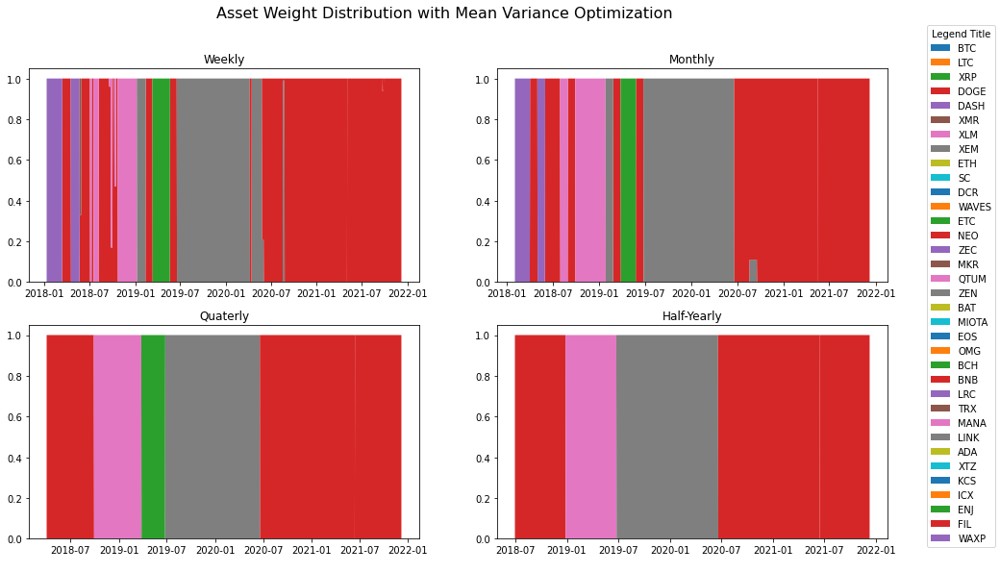

In [16]:
fig = plt.figure(figsize = (16,9))
fig.suptitle("Asset Weight Distribution with Mean Variance Optimization", fontsize=16)

ax1 = plt.subplot(2, 2, 1)
ax1.stackplot(weights_port_1.index, *[ts for col, ts in weights_port_1.iteritems()])
ax1.title.set_text(str(rebalances[0]))

ax2 = plt.subplot(2, 2, 2)
ax2.stackplot(weights_port_2.index, *[ts for col, ts in weights_port_2.iteritems()])
ax2.title.set_text(str(rebalances[1]))

ax3 = plt.subplot(2, 2, 3)
ax3.stackplot(weights_port_3.index, *[ts for col, ts in weights_port_3.iteritems()])
ax3.title.set_text(str(rebalances[2]))

ax4 = plt.subplot(2, 2, 4)
ax4.stackplot(weights_port_4.index, *[ts for col, ts in weights_port_4.iteritems()])
ax4.title.set_text(str(rebalances[3]))

fig.legend([ax1, ax2, ax3, ax4],labels=weights_port.columns,loc="center right", title="Legend Title")

plt.show()

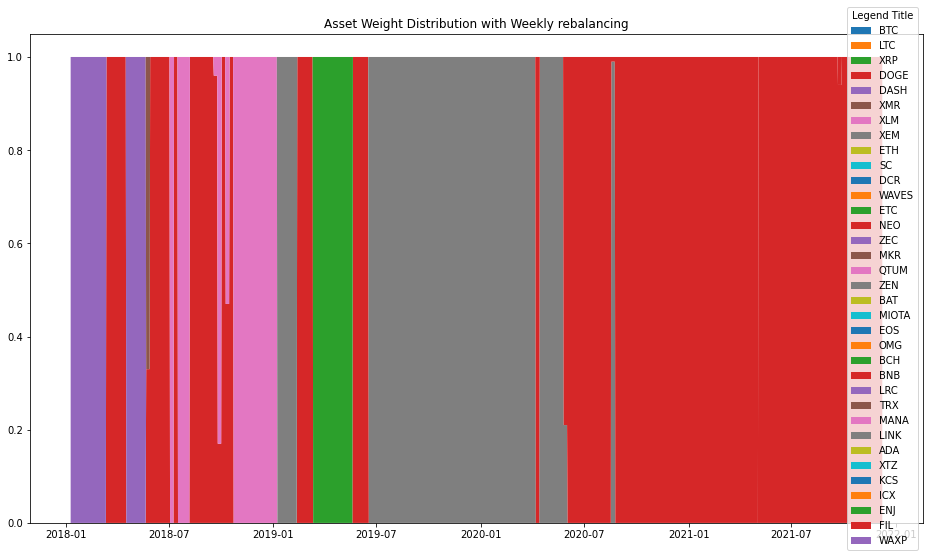

In [36]:
fig = plt.figure(figsize = (16,9))
plt.stackplot(weights_port_1.index, *[ts for col, ts in weights_port_1.iteritems()])
plt.title(str("Asset Weight Distribution with " + rebalances[0] + " rebalancing"))
plt.legend(labels=weights_port.columns,loc="center right", title="Legend Title")

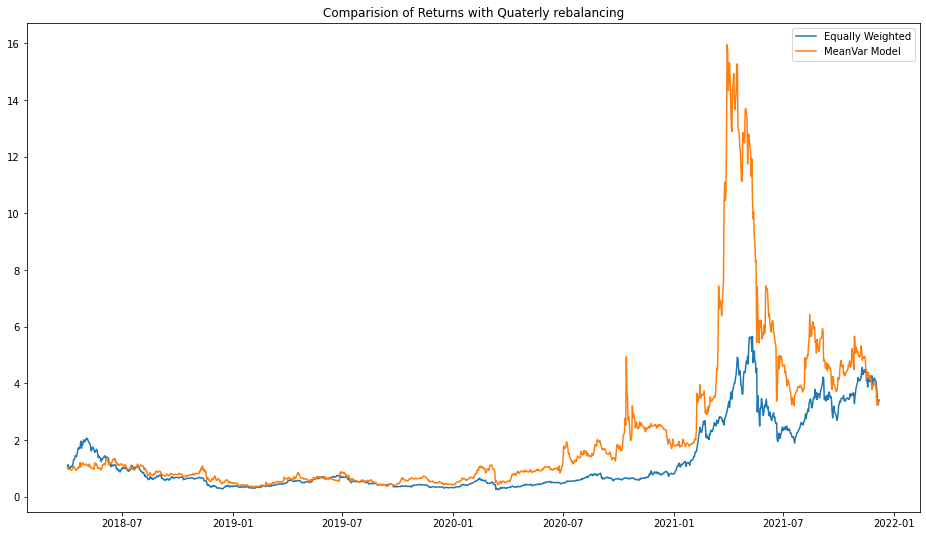

In [33]:
fig = plt.figure(figsize = (16,9))
plt.plot(ret_port[["EqWt", rebalances[2]]].dropna().astype(float).cumsum().apply(np.exp), label = ["Equally Weighted", "MeanVar Model"])
plt.title(str("Comparision of Returns with " + rebalances[2] + " rebalancing"))
plt.legend()
plt.show()

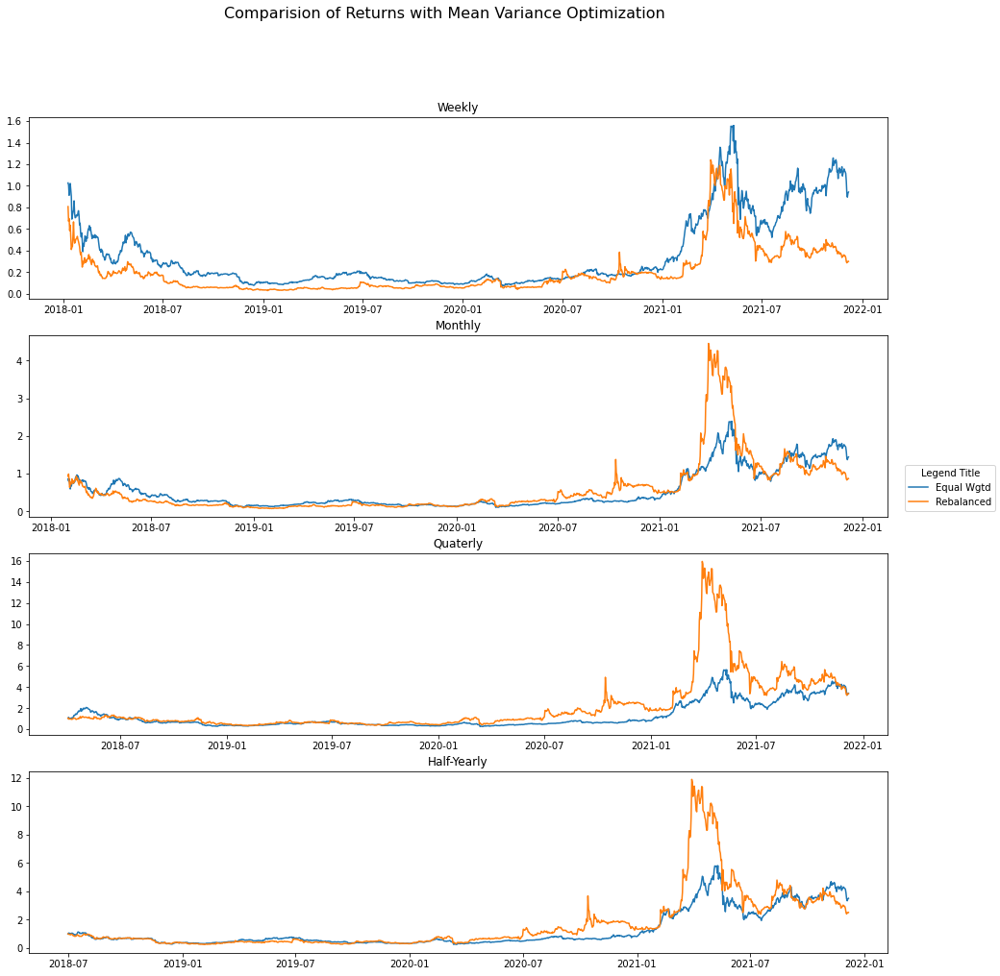

In [19]:
fig = plt.figure(figsize = (16,16))
fig.suptitle("Comparision of Returns with Mean Variance Optimization", fontsize=16)

ax1 = plt.subplot(4, 1, 1)
ax1.plot(ret_port[["EqWt", rebalances[0]]].dropna().astype(float).cumsum().apply(np.exp))
ax1.title.set_text(str(rebalances[0]))

ax2 = plt.subplot(4, 1, 2)
ax2.plot(ret_port[["EqWt", rebalances[1]]].dropna().astype(float).cumsum().apply(np.exp))
ax2.title.set_text(str(rebalances[1]))

ax3 = plt.subplot(4, 1, 3)
ax3.plot(ret_port[["EqWt", rebalances[2]]].dropna().astype(float).cumsum().apply(np.exp))
ax3.title.set_text(str(rebalances[2]))

ax4 = plt.subplot(4, 1, 4)
ax4.plot(ret_port[["EqWt", rebalances[3]]].dropna().astype(float).cumsum().apply(np.exp))
ax4.title.set_text(str(rebalances[3]))

fig.legend([ax1, ax2, ax3, ax4],labels=["Equal Wgtd", "Rebalanced"],loc="center right", title="Legend Title")

plt.show()

In [20]:
ret_port

,Weekly,Monthly,Quaterly,Half-Yearly,EqWt
Date,,,,,
2018-01-03,NaN,NaN,NaN,NaN,0.092931
2018-01-04,NaN,NaN,NaN,NaN,0.047988
2018-01-05,NaN,NaN,NaN,NaN,0.034500
2018-01-06,NaN,NaN,NaN,NaN,0.125861
2018-01-07,NaN,NaN,NaN,NaN,0.048628
...,...,...,...,...,...
2021-12-04,-0.043413,-0.043413,-0.043413,-0.043413,-0.114328
2021-12-05,0.040878,0.040878,0.040878,0.040878,-0.041079
2021-12-06,-0.008981,-0.008981,-0.008981,-0.008981,0.039087


In [31]:
sharpe = ret_port["Quaterly"].mean()/ret_port["Weekly"].std()*np.sqrt(360)
print("Shape Ratio of the Moonshot Portfolio is " + str(round(sharpe,2)))

Shape Ratio of the Moonshot Portfolio is 0.22


In [32]:
D = (ret_port.index[-1] - ret_port.index[0]).days
cagr = ((((ret_port["Quaterly"].astype(float).cumsum().apply(np.exp)[-2]) ** (365.0/D)) - 1)*100)
print("CAGR of the Moonshot Portfolio is " + str(round(cagr,2)) + "%")

CAGR of the Moonshot Portfolio is 36.31%


In [26]:
ret_port["Weekly"].astype(float).cumsum().apply(np.exp)[-2]

0.2988499491527202

In [27]:
ret_port["Monthly"].astype(float).cumsum().apply(np.exp)[-2]

0.8714212542013938

In [29]:
ret_port["Quaterly"].astype(float).cumsum().apply(np.exp)[-2]

3.37950840025931

In [30]:
ret_port["Half-Yearly"].astype(float).cumsum().apply(np.exp)[-2]

2.518301175977039

In [23]:
for row in weightdf[weightdf.index.isin(datelist1)].index:
    weight_port.loc[row,:] = weightdf.loc[row,:]
weight_port.ffill(inplace = True)
weight_port.dropna(inplace = True)

NameError: name 'weightdf' is not defined

In [ ]:
weight_port["Port_Ret"] = np.nan
for row in weight_port.index:
    weight_port.loc[row,"Port_Ret"] = sum(weight_port.loc[row,:][:-1] * dfret.loc[row,])

In [ ]:
dfret.mean(axis=1).cumsum().plot(label = "Equally Weighted", figsize = (16,9))
plt.plot(weight_port["Port_Ret"].cumsum(), label = "Inverse Vol")
plt.legend()
plt.show()

In [ ]:
CorrMatrix = df.pct_change().corr()
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(CorrMatrix, annot=False,cmap='RdBu_r', vmin=-1, vmax=1)
plt.show()